In [4]:
import pandas as pd
from comtrade import Comtrade

# Initialize Comtrade object
comtrade = Comtrade()

# Load the .cfg and .dat files
output_cfg_file = "Substation feed to Non-UPS Load from Utility A/waveforms/wv0000000a.cfg"
output_dat_file = "Substation feed to Non-UPS Load from Utility A/waveforms/wv0000000a.dat"
# input_cfg_file = "UPS1-A-Input/waveforms/wv000000a0.cfg"
# input_dat_file = "UPS1-A-Input/waveforms/wv000000a0.dat"
# comtrade.load(cfg_file, dat_file)

In [12]:
with open(output_dat_file, 'rb') as f:
    data = f.read()
    print(len(data))  # Check the size of the data

522240


In [5]:
from comtrade import Comtrade

# Initialize Comtrade object
comtrade = Comtrade()

try:
    # Load the .cfg and .dat files
    comtrade.load(output_cfg_file, output_dat_file)
    print("Comtrade file loaded successfully.")
except Exception as e:
    print(f"Error loading Comtrade file: {e}")

# Debugging the .dat file
with open(output_dat_file, 'rb') as f:
    data = f.read()
    print(f"Size of .dat file: {len(data)} bytes")
    if len(data) % 42 != 0:
        print("Warning: Buffer size is not a multiple of 42 bytes.")

Comtrade file loaded successfully.
Size of .dat file: 1290240 bytes


In [7]:
import pandas as pd

# Load the CSV file
df = pd.read_csv("waveform_summary.csv")

# Display the datetime column
print(df['trigger_timestamp'])  # Replace with the actual column name

0       2010-11-18 18:47:30.573
1       2010-11-18 22:33:44.366
2       2010-11-18 23:10:25.975
3       2011-03-08 15:49:26.046
4       2011-03-08 15:49:26.046
                 ...           
2500    2024-11-23 12:31:37.107
2501    2024-11-23 12:32:00.180
2502    2024-11-23 13:22:04.005
2503    2024-11-23 13:22:50.118
2504    2024-11-23 14:24:02.268
Name: trigger_timestamp, Length: 2505, dtype: object


In [6]:
comtrade.trigger_timestamp

datetime.datetime(2011, 4, 9, 12, 24, 51, 766000)

In [21]:
dt = comtrade.trigger_timestamp
dt.date()

datetime.date(2011, 4, 9)

In [22]:
dt.hour

12

In [27]:
dt.microsecond / 1000


766.0

In [33]:
df['date'] = df['trigger_timestamp'].dt.date
df['hour'] = df['trigger_timestamp'].dt.hour
df['minute'] = df['trigger_timestamp'].dt.minute
df['second'] = df['trigger_timestamp'].dt.second
df['millisecond'] = df['trigger_timestamp'].dt.microsecond // 1000

In [32]:
print(df['trigger_timestamp'].dtype)

datetime64[ns]


In [31]:
df['trigger_timestamp'] = pd.to_datetime(df['trigger_timestamp'], errors='coerce')

In [35]:
# Save the DataFrame 'df' to a CSV file
df.to_csv("updated_waveform_summary.csv", index=False)
print("DataFrame 'df' has been saved to 'waveform_summary.csv'.")

DataFrame 'df' has been saved to 'waveform_summary.csv'.


In [1]:
from datetime import datetime

datetime_obj = datetime.strptime("09 Apr '11 14:02:53.071", "%d %b '%y %H:%M:%S.%f")
print(datetime_obj)

2011-04-09 14:02:53.071000


In [43]:
type(datetime_obj)

datetime.datetime

In [3]:
datetime_obj.microsecond

71000

In [ ]:
comtrade.start

In [18]:
buffer_size = len(data)
if buffer_size % 42 != 0:
    data = data[:buffer_size - (buffer_size % 42)]

In [20]:
from comtrade import load_as_dataframe
output_df = load_as_dataframe(output_cfg_file, data)
# input_df = load_as_dataframe(input_cfg_file, input_dat_file)

FileNotFoundError: [Errno 2] No such file or directory: b'\x01\x00\x00\x00\xff\xff\xff\xff;\x02\xf5\x07\x00\x00\xcc\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\x9e\x00(\x00\x02\x00\x00\x00\xff\xff\xff\xffc\x02\xdf\x07\x00\x00\xbc\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\x9f\x00*\x00\x03\x00\x00\x00\xff\xff\xff\xff\x89\x02\xc8\x07\x00\x00\xac\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x9f\x00-\x00\x04\x00\x00\x00\xff\xff\xff\xff\xaf\x02\xb1\x07\x00\x00\x9d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\xa0\x00.\x00\x05\x00\x00\x00\xff\xff\xff\xff\xd5\x02\x9b\x07\x00\x00\x90\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\xa0\x000\x00\x06\x00\x00\x00\xff\xff\xff\xff\xf8\x02\x84\x07\x00\x00\x82\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa0\x002\x00\x07\x00\x00\x00\xff\xff\xff\xff\x1b\x03m\x07\x00\x00v\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\xa2\x003\x00\x08\x00\x00\x00\xff\xff\xff\xff>\x03W\x07\x00\x00k\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa2\x004\x00\t\x00\x00\x00\xff\xff\xff\xff`\x03?\x07\x00\x00`\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xa2\x006\x00\n\x00\x00\x00\xff\xff\xff\xff\x81\x03&\x07\x00\x00X\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa2\x007\x00\x0b\x00\x00\x00\xff\xff\xff\xff\xa2\x03\x0b\x07\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa1\x008\x00\x0c\x00\x00\x00\xff\xff\xff\xff\xc3\x03\xf0\x06\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa0\x009\x00\r\x00\x00\x00\xff\xff\xff\xff\xe2\x03\xd2\x06\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9f\x00:\x00\x0e\x00\x00\x00\xff\xff\xff\xff\x03\x04\xb4\x06\x00\x00H\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x9e\x00<\x00\x0f\x00\x00\x00\xff\xff\xff\xff#\x04\x98\x06\x00\x00D\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x9c\x00=\x00\x10\x00\x00\x00\xff\xff\xff\xffC\x04|\x06\x00\x00@\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x9a\x00>\x00\x11\x00\x00\x00\xff\xff\xff\xffc\x04`\x06\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x97\x00@\x00\x12\x00\x00\x00\xff\xff\xff\xff\x86\x04A\x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x94\x00B\x00\x13\x00\x00\x00\xff\xff\xff\xff\xab\x04\x1e\x06\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x90\x00D\x00\x14\x00\x00\x00\xff\xff\xff\xff\xd1\x04\xfb\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x8c\x00F\x00\x15\x00\x00\x00\xff\xff\xff\xff\xf2\x04\xda\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x89\x00H\x00\x16\x00\x00\x00\xff\xff\xff\xff\x12\x05\xbb\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x86\x00J\x00\x17\x00\x00\x00\xff\xff\xff\xff.\x05\x9f\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x83\x00K\x00\x18\x00\x00\x00\xff\xff\xff\xffL\x05\x81\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x7f\x00M\x00\x19\x00\x00\x00\xff\xff\xff\xffh\x05d\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00{\x00O\x00\x1a\x00\x00\x00\xff\xff\xff\xff\x85\x05H\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00w\x00R\x00\x1b\x00\x00\x00\xff\xff\xff\xff\xa3\x05)\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00s\x00S\x00\x1c\x00\x00\x00\xff\xff\xff\xff\xbb\x05\x0e\x05\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00o\x00T\x00\x1d\x00\x00\x00\xff\xff\xff\xff\xd6\x05\xf2\x04\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00i\x00W\x00\x1e\x00\x00\x00\xff\xff\xff\xff\xf1\x05\xd5\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00e\x00X\x00\x1f\x00\x00\x00\xff\xff\xff\xff\x0c\x06\xba\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00`\x00Y\x00 \x00\x00\x00\xff\xff\xff\xff#\x06\x9e\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00Z\x00[\x00!\x00\x00\x00\xff\xff\xff\xff?\x06\x84\x04\x00\x00A\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00T\x00]\x00"\x00\x00\x00\xff\xff\xff\xffY\x06[\x04\x00\x00H\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00O\x00]\x00#\x00\x00\x00\xff\xff\xff\xffs\x06:\x04\x00\x00Q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00Q\x00^\x00$\x00\x00\x00\xff\xff\xff\xff\x8d\x06(\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00Q\x00]\x00%\x00\x00\x00\xff\xff\xff\xff\xa2\x06\x0c\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00L\x00^\x00&\x00\x00\x00\xff\xff\xff\xff\xbe\x06\xe9\x03\x00\x00Y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00J\x00^\x00\'\x00\x00\x00\xff\xff\xff\xff\xd2\x06\xc8\x03\x00\x00b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00J\x00_\x00(\x00\x00\x00\xff\xff\xff\xff\xeb\x06\xb0\x03\x00\x00g\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00J\x00`\x00)\x00\x00\x00\xff\xff\xff\xff\x02\x07\x93\x03\x00\x00g\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00I\x00a\x00*\x00\x00\x00\xff\xff\xff\xff\x19\x07v\x03\x00\x00q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00H\x00b\x00+\x00\x00\x00\xff\xff\xff\xff/\x07V\x03\x00\x00{\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00G\x00c\x00,\x00\x00\x00\xff\xff\xff\xffF\x077\x03\x00\x00\x81\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00F\x00e\x00-\x00\x00\x00\xff\xff\xff\xff\\\x07\x19\x03\x00\x00\x8a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00E\x00g\x00.\x00\x00\x00\xff\xff\xff\xffs\x07\xfa\x02\x00\x00\x92\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00E\x00h\x00/\x00\x00\x00\xff\xff\xff\xff\x87\x07\xdc\x02\x00\x00\x9b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00D\x00j\x000\x00\x00\x00\xff\xff\xff\xff\x9c\x07\xc0\x02\x00\x00\xa4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00D\x00k\x001\x00\x00\x00\xff\xff\xff\xff\xb1\x07\xa1\x02\x00\x00\xad\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00D\x00m\x002\x00\x00\x00\xff\xff\xff\xff\xc5\x07\x81\x02\x00\x00\xb8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00D\x00o\x003\x00\x00\x00\xff\xff\xff\xff\xda\x07e\x02\x00\x00\xc2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00D\x00q\x004\x00\x00\x00\xff\xff\xff\xff\xec\x07G\x02\x00\x00\xc9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00C\x00t\x005\x00\x00\x00\xff\xff\xff\xff\x01\x08*\x02\x00\x00\xd6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00B\x00v\x006\x00\x00\x00\xff\xff\xff\xff\x13\x08\n\x02\x00\x00\xe1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00@\x00x\x007\x00\x00\x00\xff\xff\xff\xff%\x08\xed\x01\x00\x00\xf0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00?\x00{\x008\x00\x00\x00\xff\xff\xff\xff3\x08\xcb\x01\x00\x00\xff\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00<\x00|\x009\x00\x00\x00\xff\xff\xff\xffC\x08\xab\x01\x00\x00\x11\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00;\x00}\x00:\x00\x00\x00\xff\xff\xff\xffT\x08\x8d\x01\x00\x00\x1f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x008\x00\x7f\x00;\x00\x00\x00\xff\xff\xff\xffe\x08n\x01\x00\x00*\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x007\x00\x82\x00<\x00\x00\x00\xff\xff\xff\xffx\x08P\x01\x00\x008\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x005\x00\x85\x00=\x00\x00\x00\xff\xff\xff\xff\x8a\x080\x01\x00\x00H\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x003\x00\x88\x00>\x00\x00\x00\xff\xff\xff\xff\x9b\x08\n\x01\x00\x00W\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x000\x00\x8b\x00?\x00\x00\x00\xff\xff\xff\xff\xb0\x08\xe5\x00\x00\x00j\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00.\x00\x8f\x00@\x00\x00\x00\xff\xff\xff\xff\xc4\x08\xc2\x00\x00\x00z\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00,\x00\x93\x00A\x00\x00\x00\xff\xff\xff\xff\xd5\x08\xa1\x00\x00\x00\x87\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00+\x00\x97\x00B\x00\x00\x00\xff\xff\xff\xff\xe7\x08\x83\x00\x00\x00\x96\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00+\x00\x9a\x00C\x00\x00\x00\xff\xff\xff\xff\xf8\x08c\x00\x00\x00\xa4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00)\x00\x9e\x00D\x00\x00\x00\xff\xff\xff\xff\x08\tB\x00\x00\x00\xb1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00(\x00\xa3\x00E\x00\x00\x00\xff\xff\xff\xff\x1b\t$\x00\x00\x00\xc3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\'\x00\xa7\x00F\x00\x00\x00\xff\xff\xff\xff-\t\x02\x00\x00\x00\xcf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00&\x00\xac\x00G\x00\x00\x00\xff\xff\xff\xff@\t\xe3\xff\x00\x00\xde\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00&\x00\xb1\x00H\x00\x00\x00\xff\xff\xff\xffQ\t\xc2\xff\x00\x00\xee\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00%\x00\xb6\x00I\x00\x00\x00\xff\xff\xff\xffc\t\xa1\xff\x00\x00\xfb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00$\x00\xbb\x00J\x00\x00\x00\xff\xff\xff\xfft\t\x81\xff\x00\x00\n\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00$\x00\xbf\x00K\x00\x00\x00\xff\xff\xff\xff\x84\tc\xff\x00\x00\x18\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00#\x00\xc3\x00L\x00\x00\x00\xff\xff\xff\xff\x96\tE\xff\x00\x00(\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00#\x00\xc7\x00M\x00\x00\x00\xff\xff\xff\xff\xa4\t%\xff\x00\x005\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\xff\x00\x00"\x00\xc9\x00N\x00\x00\x00\xff\xff\xff\xff\xb4\t\x07\xff\x00\x00F\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00"\x00\xcc\x00O\x00\x00\x00\xff\xff\xff\xff\xc4\t\xe7\xfe\x00\x00X\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\xff\x00\x00!\x00\xce\x00P\x00\x00\x00\xff\xff\xff\xff\xd2\t\xc5\xfe\x00\x00g\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\xff\x00\x00 \x00\xcf\x00Q\x00\x00\x00\xff\xff\xff\xff\xe3\t\xa5\xfe\x00\x00y\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\xff\x00\x00\x1e\x00\xd0\x00R\x00\x00\x00\xff\xff\xff\xff\xf3\t\x83\xfe\x00\x00\x8c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\xff\x00\x00\x1c\x00\xd0\x00S\x00\x00\x00\xff\xff\xff\xff\x03\n]\xfe\x00\x00\x9f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\xff\x00\x00\x1a\x00\xd0\x00T\x00\x00\x00\xff\xff\xff\xff\x15\n8\xfe\x00\x00\xb4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\x18\x00\xcf\x00U\x00\x00\x00\xff\xff\xff\xff"\n\x14\xfe\x00\x00\xcd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x16\x00\xcf\x00V\x00\x00\x00\xff\xff\xff\xff/\n\xec\xfd\x00\x00\xe3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x14\x00\xd1\x00W\x00\x00\x00\xff\xff\xff\xffA\n\xc6\xfd\x00\x00\xfd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x12\x00\xd3\x00X\x00\x00\x00\xff\xff\xff\xffO\n\x9d\xfd\x00\x00\x12\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x10\x00\xd4\x00Y\x00\x00\x00\xff\xff\xff\xff_\nw\xfd\x00\x00*\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x0e\x00\xd6\x00Z\x00\x00\x00\xff\xff\xff\xffn\nR\xfd\x00\x00B\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x0b\x00\xd7\x00[\x00\x00\x00\xff\xff\xff\xffz\n,\xfd\x00\x00X\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\n\x00\xd8\x00\\\x00\x00\x00\xff\xff\xff\xff\x88\n\n\xfd\x00\x00q\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x08\x00\xd8\x00]\x00\x00\x00\xff\xff\xff\xff\x92\n\xe5\xfc\x00\x00\x88\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x07\x00\xd8\x00^\x00\x00\x00\xff\xff\xff\xff\x9e\n\xc3\xfc\x00\x00\xa3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x06\x00\xd8\x00_\x00\x00\x00\xff\xff\xff\xff\xa4\n\xa0\xfc\x00\x00\xbb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x05\x00\xd7\x00`\x00\x00\x00\xff\xff\xff\xff\xab\n\x81\xfc\x00\x00\xd5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x05\x00\xd8\x00a\x00\x00\x00\xff\xff\xff\xff\xb0\na\xfc\x00\x00\xf2\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x04\x00\xd7\x00b\x00\x00\x00\xff\xff\xff\xff\xb1\n@\xfc\x00\x00\x0f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x04\x00\xd7\x00c\x00\x00\x00\xff\xff\xff\xff\xb4\n!\xfc\x00\x00-\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x04\x00\xd6\x00d\x00\x00\x00\xff\xff\xff\xff\xb8\n\x02\xfc\x00\x00H\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x04\x00\xd6\x00e\x00\x00\x00\xff\xff\xff\xff\xbc\n\xe1\xfb\x00\x00c\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x03\x00\xd4\x00f\x00\x00\x00\xff\xff\xff\xff\xc0\n\xc1\xfb\x00\x00\x80\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x03\x00\xd4\x00g\x00\x00\x00\xff\xff\xff\xff\xc5\n\xa1\xfb\x00\x00\x9e\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x02\x00\xd2\x00h\x00\x00\x00\xff\xff\xff\xff\xc7\n~\xfb\x00\x00\xb9\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x00\x00\xd1\x00i\x00\x00\x00\xff\xff\xff\xff\xcc\n\\\xfb\x00\x00\xdb\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\xff\xff\xcf\x00j\x00\x00\x00\xff\xff\xff\xff\xcd\n7\xfb\x00\x00\xfe\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\xfd\xff\xcd\x00k\x00\x00\x00\xff\xff\xff\xff\xd0\n\x13\xfb\x00\x00\x1f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\xfb\xff\xca\x00l\x00\x00\x00\xff\xff\xff\xff\xd1\n\xf4\xfa\x00\x00<\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xfa\xff\xc7\x00m\x00\x00\x00\xff\xff\xff\xff\xd3\n\xd6\xfa\x00\x00[\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xf9\xff\xc3\x00n\x00\x00\x00\xff\xff\xff\xff\xd1\n\xb7\xfa\x00\x00v\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xf8\xff\xc0\x00o\x00\x00\x00\xff\xff\xff\xff\xd3\n\x9c\xfa\x00\x00\x97\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00\xf7\xff\xbb\x00p\x00\x00\x00\xff\xff\xff\xff\xd0\n\x84\xfa\x00\x00\xaf\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\xf5\xff\xb5\x00q\x00\x00\x00\xff\xff\xff\xff\xcd\ne\xfa\x00\x00\xce\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\x00\x00\xf3\xff\xb1\x00r\x00\x00\x00\xff\xff\xff\xff\xcc\nI\xfa\x00\x00\xef\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\xff\x00\x00\xf2\xff\xac\x00s\x00\x00\x00\xff\xff\xff\xff\xc7\n1\xfa\x00\x00\n\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\xff\x00\x00\xef\xff\xa7\x00t\x00\x00\x00\xff\xff\xff\xff\xc5\n\x16\xfa\x00\x00\'\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\xff\x00\x00\xec\xff\xa3\x00u\x00\x00\x00\xff\xff\xff\xff\xc2\n\xfb\xf9\x00\x00E\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\xeb\xff\x9d\x00v\x00\x00\x00\xff\xff\xff\xff\xbf\n\xe2\xf9\x00\x00a\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\xff\x00\x00\xe9\xff\x97\x00w\x00\x00\x00\xff\xff\xff\xff\xbd\n\xca\xf9\x00\x00\x7f\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\xff\x00\x00\xe7\xff\x92\x00x\x00\x00\x00\xff\xff\xff\xff\xb9\n\xae\xf9\x00\x00\x99\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe4\xff\x8c\x00y\x00\x00\x00\xff\xff\xff\xff\xab\n\x90\xf9\x00\x00\xbf\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe3\xff\x89\x00z\x00\x00\x00\xff\xff\xff\xff\xa7\nx\xf9\x00\x00\xee\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe4\xff\x89\x00{\x00\x00\x00\xff\xff\xff\xff\xa1\n[\xf9\x00\x00\xfc\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe5\xff\x89\x00|\x00\x00\x00\xff\xff\xff\xff\x9c\nM\xf9\x00\x00\x17\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe3\xff\x8a\x00}\x00\x00\x00\xff\xff\xff\xff\x98\n7\xf9\x00\x00>\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xdd\xff\x8a\x00~\x00\x00\x00\xff\xff\xff\xff\x8c\n\x10\xf9\x00\x00Y\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xdd\xff\x8a\x00\x7f\x00\x00\x00\xff\xff\xff\xff\x8d\n\xff\xf8\x00\x00w\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00\xdf\xff\x8a\x00\x80\x00\x00\x00\xff\xff\xff\xff\x86\n\xeb\xf8\x00\x00\x93\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xdd\xff\x89\x00\x81\x00\x00\x00\xff\xff\xff\xff|\n\xd0\xf8\x00\x00\xb2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xdb\xff\x89\x00\x82\x00\x00\x00\xff\xff\xff\xffv\n\xb7\xf8\x00\x00\xd4\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xda\xff\x89\x00\x83\x00\x00\x00\xff\xff\xff\xffq\n\xa0\xf8\x00\x00\xf2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd9\xff\x89\x00\x84\x00\x00\x00\xff\xff\xff\xffg\n\x89\xf8\x00\x00\x0e\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd8\xff\x89\x00\x85\x00\x00\x00\xff\xff\xff\xff`\ns\xf8\x00\x00-\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd8\xff\x89\x00\x86\x00\x00\x00\xff\xff\xff\xffY\n^\xf8\x00\x00J\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd7\xff\x88\x00\x87\x00\x00\x00\xff\xff\xff\xffN\nG\xf8\x00\x00i\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd6\xff\x88\x00\x88\x00\x00\x00\xff\xff\xff\xffF\n3\xf8\x00\x00\x89\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00\xd4\xff\x88\x00\x89\x00\x00\x00\xff\xff\xff\xff;\n\x1e\xf8\x00\x00\xa8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00\xd2\xff\x86\x00\x8a\x00\x00\x00\xff\xff\xff\xff/\n\t\xf8\x00\x00\xc7\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xd0\xff\x86\x00\x8b\x00\x00\x00\xff\xff\xff\xff$\n\xf7\xf7\x00\x00\xe9\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00\xcd\xff\x85\x00\x8c\x00\x00\x00\xff\xff\xff\xff\x14\n\xe4\xf7\x00\x00\t\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xcb\xff\x85\x00\x8d\x00\x00\x00\xff\xff\xff\xff\x03\n\xd4\xf7\x00\x00*\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xc9\xff\x85\x00\x8e\x00\x00\x00\xff\xff\xff\xff\xf1\t\xc5\xf7\x00\x00J\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xc7\xff\x84\x00\x8f\x00\x00\x00\xff\xff\xff\xff\xe4\t\xb4\xf7\x00\x00i\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\xc4\xff\x84\x00\x90\x00\x00\x00\xff\xff\xff\xff\xd7\t\xa2\xf7\x00\x00\x89\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xc0\xff\x84\x00\x91\x00\x00\x00\xff\xff\xff\xff\xca\t\x8f\xf7\x00\x00\xa7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\xbd\xff\x84\x00\x92\x00\x00\x00\xff\xff\xff\xff\xbd\t}\xf7\x00\x00\xca\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\xba\xff\x84\x00\x93\x00\x00\x00\xff\xff\xff\xff\xab\ti\xf7\x00\x00\xeb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xb6\xff\x85\x00\x94\x00\x00\x00\xff\xff\xff\xff\x9b\tV\xf7\x00\x00\x11\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xb2\xff\x87\x00\x95\x00\x00\x00\xff\xff\xff\xff\x8a\tB\xf7\x00\x005\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xaf\xff\x89\x00\x96\x00\x00\x00\xff\xff\xff\xff|\t/\xf7\x00\x00U\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xac\xff\x8c\x00\x97\x00\x00\x00\xff\xff\xff\xffo\t\x1e\xf7\x00\x00s\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xa9\xff\x8d\x00\x98\x00\x00\x00\xff\xff\xff\xffb\t\x0e\xf7\x00\x00\x93\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa5\xff\x90\x00\x99\x00\x00\x00\xff\xff\xff\xffQ\t\xfb\xf6\x00\x00\xb1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa1\xff\x92\x00\x9a\x00\x00\x00\xff\xff\xff\xffD\t\xec\xf6\x00\x00\xd3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\x9e\xff\x94\x00\x9b\x00\x00\x00\xff\xff\xff\xff5\t\xdc\xf6\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x9a\xff\x96\x00\x9c\x00\x00\x00\xff\xff\xff\xff%\t\xc9\xf6\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x96\xff\x98\x00\x9d\x00\x00\x00\xff\xff\xff\xff\x18\t\xb9\xf6\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x93\xff\x9a\x00\x9e\x00\x00\x00\xff\xff\xff\xff\x06\t\xa8\xf6\x00\x00P\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x90\xff\x9b\x00\x9f\x00\x00\x00\xff\xff\xff\xff\xf8\x08\x99\xf6\x00\x00o\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x8e\xff\x9d\x00\xa0\x00\x00\x00\xff\xff\xff\xff\xea\x08\x89\xf6\x00\x00\x8d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x8a\xff\x9f\x00\xa1\x00\x00\x00\xff\xff\xff\xff\xda\x08z\xf6\x00\x00\xac\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x88\xff\xa0\x00\xa2\x00\x00\x00\xff\xff\xff\xff\xcb\x08l\xf6\x00\x00\xc9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\x85\xff\xa1\x00\xa3\x00\x00\x00\xff\xff\xff\xff\xba\x08\\\xf6\x00\x00\xe8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x84\xff\xa1\x00\xa4\x00\x00\x00\xff\xff\xff\xff\xa9\x08O\xf6\x00\x00\t\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x82\xff\xa0\x00\xa5\x00\x00\x00\xff\xff\xff\xff\x97\x08@\xf6\x00\x00)\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x81\xff\x9f\x00\xa6\x00\x00\x00\xff\xff\xff\xff\x85\x080\xf6\x00\x00J\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x80\xff\x9d\x00\xa7\x00\x00\x00\xff\xff\xff\xffm\x08%\xf6\x00\x00n\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x80\xff\x9b\x00\xa8\x00\x00\x00\xff\xff\xff\xffU\x08\x17\xf6\x00\x00\x91\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00~\xff\x9b\x00\xa9\x00\x00\x00\xff\xff\xff\xff?\x08\n\xf6\x00\x00\xb7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00{\xff\x9c\x00\xaa\x00\x00\x00\xff\xff\xff\xff*\x08\xfc\xf5\x00\x00\xdc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00x\xff\x9d\x00\xab\x00\x00\x00\xff\xff\xff\xff\x12\x08\xea\xf5\x00\x00\x01\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00t\xff\x9e\x00\xac\x00\x00\x00\xff\xff\xff\xff\xfc\x07\xdd\xf5\x00\x00\'\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00q\xff\x9f\x00\xad\x00\x00\x00\xff\xff\xff\xff\xe5\x07\xce\xf5\x00\x00M\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00n\xff\x9f\x00\xae\x00\x00\x00\xff\xff\xff\xff\xce\x07\xbe\xf5\x00\x00r\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00l\xff\xa0\x00\xaf\x00\x00\x00\xff\xff\xff\xff\xb8\x07\xb0\xf5\x00\x00\x98\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00i\xff\xa0\x00\xb0\x00\x00\x00\xff\xff\xff\xff\xa2\x07\xa3\xf5\x00\x00\xbd\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00g\xff\xa0\x00\xb1\x00\x00\x00\xff\xff\xff\xff\x88\x07\x94\xf5\x00\x00\xe1\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00f\xff\xa0\x00\xb2\x00\x00\x00\xff\xff\xff\xffq\x07\x89\xf5\x00\x00\x06\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00d\xff\x9f\x00\xb3\x00\x00\x00\xff\xff\xff\xffX\x07}\xf5\x00\x00)\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00c\xff\x9f\x00\xb4\x00\x00\x00\xff\xff\xff\xffA\x07t\xf5\x00\x00M\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x9f\x00\xb5\x00\x00\x00\xff\xff\xff\xff&\x07h\xf5\x00\x00m\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00a\xff\x9e\x00\xb6\x00\x00\x00\xff\xff\xff\xff\x0e\x07b\xf5\x00\x00\x91\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00a\xff\x9c\x00\xb7\x00\x00\x00\xff\xff\xff\xff\xef\x06^\xf5\x00\x00\xb1\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00b\xff\x9a\x00\xb8\x00\x00\x00\xff\xff\xff\xff\xd2\x06\\\xf5\x00\x00\xd2\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00d\xff\x97\x00\xb9\x00\x00\x00\xff\xff\xff\xff\xb3\x06Y\xf5\x00\x00\xf4\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00e\xff\x94\x00\xba\x00\x00\x00\xff\xff\xff\xff\x96\x06R\xf5\x00\x00\x16\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00f\xff\x92\x00\xbb\x00\x00\x00\xff\xff\xff\xff{\x06M\xf5\x00\x007\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00g\xff\x8f\x00\xbc\x00\x00\x00\xff\xff\xff\xff^\x06J\xf5\x00\x00Y\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00i\xff\x8b\x00\xbd\x00\x00\x00\xff\xff\xff\xff>\x06E\xf5\x00\x00z\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00k\xff\x88\x00\xbe\x00\x00\x00\xff\xff\xff\xff\x1f\x06D\xf5\x00\x00\xa0\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00l\xff\x83\x00\xbf\x00\x00\x00\xff\xff\xff\xff\xfb\x05A\xf5\x00\x00\xc4\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00n\xff~\x00\xc0\x00\x00\x00\xff\xff\xff\xff\xd9\x05>\xf5\x00\x00\xe6\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00q\xffz\x00\xc1\x00\x00\x00\xff\xff\xff\xff\xba\x05>\xf5\x00\x00\t\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00t\xffv\x00\xc2\x00\x00\x00\xff\xff\xff\xff\x9d\x05;\xf5\x00\x00%\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00v\xffr\x00\xc3\x00\x00\x00\xff\xff\xff\xff\x80\x05<\xf5\x00\x00D\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00y\xffn\x00\xc4\x00\x00\x00\xff\xff\xff\xffc\x05<\xf5\x00\x00b\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00|\xffh\x00\xc5\x00\x00\x00\xff\xff\xff\xffB\x05=\xf5\x00\x00\x7f\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x7f\xffc\x00\xc6\x00\x00\x00\xff\xff\xff\xff$\x05A\xf5\x00\x00\x9c\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x82\xff^\x00\xc7\x00\x00\x00\xff\xff\xff\xff\x07\x05A\xf5\x00\x00\xb7\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x84\xffY\x00\xc8\x00\x00\x00\xff\xff\xff\xff\xe9\x04D\xf5\x00\x00\xd3\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x88\xffS\x00\xc9\x00\x00\x00\xff\xff\xff\xff\xca\x04E\xf5\x00\x00\xee\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x8c\xffL\x00\xca\x00\x00\x00\xff\xff\xff\xff\xa3\x04L\xf5\x00\x00\n\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x8f\xffJ\x00\xcb\x00\x00\x00\xff\xff\xff\xff\x86\x04_\xf5\x00\x00)\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8c\xffI\x00\xcc\x00\x00\x00\xff\xff\xff\xfff\x04U\xf5\x00\x00<\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x89\xffG\x00\xcd\x00\x00\x00\xff\xff\xff\xffJ\x04V\xf5\x00\x00[\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8b\xffE\x00\xce\x00\x00\x00\xff\xff\xff\xff-\x04a\xf5\x00\x00z\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8d\xffB\x00\xcf\x00\x00\x00\xff\xff\xff\xff\x0c\x04a\xf5\x00\x00\x8c\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x8d\xff?\x00\xd0\x00\x00\x00\xff\xff\xff\xff\xee\x03e\xf5\x00\x00\xa7\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x8e\xff=\x00\xd1\x00\x00\x00\xff\xff\xff\xff\xd3\x03o\xf5\x00\x00\xc7\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x8e\xff:\x00\xd2\x00\x00\x00\xff\xff\xff\xff\xb0\x03n\xf5\x00\x00\xdb\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x8f\xff8\x00\xd3\x00\x00\x00\xff\xff\xff\xff\x94\x03u\xf5\x00\x00\xf3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x90\xff6\x00\xd4\x00\x00\x00\xff\xff\xff\xffv\x03~\xf5\x00\x00\r\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x91\xff3\x00\xd5\x00\x00\x00\xff\xff\xff\xffU\x03\x86\xf5\x00\x00&\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x90\xff1\x00\xd6\x00\x00\x00\xff\xff\xff\xff5\x03\x8b\xf5\x00\x00=\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x90\xff0\x00\xd7\x00\x00\x00\xff\xff\xff\xff\x17\x03\x93\xf5\x00\x00V\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8f\xff/\x00\xd8\x00\x00\x00\xff\xff\xff\xff\xf7\x02\x9a\xf5\x00\x00m\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8f\xff.\x00\xd9\x00\x00\x00\xff\xff\xff\xff\xd9\x02\xa3\xf5\x00\x00\x83\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8e\xff-\x00\xda\x00\x00\x00\xff\xff\xff\xff\xbb\x02\xab\xf5\x00\x00\x98\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x8d\xff,\x00\xdb\x00\x00\x00\xff\xff\xff\xff\x9d\x02\xb5\xf5\x00\x00\xaf\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00\x8b\xff+\x00\xdc\x00\x00\x00\xff\xff\xff\xff\x7f\x02\xbb\xf5\x00\x00\xc2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00\x89\xff*\x00\xdd\x00\x00\x00\xff\xff\xff\xffb\x02\xc5\xf5\x00\x00\xd9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x88\xff(\x00\xde\x00\x00\x00\xff\xff\xff\xffC\x02\xd0\xf5\x00\x00\xed\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00\x87\xff\'\x00\xdf\x00\x00\x00\xff\xff\xff\xff$\x02\xda\xf5\x00\x00\x01\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x00\x86\xff%\x00\xe0\x00\x00\x00\xff\xff\xff\xff\x05\x02\xe6\xf5\x00\x00\x15\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x00\x84\xff#\x00\xe1\x00\x00\x00\xff\xff\xff\xff\xe5\x01\xf3\xf5\x00\x00(\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00\x83\xff!\x00\xe2\x00\x00\x00\xff\xff\xff\xff\xc6\x01\x02\xf6\x00\x008\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00\x83\xff\x1e\x00\xe3\x00\x00\x00\xff\xff\xff\xff\xa5\x01\x13\xf6\x00\x00F\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\x84\xff\x1b\x00\xe4\x00\x00\x00\xff\xff\xff\xff\x86\x01$\xf6\x00\x00V\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00\x83\xff\x18\x00\xe5\x00\x00\x00\xff\xff\xff\xffg\x012\xf6\x00\x00g\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00\x82\xff\x15\x00\xe6\x00\x00\x00\xff\xff\xff\xffI\x01>\xf6\x00\x00y\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x81\xff\x13\x00\xe7\x00\x00\x00\xff\xff\xff\xff)\x01L\xf6\x00\x00\x8a\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x80\xff\x11\x00\xe8\x00\x00\x00\xff\xff\xff\xff\x07\x01\\\xf6\x00\x00\x9e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00~\xff\r\x00\xe9\x00\x00\x00\xff\xff\xff\xff\xe0\x00m\xf6\x00\x00\xb1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00}\xff\t\x00\xea\x00\x00\x00\xff\xff\xff\xff\xbe\x00}\xf6\x00\x00\xc4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00|\xff\x07\x00\xeb\x00\x00\x00\xff\xff\xff\xff\x9f\x00\x8c\xf6\x00\x00\xd4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\x00\x00\x00z\xff\x04\x00\xec\x00\x00\x00\xff\xff\xff\xff\x82\x00\x99\xf6\x00\x00\xe5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\x00\x00\x00w\xff\x03\x00\xed\x00\x00\x00\xff\xff\xff\xffc\x00\xa8\xf6\x00\x00\xf5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\x00\x00\x00u\xff\x00\x00\xee\x00\x00\x00\xff\xff\xff\xffC\x00\xb7\xf6\x00\x00\x06\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\x00\x00\x00r\xff\x00\x00\xef\x00\x00\x00\xff\xff\xff\xff#\x00\xc6\xf6\x00\x00\x16\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00p\xff\xfe\xff\xf0\x00\x00\x00\xff\xff\xff\xff\x03\x00\xd6\xf6\x00\x00)\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00m\xff\xfd\xff\xf1\x00\x00\x00\xff\xff\xff\xff\xe2\xff\xe4\xf6\x00\x00:\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\x00\x00\x00j\xff\xfb\xff\xf2\x00\x00\x00\xff\xff\xff\xff\xc3\xff\xf4\xf6\x00\x00K\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00g\xff\xf9\xff\xf3\x00\x00\x00\xff\xff\xff\xff\xa2\xff\x04\xf7\x00\x00[\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00d\xff\xf8\xff\xf4\x00\x00\x00\xff\xff\xff\xff\x84\xff\x14\xf7\x00\x00j\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00a\xff\xf6\xff\xf5\x00\x00\x00\xff\xff\xff\xffd\xff"\xf7\x00\x00z\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00^\xff\xf5\xff\xf6\x00\x00\x00\xff\xff\xff\xffF\xff2\xf7\x00\x00\x89\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00[\xff\xf4\xff\xf7\x00\x00\x00\xff\xff\xff\xff(\xffA\xf7\x00\x00\x98\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00Y\xff\xf3\xff\xf8\x00\x00\x00\xff\xff\xff\xff\x08\xffR\xf7\x00\x00\xa8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00X\xff\xf1\xff\xf9\x00\x00\x00\xff\xff\xff\xff\xe7\xfeb\xf7\x00\x00\xb5\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00X\xff\xf0\xff\xfa\x00\x00\x00\xff\xff\xff\xff\xc8\xfeu\xf7\x00\x00\xc6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00X\xff\xed\xff\xfb\x00\x00\x00\xff\xff\xff\xff\xa4\xfe\x87\xf7\x00\x00\xd6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00X\xff\xea\xff\xfc\x00\x00\x00\xff\xff\xff\xff\x81\xfe\x9a\xf7\x00\x00\xe7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00Y\xff\xe7\xff\xfd\x00\x00\x00\xff\xff\xff\xff[\xfe\xaf\xf7\x00\x00\xf7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00Z\xff\xe5\xff\xfe\x00\x00\x00\xff\xff\xff\xff6\xfe\xc5\xf7\x00\x00\x05\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00[\xff\xe2\xff\xff\x00\x00\x00\xff\xff\xff\xff\x10\xfe\xdc\xf7\x00\x00\x16\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\\\xff\xdf\xff\x00\x01\x00\x00\xff\xff\xff\xff\xe9\xfd\xf2\xf7\x00\x00&\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00[\xff\xdd\xff\x01\x01\x00\x00\xff\xff\xff\xff\xc2\xfd\x08\xf8\x00\x006\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00[\xff\xda\xff\x02\x01\x00\x00\xff\xff\xff\xff\x9c\xfd \xf8\x00\x00F\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00[\xff\xd8\xff\x03\x01\x00\x00\xff\xff\xff\xffu\xfd7\xf8\x00\x00V\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00[\xff\xd6\xff\x04\x01\x00\x00\xff\xff\xff\xffO\xfdN\xf8\x00\x00d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00[\xff\xd3\xff\x05\x01\x00\x00\xff\xff\xff\xff+\xfdf\xf8\x00\x00r\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00[\xff\xd1\xff\x06\x01\x00\x00\xff\xff\xff\xff\x05\xfd|\xf8\x00\x00\x7f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00Z\xff\xcf\xff\x07\x01\x00\x00\xff\xff\xff\xff\xe4\xfc\x93\xf8\x00\x00\x89\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00Z\xff\xce\xff\x08\x01\x00\x00\xff\xff\xff\xff\xc1\xfc\xac\xf8\x00\x00\x96\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00Z\xff\xcd\xff\t\x01\x00\x00\xff\xff\xff\xff\xa0\xfc\xc5\xf8\x00\x00\x9e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00Z\xff\xcb\xff\n\x01\x00\x00\xff\xff\xff\xff}\xfc\xdd\xf8\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00Z\xff\xca\xff\x0b\x01\x00\x00\xff\xff\xff\xff]\xfc\xf8\xf8\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00Y\xff\xc9\xff\x0c\x01\x00\x00\xff\xff\xff\xff=\xfc\x13\xf9\x00\x00\xb1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00Y\xff\xc8\xff\r\x01\x00\x00\xff\xff\xff\xff\x1c\xfc1\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00Z\xff\xc7\xff\x0e\x01\x00\x00\xff\xff\xff\xff\xfc\xfbN\xf9\x00\x00\xb5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00[\xff\xc6\xff\x0f\x01\x00\x00\xff\xff\xff\xff\xdc\xfbk\xf9\x00\x00\xbb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\\\xff\xc5\xff\x10\x01\x00\x00\xff\xff\xff\xff\xbc\xfb\x87\xf9\x00\x00\xbf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00]\xff\xc4\xff\x11\x01\x00\x00\xff\xff\xff\xff\x9c\xfb\xa4\xf9\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00_\xff\xc2\xff\x12\x01\x00\x00\xff\xff\xff\xffx\xfb\xc2\xf9\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00b\xff\xc0\xff\x13\x01\x00\x00\xff\xff\xff\xffU\xfb\xe5\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00e\xff\xbe\xff\x14\x01\x00\x00\xff\xff\xff\xff.\xfb\x07\xfa\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00i\xff\xbc\xff\x15\x01\x00\x00\xff\xff\xff\xff\r\xfb\'\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00m\xff\xba\xff\x16\x01\x00\x00\xff\xff\xff\xff\xed\xfaD\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00p\xff\xb9\xff\x17\x01\x00\x00\xff\xff\xff\xff\xd1\xfa`\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00u\xff\xb7\xff\x18\x01\x00\x00\xff\xff\xff\xff\xb4\xfa\x7f\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00z\xff\xb6\xff\x19\x01\x00\x00\xff\xff\xff\xff\x96\xfa\x9c\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\x7f\xff\xb4\xff\x1a\x01\x00\x00\xff\xff\xff\xffy\xfa\xb7\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\x85\xff\xb2\xff\x1b\x01\x00\x00\xff\xff\xff\xff]\xfa\xd7\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x8b\xff\xb1\xff\x1c\x01\x00\x00\xff\xff\xff\xffD\xfa\xf2\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\x8f\xff\xaf\xff\x1d\x01\x00\x00\xff\xff\xff\xff(\xfa\r\xfb\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\x95\xff\xad\xff\x1e\x01\x00\x00\xff\xff\xff\xff\x0f\xfa+\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\x9b\xff\xab\xff\x1f\x01\x00\x00\xff\xff\xff\xff\xf3\xf9F\xfb\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xa1\xff\xaa\xff \x01\x00\x00\xff\xff\xff\xff\xdb\xf9b\xfb\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xa7\xff\xa8\xff!\x01\x00\x00\xff\xff\xff\xff\xc3\xf9\x7f\xfb\x00\x00\xc1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xad\xff\xa6\xff"\x01\x00\x00\xff\xff\xff\xff\xa9\xf9\x9c\xfb\x00\x00\xbb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb4\xff\xa4\xff#\x01\x00\x00\xff\xff\xff\xff\x89\xf9\xc6\xfb\x00\x00\xb0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb7\xff\xa3\xff$\x01\x00\x00\xff\xff\xff\xfft\xf9\xed\xfb\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb1\xff\xa5\xff%\x01\x00\x00\xff\xff\xff\xff\\\xf9\xf7\xfb\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xaf\xff\xa4\xff&\x01\x00\x00\xff\xff\xff\xffD\xf9\x13\xfc\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb4\xff\xa3\xff\'\x01\x00\x00\xff\xff\xff\xff,\xf9@\xfc\x00\x00\xa2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb4\xff\xa1\xff(\x01\x00\x00\xff\xff\xff\xff\x10\xf9W\xfc\x00\x00\x94\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb1\xff\xa1\xff)\x01\x00\x00\xff\xff\xff\xff\xfd\xf8o\xfc\x00\x00\x93\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb2\xff\xa1\xff*\x01\x00\x00\xff\xff\xff\xff\xe8\xf8\x90\xfc\x00\x00\x90\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb5\xff\x9f\xff+\x01\x00\x00\xff\xff\xff\xff\xce\xf8\xae\xfc\x00\x00\x85\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb5\xff\x9e\xff,\x01\x00\x00\xff\xff\xff\xff\xb7\xf8\xca\xfc\x00\x00}\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb6\xff\x9c\xff-\x01\x00\x00\xff\xff\xff\xff\xa4\xf8\xe9\xfc\x00\x00x\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb7\xff\x9b\xff.\x01\x00\x00\xff\xff\xff\xff\x8b\xf8\t\xfd\x00\x00o\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb8\xff\x9a\xff/\x01\x00\x00\xff\xff\xff\xffv\xf8&\xfd\x00\x00e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb7\xff\x9a\xff0\x01\x00\x00\xff\xff\xff\xffb\xf8C\xfd\x00\x00]\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb8\xff\x99\xff1\x01\x00\x00\xff\xff\xff\xffL\xf8_\xfd\x00\x00U\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xba\xff\x98\xff2\x01\x00\x00\xff\xff\xff\xff8\xf8\x7f\xfd\x00\x00I\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xbc\xff\x97\xff3\x01\x00\x00\xff\xff\xff\xff&\xf8\x9e\xfd\x00\x00A\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xbc\xff\x95\xff4\x01\x00\x00\xff\xff\xff\xff\x12\xf8\xba\xfd\x00\x005\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xbe\xff\x93\xff5\x01\x00\x00\xff\xff\xff\xff\xff\xf7\xd8\xfd\x00\x00+\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc0\xff\x90\xff6\x01\x00\x00\xff\xff\xff\xff\xed\xf7\xf9\xfd\x00\x00\x1d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc2\xff\x8e\xff7\x01\x00\x00\xff\xff\xff\xff\xdc\xf7\x18\xfe\x00\x00\r\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc4\xff\x8c\xff8\x01\x00\x00\xff\xff\xff\xff\xcd\xf77\xfe\x00\x00\xfd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc6\xff\x89\xff9\x01\x00\x00\xff\xff\xff\xff\xbd\xf7X\xfe\x00\x00\xed\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc8\xff\x88\xff:\x01\x00\x00\xff\xff\xff\xff\xac\xf7w\xfe\x00\x00\xdf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc9\xff\x86\xff;\x01\x00\x00\xff\xff\xff\xff\x9b\xf7\x95\xfe\x00\x00\xd0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xcb\xff\x83\xff<\x01\x00\x00\xff\xff\xff\xff\x8b\xf7\xb5\xfe\x00\x00\xc3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xcd\xff\x7f\xff=\x01\x00\x00\xff\xff\xff\xffy\xf7\xd7\xfe\x00\x00\xb2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xce\xff|\xff>\x01\x00\x00\xff\xff\xff\xffe\xf7\xfa\xfe\x00\x00\xa2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xd0\xffx\xff?\x01\x00\x00\xff\xff\xff\xffP\xf7 \xff\x00\x00\x93\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\xd2\xffs\xff@\x01\x00\x00\xff\xff\xff\xff=\xf7B\xff\x00\x00\x82\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd2\xffo\xffA\x01\x00\x00\xff\xff\xff\xff*\xf7c\xff\x00\x00t\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\xd3\xffk\xffB\x01\x00\x00\xff\xff\xff\xff\x1a\xf7\x82\xff\x00\x00h\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\xd3\xfff\xffC\x01\x00\x00\xff\xff\xff\xff\x07\xf7\xa0\xff\x00\x00W\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xd4\xffc\xffD\x01\x00\x00\xff\xff\xff\xff\xf6\xf6\xc1\xff\x00\x00K\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xd5\xff^\xffE\x01\x00\x00\xff\xff\xff\xff\xe4\xf6\xe1\xff\x00\x00=\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xd5\xffZ\xffF\x01\x00\x00\xff\xff\xff\xff\xd1\xf6\x00\x00\x00\x00.\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xd6\xffW\xffG\x01\x00\x00\xff\xff\xff\xff\xc0\xf6!\x00\x00\x00"\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xd8\xffS\xffH\x01\x00\x00\xff\xff\xff\xff\xad\xf6A\x00\x00\x00\x12\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xd9\xffN\xffI\x01\x00\x00\xff\xff\xff\xff\x9c\xf6a\x00\x00\x00\x04\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xdb\xffJ\xffJ\x01\x00\x00\xff\xff\xff\xff\x8a\xf6\x81\x00\x00\x00\xf5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xdb\xffF\xffK\x01\x00\x00\xff\xff\xff\xffy\xf6\x9f\x00\x00\x00\xe7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xdc\xffD\xffL\x01\x00\x00\xff\xff\xff\xffi\xf6\xbf\x00\x00\x00\xd9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xdc\xffA\xffM\x01\x00\x00\xff\xff\xff\xffZ\xf6\xdd\x00\x00\x00\xc8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xdd\xff?\xffN\x01\x00\x00\xff\xff\xff\xffL\xf6\xfc\x00\x00\x00\xb8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xdf\xff>\xffO\x01\x00\x00\xff\xff\xff\xff=\xf6\x1c\x01\x00\x00\xa7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xdf\xff<\xffP\x01\x00\x00\xff\xff\xff\xff,\xf6<\x01\x00\x00\x94\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xe0\xff;\xffQ\x01\x00\x00\xff\xff\xff\xff\x1e\xf6_\x01\x00\x00\x84\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xe3\xff:\xffR\x01\x00\x00\xff\xff\xff\xff\r\xf6\x80\x01\x00\x00p\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xe5\xff9\xffS\x01\x00\x00\xff\xff\xff\xff\xfc\xf5\xa5\x01\x00\x00]\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe7\xff:\xffT\x01\x00\x00\xff\xff\xff\xff\xef\xf5\xcb\x01\x00\x00F\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xe9\xff9\xffU\x01\x00\x00\xff\xff\xff\xff\xe1\xf5\xf1\x01\x00\x00-\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xeb\xff6\xffV\x01\x00\x00\xff\xff\xff\xff\xd0\xf5\x18\x02\x00\x00\x16\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xed\xff4\xffW\x01\x00\x00\xff\xff\xff\xff\xc1\xf5A\x02\x00\x00\x01\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xef\xff1\xffX\x01\x00\x00\xff\xff\xff\xff\xaf\xf5e\x02\x00\x00\xe8\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xf0\xff0\xffY\x01\x00\x00\xff\xff\xff\xff\xa1\xf5\x8d\x02\x00\x00\xd1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xf2\xff.\xffZ\x01\x00\x00\xff\xff\xff\xff\x91\xf5\xb3\x02\x00\x00\xba\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xf3\xff-\xff[\x01\x00\x00\xff\xff\xff\xff\x84\xf5\xd7\x02\x00\x00\xa4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xf5\xff-\xff\\\x01\x00\x00\xff\xff\xff\xffw\xf5\xfa\x02\x00\x00\x8d\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf5\xff-\xff]\x01\x00\x00\xff\xff\xff\xffk\xf5\x1e\x03\x00\x00t\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf7\xff.\xff^\x01\x00\x00\xff\xff\xff\xffa\xf5A\x03\x00\x00^\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf8\xff0\xff_\x01\x00\x00\xff\xff\xff\xffX\xf5b\x03\x00\x00D\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xf9\xff1\xff`\x01\x00\x00\xff\xff\xff\xffR\xf5\x82\x03\x00\x00+\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xfa\xff3\xffa\x01\x00\x00\xff\xff\xff\xffN\xf5\xa3\x03\x00\x00\x0f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xfa\xff4\xffb\x01\x00\x00\xff\xff\xff\xffL\xf5\xc1\x03\x00\x00\xef\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfc\xff5\xffc\x01\x00\x00\xff\xff\xff\xffM\xf5\xe2\x03\x00\x00\xd4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xfc\xff5\xffd\x01\x00\x00\xff\xff\xff\xffG\xf5\x00\x04\x00\x00\xb8\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xfc\xff6\xffe\x01\x00\x00\xff\xff\xff\xffA\xf5\x1e\x04\x00\x00\x9c\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xfd\xff7\xfff\x01\x00\x00\xff\xff\xff\xff>\xf5A\x04\x00\x00\x81\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xff\xff9\xffg\x01\x00\x00\xff\xff\xff\xff;\xf5a\x04\x00\x00c\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x00\x00:\xffh\x01\x00\x00\xff\xff\xff\xff8\xf5\x80\x04\x00\x00C\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x00\x00;\xffi\x01\x00\x00\xff\xff\xff\xff8\xf5\xa5\x04\x00\x00#\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x03\x00<\xffj\x01\x00\x00\xff\xff\xff\xff6\xf5\xcb\x04\x00\x00\xfe\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x06\x00>\xffk\x01\x00\x00\xff\xff\xff\xff4\xf5\xee\x04\x00\x00\xdf\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x07\x00?\xffl\x01\x00\x00\xff\xff\xff\xff2\xf5\x0b\x05\x00\x00\xbf\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\t\x00A\xffm\x01\x00\x00\xff\xff\xff\xff2\xf5)\x05\x00\x00\xa4\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\n\x00D\xffn\x01\x00\x00\xff\xff\xff\xff2\xf5G\x05\x00\x00\x85\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\x0b\x00F\xffo\x01\x00\x00\xff\xff\xff\xff2\xf5d\x05\x00\x00g\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\x0c\x00I\xffp\x01\x00\x00\xff\xff\xff\xff4\xf5}\x05\x00\x00O\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\x00\x00\x00\x0f\x00N\xffq\x01\x00\x00\xff\xff\xff\xff5\xf5\x9b\x05\x00\x00,\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00\x00\x00\x11\x00Q\xffr\x01\x00\x00\xff\xff\xff\xff8\xf5\xb7\x05\x00\x00\x0e\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00\x12\x00U\xffs\x01\x00\x00\xff\xff\xff\xff;\xf5\xd0\x05\x00\x00\xf5\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\x00\x00\x00\x14\x00Y\xfft\x01\x00\x00\xff\xff\xff\xff<\xf5\xeb\x05\x00\x00\xd5\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00\x16\x00]\xffu\x01\x00\x00\xff\xff\xff\xff>\xf5\x05\x06\x00\x00\xb8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\x00\x00\x00\x18\x00b\xffv\x01\x00\x00\xff\xff\xff\xffC\xf5 \x06\x00\x00\x9e\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\x00\x00\x00\x19\x00h\xffw\x01\x00\x00\xff\xff\xff\xffN\xf59\x06\x00\x00v\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00\x1a\x00j\xffx\x01\x00\x00\xff\xff\xff\xffM\xf5S\x06\x00\x00U\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\x1c\x00l\xffy\x01\x00\x00\xff\xff\xff\xffS\xf5t\x06\x00\x00E\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x1b\x00n\xffz\x01\x00\x00\xff\xff\xff\xffT\xf5\x83\x06\x00\x00\x1e\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x1c\x00q\xff{\x01\x00\x00\xff\xff\xff\xff\\\xf5\x9e\x06\x00\x00\x01\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x1f\x00t\xff|\x01\x00\x00\xff\xff\xff\xffb\xf5\xbd\x06\x00\x00\xe7\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x1f\x00v\xff}\x01\x00\x00\xff\xff\xff\xfff\xf5\xd0\x06\x00\x00\xc5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x1e\x00y\xff~\x01\x00\x00\xff\xff\xff\xfft\xf5\xe4\x06\x00\x00\xa5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00 \x00y\xff\x7f\x01\x00\x00\xff\xff\xff\xffz\xf5\xff\x06\x00\x00\x8d\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00"\x00w\xff\x80\x01\x00\x00\xff\xff\xff\xff|\xf5\x14\x07\x00\x00j\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00$\x00x\xff\x81\x01\x00\x00\xff\xff\xff\xff\x88\xf5-\x07\x00\x00J\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00&\x00x\xff\x82\x01\x00\x00\xff\xff\xff\xff\x8e\xf5F\x07\x00\x00-\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\'\x00w\xff\x83\x01\x00\x00\xff\xff\xff\xff\x93\xf5[\x07\x00\x00\x0f\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00(\x00v\xff\x84\x01\x00\x00\xff\xff\xff\xff\x9c\xf5r\x07\x00\x00\xf0\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00*\x00v\xff\x85\x01\x00\x00\xff\xff\xff\xff\xa4\xf5\x88\x07\x00\x00\xd3\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00+\x00v\xff\x86\x01\x00\x00\xff\xff\xff\xff\xab\xf5\x9f\x07\x00\x00\xb5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00,\x00u\xff\x87\x01\x00\x00\xff\xff\xff\xff\xb4\xf5\xb4\x07\x00\x00\x95\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00-\x00u\xff\x88\x01\x00\x00\xff\xff\xff\xff\xbf\xf5\xca\x07\x00\x00v\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00/\x00u\xff\x89\x01\x00\x00\xff\xff\xff\xff\xc8\xf5\xde\x07\x00\x00W\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x001\x00u\xff\x8a\x01\x00\x00\xff\xff\xff\xff\xd4\xf5\xf3\x07\x00\x008\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x003\x00u\xff\x8b\x01\x00\x00\xff\xff\xff\xff\xde\xf5\x08\x08\x00\x00\x17\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x005\x00u\xff\x8c\x01\x00\x00\xff\xff\xff\xff\xee\xf5\x1b\x08\x00\x00\xf8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x007\x00v\xff\x8d\x01\x00\x00\xff\xff\xff\xff\xfd\xf5*\x08\x00\x00\xd6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x009\x00w\xff\x8e\x01\x00\x00\xff\xff\xff\xff\r\xf6:\x08\x00\x00\xb6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00:\x00y\xff\x8f\x01\x00\x00\xff\xff\xff\xff\x1e\xf6L\x08\x00\x00\x96\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00=\x00z\xff\x90\x01\x00\x00\xff\xff\xff\xff*\xf6^\x08\x00\x00u\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00?\x00z\xff\x91\x01\x00\x00\xff\xff\xff\xff6\xf6p\x08\x00\x00W\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00A\x00z\xff\x92\x01\x00\x00\xff\xff\xff\xffE\xf6\x83\x08\x00\x007\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00D\x00z\xff\x93\x01\x00\x00\xff\xff\xff\xffS\xf6\x95\x08\x00\x00\x14\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00G\x00z\xff\x94\x01\x00\x00\xff\xff\xff\xffd\xf6\xaa\x08\x00\x00\xf2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00J\x00z\xff\x95\x01\x00\x00\xff\xff\xff\xfft\xf6\xbe\x08\x00\x00\xcd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00M\x00z\xff\x96\x01\x00\x00\xff\xff\xff\xff\x82\xf6\xd0\x08\x00\x00\xac\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00P\x00z\xff\x97\x01\x00\x00\xff\xff\xff\xff\x91\xf6\xe1\x08\x00\x00\x8e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00T\x00w\xff\x98\x01\x00\x00\xff\xff\xff\xff\xa0\xf6\xf1\x08\x00\x00n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00W\x00u\xff\x99\x01\x00\x00\xff\xff\xff\xff\xae\xf6\x02\t\x00\x00O\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00[\x00r\xff\x9a\x01\x00\x00\xff\xff\xff\xff\xbe\xf6\x13\t\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00^\x00o\xff\x9b\x01\x00\x00\xff\xff\xff\xff\xcc\xf6"\t\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00c\x00m\xff\x9c\x01\x00\x00\xff\xff\xff\xff\xdb\xf61\t\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00g\x00j\xff\x9d\x01\x00\x00\xff\xff\xff\xff\xee\xf6C\t\x00\x00\xd2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00l\x00g\xff\x9e\x01\x00\x00\xff\xff\xff\xff\xfc\xf6T\t\x00\x00\xb0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00p\x00c\xff\x9f\x01\x00\x00\xff\xff\xff\xff\n\xf7c\t\x00\x00\x91\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00t\x00a\xff\xa0\x01\x00\x00\xff\xff\xff\xff\x1a\xf7s\t\x00\x00u\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00x\x00^\xff\xa1\x01\x00\x00\xff\xff\xff\xff(\xf7\x82\t\x00\x00U\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00{\x00\\\xff\xa2\x01\x00\x00\xff\xff\xff\xff8\xf7\x91\t\x00\x008\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00~\x00Z\xff\xa3\x01\x00\x00\xff\xff\xff\xffI\xf7\x9f\t\x00\x00\x18\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x81\x00Y\xff\xa4\x01\x00\x00\xff\xff\xff\xffY\xf7\xb0\t\x00\x00\xfa\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x82\x00Y\xff\xa5\x01\x00\x00\xff\xff\xff\xffj\xf7\xbd\t\x00\x00\xd8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x84\x00Y\xff\xa6\x01\x00\x00\xff\xff\xff\xff}\xf7\xcd\t\x00\x00\xb8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x85\x00[\xff\xa7\x01\x00\x00\xff\xff\xff\xff\x91\xf7\xdb\t\x00\x00\x93\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x85\x00]\xff\xa8\x01\x00\x00\xff\xff\xff\xff\xa9\xf7\xe7\t\x00\x00p\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\x86\x00_\xff\xa9\x01\x00\x00\xff\xff\xff\xff\xc0\xf7\xf6\t\x00\x00K\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\x88\x00_\xff\xaa\x01\x00\x00\xff\xff\xff\xff\xd6\xf7\x05\n\x00\x00%\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\x8a\x00_\xff\xab\x01\x00\x00\xff\xff\xff\xff\xed\xf7\x14\n\x00\x00\x00\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x8d\x00`\xff\xac\x01\x00\x00\xff\xff\xff\xff\x03\xf8#\n\x00\x00\xda\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x8f\x00`\xff\xad\x01\x00\x00\xff\xff\xff\xff\x1b\xf83\n\x00\x00\xb4\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x91\x00a\xff\xae\x01\x00\x00\xff\xff\xff\xff2\xf8A\n\x00\x00\x8e\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x93\x00a\xff\xaf\x01\x00\x00\xff\xff\xff\xffI\xf8M\n\x00\x00h\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x95\x00a\xff\xb0\x01\x00\x00\xff\xff\xff\xffa\xf8\\\n\x00\x00D\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x98\x00a\xff\xb1\x01\x00\x00\xff\xff\xff\xffy\xf8i\n\x00\x00\x1f\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\x99\x00a\xff\xb2\x01\x00\x00\xff\xff\xff\xff\x91\xf8u\n\x00\x00\xfa\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x9b\x00b\xff\xb3\x01\x00\x00\xff\xff\xff\xff\xaa\xf8\x80\n\x00\x00\xd7\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x9d\x00b\xff\xb4\x01\x00\x00\xff\xff\xff\xff\xc3\xf8\x8a\n\x00\x00\xb3\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00b\xff\xb5\x01\x00\x00\xff\xff\xff\xff\xdc\xf8\x93\n\x00\x00\x90\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x9f\x00b\xff\xb6\x01\x00\x00\xff\xff\xff\xff\xf8\xf8\x9c\n\x00\x00o\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xa0\x00c\xff\xb7\x01\x00\x00\xff\xff\xff\xff\x15\xf9\x9e\n\x00\x00M\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xa0\x00d\xff\xb8\x01\x00\x00\xff\xff\xff\xff3\xf9\xa1\n\x00\x00,\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xa0\x00f\xff\xb9\x01\x00\x00\xff\xff\xff\xffR\xf9\xa5\n\x00\x00\n\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x9f\x00g\xff\xba\x01\x00\x00\xff\xff\xff\xffn\xf9\xaa\n\x00\x00\xe8\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xa0\x00i\xff\xbb\x01\x00\x00\xff\xff\xff\xff\x8a\xf9\xaf\n\x00\x00\xc7\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x9f\x00j\xff\xbc\x01\x00\x00\xff\xff\xff\xff\xa6\xf9\xb4\n\x00\x00\xa6\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x9e\x00m\xff\xbd\x01\x00\x00\xff\xff\xff\xff\xc6\xf9\xb9\n\x00\x00\x84\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x9d\x00p\xff\xbe\x01\x00\x00\xff\xff\xff\xff\xe6\xf9\xba\n\x00\x00_\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x9b\x00t\xff\xbf\x01\x00\x00\xff\xff\xff\xff\t\xfa\xbd\n\x00\x00;\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\x99\x00y\xff\xc0\x01\x00\x00\xff\xff\xff\xff,\xfa\xbf\n\x00\x00\x17\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x96\x00~\xff\xc1\x01\x00\x00\xff\xff\xff\xffH\xfa\xc0\n\x00\x00\xf6\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x93\x00\x83\xff\xc2\x01\x00\x00\xff\xff\xff\xffe\xfa\xc2\n\x00\x00\xd9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x90\x00\x88\xff\xc3\x01\x00\x00\xff\xff\xff\xff\x83\xfa\xc3\n\x00\x00\xbc\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x8c\x00\x8d\xff\xc4\x01\x00\x00\xff\xff\xff\xff\xa0\xfa\xc1\n\x00\x00\x9d\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x88\x00\x94\xff\xc5\x01\x00\x00\xff\xff\xff\xff\xc1\xfa\xc0\n\x00\x00\x81\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x84\x00\x9a\xff\xc6\x01\x00\x00\xff\xff\xff\xff\xdf\xfa\xbe\n\x00\x00d\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x81\x00\x9f\xff\xc7\x01\x00\x00\xff\xff\xff\xff\xfc\xfa\xbd\n\x00\x00G\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00}\x00\xa5\xff\xc8\x01\x00\x00\xff\xff\xff\xff\x1a\xfb\xbc\n\x00\x00,\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00z\x00\xac\xff\xc9\x01\x00\x00\xff\xff\xff\xff9\xfb\xb8\n\x00\x00\x10\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00v\x00\xb2\xff\xca\x01\x00\x00\xff\xff\xff\xffV\xfb\xb6\n\x00\x00\xf6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00r\x00\xb9\xff\xcb\x01\x00\x00\xff\xff\xff\xff\x81\xfb\xac\n\x00\x00\xdb\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00o\x00\xbc\xff\xcc\x01\x00\x00\xff\xff\xff\xff\x9d\xfb\x9c\n\x00\x00\xb8\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00s\x00\xbb\xff\xcd\x01\x00\x00\xff\xff\xff\xff\xbc\xfb\xa9\n\x00\x00\xaa\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00t\x00\xbd\xff\xce\x01\x00\x00\xff\xff\xff\xff\xd7\xfb\xa2\n\x00\x00\x8b\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00r\x00\xbe\xff\xcf\x01\x00\x00\xff\xff\xff\xff\xf5\xfb\x94\n\x00\x00k\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00s\x00\xc1\xff\xd0\x01\x00\x00\xff\xff\xff\xff\x17\xfc\x99\n\x00\x00Z\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00t\x00\xc2\xff\xd1\x01\x00\x00\xff\xff\xff\xff4\xfc\x91\n\x00\x00=\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00r\x00\xc3\xff\xd2\x01\x00\x00\xff\xff\xff\xffP\xfc\x87\n\x00\x00 \xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00s\x00\xc5\xff\xd3\x01\x00\x00\xff\xff\xff\xffr\xfc\x89\n\x00\x00\x0f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00t\x00\xc7\xff\xd4\x01\x00\x00\xff\xff\xff\xff\x8e\xfc\x80\n\x00\x00\xf4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00s\x00\xc8\xff\xd5\x01\x00\x00\xff\xff\xff\xff\xad\xfcv\n\x00\x00\xd9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00t\x00\xcb\xff\xd6\x01\x00\x00\xff\xff\xff\xff\xce\xfcr\n\x00\x00\xc3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00t\x00\xcc\xff\xd7\x01\x00\x00\xff\xff\xff\xff\xeb\xfck\n\x00\x00\xac\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00u\x00\xcd\xff\xd8\x01\x00\x00\xff\xff\xff\xff\x07\xfdc\n\x00\x00\x94\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00u\x00\xcf\xff\xd9\x01\x00\x00\xff\xff\xff\xff(\xfd]\n\x00\x00\x7f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00u\x00\xd1\xff\xda\x01\x00\x00\xff\xff\xff\xffD\xfdS\n\x00\x00i\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00u\x00\xd3\xff\xdb\x01\x00\x00\xff\xff\xff\xffa\xfdJ\n\x00\x00U\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00u\x00\xd5\xff\xdc\x01\x00\x00\xff\xff\xff\xff\x80\xfdB\n\x00\x00@\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00v\x00\xd6\xff\xdd\x01\x00\x00\xff\xff\xff\xff\x9e\xfd9\n\x00\x00+\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00w\x00\xd9\xff\xde\x01\x00\x00\xff\xff\xff\xff\xbb\xfd.\n\x00\x00\x16\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00w\x00\xdc\xff\xdf\x01\x00\x00\xff\xff\xff\xff\xdb\xfd$\n\x00\x00\x03\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00x\x00\xde\xff\xe0\x01\x00\x00\xff\xff\xff\xff\xf9\xfd\x18\n\x00\x00\xee\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00y\x00\xe2\xff\xe1\x01\x00\x00\xff\xff\xff\xff\x19\xfe\x0b\n\x00\x00\xdd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00y\x00\xe4\xff\xe2\x01\x00\x00\xff\xff\xff\xff:\xfe\xfc\t\x00\x00\xcd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00y\x00\xe7\xff\xe3\x01\x00\x00\xff\xff\xff\xffZ\xfe\xe9\t\x00\x00\xbd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00z\x00\xea\xff\xe4\x01\x00\x00\xff\xff\xff\xff{\xfe\xd7\t\x00\x00\xad\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00{\x00\xec\xff\xe5\x01\x00\x00\xff\xff\xff\xff\x9b\xfe\xca\t\x00\x00\x9d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00~\x00\xed\xff\xe6\x01\x00\x00\xff\xff\xff\xff\xb8\xfe\xbe\t\x00\x00\x89\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\x80\x00\xef\xff\xe7\x01\x00\x00\xff\xff\xff\xff\xd8\xfe\xb1\t\x00\x00y\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\xff\x00\x00\x82\x00\xf1\xff\xe8\x01\x00\x00\xff\xff\xff\xff\xfb\xfe\x9f\t\x00\x00f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\xff\x00\x00\x84\x00\xf4\xff\xe9\x01\x00\x00\xff\xff\xff\xff \xff\x8e\t\x00\x00R\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\xff\x00\x00\x85\x00\xf7\xff\xea\x01\x00\x00\xff\xff\xff\xffB\xff\x7f\t\x00\x00@\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00\x87\x00\xf9\xff\xeb\x01\x00\x00\xff\xff\xff\xffa\xffq\t\x00\x00/\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\xff\x00\x00\x8a\x00\xfa\xff\xec\x01\x00\x00\xff\xff\xff\xff~\xffc\t\x00\x00\x1d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\xff\x00\x00\x8d\x00\xfc\xff\xed\x01\x00\x00\xff\xff\xff\xff\x9d\xffV\t\x00\x00\x0e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\xff\x00\x00\x90\x00\xfd\xff\xee\x01\x00\x00\xff\xff\xff\xff\xbb\xffF\t\x00\x00\xfe\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\x92\x00\xff\xff\xef\x01\x00\x00\xff\xff\xff\xff\xdc\xff8\t\x00\x00\xec\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\xff\x00\x00\x95\x00\x00\x00\xf0\x01\x00\x00\xff\xff\xff\xff\xfb\xff*\t\x00\x00\xdb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\x99\x00\x02\x00\xf1\x01\x00\x00\xff\xff\xff\xff\x1a\x00\x1c\t\x00\x00\xcb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\xff\x00\x00\x9b\x00\x04\x00\xf2\x01\x00\x00\xff\xff\xff\xff:\x00\x0b\t\x00\x00\xb8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\x00\x00\x9e\x00\x06\x00\xf3\x01\x00\x00\xff\xff\xff\xffZ\x00\xfd\x08\x00\x00\xa8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00\xa0\x00\x08\x00\xf4\x01\x00\x00\xff\xff\xff\xffy\x00\xee\x08\x00\x00\x98\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xa2\x00\n\x00\xf5\x01\x00\x00\xff\xff\xff\xff\x98\x00\xdf\x08\x00\x00\x88\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xa4\x00\x0c\x00\xf6\x01\x00\x00\xff\xff\xff\xff\xb6\x00\xcf\x08\x00\x00x\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xa5\x00\r\x00\xf7\x01\x00\x00\xff\xff\xff\xff\xd6\x00\xc0\x08\x00\x00k\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa6\x00\x0e\x00\xf8\x01\x00\x00\xff\xff\xff\xff\xf5\x00\xad\x08\x00\x00Z\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xa6\x00\x11\x00\xf9\x01\x00\x00\xff\xff\xff\xff\x16\x01\x9d\x08\x00\x00L\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xa6\x00\x13\x00\xfa\x01\x00\x00\xff\xff\xff\xff8\x01\x8d\x08\x00\x00=\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xa5\x00\x16\x00\xfb\x01\x00\x00\xff\xff\xff\xffZ\x01x\x08\x00\x00*\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xa3\x00\x19\x00\xfc\x01\x00\x00\xff\xff\xff\xff\x80\x01e\x08\x00\x00\x1b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\xa2\x00\x1c\x00\xfd\x01\x00\x00\xff\xff\xff\xff\xa4\x01O\x08\x00\x00\x0c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xa1\x00\x1e\x00\xfe\x01\x00\x00\xff\xff\xff\xff\xc9\x016\x08\x00\x00\xfd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xa1\x00 \x00\xff\x01\x00\x00\xff\xff\xff\xff\xf0\x01 \x08\x00\x00\xed\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00\xa2\x00#\x00\x00\x02\x00\x00\xff\xff\xff\xff\x17\x02\n\x08\x00\x00\xde\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\xa2\x00%\x00\x01\x02\x00\x00\xff\xff\xff\xff=\x02\xf3\x07\x00\x00\xcd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\xa3\x00\'\x00\x02\x02\x00\x00\xff\xff\xff\xffe\x02\xdc\x07\x00\x00\xbd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\xa4\x00)\x00\x03\x02\x00\x00\xff\xff\xff\xff\x8b\x02\xc6\x07\x00\x00\xae\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\xa5\x00+\x00\x04\x02\x00\x00\xff\xff\xff\xff\xb0\x02\xaf\x07\x00\x00\x9f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa5\x00-\x00\x05\x02\x00\x00\xff\xff\xff\xff\xd5\x02\x99\x07\x00\x00\x90\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\xa5\x00/\x00\x06\x02\x00\x00\xff\xff\xff\xff\xfa\x02\x83\x07\x00\x00\x83\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa5\x001\x00\x07\x02\x00\x00\xff\xff\xff\xff\x1d\x03l\x07\x00\x00v\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xa5\x002\x00\x08\x02\x00\x00\xff\xff\xff\xff?\x03T\x07\x00\x00k\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xa5\x004\x00\t\x02\x00\x00\xff\xff\xff\xffa\x03=\x07\x00\x00c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa4\x006\x00\n\x02\x00\x00\xff\xff\xff\xff\x81\x03#\x07\x00\x00Y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa3\x007\x00\x0b\x02\x00\x00\xff\xff\xff\xff\xa3\x03\n\x07\x00\x00R\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa3\x008\x00\x0c\x02\x00\x00\xff\xff\xff\xff\xc4\x03\xee\x06\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa2\x009\x00\r\x02\x00\x00\xff\xff\xff\xff\xe3\x03\xd0\x06\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa0\x00:\x00\x0e\x02\x00\x00\xff\xff\xff\xff\x04\x04\xb2\x06\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9e\x00<\x00\x0f\x02\x00\x00\xff\xff\xff\xff#\x04\x96\x06\x00\x00F\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x9c\x00=\x00\x10\x02\x00\x00\xff\xff\xff\xffC\x04y\x06\x00\x00B\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x9a\x00>\x00\x11\x02\x00\x00\xff\xff\xff\xffd\x04^\x06\x00\x00>\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x98\x00@\x00\x12\x02\x00\x00\xff\xff\xff\xff\x86\x04=\x06\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x95\x00B\x00\x13\x02\x00\x00\xff\xff\xff\xff\xac\x04\x1a\x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x92\x00D\x00\x14\x02\x00\x00\xff\xff\xff\xff\xd1\x04\xf7\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x8f\x00F\x00\x15\x02\x00\x00\xff\xff\xff\xff\xf3\x04\xd9\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x8b\x00G\x00\x16\x02\x00\x00\xff\xff\xff\xff\x11\x05\xbb\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x88\x00H\x00\x17\x02\x00\x00\xff\xff\xff\xff/\x05\x9e\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x84\x00J\x00\x18\x02\x00\x00\xff\xff\xff\xffM\x05\x81\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\x7f\x00K\x00\x19\x02\x00\x00\xff\xff\xff\xffh\x05d\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00z\x00L\x00\x1a\x02\x00\x00\xff\xff\xff\xff\x84\x05E\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00v\x00O\x00\x1b\x02\x00\x00\xff\xff\xff\xff\xa2\x05(\x05\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00r\x00P\x00\x1c\x02\x00\x00\xff\xff\xff\xff\xbc\x05\x0e\x05\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00m\x00Q\x00\x1d\x02\x00\x00\xff\xff\xff\xff\xd6\x05\xf1\x04\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00g\x00T\x00\x1e\x02\x00\x00\xff\xff\xff\xff\xf1\x05\xd3\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00b\x00V\x00\x1f\x02\x00\x00\xff\xff\xff\xff\x0c\x06\xb9\x04\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\\\x00W\x00 \x02\x00\x00\xff\xff\xff\xff$\x06\x9e\x04\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00U\x00X\x00!\x02\x00\x00\xff\xff\xff\xff?\x06\x80\x04\x00\x00B\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00O\x00Z\x00"\x02\x00\x00\xff\xff\xff\xffX\x06X\x04\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00L\x00Z\x00#\x02\x00\x00\xff\xff\xff\xffr\x069\x04\x00\x00R\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00N\x00[\x00$\x02\x00\x00\xff\xff\xff\xff\x8a\x06&\x04\x00\x00Q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00M\x00\\\x00%\x02\x00\x00\xff\xff\xff\xff\xa4\x06\x07\x04\x00\x00V\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00I\x00^\x00&\x02\x00\x00\xff\xff\xff\xff\xbc\x06\xe1\x03\x00\x00]\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00I\x00^\x00\'\x02\x00\x00\xff\xff\xff\xff\xd4\x06\xc8\x03\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00K\x00_\x00(\x02\x00\x00\xff\xff\xff\xff\xec\x06\xaf\x03\x00\x00f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00I\x00`\x00)\x02\x00\x00\xff\xff\xff\xff\x01\x07\x8e\x03\x00\x00k\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00H\x00b\x00*\x02\x00\x00\xff\xff\xff\xff\x1b\x07q\x03\x00\x00x\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00G\x00c\x00+\x02\x00\x00\xff\xff\xff\xff/\x07R\x03\x00\x00{\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00G\x00d\x00,\x02\x00\x00\xff\xff\xff\xffH\x075\x03\x00\x00\x83\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00G\x00f\x00-\x02\x00\x00\xff\xff\xff\xff_\x07\x15\x03\x00\x00\x8b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00F\x00g\x00.\x02\x00\x00\xff\xff\xff\xffu\x07\xf6\x02\x00\x00\x94\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00F\x00h\x00/\x02\x00\x00\xff\xff\xff\xff\x8a\x07\xd9\x02\x00\x00\x9c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00F\x00i\x000\x02\x00\x00\xff\xff\xff\xff\x9e\x07\xbc\x02\x00\x00\xa5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00F\x00j\x001\x02\x00\x00\xff\xff\xff\xff\xb3\x07\x9e\x02\x00\x00\xae\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00E\x00k\x002\x02\x00\x00\xff\xff\xff\xff\xc8\x07\x7f\x02\x00\x00\xb9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00E\x00l\x003\x02\x00\x00\xff\xff\xff\xff\xdb\x07b\x02\x00\x00\xc0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00E\x00n\x004\x02\x00\x00\xff\xff\xff\xff\xef\x07F\x02\x00\x00\xcb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00C\x00p\x005\x02\x00\x00\xff\xff\xff\xff\x02\x08&\x02\x00\x00\xd4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00A\x00r\x006\x02\x00\x00\xff\xff\xff\xff\x17\x08\t\x02\x00\x00\xe1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00@\x00t\x007\x02\x00\x00\xff\xff\xff\xff&\x08\xea\x01\x00\x00\xef\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00=\x00u\x008\x02\x00\x00\xff\xff\xff\xff6\x08\xc9\x01\x00\x00\x00\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00;\x00v\x009\x02\x00\x00\xff\xff\xff\xffF\x08\xaa\x01\x00\x00\x11\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x009\x00w\x00:\x02\x00\x00\xff\xff\xff\xffW\x08\x8b\x01\x00\x00\x1f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x007\x00y\x00;\x02\x00\x00\xff\xff\xff\xffg\x08k\x01\x00\x00*\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x004\x00{\x00<\x02\x00\x00\xff\xff\xff\xffz\x08M\x01\x00\x00;\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x003\x00}\x00=\x02\x00\x00\xff\xff\xff\xff\x8a\x08)\x01\x00\x00J\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x002\x00\x80\x00>\x02\x00\x00\xff\xff\xff\xff\x9e\x08\x06\x01\x00\x00\\\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00/\x00\x85\x00?\x02\x00\x00\xff\xff\xff\xff\xb3\x08\xe1\x00\x00\x00l\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00-\x00\x89\x00@\x02\x00\x00\xff\xff\xff\xff\xc5\x08\xbc\x00\x00\x00{\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00,\x00\x8c\x00A\x02\x00\x00\xff\xff\xff\xff\xd7\x08\x9e\x00\x00\x00\x8b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00+\x00\x90\x00B\x02\x00\x00\xff\xff\xff\xff\xe9\x08~\x00\x00\x00\x98\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00*\x00\x95\x00C\x02\x00\x00\xff\xff\xff\xff\xf9\x08^\x00\x00\x00\xa6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00*\x00\x99\x00D\x02\x00\x00\xff\xff\xff\xff\x0b\t?\x00\x00\x00\xb5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00)\x00\x9e\x00E\x02\x00\x00\xff\xff\xff\xff\x1b\t\x1f\x00\x00\x00\xc3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00(\x00\xa2\x00F\x02\x00\x00\xff\xff\xff\xff/\t\x00\x00\x00\x00\xd2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00(\x00\xa7\x00G\x02\x00\x00\xff\xff\xff\xff@\t\xe0\xff\x00\x00\xdf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\'\x00\xad\x00H\x02\x00\x00\xff\xff\xff\xffR\t\xc0\xff\x00\x00\xee\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00&\x00\xb2\x00I\x02\x00\x00\xff\xff\xff\xffd\t\xa1\xff\x00\x00\xfd\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00%\x00\xb7\x00J\x02\x00\x00\xff\xff\xff\xffu\t\x7f\xff\x00\x00\n\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00%\x00\xbb\x00K\x02\x00\x00\xff\xff\xff\xff\x87\tb\xff\x00\x00\x1a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00$\x00\xbf\x00L\x02\x00\x00\xff\xff\xff\xff\x96\tB\xff\x00\x00\'\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00#\x00\xc2\x00M\x02\x00\x00\xff\xff\xff\xff\xa6\t$\xff\x00\x005\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00#\x00\xc5\x00N\x02\x00\x00\xff\xff\xff\xff\xb6\t\x06\xff\x00\x00G\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00"\x00\xc6\x00O\x02\x00\x00\xff\xff\xff\xff\xc5\t\xe4\xfe\x00\x00W\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00!\x00\xc7\x00P\x02\x00\x00\xff\xff\xff\xff\xd4\t\xc5\xfe\x00\x00g\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00 \x00\xc8\x00Q\x02\x00\x00\xff\xff\xff\xff\xe4\t\xa4\xfe\x00\x00y\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00\x1e\x00\xc9\x00R\x02\x00\x00\xff\xff\xff\xff\xf6\t\x81\xfe\x00\x00\x8c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x1b\x00\xc8\x00S\x02\x00\x00\xff\xff\xff\xff\x05\n[\xfe\x00\x00\x9e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x19\x00\xc8\x00T\x02\x00\x00\xff\xff\xff\xff\x19\n7\xfe\x00\x00\xb4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x17\x00\xc7\x00U\x02\x00\x00\xff\xff\xff\xff\'\n\x10\xfe\x00\x00\xca\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x15\x00\xc7\x00V\x02\x00\x00\xff\xff\xff\xff3\n\xe9\xfd\x00\x00\xe4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x13\x00\xc7\x00W\x02\x00\x00\xff\xff\xff\xffB\n\xc0\xfd\x00\x00\xfc\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x11\x00\xc9\x00X\x02\x00\x00\xff\xff\xff\xffR\n\x9b\xfd\x00\x00\x15\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x10\x00\xcb\x00Y\x02\x00\x00\xff\xff\xff\xff`\ns\xfd\x00\x00,\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\r\x00\xcd\x00Z\x02\x00\x00\xff\xff\xff\xffo\nN\xfd\x00\x00E\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x0c\x00\xce\x00[\x02\x00\x00\xff\xff\xff\xff|\n*\xfd\x00\x00\\\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x0b\x00\xd0\x00\\\x02\x00\x00\xff\xff\xff\xff\x88\n\x05\xfd\x00\x00s\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\n\x00\xd1\x00]\x02\x00\x00\xff\xff\xff\xff\x93\n\xe2\xfc\x00\x00\x8c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\t\x00\xd1\x00^\x02\x00\x00\xff\xff\xff\xff\x9e\n\xc0\xfc\x00\x00\xa5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x07\x00\xd1\x00_\x02\x00\x00\xff\xff\xff\xff\xa5\n\x9e\xfc\x00\x00\xbc\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x07\x00\xd1\x00`\x02\x00\x00\xff\xff\xff\xff\xab\n\x7f\xfc\x00\x00\xd7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x06\x00\xd1\x00a\x02\x00\x00\xff\xff\xff\xff\xae\n^\xfc\x00\x00\xf2\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x06\x00\xd1\x00b\x02\x00\x00\xff\xff\xff\xff\xb3\nA\xfc\x00\x00\x13\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x05\x00\xd1\x00c\x02\x00\x00\xff\xff\xff\xff\xb3\n\x1e\xfc\x00\x00-\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x05\x00\xd1\x00d\x02\x00\x00\xff\xff\xff\xff\xb8\n\x01\xfc\x00\x00H\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x04\x00\xd1\x00e\x02\x00\x00\xff\xff\xff\xff\xbd\n\xe3\xfb\x00\x00d\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x03\x00\xd0\x00f\x02\x00\x00\xff\xff\xff\xff\xc1\n\xc0\xfb\x00\x00~\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x02\x00\xcf\x00g\x02\x00\x00\xff\xff\xff\xff\xc5\n\xa1\xfb\x00\x00\x9c\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x01\x00\xce\x00h\x02\x00\x00\xff\xff\xff\xff\xca\n\x7f\xfb\x00\x00\xba\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\x00\x00\xcc\x00i\x02\x00\x00\xff\xff\xff\xff\xcd\nZ\xfb\x00\x00\xd9\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\xfe\xff\xca\x00j\x02\x00\x00\xff\xff\xff\xff\xd0\n7\xfb\x00\x00\xfd\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\xfc\xff\xc6\x00k\x02\x00\x00\xff\xff\xff\xff\xd1\n\x13\xfb\x00\x00\x1e\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xfa\xff\xc3\x00l\x02\x00\x00\xff\xff\xff\xff\xd2\n\xf4\xfa\x00\x00;\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xf9\xff\xc0\x00m\x02\x00\x00\xff\xff\xff\xff\xd3\n\xd7\xfa\x00\x00Z\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\xf8\xff\xbc\x00n\x02\x00\x00\xff\xff\xff\xff\xd1\n\xb8\xfa\x00\x00v\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00\xf7\xff\xb7\x00o\x02\x00\x00\xff\xff\xff\xff\xd1\n\x9c\xfa\x00\x00\x96\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00\xf6\xff\xb3\x00p\x02\x00\x00\xff\xff\xff\xff\xce\n\x84\xfa\x00\x00\xb1\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\xff\x00\x00\xf4\xff\xae\x00q\x02\x00\x00\xff\xff\xff\xff\xcc\ne\xfa\x00\x00\xd2\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\xf2\xff\xaa\x00r\x02\x00\x00\xff\xff\xff\xff\xc8\nF\xfa\x00\x00\xf2\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\xff\x00\x00\xf1\xff\xa6\x00s\x02\x00\x00\xff\xff\xff\xff\xc5\n0\xfa\x00\x00\x0c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\xff\x00\x00\xf0\xff\xa2\x00t\x02\x00\x00\xff\xff\xff\xff\xc2\n\x15\xfa\x00\x00+\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\xff\x00\x00\xee\xff\x9d\x00u\x02\x00\x00\xff\xff\xff\xff\xbf\n\xfa\xf9\x00\x00G\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\xff\x00\x00\xed\xff\x9a\x00v\x02\x00\x00\xff\xff\xff\xff\xbc\n\xe1\xf9\x00\x00c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00\xeb\xff\x95\x00w\x02\x00\x00\xff\xff\xff\xff\xbc\n\xca\xf9\x00\x00\x80\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\xff\x00\x00\xe8\xff\x90\x00x\x02\x00\x00\xff\xff\xff\xff\xb2\n\xab\xf9\x00\x00\x9d\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe5\xff\x8c\x00y\x02\x00\x00\xff\xff\xff\xff\xa9\n\x90\xf9\x00\x00\xcc\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe6\xff\x8b\x00z\x02\x00\x00\xff\xff\xff\xff\xa7\nw\xf9\x00\x00\xe6\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00\xe6\xff\x8b\x00{\x02\x00\x00\xff\xff\xff\xff\xa0\na\xf9\x00\x00\xf6\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe7\xff\x8b\x00|\x02\x00\x00\xff\xff\xff\xff\x9f\nQ\xf9\x00\x00\x1d\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe2\xff\x8b\x00}\x02\x00\x00\xff\xff\xff\xff\x94\n-\xf9\x00\x00=\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\xdf\xff\x8b\x00~\x02\x00\x00\xff\xff\xff\xff\x90\n\x13\xf9\x00\x00W\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\xe0\xff\x8c\x00\x7f\x02\x00\x00\xff\xff\xff\xff\x8e\n\x04\xf9\x00\x00t\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe0\xff\x8a\x00\x80\x02\x00\x00\xff\xff\xff\xff\x84\n\xea\xf8\x00\x00\x91\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xdd\xff\x89\x00\x81\x02\x00\x00\xff\xff\xff\xff~\n\xd0\xf8\x00\x00\xb2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xdb\xff\x89\x00\x82\x02\x00\x00\xff\xff\xff\xffx\n\xb9\xf8\x00\x00\xd2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xda\xff\x89\x00\x83\x02\x00\x00\xff\xff\xff\xffp\n\xa2\xf8\x00\x00\xef\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd9\xff\x88\x00\x84\x02\x00\x00\xff\xff\xff\xffg\n\x8b\xf8\x00\x00\r\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd8\xff\x88\x00\x85\x02\x00\x00\xff\xff\xff\xff_\nv\xf8\x00\x00*\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd7\xff\x88\x00\x86\x02\x00\x00\xff\xff\xff\xffX\nc\xf8\x00\x00J\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd6\xff\x87\x00\x87\x02\x00\x00\xff\xff\xff\xffL\nL\xf8\x00\x00g\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xd2\xff\x87\x00\x88\x02\x00\x00\xff\xff\xff\xffB\n6\xf8\x00\x00\x87\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xd0\xff\x88\x00\x89\x02\x00\x00\xff\xff\xff\xff9\n#\xf8\x00\x00\xa8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00\xcd\xff\x88\x00\x8a\x02\x00\x00\xff\xff\xff\xff-\n\x0c\xf8\x00\x00\xc5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00\xcb\xff\x89\x00\x8b\x02\x00\x00\xff\xff\xff\xff"\n\xfa\xf7\x00\x00\xe6\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xc8\xff\x89\x00\x8c\x02\x00\x00\xff\xff\xff\xff\x13\n\xe7\xf7\x00\x00\x07\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00\xc5\xff\x89\x00\x8d\x02\x00\x00\xff\xff\xff\xff\x02\n\xd7\xf7\x00\x00)\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xc3\xff\x89\x00\x8e\x02\x00\x00\xff\xff\xff\xff\xf0\t\xc7\xf7\x00\x00I\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xc1\xff\x8a\x00\x8f\x02\x00\x00\xff\xff\xff\xff\xe4\t\xb7\xf7\x00\x00j\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xbe\xff\x8a\x00\x90\x02\x00\x00\xff\xff\xff\xff\xd5\t\xa2\xf7\x00\x00\x87\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xbc\xff\x8a\x00\x91\x02\x00\x00\xff\xff\xff\xff\xcc\t\x91\xf7\x00\x00\xa7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xb9\xff\x8a\x00\x92\x02\x00\x00\xff\xff\xff\xff\xbd\t}\xf7\x00\x00\xc6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\xb6\xff\x8a\x00\x93\x02\x00\x00\xff\xff\xff\xff\xac\tj\xf7\x00\x00\xe9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\xb3\xff\x8b\x00\x94\x02\x00\x00\xff\xff\xff\xff\x9b\tW\xf7\x00\x00\x0f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xb0\xff\x8c\x00\x95\x02\x00\x00\xff\xff\xff\xff\x8b\tC\xf7\x00\x003\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xad\xff\x8e\x00\x96\x02\x00\x00\xff\xff\xff\xff|\t1\xf7\x00\x00R\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xa9\xff\x90\x00\x97\x02\x00\x00\xff\xff\xff\xffq\t\x1f\xf7\x00\x00q\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xa6\xff\x91\x00\x98\x02\x00\x00\xff\xff\xff\xffc\t\x0e\xf7\x00\x00\x90\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xa3\xff\x93\x00\x99\x02\x00\x00\xff\xff\xff\xffT\t\xfd\xf6\x00\x00\xaf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\x9f\xff\x94\x00\x9a\x02\x00\x00\xff\xff\xff\xffE\t\xec\xf6\x00\x00\xce\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x9b\xff\x96\x00\x9b\x02\x00\x00\xff\xff\xff\xff7\t\xdc\xf6\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x98\xff\x98\x00\x9c\x02\x00\x00\xff\xff\xff\xff\'\t\xcc\xf6\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x95\xff\x9a\x00\x9d\x02\x00\x00\xff\xff\xff\xff\x17\t\xbc\xf6\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x91\xff\x9c\x00\x9e\x02\x00\x00\xff\xff\xff\xff\x07\t\xaa\xf6\x00\x00N\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x8c\xff\x9e\x00\x9f\x02\x00\x00\xff\xff\xff\xff\xf8\x08\x9a\xf6\x00\x00n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x88\xff\xa1\x00\xa0\x02\x00\x00\xff\xff\xff\xff\xe9\x08\x8a\xf6\x00\x00\x8b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x86\xff\xa3\x00\xa1\x02\x00\x00\xff\xff\xff\xff\xda\x08~\xf6\x00\x00\xab\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x82\xff\xa5\x00\xa2\x02\x00\x00\xff\xff\xff\xff\xc9\x08m\xf6\x00\x00\xc6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x7f\xff\xa6\x00\xa3\x02\x00\x00\xff\xff\xff\xff\xba\x08`\xf6\x00\x00\xe7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00}\xff\xa7\x00\xa4\x02\x00\x00\xff\xff\xff\xff\xa7\x08P\xf6\x00\x00\x07\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00{\xff\xa7\x00\xa5\x02\x00\x00\xff\xff\xff\xff\x95\x08B\xf6\x00\x00(\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00y\xff\xa7\x00\xa6\x02\x00\x00\xff\xff\xff\xff\x82\x083\xf6\x00\x00I\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00w\xff\xa7\x00\xa7\x02\x00\x00\xff\xff\xff\xffl\x08(\xf6\x00\x00n\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00t\xff\xa7\x00\xa8\x02\x00\x00\xff\xff\xff\xffT\x08\x18\xf6\x00\x00\x91\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00r\xff\xa8\x00\xa9\x02\x00\x00\xff\xff\xff\xff@\x08\x0b\xf6\x00\x00\xb7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00o\xff\xa9\x00\xaa\x02\x00\x00\xff\xff\xff\xff*\x08\xfb\xf5\x00\x00\xdc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00k\xff\xa9\x00\xab\x02\x00\x00\xff\xff\xff\xff\x12\x08\xea\xf5\x00\x00\x01\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00i\xff\xaa\x00\xac\x02\x00\x00\xff\xff\xff\xff\xfd\x07\xdc\xf5\x00\x00(\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00f\xff\xab\x00\xad\x02\x00\x00\xff\xff\xff\xff\xe6\x07\xcb\xf5\x00\x00N\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00d\xff\xaa\x00\xae\x02\x00\x00\xff\xff\xff\xff\xcf\x07\xbc\xf5\x00\x00s\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00b\xff\xaa\x00\xaf\x02\x00\x00\xff\xff\xff\xff\xb9\x07\xae\xf5\x00\x00\x99\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00`\xff\xaa\x00\xb0\x02\x00\x00\xff\xff\xff\xff\xa1\x07\xa0\xf5\x00\x00\xbf\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00_\xff\xa8\x00\xb1\x02\x00\x00\xff\xff\xff\xff\x8a\x07\x93\xf5\x00\x00\xe4\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00^\xff\xa8\x00\xb2\x02\x00\x00\xff\xff\xff\xffq\x07\x87\xf5\x00\x00\x07\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00]\xff\xa6\x00\xb3\x02\x00\x00\xff\xff\xff\xffW\x07z\xf5\x00\x00+\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00]\xff\xa5\x00\xb4\x02\x00\x00\xff\xff\xff\xffA\x07s\xf5\x00\x00P\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\xa3\x00\xb5\x02\x00\x00\xff\xff\xff\xff%\x07g\xf5\x00\x00o\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\\\xff\xa2\x00\xb6\x02\x00\x00\xff\xff\xff\xff\x0b\x07b\xf5\x00\x00\x94\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\\\xff\xa0\x00\xb7\x02\x00\x00\xff\xff\xff\xff\xec\x06^\xf5\x00\x00\xb3\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\\\xff\x9e\x00\xb8\x02\x00\x00\xff\xff\xff\xff\xce\x06]\xf5\x00\x00\xd7\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00]\xff\x9c\x00\xb9\x02\x00\x00\xff\xff\xff\xff\xae\x06X\xf5\x00\x00\xf7\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00^\xff\x9a\x00\xba\x02\x00\x00\xff\xff\xff\xff\x93\x06U\xf5\x00\x00\x1b\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00^\xff\x98\x00\xbb\x02\x00\x00\xff\xff\xff\xffu\x06M\xf5\x00\x009\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00^\xff\x97\x00\xbc\x02\x00\x00\xff\xff\xff\xffZ\x06J\xf5\x00\x00\\\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00`\xff\x95\x00\xbd\x02\x00\x00\xff\xff\xff\xff;\x06G\xf5\x00\x00~\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00`\xff\x92\x00\xbe\x02\x00\x00\xff\xff\xff\xff\x1b\x06C\xf5\x00\x00\xa1\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00a\xff\x8e\x00\xbf\x02\x00\x00\xff\xff\xff\xff\xf7\x05@\xf5\x00\x00\xc7\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00d\xff\x8a\x00\xc0\x02\x00\x00\xff\xff\xff\xff\xd7\x05?\xf5\x00\x00\xeb\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00f\xff\x85\x00\xc1\x02\x00\x00\xff\xff\xff\xff\xb7\x05;\xf5\x00\x00\n\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00h\xff\x82\x00\xc2\x02\x00\x00\xff\xff\xff\xff\x9c\x05;\xf5\x00\x00)\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00j\xff}\x00\xc3\x02\x00\x00\xff\xff\xff\xff~\x05;\xf5\x00\x00F\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00m\xffx\x00\xc4\x02\x00\x00\xff\xff\xff\xff`\x05;\xf5\x00\x00d\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00r\xffs\x00\xc5\x02\x00\x00\xff\xff\xff\xff@\x05>\xf5\x00\x00\x81\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00u\xffm\x00\xc6\x02\x00\x00\xff\xff\xff\xff!\x05@\xf5\x00\x00\x9d\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00x\xffh\x00\xc7\x02\x00\x00\xff\xff\xff\xff\x06\x05@\xf5\x00\x00\xb9\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00|\xffb\x00\xc8\x02\x00\x00\xff\xff\xff\xff\xe7\x04C\xf5\x00\x00\xd5\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x80\xff[\x00\xc9\x02\x00\x00\xff\xff\xff\xff\xc8\x04E\xf5\x00\x00\xf0\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x85\xffT\x00\xca\x02\x00\x00\xff\xff\xff\xff\xac\x04I\xf5\x00\x00\r\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x89\xffM\x00\xcb\x02\x00\x00\xff\xff\xff\xff\x8b\x04I\xf5\x00\x00&\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x8e\xffF\x00\xcc\x02\x00\x00\xff\xff\xff\xffd\x04U\xf5\x00\x00D\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x93\xffB\x00\xcd\x02\x00\x00\xff\xff\xff\xffI\x04c\xf5\x00\x00`\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x90\xffA\x00\xce\x02\x00\x00\xff\xff\xff\xff)\x04X\xf5\x00\x00q\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8e\xff>\x00\xcf\x02\x00\x00\xff\xff\xff\xff\x0b\x04`\xf5\x00\x00\x94\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x91\xff;\x00\xd0\x02\x00\x00\xff\xff\xff\xff\xed\x03j\xf5\x00\x00\xb1\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x92\xff9\x00\xd1\x02\x00\x00\xff\xff\xff\xff\xcb\x03k\xf5\x00\x00\xc2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x91\xff8\x00\xd2\x02\x00\x00\xff\xff\xff\xff\xae\x03s\xf5\x00\x00\xdd\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x92\xff7\x00\xd3\x02\x00\x00\xff\xff\xff\xff\x91\x03{\xf5\x00\x00\xf9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x90\xff5\x00\xd4\x02\x00\x00\xff\xff\xff\xffo\x03|\xf5\x00\x00\r\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x90\xff4\x00\xd5\x02\x00\x00\xff\xff\xff\xffR\x03\x87\xf5\x00\x00)\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\x90\xff3\x00\xd6\x02\x00\x00\xff\xff\xff\xff2\x03\x8e\xf5\x00\x00A\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x8e\xff2\x00\xd7\x02\x00\x00\xff\xff\xff\xff\x11\x03\x92\xf5\x00\x00X\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8d\xff2\x00\xd8\x02\x00\x00\xff\xff\xff\xff\xf5\x02\x9b\xf5\x00\x00q\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8c\xff1\x00\xd9\x02\x00\x00\xff\xff\xff\xff\xd7\x02\xa4\xf5\x00\x00\x86\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\x8b\xff0\x00\xda\x02\x00\x00\xff\xff\xff\xff\xb9\x02\xaa\xf5\x00\x00\x9b\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00\x8b\xff/\x00\xdb\x02\x00\x00\xff\xff\xff\xff\x9b\x02\xb5\xf5\x00\x00\xb0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x8a\xff.\x00\xdc\x02\x00\x00\xff\xff\xff\xff~\x02\xbe\xf5\x00\x00\xc5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x89\xff,\x00\xdd\x02\x00\x00\xff\xff\xff\xff_\x02\xc6\xf5\x00\x00\xd9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00\x87\xff*\x00\xde\x02\x00\x00\xff\xff\xff\xffA\x02\xcf\xf5\x00\x00\xee\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x00\x87\xff(\x00\xdf\x02\x00\x00\xff\xff\xff\xff#\x02\xda\xf5\x00\x00\x04\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00\x86\xff&\x00\xe0\x02\x00\x00\xff\xff\xff\xff\x03\x02\xe5\xf5\x00\x00\x16\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\x86\xff#\x00\xe1\x02\x00\x00\xff\xff\xff\xff\xe4\x01\xf2\xf5\x00\x00(\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x00\x86\xff \x00\xe2\x02\x00\x00\xff\xff\xff\xff\xc6\x01\x01\xf6\x00\x008\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00\x88\xff\x1c\x00\xe3\x02\x00\x00\xff\xff\xff\xff\xa5\x01\x13\xf6\x00\x00H\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00\x89\xff\x19\x00\xe4\x02\x00\x00\xff\xff\xff\xff\x84\x01$\xf6\x00\x00X\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\x89\xff\x15\x00\xe5\x02\x00\x00\xff\xff\xff\xffe\x012\xf6\x00\x00i\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\x88\xff\x13\x00\xe6\x02\x00\x00\xff\xff\xff\xffF\x01@\xf6\x00\x00y\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x86\xff\x10\x00\xe7\x02\x00\x00\xff\xff\xff\xff&\x01N\xf6\x00\x00\x8c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x85\xff\x0e\x00\xe8\x02\x00\x00\xff\xff\xff\xff\x03\x01^\xf6\x00\x00\x9e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00\x84\xff\x0b\x00\xe9\x02\x00\x00\xff\xff\xff\xff\xde\x00p\xf6\x00\x00\xb2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x83\xff\x07\x00\xea\x02\x00\x00\xff\xff\xff\xff\xbb\x00\x82\xf6\x00\x00\xc5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\x81\xff\x05\x00\xeb\x02\x00\x00\xff\xff\xff\xff\x9b\x00\x8f\xf6\x00\x00\xd4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00~\xff\x04\x00\xec\x02\x00\x00\xff\xff\xff\xff\x7f\x00\x9d\xf6\x00\x00\xe4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\x00\x00\x00{\xff\x02\x00\xed\x02\x00\x00\xff\xff\xff\xff`\x00\xac\xf6\x00\x00\xf4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00x\xff\x01\x00\xee\x02\x00\x00\xff\xff\xff\xff@\x00\xbc\xf6\x00\x00\x06\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00t\xff\x00\x00\xef\x02\x00\x00\xff\xff\xff\xff \x00\xc9\xf6\x00\x00\x16\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00q\xff\xff\xff\xf0\x02\x00\x00\xff\xff\xff\xff\x00\x00\xd9\xf6\x00\x00(\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\x00\x00\x00m\xff\xfd\xff\xf1\x02\x00\x00\xff\xff\xff\xff\xe2\xff\xe7\xf6\x00\x009\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\x00\x00\x00i\xff\xfc\xff\xf2\x02\x00\x00\xff\xff\xff\xff\xc2\xff\xf5\xf6\x00\x00J\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\x00\x00\x00f\xff\xfa\xff\xf3\x02\x00\x00\xff\xff\xff\xff\xa2\xff\x04\xf7\x00\x00[\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\x00\x00\x00c\xff\xf9\xff\xf4\x02\x00\x00\xff\xff\xff\xff\x84\xff\x13\xf7\x00\x00j\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00_\xff\xf8\xff\xf5\x02\x00\x00\xff\xff\xff\xffe\xff"\xf7\x00\x00z\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00]\xff\xf7\xff\xf6\x02\x00\x00\xff\xff\xff\xffG\xff2\xf7\x00\x00\x89\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00Z\xff\xf6\xff\xf7\x02\x00\x00\xff\xff\xff\xff)\xff@\xf7\x00\x00\x98\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00Y\xff\xf4\xff\xf8\x02\x00\x00\xff\xff\xff\xff\n\xffP\xf7\x00\x00\xa8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00X\xff\xf2\xff\xf9\x02\x00\x00\xff\xff\xff\xff\xe9\xfea\xf7\x00\x00\xb7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00Y\xff\xf0\xff\xfa\x02\x00\x00\xff\xff\xff\xff\xc8\xfer\xf7\x00\x00\xc6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00Y\xff\xed\xff\xfb\x02\x00\x00\xff\xff\xff\xff\xa5\xfe\x84\xf7\x00\x00\xd8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00[\xff\xea\xff\xfc\x02\x00\x00\xff\xff\xff\xff\x82\xfe\x99\xf7\x00\x00\xe8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00]\xff\xe7\xff\xfd\x02\x00\x00\xff\xff\xff\xff\\\xfe\xac\xf7\x00\x00\xf9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00^\xff\xe4\xff\xfe\x02\x00\x00\xff\xff\xff\xff7\xfe\xc0\xf7\x00\x00\n\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00a\xff\xe2\xff\xff\x02\x00\x00\xff\xff\xff\xff\x11\xfe\xd9\xf7\x00\x00\x17\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00b\xff\xdf\xff\x00\x03\x00\x00\xff\xff\xff\xff\xea\xfd\xf1\xf7\x00\x00&\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00b\xff\xdc\xff\x01\x03\x00\x00\xff\xff\xff\xff\xc3\xfd\t\xf8\x00\x006\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00b\xff\xd9\xff\x02\x03\x00\x00\xff\xff\xff\xff\x9c\xfd \xf8\x00\x00F\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00b\xff\xd7\xff\x03\x03\x00\x00\xff\xff\xff\xfft\xfd7\xf8\x00\x00U\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00a\xff\xd5\xff\x04\x03\x00\x00\xff\xff\xff\xffP\xfdN\xf8\x00\x00c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00`\xff\xd3\xff\x05\x03\x00\x00\xff\xff\xff\xff+\xfdf\xf8\x00\x00q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00_\xff\xd1\xff\x06\x03\x00\x00\xff\xff\xff\xff\x06\xfd}\xf8\x00\x00\x7f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00^\xff\xd0\xff\x07\x03\x00\x00\xff\xff\xff\xff\xe3\xfc\x94\xf8\x00\x00\x8a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00]\xff\xcf\xff\x08\x03\x00\x00\xff\xff\xff\xff\xc0\xfc\xac\xf8\x00\x00\x95\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00]\xff\xce\xff\t\x03\x00\x00\xff\xff\xff\xff\x9f\xfc\xc6\xf8\x00\x00\x9f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\\\xff\xcc\xff\n\x03\x00\x00\xff\xff\xff\xff}\xfc\xde\xf8\x00\x00\xa6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\\\xff\xcb\xff\x0b\x03\x00\x00\xff\xff\xff\xff[\xfc\xf8\xf8\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00[\xff\xca\xff\x0c\x03\x00\x00\xff\xff\xff\xff;\xfc\x14\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00[\xff\xc9\xff\r\x03\x00\x00\xff\xff\xff\xff\x1a\xfc2\xf9\x00\x00\xb5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\\\xff\xc8\xff\x0e\x03\x00\x00\xff\xff\xff\xff\xfa\xfbM\xf9\x00\x00\xb7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00]\xff\xc7\xff\x0f\x03\x00\x00\xff\xff\xff\xff\xdb\xfbl\xf9\x00\x00\xbd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00^\xff\xc5\xff\x10\x03\x00\x00\xff\xff\xff\xff\xb9\xfb\x87\xf9\x00\x00\xc1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00`\xff\xc4\xff\x11\x03\x00\x00\xff\xff\xff\xff\x9a\xfb\xa3\xf9\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00b\xff\xc3\xff\x12\x03\x00\x00\xff\xff\xff\xffx\xfb\xc2\xf9\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00e\xff\xc1\xff\x13\x03\x00\x00\xff\xff\xff\xffS\xfb\xe5\xf9\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00i\xff\xbf\xff\x14\x03\x00\x00\xff\xff\xff\xff.\xfb\x05\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00n\xff\xbc\xff\x15\x03\x00\x00\xff\xff\xff\xff\x0c\xfb\'\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00r\xff\xba\xff\x16\x03\x00\x00\xff\xff\xff\xff\xec\xfaC\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00v\xff\xb9\xff\x17\x03\x00\x00\xff\xff\xff\xff\xd0\xfa`\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00z\xff\xb8\xff\x18\x03\x00\x00\xff\xff\xff\xff\xb3\xfa\x7f\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\x7f\xff\xb6\xff\x19\x03\x00\x00\xff\xff\xff\xff\x95\xfa\x9c\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x84\xff\xb4\xff\x1a\x03\x00\x00\xff\xff\xff\xffy\xfa\xb9\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x8a\xff\xb2\xff\x1b\x03\x00\x00\xff\xff\xff\xff\\\xfa\xd9\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\x8e\xff\xb1\xff\x1c\x03\x00\x00\xff\xff\xff\xffC\xfa\xf5\xfa\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\x93\xff\xb0\xff\x1d\x03\x00\x00\xff\xff\xff\xff\'\xfa\x10\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\x97\xff\xae\xff\x1e\x03\x00\x00\xff\xff\xff\xff\x0c\xfa.\xfb\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\x9c\xff\xac\xff\x1f\x03\x00\x00\xff\xff\xff\xff\xf3\xf9J\xfb\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xa2\xff\xab\xff \x03\x00\x00\xff\xff\xff\xff\xd9\xf9d\xfb\x00\x00\xc1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xa7\xff\xa9\xff!\x03\x00\x00\xff\xff\xff\xff\xc2\xf9\x80\xfb\x00\x00\xc1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xad\xff\xa6\xff"\x03\x00\x00\xff\xff\xff\xff\xa5\xf9\x9e\xfb\x00\x00\xb9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb3\xff\xa4\xff#\x03\x00\x00\xff\xff\xff\xff\x87\xf9\xcb\xfb\x00\x00\xb0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb4\xff\xa5\xff$\x03\x00\x00\xff\xff\xff\xffr\xf9\xeb\xfb\x00\x00\xaf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xaf\xff\xa7\xff%\x03\x00\x00\xff\xff\xff\xffZ\xf9\xf4\xfb\x00\x00\xa6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xaf\xff\xa5\xff&\x03\x00\x00\xff\xff\xff\xffC\xf9\x17\xfc\x00\x00\xa6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb5\xff\xa4\xff\'\x03\x00\x00\xff\xff\xff\xff,\xf9B\xfc\x00\x00\xa2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb4\xff\xa3\xff(\x03\x00\x00\xff\xff\xff\xff\x10\xf9S\xfc\x00\x00\x95\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb1\xff\xa3\xff)\x03\x00\x00\xff\xff\xff\xff\xfd\xf8o\xfc\x00\x00\x96\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb4\xff\xa1\xff*\x03\x00\x00\xff\xff\xff\xff\xe7\xf8\x90\xfc\x00\x00\x91\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb5\xff\x9f\xff+\x03\x00\x00\xff\xff\xff\xff\xcd\xf8\xab\xfc\x00\x00\x86\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb5\xff\x9e\xff,\x03\x00\x00\xff\xff\xff\xff\xb8\xf8\xc9\xfc\x00\x00\x80\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb8\xff\x9d\xff-\x03\x00\x00\xff\xff\xff\xff\xa2\xf8\xe9\xfc\x00\x00y\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb9\xff\x9a\xff.\x03\x00\x00\xff\xff\xff\xff\x8b\xf8\x08\xfd\x00\x00p\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb9\xff\x99\xff/\x03\x00\x00\xff\xff\xff\xffv\xf8$\xfd\x00\x00e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb9\xff\x98\xff0\x03\x00\x00\xff\xff\xff\xffc\xf8B\xfd\x00\x00^\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xbb\xff\x96\xff1\x03\x00\x00\xff\xff\xff\xffN\xf8`\xfd\x00\x00T\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xbc\xff\x93\xff2\x03\x00\x00\xff\xff\xff\xff9\xf8~\xfd\x00\x00I\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xbd\xff\x92\xff3\x03\x00\x00\xff\xff\xff\xff\'\xf8\x9d\xfd\x00\x00@\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xbd\xff\x8f\xff4\x03\x00\x00\xff\xff\xff\xff\x13\xf8\xba\xfd\x00\x005\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xbf\xff\x8c\xff5\x03\x00\x00\xff\xff\xff\xff\xff\xf7\xd7\xfd\x00\x00*\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xc1\xff\x8a\xff6\x03\x00\x00\xff\xff\xff\xff\xed\xf7\xf7\xfd\x00\x00\x1e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xc2\xff\x87\xff7\x03\x00\x00\xff\xff\xff\xff\xdb\xf7\x17\xfe\x00\x00\x10\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xc4\xff\x85\xff8\x03\x00\x00\xff\xff\xff\xff\xcb\xf76\xfe\x00\x00\xfe\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xc5\xff\x83\xff9\x03\x00\x00\xff\xff\xff\xff\xbe\xf7Y\xfe\x00\x00\xee\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xc7\xff\x82\xff:\x03\x00\x00\xff\xff\xff\xff\xac\xf7v\xfe\x00\x00\xdf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xc8\xff\x80\xff;\x03\x00\x00\xff\xff\xff\xff\x9a\xf7\x94\xfe\x00\x00\xd4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xc9\xff}\xff<\x03\x00\x00\xff\xff\xff\xff\x89\xf7\xb4\xfe\x00\x00\xc5\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\xcb\xffz\xff=\x03\x00\x00\xff\xff\xff\xffx\xf7\xd6\xfe\x00\x00\xb5\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\xcd\xffw\xff>\x03\x00\x00\xff\xff\xff\xffc\xf7\xf9\xfe\x00\x00\xa4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\xcf\xfft\xff?\x03\x00\x00\xff\xff\xff\xffP\xf7 \xff\x00\x00\x95\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\xd0\xffq\xff@\x03\x00\x00\xff\xff\xff\xff;\xf7A\xff\x00\x00\x82\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\xd1\xffm\xffA\x03\x00\x00\xff\xff\xff\xff*\xf7b\xff\x00\x00u\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\xd2\xffj\xffB\x03\x00\x00\xff\xff\xff\xff\x1b\xf7\x81\xff\x00\x00h\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\xd2\xffe\xffC\x03\x00\x00\xff\xff\xff\xff\x07\xf7\x9f\xff\x00\x00X\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xd4\xffa\xffD\x03\x00\x00\xff\xff\xff\xff\xf6\xf6\xc1\xff\x00\x00L\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xd6\xff]\xffE\x03\x00\x00\xff\xff\xff\xff\xe4\xf6\xe0\xff\x00\x00=\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xd6\xffY\xffF\x03\x00\x00\xff\xff\xff\xff\xd3\xf6\x00\x00\x00\x00/\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xd7\xffT\xffG\x03\x00\x00\xff\xff\xff\xff\xc0\xf6\x1f\x00\x00\x00!\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xd8\xffN\xffH\x03\x00\x00\xff\xff\xff\xff\xae\xf6@\x00\x00\x00\x12\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xda\xffI\xffI\x03\x00\x00\xff\xff\xff\xff\x9c\xf6`\x00\x00\x00\x03\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xdb\xffE\xffJ\x03\x00\x00\xff\xff\xff\xff\x8c\xf6\x80\x00\x00\x00\xf6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xdc\xffA\xffK\x03\x00\x00\xff\xff\xff\xffz\xf6\x9e\x00\x00\x00\xe6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xdd\xff>\xffL\x03\x00\x00\xff\xff\xff\xffj\xf6\xbe\x00\x00\x00\xd8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xdd\xff:\xffM\x03\x00\x00\xff\xff\xff\xff[\xf6\xdc\x00\x00\x00\xc9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\x00\x00\x00\xdd\xff8\xffN\x03\x00\x00\xff\xff\xff\xffL\xf6\xfa\x00\x00\x00\xb9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\x00\x00\x00\xdf\xff6\xffO\x03\x00\x00\xff\xff\xff\xff<\xf6\x1b\x01\x00\x00\xa7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xdf\xff4\xffP\x03\x00\x00\xff\xff\xff\xff-\xf6<\x01\x00\x00\x96\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xe0\xff3\xffQ\x03\x00\x00\xff\xff\xff\xff\x1d\xf6]\x01\x00\x00\x83\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xe2\xff3\xffR\x03\x00\x00\xff\xff\xff\xff\r\xf6\x80\x01\x00\x00s\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\x00\x00\x00\xe4\xff3\xffS\x03\x00\x00\xff\xff\xff\xff\xfb\xf5\xa4\x01\x00\x00^\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xe6\xff2\xffT\x03\x00\x00\xff\xff\xff\xff\xea\xf5\xca\x01\x00\x00J\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xe8\xff4\xffU\x03\x00\x00\xff\xff\xff\xff\xdc\xf5\xf1\x01\x00\x002\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xea\xff3\xffV\x03\x00\x00\xff\xff\xff\xff\xce\xf5\x18\x02\x00\x00\x19\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xec\xff2\xffW\x03\x00\x00\xff\xff\xff\xff\xbf\xf5>\x02\x00\x00\x02\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xee\xff0\xffX\x03\x00\x00\xff\xff\xff\xff\xaf\xf5f\x02\x00\x00\xeb\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xef\xff/\xffY\x03\x00\x00\xff\xff\xff\xff\x9f\xf5\x8b\x02\x00\x00\xd2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xf1\xff-\xffZ\x03\x00\x00\xff\xff\xff\xff\x92\xf5\xb2\x02\x00\x00\xbc\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xf3\xff,\xff[\x03\x00\x00\xff\xff\xff\xff\x84\xf5\xd7\x02\x00\x00\xa4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xf4\xff+\xff\\\x03\x00\x00\xff\xff\xff\xffw\xf5\xfa\x02\x00\x00\x8c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf6\xff+\xff]\x03\x00\x00\xff\xff\xff\xffm\xf5\x1e\x03\x00\x00t\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf8\xff+\xff^\x03\x00\x00\xff\xff\xff\xffb\xf5@\x03\x00\x00\\\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf9\xff+\xff_\x03\x00\x00\xff\xff\xff\xff[\xf5c\x03\x00\x00C\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xfa\xff+\xff`\x03\x00\x00\xff\xff\xff\xffS\xf5\x82\x03\x00\x00\'\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xfb\xff+\xffa\x03\x00\x00\xff\xff\xff\xffP\xf5\xa4\x03\x00\x00\x0c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xfc\xff+\xffb\x03\x00\x00\xff\xff\xff\xffM\xf5\xc3\x03\x00\x00\xef\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xfc\xff+\xffc\x03\x00\x00\xff\xff\xff\xffJ\xf5\xe1\x03\x00\x00\xd1\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xfd\xff,\xffd\x03\x00\x00\xff\xff\xff\xffH\xf5\x04\x04\x00\x00\xb6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xfe\xff-\xffe\x03\x00\x00\xff\xff\xff\xffD\xf5"\x04\x00\x00\x99\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xfe\xff.\xfff\x03\x00\x00\xff\xff\xff\xff>\xf5A\x04\x00\x00~\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xff\xff.\xffg\x03\x00\x00\xff\xff\xff\xff;\xf5b\x04\x00\x00b\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\x00\x00/\xffh\x03\x00\x00\xff\xff\xff\xff8\xf5\x83\x04\x00\x00B\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\x00\x001\xffi\x03\x00\x00\xff\xff\xff\xff6\xf5\xa7\x04\x00\x00!\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\x02\x002\xffj\x03\x00\x00\xff\xff\xff\xff6\xf5\xcc\x04\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x05\x003\xffk\x03\x00\x00\xff\xff\xff\xff3\xf5\xec\x04\x00\x00\xde\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x07\x004\xffl\x03\x00\x00\xff\xff\xff\xff1\xf5\r\x05\x00\x00\xc0\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\t\x006\xffm\x03\x00\x00\xff\xff\xff\xff1\xf5+\x05\x00\x00\xa4\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\t\x008\xffn\x03\x00\x00\xff\xff\xff\xff1\xf5G\x05\x00\x00\x87\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\n\x00<\xffo\x03\x00\x00\xff\xff\xff\xff1\xf5c\x05\x00\x00h\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\x0c\x00@\xffp\x03\x00\x00\xff\xff\xff\xff4\xf5}\x05\x00\x00O\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\x0f\x00D\xffq\x03\x00\x00\xff\xff\xff\xff4\xf5\x9a\x05\x00\x00-\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00\x00\x00\x11\x00I\xffr\x03\x00\x00\xff\xff\xff\xff8\xf5\xb7\x05\x00\x00\x10\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00\x12\x00N\xffs\x03\x00\x00\xff\xff\xff\xff9\xf5\xce\x05\x00\x00\xf4\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00\x14\x00R\xfft\x03\x00\x00\xff\xff\xff\xff=\xf5\xed\x05\x00\x00\xd8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00\x16\x00V\xffu\x03\x00\x00\xff\xff\xff\xff=\xf5\x04\x06\x00\x00\xb9\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00\x18\x00\\\xffv\x03\x00\x00\xff\xff\xff\xffB\xf5\x1f\x06\x00\x00\x9f\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\x00\x00\x00\x19\x00b\xffw\x03\x00\x00\xff\xff\xff\xffB\xf57\x06\x00\x00\x81\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00\x1b\x00h\xffx\x03\x00\x00\xff\xff\xff\xffJ\xf5T\x06\x00\x00c\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1d\x00p\xffy\x03\x00\x00\xff\xff\xff\xffW\xf5p\x06\x00\x008\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x1d\x00q\xffz\x03\x00\x00\xff\xff\xff\xffV\xf5\x86\x06\x00\x00\x18\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00\x1e\x00r\xff{\x03\x00\x00\xff\xff\xff\xff_\xf5\xa4\x06\x00\x00\x08\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x1d\x00t\xff|\x03\x00\x00\xff\xff\xff\xffa\xf5\xb5\x06\x00\x00\xe1\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x1e\x00u\xff}\x03\x00\x00\xff\xff\xff\xffg\xf5\xd0\x06\x00\x00\xc2\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00 \x00x\xff~\x03\x00\x00\xff\xff\xff\xffv\xf5\xea\x06\x00\x00\xa7\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00!\x00w\xff\x7f\x03\x00\x00\xff\xff\xff\xffx\xf5\xff\x06\x00\x00\x89\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00!\x00t\xff\x80\x03\x00\x00\xff\xff\xff\xffz\xf5\x15\x07\x00\x00i\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00#\x00u\xff\x81\x03\x00\x00\xff\xff\xff\xff\x86\xf51\x07\x00\x00L\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00%\x00u\xff\x82\x03\x00\x00\xff\xff\xff\xff\x8a\xf5G\x07\x00\x00,\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00&\x00t\xff\x83\x03\x00\x00\xff\xff\xff\xff\x91\xf5^\x07\x00\x00\r\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00(\x00t\xff\x84\x03\x00\x00\xff\xff\xff\xff\x9b\xf5w\x07\x00\x00\xf1\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00(\x00t\xff\x85\x03\x00\x00\xff\xff\xff\xff\x9f\xf5\x8b\x07\x00\x00\xd3\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00)\x00t\xff\x86\x03\x00\x00\xff\xff\xff\xff\xa9\xf5\xa1\x07\x00\x00\xb5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00+\x00t\xff\x87\x03\x00\x00\xff\xff\xff\xff\xb3\xf5\xb6\x07\x00\x00\x95\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00,\x00t\xff\x88\x03\x00\x00\xff\xff\xff\xff\xbc\xf5\xcc\x07\x00\x00v\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00.\x00u\xff\x89\x03\x00\x00\xff\xff\xff\xff\xc6\xf5\xe0\x07\x00\x00W\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x000\x00u\xff\x8a\x03\x00\x00\xff\xff\xff\xff\xd0\xf5\xf5\x07\x00\x008\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x003\x00w\xff\x8b\x03\x00\x00\xff\xff\xff\xff\xdd\xf5\n\x08\x00\x00\x18\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x005\x00x\xff\x8c\x03\x00\x00\xff\xff\xff\xff\xeb\xf5\x1c\x08\x00\x00\xf6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x007\x00y\xff\x8d\x03\x00\x00\xff\xff\xff\xff\xfc\xf5-\x08\x00\x00\xd6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x008\x00{\xff\x8e\x03\x00\x00\xff\xff\xff\xff\r\xf6<\x08\x00\x00\xb5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00:\x00}\xff\x8f\x03\x00\x00\xff\xff\xff\xff\x1e\xf6M\x08\x00\x00\x93\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00<\x00}\xff\x90\x03\x00\x00\xff\xff\xff\xff*\xf6_\x08\x00\x00t\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00?\x00}\xff\x91\x03\x00\x00\xff\xff\xff\xff7\xf6s\x08\x00\x00V\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00B\x00|\xff\x92\x03\x00\x00\xff\xff\xff\xffE\xf6\x84\x08\x00\x004\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00E\x00|\xff\x93\x03\x00\x00\xff\xff\xff\xffU\xf6\x97\x08\x00\x00\x12\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00H\x00{\xff\x94\x03\x00\x00\xff\xff\xff\xfff\xf6\xaa\x08\x00\x00\xee\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00L\x00z\xff\x95\x03\x00\x00\xff\xff\xff\xffx\xf6\xbe\x08\x00\x00\xc9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00Q\x00y\xff\x96\x03\x00\x00\xff\xff\xff\xff\x88\xf6\xd2\x08\x00\x00\xa8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00T\x00u\xff\x97\x03\x00\x00\xff\xff\xff\xff\x93\xf6\xe2\x08\x00\x00\x87\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00W\x00r\xff\x98\x03\x00\x00\xff\xff\xff\xff\xa2\xf6\xf4\x08\x00\x00k\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00[\x00o\xff\x99\x03\x00\x00\xff\xff\xff\xff\xaf\xf6\x03\t\x00\x00J\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00^\x00m\xff\x9a\x03\x00\x00\xff\xff\xff\xff\xc0\xf6\x15\t\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00b\x00j\xff\x9b\x03\x00\x00\xff\xff\xff\xff\xcf\xf6%\t\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00f\x00g\xff\x9c\x03\x00\x00\xff\xff\xff\xff\xdd\xf64\t\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00k\x00d\xff\x9d\x03\x00\x00\xff\xff\xff\xff\xed\xf6E\t\x00\x00\xce\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00p\x00a\xff\x9e\x03\x00\x00\xff\xff\xff\xff\xfd\xf6X\t\x00\x00\xad\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00t\x00]\xff\x9f\x03\x00\x00\xff\xff\xff\xff\n\xf7f\t\x00\x00\x8e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00x\x00Z\xff\xa0\x03\x00\x00\xff\xff\xff\xff\x1a\xf7v\t\x00\x00r\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00{\x00X\xff\xa1\x03\x00\x00\xff\xff\xff\xff(\xf7\x84\t\x00\x00T\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x7f\x00V\xff\xa2\x03\x00\x00\xff\xff\xff\xff7\xf7\x93\t\x00\x005\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x82\x00U\xff\xa3\x03\x00\x00\xff\xff\xff\xffH\xf7\xa2\t\x00\x00\x17\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x85\x00U\xff\xa4\x03\x00\x00\xff\xff\xff\xffX\xf7\xb1\t\x00\x00\xf7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x87\x00U\xff\xa5\x03\x00\x00\xff\xff\xff\xffj\xf7\xc2\t\x00\x00\xd6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x88\x00V\xff\xa6\x03\x00\x00\xff\xff\xff\xff|\xf7\xcf\t\x00\x00\xb3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x89\x00X\xff\xa7\x03\x00\x00\xff\xff\xff\xff\x90\xf7\xe0\t\x00\x00\x90\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x89\x00[\xff\xa8\x03\x00\x00\xff\xff\xff\xff\xa8\xf7\xed\t\x00\x00l\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x89\x00]\xff\xa9\x03\x00\x00\xff\xff\xff\xff\xc0\xf7\xf9\t\x00\x00G\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x8b\x00]\xff\xaa\x03\x00\x00\xff\xff\xff\xff\xd7\xf7\t\n\x00\x00!\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\x8d\x00]\xff\xab\x03\x00\x00\xff\xff\xff\xff\xed\xf7\x17\n\x00\x00\xfb\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\x90\x00]\xff\xac\x03\x00\x00\xff\xff\xff\xff\x04\xf8%\n\x00\x00\xd5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x94\x00]\xff\xad\x03\x00\x00\xff\xff\xff\xff\x1d\xf87\n\x00\x00\xb0\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x97\x00\\\xff\xae\x03\x00\x00\xff\xff\xff\xff3\xf8C\n\x00\x00\x88\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x9a\x00\\\xff\xaf\x03\x00\x00\xff\xff\xff\xffK\xf8R\n\x00\x00d\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x9c\x00[\xff\xb0\x03\x00\x00\xff\xff\xff\xffa\xf8`\n\x00\x00?\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x9e\x00[\xff\xb1\x03\x00\x00\xff\xff\xff\xffy\xf8m\n\x00\x00\x1a\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xa0\x00[\xff\xb2\x03\x00\x00\xff\xff\xff\xff\x92\xf8y\n\x00\x00\xf6\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa2\x00Z\xff\xb3\x03\x00\x00\xff\xff\xff\xff\xab\xf8\x83\n\x00\x00\xd3\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa3\x00Z\xff\xb4\x03\x00\x00\xff\xff\xff\xff\xc4\xf8\x8d\n\x00\x00\xae\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa5\x00Z\xff\xb5\x03\x00\x00\xff\xff\xff\xff\xde\xf8\x96\n\x00\x00\x8d\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00Z\xff\xb6\x03\x00\x00\xff\xff\xff\xff\xf9\xf8\x9d\n\x00\x00j\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xa7\x00[\xff\xb7\x03\x00\x00\xff\xff\xff\xff\x18\xf9\xa2\n\x00\x00J\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xa6\x00\\\xff\xb8\x03\x00\x00\xff\xff\xff\xff5\xf9\xa3\n\x00\x00\'\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xa6\x00_\xff\xb9\x03\x00\x00\xff\xff\xff\xffT\xf9\xa8\n\x00\x00\x06\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xa5\x00a\xff\xba\x03\x00\x00\xff\xff\xff\xffo\xf9\xac\n\x00\x00\xe5\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xa5\x00c\xff\xbb\x03\x00\x00\xff\xff\xff\xff\x8c\xf9\xb2\n\x00\x00\xc4\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xa5\x00e\xff\xbc\x03\x00\x00\xff\xff\xff\xff\xa7\xf9\xb6\n\x00\x00\xa2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xa3\x00h\xff\xbd\x03\x00\x00\xff\xff\xff\xff\xc8\xf9\xbb\n\x00\x00\x80\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xa2\x00l\xff\xbe\x03\x00\x00\xff\xff\xff\xff\xe8\xf9\xbd\n\x00\x00[\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xa0\x00p\xff\xbf\x03\x00\x00\xff\xff\xff\xff\t\xfa\xbe\n\x00\x007\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x9e\x00u\xff\xc0\x03\x00\x00\xff\xff\xff\xff,\xfa\xc2\n\x00\x00\x15\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x9b\x00z\xff\xc1\x03\x00\x00\xff\xff\xff\xffI\xfa\xc2\n\x00\x00\xf4\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x98\x00\x7f\xff\xc2\x03\x00\x00\xff\xff\xff\xfff\xfa\xc4\n\x00\x00\xd7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x95\x00\x83\xff\xc3\x03\x00\x00\xff\xff\xff\xff\x84\xfa\xc3\n\x00\x00\xb9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x92\x00\x88\xff\xc4\x03\x00\x00\xff\xff\xff\xff\xa3\xfa\xc2\n\x00\x00\x9d\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x8f\x00\x8d\xff\xc5\x03\x00\x00\xff\xff\xff\xff\xc1\xfa\xbf\n\x00\x00\x7f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x8d\x00\x93\xff\xc6\x03\x00\x00\xff\xff\xff\xff\xe2\xfa\xbe\n\x00\x00c\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x8a\x00\x98\xff\xc7\x03\x00\x00\xff\xff\xff\xff\xfd\xfa\xbd\n\x00\x00F\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x86\x00\x9d\xff\xc8\x03\x00\x00\xff\xff\xff\xff\x1b\xfb\xbb\n\x00\x00,\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x82\x00\xa3\xff\xc9\x03\x00\x00\xff\xff\xff\xff9\xfb\xb8\n\x00\x00\x0f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x7f\x00\xa9\xff\xca\x03\x00\x00\xff\xff\xff\xffY\xfb\xb6\n\x00\x00\xf5\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00{\x00\xb0\xff\xcb\x03\x00\x00\xff\xff\xff\xffs\xfb\xb1\n\x00\x00\xd9\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00w\x00\xb6\xff\xcc\x03\x00\x00\xff\xff\xff\xff\x9c\xfb\xaf\n\x00\x00\xc2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00r\x00\xbc\xff\xcd\x03\x00\x00\xff\xff\xff\xff\xbd\xfb\x9d\n\x00\x00\x9b\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00q\x00\xbd\xff\xce\x03\x00\x00\xff\xff\xff\xff\xd7\xfb\x9d\n\x00\x00\x89\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00u\x00\xbe\xff\xcf\x03\x00\x00\xff\xff\xff\xff\xf9\xfb\xa3\n\x00\x00z\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00r\x00\xc0\xff\xd0\x03\x00\x00\xff\xff\xff\xff\x12\xfc\x8f\n\x00\x00O\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00r\x00\xc2\xff\xd1\x03\x00\x00\xff\xff\xff\xff4\xfc\x92\n\x00\x00<\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00t\x00\xc5\xff\xd2\x03\x00\x00\xff\xff\xff\xffT\xfc\x91\n\x00\x00)\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00q\x00\xc5\xff\xd3\x03\x00\x00\xff\xff\xff\xffl\xfc\x81\n\x00\x00\t\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00q\x00\xc8\xff\xd4\x03\x00\x00\xff\xff\xff\xff\x8e\xfc\x7f\n\x00\x00\xf5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00s\x00\xcb\xff\xd5\x03\x00\x00\xff\xff\xff\xff\xae\xfc}\n\x00\x00\xdd\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00q\x00\xcc\xff\xd6\x03\x00\x00\xff\xff\xff\xff\xca\xfcp\n\x00\x00\xbf\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00r\x00\xce\xff\xd7\x03\x00\x00\xff\xff\xff\xff\xec\xfck\n\x00\x00\xac\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00s\x00\xcf\xff\xd8\x03\x00\x00\xff\xff\xff\xff\n\xfde\n\x00\x00\x96\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00t\x00\xd0\xff\xd9\x03\x00\x00\xff\xff\xff\xff%\xfdZ\n\x00\x00}\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00u\x00\xd2\xff\xda\x03\x00\x00\xff\xff\xff\xffD\xfdR\n\x00\x00j\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00v\x00\xd4\xff\xdb\x03\x00\x00\xff\xff\xff\xffc\xfdL\n\x00\x00V\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00x\x00\xd5\xff\xdc\x03\x00\x00\xff\xff\xff\xff\x80\xfdA\n\x00\x00>\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00y\x00\xd7\xff\xdd\x03\x00\x00\xff\xff\xff\xff\x9f\xfd7\n\x00\x00)\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00{\x00\xd8\xff\xde\x03\x00\x00\xff\xff\xff\xff\xbe\xfd0\n\x00\x00\x16\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00|\x00\xda\xff\xdf\x03\x00\x00\xff\xff\xff\xff\xdb\xfd$\n\x00\x00\x01\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00}\x00\xdc\xff\xe0\x03\x00\x00\xff\xff\xff\xff\xfb\xfd\x19\n\x00\x00\xed\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00~\x00\xdf\xff\xe1\x03\x00\x00\xff\xff\xff\xff\x19\xfe\x0c\n\x00\x00\xdb\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\x7f\x00\xe1\xff\xe2\x03\x00\x00\xff\xff\xff\xff:\xfe\xfc\t\x00\x00\xcb\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\x7f\x00\xe4\xff\xe3\x03\x00\x00\xff\xff\xff\xffZ\xfe\xea\t\x00\x00\xbc\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\x7f\x00\xe7\xff\xe4\x03\x00\x00\xff\xff\xff\xff|\xfe\xd9\t\x00\x00\xad\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\x80\x00\xea\xff\xe5\x03\x00\x00\xff\xff\xff\xff\x9b\xfe\xcb\t\x00\x00\x9a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\x82\x00\xeb\xff\xe6\x03\x00\x00\xff\xff\xff\xff\xb8\xfe\xc0\t\x00\x00\x89\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\x84\x00\xee\xff\xe7\x03\x00\x00\xff\xff\xff\xff\xd8\xfe\xb1\t\x00\x00w\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00\x85\x00\xf0\xff\xe8\x03\x00\x00\xff\xff\xff\xff\xfb\xfe\xa1\t\x00\x00e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\xff\x00\x00\x85\x00\xf3\xff\xe9\x03\x00\x00\xff\xff\xff\xff\x1f\xff\x8f\t\x00\x00P\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\xff\x00\x00\x86\x00\xf7\xff\xea\x03\x00\x00\xff\xff\xff\xffC\xff\x81\t\x00\x00=\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00\x88\x00\xf9\xff\xeb\x03\x00\x00\xff\xff\xff\xffb\xffr\t\x00\x00-\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\xff\x00\x00\x89\x00\xfb\xff\xec\x03\x00\x00\xff\xff\xff\xff\x80\xffc\t\x00\x00\x1d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\x8b\x00\xfd\xff\xed\x03\x00\x00\xff\xff\xff\xff\x9d\xffU\t\x00\x00\r\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\xff\x00\x00\x8e\x00\xff\xff\xee\x03\x00\x00\xff\xff\xff\xff\xbe\xffF\t\x00\x00\xfd\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\x90\x00\x00\x00\xef\x03\x00\x00\xff\xff\xff\xff\xde\xff6\t\x00\x00\xeb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\x93\x00\x02\x00\xf0\x03\x00\x00\xff\xff\xff\xff\xfe\xff)\t\x00\x00\xda\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\x96\x00\x03\x00\xf1\x03\x00\x00\xff\xff\xff\xff\x1d\x00\x19\t\x00\x00\xc8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\xff\x00\x00\x99\x00\x06\x00\xf2\x03\x00\x00\xff\xff\xff\xff>\x00\t\t\x00\x00\xb8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\x00\x00\x9c\x00\x07\x00\xf3\x03\x00\x00\xff\xff\xff\xff]\x00\xfa\x08\x00\x00\xa7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\x9f\x00\t\x00\xf4\x03\x00\x00\xff\xff\xff\xff}\x00\xeb\x08\x00\x00\x98\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00\xa3\x00\n\x00\xf5\x03\x00\x00\xff\xff\xff\xff\x9b\x00\xdb\x08\x00\x00\x87\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xa6\x00\x0c\x00\xf6\x03\x00\x00\xff\xff\xff\xff\xba\x00\xcc\x08\x00\x00y\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa9\x00\r\x00\xf7\x03\x00\x00\xff\xff\xff\xff\xd9\x00\xbd\x08\x00\x00k\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xaa\x00\x0e\x00\xf8\x03\x00\x00\xff\xff\xff\xff\xf7\x00\xac\x08\x00\x00Z\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xac\x00\x10\x00\xf9\x03\x00\x00\xff\xff\xff\xff\x19\x01\x9b\x08\x00\x00J\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xac\x00\x12\x00\xfa\x03\x00\x00\xff\xff\xff\xff;\x01\x8b\x08\x00\x00<\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xad\x00\x15\x00\xfb\x03\x00\x00\xff\xff\xff\xff]\x01w\x08\x00\x00*\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00\xac\x00\x17\x00\xfc\x03\x00\x00\xff\xff\xff\xff\x81\x01b\x08\x00\x00\x19\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\xab\x00\x1a\x00\xfd\x03\x00\x00\xff\xff\xff\xff\xa7\x01O\x08\x00\x00\x0b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\xaa\x00\x1d\x00\xfe\x03\x00\x00\xff\xff\xff\xff\xcb\x017\x08\x00\x00\xfb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\xa9\x00 \x00\xff\x03\x00\x00\xff\xff\xff\xff\xf3\x01!\x08\x00\x00\xea\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\xaa\x00"\x00\x00\x04\x00\x00\xff\xff\xff\xff\x19\x02\x0c\x08\x00\x00\xda\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\xaa\x00%\x00\x01\x04\x00\x00\xff\xff\xff\xff@\x02\xf4\x07\x00\x00\xc9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\xa9\x00\'\x00\x02\x04\x00\x00\xff\xff\xff\xffg\x02\xdd\x07\x00\x00\xb9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa9\x00)\x00\x03\x04\x00\x00\xff\xff\xff\xff\x8e\x02\xc7\x07\x00\x00\xaa\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\xa9\x00,\x00\x04\x04\x00\x00\xff\xff\xff\xff\xb2\x02\xb0\x07\x00\x00\x9b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\xa8\x00.\x00\x05\x04\x00\x00\xff\xff\xff\xff\xd8\x02\x99\x07\x00\x00\x8d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xa8\x000\x00\x06\x04\x00\x00\xff\xff\xff\xff\xfc\x02\x83\x07\x00\x00\x80\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa7\x002\x00\x07\x04\x00\x00\xff\xff\xff\xff \x03l\x07\x00\x00u\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa7\x003\x00\x08\x04\x00\x00\xff\xff\xff\xffA\x03S\x07\x00\x00i\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa6\x005\x00\t\x04\x00\x00\xff\xff\xff\xffe\x03:\x07\x00\x00b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa6\x006\x00\n\x04\x00\x00\xff\xff\xff\xff\x85\x03!\x07\x00\x00Z\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\xa6\x007\x00\x0b\x04\x00\x00\xff\xff\xff\xff\xa6\x03\x05\x07\x00\x00R\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\xa6\x009\x00\x0c\x04\x00\x00\xff\xff\xff\xff\xc6\x03\xe9\x06\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\xa6\x00:\x00\r\x04\x00\x00\xff\xff\xff\xff\xe7\x03\xcd\x06\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\xa5\x00;\x00\x0e\x04\x00\x00\xff\xff\xff\xff\x07\x04\xae\x06\x00\x00H\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\xa3\x00<\x00\x0f\x04\x00\x00\xff\xff\xff\xff(\x04\x92\x06\x00\x00E\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\xa2\x00=\x00\x10\x04\x00\x00\xff\xff\xff\xffG\x04w\x06\x00\x00@\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\xa1\x00>\x00\x11\x04\x00\x00\xff\xff\xff\xffh\x04Z\x06\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\xa0\x00@\x00\x12\x04\x00\x00\xff\xff\xff\xff\x8b\x04:\x06\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x9d\x00B\x00\x13\x04\x00\x00\xff\xff\xff\xff\xb0\x04\x17\x06\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x99\x00D\x00\x14\x04\x00\x00\xff\xff\xff\xff\xd6\x04\xf4\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x96\x00F\x00\x15\x04\x00\x00\xff\xff\xff\xff\xf6\x04\xd6\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x93\x00H\x00\x16\x04\x00\x00\xff\xff\xff\xff\x15\x05\xba\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x90\x00I\x00\x17\x04\x00\x00\xff\xff\xff\xff1\x05\x9d\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x8b\x00K\x00\x18\x04\x00\x00\xff\xff\xff\xffN\x05\x7f\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x87\x00M\x00\x19\x04\x00\x00\xff\xff\xff\xffk\x05c\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x82\x00P\x00\x1a\x04\x00\x00\xff\xff\xff\xff\x87\x05E\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00|\x00S\x00\x1b\x04\x00\x00\xff\xff\xff\xff\xa4\x05\'\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00x\x00T\x00\x1c\x04\x00\x00\xff\xff\xff\xff\xbe\x05\x0e\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00r\x00V\x00\x1d\x04\x00\x00\xff\xff\xff\xff\xd9\x05\xf1\x04\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00l\x00X\x00\x1e\x04\x00\x00\xff\xff\xff\xff\xf3\x05\xd3\x04\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00f\x00Z\x00\x1f\x04\x00\x00\xff\xff\xff\xff\x0f\x06\xb8\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00`\x00[\x00 \x04\x00\x00\xff\xff\xff\xff(\x06\x9d\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00Y\x00\\\x00!\x04\x00\x00\xff\xff\xff\xff@\x06\x80\x04\x00\x00>\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00S\x00^\x00"\x04\x00\x00\xff\xff\xff\xff[\x06c\x04\x00\x00C\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00K\x00`\x00#\x04\x00\x00\xff\xff\xff\xffy\x069\x04\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00G\x00_\x00$\x04\x00\x00\xff\xff\xff\xff\x8f\x06\x16\x04\x00\x00U\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00K\x00_\x00%\x04\x00\x00\xff\xff\xff\xff\xaa\x06\x06\x04\x00\x00X\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00L\x00^\x00&\x04\x00\x00\xff\xff\xff\xff\xbd\x06\xe8\x03\x00\x00V\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00H\x00_\x00\'\x04\x00\x00\xff\xff\xff\xff\xd7\x06\xc3\x03\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00G\x00a\x00(\x04\x00\x00\xff\xff\xff\xff\xef\x06\xa4\x03\x00\x00n\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00J\x00`\x00)\x04\x00\x00\xff\xff\xff\xff\x04\x07\x8e\x03\x00\x00l\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00L\x00b\x00*\x04\x00\x00\xff\xff\xff\xff\x1c\x07q\x03\x00\x00r\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00J\x00c\x00+\x04\x00\x00\xff\xff\xff\xff4\x07Q\x03\x00\x00}\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00I\x00d\x00,\x04\x00\x00\xff\xff\xff\xffI\x072\x03\x00\x00\x83\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00I\x00e\x00-\x04\x00\x00\xff\xff\xff\xffa\x07\x15\x03\x00\x00\x88\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00I\x00g\x00.\x04\x00\x00\xff\xff\xff\xffx\x07\xf8\x02\x00\x00\x91\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00H\x00h\x00/\x04\x00\x00\xff\xff\xff\xff\x8c\x07\xd8\x02\x00\x00\x99\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00H\x00h\x000\x04\x00\x00\xff\xff\xff\xff\xa1\x07\xbc\x02\x00\x00\xa3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00G\x00i\x001\x04\x00\x00\xff\xff\xff\xff\xb5\x07\xa0\x02\x00\x00\xab\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00G\x00j\x002\x04\x00\x00\xff\xff\xff\xff\xc8\x07\x80\x02\x00\x00\xb4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00F\x00l\x003\x04\x00\x00\xff\xff\xff\xff\xde\x07d\x02\x00\x00\xc0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00D\x00n\x004\x04\x00\x00\xff\xff\xff\xff\xef\x07E\x02\x00\x00\xc8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00B\x00p\x005\x04\x00\x00\xff\xff\xff\xff\x05\x08(\x02\x00\x00\xd3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00@\x00r\x006\x04\x00\x00\xff\xff\xff\xff\x17\x08\t\x02\x00\x00\xe1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00=\x00t\x007\x04\x00\x00\xff\xff\xff\xff&\x08\xe7\x01\x00\x00\xef\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00<\x00v\x008\x04\x00\x00\xff\xff\xff\xff6\x08\xc9\x01\x00\x00\x02\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00:\x00w\x009\x04\x00\x00\xff\xff\xff\xffE\x08\xa9\x01\x00\x00\x12\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x007\x00x\x00:\x04\x00\x00\xff\xff\xff\xffU\x08\x89\x01\x00\x00 \xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x005\x00z\x00;\x04\x00\x00\xff\xff\xff\xffg\x08j\x01\x00\x00.\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x003\x00}\x00<\x04\x00\x00\xff\xff\xff\xffx\x08K\x01\x00\x00<\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x002\x00\x80\x00=\x04\x00\x00\xff\xff\xff\xff\x8a\x08)\x01\x00\x00M\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x000\x00\x84\x00>\x04\x00\x00\xff\xff\xff\xff\x9d\x08\x04\x01\x00\x00^\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00.\x00\x88\x00?\x04\x00\x00\xff\xff\xff\xff\xb1\x08\xdf\x00\x00\x00o\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00,\x00\x8c\x00@\x04\x00\x00\xff\xff\xff\xff\xc5\x08\xbc\x00\x00\x00\x7f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00+\x00\x91\x00A\x04\x00\x00\xff\xff\xff\xff\xd6\x08\x9c\x00\x00\x00\x8c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00+\x00\x95\x00B\x04\x00\x00\xff\xff\xff\xff\xe8\x08}\x00\x00\x00\x9b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00*\x00\x99\x00C\x04\x00\x00\xff\xff\xff\xff\xf9\x08\\\x00\x00\x00\xa9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00*\x00\x9e\x00D\x04\x00\x00\xff\xff\xff\xff\n\t<\x00\x00\x00\xb6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00*\x00\xa2\x00E\x04\x00\x00\xff\xff\xff\xff\x1e\t\x1d\x00\x00\x00\xc5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00)\x00\xa6\x00F\x04\x00\x00\xff\xff\xff\xff/\t\xfd\xff\x00\x00\xd2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00)\x00\xaa\x00G\x04\x00\x00\xff\xff\xff\xffB\t\xde\xff\x00\x00\xe0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00(\x00\xaf\x00H\x04\x00\x00\xff\xff\xff\xffS\t\xbe\xff\x00\x00\xef\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\'\x00\xb4\x00I\x04\x00\x00\xff\xff\xff\xffe\t\x9e\xff\x00\x00\xfd\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00&\x00\xb9\x00J\x04\x00\x00\xff\xff\xff\xffw\t~\xff\x00\x00\n\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00&\x00\xbc\x00K\x04\x00\x00\xff\xff\xff\xff\x88\ta\xff\x00\x00\x1a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00%\x00\xbf\x00L\x04\x00\x00\xff\xff\xff\xff\x97\tA\xff\x00\x00\'\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00%\x00\xc2\x00M\x04\x00\x00\xff\xff\xff\xff\xa6\t#\xff\x00\x006\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00$\x00\xc4\x00N\x04\x00\x00\xff\xff\xff\xff\xb7\t\x04\xff\x00\x00G\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00#\x00\xc6\x00O\x04\x00\x00\xff\xff\xff\xff\xc6\t\xe4\xfe\x00\x00W\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00!\x00\xc7\x00P\x04\x00\x00\xff\xff\xff\xff\xd4\t\xc3\xfe\x00\x00g\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00 \x00\xc8\x00Q\x04\x00\x00\xff\xff\xff\xff\xe6\t\xa3\xfe\x00\x00z\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00\x1e\x00\xc8\x00R\x04\x00\x00\xff\xff\xff\xff\xf5\t\x7f\xfe\x00\x00\x8c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x1b\x00\xc8\x00S\x04\x00\x00\xff\xff\xff\xff\x06\n[\xfe\x00\x00\xa1\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x19\x00\xc7\x00T\x04\x00\x00\xff\xff\xff\xff\x17\n3\xfe\x00\x00\xb5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x17\x00\xc7\x00U\x04\x00\x00\xff\xff\xff\xff%\n\x0f\xfe\x00\x00\xd0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x15\x00\xc7\x00V\x04\x00\x00\xff\xff\xff\xff2\n\xe7\xfd\x00\x00\xe8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x13\x00\xc9\x00W\x04\x00\x00\xff\xff\xff\xffA\n\xbe\xfd\x00\x00\xfe\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x11\x00\xcc\x00X\x04\x00\x00\xff\xff\xff\xffR\n\x9a\xfd\x00\x00\x18\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x10\x00\xce\x00Y\x04\x00\x00\xff\xff\xff\xff_\nr\xfd\x00\x00/\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\r\x00\xd0\x00Z\x04\x00\x00\xff\xff\xff\xffn\nM\xfd\x00\x00G\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x0c\x00\xd1\x00[\x04\x00\x00\xff\xff\xff\xff|\n\'\xfd\x00\x00^\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x0b\x00\xd3\x00\\\x04\x00\x00\xff\xff\xff\xff\x89\n\x03\xfd\x00\x00v\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\n\x00\xd3\x00]\x04\x00\x00\xff\xff\xff\xff\x93\n\xe0\xfc\x00\x00\x8d\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\t\x00\xd3\x00^\x04\x00\x00\xff\xff\xff\xff\xa0\n\xbe\xfc\x00\x00\xa5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x08\x00\xd3\x00_\x04\x00\x00\xff\xff\xff\xff\xa6\n\x9d\xfc\x00\x00\xbe\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x07\x00\xd2\x00`\x04\x00\x00\xff\xff\xff\xff\xac\n{\xfc\x00\x00\xd7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x07\x00\xd2\x00a\x04\x00\x00\xff\xff\xff\xff\xb4\n\\\xfc\x00\x00\xf3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x06\x00\xd1\x00b\x04\x00\x00\xff\xff\xff\xff\xb5\n<\xfc\x00\x00\x11\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x05\x00\xcf\x00c\x04\x00\x00\xff\xff\xff\xff\xb4\n\x1a\xfc\x00\x00/\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x05\x00\xce\x00d\x04\x00\x00\xff\xff\xff\xff\xba\n\xfe\xfb\x00\x00M\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x05\x00\xce\x00e\x04\x00\x00\xff\xff\xff\xff\xbd\n\xdd\xfb\x00\x00e\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x03\x00\xcd\x00f\x04\x00\x00\xff\xff\xff\xff\xc3\n\xbe\xfb\x00\x00\x80\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x02\x00\xcc\x00g\x04\x00\x00\xff\xff\xff\xff\xc6\n\x9c\xfb\x00\x00\xa0\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\x01\x00\xca\x00h\x04\x00\x00\xff\xff\xff\xff\xc8\n{\xfb\x00\x00\xbe\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\x00\x00\xc9\x00i\x04\x00\x00\xff\xff\xff\xff\xcc\nW\xfb\x00\x00\xde\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\xff\xff\xc7\x00j\x04\x00\x00\xff\xff\xff\xff\xcf\n4\xfb\x00\x00\x01\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xfc\xff\xc4\x00k\x04\x00\x00\xff\xff\xff\xff\xd0\n\x0f\xfb\x00\x00"\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xfa\xff\xc1\x00l\x04\x00\x00\xff\xff\xff\xff\xd2\n\xf1\xfa\x00\x00A\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xf9\xff\xbe\x00m\x04\x00\x00\xff\xff\xff\xff\xd1\n\xd2\xfa\x00\x00\\\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\xf9\xff\xbb\x00n\x04\x00\x00\xff\xff\xff\xff\xd1\n\xb8\xfa\x00\x00{\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xf8\xff\xb8\x00o\x04\x00\x00\xff\xff\xff\xff\xcf\n\x9a\xfa\x00\x00\x98\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00\xf7\xff\xb3\x00p\x04\x00\x00\xff\xff\xff\xff\xce\n\x83\xfa\x00\x00\xb3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\x00\x00\xf5\xff\xaf\x00q\x04\x00\x00\xff\xff\xff\xff\xcc\nb\xfa\x00\x00\xd3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x00\x00\xf2\xff\xab\x00r\x04\x00\x00\xff\xff\xff\xff\xc9\nF\xfa\x00\x00\xf3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\xff\x00\x00\xf1\xff\xa7\x00s\x04\x00\x00\xff\xff\xff\xff\xc5\n.\xfa\x00\x00\r\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\xff\x00\x00\xf0\xff\xa3\x00t\x04\x00\x00\xff\xff\xff\xff\xc3\n\x13\xfa\x00\x00,\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\xff\x00\x00\xed\xff\x9f\x00u\x04\x00\x00\xff\xff\xff\xff\xc0\n\xf7\xf9\x00\x00H\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\xff\x00\x00\xec\xff\x9a\x00v\x04\x00\x00\xff\xff\xff\xff\xbe\n\xe0\xf9\x00\x00e\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\xff\x00\x00\xeb\xff\x95\x00w\x04\x00\x00\xff\xff\xff\xff\xbc\n\xc6\xf9\x00\x00\x80\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\xff\x00\x00\xe8\xff\x90\x00x\x04\x00\x00\xff\xff\xff\xff\xb0\n\xa7\xf9\x00\x00\xa4\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe6\xff\x8c\x00y\x04\x00\x00\xff\xff\xff\xff\xab\n\x90\xf9\x00\x00\xd0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe5\xff\x8b\x00z\x04\x00\x00\xff\xff\xff\xff\xa6\nr\xf9\x00\x00\xe2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe6\xff\x8b\x00{\x04\x00\x00\xff\xff\xff\xff\xa2\nb\xf9\x00\x00\xfc\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe6\xff\x8a\x00|\x04\x00\x00\xff\xff\xff\xff\x9e\nL\xf9\x00\x00$\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe1\xff\x89\x00}\x04\x00\x00\xff\xff\xff\xff\x92\n(\xf9\x00\x00>\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xdf\xff\x89\x00~\x04\x00\x00\xff\xff\xff\xff\x92\n\x14\xf9\x00\x00[\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xe1\xff\x89\x00\x7f\x04\x00\x00\xff\xff\xff\xff\x8d\n\xff\xf8\x00\x00w\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xdf\xff\x88\x00\x80\x04\x00\x00\xff\xff\xff\xff\x83\n\xe6\xf8\x00\x00\x96\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xdd\xff\x87\x00\x81\x04\x00\x00\xff\xff\xff\xff|\n\xcd\xf8\x00\x00\xb8\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xdb\xff\x87\x00\x82\x04\x00\x00\xff\xff\xff\xffv\n\xb6\xf8\x00\x00\xd7\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xda\xff\x88\x00\x83\x04\x00\x00\xff\xff\xff\xffm\n\x9e\xf8\x00\x00\xf3\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd8\xff\x88\x00\x84\x04\x00\x00\xff\xff\xff\xffe\n\x87\xf8\x00\x00\x13\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd7\xff\x89\x00\x85\x04\x00\x00\xff\xff\xff\xff^\ns\xf8\x00\x000\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd7\xff\x8a\x00\x86\x04\x00\x00\xff\xff\xff\xffU\n_\xf8\x00\x00N\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd4\xff\x8a\x00\x87\x04\x00\x00\xff\xff\xff\xffI\nG\xf8\x00\x00m\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd1\xff\x8b\x00\x88\x04\x00\x00\xff\xff\xff\xffB\n3\xf8\x00\x00\x8e\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00\xcf\xff\x8c\x00\x89\x04\x00\x00\xff\xff\xff\xff7\n\x1d\xf8\x00\x00\xac\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xcc\xff\x8d\x00\x8a\x04\x00\x00\xff\xff\xff\xff-\n\t\xf8\x00\x00\xcb\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00\xc9\xff\x8d\x00\x8b\x04\x00\x00\xff\xff\xff\xff!\n\xf4\xf7\x00\x00\xec\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00\xc7\xff\x8e\x00\x8c\x04\x00\x00\xff\xff\xff\xff\x14\n\xe3\xf7\x00\x00\r\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00\xc4\xff\x8e\x00\x8d\x04\x00\x00\xff\xff\xff\xff\x02\n\xd1\xf7\x00\x00,\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00\xc2\xff\x8d\x00\x8e\x04\x00\x00\xff\xff\xff\xff\xf2\t\xc2\xf7\x00\x00N\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xc0\xff\x8c\x00\x8f\x04\x00\x00\xff\xff\xff\xff\xe3\t\xb1\xf7\x00\x00n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xbd\xff\x8b\x00\x90\x04\x00\x00\xff\xff\xff\xff\xd6\t\x9f\xf7\x00\x00\x8d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xbb\xff\x8b\x00\x91\x04\x00\x00\xff\xff\xff\xff\xc8\t\x8c\xf7\x00\x00\xab\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\xb8\xff\x8b\x00\x92\x04\x00\x00\xff\xff\xff\xff\xbb\tz\xf7\x00\x00\xce\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xb4\xff\x8b\x00\x93\x04\x00\x00\xff\xff\xff\xff\xaa\tf\xf7\x00\x00\xee\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb1\xff\x8b\x00\x94\x04\x00\x00\xff\xff\xff\xff\x9b\tS\xf7\x00\x00\x12\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xae\xff\x8b\x00\x95\x04\x00\x00\xff\xff\xff\xff\x8c\t?\xf7\x00\x007\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xac\xff\x8b\x00\x96\x04\x00\x00\xff\xff\xff\xff|\t,\xf7\x00\x00W\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xa9\xff\x8d\x00\x97\x04\x00\x00\xff\xff\xff\xffo\t\x1b\xf7\x00\x00w\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa6\xff\x8f\x00\x98\x04\x00\x00\xff\xff\xff\xff`\t\x0b\xf7\x00\x00\x96\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa3\xff\x90\x00\x99\x04\x00\x00\xff\xff\xff\xffP\t\xf9\xf6\x00\x00\xb4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\xa0\xff\x92\x00\x9a\x04\x00\x00\xff\xff\xff\xffC\t\xea\xf6\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x9c\xff\x94\x00\x9b\x04\x00\x00\xff\xff\xff\xff2\t\xd9\xf6\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x99\xff\x96\x00\x9c\x04\x00\x00\xff\xff\xff\xff$\t\xc9\xf6\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x95\xff\x99\x00\x9d\x04\x00\x00\xff\xff\xff\xff\x14\t\xb9\xf6\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x91\xff\x9b\x00\x9e\x04\x00\x00\xff\xff\xff\xff\x04\t\xa7\xf6\x00\x00S\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x8e\xff\x9e\x00\x9f\x04\x00\x00\xff\xff\xff\xff\xf5\x08\x99\xf6\x00\x00t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x8a\xff\xa1\x00\xa0\x04\x00\x00\xff\xff\xff\xff\xe5\x08\x89\xf6\x00\x00\x90\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x86\xff\xa4\x00\xa1\x04\x00\x00\xff\xff\xff\xff\xd6\x08|\xf6\x00\x00\xaf\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x83\xff\xa7\x00\xa2\x04\x00\x00\xff\xff\xff\xff\xc7\x08l\xf6\x00\x00\xcc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x7f\xff\xa8\x00\xa3\x04\x00\x00\xff\xff\xff\xff\xb7\x08^\xf6\x00\x00\xea\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00|\xff\xaa\x00\xa4\x04\x00\x00\xff\xff\xff\xff\xa6\x08P\xf6\x00\x00\n\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00y\xff\xaa\x00\xa5\x04\x00\x00\xff\xff\xff\xff\x94\x08@\xf6\x00\x00+\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00w\xff\xaa\x00\xa6\x04\x00\x00\xff\xff\xff\xff\x80\x082\xf6\x00\x00L\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00u\xff\xaa\x00\xa7\x04\x00\x00\xff\xff\xff\xffk\x08&\xf6\x00\x00q\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00r\xff\xa9\x00\xa8\x04\x00\x00\xff\xff\xff\xffS\x08\x15\xf6\x00\x00\x94\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00p\xff\xaa\x00\xa9\x04\x00\x00\xff\xff\xff\xff?\x08\x07\xf6\x00\x00\xb9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00n\xff\xaa\x00\xaa\x04\x00\x00\xff\xff\xff\xff)\x08\xf8\xf5\x00\x00\xdf\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00k\xff\xaa\x00\xab\x04\x00\x00\xff\xff\xff\xff\x13\x08\xe9\xf5\x00\x00\x04\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00i\xff\xaa\x00\xac\x04\x00\x00\xff\xff\xff\xff\xfc\x07\xd9\xf5\x00\x00*\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00f\xff\xaa\x00\xad\x04\x00\x00\xff\xff\xff\xff\xe5\x07\xc9\xf5\x00\x00P\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00d\xff\xa9\x00\xae\x04\x00\x00\xff\xff\xff\xff\xcf\x07\xbb\xf5\x00\x00w\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00b\xff\xa9\x00\xaf\x04\x00\x00\xff\xff\xff\xff\xb8\x07\xad\xf5\x00\x00\x9a\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00a\xff\xa8\x00\xb0\x04\x00\x00\xff\xff\xff\xff\xa0\x07\xa0\xf5\x00\x00\xbf\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00_\xff\xa7\x00\xb1\x04\x00\x00\xff\xff\xff\xff\x89\x07\x93\xf5\x00\x00\xe5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00^\xff\xa7\x00\xb2\x04\x00\x00\xff\xff\xff\xffo\x07\x87\xf5\x00\x00\x08\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\\\xff\xa6\x00\xb3\x04\x00\x00\xff\xff\xff\xffV\x07|\xf5\x00\x00,\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\xa6\x00\xb4\x04\x00\x00\xff\xff\xff\xff>\x07s\xf5\x00\x00P\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\xa5\x00\xb5\x04\x00\x00\xff\xff\xff\xff#\x07i\xf5\x00\x00q\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00Z\xff\xa5\x00\xb6\x04\x00\x00\xff\xff\xff\xff\x08\x07c\xf5\x00\x00\x94\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00Y\xff\xa3\x00\xb7\x04\x00\x00\xff\xff\xff\xff\xeb\x06`\xf5\x00\x00\xb5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00Y\xff\xa2\x00\xb8\x04\x00\x00\xff\xff\xff\xff\xcb\x06\\\xf5\x00\x00\xd7\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00Y\xff\xa0\x00\xb9\x04\x00\x00\xff\xff\xff\xff\xae\x06Z\xf5\x00\x00\xf9\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00Z\xff\x9f\x00\xba\x04\x00\x00\xff\xff\xff\xff\x92\x06T\xf5\x00\x00\x1a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00Z\xff\x9c\x00\xbb\x04\x00\x00\xff\xff\xff\xffu\x06N\xf5\x00\x00;\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00[\xff\x9b\x00\xbc\x04\x00\x00\xff\xff\xff\xffY\x06J\xf5\x00\x00^\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\\\xff\x99\x00\xbd\x04\x00\x00\xff\xff\xff\xff9\x06F\xf5\x00\x00\x7f\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00]\xff\x95\x00\xbe\x04\x00\x00\xff\xff\xff\xff\x19\x06C\xf5\x00\x00\xa4\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00_\xff\x91\x00\xbf\x04\x00\x00\xff\xff\xff\xff\xf6\x05?\xf5\x00\x00\xc8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00a\xff\x8d\x00\xc0\x04\x00\x00\xff\xff\xff\xff\xd7\x05>\xf5\x00\x00\xed\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00d\xff\x88\x00\xc1\x04\x00\x00\xff\xff\xff\xff\xb7\x05<\xf5\x00\x00\x0b\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00f\xff\x84\x00\xc2\x04\x00\x00\xff\xff\xff\xff\x9b\x059\xf5\x00\x00(\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00i\xff\x7f\x00\xc3\x04\x00\x00\xff\xff\xff\xff\x7f\x05;\xf5\x00\x00G\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00l\xffz\x00\xc4\x04\x00\x00\xff\xff\xff\xffa\x05:\xf5\x00\x00c\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00p\xffs\x00\xc5\x04\x00\x00\xff\xff\xff\xffA\x05=\xf5\x00\x00\x80\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00t\xffm\x00\xc6\x04\x00\x00\xff\xff\xff\xff$\x05@\xf5\x00\x00\x9d\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00x\xffg\x00\xc7\x04\x00\x00\xff\xff\xff\xff\x07\x05?\xf5\x00\x00\xb9\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00{\xffa\x00\xc8\x04\x00\x00\xff\xff\xff\xff\xe9\x04C\xf5\x00\x00\xd4\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x80\xffZ\x00\xc9\x04\x00\x00\xff\xff\xff\xff\xca\x04E\xf5\x00\x00\xf1\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x85\xffR\x00\xca\x04\x00\x00\xff\xff\xff\xff\xac\x04G\xf5\x00\x00\x0b\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8a\xffL\x00\xcb\x04\x00\x00\xff\xff\xff\xff\x8c\x04K\xf5\x00\x00(\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8f\xffD\x00\xcc\x04\x00\x00\xff\xff\xff\xffb\x04T\xf5\x00\x00C\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x92\xffA\x00\xcd\x04\x00\x00\xff\xff\xff\xffG\x04e\xf5\x00\x00_\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x8f\xff@\x00\xce\x04\x00\x00\xff\xff\xff\xff\'\x04]\xf5\x00\x00r\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x8d\xff?\x00\xcf\x04\x00\x00\xff\xff\xff\xff\n\x04`\xf5\x00\x00\x93\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8f\xff=\x00\xd0\x04\x00\x00\xff\xff\xff\xff\xeb\x03k\xf5\x00\x00\xb1\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x90\xff;\x00\xd1\x04\x00\x00\xff\xff\xff\xff\xca\x03n\xf5\x00\x00\xc3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8f\xff:\x00\xd2\x04\x00\x00\xff\xff\xff\xff\xad\x03s\xf5\x00\x00\xdc\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x8f\xff9\x00\xd3\x04\x00\x00\xff\xff\xff\xff\x91\x03|\xf5\x00\x00\xfa\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x8f\xff8\x00\xd4\x04\x00\x00\xff\xff\xff\xffn\x03}\xf5\x00\x00\r\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x8f\xff7\x00\xd5\x04\x00\x00\xff\xff\xff\xffR\x03\x86\xf5\x00\x00\'\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x8f\xff5\x00\xd6\x04\x00\x00\xff\xff\xff\xff3\x03\x8e\xf5\x00\x00A\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8d\xff4\x00\xd7\x04\x00\x00\xff\xff\xff\xff\x13\x03\x93\xf5\x00\x00W\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x8d\xff3\x00\xd8\x04\x00\x00\xff\xff\xff\xff\xf5\x02\x9b\xf5\x00\x00o\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8d\xff2\x00\xd9\x04\x00\x00\xff\xff\xff\xff\xd9\x02\xa3\xf5\x00\x00\x86\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8d\xff1\x00\xda\x04\x00\x00\xff\xff\xff\xff\xba\x02\xaa\xf5\x00\x00\x99\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8d\xff.\x00\xdb\x04\x00\x00\xff\xff\xff\xff\x9c\x02\xb4\xf5\x00\x00\xb0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00\x8c\xff-\x00\xdc\x04\x00\x00\xff\xff\xff\xff\x7f\x02\xbd\xf5\x00\x00\xc5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00\x8b\xff+\x00\xdd\x04\x00\x00\xff\xff\xff\xff`\x02\xc5\xf5\x00\x00\xd9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00\x8b\xff)\x00\xde\x04\x00\x00\xff\xff\xff\xffB\x02\xcf\xf5\x00\x00\xee\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00\x8b\xff\'\x00\xdf\x04\x00\x00\xff\xff\xff\xff$\x02\xdb\xf5\x00\x00\x03\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00\x8b\xff#\x00\xe0\x04\x00\x00\xff\xff\xff\xff\x03\x02\xe6\xf5\x00\x00\x15\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x00\x8a\xff \x00\xe1\x04\x00\x00\xff\xff\xff\xff\xe5\x01\xf4\xf5\x00\x00(\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x00\x8a\xff\x1d\x00\xe2\x04\x00\x00\xff\xff\xff\xff\xc3\x01\x04\xf6\x00\x007\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00\x8a\xff\x1a\x00\xe3\x04\x00\x00\xff\xff\xff\xff\xa3\x01\x15\xf6\x00\x00F\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\x8b\xff\x17\x00\xe4\x04\x00\x00\xff\xff\xff\xff\x83\x01(\xf6\x00\x00W\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\x89\xff\x14\x00\xe5\x04\x00\x00\xff\xff\xff\xffd\x014\xf6\x00\x00g\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\x87\xff\x12\x00\xe6\x04\x00\x00\xff\xff\xff\xffE\x01@\xf6\x00\x00x\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x86\xff\x10\x00\xe7\x04\x00\x00\xff\xff\xff\xff%\x01Q\xf6\x00\x00\x8b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\x84\xff\x0e\x00\xe8\x04\x00\x00\xff\xff\xff\xff\x01\x01a\xf6\x00\x00\x9d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x83\xff\x0b\x00\xe9\x04\x00\x00\xff\xff\xff\xff\xdc\x00r\xf6\x00\x00\xb1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00\x81\xff\x08\x00\xea\x04\x00\x00\xff\xff\xff\xff\xb9\x00\x82\xf6\x00\x00\xc4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\x00\x00\x00\x7f\xff\x06\x00\xeb\x04\x00\x00\xff\xff\xff\xff\x9a\x00\x91\xf6\x00\x00\xd7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\x00\x00\x00{\xff\x05\x00\xec\x04\x00\x00\xff\xff\xff\xff|\x00\x9d\xf6\x00\x00\xe6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\x00\x00\x00x\xff\x03\x00\xed\x04\x00\x00\xff\xff\xff\xff_\x00\xab\xf6\x00\x00\xf5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\x00\x00\x00w\xff\x02\x00\xee\x04\x00\x00\xff\xff\xff\xff>\x00\xbc\xf6\x00\x00\x08\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00t\xff\x00\x00\xef\x04\x00\x00\xff\xff\xff\xff\x1e\x00\xc9\xf6\x00\x00\x18\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\x00\x00\x00r\xff\x00\x00\xf0\x04\x00\x00\xff\xff\xff\xff\xfe\xff\xd8\xf6\x00\x00)\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00o\xff\xff\xff\xf1\x04\x00\x00\xff\xff\xff\xff\xe0\xff\xe8\xf6\x00\x00<\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00m\xff\xfd\xff\xf2\x04\x00\x00\xff\xff\xff\xff\xbf\xff\xf6\xf6\x00\x00L\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\x00\x00\x00j\xff\xfb\xff\xf3\x04\x00\x00\xff\xff\xff\xff\x9f\xff\x05\xf7\x00\x00[\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00h\xff\xfa\xff\xf4\x04\x00\x00\xff\xff\xff\xff\x82\xff\x15\xf7\x00\x00l\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00e\xff\xf8\xff\xf5\x04\x00\x00\xff\xff\xff\xffb\xff#\xf7\x00\x00|\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00\x00\x00c\xff\xf7\xff\xf6\x04\x00\x00\xff\xff\xff\xffD\xff1\xf7\x00\x00\x8a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00b\xff\xf6\xff\xf7\x04\x00\x00\xff\xff\xff\xff\'\xffB\xf7\x00\x00\x99\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00a\xff\xf4\xff\xf8\x04\x00\x00\xff\xff\xff\xff\x07\xffR\xf7\x00\x00\xaa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00a\xff\xf2\xff\xf9\x04\x00\x00\xff\xff\xff\xff\xe6\xfeb\xf7\x00\x00\xb7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00a\xff\xef\xff\xfa\x04\x00\x00\xff\xff\xff\xff\xc5\xfeu\xf7\x00\x00\xc7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00c\xff\xec\xff\xfb\x04\x00\x00\xff\xff\xff\xff\xa2\xfe\x88\xf7\x00\x00\xd7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00d\xff\xe9\xff\xfc\x04\x00\x00\xff\xff\xff\xff~\xfe\x9c\xf7\x00\x00\xe8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00f\xff\xe6\xff\xfd\x04\x00\x00\xff\xff\xff\xffY\xfe\xb1\xf7\x00\x00\xf7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00h\xff\xe3\xff\xfe\x04\x00\x00\xff\xff\xff\xff3\xfe\xc9\xf7\x00\x00\x04\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00h\xff\xe1\xff\xff\x04\x00\x00\xff\xff\xff\xff\r\xfe\xe0\xf7\x00\x00\x15\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00g\xff\xde\xff\x00\x05\x00\x00\xff\xff\xff\xff\xe5\xfd\xf7\xf7\x00\x00%\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00e\xff\xdc\xff\x01\x05\x00\x00\xff\xff\xff\xff\xbe\xfd\x0e\xf8\x00\x005\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00e\xff\xd9\xff\x02\x05\x00\x00\xff\xff\xff\xff\x98\xfd$\xf8\x00\x00E\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00d\xff\xd7\xff\x03\x05\x00\x00\xff\xff\xff\xffq\xfd<\xf8\x00\x00T\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00c\xff\xd5\xff\x04\x05\x00\x00\xff\xff\xff\xffL\xfdS\xf8\x00\x00d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00b\xff\xd3\xff\x05\x05\x00\x00\xff\xff\xff\xff\'\xfdi\xf8\x00\x00q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00a\xff\xd1\xff\x06\x05\x00\x00\xff\xff\xff\xff\x03\xfd\x80\xf8\x00\x00\x7f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00a\xff\xd0\xff\x07\x05\x00\x00\xff\xff\xff\xff\xe0\xfc\x97\xf8\x00\x00\x8b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00`\xff\xcf\xff\x08\x05\x00\x00\xff\xff\xff\xff\xbd\xfc\xad\xf8\x00\x00\x96\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00`\xff\xce\xff\t\x05\x00\x00\xff\xff\xff\xff\x9c\xfc\xc7\xf8\x00\x00\x9f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00`\xff\xcd\xff\n\x05\x00\x00\xff\xff\xff\xff{\xfc\xdf\xf8\x00\x00\xa8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00`\xff\xcc\xff\x0b\x05\x00\x00\xff\xff\xff\xffZ\xfc\xf9\xf8\x00\x00\xae\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00b\xff\xca\xff\x0c\x05\x00\x00\xff\xff\xff\xff9\xfc\x15\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00c\xff\xca\xff\r\x05\x00\x00\xff\xff\xff\xff\x18\xfc2\xf9\x00\x00\xb5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00e\xff\xc8\xff\x0e\x05\x00\x00\xff\xff\xff\xff\xf9\xfbO\xf9\x00\x00\xb9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00g\xff\xc7\xff\x0f\x05\x00\x00\xff\xff\xff\xff\xd8\xfbm\xf9\x00\x00\xbe\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00j\xff\xc5\xff\x10\x05\x00\x00\xff\xff\xff\xff\xb8\xfb\x88\xf9\x00\x00\xc1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00k\xff\xc4\xff\x11\x05\x00\x00\xff\xff\xff\xff\x97\xfb\xa6\xf9\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00n\xff\xc2\xff\x12\x05\x00\x00\xff\xff\xff\xfft\xfb\xc7\xf9\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00q\xff\xc0\xff\x13\x05\x00\x00\xff\xff\xff\xffN\xfb\xe9\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00v\xff\xbe\xff\x14\x05\x00\x00\xff\xff\xff\xff)\xfb\x0b\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00y\xff\xbc\xff\x15\x05\x00\x00\xff\xff\xff\xff\x08\xfb,\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00}\xff\xba\xff\x16\x05\x00\x00\xff\xff\xff\xff\xe9\xfaI\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x7f\xff\xb8\xff\x17\x05\x00\x00\xff\xff\xff\xff\xcc\xfaf\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x82\xff\xb7\xff\x18\x05\x00\x00\xff\xff\xff\xff\xaf\xfa\x84\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x87\xff\xb6\xff\x19\x05\x00\x00\xff\xff\xff\xff\x92\xfa\xa1\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\x8c\xff\xb4\xff\x1a\x05\x00\x00\xff\xff\xff\xffu\xfa\xbe\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\x90\xff\xb2\xff\x1b\x05\x00\x00\xff\xff\xff\xffY\xfa\xde\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x94\xff\xb1\xff\x1c\x05\x00\x00\xff\xff\xff\xff?\xfa\xf7\xfa\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x98\xff\xaf\xff\x1d\x05\x00\x00\xff\xff\xff\xff$\xfa\x13\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\x9e\xff\xae\xff\x1e\x05\x00\x00\xff\xff\xff\xff\n\xfa0\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xa3\xff\xac\xff\x1f\x05\x00\x00\xff\xff\xff\xff\xf0\xf9K\xfb\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xa8\xff\xaa\xff \x05\x00\x00\xff\xff\xff\xff\xd7\xf9e\xfb\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xae\xff\xa8\xff!\x05\x00\x00\xff\xff\xff\xff\xba\xf9\x8d\xfb\x00\x00\xb8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb3\xff\xa7\xff"\x05\x00\x00\xff\xff\xff\xff\xa3\xf9\xb4\xfb\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb0\xff\xa7\xff#\x05\x00\x00\xff\xff\xff\xff\x89\xf9\xc3\xfb\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xaf\xff\xa6\xff$\x05\x00\x00\xff\xff\xff\xffo\xf9\xdb\xfb\x00\x00\xb1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb3\xff\xa4\xff%\x05\x00\x00\xff\xff\xff\xffX\xf9\x04\xfc\x00\x00\xab\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb6\xff\xa3\xff&\x05\x00\x00\xff\xff\xff\xff>\xf9"\xfc\x00\x00\xa0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb4\xff\xa3\xff\'\x05\x00\x00\xff\xff\xff\xff&\xf98\xfc\x00\x00\x9f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb5\xff\xa3\xff(\x05\x00\x00\xff\xff\xff\xff\x11\xf9X\xfc\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb7\xff\xa2\xff)\x05\x00\x00\xff\xff\xff\xff\xf8\xf8w\xfc\x00\x00\x93\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\xb7\xff\xa0\xff*\x05\x00\x00\xff\xff\xff\xff\xe2\xf8\x92\xfc\x00\x00\x8a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb8\xff\xa0\xff+\x05\x00\x00\xff\xff\xff\xff\xcd\xf8\xb1\xfc\x00\x00\x87\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb9\xff\x9e\xff,\x05\x00\x00\xff\xff\xff\xff\xb4\xf8\xcf\xfc\x00\x00~\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xba\xff\x9c\xff-\x05\x00\x00\xff\xff\xff\xff\x9e\xf8\xf0\xfc\x00\x00u\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xba\xff\x9a\xff.\x05\x00\x00\xff\xff\xff\xff\x88\xf8\x0c\xfd\x00\x00l\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb9\xff\x99\xff/\x05\x00\x00\xff\xff\xff\xfft\xf8*\xfd\x00\x00d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xbb\xff\x98\xff0\x05\x00\x00\xff\xff\xff\xff`\xf8I\xfd\x00\x00[\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xba\xff\x97\xff1\x05\x00\x00\xff\xff\xff\xffJ\xf8f\xfd\x00\x00Q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xba\xff\x95\xff2\x05\x00\x00\xff\xff\xff\xff6\xf8\x83\xfd\x00\x00H\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xba\xff\x93\xff3\x05\x00\x00\xff\xff\xff\xff#\xf8\xa1\xfd\x00\x00@\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xbb\xff\x91\xff4\x05\x00\x00\xff\xff\xff\xff\x0e\xf8\xbe\xfd\x00\x003\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xbd\xff\x8e\xff5\x05\x00\x00\xff\xff\xff\xff\xfd\xf7\xdd\xfd\x00\x00+\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbe\xff\x8c\xff6\x05\x00\x00\xff\xff\xff\xff\xe9\xf7\xfa\xfd\x00\x00\x1d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xc0\xff\x89\xff7\x05\x00\x00\xff\xff\xff\xff\xd9\xf7\x1a\xfe\x00\x00\x10\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xc2\xff\x87\xff8\x05\x00\x00\xff\xff\xff\xff\xc9\xf79\xfe\x00\x00\xfe\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc4\xff\x86\xff9\x05\x00\x00\xff\xff\xff\xff\xba\xf7[\xfe\x00\x00\xee\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc7\xff\x84\xff:\x05\x00\x00\xff\xff\xff\xff\xa9\xf7y\xfe\x00\x00\xdf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc8\xff\x82\xff;\x05\x00\x00\xff\xff\xff\xff\x98\xf7\x97\xfe\x00\x00\xd3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xca\xff\x80\xff<\x05\x00\x00\xff\xff\xff\xff\x87\xf7\xb6\xfe\x00\x00\xc4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xcd\xff}\xff=\x05\x00\x00\xff\xff\xff\xffv\xf7\xd8\xfe\x00\x00\xb4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xcf\xffy\xff>\x05\x00\x00\xff\xff\xff\xffb\xf7\xfc\xfe\x00\x00\xa3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xd2\xffu\xff?\x05\x00\x00\xff\xff\xff\xffM\xf7#\xff\x00\x00\x93\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\xd3\xffr\xff@\x05\x00\x00\xff\xff\xff\xff9\xf7E\xff\x00\x00\x82\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\xd5\xffn\xffA\x05\x00\x00\xff\xff\xff\xff(\xf7e\xff\x00\x00t\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\xd5\xffk\xffB\x05\x00\x00\xff\xff\xff\xff\x17\xf7\x84\xff\x00\x00g\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\xd6\xffg\xffC\x05\x00\x00\xff\xff\xff\xff\x06\xf7\xa5\xff\x00\x00X\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\xd7\xffc\xffD\x05\x00\x00\xff\xff\xff\xff\xf3\xf6\xc3\xff\x00\x00I\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xd7\xff_\xffE\x05\x00\x00\xff\xff\xff\xff\xe3\xf6\xe5\xff\x00\x00<\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xd8\xffZ\xffF\x05\x00\x00\xff\xff\xff\xff\xd1\xf6\x03\x00\x00\x00,\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xd8\xffW\xffG\x05\x00\x00\xff\xff\xff\xff\xc0\xf6#\x00\x00\x00\x1e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xd9\xffQ\xffH\x05\x00\x00\xff\xff\xff\xff\xac\xf6C\x00\x00\x00\x0f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xdb\xffL\xffI\x05\x00\x00\xff\xff\xff\xff\x9c\xf6d\x00\x00\x00\x02\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xdb\xffG\xffJ\x05\x00\x00\xff\xff\xff\xff\x8a\xf6\x82\x00\x00\x00\xf3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xdb\xffC\xffK\x05\x00\x00\xff\xff\xff\xffz\xf6\xa0\x00\x00\x00\xe5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xdc\xff?\xffL\x05\x00\x00\xff\xff\xff\xffj\xf6\xc0\x00\x00\x00\xd6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xdd\xff;\xffM\x05\x00\x00\xff\xff\xff\xff[\xf6\xde\x00\x00\x00\xc6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\x00\x00\x00\xdd\xff8\xffN\x05\x00\x00\xff\xff\xff\xffL\xf6\xfc\x00\x00\x00\xb8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xde\xff6\xffO\x05\x00\x00\xff\xff\xff\xff<\xf6\x1d\x01\x00\x00\xa7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xdf\xff4\xffP\x05\x00\x00\xff\xff\xff\xff,\xf6<\x01\x00\x00\x94\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xe0\xff3\xffQ\x05\x00\x00\xff\xff\xff\xff\x1d\xf6_\x01\x00\x00\x84\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\x00\x00\x00\xe2\xff3\xffR\x05\x00\x00\xff\xff\xff\xff\x0c\xf6\x81\x01\x00\x00r\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xe4\xff3\xffS\x05\x00\x00\xff\xff\xff\xff\xfb\xf5\xa5\x01\x00\x00]\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xe7\xff3\xffT\x05\x00\x00\xff\xff\xff\xff\xea\xf5\xcb\x01\x00\x00K\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xe9\xff4\xffU\x05\x00\x00\xff\xff\xff\xff\xda\xf5\xf0\x01\x00\x003\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xeb\xff5\xffV\x05\x00\x00\xff\xff\xff\xff\xce\xf5\x19\x02\x00\x00\x1a\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xed\xff5\xffW\x05\x00\x00\xff\xff\xff\xff\xbe\xf5?\x02\x00\x00\x01\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xef\xff3\xffX\x05\x00\x00\xff\xff\xff\xff\xae\xf5g\x02\x00\x00\xea\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf1\xff2\xffY\x05\x00\x00\xff\xff\xff\xff\xa0\xf5\x8d\x02\x00\x00\xd2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf3\xff0\xffZ\x05\x00\x00\xff\xff\xff\xff\x92\xf5\xb3\x02\x00\x00\xb8\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf5\xff/\xff[\x05\x00\x00\xff\xff\xff\xff\x86\xf5\xd9\x02\x00\x00\xa2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf6\xff.\xff\\\x05\x00\x00\xff\xff\xff\xffy\xf5\xfc\x02\x00\x00\x89\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf7\xff.\xff]\x05\x00\x00\xff\xff\xff\xffn\xf5 \x03\x00\x00q\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf8\xff-\xff^\x05\x00\x00\xff\xff\xff\xffe\xf5B\x03\x00\x00X\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf8\xff,\xff_\x05\x00\x00\xff\xff\xff\xff]\xf5d\x03\x00\x00?\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf9\xff+\xff`\x05\x00\x00\xff\xff\xff\xffT\xf5\x83\x03\x00\x00%\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf9\xff+\xffa\x05\x00\x00\xff\xff\xff\xffP\xf5\xa5\x03\x00\x00\n\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xfa\xff+\xffb\x05\x00\x00\xff\xff\xff\xffN\xf5\xc3\x03\x00\x00\xed\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xfa\xff,\xffc\x05\x00\x00\xff\xff\xff\xffM\xf5\xe3\x03\x00\x00\xcf\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xfb\xff,\xffd\x05\x00\x00\xff\xff\xff\xffH\xf5\x03\x04\x00\x00\xb3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xfb\xff-\xffe\x05\x00\x00\xff\xff\xff\xffC\xf5#\x04\x00\x00\x99\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xfc\xff-\xfff\x05\x00\x00\xff\xff\xff\xff>\xf5C\x04\x00\x00}\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xfd\xff.\xffg\x05\x00\x00\xff\xff\xff\xff;\xf5c\x04\x00\x00`\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xfe\xff0\xffh\x05\x00\x00\xff\xff\xff\xff9\xf5\x85\x04\x00\x00@\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\x00\x001\xffi\x05\x00\x00\xff\xff\xff\xff7\xf5\xa8\x04\x00\x00\x1f\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\x02\x002\xffj\x05\x00\x00\xff\xff\xff\xff6\xf5\xcd\x04\x00\x00\xfe\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x05\x003\xffk\x05\x00\x00\xff\xff\xff\xff4\xf5\xef\x04\x00\x00\xde\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x06\x004\xffl\x05\x00\x00\xff\xff\xff\xff1\xf5\r\x05\x00\x00\xbf\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\x08\x006\xffm\x05\x00\x00\xff\xff\xff\xff1\xf5+\x05\x00\x00\xa3\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\t\x009\xffn\x05\x00\x00\xff\xff\xff\xff1\xf5G\x05\x00\x00\x85\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\x0b\x00=\xffo\x05\x00\x00\xff\xff\xff\xff2\xf5d\x05\x00\x00h\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\r\x00@\xffp\x05\x00\x00\xff\xff\xff\xff4\xf5}\x05\x00\x00N\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\x0f\x00E\xffq\x05\x00\x00\xff\xff\xff\xff6\xf5\x9b\x05\x00\x00-\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\x00\x00\x00\x11\x00I\xffr\x05\x00\x00\xff\xff\xff\xff7\xf5\xb6\x05\x00\x00\r\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00\x13\x00O\xffs\x05\x00\x00\xff\xff\xff\xff<\xf5\xd0\x05\x00\x00\xf5\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\x00\x00\x00\x15\x00R\xfft\x05\x00\x00\xff\xff\xff\xff<\xf5\xeb\x05\x00\x00\xd5\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\x00\x00\x00\x17\x00V\xffu\x05\x00\x00\xff\xff\xff\xff@\xf5\x06\x06\x00\x00\xb9\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00\x19\x00[\xffv\x05\x00\x00\xff\xff\xff\xffA\xf5\x1f\x06\x00\x00\x9c\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\x00\x00\x00\x1a\x00a\xffw\x05\x00\x00\xff\xff\xff\xffD\xf59\x06\x00\x00\x81\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00\x1b\x00g\xffx\x05\x00\x00\xff\xff\xff\xffI\xf5S\x06\x00\x00`\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x1d\x00m\xffy\x05\x00\x00\xff\xff\xff\xffY\xf5s\x06\x00\x009\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00\x1e\x00o\xffz\x05\x00\x00\xff\xff\xff\xffU\xf5\x88\x06\x00\x00\x15\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x1d\x00p\xff{\x05\x00\x00\xff\xff\xff\xff_\xf5\xa4\x06\x00\x00\x06\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00\x1d\x00s\xff|\x05\x00\x00\xff\xff\xff\xffa\xf5\xb7\x06\x00\x00\xe2\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x1e\x00u\xff}\x05\x00\x00\xff\xff\xff\xffh\xf5\xd2\x06\x00\x00\xc0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00\x1f\x00w\xff~\x05\x00\x00\xff\xff\xff\xffv\xf5\xeb\x06\x00\x00\xa4\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00 \x00w\xff\x7f\x05\x00\x00\xff\xff\xff\xffy\xf5\xff\x06\x00\x00\x89\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00 \x00u\xff\x80\x05\x00\x00\xff\xff\xff\xff{\xf5\x13\x07\x00\x00g\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00#\x00v\xff\x81\x05\x00\x00\xff\xff\xff\xff\x88\xf52\x07\x00\x00L\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00$\x00v\xff\x82\x05\x00\x00\xff\xff\xff\xff\x8a\xf5G\x07\x00\x00+\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00%\x00v\xff\x83\x05\x00\x00\xff\xff\xff\xff\x92\xf5]\x07\x00\x00\x0c\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00\'\x00w\xff\x84\x05\x00\x00\xff\xff\xff\xff\x9d\xf5w\x07\x00\x00\xf1\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00(\x00w\xff\x85\x05\x00\x00\xff\xff\xff\xff\xa1\xf5\x8b\x07\x00\x00\xd2\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00(\x00v\xff\x86\x05\x00\x00\xff\xff\xff\xff\xaa\xf5\x9f\x07\x00\x00\xb3\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00*\x00w\xff\x87\x05\x00\x00\xff\xff\xff\xff\xb5\xf5\xb7\x07\x00\x00\x96\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00,\x00w\xff\x88\x05\x00\x00\xff\xff\xff\xff\xbe\xf5\xcb\x07\x00\x00u\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00.\x00w\xff\x89\x05\x00\x00\xff\xff\xff\xff\xc7\xf5\xdf\x07\x00\x00U\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x000\x00w\xff\x8a\x05\x00\x00\xff\xff\xff\xff\xd3\xf5\xf5\x07\x00\x008\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x002\x00x\xff\x8b\x05\x00\x00\xff\xff\xff\xff\xdd\xf5\x08\x08\x00\x00\x16\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\x005\x00x\xff\x8c\x05\x00\x00\xff\xff\xff\xff\xee\xf5\x1c\x08\x00\x00\xf7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x008\x00x\xff\x8d\x05\x00\x00\xff\xff\xff\xff\xfe\xf5,\x08\x00\x00\xd4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00:\x00y\xff\x8e\x05\x00\x00\xff\xff\xff\xff\x10\xf6;\x08\x00\x00\xb3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00<\x00z\xff\x8f\x05\x00\x00\xff\xff\xff\xff\x1f\xf6M\x08\x00\x00\x93\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00?\x00z\xff\x90\x05\x00\x00\xff\xff\xff\xff,\xf6`\x08\x00\x00s\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00B\x00y\xff\x91\x05\x00\x00\xff\xff\xff\xff8\xf6s\x08\x00\x00S\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00E\x00x\xff\x92\x05\x00\x00\xff\xff\xff\xffG\xf6\x86\x08\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00H\x00x\xff\x93\x05\x00\x00\xff\xff\xff\xffU\xf6\x97\x08\x00\x00\x10\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00J\x00w\xff\x94\x05\x00\x00\xff\xff\xff\xfff\xf6\xac\x08\x00\x00\xed\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00N\x00w\xff\x95\x05\x00\x00\xff\xff\xff\xffx\xf6\xbf\x08\x00\x00\xc8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00Q\x00u\xff\x96\x05\x00\x00\xff\xff\xff\xff\x86\xf6\xd2\x08\x00\x00\xa6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00U\x00s\xff\x97\x05\x00\x00\xff\xff\xff\xff\x94\xf6\xe4\x08\x00\x00\x88\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00X\x00p\xff\x98\x05\x00\x00\xff\xff\xff\xff\xa2\xf6\xf3\x08\x00\x00i\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\\\x00n\xff\x99\x05\x00\x00\xff\xff\xff\xff\xb1\xf6\x04\t\x00\x00J\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00_\x00k\xff\x9a\x05\x00\x00\xff\xff\xff\xff\xbf\xf6\x15\t\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00c\x00i\xff\x9b\x05\x00\x00\xff\xff\xff\xff\xce\xf6&\t\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00g\x00g\xff\x9c\x05\x00\x00\xff\xff\xff\xff\xdd\xf67\t\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00j\x00e\xff\x9d\x05\x00\x00\xff\xff\xff\xff\xeb\xf6F\t\x00\x00\xcb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00n\x00c\xff\x9e\x05\x00\x00\xff\xff\xff\xff\xfc\xf6Y\t\x00\x00\xad\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00q\x00b\xff\x9f\x05\x00\x00\xff\xff\xff\xff\n\xf7h\t\x00\x00\x8e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00t\x00`\xff\xa0\x05\x00\x00\xff\xff\xff\xff\x1a\xf7w\t\x00\x00o\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00w\x00_\xff\xa1\x05\x00\x00\xff\xff\xff\xff*\xf7\x86\t\x00\x00R\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00{\x00^\xff\xa2\x05\x00\x00\xff\xff\xff\xff8\xf7\x94\t\x00\x003\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00|\x00]\xff\xa3\x05\x00\x00\xff\xff\xff\xffI\xf7\xa2\t\x00\x00\x14\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x7f\x00\\\xff\xa4\x05\x00\x00\xff\xff\xff\xff[\xf7\xb2\t\x00\x00\xf5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x80\x00]\xff\xa5\x05\x00\x00\xff\xff\xff\xffl\xf7\xc1\t\x00\x00\xd2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x81\x00^\xff\xa6\x05\x00\x00\xff\xff\xff\xff\x80\xf7\xce\t\x00\x00\xb1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x83\x00`\xff\xa7\x05\x00\x00\xff\xff\xff\xff\x98\xf7\xdb\t\x00\x00\x8d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x85\x00`\xff\xa8\x05\x00\x00\xff\xff\xff\xff\xaf\xf7\xea\t\x00\x00i\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x87\x00_\xff\xa9\x05\x00\x00\xff\xff\xff\xff\xc4\xf7\xf7\t\x00\x00C\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x8a\x00^\xff\xaa\x05\x00\x00\xff\xff\xff\xff\xdb\xf7\t\n\x00\x00 \xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\x8d\x00^\xff\xab\x05\x00\x00\xff\xff\xff\xff\xf0\xf7\x16\n\x00\x00\xf8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x90\x00]\xff\xac\x05\x00\x00\xff\xff\xff\xff\x07\xf8&\n\x00\x00\xd3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x93\x00]\xff\xad\x05\x00\x00\xff\xff\xff\xff\x1d\xf86\n\x00\x00\xad\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x96\x00]\xff\xae\x05\x00\x00\xff\xff\xff\xff5\xf8F\n\x00\x00\x87\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x97\x00]\xff\xaf\x05\x00\x00\xff\xff\xff\xffK\xf8S\n\x00\x00`\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x98\x00^\xff\xb0\x05\x00\x00\xff\xff\xff\xffc\xf8b\n\x00\x00=\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x9a\x00^\xff\xb1\x05\x00\x00\xff\xff\xff\xffz\xf8n\n\x00\x00\x19\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\x9b\x00_\xff\xb2\x05\x00\x00\xff\xff\xff\xff\x92\xf8z\n\x00\x00\xf4\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\x9b\x00`\xff\xb3\x05\x00\x00\xff\xff\xff\xff\xac\xf8\x85\n\x00\x00\xd1\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x9c\x00a\xff\xb4\x05\x00\x00\xff\xff\xff\xff\xc4\xf8\x8f\n\x00\x00\xad\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x9c\x00b\xff\xb5\x05\x00\x00\xff\xff\xff\xff\xde\xf8\x97\n\x00\x00\x8b\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\x00d\xff\xb6\x05\x00\x00\xff\xff\xff\xff\xfa\xf8\x9e\n\x00\x00j\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\x00f\xff\xb7\x05\x00\x00\xff\xff\xff\xff\x18\xf9\xa0\n\x00\x00H\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x9b\x00h\xff\xb8\x05\x00\x00\xff\xff\xff\xff7\xf9\xa3\n\x00\x00(\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x9a\x00j\xff\xb9\x05\x00\x00\xff\xff\xff\xffV\xf9\xa6\n\x00\x00\x05\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x9a\x00l\xff\xba\x05\x00\x00\xff\xff\xff\xffr\xf9\xaa\n\x00\x00\xe3\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x99\x00o\xff\xbb\x05\x00\x00\xff\xff\xff\xff\x8e\xf9\xb2\n\x00\x00\xc2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x99\x00q\xff\xbc\x05\x00\x00\xff\xff\xff\xff\xaa\xf9\xb5\n\x00\x00\xa0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x98\x00t\xff\xbd\x05\x00\x00\xff\xff\xff\xff\xcb\xf9\xb9\n\x00\x00}\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x97\x00w\xff\xbe\x05\x00\x00\xff\xff\xff\xff\xec\xf9\xbc\n\x00\x00Y\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x95\x00z\xff\xbf\x05\x00\x00\xff\xff\xff\xff\x0e\xfa\xbd\n\x00\x004\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x94\x00\x7f\xff\xc0\x05\x00\x00\xff\xff\xff\xff0\xfa\xc0\n\x00\x00\x11\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x92\x00\x83\xff\xc1\x05\x00\x00\xff\xff\xff\xffN\xfa\xc1\n\x00\x00\xf1\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x90\x00\x87\xff\xc2\x05\x00\x00\xff\xff\xff\xffj\xfa\xc3\n\x00\x00\xd3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x8e\x00\x8c\xff\xc3\x05\x00\x00\xff\xff\xff\xff\x88\xfa\xc3\n\x00\x00\xb6\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x8b\x00\x90\xff\xc4\x05\x00\x00\xff\xff\xff\xff\xa5\xfa\xc2\n\x00\x00\x99\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x88\x00\x95\xff\xc5\x05\x00\x00\xff\xff\xff\xff\xc5\xfa\xc0\n\x00\x00|\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x84\x00\x9b\xff\xc6\x05\x00\x00\xff\xff\xff\xff\xe3\xfa\xbf\n\x00\x00_\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x81\x00\xa0\xff\xc7\x05\x00\x00\xff\xff\xff\xff\xfe\xfa\xbd\n\x00\x00D\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00}\x00\xa6\xff\xc8\x05\x00\x00\xff\xff\xff\xff\x1e\xfb\xbd\n\x00\x00)\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00z\x00\xac\xff\xc9\x05\x00\x00\xff\xff\xff\xff9\xfb\xb9\n\x00\x00\x0c\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00u\x00\xb3\xff\xca\x05\x00\x00\xff\xff\xff\xffa\xfb\xb4\n\x00\x00\xf4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00q\x00\xb8\xff\xcb\x05\x00\x00\xff\xff\xff\xff\x81\xfb\xa2\n\x00\x00\xd1\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00r\x00\xb9\xff\xcc\x05\x00\x00\xff\xff\xff\xff\x9f\xfb\xaa\n\x00\x00\xbf\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00u\x00\xbb\xff\xcd\x05\x00\x00\xff\xff\xff\xff\xbb\xfb\xab\n\x00\x00\xa6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00q\x00\xbd\xff\xce\x05\x00\x00\xff\xff\xff\xff\xd5\xfb\x9a\n\x00\x00\x81\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00p\x00\xc1\xff\xcf\x05\x00\x00\xff\xff\xff\xff\xfb\xfb\x9f\n\x00\x00p\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00q\x00\xc4\xff\xd0\x05\x00\x00\xff\xff\xff\xff\x17\xfc\x9a\n\x00\x00U\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00o\x00\xc6\xff\xd1\x05\x00\x00\xff\xff\xff\xff3\xfc\x8e\n\x00\x005\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00o\x00\xc9\xff\xd2\x05\x00\x00\xff\xff\xff\xffV\xfc\x8f\n\x00\x00#\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00p\x00\xcb\xff\xd3\x05\x00\x00\xff\xff\xff\xffr\xfc\x88\n\x00\x00\x0b\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00n\x00\xcb\xff\xd4\x05\x00\x00\xff\xff\xff\xff\x8f\xfc|\n\x00\x00\xef\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00o\x00\xce\xff\xd5\x05\x00\x00\xff\xff\xff\xff\xb2\xfcy\n\x00\x00\xda\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00p\x00\xcf\xff\xd6\x05\x00\x00\xff\xff\xff\xff\xd0\xfcr\n\x00\x00\xc1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00r\x00\xcf\xff\xd7\x05\x00\x00\xff\xff\xff\xff\xed\xfch\n\x00\x00\xa6\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00s\x00\xd0\xff\xd8\x05\x00\x00\xff\xff\xff\xff\x0e\xfdc\n\x00\x00\x93\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00t\x00\xd1\xff\xd9\x05\x00\x00\xff\xff\xff\xff+\xfdZ\n\x00\x00|\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00t\x00\xd1\xff\xda\x05\x00\x00\xff\xff\xff\xffH\xfdP\n\x00\x00f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00v\x00\xd3\xff\xdb\x05\x00\x00\xff\xff\xff\xfff\xfdJ\n\x00\x00R\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00x\x00\xd3\xff\xdc\x05\x00\x00\xff\xff\xff\xff\x84\xfdB\n\x00\x00=\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00y\x00\xd5\xff\xdd\x05\x00\x00\xff\xff\xff\xff\xa0\xfd7\n\x00\x00&\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00z\x00\xd7\xff\xde\x05\x00\x00\xff\xff\xff\xff\xc0\xfd/\n\x00\x00\x13\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00{\x00\xd8\xff\xdf\x05\x00\x00\xff\xff\xff\xff\xde\xfd%\n\x00\x00\x00\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00|\x00\xda\xff\xe0\x05\x00\x00\xff\xff\xff\xff\xfb\xfd\x19\n\x00\x00\xeb\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00|\x00\xdd\xff\xe1\x05\x00\x00\xff\xff\xff\xff\x1b\xfe\r\n\x00\x00\xd9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00}\x00\xe0\xff\xe2\x05\x00\x00\xff\xff\xff\xff<\xfe\xfe\t\x00\x00\xca\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00}\x00\xe3\xff\xe3\x05\x00\x00\xff\xff\xff\xffZ\xfe\xea\t\x00\x00\xba\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00|\x00\xe6\xff\xe4\x05\x00\x00\xff\xff\xff\xff|\xfe\xdb\t\x00\x00\xaa\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00{\x00\xea\xff\xe5\x05\x00\x00\xff\xff\xff\xff\x9b\xfe\xcd\t\x00\x00\x99\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00}\x00\xec\xff\xe6\x05\x00\x00\xff\xff\xff\xff\xb8\xfe\xc1\t\x00\x00\x88\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00~\x00\xef\xff\xe7\x05\x00\x00\xff\xff\xff\xff\xd8\xfe\xb2\t\x00\x00v\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00~\x00\xf2\xff\xe8\x05\x00\x00\xff\xff\xff\xff\xfc\xfe\xa1\t\x00\x00d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\x7f\x00\xf6\xff\xe9\x05\x00\x00\xff\xff\xff\xff!\xff\x8e\t\x00\x00P\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\xff\x00\x00\x80\x00\xf9\xff\xea\x05\x00\x00\xff\xff\xff\xffD\xff\x7f\t\x00\x00>\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\xff\x00\x00\x83\x00\xfc\xff\xeb\x05\x00\x00\xff\xff\xff\xffc\xffq\t\x00\x00,\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\xff\x00\x00\x85\x00\xfd\xff\xec\x05\x00\x00\xff\xff\xff\xff\x82\xffc\t\x00\x00\x1c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\xff\x00\x00\x87\x00\xff\xff\xed\x05\x00\x00\xff\xff\xff\xff\xa0\xffS\t\x00\x00\x0c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\xff\x00\x00\x8a\x00\x00\x00\xee\x05\x00\x00\xff\xff\xff\xff\xc1\xffC\t\x00\x00\xfc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\xff\x00\x00\x8d\x00\x02\x00\xef\x05\x00\x00\xff\xff\xff\xff\xe1\xff5\t\x00\x00\xeb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\xff\x00\x00\x90\x00\x03\x00\xf0\x05\x00\x00\xff\xff\xff\xff\x00\x00\'\t\x00\x00\xd9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\xff\x00\x00\x93\x00\x05\x00\xf1\x05\x00\x00\xff\xff\xff\xff \x00\x17\t\x00\x00\xc7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\x97\x00\x06\x00\xf2\x05\x00\x00\xff\xff\xff\xff@\x00\x08\t\x00\x00\xb6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\xff\x00\x00\x99\x00\x08\x00\xf3\x05\x00\x00\xff\xff\xff\xffa\x00\xf9\x08\x00\x00\xa6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\x9c\x00\t\x00\xf4\x05\x00\x00\xff\xff\xff\xff\x80\x00\xea\x08\x00\x00\x96\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00\x9f\x00\n\x00\xf5\x05\x00\x00\xff\xff\xff\xff\x9e\x00\xdb\x08\x00\x00\x85\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00\xa1\x00\x0b\x00\xf6\x05\x00\x00\xff\xff\xff\xff\xbc\x00\xcc\x08\x00\x00w\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00\xa4\x00\x0c\x00\xf7\x05\x00\x00\xff\xff\xff\xff\xdb\x00\xbc\x08\x00\x00j\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\xa5\x00\x0e\x00\xf8\x05\x00\x00\xff\xff\xff\xff\xf9\x00\xab\x08\x00\x00Z\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xa6\x00\x0f\x00\xf9\x05\x00\x00\xff\xff\xff\xff\x1a\x01\x99\x08\x00\x00I\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xa6\x00\x12\x00\xfa\x05\x00\x00\xff\xff\xff\xff<\x01\x8a\x08\x00\x00;\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xa7\x00\x14\x00\xfb\x05\x00\x00\xff\xff\xff\xff^\x01x\x08\x00\x00*\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xa5\x00\x17\x00\xfc\x05\x00\x00\xff\xff\xff\xff\x82\x01b\x08\x00\x00\x19\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xa4\x00\x1a\x00\xfd\x05\x00\x00\xff\xff\xff\xff\xa8\x01N\x08\x00\x00\t\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00\xa2\x00\x1d\x00\xfe\x05\x00\x00\xff\xff\xff\xff\xcd\x018\x08\x00\x00\xfa\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\xa1\x00 \x00\xff\x05\x00\x00\xff\xff\xff\xff\xf4\x01\x1f\x08\x00\x00\xe9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00\xa0\x00"\x00\x00\x06\x00\x00\xff\xff\xff\xff\x1b\x02\t\x08\x00\x00\xda\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\xa1\x00%\x00\x01\x06\x00\x00\xff\xff\xff\xffA\x02\xf3\x07\x00\x00\xca\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\xa1\x00(\x00\x02\x06\x00\x00\xff\xff\xff\xffi\x02\xdc\x07\x00\x00\xba\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\xa1\x00*\x00\x03\x06\x00\x00\xff\xff\xff\xff\x90\x02\xc5\x07\x00\x00\xab\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\xa2\x00-\x00\x04\x06\x00\x00\xff\xff\xff\xff\xb5\x02\xae\x07\x00\x00\x9d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\xa2\x00/\x00\x05\x06\x00\x00\xff\xff\xff\xff\xda\x02\x96\x07\x00\x00\x8f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\xa2\x001\x00\x06\x06\x00\x00\xff\xff\xff\xff\xfe\x02\x7f\x07\x00\x00\x81\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\xa3\x002\x00\x07\x06\x00\x00\xff\xff\xff\xff"\x03h\x07\x00\x00v\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\xa4\x004\x00\x08\x06\x00\x00\xff\xff\xff\xffC\x03P\x07\x00\x00j\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa4\x004\x00\t\x06\x00\x00\xff\xff\xff\xfff\x039\x07\x00\x00c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa5\x006\x00\n\x06\x00\x00\xff\xff\xff\xff\x86\x03\x1e\x07\x00\x00Y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa4\x007\x00\x0b\x06\x00\x00\xff\xff\xff\xff\xa8\x03\x04\x07\x00\x00S\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\xa5\x008\x00\x0c\x06\x00\x00\xff\xff\xff\xff\xc8\x03\xe8\x06\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa4\x009\x00\r\x06\x00\x00\xff\xff\xff\xff\xe8\x03\xcb\x06\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\xa3\x00:\x00\x0e\x06\x00\x00\xff\xff\xff\xff\x08\x04\xad\x06\x00\x00J\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa2\x00;\x00\x0f\x06\x00\x00\xff\xff\xff\xff(\x04\x91\x06\x00\x00F\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa0\x00<\x00\x10\x06\x00\x00\xff\xff\xff\xffH\x04u\x06\x00\x00A\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x9f\x00>\x00\x11\x06\x00\x00\xff\xff\xff\xffi\x04Y\x06\x00\x00>\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x9d\x00?\x00\x12\x06\x00\x00\xff\xff\xff\xff\x8c\x049\x06\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9a\x00A\x00\x13\x06\x00\x00\xff\xff\xff\xff\xb1\x04\x16\x06\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x96\x00C\x00\x14\x06\x00\x00\xff\xff\xff\xff\xd7\x04\xf3\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x93\x00F\x00\x15\x06\x00\x00\xff\xff\xff\xff\xf8\x04\xd5\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x8e\x00H\x00\x16\x06\x00\x00\xff\xff\xff\xff\x16\x05\xb8\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x8a\x00I\x00\x17\x06\x00\x00\xff\xff\xff\xff3\x05\x9a\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x86\x00J\x00\x18\x06\x00\x00\xff\xff\xff\xffP\x05}\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x81\x00M\x00\x19\x06\x00\x00\xff\xff\xff\xffl\x05`\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00|\x00O\x00\x1a\x06\x00\x00\xff\xff\xff\xff\x8a\x05B\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00w\x00R\x00\x1b\x06\x00\x00\xff\xff\xff\xff\xa6\x05$\x05\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00r\x00S\x00\x1c\x06\x00\x00\xff\xff\xff\xff\xc0\x05\t\x05\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00n\x00U\x00\x1d\x06\x00\x00\xff\xff\xff\xff\xda\x05\xed\x04\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00i\x00W\x00\x1e\x06\x00\x00\xff\xff\xff\xff\xf5\x05\xd0\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00d\x00X\x00\x1f\x06\x00\x00\xff\xff\xff\xff\x0f\x06\xb5\x04\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00^\x00Y\x00 \x06\x00\x00\xff\xff\xff\xff)\x06\x99\x04\x00\x00>\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00X\x00Z\x00!\x06\x00\x00\xff\xff\xff\xffA\x06~\x04\x00\x00A\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00R\x00\\\x00"\x06\x00\x00\xff\xff\xff\xff_\x06[\x04\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00L\x00]\x00#\x06\x00\x00\xff\xff\xff\xffu\x060\x04\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00N\x00\\\x00$\x06\x00\x00\xff\xff\xff\xff\x93\x06\x1d\x04\x00\x00W\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00O\x00\\\x00%\x06\x00\x00\xff\xff\xff\xff\xa7\x06\x06\x04\x00\x00T\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00L\x00\\\x00&\x06\x00\x00\xff\xff\xff\xff\xbf\x06\xe0\x03\x00\x00]\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00J\x00^\x00\'\x06\x00\x00\xff\xff\xff\xff\xd8\x06\xc0\x03\x00\x00g\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00L\x00_\x00(\x06\x00\x00\xff\xff\xff\xff\xef\x06\xa9\x03\x00\x00i\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00L\x00_\x00)\x06\x00\x00\xff\xff\xff\xff\x05\x07\x8c\x03\x00\x00j\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00K\x00a\x00*\x06\x00\x00\xff\xff\xff\xff\x1e\x07n\x03\x00\x00w\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00I\x00b\x00+\x06\x00\x00\xff\xff\xff\xff3\x07N\x03\x00\x00|\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00H\x00c\x00,\x06\x00\x00\xff\xff\xff\xffK\x072\x03\x00\x00\x84\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00G\x00d\x00-\x06\x00\x00\xff\xff\xff\xffa\x07\x13\x03\x00\x00\x8b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00F\x00f\x00.\x06\x00\x00\xff\xff\xff\xffw\x07\xf4\x02\x00\x00\x94\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00E\x00g\x00/\x06\x00\x00\xff\xff\xff\xff\x8c\x07\xd6\x02\x00\x00\x9d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00D\x00h\x000\x06\x00\x00\xff\xff\xff\xff\xa1\x07\xba\x02\x00\x00\xa7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00D\x00i\x001\x06\x00\x00\xff\xff\xff\xff\xb6\x07\x9c\x02\x00\x00\xaf\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00C\x00k\x002\x06\x00\x00\xff\xff\xff\xff\xc8\x07{\x02\x00\x00\xb8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00B\x00m\x003\x06\x00\x00\xff\xff\xff\xff\xdd\x07_\x02\x00\x00\xc3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00B\x00o\x004\x06\x00\x00\xff\xff\xff\xff\xf0\x07B\x02\x00\x00\xce\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00@\x00q\x005\x06\x00\x00\xff\xff\xff\xff\x04\x08"\x02\x00\x00\xd8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00?\x00t\x006\x06\x00\x00\xff\xff\xff\xff\x16\x08\x04\x02\x00\x00\xe6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00>\x00v\x007\x06\x00\x00\xff\xff\xff\xff&\x08\xe5\x01\x00\x00\xf4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00<\x00y\x008\x06\x00\x00\xff\xff\xff\xff5\x08\xc4\x01\x00\x00\x04\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00:\x00{\x009\x06\x00\x00\xff\xff\xff\xffG\x08\xa5\x01\x00\x00\x15\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x008\x00}\x00:\x06\x00\x00\xff\xff\xff\xffX\x08\x85\x01\x00\x00"\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x006\x00\x7f\x00;\x06\x00\x00\xff\xff\xff\xffh\x08g\x01\x00\x00.\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x005\x00\x82\x00<\x06\x00\x00\xff\xff\xff\xffz\x08G\x01\x00\x00@\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x003\x00\x86\x00=\x06\x00\x00\xff\xff\xff\xff\x8c\x08%\x01\x00\x00N\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x001\x00\x89\x00>\x06\x00\x00\xff\xff\xff\xff\xa0\x08\x00\x01\x00\x00`\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00/\x00\x8c\x00?\x06\x00\x00\xff\xff\xff\xff\xb4\x08\xdb\x00\x00\x00n\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00.\x00\x91\x00@\x06\x00\x00\xff\xff\xff\xff\xc9\x08\xb9\x00\x00\x00\x7f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00-\x00\x95\x00A\x06\x00\x00\xff\xff\xff\xff\xda\x08\x99\x00\x00\x00\x8b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00,\x00\x98\x00B\x06\x00\x00\xff\xff\xff\xff\xec\x08z\x00\x00\x00\x99\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00+\x00\x9b\x00C\x06\x00\x00\xff\xff\xff\xff\xfe\x08\\\x00\x00\x00\xa8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00+\x00\x9f\x00D\x06\x00\x00\xff\xff\xff\xff\x0f\t:\x00\x00\x00\xb6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00*\x00\xa3\x00E\x06\x00\x00\xff\xff\xff\xff\x1f\t\x19\x00\x00\x00\xc3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00)\x00\xa6\x00F\x06\x00\x00\xff\xff\xff\xff3\t\xfc\xff\x00\x00\xd3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00(\x00\xaa\x00G\x06\x00\x00\xff\xff\xff\xffE\t\xda\xff\x00\x00\xe0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00&\x00\xae\x00H\x06\x00\x00\xff\xff\xff\xffW\t\xba\xff\x00\x00\xef\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00%\x00\xb2\x00I\x06\x00\x00\xff\xff\xff\xffh\t\x9a\xff\x00\x00\xfe\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00$\x00\xb6\x00J\x06\x00\x00\xff\xff\xff\xffy\t{\xff\x00\x00\x0b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00#\x00\xb9\x00K\x06\x00\x00\xff\xff\xff\xff\x8a\t]\xff\x00\x00\x1b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00#\x00\xbc\x00L\x06\x00\x00\xff\xff\xff\xff\x99\t=\xff\x00\x00*\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00"\x00\xbe\x00M\x06\x00\x00\xff\xff\xff\xff\xa8\t\x1e\xff\x00\x008\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00"\x00\xc0\x00N\x06\x00\x00\xff\xff\xff\xff\xb8\t\x00\xff\x00\x00I\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00 \x00\xc2\x00O\x06\x00\x00\xff\xff\xff\xff\xc5\t\xe0\xfe\x00\x00Z\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00 \x00\xc4\x00P\x06\x00\x00\xff\xff\xff\xff\xd6\t\xc0\xfe\x00\x00m\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x1e\x00\xc5\x00Q\x06\x00\x00\xff\xff\xff\xff\xe5\t\x9e\xfe\x00\x00~\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x1c\x00\xc6\x00R\x06\x00\x00\xff\xff\xff\xff\xf4\t{\xfe\x00\x00\x91\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x1b\x00\xc7\x00S\x06\x00\x00\xff\xff\xff\xff\x04\nX\xfe\x00\x00\xa6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x19\x00\xc7\x00T\x06\x00\x00\xff\xff\xff\xff\x10\n0\xfe\x00\x00\xbd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x17\x00\xc9\x00U\x06\x00\x00\xff\xff\xff\xff \n\x0c\xfe\x00\x00\xd5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x16\x00\xcc\x00V\x06\x00\x00\xff\xff\xff\xff2\n\xe5\xfd\x00\x00\xeb\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x13\x00\xce\x00W\x06\x00\x00\xff\xff\xff\xffB\n\xbd\xfd\x00\x00\x01\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x11\x00\xd0\x00X\x06\x00\x00\xff\xff\xff\xffR\n\x96\xfd\x00\x00\x19\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x10\x00\xd2\x00Y\x06\x00\x00\xff\xff\xff\xffb\no\xfd\x00\x000\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x0e\x00\xd4\x00Z\x06\x00\x00\xff\xff\xff\xffq\nJ\xfd\x00\x00F\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\r\x00\xd4\x00[\x06\x00\x00\xff\xff\xff\xff\x80\n%\xfd\x00\x00^\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x0b\x00\xd3\x00\\\x06\x00\x00\xff\xff\xff\xff\x8b\n\x00\xfd\x00\x00t\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\t\x00\xd2\x00]\x06\x00\x00\xff\xff\xff\xff\x98\n\xde\xfc\x00\x00\x8e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\t\x00\xd1\x00^\x06\x00\x00\xff\xff\xff\xff\xa2\n\xbb\xfc\x00\x00\xa5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x07\x00\xcf\x00_\x06\x00\x00\xff\xff\xff\xff\xa9\n\x9a\xfc\x00\x00\xbe\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x06\x00\xce\x00`\x06\x00\x00\xff\xff\xff\xff\xad\ny\xfc\x00\x00\xd9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x06\x00\xcc\x00a\x06\x00\x00\xff\xff\xff\xff\xb1\nZ\xfc\x00\x00\xf5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x05\x00\xcb\x00b\x06\x00\x00\xff\xff\xff\xff\xb6\n<\xfc\x00\x00\x12\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x04\x00\xca\x00c\x06\x00\x00\xff\xff\xff\xff\xb5\n\x1a\xfc\x00\x000\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\x04\x00\xc8\x00d\x06\x00\x00\xff\xff\xff\xff\xb6\n\xfd\xfb\x00\x00O\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\x04\x00\xc7\x00e\x06\x00\x00\xff\xff\xff\xff\xbc\n\xde\xfb\x00\x00j\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\x03\x00\xc8\x00f\x06\x00\x00\xff\xff\xff\xff\xc1\n\xbd\xfb\x00\x00\x81\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\x01\x00\xc7\x00g\x06\x00\x00\xff\xff\xff\xff\xc6\n\x9c\xfb\x00\x00\xa0\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\x01\x00\xc5\x00h\x06\x00\x00\xff\xff\xff\xff\xc8\nz\xfb\x00\x00\xc1\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\x00\x00\xc3\x00i\x06\x00\x00\xff\xff\xff\xff\xca\nU\xfb\x00\x00\xe1\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00\xfe\xff\xc2\x00j\x06\x00\x00\xff\xff\xff\xff\xcf\n2\xfb\x00\x00\x03\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xfc\xff\xbf\x00k\x06\x00\x00\xff\xff\xff\xff\xd0\n\x0e\xfb\x00\x00$\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xfa\xff\xbd\x00l\x06\x00\x00\xff\xff\xff\xff\xd1\n\xee\xfa\x00\x00A\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xfa\xff\xba\x00m\x06\x00\x00\xff\xff\xff\xff\xd2\n\xd3\xfa\x00\x00`\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\xf9\xff\xb8\x00n\x06\x00\x00\xff\xff\xff\xff\xd0\n\xb4\xfa\x00\x00{\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\xf8\xff\xb3\x00o\x06\x00\x00\xff\xff\xff\xff\xd0\n\x99\xfa\x00\x00\x9a\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\xff\x00\x00\xf7\xff\xaf\x00p\x06\x00\x00\xff\xff\xff\xff\xcf\n\x82\xfa\x00\x00\xb3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\xff\x00\x00\xf5\xff\xab\x00q\x06\x00\x00\xff\xff\xff\xff\xcb\n`\xfa\x00\x00\xd4\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\xff\x00\x00\xf2\xff\xa6\x00r\x06\x00\x00\xff\xff\xff\xff\xc9\nG\xfa\x00\x00\xf3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\xff\x00\x00\xf1\xff\xa1\x00s\x06\x00\x00\xff\xff\xff\xff\xc6\n/\xfa\x00\x00\r\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\xff\x00\x00\xef\xff\x9d\x00t\x06\x00\x00\xff\xff\xff\xff\xc3\n\x13\xfa\x00\x00+\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\xff\x00\x00\xed\xff\x98\x00u\x06\x00\x00\xff\xff\xff\xff\xc2\n\xf9\xf9\x00\x00H\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\xff\x00\x00\xec\xff\x93\x00v\x06\x00\x00\xff\xff\xff\xff\xbb\n\xdf\xf9\x00\x00b\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\xff\x00\x00\xea\xff\x8e\x00w\x06\x00\x00\xff\xff\xff\xff\xb1\n\xc7\xf9\x00\x00\x8e\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe8\xff\x8d\x00x\x06\x00\x00\xff\xff\xff\xff\xb0\n\xab\xf9\x00\x00\xae\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00\xe5\xff\x8c\x00y\x06\x00\x00\xff\xff\xff\xff\xa8\n\x8b\xf9\x00\x00\xbc\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe6\xff\x8a\x00z\x06\x00\x00\xff\xff\xff\xff\xa9\n\x80\xf9\x00\x00\xe6\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe5\xff\x89\x00{\x06\x00\x00\xff\xff\xff\xff\x9e\n`\xf9\x00\x00\x04\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe1\xff\x88\x00|\x06\x00\x00\xff\xff\xff\xff\x99\nA\xf9\x00\x00 \xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xe1\xff\x88\x00}\x06\x00\x00\xff\xff\xff\xff\x96\n/\xf9\x00\x00A\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xe1\xff\x88\x00~\x06\x00\x00\xff\xff\xff\xff\x8e\n\x19\xf9\x00\x00[\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xde\xff\x87\x00\x7f\x06\x00\x00\xff\xff\xff\xff\x86\n\xfd\xf8\x00\x00w\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xdc\xff\x88\x00\x80\x06\x00\x00\xff\xff\xff\xff\x82\n\xe7\xf8\x00\x00\x9c\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xda\xff\x88\x00\x81\x06\x00\x00\xff\xff\xff\xffy\n\xcd\xf8\x00\x00\xba\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd9\xff\x89\x00\x82\x06\x00\x00\xff\xff\xff\xffs\n\xb6\xf8\x00\x00\xd7\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd9\xff\x89\x00\x83\x06\x00\x00\xff\xff\xff\xffm\n\xa0\xf8\x00\x00\xf6\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd8\xff\x8a\x00\x84\x06\x00\x00\xff\xff\xff\xffd\n\x89\xf8\x00\x00\x14\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd7\xff\x8a\x00\x85\x06\x00\x00\xff\xff\xff\xff\\\nr\xf8\x00\x001\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd6\xff\x8b\x00\x86\x06\x00\x00\xff\xff\xff\xffT\n^\xf8\x00\x00P\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd4\xff\x8b\x00\x87\x06\x00\x00\xff\xff\xff\xffI\nF\xf8\x00\x00m\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd3\xff\x8b\x00\x88\x06\x00\x00\xff\xff\xff\xffA\n4\xf8\x00\x00\x8e\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd2\xff\x8b\x00\x89\x06\x00\x00\xff\xff\xff\xff7\n\x1e\xf8\x00\x00\xac\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00\xcf\xff\x8b\x00\x8a\x06\x00\x00\xff\xff\xff\xff,\n\t\xf8\x00\x00\xca\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xcd\xff\x8a\x00\x8b\x06\x00\x00\xff\xff\xff\xff!\n\xf6\xf7\x00\x00\xec\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xcb\xff\x8a\x00\x8c\x06\x00\x00\xff\xff\xff\xff\x12\n\xe3\xf7\x00\x00\x0b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00\xc9\xff\x89\x00\x8d\x06\x00\x00\xff\xff\xff\xff\x02\n\xd3\xf7\x00\x00-\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00\xc8\xff\x86\x00\x8e\x06\x00\x00\xff\xff\xff\xff\xef\t\xc2\xf7\x00\x00L\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xc6\xff\x85\x00\x8f\x06\x00\x00\xff\xff\xff\xff\xe2\t\xb3\xf7\x00\x00n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xc4\xff\x84\x00\x90\x06\x00\x00\xff\xff\xff\xff\xd5\t\xa1\xf7\x00\x00\x8c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00\xc1\xff\x83\x00\x91\x06\x00\x00\xff\xff\xff\xff\xc8\t\x8d\xf7\x00\x00\xaa\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\xbf\xff\x83\x00\x92\x06\x00\x00\xff\xff\xff\xff\xbb\t|\xf7\x00\x00\xcd\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\xbc\xff\x83\x00\x93\x06\x00\x00\xff\xff\xff\xff\xaa\tg\xf7\x00\x00\xef\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xb8\xff\x83\x00\x94\x06\x00\x00\xff\xff\xff\xff\x9a\tT\xf7\x00\x00\x13\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xb5\xff\x84\x00\x95\x06\x00\x00\xff\xff\xff\xff\x88\t@\xf7\x00\x008\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xb2\xff\x84\x00\x96\x06\x00\x00\xff\xff\xff\xffy\t/\xf7\x00\x00Y\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xae\xff\x86\x00\x97\x06\x00\x00\xff\xff\xff\xffj\t\x1d\xf7\x00\x00x\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xaa\xff\x89\x00\x98\x06\x00\x00\xff\xff\xff\xff^\t\x0c\xf7\x00\x00\x98\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\xa7\xff\x8c\x00\x99\x06\x00\x00\xff\xff\xff\xffN\t\xfc\xf6\x00\x00\xb7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xa2\xff\x8f\x00\x9a\x06\x00\x00\xff\xff\xff\xff?\t\xea\xf6\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x9f\xff\x91\x00\x9b\x06\x00\x00\xff\xff\xff\xff2\t\xdb\xf6\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x9b\xff\x94\x00\x9c\x06\x00\x00\xff\xff\xff\xff!\t\xca\xf6\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x97\xff\x96\x00\x9d\x06\x00\x00\xff\xff\xff\xff\x10\t\xb9\xf6\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x93\xff\x9a\x00\x9e\x06\x00\x00\xff\xff\xff\xff\x02\t\xa9\xf6\x00\x00X\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x8e\xff\x9c\x00\x9f\x06\x00\x00\xff\xff\xff\xff\xf2\x08\x97\xf6\x00\x00u\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x8b\xff\x9f\x00\xa0\x06\x00\x00\xff\xff\xff\xff\xe4\x08\x87\xf6\x00\x00\x94\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x89\xff\xa1\x00\xa1\x06\x00\x00\xff\xff\xff\xff\xd6\x08z\xf6\x00\x00\xb2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x86\xff\xa2\x00\xa2\x06\x00\x00\xff\xff\xff\xff\xc5\x08j\xf6\x00\x00\xcf\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x83\xff\xa3\x00\xa3\x06\x00\x00\xff\xff\xff\xff\xb5\x08\\\xf6\x00\x00\xef\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x81\xff\xa4\x00\xa4\x06\x00\x00\xff\xff\xff\xff\xa4\x08M\xf6\x00\x00\x0e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x80\xff\xa4\x00\xa5\x06\x00\x00\xff\xff\xff\xff\x92\x08?\xf6\x00\x00/\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x7f\xff\xa3\x00\xa6\x06\x00\x00\xff\xff\xff\xff\x80\x08/\xf6\x00\x00Q\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00~\xff\xa0\x00\xa7\x06\x00\x00\xff\xff\xff\xffh\x08"\xf6\x00\x00t\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00}\xff\x9f\x00\xa8\x06\x00\x00\xff\xff\xff\xffR\x08\x16\xf6\x00\x00\x99\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00{\xff\x9f\x00\xa9\x06\x00\x00\xff\xff\xff\xff;\x08\x06\xf6\x00\x00\xbb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00x\xff\x9e\x00\xaa\x06\x00\x00\xff\xff\xff\xff&\x08\xf8\xf5\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00v\xff\x9f\x00\xab\x06\x00\x00\xff\xff\xff\xff\x0f\x08\xe9\xf5\x00\x00\x07\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00s\xff\x9f\x00\xac\x06\x00\x00\xff\xff\xff\xff\xf8\x07\xda\xf5\x00\x00-\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00q\xff\x9e\x00\xad\x06\x00\x00\xff\xff\xff\xff\xe1\x07\xcc\xf5\x00\x00S\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00n\xff\x9e\x00\xae\x06\x00\x00\xff\xff\xff\xff\xca\x07\xbd\xf5\x00\x00z\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00k\xff\x9f\x00\xaf\x06\x00\x00\xff\xff\xff\xff\xb1\x07\xad\xf5\x00\x00\x9d\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00i\xff\x9f\x00\xb0\x06\x00\x00\xff\xff\xff\xff\x9c\x07\xa2\xf5\x00\x00\xc4\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00g\xff\xa0\x00\xb1\x06\x00\x00\xff\xff\xff\xff\x83\x07\x93\xf5\x00\x00\xe7\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00e\xff\x9f\x00\xb2\x06\x00\x00\xff\xff\xff\xffk\x07\x88\xf5\x00\x00\x0c\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00d\xff\x9f\x00\xb3\x06\x00\x00\xff\xff\xff\xffS\x07~\xf5\x00\x001\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00b\xff\x9f\x00\xb4\x06\x00\x00\xff\xff\xff\xff9\x07q\xf5\x00\x00S\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\xff\x9f\x00\xb5\x06\x00\x00\xff\xff\xff\xff \x07i\xf5\x00\x00w\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00`\xff\x9e\x00\xb6\x06\x00\x00\xff\xff\xff\xff\x06\x07a\xf5\x00\x00\x99\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00_\xff\x9e\x00\xb7\x06\x00\x00\xff\xff\xff\xff\xe8\x06_\xf5\x00\x00\xb9\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00_\xff\x9c\x00\xb8\x06\x00\x00\xff\xff\xff\xff\xc9\x06]\xf5\x00\x00\xda\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00`\xff\x9a\x00\xb9\x06\x00\x00\xff\xff\xff\xff\xaa\x06X\xf5\x00\x00\xfb\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00a\xff\x98\x00\xba\x06\x00\x00\xff\xff\xff\xff\x91\x06T\xf5\x00\x00\x1d\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00a\xff\x96\x00\xbb\x06\x00\x00\xff\xff\xff\xfft\x06M\xf5\x00\x00=\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00b\xff\x94\x00\xbc\x06\x00\x00\xff\xff\xff\xffW\x06J\xf5\x00\x00_\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00d\xff\x91\x00\xbd\x06\x00\x00\xff\xff\xff\xff8\x06E\xf5\x00\x00\x82\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00f\xff\x8d\x00\xbe\x06\x00\x00\xff\xff\xff\xff\x18\x06B\xf5\x00\x00\xa5\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00h\xff\x88\x00\xbf\x06\x00\x00\xff\xff\xff\xff\xf5\x05@\xf5\x00\x00\xcb\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00k\xff\x83\x00\xc0\x06\x00\x00\xff\xff\xff\xff\xd5\x05>\xf5\x00\x00\xee\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00m\xff}\x00\xc1\x06\x00\x00\xff\xff\xff\xff\xb5\x05;\xf5\x00\x00\r\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00p\xffy\x00\xc2\x06\x00\x00\xff\xff\xff\xff\x99\x05;\xf5\x00\x00,\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00s\xfft\x00\xc3\x06\x00\x00\xff\xff\xff\xff|\x05:\xf5\x00\x00H\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00v\xffo\x00\xc4\x06\x00\x00\xff\xff\xff\xff]\x05;\xf5\x00\x00e\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00z\xffi\x00\xc5\x06\x00\x00\xff\xff\xff\xff=\x05?\xf5\x00\x00\x83\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00}\xffd\x00\xc6\x06\x00\x00\xff\xff\xff\xff \x05A\xf5\x00\x00\xa0\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x7f\xff_\x00\xc7\x06\x00\x00\xff\xff\xff\xff\x01\x05A\xf5\x00\x00\xbb\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x82\xffZ\x00\xc8\x06\x00\x00\xff\xff\xff\xff\xe3\x04E\xf5\x00\x00\xd8\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x85\xffT\x00\xc9\x06\x00\x00\xff\xff\xff\xff\xc6\x04H\xf5\x00\x00\xf3\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x89\xffN\x00\xca\x06\x00\x00\xff\xff\xff\xff\xa6\x04I\xf5\x00\x00\r\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8d\xffH\x00\xcb\x06\x00\x00\xff\xff\xff\xff~\x04T\xf5\x00\x00*\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8f\xffF\x00\xcc\x06\x00\x00\xff\xff\xff\xffd\x04a\xf5\x00\x00G\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8b\xffF\x00\xcd\x06\x00\x00\xff\xff\xff\xffC\x04W\xf5\x00\x00X\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x8a\xffD\x00\xce\x06\x00\x00\xff\xff\xff\xff(\x04]\xf5\x00\x00{\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x8d\xffB\x00\xcf\x06\x00\x00\xff\xff\xff\xff\n\x04f\xf5\x00\x00\x97\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x8d\xff?\x00\xd0\x06\x00\x00\xff\xff\xff\xff\xe7\x03g\xf5\x00\x00\xaa\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8d\xff>\x00\xd1\x06\x00\x00\xff\xff\xff\xff\xcb\x03n\xf5\x00\x00\xc7\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x8e\xff<\x00\xd2\x06\x00\x00\xff\xff\xff\xff\xae\x03u\xf5\x00\x00\xe2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x8d\xff9\x00\xd3\x06\x00\x00\xff\xff\xff\xff\x8d\x03v\xf5\x00\x00\xf7\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x8e\xff7\x00\xd4\x06\x00\x00\xff\xff\xff\xffo\x03~\xf5\x00\x00\x10\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x8f\xff6\x00\xd5\x06\x00\x00\xff\xff\xff\xffQ\x03\x88\xf5\x00\x00*\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8f\xff3\x00\xd6\x06\x00\x00\xff\xff\xff\xff0\x03\x8d\xf5\x00\x00B\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x8f\xff2\x00\xd7\x06\x00\x00\xff\xff\xff\xff\x12\x03\x93\xf5\x00\x00Y\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8e\xff0\x00\xd8\x06\x00\x00\xff\xff\xff\xff\xf4\x02\x9c\xf5\x00\x00p\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8e\xff.\x00\xd9\x06\x00\x00\xff\xff\xff\xff\xd6\x02\xa4\xf5\x00\x00\x85\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8e\xff-\x00\xda\x06\x00\x00\xff\xff\xff\xff\xb7\x02\xac\xf5\x00\x00\x9a\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x8d\xff,\x00\xdb\x06\x00\x00\xff\xff\xff\xff\x9a\x02\xb7\xf5\x00\x00\xb1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x8c\xff*\x00\xdc\x06\x00\x00\xff\xff\xff\xff|\x02\xbf\xf5\x00\x00\xc5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00\x8a\xff(\x00\xdd\x06\x00\x00\xff\xff\xff\xff]\x02\xc8\xf5\x00\x00\xd9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x89\xff\'\x00\xde\x06\x00\x00\xff\xff\xff\xff?\x02\xd2\xf5\x00\x00\xed\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\x00\x88\xff%\x00\xdf\x06\x00\x00\xff\xff\xff\xff!\x02\xde\xf5\x00\x00\x02\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\x87\xff#\x00\xe0\x06\x00\x00\xff\xff\xff\xff\x01\x02\xe8\xf5\x00\x00\x15\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\x85\xff!\x00\xe1\x06\x00\x00\xff\xff\xff\xff\xe3\x01\xf7\xf5\x00\x00\'\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\x84\xff\x1e\x00\xe2\x06\x00\x00\xff\xff\xff\xff\xc2\x01\x06\xf6\x00\x006\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\x83\xff\x1c\x00\xe3\x06\x00\x00\xff\xff\xff\xff\xa2\x01\x18\xf6\x00\x00F\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00\x83\xff\x19\x00\xe4\x06\x00\x00\xff\xff\xff\xff\x81\x01)\xf6\x00\x00V\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00\x82\xff\x16\x00\xe5\x06\x00\x00\xff\xff\xff\xffc\x017\xf6\x00\x00h\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00\x80\xff\x15\x00\xe6\x06\x00\x00\xff\xff\xff\xffC\x01A\xf6\x00\x00y\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00}\xff\x13\x00\xe7\x06\x00\x00\xff\xff\xff\xff%\x01Q\xf6\x00\x00\x8b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00|\xff\x11\x00\xe8\x06\x00\x00\xff\xff\xff\xff\x01\x01b\xf6\x00\x00\x9e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00z\xff\r\x00\xe9\x06\x00\x00\xff\xff\xff\xff\xdc\x00r\xf6\x00\x00\xb2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00y\xff\n\x00\xea\x06\x00\x00\xff\xff\xff\xff\xb9\x00\x81\xf6\x00\x00\xc4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00w\xff\x08\x00\xeb\x06\x00\x00\xff\xff\xff\xff\x9b\x00\x90\xf6\x00\x00\xd7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\x00\x00\x00t\xff\x06\x00\xec\x06\x00\x00\xff\xff\xff\xff}\x00\x9c\xf6\x00\x00\xe6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\x00\x00\x00r\xff\x04\x00\xed\x06\x00\x00\xff\xff\xff\xff_\x00\xaa\xf6\x00\x00\xf5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00p\xff\x02\x00\xee\x06\x00\x00\xff\xff\xff\xff?\x00\xbb\xf6\x00\x00\x07\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\x00\x00\x00n\xff\x00\x00\xef\x06\x00\x00\xff\xff\xff\xff\x1f\x00\xc9\xf6\x00\x00\x18\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\x00\x00\x00l\xff\xff\xff\xf0\x06\x00\x00\xff\xff\xff\xff\xff\xff\xd7\xf6\x00\x00)\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00j\xff\xfd\xff\xf1\x06\x00\x00\xff\xff\xff\xff\xe1\xff\xe6\xf6\x00\x00<\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00h\xff\xfb\xff\xf2\x06\x00\x00\xff\xff\xff\xff\xc0\xff\xf5\xf6\x00\x00L\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00f\xff\xf9\xff\xf3\x06\x00\x00\xff\xff\xff\xff\xa0\xff\x05\xf7\x00\x00]\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\x00\x00\x00e\xff\xf8\xff\xf4\x06\x00\x00\xff\xff\xff\xff\x81\xff\x15\xf7\x00\x00l\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00b\xff\xf6\xff\xf5\x06\x00\x00\xff\xff\xff\xffb\xff$\xf7\x00\x00{\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00`\xff\xf5\xff\xf6\x06\x00\x00\xff\xff\xff\xffD\xff4\xf7\x00\x00\x8a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00_\xff\xf4\xff\xf7\x06\x00\x00\xff\xff\xff\xff&\xffD\xf7\x00\x00\x98\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00^\xff\xf2\xff\xf8\x06\x00\x00\xff\xff\xff\xff\x06\xffT\xf7\x00\x00\xa8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00]\xff\xf0\xff\xf9\x06\x00\x00\xff\xff\xff\xff\xe4\xfed\xf7\x00\x00\xb6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00]\xff\xee\xff\xfa\x06\x00\x00\xff\xff\xff\xff\xc4\xfex\xf7\x00\x00\xc7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00]\xff\xeb\xff\xfb\x06\x00\x00\xff\xff\xff\xff\x9f\xfe\x8a\xf7\x00\x00\xd7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00]\xff\xe9\xff\xfc\x06\x00\x00\xff\xff\xff\xff}\xfe\x9f\xf7\x00\x00\xe5\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00^\xff\xe6\xff\xfd\x06\x00\x00\xff\xff\xff\xffY\xfe\xb6\xf7\x00\x00\xf4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00^\xff\xe3\xff\xfe\x06\x00\x00\xff\xff\xff\xff3\xfe\xcb\xf7\x00\x00\x04\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00]\xff\xe1\xff\xff\x06\x00\x00\xff\xff\xff\xff\x0c\xfe\xdf\xf7\x00\x00\x14\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00]\xff\xde\xff\x00\x07\x00\x00\xff\xff\xff\xff\xe6\xfd\xf6\xf7\x00\x00&\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\\\xff\xdc\xff\x01\x07\x00\x00\xff\xff\xff\xff\xbf\xfd\r\xf8\x00\x006\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\\\xff\xda\xff\x02\x07\x00\x00\xff\xff\xff\xff\x99\xfd#\xf8\x00\x00F\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\\\xff\xd7\xff\x03\x07\x00\x00\xff\xff\xff\xffs\xfd:\xf8\x00\x00V\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\\\xff\xd5\xff\x04\x07\x00\x00\xff\xff\xff\xffM\xfdP\xf8\x00\x00d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\\\xff\xd3\xff\x05\x07\x00\x00\xff\xff\xff\xff(\xfdg\xf8\x00\x00q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\\\xff\xd1\xff\x06\x07\x00\x00\xff\xff\xff\xff\x04\xfd~\xf8\x00\x00\x80\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\\\xff\xd0\xff\x07\x07\x00\x00\xff\xff\xff\xff\xe1\xfc\x95\xf8\x00\x00\x8b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\\\xff\xcf\xff\x08\x07\x00\x00\xff\xff\xff\xff\xbe\xfc\xad\xf8\x00\x00\x97\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\\\xff\xcd\xff\t\x07\x00\x00\xff\xff\xff\xff\x9c\xfc\xc6\xf8\x00\x00\x9f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00]\xff\xcc\xff\n\x07\x00\x00\xff\xff\xff\xffz\xfc\xdf\xf8\x00\x00\xa8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00^\xff\xca\xff\x0b\x07\x00\x00\xff\xff\xff\xffY\xfc\xf9\xf8\x00\x00\xae\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00_\xff\xc9\xff\x0c\x07\x00\x00\xff\xff\xff\xff9\xfc\x18\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00_\xff\xc8\xff\r\x07\x00\x00\xff\xff\xff\xff\x17\xfc5\xf9\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00a\xff\xc7\xff\x0e\x07\x00\x00\xff\xff\xff\xff\xf8\xfbQ\xf9\x00\x00\xb6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00c\xff\xc6\xff\x0f\x07\x00\x00\xff\xff\xff\xff\xd7\xfbo\xf9\x00\x00\xbb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00d\xff\xc5\xff\x10\x07\x00\x00\xff\xff\xff\xff\xb8\xfb\x8c\xf9\x00\x00\xc0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00e\xff\xc4\xff\x11\x07\x00\x00\xff\xff\xff\xff\x96\xfb\xa7\xf9\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00g\xff\xc2\xff\x12\x07\x00\x00\xff\xff\xff\xfft\xfb\xc8\xf9\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00j\xff\xc0\xff\x13\x07\x00\x00\xff\xff\xff\xffN\xfb\xea\xf9\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00n\xff\xbe\xff\x14\x07\x00\x00\xff\xff\xff\xff*\xfb\r\xfa\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00r\xff\xbc\xff\x15\x07\x00\x00\xff\xff\xff\xff\x08\xfb-\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00u\xff\xba\xff\x16\x07\x00\x00\xff\xff\xff\xff\xe9\xfaJ\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00y\xff\xb9\xff\x17\x07\x00\x00\xff\xff\xff\xff\xcc\xfaf\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00|\xff\xb7\xff\x18\x07\x00\x00\xff\xff\xff\xff\xae\xfa\x85\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\x81\xff\xb6\xff\x19\x07\x00\x00\xff\xff\xff\xff\x91\xfa\xa1\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x86\xff\xb4\xff\x1a\x07\x00\x00\xff\xff\xff\xffu\xfa\xbd\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x8b\xff\xb2\xff\x1b\x07\x00\x00\xff\xff\xff\xffY\xfa\xde\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x90\xff\xb1\xff\x1c\x07\x00\x00\xff\xff\xff\xff?\xfa\xf6\xfa\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\x94\xff\xb0\xff\x1d\x07\x00\x00\xff\xff\xff\xff$\xfa\x13\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x9b\xff\xae\xff\x1e\x07\x00\x00\xff\xff\xff\xff\x0b\xfa1\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xa0\xff\xac\xff\x1f\x07\x00\x00\xff\xff\xff\xff\xee\xf9K\xfb\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xa6\xff\xaa\xff \x07\x00\x00\xff\xff\xff\xff\xd8\xf9e\xfb\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xad\xff\xa8\xff!\x07\x00\x00\xff\xff\xff\xff\xbc\xf9\x86\xfb\x00\x00\xbc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\xb4\xff\xa6\xff"\x07\x00\x00\xff\xff\xff\xff\xa2\xf9\xb3\xfb\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\xb4\xff\xa6\xff#\x07\x00\x00\xff\xff\xff\xff\x8b\xf9\xcd\xfb\x00\x00\xae\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb1\xff\xa6\xff$\x07\x00\x00\xff\xff\xff\xffo\xf9\xda\xfb\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb3\xff\xa4\xff%\x07\x00\x00\xff\xff\xff\xff[\xf9\x01\xfc\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb7\xff\xa3\xff&\x07\x00\x00\xff\xff\xff\xff>\xf9$\xfc\x00\x00\x9e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb6\xff\xa2\xff\'\x07\x00\x00\xff\xff\xff\xff\'\xf9>\xfc\x00\x00\x9c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb5\xff\xa2\xff(\x07\x00\x00\xff\xff\xff\xff\x11\xf9W\xfc\x00\x00\x9b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb5\xff\xa0\xff)\x07\x00\x00\xff\xff\xff\xff\xf9\xf8v\xfc\x00\x00\x93\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb7\xff\x9f\xff*\x07\x00\x00\xff\xff\xff\xff\xe1\xf8\x96\xfc\x00\x00\x89\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb6\xff\x9e\xff+\x07\x00\x00\xff\xff\xff\xff\xcb\xf8\xb3\xfc\x00\x00\x85\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb6\xff\x9d\xff,\x07\x00\x00\xff\xff\xff\xff\xb3\xf8\xd0\xfc\x00\x00~\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb7\xff\x9b\xff-\x07\x00\x00\xff\xff\xff\xff\x9c\xf8\xf2\xfc\x00\x00t\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb8\xff\x9a\xff.\x07\x00\x00\xff\xff\xff\xff\x87\xf8\x0f\xfd\x00\x00m\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb7\xff\x99\xff/\x07\x00\x00\xff\xff\xff\xffq\xf8*\xfd\x00\x00e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb7\xff\x98\xff0\x07\x00\x00\xff\xff\xff\xff]\xf8I\xfd\x00\x00\\\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb9\xff\x98\xff1\x07\x00\x00\xff\xff\xff\xffI\xf8h\xfd\x00\x00S\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb9\xff\x97\xff2\x07\x00\x00\xff\xff\xff\xff3\xf8\x84\xfd\x00\x00H\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb9\xff\x95\xff3\x07\x00\x00\xff\xff\xff\xff!\xf8\xa1\xfd\x00\x00A\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xbb\xff\x94\xff4\x07\x00\x00\xff\xff\xff\xff\x0e\xf8\xbf\xfd\x00\x005\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xbd\xff\x92\xff5\x07\x00\x00\xff\xff\xff\xff\xfa\xf7\xdd\xfd\x00\x00*\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xbf\xff\x90\xff6\x07\x00\x00\xff\xff\xff\xff\xea\xf7\xfc\xfd\x00\x00\x1e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc1\xff\x8e\xff7\x07\x00\x00\xff\xff\xff\xff\xd8\xf7\x1a\xfe\x00\x00\x0e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc3\xff\x8c\xff8\x07\x00\x00\xff\xff\xff\xff\xca\xf7<\xfe\x00\x00\xfd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc6\xff\x8a\xff9\x07\x00\x00\xff\xff\xff\xff\xbb\xf7\\\xfe\x00\x00\xec\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xc8\xff\x88\xff:\x07\x00\x00\xff\xff\xff\xff\xa9\xf7z\xfe\x00\x00\xdd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xca\xff\x86\xff;\x07\x00\x00\xff\xff\xff\xff\x98\xf7\x99\xfe\x00\x00\xd1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xcc\xff\x83\xff<\x07\x00\x00\xff\xff\xff\xff\x86\xf7\xb8\xfe\x00\x00\xc2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xce\xff\x80\xff=\x07\x00\x00\xff\xff\xff\xffu\xf7\xdb\xfe\x00\x00\xb2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xd0\xff|\xff>\x07\x00\x00\xff\xff\xff\xffb\xf7\x00\xff\x00\x00\xa2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xd2\xffx\xff?\x07\x00\x00\xff\xff\xff\xffK\xf7$\xff\x00\x00\x8f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xd4\xfft\xff@\x07\x00\x00\xff\xff\xff\xff:\xf7J\xff\x00\x00\x82\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\xd5\xffp\xffA\x07\x00\x00\xff\xff\xff\xff&\xf7h\xff\x00\x00r\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd5\xffl\xffB\x07\x00\x00\xff\xff\xff\xff\x16\xf7\x87\xff\x00\x00f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\xd6\xffh\xffC\x07\x00\x00\xff\xff\xff\xff\x05\xf7\xa7\xff\x00\x00W\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\xd6\xffe\xffD\x07\x00\x00\xff\xff\xff\xff\xf2\xf6\xc7\xff\x00\x00H\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\xd7\xffa\xffE\x07\x00\x00\xff\xff\xff\xff\xe1\xf6\xe6\xff\x00\x00:\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xd7\xff]\xffF\x07\x00\x00\xff\xff\xff\xff\xd0\xf6\x06\x00\x00\x00,\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xd8\xffX\xffG\x07\x00\x00\xff\xff\xff\xff\xbc\xf6%\x00\x00\x00\x1c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xd8\xffS\xffH\x07\x00\x00\xff\xff\xff\xff\xab\xf6G\x00\x00\x00\x10\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xda\xffO\xffI\x07\x00\x00\xff\xff\xff\xff\x99\xf6f\x00\x00\x00\x01\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xdb\xffJ\xffJ\x07\x00\x00\xff\xff\xff\xff\x87\xf6\x85\x00\x00\x00\xf2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xdc\xffG\xffK\x07\x00\x00\xff\xff\xff\xffx\xf6\xa5\x00\x00\x00\xe5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xdc\xffE\xffL\x07\x00\x00\xff\xff\xff\xffg\xf6\xc3\x00\x00\x00\xd5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xdc\xffB\xffM\x07\x00\x00\xff\xff\xff\xffX\xf6\xe1\x00\x00\x00\xc5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xdd\xff@\xffN\x07\x00\x00\xff\xff\xff\xffJ\xf6\x01\x01\x00\x00\xb6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xdf\xff>\xffO\x07\x00\x00\xff\xff\xff\xff:\xf6 \x01\x00\x00\xa5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xe0\xff<\xffP\x07\x00\x00\xff\xff\xff\xff+\xf6A\x01\x00\x00\x93\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xe1\xff;\xffQ\x07\x00\x00\xff\xff\xff\xff\x1b\xf6a\x01\x00\x00\x80\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xe3\xff:\xffR\x07\x00\x00\xff\xff\xff\xff\x0b\xf6\x86\x01\x00\x00o\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe6\xff:\xffS\x07\x00\x00\xff\xff\xff\xff\xfa\xf5\xaa\x01\x00\x00[\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xe8\xff:\xffT\x07\x00\x00\xff\xff\xff\xff\xea\xf5\xce\x01\x00\x00F\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xea\xff:\xffU\x07\x00\x00\xff\xff\xff\xff\xde\xf5\xf4\x01\x00\x00-\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xec\xff9\xffV\x07\x00\x00\xff\xff\xff\xff\xcf\xf5\x1b\x02\x00\x00\x14\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xef\xff7\xffW\x07\x00\x00\xff\xff\xff\xff\xbf\xf5C\x02\x00\x00\xfe\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf0\xff5\xffX\x07\x00\x00\xff\xff\xff\xff\xae\xf5i\x02\x00\x00\xe6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf2\xff2\xffY\x07\x00\x00\xff\xff\xff\xff\xa0\xf5\x8f\x02\x00\x00\xce\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf4\xff0\xffZ\x07\x00\x00\xff\xff\xff\xff\x92\xf5\xb7\x02\x00\x00\xb7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf5\xff/\xff[\x07\x00\x00\xff\xff\xff\xff\x84\xf5\xdb\x02\x00\x00\xa0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf6\xff.\xff\\\x07\x00\x00\xff\xff\xff\xffw\xf5\xfe\x02\x00\x00\x88\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf7\xff.\xff]\x07\x00\x00\xff\xff\xff\xffl\xf5$\x03\x00\x00r\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf8\xff/\xff^\x07\x00\x00\xff\xff\xff\xffb\xf5D\x03\x00\x00W\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xf9\xff/\xff_\x07\x00\x00\xff\xff\xff\xffZ\xf5g\x03\x00\x00?\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xfa\xff0\xff`\x07\x00\x00\xff\xff\xff\xffR\xf5\x87\x03\x00\x00$\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xfa\xff0\xffa\x07\x00\x00\xff\xff\xff\xffP\xf5\xa8\x03\x00\x00\x07\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xfa\xff1\xffb\x07\x00\x00\xff\xff\xff\xffO\xf5\xc6\x03\x00\x00\xeb\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xfa\xff1\xffc\x07\x00\x00\xff\xff\xff\xffL\xf5\xe4\x03\x00\x00\xce\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xfc\xff2\xffd\x07\x00\x00\xff\xff\xff\xffG\xf5\x05\x04\x00\x00\xb4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfd\xff3\xffe\x07\x00\x00\xff\xff\xff\xffB\xf5%\x04\x00\x00\x97\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xfd\xff4\xfff\x07\x00\x00\xff\xff\xff\xff>\xf5E\x04\x00\x00|\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xfe\xff6\xffg\x07\x00\x00\xff\xff\xff\xff;\xf5d\x04\x00\x00`\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xff\xff7\xffh\x07\x00\x00\xff\xff\xff\xff7\xf5\x84\x04\x00\x00@\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\x00\x008\xffi\x07\x00\x00\xff\xff\xff\xff6\xf5\xaa\x04\x00\x00\x1e\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\x03\x009\xffj\x07\x00\x00\xff\xff\xff\xff6\xf5\xcf\x04\x00\x00\xfc\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\x05\x00;\xffk\x07\x00\x00\xff\xff\xff\xff4\xf5\xef\x04\x00\x00\xdb\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x07\x00=\xffl\x07\x00\x00\xff\xff\xff\xff3\xf5\x0e\x05\x00\x00\xbe\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\t\x00>\xffm\x07\x00\x00\xff\xff\xff\xff3\xf5,\x05\x00\x00\xa1\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\n\x00A\xffn\x07\x00\x00\xff\xff\xff\xff1\xf5I\x05\x00\x00\x81\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\x0c\x00D\xffo\x07\x00\x00\xff\xff\xff\xff5\xf5g\x05\x00\x00e\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\r\x00G\xffp\x07\x00\x00\xff\xff\xff\xff5\xf5~\x05\x00\x00J\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00\x00\x00\x0f\x00J\xffq\x07\x00\x00\xff\xff\xff\xff7\xf5\x9e\x05\x00\x00)\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\x00\x00\x00\x11\x00N\xffr\x07\x00\x00\xff\xff\xff\xff9\xf5\xb9\x05\x00\x00\x0c\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\x00\x00\x00\x12\x00R\xffs\x07\x00\x00\xff\xff\xff\xff<\xf5\xd2\x05\x00\x00\xf0\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00\x14\x00V\xfft\x07\x00\x00\xff\xff\xff\xff>\xf5\xef\x05\x00\x00\xd2\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00\x16\x00Z\xffu\x07\x00\x00\xff\xff\xff\xff@\xf5\x07\x06\x00\x00\xb6\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\x00\x00\x00\x17\x00^\xffv\x07\x00\x00\xff\xff\xff\xffB\xf5 \x06\x00\x00\x9b\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\x00\x00\x00\x19\x00c\xffw\x07\x00\x00\xff\xff\xff\xffE\xf5;\x06\x00\x00~\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00\x1a\x00i\xffx\x07\x00\x00\xff\xff\xff\xffQ\xf5W\x06\x00\x00X\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x1b\x00m\xffy\x07\x00\x00\xff\xff\xff\xffS\xf5n\x06\x00\x004\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\x00\x00\x00\x1c\x00n\xffz\x07\x00\x00\xff\xff\xff\xffW\xf5\x8d\x06\x00\x00$\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1c\x00p\xff{\x07\x00\x00\xff\xff\xff\xff[\xf5\x9f\x06\x00\x00\x01\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x1c\x00s\xff|\x07\x00\x00\xff\xff\xff\xff`\xf5\xb7\x06\x00\x00\xdd\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x1e\x00w\xff}\x07\x00\x00\xff\xff\xff\xffk\xf5\xd5\x06\x00\x00\xc6\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00\x1f\x00x\xff~\x07\x00\x00\xff\xff\xff\xffr\xf5\xe6\x06\x00\x00\xa5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x1f\x00x\xff\x7f\x07\x00\x00\xff\xff\xff\xffv\xf5\xff\x06\x00\x00\x87\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00"\x00w\xff\x80\x07\x00\x00\xff\xff\xff\xff}\xf5\x19\x07\x00\x00j\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00#\x00y\xff\x81\x07\x00\x00\xff\xff\xff\xff\x86\xf50\x07\x00\x00J\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00$\x00y\xff\x82\x07\x00\x00\xff\xff\xff\xff\x8a\xf5G\x07\x00\x00*\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\'\x00y\xff\x83\x07\x00\x00\xff\xff\xff\xff\x95\xf5a\x07\x00\x00\x0c\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00(\x00y\xff\x84\x07\x00\x00\xff\xff\xff\xff\x9b\xf5u\x07\x00\x00\xed\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00)\x00x\xff\x85\x07\x00\x00\xff\xff\xff\xff\xa3\xf5\x8b\x07\x00\x00\xd1\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00+\x00w\xff\x86\x07\x00\x00\xff\xff\xff\xff\xac\xf5\xa2\x07\x00\x00\xb2\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00-\x00w\xff\x87\x07\x00\x00\xff\xff\xff\xff\xb6\xf5\xb7\x07\x00\x00\x92\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00/\x00u\xff\x88\x07\x00\x00\xff\xff\xff\xff\xbf\xf5\xcb\x07\x00\x00r\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x002\x00u\xff\x89\x07\x00\x00\xff\xff\xff\xff\xca\xf5\xe1\x07\x00\x00T\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x004\x00t\xff\x8a\x07\x00\x00\xff\xff\xff\xff\xd4\xf5\xf4\x07\x00\x004\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x007\x00s\xff\x8b\x07\x00\x00\xff\xff\xff\xff\xe0\xf5\t\x08\x00\x00\x14\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00:\x00s\xff\x8c\x07\x00\x00\xff\xff\xff\xff\xef\xf5\x1c\x08\x00\x00\xf5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\x00<\x00s\xff\x8d\x07\x00\x00\xff\xff\xff\xff\x00\xf6+\x08\x00\x00\xd1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00>\x00s\xff\x8e\x07\x00\x00\xff\xff\xff\xff\x12\xf6<\x08\x00\x00\xb2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00@\x00t\xff\x8f\x07\x00\x00\xff\xff\xff\xff\x1f\xf6M\x08\x00\x00\x91\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00C\x00t\xff\x90\x07\x00\x00\xff\xff\xff\xff,\xf6a\x08\x00\x00s\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00F\x00s\xff\x91\x07\x00\x00\xff\xff\xff\xff7\xf6r\x08\x00\x00S\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00H\x00s\xff\x92\x07\x00\x00\xff\xff\xff\xffF\xf6\x86\x08\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00K\x00s\xff\x93\x07\x00\x00\xff\xff\xff\xffV\xf6\x98\x08\x00\x00\x10\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00N\x00s\xff\x94\x07\x00\x00\xff\xff\xff\xfff\xf6\xab\x08\x00\x00\xeb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00R\x00r\xff\x95\x07\x00\x00\xff\xff\xff\xffy\xf6\xc0\x08\x00\x00\xc8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00V\x00q\xff\x96\x07\x00\x00\xff\xff\xff\xff\x86\xf6\xd2\x08\x00\x00\xa6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00Y\x00o\xff\x97\x07\x00\x00\xff\xff\xff\xff\x94\xf6\xe3\x08\x00\x00\x87\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00]\x00m\xff\x98\x07\x00\x00\xff\xff\xff\xff\xa3\xf6\xf4\x08\x00\x00i\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00`\x00j\xff\x99\x07\x00\x00\xff\xff\xff\xff\xb2\xf6\x04\t\x00\x00I\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00d\x00h\xff\x9a\x07\x00\x00\xff\xff\xff\xff\xc0\xf6\x15\t\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00i\x00f\xff\x9b\x07\x00\x00\xff\xff\xff\xff\xcf\xf6\'\t\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00m\x00c\xff\x9c\x07\x00\x00\xff\xff\xff\xff\xdd\xf67\t\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00q\x00a\xff\x9d\x07\x00\x00\xff\xff\xff\xff\xee\xf6I\t\x00\x00\xca\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00u\x00_\xff\x9e\x07\x00\x00\xff\xff\xff\xff\xfd\xf6X\t\x00\x00\xaa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00x\x00\\\xff\x9f\x07\x00\x00\xff\xff\xff\xff\r\xf7i\t\x00\x00\x8c\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00{\x00Z\xff\xa0\x07\x00\x00\xff\xff\xff\xff\x1c\xf7x\t\x00\x00l\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00~\x00X\xff\xa1\x07\x00\x00\xff\xff\xff\xff+\xf7\x85\t\x00\x00O\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x81\x00W\xff\xa2\x07\x00\x00\xff\xff\xff\xff;\xf7\x96\t\x00\x001\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x84\x00V\xff\xa3\x07\x00\x00\xff\xff\xff\xffK\xf7\xa3\t\x00\x00\x11\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x86\x00U\xff\xa4\x07\x00\x00\xff\xff\xff\xff]\xf7\xb2\t\x00\x00\xf2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x88\x00U\xff\xa5\x07\x00\x00\xff\xff\xff\xffq\xf7\xc1\t\x00\x00\xd0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x8a\x00U\xff\xa6\x07\x00\x00\xff\xff\xff\xff\x85\xf7\xcc\t\x00\x00\xad\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x8b\x00U\xff\xa7\x07\x00\x00\xff\xff\xff\xff\x9c\xf7\xdb\t\x00\x00\x8b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x8e\x00U\xff\xa8\x07\x00\x00\xff\xff\xff\xff\xb1\xf7\xe9\t\x00\x00f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\x91\x00T\xff\xa9\x07\x00\x00\xff\xff\xff\xff\xc6\xf7\xf8\t\x00\x00B\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\x94\x00T\xff\xaa\x07\x00\x00\xff\xff\xff\xff\xdb\xf7\x08\n\x00\x00\x1d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\x97\x00T\xff\xab\x07\x00\x00\xff\xff\xff\xff\xf1\xf7\x18\n\x00\x00\xf7\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\x9a\x00T\xff\xac\x07\x00\x00\xff\xff\xff\xff\x06\xf8&\n\x00\x00\xd1\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x9c\x00T\xff\xad\x07\x00\x00\xff\xff\xff\xff\x1e\xf87\n\x00\x00\xae\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x9e\x00U\xff\xae\x07\x00\x00\xff\xff\xff\xff4\xf8E\n\x00\x00\x86\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x9f\x00U\xff\xaf\x07\x00\x00\xff\xff\xff\xffL\xf8T\n\x00\x00b\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xa1\x00V\xff\xb0\x07\x00\x00\xff\xff\xff\xffb\xf8a\n\x00\x00=\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xa2\x00W\xff\xb1\x07\x00\x00\xff\xff\xff\xff{\xf8n\n\x00\x00\x19\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xa3\x00X\xff\xb2\x07\x00\x00\xff\xff\xff\xff\x92\xf8y\n\x00\x00\xf3\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xa4\x00Y\xff\xb3\x07\x00\x00\xff\xff\xff\xff\xae\xf8\x86\n\x00\x00\xd2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa4\x00Z\xff\xb4\x07\x00\x00\xff\xff\xff\xff\xc5\xf8\x8d\n\x00\x00\xab\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00[\xff\xb5\x07\x00\x00\xff\xff\xff\xff\xe0\xf8\x96\n\x00\x00\x8a\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xa6\x00\\\xff\xb6\x07\x00\x00\xff\xff\xff\xff\xfc\xf8\x9e\n\x00\x00i\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xa6\x00]\xff\xb7\x07\x00\x00\xff\xff\xff\xff\x1a\xf9\xa0\n\x00\x00F\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xa6\x00_\xff\xb8\x07\x00\x00\xff\xff\xff\xff9\xf9\xa3\n\x00\x00%\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xa6\x00a\xff\xb9\x07\x00\x00\xff\xff\xff\xffX\xf9\xa6\n\x00\x00\x03\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xa6\x00c\xff\xba\x07\x00\x00\xff\xff\xff\xfft\xf9\xac\n\x00\x00\xe2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xa5\x00d\xff\xbb\x07\x00\x00\xff\xff\xff\xff\x8f\xf9\xb1\n\x00\x00\xc0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xa5\x00f\xff\xbc\x07\x00\x00\xff\xff\xff\xff\xac\xf9\xb5\n\x00\x00\x9f\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xa4\x00h\xff\xbd\x07\x00\x00\xff\xff\xff\xff\xcc\xf9\xb9\n\x00\x00}\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xa3\x00l\xff\xbe\x07\x00\x00\xff\xff\xff\xff\xec\xf9\xbc\n\x00\x00Y\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xa2\x00p\xff\xbf\x07\x00\x00\xff\xff\xff\xff\x0f\xfa\xbd\n\x00\x004\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xa0\x00t\xff\xc0\x07\x00\x00\xff\xff\xff\xff0\xfa\xbf\n\x00\x00\x11\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x9d\x00x\xff\xc1\x07\x00\x00\xff\xff\xff\xffN\xfa\xc1\n\x00\x00\xf2\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x9a\x00|\xff\xc2\x07\x00\x00\xff\xff\xff\xffj\xfa\xc2\n\x00\x00\xd4\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x97\x00\x81\xff\xc3\x07\x00\x00\xff\xff\xff\xff\x87\xfa\xc2\n\x00\x00\xb7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x94\x00\x86\xff\xc4\x07\x00\x00\xff\xff\xff\xff\xa5\xfa\xc2\n\x00\x00\x9a\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x91\x00\x8c\xff\xc5\x07\x00\x00\xff\xff\xff\xff\xc4\xfa\xbf\n\x00\x00|\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x8d\x00\x92\xff\xc6\x07\x00\x00\xff\xff\xff\xff\xe3\xfa\xbf\n\x00\x00`\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x8a\x00\x97\xff\xc7\x07\x00\x00\xff\xff\xff\xff\x00\xfb\xbe\n\x00\x00C\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x85\x00\x9d\xff\xc8\x07\x00\x00\xff\xff\xff\xff\x1c\xfb\xbb\n\x00\x00(\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x81\x00\xa5\xff\xc9\x07\x00\x00\xff\xff\xff\xff<\xfb\xba\n\x00\x00\x0e\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00|\x00\xad\xff\xca\x07\x00\x00\xff\xff\xff\xffY\xfb\xb6\n\x00\x00\xf1\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00w\x00\xb3\xff\xcb\x07\x00\x00\xff\xff\xff\xffw\xfb\xb3\n\x00\x00\xd8\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00r\x00\xbc\xff\xcc\x07\x00\x00\xff\xff\xff\xff\xa2\xfb\xa9\n\x00\x00\xbd\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00o\x00\xbf\xff\xcd\x07\x00\x00\xff\xff\xff\xff\xbc\xfb\x98\n\x00\x00\x99\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00r\x00\xc0\xff\xce\x07\x00\x00\xff\xff\xff\xff\xdd\xfb\xa6\n\x00\x00\x8f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00s\x00\xc1\xff\xcf\x07\x00\x00\xff\xff\xff\xff\xf9\xfb\x9d\n\x00\x00o\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00o\x00\xc3\xff\xd0\x07\x00\x00\xff\xff\xff\xff\x16\xfc\x8e\n\x00\x00N\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00q\x00\xc6\xff\xd1\x07\x00\x00\xff\xff\xff\xff:\xfc\x94\n\x00\x00>\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00r\x00\xc6\xff\xd2\x07\x00\x00\xff\xff\xff\xffV\xfc\x8c\n\x00\x00#\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00q\x00\xc7\xff\xd3\x07\x00\x00\xff\xff\xff\xffr\xfc\x7f\n\x00\x00\x07\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00r\x00\xca\xff\xd4\x07\x00\x00\xff\xff\xff\xff\x95\xfc\x80\n\x00\x00\xf4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00s\x00\xcb\xff\xd5\x07\x00\x00\xff\xff\xff\xff\xb2\xfcx\n\x00\x00\xd8\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00s\x00\xcc\xff\xd6\x07\x00\x00\xff\xff\xff\xff\xd0\xfcn\n\x00\x00\xbd\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00t\x00\xcd\xff\xd7\x07\x00\x00\xff\xff\xff\xff\xf1\xfci\n\x00\x00\xa8\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00u\x00\xce\xff\xd8\x07\x00\x00\xff\xff\xff\xff\x0f\xfdc\n\x00\x00\x91\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00v\x00\xce\xff\xd9\x07\x00\x00\xff\xff\xff\xff,\xfdZ\n\x00\x00z\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00v\x00\xd0\xff\xda\x07\x00\x00\xff\xff\xff\xffK\xfdS\n\x00\x00e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00v\x00\xd2\xff\xdb\x07\x00\x00\xff\xff\xff\xffh\xfdJ\n\x00\x00O\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00v\x00\xd3\xff\xdc\x07\x00\x00\xff\xff\xff\xff\x86\xfdA\n\x00\x009\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00v\x00\xd5\xff\xdd\x07\x00\x00\xff\xff\xff\xff\xa3\xfd8\n\x00\x00$\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00w\x00\xd7\xff\xde\x07\x00\x00\xff\xff\xff\xff\xc2\xfd0\n\x00\x00\x12\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00x\x00\xd9\xff\xdf\x07\x00\x00\xff\xff\xff\xff\xdf\xfd$\n\x00\x00\xfd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00x\x00\xdd\xff\xe0\x07\x00\x00\xff\xff\xff\xff\xfe\xfd\x18\n\x00\x00\xe9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00x\x00\xe0\xff\xe1\x07\x00\x00\xff\xff\xff\xff\x1f\xfe\n\n\x00\x00\xd8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00x\x00\xe3\xff\xe2\x07\x00\x00\xff\xff\xff\xff?\xfe\xfb\t\x00\x00\xc9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00w\x00\xe6\xff\xe3\x07\x00\x00\xff\xff\xff\xff_\xfe\xe8\t\x00\x00\xb8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00v\x00\xe9\xff\xe4\x07\x00\x00\xff\xff\xff\xff\x80\xfe\xd8\t\x00\x00\xaa\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00v\x00\xeb\xff\xe5\x07\x00\x00\xff\xff\xff\xff\x9e\xfe\xca\t\x00\x00\x99\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00x\x00\xee\xff\xe6\x07\x00\x00\xff\xff\xff\xff\xbc\xfe\xbd\t\x00\x00\x88\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00z\x00\xf0\xff\xe7\x07\x00\x00\xff\xff\xff\xff\xdd\xfe\xad\t\x00\x00u\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00}\x00\xf3\xff\xe8\x07\x00\x00\xff\xff\xff\xff\x02\xff\x9d\t\x00\x00d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00~\x00\xf6\xff\xe9\x07\x00\x00\xff\xff\xff\xff\'\xff\x8b\t\x00\x00O\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\xff\x00\x00\x80\x00\xf9\xff\xea\x07\x00\x00\xff\xff\xff\xffI\xff{\t\x00\x00;\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\xff\x00\x00\x83\x00\xfb\xff\xeb\x07\x00\x00\xff\xff\xff\xffh\xffn\t\x00\x00+\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\xff\x00\x00\x85\x00\xfd\xff\xec\x07\x00\x00\xff\xff\xff\xff\x86\xff`\t\x00\x00\x1b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\xff\x00\x00\x88\x00\xfe\xff\xed\x07\x00\x00\xff\xff\xff\xff\xa4\xffQ\t\x00\x00\n\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\xff\x00\x00\x8b\x00\x00\x00\xee\x07\x00\x00\xff\xff\xff\xff\xc5\xffA\t\x00\x00\xfa\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\xff\x00\x00\x8f\x00\x00\x00\xef\x07\x00\x00\xff\xff\xff\xff\xe4\xff3\t\x00\x00\xe7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\x92\x00\x02\x00\xf0\x07\x00\x00\xff\xff\xff\xff\x04\x00&\t\x00\x00\xd6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\xff\x00\x00\x95\x00\x03\x00\xf1\x07\x00\x00\xff\xff\xff\xff$\x00\x17\t\x00\x00\xc4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\xff\x00\x00\x98\x00\x06\x00\xf2\x07\x00\x00\xff\xff\xff\xffD\x00\x07\t\x00\x00\xb3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\xff\x00\x00\x9a\x00\x07\x00\xf3\x07\x00\x00\xff\xff\xff\xffc\x00\xfa\x08\x00\x00\xa3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\x9d\x00\x08\x00\xf4\x07\x00\x00\xff\xff\xff\xff\x82\x00\xe9\x08\x00\x00\x92\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00\x9f\x00\n\x00\xf5\x07\x00\x00\xff\xff\xff\xff\xa1\x00\xdb\x08\x00\x00\x83\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\xa0\x00\x0b\x00\xf6\x07\x00\x00\xff\xff\xff\xff\xbf\x00\xcb\x08\x00\x00u\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00\xa2\x00\x0c\x00\xf7\x07\x00\x00\xff\xff\xff\xff\xde\x00\xbb\x08\x00\x00g\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00\xa2\x00\x0e\x00\xf8\x07\x00\x00\xff\xff\xff\xff\xfd\x00\xab\x08\x00\x00V\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xa2\x00\x10\x00\xf9\x07\x00\x00\xff\xff\xff\xff\x1f\x01\x99\x08\x00\x00F\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa1\x00\x13\x00\xfa\x07\x00\x00\xff\xff\xff\xff?\x01\x88\x08\x00\x007\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xa0\x00\x16\x00\xfb\x07\x00\x00\xff\xff\xff\xffc\x01u\x08\x00\x00(\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\x9f\x00\x19\x00\xfc\x07\x00\x00\xff\xff\xff\xff\x87\x01`\x08\x00\x00\x17\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\x9d\x00\x1c\x00\xfd\x07\x00\x00\xff\xff\xff\xff\xad\x01J\x08\x00\x00\t\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\x9c\x00\x1f\x00\xfe\x07\x00\x00\xff\xff\xff\xff\xd2\x013\x08\x00\x00\xf9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\x9c\x00"\x00\xff\x07\x00\x00\xff\xff\xff\xff\xf9\x01\x1d\x08\x00\x00\xea\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\x9c\x00$\x00\x00\x08\x00\x00\xff\xff\xff\xff\x1f\x02\x06\x08\x00\x00\xd9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\x9d\x00\'\x00\x01\x08\x00\x00\xff\xff\xff\xffF\x02\xef\x07\x00\x00\xc9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\x9e\x00)\x00\x02\x08\x00\x00\xff\xff\xff\xffl\x02\xd8\x07\x00\x00\xba\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\x9f\x00+\x00\x03\x08\x00\x00\xff\xff\xff\xff\x93\x02\xc3\x07\x00\x00\xaa\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\xa1\x00-\x00\x04\x08\x00\x00\xff\xff\xff\xff\xb7\x02\xab\x07\x00\x00\x9a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\xa1\x00/\x00\x05\x08\x00\x00\xff\xff\xff\xff\xdd\x02\x95\x07\x00\x00\x8e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa3\x001\x00\x06\x08\x00\x00\xff\xff\xff\xff\x00\x03\x7f\x07\x00\x00\x81\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa3\x003\x00\x07\x08\x00\x00\xff\xff\xff\xff#\x03g\x07\x00\x00t\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xa4\x004\x00\x08\x08\x00\x00\xff\xff\xff\xffE\x03O\x07\x00\x00h\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa4\x005\x00\t\x08\x00\x00\xff\xff\xff\xffh\x038\x07\x00\x00a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa5\x006\x00\n\x08\x00\x00\xff\xff\xff\xff\x88\x03\x1e\x07\x00\x00X\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa4\x007\x00\x0b\x08\x00\x00\xff\xff\xff\xff\xaa\x03\x03\x07\x00\x00Q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\xa4\x009\x00\x0c\x08\x00\x00\xff\xff\xff\xff\xca\x03\xe7\x06\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\xa3\x00:\x00\r\x08\x00\x00\xff\xff\xff\xff\xea\x03\xcb\x06\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa2\x00;\x00\x0e\x08\x00\x00\xff\xff\xff\xff\n\x04\xac\x06\x00\x00G\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa0\x00=\x00\x0f\x08\x00\x00\xff\xff\xff\xff,\x04\x91\x06\x00\x00D\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x9e\x00=\x00\x10\x08\x00\x00\xff\xff\xff\xffK\x04u\x06\x00\x00>\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9c\x00?\x00\x11\x08\x00\x00\xff\xff\xff\xffl\x04X\x06\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x99\x00A\x00\x12\x08\x00\x00\xff\xff\xff\xff\x8f\x048\x06\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x95\x00C\x00\x13\x08\x00\x00\xff\xff\xff\xff\xb3\x04\x14\x06\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x92\x00E\x00\x14\x08\x00\x00\xff\xff\xff\xff\xd9\x04\xf2\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x8e\x00G\x00\x15\x08\x00\x00\xff\xff\xff\xff\xf9\x04\xd4\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x8b\x00I\x00\x16\x08\x00\x00\xff\xff\xff\xff\x17\x05\xb6\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x88\x00J\x00\x17\x08\x00\x00\xff\xff\xff\xff3\x05\x98\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x84\x00L\x00\x18\x08\x00\x00\xff\xff\xff\xffQ\x05|\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x80\x00N\x00\x19\x08\x00\x00\xff\xff\xff\xffm\x05^\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00|\x00P\x00\x1a\x08\x00\x00\xff\xff\xff\xff\x8a\x05?\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00x\x00R\x00\x1b\x08\x00\x00\xff\xff\xff\xff\xa7\x05"\x05\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00u\x00S\x00\x1c\x08\x00\x00\xff\xff\xff\xff\xc1\x05\t\x05\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00p\x00U\x00\x1d\x08\x00\x00\xff\xff\xff\xff\xda\x05\xeb\x04\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00k\x00W\x00\x1e\x08\x00\x00\xff\xff\xff\xff\xf6\x05\xcf\x04\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00f\x00X\x00\x1f\x08\x00\x00\xff\xff\xff\xff\x10\x06\xb4\x04\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00a\x00Y\x00 \x08\x00\x00\xff\xff\xff\xff)\x06\x98\x04\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00[\x00[\x00!\x08\x00\x00\xff\xff\xff\xffB\x06~\x04\x00\x00A\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00U\x00]\x00"\x08\x00\x00\xff\xff\xff\xff`\x06\\\x04\x00\x00H\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00O\x00^\x00#\x08\x00\x00\xff\xff\xff\xffw\x061\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00O\x00^\x00$\x08\x00\x00\xff\xff\xff\xff\x93\x06\x1d\x04\x00\x00V\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00Q\x00]\x00%\x08\x00\x00\xff\xff\xff\xff\xa9\x06\x07\x04\x00\x00R\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00M\x00]\x00&\x08\x00\x00\xff\xff\xff\xff\xc0\x06\xe5\x03\x00\x00W\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00I\x00_\x00\'\x08\x00\x00\xff\xff\xff\xff\xd8\x06\xc2\x03\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00J\x00_\x00(\x08\x00\x00\xff\xff\xff\xff\xef\x06\xa7\x03\x00\x00k\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00K\x00`\x00)\x08\x00\x00\xff\xff\xff\xff\x05\x07\x8f\x03\x00\x00j\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00J\x00a\x00*\x08\x00\x00\xff\xff\xff\xff\x1d\x07q\x03\x00\x00s\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00G\x00b\x00+\x08\x00\x00\xff\xff\xff\xff4\x07O\x03\x00\x00}\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00F\x00d\x00,\x08\x00\x00\xff\xff\xff\xffI\x072\x03\x00\x00\x84\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00F\x00e\x00-\x08\x00\x00\xff\xff\xff\xffa\x07\x15\x03\x00\x00\x8b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00E\x00g\x00.\x08\x00\x00\xff\xff\xff\xffv\x07\xf3\x02\x00\x00\x93\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00D\x00i\x00/\x08\x00\x00\xff\xff\xff\xff\x8c\x07\xd6\x02\x00\x00\x9f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00D\x00j\x000\x08\x00\x00\xff\xff\xff\xff\x9f\x07\xb9\x02\x00\x00\xa7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00D\x00l\x001\x08\x00\x00\xff\xff\xff\xff\xb5\x07\x9c\x02\x00\x00\xb0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00D\x00n\x002\x08\x00\x00\xff\xff\xff\xff\xc8\x07|\x02\x00\x00\xba\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00C\x00p\x003\x08\x00\x00\xff\xff\xff\xff\xdc\x07^\x02\x00\x00\xc2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00C\x00s\x004\x08\x00\x00\xff\xff\xff\xff\xf1\x07D\x02\x00\x00\xce\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00B\x00u\x005\x08\x00\x00\xff\xff\xff\xff\x04\x08#\x02\x00\x00\xd6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00@\x00w\x006\x08\x00\x00\xff\xff\xff\xff\x17\x08\x04\x02\x00\x00\xe5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00?\x00z\x007\x08\x00\x00\xff\xff\xff\xff&\x08\xe6\x01\x00\x00\xf4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00=\x00|\x008\x08\x00\x00\xff\xff\xff\xff4\x08\xc6\x01\x00\x00\x05\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00;\x00}\x009\x08\x00\x00\xff\xff\xff\xffE\x08\xa6\x01\x00\x00\x14\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x009\x00\x7f\x00:\x08\x00\x00\xff\xff\xff\xffW\x08\x88\x01\x00\x00#\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x007\x00\x81\x00;\x08\x00\x00\xff\xff\xff\xfff\x08h\x01\x00\x00.\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x006\x00\x84\x00<\x08\x00\x00\xff\xff\xff\xffy\x08I\x01\x00\x00=\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x004\x00\x88\x00=\x08\x00\x00\xff\xff\xff\xff\x8c\x08\'\x01\x00\x00N\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x002\x00\x8b\x00>\x08\x00\x00\xff\xff\xff\xff\x9e\x08\x02\x01\x00\x00^\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x000\x00\x8f\x00?\x08\x00\x00\xff\xff\xff\xff\xb3\x08\xde\x00\x00\x00n\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00.\x00\x92\x00@\x08\x00\x00\xff\xff\xff\xff\xc7\x08\xbb\x00\x00\x00~\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00-\x00\x96\x00A\x08\x00\x00\xff\xff\xff\xff\xd7\x08\x9b\x00\x00\x00\x8b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00,\x00\x99\x00B\x08\x00\x00\xff\xff\xff\xff\xeb\x08|\x00\x00\x00\x99\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00+\x00\x9d\x00C\x08\x00\x00\xff\xff\xff\xff\xfc\x08\\\x00\x00\x00\xa8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00*\x00\xa0\x00D\x08\x00\x00\xff\xff\xff\xff\r\t;\x00\x00\x00\xb5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00)\x00\xa4\x00E\x08\x00\x00\xff\xff\xff\xff\x1f\t\x1c\x00\x00\x00\xc4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00(\x00\xa7\x00F\x08\x00\x00\xff\xff\xff\xff0\t\xfc\xff\x00\x00\xd3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00(\x00\xac\x00G\x08\x00\x00\xff\xff\xff\xffB\t\xdb\xff\x00\x00\xe1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\'\x00\xb1\x00H\x08\x00\x00\xff\xff\xff\xffT\t\xbc\xff\x00\x00\xf0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00%\x00\xb6\x00I\x08\x00\x00\xff\xff\xff\xfff\t\x9b\xff\x00\x00\xff\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00$\x00\xbb\x00J\x08\x00\x00\xff\xff\xff\xffw\t{\xff\x00\x00\r\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00$\x00\xbf\x00K\x08\x00\x00\xff\xff\xff\xff\x88\t]\xff\x00\x00\x1d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00#\x00\xc3\x00L\x08\x00\x00\xff\xff\xff\xff\x98\t=\xff\x00\x00,\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00#\x00\xc6\x00M\x08\x00\x00\xff\xff\xff\xff\xa6\t\x1e\xff\x00\x00:\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\xff\x00\x00"\x00\xc8\x00N\x08\x00\x00\xff\xff\xff\xff\xb7\t\x00\xff\x00\x00K\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00!\x00\xcb\x00O\x08\x00\x00\xff\xff\xff\xff\xc5\t\xdf\xfe\x00\x00[\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00 \x00\xcc\x00P\x08\x00\x00\xff\xff\xff\xff\xd6\t\xbf\xfe\x00\x00m\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00\x1f\x00\xcd\x00Q\x08\x00\x00\xff\xff\xff\xff\xe6\t\x9d\xfe\x00\x00~\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00\x1d\x00\xcd\x00R\x08\x00\x00\xff\xff\xff\xff\xf7\tz\xfe\x00\x00\x92\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00\x1b\x00\xcd\x00S\x08\x00\x00\xff\xff\xff\xff\x07\nU\xfe\x00\x00\xa5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00\x19\x00\xcd\x00T\x08\x00\x00\xff\xff\xff\xff\x19\n/\xfe\x00\x00\xba\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x17\x00\xcc\x00U\x08\x00\x00\xff\xff\xff\xff%\n\n\xfe\x00\x00\xd2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x16\x00\xcc\x00V\x08\x00\x00\xff\xff\xff\xff3\n\xe2\xfd\x00\x00\xe9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x14\x00\xce\x00W\x08\x00\x00\xff\xff\xff\xffE\n\xbc\xfd\x00\x00\x02\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x12\x00\xcf\x00X\x08\x00\x00\xff\xff\xff\xffT\n\x94\xfd\x00\x00\x19\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x10\x00\xd0\x00Y\x08\x00\x00\xff\xff\xff\xffb\nn\xfd\x00\x001\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x0e\x00\xd2\x00Z\x08\x00\x00\xff\xff\xff\xffq\nI\xfd\x00\x00H\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x0c\x00\xd3\x00[\x08\x00\x00\xff\xff\xff\xff}\n#\xfd\x00\x00`\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x0b\x00\xd3\x00\\\x08\x00\x00\xff\xff\xff\xff\x8a\n\x00\xfd\x00\x00y\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\t\x00\xd4\x00]\x08\x00\x00\xff\xff\xff\xff\x93\n\xdc\xfc\x00\x00\x8f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x08\x00\xd4\x00^\x08\x00\x00\xff\xff\xff\xff\x9e\n\xba\xfc\x00\x00\xa9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x07\x00\xd5\x00_\x08\x00\x00\xff\xff\xff\xff\xa5\n\x99\xfc\x00\x00\xc3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x06\x00\xd6\x00`\x08\x00\x00\xff\xff\xff\xff\xab\nx\xfc\x00\x00\xdd\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x05\x00\xd6\x00a\x08\x00\x00\xff\xff\xff\xff\xb0\nY\xfc\x00\x00\xf9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x05\x00\xd6\x00b\x08\x00\x00\xff\xff\xff\xff\xb3\n8\xfc\x00\x00\x15\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x04\x00\xd6\x00c\x08\x00\x00\xff\xff\xff\xff\xb4\n\x18\xfc\x00\x002\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x04\x00\xd5\x00d\x08\x00\x00\xff\xff\xff\xff\xba\n\xfb\xfb\x00\x00Q\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x03\x00\xd5\x00e\x08\x00\x00\xff\xff\xff\xff\xbc\n\xd8\xfb\x00\x00k\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x02\x00\xd4\x00f\x08\x00\x00\xff\xff\xff\xff\xc2\n\xba\xfb\x00\x00\x87\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x01\x00\xd4\x00g\x08\x00\x00\xff\xff\xff\xff\xc5\n\x98\xfb\x00\x00\xa3\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x00\x00\xd3\x00h\x08\x00\x00\xff\xff\xff\xff\xc9\nv\xfb\x00\x00\xc2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\xff\xff\xd1\x00i\x08\x00\x00\xff\xff\xff\xff\xcb\nQ\xfb\x00\x00\xe4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\xfd\xff\xcf\x00j\x08\x00\x00\xff\xff\xff\xff\xcf\n.\xfb\x00\x00\x06\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\xfb\xff\xce\x00k\x08\x00\x00\xff\xff\xff\xff\xd1\n\x0c\xfb\x00\x00&\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00\xfa\xff\xca\x00l\x08\x00\x00\xff\xff\xff\xff\xd2\n\xec\xfa\x00\x00C\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00\xf9\xff\xc7\x00m\x08\x00\x00\xff\xff\xff\xff\xd3\n\xcf\xfa\x00\x00`\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xf9\xff\xc3\x00n\x08\x00\x00\xff\xff\xff\xff\xd3\n\xb3\xfa\x00\x00\x7f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xf8\xff\xbe\x00o\x08\x00\x00\xff\xff\xff\xff\xd0\n\x96\xfa\x00\x00\x9a\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\xf7\xff\xb9\x00p\x08\x00\x00\xff\xff\xff\xff\xd0\n\x7f\xfa\x00\x00\xb4\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\xf5\xff\xb4\x00q\x08\x00\x00\xff\xff\xff\xff\xce\n^\xfa\x00\x00\xd7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\xff\x00\x00\xf3\xff\xaf\x00r\x08\x00\x00\xff\xff\xff\xff\xca\nC\xfa\x00\x00\xf4\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\xff\x00\x00\xf2\xff\xaa\x00s\x08\x00\x00\xff\xff\xff\xff\xc7\n,\xfa\x00\x00\x10\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\xff\x00\x00\xef\xff\xa5\x00t\x08\x00\x00\xff\xff\xff\xff\xc4\n\x10\xfa\x00\x00.\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\xff\x00\x00\xed\xff\xa0\x00u\x08\x00\x00\xff\xff\xff\xff\xc1\n\xf5\xf9\x00\x00K\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\xff\x00\x00\xec\xff\x9b\x00v\x08\x00\x00\xff\xff\xff\xff\xbe\n\xdd\xf9\x00\x00h\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\xff\x00\x00\xe9\xff\x96\x00w\x08\x00\x00\xff\xff\xff\xff\xbc\n\xc3\xf9\x00\x00\x84\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\xff\x00\x00\xe7\xff\x91\x00x\x08\x00\x00\xff\xff\xff\xff\xb7\n\xaa\xf9\x00\x00\xa2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe4\xff\x8b\x00y\x08\x00\x00\xff\xff\xff\xff\xa6\n\x8a\xf9\x00\x00\xcc\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe3\xff\x8a\x00z\x08\x00\x00\xff\xff\xff\xff\xa7\nr\xf9\x00\x00\xf2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe3\xff\x8a\x00{\x08\x00\x00\xff\xff\xff\xff\x9e\nV\xf9\x00\x00\xfd\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe4\xff\x8b\x00|\x08\x00\x00\xff\xff\xff\xff\x9e\nM\xf9\x00\x00$\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe2\xff\x8b\x00}\x08\x00\x00\xff\xff\xff\xff\x93\n+\xf9\x00\x00C\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xdc\xff\x8b\x00~\x08\x00\x00\xff\xff\xff\xff\x8d\n\r\xf9\x00\x00_\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xdd\xff\x8d\x00\x7f\x08\x00\x00\xff\xff\xff\xff\x8c\n\xfb\xf8\x00\x00}\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xdd\xff\x8d\x00\x80\x08\x00\x00\xff\xff\xff\xff\x82\n\xe5\xf8\x00\x00\x99\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xdb\xff\x8c\x00\x81\x08\x00\x00\xff\xff\xff\xff{\n\xcb\xf8\x00\x00\xbb\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xda\xff\x8b\x00\x82\x08\x00\x00\xff\xff\xff\xffu\n\xb3\xf8\x00\x00\xd9\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xd9\xff\x8b\x00\x83\x08\x00\x00\xff\xff\xff\xffm\n\x9c\xf8\x00\x00\xf8\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd8\xff\x8b\x00\x84\x08\x00\x00\xff\xff\xff\xffd\n\x84\xf8\x00\x00\x15\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd7\xff\x8b\x00\x85\x08\x00\x00\xff\xff\xff\xff_\np\xf8\x00\x003\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd6\xff\x8b\x00\x86\x08\x00\x00\xff\xff\xff\xffV\n[\xf8\x00\x00Q\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd5\xff\x8b\x00\x87\x08\x00\x00\xff\xff\xff\xffK\nD\xf8\x00\x00p\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd3\xff\x8a\x00\x88\x08\x00\x00\xff\xff\xff\xffB\n/\xf8\x00\x00\x90\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00\xd1\xff\x8a\x00\x89\x08\x00\x00\xff\xff\xff\xff8\n\x19\xf8\x00\x00\xaf\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xcf\xff\x89\x00\x8a\x08\x00\x00\xff\xff\xff\xff.\n\x06\xf8\x00\x00\xce\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xcc\xff\x88\x00\x8b\x08\x00\x00\xff\xff\xff\xff!\n\xf2\xf7\x00\x00\xee\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00\xca\xff\x88\x00\x8c\x08\x00\x00\xff\xff\xff\xff\x11\n\xe0\xf7\x00\x00\x0f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00\xc8\xff\x87\x00\x8d\x08\x00\x00\xff\xff\xff\xff\x01\n\xd2\xf7\x00\x000\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xc6\xff\x85\x00\x8e\x08\x00\x00\xff\xff\xff\xff\xef\t\xc1\xf7\x00\x00O\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00\xc4\xff\x84\x00\x8f\x08\x00\x00\xff\xff\xff\xff\xe1\t\xaf\xf7\x00\x00p\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00\xc2\xff\x85\x00\x90\x08\x00\x00\xff\xff\xff\xff\xd5\t\x9f\xf7\x00\x00\x91\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xbe\xff\x85\x00\x91\x08\x00\x00\xff\xff\xff\xff\xc5\t\x8b\xf7\x00\x00\xaf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\xba\xff\x85\x00\x92\x08\x00\x00\xff\xff\xff\xff\xb8\ty\xf7\x00\x00\xd0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\xb7\xff\x87\x00\x93\x08\x00\x00\xff\xff\xff\xff\xa9\tf\xf7\x00\x00\xf4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xb3\xff\x88\x00\x94\x08\x00\x00\xff\xff\xff\xff\x97\tQ\xf7\x00\x00\x17\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xb0\xff\x8a\x00\x95\x08\x00\x00\xff\xff\xff\xff\x89\t>\xf7\x00\x00<\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xad\xff\x8b\x00\x96\x08\x00\x00\xff\xff\xff\xffx\t+\xf7\x00\x00[\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xa9\xff\x8d\x00\x97\x08\x00\x00\xff\xff\xff\xffl\t\x1b\xf7\x00\x00{\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xa6\xff\x90\x00\x98\x08\x00\x00\xff\xff\xff\xff^\t\n\xf7\x00\x00\x99\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa2\xff\x92\x00\x99\x08\x00\x00\xff\xff\xff\xffN\t\xf9\xf6\x00\x00\xb9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x9e\xff\x95\x00\x9a\x08\x00\x00\xff\xff\xff\xff?\t\xe8\xf6\x00\x00\xd8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x9a\xff\x97\x00\x9b\x08\x00\x00\xff\xff\xff\xff2\t\xd9\xf6\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\x96\xff\x9a\x00\x9c\x08\x00\x00\xff\xff\xff\xff"\t\xc7\xf6\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x93\xff\x9d\x00\x9d\x08\x00\x00\xff\xff\xff\xff\x13\t\xb5\xf6\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x8f\xff\x9f\x00\x9e\x08\x00\x00\xff\xff\xff\xff\x04\t\xa5\xf6\x00\x00X\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x8c\xff\xa2\x00\x9f\x08\x00\x00\xff\xff\xff\xff\xf6\x08\x96\xf6\x00\x00u\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x88\xff\xa3\x00\xa0\x08\x00\x00\xff\xff\xff\xff\xe6\x08\x85\xf6\x00\x00\x92\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x86\xff\xa4\x00\xa1\x08\x00\x00\xff\xff\xff\xff\xd8\x08w\xf6\x00\x00\xb0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x84\xff\xa5\x00\xa2\x08\x00\x00\xff\xff\xff\xff\xc8\x08i\xf6\x00\x00\xcf\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x82\xff\xa5\x00\xa3\x08\x00\x00\xff\xff\xff\xff\xb7\x08Y\xf6\x00\x00\xed\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x80\xff\xa5\x00\xa4\x08\x00\x00\xff\xff\xff\xff\xa7\x08L\xf6\x00\x00\x0e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x7f\xff\xa4\x00\xa5\x08\x00\x00\xff\xff\xff\xff\x93\x08=\xf6\x00\x00/\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00}\xff\xa3\x00\xa6\x08\x00\x00\xff\xff\xff\xff}\x08.\xf6\x00\x00Q\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00}\xff\xa1\x00\xa7\x08\x00\x00\xff\xff\xff\xffg\x08&\xf6\x00\x00u\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00z\xff\xa1\x00\xa8\x08\x00\x00\xff\xff\xff\xffO\x08\x15\xf6\x00\x00\x98\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00w\xff\xa1\x00\xa9\x08\x00\x00\xff\xff\xff\xff:\x08\x08\xf6\x00\x00\xbe\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00t\xff\xa2\x00\xaa\x08\x00\x00\xff\xff\xff\xff$\x08\xf9\xf5\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00q\xff\xa3\x00\xab\x08\x00\x00\xff\xff\xff\xff\x0c\x08\xe9\xf5\x00\x00\x08\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00m\xff\xa3\x00\xac\x08\x00\x00\xff\xff\xff\xff\xf7\x07\xda\xf5\x00\x00/\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00j\xff\xa4\x00\xad\x08\x00\x00\xff\xff\xff\xff\xe0\x07\xcb\xf5\x00\x00U\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00g\xff\xa4\x00\xae\x08\x00\x00\xff\xff\xff\xff\xc8\x07\xbc\xf5\x00\x00{\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00e\xff\xa5\x00\xaf\x08\x00\x00\xff\xff\xff\xff\xb1\x07\xae\xf5\x00\x00\xa0\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00b\xff\xa5\x00\xb0\x08\x00\x00\xff\xff\xff\xff\x9b\x07\xa0\xf5\x00\x00\xc4\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00`\xff\xa6\x00\xb1\x08\x00\x00\xff\xff\xff\xff\x83\x07\x94\xf5\x00\x00\xe9\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00_\xff\xa6\x00\xb2\x08\x00\x00\xff\xff\xff\xffk\x07\x87\xf5\x00\x00\r\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00^\xff\xa6\x00\xb3\x08\x00\x00\xff\xff\xff\xffR\x07{\xf5\x00\x001\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\\\xff\xa6\x00\xb4\x08\x00\x00\xff\xff\xff\xff:\x07q\xf5\x00\x00U\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\xa5\x00\xb5\x08\x00\x00\xff\xff\xff\xff \x07g\xf5\x00\x00v\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00[\xff\xa4\x00\xb6\x08\x00\x00\xff\xff\xff\xff\x06\x07a\xf5\x00\x00\x99\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00[\xff\xa2\x00\xb7\x08\x00\x00\xff\xff\xff\xff\xe9\x06_\xf5\x00\x00\xb9\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\\\xff\x9f\x00\xb8\x08\x00\x00\xff\xff\xff\xff\xc8\x06[\xf5\x00\x00\xda\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00]\xff\x9d\x00\xb9\x08\x00\x00\xff\xff\xff\xff\xab\x06X\xf5\x00\x00\xfe\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00^\xff\x9b\x00\xba\x08\x00\x00\xff\xff\xff\xff\x8f\x06Q\xf5\x00\x00\x1d\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00_\xff\x98\x00\xbb\x08\x00\x00\xff\xff\xff\xffs\x06M\xf5\x00\x00@\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00`\xff\x96\x00\xbc\x08\x00\x00\xff\xff\xff\xffU\x06I\xf5\x00\x00a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00a\xff\x93\x00\xbd\x08\x00\x00\xff\xff\xff\xff6\x06F\xf5\x00\x00\x84\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00c\xff\x8f\x00\xbe\x08\x00\x00\xff\xff\xff\xff\x15\x06B\xf5\x00\x00\xa7\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00d\xff\x8b\x00\xbf\x08\x00\x00\xff\xff\xff\xff\xf2\x05B\xf5\x00\x00\xcd\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00f\xff\x86\x00\xc0\x08\x00\x00\xff\xff\xff\xff\xd1\x05?\xf5\x00\x00\xef\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00h\xff\x82\x00\xc1\x08\x00\x00\xff\xff\xff\xff\xb1\x05<\xf5\x00\x00\x0e\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00j\xff~\x00\xc2\x08\x00\x00\xff\xff\xff\xff\x96\x05=\xf5\x00\x00-\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00l\xffz\x00\xc3\x08\x00\x00\xff\xff\xff\xffy\x05<\xf5\x00\x00I\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00p\xffu\x00\xc4\x08\x00\x00\xff\xff\xff\xff[\x05=\xf5\x00\x00f\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00s\xffp\x00\xc5\x08\x00\x00\xff\xff\xff\xff;\x05A\xf5\x00\x00\x84\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00u\xffl\x00\xc6\x08\x00\x00\xff\xff\xff\xff\x1d\x05B\xf5\x00\x00\xa1\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00x\xffg\x00\xc7\x08\x00\x00\xff\xff\xff\xff\x01\x05B\xf5\x00\x00\xbc\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00|\xffa\x00\xc8\x08\x00\x00\xff\xff\xff\xff\xe1\x04D\xf5\x00\x00\xd8\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x7f\xff[\x00\xc9\x08\x00\x00\xff\xff\xff\xff\xc3\x04F\xf5\x00\x00\xf4\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x83\xffU\x00\xca\x08\x00\x00\xff\xff\xff\xff\xa9\x04K\xf5\x00\x00\x11\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x87\xffN\x00\xcb\x08\x00\x00\xff\xff\xff\xff\x85\x04J\xf5\x00\x00)\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8c\xffH\x00\xcc\x08\x00\x00\xff\xff\xff\xff`\x04X\xf5\x00\x00H\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x8f\xffE\x00\xcd\x08\x00\x00\xff\xff\xff\xffD\x04d\xf5\x00\x00b\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x8c\xffC\x00\xce\x08\x00\x00\xff\xff\xff\xff#\x04Z\xf5\x00\x00s\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x8b\xffA\x00\xcf\x08\x00\x00\xff\xff\xff\xff\x08\x04a\xf5\x00\x00\x97\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x8e\xff?\x00\xd0\x08\x00\x00\xff\xff\xff\xff\xe9\x03k\xf5\x00\x00\xb4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8f\xff;\x00\xd1\x08\x00\x00\xff\xff\xff\xff\xc7\x03k\xf5\x00\x00\xc4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8f\xff:\x00\xd2\x08\x00\x00\xff\xff\xff\xff\xad\x03s\xf5\x00\x00\xdf\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x90\xff8\x00\xd3\x08\x00\x00\xff\xff\xff\xff\x8e\x03|\xf5\x00\x00\xfb\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x90\xff5\x00\xd4\x08\x00\x00\xff\xff\xff\xffl\x03~\xf5\x00\x00\x10\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x8f\xff3\x00\xd5\x08\x00\x00\xff\xff\xff\xffO\x03\x87\xf5\x00\x00)\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x90\xff2\x00\xd6\x08\x00\x00\xff\xff\xff\xff0\x03\x91\xf5\x00\x00C\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8e\xff0\x00\xd7\x08\x00\x00\xff\xff\xff\xff\x0e\x03\x96\xf5\x00\x00Y\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8d\xff/\x00\xd8\x08\x00\x00\xff\xff\xff\xff\xf1\x02\x9f\xf5\x00\x00p\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00\x8c\xff/\x00\xd9\x08\x00\x00\xff\xff\xff\xff\xd3\x02\xa7\xf5\x00\x00\x87\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x8a\xff-\x00\xda\x08\x00\x00\xff\xff\xff\xff\xb3\x02\xae\xf5\x00\x00\x9c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x89\xff,\x00\xdb\x08\x00\x00\xff\xff\xff\xff\x97\x02\xb9\xf5\x00\x00\xb2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00\x87\xff+\x00\xdc\x08\x00\x00\xff\xff\xff\xffx\x02\xc1\xf5\x00\x00\xc7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x86\xff)\x00\xdd\x08\x00\x00\xff\xff\xff\xffY\x02\xca\xf5\x00\x00\xdc\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\x00\x84\xff(\x00\xde\x08\x00\x00\xff\xff\xff\xff;\x02\xd3\xf5\x00\x00\xf1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\x83\xff\'\x00\xdf\x08\x00\x00\xff\xff\xff\xff\x1d\x02\xdf\xf5\x00\x00\x05\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\x82\xff$\x00\xe0\x08\x00\x00\xff\xff\xff\xff\xfd\x01\xe9\xf5\x00\x00\x18\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\x80\xff"\x00\xe1\x08\x00\x00\xff\xff\xff\xff\xdf\x01\xf7\xf5\x00\x00*\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\x7f\xff \x00\xe2\x08\x00\x00\xff\xff\xff\xff\xbe\x01\x07\xf6\x00\x009\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\x80\xff\x1c\x00\xe3\x08\x00\x00\xff\xff\xff\xff\x9d\x01\x19\xf6\x00\x00I\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\x80\xff\x19\x00\xe4\x08\x00\x00\xff\xff\xff\xff}\x01)\xf6\x00\x00Z\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00\x7f\xff\x17\x00\xe5\x08\x00\x00\xff\xff\xff\xff_\x016\xf6\x00\x00l\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00~\xff\x15\x00\xe6\x08\x00\x00\xff\xff\xff\xff@\x01B\xf6\x00\x00}\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00|\xff\x13\x00\xe7\x08\x00\x00\xff\xff\xff\xff \x01Q\xf6\x00\x00\x8f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00|\xff\x10\x00\xe8\x08\x00\x00\xff\xff\xff\xff\xfc\x00b\xf6\x00\x00\xa2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00{\xff\x0c\x00\xe9\x08\x00\x00\xff\xff\xff\xff\xd7\x00s\xf6\x00\x00\xb5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00z\xff\x08\x00\xea\x08\x00\x00\xff\xff\xff\xff\xb4\x00\x83\xf6\x00\x00\xc9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\x00\x00\x00y\xff\x06\x00\xeb\x08\x00\x00\xff\xff\xff\xff\x96\x00\x91\xf6\x00\x00\xd9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\x00\x00\x00v\xff\x04\x00\xec\x08\x00\x00\xff\xff\xff\xffx\x00\x9e\xf6\x00\x00\xe7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\x00\x00\x00t\xff\x02\x00\xed\x08\x00\x00\xff\xff\xff\xffY\x00\xaf\xf6\x00\x00\xf9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00q\xff\x00\x00\xee\x08\x00\x00\xff\xff\xff\xff9\x00\xbe\xf6\x00\x00\t\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\x00\x00\x00o\xff\xff\xff\xef\x08\x00\x00\xff\xff\xff\xff\x19\x00\xcc\xf6\x00\x00\x1a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\x00\x00\x00m\xff\xfe\xff\xf0\x08\x00\x00\xff\xff\xff\xff\xf9\xff\xdc\xf6\x00\x00,\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00j\xff\xfc\xff\xf1\x08\x00\x00\xff\xff\xff\xff\xda\xff\xeb\xf6\x00\x00>\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00g\xff\xfa\xff\xf2\x08\x00\x00\xff\xff\xff\xff\xb9\xff\xf9\xf6\x00\x00N\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00d\xff\xf9\xff\xf3\x08\x00\x00\xff\xff\xff\xff\x9a\xff\t\xf7\x00\x00^\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00a\xff\xf7\xff\xf4\x08\x00\x00\xff\xff\xff\xff|\xff\x19\xf7\x00\x00o\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00^\xff\xf6\xff\xf5\x08\x00\x00\xff\xff\xff\xff\\\xff\'\xf7\x00\x00~\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00[\xff\xf5\xff\xf6\x08\x00\x00\xff\xff\xff\xff@\xff5\xf7\x00\x00\x8b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00X\xff\xf4\xff\xf7\x08\x00\x00\xff\xff\xff\xff!\xffG\xf7\x00\x00\x9b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00V\xff\xf2\xff\xf8\x08\x00\x00\xff\xff\xff\xff\x01\xffW\xf7\x00\x00\xaa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00U\xff\xf1\xff\xf9\x08\x00\x00\xff\xff\xff\xff\xe0\xfeg\xf7\x00\x00\xb9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00T\xff\xef\xff\xfa\x08\x00\x00\xff\xff\xff\xff\xbf\xfez\xf7\x00\x00\xc9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00U\xff\xec\xff\xfb\x08\x00\x00\xff\xff\xff\xff\x9b\xfe\x8d\xf7\x00\x00\xd9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00U\xff\xea\xff\xfc\x08\x00\x00\xff\xff\xff\xffv\xfe\xa1\xf7\x00\x00\xea\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00V\xff\xe7\xff\xfd\x08\x00\x00\xff\xff\xff\xffR\xfe\xb7\xf7\x00\x00\xfa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00W\xff\xe4\xff\xfe\x08\x00\x00\xff\xff\xff\xff+\xfe\xcc\xf7\x00\x00\x08\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00W\xff\xe1\xff\xff\x08\x00\x00\xff\xff\xff\xff\x06\xfe\xe2\xf7\x00\x00\x19\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00W\xff\xdf\xff\x00\t\x00\x00\xff\xff\xff\xff\xe0\xfd\xf9\xf7\x00\x00*\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00W\xff\xdc\xff\x01\t\x00\x00\xff\xff\xff\xff\xb8\xfd\x0e\xf8\x00\x009\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00W\xff\xda\xff\x02\t\x00\x00\xff\xff\xff\xff\x93\xfd%\xf8\x00\x00I\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00X\xff\xd7\xff\x03\t\x00\x00\xff\xff\xff\xffm\xfd=\xf8\x00\x00Y\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00X\xff\xd4\xff\x04\t\x00\x00\xff\xff\xff\xffG\xfdS\xf8\x00\x00g\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00W\xff\xd2\xff\x05\t\x00\x00\xff\xff\xff\xff#\xfdi\xf8\x00\x00t\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00X\xff\xd1\xff\x06\t\x00\x00\xff\xff\xff\xff\x00\xfd\x81\xf8\x00\x00\x82\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00X\xff\xcf\xff\x07\t\x00\x00\xff\xff\xff\xff\xdc\xfc\x98\xf8\x00\x00\x8d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00W\xff\xcd\xff\x08\t\x00\x00\xff\xff\xff\xff\xb9\xfc\xb0\xf8\x00\x00\x97\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00W\xff\xcc\xff\t\t\x00\x00\xff\xff\xff\xff\x99\xfc\xc9\xf8\x00\x00\xa0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00W\xff\xca\xff\n\t\x00\x00\xff\xff\xff\xffw\xfc\xe2\xf8\x00\x00\xa8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00V\xff\xc9\xff\x0b\t\x00\x00\xff\xff\xff\xffV\xfc\xfc\xf8\x00\x00\xae\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00W\xff\xc8\xff\x0c\t\x00\x00\xff\xff\xff\xff6\xfc\x1a\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00W\xff\xc7\xff\r\t\x00\x00\xff\xff\xff\xff\x15\xfc7\xf9\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00W\xff\xc6\xff\x0e\t\x00\x00\xff\xff\xff\xff\xf5\xfbT\xf9\x00\x00\xb7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00Y\xff\xc5\xff\x0f\t\x00\x00\xff\xff\xff\xff\xd4\xfbq\xf9\x00\x00\xbc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00Z\xff\xc4\xff\x10\t\x00\x00\xff\xff\xff\xff\xb5\xfb\x8d\xf9\x00\x00\xc1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\\\xff\xc2\xff\x11\t\x00\x00\xff\xff\xff\xff\x93\xfb\xa9\xf9\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00]\xff\xc1\xff\x12\t\x00\x00\xff\xff\xff\xffq\xfb\xc9\xf9\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00`\xff\xbf\xff\x13\t\x00\x00\xff\xff\xff\xffK\xfb\xeb\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00d\xff\xbc\xff\x14\t\x00\x00\xff\xff\xff\xff\'\xfb\x0e\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00h\xff\xbb\xff\x15\t\x00\x00\xff\xff\xff\xff\x05\xfb,\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00l\xff\xb9\xff\x16\t\x00\x00\xff\xff\xff\xff\xe8\xfaI\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00p\xff\xb8\xff\x17\t\x00\x00\xff\xff\xff\xff\xcb\xfae\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00t\xff\xb7\xff\x18\t\x00\x00\xff\xff\xff\xff\xae\xfa\x83\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00y\xff\xb5\xff\x19\t\x00\x00\xff\xff\xff\xff\x92\xfa\x9f\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\x7f\xff\xb3\xff\x1a\t\x00\x00\xff\xff\xff\xffu\xfa\xbc\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\x85\xff\xb1\xff\x1b\t\x00\x00\xff\xff\xff\xffZ\xfa\xdb\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x8a\xff\xb0\xff\x1c\t\x00\x00\xff\xff\xff\xffA\xfa\xf5\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\x8f\xff\xae\xff\x1d\t\x00\x00\xff\xff\xff\xff&\xfa\x11\xfb\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\x96\xff\xac\xff\x1e\t\x00\x00\xff\xff\xff\xff\n\xfa.\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\x9c\xff\xab\xff\x1f\t\x00\x00\xff\xff\xff\xff\xf2\xf9K\xfb\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xa1\xff\xa9\xff \t\x00\x00\xff\xff\xff\xff\xd8\xf9e\xfb\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xa6\xff\xa7\xff!\t\x00\x00\xff\xff\xff\xff\xbf\xf9\x82\xfb\x00\x00\xc0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xae\xff\xa5\xff"\t\x00\x00\xff\xff\xff\xff\xa6\xf9\xa0\xfb\x00\x00\xbb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb4\xff\xa3\xff#\t\x00\x00\xff\xff\xff\xff\x84\xf9\xc9\xfb\x00\x00\xaf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb7\xff\xa3\xff$\t\x00\x00\xff\xff\xff\xffp\xf9\xf2\xfb\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb1\xff\xa4\xff%\t\x00\x00\xff\xff\xff\xffW\xf9\xfa\xfb\x00\x00\xa3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb0\xff\xa4\xff&\t\x00\x00\xff\xff\xff\xffA\xf9\x18\xfc\x00\x00\xa6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb5\xff\xa2\xff\'\t\x00\x00\xff\xff\xff\xff(\xf9D\xfc\x00\x00\xa1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb5\xff\xa0\xff(\t\x00\x00\xff\xff\xff\xff\x0e\xf9[\xfc\x00\x00\x93\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb1\xff\xa1\xff)\t\x00\x00\xff\xff\xff\xff\xf9\xf8q\xfc\x00\x00\x92\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb2\xff\xa0\xff*\t\x00\x00\xff\xff\xff\xff\xe4\xf8\x94\xfc\x00\x00\x90\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb5\xff\x9e\xff+\t\x00\x00\xff\xff\xff\xff\xca\xf8\xb1\xfc\x00\x00\x84\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb5\xff\x9d\xff,\t\x00\x00\xff\xff\xff\xff\xb4\xf8\xcd\xfc\x00\x00}\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb6\xff\x9c\xff-\t\x00\x00\xff\xff\xff\xff\xa0\xf8\xee\xfc\x00\x00x\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb7\xff\x9a\xff.\t\x00\x00\xff\xff\xff\xff\x87\xf8\x0c\xfd\x00\x00o\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb8\xff\x99\xff/\t\x00\x00\xff\xff\xff\xffs\xf8)\xfd\x00\x00e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb8\xff\x98\xff0\t\x00\x00\xff\xff\xff\xff_\xf8F\xfd\x00\x00^\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb9\xff\x98\xff1\t\x00\x00\xff\xff\xff\xffI\xf8d\xfd\x00\x00U\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xbb\xff\x97\xff2\t\x00\x00\xff\xff\xff\xff5\xf8\x83\xfd\x00\x00I\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xbc\xff\x96\xff3\t\x00\x00\xff\xff\xff\xff!\xf8\xa0\xfd\x00\x00?\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xbd\xff\x94\xff4\t\x00\x00\xff\xff\xff\xff\x0f\xf8\xbe\xfd\x00\x005\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xbf\xff\x92\xff5\t\x00\x00\xff\xff\xff\xff\xfd\xf7\xdc\xfd\x00\x00*\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xc1\xff\x8f\xff6\t\x00\x00\xff\xff\xff\xff\xe8\xf7\xfa\xfd\x00\x00\x1b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc3\xff\x8e\xff7\t\x00\x00\xff\xff\xff\xff\xda\xf7\x1c\xfe\x00\x00\x0f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc5\xff\x8c\xff8\t\x00\x00\xff\xff\xff\xff\xc9\xf7:\xfe\x00\x00\xfc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xc6\xff\x8a\xff9\t\x00\x00\xff\xff\xff\xff\xbb\xf7\\\xfe\x00\x00\xed\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xc9\xff\x89\xff:\t\x00\x00\xff\xff\xff\xff\xaa\xf7{\xfe\x00\x00\xdd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xca\xff\x87\xff;\t\x00\x00\xff\xff\xff\xff\x99\xf7\x99\xfe\x00\x00\xd0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xcb\xff\x83\xff<\t\x00\x00\xff\xff\xff\xff\x87\xf7\xb8\xfe\x00\x00\xc2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xcd\xff\x80\xff=\t\x00\x00\xff\xff\xff\xffw\xf7\xdc\xfe\x00\x00\xb3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xce\xff|\xff>\t\x00\x00\xff\xff\xff\xffa\xf7\xff\xfe\x00\x00\xa0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xd0\xffx\xff?\t\x00\x00\xff\xff\xff\xffM\xf7%\xff\x00\x00\x92\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\xd1\xffu\xff@\t\x00\x00\xff\xff\xff\xff7\xf7G\xff\x00\x00\x80\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\xd2\xffq\xffA\t\x00\x00\xff\xff\xff\xff\'\xf7h\xff\x00\x00t\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\xd3\xffn\xffB\t\x00\x00\xff\xff\xff\xff\x16\xf7\x87\xff\x00\x00e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\xd3\xffj\xffC\t\x00\x00\xff\xff\xff\xff\x05\xf7\xa7\xff\x00\x00V\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\xd5\xfff\xffD\t\x00\x00\xff\xff\xff\xff\xf2\xf6\xc7\xff\x00\x00H\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\xd5\xffb\xffE\t\x00\x00\xff\xff\xff\xff\xe1\xf6\xe7\xff\x00\x00:\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xd7\xff^\xffF\t\x00\x00\xff\xff\xff\xff\xcf\xf6\x05\x00\x00\x00+\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xd7\xffZ\xffG\t\x00\x00\xff\xff\xff\xff\xbe\xf6&\x00\x00\x00\x1e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xd8\xffU\xffH\t\x00\x00\xff\xff\xff\xff\xa9\xf6F\x00\x00\x00\x0e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xda\xffQ\xffI\t\x00\x00\xff\xff\xff\xff\x99\xf6g\x00\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xdb\xffM\xffJ\t\x00\x00\xff\xff\xff\xff\x87\xf6\x87\x00\x00\x00\xf2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xdc\xffI\xffK\t\x00\x00\xff\xff\xff\xffw\xf6\xa4\x00\x00\x00\xe4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xdd\xffG\xffL\t\x00\x00\xff\xff\xff\xffh\xf6\xc4\x00\x00\x00\xd4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xdd\xffD\xffM\t\x00\x00\xff\xff\xff\xffX\xf6\xe2\x00\x00\x00\xc4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xde\xffB\xffN\t\x00\x00\xff\xff\xff\xffI\xf6\x02\x01\x00\x00\xb5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xdf\xff@\xffO\t\x00\x00\xff\xff\xff\xff9\xf6"\x01\x00\x00\xa5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe0\xff>\xffP\t\x00\x00\xff\xff\xff\xff)\xf6B\x01\x00\x00\x91\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe1\xff>\xffQ\t\x00\x00\xff\xff\xff\xff\x1b\xf6e\x01\x00\x00\x81\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xe3\xff>\xffR\t\x00\x00\xff\xff\xff\xff\n\xf6\x87\x01\x00\x00l\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xe4\xff>\xffS\t\x00\x00\xff\xff\xff\xff\xf9\xf5\xab\x01\x00\x00Y\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xe7\xff>\xffT\t\x00\x00\xff\xff\xff\xff\xeb\xf5\xd2\x01\x00\x00A\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xe9\xff>\xffU\t\x00\x00\xff\xff\xff\xff\xde\xf5\xf9\x01\x00\x00)\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xeb\xff<\xffV\t\x00\x00\xff\xff\xff\xff\xce\xf5\x1f\x02\x00\x00\x10\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xed\xff9\xffW\t\x00\x00\xff\xff\xff\xff\xbe\xf5G\x02\x00\x00\xf9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xef\xff7\xffX\t\x00\x00\xff\xff\xff\xff\xaf\xf5p\x02\x00\x00\xe3\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf0\xff5\xffY\t\x00\x00\xff\xff\xff\xff\x9f\xf5\x93\x02\x00\x00\xc9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf2\xff3\xffZ\t\x00\x00\xff\xff\xff\xff\x92\xf5\xbb\x02\x00\x00\xb4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf4\xff2\xff[\t\x00\x00\xff\xff\xff\xff\x83\xf5\xdf\x02\x00\x00\x9d\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf5\xff1\xff\\\t\x00\x00\xff\xff\xff\xffw\xf5\x02\x03\x00\x00\x85\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf6\xff1\xff]\t\x00\x00\xff\xff\xff\xffk\xf5&\x03\x00\x00n\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xf8\xff1\xff^\t\x00\x00\xff\xff\xff\xffa\xf5I\x03\x00\x00U\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xf9\xff2\xff_\t\x00\x00\xff\xff\xff\xffZ\xf5j\x03\x00\x00<\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xfa\xff2\xff`\t\x00\x00\xff\xff\xff\xffR\xf5\x89\x03\x00\x00!\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xfb\xff3\xffa\t\x00\x00\xff\xff\xff\xffO\xf5\xaa\x03\x00\x00\x05\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfc\xff4\xffb\t\x00\x00\xff\xff\xff\xffN\xf5\xc9\x03\x00\x00\xe8\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xfd\xff5\xffc\t\x00\x00\xff\xff\xff\xffK\xf5\xe9\x03\x00\x00\xc9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xfe\xff6\xffd\t\x00\x00\xff\xff\xff\xffH\xf5\t\x04\x00\x00\xaf\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xfe\xff6\xffe\t\x00\x00\xff\xff\xff\xffA\xf5)\x04\x00\x00\x94\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xff\xff7\xfff\t\x00\x00\xff\xff\xff\xff>\xf5I\x04\x00\x00w\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x00\x008\xffg\t\x00\x00\xff\xff\xff\xff;\xf5j\x04\x00\x00X\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x00\x00:\xffh\t\x00\x00\xff\xff\xff\xff:\xf5\x8d\x04\x00\x00:\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x01\x00;\xffi\t\x00\x00\xff\xff\xff\xff6\xf5\xaf\x04\x00\x00\x17\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x04\x00<\xffj\t\x00\x00\xff\xff\xff\xff4\xf5\xd4\x04\x00\x00\xf6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x07\x00=\xffk\t\x00\x00\xff\xff\xff\xff4\xf5\xf8\x04\x00\x00\xd5\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x08\x00?\xffl\t\x00\x00\xff\xff\xff\xff2\xf5\x15\x05\x00\x00\xb7\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\t\x00A\xffm\t\x00\x00\xff\xff\xff\xff2\xf53\x05\x00\x00\x9b\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\n\x00D\xffn\t\x00\x00\xff\xff\xff\xff2\xf5O\x05\x00\x00}\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\x0b\x00F\xffo\t\x00\x00\xff\xff\xff\xff3\xf5k\x05\x00\x00a\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\x0c\x00J\xffp\t\x00\x00\xff\xff\xff\xff5\xf5\x83\x05\x00\x00F\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00\x0f\x00N\xffq\t\x00\x00\xff\xff\xff\xff6\xf5\xa4\x05\x00\x00$\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00\x11\x00R\xffr\t\x00\x00\xff\xff\xff\xff9\xf5\xbb\x05\x00\x00\x08\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\x00\x00\x00\x12\x00V\xffs\t\x00\x00\xff\xff\xff\xff=\xf5\xd7\x05\x00\x00\xec\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\x00\x00\x00\x14\x00Z\xfft\t\x00\x00\xff\xff\xff\xff=\xf5\xf1\x05\x00\x00\xcd\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00\x16\x00]\xffu\t\x00\x00\xff\xff\xff\xffB\xf5\x0b\x06\x00\x00\xb3\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\x00\x00\x00\x18\x00c\xffv\t\x00\x00\xff\xff\xff\xff@\xf5"\x06\x00\x00\x96\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00\x19\x00h\xffw\t\x00\x00\xff\xff\xff\xffN\xf5B\x06\x00\x00u\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00\x1b\x00m\xffx\t\x00\x00\xff\xff\xff\xffP\xf5X\x06\x00\x00L\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x1c\x00n\xffy\t\x00\x00\xff\xff\xff\xffS\xf5v\x06\x00\x009\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x1d\x00p\xffz\t\x00\x00\xff\xff\xff\xffY\xf5\x8e\x06\x00\x00\x1e\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x1c\x00r\xff{\t\x00\x00\xff\xff\xff\xff[\xf5\xa1\x06\x00\x00\xf5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x1e\x00u\xff|\t\x00\x00\xff\xff\xff\xffd\xf5\xc1\x06\x00\x00\xde\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x1f\x00w\xff}\t\x00\x00\xff\xff\xff\xffj\xf5\xd6\x06\x00\x00\xc0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x1f\x00y\xff~\t\x00\x00\xff\xff\xff\xffu\xf5\xe9\x06\x00\x00\x9f\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00!\x00x\xff\x7f\t\x00\x00\xff\xff\xff\xffx\xf5\x04\x07\x00\x00\x83\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00$\x00w\xff\x80\t\x00\x00\xff\xff\xff\xff\x7f\xf5\x1e\x07\x00\x00e\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00$\x00w\xff\x81\t\x00\x00\xff\xff\xff\xff\x85\xf53\x07\x00\x00B\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00&\x00w\xff\x82\t\x00\x00\xff\xff\xff\xff\x8e\xf5L\x07\x00\x00&\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00\'\x00v\xff\x83\t\x00\x00\xff\xff\xff\xff\x95\xf5c\x07\x00\x00\x08\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00(\x00v\xff\x84\t\x00\x00\xff\xff\xff\xff\x9c\xf5x\x07\x00\x00\xe9\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00)\x00v\xff\x85\t\x00\x00\xff\xff\xff\xff\xa6\xf5\x8e\x07\x00\x00\xcc\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00+\x00v\xff\x86\t\x00\x00\xff\xff\xff\xff\xaf\xf5\xa4\x07\x00\x00\xac\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00,\x00t\xff\x87\t\x00\x00\xff\xff\xff\xff\xb7\xf5\xb9\x07\x00\x00\x8d\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00.\x00t\xff\x88\t\x00\x00\xff\xff\xff\xff\xc1\xf5\xcf\x07\x00\x00o\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x001\x00t\xff\x89\t\x00\x00\xff\xff\xff\xff\xcb\xf5\xe3\x07\x00\x00P\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x003\x00t\xff\x8a\t\x00\x00\xff\xff\xff\xff\xd7\xf5\xf9\x07\x00\x000\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x005\x00s\xff\x8b\t\x00\x00\xff\xff\xff\xff\xe1\xf5\x0b\x08\x00\x00\x0f\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x008\x00s\xff\x8c\t\x00\x00\xff\xff\xff\xff\xf1\xf5\x1f\x08\x00\x00\xf0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00:\x00t\xff\x8d\t\x00\x00\xff\xff\xff\xff\x01\xf6.\x08\x00\x00\xcd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00<\x00u\xff\x8e\t\x00\x00\xff\xff\xff\xff\x13\xf6?\x08\x00\x00\xad\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00?\x00v\xff\x8f\t\x00\x00\xff\xff\xff\xff!\xf6P\x08\x00\x00\x8d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00A\x00v\xff\x90\t\x00\x00\xff\xff\xff\xff,\xf6b\x08\x00\x00o\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00D\x00v\xff\x91\t\x00\x00\xff\xff\xff\xff8\xf6u\x08\x00\x00P\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00G\x00v\xff\x92\t\x00\x00\xff\xff\xff\xffG\xf6\x89\x08\x00\x000\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00I\x00v\xff\x93\t\x00\x00\xff\xff\xff\xffW\xf6\x9a\x08\x00\x00\x0c\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00L\x00v\xff\x94\t\x00\x00\xff\xff\xff\xffi\xf6\xae\x08\x00\x00\xe8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00Q\x00v\xff\x95\t\x00\x00\xff\xff\xff\xffz\xf6\xc1\x08\x00\x00\xc4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00T\x00t\xff\x96\t\x00\x00\xff\xff\xff\xff\x89\xf6\xd2\x08\x00\x00\xa2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00X\x00q\xff\x97\t\x00\x00\xff\xff\xff\xff\x97\xf6\xe5\x08\x00\x00\x85\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\\\x00n\xff\x98\t\x00\x00\xff\xff\xff\xff\xa5\xf6\xf4\x08\x00\x00e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00`\x00k\xff\x99\t\x00\x00\xff\xff\xff\xff\xb4\xf6\x04\t\x00\x00F\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00e\x00i\xff\x9a\t\x00\x00\xff\xff\xff\xff\xc3\xf6\x15\t\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00i\x00e\xff\x9b\t\x00\x00\xff\xff\xff\xff\xd3\xf6%\t\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00n\x00c\xff\x9c\t\x00\x00\xff\xff\xff\xff\xe3\xf67\t\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00r\x00_\xff\x9d\t\x00\x00\xff\xff\xff\xff\xf1\xf6F\t\x00\x00\xc7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00v\x00[\xff\x9e\t\x00\x00\xff\xff\xff\xff\x01\xf7X\t\x00\x00\xa8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00z\x00X\xff\x9f\t\x00\x00\xff\xff\xff\xff\x0f\xf7h\t\x00\x00\x8a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00~\x00U\xff\xa0\t\x00\x00\xff\xff\xff\xff\x1c\xf7w\t\x00\x00k\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x81\x00S\xff\xa1\t\x00\x00\xff\xff\xff\xff-\xf7\x87\t\x00\x00O\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x84\x00R\xff\xa2\t\x00\x00\xff\xff\xff\xff;\xf7\x95\t\x00\x00/\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x87\x00Q\xff\xa3\t\x00\x00\xff\xff\xff\xffK\xf7\xa4\t\x00\x00\x11\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x89\x00R\xff\xa4\t\x00\x00\xff\xff\xff\xff]\xf7\xb3\t\x00\x00\xf1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x8b\x00R\xff\xa5\t\x00\x00\xff\xff\xff\xffo\xf7\xc1\t\x00\x00\xcf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x8c\x00S\xff\xa6\t\x00\x00\xff\xff\xff\xff\x82\xf7\xd0\t\x00\x00\xae\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x8d\x00T\xff\xa7\t\x00\x00\xff\xff\xff\xff\x99\xf7\xde\t\x00\x00\x8b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x8e\x00U\xff\xa8\t\x00\x00\xff\xff\xff\xff\xaf\xf7\xea\t\x00\x00e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\x8f\x00V\xff\xa9\t\x00\x00\xff\xff\xff\xff\xc6\xf7\xf9\t\x00\x00B\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\x92\x00V\xff\xaa\t\x00\x00\xff\xff\xff\xff\xdb\xf7\x08\n\x00\x00\x1c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\x94\x00W\xff\xab\t\x00\x00\xff\xff\xff\xff\xf3\xf7\x18\n\x00\x00\xf6\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x97\x00W\xff\xac\t\x00\x00\xff\xff\xff\xff\t\xf8&\n\x00\x00\xd0\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x9a\x00V\xff\xad\t\x00\x00\xff\xff\xff\xff \xf86\n\x00\x00\xab\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x9c\x00V\xff\xae\t\x00\x00\xff\xff\xff\xff7\xf8D\n\x00\x00\x86\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x9f\x00W\xff\xaf\t\x00\x00\xff\xff\xff\xffN\xf8R\n\x00\x00_\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xa1\x00W\xff\xb0\t\x00\x00\xff\xff\xff\xffe\xf8`\n\x00\x00;\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xa2\x00W\xff\xb1\t\x00\x00\xff\xff\xff\xff}\xf8l\n\x00\x00\x18\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xa4\x00W\xff\xb2\t\x00\x00\xff\xff\xff\xff\x95\xf8w\n\x00\x00\xf2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa5\x00W\xff\xb3\t\x00\x00\xff\xff\xff\xff\xaf\xf8\x83\n\x00\x00\xd0\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa7\x00X\xff\xb4\t\x00\x00\xff\xff\xff\xff\xc8\xf8\x8d\n\x00\x00\xac\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00W\xff\xb5\t\x00\x00\xff\xff\xff\xff\xe1\xf8\x94\n\x00\x00\x8a\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00W\xff\xb6\t\x00\x00\xff\xff\xff\xff\xfd\xf8\x9b\n\x00\x00i\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xaa\x00X\xff\xb7\t\x00\x00\xff\xff\xff\xff\x1b\xf9\x9f\n\x00\x00H\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xaa\x00Y\xff\xb8\t\x00\x00\xff\xff\xff\xff9\xf9\xa0\n\x00\x00%\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xaa\x00[\xff\xb9\t\x00\x00\xff\xff\xff\xffX\xf9\xa5\n\x00\x00\x05\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xaa\x00]\xff\xba\t\x00\x00\xff\xff\xff\xffs\xf9\xaa\n\x00\x00\xe4\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xaa\x00_\xff\xbb\t\x00\x00\xff\xff\xff\xff\x8f\xf9\xaf\n\x00\x00\xc2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xa8\x00b\xff\xbc\t\x00\x00\xff\xff\xff\xff\xac\xf9\xb3\n\x00\x00\xa0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xa7\x00d\xff\xbd\t\x00\x00\xff\xff\xff\xff\xcc\xf9\xb9\n\x00\x00~\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xa6\x00h\xff\xbe\t\x00\x00\xff\xff\xff\xff\xeb\xf9\xbb\n\x00\x00X\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xa4\x00m\xff\xbf\t\x00\x00\xff\xff\xff\xff\x0f\xfa\xbd\n\x00\x004\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xa2\x00q\xff\xc0\t\x00\x00\xff\xff\xff\xff0\xfa\xbf\n\x00\x00\x12\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x9e\x00w\xff\xc1\t\x00\x00\xff\xff\xff\xffK\xfa\xc2\n\x00\x00\xf2\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x9b\x00|\xff\xc2\t\x00\x00\xff\xff\xff\xffi\xfa\xc4\n\x00\x00\xd5\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x97\x00\x81\xff\xc3\t\x00\x00\xff\xff\xff\xff\x86\xfa\xc4\n\x00\x00\xb7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x94\x00\x86\xff\xc4\t\x00\x00\xff\xff\xff\xff\xa4\xfa\xc2\n\x00\x00\x9a\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x90\x00\x8d\xff\xc5\t\x00\x00\xff\xff\xff\xff\xc3\xfa\xbf\n\x00\x00}\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x8c\x00\x94\xff\xc6\t\x00\x00\xff\xff\xff\xff\xe4\xfa\xbf\n\x00\x00a\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x88\x00\x99\xff\xc7\t\x00\x00\xff\xff\xff\xff\xff\xfa\xbc\n\x00\x00D\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x83\x00\x9f\xff\xc8\t\x00\x00\xff\xff\xff\xff \xfb\xbb\n\x00\x00*\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x7f\x00\xa5\xff\xc9\t\x00\x00\xff\xff\xff\xff;\xfb\xb6\n\x00\x00\r\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00{\x00\xac\xff\xca\t\x00\x00\xff\xff\xff\xff]\xfb\xb4\n\x00\x00\xf4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00x\x00\xb3\xff\xcb\t\x00\x00\xff\xff\xff\xffv\xfb\xae\n\x00\x00\xd7\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00t\x00\xb9\xff\xcc\t\x00\x00\xff\xff\xff\xff\xa1\xfb\xac\n\x00\x00\xc0\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00p\x00\xbe\xff\xcd\t\x00\x00\xff\xff\xff\xff\xc1\xfb\x99\n\x00\x00\x9a\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00p\x00\xbe\xff\xce\t\x00\x00\xff\xff\xff\xff\xdd\xfb\x9c\n\x00\x00\x88\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00t\x00\xbf\xff\xcf\t\x00\x00\xff\xff\xff\xff\xfe\xfb\xa0\n\x00\x00u\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00q\x00\xc0\xff\xd0\t\x00\x00\xff\xff\xff\xff\x16\xfc\x8d\n\x00\x00M\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00r\x00\xc2\xff\xd1\t\x00\x00\xff\xff\xff\xff:\xfc\x90\n\x00\x00:\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00t\x00\xc4\xff\xd2\t\x00\x00\xff\xff\xff\xffZ\xfc\x90\n\x00\x00&\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00r\x00\xc5\xff\xd3\t\x00\x00\xff\xff\xff\xffr\xfc\x7f\n\x00\x00\x06\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00r\x00\xc7\xff\xd4\t\x00\x00\xff\xff\xff\xff\x93\xfc|\n\x00\x00\xf2\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00t\x00\xc9\xff\xd5\t\x00\x00\xff\xff\xff\xff\xb3\xfc{\n\x00\x00\xda\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00s\x00\xca\xff\xd6\t\x00\x00\xff\xff\xff\xff\xcf\xfco\n\x00\x00\xbd\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00s\x00\xcc\xff\xd7\t\x00\x00\xff\xff\xff\xff\xef\xfci\n\x00\x00\xa9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00t\x00\xce\xff\xd8\t\x00\x00\xff\xff\xff\xff\x0e\xfdd\n\x00\x00\x93\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00t\x00\xcf\xff\xd9\t\x00\x00\xff\xff\xff\xff)\xfdZ\n\x00\x00z\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00t\x00\xd2\xff\xda\t\x00\x00\xff\xff\xff\xffH\xfdS\n\x00\x00e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00t\x00\xd4\xff\xdb\t\x00\x00\xff\xff\xff\xfff\xfdK\n\x00\x00Q\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00t\x00\xd5\xff\xdc\t\x00\x00\xff\xff\xff\xff\x84\xfdA\n\x00\x00;\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00t\x00\xd7\xff\xdd\t\x00\x00\xff\xff\xff\xff\xa2\xfd7\n\x00\x00&\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00u\x00\xda\xff\xde\t\x00\x00\xff\xff\xff\xff\xc2\xfd-\n\x00\x00\x12\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00u\x00\xdc\xff\xdf\t\x00\x00\xff\xff\xff\xff\xe1\xfd"\n\x00\x00\xff\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00v\x00\xdf\xff\xe0\t\x00\x00\xff\xff\xff\xff\x00\xfe\x16\n\x00\x00\xeb\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00v\x00\xe2\xff\xe1\t\x00\x00\xff\xff\xff\xff \xfe\x08\n\x00\x00\xd8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00w\x00\xe4\xff\xe2\t\x00\x00\xff\xff\xff\xffA\xfe\xf7\t\x00\x00\xca\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00x\x00\xe7\xff\xe3\t\x00\x00\xff\xff\xff\xffa\xfe\xe5\t\x00\x00\xb9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00y\x00\xe9\xff\xe4\t\x00\x00\xff\xff\xff\xff\x82\xfe\xd6\t\x00\x00\xa9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00z\x00\xeb\xff\xe5\t\x00\x00\xff\xff\xff\xff\x9f\xfe\xc8\t\x00\x00\x98\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00|\x00\xed\xff\xe6\t\x00\x00\xff\xff\xff\xff\xbe\xfe\xbb\t\x00\x00\x87\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00~\x00\xef\xff\xe7\t\x00\x00\xff\xff\xff\xff\xdf\xfe\xae\t\x00\x00t\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\x81\x00\xf1\xff\xe8\t\x00\x00\xff\xff\xff\xff\x03\xff\x9c\t\x00\x00a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\xff\x00\x00\x83\x00\xf4\xff\xe9\t\x00\x00\xff\xff\xff\xff(\xff\x8b\t\x00\x00M\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\xff\x00\x00\x84\x00\xf7\xff\xea\t\x00\x00\xff\xff\xff\xffI\xff}\t\x00\x00:\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\xff\x00\x00\x86\x00\xf9\xff\xeb\t\x00\x00\xff\xff\xff\xffh\xffo\t\x00\x00*\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\xff\x00\x00\x88\x00\xfb\xff\xec\t\x00\x00\xff\xff\xff\xff\x85\xffa\t\x00\x00\x1a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\xff\x00\x00\x8b\x00\xfc\xff\xed\t\x00\x00\xff\xff\xff\xff\xa4\xffS\t\x00\x00\n\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\xff\x00\x00\x8d\x00\xff\xff\xee\t\x00\x00\xff\xff\xff\xff\xc4\xffD\t\x00\x00\xf8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\xff\x00\x00\x8f\x00\x00\x00\xef\t\x00\x00\xff\xff\xff\xff\xe4\xff4\t\x00\x00\xe5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\xff\x00\x00\x91\x00\x01\x00\xf0\t\x00\x00\xff\xff\xff\xff\x04\x00\'\t\x00\x00\xd6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\xff\x00\x00\x94\x00\x03\x00\xf1\t\x00\x00\xff\xff\xff\xff$\x00\x17\t\x00\x00\xc4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\x95\x00\x05\x00\xf2\t\x00\x00\xff\xff\xff\xffD\x00\x07\t\x00\x00\xb2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x00\x00\x97\x00\x07\x00\xf3\t\x00\x00\xff\xff\xff\xffe\x00\xf8\x08\x00\x00\xa2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\xff\x00\x00\x99\x00\t\x00\xf4\t\x00\x00\xff\xff\xff\xff\x83\x00\xe9\x08\x00\x00\x93\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\x9b\x00\n\x00\xf5\t\x00\x00\xff\xff\xff\xff\xa2\x00\xd9\x08\x00\x00\x82\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\x9d\x00\x0c\x00\xf6\t\x00\x00\xff\xff\xff\xff\xc0\x00\xca\x08\x00\x00t\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\x9e\x00\r\x00\xf7\t\x00\x00\xff\xff\xff\xff\xe0\x00\xbb\x08\x00\x00f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00\x9f\x00\x0f\x00\xf8\t\x00\x00\xff\xff\xff\xff\xfe\x00\xa9\x08\x00\x00V\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\x9e\x00\x11\x00\xf9\t\x00\x00\xff\xff\xff\xff \x01\x98\x08\x00\x00F\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\x9e\x00\x13\x00\xfa\t\x00\x00\xff\xff\xff\xffA\x01\x86\x08\x00\x007\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\x9d\x00\x16\x00\xfb\t\x00\x00\xff\xff\xff\xffd\x01u\x08\x00\x00\'\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\x9d\x00\x19\x00\xfc\t\x00\x00\xff\xff\xff\xff\x88\x01^\x08\x00\x00\x18\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\x9b\x00\x1c\x00\xfd\t\x00\x00\xff\xff\xff\xff\xae\x01G\x08\x00\x00\t\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\x9b\x00\x1f\x00\xfe\t\x00\x00\xff\xff\xff\xff\xd4\x012\x08\x00\x00\xfa\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\x9c\x00!\x00\xff\t\x00\x00\xff\xff\xff\xff\xfa\x01\x1b\x08\x00\x00\xe8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\x9d\x00#\x00\x00\n\x00\x00\xff\xff\xff\xff!\x02\x05\x08\x00\x00\xd8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00\x9e\x00&\x00\x01\n\x00\x00\xff\xff\xff\xffH\x02\xef\x07\x00\x00\xc9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\x9f\x00(\x00\x02\n\x00\x00\xff\xff\xff\xffn\x02\xd7\x07\x00\x00\xb8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\x9f\x00*\x00\x03\n\x00\x00\xff\xff\xff\xff\x95\x02\xc1\x07\x00\x00\xa8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\xa0\x00-\x00\x04\n\x00\x00\xff\xff\xff\xff\xba\x02\xab\x07\x00\x00\x9a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x9f\x00/\x00\x05\n\x00\x00\xff\xff\xff\xff\xdf\x02\x94\x07\x00\x00\x8c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x9f\x001\x00\x06\n\x00\x00\xff\xff\xff\xff\x03\x03~\x07\x00\x00~\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\xa0\x003\x00\x07\n\x00\x00\xff\xff\xff\xff%\x03g\x07\x00\x00r\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x9f\x004\x00\x08\n\x00\x00\xff\xff\xff\xffH\x03O\x07\x00\x00g\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x9f\x005\x00\t\n\x00\x00\xff\xff\xff\xffj\x037\x07\x00\x00_\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x9e\x006\x00\n\n\x00\x00\xff\xff\xff\xff\x8b\x03\x1d\x07\x00\x00V\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x9e\x008\x00\x0b\n\x00\x00\xff\xff\xff\xff\xac\x03\x03\x07\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x9d\x009\x00\x0c\n\x00\x00\xff\xff\xff\xff\xcb\x03\xe6\x06\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x9c\x00:\x00\r\n\x00\x00\xff\xff\xff\xff\xeb\x03\xca\x06\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x9a\x00;\x00\x0e\n\x00\x00\xff\xff\xff\xff\n\x04\xab\x06\x00\x00G\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x99\x00=\x00\x0f\n\x00\x00\xff\xff\xff\xff,\x04\x8f\x06\x00\x00D\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x98\x00>\x00\x10\n\x00\x00\xff\xff\xff\xffL\x04t\x06\x00\x00B\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x96\x00@\x00\x11\n\x00\x00\xff\xff\xff\xffl\x04T\x06\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x94\x00A\x00\x12\n\x00\x00\xff\xff\xff\xff\x91\x044\x06\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x91\x00C\x00\x13\n\x00\x00\xff\xff\xff\xff\xb7\x04\x12\x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x8e\x00E\x00\x14\n\x00\x00\xff\xff\xff\xff\xdb\x04\xef\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x8b\x00G\x00\x15\n\x00\x00\xff\xff\xff\xff\xfb\x04\xd1\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x88\x00I\x00\x16\n\x00\x00\xff\xff\xff\xff\x1a\x05\xb4\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x85\x00J\x00\x17\n\x00\x00\xff\xff\xff\xff7\x05\x98\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\x81\x00K\x00\x18\n\x00\x00\xff\xff\xff\xffS\x05z\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00}\x00M\x00\x19\n\x00\x00\xff\xff\xff\xffp\x05]\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00x\x00O\x00\x1a\n\x00\x00\xff\xff\xff\xff\x8d\x05>\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00s\x00Q\x00\x1b\n\x00\x00\xff\xff\xff\xff\xa9\x05!\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00p\x00S\x00\x1c\n\x00\x00\xff\xff\xff\xff\xc2\x05\x08\x05\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00j\x00U\x00\x1d\n\x00\x00\xff\xff\xff\xff\xdc\x05\xea\x04\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00e\x00W\x00\x1e\n\x00\x00\xff\xff\xff\xff\xf7\x05\xcf\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00_\x00X\x00\x1f\n\x00\x00\xff\xff\xff\xff\x12\x06\xb4\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00Y\x00Z\x00 \n\x00\x00\xff\xff\xff\xff*\x06\x99\x04\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00S\x00[\x00!\n\x00\x00\xff\xff\xff\xffE\x06w\x04\x00\x00D\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00M\x00]\x00"\n\x00\x00\xff\xff\xff\xff_\x06P\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00K\x00]\x00#\n\x00\x00\xff\xff\xff\xffy\x066\x04\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00M\x00^\x00$\n\x00\x00\xff\xff\xff\xff\x92\x06"\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00J\x00^\x00%\n\x00\x00\xff\xff\xff\xff\xa9\x06\x00\x04\x00\x00W\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\xff\x00\x00F\x00^\x00&\n\x00\x00\xff\xff\xff\xff\xc1\x06\xd9\x03\x00\x00a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00G\x00_\x00\'\n\x00\x00\xff\xff\xff\xff\xd9\x06\xc3\x03\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00J\x00`\x00(\n\x00\x00\xff\xff\xff\xff\xf0\x06\xa8\x03\x00\x00f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00H\x00a\x00)\n\x00\x00\xff\xff\xff\xff\x07\x07\x87\x03\x00\x00n\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00G\x00b\x00*\n\x00\x00\xff\xff\xff\xff\x1f\x07j\x03\x00\x00z\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00G\x00c\x00+\n\x00\x00\xff\xff\xff\xff5\x07L\x03\x00\x00}\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00G\x00e\x00,\n\x00\x00\xff\xff\xff\xffL\x07.\x03\x00\x00\x84\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00G\x00f\x00-\n\x00\x00\xff\xff\xff\xffc\x07\x0f\x03\x00\x00\x8e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00F\x00h\x00.\n\x00\x00\xff\xff\xff\xffx\x07\xf0\x02\x00\x00\x95\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00G\x00i\x00/\n\x00\x00\xff\xff\xff\xff\x8e\x07\xd5\x02\x00\x00\x9e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00G\x00k\x000\n\x00\x00\xff\xff\xff\xff\xa1\x07\xb7\x02\x00\x00\xa6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00G\x00l\x001\n\x00\x00\xff\xff\xff\xff\xb7\x07\x99\x02\x00\x00\xb1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00G\x00n\x002\n\x00\x00\xff\xff\xff\xff\xcb\x07{\x02\x00\x00\xb9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00G\x00p\x003\n\x00\x00\xff\xff\xff\xff\xdd\x07^\x02\x00\x00\xc2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00F\x00r\x004\n\x00\x00\xff\xff\xff\xff\xf1\x07A\x02\x00\x00\xcd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00C\x00u\x005\n\x00\x00\xff\xff\xff\xff\x05\x08!\x02\x00\x00\xd7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00B\x00w\x006\n\x00\x00\xff\xff\xff\xff\x17\x08\x04\x02\x00\x00\xe5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00@\x00y\x007\n\x00\x00\xff\xff\xff\xff(\x08\xe5\x01\x00\x00\xf4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00=\x00{\x008\n\x00\x00\xff\xff\xff\xff5\x08\xc3\x01\x00\x00\x03\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00:\x00}\x009\n\x00\x00\xff\xff\xff\xffH\x08\xa5\x01\x00\x00\x15\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x008\x00~\x00:\n\x00\x00\xff\xff\xff\xffW\x08\x84\x01\x00\x00"\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x005\x00\x80\x00;\n\x00\x00\xff\xff\xff\xffi\x08f\x01\x00\x000\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x003\x00\x84\x00<\n\x00\x00\xff\xff\xff\xffz\x08F\x01\x00\x00?\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x001\x00\x87\x00=\n\x00\x00\xff\xff\xff\xff\x8d\x08%\x01\x00\x00O\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00/\x00\x8b\x00>\n\x00\x00\xff\xff\xff\xff\xa0\x08\xfe\x00\x00\x00^\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00-\x00\x8f\x00?\n\x00\x00\xff\xff\xff\xff\xb5\x08\xdb\x00\x00\x00q\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00+\x00\x93\x00@\n\x00\x00\xff\xff\xff\xff\xc7\x08\xb7\x00\x00\x00\x80\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00*\x00\x97\x00A\n\x00\x00\xff\xff\xff\xff\xda\x08\x97\x00\x00\x00\x8d\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00*\x00\x9b\x00B\n\x00\x00\xff\xff\xff\xff\xeb\x08x\x00\x00\x00\x9a\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00*\x00\x9f\x00C\n\x00\x00\xff\xff\xff\xff\xfd\x08Y\x00\x00\x00\xab\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00)\x00\xa3\x00D\n\x00\x00\xff\xff\xff\xff\x0e\t7\x00\x00\x00\xb8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00(\x00\xa6\x00E\n\x00\x00\xff\xff\xff\xff \t\x18\x00\x00\x00\xc6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00)\x00\xab\x00F\n\x00\x00\xff\xff\xff\xff2\t\xf9\xff\x00\x00\xd5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00)\x00\xaf\x00G\n\x00\x00\xff\xff\xff\xffE\t\xd8\xff\x00\x00\xe3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00(\x00\xb4\x00H\n\x00\x00\xff\xff\xff\xffV\t\xb8\xff\x00\x00\xf1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\'\x00\xb9\x00I\n\x00\x00\xff\xff\xff\xffh\t\x98\xff\x00\x00\x01\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00&\x00\xbd\x00J\n\x00\x00\xff\xff\xff\xffw\tx\xff\x00\x00\x0e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00&\x00\xc1\x00K\n\x00\x00\xff\xff\xff\xff\x89\tZ\xff\x00\x00\x1d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00%\x00\xc4\x00L\n\x00\x00\xff\xff\xff\xff\x9a\t<\xff\x00\x00-\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\xff\x00\x00%\x00\xc7\x00M\n\x00\x00\xff\xff\xff\xff\xa7\t\x1c\xff\x00\x00:\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00%\x00\xc9\x00N\n\x00\x00\xff\xff\xff\xff\xb8\t\xff\xfe\x00\x00K\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\xff\x00\x00$\x00\xcc\x00O\n\x00\x00\xff\xff\xff\xff\xc7\t\xe0\xfe\x00\x00\\\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\xff\x00\x00"\x00\xcd\x00P\n\x00\x00\xff\xff\xff\xff\xd4\t\xbe\xfe\x00\x00l\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\xff\x00\x00 \x00\xcf\x00Q\n\x00\x00\xff\xff\xff\xff\xe6\t\x9e\xfe\x00\x00\x7f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00\x1e\x00\xd0\x00R\n\x00\x00\xff\xff\xff\xff\xf6\t{\xfe\x00\x00\x91\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00\x1c\x00\xd0\x00S\n\x00\x00\xff\xff\xff\xff\x07\nV\xfe\x00\x00\xa5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00\x19\x00\xd0\x00T\n\x00\x00\xff\xff\xff\xff\x17\n/\xfe\x00\x00\xb8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00\x17\x00\xcf\x00U\n\x00\x00\xff\xff\xff\xff&\n\x0b\xfe\x00\x00\xd2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x15\x00\xcf\x00V\n\x00\x00\xff\xff\xff\xff3\n\xe3\xfd\x00\x00\xea\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x12\x00\xd1\x00W\n\x00\x00\xff\xff\xff\xffD\n\xbb\xfd\x00\x00\x02\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x11\x00\xd2\x00X\n\x00\x00\xff\xff\xff\xffS\n\x93\xfd\x00\x00\x1b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x0f\x00\xd4\x00Y\n\x00\x00\xff\xff\xff\xffa\nl\xfd\x00\x003\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\r\x00\xd5\x00Z\n\x00\x00\xff\xff\xff\xffo\nG\xfd\x00\x00J\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x0c\x00\xd7\x00[\n\x00\x00\xff\xff\xff\xff~\n#\xfd\x00\x00c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x0b\x00\xd8\x00\\\n\x00\x00\xff\xff\xff\xff\x8a\n\xfc\xfc\x00\x00z\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\n\x00\xd9\x00]\n\x00\x00\xff\xff\xff\xff\x95\n\xda\xfc\x00\x00\x91\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\t\x00\xd9\x00^\n\x00\x00\xff\xff\xff\xff\xa1\n\xb7\xfc\x00\x00\xaa\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x08\x00\xd9\x00_\n\x00\x00\xff\xff\xff\xff\xa7\n\x96\xfc\x00\x00\xc3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x08\x00\xd9\x00`\n\x00\x00\xff\xff\xff\xff\xac\nu\xfc\x00\x00\xde\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x08\x00\xd9\x00a\n\x00\x00\xff\xff\xff\xff\xb1\nX\xfc\x00\x00\xfb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x06\x00\xd9\x00b\n\x00\x00\xff\xff\xff\xff\xb1\n6\xfc\x00\x00\x17\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x06\x00\xd9\x00c\n\x00\x00\xff\xff\xff\xff\xb5\n\x17\xfc\x00\x004\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x06\x00\xda\x00d\n\x00\x00\xff\xff\xff\xff\xba\n\xfa\xfb\x00\x00P\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x05\x00\xd9\x00e\n\x00\x00\xff\xff\xff\xff\xbc\n\xd9\xfb\x00\x00j\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x04\x00\xd7\x00f\n\x00\x00\xff\xff\xff\xff\xc1\n\xb9\xfb\x00\x00\x87\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x03\x00\xd6\x00g\n\x00\x00\xff\xff\xff\xff\xc5\n\x99\xfb\x00\x00\xa4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x02\x00\xd5\x00h\n\x00\x00\xff\xff\xff\xff\xc8\nw\xfb\x00\x00\xc2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x00\x00\xd3\x00i\n\x00\x00\xff\xff\xff\xff\xcc\nS\xfb\x00\x00\xe4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\xfe\xff\xd1\x00j\n\x00\x00\xff\xff\xff\xff\xcd\n-\xfb\x00\x00\x06\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\xfc\xff\xcf\x00k\n\x00\x00\xff\xff\xff\xff\xd0\n\x0c\xfb\x00\x00\'\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\xfa\xff\xcc\x00l\n\x00\x00\xff\xff\xff\xff\xd2\n\xed\xfa\x00\x00D\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xf9\xff\xc7\x00m\n\x00\x00\xff\xff\xff\xff\xd1\n\xce\xfa\x00\x00_\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xf8\xff\xc4\x00n\n\x00\x00\xff\xff\xff\xff\xd3\n\xb3\xfa\x00\x00\x80\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xf7\xff\xc0\x00o\n\x00\x00\xff\xff\xff\xff\xcf\n\x95\xfa\x00\x00\x9b\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\xf6\xff\xbb\x00p\n\x00\x00\xff\xff\xff\xff\xcf\n}\xfa\x00\x00\xb7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\xf4\xff\xb6\x00q\n\x00\x00\xff\xff\xff\xff\xcc\n]\xfa\x00\x00\xd9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\x00\x00\xf1\xff\xb1\x00r\n\x00\x00\xff\xff\xff\xff\xc9\nC\xfa\x00\x00\xf6\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\xff\x00\x00\xf0\xff\xac\x00s\n\x00\x00\xff\xff\xff\xff\xc3\n*\xfa\x00\x00\x12\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\xff\x00\x00\xef\xff\xa8\x00t\n\x00\x00\xff\xff\xff\xff\xc3\n\x10\xfa\x00\x002\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\xff\x00\x00\xed\xff\xa4\x00u\n\x00\x00\xff\xff\xff\xff\xbd\n\xf4\xf9\x00\x00M\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\xff\x00\x00\xec\xff\x9f\x00v\n\x00\x00\xff\xff\xff\xff\xbd\n\xdd\xf9\x00\x00i\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\xff\x00\x00\xea\xff\x9a\x00w\n\x00\x00\xff\xff\xff\xff\xba\n\xc2\xf9\x00\x00\x86\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\xff\x00\x00\xe7\xff\x95\x00x\n\x00\x00\xff\xff\xff\xff\xb7\n\xab\xf9\x00\x00\xa2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00\xe5\xff\x8f\x00y\n\x00\x00\xff\xff\xff\xff\xa9\n\x8c\xf9\x00\x00\xc7\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe3\xff\x8b\x00z\n\x00\x00\xff\xff\xff\xff\xa4\np\xf9\x00\x00\xf5\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe4\xff\x8a\x00{\n\x00\x00\xff\xff\xff\xff\x9d\nV\xf9\x00\x00\x05\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe6\xff\x8a\x00|\n\x00\x00\xff\xff\xff\xff\x9b\nJ\xf9\x00\x00 \xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\xe5\xff\x8a\x00}\n\x00\x00\xff\xff\xff\xff\x94\n0\xf9\x00\x00F\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xdf\xff\x8a\x00~\n\x00\x00\xff\xff\xff\xff\x8a\n\x0b\xf9\x00\x00c\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xdf\xff\x8a\x00\x7f\n\x00\x00\xff\xff\xff\xff\x8a\n\xf9\xf8\x00\x00\x7f\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xe0\xff\x8a\x00\x80\n\x00\x00\xff\xff\xff\xff\x83\n\xe5\xf8\x00\x00\x9a\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xde\xff\x89\x00\x81\n\x00\x00\xff\xff\xff\xffz\n\xcc\xf8\x00\x00\xbb\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xdb\xff\x89\x00\x82\n\x00\x00\xff\xff\xff\xfft\n\xb2\xf8\x00\x00\xda\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xda\xff\x89\x00\x83\n\x00\x00\xff\xff\xff\xffm\n\x9b\xf8\x00\x00\xf8\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd9\xff\x89\x00\x84\n\x00\x00\xff\xff\xff\xffd\n\x85\xf8\x00\x00\x16\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd8\xff\x89\x00\x85\n\x00\x00\xff\xff\xff\xff]\np\xf8\x00\x003\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd7\xff\x89\x00\x86\n\x00\x00\xff\xff\xff\xffU\n\\\xf8\x00\x00R\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd6\xff\x8a\x00\x87\n\x00\x00\xff\xff\xff\xffI\nF\xf8\x00\x00p\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd3\xff\x8a\x00\x88\n\x00\x00\xff\xff\xff\xff@\n1\xf8\x00\x00\x91\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xd0\xff\x8a\x00\x89\n\x00\x00\xff\xff\xff\xff5\n\x1b\xf8\x00\x00\xb0\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xce\xff\x8a\x00\x8a\n\x00\x00\xff\xff\xff\xff+\n\x08\xf8\x00\x00\xcf\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xcb\xff\x8a\x00\x8b\n\x00\x00\xff\xff\xff\xff\x1d\n\xf4\xf7\x00\x00\xef\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00\xc8\xff\x8a\x00\x8c\n\x00\x00\xff\xff\xff\xff\x10\n\xe3\xf7\x00\x00\x11\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xc6\xff\x8a\x00\x8d\n\x00\x00\xff\xff\xff\xff\xfd\t\xd2\xf7\x00\x001\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xc3\xff\x89\x00\x8e\n\x00\x00\xff\xff\xff\xff\xee\t\xc2\xf7\x00\x00R\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xc2\xff\x88\x00\x8f\n\x00\x00\xff\xff\xff\xff\xe0\t\xb0\xf7\x00\x00q\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xc0\xff\x88\x00\x90\n\x00\x00\xff\xff\xff\xff\xd4\t\x9d\xf7\x00\x00\x90\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xbd\xff\x88\x00\x91\n\x00\x00\xff\xff\xff\xff\xc7\t\x8b\xf7\x00\x00\xb0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xba\xff\x88\x00\x92\n\x00\x00\xff\xff\xff\xff\xb8\tx\xf7\x00\x00\xd0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xb7\xff\x88\x00\x93\n\x00\x00\xff\xff\xff\xff\xa8\td\xf7\x00\x00\xf4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb4\xff\x89\x00\x94\n\x00\x00\xff\xff\xff\xff\x98\tP\xf7\x00\x00\x18\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xb1\xff\x8a\x00\x95\n\x00\x00\xff\xff\xff\xff\x89\t=\xf7\x00\x00<\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xae\xff\x8a\x00\x96\n\x00\x00\xff\xff\xff\xffz\t,\xf7\x00\x00[\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xab\xff\x8c\x00\x97\n\x00\x00\xff\xff\xff\xffk\t\x1b\xf7\x00\x00y\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xa8\xff\x8e\x00\x98\n\x00\x00\xff\xff\xff\xff^\t\n\xf7\x00\x00\x9a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa4\xff\x91\x00\x99\n\x00\x00\xff\xff\xff\xffO\t\xf9\xf6\x00\x00\xb9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa0\xff\x93\x00\x9a\n\x00\x00\xff\xff\xff\xff@\t\xe8\xf6\x00\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x9d\xff\x96\x00\x9b\n\x00\x00\xff\xff\xff\xff2\t\xd8\xf6\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x99\xff\x97\x00\x9c\n\x00\x00\xff\xff\xff\xff#\t\xc6\xf6\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x96\xff\x99\x00\x9d\n\x00\x00\xff\xff\xff\xff\x13\t\xb5\xf6\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x93\xff\x9a\x00\x9e\n\x00\x00\xff\xff\xff\xff\x04\t\xa6\xf6\x00\x00X\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x90\xff\x9c\x00\x9f\n\x00\x00\xff\xff\xff\xff\xf3\x08\x95\xf6\x00\x00u\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x8e\xff\x9d\x00\xa0\n\x00\x00\xff\xff\xff\xff\xe5\x08\x88\xf6\x00\x00\x95\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x8b\xff\x9e\x00\xa1\n\x00\x00\xff\xff\xff\xff\xd5\x08x\xf6\x00\x00\xb2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x88\xff\xa0\x00\xa2\n\x00\x00\xff\xff\xff\xff\xc5\x08k\xf6\x00\x00\xd0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x86\xff\xa1\x00\xa3\n\x00\x00\xff\xff\xff\xff\xb4\x08[\xf6\x00\x00\xef\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x84\xff\xa2\x00\xa4\n\x00\x00\xff\xff\xff\xff\xa4\x08M\xf6\x00\x00\x10\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x82\xff\xa2\x00\xa5\n\x00\x00\xff\xff\xff\xff\x91\x08?\xf6\x00\x001\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x7f\xff\xa1\x00\xa6\n\x00\x00\xff\xff\xff\xffz\x082\xf6\x00\x00Q\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00~\xff\xa1\x00\xa7\n\x00\x00\xff\xff\xff\xfff\x08%\xf6\x00\x00v\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00{\xff\xa1\x00\xa8\n\x00\x00\xff\xff\xff\xffP\x08\x16\xf6\x00\x00\x9a\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00x\xff\xa2\x00\xa9\n\x00\x00\xff\xff\xff\xff:\x08\x07\xf6\x00\x00\xbd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00t\xff\xa3\x00\xaa\n\x00\x00\xff\xff\xff\xff$\x08\xf8\xf5\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00r\xff\xa3\x00\xab\n\x00\x00\xff\xff\xff\xff\x0f\x08\xe8\xf5\x00\x00\n\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00o\xff\xa4\x00\xac\n\x00\x00\xff\xff\xff\xff\xf8\x07\xd7\xf5\x00\x00.\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00m\xff\xa4\x00\xad\n\x00\x00\xff\xff\xff\xff\xe3\x07\xca\xf5\x00\x00U\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00k\xff\xa3\x00\xae\n\x00\x00\xff\xff\xff\xff\xcb\x07\xba\xf5\x00\x00z\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00i\xff\xa1\x00\xaf\n\x00\x00\xff\xff\xff\xff\xb4\x07\xaa\xf5\x00\x00\xa0\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00h\xff\xa1\x00\xb0\n\x00\x00\xff\xff\xff\xff\x9d\x07\x9e\xf5\x00\x00\xc6\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00g\xff\xa0\x00\xb1\n\x00\x00\xff\xff\xff\xff\x85\x07\x90\xf5\x00\x00\xe9\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00f\xff\x9e\x00\xb2\n\x00\x00\xff\xff\xff\xffl\x07\x85\xf5\x00\x00\x0f\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00e\xff\x9d\x00\xb3\n\x00\x00\xff\xff\xff\xffR\x07x\xf5\x00\x002\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00d\xff\x9c\x00\xb4\n\x00\x00\xff\xff\xff\xff;\x07p\xf5\x00\x00V\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x9b\x00\xb5\n\x00\x00\xff\xff\xff\xff \x07f\xf5\x00\x00w\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00d\xff\x99\x00\xb6\n\x00\x00\xff\xff\xff\xff\x05\x07a\xf5\x00\x00\x99\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00d\xff\x97\x00\xb7\n\x00\x00\xff\xff\xff\xff\xe6\x06_\xf5\x00\x00\xba\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00e\xff\x96\x00\xb8\n\x00\x00\xff\xff\xff\xff\xc7\x06^\xf5\x00\x00\xdc\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00e\xff\x94\x00\xb9\n\x00\x00\xff\xff\xff\xff\xa8\x06X\xf5\x00\x00\xfd\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00f\xff\x92\x00\xba\n\x00\x00\xff\xff\xff\xff\x8d\x06T\xf5\x00\x00 \x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00f\xff\x91\x00\xbb\n\x00\x00\xff\xff\xff\xffp\x06N\xf5\x00\x00@\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00f\xff\x8f\x00\xbc\n\x00\x00\xff\xff\xff\xffS\x06K\xf5\x00\x00b\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00g\xff\x8d\x00\xbd\n\x00\x00\xff\xff\xff\xff5\x06G\xf5\x00\x00\x85\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00h\xff\x8a\x00\xbe\n\x00\x00\xff\xff\xff\xff\x12\x06C\xf5\x00\x00\xa9\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00i\xff\x87\x00\xbf\n\x00\x00\xff\xff\xff\xff\xf0\x05B\xf5\x00\x00\xce\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00j\xff\x82\x00\xc0\n\x00\x00\xff\xff\xff\xff\xcf\x05?\xf5\x00\x00\xf0\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00l\xff~\x00\xc1\n\x00\x00\xff\xff\xff\xff\xb1\x05=\xf5\x00\x00\x10\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00n\xffz\x00\xc2\n\x00\x00\xff\xff\xff\xff\x95\x05<\xf5\x00\x00.\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00p\xffu\x00\xc3\n\x00\x00\xff\xff\xff\xffx\x05;\xf5\x00\x00L\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00t\xffq\x00\xc4\n\x00\x00\xff\xff\xff\xff[\x05=\xf5\x00\x00h\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00w\xffk\x00\xc5\n\x00\x00\xff\xff\xff\xff;\x05>\xf5\x00\x00\x85\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00z\xffe\x00\xc6\n\x00\x00\xff\xff\xff\xff\x1e\x05?\xf5\x00\x00\xa2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00}\xff`\x00\xc7\n\x00\x00\xff\xff\xff\xff\x02\x05A\xf5\x00\x00\xbe\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x81\xffZ\x00\xc8\n\x00\x00\xff\xff\xff\xff\xe1\x04B\xf5\x00\x00\xd9\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x86\xffS\x00\xc9\n\x00\x00\xff\xff\xff\xff\xc6\x04F\xf5\x00\x00\xf6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x8b\xffL\x00\xca\n\x00\x00\xff\xff\xff\xff\x9f\x04J\xf5\x00\x00\x11\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8f\xffF\x00\xcb\n\x00\x00\xff\xff\xff\xff~\x04[\xf5\x00\x00/\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x90\xffE\x00\xcc\n\x00\x00\xff\xff\xff\xffb\x04Y\xf5\x00\x00C\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x8c\xffC\x00\xcd\n\x00\x00\xff\xff\xff\xffC\x04U\xf5\x00\x00^\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x8e\xff@\x00\xce\n\x00\x00\xff\xff\xff\xff\'\x04`\xf5\x00\x00\x80\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x90\xff=\x00\xcf\n\x00\x00\xff\xff\xff\xff\x06\x04e\xf5\x00\x00\x95\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x90\xff;\x00\xd0\n\x00\x00\xff\xff\xff\xff\xe5\x03g\xf5\x00\x00\xac\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x90\xff:\x00\xd1\n\x00\x00\xff\xff\xff\xff\xc9\x03q\xf5\x00\x00\xcc\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x90\xff8\x00\xd2\n\x00\x00\xff\xff\xff\xff\xa8\x03t\xf5\x00\x00\xe1\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x8f\xff6\x00\xd3\n\x00\x00\xff\xff\xff\xff\x8a\x03x\xf5\x00\x00\xf7\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x90\xff5\x00\xd4\n\x00\x00\xff\xff\xff\xffl\x03\x83\xf5\x00\x00\x14\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\x8f\xff4\x00\xd5\n\x00\x00\xff\xff\xff\xffK\x03\x89\xf5\x00\x00+\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x8d\xff3\x00\xd6\n\x00\x00\xff\xff\xff\xff,\x03\x8f\xf5\x00\x00D\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8b\xff3\x00\xd7\n\x00\x00\xff\xff\xff\xff\x0e\x03\x96\xf5\x00\x00\\\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8a\xff3\x00\xd8\n\x00\x00\xff\xff\xff\xff\xf0\x02\x9d\xf5\x00\x00r\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x89\xff2\x00\xd9\n\x00\x00\xff\xff\xff\xff\xd1\x02\xa5\xf5\x00\x00\x88\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00\x88\xff2\x00\xda\n\x00\x00\xff\xff\xff\xff\xb4\x02\xae\xf5\x00\x00\x9d\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x87\xff0\x00\xdb\n\x00\x00\xff\xff\xff\xff\x98\x02\xb6\xf5\x00\x00\xb2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00\x85\xff/\x00\xdc\n\x00\x00\xff\xff\xff\xffz\x02\xbd\xf5\x00\x00\xc8\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00\x85\xff-\x00\xdd\n\x00\x00\xff\xff\xff\xff]\x02\xc7\xf5\x00\x00\xdd\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x00\x84\xff+\x00\xde\n\x00\x00\xff\xff\xff\xff>\x02\xcf\xf5\x00\x00\xf0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00\x83\xff)\x00\xdf\n\x00\x00\xff\xff\xff\xff!\x02\xdb\xf5\x00\x00\x05\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\x83\xff&\x00\xe0\n\x00\x00\xff\xff\xff\xff\x01\x02\xe5\xf5\x00\x00\x18\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x00\x83\xff#\x00\xe1\n\x00\x00\xff\xff\xff\xff\xe3\x01\xf3\xf5\x00\x00*\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00\x84\xff \x00\xe2\n\x00\x00\xff\xff\xff\xff\xc3\x01\x03\xf6\x00\x008\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00\x85\xff\x1c\x00\xe3\n\x00\x00\xff\xff\xff\xff\xa2\x01\x15\xf6\x00\x00H\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\x87\xff\x19\x00\xe4\n\x00\x00\xff\xff\xff\xff\x82\x01\'\xf6\x00\x00X\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00\x87\xff\x15\x00\xe5\n\x00\x00\xff\xff\xff\xffc\x014\xf6\x00\x00i\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x85\xff\x12\x00\xe6\n\x00\x00\xff\xff\xff\xffC\x01A\xf6\x00\x00y\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x84\xff\x0f\x00\xe7\n\x00\x00\xff\xff\xff\xff#\x01R\xf6\x00\x00\x8c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00\x83\xff\r\x00\xe8\n\x00\x00\xff\xff\xff\xff\xfe\x00b\xf6\x00\x00\x9f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x81\xff\n\x00\xe9\n\x00\x00\xff\xff\xff\xff\xd9\x00s\xf6\x00\x00\xb3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\x7f\xff\x06\x00\xea\n\x00\x00\xff\xff\xff\xff\xb7\x00\x83\xf6\x00\x00\xc5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\x00\x00\x00|\xff\x04\x00\xeb\n\x00\x00\xff\xff\xff\xff\x9a\x00\x92\xf6\x00\x00\xd6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\x00\x00\x00x\xff\x03\x00\xec\n\x00\x00\xff\xff\xff\xff{\x00\x9f\xf6\x00\x00\xe6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\x00\x00\x00u\xff\x02\x00\xed\n\x00\x00\xff\xff\xff\xff\\\x00\xae\xf6\x00\x00\xf6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00r\xff\x00\x00\xee\n\x00\x00\xff\xff\xff\xff=\x00\xbc\xf6\x00\x00\x08\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00o\xff\x00\x00\xef\n\x00\x00\xff\xff\xff\xff\x1c\x00\xcb\xf6\x00\x00\x19\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00k\xff\xff\xff\xf0\n\x00\x00\xff\xff\xff\xff\xfd\xff\xd9\xf6\x00\x00*\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\x00\x00\x00h\xff\xfe\xff\xf1\n\x00\x00\xff\xff\xff\xff\xdd\xff\xe9\xf6\x00\x00=\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00e\xff\xfc\xff\xf2\n\x00\x00\xff\xff\xff\xff\xbc\xff\xf6\xf6\x00\x00M\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00b\xff\xfb\xff\xf3\n\x00\x00\xff\xff\xff\xff\x9d\xff\x07\xf7\x00\x00]\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00_\xff\xfa\xff\xf4\n\x00\x00\xff\xff\xff\xff\x7f\xff\x17\xf7\x00\x00m\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\\\xff\xf8\xff\xf5\n\x00\x00\xff\xff\xff\xff_\xff%\xf7\x00\x00}\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00Y\xff\xf7\xff\xf6\n\x00\x00\xff\xff\xff\xffA\xff4\xf7\x00\x00\x8b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00X\xff\xf6\xff\xf7\n\x00\x00\xff\xff\xff\xff#\xffD\xf7\x00\x00\x9b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00W\xff\xf4\xff\xf8\n\x00\x00\xff\xff\xff\xff\x03\xffT\xf7\x00\x00\xaa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00W\xff\xf2\xff\xf9\n\x00\x00\xff\xff\xff\xff\xe4\xfee\xf7\x00\x00\xba\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00W\xff\xf0\xff\xfa\n\x00\x00\xff\xff\xff\xff\xc1\xfex\xf7\x00\x00\xc9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00X\xff\xed\xff\xfb\n\x00\x00\xff\xff\xff\xff\x9e\xfe\x89\xf7\x00\x00\xd8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00Y\xff\xea\xff\xfc\n\x00\x00\xff\xff\xff\xffz\xfe\x9e\xf7\x00\x00\xea\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00[\xff\xe6\xff\xfd\n\x00\x00\xff\xff\xff\xffU\xfe\xb2\xf7\x00\x00\xfb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00]\xff\xe3\xff\xfe\n\x00\x00\xff\xff\xff\xff.\xfe\xc9\xf7\x00\x00\x08\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00_\xff\xe0\xff\xff\n\x00\x00\xff\xff\xff\xff\t\xfe\xe2\xf7\x00\x00\x18\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00_\xff\xde\xff\x00\x0b\x00\x00\xff\xff\xff\xff\xe2\xfd\xf9\xf7\x00\x00(\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00^\xff\xdc\xff\x01\x0b\x00\x00\xff\xff\xff\xff\xba\xfd\x0f\xf8\x00\x008\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00^\xff\xd9\xff\x02\x0b\x00\x00\xff\xff\xff\xff\x94\xfd&\xf8\x00\x00F\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00]\xff\xd7\xff\x03\x0b\x00\x00\xff\xff\xff\xffo\xfd=\xf8\x00\x00V\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\\\xff\xd5\xff\x04\x0b\x00\x00\xff\xff\xff\xffH\xfdV\xf8\x00\x00f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00Z\xff\xd3\xff\x05\x0b\x00\x00\xff\xff\xff\xff#\xfdk\xf8\x00\x00q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00Y\xff\xd1\xff\x06\x0b\x00\x00\xff\xff\xff\xff\xff\xfc\x82\xf8\x00\x00\x80\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00X\xff\xd0\xff\x07\x0b\x00\x00\xff\xff\xff\xff\xdc\xfc\x9b\xf8\x00\x00\x8c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00X\xff\xcf\xff\x08\x0b\x00\x00\xff\xff\xff\xff\xb8\xfc\xb2\xf8\x00\x00\x97\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00W\xff\xce\xff\t\x0b\x00\x00\xff\xff\xff\xff\x97\xfc\xc9\xf8\x00\x00\x9f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00V\xff\xcd\xff\n\x0b\x00\x00\xff\xff\xff\xffw\xfc\xe5\xf8\x00\x00\xa9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00V\xff\xcb\xff\x0b\x0b\x00\x00\xff\xff\xff\xffU\xfc\xfd\xf8\x00\x00\xae\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00V\xff\xca\xff\x0c\x0b\x00\x00\xff\xff\xff\xff5\xfc\x1a\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00W\xff\xc9\xff\r\x0b\x00\x00\xff\xff\xff\xff\x15\xfc7\xf9\x00\x00\xb6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00X\xff\xc8\xff\x0e\x0b\x00\x00\xff\xff\xff\xff\xf4\xfbT\xf9\x00\x00\xb8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00Z\xff\xc7\xff\x0f\x0b\x00\x00\xff\xff\xff\xff\xd3\xfbp\xf9\x00\x00\xbd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\\\xff\xc6\xff\x10\x0b\x00\x00\xff\xff\xff\xff\xb4\xfb\x8d\xf9\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00^\xff\xc4\xff\x11\x0b\x00\x00\xff\xff\xff\xff\x92\xfb\xa8\xf9\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00a\xff\xc2\xff\x12\x0b\x00\x00\xff\xff\xff\xffq\xfb\xca\xf9\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00e\xff\xc0\xff\x13\x0b\x00\x00\xff\xff\xff\xffK\xfb\xeb\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00i\xff\xbe\xff\x14\x0b\x00\x00\xff\xff\xff\xff&\xfb\x0e\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00n\xff\xbb\xff\x15\x0b\x00\x00\xff\xff\xff\xff\x04\xfb.\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00r\xff\xb9\xff\x16\x0b\x00\x00\xff\xff\xff\xff\xe6\xfaL\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00v\xff\xb7\xff\x17\x0b\x00\x00\xff\xff\xff\xff\xc9\xfai\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00z\xff\xb6\xff\x18\x0b\x00\x00\xff\xff\xff\xff\xab\xfa\x87\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\x7f\xff\xb4\xff\x19\x0b\x00\x00\xff\xff\xff\xff\x8f\xfa\xa4\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\x85\xff\xb3\xff\x1a\x0b\x00\x00\xff\xff\xff\xffq\xfa\xc3\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x8a\xff\xb0\xff\x1b\x0b\x00\x00\xff\xff\xff\xffU\xfa\xe0\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x8d\xff\xb0\xff\x1c\x0b\x00\x00\xff\xff\xff\xff<\xfa\xfb\xfa\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\x92\xff\xad\xff\x1d\x0b\x00\x00\xff\xff\xff\xff \xfa\x18\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\x97\xff\xac\xff\x1e\x0b\x00\x00\xff\xff\xff\xff\x05\xfa4\xfb\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\x9b\xff\xaa\xff\x1f\x0b\x00\x00\xff\xff\xff\xff\xed\xf9O\xfb\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xa1\xff\xaa\xff \x0b\x00\x00\xff\xff\xff\xff\xd3\xf9j\xfb\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xa6\xff\xa7\xff!\x0b\x00\x00\xff\xff\xff\xff\xbc\xf9\x86\xfb\x00\x00\xc0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xad\xff\xa5\xff"\x0b\x00\x00\xff\xff\xff\xff\x9f\xf9\xa6\xfb\x00\x00\xb8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb3\xff\xa3\xff#\x0b\x00\x00\xff\xff\xff\xff\x81\xf9\xd4\xfb\x00\x00\xaf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb3\xff\xa4\xff$\x0b\x00\x00\xff\xff\xff\xffp\xf9\xef\xfb\x00\x00\xab\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xad\xff\xa5\xff%\x0b\x00\x00\xff\xff\xff\xffS\xf9\xf8\xfb\x00\x00\xa3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb0\xff\xa4\xff&\x0b\x00\x00\xff\xff\xff\xff@\xf9"\xfc\x00\x00\xa9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb5\xff\xa3\xff\'\x0b\x00\x00\xff\xff\xff\xff&\xf9E\xfc\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb3\xff\xa1\xff(\x0b\x00\x00\xff\xff\xff\xff\x0b\xf9Y\xfc\x00\x00\x92\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb3\xff\xa1\xff)\x0b\x00\x00\xff\xff\xff\xff\xf8\xf8x\xfc\x00\x00\x96\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb5\xff\xa1\xff*\x0b\x00\x00\xff\xff\xff\xff\xe0\xf8\x98\xfc\x00\x00\x8e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb6\xff\x9f\xff+\x0b\x00\x00\xff\xff\xff\xff\xc7\xf8\xb3\xfc\x00\x00\x82\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb7\xff\x9d\xff,\x0b\x00\x00\xff\xff\xff\xff\xb3\xf8\xd3\xfc\x00\x00}\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb9\xff\x9c\xff-\x0b\x00\x00\xff\xff\xff\xff\x9b\xf8\xf2\xfc\x00\x00u\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xbb\xff\x9a\xff.\x0b\x00\x00\xff\xff\xff\xff\x85\xf8\x11\xfd\x00\x00n\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xba\xff\x99\xff/\x0b\x00\x00\xff\xff\xff\xffp\xf8,\xfd\x00\x00b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xbb\xff\x98\xff0\x0b\x00\x00\xff\xff\xff\xff]\xf8K\xfd\x00\x00\\\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xbc\xff\x98\xff1\x0b\x00\x00\xff\xff\xff\xffH\xf8h\xfd\x00\x00Q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xbd\xff\x95\xff2\x0b\x00\x00\xff\xff\xff\xff3\xf8\x87\xfd\x00\x00F\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xbd\xff\x93\xff3\x0b\x00\x00\xff\xff\xff\xff \xf8\xa5\xfd\x00\x00=\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xbe\xff\x91\xff4\x0b\x00\x00\xff\xff\xff\xff\x0e\xf8\xc2\xfd\x00\x003\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xbf\xff\x8e\xff5\x0b\x00\x00\xff\xff\xff\xff\xf9\xf7\xe0\xfd\x00\x00&\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc1\xff\x8c\xff6\x0b\x00\x00\xff\xff\xff\xff\xe9\xf7\x01\xfe\x00\x00\x1b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc2\xff\x89\xff7\x0b\x00\x00\xff\xff\xff\xff\xd7\xf7\x1e\xfe\x00\x00\x0b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc3\xff\x88\xff8\x0b\x00\x00\xff\xff\xff\xff\xc8\xf7?\xfe\x00\x00\xfb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc4\xff\x86\xff9\x0b\x00\x00\xff\xff\xff\xff\xb8\xf7_\xfe\x00\x00\xeb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc6\xff\x85\xff:\x0b\x00\x00\xff\xff\xff\xff\xa8\xf7~\xfe\x00\x00\xdc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc8\xff\x83\xff;\x0b\x00\x00\xff\xff\xff\xff\x95\xf7\x9c\xfe\x00\x00\xcf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xca\xff\x80\xff<\x0b\x00\x00\xff\xff\xff\xff\x85\xf7\xbd\xfe\x00\x00\xc2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xcc\xff}\xff=\x0b\x00\x00\xff\xff\xff\xffr\xf7\xdf\xfe\x00\x00\xb0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xcd\xffy\xff>\x0b\x00\x00\xff\xff\xff\xff_\xf7\x03\xff\x00\x00\xa1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\xcf\xffu\xff?\x0b\x00\x00\xff\xff\xff\xffI\xf7\'\xff\x00\x00\x90\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd2\xffq\xff@\x0b\x00\x00\xff\xff\xff\xff6\xf7L\xff\x00\x00\x82\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\xd3\xffn\xffA\x0b\x00\x00\xff\xff\xff\xff"\xf7i\xff\x00\x00s\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\xd3\xffj\xffB\x0b\x00\x00\xff\xff\xff\xff\x13\xf7\x89\xff\x00\x00g\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\xd4\xffg\xffC\x0b\x00\x00\xff\xff\xff\xff\x02\xf7\xa9\xff\x00\x00W\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\xd5\xffc\xffD\x0b\x00\x00\xff\xff\xff\xff\xef\xf6\xc8\xff\x00\x00I\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xd6\xff_\xffE\x0b\x00\x00\xff\xff\xff\xff\xdd\xf6\xe9\xff\x00\x00<\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xd8\xff[\xffF\x0b\x00\x00\xff\xff\xff\xff\xcd\xf6\x08\x00\x00\x00.\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xd8\xffX\xffG\x0b\x00\x00\xff\xff\xff\xff\xb9\xf6\'\x00\x00\x00\x1e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xda\xffS\xffH\x0b\x00\x00\xff\xff\xff\xff\xa9\xf6I\x00\x00\x00\x11\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xdc\xffO\xffI\x0b\x00\x00\xff\xff\xff\xff\x95\xf6h\x00\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xdd\xffK\xffJ\x0b\x00\x00\xff\xff\xff\xff\x86\xf6\x89\x00\x00\x00\xf3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xde\xffH\xffK\x0b\x00\x00\xff\xff\xff\xffv\xf6\xa7\x00\x00\x00\xe4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xde\xffD\xffL\x0b\x00\x00\xff\xff\xff\xffe\xf6\xc6\x00\x00\x00\xd2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xdf\xffB\xffM\x0b\x00\x00\xff\xff\xff\xffX\xf6\xe5\x00\x00\x00\xc4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xdf\xff?\xffN\x0b\x00\x00\xff\xff\xff\xffH\xf6\x03\x01\x00\x00\xb3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xdf\xff=\xffO\x0b\x00\x00\xff\xff\xff\xff8\xf6$\x01\x00\x00\xa3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xe1\xff<\xffP\x0b\x00\x00\xff\xff\xff\xff*\xf6E\x01\x00\x00\x92\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xe2\xff:\xffQ\x0b\x00\x00\xff\xff\xff\xff\x1a\xf6f\x01\x00\x00~\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xe3\xff:\xffR\x0b\x00\x00\xff\xff\xff\xff\t\xf6\x89\x01\x00\x00l\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xe5\xff9\xffS\x0b\x00\x00\xff\xff\xff\xff\xfa\xf5\xae\x01\x00\x00W\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe7\xff9\xffT\x0b\x00\x00\xff\xff\xff\xff\xec\xf5\xd3\x01\x00\x00>\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe9\xff7\xffU\x0b\x00\x00\xff\xff\xff\xff\xdd\xf5\xfa\x01\x00\x00*\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xea\xff5\xffV\x0b\x00\x00\xff\xff\xff\xff\xcb\xf5 \x02\x00\x00\x12\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xec\xff3\xffW\x0b\x00\x00\xff\xff\xff\xff\xbb\xf5G\x02\x00\x00\xfc\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xee\xff1\xffX\x0b\x00\x00\xff\xff\xff\xff\xab\xf5n\x02\x00\x00\xe5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xf0\xff0\xffY\x0b\x00\x00\xff\xff\xff\xff\x9c\xf5\x94\x02\x00\x00\xce\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xf1\xff/\xffZ\x0b\x00\x00\xff\xff\xff\xff\x8d\xf5\xb9\x02\x00\x00\xb6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf4\xff/\xff[\x0b\x00\x00\xff\xff\xff\xff\x80\xf5\xdf\x02\x00\x00\x9f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf5\xff0\xff\\\x0b\x00\x00\xff\xff\xff\xfft\xf5\x03\x03\x00\x00\x88\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf6\xff0\xff]\x0b\x00\x00\xff\xff\xff\xffh\xf5&\x03\x00\x00p\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xf7\xff1\xff^\x0b\x00\x00\xff\xff\xff\xff^\xf5H\x03\x00\x00X\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xf9\xff2\xff_\x0b\x00\x00\xff\xff\xff\xffV\xf5j\x03\x00\x00@\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xfa\xff4\xff`\x0b\x00\x00\xff\xff\xff\xffO\xf5\x89\x03\x00\x00$\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xfa\xff6\xffa\x0b\x00\x00\xff\xff\xff\xffM\xf5\xaa\x03\x00\x00\x07\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xfc\xff8\xffb\x0b\x00\x00\xff\xff\xff\xffO\xf5\xca\x03\x00\x00\xe9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xfc\xff8\xffc\x0b\x00\x00\xff\xff\xff\xffL\xf5\xe8\x03\x00\x00\xca\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xfc\xff8\xffd\x0b\x00\x00\xff\xff\xff\xffG\xf5\x06\x04\x00\x00\xb0\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xfd\xff8\xffe\x0b\x00\x00\xff\xff\xff\xffB\xf5(\x04\x00\x00\x96\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xff\xff9\xfff\x0b\x00\x00\xff\xff\xff\xff=\xf5I\x04\x00\x00x\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\xff\xff:\xffg\x0b\x00\x00\xff\xff\xff\xff<\xf5i\x04\x00\x00\\\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x00\x00;\xffh\x0b\x00\x00\xff\xff\xff\xff8\xf5\x88\x04\x00\x00=\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x00\x00;\xffi\x0b\x00\x00\xff\xff\xff\xff6\xf5\xac\x04\x00\x00\x1b\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x04\x00<\xffj\x0b\x00\x00\xff\xff\xff\xff5\xf5\xd2\x04\x00\x00\xf9\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x07\x00=\xffk\x0b\x00\x00\xff\xff\xff\xff3\xf5\xf4\x04\x00\x00\xd7\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x07\x00?\xffl\x0b\x00\x00\xff\xff\xff\xff2\xf5\x12\x05\x00\x00\xbc\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\t\x00A\xffm\x0b\x00\x00\xff\xff\xff\xff1\xf5.\x05\x00\x00\x9d\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\x0b\x00D\xffn\x0b\x00\x00\xff\xff\xff\xff3\xf5M\x05\x00\x00\x80\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\r\x00F\xffo\x0b\x00\x00\xff\xff\xff\xff3\xf5i\x05\x00\x00d\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\r\x00J\xffp\x0b\x00\x00\xff\xff\xff\xff3\xf5\x81\x05\x00\x00H\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\x00\x00\x00\x10\x00O\xffq\x0b\x00\x00\xff\xff\xff\xff6\xf5\xa3\x05\x00\x00)\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\x00\x00\x00\x13\x00S\xffr\x0b\x00\x00\xff\xff\xff\xff8\xf5\xba\x05\x00\x00\n\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00\x13\x00W\xffs\x0b\x00\x00\xff\xff\xff\xff9\xf5\xd3\x05\x00\x00\xf0\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\x00\x00\x00\x16\x00[\xfft\x0b\x00\x00\xff\xff\xff\xff<\xf5\xf1\x05\x00\x00\xd2\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00\x18\x00`\xffu\x0b\x00\x00\xff\xff\xff\xff=\xf5\t\x06\x00\x00\xb5\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\x00\x00\x00\x19\x00f\xffv\x0b\x00\x00\xff\xff\xff\xffK\xf5%\x06\x00\x00\x96\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\x1a\x00j\xffw\x0b\x00\x00\xff\xff\xff\xffL\xf5:\x06\x00\x00k\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00\x1b\x00k\xffx\x0b\x00\x00\xff\xff\xff\xffO\xf5\\\x06\x00\x00[\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00\x1c\x00m\xffy\x0b\x00\x00\xff\xff\xff\xffU\xf5r\x06\x00\x00>\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x1c\x00n\xffz\x0b\x00\x00\xff\xff\xff\xffT\xf5\x84\x06\x00\x00\x15\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x1f\x00r\xff{\x0b\x00\x00\xff\xff\xff\xffa\xf5\xa8\x06\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00 \x00t\xff|\x0b\x00\x00\xff\xff\xff\xffb\xf5\xbc\x06\x00\x00\xdf\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x1d\x00u\xff}\x0b\x00\x00\xff\xff\xff\xffg\xf5\xcf\x06\x00\x00\xc0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00\x1f\x00x\xff~\x0b\x00\x00\xff\xff\xff\xffx\xf5\xea\x06\x00\x00\xa5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00"\x00w\xff\x7f\x0b\x00\x00\xff\xff\xff\xffz\xf5\x02\x07\x00\x00\x84\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00"\x00t\xff\x80\x0b\x00\x00\xff\xff\xff\xff|\xf5\x18\x07\x00\x00c\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00$\x00v\xff\x81\x0b\x00\x00\xff\xff\xff\xff\x8b\xf54\x07\x00\x00H\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00%\x00u\xff\x82\x0b\x00\x00\xff\xff\xff\xff\x8c\xf5I\x07\x00\x00&\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00%\x00t\xff\x83\x0b\x00\x00\xff\xff\xff\xff\x93\xf5`\x07\x00\x00\t\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\'\x00t\xff\x84\x0b\x00\x00\xff\xff\xff\xff\x9d\xf5x\x07\x00\x00\xec\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00(\x00u\xff\x85\x0b\x00\x00\xff\xff\xff\xff\xa4\xf5\x8e\x07\x00\x00\xcd\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00)\x00t\xff\x86\x0b\x00\x00\xff\xff\xff\xff\xaa\xf5\xa4\x07\x00\x00\xaf\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00*\x00t\xff\x87\x0b\x00\x00\xff\xff\xff\xff\xb4\xf5\xba\x07\x00\x00\x92\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00+\x00u\xff\x88\x0b\x00\x00\xff\xff\xff\xff\xbd\xf5\xce\x07\x00\x00r\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00.\x00v\xff\x89\x0b\x00\x00\xff\xff\xff\xff\xc8\xf5\xe4\x07\x00\x00S\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x000\x00w\xff\x8a\x0b\x00\x00\xff\xff\xff\xff\xd2\xf5\xf8\x07\x00\x004\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x002\x00w\xff\x8b\x0b\x00\x00\xff\xff\xff\xff\xde\xf5\x0b\x08\x00\x00\x15\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x003\x00x\xff\x8c\x0b\x00\x00\xff\xff\xff\xff\xed\xf5\x1d\x08\x00\x00\xf4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x006\x00z\xff\x8d\x0b\x00\x00\xff\xff\xff\xff\xff\xf5.\x08\x00\x00\xd2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x007\x00|\xff\x8e\x0b\x00\x00\xff\xff\xff\xff\x10\xf6=\x08\x00\x00\xb1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x009\x00}\xff\x8f\x0b\x00\x00\xff\xff\xff\xff\x1f\xf6N\x08\x00\x00\x91\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00<\x00}\xff\x90\x0b\x00\x00\xff\xff\xff\xff,\xf6`\x08\x00\x00q\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00?\x00|\xff\x91\x0b\x00\x00\xff\xff\xff\xff9\xf6s\x08\x00\x00R\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00C\x00}\xff\x92\x0b\x00\x00\xff\xff\xff\xffJ\xf6\x87\x08\x00\x002\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00F\x00|\xff\x93\x0b\x00\x00\xff\xff\xff\xffV\xf6\x97\x08\x00\x00\x0c\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00H\x00{\xff\x94\x0b\x00\x00\xff\xff\xff\xffi\xf6\xae\x08\x00\x00\xea\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00L\x00{\xff\x95\x0b\x00\x00\xff\xff\xff\xffy\xf6\xc0\x08\x00\x00\xc5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00P\x00y\xff\x96\x0b\x00\x00\xff\xff\xff\xff\x88\xf6\xd3\x08\x00\x00\xa3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00T\x00v\xff\x97\x0b\x00\x00\xff\xff\xff\xff\x96\xf6\xe6\x08\x00\x00\x84\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00W\x00s\xff\x98\x0b\x00\x00\xff\xff\xff\xff\xa4\xf6\xf6\x08\x00\x00f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00[\x00p\xff\x99\x0b\x00\x00\xff\xff\xff\xff\xb3\xf6\x06\t\x00\x00F\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00_\x00m\xff\x9a\x0b\x00\x00\xff\xff\xff\xff\xc2\xf6\x16\t\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00c\x00i\xff\x9b\x0b\x00\x00\xff\xff\xff\xff\xd0\xf6\'\t\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00h\x00g\xff\x9c\x0b\x00\x00\xff\xff\xff\xff\xe0\xf6:\t\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00l\x00d\xff\x9d\x0b\x00\x00\xff\xff\xff\xff\xee\xf6J\t\x00\x00\xc6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00p\x00a\xff\x9e\x0b\x00\x00\xff\xff\xff\xff\xfe\xf6\\\t\x00\x00\xa8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00s\x00_\xff\x9f\x0b\x00\x00\xff\xff\xff\xff\x0c\xf7k\t\x00\x00\x89\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00w\x00]\xff\xa0\x0b\x00\x00\xff\xff\xff\xff\x1c\xf7z\t\x00\x00k\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00y\x00[\xff\xa1\x0b\x00\x00\xff\xff\xff\xff*\xf7\x88\t\x00\x00M\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00|\x00Z\xff\xa2\x0b\x00\x00\xff\xff\xff\xff;\xf7\x99\t\x00\x00/\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00~\x00Z\xff\xa3\x0b\x00\x00\xff\xff\xff\xffK\xf7\xa5\t\x00\x00\x0f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x80\x00Z\xff\xa4\x0b\x00\x00\xff\xff\xff\xff\\\xf7\xb5\t\x00\x00\xef\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x81\x00Z\xff\xa5\x0b\x00\x00\xff\xff\xff\xffn\xf7\xc5\t\x00\x00\xcf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x82\x00\\\xff\xa6\x0b\x00\x00\xff\xff\xff\xff\x81\xf7\xd4\t\x00\x00\xab\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x82\x00_\xff\xa7\x0b\x00\x00\xff\xff\xff\xff\x98\xf7\xe0\t\x00\x00\x88\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x82\x00a\xff\xa8\x0b\x00\x00\xff\xff\xff\xff\xb1\xf7\xed\t\x00\x00c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x85\x00b\xff\xa9\x0b\x00\x00\xff\xff\xff\xff\xc6\xf7\xfa\t\x00\x00>\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x87\x00a\xff\xaa\x0b\x00\x00\xff\xff\xff\xff\xde\xf7\n\n\x00\x00\x1a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\x8a\x00a\xff\xab\x0b\x00\x00\xff\xff\xff\xff\xf3\xf7\x1a\n\x00\x00\xf3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\x8d\x00`\xff\xac\x0b\x00\x00\xff\xff\xff\xff\n\xf8(\n\x00\x00\xcc\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x90\x00`\xff\xad\x0b\x00\x00\xff\xff\xff\xff"\xf88\n\x00\x00\xa8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x93\x00`\xff\xae\x0b\x00\x00\xff\xff\xff\xff8\xf8G\n\x00\x00\x81\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x95\x00`\xff\xaf\x0b\x00\x00\xff\xff\xff\xffP\xf8U\n\x00\x00[\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x98\x00_\xff\xb0\x0b\x00\x00\xff\xff\xff\xffg\xf8b\n\x00\x007\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x99\x00_\xff\xb1\x0b\x00\x00\xff\xff\xff\xff~\xf8o\n\x00\x00\x13\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\x9c\x00_\xff\xb2\x0b\x00\x00\xff\xff\xff\xff\x98\xf8{\n\x00\x00\xee\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x9d\x00_\xff\xb3\x0b\x00\x00\xff\xff\xff\xff\xaf\xf8\x85\n\x00\x00\xca\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x9e\x00`\xff\xb4\x0b\x00\x00\xff\xff\xff\xff\xcb\xf8\x91\n\x00\x00\xa9\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa0\x00`\xff\xb5\x0b\x00\x00\xff\xff\xff\xff\xe2\xf8\x98\n\x00\x00\x84\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\x00`\xff\xb6\x0b\x00\x00\xff\xff\xff\xff\xff\xf8\x9f\n\x00\x00d\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xa0\x00b\xff\xb7\x0b\x00\x00\xff\xff\xff\xff\x1c\xf9\xa2\n\x00\x00B\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x9f\x00d\xff\xb8\x0b\x00\x00\xff\xff\xff\xff;\xf9\xa5\n\x00\x00!\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x9e\x00f\xff\xb9\x0b\x00\x00\xff\xff\xff\xffX\xf9\xa8\n\x00\x00\xff\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x9e\x00h\xff\xba\x0b\x00\x00\xff\xff\xff\xffv\xf9\xaf\n\x00\x00\xdf\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x9d\x00j\xff\xbb\x0b\x00\x00\xff\xff\xff\xff\x8f\xf9\xb2\n\x00\x00\xbc\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x9c\x00m\xff\xbc\x0b\x00\x00\xff\xff\xff\xff\xad\xf9\xb8\n\x00\x00\x9c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x9b\x00r\xff\xbd\x0b\x00\x00\xff\xff\xff\xff\xce\xf9\xbc\n\x00\x00y\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x98\x00u\xff\xbe\x0b\x00\x00\xff\xff\xff\xff\xed\xf9\xbd\n\x00\x00S\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x96\x00z\xff\xbf\x0b\x00\x00\xff\xff\xff\xff\x11\xfa\xc0\n\x00\x000\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x94\x00\x80\xff\xc0\x0b\x00\x00\xff\xff\xff\xff3\xfa\xc1\n\x00\x00\r\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x91\x00\x85\xff\xc1\x0b\x00\x00\xff\xff\xff\xffP\xfa\xc2\n\x00\x00\xed\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x8f\x00\x89\xff\xc2\x0b\x00\x00\xff\xff\xff\xffo\xfa\xc3\n\x00\x00\xcf\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x8d\x00\x8d\xff\xc3\x0b\x00\x00\xff\xff\xff\xff\x8c\xfa\xc3\n\x00\x00\xb2\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x8a\x00\x91\xff\xc4\x0b\x00\x00\xff\xff\xff\xff\xab\xfa\xc3\n\x00\x00\x94\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x86\x00\x97\xff\xc5\x0b\x00\x00\xff\xff\xff\xff\xc9\xfa\xbe\n\x00\x00u\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x84\x00\x9c\xff\xc6\x0b\x00\x00\xff\xff\xff\xff\xe9\xfa\xbf\n\x00\x00\\\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x81\x00\xa1\xff\xc7\x0b\x00\x00\xff\xff\xff\xff\x03\xfb\xbd\n\x00\x00=\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00}\x00\xa7\xff\xc8\x0b\x00\x00\xff\xff\xff\xff$\xfb\xbc\n\x00\x00#\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00z\x00\xad\xff\xc9\x0b\x00\x00\xff\xff\xff\xff?\xfb\xb9\n\x00\x00\x06\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00v\x00\xb4\xff\xca\x0b\x00\x00\xff\xff\xff\xfff\xfb\xb5\n\x00\x00\xf0\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00q\x00\xb9\xff\xcb\x0b\x00\x00\xff\xff\xff\xff\x88\xfb\xa2\n\x00\x00\xcb\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00r\x00\xb9\xff\xcc\x0b\x00\x00\xff\xff\xff\xff\xa3\xfb\xa7\n\x00\x00\xb7\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00v\x00\xbb\xff\xcd\x0b\x00\x00\xff\xff\xff\xff\xc2\xfb\xac\n\x00\x00\xa2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00s\x00\xbc\xff\xce\x0b\x00\x00\xff\xff\xff\xff\xdb\xfb\x9a\n\x00\x00}\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00r\x00\xc0\xff\xcf\x0b\x00\x00\xff\xff\xff\xff\xff\xfb\x9c\n\x00\x00k\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00s\x00\xc2\xff\xd0\x0b\x00\x00\xff\xff\xff\xff\x1c\xfc\x9a\n\x00\x00R\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00q\x00\xc4\xff\xd1\x0b\x00\x00\xff\xff\xff\xff8\xfc\x8f\n\x00\x001\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00q\x00\xc6\xff\xd2\x0b\x00\x00\xff\xff\xff\xffY\xfc\x8e\n\x00\x00\x1e\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00r\x00\xc8\xff\xd3\x0b\x00\x00\xff\xff\xff\xffw\xfc\x8a\n\x00\x00\x08\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00p\x00\xca\xff\xd4\x0b\x00\x00\xff\xff\xff\xff\x92\xfc|\n\x00\x00\xea\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00p\x00\xcd\xff\xd5\x0b\x00\x00\xff\xff\xff\xff\xb6\xfcy\n\x00\x00\xd4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00q\x00\xcf\xff\xd6\x0b\x00\x00\xff\xff\xff\xff\xd4\xfct\n\x00\x00\xbd\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00q\x00\xcf\xff\xd7\x0b\x00\x00\xff\xff\xff\xff\xf1\xfch\n\x00\x00\xa4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00q\x00\xd2\xff\xd8\x0b\x00\x00\xff\xff\xff\xff\x12\xfdb\n\x00\x00\x8e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00r\x00\xd3\xff\xd9\x0b\x00\x00\xff\xff\xff\xff0\xfd[\n\x00\x00z\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00s\x00\xd4\xff\xda\x0b\x00\x00\xff\xff\xff\xffL\xfdO\n\x00\x00c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00t\x00\xd5\xff\xdb\x0b\x00\x00\xff\xff\xff\xffl\xfdI\n\x00\x00N\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00u\x00\xd7\xff\xdc\x0b\x00\x00\xff\xff\xff\xff\x89\xfd@\n\x00\x008\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00v\x00\xd8\xff\xdd\x0b\x00\x00\xff\xff\xff\xff\xa7\xfd6\n\x00\x00"\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00x\x00\xd9\xff\xde\x0b\x00\x00\xff\xff\xff\xff\xc6\xfd-\n\x00\x00\x0f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00y\x00\xdb\xff\xdf\x0b\x00\x00\xff\xff\xff\xff\xe4\xfd"\n\x00\x00\xfb\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00z\x00\xdc\xff\xe0\x0b\x00\x00\xff\xff\xff\xff\x01\xfe\x16\n\x00\x00\xe7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00|\x00\xdf\xff\xe1\x0b\x00\x00\xff\xff\xff\xff!\xfe\n\n\x00\x00\xd7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00}\x00\xe1\xff\xe2\x0b\x00\x00\xff\xff\xff\xffA\xfe\xf8\t\x00\x00\xc8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00}\x00\xe4\xff\xe3\x0b\x00\x00\xff\xff\xff\xffb\xfe\xe7\t\x00\x00\xb7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00}\x00\xe7\xff\xe4\x0b\x00\x00\xff\xff\xff\xff\x82\xfe\xd8\t\x00\x00\xa8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00}\x00\xea\xff\xe5\x0b\x00\x00\xff\xff\xff\xff\xa0\xfe\xca\t\x00\x00\x98\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\x7f\x00\xec\xff\xe6\x0b\x00\x00\xff\xff\xff\xff\xbd\xfe\xbc\t\x00\x00\x86\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\x81\x00\xee\xff\xe7\x0b\x00\x00\xff\xff\xff\xff\xde\xfe\xae\t\x00\x00t\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\xff\x00\x00\x82\x00\xf1\xff\xe8\x0b\x00\x00\xff\xff\xff\xff\x02\xff\x9d\t\x00\x00b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\xff\x00\x00\x83\x00\xf4\xff\xe9\x0b\x00\x00\xff\xff\xff\xff\'\xff\x8b\t\x00\x00N\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\xff\x00\x00\x85\x00\xf8\xff\xea\x0b\x00\x00\xff\xff\xff\xffH\xff|\t\x00\x00:\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\xff\x00\x00\x87\x00\xfb\xff\xeb\x0b\x00\x00\xff\xff\xff\xffh\xffo\t\x00\x00*\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\xff\x00\x00\x89\x00\xfc\xff\xec\x0b\x00\x00\xff\xff\xff\xff\x85\xffb\t\x00\x00\x1a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\xff\x00\x00\x8b\x00\xfe\xff\xed\x0b\x00\x00\xff\xff\xff\xff\xa4\xffT\t\x00\x00\x08\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\xff\x00\x00\x8d\x00\x00\x00\xee\x0b\x00\x00\xff\xff\xff\xff\xc4\xffE\t\x00\x00\xf8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\x8f\x00\x01\x00\xef\x0b\x00\x00\xff\xff\xff\xff\xe3\xff6\t\x00\x00\xe6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\x91\x00\x03\x00\xf0\x0b\x00\x00\xff\xff\xff\xff\x03\x00&\t\x00\x00\xd4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\xff\x00\x00\x93\x00\x05\x00\xf1\x0b\x00\x00\xff\xff\xff\xff%\x00\x18\t\x00\x00\xc4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\x96\x00\x07\x00\xf2\x0b\x00\x00\xff\xff\xff\xffC\x00\x08\t\x00\x00\xb3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\xff\x00\x00\x98\x00\t\x00\xf3\x0b\x00\x00\xff\xff\xff\xffc\x00\xf9\x08\x00\x00\xa3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\x9b\x00\n\x00\xf4\x0b\x00\x00\xff\xff\xff\xff\x83\x00\xe9\x08\x00\x00\x94\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00\x9e\x00\x0b\x00\xf5\x0b\x00\x00\xff\xff\xff\xff\xa1\x00\xdb\x08\x00\x00\x84\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xa0\x00\x0c\x00\xf6\x0b\x00\x00\xff\xff\xff\xff\xbe\x00\xca\x08\x00\x00t\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xa1\x00\x0e\x00\xf7\x0b\x00\x00\xff\xff\xff\xff\xdf\x00\xbb\x08\x00\x00g\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xa3\x00\x0f\x00\xf8\x0b\x00\x00\xff\xff\xff\xff\xfd\x00\xa9\x08\x00\x00X\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa3\x00\x11\x00\xf9\x0b\x00\x00\xff\xff\xff\xff\x1f\x01\x97\x08\x00\x00G\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xa3\x00\x13\x00\xfa\x0b\x00\x00\xff\xff\xff\xffA\x01\x85\x08\x00\x009\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xa3\x00\x16\x00\xfb\x0b\x00\x00\xff\xff\xff\xffe\x01s\x08\x00\x00)\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xa2\x00\x19\x00\xfc\x0b\x00\x00\xff\xff\xff\xff\x88\x01]\x08\x00\x00\x18\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xa1\x00\x1c\x00\xfd\x0b\x00\x00\xff\xff\xff\xff\xaf\x01H\x08\x00\x00\n\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xa1\x00\x1e\x00\xfe\x0b\x00\x00\xff\xff\xff\xff\xd3\x012\x08\x00\x00\xf9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\xa1\x00!\x00\xff\x0b\x00\x00\xff\xff\xff\xff\xf9\x01\x1c\x08\x00\x00\xe8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\xa1\x00#\x00\x00\x0c\x00\x00\xff\xff\xff\xff!\x02\x07\x08\x00\x00\xd8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\xa1\x00&\x00\x01\x0c\x00\x00\xff\xff\xff\xffG\x02\xf0\x07\x00\x00\xc8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\xa1\x00(\x00\x02\x0c\x00\x00\xff\xff\xff\xffm\x02\xd9\x07\x00\x00\xb7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\xa1\x00+\x00\x03\x0c\x00\x00\xff\xff\xff\xff\x94\x02\xc2\x07\x00\x00\xa8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\xa1\x00-\x00\x04\x0c\x00\x00\xff\xff\xff\xff\xb9\x02\xad\x07\x00\x00\x99\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\xa0\x00/\x00\x05\x0c\x00\x00\xff\xff\xff\xff\xdd\x02\x96\x07\x00\x00\x8c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\xa0\x001\x00\x06\x0c\x00\x00\xff\xff\xff\xff\x02\x03~\x07\x00\x00}\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa0\x003\x00\x07\x0c\x00\x00\xff\xff\xff\xff%\x03h\x07\x00\x00s\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x9f\x005\x00\x08\x0c\x00\x00\xff\xff\xff\xffH\x03O\x07\x00\x00g\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x9f\x006\x00\t\x0c\x00\x00\xff\xff\xff\xffj\x036\x07\x00\x00_\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x9f\x007\x00\n\x0c\x00\x00\xff\xff\xff\xff\x8c\x03\x1d\x07\x00\x00W\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x9f\x008\x00\x0b\x0c\x00\x00\xff\xff\xff\xff\xad\x03\x02\x07\x00\x00Q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x9e\x009\x00\x0c\x0c\x00\x00\xff\xff\xff\xff\xcc\x03\xe5\x06\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x9e\x00:\x00\r\x0c\x00\x00\xff\xff\xff\xff\xee\x03\xc8\x06\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x9d\x00;\x00\x0e\x0c\x00\x00\xff\xff\xff\xff\r\x04\xa9\x06\x00\x00H\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x9c\x00<\x00\x0f\x0c\x00\x00\xff\xff\xff\xff-\x04\x8d\x06\x00\x00D\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x9b\x00=\x00\x10\x0c\x00\x00\xff\xff\xff\xffO\x04r\x06\x00\x00A\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x99\x00>\x00\x11\x0c\x00\x00\xff\xff\xff\xffn\x04S\x06\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x97\x00?\x00\x12\x0c\x00\x00\xff\xff\xff\xff\x92\x043\x06\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x94\x00A\x00\x13\x0c\x00\x00\xff\xff\xff\xff\xb7\x04\x10\x06\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x91\x00D\x00\x14\x0c\x00\x00\xff\xff\xff\xff\xdc\x04\xef\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x8c\x00F\x00\x15\x0c\x00\x00\xff\xff\xff\xff\xfd\x04\xd0\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x89\x00H\x00\x16\x0c\x00\x00\xff\xff\xff\xff\x1c\x05\xb3\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x85\x00I\x00\x17\x0c\x00\x00\xff\xff\xff\xff7\x05\x96\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\x81\x00J\x00\x18\x0c\x00\x00\xff\xff\xff\xffU\x05w\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00}\x00M\x00\x19\x0c\x00\x00\xff\xff\xff\xffq\x05\\\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00x\x00O\x00\x1a\x0c\x00\x00\xff\xff\xff\xff\x8f\x05>\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00r\x00R\x00\x1b\x0c\x00\x00\xff\xff\xff\xff\xab\x05\x1f\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00n\x00S\x00\x1c\x0c\x00\x00\xff\xff\xff\xff\xc4\x05\x06\x05\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00i\x00U\x00\x1d\x0c\x00\x00\xff\xff\xff\xff\xdf\x05\xe8\x04\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00c\x00X\x00\x1e\x0c\x00\x00\xff\xff\xff\xff\xfb\x05\xcd\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00]\x00Y\x00\x1f\x0c\x00\x00\xff\xff\xff\xff\x15\x06\xb1\x04\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00V\x00Z\x00 \x0c\x00\x00\xff\xff\xff\xff/\x06\x94\x04\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00P\x00[\x00!\x0c\x00\x00\xff\xff\xff\xffG\x06m\x04\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00L\x00]\x00"\x0c\x00\x00\xff\xff\xff\xffc\x06K\x04\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00N\x00^\x00#\x0c\x00\x00\xff\xff\xff\xff{\x067\x04\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00N\x00^\x00$\x0c\x00\x00\xff\xff\xff\xff\x95\x06\x1e\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00J\x00^\x00%\x0c\x00\x00\xff\xff\xff\xff\xab\x06\xf7\x03\x00\x00Y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00H\x00^\x00&\x0c\x00\x00\xff\xff\xff\xff\xc3\x06\xd9\x03\x00\x00c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00J\x00`\x00\'\x0c\x00\x00\xff\xff\xff\xff\xdc\x06\xc1\x03\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00K\x00`\x00(\x0c\x00\x00\xff\xff\xff\xff\xf3\x06\xa5\x03\x00\x00f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00J\x00`\x00)\x0c\x00\x00\xff\xff\xff\xff\x08\x07\x84\x03\x00\x00o\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00I\x00b\x00*\x0c\x00\x00\xff\xff\xff\xff!\x07i\x03\x00\x00z\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00I\x00c\x00+\x0c\x00\x00\xff\xff\xff\xff7\x07J\x03\x00\x00|\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00I\x00d\x00,\x0c\x00\x00\xff\xff\xff\xffN\x07+\x03\x00\x00\x83\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00H\x00e\x00-\x0c\x00\x00\xff\xff\xff\xfff\x07\r\x03\x00\x00\x8e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00H\x00f\x00.\x0c\x00\x00\xff\xff\xff\xff{\x07\xef\x02\x00\x00\x95\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00H\x00g\x00/\x0c\x00\x00\xff\xff\xff\xff\x91\x07\xd0\x02\x00\x00\x9b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00G\x00h\x000\x0c\x00\x00\xff\xff\xff\xff\xa6\x07\xb4\x02\x00\x00\xa7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00G\x00h\x001\x0c\x00\x00\xff\xff\xff\xff\xba\x07\x95\x02\x00\x00\xaf\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00F\x00i\x002\x0c\x00\x00\xff\xff\xff\xff\xcf\x07x\x02\x00\x00\xb9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00F\x00j\x003\x0c\x00\x00\xff\xff\xff\xff\xe2\x07\\\x02\x00\x00\xc2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00D\x00l\x004\x0c\x00\x00\xff\xff\xff\xff\xf5\x07=\x02\x00\x00\xcd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00B\x00n\x005\x0c\x00\x00\xff\xff\xff\xff\x08\x08\x1e\x02\x00\x00\xd8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00@\x00p\x006\x0c\x00\x00\xff\xff\xff\xff\x1a\x08\x01\x02\x00\x00\xe6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00>\x00s\x007\x0c\x00\x00\xff\xff\xff\xff)\x08\xe1\x01\x00\x00\xf6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00;\x00u\x008\x0c\x00\x00\xff\xff\xff\xff8\x08\xc1\x01\x00\x00\x07\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x009\x00x\x009\x0c\x00\x00\xff\xff\xff\xffI\x08\xa0\x01\x00\x00\x15\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x006\x00z\x00:\x0c\x00\x00\xff\xff\xff\xffZ\x08\x81\x01\x00\x00$\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x004\x00|\x00;\x0c\x00\x00\xff\xff\xff\xffk\x08c\x01\x00\x003\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x003\x00\x7f\x00<\x0c\x00\x00\xff\xff\xff\xffz\x08A\x01\x00\x00@\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x001\x00\x83\x00=\x0c\x00\x00\xff\xff\xff\xff\x8f\x08 \x01\x00\x00R\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00/\x00\x87\x00>\x0c\x00\x00\xff\xff\xff\xff\xa3\x08\xfa\x00\x00\x00a\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00-\x00\x8b\x00?\x0c\x00\x00\xff\xff\xff\xff\xb8\x08\xd5\x00\x00\x00r\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00,\x00\x8f\x00@\x0c\x00\x00\xff\xff\xff\xff\xcb\x08\xb4\x00\x00\x00\x81\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00+\x00\x92\x00A\x0c\x00\x00\xff\xff\xff\xff\xdc\x08\x93\x00\x00\x00\x8d\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00*\x00\x96\x00B\x0c\x00\x00\xff\xff\xff\xff\xed\x08u\x00\x00\x00\x9c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00*\x00\x99\x00C\x0c\x00\x00\xff\xff\xff\xff\x00\tU\x00\x00\x00\xab\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00)\x00\x9d\x00D\x0c\x00\x00\xff\xff\xff\xff\x11\t3\x00\x00\x00\xb9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00)\x00\xa1\x00E\x0c\x00\x00\xff\xff\xff\xff#\t\x15\x00\x00\x00\xc7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00)\x00\xa5\x00F\x0c\x00\x00\xff\xff\xff\xff5\t\xf5\xff\x00\x00\xd6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00(\x00\xa9\x00G\x0c\x00\x00\xff\xff\xff\xffI\t\xd6\xff\x00\x00\xe4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00(\x00\xad\x00H\x0c\x00\x00\xff\xff\xff\xffY\t\xb4\xff\x00\x00\xf1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\'\x00\xb2\x00I\x0c\x00\x00\xff\xff\xff\xffk\t\x95\xff\x00\x00\x00\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00&\x00\xb6\x00J\x0c\x00\x00\xff\xff\xff\xff}\tv\xff\x00\x00\x0f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00&\x00\xb9\x00K\x0c\x00\x00\xff\xff\xff\xff\x8c\tV\xff\x00\x00\x1c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00%\x00\xbc\x00L\x0c\x00\x00\xff\xff\xff\xff\x9c\t9\xff\x00\x00,\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00%\x00\xbf\x00M\x0c\x00\x00\xff\xff\xff\xff\xab\t\x1b\xff\x00\x00<\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00#\x00\xc1\x00N\x0c\x00\x00\xff\xff\xff\xff\xba\t\xfa\xfe\x00\x00J\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00#\x00\xc3\x00O\x0c\x00\x00\xff\xff\xff\xff\xcb\t\xdd\xfe\x00\x00\\\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00!\x00\xc4\x00P\x0c\x00\x00\xff\xff\xff\xff\xd9\t\xba\xfe\x00\x00l\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x1f\x00\xc5\x00Q\x0c\x00\x00\xff\xff\xff\xff\xea\t\x99\xfe\x00\x00\x7f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x1d\x00\xc5\x00R\x0c\x00\x00\xff\xff\xff\xff\xfa\tv\xfe\x00\x00\x94\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x1b\x00\xc5\x00S\x0c\x00\x00\xff\xff\xff\xff\t\nP\xfe\x00\x00\xa6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x18\x00\xc5\x00T\x0c\x00\x00\xff\xff\xff\xff\x19\n,\xfe\x00\x00\xbd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x16\x00\xc5\x00U\x0c\x00\x00\xff\xff\xff\xff%\n\x05\xfe\x00\x00\xd6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x15\x00\xc6\x00V\x0c\x00\x00\xff\xff\xff\xff6\n\xde\xfd\x00\x00\xef\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x12\x00\xc9\x00W\x0c\x00\x00\xff\xff\xff\xffE\n\xb5\xfd\x00\x00\x05\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x10\x00\xcb\x00X\x0c\x00\x00\xff\xff\xff\xffV\n\x90\xfd\x00\x00\x1e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x0f\x00\xce\x00Y\x0c\x00\x00\xff\xff\xff\xffc\nh\xfd\x00\x004\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\r\x00\xcf\x00Z\x0c\x00\x00\xff\xff\xff\xffs\nC\xfd\x00\x00L\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x0c\x00\xd1\x00[\x0c\x00\x00\xff\xff\xff\xff\x80\n\x1f\xfd\x00\x00b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x0b\x00\xd2\x00\\\x0c\x00\x00\xff\xff\xff\xff\x8d\n\xfb\xfc\x00\x00z\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\n\x00\xd2\x00]\x0c\x00\x00\xff\xff\xff\xff\x97\n\xd7\xfc\x00\x00\x91\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x08\x00\xd2\x00^\x0c\x00\x00\xff\xff\xff\xff\xa2\n\xb6\xfc\x00\x00\xa9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x08\x00\xd1\x00_\x0c\x00\x00\xff\xff\xff\xff\xaa\n\x96\xfc\x00\x00\xc1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x08\x00\xd0\x00`\x0c\x00\x00\xff\xff\xff\xff\xb1\nt\xfc\x00\x00\xdb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x07\x00\xce\x00a\x0c\x00\x00\xff\xff\xff\xff\xb3\nU\xfc\x00\x00\xf9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x06\x00\xcd\x00b\x0c\x00\x00\xff\xff\xff\xff\xb4\n5\xfc\x00\x00\x17\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x06\x00\xcc\x00c\x0c\x00\x00\xff\xff\xff\xff\xb6\n\x17\xfc\x00\x005\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x05\x00\xcb\x00d\x0c\x00\x00\xff\xff\xff\xff\xbc\n\xf7\xfb\x00\x00P\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x04\x00\xca\x00e\x0c\x00\x00\xff\xff\xff\xff\xbf\n\xd6\xfb\x00\x00k\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x04\x00\xc9\x00f\x0c\x00\x00\xff\xff\xff\xff\xc4\n\xb8\xfb\x00\x00\x88\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\x03\x00\xc8\x00g\x0c\x00\x00\xff\xff\xff\xff\xc5\n\x95\xfb\x00\x00\xa5\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\x01\x00\xc7\x00h\x0c\x00\x00\xff\xff\xff\xff\xca\nt\xfb\x00\x00\xc3\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\x00\x00\xc6\x00i\x0c\x00\x00\xff\xff\xff\xff\xcd\nQ\xfb\x00\x00\xe6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xff\xff\xc3\x00j\x0c\x00\x00\xff\xff\xff\xff\xce\n+\xfb\x00\x00\x07\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xfc\xff\xc0\x00k\x0c\x00\x00\xff\xff\xff\xff\xd0\n\n\xfb\x00\x00)\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xfa\xff\xbe\x00l\x0c\x00\x00\xff\xff\xff\xff\xd1\n\xeb\xfa\x00\x00F\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xf9\xff\xbc\x00m\x0c\x00\x00\xff\xff\xff\xff\xd0\n\xcd\xfa\x00\x00b\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xf9\xff\xb9\x00n\x0c\x00\x00\xff\xff\xff\xff\xd1\n\xb2\xfa\x00\x00\x82\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00\xf8\xff\xb5\x00o\x0c\x00\x00\xff\xff\xff\xff\xcf\n\x95\xfa\x00\x00\x9d\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00\xf6\xff\xb1\x00p\x0c\x00\x00\xff\xff\xff\xff\xcd\n|\xfa\x00\x00\xb9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\xff\x00\x00\xf4\xff\xac\x00q\x0c\x00\x00\xff\xff\xff\xff\xcb\n\\\xfa\x00\x00\xdc\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\xf2\xff\xa8\x00r\x0c\x00\x00\xff\xff\xff\xff\xc8\nA\xfa\x00\x00\xf7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\xff\x00\x00\xf1\xff\xa5\x00s\x0c\x00\x00\xff\xff\xff\xff\xc4\n*\xfa\x00\x00\x14\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\xff\x00\x00\xee\xff\xa1\x00t\x0c\x00\x00\xff\xff\xff\xff\xc3\n\x0e\xfa\x00\x003\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\xff\x00\x00\xec\xff\x9c\x00u\x0c\x00\x00\xff\xff\xff\xff\xbe\n\xf2\xf9\x00\x00M\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\xff\x00\x00\xeb\xff\x98\x00v\x0c\x00\x00\xff\xff\xff\xff\xbe\n\xdc\xf9\x00\x00j\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\xff\x00\x00\xe9\xff\x93\x00w\x0c\x00\x00\xff\xff\xff\xff\xb5\n\xc0\xf9\x00\x00\x89\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00\xe6\xff\x8e\x00x\x0c\x00\x00\xff\xff\xff\xff\xac\n\xa5\xf9\x00\x00\xb5\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe5\xff\x8d\x00y\x0c\x00\x00\xff\xff\xff\xff\xab\n\x88\xf9\x00\x00\xce\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\xff\x00\x00\xe5\xff\x8c\x00z\x0c\x00\x00\xff\xff\xff\xff\xa4\nq\xf9\x00\x00\xe3\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe6\xff\x8b\x00{\x0c\x00\x00\xff\xff\xff\xff\xa3\nc\xf9\x00\x00\n\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe2\xff\x8a\x00|\x0c\x00\x00\xff\xff\xff\xff\x97\n?\xf9\x00\x00&\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xdf\xff\x89\x00}\x0c\x00\x00\xff\xff\xff\xff\x94\n%\xf9\x00\x00C\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xe0\xff\x89\x00~\x0c\x00\x00\xff\xff\xff\xff\x92\n\x14\xf9\x00\x00a\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xdf\xff\x87\x00\x7f\x0c\x00\x00\xff\xff\xff\xff\x87\n\xfa\xf8\x00\x00|\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xdd\xff\x87\x00\x80\x0c\x00\x00\xff\xff\xff\xff\x80\n\xe2\xf8\x00\x00\x9e\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xdc\xff\x87\x00\x81\x0c\x00\x00\xff\xff\xff\xffy\n\xca\xf8\x00\x00\xbf\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xda\xff\x87\x00\x82\x0c\x00\x00\xff\xff\xff\xffq\n\xb2\xf8\x00\x00\xdc\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xda\xff\x87\x00\x83\x0c\x00\x00\xff\xff\xff\xffj\n\x9c\xf8\x00\x00\xfc\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd9\xff\x88\x00\x84\x0c\x00\x00\xff\xff\xff\xffa\n\x85\xf8\x00\x00\x19\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd8\xff\x88\x00\x85\x0c\x00\x00\xff\xff\xff\xffX\no\xf8\x00\x007\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd7\xff\x89\x00\x86\x0c\x00\x00\xff\xff\xff\xffP\n\\\xf8\x00\x00X\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd4\xff\x8a\x00\x87\x0c\x00\x00\xff\xff\xff\xffF\nC\xf8\x00\x00t\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00\xd2\xff\x8b\x00\x88\x0c\x00\x00\xff\xff\xff\xff=\n0\xf8\x00\x00\x94\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00\xd0\xff\x8c\x00\x89\x0c\x00\x00\xff\xff\xff\xff3\n\x1b\xf8\x00\x00\xb3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xcd\xff\x8d\x00\x8a\x0c\x00\x00\xff\xff\xff\xff(\n\x05\xf8\x00\x00\xd2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xca\xff\x8d\x00\x8b\x0c\x00\x00\xff\xff\xff\xff\x1c\n\xf3\xf7\x00\x00\xf3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xc7\xff\x8e\x00\x8c\x0c\x00\x00\xff\xff\xff\xff\r\n\xe2\xf7\x00\x00\x12\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00\xc5\xff\x8e\x00\x8d\x0c\x00\x00\xff\xff\xff\xff\xfe\t\xd2\xf7\x00\x004\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xc3\xff\x8c\x00\x8e\x0c\x00\x00\xff\xff\xff\xff\xec\t\xbf\xf7\x00\x00R\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xc1\xff\x8b\x00\x8f\x0c\x00\x00\xff\xff\xff\xff\xe0\t\xb0\xf7\x00\x00s\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00\xbf\xff\x8b\x00\x90\x0c\x00\x00\xff\xff\xff\xff\xd4\t\x9d\xf7\x00\x00\x90\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xbc\xff\x8a\x00\x91\x0c\x00\x00\xff\xff\xff\xff\xc6\t\x8b\xf7\x00\x00\xb0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xb9\xff\x8a\x00\x92\x0c\x00\x00\xff\xff\xff\xff\xb7\tx\xf7\x00\x00\xd1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xb6\xff\x8a\x00\x93\x0c\x00\x00\xff\xff\xff\xff\xa6\te\xf7\x00\x00\xf6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb2\xff\x8a\x00\x94\x0c\x00\x00\xff\xff\xff\xff\x95\tP\xf7\x00\x00\x19\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xaf\xff\x8b\x00\x95\x0c\x00\x00\xff\xff\xff\xff\x88\t?\xf7\x00\x00<\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xac\xff\x8c\x00\x96\x0c\x00\x00\xff\xff\xff\xffx\t,\xf7\x00\x00[\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xa8\xff\x8d\x00\x97\x0c\x00\x00\xff\xff\xff\xffj\t\x1b\xf7\x00\x00{\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa4\xff\x8f\x00\x98\x0c\x00\x00\xff\xff\xff\xff\\\t\n\xf7\x00\x00\x9a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xa0\xff\x92\x00\x99\x0c\x00\x00\xff\xff\xff\xffK\t\xfa\xf6\x00\x00\xbb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x9c\xff\x94\x00\x9a\x0c\x00\x00\xff\xff\xff\xff=\t\xe9\xf6\x00\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x98\xff\x98\x00\x9b\x0c\x00\x00\xff\xff\xff\xff0\t\xd9\xf6\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x93\xff\x9b\x00\x9c\x0c\x00\x00\xff\xff\xff\xff \t\xc6\xf6\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x8f\xff\x9e\x00\x9d\x0c\x00\x00\xff\xff\xff\xff\x11\t\xb5\xf6\x00\x009\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x8c\xff\xa1\x00\x9e\x0c\x00\x00\xff\xff\xff\xff\x02\t\xa5\xf6\x00\x00Y\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x88\xff\xa3\x00\x9f\x0c\x00\x00\xff\xff\xff\xff\xf2\x08\x95\xf6\x00\x00x\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x84\xff\xa5\x00\xa0\x0c\x00\x00\xff\xff\xff\xff\xe3\x08\x86\xf6\x00\x00\x97\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x81\xff\xa8\x00\xa1\x0c\x00\x00\xff\xff\xff\xff\xd5\x08w\xf6\x00\x00\xb5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00~\xff\xa9\x00\xa2\x0c\x00\x00\xff\xff\xff\xff\xc3\x08i\xf6\x00\x00\xd2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00{\xff\xab\x00\xa3\x0c\x00\x00\xff\xff\xff\xff\xb4\x08Z\xf6\x00\x00\xf2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00z\xff\xac\x00\xa4\x0c\x00\x00\xff\xff\xff\xff\xa3\x08K\xf6\x00\x00\x12\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00x\xff\xab\x00\xa5\x0c\x00\x00\xff\xff\xff\xff\x90\x08<\xf6\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00w\xff\xab\x00\xa6\x0c\x00\x00\xff\xff\xff\xff|\x080\xf6\x00\x00V\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00u\xff\xa9\x00\xa7\x0c\x00\x00\xff\xff\xff\xffb\x08!\xf6\x00\x00x\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00s\xff\xa8\x00\xa8\x0c\x00\x00\xff\xff\xff\xffN\x08\x14\xf6\x00\x00\x9f\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00q\xff\xa9\x00\xa9\x0c\x00\x00\xff\xff\xff\xff8\x08\x04\xf6\x00\x00\xc2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00o\xff\xa9\x00\xaa\x0c\x00\x00\xff\xff\xff\xff"\x08\xf6\xf5\x00\x00\xe7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00l\xff\xa9\x00\xab\x0c\x00\x00\xff\xff\xff\xff\x0c\x08\xe7\xf5\x00\x00\x0e\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00i\xff\xa9\x00\xac\x0c\x00\x00\xff\xff\xff\xff\xf6\x07\xd6\xf5\x00\x004\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00g\xff\xa8\x00\xad\x0c\x00\x00\xff\xff\xff\xff\xde\x07\xc7\xf5\x00\x00X\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00e\xff\xa8\x00\xae\x0c\x00\x00\xff\xff\xff\xff\xc8\x07\xba\xf5\x00\x00\x80\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00c\xff\xa7\x00\xaf\x0c\x00\x00\xff\xff\xff\xff\xb0\x07\xaa\xf5\x00\x00\xa5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00a\xff\xa6\x00\xb0\x0c\x00\x00\xff\xff\xff\xff\x98\x07\x9c\xf5\x00\x00\xc9\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00`\xff\xa5\x00\xb1\x0c\x00\x00\xff\xff\xff\xff\x81\x07\x90\xf5\x00\x00\xef\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00_\xff\xa5\x00\xb2\x0c\x00\x00\xff\xff\xff\xffg\x07\x85\xf5\x00\x00\x12\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00^\xff\xa4\x00\xb3\x0c\x00\x00\xff\xff\xff\xffN\x07y\xf5\x00\x006\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\xa4\x00\xb4\x0c\x00\x00\xff\xff\xff\xff6\x07q\xf5\x00\x00Y\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\\\xff\xa3\x00\xb5\x0c\x00\x00\xff\xff\xff\xff\x1b\x07g\xf5\x00\x00|\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00Z\xff\xa2\x00\xb6\x0c\x00\x00\xff\xff\xff\xff\x00\x07a\xf5\x00\x00\x9d\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00Z\xff\xa2\x00\xb7\x0c\x00\x00\xff\xff\xff\xff\xe2\x06`\xf5\x00\x00\xc0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00[\xff\xa0\x00\xb8\x0c\x00\x00\xff\xff\xff\xff\xc1\x06\\\xf5\x00\x00\xe0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00[\xff\x9e\x00\xb9\x0c\x00\x00\xff\xff\xff\xff\xa4\x06Y\xf5\x00\x00\x03\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\\\xff\x9c\x00\xba\x0c\x00\x00\xff\xff\xff\xff\x88\x06S\xf5\x00\x00$\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\\\xff\x9b\x00\xbb\x0c\x00\x00\xff\xff\xff\xffl\x06N\xf5\x00\x00E\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\\\xff\x99\x00\xbc\x0c\x00\x00\xff\xff\xff\xffO\x06J\xf5\x00\x00g\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00]\xff\x97\x00\xbd\x0c\x00\x00\xff\xff\xff\xff0\x06E\xf5\x00\x00\x8a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00^\xff\x93\x00\xbe\x0c\x00\x00\xff\xff\xff\xff\x0e\x06B\xf5\x00\x00\xaf\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00a\xff\x8f\x00\xbf\x0c\x00\x00\xff\xff\xff\xff\xed\x05@\xf5\x00\x00\xd3\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00b\xff\x8b\x00\xc0\x0c\x00\x00\xff\xff\xff\xff\xcc\x05>\xf5\x00\x00\xf6\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00d\xff\x87\x00\xc1\x0c\x00\x00\xff\xff\xff\xff\xae\x05;\xf5\x00\x00\x14\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00f\xff\x82\x00\xc2\x0c\x00\x00\xff\xff\xff\xff\x94\x05:\xf5\x00\x003\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00i\xff}\x00\xc3\x0c\x00\x00\xff\xff\xff\xffu\x059\xf5\x00\x00O\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00m\xffx\x00\xc4\x0c\x00\x00\xff\xff\xff\xffW\x05<\xf5\x00\x00m\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00q\xffq\x00\xc5\x0c\x00\x00\xff\xff\xff\xff7\x05=\xf5\x00\x00\x89\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00u\xffl\x00\xc6\x0c\x00\x00\xff\xff\xff\xff\x1c\x05@\xf5\x00\x00\xa6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00y\xffe\x00\xc7\x0c\x00\x00\xff\xff\xff\xff\xfc\x04@\xf5\x00\x00\xc1\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00|\xff_\x00\xc8\x0c\x00\x00\xff\xff\xff\xff\xdf\x04C\xf5\x00\x00\xde\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x81\xffW\x00\xc9\x0c\x00\x00\xff\xff\xff\xff\xc1\x04F\xf5\x00\x00\xf9\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x85\xffP\x00\xca\x0c\x00\x00\xff\xff\xff\xff\xa3\x04H\xf5\x00\x00\x14\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8a\xffJ\x00\xcb\x0c\x00\x00\xff\xff\xff\xff\x7f\x04K\xf5\x00\x000\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x8e\xffD\x00\xcc\x0c\x00\x00\xff\xff\xff\xffZ\x04[\xf5\x00\x00M\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x90\xffB\x00\xcd\x0c\x00\x00\xff\xff\xff\xff?\x04c\xf5\x00\x00e\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8c\xffA\x00\xce\x0c\x00\x00\xff\xff\xff\xff\x1f\x04Z\xf5\x00\x00y\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8b\xff@\x00\xcf\x0c\x00\x00\xff\xff\xff\xff\x04\x04c\xf5\x00\x00\x9d\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x8d\xff>\x00\xd0\x0c\x00\x00\xff\xff\xff\xff\xe3\x03k\xf5\x00\x00\xb7\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8d\xff<\x00\xd1\x0c\x00\x00\xff\xff\xff\xff\xc3\x03l\xf5\x00\x00\xc7\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x8d\xff;\x00\xd2\x0c\x00\x00\xff\xff\xff\xff\xa7\x03u\xf5\x00\x00\xe5\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x8d\xff:\x00\xd3\x0c\x00\x00\xff\xff\xff\xff\x8a\x03{\xf5\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x8c\xff8\x00\xd4\x0c\x00\x00\xff\xff\xff\xffh\x03}\xf5\x00\x00\x13\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\x8d\xff7\x00\xd5\x0c\x00\x00\xff\xff\xff\xffM\x03\x88\xf5\x00\x00.\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x8d\xff5\x00\xd6\x0c\x00\x00\xff\xff\xff\xff,\x03\x8e\xf5\x00\x00G\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8b\xff3\x00\xd7\x0c\x00\x00\xff\xff\xff\xff\x0c\x03\x93\xf5\x00\x00\\\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8b\xff3\x00\xd8\x0c\x00\x00\xff\xff\xff\xff\xef\x02\x9d\xf5\x00\x00t\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\x8c\xff1\x00\xd9\x0c\x00\x00\xff\xff\xff\xff\xd1\x02\xa5\xf5\x00\x00\x89\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8a\xff/\x00\xda\x0c\x00\x00\xff\xff\xff\xff\xb2\x02\xac\xf5\x00\x00\x9e\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x8a\xff.\x00\xdb\x0c\x00\x00\xff\xff\xff\xff\x96\x02\xb8\xf5\x00\x00\xb4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00\x8b\xff,\x00\xdc\x0c\x00\x00\xff\xff\xff\xffx\x02\xc1\xf5\x00\x00\xc9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00\x89\xff*\x00\xdd\x0c\x00\x00\xff\xff\xff\xffX\x02\xc8\xf5\x00\x00\xdc\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x88\xff(\x00\xde\x0c\x00\x00\xff\xff\xff\xff;\x02\xd2\xf5\x00\x00\xf2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\x00\x88\xff&\x00\xdf\x0c\x00\x00\xff\xff\xff\xff\x1d\x02\xdf\xf5\x00\x00\x06\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x00\x87\xff#\x00\xe0\x0c\x00\x00\xff\xff\xff\xff\xfc\x01\xe9\xf5\x00\x00\x18\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x00\x87\xff \x00\xe1\x0c\x00\x00\xff\xff\xff\xff\xde\x01\xf8\xf5\x00\x00)\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00\x87\xff\x1d\x00\xe2\x0c\x00\x00\xff\xff\xff\xff\xbe\x01\t\xf6\x00\x009\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00\x88\xff\x1a\x00\xe3\x0c\x00\x00\xff\xff\xff\xff\x9d\x01\x1b\xf6\x00\x00H\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\x88\xff\x17\x00\xe4\x0c\x00\x00\xff\xff\xff\xff~\x01*\xf6\x00\x00W\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\x87\xff\x14\x00\xe5\x0c\x00\x00\xff\xff\xff\xff_\x019\xf6\x00\x00h\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00\x85\xff\x12\x00\xe6\x0c\x00\x00\xff\xff\xff\xff@\x01E\xf6\x00\x00z\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\x83\xff\x10\x00\xe7\x0c\x00\x00\xff\xff\xff\xff\x1f\x01V\xf6\x00\x00\x8c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x80\xff\x0e\x00\xe8\x0c\x00\x00\xff\xff\xff\xff\xfa\x00f\xf6\x00\x00\x9f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\x00\x00\x00~\xff\x0b\x00\xe9\x0c\x00\x00\xff\xff\xff\xff\xd6\x00v\xf6\x00\x00\xb3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\x00\x00\x00{\xff\x08\x00\xea\x0c\x00\x00\xff\xff\xff\xff\xb5\x00\x85\xf6\x00\x00\xc6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\x00\x00\x00x\xff\x07\x00\xeb\x0c\x00\x00\xff\xff\xff\xff\x98\x00\x92\xf6\x00\x00\xd6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\x00\x00\x00u\xff\x05\x00\xec\x0c\x00\x00\xff\xff\xff\xffz\x00\xa0\xf6\x00\x00\xe7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\x00\x00\x00s\xff\x03\x00\xed\x0c\x00\x00\xff\xff\xff\xffZ\x00\xaf\xf6\x00\x00\xf8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\x00\x00\x00q\xff\x02\x00\xee\x0c\x00\x00\xff\xff\xff\xff:\x00\xbd\xf6\x00\x00\t\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00n\xff\x00\x00\xef\x0c\x00\x00\xff\xff\xff\xff\x1a\x00\xcb\xf6\x00\x00\x1b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00l\xff\x00\x00\xf0\x0c\x00\x00\xff\xff\xff\xff\xfb\xff\xda\xf6\x00\x00,\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00j\xff\xfe\xff\xf1\x0c\x00\x00\xff\xff\xff\xff\xdb\xff\xe8\xf6\x00\x00>\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\x00\x00\x00h\xff\xfd\xff\xf2\x0c\x00\x00\xff\xff\xff\xff\xbb\xff\xf8\xf6\x00\x00P\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\x00\x00\x00f\xff\xfa\xff\xf3\x0c\x00\x00\xff\xff\xff\xff\x9c\xff\x07\xf7\x00\x00_\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00d\xff\xf8\xff\xf4\x0c\x00\x00\xff\xff\xff\xff}\xff\x15\xf7\x00\x00n\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00\x00\x00b\xff\xf8\xff\xf5\x0c\x00\x00\xff\xff\xff\xff^\xff%\xf7\x00\x00\x7f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00a\xff\xf6\xff\xf6\x0c\x00\x00\xff\xff\xff\xff@\xff5\xf7\x00\x00\x8d\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00`\xff\xf4\xff\xf7\x0c\x00\x00\xff\xff\xff\xff!\xffD\xf7\x00\x00\x9b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00_\xff\xf2\xff\xf8\x0c\x00\x00\xff\xff\xff\xff\x01\xffU\xf7\x00\x00\xab\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00_\xff\xf1\xff\xf9\x0c\x00\x00\xff\xff\xff\xff\xe1\xfeg\xf7\x00\x00\xba\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00_\xff\xee\xff\xfa\x0c\x00\x00\xff\xff\xff\xff\xbe\xfey\xf7\x00\x00\xca\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00`\xff\xeb\xff\xfb\x0c\x00\x00\xff\xff\xff\xff\x9b\xfe\x8d\xf7\x00\x00\xd8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00a\xff\xe8\xff\xfc\x0c\x00\x00\xff\xff\xff\xffw\xfe\xa1\xf7\x00\x00\xea\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00c\xff\xe5\xff\xfd\x0c\x00\x00\xff\xff\xff\xffQ\xfe\xb8\xf7\x00\x00\xf7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00c\xff\xe2\xff\xfe\x0c\x00\x00\xff\xff\xff\xff+\xfe\xd0\xf7\x00\x00\x07\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00c\xff\xe0\xff\xff\x0c\x00\x00\xff\xff\xff\xff\x04\xfe\xe7\xf7\x00\x00\x17\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00a\xff\xdd\xff\x00\r\x00\x00\xff\xff\xff\xff\xde\xfd\xfd\xf7\x00\x00\'\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00`\xff\xdb\xff\x01\r\x00\x00\xff\xff\xff\xff\xb7\xfd\x14\xf8\x00\x007\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00_\xff\xd9\xff\x02\r\x00\x00\xff\xff\xff\xff\x90\xfd*\xf8\x00\x00G\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00]\xff\xd7\xff\x03\r\x00\x00\xff\xff\xff\xffk\xfd@\xf8\x00\x00V\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\\\xff\xd5\xff\x04\r\x00\x00\xff\xff\xff\xffE\xfdX\xf8\x00\x00g\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00[\xff\xd3\xff\x05\r\x00\x00\xff\xff\xff\xff \xfdm\xf8\x00\x00t\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00Z\xff\xd1\xff\x06\r\x00\x00\xff\xff\xff\xff\xfd\xfc\x83\xf8\x00\x00\x81\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00Y\xff\xd0\xff\x07\r\x00\x00\xff\xff\xff\xff\xda\xfc\x9b\xf8\x00\x00\x8e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00Y\xff\xcf\xff\x08\r\x00\x00\xff\xff\xff\xff\xb8\xfc\xb1\xf8\x00\x00\x98\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00Y\xff\xcd\xff\t\r\x00\x00\xff\xff\xff\xff\x96\xfc\xc9\xf8\x00\x00\xa1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00Y\xff\xcc\xff\n\r\x00\x00\xff\xff\xff\xfft\xfc\xe3\xf8\x00\x00\xaa\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00Z\xff\xcb\xff\x0b\r\x00\x00\xff\xff\xff\xffT\xfc\xfd\xf8\x00\x00\xb0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00[\xff\xca\xff\x0c\r\x00\x00\xff\xff\xff\xff3\xfc\x1a\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00]\xff\xc9\xff\r\r\x00\x00\xff\xff\xff\xff\x13\xfc8\xf9\x00\x00\xb6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00`\xff\xc7\xff\x0e\r\x00\x00\xff\xff\xff\xff\xf2\xfbU\xf9\x00\x00\xb8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00b\xff\xc6\xff\x0f\r\x00\x00\xff\xff\xff\xff\xd2\xfbr\xf9\x00\x00\xbe\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00d\xff\xc4\xff\x10\r\x00\x00\xff\xff\xff\xff\xb2\xfb\x8f\xf9\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00f\xff\xc3\xff\x11\r\x00\x00\xff\xff\xff\xff\x90\xfb\xab\xf9\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00h\xff\xc1\xff\x12\r\x00\x00\xff\xff\xff\xffn\xfb\xcd\xf9\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00l\xff\xbf\xff\x13\r\x00\x00\xff\xff\xff\xffH\xfb\xf1\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00o\xff\xbd\xff\x14\r\x00\x00\xff\xff\xff\xff"\xfb\x13\xfa\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00s\xff\xbb\xff\x15\r\x00\x00\xff\xff\xff\xff\x01\xfb1\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00v\xff\xb9\xff\x16\r\x00\x00\xff\xff\xff\xff\xe4\xfaP\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00y\xff\xb8\xff\x17\r\x00\x00\xff\xff\xff\xff\xc7\xfam\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00|\xff\xb7\xff\x18\r\x00\x00\xff\xff\xff\xff\xa8\xfa\x89\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\x80\xff\xb5\xff\x19\r\x00\x00\xff\xff\xff\xff\x8e\xfa\xa7\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\x84\xff\xb3\xff\x1a\r\x00\x00\xff\xff\xff\xffp\xfa\xc5\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x89\xff\xb2\xff\x1b\r\x00\x00\xff\xff\xff\xffU\xfa\xe2\xfa\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x8d\xff\xb1\xff\x1c\r\x00\x00\xff\xff\xff\xff;\xfa\xfd\xfa\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\x91\xff\xaf\xff\x1d\r\x00\x00\xff\xff\xff\xff \xfa\x19\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\x96\xff\xad\xff\x1e\r\x00\x00\xff\xff\xff\xff\x06\xfa5\xfb\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x9b\xff\xac\xff\x1f\r\x00\x00\xff\xff\xff\xff\xed\xf9O\xfb\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xa1\xff\xaa\xff \r\x00\x00\xff\xff\xff\xff\xd3\xf9j\xfb\x00\x00\xc1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xa7\xff\xa8\xff!\r\x00\x00\xff\xff\xff\xff\xbc\xf9\x88\xfb\x00\x00\xbf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xaf\xff\xa5\xff"\r\x00\x00\xff\xff\xff\xff\x9c\xf9\xab\xfb\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb3\xff\xa3\xff#\r\x00\x00\xff\xff\xff\xff\x83\xf9\xd7\xfb\x00\x00\xb1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb1\xff\xa5\xff$\r\x00\x00\xff\xff\xff\xffm\xf9\xe7\xfb\x00\x00\xaa\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xae\xff\xa5\xff%\r\x00\x00\xff\xff\xff\xffU\xf9\xfb\xfb\x00\x00\xa7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb3\xff\xa3\xff&\r\x00\x00\xff\xff\xff\xff>\xf9&\xfc\x00\x00\xa8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb7\xff\xa1\xff\'\r\x00\x00\xff\xff\xff\xff"\xf9D\xfc\x00\x00\x9c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb5\xff\xa1\xff(\r\x00\x00\xff\xff\xff\xff\x0c\xf9Y\xfc\x00\x00\x96\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb6\xff\xa1\xff)\r\x00\x00\xff\xff\xff\xff\xf8\xf8x\xfc\x00\x00\x95\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb9\xff\x9f\xff*\r\x00\x00\xff\xff\xff\xff\xe0\xf8\x99\xfc\x00\x00\x8b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb9\xff\x9e\xff+\r\x00\x00\xff\xff\xff\xff\xc9\xf8\xb4\xfc\x00\x00\x82\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xba\xff\x9c\xff,\r\x00\x00\xff\xff\xff\xff\xb3\xf8\xd2\xfc\x00\x00{\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xbb\xff\x9a\xff-\r\x00\x00\xff\xff\xff\xff\x9b\xf8\xf5\xfc\x00\x00t\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xbb\xff\x99\xff.\r\x00\x00\xff\xff\xff\xff\x85\xf8\x13\xfd\x00\x00j\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xba\xff\x98\xff/\r\x00\x00\xff\xff\xff\xffq\xf8/\xfd\x00\x00`\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xba\xff\x97\xff0\r\x00\x00\xff\xff\xff\xff^\xf8M\xfd\x00\x00Y\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xbb\xff\x94\xff1\r\x00\x00\xff\xff\xff\xffH\xf8l\xfd\x00\x00N\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xbb\xff\x93\xff2\r\x00\x00\xff\xff\xff\xff3\xf8\x8b\xfd\x00\x00D\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xba\xff\x91\xff3\r\x00\x00\xff\xff\xff\xff \xf8\xa8\xfd\x00\x00;\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbb\xff\x8f\xff4\r\x00\x00\xff\xff\xff\xff\r\xf8\xc4\xfd\x00\x001\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbc\xff\x8c\xff5\r\x00\x00\xff\xff\xff\xff\xf8\xf7\xe2\xfd\x00\x00%\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xbe\xff\x8a\xff6\r\x00\x00\xff\xff\xff\xff\xe9\xf7\x03\xfe\x00\x00\x1a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xbf\xff\x88\xff7\r\x00\x00\xff\xff\xff\xff\xd7\xf7\x1f\xfe\x00\x00\t\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xc1\xff\x85\xff8\r\x00\x00\xff\xff\xff\xff\xc8\xf7A\xfe\x00\x00\xfa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xc3\xff\x83\xff9\r\x00\x00\xff\xff\xff\xff\xb8\xf7`\xfe\x00\x00\xea\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xc5\xff\x82\xff:\r\x00\x00\xff\xff\xff\xff\xa7\xf7~\xfe\x00\x00\xdd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xc7\xff\x80\xff;\r\x00\x00\xff\xff\xff\xff\x95\xf7\x9c\xfe\x00\x00\xd0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xca\xff}\xff<\r\x00\x00\xff\xff\xff\xff\x85\xf7\xbc\xfe\x00\x00\xc1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\xcc\xffy\xff=\r\x00\x00\xff\xff\xff\xffq\xf7\xe0\xfe\x00\x00\xaf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\xcf\xffv\xff>\r\x00\x00\xff\xff\xff\xffa\xf7\x06\xff\x00\x00\xa1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd0\xffr\xff?\r\x00\x00\xff\xff\xff\xffI\xf7&\xff\x00\x00\x8e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\xd3\xffn\xff@\r\x00\x00\xff\xff\xff\xff7\xf7L\xff\x00\x00\x82\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\xd4\xffj\xffA\r\x00\x00\xff\xff\xff\xff#\xf7j\xff\x00\x00s\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\xd5\xfff\xffB\r\x00\x00\xff\xff\xff\xff\x13\xf7\x89\xff\x00\x00f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\xd6\xffc\xffC\r\x00\x00\xff\xff\xff\xff\x01\xf7\xaa\xff\x00\x00V\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xd8\xff_\xffD\r\x00\x00\xff\xff\xff\xff\xf0\xf6\xcb\xff\x00\x00H\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xd8\xff[\xffE\r\x00\x00\xff\xff\xff\xff\xdd\xf6\xea\xff\x00\x008\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xd9\xffX\xffF\r\x00\x00\xff\xff\xff\xff\xcd\xf6\n\x00\x00\x00*\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xda\xffS\xffG\r\x00\x00\xff\xff\xff\xff\xbb\xf6+\x00\x00\x00\x1c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xdb\xffM\xffH\r\x00\x00\xff\xff\xff\xff\xa8\xf6J\x00\x00\x00\r\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xdc\xffI\xffI\r\x00\x00\xff\xff\xff\xff\x96\xf6l\x00\x00\x00\xfe\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xdd\xffD\xffJ\r\x00\x00\xff\xff\xff\xff\x85\xf6\x8a\x00\x00\x00\xf0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xdd\xff@\xffK\r\x00\x00\xff\xff\xff\xffu\xf6\xa9\x00\x00\x00\xe1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xde\xff=\xffL\r\x00\x00\xff\xff\xff\xffe\xf6\xc9\x00\x00\x00\xd2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xde\xff:\xffM\r\x00\x00\xff\xff\xff\xffU\xf6\xe6\x00\x00\x00\xc2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\x00\x00\x00\xde\xff8\xffN\r\x00\x00\xff\xff\xff\xffF\xf6\x05\x01\x00\x00\xb2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\x00\x00\x00\xdf\xff7\xffO\r\x00\x00\xff\xff\xff\xff7\xf6&\x01\x00\x00\xa3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\x00\x00\x00\xe0\xff5\xffP\r\x00\x00\xff\xff\xff\xff\'\xf6E\x01\x00\x00\x90\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\x00\x00\x00\xe1\xff5\xffQ\r\x00\x00\xff\xff\xff\xff\x18\xf6h\x01\x00\x00\x7f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xe3\xff5\xffR\r\x00\x00\xff\xff\xff\xff\x07\xf6\x8b\x01\x00\x00l\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xe4\xff5\xffS\r\x00\x00\xff\xff\xff\xff\xf5\xf5\xaf\x01\x00\x00X\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xe7\xff6\xffT\r\x00\x00\xff\xff\xff\xff\xe7\xf5\xd7\x01\x00\x00C\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe9\xff7\xffU\r\x00\x00\xff\xff\xff\xff\xd8\xf5\xfb\x01\x00\x00(\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xec\xff6\xffV\r\x00\x00\xff\xff\xff\xff\xcb\xf5$\x02\x00\x00\x12\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xee\xff5\xffW\r\x00\x00\xff\xff\xff\xff\xba\xf5J\x02\x00\x00\xf8\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xef\xff3\xffX\r\x00\x00\xff\xff\xff\xff\xaa\xf5s\x02\x00\x00\xe2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf2\xff1\xffY\r\x00\x00\xff\xff\xff\xff\x9c\xf5\x99\x02\x00\x00\xca\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf3\xff/\xffZ\r\x00\x00\xff\xff\xff\xff\x8e\xf5\xbe\x02\x00\x00\xb2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf5\xff.\xff[\r\x00\x00\xff\xff\xff\xff\x81\xf5\xe3\x02\x00\x00\x9b\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf6\xff-\xff\\\r\x00\x00\xff\xff\xff\xffw\xf5\x07\x03\x00\x00\x83\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf8\xff,\xff]\r\x00\x00\xff\xff\xff\xffj\xf5(\x03\x00\x00i\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf9\xff+\xff^\r\x00\x00\xff\xff\xff\xffb\xf5L\x03\x00\x00R\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xfa\xff+\xff_\r\x00\x00\xff\xff\xff\xffZ\xf5m\x03\x00\x009\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xfa\xff*\xff`\r\x00\x00\xff\xff\xff\xffR\xf5\x8c\x03\x00\x00\x1d\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xfb\xff*\xffa\r\x00\x00\xff\xff\xff\xffP\xf5\xad\x03\x00\x00\x05\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xfc\xff*\xffb\r\x00\x00\xff\xff\xff\xffM\xf5\xcb\x03\x00\x00\xe5\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xfc\xff*\xffc\r\x00\x00\xff\xff\xff\xffL\xf5\xeb\x03\x00\x00\xc8\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xfd\xff+\xffd\r\x00\x00\xff\xff\xff\xffH\xf5\x0b\x04\x00\x00\xad\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xfe\xff+\xffe\r\x00\x00\xff\xff\xff\xffB\xf5+\x04\x00\x00\x92\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xfe\xff,\xfff\r\x00\x00\xff\xff\xff\xff>\xf5J\x04\x00\x00v\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xff\xff-\xffg\r\x00\x00\xff\xff\xff\xff:\xf5k\x04\x00\x00X\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\x00\x00/\xffh\r\x00\x00\xff\xff\xff\xff8\xf5\x8e\x04\x00\x00:\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\x01\x000\xffi\r\x00\x00\xff\xff\xff\xff6\xf5\xb1\x04\x00\x00\x17\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\x04\x002\xffj\r\x00\x00\xff\xff\xff\xff4\xf5\xd5\x04\x00\x00\xf5\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x06\x003\xffk\r\x00\x00\xff\xff\xff\xff3\xf5\xf8\x04\x00\x00\xd6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\x08\x004\xffl\r\x00\x00\xff\xff\xff\xff1\xf5\x15\x05\x00\x00\xb8\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\t\x007\xffm\r\x00\x00\xff\xff\xff\xff0\xf52\x05\x00\x00\x9b\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\x0b\x00;\xffn\r\x00\x00\xff\xff\xff\xff2\xf5Q\x05\x00\x00~\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\x0c\x00>\xffo\r\x00\x00\xff\xff\xff\xff1\xf5j\x05\x00\x00a\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\r\x00B\xffp\r\x00\x00\xff\xff\xff\xff4\xf5\x85\x05\x00\x00G\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\x10\x00F\xffq\r\x00\x00\xff\xff\xff\xff5\xf5\xa4\x05\x00\x00#\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00\x13\x00J\xffr\r\x00\x00\xff\xff\xff\xff9\xf5\xbe\x05\x00\x00\x08\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00\x00\x00\x14\x00O\xffs\r\x00\x00\xff\xff\xff\xff<\xf5\xd7\x05\x00\x00\xea\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00\x16\x00R\xfft\r\x00\x00\xff\xff\xff\xff>\xf5\xf4\x05\x00\x00\xcd\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00\x18\x00V\xffu\r\x00\x00\xff\xff\xff\xff>\xf5\x0b\x06\x00\x00\xaf\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00\x19\x00[\xffv\r\x00\x00\xff\xff\xff\xffD\xf5(\x06\x00\x00\x96\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\x00\x00\x00\x1a\x00a\xffw\r\x00\x00\xff\xff\xff\xffE\xf5?\x06\x00\x00w\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00\x1c\x00g\xffx\r\x00\x00\xff\xff\xff\xffM\xf5\\\x06\x00\x00Z\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x1e\x00m\xffy\r\x00\x00\xff\xff\xff\xffW\xf5w\x06\x00\x00.\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x1d\x00n\xffz\r\x00\x00\xff\xff\xff\xffX\xf5\x8e\x06\x00\x00\x12\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1e\x00p\xff{\r\x00\x00\xff\xff\xff\xff`\xf5\xa7\x06\x00\x00\x02\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00\x1d\x00r\xff|\r\x00\x00\xff\xff\xff\xffa\xf5\xba\x06\x00\x00\xda\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x1f\x00t\xff}\r\x00\x00\xff\xff\xff\xffk\xf5\xd8\x06\x00\x00\xbc\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00!\x00v\xff~\r\x00\x00\xff\xff\xff\xffw\xf5\xef\x06\x00\x00\xa0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00!\x00u\xff\x7f\r\x00\x00\xff\xff\xff\xffw\xf5\x03\x07\x00\x00\x83\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00"\x00t\xff\x80\r\x00\x00\xff\xff\xff\xff|\xf5\x1a\x07\x00\x00c\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00$\x00v\xff\x81\r\x00\x00\xff\xff\xff\xff\x87\xf56\x07\x00\x00F\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00&\x00v\xff\x82\r\x00\x00\xff\xff\xff\xff\x8a\xf5L\x07\x00\x00&\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00&\x00v\xff\x83\r\x00\x00\xff\xff\xff\xff\x93\xf5c\x07\x00\x00\x06\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00(\x00v\xff\x84\r\x00\x00\xff\xff\xff\xff\x9c\xf5{\x07\x00\x00\xea\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00)\x00v\xff\x85\r\x00\x00\xff\xff\xff\xff\xa4\xf5\x8f\x07\x00\x00\xcc\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00)\x00v\xff\x86\r\x00\x00\xff\xff\xff\xff\xab\xf5\xa4\x07\x00\x00\xac\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00+\x00w\xff\x87\r\x00\x00\xff\xff\xff\xff\xb7\xf5\xbc\x07\x00\x00\x8e\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00.\x00x\xff\x88\r\x00\x00\xff\xff\xff\xff\xc1\xf5\xd0\x07\x00\x00m\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x00/\x00x\xff\x89\r\x00\x00\xff\xff\xff\xff\xcb\xf5\xe4\x07\x00\x00N\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x001\x00x\xff\x8a\r\x00\x00\xff\xff\xff\xff\xd8\xf5\xfa\x07\x00\x00/\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x004\x00x\xff\x8b\r\x00\x00\xff\xff\xff\xff\xe3\xf5\x0c\x08\x00\x00\r\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x006\x00x\xff\x8c\r\x00\x00\xff\xff\xff\xff\xf2\xf5\x1f\x08\x00\x00\xed\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x009\x00x\xff\x8d\r\x00\x00\xff\xff\xff\xff\x04\xf6/\x08\x00\x00\xcd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00:\x00x\xff\x8e\r\x00\x00\xff\xff\xff\xff\x13\xf6>\x08\x00\x00\xab\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00=\x00y\xff\x8f\r\x00\x00\xff\xff\xff\xff#\xf6Q\x08\x00\x00\x8c\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00@\x00y\xff\x90\r\x00\x00\xff\xff\xff\xff/\xf6b\x08\x00\x00l\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00B\x00y\xff\x91\r\x00\x00\xff\xff\xff\xff=\xf6v\x08\x00\x00M\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00E\x00x\xff\x92\r\x00\x00\xff\xff\xff\xffL\xf6\x87\x08\x00\x00,\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00I\x00w\xff\x93\r\x00\x00\xff\xff\xff\xff[\xf6\x9a\x08\x00\x00\t\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00M\x00u\xff\x94\r\x00\x00\xff\xff\xff\xffj\xf6\xae\x08\x00\x00\xe5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00P\x00s\xff\x95\r\x00\x00\xff\xff\xff\xffz\xf6\xc2\x08\x00\x00\xc3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00T\x00s\xff\x96\r\x00\x00\xff\xff\xff\xff\x89\xf6\xd4\x08\x00\x00\xa2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00W\x00q\xff\x97\r\x00\x00\xff\xff\xff\xff\x96\xf6\xe5\x08\x00\x00\x83\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00[\x00n\xff\x98\r\x00\x00\xff\xff\xff\xff\xa6\xf6\xf5\x08\x00\x00d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00^\x00l\xff\x99\r\x00\x00\xff\xff\xff\xff\xb4\xf6\x06\t\x00\x00D\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00c\x00i\xff\x9a\r\x00\x00\xff\xff\xff\xff\xc2\xf6\x18\t\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00g\x00f\xff\x9b\r\x00\x00\xff\xff\xff\xff\xd0\xf6(\t\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00k\x00d\xff\x9c\r\x00\x00\xff\xff\xff\xff\xe0\xf6:\t\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00o\x00b\xff\x9d\r\x00\x00\xff\xff\xff\xff\xee\xf6J\t\x00\x00\xc6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00r\x00a\xff\x9e\r\x00\x00\xff\xff\xff\xff\xff\xf6\\\t\x00\x00\xa6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00u\x00_\xff\x9f\r\x00\x00\xff\xff\xff\xff\r\xf7l\t\x00\x00\x87\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00x\x00^\xff\xa0\r\x00\x00\xff\xff\xff\xff\x1c\xf7z\t\x00\x00h\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00{\x00]\xff\xa1\r\x00\x00\xff\xff\xff\xff-\xf7\x8a\t\x00\x00L\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00}\x00[\xff\xa2\r\x00\x00\xff\xff\xff\xff;\xf7\x98\t\x00\x00,\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x7f\x00[\xff\xa3\r\x00\x00\xff\xff\xff\xffK\xf7\xa6\t\x00\x00\x0e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x81\x00Z\xff\xa4\r\x00\x00\xff\xff\xff\xff^\xf7\xb5\t\x00\x00\xee\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x83\x00[\xff\xa5\r\x00\x00\xff\xff\xff\xffp\xf7\xc4\t\x00\x00\xcd\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x84\x00[\xff\xa6\r\x00\x00\xff\xff\xff\xff\x85\xf7\xd2\t\x00\x00\xaa\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x85\x00]\xff\xa7\r\x00\x00\xff\xff\xff\xff\x9c\xf7\xdd\t\x00\x00\x87\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x87\x00]\xff\xa8\r\x00\x00\xff\xff\xff\xff\xb2\xf7\xeb\t\x00\x00b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\x8a\x00]\xff\xa9\r\x00\x00\xff\xff\xff\xff\xca\xf7\xfb\t\x00\x00>\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x8d\x00\\\xff\xaa\r\x00\x00\xff\xff\xff\xff\xde\xf7\x08\n\x00\x00\x16\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\x90\x00[\xff\xab\r\x00\x00\xff\xff\xff\xff\xf7\xf7\x1a\n\x00\x00\xf4\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x94\x00Z\xff\xac\r\x00\x00\xff\xff\xff\xff\x0c\xf8(\n\x00\x00\xcb\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x96\x00Y\xff\xad\r\x00\x00\xff\xff\xff\xff#\xf88\n\x00\x00\xa5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x99\x00Y\xff\xae\r\x00\x00\xff\xff\xff\xff9\xf8H\n\x00\x00\x80\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x9c\x00Y\xff\xaf\r\x00\x00\xff\xff\xff\xffP\xf8V\n\x00\x00Z\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x9d\x00Y\xff\xb0\r\x00\x00\xff\xff\xff\xffg\xf8c\n\x00\x005\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x9f\x00Y\xff\xb1\r\x00\x00\xff\xff\xff\xff\x7f\xf8q\n\x00\x00\x12\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xa0\x00Z\xff\xb2\r\x00\x00\xff\xff\xff\xff\x96\xf8{\n\x00\x00\xed\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa1\x00Z\xff\xb3\r\x00\x00\xff\xff\xff\xff\xb1\xf8\x88\n\x00\x00\xca\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa2\x00[\xff\xb4\r\x00\x00\xff\xff\xff\xff\xc8\xf8\x90\n\x00\x00\xa7\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa3\x00]\xff\xb5\r\x00\x00\xff\xff\xff\xff\xe3\xf8\x9a\n\x00\x00\x85\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00^\xff\xb6\r\x00\x00\xff\xff\xff\xff\xff\xf8\x9f\n\x00\x00d\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xa2\x00_\xff\xb7\r\x00\x00\xff\xff\xff\xff\x1d\xf9\xa1\n\x00\x00B\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xa2\x00b\xff\xb8\r\x00\x00\xff\xff\xff\xff<\xf9\xa4\n\x00\x00!\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xa1\x00e\xff\xb9\r\x00\x00\xff\xff\xff\xff[\xf9\xa7\n\x00\x00\xff\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xa0\x00g\xff\xba\r\x00\x00\xff\xff\xff\xffv\xf9\xac\n\x00\x00\xde\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xa0\x00h\xff\xbb\r\x00\x00\xff\xff\xff\xff\x93\xf9\xb2\n\x00\x00\xbc\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x9f\x00j\xff\xbc\r\x00\x00\xff\xff\xff\xff\xaf\xf9\xb5\n\x00\x00\x9a\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x9e\x00m\xff\xbd\r\x00\x00\xff\xff\xff\xff\xd0\xf9\xba\n\x00\x00y\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x9e\x00q\xff\xbe\r\x00\x00\xff\xff\xff\xff\xf0\xf9\xbc\n\x00\x00S\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x9c\x00u\xff\xbf\r\x00\x00\xff\xff\xff\xff\x14\xfa\xbe\n\x00\x00/\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x9a\x00y\xff\xc0\r\x00\x00\xff\xff\xff\xff4\xfa\xbf\n\x00\x00\x0c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x97\x00}\xff\xc1\r\x00\x00\xff\xff\xff\xffR\xfa\xc2\n\x00\x00\xee\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x95\x00\x81\xff\xc2\r\x00\x00\xff\xff\xff\xffm\xfa\xc1\n\x00\x00\xcf\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x92\x00\x86\xff\xc3\r\x00\x00\xff\xff\xff\xff\x8d\xfa\xc4\n\x00\x00\xb4\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x8f\x00\x8b\xff\xc4\r\x00\x00\xff\xff\xff\xff\xa9\xfa\xc0\n\x00\x00\x94\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x8c\x00\x8f\xff\xc5\r\x00\x00\xff\xff\xff\xff\xcb\xfa\xbf\n\x00\x00y\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x8a\x00\x95\xff\xc6\r\x00\x00\xff\xff\xff\xff\xe6\xfa\xbd\n\x00\x00\\\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x87\x00\x9a\xff\xc7\r\x00\x00\xff\xff\xff\xff\x05\xfb\xbd\n\x00\x00A\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x83\x00\xa0\xff\xc8\r\x00\x00\xff\xff\xff\xff!\xfb\xb9\n\x00\x00#\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x7f\x00\xa6\xff\xc9\r\x00\x00\xff\xff\xff\xffB\xfb\xb9\n\x00\x00\x0b\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00{\x00\xad\xff\xca\r\x00\x00\xff\xff\xff\xff\\\xfb\xb3\n\x00\x00\xed\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00w\x00\xb3\xff\xcb\r\x00\x00\xff\xff\xff\xff\x80\xfb\xb2\n\x00\x00\xd7\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00s\x00\xbb\xff\xcc\r\x00\x00\xff\xff\xff\xff\xa8\xfb\xa6\n\x00\x00\xb5\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00p\x00\xbd\xff\xcd\r\x00\x00\xff\xff\xff\xff\xbf\xfb\x9b\n\x00\x00\x97\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00s\x00\xbe\xff\xce\r\x00\x00\xff\xff\xff\xff\xe1\xfb\xa6\n\x00\x00\x8e\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00r\x00\xc0\xff\xcf\r\x00\x00\xff\xff\xff\xff\xfb\xfb\x97\n\x00\x00h\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00p\x00\xc3\xff\xd0\r\x00\x00\xff\xff\xff\xff\x1b\xfc\x91\n\x00\x00L\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00r\x00\xc6\xff\xd1\r\x00\x00\xff\xff\xff\xff>\xfc\x96\n\x00\x00;\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00q\x00\xc7\xff\xd2\r\x00\x00\xff\xff\xff\xffX\xfc\x88\n\x00\x00\x1d\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00o\x00\xc9\xff\xd3\r\x00\x00\xff\xff\xff\xffv\xfc\x81\n\x00\x00\x05\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00r\x00\xcc\xff\xd4\r\x00\x00\xff\xff\xff\xff\x98\xfc\x81\n\x00\x00\xf1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00r\x00\xcc\xff\xd5\r\x00\x00\xff\xff\xff\xff\xb4\xfcu\n\x00\x00\xd2\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00r\x00\xce\xff\xd6\r\x00\x00\xff\xff\xff\xff\xd4\xfco\n\x00\x00\xbb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00s\x00\xcf\xff\xd7\r\x00\x00\xff\xff\xff\xff\xf5\xfcj\n\x00\x00\xa7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00t\x00\xcf\xff\xd8\r\x00\x00\xff\xff\xff\xff\x10\xfda\n\x00\x00\x8e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00u\x00\xd0\xff\xd9\r\x00\x00\xff\xff\xff\xff/\xfdX\n\x00\x00x\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00v\x00\xd2\xff\xda\r\x00\x00\xff\xff\xff\xffN\xfdQ\n\x00\x00d\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00w\x00\xd2\xff\xdb\r\x00\x00\xff\xff\xff\xffk\xfdH\n\x00\x00M\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00x\x00\xd4\xff\xdc\r\x00\x00\xff\xff\xff\xff\x89\xfd>\n\x00\x008\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00z\x00\xd6\xff\xdd\r\x00\x00\xff\xff\xff\xff\xa8\xfd7\n\x00\x00#\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00{\x00\xd7\xff\xde\r\x00\x00\xff\xff\xff\xff\xc6\xfd+\n\x00\x00\x0e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00{\x00\xd9\xff\xdf\r\x00\x00\xff\xff\xff\xff\xe5\xfd!\n\x00\x00\xfb\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00|\x00\xdb\xff\xe0\r\x00\x00\xff\xff\xff\xff\x03\xfe\x17\n\x00\x00\xe8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00}\x00\xde\xff\xe1\r\x00\x00\xff\xff\xff\xff"\xfe\t\n\x00\x00\xd6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00}\x00\xe1\xff\xe2\r\x00\x00\xff\xff\xff\xffB\xfe\xf8\t\x00\x00\xc7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00|\x00\xe5\xff\xe3\r\x00\x00\xff\xff\xff\xffc\xfe\xe6\t\x00\x00\xb7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00|\x00\xe8\xff\xe4\r\x00\x00\xff\xff\xff\xff\x84\xfe\xd6\t\x00\x00\xa7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00|\x00\xeb\xff\xe5\r\x00\x00\xff\xff\xff\xff\xa2\xfe\xc8\t\x00\x00\x98\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00}\x00\xed\xff\xe6\r\x00\x00\xff\xff\xff\xff\xc0\xfe\xba\t\x00\x00\x85\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\x80\x00\xef\xff\xe7\r\x00\x00\xff\xff\xff\xff\xe1\xfe\xac\t\x00\x00s\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00\x82\x00\xf2\xff\xe8\r\x00\x00\xff\xff\xff\xff\x04\xff\x9b\t\x00\x00a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\xff\x00\x00\x83\x00\xf6\xff\xe9\r\x00\x00\xff\xff\xff\xff)\xff\x8a\t\x00\x00L\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\xff\x00\x00\x85\x00\xf9\xff\xea\r\x00\x00\xff\xff\xff\xffJ\xff{\t\x00\x009\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\xff\x00\x00\x87\x00\xfc\xff\xeb\r\x00\x00\xff\xff\xff\xffj\xffn\t\x00\x00)\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\xff\x00\x00\x8a\x00\xfe\xff\xec\r\x00\x00\xff\xff\xff\xff\x87\xff`\t\x00\x00\x1a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\xff\x00\x00\x8d\x00\xff\xff\xed\r\x00\x00\xff\xff\xff\xff\xa6\xffO\t\x00\x00\t\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\xff\x00\x00\x90\x00\x00\x00\xee\r\x00\x00\xff\xff\xff\xff\xc8\xffA\t\x00\x00\xf8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\x94\x00\x01\x00\xef\r\x00\x00\xff\xff\xff\xff\xe7\xff3\t\x00\x00\xe7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\x97\x00\x03\x00\xf0\r\x00\x00\xff\xff\xff\xff\x06\x00$\t\x00\x00\xd4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x00\x00\x9a\x00\x05\x00\xf1\r\x00\x00\xff\xff\xff\xff\'\x00\x15\t\x00\x00\xc3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\x00\x00\x9d\x00\x07\x00\xf2\r\x00\x00\xff\xff\xff\xffH\x00\x05\t\x00\x00\xb2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00\x9f\x00\x08\x00\xf3\r\x00\x00\xff\xff\xff\xffh\x00\xf6\x08\x00\x00\xa1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\xa1\x00\t\x00\xf4\r\x00\x00\xff\xff\xff\xff\x86\x00\xe7\x08\x00\x00\x91\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xa4\x00\n\x00\xf5\r\x00\x00\xff\xff\xff\xff\xa5\x00\xd8\x08\x00\x00\x82\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xa6\x00\x0b\x00\xf6\r\x00\x00\xff\xff\xff\xff\xc4\x00\xc8\x08\x00\x00q\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xa8\x00\r\x00\xf7\r\x00\x00\xff\xff\xff\xff\xe3\x00\xb9\x08\x00\x00d\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xa9\x00\x0f\x00\xf8\r\x00\x00\xff\xff\xff\xff\x02\x01\xa8\x08\x00\x00U\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xa9\x00\x10\x00\xf9\r\x00\x00\xff\xff\xff\xff$\x01\x95\x08\x00\x00D\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xa9\x00\x13\x00\xfa\r\x00\x00\xff\xff\xff\xffE\x01\x85\x08\x00\x006\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\xa8\x00\x15\x00\xfb\r\x00\x00\xff\xff\xff\xffh\x01r\x08\x00\x00%\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00\xa6\x00\x18\x00\xfc\r\x00\x00\xff\xff\xff\xff\x8c\x01_\x08\x00\x00\x14\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xa5\x00\x1b\x00\xfd\r\x00\x00\xff\xff\xff\xff\xb1\x01I\x08\x00\x00\x05\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\xa3\x00\x1e\x00\xfe\r\x00\x00\xff\xff\xff\xff\xd7\x013\x08\x00\x00\xf7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\xa3\x00!\x00\xff\r\x00\x00\xff\xff\xff\xff\xfc\x01\x1b\x08\x00\x00\xe6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\xa2\x00#\x00\x00\x0e\x00\x00\xff\xff\xff\xff$\x02\x05\x08\x00\x00\xd5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\xa4\x00&\x00\x01\x0e\x00\x00\xff\xff\xff\xffK\x02\xef\x07\x00\x00\xc6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\xa3\x00)\x00\x02\x0e\x00\x00\xff\xff\xff\xffq\x02\xd6\x07\x00\x00\xb7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\xa3\x00,\x00\x03\x0e\x00\x00\xff\xff\xff\xff\x98\x02\xc0\x07\x00\x00\xa7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\xa4\x00.\x00\x04\x0e\x00\x00\xff\xff\xff\xff\xbe\x02\xa9\x07\x00\x00\x98\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\xa5\x000\x00\x05\x0e\x00\x00\xff\xff\xff\xff\xe2\x02\x92\x07\x00\x00\x8a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\xa6\x001\x00\x06\x0e\x00\x00\xff\xff\xff\xff\x07\x03{\x07\x00\x00~\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa6\x003\x00\x07\x0e\x00\x00\xff\xff\xff\xff)\x03d\x07\x00\x00r\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa7\x004\x00\x08\x0e\x00\x00\xff\xff\xff\xffK\x03K\x07\x00\x00g\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\xa8\x006\x00\t\x0e\x00\x00\xff\xff\xff\xffm\x033\x07\x00\x00_\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\xa9\x007\x00\n\x0e\x00\x00\xff\xff\xff\xff\x8e\x03\x19\x07\x00\x00V\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\xa9\x008\x00\x0b\x0e\x00\x00\xff\xff\xff\xff\xaf\x03\xfe\x06\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\xa9\x009\x00\x0c\x0e\x00\x00\xff\xff\xff\xff\xcf\x03\xe3\x06\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\xa8\x00:\x00\r\x0e\x00\x00\xff\xff\xff\xff\xf0\x03\xc5\x06\x00\x00J\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\xa7\x00;\x00\x0e\x0e\x00\x00\xff\xff\xff\xff\x10\x04\xa7\x06\x00\x00G\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\xa5\x00<\x00\x0f\x0e\x00\x00\xff\xff\xff\xff0\x04\x8d\x06\x00\x00C\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\xa4\x00>\x00\x10\x0e\x00\x00\xff\xff\xff\xffP\x04q\x06\x00\x00?\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\xa3\x00?\x00\x11\x0e\x00\x00\xff\xff\xff\xffp\x04S\x06\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\xa0\x00A\x00\x12\x0e\x00\x00\xff\xff\xff\xff\x95\x043\x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x9c\x00C\x00\x13\x0e\x00\x00\xff\xff\xff\xff\xba\x04\x10\x06\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x98\x00E\x00\x14\x0e\x00\x00\xff\xff\xff\xff\xde\x04\xee\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x94\x00G\x00\x15\x0e\x00\x00\xff\xff\xff\xff\xfe\x04\xcf\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x90\x00I\x00\x16\x0e\x00\x00\xff\xff\xff\xff\x1c\x05\xb2\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x8c\x00J\x00\x17\x0e\x00\x00\xff\xff\xff\xff8\x05\x96\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x87\x00M\x00\x18\x0e\x00\x00\xff\xff\xff\xffV\x05x\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x82\x00O\x00\x19\x0e\x00\x00\xff\xff\xff\xffr\x05\\\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00~\x00Q\x00\x1a\x0e\x00\x00\xff\xff\xff\xff\x90\x05=\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00x\x00T\x00\x1b\x0e\x00\x00\xff\xff\xff\xff\xab\x05\x1e\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00t\x00U\x00\x1c\x0e\x00\x00\xff\xff\xff\xff\xc5\x05\x03\x05\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00o\x00W\x00\x1d\x0e\x00\x00\xff\xff\xff\xff\xe1\x05\xe6\x04\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00j\x00Y\x00\x1e\x0e\x00\x00\xff\xff\xff\xff\xfc\x05\xcb\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00e\x00Z\x00\x1f\x0e\x00\x00\xff\xff\xff\xff\x16\x06\xaf\x04\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00`\x00[\x00 \x0e\x00\x00\xff\xff\xff\xff/\x06\x93\x04\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00Y\x00\\\x00!\x0e\x00\x00\xff\xff\xff\xffG\x06w\x04\x00\x00@\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00S\x00^\x00"\x0e\x00\x00\xff\xff\xff\xffe\x06W\x04\x00\x00J\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00N\x00_\x00#\x0e\x00\x00\xff\xff\xff\xff|\x06+\x04\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00N\x00^\x00$\x0e\x00\x00\xff\xff\xff\xff\x96\x06\x17\x04\x00\x00W\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00Q\x00^\x00%\x0e\x00\x00\xff\xff\xff\xff\xae\x06\x02\x04\x00\x00R\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00N\x00^\x00&\x0e\x00\x00\xff\xff\xff\xff\xc4\x06\xde\x03\x00\x00X\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00J\x00_\x00\'\x0e\x00\x00\xff\xff\xff\xff\xdd\x06\xbc\x03\x00\x00h\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00K\x00`\x00(\x0e\x00\x00\xff\xff\xff\xff\xf3\x06\xa0\x03\x00\x00l\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00M\x00a\x00)\x0e\x00\x00\xff\xff\xff\xff\n\x07\x88\x03\x00\x00k\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00K\x00a\x00*\x0e\x00\x00\xff\xff\xff\xff!\x07k\x03\x00\x00s\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00I\x00c\x00+\x0e\x00\x00\xff\xff\xff\xff8\x07K\x03\x00\x00\x7f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00H\x00d\x00,\x0e\x00\x00\xff\xff\xff\xffN\x07+\x03\x00\x00\x83\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00G\x00f\x00-\x0e\x00\x00\xff\xff\xff\xffe\x07\x10\x03\x00\x00\x8b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00F\x00g\x00.\x0e\x00\x00\xff\xff\xff\xff{\x07\xf0\x02\x00\x00\x93\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00E\x00h\x00/\x0e\x00\x00\xff\xff\xff\xff\x91\x07\xd2\x02\x00\x00\x9d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00D\x00i\x000\x0e\x00\x00\xff\xff\xff\xff\xa4\x07\xb5\x02\x00\x00\xa5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00D\x00j\x001\x0e\x00\x00\xff\xff\xff\xff\xba\x07\x98\x02\x00\x00\xaf\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00C\x00k\x002\x0e\x00\x00\xff\xff\xff\xff\xce\x07w\x02\x00\x00\xba\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00B\x00m\x003\x0e\x00\x00\xff\xff\xff\xff\xe1\x07Z\x02\x00\x00\xc3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00B\x00o\x004\x0e\x00\x00\xff\xff\xff\xff\xf5\x07>\x02\x00\x00\xce\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00@\x00r\x005\x0e\x00\x00\xff\xff\xff\xff\x07\x08\x1d\x02\x00\x00\xd9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00>\x00t\x006\x0e\x00\x00\xff\xff\xff\xff\x1a\x08\xfe\x01\x00\x00\xe7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00=\x00v\x007\x0e\x00\x00\xff\xff\xff\xff+\x08\xdf\x01\x00\x00\xf8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00;\x00y\x008\x0e\x00\x00\xff\xff\xff\xff8\x08\xbe\x01\x00\x00\x07\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x009\x00{\x009\x0e\x00\x00\xff\xff\xff\xffI\x08\x9f\x01\x00\x00\x18\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x008\x00|\x00:\x0e\x00\x00\xff\xff\xff\xffZ\x08\x7f\x01\x00\x00&\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x006\x00\x7f\x00;\x0e\x00\x00\xff\xff\xff\xffk\x08a\x01\x00\x002\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x005\x00\x82\x00<\x0e\x00\x00\xff\xff\xff\xff}\x08A\x01\x00\x00@\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x003\x00\x86\x00=\x0e\x00\x00\xff\xff\xff\xff\x90\x08\x1f\x01\x00\x00Q\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x002\x00\x89\x00>\x0e\x00\x00\xff\xff\xff\xff\xa5\x08\xf9\x00\x00\x00a\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x000\x00\x8c\x00?\x0e\x00\x00\xff\xff\xff\xff\xba\x08\xd5\x00\x00\x00r\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00.\x00\x90\x00@\x0e\x00\x00\xff\xff\xff\xff\xca\x08\xb3\x00\x00\x00\x80\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00-\x00\x94\x00A\x0e\x00\x00\xff\xff\xff\xff\xde\x08\x95\x00\x00\x00\x8f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00,\x00\x97\x00B\x0e\x00\x00\xff\xff\xff\xff\xed\x08t\x00\x00\x00\x9a\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00+\x00\x9b\x00C\x0e\x00\x00\xff\xff\xff\xff\x01\tW\x00\x00\x00\xaa\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00+\x00\x9e\x00D\x0e\x00\x00\xff\xff\xff\xff\x12\t5\x00\x00\x00\xb7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00*\x00\xa1\x00E\x0e\x00\x00\xff\xff\xff\xff$\t\x16\x00\x00\x00\xc5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00)\x00\xa5\x00F\x0e\x00\x00\xff\xff\xff\xff5\t\xf6\xff\x00\x00\xd4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00)\x00\xa8\x00G\x0e\x00\x00\xff\xff\xff\xffI\t\xd7\xff\x00\x00\xe2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\'\x00\xad\x00H\x0e\x00\x00\xff\xff\xff\xffY\t\xb5\xff\x00\x00\xf0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00&\x00\xb1\x00I\x0e\x00\x00\xff\xff\xff\xffl\t\x95\xff\x00\x00\x00\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00%\x00\xb5\x00J\x0e\x00\x00\xff\xff\xff\xff}\tv\xff\x00\x00\x0e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00%\x00\xb7\x00K\x0e\x00\x00\xff\xff\xff\xff\x8d\tW\xff\x00\x00\x1d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00%\x00\xba\x00L\x0e\x00\x00\xff\xff\xff\xff\x9c\t8\xff\x00\x00,\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00$\x00\xbc\x00M\x0e\x00\x00\xff\xff\xff\xff\xab\t\x1a\xff\x00\x00<\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00#\x00\xbf\x00N\x0e\x00\x00\xff\xff\xff\xff\xba\t\xf9\xfe\x00\x00L\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00"\x00\xc1\x00O\x0e\x00\x00\xff\xff\xff\xff\xc9\t\xda\xfe\x00\x00]\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00!\x00\xc3\x00P\x0e\x00\x00\xff\xff\xff\xff\xd8\t\xba\xfe\x00\x00o\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00 \x00\xc4\x00Q\x0e\x00\x00\xff\xff\xff\xff\xe8\t\x98\xfe\x00\x00\x81\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x1e\x00\xc5\x00R\x0e\x00\x00\xff\xff\xff\xff\xf7\tt\xfe\x00\x00\x94\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x1c\x00\xc7\x00S\x0e\x00\x00\xff\xff\xff\xff\x08\nQ\xfe\x00\x00\xaa\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x1a\x00\xc7\x00T\x0e\x00\x00\xff\xff\xff\xff\x15\n*\xfe\x00\x00\xc0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x17\x00\xc9\x00U\x0e\x00\x00\xff\xff\xff\xff%\n\x04\xfe\x00\x00\xd7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x16\x00\xcc\x00V\x0e\x00\x00\xff\xff\xff\xff6\n\xdd\xfd\x00\x00\xee\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x13\x00\xce\x00W\x0e\x00\x00\xff\xff\xff\xffF\n\xb5\xfd\x00\x00\x05\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x11\x00\xd0\x00X\x0e\x00\x00\xff\xff\xff\xffV\n\x8f\xfd\x00\x00\x1d\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x0f\x00\xd2\x00Y\x0e\x00\x00\xff\xff\xff\xfff\ng\xfd\x00\x004\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x0e\x00\xd4\x00Z\x0e\x00\x00\xff\xff\xff\xfft\nA\xfd\x00\x00I\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x0c\x00\xd4\x00[\x0e\x00\x00\xff\xff\xff\xff\x84\n\x1f\xfd\x00\x00b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x0b\x00\xd3\x00\\\x0e\x00\x00\xff\xff\xff\xff\x8e\n\xf8\xfc\x00\x00x\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\n\x00\xd2\x00]\x0e\x00\x00\xff\xff\xff\xff\x9b\n\xd6\xfc\x00\x00\x90\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\t\x00\xd1\x00^\x0e\x00\x00\xff\xff\xff\xff\xa4\n\xb4\xfc\x00\x00\xa9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x08\x00\xd0\x00_\x0e\x00\x00\xff\xff\xff\xff\xac\n\x93\xfc\x00\x00\xc3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x07\x00\xce\x00`\x0e\x00\x00\xff\xff\xff\xff\xb0\nq\xfc\x00\x00\xde\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x06\x00\xcd\x00a\x0e\x00\x00\xff\xff\xff\xff\xb4\nT\xfc\x00\x00\xfb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x06\x00\xcc\x00b\x0e\x00\x00\xff\xff\xff\xff\xb6\n3\xfc\x00\x00\x19\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x05\x00\xcb\x00c\x0e\x00\x00\xff\xff\xff\xff\xb6\n\x12\xfc\x00\x006\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x05\x00\xca\x00d\x0e\x00\x00\xff\xff\xff\xff\xba\n\xf5\xfb\x00\x00T\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x05\x00\xca\x00e\x0e\x00\x00\xff\xff\xff\xff\xbd\n\xd5\xfb\x00\x00n\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x03\x00\xc9\x00f\x0e\x00\x00\xff\xff\xff\xff\xc4\n\xb4\xfb\x00\x00\x89\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\x02\x00\xc8\x00g\x0e\x00\x00\xff\xff\xff\xff\xc7\n\x93\xfb\x00\x00\xa7\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\x01\x00\xc7\x00h\x0e\x00\x00\xff\xff\xff\xff\xc9\nq\xfb\x00\x00\xc8\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\x00\x00\xc5\x00i\x0e\x00\x00\xff\xff\xff\xff\xca\nM\xfb\x00\x00\xe8\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xff\xff\xc4\x00j\x0e\x00\x00\xff\xff\xff\xff\xd0\n*\xfb\x00\x00\n\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\xfc\xff\xc3\x00k\x0e\x00\x00\xff\xff\xff\xff\xd1\n\x07\xfb\x00\x00*\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xfa\xff\xbf\x00l\x0e\x00\x00\xff\xff\xff\xff\xd1\n\xe7\xfa\x00\x00H\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xfa\xff\xbc\x00m\x0e\x00\x00\xff\xff\xff\xff\xd2\n\xcb\xfa\x00\x00f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xf9\xff\xba\x00n\x0e\x00\x00\xff\xff\xff\xff\xd2\n\xaf\xfa\x00\x00\x82\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00\xf8\xff\xb5\x00o\x0e\x00\x00\xff\xff\xff\xff\xd0\n\x94\xfa\x00\x00\x9e\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00\xf7\xff\xb1\x00p\x0e\x00\x00\xff\xff\xff\xff\xcf\nz\xfa\x00\x00\xb9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\xff\x00\x00\xf4\xff\xac\x00q\x0e\x00\x00\xff\xff\xff\xff\xcc\nY\xfa\x00\x00\xdc\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\xf2\xff\xa8\x00r\x0e\x00\x00\xff\xff\xff\xff\xca\n@\xfa\x00\x00\xf8\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\xf1\xff\xa4\x00s\x0e\x00\x00\xff\xff\xff\xff\xc5\n\'\xfa\x00\x00\x14\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\xff\x00\x00\xef\xff\x9f\x00t\x0e\x00\x00\xff\xff\xff\xff\xc5\n\x0b\xfa\x00\x003\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\xed\xff\x9b\x00u\x0e\x00\x00\xff\xff\xff\xff\xc1\n\xf1\xf9\x00\x00O\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\xff\x00\x00\xeb\xff\x95\x00v\x0e\x00\x00\xff\xff\xff\xff\xbf\n\xd9\xf9\x00\x00j\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\xff\x00\x00\xe9\xff\x90\x00w\x0e\x00\x00\xff\xff\xff\xff\xb6\n\xbd\xf9\x00\x00\x8b\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe7\xff\x8c\x00x\x0e\x00\x00\xff\xff\xff\xff\xae\n\xa2\xf9\x00\x00\xb7\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe6\xff\x8b\x00y\x0e\x00\x00\xff\xff\xff\xff\xab\n\x86\xf9\x00\x00\xce\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe6\xff\x8a\x00z\x0e\x00\x00\xff\xff\xff\xff\xa5\np\xf9\x00\x00\xe5\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe7\xff\x89\x00{\x0e\x00\x00\xff\xff\xff\xff\xa2\na\xf9\x00\x00\x0c\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe3\xff\x89\x00|\x0e\x00\x00\xff\xff\xff\xff\x96\n<\xf9\x00\x00(\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xdf\xff\x89\x00}\x0e\x00\x00\xff\xff\xff\xff\x95\n$\xf9\x00\x00E\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xe1\xff\x89\x00~\x0e\x00\x00\xff\xff\xff\xff\x91\n\x11\xf9\x00\x00c\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00\xe0\xff\x88\x00\x7f\x0e\x00\x00\xff\xff\xff\xff\x86\n\xf9\xf8\x00\x00\x7f\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xde\xff\x88\x00\x80\x0e\x00\x00\xff\xff\xff\xff\x81\n\xe0\xf8\x00\x00\xa0\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xdc\xff\x88\x00\x81\x0e\x00\x00\xff\xff\xff\xffz\n\xc8\xf8\x00\x00\xc1\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xda\xff\x89\x00\x82\x0e\x00\x00\xff\xff\xff\xffr\n\xb0\xf8\x00\x00\xdd\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd9\xff\x8a\x00\x83\x0e\x00\x00\xff\xff\xff\xffk\n\x99\xf8\x00\x00\xfc\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd8\xff\x8b\x00\x84\x0e\x00\x00\xff\xff\xff\xffd\n\x85\xf8\x00\x00\x1a\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd7\xff\x8b\x00\x85\x0e\x00\x00\xff\xff\xff\xffZ\nn\xf8\x00\x005\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd5\xff\x8b\x00\x86\x0e\x00\x00\xff\xff\xff\xffR\nX\xf8\x00\x00W\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd3\xff\x8d\x00\x87\x0e\x00\x00\xff\xff\xff\xffJ\nB\xf8\x00\x00v\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd1\xff\x8d\x00\x88\x0e\x00\x00\xff\xff\xff\xff@\n,\xf8\x00\x00\x93\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xcf\xff\x8d\x00\x89\x0e\x00\x00\xff\xff\xff\xff6\n\x19\xf8\x00\x00\xb2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xcc\xff\x8d\x00\x8a\x0e\x00\x00\xff\xff\xff\xff+\n\x03\xf8\x00\x00\xd2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xc9\xff\x8d\x00\x8b\x0e\x00\x00\xff\xff\xff\xff\x1e\n\xef\xf7\x00\x00\xf2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00\xc7\xff\x8d\x00\x8c\x0e\x00\x00\xff\xff\xff\xff\x11\n\xe0\xf7\x00\x00\x13\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xc5\xff\x8c\x00\x8d\x0e\x00\x00\xff\xff\xff\xff\xff\t\xcf\xf7\x00\x003\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xc3\xff\x8a\x00\x8e\x0e\x00\x00\xff\xff\xff\xff\xed\t\xbe\xf7\x00\x00U\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xc1\xff\x88\x00\x8f\x0e\x00\x00\xff\xff\xff\xff\xdf\t\xad\xf7\x00\x00u\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\xc0\xff\x88\x00\x90\x0e\x00\x00\xff\xff\xff\xff\xd4\t\x9c\xf7\x00\x00\x94\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xbc\xff\x88\x00\x91\x0e\x00\x00\xff\xff\xff\xff\xc5\t\x89\xf7\x00\x00\xb1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\xba\xff\x88\x00\x92\x0e\x00\x00\xff\xff\xff\xff\xb7\tw\xf7\x00\x00\xd4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\xb6\xff\x88\x00\x93\x0e\x00\x00\xff\xff\xff\xff\xa6\td\xf7\x00\x00\xf7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xb2\xff\x88\x00\x94\x0e\x00\x00\xff\xff\xff\xff\x94\tP\xf7\x00\x00\x1c\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xaf\xff\x89\x00\x95\x0e\x00\x00\xff\xff\xff\xff\x84\t<\xf7\x00\x00?\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xab\xff\x8b\x00\x96\x0e\x00\x00\xff\xff\xff\xffw\t,\xf7\x00\x00a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xa7\xff\x8e\x00\x97\x0e\x00\x00\xff\xff\xff\xffh\t\x1a\xf7\x00\x00~\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xa2\xff\x91\x00\x98\x0e\x00\x00\xff\xff\xff\xffZ\t\t\xf7\x00\x00\x9d\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x9e\xff\x94\x00\x99\x0e\x00\x00\xff\xff\xff\xffJ\t\xf9\xf6\x00\x00\xbd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x9a\xff\x98\x00\x9a\x0e\x00\x00\xff\xff\xff\xff<\t\xe8\xf6\x00\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\x95\xff\x9c\x00\x9b\x0e\x00\x00\xff\xff\xff\xff/\t\xd9\xf6\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x91\xff\x9f\x00\x9c\x0e\x00\x00\xff\xff\xff\xff\x1f\t\xc6\xf6\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x8c\xff\xa2\x00\x9d\x0e\x00\x00\xff\xff\xff\xff\x0f\t\xb4\xf6\x00\x00:\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x88\xff\xa5\x00\x9e\x0e\x00\x00\xff\xff\xff\xff\x02\t\xa5\xf6\x00\x00[\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x85\xff\xa7\x00\x9f\x0e\x00\x00\xff\xff\xff\xff\xf1\x08\x94\xf6\x00\x00x\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x82\xff\xaa\x00\xa0\x0e\x00\x00\xff\xff\xff\xff\xe5\x08\x85\xf6\x00\x00\x98\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x7f\xff\xab\x00\xa1\x0e\x00\x00\xff\xff\xff\xff\xd5\x08v\xf6\x00\x00\xb4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00|\xff\xac\x00\xa2\x0e\x00\x00\xff\xff\xff\xff\xc5\x08g\xf6\x00\x00\xd2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00{\xff\xac\x00\xa3\x0e\x00\x00\xff\xff\xff\xff\xb6\x08Y\xf6\x00\x00\xf2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00y\xff\xac\x00\xa4\x0e\x00\x00\xff\xff\xff\xff\xa3\x08J\xf6\x00\x00\x11\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00x\xff\xab\x00\xa5\x0e\x00\x00\xff\xff\xff\xff\x91\x08=\xf6\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00v\xff\xab\x00\xa6\x0e\x00\x00\xff\xff\xff\xff}\x08-\xf6\x00\x00U\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00v\xff\xa8\x00\xa7\x0e\x00\x00\xff\xff\xff\xffe\x08 \xf6\x00\x00x\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00t\xff\xa7\x00\xa8\x0e\x00\x00\xff\xff\xff\xffP\x08\x13\xf6\x00\x00\x9e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00r\xff\xa7\x00\xa9\x0e\x00\x00\xff\xff\xff\xff:\x08\x04\xf6\x00\x00\xc1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00p\xff\xa7\x00\xaa\x0e\x00\x00\xff\xff\xff\xff$\x08\xf5\xf5\x00\x00\xe6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00m\xff\xa7\x00\xab\x0e\x00\x00\xff\xff\xff\xff\r\x08\xe6\xf5\x00\x00\x0e\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00j\xff\xa7\x00\xac\x0e\x00\x00\xff\xff\xff\xff\xf6\x07\xd5\xf5\x00\x003\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00g\xff\xa7\x00\xad\x0e\x00\x00\xff\xff\xff\xff\xdf\x07\xc8\xf5\x00\x00Y\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00e\xff\xa7\x00\xae\x0e\x00\x00\xff\xff\xff\xff\xc8\x07\xba\xf5\x00\x00~\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00b\xff\xa7\x00\xaf\x0e\x00\x00\xff\xff\xff\xff\xb0\x07\xaa\xf5\x00\x00\xa4\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00a\xff\xa7\x00\xb0\x0e\x00\x00\xff\xff\xff\xff\x99\x07\x9e\xf5\x00\x00\xc9\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00^\xff\xa7\x00\xb1\x0e\x00\x00\xff\xff\xff\xff\x81\x07\x90\xf5\x00\x00\xee\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00]\xff\xa7\x00\xb2\x0e\x00\x00\xff\xff\xff\xffh\x07\x85\xf5\x00\x00\x12\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00[\xff\xa7\x00\xb3\x0e\x00\x00\xff\xff\xff\xffN\x07y\xf5\x00\x006\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\xff\xa7\x00\xb4\x0e\x00\x00\xff\xff\xff\xff7\x07p\xf5\x00\x00Z\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\xa7\x00\xb5\x0e\x00\x00\xff\xff\xff\xff\x1c\x07f\xf5\x00\x00|\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00X\xff\xa7\x00\xb6\x0e\x00\x00\xff\xff\xff\xff\x00\x07a\xf5\x00\x00\x9d\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00X\xff\xa6\x00\xb7\x0e\x00\x00\xff\xff\xff\xff\xe2\x06_\xf5\x00\x00\xc0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00X\xff\xa4\x00\xb8\x0e\x00\x00\xff\xff\xff\xff\xc3\x06]\xf5\x00\x00\xe0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00Y\xff\xa2\x00\xb9\x0e\x00\x00\xff\xff\xff\xff\xa5\x06W\xf5\x00\x00\x02\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00Y\xff\xa0\x00\xba\x0e\x00\x00\xff\xff\xff\xff\x8a\x06R\xf5\x00\x00$\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00Y\xff\x9e\x00\xbb\x0e\x00\x00\xff\xff\xff\xffn\x06K\xf5\x00\x00E\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00Z\xff\x9c\x00\xbc\x0e\x00\x00\xff\xff\xff\xffQ\x06I\xf5\x00\x00f\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\\\xff\x98\x00\xbd\x0e\x00\x00\xff\xff\xff\xff3\x06D\xf5\x00\x00\x8a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00^\xff\x94\x00\xbe\x0e\x00\x00\xff\xff\xff\xff\x11\x06@\xf5\x00\x00\xae\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00`\xff\x8f\x00\xbf\x0e\x00\x00\xff\xff\xff\xff\xee\x05=\xf5\x00\x00\xd2\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00c\xff\x8a\x00\xc0\x0e\x00\x00\xff\xff\xff\xff\xd0\x05>\xf5\x00\x00\xf7\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00e\xff\x85\x00\xc1\x0e\x00\x00\xff\xff\xff\xff\xae\x059\xf5\x00\x00\x12\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00g\xff\x7f\x00\xc2\x0e\x00\x00\xff\xff\xff\xff\x94\x05:\xf5\x00\x003\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00k\xff{\x00\xc3\x0e\x00\x00\xff\xff\xff\xffu\x05:\xf5\x00\x00O\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00n\xffv\x00\xc4\x0e\x00\x00\xff\xff\xff\xffW\x05;\xf5\x00\x00l\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00r\xffp\x00\xc5\x0e\x00\x00\xff\xff\xff\xff7\x05?\xf5\x00\x00\x89\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00u\xffk\x00\xc6\x0e\x00\x00\xff\xff\xff\xff\x1a\x05@\xf5\x00\x00\xa6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00x\xfff\x00\xc7\x0e\x00\x00\xff\xff\xff\xff\xfc\x04A\xf5\x00\x00\xc2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00{\xff`\x00\xc8\x0e\x00\x00\xff\xff\xff\xff\xdd\x04D\xf5\x00\x00\xde\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x7f\xffZ\x00\xc9\x0e\x00\x00\xff\xff\xff\xff\xbe\x04F\xf5\x00\x00\xfa\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x83\xffT\x00\xca\x0e\x00\x00\xff\xff\xff\xff\xa2\x04J\xf5\x00\x00\x16\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x88\xffM\x00\xcb\x0e\x00\x00\xff\xff\xff\xff\x7f\x04J\xf5\x00\x000\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8c\xffG\x00\xcc\x0e\x00\x00\xff\xff\xff\xffY\x04W\xf5\x00\x00N\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x8f\xffE\x00\xcd\x0e\x00\x00\xff\xff\xff\xff>\x04d\xf5\x00\x00h\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x8c\xffC\x00\xce\x0e\x00\x00\xff\xff\xff\xff\x1f\x04Y\xf5\x00\x00y\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x8a\xffB\x00\xcf\x0e\x00\x00\xff\xff\xff\xff\x03\x04a\xf5\x00\x00\x9d\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x8d\xff@\x00\xd0\x0e\x00\x00\xff\xff\xff\xff\xe3\x03k\xf5\x00\x00\xbb\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x8d\xff=\x00\xd1\x0e\x00\x00\xff\xff\xff\xff\xc2\x03k\xf5\x00\x00\xc8\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8d\xff<\x00\xd2\x0e\x00\x00\xff\xff\xff\xff\xa7\x03t\xf5\x00\x00\xe5\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x8e\xff;\x00\xd3\x0e\x00\x00\xff\xff\xff\xff\x89\x03{\xf5\x00\x00\x01\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x8d\xff8\x00\xd4\x0e\x00\x00\xff\xff\xff\xffh\x03|\xf5\x00\x00\x15\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x8d\xff6\x00\xd5\x0e\x00\x00\xff\xff\xff\xffK\x03\x87\xf5\x00\x000\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8e\xff4\x00\xd6\x0e\x00\x00\xff\xff\xff\xff+\x03\x8e\xf5\x00\x00G\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8d\xff2\x00\xd7\x0e\x00\x00\xff\xff\xff\xff\x0b\x03\x93\xf5\x00\x00]\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8d\xff1\x00\xd8\x0e\x00\x00\xff\xff\xff\xff\xee\x02\x9d\xf5\x00\x00v\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8d\xff0\x00\xd9\x0e\x00\x00\xff\xff\xff\xff\xcf\x02\xa5\xf5\x00\x00\x8c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00\x8c\xff-\x00\xda\x0e\x00\x00\xff\xff\xff\xff\xb0\x02\xac\xf5\x00\x00\xa0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x8b\xff,\x00\xdb\x0e\x00\x00\xff\xff\xff\xff\x94\x02\xb7\xf5\x00\x00\xb6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x8b\xff*\x00\xdc\x0e\x00\x00\xff\xff\xff\xffu\x02\xc0\xf5\x00\x00\xcb\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00\x89\xff(\x00\xdd\x0e\x00\x00\xff\xff\xff\xffV\x02\xc8\xf5\x00\x00\xe0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x00\x88\xff\'\x00\xde\x0e\x00\x00\xff\xff\xff\xff8\x02\xd2\xf5\x00\x00\xf5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00\x87\xff%\x00\xdf\x0e\x00\x00\xff\xff\xff\xff\x19\x02\xde\xf5\x00\x00\t\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x00\x86\xff#\x00\xe0\x0e\x00\x00\xff\xff\xff\xff\xf9\x01\xea\xf5\x00\x00\x1c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\x84\xff \x00\xe1\x0e\x00\x00\xff\xff\xff\xff\xda\x01\xf7\xf5\x00\x00,\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\x83\xff\x1e\x00\xe2\x0e\x00\x00\xff\xff\xff\xff\xbb\x01\t\xf6\x00\x00=\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\x84\xff\x1b\x00\xe3\x0e\x00\x00\xff\xff\xff\xff\x99\x01\x1a\xf6\x00\x00N\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\x84\xff\x18\x00\xe4\x0e\x00\x00\xff\xff\xff\xffy\x01*\xf6\x00\x00]\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\x84\xff\x16\x00\xe5\x0e\x00\x00\xff\xff\xff\xffZ\x018\xf6\x00\x00m\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x82\xff\x14\x00\xe6\x0e\x00\x00\xff\xff\xff\xff<\x01F\xf6\x00\x00~\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\x7f\xff\x12\x00\xe7\x0e\x00\x00\xff\xff\xff\xff\x1a\x01U\xf6\x00\x00\x8f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00}\xff\x10\x00\xe8\x0e\x00\x00\xff\xff\xff\xff\xf7\x00e\xf6\x00\x00\xa4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00{\xff\x0e\x00\xe9\x0e\x00\x00\xff\xff\xff\xff\xd2\x00v\xf6\x00\x00\xb9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\x00\x00\x00z\xff\n\x00\xea\x0e\x00\x00\xff\xff\xff\xff\xb1\x00\x83\xf6\x00\x00\xca\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\x00\x00\x00x\xff\x08\x00\xeb\x0e\x00\x00\xff\xff\xff\xff\x92\x00\x92\xf6\x00\x00\xdb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\x00\x00\x00v\xff\x06\x00\xec\x0e\x00\x00\xff\xff\xff\xffu\x00\xa0\xf6\x00\x00\xec\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00t\xff\x04\x00\xed\x0e\x00\x00\xff\xff\xff\xffU\x00\xae\xf6\x00\x00\xfd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\x00\x00\x00r\xff\x02\x00\xee\x0e\x00\x00\xff\xff\xff\xff6\x00\xbd\xf6\x00\x00\r\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\x00\x00\x00q\xff\x00\x00\xef\x0e\x00\x00\xff\xff\xff\xff\x16\x00\xcb\xf6\x00\x00\x1f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00o\xff\xff\xff\xf0\x0e\x00\x00\xff\xff\xff\xff\xf7\xff\xda\xf6\x00\x000\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00m\xff\xfd\xff\xf1\x0e\x00\x00\xff\xff\xff\xff\xd7\xff\xe9\xf6\x00\x00B\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00l\xff\xfb\xff\xf2\x0e\x00\x00\xff\xff\xff\xff\xb6\xff\xf8\xf6\x00\x00S\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00j\xff\xf9\xff\xf3\x0e\x00\x00\xff\xff\xff\xff\x97\xff\x07\xf7\x00\x00c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00h\xff\xf7\xff\xf4\x0e\x00\x00\xff\xff\xff\xffx\xff\x17\xf7\x00\x00r\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\x00\x00\x00f\xff\xf6\xff\xf5\x0e\x00\x00\xff\xff\xff\xffY\xff\'\xf7\x00\x00\x81\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00c\xff\xf4\xff\xf6\x0e\x00\x00\xff\xff\xff\xff;\xff5\xf7\x00\x00\x90\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00b\xff\xf3\xff\xf7\x0e\x00\x00\xff\xff\xff\xff\x1c\xffG\xf7\x00\x00\x9e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00a\xff\xf1\xff\xf8\x0e\x00\x00\xff\xff\xff\xff\xfc\xfeW\xf7\x00\x00\xad\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00`\xff\xf0\xff\xf9\x0e\x00\x00\xff\xff\xff\xff\xdb\xfei\xf7\x00\x00\xbd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00_\xff\xee\xff\xfa\x0e\x00\x00\xff\xff\xff\xff\xb9\xfe{\xf7\x00\x00\xcd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00`\xff\xeb\xff\xfb\x0e\x00\x00\xff\xff\xff\xff\x96\xfe\x8f\xf7\x00\x00\xdb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00`\xff\xe8\xff\xfc\x0e\x00\x00\xff\xff\xff\xffq\xfe\xa5\xf7\x00\x00\xeb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00`\xff\xe6\xff\xfd\x0e\x00\x00\xff\xff\xff\xffL\xfe\xbb\xf7\x00\x00\xfb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00`\xff\xe3\xff\xfe\x0e\x00\x00\xff\xff\xff\xff\'\xfe\xd0\xf7\x00\x00\x0c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00_\xff\xe1\xff\xff\x0e\x00\x00\xff\xff\xff\xff\x00\xfe\xe4\xf7\x00\x00\x1c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00_\xff\xde\xff\x00\x0f\x00\x00\xff\xff\xff\xff\xda\xfd\xfc\xf7\x00\x00.\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00^\xff\xdc\xff\x01\x0f\x00\x00\xff\xff\xff\xff\xb3\xfd\x11\xf8\x00\x00=\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00^\xff\xda\xff\x02\x0f\x00\x00\xff\xff\xff\xff\x8d\xfd(\xf8\x00\x00M\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00^\xff\xd7\xff\x03\x0f\x00\x00\xff\xff\xff\xffg\xfd?\xf8\x00\x00]\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00^\xff\xd5\xff\x04\x0f\x00\x00\xff\xff\xff\xffB\xfdU\xf8\x00\x00k\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00_\xff\xd3\xff\x05\x0f\x00\x00\xff\xff\xff\xff\x1d\xfdk\xf8\x00\x00x\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00_\xff\xd1\xff\x06\x0f\x00\x00\xff\xff\xff\xff\xfa\xfc\x83\xf8\x00\x00\x86\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00`\xff\xd0\xff\x07\x0f\x00\x00\xff\xff\xff\xff\xd6\xfc\x9a\xf8\x00\x00\x91\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00`\xff\xce\xff\x08\x0f\x00\x00\xff\xff\xff\xff\xb4\xfc\xb2\xf8\x00\x00\x9b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00a\xff\xcd\xff\t\x0f\x00\x00\xff\xff\xff\xff\x93\xfc\xcb\xf8\x00\x00\xa4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00b\xff\xcb\xff\n\x0f\x00\x00\xff\xff\xff\xffr\xfc\xe5\xf8\x00\x00\xab\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00b\xff\xc9\xff\x0b\x0f\x00\x00\xff\xff\xff\xffP\xfc\x00\xf9\x00\x00\xb1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00b\xff\xc8\xff\x0c\x0f\x00\x00\xff\xff\xff\xff/\xfc\x1e\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00d\xff\xc7\xff\r\x0f\x00\x00\xff\xff\xff\xff\x0f\xfc<\xf9\x00\x00\xb7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00e\xff\xc6\xff\x0e\x0f\x00\x00\xff\xff\xff\xff\xee\xfbZ\xf9\x00\x00\xba\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00f\xff\xc5\xff\x0f\x0f\x00\x00\xff\xff\xff\xff\xce\xfbv\xf9\x00\x00\xbe\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00g\xff\xc3\xff\x10\x0f\x00\x00\xff\xff\xff\xff\xad\xfb\x92\xf9\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00h\xff\xc2\xff\x11\x0f\x00\x00\xff\xff\xff\xff\x8c\xfb\xaf\xf9\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00j\xff\xc1\xff\x12\x0f\x00\x00\xff\xff\xff\xffi\xfb\xd1\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00l\xff\xbf\xff\x13\x0f\x00\x00\xff\xff\xff\xffD\xfb\xf3\xf9\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00p\xff\xbc\xff\x14\x0f\x00\x00\xff\xff\xff\xff\x1f\xfb\x16\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00s\xff\xbb\xff\x15\x0f\x00\x00\xff\xff\xff\xff\xff\xfa4\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00v\xff\xb9\xff\x16\x0f\x00\x00\xff\xff\xff\xff\xe1\xfaQ\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00y\xff\xb7\xff\x17\x0f\x00\x00\xff\xff\xff\xff\xc4\xfam\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00|\xff\xb6\xff\x18\x0f\x00\x00\xff\xff\xff\xff\xa7\xfa\x8a\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\x81\xff\xb5\xff\x19\x0f\x00\x00\xff\xff\xff\xff\x8c\xfa\xa6\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\x86\xff\xb3\xff\x1a\x0f\x00\x00\xff\xff\xff\xffn\xfa\xc4\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x8b\xff\xb1\xff\x1b\x0f\x00\x00\xff\xff\xff\xffR\xfa\xe0\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\x90\xff\xb0\xff\x1c\x0f\x00\x00\xff\xff\xff\xff;\xfa\xfc\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\x95\xff\xaf\xff\x1d\x0f\x00\x00\xff\xff\xff\xff\x1e\xfa\x18\xfb\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x9b\xff\xad\xff\x1e\x0f\x00\x00\xff\xff\xff\xff\x04\xfa3\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xa1\xff\xac\xff\x1f\x0f\x00\x00\xff\xff\xff\xff\xeb\xf9O\xfb\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xa7\xff\xaa\xff \x0f\x00\x00\xff\xff\xff\xff\xd3\xf9i\xfb\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xae\xff\xa8\xff!\x0f\x00\x00\xff\xff\xff\xff\xb6\xf9\x8b\xfb\x00\x00\xbc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\xb5\xff\xa6\xff"\x0f\x00\x00\xff\xff\xff\xff\x9e\xf9\xb9\xfb\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\xb5\xff\xa6\xff#\x0f\x00\x00\xff\xff\xff\xff\x84\xf9\xcf\xfb\x00\x00\xae\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb1\xff\xa5\xff$\x0f\x00\x00\xff\xff\xff\xffl\xf9\xe1\xfb\x00\x00\xae\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb3\xff\xa4\xff%\x0f\x00\x00\xff\xff\xff\xffT\xf9\x05\xfc\x00\x00\xa9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb7\xff\xa2\xff&\x0f\x00\x00\xff\xff\xff\xff<\xf9,\xfc\x00\x00\xa0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb7\xff\xa1\xff\'\x0f\x00\x00\xff\xff\xff\xff"\xf9B\xfc\x00\x00\x9a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb4\xff\xa0\xff(\x0f\x00\x00\xff\xff\xff\xff\x0c\xf9\\\xfc\x00\x00\x99\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb5\xff\xa0\xff)\x0f\x00\x00\xff\xff\xff\xff\xf6\xf8}\xfc\x00\x00\x91\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb6\xff\x9e\xff*\x0f\x00\x00\xff\xff\xff\xff\xdd\xf8\x9b\xfc\x00\x00\x87\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb6\xff\x9d\xff+\x0f\x00\x00\xff\xff\xff\xff\xc8\xf8\xb7\xfc\x00\x00\x83\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb5\xff\x9c\xff,\x0f\x00\x00\xff\xff\xff\xff\xb1\xf8\xd6\xfc\x00\x00}\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb6\xff\x9a\xff-\x0f\x00\x00\xff\xff\xff\xff\x98\xf8\xf6\xfc\x00\x00r\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb6\xff\x99\xff.\x0f\x00\x00\xff\xff\xff\xff\x85\xf8\x14\xfd\x00\x00k\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb6\xff\x98\xff/\x0f\x00\x00\xff\xff\xff\xffp\xf8.\xfd\x00\x00c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xb6\xff\x97\xff0\x0f\x00\x00\xff\xff\xff\xffZ\xf8M\xfd\x00\x00[\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xb7\xff\x96\xff1\x0f\x00\x00\xff\xff\xff\xffF\xf8l\xfd\x00\x00Q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xb7\xff\x94\xff2\x0f\x00\x00\xff\xff\xff\xff1\xf8\x88\xfd\x00\x00F\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xb8\xff\x93\xff3\x0f\x00\x00\xff\xff\xff\xff\x1e\xf8\xa6\xfd\x00\x00?\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xba\xff\x91\xff4\x0f\x00\x00\xff\xff\xff\xff\x0c\xf8\xc3\xfd\x00\x005\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbc\xff\x8e\xff5\x0f\x00\x00\xff\xff\xff\xff\xf7\xf7\xe1\xfd\x00\x00\'\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbe\xff\x8c\xff6\x0f\x00\x00\xff\xff\xff\xff\xe7\xf7\x01\xfe\x00\x00\x1a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xc0\xff\x89\xff7\x0f\x00\x00\xff\xff\xff\xff\xd6\xf7 \xfe\x00\x00\n\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xc3\xff\x88\xff8\x0f\x00\x00\xff\xff\xff\xff\xc8\xf7B\xfe\x00\x00\xfb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc5\xff\x86\xff9\x0f\x00\x00\xff\xff\xff\xff\xb7\xf7_\xfe\x00\x00\xea\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc8\xff\x84\xff:\x0f\x00\x00\xff\xff\xff\xff\xa7\xf7\x7f\xfe\x00\x00\xdd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xca\xff\x82\xff;\x0f\x00\x00\xff\xff\xff\xff\x95\xf7\x9f\xfe\x00\x00\xcf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xcd\xff\x80\xff<\x0f\x00\x00\xff\xff\xff\xff\x84\xf7\xbe\xfe\x00\x00\xbf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xcf\xff|\xff=\x0f\x00\x00\xff\xff\xff\xffs\xf7\xe2\xfe\x00\x00\xad\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xd0\xffx\xff>\x0f\x00\x00\xff\xff\xff\xff`\xf7\x07\xff\x00\x00\x9d\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\xd2\xfft\xff?\x0f\x00\x00\xff\xff\xff\xffJ\xf7+\xff\x00\x00\x8b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\xd4\xffo\xff@\x0f\x00\x00\xff\xff\xff\xff7\xf7O\xff\x00\x00~\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\xd4\xffk\xffA\x0f\x00\x00\xff\xff\xff\xff$\xf7n\xff\x00\x00p\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\xd5\xffg\xffB\x0f\x00\x00\xff\xff\xff\xff\x13\xf7\x8c\xff\x00\x00b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\xd5\xffd\xffC\x0f\x00\x00\xff\xff\xff\xff\x02\xf7\xac\xff\x00\x00U\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xd6\xff`\xffD\x0f\x00\x00\xff\xff\xff\xff\xee\xf6\xcc\xff\x00\x00E\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xd6\xff\\\xffE\x0f\x00\x00\xff\xff\xff\xff\xdd\xf6\xed\xff\x00\x007\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xd7\xffY\xffF\x0f\x00\x00\xff\xff\xff\xff\xcc\xf6\x0c\x00\x00\x00)\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xd7\xffT\xffG\x0f\x00\x00\xff\xff\xff\xff\xb9\xf6,\x00\x00\x00\x1a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xd8\xffP\xffH\x0f\x00\x00\xff\xff\xff\xff\xa9\xf6L\x00\x00\x00\r\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xda\xffK\xffI\x0f\x00\x00\xff\xff\xff\xff\x96\xf6l\x00\x00\x00\xfd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xda\xffF\xffJ\x0f\x00\x00\xff\xff\xff\xff\x86\xf6\x8b\x00\x00\x00\xf0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xdb\xffB\xffK\x0f\x00\x00\xff\xff\xff\xfft\xf6\xa9\x00\x00\x00\xe1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xdc\xff?\xffL\x0f\x00\x00\xff\xff\xff\xffd\xf6\xc9\x00\x00\x00\xd2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xdd\xff=\xffM\x0f\x00\x00\xff\xff\xff\xffV\xf6\xe7\x00\x00\x00\xc4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xdd\xff:\xffN\x0f\x00\x00\xff\xff\xff\xffE\xf6\x05\x01\x00\x00\xb2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\x00\x00\x00\xdf\xff9\xffO\x0f\x00\x00\xff\xff\xff\xff7\xf6&\x01\x00\x00\xa3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\x00\x00\x00\xe0\xff8\xffP\x0f\x00\x00\xff\xff\xff\xff\'\xf6G\x01\x00\x00\x90\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xe1\xff7\xffQ\x0f\x00\x00\xff\xff\xff\xff\x18\xf6h\x01\x00\x00~\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xe3\xff7\xffR\x0f\x00\x00\xff\xff\xff\xff\x07\xf6\x8c\x01\x00\x00k\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xe5\xff7\xffS\x0f\x00\x00\xff\xff\xff\xff\xf6\xf5\xb1\x01\x00\x00W\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe7\xff8\xffT\x0f\x00\x00\xff\xff\xff\xff\xe3\xf5\xd7\x01\x00\x00A\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xea\xff8\xffU\x0f\x00\x00\xff\xff\xff\xff\xd8\xf5\xff\x01\x00\x00*\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xeb\xff9\xffV\x0f\x00\x00\xff\xff\xff\xff\xc9\xf5%\x02\x00\x00\x10\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xed\xff6\xffW\x0f\x00\x00\xff\xff\xff\xff\xba\xf5L\x02\x00\x00\xf8\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf0\xff5\xffX\x0f\x00\x00\xff\xff\xff\xff\xab\xf5t\x02\x00\x00\xe2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf1\xff3\xffY\x0f\x00\x00\xff\xff\xff\xff\x9c\xf5\x98\x02\x00\x00\xc9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf3\xff1\xffZ\x0f\x00\x00\xff\xff\xff\xff\x8f\xf5\xbf\x02\x00\x00\xb2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf4\xff/\xff[\x0f\x00\x00\xff\xff\xff\xff\x81\xf5\xe4\x02\x00\x00\x9a\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf5\xff-\xff\\\x0f\x00\x00\xff\xff\xff\xffv\xf5\x08\x03\x00\x00\x82\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf7\xff,\xff]\x0f\x00\x00\xff\xff\xff\xffj\xf5*\x03\x00\x00j\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf8\xff+\xff^\x0f\x00\x00\xff\xff\xff\xffa\xf5M\x03\x00\x00Q\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf8\xff+\xff_\x0f\x00\x00\xff\xff\xff\xffY\xf5n\x03\x00\x008\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf9\xff+\xff`\x0f\x00\x00\xff\xff\xff\xffS\xf5\x8e\x03\x00\x00\x1c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xfa\xff*\xffa\x0f\x00\x00\xff\xff\xff\xffO\xf5\xad\x03\x00\x00\x02\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xfb\xff*\xffb\x0f\x00\x00\xff\xff\xff\xffL\xf5\xce\x03\x00\x00\xe4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xfc\xff+\xffc\x0f\x00\x00\xff\xff\xff\xffJ\xf5\xef\x03\x00\x00\xc7\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xfd\xff,\xffd\x0f\x00\x00\xff\xff\xff\xffF\xf5\x0e\x04\x00\x00\xab\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xfd\xff-\xffe\x0f\x00\x00\xff\xff\xff\xffA\xf5.\x04\x00\x00\x91\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xfe\xff.\xfff\x0f\x00\x00\xff\xff\xff\xff:\xf5L\x04\x00\x00t\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xff\xff/\xffg\x0f\x00\x00\xff\xff\xff\xff9\xf5o\x04\x00\x00W\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\x00\x001\xffh\x0f\x00\x00\xff\xff\xff\xff7\xf5\x91\x04\x00\x007\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\x02\x002\xffi\x0f\x00\x00\xff\xff\xff\xff5\xf5\xb5\x04\x00\x00\x14\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\x05\x004\xffj\x0f\x00\x00\xff\xff\xff\xff3\xf5\xd8\x04\x00\x00\xf3\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\x07\x006\xffk\x0f\x00\x00\xff\xff\xff\xff2\xf5\xfa\x04\x00\x00\xd3\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\n\x007\xffl\x0f\x00\x00\xff\xff\xff\xff0\xf5\x18\x05\x00\x00\xb6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x0b\x009\xffm\x0f\x00\x00\xff\xff\xff\xff1\xf56\x05\x00\x00\x99\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\x0b\x00=\xffn\x0f\x00\x00\xff\xff\xff\xff2\xf5T\x05\x00\x00{\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\r\x00@\xffo\x0f\x00\x00\xff\xff\xff\xff1\xf5k\x05\x00\x00^\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\x0e\x00C\xffp\x0f\x00\x00\xff\xff\xff\xff5\xf5\x88\x05\x00\x00E\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\x11\x00G\xffq\x0f\x00\x00\xff\xff\xff\xff5\xf5\xa6\x05\x00\x00!\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00\x13\x00K\xffr\x0f\x00\x00\xff\xff\xff\xff9\xf5\xbf\x05\x00\x00\x06\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00\x00\x00\x14\x00O\xffs\x0f\x00\x00\xff\xff\xff\xff;\xf5\xd9\x05\x00\x00\xe9\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00\x16\x00S\xfft\x0f\x00\x00\xff\xff\xff\xff=\xf5\xf4\x05\x00\x00\xcb\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00\x18\x00W\xffu\x0f\x00\x00\xff\xff\xff\xff>\xf5\r\x06\x00\x00\xb0\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\x00\x00\x00\x19\x00]\xffv\x0f\x00\x00\xff\xff\xff\xffC\xf5)\x06\x00\x00\x94\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\x00\x00\x00\x1a\x00b\xffw\x0f\x00\x00\xff\xff\xff\xffA\xf5@\x06\x00\x00v\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00\x1c\x00i\xffx\x0f\x00\x00\xff\xff\xff\xffS\xf5a\x06\x00\x00W\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1d\x00n\xffy\x0f\x00\x00\xff\xff\xff\xffS\xf5s\x06\x00\x00(\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1e\x00n\xffz\x0f\x00\x00\xff\xff\xff\xffY\xf5\x95\x06\x00\x00\x19\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x1e\x00q\xff{\x0f\x00\x00\xff\xff\xff\xff^\xf5\xa9\x06\x00\x00\xfc\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\x1c\x00r\xff|\x0f\x00\x00\xff\xff\xff\xff`\xf5\xbc\x06\x00\x00\xd4\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x1f\x00v\xff}\x0f\x00\x00\xff\xff\xff\xffj\xf5\xdd\x06\x00\x00\xbe\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00 \x00x\xff~\x0f\x00\x00\xff\xff\xff\xffu\xf5\xf1\x06\x00\x00\x9e\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00 \x00x\xff\x7f\x0f\x00\x00\xff\xff\xff\xffw\xf5\x04\x07\x00\x00~\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00"\x00w\xff\x80\x0f\x00\x00\xff\xff\xff\xff}\xf5\x1f\x07\x00\x00b\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00$\x00x\xff\x81\x0f\x00\x00\xff\xff\xff\xff\x88\xf59\x07\x00\x00D\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00%\x00x\xff\x82\x0f\x00\x00\xff\xff\xff\xff\x8b\xf5M\x07\x00\x00!\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\'\x00w\xff\x83\x0f\x00\x00\xff\xff\xff\xff\x94\xf5f\x07\x00\x00\x03\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00)\x00w\xff\x84\x0f\x00\x00\xff\xff\xff\xff\x9e\xf5~\x07\x00\x00\xe9\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00)\x00w\xff\x85\x0f\x00\x00\xff\xff\xff\xff\xa2\xf5\x90\x07\x00\x00\xc8\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00+\x00v\xff\x86\x0f\x00\x00\xff\xff\xff\xff\xad\xf5\xa9\x07\x00\x00\xaa\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00-\x00w\xff\x87\x0f\x00\x00\xff\xff\xff\xff\xb7\xf5\xbe\x07\x00\x00\x8a\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00/\x00w\xff\x88\x0f\x00\x00\xff\xff\xff\xff\xc0\xf5\xd1\x07\x00\x00j\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x001\x00v\xff\x89\x0f\x00\x00\xff\xff\xff\xff\xcc\xf5\xe7\x07\x00\x00L\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x003\x00v\xff\x8a\x0f\x00\x00\xff\xff\xff\xff\xd7\xf5\xfc\x07\x00\x00+\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x005\x00v\xff\x8b\x0f\x00\x00\xff\xff\xff\xff\xe2\xf5\x0f\x08\x00\x00\x0b\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x008\x00v\xff\x8c\x0f\x00\x00\xff\xff\xff\xff\xf2\xf5!\x08\x00\x00\xeb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x00:\x00v\xff\x8d\x0f\x00\x00\xff\xff\xff\xff\x03\xf61\x08\x00\x00\xc9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00<\x00x\xff\x8e\x0f\x00\x00\xff\xff\xff\xff\x15\xf6C\x08\x00\x00\xa9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00=\x00x\xff\x8f\x0f\x00\x00\xff\xff\xff\xff!\xf6R\x08\x00\x00\x89\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00@\x00x\xff\x90\x0f\x00\x00\xff\xff\xff\xff/\xf6g\x08\x00\x00k\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00C\x00x\xff\x91\x0f\x00\x00\xff\xff\xff\xff:\xf6x\x08\x00\x00J\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00E\x00x\xff\x92\x0f\x00\x00\xff\xff\xff\xffJ\xf6\x8c\x08\x00\x00*\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00H\x00w\xff\x93\x0f\x00\x00\xff\xff\xff\xffY\xf6\x9f\x08\x00\x00\x07\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00J\x00w\xff\x94\x0f\x00\x00\xff\xff\xff\xffj\xf6\xb2\x08\x00\x00\xe2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00M\x00w\xff\x95\x0f\x00\x00\xff\xff\xff\xffz\xf6\xc5\x08\x00\x00\xbf\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00P\x00w\xff\x96\x0f\x00\x00\xff\xff\xff\xff\x8b\xf6\xd7\x08\x00\x00\x9e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00T\x00u\xff\x97\x0f\x00\x00\xff\xff\xff\xff\x97\xf6\xe8\x08\x00\x00\x7f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00X\x00r\xff\x98\x0f\x00\x00\xff\xff\xff\xff\xa7\xf6\xf9\x08\x00\x00`\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\\\x00o\xff\x99\x0f\x00\x00\xff\xff\xff\xff\xb5\xf6\n\t\x00\x00A\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00_\x00m\xff\x9a\x0f\x00\x00\xff\xff\xff\xff\xc2\xf6\x1a\t\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00c\x00k\xff\x9b\x0f\x00\x00\xff\xff\xff\xff\xd3\xf6+\t\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00f\x00i\xff\x9c\x0f\x00\x00\xff\xff\xff\xff\xe2\xf6;\t\x00\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00i\x00g\xff\x9d\x0f\x00\x00\xff\xff\xff\xff\xf1\xf6L\t\x00\x00\xc1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00n\x00f\xff\x9e\x0f\x00\x00\xff\xff\xff\xff\x02\xf7]\t\x00\x00\xa2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00q\x00c\xff\x9f\x0f\x00\x00\xff\xff\xff\xff\x10\xf7n\t\x00\x00\x83\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00t\x00a\xff\xa0\x0f\x00\x00\xff\xff\xff\xff\x1e\xf7}\t\x00\x00f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00w\x00_\xff\xa1\x0f\x00\x00\xff\xff\xff\xff.\xf7\x8a\t\x00\x00G\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00z\x00^\xff\xa2\x0f\x00\x00\xff\xff\xff\xff>\xf7\x9a\t\x00\x00+\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00}\x00]\xff\xa3\x0f\x00\x00\xff\xff\xff\xffM\xf7\xa7\t\x00\x00\n\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00~\x00\\\xff\xa4\x0f\x00\x00\xff\xff\xff\xff`\xf7\xb6\t\x00\x00\xeb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x80\x00\\\xff\xa5\x0f\x00\x00\xff\xff\xff\xffr\xf7\xc5\t\x00\x00\xcb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x82\x00]\xff\xa6\x0f\x00\x00\xff\xff\xff\xff\x88\xf7\xd1\t\x00\x00\xa7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x84\x00^\xff\xa7\x0f\x00\x00\xff\xff\xff\xff\x9e\xf7\xdf\t\x00\x00\x83\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x86\x00^\xff\xa8\x0f\x00\x00\xff\xff\xff\xff\xb4\xf7\xef\t\x00\x00_\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\x88\x00]\xff\xa9\x0f\x00\x00\xff\xff\xff\xff\xc8\xf7\xfd\t\x00\x009\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x8b\x00]\xff\xaa\x0f\x00\x00\xff\xff\xff\xff\xe0\xf7\r\n\x00\x00\x15\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\x8d\x00]\xff\xab\x0f\x00\x00\xff\xff\xff\xff\xf5\xf7\x1d\n\x00\x00\xee\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x8f\x00^\xff\xac\x0f\x00\x00\xff\xff\xff\xff\x0c\xf8,\n\x00\x00\xc8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x91\x00^\xff\xad\x0f\x00\x00\xff\xff\xff\xff"\xf8<\n\x00\x00\xa2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x93\x00_\xff\xae\x0f\x00\x00\xff\xff\xff\xff:\xf8L\n\x00\x00}\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x94\x00`\xff\xaf\x0f\x00\x00\xff\xff\xff\xffO\xf8X\n\x00\x00W\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x96\x00a\xff\xb0\x0f\x00\x00\xff\xff\xff\xffh\xf8f\n\x00\x004\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x97\x00b\xff\xb1\x0f\x00\x00\xff\xff\xff\xff\x7f\xf8s\n\x00\x00\x0e\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\x98\x00c\xff\xb2\x0f\x00\x00\xff\xff\xff\xff\x99\xf8~\n\x00\x00\xea\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x99\x00d\xff\xb3\x0f\x00\x00\xff\xff\xff\xff\xb1\xf8\x88\n\x00\x00\xc6\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x9a\x00e\xff\xb4\x0f\x00\x00\xff\xff\xff\xff\xcb\xf8\x92\n\x00\x00\xa5\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\x00f\xff\xb5\x0f\x00\x00\xff\xff\xff\xff\xe5\xf8\x9a\n\x00\x00\x81\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x9b\x00f\xff\xb6\x0f\x00\x00\xff\xff\xff\xff\x02\xf9\x9f\n\x00\x00`\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x9c\x00g\xff\xb7\x0f\x00\x00\xff\xff\xff\xff \xf9\xa3\n\x00\x00>\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x9b\x00i\xff\xb8\x0f\x00\x00\xff\xff\xff\xff@\xf9\xa4\n\x00\x00\x1c\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x9b\x00j\xff\xb9\x0f\x00\x00\xff\xff\xff\xff^\xf9\xa9\n\x00\x00\xfb\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x9b\x00l\xff\xba\x0f\x00\x00\xff\xff\xff\xffz\xf9\xae\n\x00\x00\xd9\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x9b\x00m\xff\xbb\x0f\x00\x00\xff\xff\xff\xff\x96\xf9\xb2\n\x00\x00\xb8\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x9b\x00o\xff\xbc\x0f\x00\x00\xff\xff\xff\xff\xb4\xf9\xb7\n\x00\x00\x96\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x9b\x00r\xff\xbd\x0f\x00\x00\xff\xff\xff\xff\xd3\xf9\xbb\n\x00\x00s\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x9a\x00u\xff\xbe\x0f\x00\x00\xff\xff\xff\xff\xf4\xf9\xbd\n\x00\x00M\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x98\x00y\xff\xbf\x0f\x00\x00\xff\xff\xff\xff\x18\xfa\xc1\n\x00\x00*\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x96\x00~\xff\xc0\x0f\x00\x00\xff\xff\xff\xff7\xfa\xc1\n\x00\x00\x07\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x93\x00\x82\xff\xc1\x0f\x00\x00\xff\xff\xff\xffU\xfa\xc4\n\x00\x00\xe9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x90\x00\x87\xff\xc2\x0f\x00\x00\xff\xff\xff\xffp\xfa\xc4\n\x00\x00\xcb\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x8e\x00\x8b\xff\xc3\x0f\x00\x00\xff\xff\xff\xff\x8d\xfa\xc5\n\x00\x00\xae\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x8b\x00\x91\xff\xc4\x0f\x00\x00\xff\xff\xff\xff\xac\xfa\xc5\n\x00\x00\x91\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x86\x00\x97\xff\xc5\x0f\x00\x00\xff\xff\xff\xff\xcb\xfa\xc2\n\x00\x00t\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x82\x00\x9d\xff\xc6\x0f\x00\x00\xff\xff\xff\xff\xe8\xfa\xc0\n\x00\x00X\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x7f\x00\xa3\xff\xc7\x0f\x00\x00\xff\xff\xff\xff\x05\xfb\xc0\n\x00\x00=\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00{\x00\xaa\xff\xc8\x0f\x00\x00\xff\xff\xff\xff"\xfb\xbc\n\x00\x00\x1f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00v\x00\xb1\xff\xc9\x0f\x00\x00\xff\xff\xff\xffD\xfb\xbc\n\x00\x00\x08\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00q\x00\xb8\xff\xca\x0f\x00\x00\xff\xff\xff\xffk\xfb\xac\n\x00\x00\xea\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00n\x00\xbb\xff\xcb\x0f\x00\x00\xff\xff\xff\xff\x87\xfb\xa1\n\x00\x00\xca\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00r\x00\xbc\xff\xcc\x0f\x00\x00\xff\xff\xff\xff\xa9\xfb\xaf\n\x00\x00\xbb\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00r\x00\xbd\xff\xcd\x0f\x00\x00\xff\xff\xff\xff\xc3\xfb\xa4\n\x00\x00\x98\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00o\x00\xc0\xff\xce\x0f\x00\x00\xff\xff\xff\xff\xe1\xfb\x98\n\x00\x00}\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00q\x00\xc3\xff\xcf\x0f\x00\x00\xff\xff\xff\xff\x05\xfc\x9e\n\x00\x00k\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00r\x00\xc4\xff\xd0\x0f\x00\x00\xff\xff\xff\xff!\xfc\x94\n\x00\x00I\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00p\x00\xc5\xff\xd1\x0f\x00\x00\xff\xff\xff\xff?\xfc\x8c\n\x00\x00.\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00q\x00\xc6\xff\xd2\x0f\x00\x00\xff\xff\xff\xff`\xfc\x8d\n\x00\x00\x1c\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00s\x00\xc8\xff\xd3\x0f\x00\x00\xff\xff\xff\xff|\xfc\x84\n\x00\x00\x01\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00r\x00\xc8\xff\xd4\x0f\x00\x00\xff\xff\xff\xff\x9b\xfcz\n\x00\x00\xe7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00s\x00\xca\xff\xd5\x0f\x00\x00\xff\xff\xff\xff\xbc\xfcx\n\x00\x00\xd1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00t\x00\xca\xff\xd6\x0f\x00\x00\xff\xff\xff\xff\xd9\xfcp\n\x00\x00\xb8\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00u\x00\xca\xff\xd7\x0f\x00\x00\xff\xff\xff\xff\xf7\xfch\n\x00\x00\xa0\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00v\x00\xcc\xff\xd8\x0f\x00\x00\xff\xff\xff\xff\x16\xfdc\n\x00\x00\x8b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00v\x00\xcd\xff\xd9\x0f\x00\x00\xff\xff\xff\xff3\xfdZ\n\x00\x00t\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00w\x00\xcf\xff\xda\x0f\x00\x00\xff\xff\xff\xffQ\xfdP\n\x00\x00^\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00w\x00\xd0\xff\xdb\x0f\x00\x00\xff\xff\xff\xffo\xfdK\n\x00\x00K\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00x\x00\xd2\xff\xdc\x0f\x00\x00\xff\xff\xff\xff\x8c\xfdB\n\x00\x005\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00x\x00\xd5\xff\xdd\x0f\x00\x00\xff\xff\xff\xff\xaa\xfd7\n\x00\x00\x1e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00x\x00\xd7\xff\xde\x0f\x00\x00\xff\xff\xff\xff\xc9\xfd.\n\x00\x00\x0b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00x\x00\xda\xff\xdf\x0f\x00\x00\xff\xff\xff\xff\xe6\xfd"\n\x00\x00\xf7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00x\x00\xdd\xff\xe0\x0f\x00\x00\xff\xff\xff\xff\x06\xfe\x17\n\x00\x00\xe4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00x\x00\xe1\xff\xe1\x0f\x00\x00\xff\xff\xff\xff&\xfe\t\n\x00\x00\xd3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00w\x00\xe4\xff\xe2\x0f\x00\x00\xff\xff\xff\xffF\xfe\xf7\t\x00\x00\xc4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00w\x00\xe7\xff\xe3\x0f\x00\x00\xff\xff\xff\xffh\xfe\xe5\t\x00\x00\xb5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00v\x00\xea\xff\xe4\x0f\x00\x00\xff\xff\xff\xff\x87\xfe\xd4\t\x00\x00\xa4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00w\x00\xed\xff\xe5\x0f\x00\x00\xff\xff\xff\xff\xa6\xfe\xc7\t\x00\x00\x94\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00z\x00\xef\xff\xe6\x0f\x00\x00\xff\xff\xff\xff\xc5\xfe\xba\t\x00\x00\x83\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00|\x00\xf1\xff\xe7\x0f\x00\x00\xff\xff\xff\xff\xe5\xfe\xaa\t\x00\x00q\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00~\x00\xf3\xff\xe8\x0f\x00\x00\xff\xff\xff\xff\n\xff\x99\t\x00\x00^\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\xff\x00\x00\x81\x00\xf7\xff\xe9\x0f\x00\x00\xff\xff\xff\xff.\xff\x88\t\x00\x00I\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\xff\x00\x00\x83\x00\xfa\xff\xea\x0f\x00\x00\xff\xff\xff\xffQ\xffy\t\x00\x006\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00\x85\x00\xfc\xff\xeb\x0f\x00\x00\xff\xff\xff\xffn\xffk\t\x00\x00\'\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\xff\x00\x00\x89\x00\xfd\xff\xec\x0f\x00\x00\xff\xff\xff\xff\x8c\xff\\\t\x00\x00\x18\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\xff\x00\x00\x8c\x00\xfe\xff\xed\x0f\x00\x00\xff\xff\xff\xff\xab\xffM\t\x00\x00\x06\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\xff\x00\x00\x8f\x00\xff\xff\xee\x0f\x00\x00\xff\xff\xff\xff\xcb\xff?\t\x00\x00\xf5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\xff\x00\x00\x92\x00\x00\x00\xef\x0f\x00\x00\xff\xff\xff\xff\xeb\xff0\t\x00\x00\xe4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\xff\x00\x00\x95\x00\x01\x00\xf0\x0f\x00\x00\xff\xff\xff\xff\n\x00#\t\x00\x00\xd3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\x97\x00\x02\x00\xf1\x0f\x00\x00\xff\xff\xff\xff)\x00\x15\t\x00\x00\xc1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\xff\x00\x00\x9a\x00\x04\x00\xf2\x0f\x00\x00\xff\xff\xff\xffJ\x00\x05\t\x00\x00\xaf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\xff\x00\x00\x9c\x00\x05\x00\xf3\x0f\x00\x00\xff\xff\xff\xffi\x00\xf7\x08\x00\x00\x9f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\x00\x00\x9d\x00\x07\x00\xf4\x0f\x00\x00\xff\xff\xff\xff\x87\x00\xe8\x08\x00\x00\x90\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00\x9f\x00\t\x00\xf5\x0f\x00\x00\xff\xff\xff\xff\xa6\x00\xd8\x08\x00\x00\x81\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\xa1\x00\n\x00\xf6\x0f\x00\x00\xff\xff\xff\xff\xc4\x00\xc9\x08\x00\x00q\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00\xa2\x00\x0c\x00\xf7\x0f\x00\x00\xff\xff\xff\xff\xe2\x00\xb8\x08\x00\x00c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00\xa2\x00\x0e\x00\xf8\x0f\x00\x00\xff\xff\xff\xff\x03\x01\xa8\x08\x00\x00U\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xa2\x00\x10\x00\xf9\x0f\x00\x00\xff\xff\xff\xff$\x01\x96\x08\x00\x00D\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa1\x00\x13\x00\xfa\x0f\x00\x00\xff\xff\xff\xffE\x01\x85\x08\x00\x005\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xa1\x00\x16\x00\xfb\x0f\x00\x00\xff\xff\xff\xffi\x01s\x08\x00\x00$\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\x9f\x00\x19\x00\xfc\x0f\x00\x00\xff\xff\xff\xff\x8d\x01^\x08\x00\x00\x14\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\x9d\x00\x1c\x00\xfd\x0f\x00\x00\xff\xff\xff\xff\xb2\x01G\x08\x00\x00\x06\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\x9c\x00\x1f\x00\xfe\x0f\x00\x00\xff\xff\xff\xff\xd8\x010\x08\x00\x00\xf6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\x9d\x00!\x00\xff\x0f\x00\x00\xff\xff\xff\xff\xff\x01\x19\x08\x00\x00\xe6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\x9e\x00#\x00\x00\x10\x00\x00\xff\xff\xff\xff%\x02\x02\x08\x00\x00\xd6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\x9e\x00&\x00\x01\x10\x00\x00\xff\xff\xff\xffM\x02\xec\x07\x00\x00\xc7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\x9f\x00)\x00\x02\x10\x00\x00\xff\xff\xff\xffs\x02\xd4\x07\x00\x00\xb7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\xa0\x00+\x00\x03\x10\x00\x00\xff\xff\xff\xff\x9a\x02\xbe\x07\x00\x00\xa7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\xa1\x00-\x00\x04\x10\x00\x00\xff\xff\xff\xff\xbf\x02\xa6\x07\x00\x00\x98\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\xa2\x00/\x00\x05\x10\x00\x00\xff\xff\xff\xff\xe4\x02\x8f\x07\x00\x00\x8b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\xa4\x001\x00\x06\x10\x00\x00\xff\xff\xff\xff\x08\x03z\x07\x00\x00\x7f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa4\x002\x00\x07\x10\x00\x00\xff\xff\xff\xff*\x03b\x07\x00\x00r\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xa4\x004\x00\x08\x10\x00\x00\xff\xff\xff\xffM\x03I\x07\x00\x00f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa4\x005\x00\t\x10\x00\x00\xff\xff\xff\xffo\x032\x07\x00\x00_\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa5\x006\x00\n\x10\x00\x00\xff\xff\xff\xff\x90\x03\x18\x07\x00\x00V\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa4\x007\x00\x0b\x10\x00\x00\xff\xff\xff\xff\xb0\x03\xfd\x06\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa4\x008\x00\x0c\x10\x00\x00\xff\xff\xff\xff\xd1\x03\xe2\x06\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa2\x009\x00\r\x10\x00\x00\xff\xff\xff\xff\xf1\x03\xc5\x06\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa0\x00;\x00\x0e\x10\x00\x00\xff\xff\xff\xff\x10\x04\xa7\x06\x00\x00G\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9e\x00<\x00\x0f\x10\x00\x00\xff\xff\xff\xff2\x04\x8b\x06\x00\x00B\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9d\x00=\x00\x10\x10\x00\x00\xff\xff\xff\xffQ\x04o\x06\x00\x00?\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x9a\x00?\x00\x11\x10\x00\x00\xff\xff\xff\xffs\x04Q\x06\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x96\x00A\x00\x12\x10\x00\x00\xff\xff\xff\xff\x96\x040\x06\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x93\x00C\x00\x13\x10\x00\x00\xff\xff\xff\xff\xbd\x04\x0c\x06\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x8f\x00F\x00\x14\x10\x00\x00\xff\xff\xff\xff\xe1\x04\xeb\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x8b\x00H\x00\x15\x10\x00\x00\xff\xff\xff\xff\x01\x05\xcc\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x88\x00I\x00\x16\x10\x00\x00\xff\xff\xff\xff\x1f\x05\xae\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x85\x00J\x00\x17\x10\x00\x00\xff\xff\xff\xff;\x05\x92\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x81\x00L\x00\x18\x10\x00\x00\xff\xff\xff\xffX\x05r\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00}\x00N\x00\x19\x10\x00\x00\xff\xff\xff\xffv\x05W\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00y\x00Q\x00\x1a\x10\x00\x00\xff\xff\xff\xff\x93\x059\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00u\x00R\x00\x1b\x10\x00\x00\xff\xff\xff\xff\xad\x05\x1c\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00q\x00S\x00\x1c\x10\x00\x00\xff\xff\xff\xff\xc6\x05\x02\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00l\x00V\x00\x1d\x10\x00\x00\xff\xff\xff\xff\xe3\x05\xe5\x04\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00g\x00W\x00\x1e\x10\x00\x00\xff\xff\xff\xff\xfc\x05\xc9\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00b\x00X\x00\x1f\x10\x00\x00\xff\xff\xff\xff\x18\x06\xaf\x04\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00[\x00Y\x00 \x10\x00\x00\xff\xff\xff\xff.\x06\x92\x04\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00U\x00[\x00!\x10\x00\x00\xff\xff\xff\xffK\x06u\x04\x00\x00D\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00O\x00\\\x00"\x10\x00\x00\xff\xff\xff\xffb\x06I\x04\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00M\x00]\x00#\x10\x00\x00\xff\xff\xff\xff~\x062\x04\x00\x00S\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00O\x00]\x00$\x10\x00\x00\xff\xff\xff\xff\x95\x06\x1c\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00M\x00]\x00%\x10\x00\x00\xff\xff\xff\xff\xae\x06\xfd\x03\x00\x00U\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00H\x00^\x00&\x10\x00\x00\xff\xff\xff\xff\xc6\x06\xd7\x03\x00\x00a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00G\x00^\x00\'\x10\x00\x00\xff\xff\xff\xff\xdb\x06\xb9\x03\x00\x00f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00J\x00`\x00(\x10\x00\x00\xff\xff\xff\xff\xf7\x06\xa4\x03\x00\x00i\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00I\x00`\x00)\x10\x00\x00\xff\xff\xff\xff\x0b\x07\x84\x03\x00\x00m\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00G\x00a\x00*\x10\x00\x00\xff\xff\xff\xff"\x07d\x03\x00\x00y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00F\x00b\x00+\x10\x00\x00\xff\xff\xff\xff:\x07G\x03\x00\x00\x80\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00F\x00c\x00,\x10\x00\x00\xff\xff\xff\xffP\x07)\x03\x00\x00\x84\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00F\x00e\x00-\x10\x00\x00\xff\xff\xff\xfff\x07\t\x03\x00\x00\x8d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00E\x00f\x00.\x10\x00\x00\xff\xff\xff\xff~\x07\xec\x02\x00\x00\x98\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00D\x00g\x00/\x10\x00\x00\xff\xff\xff\xff\x91\x07\xcd\x02\x00\x00\x9f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00D\x00h\x000\x10\x00\x00\xff\xff\xff\xff\xa6\x07\xb1\x02\x00\x00\xa7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00D\x00i\x001\x10\x00\x00\xff\xff\xff\xff\xbc\x07\x92\x02\x00\x00\xb4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00D\x00k\x002\x10\x00\x00\xff\xff\xff\xff\xce\x07t\x02\x00\x00\xbb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00D\x00l\x003\x10\x00\x00\xff\xff\xff\xff\xe2\x07X\x02\x00\x00\xc5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00D\x00o\x004\x10\x00\x00\xff\xff\xff\xff\xf6\x07;\x02\x00\x00\xd1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00B\x00q\x005\x10\x00\x00\xff\xff\xff\xff\x07\x08\x1a\x02\x00\x00\xda\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00@\x00t\x006\x10\x00\x00\xff\xff\xff\xff\x1b\x08\xfd\x01\x00\x00\xe9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00?\x00v\x007\x10\x00\x00\xff\xff\xff\xff)\x08\xdd\x01\x00\x00\xf9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00=\x00x\x008\x10\x00\x00\xff\xff\xff\xff:\x08\xbd\x01\x00\x00\n\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00:\x00y\x009\x10\x00\x00\xff\xff\xff\xffI\x08\x9b\x01\x00\x00\x17\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x009\x00{\x00:\x10\x00\x00\xff\xff\xff\xff\\\x08~\x01\x00\x00\'\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x007\x00}\x00;\x10\x00\x00\xff\xff\xff\xffl\x08_\x01\x00\x003\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x005\x00\x80\x00<\x10\x00\x00\xff\xff\xff\xff}\x08>\x01\x00\x00B\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x003\x00\x83\x00=\x10\x00\x00\xff\xff\xff\xff\x90\x08\x1c\x01\x00\x00T\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x001\x00\x87\x00>\x10\x00\x00\xff\xff\xff\xff\xa4\x08\xf7\x00\x00\x00d\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00.\x00\x8a\x00?\x10\x00\x00\xff\xff\xff\xff\xb8\x08\xd1\x00\x00\x00s\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00-\x00\x8e\x00@\x10\x00\x00\xff\xff\xff\xff\xce\x08\xb1\x00\x00\x00\x84\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00+\x00\x91\x00A\x10\x00\x00\xff\xff\xff\xff\xdd\x08\x8f\x00\x00\x00\x90\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00*\x00\x94\x00B\x10\x00\x00\xff\xff\xff\xff\xef\x08r\x00\x00\x00\x9f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00*\x00\x97\x00C\x10\x00\x00\xff\xff\xff\xff\x01\tR\x00\x00\x00\xad\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00)\x00\x9b\x00D\x10\x00\x00\xff\xff\xff\xff\x12\t0\x00\x00\x00\xbc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00(\x00\x9e\x00E\x10\x00\x00\xff\xff\xff\xff$\t\x11\x00\x00\x00\xcb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\'\x00\xa2\x00F\x10\x00\x00\xff\xff\xff\xff5\t\xf1\xff\x00\x00\xd9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\'\x00\xa6\x00G\x10\x00\x00\xff\xff\xff\xffG\t\xd1\xff\x00\x00\xe7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00&\x00\xaa\x00H\x10\x00\x00\xff\xff\xff\xffZ\t\xb1\xff\x00\x00\xf6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00%\x00\xae\x00I\x10\x00\x00\xff\xff\xff\xffj\t\x91\xff\x00\x00\x04\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00%\x00\xb3\x00J\x10\x00\x00\xff\xff\xff\xff|\tr\xff\x00\x00\x14\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00$\x00\xb6\x00K\x10\x00\x00\xff\xff\xff\xff\x8c\tR\xff\x00\x00!\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00$\x00\xba\x00L\x10\x00\x00\xff\xff\xff\xff\x9b\t5\xff\x00\x001\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00$\x00\xbd\x00M\x10\x00\x00\xff\xff\xff\xff\xab\t\x16\xff\x00\x00@\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00#\x00\xbf\x00N\x10\x00\x00\xff\xff\xff\xff\xba\t\xf7\xfe\x00\x00O\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00"\x00\xc1\x00O\x10\x00\x00\xff\xff\xff\xff\xcb\t\xd8\xfe\x00\x00`\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00"\x00\xc2\x00P\x10\x00\x00\xff\xff\xff\xff\xd9\t\xb6\xfe\x00\x00q\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00 \x00\xc3\x00Q\x10\x00\x00\xff\xff\xff\xff\xe9\t\x95\xfe\x00\x00\x83\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x1e\x00\xc4\x00R\x10\x00\x00\xff\xff\xff\xff\xfb\tr\xfe\x00\x00\x96\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x1c\x00\xc4\x00S\x10\x00\x00\xff\xff\xff\xff\x0b\nL\xfe\x00\x00\xaa\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x1a\x00\xc4\x00T\x10\x00\x00\xff\xff\xff\xff\x1b\n\'\xfe\x00\x00\xbe\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x18\x00\xc3\x00U\x10\x00\x00\xff\xff\xff\xff+\n\x02\xfe\x00\x00\xd7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x16\x00\xc3\x00V\x10\x00\x00\xff\xff\xff\xff8\n\xd8\xfd\x00\x00\xee\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x14\x00\xc4\x00W\x10\x00\x00\xff\xff\xff\xffH\n\xb2\xfd\x00\x00\x07\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x12\x00\xc6\x00X\x10\x00\x00\xff\xff\xff\xffX\n\x8c\xfd\x00\x00\x1e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x10\x00\xc7\x00Y\x10\x00\x00\xff\xff\xff\xfff\nf\xfd\x00\x006\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x0e\x00\xc8\x00Z\x10\x00\x00\xff\xff\xff\xfft\n?\xfd\x00\x00N\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x0c\x00\xc9\x00[\x10\x00\x00\xff\xff\xff\xff\x80\n\x1b\xfd\x00\x00d\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x0b\x00\xca\x00\\\x10\x00\x00\xff\xff\xff\xff\x8d\n\xf8\xfc\x00\x00}\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\n\x00\xca\x00]\x10\x00\x00\xff\xff\xff\xff\x97\n\xd4\xfc\x00\x00\x95\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x08\x00\xca\x00^\x10\x00\x00\xff\xff\xff\xff\xa1\n\xb3\xfc\x00\x00\xaf\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x08\x00\xca\x00_\x10\x00\x00\xff\xff\xff\xff\xa8\n\x92\xfc\x00\x00\xc8\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x07\x00\xc9\x00`\x10\x00\x00\xff\xff\xff\xff\xac\nq\xfc\x00\x00\xe3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x06\x00\xc9\x00a\x10\x00\x00\xff\xff\xff\xff\xb0\nQ\xfc\x00\x00\x01\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x06\x00\xca\x00b\x10\x00\x00\xff\xff\xff\xff\xb3\n1\xfc\x00\x00\x1e\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x05\x00\xca\x00c\x10\x00\x00\xff\xff\xff\xff\xb5\n\x11\xfc\x00\x00:\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x04\x00\xc9\x00d\x10\x00\x00\xff\xff\xff\xff\xb9\n\xf2\xfb\x00\x00V\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x04\x00\xc9\x00e\x10\x00\x00\xff\xff\xff\xff\xbd\n\xd3\xfb\x00\x00s\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x03\x00\xc8\x00f\x10\x00\x00\xff\xff\xff\xff\xc0\n\xb1\xfb\x00\x00\x8e\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\x03\x00\xc8\x00g\x10\x00\x00\xff\xff\xff\xff\xc6\n\x92\xfb\x00\x00\xac\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\x01\x00\xc7\x00h\x10\x00\x00\xff\xff\xff\xff\xc9\nn\xfb\x00\x00\xca\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\x00\x00\xc5\x00i\x10\x00\x00\xff\xff\xff\xff\xcc\nJ\xfb\x00\x00\xee\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xfe\xff\xc3\x00j\x10\x00\x00\xff\xff\xff\xff\xcd\n$\xfb\x00\x00\x0e\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xfc\xff\xc0\x00k\x10\x00\x00\xff\xff\xff\xff\xd2\n\x06\xfb\x00\x00.\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xfb\xff\xbd\x00l\x10\x00\x00\xff\xff\xff\xff\xd2\n\xe5\xfa\x00\x00J\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\xf9\xff\xba\x00m\x10\x00\x00\xff\xff\xff\xff\xd3\n\xc8\xfa\x00\x00g\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xf9\xff\xb5\x00n\x10\x00\x00\xff\xff\xff\xff\xd2\n\xac\xfa\x00\x00\x86\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\xf8\xff\xb0\x00o\x10\x00\x00\xff\xff\xff\xff\xd0\n\x91\xfa\x00\x00\xa0\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\x00\x00\xf7\xff\xac\x00p\x10\x00\x00\xff\xff\xff\xff\xce\nv\xfa\x00\x00\xbc\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\xff\x00\x00\xf5\xff\xa7\x00q\x10\x00\x00\xff\xff\xff\xff\xce\nX\xfa\x00\x00\xe0\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\xff\x00\x00\xf3\xff\xa1\x00r\x10\x00\x00\xff\xff\xff\xff\xc8\n>\xfa\x00\x00\xf9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\xff\x00\x00\xf2\xff\x9c\x00s\x10\x00\x00\xff\xff\xff\xff\xc6\n&\xfa\x00\x00\x18\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\xff\x00\x00\xef\xff\x98\x00t\x10\x00\x00\xff\xff\xff\xff\xc2\n\t\xfa\x00\x006\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00\xed\xff\x93\x00u\x10\x00\x00\xff\xff\xff\xff\xc0\n\xf1\xf9\x00\x00Q\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\xff\x00\x00\xeb\xff\x8e\x00v\x10\x00\x00\xff\xff\xff\xff\xb7\n\xd6\xf9\x00\x00o\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xea\xff\x8a\x00w\x10\x00\x00\xff\xff\xff\xff\xaf\n\xbe\xf9\x00\x00\x9d\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe7\xff\x8a\x00x\x10\x00\x00\xff\xff\xff\xff\xac\n\x9e\xf9\x00\x00\xb5\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe6\xff\x8a\x00y\x10\x00\x00\xff\xff\xff\xff\xa7\n\x85\xf9\x00\x00\xcb\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe7\xff\x89\x00z\x10\x00\x00\xff\xff\xff\xff\xa5\nw\xf9\x00\x00\xf2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe5\xff\x89\x00{\x10\x00\x00\xff\xff\xff\xff\x9c\nW\xf9\x00\x00\x0f\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\xe1\xff\x89\x00|\x10\x00\x00\xff\xff\xff\xff\x96\n7\xf9\x00\x00*\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe2\xff\x89\x00}\x10\x00\x00\xff\xff\xff\xff\x95\n\'\xf9\x00\x00M\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe2\xff\x89\x00~\x10\x00\x00\xff\xff\xff\xff\x8c\n\x0f\xf9\x00\x00e\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe0\xff\x89\x00\x7f\x10\x00\x00\xff\xff\xff\xff\x85\n\xf5\xf8\x00\x00\x82\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xde\xff\x89\x00\x80\x10\x00\x00\xff\xff\xff\xff\x81\n\xde\xf8\x00\x00\xa7\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xdc\xff\x89\x00\x81\x10\x00\x00\xff\xff\xff\xffx\n\xc4\xf8\x00\x00\xc3\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xdb\xff\x8a\x00\x82\x10\x00\x00\xff\xff\xff\xffr\n\xac\xf8\x00\x00\xe0\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xdb\xff\x8a\x00\x83\x10\x00\x00\xff\xff\xff\xffm\n\x99\xf8\x00\x00\xff\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xda\xff\x8a\x00\x84\x10\x00\x00\xff\xff\xff\xffd\n\x81\xf8\x00\x00\x1c\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd9\xff\x89\x00\x85\x10\x00\x00\xff\xff\xff\xff[\nj\xf8\x00\x00:\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd8\xff\x89\x00\x86\x10\x00\x00\xff\xff\xff\xffT\nU\xf8\x00\x00Z\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd7\xff\x88\x00\x87\x10\x00\x00\xff\xff\xff\xffJ\n@\xf8\x00\x00x\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd6\xff\x87\x00\x88\x10\x00\x00\xff\xff\xff\xff@\n*\xf8\x00\x00\x97\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xd4\xff\x87\x00\x89\x10\x00\x00\xff\xff\xff\xff6\n\x16\xf8\x00\x00\xb5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xd1\xff\x86\x00\x8a\x10\x00\x00\xff\xff\xff\xff*\n\x01\xf8\x00\x00\xd5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00\xcf\xff\x85\x00\x8b\x10\x00\x00\xff\xff\xff\xff\x1d\n\xee\xf7\x00\x00\xf5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xcc\xff\x85\x00\x8c\x10\x00\x00\xff\xff\xff\xff\r\n\xde\xf7\x00\x00\x16\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xca\xff\x84\x00\x8d\x10\x00\x00\xff\xff\xff\xff\xfc\t\xd0\xf7\x00\x008\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xc7\xff\x83\x00\x8e\x10\x00\x00\xff\xff\xff\xff\xea\t\xbe\xf7\x00\x00X\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\xc5\xff\x83\x00\x8f\x10\x00\x00\xff\xff\xff\xff\xdc\t\xad\xf7\x00\x00x\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xc1\xff\x84\x00\x90\x10\x00\x00\xff\xff\xff\xff\xd1\t\x9a\xf7\x00\x00\x97\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\xbe\xff\x84\x00\x91\x10\x00\x00\xff\xff\xff\xff\xc3\t\x87\xf7\x00\x00\xb6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\xbb\xff\x85\x00\x92\x10\x00\x00\xff\xff\xff\xff\xb5\tt\xf7\x00\x00\xd8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb7\xff\x85\x00\x93\x10\x00\x00\xff\xff\xff\xff\xa4\tb\xf7\x00\x00\xfc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xb3\xff\x86\x00\x94\x10\x00\x00\xff\xff\xff\xff\x90\tL\xf7\x00\x00!\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xb0\xff\x88\x00\x95\x10\x00\x00\xff\xff\xff\xff\x82\t;\xf7\x00\x00E\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xad\xff\x8a\x00\x96\x10\x00\x00\xff\xff\xff\xfft\t(\xf7\x00\x00c\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xa9\xff\x8d\x00\x97\x10\x00\x00\xff\xff\xff\xffg\t\x18\xf7\x00\x00\x81\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xa6\xff\x90\x00\x98\x10\x00\x00\xff\xff\xff\xffX\t\x07\xf7\x00\x00\xa1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa2\xff\x93\x00\x99\x10\x00\x00\xff\xff\xff\xffJ\t\xf6\xf6\x00\x00\xc0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x9e\xff\x95\x00\x9a\x10\x00\x00\xff\xff\xff\xff;\t\xe5\xf6\x00\x00\xdf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x9a\xff\x97\x00\x9b\x10\x00\x00\xff\xff\xff\xff.\t\xd5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\x97\xff\x99\x00\x9c\x10\x00\x00\xff\xff\xff\xff\x1d\t\xc4\xf6\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x94\xff\x9b\x00\x9d\x10\x00\x00\xff\xff\xff\xff\r\t\xb2\xf6\x00\x00>\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x90\xff\x9e\x00\x9e\x10\x00\x00\xff\xff\xff\xff\x01\t\xa3\xf6\x00\x00^\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x8d\xff\xa0\x00\x9f\x10\x00\x00\xff\xff\xff\xff\xf0\x08\x92\xf6\x00\x00|\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x8b\xff\xa1\x00\xa0\x10\x00\x00\xff\xff\xff\xff\xe3\x08\x83\xf6\x00\x00\x9a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x88\xff\xa2\x00\xa1\x10\x00\x00\xff\xff\xff\xff\xd4\x08u\xf6\x00\x00\xb7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x86\xff\xa3\x00\xa2\x10\x00\x00\xff\xff\xff\xff\xc3\x08g\xf6\x00\x00\xd6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x84\xff\xa3\x00\xa3\x10\x00\x00\xff\xff\xff\xff\xb3\x08W\xf6\x00\x00\xf4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x82\xff\xa3\x00\xa4\x10\x00\x00\xff\xff\xff\xff\xa2\x08I\xf6\x00\x00\x15\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x81\xff\xa3\x00\xa5\x10\x00\x00\xff\xff\xff\xff\x90\x08:\xf6\x00\x006\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x80\xff\xa1\x00\xa6\x10\x00\x00\xff\xff\xff\xffz\x08,\xf6\x00\x00Y\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x7f\xff\x9f\x00\xa7\x10\x00\x00\xff\xff\xff\xffc\x08!\xf6\x00\x00}\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00}\xff\x9f\x00\xa8\x10\x00\x00\xff\xff\xff\xffK\x08\x12\xf6\x00\x00\xa1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00y\xff\xa0\x00\xa9\x10\x00\x00\xff\xff\xff\xff6\x08\x03\xf6\x00\x00\xc6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00v\xff\xa0\x00\xaa\x10\x00\x00\xff\xff\xff\xff \x08\xf4\xf5\x00\x00\xeb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00s\xff\xa0\x00\xab\x10\x00\x00\xff\xff\xff\xff\t\x08\xe5\xf5\x00\x00\x11\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00p\xff\xa1\x00\xac\x10\x00\x00\xff\xff\xff\xff\xf2\x07\xd5\xf5\x00\x008\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00m\xff\xa2\x00\xad\x10\x00\x00\xff\xff\xff\xff\xdb\x07\xc6\xf5\x00\x00^\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00j\xff\xa2\x00\xae\x10\x00\x00\xff\xff\xff\xff\xc4\x07\xb8\xf5\x00\x00\x84\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00h\xff\xa3\x00\xaf\x10\x00\x00\xff\xff\xff\xff\xae\x07\xa9\xf5\x00\x00\xa8\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00e\xff\xa3\x00\xb0\x10\x00\x00\xff\xff\xff\xff\x96\x07\x9b\xf5\x00\x00\xcd\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00d\xff\xa3\x00\xb1\x10\x00\x00\xff\xff\xff\xff\x7f\x07\x8f\xf5\x00\x00\xf2\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00c\xff\xa2\x00\xb2\x10\x00\x00\xff\xff\xff\xfff\x07\x83\xf5\x00\x00\x16\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00b\xff\xa2\x00\xb3\x10\x00\x00\xff\xff\xff\xffM\x07w\xf5\x00\x00:\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00a\xff\xa1\x00\xb4\x10\x00\x00\xff\xff\xff\xff5\x07n\xf5\x00\x00]\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\xff\xa0\x00\xb5\x10\x00\x00\xff\xff\xff\xff\x1b\x07d\xf5\x00\x00\x7f\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00_\xff\x9f\x00\xb6\x10\x00\x00\xff\xff\xff\xff\xff\x06`\xf5\x00\x00\xa1\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00`\xff\x9d\x00\xb7\x10\x00\x00\xff\xff\xff\xff\xe0\x06^\xf5\x00\x00\xc2\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00a\xff\x9b\x00\xb8\x10\x00\x00\xff\xff\xff\xff\xc1\x06[\xf5\x00\x00\xe3\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00b\xff\x98\x00\xb9\x10\x00\x00\xff\xff\xff\xff\xa4\x06V\xf5\x00\x00\x06\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00c\xff\x96\x00\xba\x10\x00\x00\xff\xff\xff\xff\x88\x06Q\xf5\x00\x00\'\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00c\xff\x94\x00\xbb\x10\x00\x00\xff\xff\xff\xffl\x06L\xf5\x00\x00H\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00d\xff\x91\x00\xbc\x10\x00\x00\xff\xff\xff\xffM\x06G\xf5\x00\x00h\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00e\xff\x8d\x00\xbd\x10\x00\x00\xff\xff\xff\xff/\x06E\xf5\x00\x00\x8d\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00g\xff\x8a\x00\xbe\x10\x00\x00\xff\xff\xff\xff\x0c\x06C\xf5\x00\x00\xb3\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00h\xff\x86\x00\xbf\x10\x00\x00\xff\xff\xff\xff\xe8\x05?\xf5\x00\x00\xd5\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00j\xff\x82\x00\xc0\x10\x00\x00\xff\xff\xff\xff\xc8\x05>\xf5\x00\x00\xf9\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00l\xff~\x00\xc1\x10\x00\x00\xff\xff\xff\xff\xab\x05<\xf5\x00\x00\x18\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00n\xffz\x00\xc2\x10\x00\x00\xff\xff\xff\xff\x8f\x05;\xf5\x00\x004\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00q\xffu\x00\xc3\x10\x00\x00\xff\xff\xff\xffr\x05;\xf5\x00\x00R\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00t\xffq\x00\xc4\x10\x00\x00\xff\xff\xff\xffS\x05<\xf5\x00\x00p\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00w\xffk\x00\xc5\x10\x00\x00\xff\xff\xff\xff4\x05>\xf5\x00\x00\x8c\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00z\xffg\x00\xc6\x10\x00\x00\xff\xff\xff\xff\x18\x05A\xf5\x00\x00\xa9\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00}\xffa\x00\xc7\x10\x00\x00\xff\xff\xff\xff\xfa\x04@\xf5\x00\x00\xc4\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x80\xff\\\x00\xc8\x10\x00\x00\xff\xff\xff\xff\xdb\x04C\xf5\x00\x00\xe0\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x84\xffU\x00\xc9\x10\x00\x00\xff\xff\xff\xff\xc0\x04F\xf5\x00\x00\xfc\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x89\xffN\x00\xca\x10\x00\x00\xff\xff\xff\xff\x9c\x04H\xf5\x00\x00\x16\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x8d\xffH\x00\xcb\x10\x00\x00\xff\xff\xff\xffw\x04W\xf5\x00\x004\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8e\xffF\x00\xcc\x10\x00\x00\xff\xff\xff\xff\\\x04^\xf5\x00\x00L\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x8b\xffE\x00\xcd\x10\x00\x00\xff\xff\xff\xff<\x04T\xf5\x00\x00a\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8b\xffC\x00\xce\x10\x00\x00\xff\xff\xff\xff"\x04_\xf5\x00\x00\x85\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x8e\xff@\x00\xcf\x10\x00\x00\xff\xff\xff\xff\x01\x04d\xf5\x00\x00\x9c\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x8e\xff>\x00\xd0\x10\x00\x00\xff\xff\xff\xff\xe2\x03g\xf5\x00\x00\xb1\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x8f\xff<\x00\xd1\x10\x00\x00\xff\xff\xff\xff\xc5\x03n\xf5\x00\x00\xce\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x90\xff:\x00\xd2\x10\x00\x00\xff\xff\xff\xff\xa7\x03t\xf5\x00\x00\xe8\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x8f\xff7\x00\xd3\x10\x00\x00\xff\xff\xff\xff\x85\x03w\xf5\x00\x00\xfd\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x90\xff5\x00\xd4\x10\x00\x00\xff\xff\xff\xffh\x03\x81\xf5\x00\x00\x18\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x91\xff3\x00\xd5\x10\x00\x00\xff\xff\xff\xffG\x03\x8a\xf5\x00\x000\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8f\xff1\x00\xd6\x10\x00\x00\xff\xff\xff\xff\'\x03\x90\xf5\x00\x00G\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8e\xff1\x00\xd7\x10\x00\x00\xff\xff\xff\xff\n\x03\x96\xf5\x00\x00^\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8d\xff0\x00\xd8\x10\x00\x00\xff\xff\xff\xff\xec\x02\x9f\xf5\x00\x00u\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8c\xff/\x00\xd9\x10\x00\x00\xff\xff\xff\xff\xcc\x02\xa7\xf5\x00\x00\x8a\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x8a\xff.\x00\xda\x10\x00\x00\xff\xff\xff\xff\xaf\x02\xb1\xf5\x00\x00\xa0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x88\xff-\x00\xdb\x10\x00\x00\xff\xff\xff\xff\x91\x02\xb9\xf5\x00\x00\xb5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00\x87\xff,\x00\xdc\x10\x00\x00\xff\xff\xff\xfft\x02\xc0\xf5\x00\x00\xcb\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x85\xff+\x00\xdd\x10\x00\x00\xff\xff\xff\xffU\x02\xca\xf5\x00\x00\xe0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00\x83\xff)\x00\xde\x10\x00\x00\xff\xff\xff\xff8\x02\xd3\xf5\x00\x00\xf5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\x82\xff\'\x00\xdf\x10\x00\x00\xff\xff\xff\xff\x19\x02\xde\xf5\x00\x00\x08\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x00\x81\xff%\x00\xe0\x10\x00\x00\xff\xff\xff\xff\xf9\x01\xea\xf5\x00\x00\x1c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\x80\xff"\x00\xe1\x10\x00\x00\xff\xff\xff\xff\xda\x01\xf8\xf5\x00\x00,\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\x80\xff\x1f\x00\xe2\x10\x00\x00\xff\xff\xff\xff\xbb\x01\t\xf6\x00\x00;\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\x81\xff\x1c\x00\xe3\x10\x00\x00\xff\xff\xff\xff\x9a\x01\x1a\xf6\x00\x00K\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\x82\xff\x19\x00\xe4\x10\x00\x00\xff\xff\xff\xff{\x01*\xf6\x00\x00[\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x81\xff\x16\x00\xe5\x10\x00\x00\xff\xff\xff\xff\\\x017\xf6\x00\x00l\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x80\xff\x14\x00\xe6\x10\x00\x00\xff\xff\xff\xff=\x01D\xf6\x00\x00}\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00~\xff\x12\x00\xe7\x10\x00\x00\xff\xff\xff\xff\x1d\x01T\xf6\x00\x00\x8f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00}\xff\x0f\x00\xe8\x10\x00\x00\xff\xff\xff\xff\xf8\x00e\xf6\x00\x00\xa3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00|\xff\x0b\x00\xe9\x10\x00\x00\xff\xff\xff\xff\xd3\x00u\xf6\x00\x00\xb7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00{\xff\x08\x00\xea\x10\x00\x00\xff\xff\xff\xff\xb2\x00\x84\xf6\x00\x00\xc9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00y\xff\x05\x00\xeb\x10\x00\x00\xff\xff\xff\xff\x94\x00\x93\xf6\x00\x00\xda\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\x00\x00\x00v\xff\x03\x00\xec\x10\x00\x00\xff\xff\xff\xffu\x00\xa0\xf6\x00\x00\xe9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\x00\x00\x00t\xff\x02\x00\xed\x10\x00\x00\xff\xff\xff\xffV\x00\xaf\xf6\x00\x00\xfa\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00r\xff\x00\x00\xee\x10\x00\x00\xff\xff\xff\xff6\x00\xc0\xf6\x00\x00\x0c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00p\xff\xff\xff\xef\x10\x00\x00\xff\xff\xff\xff\x15\x00\xce\xf6\x00\x00\x1d\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00n\xff\xfe\xff\xf0\x10\x00\x00\xff\xff\xff\xff\xf6\xff\xdc\xf6\x00\x00-\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00l\xff\xfd\xff\xf1\x10\x00\x00\xff\xff\xff\xff\xd7\xff\xed\xf6\x00\x00?\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00i\xff\xfb\xff\xf2\x10\x00\x00\xff\xff\xff\xff\xb5\xff\xfc\xf6\x00\x00P\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00g\xff\xf9\xff\xf3\x10\x00\x00\xff\xff\xff\xff\x97\xff\x0b\xf7\x00\x00_\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00c\xff\xf9\xff\xf4\x10\x00\x00\xff\xff\xff\xffx\xff\x1b\xf7\x00\x00n\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00a\xff\xf8\xff\xf5\x10\x00\x00\xff\xff\xff\xff[\xff+\xf7\x00\x00\x7f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00^\xff\xf6\xff\xf6\x10\x00\x00\xff\xff\xff\xff;\xff8\xf7\x00\x00\x8c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00[\xff\xf5\xff\xf7\x10\x00\x00\xff\xff\xff\xff\x1d\xffJ\xf7\x00\x00\x9b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00Z\xff\xf3\xff\xf8\x10\x00\x00\xff\xff\xff\xff\xfd\xfeZ\xf7\x00\x00\xab\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00Z\xff\xf2\xff\xf9\x10\x00\x00\xff\xff\xff\xff\xdd\xfej\xf7\x00\x00\xba\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00Y\xff\xf0\xff\xfa\x10\x00\x00\xff\xff\xff\xff\xbb\xfe}\xf7\x00\x00\xca\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00Y\xff\xed\xff\xfb\x10\x00\x00\xff\xff\xff\xff\x98\xfe\x8f\xf7\x00\x00\xda\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00Z\xff\xea\xff\xfc\x10\x00\x00\xff\xff\xff\xffs\xfe\xa4\xf7\x00\x00\xe8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00[\xff\xe7\xff\xfd\x10\x00\x00\xff\xff\xff\xffO\xfe\xbb\xf7\x00\x00\xfa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\\\xff\xe4\xff\xfe\x10\x00\x00\xff\xff\xff\xff)\xfe\xcf\xf7\x00\x00\n\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\\\xff\xe1\xff\xff\x10\x00\x00\xff\xff\xff\xff\x01\xfe\xe5\xf7\x00\x00\x1a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\\\xff\xde\xff\x00\x11\x00\x00\xff\xff\xff\xff\xdb\xfd\xfc\xf7\x00\x00+\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\\\xff\xdc\xff\x01\x11\x00\x00\xff\xff\xff\xff\xb5\xfd\x13\xf8\x00\x00<\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\\\xff\xda\xff\x02\x11\x00\x00\xff\xff\xff\xff\x8d\xfd(\xf8\x00\x00J\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00]\xff\xd7\xff\x03\x11\x00\x00\xff\xff\xff\xffh\xfd@\xf8\x00\x00Z\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00]\xff\xd5\xff\x04\x11\x00\x00\xff\xff\xff\xffC\xfdW\xf8\x00\x00j\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00]\xff\xd3\xff\x05\x11\x00\x00\xff\xff\xff\xff\x1d\xfdn\xf8\x00\x00v\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00]\xff\xd0\xff\x06\x11\x00\x00\xff\xff\xff\xff\xfa\xfc\x84\xf8\x00\x00\x83\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00]\xff\xcf\xff\x07\x11\x00\x00\xff\xff\xff\xff\xd6\xfc\x9d\xf8\x00\x00\x8f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00]\xff\xce\xff\x08\x11\x00\x00\xff\xff\xff\xff\xb3\xfc\xb4\xf8\x00\x00\x99\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\\\xff\xcc\xff\t\x11\x00\x00\xff\xff\xff\xff\x92\xfc\xce\xf8\x00\x00\xa2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\\\xff\xcb\xff\n\x11\x00\x00\xff\xff\xff\xffq\xfc\xe8\xf8\x00\x00\xaa\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\\\xff\xca\xff\x0b\x11\x00\x00\xff\xff\xff\xffO\xfc\x03\xf9\x00\x00\xaf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\\\xff\xc9\xff\x0c\x11\x00\x00\xff\xff\xff\xff.\xfc \xf9\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\\\xff\xc8\xff\r\x11\x00\x00\xff\xff\xff\xff\x0e\xfc?\xf9\x00\x00\xb5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00]\xff\xc7\xff\x0e\x11\x00\x00\xff\xff\xff\xff\xed\xfb\\\xf9\x00\x00\xb7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00^\xff\xc6\xff\x0f\x11\x00\x00\xff\xff\xff\xff\xcd\xfbx\xf9\x00\x00\xbc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00_\xff\xc5\xff\x10\x11\x00\x00\xff\xff\xff\xff\xad\xfb\x93\xf9\x00\x00\xc1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00a\xff\xc3\xff\x11\x11\x00\x00\xff\xff\xff\xff\x8b\xfb\xb1\xf9\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00c\xff\xc1\xff\x12\x11\x00\x00\xff\xff\xff\xffh\xfb\xd3\xf9\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00f\xff\xbf\xff\x13\x11\x00\x00\xff\xff\xff\xffC\xfb\xf5\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00j\xff\xbd\xff\x14\x11\x00\x00\xff\xff\xff\xff\x1e\xfb\x16\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00n\xff\xbb\xff\x15\x11\x00\x00\xff\xff\xff\xff\xfd\xfa5\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00r\xff\xb9\xff\x16\x11\x00\x00\xff\xff\xff\xff\xdf\xfaS\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00v\xff\xb8\xff\x17\x11\x00\x00\xff\xff\xff\xff\xc1\xfao\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00{\xff\xb6\xff\x18\x11\x00\x00\xff\xff\xff\xff\xa5\xfa\x8c\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\x80\xff\xb5\xff\x19\x11\x00\x00\xff\xff\xff\xff\x88\xfa\xa8\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x86\xff\xb2\xff\x1a\x11\x00\x00\xff\xff\xff\xffl\xfa\xc8\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x8b\xff\xb1\xff\x1b\x11\x00\x00\xff\xff\xff\xffO\xfa\xe2\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x90\xff\xb0\xff\x1c\x11\x00\x00\xff\xff\xff\xff7\xfa\xff\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\x97\xff\xae\xff\x1d\x11\x00\x00\xff\xff\xff\xff\x1a\xfa\x1c\xfb\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x9d\xff\xac\xff\x1e\x11\x00\x00\xff\xff\xff\xff\x01\xfa8\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xa2\xff\xab\xff\x1f\x11\x00\x00\xff\xff\xff\xff\xe7\xf9R\xfb\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xa7\xff\xaa\xff \x11\x00\x00\xff\xff\xff\xff\xd2\xf9p\xfb\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xad\xff\xa7\xff!\x11\x00\x00\xff\xff\xff\xff\xb3\xf9\x8d\xfb\x00\x00\xba\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb4\xff\xa5\xff"\x11\x00\x00\xff\xff\xff\xff\x9b\xf9\xbd\xfb\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb4\xff\xa6\xff#\x11\x00\x00\xff\xff\xff\xff\x81\xf9\xd7\xfb\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xaf\xff\xa5\xff$\x11\x00\x00\xff\xff\xff\xffg\xf9\xe4\xfb\x00\x00\xab\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb0\xff\xa5\xff%\x11\x00\x00\xff\xff\xff\xffR\xf9\x07\xfc\x00\x00\xab\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb4\xff\xa3\xff&\x11\x00\x00\xff\xff\xff\xff8\xf9.\xfc\x00\x00\xa0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb4\xff\xa2\xff\'\x11\x00\x00\xff\xff\xff\xff\x1e\xf9F\xfc\x00\x00\x9a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb1\xff\xa2\xff(\x11\x00\x00\xff\xff\xff\xff\n\xf9^\xfc\x00\x00\x99\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb2\xff\xa1\xff)\x11\x00\x00\xff\xff\xff\xff\xf2\xf8~\xfc\x00\x00\x92\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb4\xff\xa0\xff*\x11\x00\x00\xff\xff\xff\xff\xdb\xf8\x9e\xfc\x00\x00\x88\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb4\xff\x9f\xff+\x11\x00\x00\xff\xff\xff\xff\xc5\xf8\xba\xfc\x00\x00\x83\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb4\xff\x9d\xff,\x11\x00\x00\xff\xff\xff\xff\xae\xf8\xd7\xfc\x00\x00|\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb6\xff\x9c\xff-\x11\x00\x00\xff\xff\xff\xff\x97\xf8\xf8\xfc\x00\x00s\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb7\xff\x9a\xff.\x11\x00\x00\xff\xff\xff\xff\x80\xf8\x16\xfd\x00\x00l\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb7\xff\x9a\xff/\x11\x00\x00\xff\xff\xff\xffl\xf81\xfd\x00\x00c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb7\xff\x99\xff0\x11\x00\x00\xff\xff\xff\xffX\xf8O\xfd\x00\x00[\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb9\xff\x98\xff1\x11\x00\x00\xff\xff\xff\xffC\xf8o\xfd\x00\x00P\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xba\xff\x97\xff2\x11\x00\x00\xff\xff\xff\xff/\xf8\x8c\xfd\x00\x00F\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xbb\xff\x95\xff3\x11\x00\x00\xff\xff\xff\xff\x1c\xf8\xa9\xfd\x00\x00=\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xbd\xff\x93\xff4\x11\x00\x00\xff\xff\xff\xff\t\xf8\xc6\xfd\x00\x002\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xbf\xff\x90\xff5\x11\x00\x00\xff\xff\xff\xff\xf7\xf7\xe6\xfd\x00\x00&\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xc1\xff\x8d\xff6\x11\x00\x00\xff\xff\xff\xff\xe5\xf7\x03\xfe\x00\x00\x18\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc2\xff\x8b\xff7\x11\x00\x00\xff\xff\xff\xff\xd6\xf7%\xfe\x00\x00\x08\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc5\xff\x89\xff8\x11\x00\x00\xff\xff\xff\xff\xc5\xf7E\xfe\x00\x00\xf7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc7\xff\x87\xff9\x11\x00\x00\xff\xff\xff\xff\xb6\xf7d\xfe\x00\x00\xe7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc9\xff\x85\xff:\x11\x00\x00\xff\xff\xff\xff\xa6\xf7\x83\xfe\x00\x00\xda\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xcb\xff\x83\xff;\x11\x00\x00\xff\xff\xff\xff\x93\xf7\xa1\xfe\x00\x00\xcc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xcd\xff\x7f\xff<\x11\x00\x00\xff\xff\xff\xff\x81\xf7\xc2\xfe\x00\x00\xbe\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xcf\xff|\xff=\x11\x00\x00\xff\xff\xff\xffq\xf7\xe6\xfe\x00\x00\xae\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xcf\xffx\xff>\x11\x00\x00\xff\xff\xff\xff[\xf7\t\xff\x00\x00\x9a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\xd1\xffu\xff?\x11\x00\x00\xff\xff\xff\xffI\xf70\xff\x00\x00\x8c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\xd3\xffq\xff@\x11\x00\x00\xff\xff\xff\xff3\xf7Q\xff\x00\x00|\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\xd3\xffl\xffA\x11\x00\x00\xff\xff\xff\xff!\xf7q\xff\x00\x00o\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\xd4\xffi\xffB\x11\x00\x00\xff\xff\xff\xff\x0f\xf7\x90\xff\x00\x00b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\xd5\xfff\xffC\x11\x00\x00\xff\xff\xff\xff\xff\xf6\xb0\xff\x00\x00S\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\xd5\xffc\xffD\x11\x00\x00\xff\xff\xff\xff\xee\xf6\xd1\xff\x00\x00D\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xd6\xff`\xffE\x11\x00\x00\xff\xff\xff\xff\xda\xf6\xf0\xff\x00\x007\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xd6\xff\\\xffF\x11\x00\x00\xff\xff\xff\xff\xc8\xf6\x0f\x00\x00\x00)\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xd7\xffX\xffG\x11\x00\x00\xff\xff\xff\xff\xb7\xf60\x00\x00\x00\x1a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xd8\xffT\xffH\x11\x00\x00\xff\xff\xff\xff\xa5\xf6O\x00\x00\x00\n\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xda\xffQ\xffI\x11\x00\x00\xff\xff\xff\xff\x93\xf6p\x00\x00\x00\xfd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xdb\xffM\xffJ\x11\x00\x00\xff\xff\xff\xff\x82\xf6\x8f\x00\x00\x00\xee\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xdb\xffJ\xffK\x11\x00\x00\xff\xff\xff\xffr\xf6\xad\x00\x00\x00\xdf\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xdc\xffH\xffL\x11\x00\x00\xff\xff\xff\xffd\xf6\xcc\x00\x00\x00\xd1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xdd\xffE\xffM\x11\x00\x00\xff\xff\xff\xffT\xf6\xea\x00\x00\x00\xbf\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xde\xffC\xffN\x11\x00\x00\xff\xff\xff\xffF\xf6\n\x01\x00\x00\xb0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xdf\xffA\xffO\x11\x00\x00\xff\xff\xff\xff6\xf6)\x01\x00\x00\x9e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe0\xff?\xffP\x11\x00\x00\xff\xff\xff\xff(\xf6K\x01\x00\x00\x8e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe1\xff>\xffQ\x11\x00\x00\xff\xff\xff\xff\x17\xf6k\x01\x00\x00y\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xe4\xff=\xffR\x11\x00\x00\xff\xff\xff\xff\x07\xf6\x90\x01\x00\x00h\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xe6\xff=\xffS\x11\x00\x00\xff\xff\xff\xff\xf7\xf5\xb4\x01\x00\x00R\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xe8\xff<\xffT\x11\x00\x00\xff\xff\xff\xff\xeb\xf5\xd9\x01\x00\x009\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xea\xff:\xffU\x11\x00\x00\xff\xff\xff\xff\xda\xf5\x01\x02\x00\x00#\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xec\xff7\xffV\x11\x00\x00\xff\xff\xff\xff\xca\xf5(\x02\x00\x00\x0e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xee\xff4\xffW\x11\x00\x00\xff\xff\xff\xff\xb9\xf5N\x02\x00\x00\xf7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf0\xff1\xffX\x11\x00\x00\xff\xff\xff\xff\xaa\xf5u\x02\x00\x00\xe0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xf2\xff0\xffY\x11\x00\x00\xff\xff\xff\xff\x99\xf5\x9d\x02\x00\x00\xca\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf3\xff.\xffZ\x11\x00\x00\xff\xff\xff\xff\x8b\xf5\xc1\x02\x00\x00\xb3\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf5\xff.\xff[\x11\x00\x00\xff\xff\xff\xff}\xf5\xe5\x02\x00\x00\x9c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf6\xff-\xff\\\x11\x00\x00\xff\xff\xff\xffr\xf5\n\x03\x00\x00\x84\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf7\xff.\xff]\x11\x00\x00\xff\xff\xff\xffd\xf5,\x03\x00\x00k\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf9\xff/\xff^\x11\x00\x00\xff\xff\xff\xff]\xf5Q\x03\x00\x00U\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xf9\xff1\xff_\x11\x00\x00\xff\xff\xff\xffS\xf5o\x03\x00\x009\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xfa\xff2\xff`\x11\x00\x00\xff\xff\xff\xffQ\xf5\x92\x03\x00\x00\x1f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xfb\xff3\xffa\x11\x00\x00\xff\xff\xff\xffM\xf5\xaf\x03\x00\x00\x02\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfb\xff3\xffb\x11\x00\x00\xff\xff\xff\xffK\xf5\xcf\x03\x00\x00\xe3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xfc\xff5\xffc\x11\x00\x00\xff\xff\xff\xffJ\xf5\xf0\x03\x00\x00\xc6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xfd\xff6\xffd\x11\x00\x00\xff\xff\xff\xffF\xf5\x0f\x04\x00\x00\xaa\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xfd\xff7\xffe\x11\x00\x00\xff\xff\xff\xff@\xf5/\x04\x00\x00\x8f\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xfe\xff7\xfff\x11\x00\x00\xff\xff\xff\xff<\xf5O\x04\x00\x00s\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x00\x008\xffg\x11\x00\x00\xff\xff\xff\xff9\xf5o\x04\x00\x00T\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x00\x009\xffh\x11\x00\x00\xff\xff\xff\xff9\xf5\x92\x04\x00\x004\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x01\x00:\xffi\x11\x00\x00\xff\xff\xff\xff6\xf5\xb6\x04\x00\x00\x12\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\x04\x00;\xffj\x11\x00\x00\xff\xff\xff\xff4\xf5\xd9\x04\x00\x00\xf0\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\x07\x00<\xffk\x11\x00\x00\xff\xff\xff\xff4\xf5\xfb\x04\x00\x00\xd2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\x08\x00>\xffl\x11\x00\x00\xff\xff\xff\xff2\xf5\x19\x05\x00\x00\xb3\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\t\x00?\xffm\x11\x00\x00\xff\xff\xff\xff2\xf58\x05\x00\x00\x96\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\x0b\x00B\xffn\x11\x00\x00\xff\xff\xff\xff3\xf5T\x05\x00\x00z\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\x0c\x00E\xffo\x11\x00\x00\xff\xff\xff\xff3\xf5m\x05\x00\x00]\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\x0e\x00G\xffp\x11\x00\x00\xff\xff\xff\xff4\xf5\x88\x05\x00\x00A\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00\x11\x00K\xffq\x11\x00\x00\xff\xff\xff\xff6\xf5\xa8\x05\x00\x00\x1f\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00\x13\x00O\xffr\x11\x00\x00\xff\xff\xff\xff:\xf5\xc1\x05\x00\x00\x06\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00\x14\x00R\xffs\x11\x00\x00\xff\xff\xff\xff;\xf5\xda\x05\x00\x00\xe8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00\x16\x00V\xfft\x11\x00\x00\xff\xff\xff\xff<\xf5\xf5\x05\x00\x00\xcb\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00\x18\x00Z\xffu\x11\x00\x00\xff\xff\xff\xff@\xf5\x10\x06\x00\x00\xb0\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\x00\x00\x00\x1a\x00`\xffv\x11\x00\x00\xff\xff\xff\xff@\xf5\'\x06\x00\x00\x93\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\x00\x00\x00\x1b\x00f\xffw\x11\x00\x00\xff\xff\xff\xffI\xf5D\x06\x00\x00u\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00\x1d\x00k\xffx\x11\x00\x00\xff\xff\xff\xffS\xf5^\x06\x00\x00L\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1e\x00m\xffy\x11\x00\x00\xff\xff\xff\xffP\xf5v\x06\x00\x001\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x1f\x00o\xffz\x11\x00\x00\xff\xff\xff\xffZ\xf5\x94\x06\x00\x00\x1e\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x1e\x00r\xff{\x11\x00\x00\xff\xff\xff\xffZ\xf5\xa3\x06\x00\x00\xf3\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00\x1f\x00u\xff|\x11\x00\x00\xff\xff\xff\xffd\xf5\xc3\x06\x00\x00\xda\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00!\x00x\xff}\x11\x00\x00\xff\xff\xff\xffj\xf5\xdb\x06\x00\x00\xbe\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00!\x00z\xff~\x11\x00\x00\xff\xff\xff\xffv\xf5\xed\x06\x00\x00\x9b\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00!\x00y\xff\x7f\x11\x00\x00\xff\xff\xff\xffy\xf5\x05\x07\x00\x00\x7f\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00$\x00x\xff\x80\x11\x00\x00\xff\xff\xff\xff\x81\xf5 \x07\x00\x00a\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00%\x00x\xff\x81\x11\x00\x00\xff\xff\xff\xff\x88\xf56\x07\x00\x00@\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\'\x00w\xff\x82\x11\x00\x00\xff\xff\xff\xff\x8f\xf5N\x07\x00\x00 \x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00(\x00v\xff\x83\x11\x00\x00\xff\xff\xff\xff\x96\xf5f\x07\x00\x00\x03\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00)\x00v\xff\x84\x11\x00\x00\xff\xff\xff\xff\x9e\xf5|\x07\x00\x00\xe7\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00*\x00u\xff\x85\x11\x00\x00\xff\xff\xff\xff\xa5\xf5\x91\x07\x00\x00\xc6\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00+\x00t\xff\x86\x11\x00\x00\xff\xff\xff\xff\xaf\xf5\xa7\x07\x00\x00\xa8\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00.\x00t\xff\x87\x11\x00\x00\xff\xff\xff\xff\xb9\xf5\xbe\x07\x00\x00\x89\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x000\x00r\xff\x88\x11\x00\x00\xff\xff\xff\xff\xc1\xf5\xd2\x07\x00\x00h\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x002\x00r\xff\x89\x11\x00\x00\xff\xff\xff\xff\xcd\xf5\xe8\x07\x00\x00K\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x005\x00r\xff\x8a\x11\x00\x00\xff\xff\xff\xff\xd7\xf5\xfd\x07\x00\x00,\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x007\x00r\xff\x8b\x11\x00\x00\xff\xff\xff\xff\xe2\xf5\x0f\x08\x00\x00\x0c\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x009\x00r\xff\x8c\x11\x00\x00\xff\xff\xff\xff\xf1\xf5!\x08\x00\x00\xeb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\x00<\x00r\xff\x8d\x11\x00\x00\xff\xff\xff\xff\x03\xf62\x08\x00\x00\xcb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00=\x00t\xff\x8e\x11\x00\x00\xff\xff\xff\xff\x12\xf6A\x08\x00\x00\xa8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00?\x00v\xff\x8f\x11\x00\x00\xff\xff\xff\xff!\xf6T\x08\x00\x00\x8b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00B\x00w\xff\x90\x11\x00\x00\xff\xff\xff\xff-\xf6f\x08\x00\x00k\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00E\x00w\xff\x91\x11\x00\x00\xff\xff\xff\xff:\xf6x\x08\x00\x00J\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00H\x00w\xff\x92\x11\x00\x00\xff\xff\xff\xffL\xf6\x8c\x08\x00\x00+\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00J\x00w\xff\x93\x11\x00\x00\xff\xff\xff\xffZ\xf6\x9c\x08\x00\x00\x06\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00N\x00v\xff\x94\x11\x00\x00\xff\xff\xff\xffk\xf6\xb1\x08\x00\x00\xe3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00R\x00t\xff\x95\x11\x00\x00\xff\xff\xff\xffz\xf6\xc4\x08\x00\x00\xc0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00V\x00s\xff\x96\x11\x00\x00\xff\xff\xff\xff\x8a\xf6\xd6\x08\x00\x00\x9f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00Z\x00q\xff\x97\x11\x00\x00\xff\xff\xff\xff\x98\xf6\xe7\x08\x00\x00\x80\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00^\x00n\xff\x98\x11\x00\x00\xff\xff\xff\xff\xa7\xf6\xf7\x08\x00\x00`\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00b\x00l\xff\x99\x11\x00\x00\xff\xff\xff\xff\xb8\xf6\t\t\x00\x00A\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00g\x00h\xff\x9a\x11\x00\x00\xff\xff\xff\xff\xc5\xf6\x19\t\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00j\x00d\xff\x9b\x11\x00\x00\xff\xff\xff\xff\xd4\xf6*\t\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00o\x00b\xff\x9c\x11\x00\x00\xff\xff\xff\xff\xe3\xf6;\t\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00s\x00_\xff\x9d\x11\x00\x00\xff\xff\xff\xff\xf2\xf6L\t\x00\x00\xc1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00w\x00\\\xff\x9e\x11\x00\x00\xff\xff\xff\xff\x02\xf7]\t\x00\x00\xa1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00z\x00Z\xff\x9f\x11\x00\x00\xff\xff\xff\xff\x12\xf7n\t\x00\x00\x83\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00}\x00W\xff\xa0\x11\x00\x00\xff\xff\xff\xff\x1e\xf7{\t\x00\x00e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x80\x00V\xff\xa1\x11\x00\x00\xff\xff\xff\xff/\xf7\x8a\t\x00\x00H\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x82\x00T\xff\xa2\x11\x00\x00\xff\xff\xff\xff@\xf7\x99\t\x00\x00)\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x85\x00S\xff\xa3\x11\x00\x00\xff\xff\xff\xffO\xf7\xa7\t\x00\x00\t\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x87\x00S\xff\xa4\x11\x00\x00\xff\xff\xff\xffa\xf7\xb6\t\x00\x00\xea\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x89\x00S\xff\xa5\x11\x00\x00\xff\xff\xff\xffs\xf7\xc6\t\x00\x00\xc9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x8a\x00T\xff\xa6\x11\x00\x00\xff\xff\xff\xff\x88\xf7\xd2\t\x00\x00\xa6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x8c\x00U\xff\xa7\x11\x00\x00\xff\xff\xff\xff\x9f\xf7\xdf\t\x00\x00\x82\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x8e\x00V\xff\xa8\x11\x00\x00\xff\xff\xff\xff\xb6\xf7\xef\t\x00\x00_\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x90\x00V\xff\xa9\x11\x00\x00\xff\xff\xff\xff\xc9\xf7\xfc\t\x00\x007\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x93\x00V\xff\xaa\x11\x00\x00\xff\xff\xff\xff\xe2\xf7\r\n\x00\x00\x15\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\x96\x00V\xff\xab\x11\x00\x00\xff\xff\xff\xff\xf7\xf7\x1c\n\x00\x00\xed\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x99\x00V\xff\xac\x11\x00\x00\xff\xff\xff\xff\x0e\xf8,\n\x00\x00\xc8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x9b\x00V\xff\xad\x11\x00\x00\xff\xff\xff\xff$\xf8:\n\x00\x00\xa1\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x9e\x00V\xff\xae\x11\x00\x00\xff\xff\xff\xff<\xf8J\n\x00\x00|\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xa0\x00W\xff\xaf\x11\x00\x00\xff\xff\xff\xffR\xf8W\n\x00\x00V\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xa1\x00X\xff\xb0\x11\x00\x00\xff\xff\xff\xffj\xf8e\n\x00\x002\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xa3\x00X\xff\xb1\x11\x00\x00\xff\xff\xff\xff\x81\xf8p\n\x00\x00\r\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xa5\x00X\xff\xb2\x11\x00\x00\xff\xff\xff\xff\x9d\xf8~\n\x00\x00\xeb\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xa6\x00X\xff\xb3\x11\x00\x00\xff\xff\xff\xff\xb3\xf8\x85\n\x00\x00\xc3\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa7\x00X\xff\xb4\x11\x00\x00\xff\xff\xff\xff\xcf\xf8\x90\n\x00\x00\xa4\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00Y\xff\xb5\x11\x00\x00\xff\xff\xff\xff\xe8\xf8\x98\n\x00\x00\x80\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xa9\x00Y\xff\xb6\x11\x00\x00\xff\xff\xff\xff\x04\xf9\x9e\n\x00\x00_\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xa9\x00Z\xff\xb7\x11\x00\x00\xff\xff\xff\xff#\xf9\xa0\n\x00\x00>\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xa9\x00\\\xff\xb8\x11\x00\x00\xff\xff\xff\xffC\xf9\xa4\n\x00\x00\x1d\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xa8\x00^\xff\xb9\x11\x00\x00\xff\xff\xff\xff_\xf9\xa6\n\x00\x00\xfa\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xa9\x00_\xff\xba\x11\x00\x00\xff\xff\xff\xff{\xf9\xad\n\x00\x00\xd8\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xa9\x00a\xff\xbb\x11\x00\x00\xff\xff\xff\xff\x97\xf9\xb3\n\x00\x00\xb8\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xa8\x00c\xff\xbc\x11\x00\x00\xff\xff\xff\xff\xb4\xf9\xb7\n\x00\x00\x95\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xa7\x00f\xff\xbd\x11\x00\x00\xff\xff\xff\xff\xd3\xf9\xbb\n\x00\x00t\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xa5\x00j\xff\xbe\x11\x00\x00\xff\xff\xff\xff\xf5\xf9\xbd\n\x00\x00N\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xa4\x00o\xff\xbf\x11\x00\x00\xff\xff\xff\xff\x18\xfa\xbf\n\x00\x00)\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\xa1\x00s\xff\xc0\x11\x00\x00\xff\xff\xff\xff8\xfa\xc1\n\x00\x00\x08\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x9e\x00x\xff\xc1\x11\x00\x00\xff\xff\xff\xffU\xfa\xc3\n\x00\x00\xe8\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x9b\x00}\xff\xc2\x11\x00\x00\xff\xff\xff\xffq\xfa\xc4\n\x00\x00\xca\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x98\x00\x83\xff\xc3\x11\x00\x00\xff\xff\xff\xff\x8f\xfa\xc5\n\x00\x00\xae\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x95\x00\x88\xff\xc4\x11\x00\x00\xff\xff\xff\xff\xad\xfa\xc3\n\x00\x00\x8f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x91\x00\x8e\xff\xc5\x11\x00\x00\xff\xff\xff\xff\xce\xfa\xc1\n\x00\x00r\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x8e\x00\x94\xff\xc6\x11\x00\x00\xff\xff\xff\xff\xeb\xfa\xc0\n\x00\x00W\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x8a\x00\x99\xff\xc7\x11\x00\x00\xff\xff\xff\xff\x08\xfb\xbd\n\x00\x00:\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x86\x00\xa0\xff\xc8\x11\x00\x00\xff\xff\xff\xff)\xfb\xbd\n\x00\x00\x1f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x81\x00\xa6\xff\xc9\x11\x00\x00\xff\xff\xff\xffD\xfb\xb8\n\x00\x00\x03\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00}\x00\xac\xff\xca\x11\x00\x00\xff\xff\xff\xffd\xfb\xb7\n\x00\x00\xea\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00z\x00\xb3\xff\xcb\x11\x00\x00\xff\xff\xff\xff\x7f\xfb\xb2\n\x00\x00\xcd\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00u\x00\xba\xff\xcc\x11\x00\x00\xff\xff\xff\xff\xaa\xfb\xad\n\x00\x00\xb4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00r\x00\xbf\xff\xcd\x11\x00\x00\xff\xff\xff\xff\xc6\xfb\x9b\n\x00\x00\x8f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00s\x00\xbe\xff\xce\x11\x00\x00\xff\xff\xff\xff\xe4\xfb\xa4\n\x00\x00\x83\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00t\x00\xc0\xff\xcf\x11\x00\x00\xff\xff\xff\xff\x01\xfc\x9f\n\x00\x00j\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00r\x00\xc2\xff\xd0\x11\x00\x00\xff\xff\xff\xff\x1d\xfc\x90\n\x00\x00C\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00s\x00\xc4\xff\xd1\x11\x00\x00\xff\xff\xff\xffA\xfc\x95\n\x00\x004\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00t\x00\xc5\xff\xd2\x11\x00\x00\xff\xff\xff\xff]\xfc\x8f\n\x00\x00\x1b\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00q\x00\xc6\xff\xd3\x11\x00\x00\xff\xff\xff\xffx\xfc\x80\n\x00\x00\xff\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00r\x00\xc9\xff\xd4\x11\x00\x00\xff\xff\xff\xff\x9a\xfc\x7f\n\x00\x00\xeb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00t\x00\xcb\xff\xd5\x11\x00\x00\xff\xff\xff\xff\xb9\xfcz\n\x00\x00\xd1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00s\x00\xcc\xff\xd6\x11\x00\x00\xff\xff\xff\xff\xd5\xfco\n\x00\x00\xb7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00s\x00\xce\xff\xd7\x11\x00\x00\xff\xff\xff\xff\xf7\xfcj\n\x00\x00\xa3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00t\x00\xcf\xff\xd8\x11\x00\x00\xff\xff\xff\xff\x14\xfdc\n\x00\x00\x8c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00t\x00\xd0\xff\xd9\x11\x00\x00\xff\xff\xff\xff0\xfdY\n\x00\x00u\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00t\x00\xd2\xff\xda\x11\x00\x00\xff\xff\xff\xffP\xfdQ\n\x00\x00b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00t\x00\xd4\xff\xdb\x11\x00\x00\xff\xff\xff\xffn\xfdH\n\x00\x00K\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00u\x00\xd6\xff\xdc\x11\x00\x00\xff\xff\xff\xff\x8b\xfd?\n\x00\x006\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00v\x00\xd7\xff\xdd\x11\x00\x00\xff\xff\xff\xff\xab\xfd7\n\x00\x00"\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00w\x00\xd9\xff\xde\x11\x00\x00\xff\xff\xff\xff\xc9\xfd+\n\x00\x00\r\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00x\x00\xdc\xff\xdf\x11\x00\x00\xff\xff\xff\xff\xe7\xfd \n\x00\x00\xf7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00y\x00\xde\xff\xe0\x11\x00\x00\xff\xff\xff\xff\x07\xfe\x15\n\x00\x00\xe5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00z\x00\xe1\xff\xe1\x11\x00\x00\xff\xff\xff\xff\'\xfe\x06\n\x00\x00\xd4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00z\x00\xe4\xff\xe2\x11\x00\x00\xff\xff\xff\xffG\xfe\xf5\t\x00\x00\xc6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00z\x00\xe7\xff\xe3\x11\x00\x00\xff\xff\xff\xffh\xfe\xe2\t\x00\x00\xb5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00z\x00\xea\xff\xe4\x11\x00\x00\xff\xff\xff\xff\x88\xfe\xd4\t\x00\x00\xa5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00}\x00\xec\xff\xe5\x11\x00\x00\xff\xff\xff\xff\xa6\xfe\xc7\t\x00\x00\x94\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\x7f\x00\xed\xff\xe6\x11\x00\x00\xff\xff\xff\xff\xc5\xfe\xb9\t\x00\x00\x83\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\x82\x00\xef\xff\xe7\x11\x00\x00\xff\xff\xff\xff\xe5\xfe\xa9\t\x00\x00r\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\x84\x00\xf2\xff\xe8\x11\x00\x00\xff\xff\xff\xff\n\xff\x9a\t\x00\x00^\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\xff\x00\x00\x85\x00\xf5\xff\xe9\x11\x00\x00\xff\xff\xff\xff-\xff\x87\t\x00\x00H\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\xff\x00\x00\x87\x00\xf8\xff\xea\x11\x00\x00\xff\xff\xff\xffQ\xffz\t\x00\x007\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\xff\x00\x00\x89\x00\xfa\xff\xeb\x11\x00\x00\xff\xff\xff\xffn\xffl\t\x00\x00\'\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\xff\x00\x00\x8b\x00\xfc\xff\xec\x11\x00\x00\xff\xff\xff\xff\x8c\xff_\t\x00\x00\x17\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\xff\x00\x00\x8d\x00\xfd\xff\xed\x11\x00\x00\xff\xff\xff\xff\xab\xffO\t\x00\x00\x05\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\xff\x00\x00\x8f\x00\xff\xff\xee\x11\x00\x00\xff\xff\xff\xff\xcc\xffA\t\x00\x00\xf4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\x90\x00\x00\x00\xef\x11\x00\x00\xff\xff\xff\xff\xeb\xff1\t\x00\x00\xe3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\x93\x00\x01\x00\xf0\x11\x00\x00\xff\xff\xff\xff\x0b\x00"\t\x00\x00\xd2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\xff\x00\x00\x95\x00\x04\x00\xf1\x11\x00\x00\xff\xff\xff\xff+\x00\x13\t\x00\x00\xc1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\xff\x00\x00\x98\x00\x06\x00\xf2\x11\x00\x00\xff\xff\xff\xffL\x00\x03\t\x00\x00\xaf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\xff\x00\x00\x9a\x00\x07\x00\xf3\x11\x00\x00\xff\xff\xff\xffl\x00\xf4\x08\x00\x00\x9f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\x9c\x00\t\x00\xf4\x11\x00\x00\xff\xff\xff\xff\x8a\x00\xe6\x08\x00\x00\x90\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00\x9e\x00\x0b\x00\xf5\x11\x00\x00\xff\xff\xff\xff\xa8\x00\xd5\x08\x00\x00\x80\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xa0\x00\x0c\x00\xf6\x11\x00\x00\xff\xff\xff\xff\xc8\x00\xc6\x08\x00\x00r\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xa1\x00\x0e\x00\xf7\x11\x00\x00\xff\xff\xff\xff\xe6\x00\xb6\x08\x00\x00c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xa2\x00\x0f\x00\xf8\x11\x00\x00\xff\xff\xff\xff\x05\x01\xa5\x08\x00\x00S\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\xa2\x00\x11\x00\xf9\x11\x00\x00\xff\xff\xff\xff&\x01\x94\x08\x00\x00D\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xa2\x00\x14\x00\xfa\x11\x00\x00\xff\xff\xff\xffH\x01\x82\x08\x00\x005\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xa1\x00\x17\x00\xfb\x11\x00\x00\xff\xff\xff\xffk\x01n\x08\x00\x00$\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xa0\x00\x19\x00\xfc\x11\x00\x00\xff\xff\xff\xff\x91\x01Y\x08\x00\x00\x15\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\x9f\x00\x1d\x00\xfd\x11\x00\x00\xff\xff\xff\xff\xb6\x01A\x08\x00\x00\x07\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xa0\x00\x1f\x00\xfe\x11\x00\x00\xff\xff\xff\xff\xdc\x01,\x08\x00\x00\xf7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xa2\x00!\x00\xff\x11\x00\x00\xff\xff\xff\xff\x03\x02\x16\x08\x00\x00\xe6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\xa2\x00#\x00\x00\x12\x00\x00\xff\xff\xff\xff)\x02\xff\x07\x00\x00\xd4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\xa4\x00&\x00\x01\x12\x00\x00\xff\xff\xff\xffQ\x02\xea\x07\x00\x00\xc5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\xa5\x00(\x00\x02\x12\x00\x00\xff\xff\xff\xffw\x02\xd4\x07\x00\x00\xb4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\xa5\x00*\x00\x03\x12\x00\x00\xff\xff\xff\xff\x9c\x02\xbe\x07\x00\x00\xa5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\xa5\x00,\x00\x04\x12\x00\x00\xff\xff\xff\xff\xc2\x02\xa6\x07\x00\x00\x95\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\xa5\x00/\x00\x05\x12\x00\x00\xff\xff\xff\xff\xe6\x02\x90\x07\x00\x00\x88\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa6\x000\x00\x06\x12\x00\x00\xff\xff\xff\xff\n\x03y\x07\x00\x00{\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xa6\x002\x00\x07\x12\x00\x00\xff\xff\xff\xff-\x03c\x07\x00\x00p\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa5\x004\x00\x08\x12\x00\x00\xff\xff\xff\xffN\x03J\x07\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa5\x005\x00\t\x12\x00\x00\xff\xff\xff\xffq\x032\x07\x00\x00\\\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa5\x007\x00\n\x12\x00\x00\xff\xff\xff\xff\x92\x03\x18\x07\x00\x00U\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa4\x008\x00\x0b\x12\x00\x00\xff\xff\xff\xff\xb2\x03\xfd\x06\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa3\x009\x00\x0c\x12\x00\x00\xff\xff\xff\xff\xd3\x03\xe0\x06\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa1\x00:\x00\r\x12\x00\x00\xff\xff\xff\xff\xf4\x03\xc3\x06\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa0\x00;\x00\x0e\x12\x00\x00\xff\xff\xff\xff\x13\x04\xa4\x06\x00\x00F\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x9f\x00=\x00\x0f\x12\x00\x00\xff\xff\xff\xff5\x04\x88\x06\x00\x00B\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9e\x00>\x00\x10\x12\x00\x00\xff\xff\xff\xffT\x04l\x06\x00\x00>\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9c\x00?\x00\x11\x12\x00\x00\xff\xff\xff\xffv\x04N\x06\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9a\x00@\x00\x12\x12\x00\x00\xff\xff\xff\xff\x99\x04+\x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x96\x00B\x00\x13\x12\x00\x00\xff\xff\xff\xff\xc1\x04\n\x06\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x93\x00D\x00\x14\x12\x00\x00\xff\xff\xff\xff\xe3\x04\xe8\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x90\x00F\x00\x15\x12\x00\x00\xff\xff\xff\xff\x04\x05\xca\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x8e\x00H\x00\x16\x12\x00\x00\xff\xff\xff\xff \x05\xad\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x8b\x00I\x00\x17\x12\x00\x00\xff\xff\xff\xff<\x05\x90\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x87\x00J\x00\x18\x12\x00\x00\xff\xff\xff\xffZ\x05q\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x83\x00L\x00\x19\x12\x00\x00\xff\xff\xff\xffw\x05V\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x7f\x00O\x00\x1a\x12\x00\x00\xff\xff\xff\xff\x94\x058\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00z\x00Q\x00\x1b\x12\x00\x00\xff\xff\xff\xff\xae\x05\x1a\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00v\x00R\x00\x1c\x12\x00\x00\xff\xff\xff\xff\xc8\x05\x00\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00r\x00U\x00\x1d\x12\x00\x00\xff\xff\xff\xff\xe5\x05\xe5\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00l\x00V\x00\x1e\x12\x00\x00\xff\xff\xff\xff\xfe\x05\xc6\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00g\x00X\x00\x1f\x12\x00\x00\xff\xff\xff\xff\x18\x06\xad\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00b\x00Y\x00 \x12\x00\x00\xff\xff\xff\xff1\x06\x92\x04\x00\x00>\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00Z\x00\\\x00!\x12\x00\x00\xff\xff\xff\xffI\x06v\x04\x00\x00?\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00S\x00^\x00"\x12\x00\x00\xff\xff\xff\xfff\x06U\x04\x00\x00G\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00L\x00`\x00#\x12\x00\x00\xff\xff\xff\xff\x83\x06+\x04\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00K\x00_\x00$\x12\x00\x00\xff\xff\xff\xff\x98\x06\x13\x04\x00\x00Q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00M\x00^\x00%\x12\x00\x00\xff\xff\xff\xff\xb1\x06\x02\x04\x00\x00Y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00I\x00^\x00&\x12\x00\x00\xff\xff\xff\xff\xc4\x06\xd8\x03\x00\x00Y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00F\x00_\x00\'\x12\x00\x00\xff\xff\xff\xff\xde\x06\xb7\x03\x00\x00f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00I\x00a\x00(\x12\x00\x00\xff\xff\xff\xff\xf7\x06\xa1\x03\x00\x00n\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00I\x00a\x00)\x12\x00\x00\xff\xff\xff\xff\n\x07\x81\x03\x00\x00l\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00H\x00b\x00*\x12\x00\x00\xff\xff\xff\xff#\x07e\x03\x00\x00w\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00G\x00d\x00+\x12\x00\x00\xff\xff\xff\xff;\x07G\x03\x00\x00\x81\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00G\x00f\x00,\x12\x00\x00\xff\xff\xff\xffO\x07&\x03\x00\x00\x86\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00F\x00g\x00-\x12\x00\x00\xff\xff\xff\xffh\x07\x08\x03\x00\x00\x90\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00F\x00i\x00.\x12\x00\x00\xff\xff\xff\xff}\x07\xe9\x02\x00\x00\x98\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00F\x00j\x00/\x12\x00\x00\xff\xff\xff\xff\x92\x07\xcd\x02\x00\x00\xa1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00G\x00k\x000\x12\x00\x00\xff\xff\xff\xff\xa6\x07\xae\x02\x00\x00\xa8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00F\x00l\x001\x12\x00\x00\xff\xff\xff\xff\xbd\x07\x92\x02\x00\x00\xb3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00F\x00n\x002\x12\x00\x00\xff\xff\xff\xff\xcf\x07s\x02\x00\x00\xbc\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00F\x00p\x003\x12\x00\x00\xff\xff\xff\xff\xe3\x07V\x02\x00\x00\xc5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00E\x00r\x004\x12\x00\x00\xff\xff\xff\xff\xf7\x079\x02\x00\x00\xd0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00D\x00t\x005\x12\x00\x00\xff\xff\xff\xff\t\x08\x1b\x02\x00\x00\xdb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00A\x00v\x006\x12\x00\x00\xff\xff\xff\xff\x1b\x08\xfb\x01\x00\x00\xe8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00@\x00y\x007\x12\x00\x00\xff\xff\xff\xff,\x08\xdc\x01\x00\x00\xfb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00=\x00{\x008\x12\x00\x00\xff\xff\xff\xff:\x08\xbb\x01\x00\x00\t\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00;\x00}\x009\x12\x00\x00\xff\xff\xff\xffJ\x08\x9c\x01\x00\x00\x18\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x009\x00\x7f\x00:\x12\x00\x00\xff\xff\xff\xff\\\x08~\x01\x00\x00&\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x007\x00\x81\x00;\x12\x00\x00\xff\xff\xff\xffl\x08_\x01\x00\x004\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x005\x00\x85\x00<\x12\x00\x00\xff\xff\xff\xff}\x08>\x01\x00\x00B\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x003\x00\x89\x00=\x12\x00\x00\xff\xff\xff\xff\x91\x08\x1c\x01\x00\x00S\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x001\x00\x8c\x00>\x12\x00\x00\xff\xff\xff\xff\xa5\x08\xf6\x00\x00\x00c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00.\x00\x90\x00?\x12\x00\x00\xff\xff\xff\xff\xb9\x08\xd1\x00\x00\x00t\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00-\x00\x95\x00@\x12\x00\x00\xff\xff\xff\xff\xce\x08\xb1\x00\x00\x00\x84\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00+\x00\x98\x00A\x12\x00\x00\xff\xff\xff\xff\xdc\x08\x8e\x00\x00\x00\x90\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00+\x00\x9c\x00B\x12\x00\x00\xff\xff\xff\xff\xef\x08r\x00\x00\x00\xa0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00*\x00\xa0\x00C\x12\x00\x00\xff\xff\xff\xff\x00\tQ\x00\x00\x00\xad\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00*\x00\xa4\x00D\x12\x00\x00\xff\xff\xff\xff\x12\t0\x00\x00\x00\xbc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00)\x00\xa8\x00E\x12\x00\x00\xff\xff\xff\xff$\t\x10\x00\x00\x00\xca\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00(\x00\xac\x00F\x12\x00\x00\xff\xff\xff\xff6\t\xf1\xff\x00\x00\xd9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00(\x00\xb1\x00G\x12\x00\x00\xff\xff\xff\xffI\t\xd1\xff\x00\x00\xe7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\'\x00\xb6\x00H\x12\x00\x00\xff\xff\xff\xff[\t\xb0\xff\x00\x00\xf5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00&\x00\xbb\x00I\x12\x00\x00\xff\xff\xff\xffk\t\x90\xff\x00\x00\x03\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00%\x00\xbf\x00J\x12\x00\x00\xff\xff\xff\xff~\tq\xff\x00\x00\x13\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00%\x00\xc3\x00K\x12\x00\x00\xff\xff\xff\xff\x8e\tQ\xff\x00\x00 \xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\xff\x00\x00$\x00\xc6\x00L\x12\x00\x00\xff\xff\xff\xff\x9e\t3\xff\x00\x000\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\xff\x00\x00$\x00\xc8\x00M\x12\x00\x00\xff\xff\xff\xff\xac\t\x14\xff\x00\x00?\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00#\x00\xcb\x00N\x12\x00\x00\xff\xff\xff\xff\xbd\t\xf5\xfe\x00\x00P\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00"\x00\xcc\x00O\x12\x00\x00\xff\xff\xff\xff\xcb\t\xd4\xfe\x00\x00_\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00!\x00\xcd\x00P\x12\x00\x00\xff\xff\xff\xff\xdc\t\xb5\xfe\x00\x00s\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00\x1f\x00\xce\x00Q\x12\x00\x00\xff\xff\xff\xff\xeb\t\x92\xfe\x00\x00\x84\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\xff\x00\x00\x1d\x00\xce\x00R\x12\x00\x00\xff\xff\xff\xff\xfb\tn\xfe\x00\x00\x96\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00\x1b\x00\xce\x00S\x12\x00\x00\xff\xff\xff\xff\r\nJ\xfe\x00\x00\xac\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\x19\x00\xce\x00T\x12\x00\x00\xff\xff\xff\xff\x1c\n$\xfe\x00\x00\xbf\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x17\x00\xcd\x00U\x12\x00\x00\xff\xff\xff\xff+\n\xfe\xfd\x00\x00\xd9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x15\x00\xcd\x00V\x12\x00\x00\xff\xff\xff\xff9\n\xd6\xfd\x00\x00\xf1\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x13\x00\xcf\x00W\x12\x00\x00\xff\xff\xff\xffH\n\xaf\xfd\x00\x00\t\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x11\x00\xd1\x00X\x12\x00\x00\xff\xff\xff\xffY\n\x89\xfd\x00\x00!\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x10\x00\xd3\x00Y\x12\x00\x00\xff\xff\xff\xffg\nd\xfd\x00\x008\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x0e\x00\xd5\x00Z\x12\x00\x00\xff\xff\xff\xffs\n<\xfd\x00\x00N\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\r\x00\xd7\x00[\x12\x00\x00\xff\xff\xff\xff\x82\n\x1a\xfd\x00\x00g\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x0b\x00\xd8\x00\\\x12\x00\x00\xff\xff\xff\xff\x8d\n\xf5\xfc\x00\x00~\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\n\x00\xd8\x00]\x12\x00\x00\xff\xff\xff\xff\x99\n\xd2\xfc\x00\x00\x97\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\t\x00\xd9\x00^\x12\x00\x00\xff\xff\xff\xff\xa2\n\xb0\xfc\x00\x00\xaf\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x08\x00\xd9\x00_\x12\x00\x00\xff\xff\xff\xff\xa9\n\x90\xfc\x00\x00\xc8\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x07\x00\xd9\x00`\x12\x00\x00\xff\xff\xff\xff\xaf\np\xfc\x00\x00\xe3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x07\x00\xd8\x00a\x12\x00\x00\xff\xff\xff\xff\xb1\nO\xfc\x00\x00\xfe\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x06\x00\xd8\x00b\x12\x00\x00\xff\xff\xff\xff\xb4\n1\xfc\x00\x00\x1f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x05\x00\xd8\x00c\x12\x00\x00\xff\xff\xff\xff\xb5\n\x0f\xfc\x00\x00:\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x05\x00\xd8\x00d\x12\x00\x00\xff\xff\xff\xff\xbc\n\xf2\xfb\x00\x00U\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x05\x00\xd7\x00e\x12\x00\x00\xff\xff\xff\xff\xc0\n\xd3\xfb\x00\x00o\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x03\x00\xd5\x00f\x12\x00\x00\xff\xff\xff\xff\xc4\n\xb0\xfb\x00\x00\x8d\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x02\x00\xd4\x00g\x12\x00\x00\xff\xff\xff\xff\xc7\n\x8f\xfb\x00\x00\xab\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x01\x00\xd2\x00h\x12\x00\x00\xff\xff\xff\xff\xcd\nn\xfb\x00\x00\xca\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x00\x00\xd0\x00i\x12\x00\x00\xff\xff\xff\xff\xce\nH\xfb\x00\x00\xea\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\xfe\xff\xce\x00j\x12\x00\x00\xff\xff\xff\xff\xd1\n%\xfb\x00\x00\r\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\xfc\xff\xca\x00k\x12\x00\x00\xff\xff\xff\xff\xd3\n\x04\xfb\x00\x00-\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xfa\xff\xc6\x00l\x12\x00\x00\xff\xff\xff\xff\xd3\n\xe4\xfa\x00\x00I\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xfa\xff\xc2\x00m\x12\x00\x00\xff\xff\xff\xff\xd2\n\xc8\xfa\x00\x00f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xf9\xff\xbf\x00n\x12\x00\x00\xff\xff\xff\xff\xd3\n\xad\xfa\x00\x00\x86\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xf8\xff\xba\x00o\x12\x00\x00\xff\xff\xff\xff\xd0\n\x8f\xfa\x00\x00\x9f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xf6\xff\xb5\x00p\x12\x00\x00\xff\xff\xff\xff\xcf\nw\xfa\x00\x00\xbe\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\xf4\xff\xb1\x00q\x12\x00\x00\xff\xff\xff\xff\xcb\nW\xfa\x00\x00\xe0\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\xff\x00\x00\xf3\xff\xac\x00r\x12\x00\x00\xff\xff\xff\xff\xc9\n?\xfa\x00\x00\xfc\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\xf2\xff\xa8\x00s\x12\x00\x00\xff\xff\xff\xff\xc4\n$\xfa\x00\x00\x17\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\xff\x00\x00\xef\xff\xa5\x00t\x12\x00\x00\xff\xff\xff\xff\xc3\n\t\xfa\x00\x006\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\xff\x00\x00\xed\xff\xa1\x00u\x12\x00\x00\xff\xff\xff\xff\xc1\n\xef\xf9\x00\x00Q\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\xec\xff\x9c\x00v\x12\x00\x00\xff\xff\xff\xff\xbd\n\xd6\xf9\x00\x00m\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00\xe9\xff\x97\x00w\x12\x00\x00\xff\xff\xff\xff\xbc\n\xbd\xf9\x00\x00\x8a\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\xff\x00\x00\xe7\xff\x92\x00x\x12\x00\x00\xff\xff\xff\xff\xb5\n\xa3\xf9\x00\x00\xa7\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe4\xff\x8c\x00y\x12\x00\x00\xff\xff\xff\xff\xa8\n\x83\xf9\x00\x00\xd5\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe4\xff\x8c\x00z\x12\x00\x00\xff\xff\xff\xff\xa8\nl\xf9\x00\x00\xf6\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe5\xff\x8b\x00{\x12\x00\x00\xff\xff\xff\xff\x9e\nT\xf9\x00\x00\x01\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe5\xff\x8b\x00|\x12\x00\x00\xff\xff\xff\xff\x9e\nG\xf9\x00\x00)\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe1\xff\x8a\x00}\x12\x00\x00\xff\xff\xff\xff\x92\n"\xf9\x00\x00I\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xdd\xff\x8a\x00~\x12\x00\x00\xff\xff\xff\xff\x8e\n\n\xf9\x00\x00e\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xdf\xff\x8a\x00\x7f\x12\x00\x00\xff\xff\xff\xff\x8d\n\xf8\xf8\x00\x00\x80\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xde\xff\x89\x00\x80\x12\x00\x00\xff\xff\xff\xff\x83\n\xe0\xf8\x00\x00\x9e\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xdc\xff\x88\x00\x81\x12\x00\x00\xff\xff\xff\xff{\n\xc5\xf8\x00\x00\xc0\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xda\xff\x88\x00\x82\x12\x00\x00\xff\xff\xff\xffu\n\xb0\xf8\x00\x00\xdf\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xda\xff\x88\x00\x83\x12\x00\x00\xff\xff\xff\xffl\n\x98\xf8\x00\x00\xfc\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd9\xff\x88\x00\x84\x12\x00\x00\xff\xff\xff\xffd\n\x82\xf8\x00\x00\x1a\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd8\xff\x88\x00\x85\x12\x00\x00\xff\xff\xff\xff]\nl\xf8\x00\x009\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd7\xff\x87\x00\x86\x12\x00\x00\xff\xff\xff\xffS\nW\xf8\x00\x00W\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00\xd6\xff\x86\x00\x87\x12\x00\x00\xff\xff\xff\xffH\nA\xf8\x00\x00w\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xd3\xff\x86\x00\x88\x12\x00\x00\xff\xff\xff\xff>\n+\xf8\x00\x00\x97\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00\xd1\xff\x87\x00\x89\x12\x00\x00\xff\xff\xff\xff4\n\x18\xf8\x00\x00\xb5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00\xcf\xff\x87\x00\x8a\x12\x00\x00\xff\xff\xff\xff(\n\x04\xf8\x00\x00\xd5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00\xcc\xff\x88\x00\x8b\x12\x00\x00\xff\xff\xff\xff\x1a\n\xef\xf7\x00\x00\xf6\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00\xca\xff\x88\x00\x8c\x12\x00\x00\xff\xff\xff\xff\n\n\xe0\xf7\x00\x00\x18\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xc8\xff\x89\x00\x8d\x12\x00\x00\xff\xff\xff\xff\xfa\t\xd0\xf7\x00\x007\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00\xc6\xff\x88\x00\x8e\x12\x00\x00\xff\xff\xff\xff\xeb\t\xbe\xf7\x00\x00X\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xc3\xff\x88\x00\x8f\x12\x00\x00\xff\xff\xff\xff\xde\t\xac\xf7\x00\x00w\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00\xc1\xff\x88\x00\x90\x12\x00\x00\xff\xff\xff\xff\xd3\t\x9a\xf7\x00\x00\x95\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xbe\xff\x88\x00\x91\x12\x00\x00\xff\xff\xff\xff\xc4\t\x87\xf7\x00\x00\xb4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\xbc\xff\x88\x00\x92\x12\x00\x00\xff\xff\xff\xff\xb6\tw\xf7\x00\x00\xd7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xb8\xff\x88\x00\x93\x12\x00\x00\xff\xff\xff\xff\xa4\tb\xf7\x00\x00\xfa\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb5\xff\x88\x00\x94\x12\x00\x00\xff\xff\xff\xff\x94\tO\xf7\x00\x00 \xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xb2\xff\x89\x00\x95\x12\x00\x00\xff\xff\xff\xff\x83\t:\xf7\x00\x00A\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xae\xff\x8b\x00\x96\x12\x00\x00\xff\xff\xff\xffw\t*\xf7\x00\x00b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xab\xff\x8d\x00\x97\x12\x00\x00\xff\xff\xff\xffh\t\x19\xf7\x00\x00~\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xa7\xff\x8e\x00\x98\x12\x00\x00\xff\xff\xff\xffY\t\t\xf7\x00\x00\x9e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa3\xff\x91\x00\x99\x12\x00\x00\xff\xff\xff\xffJ\t\xf8\xf6\x00\x00\xc0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x9e\xff\x93\x00\x9a\x12\x00\x00\xff\xff\xff\xff;\t\xe6\xf6\x00\x00\xde\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x9b\xff\x96\x00\x9b\x12\x00\x00\xff\xff\xff\xff.\t\xd7\xf6\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x97\xff\x98\x00\x9c\x12\x00\x00\xff\xff\xff\xff\x1e\t\xc5\xf6\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x94\xff\x9a\x00\x9d\x12\x00\x00\xff\xff\xff\xff\x0e\t\xb2\xf6\x00\x00>\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x90\xff\x9b\x00\x9e\x12\x00\x00\xff\xff\xff\xff\xff\x08\xa2\xf6\x00\x00_\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x8d\xff\x9e\x00\x9f\x12\x00\x00\xff\xff\xff\xff\xf1\x08\x93\xf6\x00\x00~\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x8a\xff\x9f\x00\xa0\x12\x00\x00\xff\xff\xff\xff\xe0\x08\x82\xf6\x00\x00\x9a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x87\xff\xa0\x00\xa1\x12\x00\x00\xff\xff\xff\xff\xd3\x08u\xf6\x00\x00\xba\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\x85\xff\xa1\x00\xa2\x12\x00\x00\xff\xff\xff\xff\xc0\x08f\xf6\x00\x00\xd8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\x83\xff\xa2\x00\xa3\x12\x00\x00\xff\xff\xff\xff\xb1\x08X\xf6\x00\x00\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x81\xff\xa3\x00\xa4\x12\x00\x00\xff\xff\xff\xff\x9e\x08I\xf6\x00\x00\x17\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x7f\xff\xa3\x00\xa5\x12\x00\x00\xff\xff\xff\xff\x8d\x08<\xf6\x00\x009\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00}\xff\xa4\x00\xa6\x12\x00\x00\xff\xff\xff\xffw\x08.\xf6\x00\x00[\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00{\xff\xa3\x00\xa7\x12\x00\x00\xff\xff\xff\xffa\x08 \xf6\x00\x00~\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00x\xff\xa3\x00\xa8\x12\x00\x00\xff\xff\xff\xffJ\x08\x13\xf6\x00\x00\xa3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00u\xff\xa4\x00\xa9\x12\x00\x00\xff\xff\xff\xff4\x08\x03\xf6\x00\x00\xc9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00s\xff\xa4\x00\xaa\x12\x00\x00\xff\xff\xff\xff\x1d\x08\xf3\xf5\x00\x00\xed\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00p\xff\xa4\x00\xab\x12\x00\x00\xff\xff\xff\xff\t\x08\xe4\xf5\x00\x00\x14\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00m\xff\xa5\x00\xac\x12\x00\x00\xff\xff\xff\xff\xf0\x07\xd2\xf5\x00\x009\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00k\xff\xa5\x00\xad\x12\x00\x00\xff\xff\xff\xff\xdb\x07\xc5\xf5\x00\x00a\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00i\xff\xa5\x00\xae\x12\x00\x00\xff\xff\xff\xff\xc4\x07\xb5\xf5\x00\x00\x86\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00g\xff\xa4\x00\xaf\x12\x00\x00\xff\xff\xff\xff\xad\x07\xa7\xf5\x00\x00\xaa\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00f\xff\xa3\x00\xb0\x12\x00\x00\xff\xff\xff\xff\x96\x07\x9a\xf5\x00\x00\xd0\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00d\xff\xa3\x00\xb1\x12\x00\x00\xff\xff\xff\xff~\x07\x8d\xf5\x00\x00\xf4\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00c\xff\xa2\x00\xb2\x12\x00\x00\xff\xff\xff\xffe\x07\x81\xf5\x00\x00\x17\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00b\xff\xa1\x00\xb3\x12\x00\x00\xff\xff\xff\xffM\x07w\xf5\x00\x00<\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\xff\xa0\x00\xb4\x12\x00\x00\xff\xff\xff\xff3\x07l\xf5\x00\x00^\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00`\xff\xa0\x00\xb5\x12\x00\x00\xff\xff\xff\xff\x1a\x07e\xf5\x00\x00\x82\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00_\xff\x9e\x00\xb6\x12\x00\x00\xff\xff\xff\xff\xfc\x06_\xf5\x00\x00\xa2\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00_\xff\x9c\x00\xb7\x12\x00\x00\xff\xff\xff\xff\xde\x06^\xf5\x00\x00\xc4\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00_\xff\x9b\x00\xb8\x12\x00\x00\xff\xff\xff\xff\xbf\x06[\xf5\x00\x00\xe6\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00`\xff\x99\x00\xb9\x12\x00\x00\xff\xff\xff\xff\xa1\x06V\xf5\x00\x00\x07\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00`\xff\x97\x00\xba\x12\x00\x00\xff\xff\xff\xff\x85\x06Q\xf5\x00\x00)\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00`\xff\x96\x00\xbb\x12\x00\x00\xff\xff\xff\xffh\x06L\xf5\x00\x00J\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00a\xff\x95\x00\xbc\x12\x00\x00\xff\xff\xff\xffK\x06H\xf5\x00\x00l\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00b\xff\x92\x00\xbd\x12\x00\x00\xff\xff\xff\xff+\x06D\xf5\x00\x00\x8f\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00c\xff\x8f\x00\xbe\x12\x00\x00\xff\xff\xff\xff\x0b\x06C\xf5\x00\x00\xb5\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00e\xff\x8b\x00\xbf\x12\x00\x00\xff\xff\xff\xff\xe7\x05?\xf5\x00\x00\xd7\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00f\xff\x86\x00\xc0\x12\x00\x00\xff\xff\xff\xff\xc7\x05=\xf5\x00\x00\xfb\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00h\xff\x82\x00\xc1\x12\x00\x00\xff\xff\xff\xff\xaa\x05;\xf5\x00\x00\x19\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00j\xff~\x00\xc2\x12\x00\x00\xff\xff\xff\xff\x8f\x05;\xf5\x00\x007\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00l\xffy\x00\xc3\x12\x00\x00\xff\xff\xff\xffp\x05:\xf5\x00\x00S\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00p\xfft\x00\xc4\x12\x00\x00\xff\xff\xff\xffR\x05<\xf5\x00\x00r\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00s\xffp\x00\xc5\x12\x00\x00\xff\xff\xff\xff2\x05>\xf5\x00\x00\x8e\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00v\xffj\x00\xc6\x12\x00\x00\xff\xff\xff\xff\x16\x05?\xf5\x00\x00\xab\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00z\xffe\x00\xc7\x12\x00\x00\xff\xff\xff\xff\xf8\x04A\xf5\x00\x00\xc7\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00}\xff_\x00\xc8\x12\x00\x00\xff\xff\xff\xff\xdb\x04C\xf5\x00\x00\xe3\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x80\xffW\x00\xc9\x12\x00\x00\xff\xff\xff\xff\xbb\x04E\xf5\x00\x00\xfe\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x85\xffQ\x00\xca\x12\x00\x00\xff\xff\xff\xff\xa0\x04I\xf5\x00\x00\x1a\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x89\xffJ\x00\xcb\x12\x00\x00\xff\xff\xff\xffy\x04J\xf5\x00\x003\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x8e\xffD\x00\xcc\x12\x00\x00\xff\xff\xff\xffX\x04\\\xf5\x00\x00T\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x8f\xffB\x00\xcd\x12\x00\x00\xff\xff\xff\xff<\x04_\xf5\x00\x00i\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8d\xff@\x00\xce\x12\x00\x00\xff\xff\xff\xff\x1c\x04W\xf5\x00\x00\x7f\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8e\xff=\x00\xcf\x12\x00\x00\xff\xff\xff\xff\x00\x04c\xf5\x00\x00\xa4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x90\xff;\x00\xd0\x12\x00\x00\xff\xff\xff\xff\xde\x03i\xf5\x00\x00\xba\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8f\xff9\x00\xd1\x12\x00\x00\xff\xff\xff\xff\xbe\x03k\xf5\x00\x00\xcd\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x8f\xff8\x00\xd2\x12\x00\x00\xff\xff\xff\xff\xa3\x03v\xf5\x00\x00\xec\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x8f\xff7\x00\xd3\x12\x00\x00\xff\xff\xff\xff\x83\x03z\xf5\x00\x00\x03\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x8e\xff5\x00\xd4\x12\x00\x00\xff\xff\xff\xffc\x03~\xf5\x00\x00\x1a\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8e\xff4\x00\xd5\x12\x00\x00\xff\xff\xff\xffF\x03\x89\xf5\x00\x003\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8d\xff3\x00\xd6\x12\x00\x00\xff\xff\xff\xff%\x03\x90\xf5\x00\x00K\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8b\xff2\x00\xd7\x12\x00\x00\xff\xff\xff\xff\x05\x03\x95\xf5\x00\x00_\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\x89\xff2\x00\xd8\x12\x00\x00\xff\xff\xff\xff\xe9\x02\x9f\xf5\x00\x00x\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00\x89\xff1\x00\xd9\x12\x00\x00\xff\xff\xff\xff\xca\x02\xa7\xf5\x00\x00\x8e\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00\x87\xff/\x00\xda\x12\x00\x00\xff\xff\xff\xff\xab\x02\xae\xf5\x00\x00\xa2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00\x86\xff.\x00\xdb\x12\x00\x00\xff\xff\xff\xff\x8f\x02\xb9\xf5\x00\x00\xb9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00\x85\xff-\x00\xdc\x12\x00\x00\xff\xff\xff\xffq\x02\xc2\xf5\x00\x00\xce\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x00\x84\xff+\x00\xdd\x12\x00\x00\xff\xff\xff\xffR\x02\xca\xf5\x00\x00\xe2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00\x83\xff)\x00\xde\x12\x00\x00\xff\xff\xff\xff4\x02\xd3\xf5\x00\x00\xf6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\x82\xff\'\x00\xdf\x12\x00\x00\xff\xff\xff\xff\x15\x02\xe0\xf5\x00\x00\x0c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\x82\xff$\x00\xe0\x12\x00\x00\xff\xff\xff\xff\xf6\x01\xea\xf5\x00\x00\x1e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\x81\xff!\x00\xe1\x12\x00\x00\xff\xff\xff\xff\xd7\x01\xfa\xf5\x00\x000\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\x80\xff\x1e\x00\xe2\x12\x00\x00\xff\xff\xff\xff\xb6\x01\n\xf6\x00\x00>\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\x81\xff\x1b\x00\xe3\x12\x00\x00\xff\xff\xff\xff\x97\x01\x1b\xf6\x00\x00N\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00\x82\xff\x18\x00\xe4\x12\x00\x00\xff\xff\xff\xffv\x01*\xf6\x00\x00_\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x81\xff\x15\x00\xe5\x12\x00\x00\xff\xff\xff\xffW\x01:\xf6\x00\x00p\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\x80\xff\x12\x00\xe6\x12\x00\x00\xff\xff\xff\xff8\x01H\xf6\x00\x00\x7f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00}\xff\x0f\x00\xe7\x12\x00\x00\xff\xff\xff\xff\x17\x01W\xf6\x00\x00\x91\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00{\xff\r\x00\xe8\x12\x00\x00\xff\xff\xff\xff\xf3\x00h\xf6\x00\x00\xa5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00y\xff\t\x00\xe9\x12\x00\x00\xff\xff\xff\xff\xce\x00y\xf6\x00\x00\xba\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\x00\x00\x00w\xff\x06\x00\xea\x12\x00\x00\xff\xff\xff\xff\xad\x00\x86\xf6\x00\x00\xcb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00t\xff\x04\x00\xeb\x12\x00\x00\xff\xff\xff\xff\x90\x00\x96\xf6\x00\x00\xdc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\x00\x00\x00q\xff\x03\x00\xec\x12\x00\x00\xff\xff\xff\xffq\x00\xa4\xf6\x00\x00\xea\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\x00\x00\x00m\xff\x02\x00\xed\x12\x00\x00\xff\xff\xff\xffS\x00\xb2\xf6\x00\x00\xfc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\x00\x00\x00j\xff\x00\x00\xee\x12\x00\x00\xff\xff\xff\xff2\x00\xc1\xf6\x00\x00\r\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\x00\x00\x00f\xff\x00\x00\xef\x12\x00\x00\xff\xff\xff\xff\x11\x00\xd0\xf6\x00\x00\x1f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00d\xff\xfe\xff\xf0\x12\x00\x00\xff\xff\xff\xff\xf3\xff\xdd\xf6\x00\x00/\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00a\xff\xfd\xff\xf1\x12\x00\x00\xff\xff\xff\xff\xd3\xff\xee\xf6\x00\x00B\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00^\xff\xfb\xff\xf2\x12\x00\x00\xff\xff\xff\xff\xb2\xff\xfd\xf6\x00\x00S\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00[\xff\xfa\xff\xf3\x12\x00\x00\xff\xff\xff\xff\x93\xff\x0b\xf7\x00\x00c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00X\xff\xf9\xff\xf4\x12\x00\x00\xff\xff\xff\xfft\xff\x1b\xf7\x00\x00r\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00V\xff\xf8\xff\xf5\x12\x00\x00\xff\xff\xff\xffW\xff*\xf7\x00\x00\x82\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00T\xff\xf6\xff\xf6\x12\x00\x00\xff\xff\xff\xff7\xff7\xf7\x00\x00\x8f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00R\xff\xf5\xff\xf7\x12\x00\x00\xff\xff\xff\xff\x1a\xffI\xf7\x00\x00\x9f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00R\xff\xf3\xff\xf8\x12\x00\x00\xff\xff\xff\xff\xfb\xfe[\xf7\x00\x00\xae\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00Q\xff\xf1\xff\xf9\x12\x00\x00\xff\xff\xff\xff\xd9\xfej\xf7\x00\x00\xbd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00Q\xff\xef\xff\xfa\x12\x00\x00\xff\xff\xff\xff\xb7\xfe{\xf7\x00\x00\xcd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00R\xff\xec\xff\xfb\x12\x00\x00\xff\xff\xff\xff\x95\xfe\x8f\xf7\x00\x00\xde\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00T\xff\xe9\xff\xfc\x12\x00\x00\xff\xff\xff\xffp\xfe\xa3\xf7\x00\x00\xef\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00V\xff\xe6\xff\xfd\x12\x00\x00\xff\xff\xff\xffJ\xfe\xb8\xf7\x00\x00\xfe\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00X\xff\xe3\xff\xfe\x12\x00\x00\xff\xff\xff\xff%\xfe\xd1\xf7\x00\x00\r\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00Y\xff\xe0\xff\xff\x12\x00\x00\xff\xff\xff\xff\xfd\xfd\xe7\xf7\x00\x00\x1c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00Y\xff\xdd\xff\x00\x13\x00\x00\xff\xff\xff\xff\xd7\xfd\xfe\xf7\x00\x00-\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00Y\xff\xdb\xff\x01\x13\x00\x00\xff\xff\xff\xff\xb1\xfd\x15\xf8\x00\x00=\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00X\xff\xd8\xff\x02\x13\x00\x00\xff\xff\xff\xff\x89\xfd+\xf8\x00\x00L\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00W\xff\xd6\xff\x03\x13\x00\x00\xff\xff\xff\xffc\xfdA\xf8\x00\x00[\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00V\xff\xd4\xff\x04\x13\x00\x00\xff\xff\xff\xff@\xfdZ\xf8\x00\x00k\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00V\xff\xd2\xff\x05\x13\x00\x00\xff\xff\xff\xff\x19\xfdp\xf8\x00\x00w\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00T\xff\xd0\xff\x06\x13\x00\x00\xff\xff\xff\xff\xf7\xfc\x86\xf8\x00\x00\x85\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00S\xff\xcf\xff\x07\x13\x00\x00\xff\xff\xff\xff\xd3\xfc\x9d\xf8\x00\x00\x90\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00S\xff\xce\xff\x08\x13\x00\x00\xff\xff\xff\xff\xb1\xfc\xb6\xf8\x00\x00\x9c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00R\xff\xcd\xff\t\x13\x00\x00\xff\xff\xff\xff\x8e\xfc\xcc\xf8\x00\x00\xa3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00R\xff\xcc\xff\n\x13\x00\x00\xff\xff\xff\xffo\xfc\xe9\xf8\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00R\xff\xca\xff\x0b\x13\x00\x00\xff\xff\xff\xffM\xfc\x03\xf9\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00R\xff\xc9\xff\x0c\x13\x00\x00\xff\xff\xff\xff-\xfc\x1f\xf9\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00S\xff\xc9\xff\r\x13\x00\x00\xff\xff\xff\xff\r\xfc<\xf9\x00\x00\xb7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00T\xff\xc8\xff\x0e\x13\x00\x00\xff\xff\xff\xff\xed\xfb[\xf9\x00\x00\xbb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00V\xff\xc6\xff\x0f\x13\x00\x00\xff\xff\xff\xff\xcc\xfbu\xf9\x00\x00\xbe\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00X\xff\xc5\xff\x10\x13\x00\x00\xff\xff\xff\xff\xac\xfb\x92\xf9\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00Z\xff\xc4\xff\x11\x13\x00\x00\xff\xff\xff\xff\x8b\xfb\xae\xf9\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00^\xff\xc2\xff\x12\x13\x00\x00\xff\xff\xff\xffh\xfb\xd1\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00a\xff\xc0\xff\x13\x13\x00\x00\xff\xff\xff\xffB\xfb\xf3\xf9\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00f\xff\xbe\xff\x14\x13\x00\x00\xff\xff\xff\xff\x1e\xfb\x15\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00k\xff\xbb\xff\x15\x13\x00\x00\xff\xff\xff\xff\xfd\xfa3\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00n\xff\xb9\xff\x16\x13\x00\x00\xff\xff\xff\xff\xe0\xfaQ\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00s\xff\xb8\xff\x17\x13\x00\x00\xff\xff\xff\xff\xc3\xfao\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00w\xff\xb7\xff\x18\x13\x00\x00\xff\xff\xff\xff\xa4\xfa\x8c\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00|\xff\xb5\xff\x19\x13\x00\x00\xff\xff\xff\xff\x8a\xfa\xa8\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\x82\xff\xb3\xff\x1a\x13\x00\x00\xff\xff\xff\xffl\xfa\xc8\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\x86\xff\xb0\xff\x1b\x13\x00\x00\xff\xff\xff\xffP\xfa\xe4\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x8a\xff\xb0\xff\x1c\x13\x00\x00\xff\xff\xff\xff7\xfa\xfe\xfa\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x8f\xff\xae\xff\x1d\x13\x00\x00\xff\xff\xff\xff\x1c\xfa\x1c\xfb\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x94\xff\xac\xff\x1e\x13\x00\x00\xff\xff\xff\xff\x01\xfa8\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x99\xff\xab\xff\x1f\x13\x00\x00\xff\xff\xff\xff\xe9\xf9R\xfb\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\x9f\xff\xaa\xff \x13\x00\x00\xff\xff\xff\xff\xcf\xf9n\xfb\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xa5\xff\xa7\xff!\x13\x00\x00\xff\xff\xff\xff\xb7\xf9\x8a\xfb\x00\x00\xc1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xac\xff\xa5\xff"\x13\x00\x00\xff\xff\xff\xff\x9b\xf9\xaa\xfb\x00\x00\xb9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb2\xff\xa3\xff#\x13\x00\x00\xff\xff\xff\xff}\xf9\xd8\xfb\x00\x00\xaf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb3\xff\xa4\xff$\x13\x00\x00\xff\xff\xff\xffi\xf9\xf5\xfb\x00\x00\xaa\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xad\xff\xa5\xff%\x13\x00\x00\xff\xff\xff\xffN\xf9\xfe\xfb\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xaf\xff\xa4\xff&\x13\x00\x00\xff\xff\xff\xff:\xf9&\xfc\x00\x00\xaa\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb4\xff\xa2\xff\'\x13\x00\x00\xff\xff\xff\xff\x1f\xf9I\xfc\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb3\xff\xa2\xff(\x13\x00\x00\xff\xff\xff\xff\x08\xf9_\xfc\x00\x00\x94\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb2\xff\xa1\xff)\x13\x00\x00\xff\xff\xff\xff\xf3\xf8{\xfc\x00\x00\x95\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb4\xff\xa0\xff*\x13\x00\x00\xff\xff\xff\xff\xdb\xf8\x9b\xfc\x00\x00\x8f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb5\xff\x9e\xff+\x13\x00\x00\xff\xff\xff\xff\xc2\xf8\xb7\xfc\x00\x00\x83\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb7\xff\x9d\xff,\x13\x00\x00\xff\xff\xff\xff\xb0\xf8\xd8\xfc\x00\x00~\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb8\xff\x9c\xff-\x13\x00\x00\xff\xff\xff\xff\x97\xf8\xf6\xfc\x00\x00t\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xba\xff\x9a\xff.\x13\x00\x00\xff\xff\xff\xff\x81\xf8\x15\xfd\x00\x00l\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xba\xff\x99\xff/\x13\x00\x00\xff\xff\xff\xffm\xf83\xfd\x00\x00b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb9\xff\x98\xff0\x13\x00\x00\xff\xff\xff\xffY\xf8P\xfd\x00\x00Y\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xbb\xff\x98\xff1\x13\x00\x00\xff\xff\xff\xffE\xf8n\xfd\x00\x00O\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xbc\xff\x96\xff2\x13\x00\x00\xff\xff\xff\xff1\xf8\x8e\xfd\x00\x00D\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xbc\xff\x94\xff3\x13\x00\x00\xff\xff\xff\xff\x1c\xf8\xaa\xfd\x00\x009\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xbd\xff\x92\xff4\x13\x00\x00\xff\xff\xff\xff\x0b\xf8\xc9\xfd\x00\x000\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xbd\xff\x8f\xff5\x13\x00\x00\xff\xff\xff\xff\xf5\xf7\xe6\xfd\x00\x00#\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xbf\xff\x8d\xff6\x13\x00\x00\xff\xff\xff\xff\xe5\xf7\x07\xfe\x00\x00\x17\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc1\xff\x8b\xff7\x13\x00\x00\xff\xff\xff\xff\xd6\xf7&\xfe\x00\x00\x06\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc2\xff\x89\xff8\x13\x00\x00\xff\xff\xff\xff\xc5\xf7F\xfe\x00\x00\xf6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc3\xff\x88\xff9\x13\x00\x00\xff\xff\xff\xff\xb6\xf7f\xfe\x00\x00\xe7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc5\xff\x87\xff:\x13\x00\x00\xff\xff\xff\xff\xa4\xf7\x84\xfe\x00\x00\xd9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc7\xff\x85\xff;\x13\x00\x00\xff\xff\xff\xff\x93\xf7\xa3\xfe\x00\x00\xcc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc9\xff\x82\xff<\x13\x00\x00\xff\xff\xff\xff\x82\xf7\xc2\xfe\x00\x00\xbd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xcb\xff\x7f\xff=\x13\x00\x00\xff\xff\xff\xffo\xf7\xe5\xfe\x00\x00\xac\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xcc\xff|\xff>\x13\x00\x00\xff\xff\xff\xff[\xf7\x0b\xff\x00\x00\x9c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xce\xffx\xff?\x13\x00\x00\xff\xff\xff\xffG\xf7-\xff\x00\x00\x8c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\xd0\xffu\xff@\x13\x00\x00\xff\xff\xff\xff3\xf7P\xff\x00\x00~\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\xd2\xffq\xffA\x13\x00\x00\xff\xff\xff\xff"\xf7p\xff\x00\x00p\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\xd3\xffm\xffB\x13\x00\x00\xff\xff\xff\xff\x10\xf7\x8e\xff\x00\x00a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\xd4\xffj\xffC\x13\x00\x00\xff\xff\xff\xff\x01\xf7\xaf\xff\x00\x00U\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\xd6\xffg\xffD\x13\x00\x00\xff\xff\xff\xff\xee\xf6\xce\xff\x00\x00D\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\xd7\xffb\xffE\x13\x00\x00\xff\xff\xff\xff\xdb\xf6\xef\xff\x00\x007\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xd8\xff^\xffF\x13\x00\x00\xff\xff\xff\xff\xca\xf6\x0f\x00\x00\x00(\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xd9\xffZ\xffG\x13\x00\x00\xff\xff\xff\xff\xb8\xf60\x00\x00\x00\x19\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xda\xffV\xffH\x13\x00\x00\xff\xff\xff\xff\xa5\xf6O\x00\x00\x00\x0b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xdb\xffR\xffI\x13\x00\x00\xff\xff\xff\xff\x93\xf6q\x00\x00\x00\xfd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xdc\xffM\xffJ\x13\x00\x00\xff\xff\xff\xff\x82\xf6\x90\x00\x00\x00\xed\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xdd\xffJ\xffK\x13\x00\x00\xff\xff\xff\xffr\xf6\xaf\x00\x00\x00\xde\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xdd\xffG\xffL\x13\x00\x00\xff\xff\xff\xffc\xf6\xce\x00\x00\x00\xd0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xde\xffE\xffM\x13\x00\x00\xff\xff\xff\xffS\xf6\xec\x00\x00\x00\xbf\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xde\xffC\xffN\x13\x00\x00\xff\xff\xff\xffD\xf6\x0c\x01\x00\x00\xaf\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xdf\xffA\xffO\x13\x00\x00\xff\xff\xff\xff5\xf6,\x01\x00\x00\x9f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe0\xff@\xffP\x13\x00\x00\xff\xff\xff\xff%\xf6M\x01\x00\x00\x8d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xe1\xff?\xffQ\x13\x00\x00\xff\xff\xff\xff\x15\xf6n\x01\x00\x00z\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xe3\xff?\xffR\x13\x00\x00\xff\xff\xff\xff\x06\xf6\x93\x01\x00\x00g\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xe5\xff?\xffS\x13\x00\x00\xff\xff\xff\xff\xf4\xf5\xb7\x01\x00\x00S\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xe7\xff?\xffT\x13\x00\x00\xff\xff\xff\xff\xe7\xf5\xdd\x01\x00\x00=\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xe9\xff?\xffU\x13\x00\x00\xff\xff\xff\xff\xd6\xf5\x01\x02\x00\x00"\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xec\xff>\xffV\x13\x00\x00\xff\xff\xff\xff\xc9\xf5,\x02\x00\x00\x0e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xee\xff<\xffW\x13\x00\x00\xff\xff\xff\xff\xb7\xf5P\x02\x00\x00\xf6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xf0\xff:\xffX\x13\x00\x00\xff\xff\xff\xff\xa8\xf5w\x02\x00\x00\xdf\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xf2\xff8\xffY\x13\x00\x00\xff\xff\xff\xff\x99\xf5\x9e\x02\x00\x00\xc8\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xf4\xff7\xffZ\x13\x00\x00\xff\xff\xff\xff\x8c\xf5\xc4\x02\x00\x00\xb1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xf5\xff6\xff[\x13\x00\x00\xff\xff\xff\xff}\xf5\xe6\x02\x00\x00\x98\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xf7\xff6\xff\\\x13\x00\x00\xff\xff\xff\xffs\xf5\x0c\x03\x00\x00\x82\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xf9\xff5\xff]\x13\x00\x00\xff\xff\xff\xffg\xf5.\x03\x00\x00i\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xfa\xff5\xff^\x13\x00\x00\xff\xff\xff\xff^\xf5P\x03\x00\x00O\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xfb\xff5\xff_\x13\x00\x00\xff\xff\xff\xffV\xf5r\x03\x00\x007\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xfc\xff6\xff`\x13\x00\x00\xff\xff\xff\xffQ\xf5\x93\x03\x00\x00\x1c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xfc\xff6\xffa\x13\x00\x00\xff\xff\xff\xffM\xf5\xb1\x03\x00\x00\xfe\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xfd\xff6\xffb\x13\x00\x00\xff\xff\xff\xffN\xf5\xd2\x03\x00\x00\xe2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xfd\xff7\xffc\x13\x00\x00\xff\xff\xff\xffI\xf5\xf0\x03\x00\x00\xc3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xfe\xff7\xffd\x13\x00\x00\xff\xff\xff\xffF\xf5\x11\x04\x00\x00\xa9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xfe\xff8\xffe\x13\x00\x00\xff\xff\xff\xffC\xf52\x04\x00\x00\x8d\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\xff\xff9\xfff\x13\x00\x00\xff\xff\xff\xff=\xf5P\x04\x00\x00p\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\xff\xff9\xffg\x13\x00\x00\xff\xff\xff\xff:\xf5q\x04\x00\x00T\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x00\x00:\xffh\x13\x00\x00\xff\xff\xff\xff8\xf5\x93\x04\x00\x004\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\x01\x00;\xffi\x13\x00\x00\xff\xff\xff\xff6\xf5\xb8\x04\x00\x00\x11\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x04\x00<\xffj\x13\x00\x00\xff\xff\xff\xff5\xf5\xdc\x04\x00\x00\xef\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x06\x00=\xffk\x13\x00\x00\xff\xff\xff\xff3\xf5\xfc\x04\x00\x00\xd0\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x07\x00?\xffl\x13\x00\x00\xff\xff\xff\xff2\xf5\x1a\x05\x00\x00\xb2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\t\x00A\xffm\x13\x00\x00\xff\xff\xff\xff3\xf59\x05\x00\x00\x95\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\x0b\x00C\xffn\x13\x00\x00\xff\xff\xff\xff2\xf5U\x05\x00\x00x\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\x0c\x00F\xffo\x13\x00\x00\xff\xff\xff\xff4\xf5o\x05\x00\x00]\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\r\x00I\xffp\x13\x00\x00\xff\xff\xff\xff3\xf5\x88\x05\x00\x00?\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00\x10\x00M\xffq\x13\x00\x00\xff\xff\xff\xff6\xf5\xaa\x05\x00\x00 \x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00\x13\x00Q\xffr\x13\x00\x00\xff\xff\xff\xff8\xf5\xc1\x05\x00\x00\x04\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00\x14\x00U\xffs\x13\x00\x00\xff\xff\xff\xff<\xf5\xdc\x05\x00\x00\xe7\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\x00\x00\x00\x16\x00Y\xfft\x13\x00\x00\xff\xff\xff\xff<\xf5\xf7\x05\x00\x00\xcb\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\x00\x00\x00\x18\x00^\xffu\x13\x00\x00\xff\xff\xff\xff?\xf5\x11\x06\x00\x00\xae\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00\x1a\x00c\xffv\x13\x00\x00\xff\xff\xff\xff?\xf5)\x06\x00\x00\x91\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\x00\x00\x00\x1c\x00i\xffw\x13\x00\x00\xff\xff\xff\xffO\xf5I\x06\x00\x00p\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x1d\x00m\xffx\x13\x00\x00\xff\xff\xff\xffN\xf5\\\x06\x00\x00E\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1e\x00n\xffy\x13\x00\x00\xff\xff\xff\xffV\xf5~\x06\x00\x006\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x1e\x00p\xffz\x13\x00\x00\xff\xff\xff\xffW\xf5\x91\x06\x00\x00\x15\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x1e\x00r\xff{\x13\x00\x00\xff\xff\xff\xff\\\xf5\xa7\x06\x00\x00\xf0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00!\x00u\xff|\x13\x00\x00\xff\xff\xff\xffe\xf5\xc8\x06\x00\x00\xd9\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00!\x00v\xff}\x13\x00\x00\xff\xff\xff\xffl\xf5\xda\x06\x00\x00\xb8\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00!\x00v\xff~\x13\x00\x00\xff\xff\xff\xfft\xf5\xf0\x06\x00\x00\x99\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00#\x00u\xff\x7f\x13\x00\x00\xff\xff\xff\xffx\xf5\x0b\x07\x00\x00}\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00%\x00u\xff\x80\x13\x00\x00\xff\xff\xff\xff\x7f\xf5"\x07\x00\x00]\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00&\x00u\xff\x81\x13\x00\x00\xff\xff\xff\xff\x87\xf5:\x07\x00\x00?\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00\'\x00u\xff\x82\x13\x00\x00\xff\xff\xff\xff\x8d\xf5R\x07\x00\x00\x1e\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00(\x00u\xff\x83\x13\x00\x00\xff\xff\xff\xff\x95\xf5i\x07\x00\x00\x01\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00)\x00u\xff\x84\x13\x00\x00\xff\xff\xff\xff\x9c\xf5\x7f\x07\x00\x00\xe5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00*\x00t\xff\x85\x13\x00\x00\xff\xff\xff\xff\xa5\xf5\x93\x07\x00\x00\xc5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00,\x00t\xff\x86\x13\x00\x00\xff\xff\xff\xff\xaf\xf5\xab\x07\x00\x00\xa8\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00.\x00t\xff\x87\x13\x00\x00\xff\xff\xff\xff\xb6\xf5\xbf\x07\x00\x00\x87\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00/\x00t\xff\x88\x13\x00\x00\xff\xff\xff\xff\xc1\xf5\xd4\x07\x00\x00h\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x001\x00t\xff\x89\x13\x00\x00\xff\xff\xff\xff\xcc\xf5\xe9\x07\x00\x00J\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x004\x00t\xff\x8a\x13\x00\x00\xff\xff\xff\xff\xd7\xf5\xfe\x07\x00\x00)\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x006\x00t\xff\x8b\x13\x00\x00\xff\xff\xff\xff\xe3\xf5\x10\x08\x00\x00\t\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\x009\x00t\xff\x8c\x13\x00\x00\xff\xff\xff\xff\xf3\xf5#\x08\x00\x00\xe9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00<\x00u\xff\x8d\x13\x00\x00\xff\xff\xff\xff\x05\xf64\x08\x00\x00\xc7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00>\x00v\xff\x8e\x13\x00\x00\xff\xff\xff\xff\x15\xf6C\x08\x00\x00\xa5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00@\x00w\xff\x8f\x13\x00\x00\xff\xff\xff\xff#\xf6U\x08\x00\x00\x87\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00C\x00w\xff\x90\x13\x00\x00\xff\xff\xff\xff1\xf6g\x08\x00\x00h\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00F\x00w\xff\x91\x13\x00\x00\xff\xff\xff\xff?\xf6x\x08\x00\x00G\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00I\x00v\xff\x92\x13\x00\x00\xff\xff\xff\xffN\xf6\x8b\x08\x00\x00$\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00M\x00u\xff\x93\x13\x00\x00\xff\xff\xff\xff`\xf6\x9e\x08\x00\x00\x03\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00R\x00r\xff\x94\x13\x00\x00\xff\xff\xff\xffo\xf6\xb2\x08\x00\x00\xdd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00W\x00o\xff\x95\x13\x00\x00\xff\xff\xff\xff}\xf6\xc6\x08\x00\x00\xbb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00[\x00m\xff\x96\x13\x00\x00\xff\xff\xff\xff\x8d\xf6\xd8\x08\x00\x00\x9c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00^\x00k\xff\x97\x13\x00\x00\xff\xff\xff\xff\x97\xf6\xe8\x08\x00\x00}\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00b\x00i\xff\x98\x13\x00\x00\xff\xff\xff\xff\xa9\xf6\xfa\x08\x00\x00^\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00g\x00f\xff\x99\x13\x00\x00\xff\xff\xff\xff\xb7\xf6\n\t\x00\x00=\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00k\x00c\xff\x9a\x13\x00\x00\xff\xff\xff\xff\xc6\xf6\x1b\t\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00o\x00`\xff\x9b\x13\x00\x00\xff\xff\xff\xff\xd5\xf6+\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00s\x00\\\xff\x9c\x13\x00\x00\xff\xff\xff\xff\xe2\xf6<\t\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00w\x00[\xff\x9d\x13\x00\x00\xff\xff\xff\xff\xf3\xf6O\t\x00\x00\xc0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00z\x00X\xff\x9e\x13\x00\x00\xff\xff\xff\xff\x02\xf7^\t\x00\x00\x9f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00}\x00W\xff\x9f\x13\x00\x00\xff\xff\xff\xff\x12\xf7n\t\x00\x00\x80\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x80\x00T\xff\xa0\x13\x00\x00\xff\xff\xff\xff \xf7~\t\x00\x00d\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x83\x00R\xff\xa1\x13\x00\x00\xff\xff\xff\xff/\xf7\x8b\t\x00\x00D\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x86\x00R\xff\xa2\x13\x00\x00\xff\xff\xff\xff@\xf7\x9b\t\x00\x00&\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x88\x00Q\xff\xa3\x13\x00\x00\xff\xff\xff\xffP\xf7\xaa\t\x00\x00\x07\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x8a\x00Q\xff\xa4\x13\x00\x00\xff\xff\xff\xffb\xf7\xb8\t\x00\x00\xe6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x8b\x00R\xff\xa5\x13\x00\x00\xff\xff\xff\xfft\xf7\xc7\t\x00\x00\xc6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x8d\x00S\xff\xa6\x13\x00\x00\xff\xff\xff\xff\x88\xf7\xd6\t\x00\x00\xa3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x8e\x00U\xff\xa7\x13\x00\x00\xff\xff\xff\xff\x9e\xf7\xe1\t\x00\x00\x7f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\x8f\x00V\xff\xa8\x13\x00\x00\xff\xff\xff\xff\xb7\xf7\xf0\t\x00\x00]\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\x91\x00V\xff\xa9\x13\x00\x00\xff\xff\xff\xff\xcc\xf7\xfc\t\x00\x005\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\x95\x00V\xff\xaa\x13\x00\x00\xff\xff\xff\xff\xe4\xf7\x0c\n\x00\x00\x11\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\x98\x00U\xff\xab\x13\x00\x00\xff\xff\xff\xff\xfa\xf7\x1b\n\x00\x00\xeb\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x9b\x00T\xff\xac\x13\x00\x00\xff\xff\xff\xff\x12\xf8+\n\x00\x00\xc6\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x9f\x00R\xff\xad\x13\x00\x00\xff\xff\xff\xff\'\xf89\n\x00\x00\x9e\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xa2\x00R\xff\xae\x13\x00\x00\xff\xff\xff\xff?\xf8I\n\x00\x00z\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xa5\x00Q\xff\xaf\x13\x00\x00\xff\xff\xff\xffV\xf8W\n\x00\x00U\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xa7\x00Q\xff\xb0\x13\x00\x00\xff\xff\xff\xffm\xf8d\n\x00\x00/\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xaa\x00P\xff\xb1\x13\x00\x00\xff\xff\xff\xff\x85\xf8q\n\x00\x00\n\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xac\x00Q\xff\xb2\x13\x00\x00\xff\xff\xff\xff\x9e\xf8~\n\x00\x00\xe7\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xad\x00P\xff\xb3\x13\x00\x00\xff\xff\xff\xff\xb5\xf8\x88\n\x00\x00\xc1\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xaf\x00P\xff\xb4\x13\x00\x00\xff\xff\xff\xff\xce\xf8\x93\n\x00\x00\xa0\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00Q\xff\xb5\x13\x00\x00\xff\xff\xff\xff\xe8\xf8\x9b\n\x00\x00~\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00R\xff\xb6\x13\x00\x00\xff\xff\xff\xff\x03\xf9\xa1\n\x00\x00\\\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xb0\x00S\xff\xb7\x13\x00\x00\xff\xff\xff\xff"\xf9\xa5\n\x00\x00;\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xaf\x00U\xff\xb8\x13\x00\x00\xff\xff\xff\xffA\xf9\xa6\n\x00\x00\x19\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xad\x00X\xff\xb9\x13\x00\x00\xff\xff\xff\xff^\xf9\xaa\n\x00\x00\xf7\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xad\x00[\xff\xba\x13\x00\x00\xff\xff\xff\xff{\xf9\xb1\n\x00\x00\xd7\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xac\x00^\xff\xbb\x13\x00\x00\xff\xff\xff\xff\x96\xf9\xb5\n\x00\x00\xb5\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xaa\x00a\xff\xbc\x13\x00\x00\xff\xff\xff\xff\xb5\xf9\xba\n\x00\x00\x93\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xa9\x00d\xff\xbd\x13\x00\x00\xff\xff\xff\xff\xd3\xf9\xbd\n\x00\x00p\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xa7\x00i\xff\xbe\x13\x00\x00\xff\xff\xff\xff\xf6\xf9\xbf\n\x00\x00M\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xa5\x00n\xff\xbf\x13\x00\x00\xff\xff\xff\xff\x18\xfa\xbf\n\x00\x00&\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\xa2\x00r\xff\xc0\x13\x00\x00\xff\xff\xff\xff9\xfa\xc1\n\x00\x00\x05\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x9f\x00w\xff\xc1\x13\x00\x00\xff\xff\xff\xffY\xfa\xc4\n\x00\x00\xe7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x9d\x00{\xff\xc2\x13\x00\x00\xff\xff\xff\xfft\xfa\xc2\n\x00\x00\xc8\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x9a\x00\x80\xff\xc3\x13\x00\x00\xff\xff\xff\xff\x92\xfa\xc3\n\x00\x00\xac\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x97\x00\x85\xff\xc4\x13\x00\x00\xff\xff\xff\xff\xb1\xfa\xc2\n\x00\x00\x8f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x94\x00\x8a\xff\xc5\x13\x00\x00\xff\xff\xff\xff\xd1\xfa\xbe\n\x00\x00q\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x91\x00\x8f\xff\xc6\x13\x00\x00\xff\xff\xff\xff\xed\xfa\xbe\n\x00\x00U\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x8e\x00\x94\xff\xc7\x13\x00\x00\xff\xff\xff\xff\x0b\xfb\xbd\n\x00\x009\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x8a\x00\x9a\xff\xc8\x13\x00\x00\xff\xff\xff\xff(\xfb\xba\n\x00\x00\x1c\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\x87\x00\x9f\xff\xc9\x13\x00\x00\xff\xff\xff\xffF\xfb\xb9\n\x00\x00\x03\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x83\x00\xa6\xff\xca\x13\x00\x00\xff\xff\xff\xffd\xfb\xb6\n\x00\x00\xe8\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x7f\x00\xad\xff\xcb\x13\x00\x00\xff\xff\xff\xff\x80\xfb\xb1\n\x00\x00\xcb\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00{\x00\xb4\xff\xcc\x13\x00\x00\xff\xff\xff\xff\xa2\xfb\xb2\n\x00\x00\xb6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00w\x00\xbb\xff\xcd\x13\x00\x00\xff\xff\xff\xff\xcb\xfb\xa5\n\x00\x00\x94\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00r\x00\xbd\xff\xce\x13\x00\x00\xff\xff\xff\xff\xe2\xfb\x97\n\x00\x00t\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00u\x00\xbf\xff\xcf\x13\x00\x00\xff\xff\xff\xff\x06\xfc\xa4\n\x00\x00o\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00u\x00\xc0\xff\xd0\x13\x00\x00\xff\xff\xff\xff\x1e\xfc\x92\n\x00\x00G\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00r\x00\xc2\xff\xd1\x13\x00\x00\xff\xff\xff\xff?\xfc\x8d\n\x00\x00*\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00u\x00\xc6\xff\xd2\x13\x00\x00\xff\xff\xff\xffa\xfc\x92\n\x00\x00\x1c\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00s\x00\xc7\xff\xd3\x13\x00\x00\xff\xff\xff\xff{\xfc\x84\n\x00\x00\xff\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00q\x00\xc9\xff\xd4\x13\x00\x00\xff\xff\xff\xff\x99\xfcz\n\x00\x00\xe6\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00s\x00\xcc\xff\xd5\x13\x00\x00\xff\xff\xff\xff\xbd\xfc|\n\x00\x00\xd2\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00t\x00\xce\xff\xd6\x13\x00\x00\xff\xff\xff\xff\xd7\xfcq\n\x00\x00\xb6\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00r\x00\xd0\xff\xd7\x13\x00\x00\xff\xff\xff\xff\xf8\xfcg\n\x00\x00\x9f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00s\x00\xd2\xff\xd8\x13\x00\x00\xff\xff\xff\xff\x18\xfdc\n\x00\x00\x8b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00t\x00\xd3\xff\xd9\x13\x00\x00\xff\xff\xff\xff4\xfdZ\n\x00\x00t\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00s\x00\xd4\xff\xda\x13\x00\x00\xff\xff\xff\xffQ\xfdN\n\x00\x00]\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00t\x00\xd6\xff\xdb\x13\x00\x00\xff\xff\xff\xffr\xfdH\n\x00\x00I\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00u\x00\xd7\xff\xdc\x13\x00\x00\xff\xff\xff\xff\x8f\xfd>\n\x00\x005\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00v\x00\xd8\xff\xdd\x13\x00\x00\xff\xff\xff\xff\xad\xfd4\n\x00\x00\x1f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00x\x00\xd9\xff\xde\x13\x00\x00\xff\xff\xff\xff\xcd\xfd)\n\x00\x00\x0c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00y\x00\xdb\xff\xdf\x13\x00\x00\xff\xff\xff\xff\xeb\xfd\x1f\n\x00\x00\xf7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00z\x00\xdd\xff\xe0\x13\x00\x00\xff\xff\xff\xff\n\xfe\x13\n\x00\x00\xe4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00{\x00\xe0\xff\xe1\x13\x00\x00\xff\xff\xff\xff*\xfe\x04\n\x00\x00\xd2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00{\x00\xe2\xff\xe2\x13\x00\x00\xff\xff\xff\xffJ\xfe\xf4\t\x00\x00\xc5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00{\x00\xe5\xff\xe3\x13\x00\x00\xff\xff\xff\xffj\xfe\xe0\t\x00\x00\xb4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00{\x00\xe8\xff\xe4\x13\x00\x00\xff\xff\xff\xff\x8b\xfe\xd2\t\x00\x00\xa3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00|\x00\xea\xff\xe5\x13\x00\x00\xff\xff\xff\xff\xaa\xfe\xc6\t\x00\x00\x92\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00~\x00\xeb\xff\xe6\x13\x00\x00\xff\xff\xff\xff\xc8\xfe\xb8\t\x00\x00\x80\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\x80\x00\xee\xff\xe7\x13\x00\x00\xff\xff\xff\xff\xe8\xfe\xa9\t\x00\x00n\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\x81\x00\xf0\xff\xe8\x13\x00\x00\xff\xff\xff\xff\x0e\xff\x9a\t\x00\x00\\\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\x81\x00\xf4\xff\xe9\x13\x00\x00\xff\xff\xff\xff1\xff\x88\t\x00\x00G\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\xff\x00\x00\x83\x00\xf7\xff\xea\x13\x00\x00\xff\xff\xff\xffR\xffy\t\x00\x005\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\xff\x00\x00\x84\x00\xfa\xff\xeb\x13\x00\x00\xff\xff\xff\xffo\xffl\t\x00\x00$\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\xff\x00\x00\x87\x00\xfc\xff\xec\x13\x00\x00\xff\xff\xff\xff\x8e\xff`\t\x00\x00\x17\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\xff\x00\x00\x89\x00\xfd\xff\xed\x13\x00\x00\xff\xff\xff\xff\xac\xffO\t\x00\x00\x04\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\xff\x00\x00\x8a\x00\x00\x00\xee\x13\x00\x00\xff\xff\xff\xff\xcc\xff@\t\x00\x00\xf3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\xff\x00\x00\x8c\x00\x01\x00\xef\x13\x00\x00\xff\xff\xff\xff\xec\xff1\t\x00\x00\xe2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\xff\x00\x00\x8e\x00\x03\x00\xf0\x13\x00\x00\xff\xff\xff\xff\x0c\x00#\t\x00\x00\xd1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\xff\x00\x00\x90\x00\x05\x00\xf1\x13\x00\x00\xff\xff\xff\xff+\x00\x13\t\x00\x00\xbf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\x93\x00\x07\x00\xf2\x13\x00\x00\xff\xff\xff\xffM\x00\x04\t\x00\x00\xaf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x00\x00\x95\x00\t\x00\xf3\x13\x00\x00\xff\xff\xff\xffl\x00\xf3\x08\x00\x00\x9f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\x00\x00\x98\x00\x0b\x00\xf4\x13\x00\x00\xff\xff\xff\xff\x8b\x00\xe4\x08\x00\x00\x8f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00\x9b\x00\r\x00\xf5\x13\x00\x00\xff\xff\xff\xff\xab\x00\xd5\x08\x00\x00\x81\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00\x9e\x00\r\x00\xf6\x13\x00\x00\xff\xff\xff\xff\xc9\x00\xc5\x08\x00\x00q\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00\x9f\x00\x0f\x00\xf7\x13\x00\x00\xff\xff\xff\xff\xe7\x00\xb4\x08\x00\x00b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00\xa1\x00\x10\x00\xf8\x13\x00\x00\xff\xff\xff\xff\x08\x01\xa5\x08\x00\x00T\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xa1\x00\x12\x00\xf9\x13\x00\x00\xff\xff\xff\xff)\x01\x92\x08\x00\x00C\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xa1\x00\x14\x00\xfa\x13\x00\x00\xff\xff\xff\xffK\x01\x80\x08\x00\x003\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xa0\x00\x17\x00\xfb\x13\x00\x00\xff\xff\xff\xffo\x01m\x08\x00\x00#\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\x9f\x00\x1a\x00\xfc\x13\x00\x00\xff\xff\xff\xff\x94\x01X\x08\x00\x00\x12\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\x9e\x00\x1c\x00\xfd\x13\x00\x00\xff\xff\xff\xff\xb9\x01C\x08\x00\x00\x03\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\x9e\x00\x1f\x00\xfe\x13\x00\x00\xff\xff\xff\xff\xdf\x01-\x08\x00\x00\xf3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00\x9e\x00!\x00\xff\x13\x00\x00\xff\xff\xff\xff\x05\x02\x16\x08\x00\x00\xe3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\x9e\x00#\x00\x00\x14\x00\x00\xff\xff\xff\xff,\x02\x00\x08\x00\x00\xd2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\x9f\x00&\x00\x01\x14\x00\x00\xff\xff\xff\xffR\x02\xe9\x07\x00\x00\xc2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\x9f\x00(\x00\x02\x14\x00\x00\xff\xff\xff\xffy\x02\xd3\x07\x00\x00\xb3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\x9f\x00+\x00\x03\x14\x00\x00\xff\xff\xff\xff\x9e\x02\xbc\x07\x00\x00\xa4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x9f\x00-\x00\x04\x14\x00\x00\xff\xff\xff\xff\xc5\x02\xa5\x07\x00\x00\x95\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x9f\x000\x00\x05\x14\x00\x00\xff\xff\xff\xff\xe8\x02\x8f\x07\x00\x00\x88\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x9f\x001\x00\x06\x14\x00\x00\xff\xff\xff\xff\x0c\x03w\x07\x00\x00{\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa0\x003\x00\x07\x14\x00\x00\xff\xff\xff\xff/\x03`\x07\x00\x00o\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x9f\x005\x00\x08\x14\x00\x00\xff\xff\xff\xffQ\x03H\x07\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\xa0\x006\x00\t\x14\x00\x00\xff\xff\xff\xffs\x03/\x07\x00\x00\\\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\xa0\x007\x00\n\x14\x00\x00\xff\xff\xff\xff\x95\x03\x15\x07\x00\x00T\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x9f\x009\x00\x0b\x14\x00\x00\xff\xff\xff\xff\xb5\x03\xfb\x06\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9f\x00:\x00\x0c\x14\x00\x00\xff\xff\xff\xff\xd5\x03\xde\x06\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9e\x00;\x00\r\x14\x00\x00\xff\xff\xff\xff\xf5\x03\xc1\x06\x00\x00J\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9e\x00<\x00\x0e\x14\x00\x00\xff\xff\xff\xff\x15\x04\xa3\x06\x00\x00F\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9d\x00=\x00\x0f\x14\x00\x00\xff\xff\xff\xff6\x04\x88\x06\x00\x00C\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9c\x00>\x00\x10\x14\x00\x00\xff\xff\xff\xffU\x04l\x06\x00\x00?\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9a\x00@\x00\x11\x14\x00\x00\xff\xff\xff\xffw\x04L\x06\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x97\x00A\x00\x12\x14\x00\x00\xff\xff\xff\xff\x9b\x04+\x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x94\x00C\x00\x13\x14\x00\x00\xff\xff\xff\xff\xc1\x04\t\x06\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x91\x00E\x00\x14\x14\x00\x00\xff\xff\xff\xff\xe4\x04\xe8\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x8e\x00G\x00\x15\x14\x00\x00\xff\xff\xff\xff\x04\x05\xc9\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x8a\x00I\x00\x16\x14\x00\x00\xff\xff\xff\xff!\x05\xad\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x87\x00J\x00\x17\x14\x00\x00\xff\xff\xff\xff>\x05\x91\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x83\x00L\x00\x18\x14\x00\x00\xff\xff\xff\xff[\x05q\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x7f\x00N\x00\x19\x14\x00\x00\xff\xff\xff\xffw\x05V\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00z\x00Q\x00\x1a\x14\x00\x00\xff\xff\xff\xff\x94\x058\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00t\x00S\x00\x1b\x14\x00\x00\xff\xff\xff\xff\xb0\x05\x1b\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00p\x00T\x00\x1c\x14\x00\x00\xff\xff\xff\xff\xc8\x05\x00\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00j\x00W\x00\x1d\x14\x00\x00\xff\xff\xff\xff\xe5\x05\xe4\x04\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00e\x00X\x00\x1e\x14\x00\x00\xff\xff\xff\xff\xff\x05\xc7\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00`\x00Z\x00\x1f\x14\x00\x00\xff\xff\xff\xff\x1b\x06\xac\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00Z\x00[\x00 \x14\x00\x00\xff\xff\xff\xff1\x06\x8f\x04\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00T\x00]\x00!\x14\x00\x00\xff\xff\xff\xffO\x06r\x04\x00\x00E\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00N\x00^\x00"\x14\x00\x00\xff\xff\xff\xfff\x06F\x04\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00L\x00^\x00#\x14\x00\x00\xff\xff\xff\xff\x81\x06,\x04\x00\x00R\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00O\x00_\x00$\x14\x00\x00\xff\xff\xff\xff\x9a\x06\x1a\x04\x00\x00Q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00N\x00^\x00%\x14\x00\x00\xff\xff\xff\xff\xb1\x06\xf7\x03\x00\x00S\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00J\x00_\x00&\x14\x00\x00\xff\xff\xff\xff\xcb\x06\xd5\x03\x00\x00a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00I\x00_\x00\'\x14\x00\x00\xff\xff\xff\xff\xdf\x06\xb6\x03\x00\x00h\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00L\x00a\x00(\x14\x00\x00\xff\xff\xff\xff\xf9\x06\x9e\x03\x00\x00h\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00M\x00b\x00)\x14\x00\x00\xff\xff\xff\xff\x0f\x07\x82\x03\x00\x00m\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00K\x00c\x00*\x14\x00\x00\xff\xff\xff\xff&\x07b\x03\x00\x00x\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00J\x00d\x00+\x14\x00\x00\xff\xff\xff\xff=\x07C\x03\x00\x00\x7f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00J\x00e\x00,\x14\x00\x00\xff\xff\xff\xffS\x07&\x03\x00\x00\x83\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00I\x00f\x00-\x14\x00\x00\xff\xff\xff\xffk\x07\t\x03\x00\x00\x8d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00H\x00h\x00.\x14\x00\x00\xff\xff\xff\xff\x7f\x07\xe9\x02\x00\x00\x96\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00H\x00i\x00/\x14\x00\x00\xff\xff\xff\xff\x93\x07\xcc\x02\x00\x00\x9e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00G\x00j\x000\x14\x00\x00\xff\xff\xff\xff\xa9\x07\xb0\x02\x00\x00\xa8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00G\x00k\x001\x14\x00\x00\xff\xff\xff\xff\xbd\x07\x90\x02\x00\x00\xb1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00F\x00m\x002\x14\x00\x00\xff\xff\xff\xff\xd1\x07r\x02\x00\x00\xbb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00E\x00o\x003\x14\x00\x00\xff\xff\xff\xff\xe6\x07W\x02\x00\x00\xc5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00C\x00q\x004\x14\x00\x00\xff\xff\xff\xff\xf8\x078\x02\x00\x00\xce\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00@\x00s\x005\x14\x00\x00\xff\xff\xff\xff\x0b\x08\x19\x02\x00\x00\xda\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00?\x00v\x006\x14\x00\x00\xff\xff\xff\xff\x1c\x08\xfb\x01\x00\x00\xe8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00=\x00x\x007\x14\x00\x00\xff\xff\xff\xff+\x08\xda\x01\x00\x00\xf9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00:\x00z\x008\x14\x00\x00\xff\xff\xff\xff<\x08\xba\x01\x00\x00\x0b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x008\x00{\x009\x14\x00\x00\xff\xff\xff\xffJ\x08\x99\x01\x00\x00\x19\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x006\x00}\x00:\x14\x00\x00\xff\xff\xff\xff\\\x08|\x01\x00\x00(\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x004\x00\x7f\x00;\x14\x00\x00\xff\xff\xff\xffm\x08\\\x01\x00\x006\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x003\x00\x83\x00<\x14\x00\x00\xff\xff\xff\xff}\x08;\x01\x00\x00E\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x001\x00\x87\x00=\x14\x00\x00\xff\xff\xff\xff\x91\x08\x18\x01\x00\x00V\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00/\x00\x8b\x00>\x14\x00\x00\xff\xff\xff\xff\xa5\x08\xf2\x00\x00\x00g\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00.\x00\x90\x00?\x14\x00\x00\xff\xff\xff\xff\xb9\x08\xcd\x00\x00\x00w\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00-\x00\x95\x00@\x14\x00\x00\xff\xff\xff\xff\xcd\x08\xad\x00\x00\x00\x85\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00,\x00\x99\x00A\x14\x00\x00\xff\xff\xff\xff\xdf\x08\x8e\x00\x00\x00\x93\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00+\x00\x9d\x00B\x14\x00\x00\xff\xff\xff\xff\xee\x08n\x00\x00\x00\xa0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00+\x00\xa1\x00C\x14\x00\x00\xff\xff\xff\xff\x01\tO\x00\x00\x00\xaf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00+\x00\xa5\x00D\x14\x00\x00\xff\xff\xff\xff\x13\t0\x00\x00\x00\xbe\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00*\x00\xaa\x00E\x14\x00\x00\xff\xff\xff\xff$\t\x0e\x00\x00\x00\xcb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00*\x00\xaf\x00F\x14\x00\x00\xff\xff\xff\xff6\t\xf0\xff\x00\x00\xd9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00)\x00\xb4\x00G\x14\x00\x00\xff\xff\xff\xffI\t\xd1\xff\x00\x00\xe8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00(\x00\xb9\x00H\x14\x00\x00\xff\xff\xff\xff[\t\xaf\xff\x00\x00\xf4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\'\x00\xbd\x00I\x14\x00\x00\xff\xff\xff\xffl\t\x90\xff\x00\x00\x03\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00&\x00\xc1\x00J\x14\x00\x00\xff\xff\xff\xff~\tr\xff\x00\x00\x12\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\xff\x00\x00%\x00\xc5\x00K\x14\x00\x00\xff\xff\xff\xff\x8e\tR\xff\x00\x00\x1f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\xff\x00\x00$\x00\xc8\x00L\x14\x00\x00\xff\xff\xff\xff\x9e\t3\xff\x00\x00/\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00$\x00\xca\x00M\x14\x00\x00\xff\xff\xff\xff\xae\t\x15\xff\x00\x00?\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\xff\x00\x00#\x00\xcc\x00N\x14\x00\x00\xff\xff\xff\xff\xbb\t\xf5\xfe\x00\x00M\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\xff\x00\x00"\x00\xce\x00O\x14\x00\x00\xff\xff\xff\xff\xcc\t\xd7\xfe\x00\x00`\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\xff\x00\x00!\x00\xcf\x00P\x14\x00\x00\xff\xff\xff\xff\xdb\t\xb5\xfe\x00\x00r\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\xff\x00\x00\x1e\x00\xd0\x00Q\x14\x00\x00\xff\xff\xff\xff\xeb\t\x92\xfe\x00\x00\x84\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00\x1d\x00\xd1\x00R\x14\x00\x00\xff\xff\xff\xff\xfc\to\xfe\x00\x00\x98\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00\x1b\x00\xd1\x00S\x14\x00\x00\xff\xff\xff\xff\r\nH\xfe\x00\x00\xab\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00\x18\x00\xd1\x00T\x14\x00\x00\xff\xff\xff\xff\x1c\n"\xfe\x00\x00\xc3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\x16\x00\xd0\x00U\x14\x00\x00\xff\xff\xff\xff)\n\xfc\xfd\x00\x00\xdd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\x15\x00\xd2\x00V\x14\x00\x00\xff\xff\xff\xff8\n\xd4\xfd\x00\x00\xf3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\x13\x00\xd5\x00W\x14\x00\x00\xff\xff\xff\xffI\n\xae\xfd\x00\x00\x0c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00\x11\x00\xd7\x00X\x14\x00\x00\xff\xff\xff\xffW\n\x84\xfd\x00\x00"\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00\x10\x00\xda\x00Y\x14\x00\x00\xff\xff\xff\xffg\nb\xfd\x00\x00;\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00\x0f\x00\xdb\x00Z\x14\x00\x00\xff\xff\xff\xfft\n:\xfd\x00\x00P\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\xff\x00\x00\r\x00\xdc\x00[\x14\x00\x00\xff\xff\xff\xff\x82\n\x16\xfd\x00\x00i\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00\x0c\x00\xdd\x00\\\x14\x00\x00\xff\xff\xff\xff\x8e\n\xf2\xfc\x00\x00\x80\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00\n\x00\xde\x00]\x14\x00\x00\xff\xff\xff\xff\x9a\n\xcf\xfc\x00\x00\x99\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\t\x00\xde\x00^\x14\x00\x00\xff\xff\xff\xff\xa4\n\xad\xfc\x00\x00\xb0\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x08\x00\xde\x00_\x14\x00\x00\xff\xff\xff\xff\xac\n\x8c\xfc\x00\x00\xcb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x07\x00\xdd\x00`\x14\x00\x00\xff\xff\xff\xff\xb0\nk\xfc\x00\x00\xe4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x07\x00\xdb\x00a\x14\x00\x00\xff\xff\xff\xff\xb4\nM\xfc\x00\x00\x00\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x06\x00\xdb\x00b\x14\x00\x00\xff\xff\xff\xff\xb5\n.\xfc\x00\x00 \xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x05\x00\xd9\x00c\x14\x00\x00\xff\xff\xff\xff\xb6\n\r\xfc\x00\x00=\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x05\x00\xd8\x00d\x14\x00\x00\xff\xff\xff\xff\xbc\n\xee\xfb\x00\x00W\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x04\x00\xd8\x00e\x14\x00\x00\xff\xff\xff\xff\xc2\n\xd0\xfb\x00\x00r\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x03\x00\xd6\x00f\x14\x00\x00\xff\xff\xff\xff\xc5\n\xad\xfb\x00\x00\x8e\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x02\x00\xd4\x00g\x14\x00\x00\xff\xff\xff\xff\xc8\n\x8c\xfb\x00\x00\xad\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x00\x00\xd2\x00h\x14\x00\x00\xff\xff\xff\xff\xcc\ni\xfb\x00\x00\xcd\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x00\x00\xd0\x00i\x14\x00\x00\xff\xff\xff\xff\xcf\nF\xfb\x00\x00\xee\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\xfe\xff\xce\x00j\x14\x00\x00\xff\xff\xff\xff\xd0\n!\xfb\x00\x00\x10\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\xfb\xff\xcc\x00k\x14\x00\x00\xff\xff\xff\xff\xd3\n\x00\xfb\x00\x000\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xfa\xff\xc8\x00l\x14\x00\x00\xff\xff\xff\xff\xd3\n\xe0\xfa\x00\x00N\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xfa\xff\xc5\x00m\x14\x00\x00\xff\xff\xff\xff\xd3\n\xc5\xfa\x00\x00k\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xf9\xff\xc1\x00n\x14\x00\x00\xff\xff\xff\xff\xd1\n\xa8\xfa\x00\x00\x89\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xf8\xff\xbe\x00o\x14\x00\x00\xff\xff\xff\xff\xd0\n\x8e\xfa\x00\x00\xa4\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\xf7\xff\xb9\x00p\x14\x00\x00\xff\xff\xff\xff\xce\nr\xfa\x00\x00\xc1\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\xf5\xff\xb5\x00q\x14\x00\x00\xff\xff\xff\xff\xcc\nT\xfa\x00\x00\xe5\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\x00\x00\xf3\xff\xb0\x00r\x14\x00\x00\xff\xff\xff\xff\xc8\n:\xfa\x00\x00\xfe\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x00\x00\xf2\xff\xac\x00s\x14\x00\x00\xff\xff\xff\xff\xc5\n!\xfa\x00\x00\x1c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\xff\x00\x00\xf0\xff\xa7\x00t\x14\x00\x00\xff\xff\xff\xff\xc3\n\x05\xfa\x00\x00;\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\xee\xff\xa3\x00u\x14\x00\x00\xff\xff\xff\xff\xc0\n\xeb\xf9\x00\x00U\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\xff\x00\x00\xec\xff\x9f\x00v\x14\x00\x00\xff\xff\xff\xff\xbe\n\xd3\xf9\x00\x00r\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\xff\x00\x00\xea\xff\x99\x00w\x14\x00\x00\xff\xff\xff\xff\xbc\n\xba\xf9\x00\x00\x8e\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\xff\x00\x00\xe7\xff\x94\x00x\x14\x00\x00\xff\xff\xff\xff\xb7\n\xa1\xf9\x00\x00\xa9\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe4\xff\x8e\x00y\x14\x00\x00\xff\xff\xff\xff\xab\n\x80\xf9\x00\x00\xd2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\xe3\xff\x8a\x00z\x14\x00\x00\xff\xff\xff\xff\xa7\nh\xf9\x00\x00\xff\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe4\xff\x8a\x00{\x14\x00\x00\xff\xff\xff\xff\xa0\nM\xf9\x00\x00\n\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe5\xff\x8a\x00|\x14\x00\x00\xff\xff\xff\xff\x9c\n@\xf9\x00\x00\'\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe3\xff\x89\x00}\x14\x00\x00\xff\xff\xff\xff\x96\n(\xf9\x00\x00O\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00\xdd\xff\x88\x00~\x14\x00\x00\xff\xff\xff\xff\x8b\n\x03\xf9\x00\x00i\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xdd\xff\x88\x00\x7f\x14\x00\x00\xff\xff\xff\xff\x8b\n\xf2\xf8\x00\x00\x86\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xdf\xff\x89\x00\x80\x14\x00\x00\xff\xff\xff\xff\x84\n\xdd\xf8\x00\x00\xa4\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xdd\xff\x87\x00\x81\x14\x00\x00\xff\xff\xff\xffy\n\xc2\xf8\x00\x00\xc3\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xda\xff\x87\x00\x82\x14\x00\x00\xff\xff\xff\xffs\n\xab\xf8\x00\x00\xe5\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd9\xff\x87\x00\x83\x14\x00\x00\xff\xff\xff\xffj\n\x94\xf8\x00\x00\x02\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd7\xff\x88\x00\x84\x14\x00\x00\xff\xff\xff\xffa\n}\xf8\x00\x00!\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd7\xff\x88\x00\x85\x14\x00\x00\xff\xff\xff\xff[\ng\xf8\x00\x00?\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd6\xff\x89\x00\x86\x14\x00\x00\xff\xff\xff\xffR\nS\xf8\x00\x00\\\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00\xd5\xff\x89\x00\x87\x14\x00\x00\xff\xff\xff\xffH\n>\xf8\x00\x00|\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00\xd3\xff\x89\x00\x88\x14\x00\x00\xff\xff\xff\xff=\n(\xf8\x00\x00\x9c\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xd0\xff\x89\x00\x89\x14\x00\x00\xff\xff\xff\xff2\n\x13\xf8\x00\x00\xbb\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00\xce\xff\x8a\x00\x8a\x14\x00\x00\xff\xff\xff\xff(\n\xff\xf7\x00\x00\xda\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xcb\xff\x8a\x00\x8b\x14\x00\x00\xff\xff\xff\xff\x1a\n\xec\xf7\x00\x00\xf9\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00\xc9\xff\x8a\x00\x8c\x14\x00\x00\xff\xff\xff\xff\n\n\xda\xf7\x00\x00\x1b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xc7\xff\x89\x00\x8d\x14\x00\x00\xff\xff\xff\xff\xfa\t\xcd\xf7\x00\x00=\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00\xc6\xff\x88\x00\x8e\x14\x00\x00\xff\xff\xff\xff\xea\t\xbb\xf7\x00\x00[\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xc4\xff\x88\x00\x8f\x14\x00\x00\xff\xff\xff\xff\xdc\t\xaa\xf7\x00\x00{\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xc1\xff\x87\x00\x90\x14\x00\x00\xff\xff\xff\xff\xd0\t\x97\xf7\x00\x00\x9a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xbf\xff\x87\x00\x91\x14\x00\x00\xff\xff\xff\xff\xc3\t\x84\xf7\x00\x00\xb9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xbc\xff\x87\x00\x92\x14\x00\x00\xff\xff\xff\xff\xb5\tr\xf7\x00\x00\xda\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xba\xff\x86\x00\x93\x14\x00\x00\xff\xff\xff\xff\xa5\t`\xf7\x00\x00\xfe\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb6\xff\x86\x00\x94\x14\x00\x00\xff\xff\xff\xff\x91\tJ\xf7\x00\x00#\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xb3\xff\x86\x00\x95\x14\x00\x00\xff\xff\xff\xff\x83\t8\xf7\x00\x00H\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xb0\xff\x86\x00\x96\x14\x00\x00\xff\xff\xff\xfft\t%\xf7\x00\x00f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xad\xff\x88\x00\x97\x14\x00\x00\xff\xff\xff\xffg\t\x16\xf7\x00\x00\x84\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xaa\xff\x8b\x00\x98\x14\x00\x00\xff\xff\xff\xffX\t\x05\xf7\x00\x00\xa3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa6\xff\x8d\x00\x99\x14\x00\x00\xff\xff\xff\xffI\t\xf5\xf6\x00\x00\xc3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xa2\xff\x90\x00\x9a\x14\x00\x00\xff\xff\xff\xff:\t\xe4\xf6\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x9d\xff\x92\x00\x9b\x14\x00\x00\xff\xff\xff\xff+\t\xd2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x99\xff\x95\x00\x9c\x14\x00\x00\xff\xff\xff\xff\x1c\t\xc3\xf6\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x96\xff\x97\x00\x9d\x14\x00\x00\xff\xff\xff\xff\r\t\xb1\xf6\x00\x00B\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x92\xff\x99\x00\x9e\x14\x00\x00\xff\xff\xff\xff\xfd\x08\xa0\xf6\x00\x00`\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x8e\xff\x9c\x00\x9f\x14\x00\x00\xff\xff\xff\xff\xee\x08\x92\xf6\x00\x00\x80\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x8b\xff\x9f\x00\xa0\x14\x00\x00\xff\xff\xff\xff\xdf\x08\x83\xf6\x00\x00\x9c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x88\xff\xa1\x00\xa1\x14\x00\x00\xff\xff\xff\xff\xd1\x08t\xf6\x00\x00\xbb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x85\xff\xa3\x00\xa2\x14\x00\x00\xff\xff\xff\xff\xc0\x08f\xf6\x00\x00\xda\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\x82\xff\xa3\x00\xa3\x14\x00\x00\xff\xff\xff\xff\xaf\x08V\xf6\x00\x00\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x80\xff\xa4\x00\xa4\x14\x00\x00\xff\xff\xff\xff\x9d\x08H\xf6\x00\x00\x1a\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x7f\xff\xa4\x00\xa5\x14\x00\x00\xff\xff\xff\xff\x8c\x08:\xf6\x00\x00;\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00}\xff\xa3\x00\xa6\x14\x00\x00\xff\xff\xff\xffv\x08+\xf6\x00\x00^\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00|\xff\xa2\x00\xa7\x14\x00\x00\xff\xff\xff\xff`\x08\x1e\xf6\x00\x00\x81\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00z\xff\xa2\x00\xa8\x14\x00\x00\xff\xff\xff\xffK\x08\x11\xf6\x00\x00\xa6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00x\xff\xa2\x00\xa9\x14\x00\x00\xff\xff\xff\xff4\x08\xff\xf5\x00\x00\xc9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00u\xff\xa2\x00\xaa\x14\x00\x00\xff\xff\xff\xff\x1f\x08\xf2\xf5\x00\x00\xf0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00s\xff\xa1\x00\xab\x14\x00\x00\xff\xff\xff\xff\x08\x08\xe2\xf5\x00\x00\x15\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00q\xff\xa1\x00\xac\x14\x00\x00\xff\xff\xff\xff\xf2\x07\xd2\xf5\x00\x00;\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00n\xff\xa0\x00\xad\x14\x00\x00\xff\xff\xff\xff\xda\x07\xc3\xf5\x00\x00`\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00l\xff\x9f\x00\xae\x14\x00\x00\xff\xff\xff\xff\xc4\x07\xb5\xf5\x00\x00\x87\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00k\xff\x9f\x00\xaf\x14\x00\x00\xff\xff\xff\xff\xad\x07\xa6\xf5\x00\x00\xac\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00i\xff\x9d\x00\xb0\x14\x00\x00\xff\xff\xff\xff\x95\x07\x99\xf5\x00\x00\xd1\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00h\xff\x9d\x00\xb1\x14\x00\x00\xff\xff\xff\xff}\x07\x8d\xf5\x00\x00\xf5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00g\xff\x9c\x00\xb2\x14\x00\x00\xff\xff\xff\xffc\x07\x81\xf5\x00\x00\x19\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00f\xff\x9c\x00\xb3\x14\x00\x00\xff\xff\xff\xffK\x07w\xf5\x00\x00>\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\xff\x9c\x00\xb4\x14\x00\x00\xff\xff\xff\xff3\x07n\xf5\x00\x00a\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00d\xff\x9b\x00\xb5\x14\x00\x00\xff\xff\xff\xff\x17\x07d\xf5\x00\x00\x83\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00c\xff\x9a\x00\xb6\x14\x00\x00\xff\xff\xff\xff\xfa\x06a\xf5\x00\x00\xa5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00c\xff\x99\x00\xb7\x14\x00\x00\xff\xff\xff\xff\xdc\x06^\xf5\x00\x00\xc5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00c\xff\x97\x00\xb8\x14\x00\x00\xff\xff\xff\xff\xbc\x06[\xf5\x00\x00\xe7\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00c\xff\x96\x00\xb9\x14\x00\x00\xff\xff\xff\xff\xa0\x06W\xf5\x00\x00\t\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00c\xff\x94\x00\xba\x14\x00\x00\xff\xff\xff\xff\x84\x06Q\xf5\x00\x00*\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00c\xff\x93\x00\xbb\x14\x00\x00\xff\xff\xff\xffg\x06K\xf5\x00\x00J\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00d\xff\x91\x00\xbc\x14\x00\x00\xff\xff\xff\xffK\x06I\xf5\x00\x00n\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00e\xff\x8e\x00\xbd\x14\x00\x00\xff\xff\xff\xff*\x06C\xf5\x00\x00\x8f\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00f\xff\x8a\x00\xbe\x14\x00\x00\xff\xff\xff\xff\n\x06B\xf5\x00\x00\xb5\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00h\xff\x87\x00\xbf\x14\x00\x00\xff\xff\xff\xff\xe7\x05>\xf5\x00\x00\xd9\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00j\xff\x82\x00\xc0\x14\x00\x00\xff\xff\xff\xff\xc7\x05=\xf5\x00\x00\xfb\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00l\xff}\x00\xc1\x14\x00\x00\xff\xff\xff\xff\xab\x05:\xf5\x00\x00\x1a\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00o\xffy\x00\xc2\x14\x00\x00\xff\xff\xff\xff\x8f\x05:\xf5\x00\x007\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00s\xfft\x00\xc3\x14\x00\x00\xff\xff\xff\xffr\x05:\xf5\x00\x00S\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00v\xffn\x00\xc4\x14\x00\x00\xff\xff\xff\xffR\x05;\xf5\x00\x00q\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00z\xffg\x00\xc5\x14\x00\x00\xff\xff\xff\xff3\x05=\xf5\x00\x00\x8e\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00}\xffb\x00\xc6\x14\x00\x00\xff\xff\xff\xff\x16\x05@\xf5\x00\x00\xab\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x81\xff\\\x00\xc7\x14\x00\x00\xff\xff\xff\xff\xf7\x04@\xf5\x00\x00\xc6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x85\xffU\x00\xc8\x14\x00\x00\xff\xff\xff\xff\xd9\x04D\xf5\x00\x00\xe4\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x8a\xffO\x00\xc9\x14\x00\x00\xff\xff\xff\xff\xba\x04F\xf5\x00\x00\xfe\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x8e\xffH\x00\xca\x14\x00\x00\xff\xff\xff\xff\x92\x04N\xf5\x00\x00\x1a\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x92\xffE\x00\xcb\x14\x00\x00\xff\xff\xff\xfft\x04_\xf5\x00\x008\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x8f\xffD\x00\xcc\x14\x00\x00\xff\xff\xff\xffT\x04V\xf5\x00\x00K\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x8c\xffB\x00\xcd\x14\x00\x00\xff\xff\xff\xff9\x04Y\xf5\x00\x00l\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x8e\xffA\x00\xce\x14\x00\x00\xff\xff\xff\xff\x1b\x04b\xf5\x00\x00\x89\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8f\xff>\x00\xcf\x14\x00\x00\xff\xff\xff\xff\xf9\x03d\xf5\x00\x00\x9a\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x8f\xff=\x00\xd0\x14\x00\x00\xff\xff\xff\xff\xdc\x03j\xf5\x00\x00\xb8\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x8f\xff<\x00\xd1\x14\x00\x00\xff\xff\xff\xff\xc0\x03q\xf5\x00\x00\xd5\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x8e\xff;\x00\xd2\x14\x00\x00\xff\xff\xff\xff\x9f\x03r\xf5\x00\x00\xe8\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x8e\xff9\x00\xd3\x14\x00\x00\xff\xff\xff\xff\x82\x03z\xf5\x00\x00\x01\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x8f\xff7\x00\xd4\x14\x00\x00\xff\xff\xff\xffe\x03\x83\xf5\x00\x00\x1b\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x8e\xff5\x00\xd5\x14\x00\x00\xff\xff\xff\xffC\x03\x88\xf5\x00\x001\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8d\xff4\x00\xd6\x14\x00\x00\xff\xff\xff\xff$\x03\x90\xf5\x00\x00K\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8d\xff3\x00\xd7\x14\x00\x00\xff\xff\xff\xff\x07\x03\x97\xf5\x00\x00b\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8b\xff1\x00\xd8\x14\x00\x00\xff\xff\xff\xff\xe7\x02\x9e\xf5\x00\x00w\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8b\xff0\x00\xd9\x14\x00\x00\xff\xff\xff\xff\xca\x02\xa8\xf5\x00\x00\x8f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x8b\xff.\x00\xda\x14\x00\x00\xff\xff\xff\xff\xac\x02\xb0\xf5\x00\x00\xa3\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00\x89\xff,\x00\xdb\x14\x00\x00\xff\xff\xff\xff\x8e\x02\xb8\xf5\x00\x00\xb8\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00\x89\xff*\x00\xdc\x14\x00\x00\xff\xff\xff\xffp\x02\xc0\xf5\x00\x00\xce\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x88\xff)\x00\xdd\x14\x00\x00\xff\xff\xff\xffR\x02\xcb\xf5\x00\x00\xe3\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00\x87\xff&\x00\xde\x14\x00\x00\xff\xff\xff\xff2\x02\xd4\xf5\x00\x00\xf6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x00\x87\xff#\x00\xdf\x14\x00\x00\xff\xff\xff\xff\x14\x02\xe1\xf5\x00\x00\x0c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x00\x86\xff!\x00\xe0\x14\x00\x00\xff\xff\xff\xff\xf5\x01\xed\xf5\x00\x00\x1f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00\x85\xff\x1e\x00\xe1\x14\x00\x00\xff\xff\xff\xff\xd5\x01\xfc\xf5\x00\x00.\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\x85\xff\x1c\x00\xe2\x14\x00\x00\xff\xff\xff\xff\xb4\x01\r\xf6\x00\x00=\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\x85\xff\x19\x00\xe3\x14\x00\x00\xff\xff\xff\xff\x95\x01 \xf6\x00\x00N\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\x85\xff\x16\x00\xe4\x14\x00\x00\xff\xff\xff\xfft\x01-\xf6\x00\x00]\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x84\xff\x13\x00\xe5\x14\x00\x00\xff\xff\xff\xffU\x01<\xf6\x00\x00p\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x81\xff\x11\x00\xe6\x14\x00\x00\xff\xff\xff\xff6\x01H\xf6\x00\x00\x7f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00~\xff\x0f\x00\xe7\x14\x00\x00\xff\xff\xff\xff\x15\x01X\xf6\x00\x00\x92\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\x00\x00\x00}\xff\r\x00\xe8\x14\x00\x00\xff\xff\xff\xff\xf0\x00j\xf6\x00\x00\xa5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\x00\x00\x00z\xff\n\x00\xe9\x14\x00\x00\xff\xff\xff\xff\xcc\x00{\xf6\x00\x00\xbb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\x00\x00\x00x\xff\x08\x00\xea\x14\x00\x00\xff\xff\xff\xff\xab\x00\x87\xf6\x00\x00\xcc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\x00\x00\x00u\xff\x07\x00\xeb\x14\x00\x00\xff\xff\xff\xff\x8e\x00\x97\xf6\x00\x00\xdd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\x00\x00\x00r\xff\x05\x00\xec\x14\x00\x00\xff\xff\xff\xffp\x00\xa3\xf6\x00\x00\xec\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\x00\x00\x00p\xff\x03\x00\xed\x14\x00\x00\xff\xff\xff\xffQ\x00\xb3\xf6\x00\x00\xfd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00m\xff\x02\x00\xee\x14\x00\x00\xff\xff\xff\xff0\x00\xc2\xf6\x00\x00\r\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00k\xff\x00\x00\xef\x14\x00\x00\xff\xff\xff\xff\x10\x00\xd1\xf6\x00\x00\x1f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00h\xff\x00\x00\xf0\x14\x00\x00\xff\xff\xff\xff\xf1\xff\xdd\xf6\x00\x000\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00e\xff\xfe\xff\xf1\x14\x00\x00\xff\xff\xff\xff\xd2\xff\xee\xf6\x00\x00B\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\x00\x00\x00c\xff\xfc\xff\xf2\x14\x00\x00\xff\xff\xff\xff\xb2\xff\xfc\xf6\x00\x00S\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00\x00\x00`\xff\xfa\xff\xf3\x14\x00\x00\xff\xff\xff\xff\x94\xff\x0b\xf7\x00\x00c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00^\xff\xf8\xff\xf4\x14\x00\x00\xff\xff\xff\xfft\xff\x1b\xf7\x00\x00r\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\\\xff\xf7\xff\xf5\x14\x00\x00\xff\xff\xff\xffW\xff*\xf7\x00\x00\x81\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00Z\xff\xf5\xff\xf6\x14\x00\x00\xff\xff\xff\xff8\xff8\xf7\x00\x00\x90\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00X\xff\xf3\xff\xf7\x14\x00\x00\xff\xff\xff\xff\x19\xffH\xf7\x00\x00\x9e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00X\xff\xf2\xff\xf8\x14\x00\x00\xff\xff\xff\xff\xfa\xfeZ\xf7\x00\x00\xaf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00X\xff\xf0\xff\xf9\x14\x00\x00\xff\xff\xff\xff\xd8\xfek\xf7\x00\x00\xbf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00Y\xff\xed\xff\xfa\x14\x00\x00\xff\xff\xff\xff\xb5\xfe|\xf7\x00\x00\xcd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00Y\xff\xea\xff\xfb\x14\x00\x00\xff\xff\xff\xff\x92\xfe\x90\xf7\x00\x00\xde\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00[\xff\xe7\xff\xfc\x14\x00\x00\xff\xff\xff\xffn\xfe\xa6\xf7\x00\x00\xee\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\\\xff\xe5\xff\xfd\x14\x00\x00\xff\xff\xff\xffH\xfe\xbc\xf7\x00\x00\xfb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00]\xff\xe2\xff\xfe\x14\x00\x00\xff\xff\xff\xff#\xfe\xd4\xf7\x00\x00\x0b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\\\xff\xdf\xff\xff\x14\x00\x00\xff\xff\xff\xff\xfc\xfd\xea\xf7\x00\x00\x1b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00Z\xff\xdd\xff\x00\x15\x00\x00\xff\xff\xff\xff\xd5\xfd\x00\xf8\x00\x00,\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00Y\xff\xdb\xff\x01\x15\x00\x00\xff\xff\xff\xff\xae\xfd\x17\xf8\x00\x00<\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00X\xff\xd9\xff\x02\x15\x00\x00\xff\xff\xff\xff\x88\xfd.\xf8\x00\x00L\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00W\xff\xd7\xff\x03\x15\x00\x00\xff\xff\xff\xffa\xfdD\xf8\x00\x00[\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00V\xff\xd4\xff\x04\x15\x00\x00\xff\xff\xff\xff=\xfd[\xf8\x00\x00k\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00V\xff\xd2\xff\x05\x15\x00\x00\xff\xff\xff\xff\x18\xfdp\xf8\x00\x00x\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00V\xff\xd1\xff\x06\x15\x00\x00\xff\xff\xff\xff\xf5\xfc\x87\xf8\x00\x00\x85\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00V\xff\xcf\xff\x07\x15\x00\x00\xff\xff\xff\xff\xd1\xfc\x9f\xf8\x00\x00\x91\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00V\xff\xce\xff\x08\x15\x00\x00\xff\xff\xff\xff\xaf\xfc\xb7\xf8\x00\x00\x9b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00V\xff\xcc\xff\t\x15\x00\x00\xff\xff\xff\xff\x8d\xfc\xcf\xf8\x00\x00\xa3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00W\xff\xcb\xff\n\x15\x00\x00\xff\xff\xff\xffn\xfc\xea\xf8\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00W\xff\xca\xff\x0b\x15\x00\x00\xff\xff\xff\xffL\xfc\x04\xf9\x00\x00\xb1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00X\xff\xc8\xff\x0c\x15\x00\x00\xff\xff\xff\xff,\xfc!\xf9\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00Z\xff\xc7\xff\r\x15\x00\x00\xff\xff\xff\xff\x0b\xfc?\xf9\x00\x00\xb7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\\\xff\xc6\xff\x0e\x15\x00\x00\xff\xff\xff\xff\xea\xfb]\xf9\x00\x00\xba\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00^\xff\xc4\xff\x0f\x15\x00\x00\xff\xff\xff\xff\xca\xfby\xf9\x00\x00\xbf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00_\xff\xc3\xff\x10\x15\x00\x00\xff\xff\xff\xff\xaa\xfb\x95\xf9\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00a\xff\xc2\xff\x11\x15\x00\x00\xff\xff\xff\xff\x88\xfb\xb2\xf9\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00d\xff\xc0\xff\x12\x15\x00\x00\xff\xff\xff\xffd\xfb\xd4\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00g\xff\xbe\xff\x13\x15\x00\x00\xff\xff\xff\xff>\xfb\xf8\xf9\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00k\xff\xbc\xff\x14\x15\x00\x00\xff\xff\xff\xff\x1a\xfb\x19\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00n\xff\xba\xff\x15\x15\x00\x00\xff\xff\xff\xff\xfa\xfa7\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00r\xff\xb9\xff\x16\x15\x00\x00\xff\xff\xff\xff\xdd\xfaV\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00u\xff\xb8\xff\x17\x15\x00\x00\xff\xff\xff\xff\xbf\xfaq\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00y\xff\xb6\xff\x18\x15\x00\x00\xff\xff\xff\xff\xa2\xfa\x90\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00}\xff\xb5\xff\x19\x15\x00\x00\xff\xff\xff\xff\x87\xfa\xad\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\x82\xff\xb3\xff\x1a\x15\x00\x00\xff\xff\xff\xffh\xfa\xcb\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x87\xff\xb1\xff\x1b\x15\x00\x00\xff\xff\xff\xffM\xfa\xe8\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x8b\xff\xb0\xff\x1c\x15\x00\x00\xff\xff\xff\xff3\xfa\x02\xfb\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\x90\xff\xaf\xff\x1d\x15\x00\x00\xff\xff\xff\xff\x18\xfa\x1f\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\x95\xff\xad\xff\x1e\x15\x00\x00\xff\xff\xff\xff\xff\xf9:\xfb\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\x9b\xff\xac\xff\x1f\x15\x00\x00\xff\xff\xff\xff\xe6\xf9U\xfb\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xa1\xff\xaa\xff \x15\x00\x00\xff\xff\xff\xff\xcd\xf9q\xfb\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xa7\xff\xa8\xff!\x15\x00\x00\xff\xff\xff\xff\xb5\xf9\x8d\xfb\x00\x00\xc1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xaf\xff\xa5\xff"\x15\x00\x00\xff\xff\xff\xff\x94\xf9\xb0\xfb\x00\x00\xb6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb5\xff\xa3\xff#\x15\x00\x00\xff\xff\xff\xff|\xf9\xde\xfb\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb2\xff\xa5\xff$\x15\x00\x00\xff\xff\xff\xfff\xf9\xee\xfb\x00\x00\xaa\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xaf\xff\xa5\xff%\x15\x00\x00\xff\xff\xff\xffL\xf9\x01\xfc\x00\x00\xa7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb4\xff\xa4\xff&\x15\x00\x00\xff\xff\xff\xff8\xf9.\xfc\x00\x00\xaa\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb7\xff\xa2\xff\'\x15\x00\x00\xff\xff\xff\xff\x1b\xf9J\xfc\x00\x00\x9b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb5\xff\xa1\xff(\x15\x00\x00\xff\xff\xff\xff\x06\xf9_\xfc\x00\x00\x95\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb6\xff\xa1\xff)\x15\x00\x00\xff\xff\xff\xff\xf2\xf8\x7f\xfc\x00\x00\x95\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb8\xff\x9f\xff*\x15\x00\x00\xff\xff\xff\xff\xd9\xf8\x9e\xfc\x00\x00\x8b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb8\xff\x9e\xff+\x15\x00\x00\xff\xff\xff\xff\xc1\xf8\xbb\xfc\x00\x00\x81\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb8\xff\x9c\xff,\x15\x00\x00\xff\xff\xff\xff\xad\xf8\xda\xfc\x00\x00|\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xba\xff\x9a\xff-\x15\x00\x00\xff\xff\xff\xff\x95\xf8\xfa\xfc\x00\x00s\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xba\xff\x99\xff.\x15\x00\x00\xff\xff\xff\xff\x7f\xf8\x19\xfd\x00\x00j\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb9\xff\x98\xff/\x15\x00\x00\xff\xff\xff\xffl\xf86\xfd\x00\x00a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb9\xff\x97\xff0\x15\x00\x00\xff\xff\xff\xffV\xf8Q\xfd\x00\x00X\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xba\xff\x95\xff1\x15\x00\x00\xff\xff\xff\xffB\xf8r\xfd\x00\x00O\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xbb\xff\x94\xff2\x15\x00\x00\xff\xff\xff\xff/\xf8\x91\xfd\x00\x00E\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xba\xff\x91\xff3\x15\x00\x00\xff\xff\xff\xff\x1a\xf8\xab\xfd\x00\x00:\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xbb\xff\x8f\xff4\x15\x00\x00\xff\xff\xff\xff\x06\xf8\xca\xfd\x00\x001\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xbd\xff\x8d\xff5\x15\x00\x00\xff\xff\xff\xff\xf4\xf7\xe9\xfd\x00\x00%\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbf\xff\x8b\xff6\x15\x00\x00\xff\xff\xff\xff\xe2\xf7\x06\xfe\x00\x00\x17\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xc1\xff\x89\xff7\x15\x00\x00\xff\xff\xff\xff\xd4\xf7\'\xfe\x00\x00\t\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xc2\xff\x88\xff8\x15\x00\x00\xff\xff\xff\xff\xc3\xf7G\xfe\x00\x00\xf7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc4\xff\x87\xff9\x15\x00\x00\xff\xff\xff\xff\xb2\xf7f\xfe\x00\x00\xe7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc7\xff\x86\xff:\x15\x00\x00\xff\xff\xff\xff\xa4\xf7\x86\xfe\x00\x00\xdb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc9\xff\x84\xff;\x15\x00\x00\xff\xff\xff\xff\x90\xf7\xa3\xfe\x00\x00\xcc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xca\xff\x81\xff<\x15\x00\x00\xff\xff\xff\xff\x80\xf7\xc5\xfe\x00\x00\xbe\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xcd\xff~\xff=\x15\x00\x00\xff\xff\xff\xffl\xf7\xe7\xfe\x00\x00\xad\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xcf\xff{\xff>\x15\x00\x00\xff\xff\xff\xffZ\xf7\r\xff\x00\x00\x9d\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xd1\xffw\xff?\x15\x00\x00\xff\xff\xff\xffE\xf70\xff\x00\x00\x8c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xd3\xfft\xff@\x15\x00\x00\xff\xff\xff\xff2\xf7R\xff\x00\x00}\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\xd5\xffp\xffA\x15\x00\x00\xff\xff\xff\xff \xf7r\xff\x00\x00n\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd5\xffm\xffB\x15\x00\x00\xff\xff\xff\xff\x10\xf7\x91\xff\x00\x00a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\xd6\xffi\xffC\x15\x00\x00\xff\xff\xff\xff\xfe\xf6\xb1\xff\x00\x00R\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\xd7\xffe\xffD\x15\x00\x00\xff\xff\xff\xff\xed\xf6\xd3\xff\x00\x00D\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\xd8\xffa\xffE\x15\x00\x00\xff\xff\xff\xff\xd9\xf6\xf1\xff\x00\x005\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xd8\xff]\xffF\x15\x00\x00\xff\xff\xff\xff\xc8\xf6\x11\x00\x00\x00(\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xd9\xffY\xffG\x15\x00\x00\xff\xff\xff\xff\xb7\xf61\x00\x00\x00\x18\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xda\xffT\xffH\x15\x00\x00\xff\xff\xff\xff\xa5\xf6R\x00\x00\x00\n\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xdb\xffO\xffI\x15\x00\x00\xff\xff\xff\xff\x92\xf6q\x00\x00\x00\xfc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xdc\xffJ\xffJ\x15\x00\x00\xff\xff\xff\xff\x83\xf6\x90\x00\x00\x00\xee\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xdc\xffF\xffK\x15\x00\x00\xff\xff\xff\xffq\xf6\xae\x00\x00\x00\xde\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xdc\xffC\xffL\x15\x00\x00\xff\xff\xff\xffc\xf6\xce\x00\x00\x00\xd1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xdd\xffA\xffM\x15\x00\x00\xff\xff\xff\xffS\xf6\xeb\x00\x00\x00\xbf\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xdc\xff>\xffN\x15\x00\x00\xff\xff\xff\xffF\xf6\x0c\x01\x00\x00\xb0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xde\xff<\xffO\x15\x00\x00\xff\xff\xff\xff5\xf6*\x01\x00\x00\x9e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xdf\xff:\xffP\x15\x00\x00\xff\xff\xff\xff%\xf6L\x01\x00\x00\x8d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xe0\xff:\xffQ\x15\x00\x00\xff\xff\xff\xff\x16\xf6o\x01\x00\x00{\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xe2\xff9\xffR\x15\x00\x00\xff\xff\xff\xff\x05\xf6\x92\x01\x00\x00f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xe4\xff9\xffS\x15\x00\x00\xff\xff\xff\xff\xf3\xf5\xb7\x01\x00\x00S\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe7\xff9\xffT\x15\x00\x00\xff\xff\xff\xff\xe6\xf5\xde\x01\x00\x00<\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xe9\xff9\xffU\x15\x00\x00\xff\xff\xff\xff\xd6\xf5\x03\x02\x00\x00"\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xec\xff8\xffV\x15\x00\x00\xff\xff\xff\xff\xc7\xf5,\x02\x00\x00\r\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xee\xff6\xffW\x15\x00\x00\xff\xff\xff\xff\xb6\xf5R\x02\x00\x00\xf6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf0\xff4\xffX\x15\x00\x00\xff\xff\xff\xff\xa7\xf5y\x02\x00\x00\xde\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf2\xff3\xffY\x15\x00\x00\xff\xff\xff\xff\x99\xf5\xa1\x02\x00\x00\xc7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf4\xff2\xffZ\x15\x00\x00\xff\xff\xff\xff\x8a\xf5\xc5\x02\x00\x00\xae\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf5\xff1\xff[\x15\x00\x00\xff\xff\xff\xff}\xf5\xea\x02\x00\x00\x98\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf7\xff1\xff\\\x15\x00\x00\xff\xff\xff\xffr\xf5\x0f\x03\x00\x00\x80\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xf8\xff1\xff]\x15\x00\x00\xff\xff\xff\xffe\xf50\x03\x00\x00g\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xf9\xff2\xff^\x15\x00\x00\xff\xff\xff\xff\\\xf5S\x03\x00\x00P\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xfa\xff3\xff_\x15\x00\x00\xff\xff\xff\xffT\xf5t\x03\x00\x005\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xfb\xff4\xff`\x15\x00\x00\xff\xff\xff\xffP\xf5\x95\x03\x00\x00\x1a\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfb\xff4\xffa\x15\x00\x00\xff\xff\xff\xffO\xf5\xb4\x03\x00\x00\xfa\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfc\xff4\xffb\x15\x00\x00\xff\xff\xff\xffO\xf5\xd5\x03\x00\x00\xdf\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfc\xff3\xffc\x15\x00\x00\xff\xff\xff\xffI\xf5\xf1\x03\x00\x00\xc2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xfd\xff3\xffd\x15\x00\x00\xff\xff\xff\xffD\xf5\x12\x04\x00\x00\xa8\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xfe\xff4\xffe\x15\x00\x00\xff\xff\xff\xffA\xf54\x04\x00\x00\x8b\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xff\xff6\xfff\x15\x00\x00\xff\xff\xff\xff=\xf5T\x04\x00\x00n\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xff\xff6\xffg\x15\x00\x00\xff\xff\xff\xff7\xf5r\x04\x00\x00R\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x00\x007\xffh\x15\x00\x00\xff\xff\xff\xff6\xf5\x96\x04\x00\x004\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x02\x009\xffi\x15\x00\x00\xff\xff\xff\xff4\xf5\xbb\x04\x00\x00\x10\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x05\x00:\xffj\x15\x00\x00\xff\xff\xff\xff2\xf5\xdf\x04\x00\x00\xed\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x07\x00<\xffk\x15\x00\x00\xff\xff\xff\xff1\xf5\xff\x04\x00\x00\xd0\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x08\x00>\xffl\x15\x00\x00\xff\xff\xff\xff/\xf5\x1c\x05\x00\x00\xb2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\n\x00A\xffm\x15\x00\x00\xff\xff\xff\xff/\xf5:\x05\x00\x00\x94\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\x0c\x00E\xffn\x15\x00\x00\xff\xff\xff\xff2\xf5X\x05\x00\x00x\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\r\x00H\xffo\x15\x00\x00\xff\xff\xff\xff0\xf5p\x05\x00\x00Z\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00\x0f\x00M\xffp\x15\x00\x00\xff\xff\xff\xff4\xf5\x8d\x05\x00\x00?\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00\x12\x00Q\xffq\x15\x00\x00\xff\xff\xff\xff6\xf5\xad\x05\x00\x00\x1c\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00\x14\x00U\xffr\x15\x00\x00\xff\xff\xff\xff9\xf5\xc4\x05\x00\x00\x01\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\x00\x00\x00\x15\x00Y\xffs\x15\x00\x00\xff\xff\xff\xff:\xf5\xde\x05\x00\x00\xe3\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00\x17\x00]\xfft\x15\x00\x00\xff\xff\xff\xff>\xf5\xfb\x05\x00\x00\xc6\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\x00\x00\x00\x19\x00a\xffu\x15\x00\x00\xff\xff\xff\xff?\xf5\x14\x06\x00\x00\xaa\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\x00\x00\x00\x1a\x00g\xffv\x15\x00\x00\xff\xff\xff\xffL\xf50\x06\x00\x00\x8a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00\x1c\x00j\xffw\x15\x00\x00\xff\xff\xff\xffM\xf5F\x06\x00\x00^\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00\x1d\x00j\xffx\x15\x00\x00\xff\xff\xff\xffQ\xf5g\x06\x00\x00N\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00\x1e\x00k\xffy\x15\x00\x00\xff\xff\xff\xffU\xf5|\x06\x00\x001\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x1d\x00m\xffz\x15\x00\x00\xff\xff\xff\xffV\xf5\x90\x06\x00\x00\n\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00 \x00p\xff{\x15\x00\x00\xff\xff\xff\xffa\xf5\xb3\x06\x00\x00\xf3\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00 \x00q\xff|\x15\x00\x00\xff\xff\xff\xffb\xf5\xc8\x06\x00\x00\xd5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x1f\x00s\xff}\x15\x00\x00\xff\xff\xff\xffi\xf5\xda\x06\x00\x00\xb4\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00 \x00v\xff~\x15\x00\x00\xff\xff\xff\xffx\xf5\xf5\x06\x00\x00\x99\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00#\x00u\xff\x7f\x15\x00\x00\xff\xff\xff\xffx\xf5\x0e\x07\x00\x00z\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00#\x00s\xff\x80\x15\x00\x00\xff\xff\xff\xff|\xf5"\x07\x00\x00X\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00%\x00u\xff\x81\x15\x00\x00\xff\xff\xff\xff\x8a\xf5>\x07\x00\x00?\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00&\x00t\xff\x82\x15\x00\x00\xff\xff\xff\xff\x8b\xf5T\x07\x00\x00\x1e\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\'\x00t\xff\x83\x15\x00\x00\xff\xff\xff\xff\x93\xf5j\x07\x00\x00\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00(\x00u\xff\x84\x15\x00\x00\xff\xff\xff\xff\x9c\xf5\x82\x07\x00\x00\xe3\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00)\x00u\xff\x85\x15\x00\x00\xff\xff\xff\xff\xa4\xf5\x96\x07\x00\x00\xc4\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00*\x00v\xff\x86\x15\x00\x00\xff\xff\xff\xff\xac\xf5\xac\x07\x00\x00\xa5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00-\x00w\xff\x87\x15\x00\x00\xff\xff\xff\xff\xb8\xf5\xc2\x07\x00\x00\x86\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00.\x00w\xff\x88\x15\x00\x00\xff\xff\xff\xff\xc1\xf5\xd6\x07\x00\x00f\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x000\x00w\xff\x89\x15\x00\x00\xff\xff\xff\xff\xcc\xf5\xec\x07\x00\x00H\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x002\x00w\xff\x8a\x15\x00\x00\xff\xff\xff\xff\xd8\xf5\x00\x08\x00\x00\'\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x004\x00x\xff\x8b\x15\x00\x00\xff\xff\xff\xff\xe5\xf5\x13\x08\x00\x00\x07\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x007\x00x\xff\x8c\x15\x00\x00\xff\xff\xff\xff\xf4\xf5#\x08\x00\x00\xe6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00:\x00y\xff\x8d\x15\x00\x00\xff\xff\xff\xff\x06\xf65\x08\x00\x00\xc5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00<\x00z\xff\x8e\x15\x00\x00\xff\xff\xff\xff\x17\xf6E\x08\x00\x00\xa3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00=\x00z\xff\x8f\x15\x00\x00\xff\xff\xff\xff"\xf6T\x08\x00\x00\x83\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00@\x00{\xff\x90\x15\x00\x00\xff\xff\xff\xff3\xf6j\x08\x00\x00g\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00C\x00z\xff\x91\x15\x00\x00\xff\xff\xff\xff?\xf6y\x08\x00\x00D\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00F\x00z\xff\x92\x15\x00\x00\xff\xff\xff\xffN\xf6\x8e\x08\x00\x00#\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00I\x00x\xff\x93\x15\x00\x00\xff\xff\xff\xff^\xf6\xa1\x08\x00\x00\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00M\x00v\xff\x94\x15\x00\x00\xff\xff\xff\xffm\xf6\xb5\x08\x00\x00\xdc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00P\x00u\xff\x95\x15\x00\x00\xff\xff\xff\xff{\xf6\xc8\x08\x00\x00\xb9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00S\x00t\xff\x96\x15\x00\x00\xff\xff\xff\xff\x8b\xf6\xdc\x08\x00\x00\x9a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00V\x00s\xff\x97\x15\x00\x00\xff\xff\xff\xff\x99\xf6\xeb\x08\x00\x00{\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00Y\x00q\xff\x98\x15\x00\x00\xff\xff\xff\xff\xa7\xf6\xfb\x08\x00\x00Z\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00]\x00o\xff\x99\x15\x00\x00\xff\xff\xff\xff\xb7\xf6\r\t\x00\x00<\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00`\x00m\xff\x9a\x15\x00\x00\xff\xff\xff\xff\xc5\xf6\x1e\t\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00c\x00j\xff\x9b\x15\x00\x00\xff\xff\xff\xff\xd3\xf6-\t\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00g\x00h\xff\x9c\x15\x00\x00\xff\xff\xff\xff\xe3\xf6@\t\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00k\x00f\xff\x9d\x15\x00\x00\xff\xff\xff\xff\xf1\xf6O\t\x00\x00\xbe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00n\x00d\xff\x9e\x15\x00\x00\xff\xff\xff\xff\x02\xf7`\t\x00\x00\x9f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00r\x00b\xff\x9f\x15\x00\x00\xff\xff\xff\xff\x11\xf7p\t\x00\x00\x80\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00t\x00a\xff\xa0\x15\x00\x00\xff\xff\xff\xff\x1f\xf7~\t\x00\x00b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00w\x00`\xff\xa1\x15\x00\x00\xff\xff\xff\xff0\xf7\x8d\t\x00\x00E\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00z\x00_\xff\xa2\x15\x00\x00\xff\xff\xff\xff@\xf7\x9b\t\x00\x00&\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00}\x00^\xff\xa3\x15\x00\x00\xff\xff\xff\xffP\xf7\xa9\t\x00\x00\x06\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x7f\x00]\xff\xa4\x15\x00\x00\xff\xff\xff\xffb\xf7\xb9\t\x00\x00\xe5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x81\x00^\xff\xa5\x15\x00\x00\xff\xff\xff\xffu\xf7\xc7\t\x00\x00\xc4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x81\x00_\xff\xa6\x15\x00\x00\xff\xff\xff\xff\x8c\xf7\xd4\t\x00\x00\xa2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x84\x00`\xff\xa7\x15\x00\x00\xff\xff\xff\xff\xa3\xf7\xe1\t\x00\x00|\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\x86\x00_\xff\xa8\x15\x00\x00\xff\xff\xff\xff\xb9\xf7\xf0\t\x00\x00Y\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x89\x00_\xff\xa9\x15\x00\x00\xff\xff\xff\xff\xcf\xf7\xff\t\x00\x003\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\x8c\x00^\xff\xaa\x15\x00\x00\xff\xff\xff\xff\xe5\xf7\x0e\n\x00\x00\r\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\x8f\x00]\xff\xab\x15\x00\x00\xff\xff\xff\xff\xfb\xf7\x1e\n\x00\x00\xe8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\x92\x00\\\xff\xac\x15\x00\x00\xff\xff\xff\xff\x11\xf8-\n\x00\x00\xc2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x94\x00\\\xff\xad\x15\x00\x00\xff\xff\xff\xff\'\xf8<\n\x00\x00\x9c\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x97\x00\\\xff\xae\x15\x00\x00\xff\xff\xff\xff?\xf8L\n\x00\x00v\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x99\x00\\\xff\xaf\x15\x00\x00\xff\xff\xff\xffU\xf8Z\n\x00\x00Q\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x9a\x00\\\xff\xb0\x15\x00\x00\xff\xff\xff\xffl\xf8g\n\x00\x00-\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x9b\x00]\xff\xb1\x15\x00\x00\xff\xff\xff\xff\x86\xf8u\n\x00\x00\t\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\x9c\x00^\xff\xb2\x15\x00\x00\xff\xff\xff\xff\x9c\xf8}\n\x00\x00\xe3\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x9d\x00_\xff\xb3\x15\x00\x00\xff\xff\xff\xff\xb7\xf8\x8b\n\x00\x00\xc2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x9e\x00a\xff\xb4\x15\x00\x00\xff\xff\xff\xff\xcf\xf8\x93\n\x00\x00\x9e\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00b\xff\xb5\x15\x00\x00\xff\xff\xff\xff\xe9\xf8\x9c\n\x00\x00|\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x9f\x00c\xff\xb6\x15\x00\x00\xff\xff\xff\xff\x05\xf9\xa1\n\x00\x00Z\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x9e\x00e\xff\xb7\x15\x00\x00\xff\xff\xff\xff%\xf9\xa3\n\x00\x009\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x9d\x00g\xff\xb8\x15\x00\x00\xff\xff\xff\xffE\xf9\xa6\n\x00\x00\x17\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x9d\x00i\xff\xb9\x15\x00\x00\xff\xff\xff\xffa\xf9\xa9\n\x00\x00\xf5\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x9c\x00k\xff\xba\x15\x00\x00\xff\xff\xff\xff~\xf9\xae\n\x00\x00\xd4\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x9c\x00n\xff\xbb\x15\x00\x00\xff\xff\xff\xff\x9b\xf9\xb4\n\x00\x00\xb3\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x9c\x00p\xff\xbc\x15\x00\x00\xff\xff\xff\xff\xb9\xf9\xb7\n\x00\x00\x90\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x9b\x00s\xff\xbd\x15\x00\x00\xff\xff\xff\xff\xd8\xf9\xbc\n\x00\x00m\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x9a\x00w\xff\xbe\x15\x00\x00\xff\xff\xff\xff\xfa\xf9\xbe\n\x00\x00I\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x98\x00z\xff\xbf\x15\x00\x00\xff\xff\xff\xff\x1a\xfa\xbf\n\x00\x00$\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x96\x00\x7f\xff\xc0\x15\x00\x00\xff\xff\xff\xff=\xfa\xc3\n\x00\x00\x04\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x93\x00\x84\xff\xc1\x15\x00\x00\xff\xff\xff\xffY\xfa\xc3\n\x00\x00\xe4\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x91\x00\x87\xff\xc2\x15\x00\x00\xff\xff\xff\xffv\xfa\xc4\n\x00\x00\xc7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x8e\x00\x8c\xff\xc3\x15\x00\x00\xff\xff\xff\xff\x92\xfa\xc3\n\x00\x00\xaa\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x8c\x00\x91\xff\xc4\x15\x00\x00\xff\xff\xff\xff\xb3\xfa\xc3\n\x00\x00\x8d\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x88\x00\x96\xff\xc5\x15\x00\x00\xff\xff\xff\xff\xd0\xfa\xbe\n\x00\x00p\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x85\x00\x9c\xff\xc6\x15\x00\x00\xff\xff\xff\xff\xef\xfa\xc0\n\x00\x00U\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x81\x00\xa1\xff\xc7\x15\x00\x00\xff\xff\xff\xff\n\xfb\xbd\n\x00\x007\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00}\x00\xa7\xff\xc8\x15\x00\x00\xff\xff\xff\xff+\xfb\xbb\n\x00\x00\x1c\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00z\x00\xae\xff\xc9\x15\x00\x00\xff\xff\xff\xffE\xfb\xb8\n\x00\x00\x01\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00v\x00\xb4\xff\xca\x15\x00\x00\xff\xff\xff\xffp\xfb\xb4\n\x00\x00\xea\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00q\x00\xba\xff\xcb\x15\x00\x00\xff\xff\xff\xff\x8e\xfb\xa0\n\x00\x00\xc4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00r\x00\xbb\xff\xcc\x15\x00\x00\xff\xff\xff\xff\xac\xfb\xa7\n\x00\x00\xb1\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00u\x00\xbd\xff\xcd\x15\x00\x00\xff\xff\xff\xff\xca\xfb\xa9\n\x00\x00\x9b\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00q\x00\xbe\xff\xce\x15\x00\x00\xff\xff\xff\xff\xe4\xfb\x98\n\x00\x00w\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00q\x00\xc3\xff\xcf\x15\x00\x00\xff\xff\xff\xff\x08\xfc\x9a\n\x00\x00d\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00r\x00\xc4\xff\xd0\x15\x00\x00\xff\xff\xff\xff&\xfc\x98\n\x00\x00K\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00p\x00\xc5\xff\xd1\x15\x00\x00\xff\xff\xff\xffA\xfc\x8a\n\x00\x00*\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00q\x00\xc8\xff\xd2\x15\x00\x00\xff\xff\xff\xffc\xfc\x8b\n\x00\x00\x17\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00r\x00\xca\xff\xd3\x15\x00\x00\xff\xff\xff\xff\x81\xfc\x86\n\x00\x00\x00\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00p\x00\xca\xff\xd4\x15\x00\x00\xff\xff\xff\xff\x9d\xfcz\n\x00\x00\xe5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00r\x00\xcc\xff\xd5\x15\x00\x00\xff\xff\xff\xff\xbf\xfcu\n\x00\x00\xcf\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00s\x00\xce\xff\xd6\x15\x00\x00\xff\xff\xff\xff\xde\xfco\n\x00\x00\xb7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00t\x00\xcd\xff\xd7\x15\x00\x00\xff\xff\xff\xff\xfa\xfcf\n\x00\x00\x9e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00u\x00\xce\xff\xd8\x15\x00\x00\xff\xff\xff\xff\x19\xfda\n\x00\x00\x88\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00v\x00\xd0\xff\xd9\x15\x00\x00\xff\xff\xff\xff8\xfdX\n\x00\x00t\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00w\x00\xd0\xff\xda\x15\x00\x00\xff\xff\xff\xffT\xfdM\n\x00\x00^\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00x\x00\xd2\xff\xdb\x15\x00\x00\xff\xff\xff\xffr\xfdG\n\x00\x00H\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00y\x00\xd4\xff\xdc\x15\x00\x00\xff\xff\xff\xff\x91\xfd>\n\x00\x003\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00z\x00\xd5\xff\xdd\x15\x00\x00\xff\xff\xff\xff\xae\xfd5\n\x00\x00\x1e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00{\x00\xd7\xff\xde\x15\x00\x00\xff\xff\xff\xff\xcd\xfd+\n\x00\x00\n\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00{\x00\xd9\xff\xdf\x15\x00\x00\xff\xff\xff\xff\xeb\xfd \n\x00\x00\xf6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00{\x00\xdc\xff\xe0\x15\x00\x00\xff\xff\xff\xff\n\xfe\x14\n\x00\x00\xe2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00{\x00\xdf\xff\xe1\x15\x00\x00\xff\xff\xff\xff*\xfe\x06\n\x00\x00\xd1\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00{\x00\xe3\xff\xe2\x15\x00\x00\xff\xff\xff\xffJ\xfe\xf5\t\x00\x00\xc4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00z\x00\xe6\xff\xe3\x15\x00\x00\xff\xff\xff\xffk\xfe\xe2\t\x00\x00\xb4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00y\x00\xe9\xff\xe4\x15\x00\x00\xff\xff\xff\xff\x8a\xfe\xd2\t\x00\x00\xa2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00z\x00\xec\xff\xe5\x15\x00\x00\xff\xff\xff\xff\xaa\xfe\xc7\t\x00\x00\x91\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00{\x00\xef\xff\xe6\x15\x00\x00\xff\xff\xff\xff\xc8\xfe\xba\t\x00\x00\x80\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00}\x00\xf1\xff\xe7\x15\x00\x00\xff\xff\xff\xff\xe8\xfe\xaa\t\x00\x00n\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00}\x00\xf4\xff\xe8\x15\x00\x00\xff\xff\xff\xff\x0e\xff\x98\t\x00\x00[\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\xff\x00\x00~\x00\xf7\xff\xe9\x15\x00\x00\xff\xff\xff\xff2\xff\x87\t\x00\x00G\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\xff\x00\x00\x80\x00\xfb\xff\xea\x15\x00\x00\xff\xff\xff\xffS\xffx\t\x00\x005\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\xff\x00\x00\x82\x00\xfd\xff\xeb\x15\x00\x00\xff\xff\xff\xffq\xffj\t\x00\x00$\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\xff\x00\x00\x85\x00\xfe\xff\xec\x15\x00\x00\xff\xff\xff\xff\x90\xff]\t\x00\x00\x16\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\xff\x00\x00\x87\x00\x00\x00\xed\x15\x00\x00\xff\xff\xff\xff\xaf\xffL\t\x00\x00\x05\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\xff\x00\x00\x8a\x00\x00\x00\xee\x15\x00\x00\xff\xff\xff\xff\xd0\xff=\t\x00\x00\xf2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\xff\x00\x00\x8d\x00\x02\x00\xef\x15\x00\x00\xff\xff\xff\xff\xf0\xff/\t\x00\x00\xe2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\xff\x00\x00\x91\x00\x03\x00\xf0\x15\x00\x00\xff\xff\xff\xff\x0f\x00 \t\x00\x00\xd1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\xff\x00\x00\x94\x00\x04\x00\xf1\x15\x00\x00\xff\xff\xff\xff/\x00\x11\t\x00\x00\xbf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\xff\x00\x00\x97\x00\x06\x00\xf2\x15\x00\x00\xff\xff\xff\xffP\x00\x01\t\x00\x00\xae\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\xff\x00\x00\x9a\x00\x07\x00\xf3\x15\x00\x00\xff\xff\xff\xffn\x00\xf2\x08\x00\x00\x9d\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\xff\x00\x00\x9d\x00\t\x00\xf4\x15\x00\x00\xff\xff\xff\xff\x8e\x00\xe3\x08\x00\x00\x8e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\x9f\x00\n\x00\xf5\x15\x00\x00\xff\xff\xff\xff\xad\x00\xd4\x08\x00\x00\x7f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00\xa2\x00\x0b\x00\xf6\x15\x00\x00\xff\xff\xff\xff\xc9\x00\xc4\x08\x00\x00p\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\xa4\x00\r\x00\xf7\x15\x00\x00\xff\xff\xff\xff\xe9\x00\xb5\x08\x00\x00a\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xa4\x00\x0e\x00\xf8\x15\x00\x00\xff\xff\xff\xff\n\x01\xa5\x08\x00\x00R\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xa4\x00\x10\x00\xf9\x15\x00\x00\xff\xff\xff\xff)\x01\x92\x08\x00\x00A\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xa4\x00\x12\x00\xfa\x15\x00\x00\xff\xff\xff\xffL\x01\x80\x08\x00\x001\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xa3\x00\x16\x00\xfb\x15\x00\x00\xff\xff\xff\xffo\x01o\x08\x00\x00#\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xa2\x00\x19\x00\xfc\x15\x00\x00\xff\xff\xff\xff\x94\x01Z\x08\x00\x00\x11\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xa0\x00\x1c\x00\xfd\x15\x00\x00\xff\xff\xff\xff\xb9\x01D\x08\x00\x00\x00\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\x9e\x00\x1f\x00\xfe\x15\x00\x00\xff\xff\xff\xff\xdf\x01.\x08\x00\x00\xf2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\x9d\x00"\x00\xff\x15\x00\x00\xff\xff\xff\xff\x07\x02\x17\x08\x00\x00\xe2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\x9d\x00$\x00\x00\x16\x00\x00\xff\xff\xff\xff-\x02\xff\x07\x00\x00\xd1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\x9d\x00\'\x00\x01\x16\x00\x00\xff\xff\xff\xffU\x02\xe9\x07\x00\x00\xc2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\x9d\x00)\x00\x02\x16\x00\x00\xff\xff\xff\xff{\x02\xd1\x07\x00\x00\xb2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\x9d\x00,\x00\x03\x16\x00\x00\xff\xff\xff\xff\xa1\x02\xbb\x07\x00\x00\xa3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x9e\x00.\x00\x04\x16\x00\x00\xff\xff\xff\xff\xc6\x02\xa4\x07\x00\x00\x94\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x9f\x000\x00\x05\x16\x00\x00\xff\xff\xff\xff\xeb\x02\x8c\x07\x00\x00\x87\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x9f\x002\x00\x06\x16\x00\x00\xff\xff\xff\xff\x0e\x03v\x07\x00\x00{\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa0\x003\x00\x07\x16\x00\x00\xff\xff\xff\xff1\x03^\x07\x00\x00o\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\xa0\x005\x00\x08\x16\x00\x00\xff\xff\xff\xffS\x03E\x07\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa1\x006\x00\t\x16\x00\x00\xff\xff\xff\xffu\x03-\x07\x00\x00]\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xa1\x007\x00\n\x16\x00\x00\xff\xff\xff\xff\x96\x03\x13\x07\x00\x00U\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa1\x008\x00\x0b\x16\x00\x00\xff\xff\xff\xff\xb7\x03\xf8\x06\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa1\x009\x00\x0c\x16\x00\x00\xff\xff\xff\xff\xd7\x03\xdb\x06\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa0\x00:\x00\r\x16\x00\x00\xff\xff\xff\xff\xf8\x03\xbe\x06\x00\x00J\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9f\x00;\x00\x0e\x16\x00\x00\xff\xff\xff\xff\x18\x04\xa2\x06\x00\x00F\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9e\x00=\x00\x0f\x16\x00\x00\xff\xff\xff\xff8\x04\x86\x06\x00\x00A\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9d\x00>\x00\x10\x16\x00\x00\xff\xff\xff\xffX\x04i\x06\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9a\x00?\x00\x11\x16\x00\x00\xff\xff\xff\xffz\x04K\x06\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x97\x00A\x00\x12\x16\x00\x00\xff\xff\xff\xff\x9e\x04)\x06\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x94\x00C\x00\x13\x16\x00\x00\xff\xff\xff\xff\xc4\x04\x07\x06\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x8f\x00F\x00\x14\x16\x00\x00\xff\xff\xff\xff\xe7\x04\xe6\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x8b\x00H\x00\x15\x16\x00\x00\xff\xff\xff\xff\x07\x05\xc7\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x87\x00J\x00\x16\x16\x00\x00\xff\xff\xff\xff#\x05\xac\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x83\x00K\x00\x17\x16\x00\x00\xff\xff\xff\xff@\x05\x8f\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x7f\x00N\x00\x18\x16\x00\x00\xff\xff\xff\xff^\x05p\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00z\x00P\x00\x19\x16\x00\x00\xff\xff\xff\xff{\x05U\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00u\x00S\x00\x1a\x16\x00\x00\xff\xff\xff\xff\x97\x055\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00o\x00T\x00\x1b\x16\x00\x00\xff\xff\xff\xff\xb2\x05\x18\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00l\x00V\x00\x1c\x16\x00\x00\xff\xff\xff\xff\xcc\x05\xfe\x04\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00g\x00X\x00\x1d\x16\x00\x00\xff\xff\xff\xff\xe7\x05\xe0\x04\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00a\x00Z\x00\x1e\x16\x00\x00\xff\xff\xff\xff\x03\x06\xc4\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00]\x00[\x00\x1f\x16\x00\x00\xff\xff\xff\xff\x1d\x06\xa9\x04\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00W\x00\\\x00 \x16\x00\x00\xff\xff\xff\xff6\x06\x8a\x04\x00\x00?\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00Q\x00]\x00!\x16\x00\x00\xff\xff\xff\xffO\x06a\x04\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00O\x00^\x00"\x16\x00\x00\xff\xff\xff\xffj\x06F\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00R\x00^\x00#\x16\x00\x00\xff\xff\xff\xff\x83\x062\x04\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00P\x00^\x00$\x16\x00\x00\xff\xff\xff\xff\x9c\x06\x14\x04\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00L\x00_\x00%\x16\x00\x00\xff\xff\xff\xff\xb3\x06\xef\x03\x00\x00Y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00K\x00_\x00&\x16\x00\x00\xff\xff\xff\xff\xcf\x06\xd6\x03\x00\x00a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00L\x00_\x00\'\x16\x00\x00\xff\xff\xff\xff\xe1\x06\xb8\x03\x00\x00b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00K\x00`\x00(\x16\x00\x00\xff\xff\xff\xff\xfb\x06\x9a\x03\x00\x00j\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00K\x00a\x00)\x16\x00\x00\xff\xff\xff\xff\x11\x07\x7f\x03\x00\x00p\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00J\x00b\x00*\x16\x00\x00\xff\xff\xff\xff\'\x07b\x03\x00\x00w\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00I\x00c\x00+\x16\x00\x00\xff\xff\xff\xff?\x07B\x03\x00\x00|\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00H\x00e\x00,\x16\x00\x00\xff\xff\xff\xffW\x07%\x03\x00\x00\x85\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00H\x00f\x00-\x16\x00\x00\xff\xff\xff\xffl\x07\x06\x03\x00\x00\x8c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00G\x00g\x00.\x16\x00\x00\xff\xff\xff\xff\x81\x07\xe9\x02\x00\x00\x94\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00G\x00g\x00/\x16\x00\x00\xff\xff\xff\xff\x96\x07\xcc\x02\x00\x00\x9f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00F\x00h\x000\x16\x00\x00\xff\xff\xff\xff\xaa\x07\xac\x02\x00\x00\xa7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00E\x00j\x001\x16\x00\x00\xff\xff\xff\xff\xbf\x07\x8e\x02\x00\x00\xb2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00D\x00l\x002\x16\x00\x00\xff\xff\xff\xff\xd3\x07s\x02\x00\x00\xbb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00C\x00m\x003\x16\x00\x00\xff\xff\xff\xff\xe6\x07T\x02\x00\x00\xc4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00A\x00p\x004\x16\x00\x00\xff\xff\xff\xff\xfa\x076\x02\x00\x00\xd0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00@\x00s\x005\x16\x00\x00\xff\xff\xff\xff\x0c\x08\x17\x02\x00\x00\xda\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00>\x00u\x006\x16\x00\x00\xff\xff\xff\xff\x1e\x08\xf8\x01\x00\x00\xe8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00<\x00w\x007\x16\x00\x00\xff\xff\xff\xff.\x08\xd8\x01\x00\x00\xfb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00:\x00y\x008\x16\x00\x00\xff\xff\xff\xff=\x08\xb6\x01\x00\x00\x0b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x008\x00{\x009\x16\x00\x00\xff\xff\xff\xffM\x08\x97\x01\x00\x00\x19\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x006\x00|\x00:\x16\x00\x00\xff\xff\xff\xff`\x08z\x01\x00\x00\'\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x004\x00\x7f\x00;\x16\x00\x00\xff\xff\xff\xffq\x08Z\x01\x00\x004\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x003\x00\x82\x00<\x16\x00\x00\xff\xff\xff\xff\x83\x08:\x01\x00\x00D\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x001\x00\x84\x00=\x16\x00\x00\xff\xff\xff\xff\x94\x08\x15\x01\x00\x00S\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x000\x00\x88\x00>\x16\x00\x00\xff\xff\xff\xff\xaa\x08\xf2\x00\x00\x00f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00/\x00\x8b\x00?\x16\x00\x00\xff\xff\xff\xff\xbe\x08\xcc\x00\x00\x00t\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00-\x00\x8f\x00@\x16\x00\x00\xff\xff\xff\xff\xd1\x08\xab\x00\x00\x00\x82\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00-\x00\x92\x00A\x16\x00\x00\xff\xff\xff\xff\xe3\x08\x8d\x00\x00\x00\x91\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00,\x00\x95\x00B\x16\x00\x00\xff\xff\xff\xff\xf3\x08m\x00\x00\x00\x9e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00+\x00\x99\x00C\x16\x00\x00\xff\xff\xff\xff\x04\tM\x00\x00\x00\xad\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00+\x00\x9c\x00D\x16\x00\x00\xff\xff\xff\xff\x17\t-\x00\x00\x00\xbb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00*\x00\xa0\x00E\x16\x00\x00\xff\xff\xff\xff(\t\x0c\x00\x00\x00\xc9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00*\x00\xa4\x00F\x16\x00\x00\xff\xff\xff\xff;\t\xee\xff\x00\x00\xd9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00)\x00\xa8\x00G\x16\x00\x00\xff\xff\xff\xffM\t\xcd\xff\x00\x00\xe7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\'\x00\xac\x00H\x16\x00\x00\xff\xff\xff\xff^\t\xac\xff\x00\x00\xf3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\'\x00\xb0\x00I\x16\x00\x00\xff\xff\xff\xffq\t\x8f\xff\x00\x00\x05\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00&\x00\xb5\x00J\x16\x00\x00\xff\xff\xff\xff\x80\tm\xff\x00\x00\x12\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00%\x00\xb8\x00K\x16\x00\x00\xff\xff\xff\xff\x90\tO\xff\x00\x00 \xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00%\x00\xbb\x00L\x16\x00\x00\xff\xff\xff\xff\xa1\t2\xff\x00\x001\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00$\x00\xbd\x00M\x16\x00\x00\xff\xff\xff\xff\xae\t\x12\xff\x00\x00?\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00#\x00\xbf\x00N\x16\x00\x00\xff\xff\xff\xff\xbd\t\xf3\xfe\x00\x00P\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00"\x00\xc1\x00O\x16\x00\x00\xff\xff\xff\xff\xcd\t\xd3\xfe\x00\x00`\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00 \x00\xc2\x00P\x16\x00\x00\xff\xff\xff\xff\xdc\t\xb3\xfe\x00\x00r\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x1f\x00\xc4\x00Q\x16\x00\x00\xff\xff\xff\xff\xec\t\x90\xfe\x00\x00\x85\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x1c\x00\xc4\x00R\x16\x00\x00\xff\xff\xff\xff\xfd\tk\xfe\x00\x00\x97\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x1a\x00\xc4\x00S\x16\x00\x00\xff\xff\xff\xff\r\nG\xfe\x00\x00\xae\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x18\x00\xc4\x00T\x16\x00\x00\xff\xff\xff\xff\x1a\n \xfe\x00\x00\xc7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x16\x00\xc7\x00U\x16\x00\x00\xff\xff\xff\xff+\n\xfa\xfd\x00\x00\xde\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x14\x00\xc9\x00V\x16\x00\x00\xff\xff\xff\xff<\n\xd3\xfd\x00\x00\xf5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x13\x00\xcb\x00W\x16\x00\x00\xff\xff\xff\xffJ\n\xaa\xfd\x00\x00\n\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x11\x00\xcd\x00X\x16\x00\x00\xff\xff\xff\xff[\n\x85\xfd\x00\x00#\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x0f\x00\xce\x00Y\x16\x00\x00\xff\xff\xff\xffj\n^\xfd\x00\x009\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x0e\x00\xcf\x00Z\x16\x00\x00\xff\xff\xff\xffw\n9\xfd\x00\x00P\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\r\x00\xcf\x00[\x16\x00\x00\xff\xff\xff\xff\x86\n\x14\xfd\x00\x00h\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x0c\x00\xcf\x00\\\x16\x00\x00\xff\xff\xff\xff\x91\n\xf0\xfc\x00\x00\x7f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\n\x00\xcf\x00]\x16\x00\x00\xff\xff\xff\xff\x9c\n\xcc\xfc\x00\x00\x97\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\n\x00\xce\x00^\x16\x00\x00\xff\xff\xff\xff\xa6\n\xad\xfc\x00\x00\xb1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\t\x00\xcd\x00_\x16\x00\x00\xff\xff\xff\xff\xac\n\x8a\xfc\x00\x00\xc9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x08\x00\xcb\x00`\x16\x00\x00\xff\xff\xff\xff\xb3\nk\xfc\x00\x00\xe6\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x08\x00\xca\x00a\x16\x00\x00\xff\xff\xff\xff\xb3\nK\xfc\x00\x00\xff\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x07\x00\xc9\x00b\x16\x00\x00\xff\xff\xff\xff\xb5\n.\xfc\x00\x00"\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x05\x00\xc8\x00c\x16\x00\x00\xff\xff\xff\xff\xb6\n\x0c\xfc\x00\x00>\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x05\x00\xc8\x00d\x16\x00\x00\xff\xff\xff\xff\xbb\n\xec\xfb\x00\x00Y\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x05\x00\xc8\x00e\x16\x00\x00\xff\xff\xff\xff\xc1\n\xce\xfb\x00\x00t\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\x03\x00\xc7\x00f\x16\x00\x00\xff\xff\xff\xff\xc3\n\xab\xfb\x00\x00\x91\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\x02\x00\xc7\x00g\x16\x00\x00\xff\xff\xff\xff\xc7\n\x8b\xfb\x00\x00\xaf\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\x01\x00\xc6\x00h\x16\x00\x00\xff\xff\xff\xff\xcb\nh\xfb\x00\x00\xd1\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\x00\x00\xc6\x00i\x16\x00\x00\xff\xff\xff\xff\xcd\nD\xfb\x00\x00\xf0\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xfe\xff\xc4\x00j\x16\x00\x00\xff\xff\xff\xff\xd0\n \xfb\x00\x00\x14\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xfc\xff\xc2\x00k\x16\x00\x00\xff\xff\xff\xff\xd2\n\xfe\xfa\x00\x002\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xfa\xff\xbe\x00l\x16\x00\x00\xff\xff\xff\xff\xd2\n\xdf\xfa\x00\x00O\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xf9\xff\xbc\x00m\x16\x00\x00\xff\xff\xff\xff\xd3\n\xc6\xfa\x00\x00m\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xf8\xff\xb9\x00n\x16\x00\x00\xff\xff\xff\xff\xd2\n\xa7\xfa\x00\x00\x89\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xf7\xff\xb5\x00o\x16\x00\x00\xff\xff\xff\xff\xd1\n\x8d\xfa\x00\x00\xa4\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\xff\x00\x00\xf6\xff\xb0\x00p\x16\x00\x00\xff\xff\xff\xff\xcf\nr\xfa\x00\x00\xc2\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\xff\x00\x00\xf3\xff\xac\x00q\x16\x00\x00\xff\xff\xff\xff\xcc\nR\xfa\x00\x00\xe3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\xff\x00\x00\xf2\xff\xa7\x00r\x16\x00\x00\xff\xff\xff\xff\xca\n;\xfa\x00\x00\xff\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\xff\x00\x00\xf1\xff\xa2\x00s\x16\x00\x00\xff\xff\xff\xff\xc6\n\x1f\xfa\x00\x00\x1b\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\xff\x00\x00\xee\xff\x9e\x00t\x16\x00\x00\xff\xff\xff\xff\xc5\n\x04\xfa\x00\x009\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\xff\x00\x00\xec\xff\x99\x00u\x16\x00\x00\xff\xff\xff\xff\xc1\n\xeb\xf9\x00\x00U\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\xff\x00\x00\xeb\xff\x94\x00v\x16\x00\x00\xff\xff\xff\xff\xbe\n\xd3\xf9\x00\x00q\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\xff\x00\x00\xe9\xff\x8d\x00w\x16\x00\x00\xff\xff\xff\xff\xb2\n\xb7\xf9\x00\x00\x97\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe7\xff\x8a\x00x\x16\x00\x00\xff\xff\xff\xff\xae\n\x9d\xf9\x00\x00\xbf\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe6\xff\x8a\x00y\x16\x00\x00\xff\xff\xff\xff\xa8\n}\xf9\x00\x00\xd0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe7\xff\x89\x00z\x16\x00\x00\xff\xff\xff\xff\xa5\nn\xf9\x00\x00\xf1\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe6\xff\x88\x00{\x16\x00\x00\xff\xff\xff\xff\x9f\nX\xf9\x00\x00\x14\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe1\xff\x88\x00|\x16\x00\x00\xff\xff\xff\xff\x95\n4\xf9\x00\x00.\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xdf\xff\x88\x00}\x16\x00\x00\xff\xff\xff\xff\x93\n \xf9\x00\x00N\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00\xe1\xff\x89\x00~\x16\x00\x00\xff\xff\xff\xff\x8e\n\x0c\xf9\x00\x00k\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xdf\xff\x88\x00\x7f\x16\x00\x00\xff\xff\xff\xff\x83\n\xf2\xf8\x00\x00\x85\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xdd\xff\x89\x00\x80\x16\x00\x00\xff\xff\xff\xff\x7f\n\xdb\xf8\x00\x00\xa9\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xdb\xff\x8a\x00\x81\x16\x00\x00\xff\xff\xff\xffx\n\xc3\xf8\x00\x00\xc8\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd9\xff\x8a\x00\x82\x16\x00\x00\xff\xff\xff\xffp\n\xa9\xf8\x00\x00\xe5\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd8\xff\x8b\x00\x83\x16\x00\x00\xff\xff\xff\xffj\n\x93\xf8\x00\x00\x03\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd7\xff\x8c\x00\x84\x16\x00\x00\xff\xff\xff\xffb\n\x7f\xf8\x00\x00!\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd7\xff\x8c\x00\x85\x16\x00\x00\xff\xff\xff\xffY\ni\xf8\x00\x00>\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd5\xff\x8d\x00\x86\x16\x00\x00\xff\xff\xff\xffP\nS\xf8\x00\x00^\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd3\xff\x8e\x00\x87\x16\x00\x00\xff\xff\xff\xffH\n>\xf8\x00\x00~\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd1\xff\x8e\x00\x88\x16\x00\x00\xff\xff\xff\xff=\n\'\xf8\x00\x00\x9b\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xcf\xff\x8d\x00\x89\x16\x00\x00\xff\xff\xff\xff3\n\x14\xf8\x00\x00\xbb\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xcd\xff\x8d\x00\x8a\x16\x00\x00\xff\xff\xff\xff)\n\xff\xf7\x00\x00\xdb\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xca\xff\x8d\x00\x8b\x16\x00\x00\xff\xff\xff\xff\x1a\n\xeb\xf7\x00\x00\xf9\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00\xc8\xff\x8c\x00\x8c\x16\x00\x00\xff\xff\xff\xff\x0c\n\xdb\xf7\x00\x00\x1c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xc6\xff\x8b\x00\x8d\x16\x00\x00\xff\xff\xff\xff\xfa\t\xcb\xf7\x00\x00;\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xc4\xff\x88\x00\x8e\x16\x00\x00\xff\xff\xff\xff\xeb\t\xbb\xf7\x00\x00\\\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00\xc2\xff\x86\x00\x8f\x16\x00\x00\xff\xff\xff\xff\xdc\t\xa9\xf7\x00\x00{\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00\xc0\xff\x86\x00\x90\x16\x00\x00\xff\xff\xff\xff\xcf\t\x96\xf7\x00\x00\x9b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xbd\xff\x86\x00\x91\x16\x00\x00\xff\xff\xff\xff\xc2\t\x86\xf7\x00\x00\xbb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xb9\xff\x87\x00\x92\x16\x00\x00\xff\xff\xff\xff\xb1\tr\xf7\x00\x00\xdb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb6\xff\x88\x00\x93\x16\x00\x00\xff\xff\xff\xff\xa4\ta\xf7\x00\x00\x00\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xb2\xff\x88\x00\x94\x16\x00\x00\xff\xff\xff\xff\x91\tK\xf7\x00\x00$\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xae\xff\x89\x00\x95\x16\x00\x00\xff\xff\xff\xff\x82\t8\xf7\x00\x00G\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xab\xff\x8c\x00\x96\x16\x00\x00\xff\xff\xff\xffs\t&\xf7\x00\x00g\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa6\xff\x8e\x00\x97\x16\x00\x00\xff\xff\xff\xffe\t\x16\xf7\x00\x00\x86\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa2\xff\x91\x00\x98\x16\x00\x00\xff\xff\xff\xffU\t\x05\xf7\x00\x00\xa6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x9d\xff\x95\x00\x99\x16\x00\x00\xff\xff\xff\xffH\t\xf6\xf6\x00\x00\xc6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x99\xff\x98\x00\x9a\x16\x00\x00\xff\xff\xff\xff7\t\xe4\xf6\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\x95\xff\x9c\x00\x9b\x16\x00\x00\xff\xff\xff\xff*\t\xd4\xf6\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x91\xff\x9f\x00\x9c\x16\x00\x00\xff\xff\xff\xff\x1b\t\xc2\xf6\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x8d\xff\xa2\x00\x9d\x16\x00\x00\xff\xff\xff\xff\x0b\t\xb0\xf6\x00\x00C\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x89\xff\xa4\x00\x9e\x16\x00\x00\xff\xff\xff\xff\xfc\x08\xa0\xf6\x00\x00c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x85\xff\xa7\x00\x9f\x16\x00\x00\xff\xff\xff\xff\xed\x08\x91\xf6\x00\x00\x82\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x83\xff\xa9\x00\xa0\x16\x00\x00\xff\xff\xff\xff\xde\x08\x82\xf6\x00\x00\xa0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x80\xff\xab\x00\xa1\x16\x00\x00\xff\xff\xff\xff\xd0\x08r\xf6\x00\x00\xbd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00}\xff\xac\x00\xa2\x16\x00\x00\xff\xff\xff\xff\xbf\x08d\xf6\x00\x00\xdc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00|\xff\xac\x00\xa3\x16\x00\x00\xff\xff\xff\xff\xb0\x08V\xf6\x00\x00\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00y\xff\xab\x00\xa4\x16\x00\x00\xff\xff\xff\xff\x9d\x08F\xf6\x00\x00\x1b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00x\xff\xab\x00\xa5\x16\x00\x00\xff\xff\xff\xff\x8d\x088\xf6\x00\x00=\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00x\xff\xa9\x00\xa6\x16\x00\x00\xff\xff\xff\xffv\x08+\xf6\x00\x00_\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00w\xff\xa7\x00\xa7\x16\x00\x00\xff\xff\xff\xff_\x08\x1e\xf6\x00\x00\x83\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00u\xff\xa7\x00\xa8\x16\x00\x00\xff\xff\xff\xffI\x08\x0f\xf6\x00\x00\xa7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00r\xff\xa6\x00\xa9\x16\x00\x00\xff\xff\xff\xff3\x08\x00\xf6\x00\x00\xcd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00p\xff\xa6\x00\xaa\x16\x00\x00\xff\xff\xff\xff\x1c\x08\xf0\xf5\x00\x00\xf2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00m\xff\xa6\x00\xab\x16\x00\x00\xff\xff\xff\xff\x06\x08\xe3\xf5\x00\x00\x19\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00j\xff\xa6\x00\xac\x16\x00\x00\xff\xff\xff\xff\xee\x07\xd1\xf5\x00\x00>\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00g\xff\xa7\x00\xad\x16\x00\x00\xff\xff\xff\xff\xd7\x07\xc3\xf5\x00\x00e\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00e\xff\xa7\x00\xae\x16\x00\x00\xff\xff\xff\xff\xc0\x07\xb5\xf5\x00\x00\x8b\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00b\xff\xa7\x00\xaf\x16\x00\x00\xff\xff\xff\xff\xa9\x07\xa7\xf5\x00\x00\xaf\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00`\xff\xa7\x00\xb0\x16\x00\x00\xff\xff\xff\xff\x91\x07\x9a\xf5\x00\x00\xd4\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00^\xff\xa7\x00\xb1\x16\x00\x00\xff\xff\xff\xffz\x07\x8e\xf5\x00\x00\xfa\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\\\xff\xa7\x00\xb2\x16\x00\x00\xff\xff\xff\xff_\x07\x82\xf5\x00\x00\x1d\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00Z\xff\xa7\x00\xb3\x16\x00\x00\xff\xff\xff\xffG\x07w\xf5\x00\x00A\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\xa8\x00\xb4\x16\x00\x00\xff\xff\xff\xff0\x07o\xf5\x00\x00e\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\xa8\x00\xb5\x16\x00\x00\xff\xff\xff\xff\x13\x07c\xf5\x00\x00\x84\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00W\xff\xa7\x00\xb6\x16\x00\x00\xff\xff\xff\xff\xf9\x06a\xf5\x00\x00\xa8\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00W\xff\xa6\x00\xb7\x16\x00\x00\xff\xff\xff\xff\xd9\x06]\xf5\x00\x00\xc8\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00X\xff\xa4\x00\xb8\x16\x00\x00\xff\xff\xff\xff\xbb\x06Z\xf5\x00\x00\xea\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00X\xff\xa1\x00\xb9\x16\x00\x00\xff\xff\xff\xff\x9e\x06U\xf5\x00\x00\x0b\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00X\xff\xa0\x00\xba\x16\x00\x00\xff\xff\xff\xff\x83\x06P\xf5\x00\x00.\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00Y\xff\x9d\x00\xbb\x16\x00\x00\xff\xff\xff\xfff\x06J\xf5\x00\x00N\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00Z\xff\x9b\x00\xbc\x16\x00\x00\xff\xff\xff\xffJ\x06G\xf5\x00\x00p\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\\\xff\x97\x00\xbd\x16\x00\x00\xff\xff\xff\xff)\x06B\xf5\x00\x00\x93\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00^\xff\x93\x00\xbe\x16\x00\x00\xff\xff\xff\xff\x08\x06?\xf5\x00\x00\xb9\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00`\xff\x8e\x00\xbf\x16\x00\x00\xff\xff\xff\xff\xe5\x05=\xf5\x00\x00\xdd\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00c\xff\x89\x00\xc0\x16\x00\x00\xff\xff\xff\xff\xc5\x05<\xf5\x00\x00\xfe\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00e\xff\x84\x00\xc1\x16\x00\x00\xff\xff\xff\xff\xa8\x059\xf5\x00\x00\x1d\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00h\xff\x7f\x00\xc2\x16\x00\x00\xff\xff\xff\xff\x8c\x059\xf5\x00\x00;\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00l\xffz\x00\xc3\x16\x00\x00\xff\xff\xff\xffm\x059\xf5\x00\x00X\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00o\xffu\x00\xc4\x16\x00\x00\xff\xff\xff\xffN\x05=\xf5\x00\x00v\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00s\xffo\x00\xc5\x16\x00\x00\xff\xff\xff\xff.\x05>\xf5\x00\x00\x92\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00u\xffj\x00\xc6\x16\x00\x00\xff\xff\xff\xff\x11\x05>\xf5\x00\x00\xae\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00y\xffe\x00\xc7\x16\x00\x00\xff\xff\xff\xff\xf4\x04B\xf5\x00\x00\xcb\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00|\xff_\x00\xc8\x16\x00\x00\xff\xff\xff\xff\xd6\x04D\xf5\x00\x00\xe6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x80\xffX\x00\xc9\x16\x00\x00\xff\xff\xff\xff\xb8\x04F\xf5\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x84\xffR\x00\xca\x16\x00\x00\xff\xff\xff\xff\x9a\x04J\xf5\x00\x00\x1d\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x88\xffK\x00\xcb\x16\x00\x00\xff\xff\xff\xffy\x04J\xf5\x00\x007\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x8d\xffE\x00\xcc\x16\x00\x00\xff\xff\xff\xffQ\x04W\xf5\x00\x00T\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x90\xffC\x00\xcd\x16\x00\x00\xff\xff\xff\xff9\x04f\xf5\x00\x00p\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x8c\xffB\x00\xce\x16\x00\x00\xff\xff\xff\xff\x16\x04Y\xf5\x00\x00\x7f\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x8a\xff@\x00\xcf\x16\x00\x00\xff\xff\xff\xff\xfb\x03b\xf5\x00\x00\xa4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x8e\xff>\x00\xd0\x16\x00\x00\xff\xff\xff\xff\xdc\x03m\xf5\x00\x00\xc1\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x8d\xff<\x00\xd1\x16\x00\x00\xff\xff\xff\xff\xbb\x03j\xf5\x00\x00\xd0\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x8d\xff:\x00\xd2\x16\x00\x00\xff\xff\xff\xff\x9f\x03t\xf5\x00\x00\xec\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x8e\xff9\x00\xd3\x16\x00\x00\xff\xff\xff\xff\x82\x03}\xf5\x00\x00\x07\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\x8d\xff6\x00\xd4\x16\x00\x00\xff\xff\xff\xff`\x03~\xf5\x00\x00\x1b\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8d\xff4\x00\xd5\x16\x00\x00\xff\xff\xff\xffB\x03\x87\xf5\x00\x006\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8e\xff3\x00\xd6\x16\x00\x00\xff\xff\xff\xff$\x03\x8f\xf5\x00\x00O\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8d\xff1\x00\xd7\x16\x00\x00\xff\xff\xff\xff\x04\x03\x96\xf5\x00\x00d\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8c\xff0\x00\xd8\x16\x00\x00\xff\xff\xff\xff\xe6\x02\x9d\xf5\x00\x00z\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8c\xff/\x00\xd9\x16\x00\x00\xff\xff\xff\xff\xca\x02\xa5\xf5\x00\x00\x91\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x8c\xff-\x00\xda\x16\x00\x00\xff\xff\xff\xff\xab\x02\xae\xf5\x00\x00\xa6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00\x8a\xff+\x00\xdb\x16\x00\x00\xff\xff\xff\xff\x8d\x02\xb8\xf5\x00\x00\xbb\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00\x8a\xff*\x00\xdc\x16\x00\x00\xff\xff\xff\xffo\x02\xc1\xf5\x00\x00\xd0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x88\xff(\x00\xdd\x16\x00\x00\xff\xff\xff\xffQ\x02\xcb\xf5\x00\x00\xe3\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\x00\x87\xff\'\x00\xde\x16\x00\x00\xff\xff\xff\xff1\x02\xd4\xf5\x00\x00\xf8\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\x85\xff$\x00\xdf\x16\x00\x00\xff\xff\xff\xff\x13\x02\xe1\xf5\x00\x00\r\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x00\x84\xff"\x00\xe0\x16\x00\x00\xff\xff\xff\xff\xf4\x01\xec\xf5\x00\x00 \x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00\x83\xff\x1f\x00\xe1\x16\x00\x00\xff\xff\xff\xff\xd3\x01\xfb\xf5\x00\x00/\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\x83\xff\x1d\x00\xe2\x16\x00\x00\xff\xff\xff\xff\xb3\x01\r\xf6\x00\x00?\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\x83\xff\x1a\x00\xe3\x16\x00\x00\xff\xff\xff\xff\x92\x01\x1f\xf6\x00\x00O\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\x82\xff\x17\x00\xe4\x16\x00\x00\xff\xff\xff\xffr\x01,\xf6\x00\x00`\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00\x81\xff\x15\x00\xe5\x16\x00\x00\xff\xff\xff\xffT\x01:\xf6\x00\x00r\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x7f\xff\x14\x00\xe6\x16\x00\x00\xff\xff\xff\xff7\x01G\xf6\x00\x00\x83\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00}\xff\x11\x00\xe7\x16\x00\x00\xff\xff\xff\xff\x14\x01V\xf6\x00\x00\x94\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00{\xff\x0f\x00\xe8\x16\x00\x00\xff\xff\xff\xff\xf1\x00f\xf6\x00\x00\xa7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00{\xff\x0c\x00\xe9\x16\x00\x00\xff\xff\xff\xff\xcc\x00y\xf6\x00\x00\xbc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00z\xff\x08\x00\xea\x16\x00\x00\xff\xff\xff\xff\xac\x00\x87\xf6\x00\x00\xce\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00w\xff\x07\x00\xeb\x16\x00\x00\xff\xff\xff\xff\x8d\x00\x95\xf6\x00\x00\xdd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\x00\x00\x00t\xff\x05\x00\xec\x16\x00\x00\xff\xff\xff\xffo\x00\xa2\xf6\x00\x00\xee\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\x00\x00\x00r\xff\x03\x00\xed\x16\x00\x00\xff\xff\xff\xffQ\x00\xb1\xf6\x00\x00\xfe\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00q\xff\x01\x00\xee\x16\x00\x00\xff\xff\xff\xff0\x00\xc1\xf6\x00\x00\x11\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00o\xff\x00\x00\xef\x16\x00\x00\xff\xff\xff\xff\x10\x00\xcf\xf6\x00\x00!\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00m\xff\xfe\xff\xf0\x16\x00\x00\xff\xff\xff\xff\xf1\xff\xde\xf6\x00\x001\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00l\xff\xfd\xff\xf1\x16\x00\x00\xff\xff\xff\xff\xd1\xff\xee\xf6\x00\x00C\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\x00\x00\x00i\xff\xfa\xff\xf2\x16\x00\x00\xff\xff\xff\xff\xb1\xff\xfc\xf6\x00\x00T\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00g\xff\xf9\xff\xf3\x16\x00\x00\xff\xff\xff\xff\x92\xff\x0c\xf7\x00\x00e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00d\xff\xf7\xff\xf4\x16\x00\x00\xff\xff\xff\xffr\xff\x1d\xf7\x00\x00s\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00b\xff\xf6\xff\xf5\x16\x00\x00\xff\xff\xff\xffT\xff+\xf7\x00\x00\x82\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00`\xff\xf5\xff\xf6\x16\x00\x00\xff\xff\xff\xff6\xff;\xf7\x00\x00\x92\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00^\xff\xf3\xff\xf7\x16\x00\x00\xff\xff\xff\xff\x16\xffK\xf7\x00\x00\xa0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00]\xff\xf2\xff\xf8\x16\x00\x00\xff\xff\xff\xff\xf7\xfe\\\xf7\x00\x00\xaf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\\\xff\xf0\xff\xf9\x16\x00\x00\xff\xff\xff\xff\xd5\xfen\xf7\x00\x00\xbe\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\\\xff\xee\xff\xfa\x16\x00\x00\xff\xff\xff\xff\xb4\xfe\x80\xf7\x00\x00\xcd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\\\xff\xeb\xff\xfb\x16\x00\x00\xff\xff\xff\xff\x90\xfe\x94\xf7\x00\x00\xdc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\\\xff\xe8\xff\xfc\x16\x00\x00\xff\xff\xff\xffl\xfe\xaa\xf7\x00\x00\xec\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00[\xff\xe5\xff\xfd\x16\x00\x00\xff\xff\xff\xffF\xfe\xbf\xf7\x00\x00\xfc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00Z\xff\xe3\xff\xfe\x16\x00\x00\xff\xff\xff\xff \xfe\xd4\xf7\x00\x00\x0c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00Y\xff\xe1\xff\xff\x16\x00\x00\xff\xff\xff\xff\xfa\xfd\xe9\xf7\x00\x00\x1d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00Y\xff\xde\xff\x00\x17\x00\x00\xff\xff\xff\xff\xd3\xfd\x00\xf8\x00\x00/\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00Y\xff\xdc\xff\x01\x17\x00\x00\xff\xff\xff\xff\xac\xfd\x16\xf8\x00\x00?\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00X\xff\xd9\xff\x02\x17\x00\x00\xff\xff\xff\xff\x86\xfd,\xf8\x00\x00N\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00X\xff\xd7\xff\x03\x17\x00\x00\xff\xff\xff\xffa\xfdC\xf8\x00\x00^\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00X\xff\xd5\xff\x04\x17\x00\x00\xff\xff\xff\xff;\xfd[\xf8\x00\x00m\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00Y\xff\xd3\xff\x05\x17\x00\x00\xff\xff\xff\xff\x16\xfdp\xf8\x00\x00y\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00Y\xff\xd1\xff\x06\x17\x00\x00\xff\xff\xff\xff\xf3\xfc\x88\xf8\x00\x00\x87\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00Y\xff\xd0\xff\x07\x17\x00\x00\xff\xff\xff\xff\xcf\xfc\xa0\xf8\x00\x00\x92\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00Z\xff\xce\xff\x08\x17\x00\x00\xff\xff\xff\xff\xad\xfc\xb8\xf8\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00Z\xff\xcd\xff\t\x17\x00\x00\xff\xff\xff\xff\x8b\xfc\xd0\xf8\x00\x00\xa4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00Z\xff\xcc\xff\n\x17\x00\x00\xff\xff\xff\xffk\xfc\xec\xf8\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00[\xff\xca\xff\x0b\x17\x00\x00\xff\xff\xff\xffI\xfc\x08\xf9\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\\\xff\xc9\xff\x0c\x17\x00\x00\xff\xff\xff\xff)\xfc$\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\\\xff\xc8\xff\r\x17\x00\x00\xff\xff\xff\xff\t\xfcB\xf9\x00\x00\xb6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00]\xff\xc6\xff\x0e\x17\x00\x00\xff\xff\xff\xff\xe7\xfb_\xf9\x00\x00\xba\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00_\xff\xc6\xff\x0f\x17\x00\x00\xff\xff\xff\xff\xc8\xfb{\xf9\x00\x00\xbe\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00`\xff\xc4\xff\x10\x17\x00\x00\xff\xff\xff\xff\xa7\xfb\x99\xf9\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00a\xff\xc3\xff\x11\x17\x00\x00\xff\xff\xff\xff\x86\xfb\xb7\xf9\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00c\xff\xc1\xff\x12\x17\x00\x00\xff\xff\xff\xffb\xfb\xd8\xf9\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00f\xff\xbf\xff\x13\x17\x00\x00\xff\xff\xff\xff=\xfb\xfd\xf9\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00h\xff\xbd\xff\x14\x17\x00\x00\xff\xff\xff\xff\x17\xfb\x1d\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00k\xff\xbb\xff\x15\x17\x00\x00\xff\xff\xff\xff\xf7\xfa;\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00n\xff\xba\xff\x16\x17\x00\x00\xff\xff\xff\xff\xda\xfaY\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00q\xff\xb8\xff\x17\x17\x00\x00\xff\xff\xff\xff\xbd\xfat\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00v\xff\xb7\xff\x18\x17\x00\x00\xff\xff\xff\xff\xa0\xfa\x91\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00y\xff\xb5\xff\x19\x17\x00\x00\xff\xff\xff\xff\x85\xfa\xae\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\x7f\xff\xb3\xff\x1a\x17\x00\x00\xff\xff\xff\xffe\xfa\xce\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\x84\xff\xb1\xff\x1b\x17\x00\x00\xff\xff\xff\xffK\xfa\xe8\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\x89\xff\xb0\xff\x1c\x17\x00\x00\xff\xff\xff\xff1\xfa\x03\xfb\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x8e\xff\xae\xff\x1d\x17\x00\x00\xff\xff\xff\xff\x17\xfa!\xfb\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x94\xff\xac\xff\x1e\x17\x00\x00\xff\xff\xff\xff\xfb\xf9;\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\x9b\xff\xab\xff\x1f\x17\x00\x00\xff\xff\xff\xff\xe5\xf9X\xfb\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xa1\xff\xa9\xff \x17\x00\x00\xff\xff\xff\xff\xcb\xf9s\xfb\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xa8\xff\xa6\xff!\x17\x00\x00\xff\xff\xff\xff\xb3\xf9\x90\xfb\x00\x00\xc0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb0\xff\xa4\xff"\x17\x00\x00\xff\xff\xff\xff\x96\xf9\xae\xfb\x00\x00\xb8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb7\xff\xa1\xff#\x17\x00\x00\xff\xff\xff\xffx\xf9\xdd\xfb\x00\x00\xaf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb8\xff\xa2\xff$\x17\x00\x00\xff\xff\xff\xffa\xf9\xfc\xfb\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb2\xff\xa3\xff%\x17\x00\x00\xff\xff\xff\xffJ\xf9\x05\xfc\x00\x00\xa6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb3\xff\xa3\xff&\x17\x00\x00\xff\xff\xff\xff5\xf9*\xfc\x00\x00\xa4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb8\xff\xa1\xff\'\x17\x00\x00\xff\xff\xff\xff\x1c\xf9S\xfc\x00\x00\x9c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb7\xff\x9f\xff(\x17\x00\x00\xff\xff\xff\xff\x01\xf9h\xfc\x00\x00\x92\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb4\xff\xa0\xff)\x17\x00\x00\xff\xff\xff\xff\xee\xf8\x81\xfc\x00\x00\x91\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb6\xff\x9f\xff*\x17\x00\x00\xff\xff\xff\xff\xd7\xf8\xa3\xfc\x00\x00\x8a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb7\xff\x9d\xff+\x17\x00\x00\xff\xff\xff\xff\xbe\xf8\xc3\xfc\x00\x00\x7f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb7\xff\x9b\xff,\x17\x00\x00\xff\xff\xff\xff\xa9\xf8\xdf\xfc\x00\x00x\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb6\xff\x9a\xff-\x17\x00\x00\xff\xff\xff\xff\x93\xf8\xfc\xfc\x00\x00r\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb7\xff\x99\xff.\x17\x00\x00\xff\xff\xff\xff|\xf8\x1d\xfd\x00\x00j\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb7\xff\x98\xff/\x17\x00\x00\xff\xff\xff\xffg\xf8:\xfd\x00\x00`\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xb6\xff\x98\xff0\x17\x00\x00\xff\xff\xff\xffT\xf8U\xfd\x00\x00Y\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xb6\xff\x96\xff1\x17\x00\x00\xff\xff\xff\xff?\xf8r\xfd\x00\x00O\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xb8\xff\x95\xff2\x17\x00\x00\xff\xff\xff\xff-\xf8\x93\xfd\x00\x00F\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xb9\xff\x93\xff3\x17\x00\x00\xff\xff\xff\xff\x19\xf8\xae\xfd\x00\x00:\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xba\xff\x90\xff4\x17\x00\x00\xff\xff\xff\xff\x04\xf8\xcb\xfd\x00\x000\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbd\xff\x8e\xff5\x17\x00\x00\xff\xff\xff\xff\xf2\xf7\xec\xfd\x00\x00$\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbf\xff\x8b\xff6\x17\x00\x00\xff\xff\xff\xff\xe2\xf7\n\xfe\x00\x00\x16\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xc1\xff\x89\xff7\x17\x00\x00\xff\xff\xff\xff\xd2\xf7*\xfe\x00\x00\x05\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xc3\xff\x87\xff8\x17\x00\x00\xff\xff\xff\xff\xc2\xf7J\xfe\x00\x00\xf5\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc7\xff\x85\xff9\x17\x00\x00\xff\xff\xff\xff\xb2\xf7j\xfe\x00\x00\xe6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc8\xff\x83\xff:\x17\x00\x00\xff\xff\xff\xff\xa1\xf7\x89\xfe\x00\x00\xd8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xcb\xff\x81\xff;\x17\x00\x00\xff\xff\xff\xff\x91\xf7\xa8\xfe\x00\x00\xca\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xcc\xff}\xff<\x17\x00\x00\xff\xff\xff\xff\x7f\xf7\xc8\xfe\x00\x00\xb9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xcf\xffy\xff=\x17\x00\x00\xff\xff\xff\xffm\xf7\xec\xfe\x00\x00\xaa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\xd1\xffu\xff>\x17\x00\x00\xff\xff\xff\xffY\xf7\x10\xff\x00\x00\x98\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd3\xffo\xff?\x17\x00\x00\xff\xff\xff\xffD\xf75\xff\x00\x00\x89\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\xd4\xffk\xff@\x17\x00\x00\xff\xff\xff\xff0\xf7V\xff\x00\x00{\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\xd5\xffg\xffA\x17\x00\x00\xff\xff\xff\xff\x1f\xf7w\xff\x00\x00m\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\xd6\xffc\xffB\x17\x00\x00\xff\xff\xff\xff\x0c\xf7\x94\xff\x00\x00]\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xd6\xff_\xffC\x17\x00\x00\xff\xff\xff\xff\xfd\xf6\xb6\xff\x00\x00Q\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xd7\xff[\xffD\x17\x00\x00\xff\xff\xff\xff\xea\xf6\xd6\xff\x00\x00A\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xd7\xffX\xffE\x17\x00\x00\xff\xff\xff\xff\xd8\xf6\xf5\xff\x00\x004\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xd7\xffR\xffF\x17\x00\x00\xff\xff\xff\xff\xc6\xf6\x15\x00\x00\x00&\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xd8\xffN\xffG\x17\x00\x00\xff\xff\xff\xff\xb4\xf65\x00\x00\x00\x17\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xd9\xffI\xffH\x17\x00\x00\xff\xff\xff\xff\xa2\xf6U\x00\x00\x00\x08\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xdb\xffE\xffI\x17\x00\x00\xff\xff\xff\xff\x91\xf6v\x00\x00\x00\xfb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xdb\xffA\xffJ\x17\x00\x00\xff\xff\xff\xff\x7f\xf6\x94\x00\x00\x00\xeb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xdb\xff>\xffK\x17\x00\x00\xff\xff\xff\xffn\xf6\xb3\x00\x00\x00\xdc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\x00\x00\x00\xdc\xff;\xffL\x17\x00\x00\xff\xff\xff\xff`\xf6\xd3\x00\x00\x00\xcf\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\x00\x00\x00\xdc\xff8\xffM\x17\x00\x00\xff\xff\xff\xffP\xf6\xf0\x00\x00\x00\xbd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xdd\xff6\xffN\x17\x00\x00\xff\xff\xff\xffB\xf6\x0f\x01\x00\x00\xad\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\x00\x00\x00\xde\xff5\xffO\x17\x00\x00\xff\xff\xff\xff2\xf60\x01\x00\x00\x9d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\x00\x00\x00\xdf\xff4\xffP\x17\x00\x00\xff\xff\xff\xff"\xf6R\x01\x00\x00\x8c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\x00\x00\x00\xe1\xff3\xffQ\x17\x00\x00\xff\xff\xff\xff\x12\xf6t\x01\x00\x00y\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\x00\x00\x00\xe3\xff3\xffR\x17\x00\x00\xff\xff\xff\xff\x01\xf6\x97\x01\x00\x00e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xe6\xff4\xffS\x17\x00\x00\xff\xff\xff\xff\xf0\xf5\xbe\x01\x00\x00R\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xe8\xff5\xffT\x17\x00\x00\xff\xff\xff\xff\xe2\xf5\xe1\x01\x00\x008\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xea\xff4\xffU\x17\x00\x00\xff\xff\xff\xff\xd7\xf5\t\x02\x00\x00"\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xec\xff2\xffV\x17\x00\x00\xff\xff\xff\xff\xc4\xf50\x02\x00\x00\n\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xee\xff0\xffW\x17\x00\x00\xff\xff\xff\xff\xb5\xf5X\x02\x00\x00\xf3\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xf0\xff.\xffX\x17\x00\x00\xff\xff\xff\xff\xa6\xf5~\x02\x00\x00\xdb\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xf2\xff,\xffY\x17\x00\x00\xff\xff\xff\xff\x97\xf5\xa3\x02\x00\x00\xc4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xf4\xff*\xffZ\x17\x00\x00\xff\xff\xff\xff\x89\xf5\xc9\x02\x00\x00\xad\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xf5\xff(\xff[\x17\x00\x00\xff\xff\xff\xff|\xf5\xed\x02\x00\x00\x95\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xf6\xff\'\xff\\\x17\x00\x00\xff\xff\xff\xffq\xf5\x11\x03\x00\x00~\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xf7\xff\'\xff]\x17\x00\x00\xff\xff\xff\xffe\xf54\x03\x00\x00f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xf8\xff&\xff^\x17\x00\x00\xff\xff\xff\xff\\\xf5U\x03\x00\x00L\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xf9\xff\'\xff_\x17\x00\x00\xff\xff\xff\xffU\xf5x\x03\x00\x003\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xfa\xff\'\xff`\x17\x00\x00\xff\xff\xff\xffO\xf5\x97\x03\x00\x00\x18\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xfb\xff\'\xffa\x17\x00\x00\xff\xff\xff\xffM\xf5\xb7\x03\x00\x00\xfb\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xfc\xff(\xffb\x17\x00\x00\xff\xff\xff\xffL\xf5\xd7\x03\x00\x00\xde\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xfc\xff)\xffc\x17\x00\x00\xff\xff\xff\xffG\xf5\xf4\x03\x00\x00\xc2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xfd\xff*\xffd\x17\x00\x00\xff\xff\xff\xffC\xf5\x15\x04\x00\x00\xa6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xfe\xff,\xffe\x17\x00\x00\xff\xff\xff\xff?\xf56\x04\x00\x00\x8b\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xfe\xff-\xfff\x17\x00\x00\xff\xff\xff\xff9\xf5V\x04\x00\x00n\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xff\xff.\xffg\x17\x00\x00\xff\xff\xff\xff7\xf5u\x04\x00\x00Q\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\x00\x000\xffh\x17\x00\x00\xff\xff\xff\xff6\xf5\x99\x04\x00\x00/\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\x03\x001\xffi\x17\x00\x00\xff\xff\xff\xff6\xf5\xbd\x04\x00\x00\x0e\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x05\x002\xffj\x17\x00\x00\xff\xff\xff\xff1\xf5\xe0\x04\x00\x00\xea\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x08\x003\xffk\x17\x00\x00\xff\xff\xff\xff1\xf5\x01\x05\x00\x00\xce\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\t\x005\xffl\x17\x00\x00\xff\xff\xff\xff1\xf5\x1f\x05\x00\x00\xb0\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\n\x007\xffm\x17\x00\x00\xff\xff\xff\xff1\xf5:\x05\x00\x00\x91\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\x0c\x00:\xffn\x17\x00\x00\xff\xff\xff\xff2\xf5Y\x05\x00\x00t\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\r\x00=\xffo\x17\x00\x00\xff\xff\xff\xff3\xf5r\x05\x00\x00Z\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\x0f\x00@\xffp\x17\x00\x00\xff\xff\xff\xff4\xf5\x8d\x05\x00\x00<\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\x11\x00D\xffq\x17\x00\x00\xff\xff\xff\xff6\xf5\xad\x05\x00\x00\x1b\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00\x14\x00H\xffr\x17\x00\x00\xff\xff\xff\xff9\xf5\xc5\x05\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00\x15\x00K\xffs\x17\x00\x00\xff\xff\xff\xff9\xf5\xde\x05\x00\x00\xe2\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00\x17\x00O\xfft\x17\x00\x00\xff\xff\xff\xff>\xf5\xfc\x05\x00\x00\xc8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00\x19\x00T\xffu\x17\x00\x00\xff\xff\xff\xff=\xf5\x13\x06\x00\x00\xaa\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00\x1a\x00Y\xffv\x17\x00\x00\xff\xff\xff\xffB\xf5/\x06\x00\x00\x8f\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\x00\x00\x00\x1c\x00`\xffw\x17\x00\x00\xff\xff\xff\xffB\xf5F\x06\x00\x00r\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\x00\x00\x00\x1e\x00f\xffx\x17\x00\x00\xff\xff\xff\xffO\xf5d\x06\x00\x00R\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1f\x00l\xffy\x17\x00\x00\xff\xff\xff\xffU\xf5|\x06\x00\x00%\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x1f\x00m\xffz\x17\x00\x00\xff\xff\xff\xffV\xf5\x97\x06\x00\x00\x10\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x1f\x00o\xff{\x17\x00\x00\xff\xff\xff\xff_\xf5\xb0\x06\x00\x00\xfa\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\x1f\x00r\xff|\x17\x00\x00\xff\xff\xff\xff`\xf5\xc1\x06\x00\x00\xd0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00!\x00u\xff}\x17\x00\x00\xff\xff\xff\xffj\xf5\xe2\x06\x00\x00\xb8\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00!\x00x\xff~\x17\x00\x00\xff\xff\xff\xffu\xf5\xf6\x06\x00\x00\x99\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00"\x00y\xff\x7f\x17\x00\x00\xff\xff\xff\xffz\xf5\x0c\x07\x00\x00y\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00"\x00x\xff\x80\x17\x00\x00\xff\xff\xff\xff|\xf5#\x07\x00\x00Z\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00$\x00y\xff\x81\x17\x00\x00\xff\xff\xff\xff\x89\xf5>\x07\x00\x00>\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00%\x00y\xff\x82\x17\x00\x00\xff\xff\xff\xff\x8d\xf5R\x07\x00\x00\x1c\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00&\x00y\xff\x83\x17\x00\x00\xff\xff\xff\xff\x96\xf5k\x07\x00\x00\xfe\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00(\x00y\xff\x84\x17\x00\x00\xff\xff\xff\xff\x9f\xf5\x82\x07\x00\x00\xe2\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00(\x00x\xff\x85\x17\x00\x00\xff\xff\xff\xff\xa4\xf5\x95\x07\x00\x00\xc3\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00*\x00x\xff\x86\x17\x00\x00\xff\xff\xff\xff\xaf\xf5\xac\x07\x00\x00\xa6\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00-\x00x\xff\x87\x17\x00\x00\xff\xff\xff\xff\xba\xf5\xc0\x07\x00\x00\x84\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00.\x00w\xff\x88\x17\x00\x00\xff\xff\xff\xff\xc4\xf5\xd6\x07\x00\x00f\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x000\x00v\xff\x89\x17\x00\x00\xff\xff\xff\xff\xce\xf5\xea\x07\x00\x00F\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x003\x00u\xff\x8a\x17\x00\x00\xff\xff\xff\xff\xd8\xf5\xff\x07\x00\x00&\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x006\x00u\xff\x8b\x17\x00\x00\xff\xff\xff\xff\xe6\xf5\x12\x08\x00\x00\x06\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x009\x00u\xff\x8c\x17\x00\x00\xff\xff\xff\xff\xf5\xf5#\x08\x00\x00\xe5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x00;\x00u\xff\x8d\x17\x00\x00\xff\xff\xff\xff\x06\xf64\x08\x00\x00\xc4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00=\x00u\xff\x8e\x17\x00\x00\xff\xff\xff\xff\x16\xf6F\x08\x00\x00\xa4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00?\x00v\xff\x8f\x17\x00\x00\xff\xff\xff\xff#\xf6V\x08\x00\x00\x83\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00B\x00v\xff\x90\x17\x00\x00\xff\xff\xff\xff1\xf6j\x08\x00\x00e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00E\x00v\xff\x91\x17\x00\x00\xff\xff\xff\xff>\xf6|\x08\x00\x00E\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00H\x00v\xff\x92\x17\x00\x00\xff\xff\xff\xffL\xf6\x8f\x08\x00\x00"\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00J\x00v\xff\x93\x17\x00\x00\xff\xff\xff\xff\\\xf6\xa3\x08\x00\x00\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00M\x00u\xff\x94\x17\x00\x00\xff\xff\xff\xffk\xf6\xb6\x08\x00\x00\xdc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00P\x00u\xff\x95\x17\x00\x00\xff\xff\xff\xff{\xf6\xcb\x08\x00\x00\xba\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00S\x00u\xff\x96\x17\x00\x00\xff\xff\xff\xff\x8a\xf6\xdc\x08\x00\x00\x9a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00U\x00t\xff\x97\x17\x00\x00\xff\xff\xff\xff\x97\xf6\xec\x08\x00\x00z\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00Y\x00s\xff\x98\x17\x00\x00\xff\xff\xff\xff\xa7\xf6\xfe\x08\x00\x00[\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\\\x00p\xff\x99\x17\x00\x00\xff\xff\xff\xff\xb5\xf6\x0e\t\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00_\x00n\xff\x9a\x17\x00\x00\xff\xff\xff\xff\xc4\xf6\x1f\t\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00c\x00l\xff\x9b\x17\x00\x00\xff\xff\xff\xff\xd2\xf6.\t\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00f\x00j\xff\x9c\x17\x00\x00\xff\xff\xff\xff\xe3\xf6A\t\x00\x00\xdf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00j\x00h\xff\x9d\x17\x00\x00\xff\xff\xff\xff\xf2\xf6Q\t\x00\x00\xbd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00m\x00g\xff\x9e\x17\x00\x00\xff\xff\xff\xff\x03\xf7`\t\x00\x00\x9c\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00p\x00e\xff\x9f\x17\x00\x00\xff\xff\xff\xff\x12\xf7p\t\x00\x00~\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00t\x00c\xff\xa0\x17\x00\x00\xff\xff\xff\xff!\xf7\x80\t\x00\x00`\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00w\x00a\xff\xa1\x17\x00\x00\xff\xff\xff\xff1\xf7\x8d\t\x00\x00@\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00y\x00_\xff\xa2\x17\x00\x00\xff\xff\xff\xffC\xf7\x9b\t\x00\x00$\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00|\x00^\xff\xa3\x17\x00\x00\xff\xff\xff\xffS\xf7\xaa\t\x00\x00\x04\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00~\x00]\xff\xa4\x17\x00\x00\xff\xff\xff\xffd\xf7\xb8\t\x00\x00\xe3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x81\x00\\\xff\xa5\x17\x00\x00\xff\xff\xff\xffy\xf7\xc7\t\x00\x00\xc2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x83\x00\\\xff\xa6\x17\x00\x00\xff\xff\xff\xff\x8e\xf7\xd3\t\x00\x00\x9e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x85\x00\\\xff\xa7\x17\x00\x00\xff\xff\xff\xff\xa4\xf7\xe1\t\x00\x00{\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x89\x00[\xff\xa8\x17\x00\x00\xff\xff\xff\xff\xbb\xf7\xf2\t\x00\x00V\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x8c\x00Z\xff\xa9\x17\x00\x00\xff\xff\xff\xff\xce\xf7\x00\n\x00\x00/\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x8f\x00Z\xff\xaa\x17\x00\x00\xff\xff\xff\xff\xe6\xf7\x11\n\x00\x00\x0b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\x92\x00Z\xff\xab\x17\x00\x00\xff\xff\xff\xff\xfb\xf7 \n\x00\x00\xe5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\x94\x00Z\xff\xac\x17\x00\x00\xff\xff\xff\xff\x11\xf80\n\x00\x00\xbf\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x96\x00Z\xff\xad\x17\x00\x00\xff\xff\xff\xff)\xf8?\n\x00\x00\x9a\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x98\x00[\xff\xae\x17\x00\x00\xff\xff\xff\xff?\xf8M\n\x00\x00s\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x9a\x00[\xff\xaf\x17\x00\x00\xff\xff\xff\xffW\xf8\\\n\x00\x00O\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x9b\x00\\\xff\xb0\x17\x00\x00\xff\xff\xff\xffn\xf8h\n\x00\x00*\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\x9c\x00]\xff\xb1\x17\x00\x00\xff\xff\xff\xff\x86\xf8u\n\x00\x00\x05\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\x9d\x00_\xff\xb2\x17\x00\x00\xff\xff\xff\xff\xa0\xf8\x80\n\x00\x00\xe2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x9e\x00`\xff\xb3\x17\x00\x00\xff\xff\xff\xff\xb9\xf8\x8b\n\x00\x00\xbe\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x9f\x00`\xff\xb4\x17\x00\x00\xff\xff\xff\xff\xd2\xf8\x94\n\x00\x00\x9a\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\x00a\xff\xb5\x17\x00\x00\xff\xff\xff\xff\xec\xf8\x9c\n\x00\x00y\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xa0\x00b\xff\xb6\x17\x00\x00\xff\xff\xff\xff\t\xf9\xa0\n\x00\x00V\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xa0\x00d\xff\xb7\x17\x00\x00\xff\xff\xff\xff*\xf9\xa3\n\x00\x007\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x9f\x00f\xff\xb8\x17\x00\x00\xff\xff\xff\xffH\xf9\xa5\n\x00\x00\x12\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x9f\x00h\xff\xb9\x17\x00\x00\xff\xff\xff\xffe\xf9\xa9\n\x00\x00\xf2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xa0\x00i\xff\xba\x17\x00\x00\xff\xff\xff\xff\x82\xf9\xaf\n\x00\x00\xd0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xa0\x00j\xff\xbb\x17\x00\x00\xff\xff\xff\xff\x9e\xf9\xb3\n\x00\x00\xaf\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x9f\x00l\xff\xbc\x17\x00\x00\xff\xff\xff\xff\xbc\xf9\xb8\n\x00\x00\x8e\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x9f\x00n\xff\xbd\x17\x00\x00\xff\xff\xff\xff\xdc\xf9\xbc\n\x00\x00j\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x9e\x00q\xff\xbe\x17\x00\x00\xff\xff\xff\xff\xfe\xf9\xbd\n\x00\x00E\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\x9d\x00u\xff\xbf\x17\x00\x00\xff\xff\xff\xff\x1f\xfa\xbf\n\x00\x00!\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x9c\x00y\xff\xc0\x17\x00\x00\xff\xff\xff\xff@\xfa\xc2\n\x00\x00\x00\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x99\x00}\xff\xc1\x17\x00\x00\xff\xff\xff\xff]\xfa\xc3\n\x00\x00\xe0\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x96\x00\x81\xff\xc2\x17\x00\x00\xff\xff\xff\xffw\xfa\xc3\n\x00\x00\xc4\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x93\x00\x86\xff\xc3\x17\x00\x00\xff\xff\xff\xff\x96\xfa\xc5\n\x00\x00\xa8\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x90\x00\x8b\xff\xc4\x17\x00\x00\xff\xff\xff\xff\xb4\xfa\xc2\n\x00\x00\x89\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x8d\x00\x91\xff\xc5\x17\x00\x00\xff\xff\xff\xff\xd3\xfa\xc1\n\x00\x00m\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x8a\x00\x97\xff\xc6\x17\x00\x00\xff\xff\xff\xff\xef\xfa\xc0\n\x00\x00P\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x86\x00\x9d\xff\xc7\x17\x00\x00\xff\xff\xff\xff\x0f\xfb\xbe\n\x00\x005\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x81\x00\xa4\xff\xc8\x17\x00\x00\xff\xff\xff\xff,\xfb\xbd\n\x00\x00\x19\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00}\x00\xab\xff\xc9\x17\x00\x00\xff\xff\xff\xffI\xfb\xb8\n\x00\x00\xfd\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00x\x00\xb2\xff\xca\x17\x00\x00\xff\xff\xff\xffg\xfb\xb7\n\x00\x00\xe4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00t\x00\xba\xff\xcb\x17\x00\x00\xff\xff\xff\xff\x91\xfb\xaf\n\x00\x00\xc9\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00p\x00\xbf\xff\xcc\x17\x00\x00\xff\xff\xff\xff\xae\xfb\x9d\n\x00\x00\xa4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00q\x00\xbf\xff\xcd\x17\x00\x00\xff\xff\xff\xff\xcc\xfb\xa7\n\x00\x00\x97\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00s\x00\xc1\xff\xce\x17\x00\x00\xff\xff\xff\xff\xea\xfb\xa4\n\x00\x00}\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00p\x00\xc3\xff\xcf\x17\x00\x00\xff\xff\xff\xff\x05\xfc\x92\n\x00\x00W\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00q\x00\xc5\xff\xd0\x17\x00\x00\xff\xff\xff\xff+\xfc\x98\n\x00\x00G\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00s\x00\xc6\xff\xd1\x17\x00\x00\xff\xff\xff\xffG\xfc\x92\n\x00\x00-\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00q\x00\xc7\xff\xd2\x17\x00\x00\xff\xff\xff\xffb\xfc\x83\n\x00\x00\x10\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00r\x00\xc9\xff\xd3\x17\x00\x00\xff\xff\xff\xff\x86\xfc\x85\n\x00\x00\xfe\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00s\x00\xca\xff\xd4\x17\x00\x00\xff\xff\xff\xff\xa2\xfc~\n\x00\x00\xe5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00s\x00\xca\xff\xd5\x17\x00\x00\xff\xff\xff\xff\xc0\xfcq\n\x00\x00\xc8\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00t\x00\xcc\xff\xd6\x17\x00\x00\xff\xff\xff\xff\xe2\xfcn\n\x00\x00\xb4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00u\x00\xcd\xff\xd7\x17\x00\x00\xff\xff\xff\xff\xff\xfcg\n\x00\x00\x9c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00v\x00\xcd\xff\xd8\x17\x00\x00\xff\xff\xff\xff\x1b\xfd^\n\x00\x00\x84\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00v\x00\xce\xff\xd9\x17\x00\x00\xff\xff\xff\xff:\xfdX\n\x00\x00r\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00w\x00\xd0\xff\xda\x17\x00\x00\xff\xff\xff\xffX\xfdP\n\x00\x00\\\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00x\x00\xd1\xff\xdb\x17\x00\x00\xff\xff\xff\xffs\xfdE\n\x00\x00D\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00y\x00\xd3\xff\xdc\x17\x00\x00\xff\xff\xff\xff\x93\xfd?\n\x00\x001\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00z\x00\xd5\xff\xdd\x17\x00\x00\xff\xff\xff\xff\xb1\xfd6\n\x00\x00\x1d\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00z\x00\xd7\xff\xde\x17\x00\x00\xff\xff\xff\xff\xce\xfd)\n\x00\x00\x08\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00{\x00\xda\xff\xdf\x17\x00\x00\xff\xff\xff\xff\xee\xfd\x1f\n\x00\x00\xf4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00{\x00\xdd\xff\xe0\x17\x00\x00\xff\xff\xff\xff\x0e\xfe\x13\n\x00\x00\xe1\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00{\x00\xe0\xff\xe1\x17\x00\x00\xff\xff\xff\xff+\xfe\x04\n\x00\x00\xd0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00{\x00\xe4\xff\xe2\x17\x00\x00\xff\xff\xff\xffM\xfe\xf4\t\x00\x00\xc2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00{\x00\xe7\xff\xe3\x17\x00\x00\xff\xff\xff\xffn\xfe\xe1\t\x00\x00\xb3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00z\x00\xea\xff\xe4\x17\x00\x00\xff\xff\xff\xff\x8d\xfe\xd1\t\x00\x00\xa1\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00{\x00\xed\xff\xe5\x17\x00\x00\xff\xff\xff\xff\xac\xfe\xc4\t\x00\x00\x90\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00~\x00\xf0\xff\xe6\x17\x00\x00\xff\xff\xff\xff\xcc\xfe\xb7\t\x00\x00\x80\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\x81\x00\xf2\xff\xe7\x17\x00\x00\xff\xff\xff\xff\xed\xfe\xa6\t\x00\x00l\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\xff\x00\x00\x82\x00\xf4\xff\xe8\x17\x00\x00\xff\xff\xff\xff\x12\xff\x96\t\x00\x00Y\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\xff\x00\x00\x84\x00\xf8\xff\xe9\x17\x00\x00\xff\xff\xff\xff6\xff\x85\t\x00\x00F\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00\x86\x00\xfa\xff\xea\x17\x00\x00\xff\xff\xff\xffW\xffv\t\x00\x003\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\xff\x00\x00\x88\x00\xfd\xff\xeb\x17\x00\x00\xff\xff\xff\xffu\xffi\t\x00\x00#\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\xff\x00\x00\x8b\x00\xfe\xff\xec\x17\x00\x00\xff\xff\xff\xff\x93\xffZ\t\x00\x00\x13\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\xff\x00\x00\x8e\x00\x00\x00\xed\x17\x00\x00\xff\xff\xff\xff\xb3\xffJ\t\x00\x00\x03\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\xff\x00\x00\x91\x00\x00\x00\xee\x17\x00\x00\xff\xff\xff\xff\xd3\xff<\t\x00\x00\xf1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\xff\x00\x00\x95\x00\x02\x00\xef\x17\x00\x00\xff\xff\xff\xff\xf3\xff-\t\x00\x00\xdf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\xff\x00\x00\x98\x00\x02\x00\xf0\x17\x00\x00\xff\xff\xff\xff\x11\x00\x1f\t\x00\x00\xce\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\xff\x00\x00\x9b\x00\x04\x00\xf1\x17\x00\x00\xff\xff\xff\xff2\x00\x10\t\x00\x00\xbd\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\x00\x00\x9e\x00\x06\x00\xf2\x17\x00\x00\xff\xff\xff\xffS\x00\x01\t\x00\x00\xad\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00\xa0\x00\x07\x00\xf3\x17\x00\x00\xff\xff\xff\xffp\x00\xf1\x08\x00\x00\x9b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xa3\x00\x08\x00\xf4\x17\x00\x00\xff\xff\xff\xff\x91\x00\xe2\x08\x00\x00\x8c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xa5\x00\n\x00\xf5\x17\x00\x00\xff\xff\xff\xff\xaf\x00\xd4\x08\x00\x00}\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xa7\x00\x0b\x00\xf6\x17\x00\x00\xff\xff\xff\xff\xcc\x00\xc3\x08\x00\x00m\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa8\x00\r\x00\xf7\x17\x00\x00\xff\xff\xff\xff\xec\x00\xb3\x08\x00\x00_\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xa9\x00\x0e\x00\xf8\x17\x00\x00\xff\xff\xff\xff\r\x01\xa4\x08\x00\x00P\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xa9\x00\x11\x00\xf9\x17\x00\x00\xff\xff\xff\xff-\x01\x90\x08\x00\x00@\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xa8\x00\x14\x00\xfa\x17\x00\x00\xff\xff\xff\xffQ\x01\x7f\x08\x00\x000\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\xa7\x00\x16\x00\xfb\x17\x00\x00\xff\xff\xff\xfft\x01l\x08\x00\x00 \xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00\xa5\x00\x1a\x00\xfc\x17\x00\x00\xff\xff\xff\xff\x99\x01V\x08\x00\x00\x10\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xa4\x00\x1d\x00\xfd\x17\x00\x00\xff\xff\xff\xff\xbe\x01?\x08\x00\x00\x01\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\xa3\x00 \x00\xfe\x17\x00\x00\xff\xff\xff\xff\xe4\x01)\x08\x00\x00\xf2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\xa4\x00"\x00\xff\x17\x00\x00\xff\xff\xff\xff\x0b\x02\x11\x08\x00\x00\xe1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\xa5\x00$\x00\x00\x18\x00\x00\xff\xff\xff\xff2\x02\xfb\x07\x00\x00\xd1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\xa6\x00\'\x00\x01\x18\x00\x00\xff\xff\xff\xffX\x02\xe5\x07\x00\x00\xc2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\xa7\x00)\x00\x02\x18\x00\x00\xff\xff\xff\xff\x7f\x02\xcd\x07\x00\x00\xb1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa7\x00,\x00\x03\x18\x00\x00\xff\xff\xff\xff\xa5\x02\xb7\x07\x00\x00\xa1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa8\x00.\x00\x04\x18\x00\x00\xff\xff\xff\xff\xca\x02\xa2\x07\x00\x00\x94\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xaa\x000\x00\x05\x18\x00\x00\xff\xff\xff\xff\xee\x02\x8b\x07\x00\x00\x85\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xaa\x002\x00\x06\x18\x00\x00\xff\xff\xff\xff\x11\x03s\x07\x00\x00y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\xab\x003\x00\x07\x18\x00\x00\xff\xff\xff\xff6\x03]\x07\x00\x00m\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\xab\x004\x00\x08\x18\x00\x00\xff\xff\xff\xffV\x03E\x07\x00\x00d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\xab\x005\x00\t\x18\x00\x00\xff\xff\xff\xffx\x03+\x07\x00\x00Z\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\xaa\x006\x00\n\x18\x00\x00\xff\xff\xff\xff\x99\x03\x13\x07\x00\x00S\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\xaa\x007\x00\x0b\x18\x00\x00\xff\xff\xff\xff\xba\x03\xf8\x06\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\xa9\x009\x00\x0c\x18\x00\x00\xff\xff\xff\xff\xdb\x03\xda\x06\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\xa7\x00:\x00\r\x18\x00\x00\xff\xff\xff\xff\xfa\x03\xbc\x06\x00\x00H\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\xa5\x00;\x00\x0e\x18\x00\x00\xff\xff\xff\xff\x1b\x04\xa0\x06\x00\x00E\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\xa4\x00<\x00\x0f\x18\x00\x00\xff\xff\xff\xff:\x04\x84\x06\x00\x00@\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\xa2\x00>\x00\x10\x18\x00\x00\xff\xff\xff\xff[\x04g\x06\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x9f\x00?\x00\x11\x18\x00\x00\xff\xff\xff\xff}\x04J\x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x9c\x00A\x00\x12\x18\x00\x00\xff\xff\xff\xff\xa1\x04\'\x06\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x98\x00C\x00\x13\x18\x00\x00\xff\xff\xff\xff\xc7\x04\x04\x06\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x95\x00E\x00\x14\x18\x00\x00\xff\xff\xff\xff\xea\x04\xe3\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x91\x00G\x00\x15\x18\x00\x00\xff\xff\xff\xff\t\x05\xc4\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x8e\x00I\x00\x16\x18\x00\x00\xff\xff\xff\xff&\x05\xa7\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x8b\x00J\x00\x17\x18\x00\x00\xff\xff\xff\xffC\x05\x8b\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x87\x00L\x00\x18\x18\x00\x00\xff\xff\xff\xff`\x05m\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x82\x00O\x00\x19\x18\x00\x00\xff\xff\xff\xff}\x05R\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00~\x00Q\x00\x1a\x18\x00\x00\xff\xff\xff\xff\x99\x052\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00z\x00S\x00\x1b\x18\x00\x00\xff\xff\xff\xff\xb4\x05\x16\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00v\x00T\x00\x1c\x18\x00\x00\xff\xff\xff\xff\xce\x05\xfb\x04\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00p\x00W\x00\x1d\x18\x00\x00\xff\xff\xff\xff\xea\x05\xdf\x04\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00k\x00X\x00\x1e\x18\x00\x00\xff\xff\xff\xff\x04\x06\xc2\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00f\x00Z\x00\x1f\x18\x00\x00\xff\xff\xff\xff\x1e\x06\xa7\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00`\x00[\x00 \x18\x00\x00\xff\xff\xff\xff7\x06\x8c\x04\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00Y\x00\\\x00!\x18\x00\x00\xff\xff\xff\xffN\x06p\x04\x00\x00@\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00R\x00^\x00"\x18\x00\x00\xff\xff\xff\xffn\x06K\x04\x00\x00J\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00L\x00_\x00#\x18\x00\x00\xff\xff\xff\xff\x84\x06#\x04\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00O\x00^\x00$\x18\x00\x00\xff\xff\xff\xff\x9f\x06\x13\x04\x00\x00U\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00P\x00^\x00%\x18\x00\x00\xff\xff\xff\xff\xb4\x06\xf8\x03\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00K\x00_\x00&\x18\x00\x00\xff\xff\xff\xff\xce\x06\xd6\x03\x00\x00[\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00H\x00`\x00\'\x18\x00\x00\xff\xff\xff\xff\xe3\x06\xb2\x03\x00\x00g\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00I\x00`\x00(\x18\x00\x00\xff\xff\xff\xff\xfb\x06\x9a\x03\x00\x00k\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00J\x00a\x00)\x18\x00\x00\xff\xff\xff\xff\x12\x07\x80\x03\x00\x00l\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00H\x00b\x00*\x18\x00\x00\xff\xff\xff\xff(\x07`\x03\x00\x00w\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00G\x00c\x00+\x18\x00\x00\xff\xff\xff\xff?\x07?\x03\x00\x00\x82\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00F\x00e\x00,\x18\x00\x00\xff\xff\xff\xffU\x07!\x03\x00\x00\x87\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00E\x00f\x00-\x18\x00\x00\xff\xff\xff\xffl\x07\x03\x03\x00\x00\x8e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00E\x00g\x00.\x18\x00\x00\xff\xff\xff\xff\x83\x07\xe4\x02\x00\x00\x99\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00E\x00h\x00/\x18\x00\x00\xff\xff\xff\xff\x97\x07\xc6\x02\x00\x00\xa1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00E\x00h\x000\x18\x00\x00\xff\xff\xff\xff\xab\x07\xaa\x02\x00\x00\xa9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00E\x00i\x001\x18\x00\x00\xff\xff\xff\xff\xc0\x07\x8b\x02\x00\x00\xb4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00E\x00k\x002\x18\x00\x00\xff\xff\xff\xff\xd5\x07l\x02\x00\x00\xbd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00D\x00m\x003\x18\x00\x00\xff\xff\xff\xff\xe9\x07O\x02\x00\x00\xc8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00D\x00o\x004\x18\x00\x00\xff\xff\xff\xff\xfa\x071\x02\x00\x00\xd1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00D\x00q\x005\x18\x00\x00\xff\xff\xff\xff\x0f\x08\x15\x02\x00\x00\xdf\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00A\x00t\x006\x18\x00\x00\xff\xff\xff\xff\x1f\x08\xf3\x01\x00\x00\xea\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00@\x00u\x007\x18\x00\x00\xff\xff\xff\xff0\x08\xd5\x01\x00\x00\xfc\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00>\x00w\x008\x18\x00\x00\xff\xff\xff\xff?\x08\xb6\x01\x00\x00\x0c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00;\x00x\x009\x18\x00\x00\xff\xff\xff\xffO\x08\x95\x01\x00\x00\x19\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x009\x00z\x00:\x18\x00\x00\xff\xff\xff\xffa\x08x\x01\x00\x00&\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x007\x00|\x00;\x18\x00\x00\xff\xff\xff\xffs\x08Z\x01\x00\x005\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x005\x00~\x00<\x18\x00\x00\xff\xff\xff\xff\x83\x088\x01\x00\x00B\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x002\x00\x82\x00=\x18\x00\x00\xff\xff\xff\xff\x97\x08\x15\x01\x00\x00V\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x000\x00\x85\x00>\x18\x00\x00\xff\xff\xff\xff\xaa\x08\xee\x00\x00\x00f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00.\x00\x89\x00?\x18\x00\x00\xff\xff\xff\xff\xbe\x08\xcb\x00\x00\x00v\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00,\x00\x8c\x00@\x18\x00\x00\xff\xff\xff\xff\xd2\x08\xaa\x00\x00\x00\x84\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00+\x00\x90\x00A\x18\x00\x00\xff\xff\xff\xff\xe3\x08\x89\x00\x00\x00\x91\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00*\x00\x93\x00B\x18\x00\x00\xff\xff\xff\xff\xf5\x08k\x00\x00\x00\xa0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00)\x00\x97\x00C\x18\x00\x00\xff\xff\xff\xff\x06\tJ\x00\x00\x00\xae\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\'\x00\x9a\x00D\x18\x00\x00\xff\xff\xff\xff\x18\t*\x00\x00\x00\xbe\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\'\x00\x9e\x00E\x18\x00\x00\xff\xff\xff\xff)\t\t\x00\x00\x00\xcb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00&\x00\xa2\x00F\x18\x00\x00\xff\xff\xff\xff;\t\xea\xff\x00\x00\xda\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00&\x00\xa7\x00G\x18\x00\x00\xff\xff\xff\xffN\t\xca\xff\x00\x00\xea\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00&\x00\xac\x00H\x18\x00\x00\xff\xff\xff\xff`\t\xaa\xff\x00\x00\xf7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00%\x00\xb1\x00I\x18\x00\x00\xff\xff\xff\xffq\t\x89\xff\x00\x00\x05\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00%\x00\xb5\x00J\x18\x00\x00\xff\xff\xff\xff\x83\tj\xff\x00\x00\x15\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00$\x00\xb8\x00K\x18\x00\x00\xff\xff\xff\xff\x91\tL\xff\x00\x00"\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00$\x00\xbb\x00L\x18\x00\x00\xff\xff\xff\xff\xa2\t-\xff\x00\x002\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00$\x00\xbe\x00M\x18\x00\x00\xff\xff\xff\xff\xb1\t\x0e\xff\x00\x00B\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00$\x00\xc0\x00N\x18\x00\x00\xff\xff\xff\xff\xbe\t\xee\xfe\x00\x00Q\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00#\x00\xc1\x00O\x18\x00\x00\xff\xff\xff\xff\xd0\t\xd0\xfe\x00\x00c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00"\x00\xc3\x00P\x18\x00\x00\xff\xff\xff\xff\xde\t\xaf\xfe\x00\x00t\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00 \x00\xc3\x00Q\x18\x00\x00\xff\xff\xff\xff\xee\t\x8c\xfe\x00\x00\x86\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x1d\x00\xc4\x00R\x18\x00\x00\xff\xff\xff\xff\x00\nh\xfe\x00\x00\x9b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x1b\x00\xc4\x00S\x18\x00\x00\xff\xff\xff\xff\x11\nC\xfe\x00\x00\xad\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x19\x00\xc4\x00T\x18\x00\x00\xff\xff\xff\xff\x1f\n\x1c\xfe\x00\x00\xc5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x17\x00\xc3\x00U\x18\x00\x00\xff\xff\xff\xff-\n\xf6\xfd\x00\x00\xde\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x15\x00\xc5\x00V\x18\x00\x00\xff\xff\xff\xff>\n\xd0\xfd\x00\x00\xf6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x12\x00\xc7\x00W\x18\x00\x00\xff\xff\xff\xffL\n\xa6\xfd\x00\x00\n\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x10\x00\xc9\x00X\x18\x00\x00\xff\xff\xff\xff^\n\x81\xfd\x00\x00#\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x0e\x00\xca\x00Y\x18\x00\x00\xff\xff\xff\xffl\n[\xfd\x00\x00:\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x0c\x00\xcb\x00Z\x18\x00\x00\xff\xff\xff\xffy\n5\xfd\x00\x00R\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x0b\x00\xcc\x00[\x18\x00\x00\xff\xff\xff\xff\x87\n\x11\xfd\x00\x00j\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\n\x00\xcc\x00\\\x18\x00\x00\xff\xff\xff\xff\x91\n\xed\xfc\x00\x00\x82\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x08\x00\xcd\x00]\x18\x00\x00\xff\xff\xff\xff\x9c\n\xca\xfc\x00\x00\x9b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x08\x00\xcc\x00^\x18\x00\x00\xff\xff\xff\xff\xa4\n\xa8\xfc\x00\x00\xb4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x07\x00\xcc\x00_\x18\x00\x00\xff\xff\xff\xff\xac\n\x88\xfc\x00\x00\xcd\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x07\x00\xcc\x00`\x18\x00\x00\xff\xff\xff\xff\xb3\ni\xfc\x00\x00\xe8\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x06\x00\xcb\x00a\x18\x00\x00\xff\xff\xff\xff\xb4\nF\xfc\x00\x00\x04\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x06\x00\xca\x00b\x18\x00\x00\xff\xff\xff\xff\xb5\n)\xfc\x00\x00&\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x06\x00\xc9\x00c\x18\x00\x00\xff\xff\xff\xff\xb5\n\x08\xfc\x00\x00B\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x05\x00\xc9\x00d\x18\x00\x00\xff\xff\xff\xff\xbb\n\xea\xfb\x00\x00]\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x05\x00\xc9\x00e\x18\x00\x00\xff\xff\xff\xff\xc0\n\xc9\xfb\x00\x00w\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x04\x00\xc8\x00f\x18\x00\x00\xff\xff\xff\xff\xc5\n\xa8\xfb\x00\x00\x96\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\x03\x00\xc8\x00g\x18\x00\x00\xff\xff\xff\xff\xc6\n\x87\xfb\x00\x00\xb2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\x02\x00\xc7\x00h\x18\x00\x00\xff\xff\xff\xff\xca\ne\xfb\x00\x00\xd3\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\x00\x00\xc6\x00i\x18\x00\x00\xff\xff\xff\xff\xcf\nA\xfb\x00\x00\xf4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xff\xff\xc4\x00j\x18\x00\x00\xff\xff\xff\xff\xd0\n\x1c\xfb\x00\x00\x15\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xfc\xff\xc1\x00k\x18\x00\x00\xff\xff\xff\xff\xd3\n\xfc\xfa\x00\x004\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xfb\xff\xbe\x00l\x18\x00\x00\xff\xff\xff\xff\xd3\n\xde\xfa\x00\x00Q\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xfa\xff\xbb\x00m\x18\x00\x00\xff\xff\xff\xff\xd3\n\xc2\xfa\x00\x00n\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00\xf9\xff\xb8\x00n\x18\x00\x00\xff\xff\xff\xff\xd3\n\xa5\xfa\x00\x00\x8c\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\xf8\xff\xb4\x00o\x18\x00\x00\xff\xff\xff\xff\xd1\n\x8b\xfa\x00\x00\xa6\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\xf6\xff\xaf\x00p\x18\x00\x00\xff\xff\xff\xff\xcf\no\xfa\x00\x00\xc3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\xf3\xff\xaa\x00q\x18\x00\x00\xff\xff\xff\xff\xcd\nQ\xfa\x00\x00\xe6\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\xff\x00\x00\xf2\xff\xa5\x00r\x18\x00\x00\xff\xff\xff\xff\xc8\n8\xfa\x00\x00\xff\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\xff\x00\x00\xf0\xff\xa0\x00s\x18\x00\x00\xff\xff\xff\xff\xc6\n\x1f\xfa\x00\x00\x1e\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\xff\x00\x00\xee\xff\x9c\x00t\x18\x00\x00\xff\xff\xff\xff\xc3\n\x02\xfa\x00\x00<\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\xff\x00\x00\xec\xff\x97\x00u\x18\x00\x00\xff\xff\xff\xff\xc0\n\xea\xf9\x00\x00Y\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\xff\x00\x00\xea\xff\x92\x00v\x18\x00\x00\xff\xff\xff\xff\xbc\n\xd1\xf9\x00\x00v\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\xe7\xff\x8d\x00w\x18\x00\x00\xff\xff\xff\xff\xb0\n\xb2\xf9\x00\x00\x9c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe6\xff\x8b\x00x\x18\x00\x00\xff\xff\xff\xff\xae\n\x98\xf9\x00\x00\xc3\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe5\xff\x8b\x00y\x18\x00\x00\xff\xff\xff\xff\xa8\n{\xf9\x00\x00\xd3\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe6\xff\x8b\x00z\x18\x00\x00\xff\xff\xff\xff\xa4\nj\xf9\x00\x00\xf3\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe5\xff\x8b\x00{\x18\x00\x00\xff\xff\xff\xff\xa0\nT\xf9\x00\x00\x18\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\xe1\xff\x8a\x00|\x18\x00\x00\xff\xff\xff\xff\x95\n0\xf9\x00\x001\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\xe0\xff\x8a\x00}\x18\x00\x00\xff\xff\xff\xff\x95\n\x1e\xf9\x00\x00Q\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe1\xff\x8a\x00~\x18\x00\x00\xff\xff\xff\xff\x8f\n\n\xf9\x00\x00m\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xdf\xff\x8a\x00\x7f\x18\x00\x00\xff\xff\xff\xff\x85\n\xef\xf8\x00\x00\x88\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xdd\xff\x8a\x00\x80\x18\x00\x00\xff\xff\xff\xff\x81\n\xd8\xf8\x00\x00\xab\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xdc\xff\x8a\x00\x81\x18\x00\x00\xff\xff\xff\xffx\n\xc0\xf8\x00\x00\xc9\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xdb\xff\x8a\x00\x82\x18\x00\x00\xff\xff\xff\xffq\n\xa7\xf8\x00\x00\xe7\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xda\xff\x8a\x00\x83\x18\x00\x00\xff\xff\xff\xffk\n\x92\xf8\x00\x00\x05\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xda\xff\x8a\x00\x84\x18\x00\x00\xff\xff\xff\xffc\n}\xf8\x00\x00#\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd9\xff\x8a\x00\x85\x18\x00\x00\xff\xff\xff\xffY\ne\xf8\x00\x00?\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd8\xff\x8a\x00\x86\x18\x00\x00\xff\xff\xff\xffQ\nQ\xf8\x00\x00`\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd6\xff\x8a\x00\x87\x18\x00\x00\xff\xff\xff\xffH\n<\xf8\x00\x00~\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00\xd3\xff\x8a\x00\x88\x18\x00\x00\xff\xff\xff\xff=\n&\xf8\x00\x00\x9c\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00\xd1\xff\x8a\x00\x89\x18\x00\x00\xff\xff\xff\xff2\n\x12\xf8\x00\x00\xbd\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xce\xff\x8a\x00\x8a\x18\x00\x00\xff\xff\xff\xff(\n\xfe\xf7\x00\x00\xdf\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xcb\xff\x8a\x00\x8b\x18\x00\x00\xff\xff\xff\xff\x19\n\xea\xf7\x00\x00\xfc\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00\xc8\xff\x8a\x00\x8c\x18\x00\x00\xff\xff\xff\xff\t\n\xda\xf7\x00\x00\x1e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00\xc6\xff\x89\x00\x8d\x18\x00\x00\xff\xff\xff\xff\xf8\t\xca\xf7\x00\x00?\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xc4\xff\x87\x00\x8e\x18\x00\x00\xff\xff\xff\xff\xe8\t\xb9\xf7\x00\x00`\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xc1\xff\x87\x00\x8f\x18\x00\x00\xff\xff\xff\xff\xdb\t\xa7\xf7\x00\x00\x7f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00\xbe\xff\x87\x00\x90\x18\x00\x00\xff\xff\xff\xff\xcf\t\x95\xf7\x00\x00\x9f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xba\xff\x88\x00\x91\x18\x00\x00\xff\xff\xff\xff\xbe\t\x82\xf7\x00\x00\xbe\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xb7\xff\x88\x00\x92\x18\x00\x00\xff\xff\xff\xff\xaf\tq\xf7\x00\x00\xe2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb3\xff\x8a\x00\x93\x18\x00\x00\xff\xff\xff\xff\x9f\t^\xf7\x00\x00\x05\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xb0\xff\x8c\x00\x94\x18\x00\x00\xff\xff\xff\xff\x8f\tI\xf7\x00\x00(\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xab\xff\x8e\x00\x95\x18\x00\x00\xff\xff\xff\xff\x81\t6\xf7\x00\x00K\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xa8\xff\x90\x00\x96\x18\x00\x00\xff\xff\xff\xffs\t$\xf7\x00\x00i\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xa4\xff\x91\x00\x97\x18\x00\x00\xff\xff\xff\xffc\t\x12\xf7\x00\x00\x88\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa1\xff\x93\x00\x98\x18\x00\x00\xff\xff\xff\xffV\t\x04\xf7\x00\x00\xaa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x9d\xff\x96\x00\x99\x18\x00\x00\xff\xff\xff\xffF\t\xf2\xf6\x00\x00\xc8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x9a\xff\x99\x00\x9a\x18\x00\x00\xff\xff\xff\xff8\t\xe2\xf6\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x96\xff\x9c\x00\x9b\x18\x00\x00\xff\xff\xff\xff)\t\xd0\xf6\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x92\xff\x9e\x00\x9c\x18\x00\x00\xff\xff\xff\xff\x1c\t\xc0\xf6\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x8f\xff\xa1\x00\x9d\x18\x00\x00\xff\xff\xff\xff\x0c\t\xaf\xf6\x00\x00E\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x8b\xff\xa3\x00\x9e\x18\x00\x00\xff\xff\xff\xff\xfd\x08\x9e\xf6\x00\x00d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x88\xff\xa4\x00\x9f\x18\x00\x00\xff\xff\xff\xff\xee\x08\x8e\xf6\x00\x00\x84\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x85\xff\xa6\x00\xa0\x18\x00\x00\xff\xff\xff\xff\xdf\x08\x7f\xf6\x00\x00\xa1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x82\xff\xa8\x00\xa1\x18\x00\x00\xff\xff\xff\xff\xd0\x08q\xf6\x00\x00\xbf\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x80\xff\xa9\x00\xa2\x18\x00\x00\xff\xff\xff\xff\xc0\x08d\xf6\x00\x00\xdd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00}\xff\xa9\x00\xa3\x18\x00\x00\xff\xff\xff\xff\xae\x08T\xf6\x00\x00\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00{\xff\xa8\x00\xa4\x18\x00\x00\xff\xff\xff\xff\x9d\x08F\xf6\x00\x00\x1d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00z\xff\xa8\x00\xa5\x18\x00\x00\xff\xff\xff\xff\x8b\x087\xf6\x00\x00?\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00x\xff\xa8\x00\xa6\x18\x00\x00\xff\xff\xff\xfft\x08)\xf6\x00\x00`\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00x\xff\xa6\x00\xa7\x18\x00\x00\xff\xff\xff\xff^\x08\x1e\xf6\x00\x00\x86\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00u\xff\xa6\x00\xa8\x18\x00\x00\xff\xff\xff\xffG\x08\x0f\xf6\x00\x00\xa9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00r\xff\xa6\x00\xa9\x18\x00\x00\xff\xff\xff\xff0\x08\xff\xf5\x00\x00\xcf\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00o\xff\xa7\x00\xaa\x18\x00\x00\xff\xff\xff\xff\x1a\x08\xf1\xf5\x00\x00\xf6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00k\xff\xa8\x00\xab\x18\x00\x00\xff\xff\xff\xff\x03\x08\xe1\xf5\x00\x00\x1b\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00h\xff\xaa\x00\xac\x18\x00\x00\xff\xff\xff\xff\xee\x07\xd2\xf5\x00\x00B\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00d\xff\xaa\x00\xad\x18\x00\x00\xff\xff\xff\xff\xd6\x07\xc2\xf5\x00\x00g\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00a\xff\xaa\x00\xae\x18\x00\x00\xff\xff\xff\xff\xc0\x07\xb3\xf5\x00\x00\x8e\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00_\xff\xaa\x00\xaf\x18\x00\x00\xff\xff\xff\xff\xa8\x07\xa4\xf5\x00\x00\xb3\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00]\xff\xab\x00\xb0\x18\x00\x00\xff\xff\xff\xff\x91\x07\x97\xf5\x00\x00\xd7\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\\\xff\xaa\x00\xb1\x18\x00\x00\xff\xff\xff\xffz\x07\x8b\xf5\x00\x00\xfc\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00[\xff\xaa\x00\xb2\x18\x00\x00\xff\xff\xff\xffa\x07\x7f\xf5\x00\x00\x1f\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00Z\xff\xa9\x00\xb3\x18\x00\x00\xff\xff\xff\xffG\x07t\xf5\x00\x00B\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00Y\xff\xa8\x00\xb4\x18\x00\x00\xff\xff\xff\xff/\x07k\xf5\x00\x00f\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\xa8\x00\xb5\x18\x00\x00\xff\xff\xff\xff\x15\x07c\xf5\x00\x00\x88\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\xa6\x00\xb6\x18\x00\x00\xff\xff\xff\xff\xf7\x06^\xf5\x00\x00\xa8\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00Y\xff\xa4\x00\xb7\x18\x00\x00\xff\xff\xff\xff\xd9\x06\\\xf5\x00\x00\xcb\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00[\xff\xa2\x00\xb8\x18\x00\x00\xff\xff\xff\xff\xbb\x06Y\xf5\x00\x00\xec\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00[\xff\x9f\x00\xb9\x18\x00\x00\xff\xff\xff\xff\x9c\x06T\xf5\x00\x00\r\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\\\xff\x9d\x00\xba\x18\x00\x00\xff\xff\xff\xff\x80\x06O\xf5\x00\x00/\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00]\xff\x9a\x00\xbb\x18\x00\x00\xff\xff\xff\xffd\x06K\xf5\x00\x00Q\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00^\xff\x98\x00\xbc\x18\x00\x00\xff\xff\xff\xffF\x06G\xf5\x00\x00r\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00_\xff\x94\x00\xbd\x18\x00\x00\xff\xff\xff\xff%\x06C\xf5\x00\x00\x96\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00a\xff\x90\x00\xbe\x18\x00\x00\xff\xff\xff\xff\x05\x06B\xf5\x00\x00\xbb\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00b\xff\x8c\x00\xbf\x18\x00\x00\xff\xff\xff\xff\xe0\x05>\xf5\x00\x00\xdf\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00e\xff\x88\x00\xc0\x18\x00\x00\xff\xff\xff\xff\xc2\x05=\xf5\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00g\xff\x84\x00\xc1\x18\x00\x00\xff\xff\xff\xff\xa5\x05<\xf5\x00\x00\x1f\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00i\xff\x7f\x00\xc2\x18\x00\x00\xff\xff\xff\xff\x87\x05:\xf5\x00\x00<\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00k\xff{\x00\xc3\x18\x00\x00\xff\xff\xff\xffj\x05;\xf5\x00\x00Z\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00o\xffv\x00\xc4\x18\x00\x00\xff\xff\xff\xffM\x05>\xf5\x00\x00x\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00r\xffq\x00\xc5\x18\x00\x00\xff\xff\xff\xff+\x05>\xf5\x00\x00\x92\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00t\xffl\x00\xc6\x18\x00\x00\xff\xff\xff\xff\x11\x05A\xf5\x00\x00\xb1\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00x\xffg\x00\xc7\x18\x00\x00\xff\xff\xff\xff\xf2\x04A\xf5\x00\x00\xcb\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00{\xffa\x00\xc8\x18\x00\x00\xff\xff\xff\xff\xd5\x04E\xf5\x00\x00\xe8\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x7f\xffZ\x00\xc9\x18\x00\x00\xff\xff\xff\xff\xb4\x04F\xf5\x00\x00\x02\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x83\xffS\x00\xca\x18\x00\x00\xff\xff\xff\xff\x98\x04J\xf5\x00\x00\x1f\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x88\xffL\x00\xcb\x18\x00\x00\xff\xff\xff\xfft\x04K\xf5\x00\x00:\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x8d\xffF\x00\xcc\x18\x00\x00\xff\xff\xff\xffP\x04[\xf5\x00\x00X\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x8f\xffD\x00\xcd\x18\x00\x00\xff\xff\xff\xff6\x04a\xf5\x00\x00o\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x8b\xffB\x00\xce\x18\x00\x00\xff\xff\xff\xff\x15\x04X\xf5\x00\x00\x83\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x8c\xff@\x00\xcf\x18\x00\x00\xff\xff\xff\xff\xf9\x03d\xf5\x00\x00\xa9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x8f\xff=\x00\xd0\x18\x00\x00\xff\xff\xff\xff\xd9\x03j\xf5\x00\x00\xc1\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8f\xff:\x00\xd1\x18\x00\x00\xff\xff\xff\xff\xb8\x03j\xf5\x00\x00\xd2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x90\xff8\x00\xd2\x18\x00\x00\xff\xff\xff\xff\x9d\x03v\xf5\x00\x00\xef\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x90\xff6\x00\xd3\x18\x00\x00\xff\xff\xff\xff\x7f\x03|\xf5\x00\x00\t\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x90\xff3\x00\xd4\x18\x00\x00\xff\xff\xff\xff\\\x03~\xf5\x00\x00\x1e\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\x91\xff2\x00\xd5\x18\x00\x00\xff\xff\xff\xff?\x03\x8a\xf5\x00\x00:\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x91\xff0\x00\xd6\x18\x00\x00\xff\xff\xff\xff\x1e\x03\x92\xf5\x00\x00P\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8f\xff/\x00\xd7\x18\x00\x00\xff\xff\xff\xff\xfe\x02\x98\xf5\x00\x00f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8e\xff/\x00\xd8\x18\x00\x00\xff\xff\xff\xff\xe1\x02\xa1\xf5\x00\x00~\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8d\xff.\x00\xd9\x18\x00\x00\xff\xff\xff\xff\xc4\x02\xa8\xf5\x00\x00\x94\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00\x8c\xff-\x00\xda\x18\x00\x00\xff\xff\xff\xff\xa5\x02\xb1\xf5\x00\x00\xa8\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x8c\xff,\x00\xdb\x18\x00\x00\xff\xff\xff\xff\x87\x02\xbb\xf5\x00\x00\xbe\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x8a\xff+\x00\xdc\x18\x00\x00\xff\xff\xff\xffi\x02\xc4\xf5\x00\x00\xd2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00\x88\xff*\x00\xdd\x18\x00\x00\xff\xff\xff\xffK\x02\xcd\xf5\x00\x00\xe7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x87\xff(\x00\xde\x18\x00\x00\xff\xff\xff\xff,\x02\xd6\xf5\x00\x00\xfb\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00\x85\xff\'\x00\xdf\x18\x00\x00\xff\xff\xff\xff\x0e\x02\xe1\xf5\x00\x00\x0f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\x85\xff$\x00\xe0\x18\x00\x00\xff\xff\xff\xff\xef\x01\xed\xf5\x00\x00#\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x00\x84\xff"\x00\xe1\x18\x00\x00\xff\xff\xff\xff\xcf\x01\xfd\xf5\x00\x003\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00\x85\xff\x1f\x00\xe2\x18\x00\x00\xff\xff\xff\xff\xb0\x01\x0e\xf6\x00\x00B\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00\x85\xff\x1c\x00\xe3\x18\x00\x00\xff\xff\xff\xff\x8f\x01\x1e\xf6\x00\x00R\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\x86\xff\x19\x00\xe4\x18\x00\x00\xff\xff\xff\xffo\x01,\xf6\x00\x00c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\x85\xff\x16\x00\xe5\x18\x00\x00\xff\xff\xff\xffR\x01;\xf6\x00\x00t\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x84\xff\x14\x00\xe6\x18\x00\x00\xff\xff\xff\xff2\x01H\xf6\x00\x00\x85\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x82\xff\x12\x00\xe7\x18\x00\x00\xff\xff\xff\xff\x11\x01W\xf6\x00\x00\x96\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00\x81\xff\x0e\x00\xe8\x18\x00\x00\xff\xff\xff\xff\xec\x00i\xf6\x00\x00\xaa\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x80\xff\n\x00\xe9\x18\x00\x00\xff\xff\xff\xff\xc9\x00z\xf6\x00\x00\xbe\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\x7f\xff\x07\x00\xea\x18\x00\x00\xff\xff\xff\xff\xa7\x00\x88\xf6\x00\x00\xd0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\x00\x00\x00|\xff\x05\x00\xeb\x18\x00\x00\xff\xff\xff\xff\x8a\x00\x96\xf6\x00\x00\xe0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\x00\x00\x00z\xff\x03\x00\xec\x18\x00\x00\xff\xff\xff\xffl\x00\xa5\xf6\x00\x00\xf0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\x00\x00\x00x\xff\x01\x00\xed\x18\x00\x00\xff\xff\xff\xffL\x00\xb2\xf6\x00\x00\xff\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\x00\x00\x00v\xff\x00\x00\xee\x18\x00\x00\xff\xff\xff\xff,\x00\xc4\xf6\x00\x00\x13\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\x00\x00\x00s\xff\xff\xff\xef\x18\x00\x00\xff\xff\xff\xff\x0c\x00\xd2\xf6\x00\x00#\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00q\xff\xfd\xff\xf0\x18\x00\x00\xff\xff\xff\xff\xec\xff\xdf\xf6\x00\x003\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00n\xff\xfc\xff\xf1\x18\x00\x00\xff\xff\xff\xff\xcd\xff\xf0\xf6\x00\x00E\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\x00\x00\x00l\xff\xfa\xff\xf2\x18\x00\x00\xff\xff\xff\xff\xac\xff\x00\xf7\x00\x00U\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00h\xff\xf8\xff\xf3\x18\x00\x00\xff\xff\xff\xff\x8c\xff\x0e\xf7\x00\x00f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\x00\x00\x00e\xff\xf7\xff\xf4\x18\x00\x00\xff\xff\xff\xffn\xff\x1e\xf7\x00\x00v\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00b\xff\xf6\xff\xf5\x18\x00\x00\xff\xff\xff\xffP\xff-\xf7\x00\x00\x85\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00`\xff\xf5\xff\xf6\x18\x00\x00\xff\xff\xff\xff1\xff<\xf7\x00\x00\x94\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00^\xff\xf4\xff\xf7\x18\x00\x00\xff\xff\xff\xff\x12\xffL\xf7\x00\x00\xa2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00]\xff\xf2\xff\xf8\x18\x00\x00\xff\xff\xff\xff\xf3\xfe]\xf7\x00\x00\xb2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00]\xff\xf1\xff\xf9\x18\x00\x00\xff\xff\xff\xff\xd2\xfen\xf7\x00\x00\xc2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00]\xff\xee\xff\xfa\x18\x00\x00\xff\xff\xff\xff\xb0\xfe\x7f\xf7\x00\x00\xd1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00]\xff\xeb\xff\xfb\x18\x00\x00\xff\xff\xff\xff\x8c\xfe\x92\xf7\x00\x00\xe2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00_\xff\xe9\xff\xfc\x18\x00\x00\xff\xff\xff\xffh\xfe\xa6\xf7\x00\x00\xf3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00`\xff\xe5\xff\xfd\x18\x00\x00\xff\xff\xff\xffA\xfe\xbc\xf7\x00\x00\x02\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00b\xff\xe2\xff\xfe\x18\x00\x00\xff\xff\xff\xff\x1c\xfe\xd5\xf7\x00\x00\x11\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00c\xff\xe0\xff\xff\x18\x00\x00\xff\xff\xff\xff\xf5\xfd\xeb\xf7\x00\x00!\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00b\xff\xdd\xff\x00\x19\x00\x00\xff\xff\xff\xff\xce\xfd\x00\xf8\x00\x000\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00b\xff\xdb\xff\x01\x19\x00\x00\xff\xff\xff\xff\xa8\xfd\x18\xf8\x00\x00B\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00c\xff\xd8\xff\x02\x19\x00\x00\xff\xff\xff\xff\x82\xfd/\xf8\x00\x00Q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00b\xff\xd6\xff\x03\x19\x00\x00\xff\xff\xff\xff[\xfdE\xf8\x00\x00`\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00b\xff\xd3\xff\x04\x19\x00\x00\xff\xff\xff\xff6\xfd\\\xf8\x00\x00o\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00c\xff\xd1\xff\x05\x19\x00\x00\xff\xff\xff\xff\x12\xfds\xf8\x00\x00|\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00b\xff\xcf\xff\x06\x19\x00\x00\xff\xff\xff\xff\xed\xfc\x8a\xf8\x00\x00\x88\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00b\xff\xce\xff\x07\x19\x00\x00\xff\xff\xff\xff\xcb\xfc\xa4\xf8\x00\x00\x95\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00b\xff\xcd\xff\x08\x19\x00\x00\xff\xff\xff\xff\xa8\xfc\xbb\xf8\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00b\xff\xcb\xff\t\x19\x00\x00\xff\xff\xff\xff\x88\xfc\xd5\xf8\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00a\xff\xca\xff\n\x19\x00\x00\xff\xff\xff\xfff\xfc\xef\xf8\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00a\xff\xc9\xff\x0b\x19\x00\x00\xff\xff\xff\xffE\xfc\n\xf9\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00a\xff\xc8\xff\x0c\x19\x00\x00\xff\xff\xff\xff%\xfc\'\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00a\xff\xc8\xff\r\x19\x00\x00\xff\xff\xff\xff\x05\xfcF\xf9\x00\x00\xb7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00c\xff\xc7\xff\x0e\x19\x00\x00\xff\xff\xff\xff\xe4\xfbd\xf9\x00\x00\xbb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00c\xff\xc6\xff\x0f\x19\x00\x00\xff\xff\xff\xff\xc3\xfb}\xf9\x00\x00\xbe\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00e\xff\xc5\xff\x10\x19\x00\x00\xff\xff\xff\xff\xa3\xfb\x9b\xf9\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00f\xff\xc3\xff\x11\x19\x00\x00\xff\xff\xff\xff\x81\xfb\xba\xf9\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00h\xff\xc2\xff\x12\x19\x00\x00\xff\xff\xff\xff]\xfb\xda\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00k\xff\xbf\xff\x13\x19\x00\x00\xff\xff\xff\xff7\xfb\xfd\xf9\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00p\xff\xbd\xff\x14\x19\x00\x00\xff\xff\xff\xff\x15\xfb\x1f\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00t\xff\xbb\xff\x15\x19\x00\x00\xff\xff\xff\xff\xf4\xfa<\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00x\xff\xba\xff\x16\x19\x00\x00\xff\xff\xff\xff\xd7\xfaY\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00{\xff\xb8\xff\x17\x19\x00\x00\xff\xff\xff\xff\xba\xfau\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\x80\xff\xb7\xff\x18\x19\x00\x00\xff\xff\xff\xff\x9d\xfa\x93\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x86\xff\xb5\xff\x19\x19\x00\x00\xff\xff\xff\xff\x82\xfa\xaf\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\x8c\xff\xb2\xff\x1a\x19\x00\x00\xff\xff\xff\xffc\xfa\xcf\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\x91\xff\xb0\xff\x1b\x19\x00\x00\xff\xff\xff\xffH\xfa\xe9\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\x96\xff\xb0\xff\x1c\x19\x00\x00\xff\xff\xff\xff0\xfa\x06\xfb\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\x9c\xff\xad\xff\x1d\x19\x00\x00\xff\xff\xff\xff\x14\xfa"\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xa1\xff\xab\xff\x1e\x19\x00\x00\xff\xff\xff\xff\xfa\xf9>\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xa6\xff\xaa\xff\x1f\x19\x00\x00\xff\xff\xff\xff\xe2\xf9Y\xfb\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xac\xff\xa8\xff \x19\x00\x00\xff\xff\xff\xff\xc9\xf9x\xfb\x00\x00\xc1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb2\xff\xa6\xff!\x19\x00\x00\xff\xff\xff\xff\xa9\xf9\xa1\xfb\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb4\xff\xa6\xff"\x19\x00\x00\xff\xff\xff\xff\x94\xf9\xc5\xfb\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb0\xff\xa6\xff#\x19\x00\x00\xff\xff\xff\xffy\xf9\xd1\xfb\x00\x00\xaf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xaf\xff\xa5\xff$\x19\x00\x00\xff\xff\xff\xffa\xf9\xee\xfb\x00\x00\xaf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb3\xff\xa4\xff%\x19\x00\x00\xff\xff\xff\xffI\xf9\x17\xfc\x00\x00\xa6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb4\xff\xa2\xff&\x19\x00\x00\xff\xff\xff\xff0\xf92\xfc\x00\x00\x9f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb1\xff\xa2\xff\'\x19\x00\x00\xff\xff\xff\xff\x19\xf9G\xfc\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb2\xff\xa2\xff(\x19\x00\x00\xff\xff\xff\xff\x03\xf9i\xfc\x00\x00\x9b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb4\xff\xa0\xff)\x19\x00\x00\xff\xff\xff\xff\xeb\xf8\x87\xfc\x00\x00\x8f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb4\xff\x9f\xff*\x19\x00\x00\xff\xff\xff\xff\xd4\xf8\xa3\xfc\x00\x00\x89\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb5\xff\x9e\xff+\x19\x00\x00\xff\xff\xff\xff\xbe\xf8\xc1\xfc\x00\x00\x84\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb6\xff\x9d\xff,\x19\x00\x00\xff\xff\xff\xff\xa6\xf8\xe0\xfc\x00\x00{\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb8\xff\x9b\xff-\x19\x00\x00\xff\xff\xff\xff\x90\xf8\x00\xfd\x00\x00r\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb7\xff\x9a\xff.\x19\x00\x00\xff\xff\xff\xff|\xf8\x1b\xfd\x00\x00i\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb8\xff\x99\xff/\x19\x00\x00\xff\xff\xff\xffh\xf89\xfd\x00\x00a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xba\xff\x98\xff0\x19\x00\x00\xff\xff\xff\xffS\xf8Y\xfd\x00\x00X\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xba\xff\x97\xff1\x19\x00\x00\xff\xff\xff\xff>\xf8v\xfd\x00\x00M\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xba\xff\x95\xff2\x19\x00\x00\xff\xff\xff\xff,\xf8\x93\xfd\x00\x00E\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xbc\xff\x93\xff3\x19\x00\x00\xff\xff\xff\xff\x18\xf8\xb0\xfd\x00\x00:\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xbe\xff\x91\xff4\x19\x00\x00\xff\xff\xff\xff\x04\xf8\xcf\xfd\x00\x00/\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc0\xff\x8e\xff5\x19\x00\x00\xff\xff\xff\xff\xf1\xf7\xed\xfd\x00\x00#\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc1\xff\x8b\xff6\x19\x00\x00\xff\xff\xff\xff\xe1\xf7\x0b\xfe\x00\x00\x15\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc3\xff\x89\xff7\x19\x00\x00\xff\xff\xff\xff\xd2\xf7-\xfe\x00\x00\x04\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc5\xff\x87\xff8\x19\x00\x00\xff\xff\xff\xff\xc1\xf7L\xfe\x00\x00\xf2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc7\xff\x85\xff9\x19\x00\x00\xff\xff\xff\xff\xb2\xf7l\xfe\x00\x00\xe4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc9\xff\x83\xff:\x19\x00\x00\xff\xff\xff\xff\xa1\xf7\x8b\xfe\x00\x00\xd8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xca\xff\x81\xff;\x19\x00\x00\xff\xff\xff\xff\x8f\xf7\xaa\xfe\x00\x00\xc8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xcc\xff~\xff<\x19\x00\x00\xff\xff\xff\xff~\xf7\xcb\xfe\x00\x00\xb9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xcd\xffz\xff=\x19\x00\x00\xff\xff\xff\xffl\xf7\xee\xfe\x00\x00\xaa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\xcf\xffv\xff>\x19\x00\x00\xff\xff\xff\xffW\xf7\x12\xff\x00\x00\x98\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd1\xffq\xff?\x19\x00\x00\xff\xff\xff\xffB\xf77\xff\x00\x00\x88\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\xd2\xffm\xff@\x19\x00\x00\xff\xff\xff\xff1\xf7Y\xff\x00\x00{\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\xd3\xffi\xffA\x19\x00\x00\xff\xff\xff\xff\x1e\xf7x\xff\x00\x00k\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\xd3\xffe\xffB\x19\x00\x00\xff\xff\xff\xff\r\xf7\x96\xff\x00\x00^\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xd4\xffa\xffC\x19\x00\x00\xff\xff\xff\xff\xfb\xf6\xb6\xff\x00\x00O\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xd5\xff]\xffD\x19\x00\x00\xff\xff\xff\xff\xea\xf6\xd7\xff\x00\x00B\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xd6\xffY\xffE\x19\x00\x00\xff\xff\xff\xff\xd7\xf6\xf6\xff\x00\x004\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xd6\xffU\xffF\x19\x00\x00\xff\xff\xff\xff\xc4\xf6\x16\x00\x00\x00&\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xd7\xffQ\xffG\x19\x00\x00\xff\xff\xff\xff\xb3\xf66\x00\x00\x00\x17\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xd9\xffL\xffH\x19\x00\x00\xff\xff\xff\xff\xa1\xf6V\x00\x00\x00\t\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xda\xffG\xffI\x19\x00\x00\xff\xff\xff\xff\x90\xf6v\x00\x00\x00\xfb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xdb\xffD\xffJ\x19\x00\x00\xff\xff\xff\xff\x7f\xf6\x96\x00\x00\x00\xed\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xdb\xff@\xffK\x19\x00\x00\xff\xff\xff\xffm\xf6\xb3\x00\x00\x00\xdd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xdc\xff>\xffL\x19\x00\x00\xff\xff\xff\xff_\xf6\xd3\x00\x00\x00\xd0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xdd\xff<\xffM\x19\x00\x00\xff\xff\xff\xffQ\xf6\xf1\x00\x00\x00\xbe\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xde\xff9\xffN\x19\x00\x00\xff\xff\xff\xffA\xf6\x0f\x01\x00\x00\xac\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\x00\x00\x00\xdf\xff7\xffO\x19\x00\x00\xff\xff\xff\xff3\xf61\x01\x00\x00\x9d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\x00\x00\x00\xe0\xff6\xffP\x19\x00\x00\xff\xff\xff\xff"\xf6R\x01\x00\x00\x8a\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xe2\xff5\xffQ\x19\x00\x00\xff\xff\xff\xff\x14\xf6u\x01\x00\x00w\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xe4\xff4\xffR\x19\x00\x00\xff\xff\xff\xff\x02\xf6\x97\x01\x00\x00d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xe6\xff4\xffS\x19\x00\x00\xff\xff\xff\xff\xf3\xf5\xbf\x01\x00\x00N\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xe9\xff3\xffT\x19\x00\x00\xff\xff\xff\xff\xe6\xf5\xe4\x01\x00\x005\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xea\xff1\xffU\x19\x00\x00\xff\xff\xff\xff\xd6\xf5\n\x02\x00\x00\x1e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xed\xff.\xffV\x19\x00\x00\xff\xff\xff\xff\xc4\xf53\x02\x00\x00\x08\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xee\xff,\xffW\x19\x00\x00\xff\xff\xff\xff\xb4\xf5[\x02\x00\x00\xf0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xf0\xff*\xffX\x19\x00\x00\xff\xff\xff\xff\xa5\xf5\x80\x02\x00\x00\xd9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xf2\xff)\xffY\x19\x00\x00\xff\xff\xff\xff\x96\xf5\xa7\x02\x00\x00\xc4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xf3\xff\'\xffZ\x19\x00\x00\xff\xff\xff\xff\x86\xf5\xcc\x02\x00\x00\xab\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xf5\xff&\xff[\x19\x00\x00\xff\xff\xff\xffz\xf5\xf1\x02\x00\x00\x95\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xf6\xff\'\xff\\\x19\x00\x00\xff\xff\xff\xffn\xf5\x15\x03\x00\x00~\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xf7\xff(\xff]\x19\x00\x00\xff\xff\xff\xffb\xf56\x03\x00\x00e\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xf8\xff)\xff^\x19\x00\x00\xff\xff\xff\xffZ\xf5Y\x03\x00\x00K\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf9\xff+\xff_\x19\x00\x00\xff\xff\xff\xffT\xf5z\x03\x00\x002\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf9\xff,\xff`\x19\x00\x00\xff\xff\xff\xffN\xf5\x97\x03\x00\x00\x17\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xfb\xff,\xffa\x19\x00\x00\xff\xff\xff\xffN\xf5\xb9\x03\x00\x00\xf9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xfc\xff-\xffb\x19\x00\x00\xff\xff\xff\xffM\xf5\xd9\x03\x00\x00\xda\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xfc\xff-\xffc\x19\x00\x00\xff\xff\xff\xffH\xf5\xf6\x03\x00\x00\xbf\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xfd\xff.\xffd\x19\x00\x00\xff\xff\xff\xffC\xf5\x18\x04\x00\x00\xa4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xfe\xff0\xffe\x19\x00\x00\xff\xff\xff\xff@\xf59\x04\x00\x00\x87\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xff\xff1\xfff\x19\x00\x00\xff\xff\xff\xff;\xf5Y\x04\x00\x00j\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xff\xff2\xffg\x19\x00\x00\xff\xff\xff\xff8\xf5x\x04\x00\x00M\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\x00\x004\xffh\x19\x00\x00\xff\xff\xff\xff6\xf5\x9c\x04\x00\x00+\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x02\x005\xffi\x19\x00\x00\xff\xff\xff\xff5\xf5\xc1\x04\x00\x00\x08\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x05\x006\xffj\x19\x00\x00\xff\xff\xff\xff4\xf5\xe5\x04\x00\x00\xe7\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\x06\x007\xffk\x19\x00\x00\xff\xff\xff\xff1\xf5\x04\x05\x00\x00\xc7\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x08\x009\xffl\x19\x00\x00\xff\xff\xff\xff3\xf5$\x05\x00\x00\xac\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\t\x00;\xffm\x19\x00\x00\xff\xff\xff\xff1\xf5>\x05\x00\x00\x8d\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\n\x00>\xffn\x19\x00\x00\xff\xff\xff\xff2\xf5]\x05\x00\x00o\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\x0b\x00A\xffo\x19\x00\x00\xff\xff\xff\xff4\xf5v\x05\x00\x00U\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\r\x00E\xffp\x19\x00\x00\xff\xff\xff\xff5\xf5\x92\x05\x00\x007\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\x10\x00H\xffq\x19\x00\x00\xff\xff\xff\xff7\xf5\xaf\x05\x00\x00\x16\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\x00\x00\x00\x12\x00M\xffr\x19\x00\x00\xff\xff\xff\xff;\xf5\xc7\x05\x00\x00\xfc\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\x00\x00\x00\x14\x00P\xffs\x19\x00\x00\xff\xff\xff\xff;\xf5\xe3\x05\x00\x00\xdf\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00\x16\x00U\xfft\x19\x00\x00\xff\xff\xff\xff>\xf5\xfd\x05\x00\x00\xc2\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\x00\x00\x00\x17\x00Y\xffu\x19\x00\x00\xff\xff\xff\xffA\xf5\x18\x06\x00\x00\xa7\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00\x19\x00_\xffv\x19\x00\x00\xff\xff\xff\xffB\xf50\x06\x00\x00\x8a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\x00\x00\x00\x1a\x00e\xffw\x19\x00\x00\xff\xff\xff\xffF\xf5J\x06\x00\x00n\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00\x1d\x00l\xffx\x19\x00\x00\xff\xff\xff\xffU\xf5h\x06\x00\x00F\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x1d\x00o\xffy\x19\x00\x00\xff\xff\xff\xffS\xf5}\x06\x00\x00 \x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x1e\x00p\xffz\x19\x00\x00\xff\xff\xff\xff[\xf5\x9d\x06\x00\x00\x14\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x1e\x00t\xff{\x19\x00\x00\xff\xff\xff\xff]\xf5\xad\x06\x00\x00\xef\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x1f\x00u\xff|\x19\x00\x00\xff\xff\xff\xffb\xf5\xc7\x06\x00\x00\xcb\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00!\x00y\xff}\x19\x00\x00\xff\xff\xff\xffs\xf5\xe5\x06\x00\x00\xb3\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00!\x00y\xff~\x19\x00\x00\xff\xff\xff\xffw\xf5\xf6\x06\x00\x00\x92\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00"\x00w\xff\x7f\x19\x00\x00\xff\xff\xff\xffw\xf5\x0c\x07\x00\x00s\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00%\x00x\xff\x80\x19\x00\x00\xff\xff\xff\xff\x85\xf5)\x07\x00\x00W\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\'\x00x\xff\x81\x19\x00\x00\xff\xff\xff\xff\x89\xf5?\x07\x00\x005\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\'\x00w\xff\x82\x19\x00\x00\xff\xff\xff\xff\x8f\xf5U\x07\x00\x00\x15\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00)\x00w\xff\x83\x19\x00\x00\xff\xff\xff\xff\x9b\xf5p\x07\x00\x00\xfb\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00*\x00v\xff\x84\x19\x00\x00\xff\xff\xff\xff\x9f\xf5\x83\x07\x00\x00\xdb\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00*\x00u\xff\x85\x19\x00\x00\xff\xff\xff\xff\xa6\xf5\x99\x07\x00\x00\xbd\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00,\x00u\xff\x86\x19\x00\x00\xff\xff\xff\xff\xb2\xf5\xb0\x07\x00\x00\xa0\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00.\x00u\xff\x87\x19\x00\x00\xff\xff\xff\xff\xba\xf5\xc5\x07\x00\x00~\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00/\x00u\xff\x88\x19\x00\x00\xff\xff\xff\xff\xc4\xf5\xda\x07\x00\x00_\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x001\x00u\xff\x89\x19\x00\x00\xff\xff\xff\xff\xcf\xf5\xf0\x07\x00\x00A\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x003\x00u\xff\x8a\x19\x00\x00\xff\xff\xff\xff\xd9\xf5\x03\x08\x00\x00!\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x005\x00u\xff\x8b\x19\x00\x00\xff\xff\xff\xff\xe7\xf5\x16\x08\x00\x00\x01\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x007\x00v\xff\x8c\x19\x00\x00\xff\xff\xff\xff\xf7\xf5\'\x08\x00\x00\xe0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x008\x00x\xff\x8d\x19\x00\x00\xff\xff\xff\xff\x07\xf67\x08\x00\x00\xbf\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00:\x00y\xff\x8e\x19\x00\x00\xff\xff\xff\xff\x16\xf6H\x08\x00\x00\x9f\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00;\x00{\xff\x8f\x19\x00\x00\xff\xff\xff\xff%\xf6\\\x08\x00\x00\x81\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00>\x00{\xff\x90\x19\x00\x00\xff\xff\xff\xff1\xf6l\x08\x00\x00_\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00A\x00|\xff\x91\x19\x00\x00\xff\xff\xff\xff?\xf6\x80\x08\x00\x00A\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00C\x00{\xff\x92\x19\x00\x00\xff\xff\xff\xffM\xf6\x92\x08\x00\x00\x1e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00F\x00{\xff\x93\x19\x00\x00\xff\xff\xff\xff^\xf6\xa5\x08\x00\x00\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00I\x00{\xff\x94\x19\x00\x00\xff\xff\xff\xffn\xf6\xba\x08\x00\x00\xd7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00M\x00z\xff\x95\x19\x00\x00\xff\xff\xff\xff~\xf6\xcc\x08\x00\x00\xb4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00P\x00z\xff\x96\x19\x00\x00\xff\xff\xff\xff\x8d\xf6\xdd\x08\x00\x00\x95\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00U\x00w\xff\x97\x19\x00\x00\xff\xff\xff\xff\x9c\xf6\xef\x08\x00\x00v\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00X\x00t\xff\x98\x19\x00\x00\xff\xff\xff\xff\xa9\xf6\xfe\x08\x00\x00U\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\\\x00q\xff\x99\x19\x00\x00\xff\xff\xff\xff\xba\xf6\x10\t\x00\x007\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00`\x00n\xff\x9a\x19\x00\x00\xff\xff\xff\xff\xc8\xf6 \t\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00d\x00l\xff\x9b\x19\x00\x00\xff\xff\xff\xff\xd7\xf60\t\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00h\x00i\xff\x9c\x19\x00\x00\xff\xff\xff\xff\xe8\xf6A\t\x00\x00\xd8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00l\x00f\xff\x9d\x19\x00\x00\xff\xff\xff\xff\xf6\xf6R\t\x00\x00\xb7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00q\x00c\xff\x9e\x19\x00\x00\xff\xff\xff\xff\x05\xf7b\t\x00\x00\x98\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00t\x00a\xff\x9f\x19\x00\x00\xff\xff\xff\xff\x15\xf7r\t\x00\x00z\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00w\x00^\xff\xa0\x19\x00\x00\xff\xff\xff\xff#\xf7\x81\t\x00\x00[\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00z\x00\\\xff\xa1\x19\x00\x00\xff\xff\xff\xff3\xf7\x90\t\x00\x00=\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00}\x00[\xff\xa2\x19\x00\x00\xff\xff\xff\xffC\xf7\x9e\t\x00\x00\x1f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x7f\x00[\xff\xa3\x19\x00\x00\xff\xff\xff\xffT\xf7\xae\t\x00\x00\x00\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x81\x00Z\xff\xa4\x19\x00\x00\xff\xff\xff\xffe\xf7\xbb\t\x00\x00\xdf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x82\x00[\xff\xa5\x19\x00\x00\xff\xff\xff\xffy\xf7\xca\t\x00\x00\xbe\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x83\x00\\\xff\xa6\x19\x00\x00\xff\xff\xff\xff\x8d\xf7\xda\t\x00\x00\x9b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x83\x00_\xff\xa7\x19\x00\x00\xff\xff\xff\xff\xa4\xf7\xe5\t\x00\x00w\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\x85\x00`\xff\xa8\x19\x00\x00\xff\xff\xff\xff\xba\xf7\xf4\t\x00\x00S\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x87\x00`\xff\xa9\x19\x00\x00\xff\xff\xff\xff\xd1\xf7\x04\n\x00\x00.\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\x89\x00a\xff\xaa\x19\x00\x00\xff\xff\xff\xff\xe6\xf7\x12\n\x00\x00\x07\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x8b\x00a\xff\xab\x19\x00\x00\xff\xff\xff\xff\xfe\xf7"\n\x00\x00\xe1\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x8d\x00b\xff\xac\x19\x00\x00\xff\xff\xff\xff\x14\xf82\n\x00\x00\xbc\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x8f\x00b\xff\xad\x19\x00\x00\xff\xff\xff\xff*\xf8?\n\x00\x00\x95\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x92\x00c\xff\xae\x19\x00\x00\xff\xff\xff\xffD\xf8O\n\x00\x00q\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x93\x00c\xff\xaf\x19\x00\x00\xff\xff\xff\xffY\xf8[\n\x00\x00J\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x95\x00d\xff\xb0\x19\x00\x00\xff\xff\xff\xffr\xf8i\n\x00\x00\'\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\x97\x00d\xff\xb1\x19\x00\x00\xff\xff\xff\xff\x89\xf8t\n\x00\x00\x02\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x99\x00d\xff\xb2\x19\x00\x00\xff\xff\xff\xff\xa3\xf8\x81\n\x00\x00\xde\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x9a\x00e\xff\xb3\x19\x00\x00\xff\xff\xff\xff\xbb\xf8\x8c\n\x00\x00\xba\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\x00d\xff\xb4\x19\x00\x00\xff\xff\xff\xff\xd4\xf8\x95\n\x00\x00\x97\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\x00d\xff\xb5\x19\x00\x00\xff\xff\xff\xff\xef\xf8\x9c\n\x00\x00v\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x9d\x00e\xff\xb6\x19\x00\x00\xff\xff\xff\xff\x0c\xf9\xa1\n\x00\x00T\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x9d\x00f\xff\xb7\x19\x00\x00\xff\xff\xff\xff+\xf9\xa2\n\x00\x002\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x9d\x00h\xff\xb8\x19\x00\x00\xff\xff\xff\xffJ\xf9\xa6\n\x00\x00\x12\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x9d\x00i\xff\xb9\x19\x00\x00\xff\xff\xff\xfff\xf9\xab\n\x00\x00\xef\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x9c\x00k\xff\xba\x19\x00\x00\xff\xff\xff\xff\x81\xf9\xb0\n\x00\x00\xce\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x9c\x00l\xff\xbb\x19\x00\x00\xff\xff\xff\xff\x9e\xf9\xb6\n\x00\x00\xae\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x9b\x00o\xff\xbc\x19\x00\x00\xff\xff\xff\xff\xbc\xf9\xb9\n\x00\x00\x8c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x9a\x00s\xff\xbd\x19\x00\x00\xff\xff\xff\xff\xdc\xf9\xbd\n\x00\x00h\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x98\x00v\xff\xbe\x19\x00\x00\xff\xff\xff\xff\xfe\xf9\xbf\n\x00\x00C\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x95\x00{\xff\xbf\x19\x00\x00\xff\xff\xff\xff\x1f\xfa\xc1\n\x00\x00\x1f\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x93\x00\x81\xff\xc0\x19\x00\x00\xff\xff\xff\xff@\xfa\xc4\n\x00\x00\xff\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x90\x00\x86\xff\xc1\x19\x00\x00\xff\xff\xff\xff]\xfa\xc4\n\x00\x00\xdf\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x8d\x00\x8a\xff\xc2\x19\x00\x00\xff\xff\xff\xffy\xfa\xc5\n\x00\x00\xc3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x8a\x00\x8f\xff\xc3\x19\x00\x00\xff\xff\xff\xff\x97\xfa\xc4\n\x00\x00\xa5\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x86\x00\x95\xff\xc4\x19\x00\x00\xff\xff\xff\xff\xb5\xfa\xc2\n\x00\x00\x88\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x82\x00\x9b\xff\xc5\x19\x00\x00\xff\xff\xff\xff\xd6\xfa\xc1\n\x00\x00m\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00~\x00\xa1\xff\xc6\x19\x00\x00\xff\xff\xff\xff\xf1\xfa\xbe\n\x00\x00N\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00{\x00\xa6\xff\xc7\x19\x00\x00\xff\xff\xff\xff\x12\xfb\xbe\n\x00\x005\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00x\x00\xad\xff\xc8\x19\x00\x00\xff\xff\xff\xff-\xfb\xba\n\x00\x00\x18\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00t\x00\xb3\xff\xc9\x19\x00\x00\xff\xff\xff\xffR\xfb\xb7\n\x00\x00\x00\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00p\x00\xb9\xff\xca\x19\x00\x00\xff\xff\xff\xffv\xfb\xa5\n\x00\x00\xde\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00q\x00\xb9\xff\xcb\x19\x00\x00\xff\xff\xff\xff\x92\xfb\xa5\n\x00\x00\xc5\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00u\x00\xba\xff\xcc\x19\x00\x00\xff\xff\xff\xff\xb2\xfb\xad\n\x00\x00\xb2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00s\x00\xbb\xff\xcd\x19\x00\x00\xff\xff\xff\xff\xcb\xfb\x9d\n\x00\x00\x8e\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00r\x00\xbd\xff\xce\x19\x00\x00\xff\xff\xff\xff\xeb\xfb\x9b\n\x00\x00y\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00t\x00\xbf\xff\xcf\x19\x00\x00\xff\xff\xff\xff\r\xfc\x9d\n\x00\x00b\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00s\x00\xc0\xff\xd0\x19\x00\x00\xff\xff\xff\xff\'\xfc\x91\n\x00\x00A\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00r\x00\xc2\xff\xd1\x19\x00\x00\xff\xff\xff\xffF\xfc\x8f\n\x00\x00*\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00t\x00\xc5\xff\xd2\x19\x00\x00\xff\xff\xff\xfff\xfc\x8d\n\x00\x00\x15\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00s\x00\xc6\xff\xd3\x19\x00\x00\xff\xff\xff\xff\x82\xfc\x83\n\x00\x00\xfa\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00s\x00\xc8\xff\xd4\x19\x00\x00\xff\xff\xff\xff\xa1\xfc|\n\x00\x00\xe2\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00t\x00\xca\xff\xd5\x19\x00\x00\xff\xff\xff\xff\xc2\xfcw\n\x00\x00\xcb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00t\x00\xcb\xff\xd6\x19\x00\x00\xff\xff\xff\xff\xdf\xfco\n\x00\x00\xb1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00t\x00\xcd\xff\xd7\x19\x00\x00\xff\xff\xff\xff\xfd\xfch\n\x00\x00\x9b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00t\x00\xcf\xff\xd8\x19\x00\x00\xff\xff\xff\xff\x1c\xfda\n\x00\x00\x85\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00t\x00\xd1\xff\xd9\x19\x00\x00\xff\xff\xff\xff:\xfdW\n\x00\x00n\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00u\x00\xd2\xff\xda\x19\x00\x00\xff\xff\xff\xffX\xfdO\n\x00\x00[\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00u\x00\xd4\xff\xdb\x19\x00\x00\xff\xff\xff\xffv\xfdG\n\x00\x00E\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00u\x00\xd6\xff\xdc\x19\x00\x00\xff\xff\xff\xff\x94\xfd<\n\x00\x00/\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00u\x00\xd8\xff\xdd\x19\x00\x00\xff\xff\xff\xff\xb4\xfd4\n\x00\x00\x1c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00v\x00\xda\xff\xde\x19\x00\x00\xff\xff\xff\xff\xd1\xfd(\n\x00\x00\x07\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00w\x00\xdd\xff\xdf\x19\x00\x00\xff\xff\xff\xff\xf1\xfd\x1e\n\x00\x00\xf4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00x\x00\xdf\xff\xe0\x19\x00\x00\xff\xff\xff\xff\x10\xfe\x11\n\x00\x00\xe0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00x\x00\xe2\xff\xe1\x19\x00\x00\xff\xff\xff\xff/\xfe\x01\n\x00\x00\xcf\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00y\x00\xe5\xff\xe2\x19\x00\x00\xff\xff\xff\xffP\xfe\xf1\t\x00\x00\xc1\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00y\x00\xe8\xff\xe3\x19\x00\x00\xff\xff\xff\xffp\xfe\xde\t\x00\x00\xb2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00y\x00\xea\xff\xe4\x19\x00\x00\xff\xff\xff\xff\x90\xfe\xcf\t\x00\x00\xa0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00{\x00\xec\xff\xe5\x19\x00\x00\xff\xff\xff\xff\xaf\xfe\xc3\t\x00\x00\x8f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00~\x00\xee\xff\xe6\x19\x00\x00\xff\xff\xff\xff\xcd\xfe\xb5\t\x00\x00}\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\x80\x00\xf0\xff\xe7\x19\x00\x00\xff\xff\xff\xff\xf0\xfe\xa6\t\x00\x00j\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\xff\x00\x00\x82\x00\xf2\xff\xe8\x19\x00\x00\xff\xff\xff\xff\x14\xff\x96\t\x00\x00W\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\xff\x00\x00\x83\x00\xf5\xff\xe9\x19\x00\x00\xff\xff\xff\xff8\xff\x86\t\x00\x00D\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\xff\x00\x00\x84\x00\xf8\xff\xea\x19\x00\x00\xff\xff\xff\xffW\xffv\t\x00\x001\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00\x86\x00\xfa\xff\xeb\x19\x00\x00\xff\xff\xff\xffv\xffh\t\x00\x00!\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\xff\x00\x00\x89\x00\xfc\xff\xec\x19\x00\x00\xff\xff\xff\xff\x95\xffZ\t\x00\x00\x12\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\xff\x00\x00\x8b\x00\xfd\xff\xed\x19\x00\x00\xff\xff\xff\xff\xb4\xffK\t\x00\x00\x01\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\xff\x00\x00\x8e\x00\xff\xff\xee\x19\x00\x00\xff\xff\xff\xff\xd4\xff<\t\x00\x00\xef\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\x91\x00\x00\x00\xef\x19\x00\x00\xff\xff\xff\xff\xf5\xff-\t\x00\x00\xde\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\x93\x00\x02\x00\xf0\x19\x00\x00\xff\xff\xff\xff\x13\x00\x1e\t\x00\x00\xcd\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\xff\x00\x00\x96\x00\x04\x00\xf1\x19\x00\x00\xff\xff\xff\xff4\x00\x0f\t\x00\x00\xbc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x00\x00\x98\x00\x06\x00\xf2\x19\x00\x00\xff\xff\xff\xffU\x00\x00\t\x00\x00\xac\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\x00\x00\x9a\x00\x08\x00\xf3\x19\x00\x00\xff\xff\xff\xffs\x00\xf0\x08\x00\x00\x9a\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\xff\x00\x00\x9d\x00\n\x00\xf4\x19\x00\x00\xff\xff\xff\xff\x93\x00\xe1\x08\x00\x00\x8b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00\x9f\x00\x0b\x00\xf5\x19\x00\x00\xff\xff\xff\xff\xb2\x00\xd2\x08\x00\x00|\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00\xa1\x00\r\x00\xf6\x19\x00\x00\xff\xff\xff\xff\xcf\x00\xc2\x08\x00\x00l\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\xa2\x00\x0e\x00\xf7\x19\x00\x00\xff\xff\xff\xff\xef\x00\xb2\x08\x00\x00]\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xa3\x00\x10\x00\xf8\x19\x00\x00\xff\xff\xff\xff\x0f\x01\xa2\x08\x00\x00O\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa2\x00\x12\x00\xf9\x19\x00\x00\xff\xff\xff\xff0\x01\x8f\x08\x00\x00?\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xa2\x00\x15\x00\xfa\x19\x00\x00\xff\xff\xff\xffT\x01}\x08\x00\x000\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xa2\x00\x17\x00\xfb\x19\x00\x00\xff\xff\xff\xffw\x01i\x08\x00\x00\x1f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xa1\x00\x1a\x00\xfc\x19\x00\x00\xff\xff\xff\xff\x9c\x01R\x08\x00\x00\x0f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\x9f\x00\x1d\x00\xfd\x19\x00\x00\xff\xff\xff\xff\xc2\x01;\x08\x00\x00\x01\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xa0\x00\x1f\x00\xfe\x19\x00\x00\xff\xff\xff\xff\xe8\x01&\x08\x00\x00\xf1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xa1\x00"\x00\xff\x19\x00\x00\xff\xff\xff\xff\r\x02\x10\x08\x00\x00\xe0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\xa2\x00$\x00\x00\x1a\x00\x00\xff\xff\xff\xff5\x02\xfa\x07\x00\x00\xd0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\xa3\x00\'\x00\x01\x1a\x00\x00\xff\xff\xff\xff\\\x02\xe3\x07\x00\x00\xbf\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\xa3\x00(\x00\x02\x1a\x00\x00\xff\xff\xff\xff\x82\x02\xcd\x07\x00\x00\xb0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\xa3\x00+\x00\x03\x1a\x00\x00\xff\xff\xff\xff\xa8\x02\xb4\x07\x00\x00\x9f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\xa3\x00-\x00\x04\x1a\x00\x00\xff\xff\xff\xff\xce\x02\xa0\x07\x00\x00\x91\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\xa4\x00/\x00\x05\x1a\x00\x00\xff\xff\xff\xff\xf2\x02\x8a\x07\x00\x00\x84\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\xa3\x001\x00\x06\x1a\x00\x00\xff\xff\xff\xff\x15\x03q\x07\x00\x00w\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa3\x003\x00\x07\x1a\x00\x00\xff\xff\xff\xff8\x03Z\x07\x00\x00k\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa2\x005\x00\x08\x1a\x00\x00\xff\xff\xff\xff[\x03C\x07\x00\x00d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\xa2\x006\x00\t\x1a\x00\x00\xff\xff\xff\xff{\x03)\x07\x00\x00Y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa1\x007\x00\n\x1a\x00\x00\xff\xff\xff\xff\x9c\x03\x10\x07\x00\x00S\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa0\x009\x00\x0b\x1a\x00\x00\xff\xff\xff\xff\xbd\x03\xf5\x06\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9f\x00:\x00\x0c\x1a\x00\x00\xff\xff\xff\xff\xdc\x03\xd7\x06\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9e\x00;\x00\r\x1a\x00\x00\xff\xff\xff\xff\xfe\x03\xb9\x06\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x9d\x00<\x00\x0e\x1a\x00\x00\xff\xff\xff\xff\x1e\x04\x9d\x06\x00\x00F\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x9c\x00=\x00\x0f\x1a\x00\x00\xff\xff\xff\xff=\x04\x80\x06\x00\x00A\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x9a\x00>\x00\x10\x1a\x00\x00\xff\xff\xff\xff^\x04c\x06\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x98\x00@\x00\x11\x1a\x00\x00\xff\xff\xff\xff\x80\x04E\x06\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x96\x00B\x00\x12\x1a\x00\x00\xff\xff\xff\xff\xa5\x04!\x06\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x93\x00D\x00\x13\x1a\x00\x00\xff\xff\xff\xff\xcb\x04\x00\x06\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x90\x00F\x00\x14\x1a\x00\x00\xff\xff\xff\xff\xee\x04\xde\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x8d\x00H\x00\x15\x1a\x00\x00\xff\xff\xff\xff\r\x05\xc1\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x8a\x00I\x00\x16\x1a\x00\x00\xff\xff\xff\xff*\x05\xa4\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x86\x00J\x00\x17\x1a\x00\x00\xff\xff\xff\xffG\x05\x86\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x82\x00K\x00\x18\x1a\x00\x00\xff\xff\xff\xffd\x05i\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00~\x00M\x00\x19\x1a\x00\x00\xff\xff\xff\xff\x7f\x05L\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00z\x00P\x00\x1a\x1a\x00\x00\xff\xff\xff\xff\x9d\x05.\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00v\x00Q\x00\x1b\x1a\x00\x00\xff\xff\xff\xff\xb7\x05\x13\x05\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00r\x00S\x00\x1c\x1a\x00\x00\xff\xff\xff\xff\xd1\x05\xf8\x04\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00l\x00U\x00\x1d\x1a\x00\x00\xff\xff\xff\xff\xed\x05\xdc\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00g\x00W\x00\x1e\x1a\x00\x00\xff\xff\xff\xff\x07\x06\xbf\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00a\x00Y\x00\x1f\x1a\x00\x00\xff\xff\xff\xff \x06\xa4\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00Z\x00Z\x00 \x1a\x00\x00\xff\xff\xff\xff8\x06\x89\x04\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00T\x00\\\x00!\x1a\x00\x00\xff\xff\xff\xffU\x06j\x04\x00\x00E\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00L\x00^\x00"\x1a\x00\x00\xff\xff\xff\xffn\x06?\x04\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00K\x00]\x00#\x1a\x00\x00\xff\xff\xff\xff\x88\x06&\x04\x00\x00S\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00M\x00^\x00$\x1a\x00\x00\xff\xff\xff\xff\xa0\x06\x12\x04\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00K\x00^\x00%\x1a\x00\x00\xff\xff\xff\xff\xb7\x06\xf0\x03\x00\x00W\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00F\x00_\x00&\x1a\x00\x00\xff\xff\xff\xff\xcf\x06\xca\x03\x00\x00d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00G\x00a\x00\'\x1a\x00\x00\xff\xff\xff\xff\xe8\x06\xb1\x03\x00\x00h\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00J\x00b\x00(\x1a\x00\x00\xff\xff\xff\xff\xfe\x06\x98\x03\x00\x00h\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00I\x00b\x00)\x1a\x00\x00\xff\xff\xff\xff\x15\x07x\x03\x00\x00p\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00G\x00c\x00*\x1a\x00\x00\xff\xff\xff\xff-\x07X\x03\x00\x00{\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00F\x00e\x00+\x1a\x00\x00\xff\xff\xff\xffC\x07;\x03\x00\x00\x80\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00G\x00f\x00,\x1a\x00\x00\xff\xff\xff\xff[\x07\x1d\x03\x00\x00\x88\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00F\x00g\x00-\x1a\x00\x00\xff\xff\xff\xffq\x07\xfc\x02\x00\x00\x91\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00E\x00i\x00.\x1a\x00\x00\xff\xff\xff\xff\x86\x07\xdf\x02\x00\x00\x99\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00G\x00j\x00/\x1a\x00\x00\xff\xff\xff\xff\x9c\x07\xc3\x02\x00\x00\xa2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00F\x00j\x000\x1a\x00\x00\xff\xff\xff\xff\xaf\x07\xa4\x02\x00\x00\xaa\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00F\x00l\x001\x1a\x00\x00\xff\xff\xff\xff\xc4\x07\x86\x02\x00\x00\xb4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00E\x00m\x002\x1a\x00\x00\xff\xff\xff\xff\xd9\x07i\x02\x00\x00\xbd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00E\x00o\x003\x1a\x00\x00\xff\xff\xff\xff\xec\x07K\x02\x00\x00\xc6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00D\x00q\x004\x1a\x00\x00\xff\xff\xff\xff\x01\x08/\x02\x00\x00\xd2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00B\x00s\x005\x1a\x00\x00\xff\xff\xff\xff\x13\x08\x0e\x02\x00\x00\xde\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00@\x00u\x006\x1a\x00\x00\xff\xff\xff\xff#\x08\xef\x01\x00\x00\xec\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00>\x00w\x007\x1a\x00\x00\xff\xff\xff\xff3\x08\xd1\x01\x00\x00\xfd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00;\x00x\x008\x1a\x00\x00\xff\xff\xff\xffC\x08\xb0\x01\x00\x00\x0e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x009\x00y\x009\x1a\x00\x00\xff\xff\xff\xffR\x08\x90\x01\x00\x00\x1b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x007\x00{\x00:\x1a\x00\x00\xff\xff\xff\xffe\x08t\x01\x00\x00*\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x005\x00}\x00;\x1a\x00\x00\xff\xff\xff\xffu\x08S\x01\x00\x006\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x002\x00\x80\x00<\x1a\x00\x00\xff\xff\xff\xff\x86\x082\x01\x00\x00G\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x000\x00\x83\x00=\x1a\x00\x00\xff\xff\xff\xff\x99\x08\x0e\x01\x00\x00W\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00.\x00\x87\x00>\x1a\x00\x00\xff\xff\xff\xff\xae\x08\xe9\x00\x00\x00k\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00,\x00\x8b\x00?\x1a\x00\x00\xff\xff\xff\xff\xbf\x08\xc4\x00\x00\x00y\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00+\x00\x8f\x00@\x1a\x00\x00\xff\xff\xff\xff\xd3\x08\xa4\x00\x00\x00\x88\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00*\x00\x94\x00A\x1a\x00\x00\xff\xff\xff\xff\xe4\x08\x86\x00\x00\x00\x96\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00*\x00\x99\x00B\x1a\x00\x00\xff\xff\xff\xff\xf5\x08f\x00\x00\x00\xa4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00)\x00\x9d\x00C\x1a\x00\x00\xff\xff\xff\xff\x06\tF\x00\x00\x00\xb2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00(\x00\xa1\x00D\x1a\x00\x00\xff\xff\xff\xff\x19\t&\x00\x00\x00\xc1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\'\x00\xa5\x00E\x1a\x00\x00\xff\xff\xff\xff)\t\x04\x00\x00\x00\xcd\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\'\x00\xaa\x00F\x1a\x00\x00\xff\xff\xff\xff>\t\xe7\xff\x00\x00\xde\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\'\x00\xaf\x00G\x1a\x00\x00\xff\xff\xff\xffO\t\xc5\xff\x00\x00\xeb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00&\x00\xb4\x00H\x1a\x00\x00\xff\xff\xff\xffa\t\xa6\xff\x00\x00\xfa\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00&\x00\xb8\x00I\x1a\x00\x00\xff\xff\xff\xfft\t\x86\xff\x00\x00\x07\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00%\x00\xbc\x00J\x1a\x00\x00\xff\xff\xff\xff\x83\tg\xff\x00\x00\x14\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00%\x00\xbf\x00K\x1a\x00\x00\xff\xff\xff\xff\x94\tJ\xff\x00\x00$\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00%\x00\xc2\x00L\x1a\x00\x00\xff\xff\xff\xff\xa3\t*\xff\x00\x002\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00$\x00\xc4\x00M\x1a\x00\x00\xff\xff\xff\xff\xb2\t\x0c\xff\x00\x00C\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00#\x00\xc6\x00N\x1a\x00\x00\xff\xff\xff\xff\xc1\t\xed\xfe\x00\x00S\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00"\x00\xc6\x00O\x1a\x00\x00\xff\xff\xff\xff\xd0\t\xcc\xfe\x00\x00b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00!\x00\xc8\x00P\x1a\x00\x00\xff\xff\xff\xff\xe0\t\xad\xfe\x00\x00t\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\x1f\x00\xc8\x00Q\x1a\x00\x00\xff\xff\xff\xff\xf0\t\x8a\xfe\x00\x00\x87\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x1d\x00\xc8\x00R\x1a\x00\x00\xff\xff\xff\xff\x01\nf\xfe\x00\x00\x99\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x1b\x00\xc8\x00S\x1a\x00\x00\xff\xff\xff\xff\x13\nC\xfe\x00\x00\xae\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x18\x00\xc7\x00T\x1a\x00\x00\xff\xff\xff\xff"\n\x1b\xfe\x00\x00\xc2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x16\x00\xc6\x00U\x1a\x00\x00\xff\xff\xff\xff/\n\xf5\xfd\x00\x00\xde\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x14\x00\xc6\x00V\x1a\x00\x00\xff\xff\xff\xff=\n\xce\xfd\x00\x00\xf6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x11\x00\xc8\x00W\x1a\x00\x00\xff\xff\xff\xffK\n\xa6\xfd\x00\x00\x0e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x10\x00\xca\x00X\x1a\x00\x00\xff\xff\xff\xff\\\n\x7f\xfd\x00\x00&\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x0e\x00\xcd\x00Y\x1a\x00\x00\xff\xff\xff\xffi\nY\xfd\x00\x00>\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x0c\x00\xcf\x00Z\x1a\x00\x00\xff\xff\xff\xffx\n4\xfd\x00\x00V\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\n\x00\xd0\x00[\x1a\x00\x00\xff\xff\xff\xff\x85\n\x0e\xfd\x00\x00l\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\n\x00\xd0\x00\\\x1a\x00\x00\xff\xff\xff\xff\x90\n\xec\xfc\x00\x00\x85\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\t\x00\xd1\x00]\x1a\x00\x00\xff\xff\xff\xff\x9c\n\xca\xfc\x00\x00\x9e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x07\x00\xd1\x00^\x1a\x00\x00\xff\xff\xff\xff\xa4\n\xa7\xfc\x00\x00\xb5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x07\x00\xd1\x00_\x1a\x00\x00\xff\xff\xff\xff\xac\n\x87\xfc\x00\x00\xd0\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x07\x00\xd0\x00`\x1a\x00\x00\xff\xff\xff\xff\xb0\ng\xfc\x00\x00\xea\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x06\x00\xcf\x00a\x1a\x00\x00\xff\xff\xff\xff\xb1\nF\xfc\x00\x00\x07\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x06\x00\xcf\x00b\x1a\x00\x00\xff\xff\xff\xff\xb4\n*\xfc\x00\x00\'\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x06\x00\xcf\x00c\x1a\x00\x00\xff\xff\xff\xff\xb7\n\x08\xfc\x00\x00@\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x05\x00\xce\x00d\x1a\x00\x00\xff\xff\xff\xff\xbc\n\xea\xfb\x00\x00[\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x05\x00\xcd\x00e\x1a\x00\x00\xff\xff\xff\xff\xc1\n\xca\xfb\x00\x00x\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x03\x00\xcb\x00f\x1a\x00\x00\xff\xff\xff\xff\xc3\n\xa8\xfb\x00\x00\x94\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x02\x00\xc9\x00g\x1a\x00\x00\xff\xff\xff\xff\xc8\n\x88\xfb\x00\x00\xb2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\x01\x00\xc8\x00h\x1a\x00\x00\xff\xff\xff\xff\xcd\ne\xfb\x00\x00\xd2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\x00\x00\xc5\x00i\x1a\x00\x00\xff\xff\xff\xff\xcf\n?\xfb\x00\x00\xf3\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xfe\xff\xc1\x00j\x1a\x00\x00\xff\xff\xff\xff\xd1\n\x1c\xfb\x00\x00\x16\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xfc\xff\xbe\x00k\x1a\x00\x00\xff\xff\xff\xff\xd2\n\xfb\xfa\x00\x004\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xfa\xff\xbb\x00l\x1a\x00\x00\xff\xff\xff\xff\xd3\n\xde\xfa\x00\x00R\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00\xfa\xff\xb7\x00m\x1a\x00\x00\xff\xff\xff\xff\xd3\n\xc1\xfa\x00\x00p\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\xf8\xff\xb2\x00n\x1a\x00\x00\xff\xff\xff\xff\xd0\n\xa2\xfa\x00\x00\x8d\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\xf8\xff\xae\x00o\x1a\x00\x00\xff\xff\xff\xff\xd0\n\x8b\xfa\x00\x00\xab\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\xff\x00\x00\xf7\xff\xaa\x00p\x1a\x00\x00\xff\xff\xff\xff\xcc\nl\xfa\x00\x00\xc7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\xff\x00\x00\xf4\xff\xa6\x00q\x1a\x00\x00\xff\xff\xff\xff\xcb\nO\xfa\x00\x00\xea\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\xff\x00\x00\xf3\xff\xa2\x00r\x1a\x00\x00\xff\xff\xff\xff\xc6\n7\xfa\x00\x00\x04\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\xff\x00\x00\xf1\xff\x9d\x00s\x1a\x00\x00\xff\xff\xff\xff\xc4\n\x1d\xfa\x00\x00!\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\xee\xff\x9a\x00t\x1a\x00\x00\xff\xff\xff\xff\xc0\n\x00\xfa\x00\x00?\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\xff\x00\x00\xed\xff\x96\x00u\x1a\x00\x00\xff\xff\xff\xff\xbf\n\xe9\xf9\x00\x00[\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\xff\x00\x00\xec\xff\x91\x00v\x1a\x00\x00\xff\xff\xff\xff\xb2\n\xcd\xf9\x00\x00z\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\xff\x00\x00\xea\xff\x8e\x00w\x1a\x00\x00\xff\xff\xff\xff\xb1\n\xb7\xf9\x00\x00\xa9\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\xff\x00\x00\xe7\xff\x8f\x00x\x1a\x00\x00\xff\xff\xff\xff\xab\n\x93\xf9\x00\x00\xb9\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\xff\x00\x00\xe7\xff\x8e\x00y\x1a\x00\x00\xff\xff\xff\xff\xa9\n\x7f\xf9\x00\x00\xd4\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe8\xff\x8e\x00z\x1a\x00\x00\xff\xff\xff\xff\xa5\no\xf9\x00\x00\xfb\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe4\xff\x8d\x00{\x1a\x00\x00\xff\xff\xff\xff\x9c\nJ\xf9\x00\x00\x13\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe1\xff\x8c\x00|\x1a\x00\x00\xff\xff\xff\xff\x99\n2\xf9\x00\x003\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\xff\x00\x00\xe3\xff\x8c\x00}\x1a\x00\x00\xff\xff\xff\xff\x96\n!\xf9\x00\x00R\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\xe1\xff\x8b\x00~\x1a\x00\x00\xff\xff\xff\xff\x8d\n\x07\xf9\x00\x00i\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xde\xff\x8b\x00\x7f\x1a\x00\x00\xff\xff\xff\xff\x88\n\xed\xf8\x00\x00\x8b\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xdd\xff\x8a\x00\x80\x1a\x00\x00\xff\xff\xff\xff\x82\n\xd5\xf8\x00\x00\xad\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xdc\xff\x89\x00\x81\x1a\x00\x00\xff\xff\xff\xffy\n\xbc\xf8\x00\x00\xc9\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xdb\xff\x89\x00\x82\x1a\x00\x00\xff\xff\xff\xffs\n\xa7\xf8\x00\x00\xe7\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xda\xff\x89\x00\x83\x1a\x00\x00\xff\xff\xff\xffl\n\x91\xf8\x00\x00\x06\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd9\xff\x88\x00\x84\x1a\x00\x00\xff\xff\xff\xffb\ny\xf8\x00\x00#\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd8\xff\x87\x00\x85\x1a\x00\x00\xff\xff\xff\xffZ\nd\xf8\x00\x00C\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd7\xff\x87\x00\x86\x1a\x00\x00\xff\xff\xff\xffP\nO\xf8\x00\x00a\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd7\xff\x87\x00\x87\x1a\x00\x00\xff\xff\xff\xffH\n:\xf8\x00\x00\x81\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00\xd4\xff\x86\x00\x88\x1a\x00\x00\xff\xff\xff\xff<\n$\xf8\x00\x00\x9f\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00\xd2\xff\x86\x00\x89\x1a\x00\x00\xff\xff\xff\xff2\n\x10\xf8\x00\x00\xc0\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00\xd0\xff\x87\x00\x8a\x1a\x00\x00\xff\xff\xff\xff&\n\xfd\xf7\x00\x00\xdf\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00\xcd\xff\x87\x00\x8b\x1a\x00\x00\xff\xff\xff\xff\x18\n\xe9\xf7\x00\x00\xfe\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00\xcb\xff\x87\x00\x8c\x1a\x00\x00\xff\xff\xff\xff\x07\n\xda\xf7\x00\x00 \xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00\xc9\xff\x86\x00\x8d\x1a\x00\x00\xff\xff\xff\xff\xf5\t\xc9\xf7\x00\x00A\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xc7\xff\x86\x00\x8e\x1a\x00\x00\xff\xff\xff\xff\xe7\t\xba\xf7\x00\x00a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xc5\xff\x85\x00\x8f\x1a\x00\x00\xff\xff\xff\xff\xda\t\xa7\xf7\x00\x00\x7f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\xc3\xff\x85\x00\x90\x1a\x00\x00\xff\xff\xff\xff\xd0\t\x95\xf7\x00\x00\xa0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00\xbf\xff\x85\x00\x91\x1a\x00\x00\xff\xff\xff\xff\xbe\t\x7f\xf7\x00\x00\xbc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\xbd\xff\x85\x00\x92\x1a\x00\x00\xff\xff\xff\xff\xb2\tp\xf7\x00\x00\xe3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xba\xff\x86\x00\x93\x1a\x00\x00\xff\xff\xff\xff\x9f\t[\xf7\x00\x00\x06\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\xb6\xff\x87\x00\x94\x1a\x00\x00\xff\xff\xff\xff\x8f\tH\xf7\x00\x00)\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xb3\xff\x89\x00\x95\x1a\x00\x00\xff\xff\xff\xff\x81\t4\xf7\x00\x00L\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xaf\xff\x8a\x00\x96\x1a\x00\x00\xff\xff\xff\xffu\t!\xf7\x00\x00j\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xad\xff\x8b\x00\x97\x1a\x00\x00\xff\xff\xff\xffg\t\x11\xf7\x00\x00\x88\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xab\xff\x8b\x00\x98\x1a\x00\x00\xff\xff\xff\xffX\t\x01\xf7\x00\x00\xa8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xa8\xff\x8d\x00\x99\x1a\x00\x00\xff\xff\xff\xffH\t\xf1\xf6\x00\x00\xc8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa5\xff\x8e\x00\x9a\x1a\x00\x00\xff\xff\xff\xff9\t\xe2\xf6\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xa1\xff\x91\x00\x9b\x1a\x00\x00\xff\xff\xff\xff)\t\xcf\xf6\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x9d\xff\x93\x00\x9c\x1a\x00\x00\xff\xff\xff\xff\x1b\t\xc0\xf6\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x99\xff\x95\x00\x9d\x1a\x00\x00\xff\xff\xff\xff\x0b\t\xae\xf6\x00\x00F\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x96\xff\x96\x00\x9e\x1a\x00\x00\xff\xff\xff\xff\xfc\x08\x9f\xf6\x00\x00f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x93\xff\x98\x00\x9f\x1a\x00\x00\xff\xff\xff\xff\xed\x08\x8e\xf6\x00\x00\x84\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x90\xff\x99\x00\xa0\x1a\x00\x00\xff\xff\xff\xff\xdd\x08\x80\xf6\x00\x00\xa3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x8e\xff\x9a\x00\xa1\x1a\x00\x00\xff\xff\xff\xff\xcd\x08p\xf6\x00\x00\xc1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x8b\xff\x9c\x00\xa2\x1a\x00\x00\xff\xff\xff\xff\xbd\x08c\xf6\x00\x00\xdf\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x89\xff\x9d\x00\xa3\x1a\x00\x00\xff\xff\xff\xff\xac\x08V\xf6\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x87\xff\x9d\x00\xa4\x1a\x00\x00\xff\xff\xff\xff\x99\x08E\xf6\x00\x00\x1f\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x85\xff\x9d\x00\xa5\x1a\x00\x00\xff\xff\xff\xff\x86\x088\xf6\x00\x00B\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x83\xff\x9d\x00\xa6\x1a\x00\x00\xff\xff\xff\xffp\x08+\xf6\x00\x00d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x81\xff\x9d\x00\xa7\x1a\x00\x00\xff\xff\xff\xffZ\x08\x1d\xf6\x00\x00\x88\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00~\xff\x9e\x00\xa8\x1a\x00\x00\xff\xff\xff\xffE\x08\x0f\xf6\x00\x00\xad\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00z\xff\x9e\x00\xa9\x1a\x00\x00\xff\xff\xff\xff/\x08\xfe\xf5\x00\x00\xd2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00x\xff\x9e\x00\xaa\x1a\x00\x00\xff\xff\xff\xff\x18\x08\xee\xf5\x00\x00\xf8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00u\xff\x9f\x00\xab\x1a\x00\x00\xff\xff\xff\xff\x03\x08\xe0\xf5\x00\x00\x1f\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00r\xff\x9f\x00\xac\x1a\x00\x00\xff\xff\xff\xff\xeb\x07\xd0\xf5\x00\x00C\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00p\xff\x9f\x00\xad\x1a\x00\x00\xff\xff\xff\xff\xd5\x07\xc1\xf5\x00\x00j\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00n\xff\x9f\x00\xae\x1a\x00\x00\xff\xff\xff\xff\xbe\x07\xb2\xf5\x00\x00\x90\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00l\xff\x9f\x00\xaf\x1a\x00\x00\xff\xff\xff\xff\xa8\x07\xa4\xf5\x00\x00\xb5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00k\xff\x9e\x00\xb0\x1a\x00\x00\xff\xff\xff\xff\x91\x07\x97\xf5\x00\x00\xd9\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00i\xff\x9d\x00\xb1\x1a\x00\x00\xff\xff\xff\xffw\x07\x8a\xf5\x00\x00\xfd\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00h\xff\x9c\x00\xb2\x1a\x00\x00\xff\xff\xff\xff_\x07\x80\xf5\x00\x00#\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00g\xff\x9b\x00\xb3\x1a\x00\x00\xff\xff\xff\xffE\x07t\xf5\x00\x00D\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00f\xff\x9a\x00\xb4\x1a\x00\x00\xff\xff\xff\xff,\x07j\xf5\x00\x00i\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\xff\x99\x00\xb5\x1a\x00\x00\xff\xff\xff\xff\x12\x07c\xf5\x00\x00\x8b\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00e\xff\x97\x00\xb6\x1a\x00\x00\xff\xff\xff\xff\xf4\x06_\xf5\x00\x00\xac\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00f\xff\x96\x00\xb7\x1a\x00\x00\xff\xff\xff\xff\xd6\x06]\xf5\x00\x00\xce\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00g\xff\x94\x00\xb8\x1a\x00\x00\xff\xff\xff\xff\xb6\x06Z\xf5\x00\x00\xf0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00g\xff\x92\x00\xb9\x1a\x00\x00\xff\xff\xff\xff\x98\x06T\xf5\x00\x00\x11\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00h\xff\x90\x00\xba\x1a\x00\x00\xff\xff\xff\xff}\x06O\xf5\x00\x003\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00h\xff\x8f\x00\xbb\x1a\x00\x00\xff\xff\xff\xffb\x06K\xf5\x00\x00S\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00i\xff\x8b\x00\xbc\x1a\x00\x00\xff\xff\xff\xffB\x06F\xf5\x00\x00u\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00j\xff\x88\x00\xbd\x1a\x00\x00\xff\xff\xff\xff#\x06D\xf5\x00\x00\x9b\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00l\xff\x85\x00\xbe\x1a\x00\x00\xff\xff\xff\xff\x01\x06A\xf5\x00\x00\xbf\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00m\xff\x80\x00\xbf\x1a\x00\x00\xff\xff\xff\xff\xdd\x05>\xf5\x00\x00\xe1\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00o\xff|\x00\xc0\x1a\x00\x00\xff\xff\xff\xff\xc0\x05=\xf5\x00\x00\x04\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00q\xffx\x00\xc1\x1a\x00\x00\xff\xff\xff\xff\xa2\x05;\xf5\x00\x00"\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00s\xfft\x00\xc2\x1a\x00\x00\xff\xff\xff\xff\x86\x05;\xf5\x00\x00?\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00v\xffp\x00\xc3\x1a\x00\x00\xff\xff\xff\xfff\x05;\xf5\x00\x00\\\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00z\xffk\x00\xc4\x1a\x00\x00\xff\xff\xff\xffI\x05>\xf5\x00\x00{\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00}\xffe\x00\xc5\x1a\x00\x00\xff\xff\xff\xff)\x05?\xf5\x00\x00\x96\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x80\xff`\x00\xc6\x1a\x00\x00\xff\xff\xff\xff\r\x05?\xf5\x00\x00\xb2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x83\xff[\x00\xc7\x1a\x00\x00\xff\xff\xff\xff\xef\x04A\xf5\x00\x00\xcf\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x87\xffT\x00\xc8\x1a\x00\x00\xff\xff\xff\xff\xd3\x04D\xf5\x00\x00\xe9\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x8b\xffM\x00\xc9\x1a\x00\x00\xff\xff\xff\xff\xac\x04H\xf5\x00\x00\x04\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x8f\xffH\x00\xca\x1a\x00\x00\xff\xff\xff\xff\x8d\x04Z\xf5\x00\x00$\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8e\xffG\x00\xcb\x1a\x00\x00\xff\xff\xff\xffm\x04V\xf5\x00\x008\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x8a\xffE\x00\xcc\x1a\x00\x00\xff\xff\xff\xffP\x04R\xf5\x00\x00V\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8c\xffD\x00\xcd\x1a\x00\x00\xff\xff\xff\xff4\x04^\xf5\x00\x00v\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8d\xff@\x00\xce\x1a\x00\x00\xff\xff\xff\xff\x12\x04a\xf5\x00\x00\x88\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x8d\xff>\x00\xcf\x1a\x00\x00\xff\xff\xff\xff\xf3\x03e\xf5\x00\x00\xa3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x8e\xff=\x00\xd0\x1a\x00\x00\xff\xff\xff\xff\xd8\x03l\xf5\x00\x00\xc3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x8d\xff;\x00\xd1\x1a\x00\x00\xff\xff\xff\xff\xb6\x03n\xf5\x00\x00\xd7\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x8d\xff9\x00\xd2\x1a\x00\x00\xff\xff\xff\xff\x99\x03u\xf5\x00\x00\xef\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x8e\xff8\x00\xd3\x1a\x00\x00\xff\xff\xff\xff|\x03}\xf5\x00\x00\n\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x8d\xff6\x00\xd4\x1a\x00\x00\xff\xff\xff\xff[\x03\x83\xf5\x00\x00!\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8c\xff5\x00\xd5\x1a\x00\x00\xff\xff\xff\xff;\x03\x89\xf5\x00\x009\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8c\xff4\x00\xd6\x1a\x00\x00\xff\xff\xff\xff\x1e\x03\x91\xf5\x00\x00R\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8b\xff3\x00\xd7\x1a\x00\x00\xff\xff\xff\xff\xfe\x02\x98\xf5\x00\x00i\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\x8b\xff2\x00\xd8\x1a\x00\x00\xff\xff\xff\xff\xdf\x02\xa0\xf5\x00\x00\x7f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8a\xff1\x00\xd9\x1a\x00\x00\xff\xff\xff\xff\xc3\x02\xa8\xf5\x00\x00\x94\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x89\xff/\x00\xda\x1a\x00\x00\xff\xff\xff\xff\xa4\x02\xb2\xf5\x00\x00\xaa\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00\x88\xff.\x00\xdb\x1a\x00\x00\xff\xff\xff\xff\x86\x02\xb9\xf5\x00\x00\xbf\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00\x87\xff,\x00\xdc\x1a\x00\x00\xff\xff\xff\xffi\x02\xc2\xf5\x00\x00\xd5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x86\xff*\x00\xdd\x1a\x00\x00\xff\xff\xff\xffK\x02\xcc\xf5\x00\x00\xe9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00\x86\xff(\x00\xde\x1a\x00\x00\xff\xff\xff\xff,\x02\xd5\xf5\x00\x00\xfc\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00\x85\xff&\x00\xdf\x1a\x00\x00\xff\xff\xff\xff\r\x02\xe1\xf5\x00\x00\x11\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x00\x85\xff#\x00\xe0\x1a\x00\x00\xff\xff\xff\xff\xee\x01\xec\xf5\x00\x00"\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\x85\xff \x00\xe1\x1a\x00\x00\xff\xff\xff\xff\xcf\x01\xfd\xf5\x00\x004\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00\x86\xff\x1d\x00\xe2\x1a\x00\x00\xff\xff\xff\xff\xaf\x01\x0f\xf6\x00\x00C\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\x86\xff\x19\x00\xe3\x1a\x00\x00\xff\xff\xff\xff\x8e\x01\x1f\xf6\x00\x00R\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\x86\xff\x16\x00\xe4\x1a\x00\x00\xff\xff\xff\xffn\x01-\xf6\x00\x00c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\x85\xff\x14\x00\xe5\x1a\x00\x00\xff\xff\xff\xffQ\x01<\xf6\x00\x00t\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00\x84\xff\x11\x00\xe6\x1a\x00\x00\xff\xff\xff\xff1\x01K\xf6\x00\x00\x85\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x82\xff\x0e\x00\xe7\x1a\x00\x00\xff\xff\xff\xff\x0e\x01Z\xf6\x00\x00\x97\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x80\xff\x0c\x00\xe8\x1a\x00\x00\xff\xff\xff\xff\xe8\x00l\xf6\x00\x00\xaa\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00~\xff\t\x00\xe9\x1a\x00\x00\xff\xff\xff\xff\xc6\x00}\xf6\x00\x00\xbe\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\x00\x00\x00{\xff\x06\x00\xea\x1a\x00\x00\xff\xff\xff\xff\xa5\x00\x8b\xf6\x00\x00\xd0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\x00\x00\x00x\xff\x05\x00\xeb\x1a\x00\x00\xff\xff\xff\xff\x88\x00\x99\xf6\x00\x00\xe0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\x00\x00\x00u\xff\x04\x00\xec\x1a\x00\x00\xff\xff\xff\xffi\x00\xa7\xf6\x00\x00\xf0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00r\xff\x02\x00\xed\x1a\x00\x00\xff\xff\xff\xffI\x00\xb5\xf6\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00o\xff\x00\x00\xee\x1a\x00\x00\xff\xff\xff\xff)\x00\xc6\xf6\x00\x00\x12\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00l\xff\x00\x00\xef\x1a\x00\x00\xff\xff\xff\xff\n\x00\xd5\xf6\x00\x00%\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00h\xff\xff\xff\xf0\x1a\x00\x00\xff\xff\xff\xff\xe9\xff\xe1\xf6\x00\x004\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00\x00\x00e\xff\xfd\xff\xf1\x1a\x00\x00\xff\xff\xff\xff\xcb\xff\xf1\xf6\x00\x00F\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00b\xff\xfc\xff\xf2\x1a\x00\x00\xff\xff\xff\xff\xab\xff\x01\xf7\x00\x00W\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00^\xff\xfa\xff\xf3\x1a\x00\x00\xff\xff\xff\xff\x8c\xff\x0e\xf7\x00\x00g\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\\\xff\xf9\xff\xf4\x1a\x00\x00\xff\xff\xff\xffm\xff\x1e\xf7\x00\x00v\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00Y\xff\xf7\xff\xf5\x1a\x00\x00\xff\xff\xff\xffP\xff.\xf7\x00\x00\x86\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00X\xff\xf6\xff\xf6\x1a\x00\x00\xff\xff\xff\xff0\xff<\xf7\x00\x00\x95\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00V\xff\xf4\xff\xf7\x1a\x00\x00\xff\xff\xff\xff\x12\xffK\xf7\x00\x00\xa3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00V\xff\xf2\xff\xf8\x1a\x00\x00\xff\xff\xff\xff\xf2\xfe]\xf7\x00\x00\xb3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00W\xff\xf0\xff\xf9\x1a\x00\x00\xff\xff\xff\xff\xd1\xfen\xf7\x00\x00\xc3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00W\xff\xee\xff\xfa\x1a\x00\x00\xff\xff\xff\xff\xae\xfe\x7f\xf7\x00\x00\xd3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00X\xff\xeb\xff\xfb\x1a\x00\x00\xff\xff\xff\xff\x8a\xfe\x93\xf7\x00\x00\xe4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00Z\xff\xe8\xff\xfc\x1a\x00\x00\xff\xff\xff\xffe\xfe\xa6\xf7\x00\x00\xf4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\\\xff\xe5\xff\xfd\x1a\x00\x00\xff\xff\xff\xff@\xfe\xbc\xf7\x00\x00\x04\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00_\xff\xe2\xff\xfe\x1a\x00\x00\xff\xff\xff\xff\x19\xfe\xd6\xf7\x00\x00\x13\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00`\xff\xdf\xff\xff\x1a\x00\x00\xff\xff\xff\xff\xf3\xfd\xec\xf7\x00\x00!\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00`\xff\xdc\xff\x00\x1b\x00\x00\xff\xff\xff\xff\xcc\xfd\x03\xf8\x00\x001\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00_\xff\xda\xff\x01\x1b\x00\x00\xff\xff\xff\xff\xa5\xfd\x1a\xf8\x00\x00B\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00^\xff\xd8\xff\x02\x1b\x00\x00\xff\xff\xff\xff\x7f\xfd1\xf8\x00\x00Q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00]\xff\xd6\xff\x03\x1b\x00\x00\xff\xff\xff\xffZ\xfdH\xf8\x00\x00_\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\\\xff\xd4\xff\x04\x1b\x00\x00\xff\xff\xff\xff4\xfd_\xf8\x00\x00n\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\\\xff\xd2\xff\x05\x1b\x00\x00\xff\xff\xff\xff\x10\xfdw\xf8\x00\x00|\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00Z\xff\xd0\xff\x06\x1b\x00\x00\xff\xff\xff\xff\xeb\xfc\x8d\xf8\x00\x00\x87\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00Z\xff\xcf\xff\x07\x1b\x00\x00\xff\xff\xff\xff\xc9\xfc\xa6\xf8\x00\x00\x94\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00Y\xff\xce\xff\x08\x1b\x00\x00\xff\xff\xff\xff\xa6\xfc\xbe\xf8\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00X\xff\xcd\xff\t\x1b\x00\x00\xff\xff\xff\xff\x85\xfc\xd7\xf8\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00X\xff\xcb\xff\n\x1b\x00\x00\xff\xff\xff\xffc\xfc\xf1\xf8\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00X\xff\xcb\xff\x0b\x1b\x00\x00\xff\xff\xff\xffC\xfc\x0c\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00X\xff\xc9\xff\x0c\x1b\x00\x00\xff\xff\xff\xff"\xfc)\xf9\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00Y\xff\xc8\xff\r\x1b\x00\x00\xff\xff\xff\xff\x02\xfcH\xf9\x00\x00\xb8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00[\xff\xc7\xff\x0e\x1b\x00\x00\xff\xff\xff\xff\xe2\xfbd\xf9\x00\x00\xbc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\\\xff\xc6\xff\x0f\x1b\x00\x00\xff\xff\xff\xff\xc0\xfb\x7f\xf9\x00\x00\xc0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00^\xff\xc4\xff\x10\x1b\x00\x00\xff\xff\xff\xff\xa1\xfb\x9b\xf9\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00a\xff\xc3\xff\x11\x1b\x00\x00\xff\xff\xff\xff\x7f\xfb\xbb\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00d\xff\xc1\xff\x12\x1b\x00\x00\xff\xff\xff\xff[\xfb\xdc\xf9\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00h\xff\xbf\xff\x13\x1b\x00\x00\xff\xff\xff\xff4\xfb\xff\xf9\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00m\xff\xbc\xff\x14\x1b\x00\x00\xff\xff\xff\xff\x12\xfb \xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00r\xff\xbb\xff\x15\x1b\x00\x00\xff\xff\xff\xff\xf1\xfa>\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00v\xff\xb9\xff\x16\x1b\x00\x00\xff\xff\xff\xff\xd5\xfaZ\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00z\xff\xb7\xff\x17\x1b\x00\x00\xff\xff\xff\xff\xb8\xfay\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\x7f\xff\xb6\xff\x18\x1b\x00\x00\xff\xff\xff\xff\x9b\xfa\x96\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x84\xff\xb5\xff\x19\x1b\x00\x00\xff\xff\xff\xff~\xfa\xb2\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x8a\xff\xb1\xff\x1a\x1b\x00\x00\xff\xff\xff\xff`\xfa\xd3\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\x8e\xff\xb1\xff\x1b\x1b\x00\x00\xff\xff\xff\xffG\xfa\xee\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\x92\xff\xb0\xff\x1c\x1b\x00\x00\xff\xff\xff\xff-\xfa\t\xfb\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x97\xff\xae\xff\x1d\x1b\x00\x00\xff\xff\xff\xff\x12\xfa&\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\x9c\xff\xac\xff\x1e\x1b\x00\x00\xff\xff\xff\xff\xf7\xf9A\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xa2\xff\xab\xff\x1f\x1b\x00\x00\xff\xff\xff\xff\xdf\xf9]\xfb\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xa7\xff\xaa\xff \x1b\x00\x00\xff\xff\xff\xff\xc6\xf9x\xfb\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xad\xff\xa7\xff!\x1b\x00\x00\xff\xff\xff\xff\xa9\xf9\x9b\xfb\x00\x00\xb9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb3\xff\xa6\xff"\x1b\x00\x00\xff\xff\xff\xff\x90\xf9\xc8\xfb\x00\x00\xb1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb1\xff\xa7\xff#\x1b\x00\x00\xff\xff\xff\xffx\xf9\xdc\xfb\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xac\xff\xa6\xff$\x1b\x00\x00\xff\xff\xff\xff^\xf9\xec\xfb\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb0\xff\xa5\xff%\x1b\x00\x00\xff\xff\xff\xffH\xf9\x15\xfc\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb4\xff\xa4\xff&\x1b\x00\x00\xff\xff\xff\xff-\xf97\xfc\x00\x00\x9e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb2\xff\xa3\xff\'\x1b\x00\x00\xff\xff\xff\xff\x16\xf9L\xfc\x00\x00\x9a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb1\xff\xa3\xff(\x1b\x00\x00\xff\xff\xff\xff\x02\xf9h\xfc\x00\x00\x9b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb3\xff\xa1\xff)\x1b\x00\x00\xff\xff\xff\xff\xe9\xf8\x87\xfc\x00\x00\x92\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb5\xff\xa0\xff*\x1b\x00\x00\xff\xff\xff\xff\xd2\xf8\xa5\xfc\x00\x00\x88\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb5\xff\x9f\xff+\x1b\x00\x00\xff\xff\xff\xff\xbd\xf8\xc2\xfc\x00\x00\x83\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb7\xff\x9d\xff,\x1b\x00\x00\xff\xff\xff\xff\xa6\xf8\xe1\xfc\x00\x00}\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb9\xff\x9b\xff-\x1b\x00\x00\xff\xff\xff\xff\x8e\xf8\x01\xfd\x00\x00r\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb9\xff\x9a\xff.\x1b\x00\x00\xff\xff\xff\xffy\xf8\x1e\xfd\x00\x00j\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb9\xff\x99\xff/\x1b\x00\x00\xff\xff\xff\xffe\xf8:\xfd\x00\x00b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xbb\xff\x98\xff0\x1b\x00\x00\xff\xff\xff\xffP\xf8Y\xfd\x00\x00X\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xbc\xff\x97\xff1\x1b\x00\x00\xff\xff\xff\xff<\xf8y\xfd\x00\x00M\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xbc\xff\x95\xff2\x1b\x00\x00\xff\xff\xff\xff)\xf8\x95\xfd\x00\x00D\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xbc\xff\x93\xff3\x1b\x00\x00\xff\xff\xff\xff\x16\xf8\xb3\xfd\x00\x00:\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xbe\xff\x91\xff4\x1b\x00\x00\xff\xff\xff\xff\x02\xf8\xd1\xfd\x00\x00/\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc0\xff\x8e\xff5\x1b\x00\x00\xff\xff\xff\xff\xef\xf7\xf0\xfd\x00\x00#\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc1\xff\x8c\xff6\x1b\x00\x00\xff\xff\xff\xff\xde\xf7\x0e\xfe\x00\x00\x15\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc2\xff\x8a\xff7\x1b\x00\x00\xff\xff\xff\xff\xcf\xf7/\xfe\x00\x00\x04\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc3\xff\x89\xff8\x1b\x00\x00\xff\xff\xff\xff\xbf\xf7N\xfe\x00\x00\xf4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc5\xff\x88\xff9\x1b\x00\x00\xff\xff\xff\xff\xaf\xf7n\xfe\x00\x00\xe6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc7\xff\x86\xff:\x1b\x00\x00\xff\xff\xff\xff\x9d\xf7\x8a\xfe\x00\x00\xd8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc8\xff\x84\xff;\x1b\x00\x00\xff\xff\xff\xff\x8d\xf7\xac\xfe\x00\x00\xcc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xca\xff\x82\xff<\x1b\x00\x00\xff\xff\xff\xffz\xf7\xcb\xfe\x00\x00\xbb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xcb\xff\x7f\xff=\x1b\x00\x00\xff\xff\xff\xffi\xf7\xef\xfe\x00\x00\xaa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xce\xff|\xff>\x1b\x00\x00\xff\xff\xff\xffU\xf7\x14\xff\x00\x00\x99\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xd0\xffx\xff?\x1b\x00\x00\xff\xff\xff\xff@\xf79\xff\x00\x00\x88\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\xd2\xfft\xff@\x1b\x00\x00\xff\xff\xff\xff.\xf7Z\xff\x00\x00{\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd3\xffp\xffA\x1b\x00\x00\xff\xff\xff\xff\x1c\xf7y\xff\x00\x00m\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\xd3\xffm\xffB\x1b\x00\x00\xff\xff\xff\xff\n\xf7\x98\xff\x00\x00]\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\xd4\xffi\xffC\x1b\x00\x00\xff\xff\xff\xff\xfa\xf6\xba\xff\x00\x00P\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\xd6\xffe\xffD\x1b\x00\x00\xff\xff\xff\xff\xe7\xf6\xd8\xff\x00\x00A\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\xd6\xffa\xffE\x1b\x00\x00\xff\xff\xff\xff\xd6\xf6\xf9\xff\x00\x004\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xd7\xff]\xffF\x1b\x00\x00\xff\xff\xff\xff\xc2\xf6\x18\x00\x00\x00$\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xd8\xffX\xffG\x1b\x00\x00\xff\xff\xff\xff\xb1\xf69\x00\x00\x00\x16\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xda\xffS\xffH\x1b\x00\x00\xff\xff\xff\xff\xa0\xf6Y\x00\x00\x00\x08\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xdb\xffN\xffI\x1b\x00\x00\xff\xff\xff\xff\x8d\xf6w\x00\x00\x00\xf8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xdc\xffJ\xffJ\x1b\x00\x00\xff\xff\xff\xff~\xf6\x99\x00\x00\x00\xeb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xdd\xffG\xffK\x1b\x00\x00\xff\xff\xff\xffn\xf6\xb6\x00\x00\x00\xdc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xdd\xffD\xffL\x1b\x00\x00\xff\xff\xff\xff^\xf6\xd5\x00\x00\x00\xcc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xde\xffA\xffM\x1b\x00\x00\xff\xff\xff\xffO\xf6\xf5\x00\x00\x00\xbc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xdf\xff@\xffN\x1b\x00\x00\xff\xff\xff\xff?\xf6\x14\x01\x00\x00\xab\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xdf\xff>\xffO\x1b\x00\x00\xff\xff\xff\xff0\xf64\x01\x00\x00\x9b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xe1\xff=\xffP\x1b\x00\x00\xff\xff\xff\xff \xf6V\x01\x00\x00\x8a\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe2\xff<\xffQ\x1b\x00\x00\xff\xff\xff\xff\x0f\xf6x\x01\x00\x00v\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe4\xff<\xffR\x1b\x00\x00\xff\xff\xff\xff\xff\xf5\x9d\x01\x00\x00d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xe6\xff<\xffS\x1b\x00\x00\xff\xff\xff\xff\xee\xf5\xc1\x01\x00\x00N\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xe8\xff=\xffT\x1b\x00\x00\xff\xff\xff\xff\xe0\xf5\xe8\x01\x00\x008\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xea\xff=\xffU\x1b\x00\x00\xff\xff\xff\xff\xd1\xf5\r\x02\x00\x00\x1f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xec\xff<\xffV\x1b\x00\x00\xff\xff\xff\xff\xc2\xf56\x02\x00\x00\t\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xee\xff;\xffW\x1b\x00\x00\xff\xff\xff\xff\xb1\xf5[\x02\x00\x00\xf0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xf0\xff8\xffX\x1b\x00\x00\xff\xff\xff\xff\xa3\xf5\x83\x02\x00\x00\xda\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xf2\xff8\xffY\x1b\x00\x00\xff\xff\xff\xff\x94\xf5\xa8\x02\x00\x00\xc1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xf4\xff6\xffZ\x1b\x00\x00\xff\xff\xff\xff\x88\xf5\xce\x02\x00\x00\xab\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xf5\xff5\xff[\x1b\x00\x00\xff\xff\xff\xffz\xf5\xf1\x02\x00\x00\x91\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xf7\xff4\xff\\\x1b\x00\x00\xff\xff\xff\xffn\xf5\x16\x03\x00\x00{\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xf8\xff5\xff]\x1b\x00\x00\xff\xff\xff\xffd\xf5:\x03\x00\x00b\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xf9\xff4\xff^\x1b\x00\x00\xff\xff\xff\xff[\xf5Z\x03\x00\x00I\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xfb\xff5\xff_\x1b\x00\x00\xff\xff\xff\xffT\xf5|\x03\x00\x00/\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfb\xff4\xff`\x1b\x00\x00\xff\xff\xff\xffP\xf5\x9c\x03\x00\x00\x13\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfc\xff4\xffa\x1b\x00\x00\xff\xff\xff\xffM\xf5\xbb\x03\x00\x00\xf6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xfd\xff4\xffb\x1b\x00\x00\xff\xff\xff\xffK\xf5\xdb\x03\x00\x00\xd9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xfd\xff5\xffc\x1b\x00\x00\xff\xff\xff\xffH\xf5\xfa\x03\x00\x00\xbc\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xfe\xff5\xffd\x1b\x00\x00\xff\xff\xff\xffD\xf5\x1c\x04\x00\x00\xa0\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xfe\xff5\xffe\x1b\x00\x00\xff\xff\xff\xff?\xf5:\x04\x00\x00\x84\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xff\xff6\xfff\x1b\x00\x00\xff\xff\xff\xff;\xf5Z\x04\x00\x00i\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\x00\x007\xffg\x1b\x00\x00\xff\xff\xff\xff9\xf5|\x04\x00\x00L\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x00\x007\xffh\x1b\x00\x00\xff\xff\xff\xff6\xf5\x9e\x04\x00\x00*\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x02\x008\xffi\x1b\x00\x00\xff\xff\xff\xff6\xf5\xc2\x04\x00\x00\x08\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\x04\x009\xffj\x1b\x00\x00\xff\xff\xff\xff3\xf5\xe5\x04\x00\x00\xe7\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\x07\x00:\xffk\x1b\x00\x00\xff\xff\xff\xff1\xf5\x04\x05\x00\x00\xc8\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\t\x00<\xffl\x1b\x00\x00\xff\xff\xff\xff1\xf5$\x05\x00\x00\xab\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\t\x00>\xffm\x1b\x00\x00\xff\xff\xff\xff0\xf5?\x05\x00\x00\x8e\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\x0b\x00A\xffn\x1b\x00\x00\xff\xff\xff\xff1\xf5]\x05\x00\x00p\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\r\x00D\xffo\x1b\x00\x00\xff\xff\xff\xff3\xf5v\x05\x00\x00V\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\x0e\x00H\xffp\x1b\x00\x00\xff\xff\xff\xff2\xf5\x92\x05\x00\x008\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\x00\x00\x00\x11\x00L\xffq\x1b\x00\x00\xff\xff\xff\xff6\xf5\xb0\x05\x00\x00\x18\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00\x13\x00Q\xffr\x1b\x00\x00\xff\xff\xff\xff8\xf5\xc7\x05\x00\x00\xfd\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\x00\x00\x00\x15\x00U\xffs\x1b\x00\x00\xff\xff\xff\xff;\xf5\xe2\x05\x00\x00\xe0\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\x00\x00\x00\x17\x00Y\xfft\x1b\x00\x00\xff\xff\xff\xff<\xf5\xfe\x05\x00\x00\xc4\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\x00\x00\x00\x19\x00^\xffu\x1b\x00\x00\xff\xff\xff\xff@\xf5\x17\x06\x00\x00\xa7\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00\x1a\x00d\xffv\x1b\x00\x00\xff\xff\xff\xff@\xf50\x06\x00\x00\x8a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\x00\x00\x00\x1c\x00j\xffw\x1b\x00\x00\xff\xff\xff\xffO\xf5M\x06\x00\x00i\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x1d\x00o\xffx\x1b\x00\x00\xff\xff\xff\xffR\xf5c\x06\x00\x00>\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x1e\x00o\xffy\x1b\x00\x00\xff\xff\xff\xffU\xf5\x81\x06\x00\x00+\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x1f\x00q\xffz\x1b\x00\x00\xff\xff\xff\xff\\\xf5\x99\x06\x00\x00\x10\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x1f\x00r\xff{\x1b\x00\x00\xff\xff\xff\xff^\xf5\xab\x06\x00\x00\xe8\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00 \x00t\xff|\x1b\x00\x00\xff\xff\xff\xffh\xf5\xcd\x06\x00\x00\xd0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00!\x00v\xff}\x1b\x00\x00\xff\xff\xff\xffp\xf5\xdf\x06\x00\x00\xb0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00"\x00v\xff~\x1b\x00\x00\xff\xff\xff\xffv\xf5\xf7\x06\x00\x00\x93\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00#\x00t\xff\x7f\x1b\x00\x00\xff\xff\xff\xffy\xf5\x10\x07\x00\x00t\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00%\x00t\xff\x80\x1b\x00\x00\xff\xff\xff\xff\x83\xf5(\x07\x00\x00V\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00&\x00u\xff\x81\x1b\x00\x00\xff\xff\xff\xff\x88\xf5@\x07\x00\x006\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\'\x00t\xff\x82\x1b\x00\x00\xff\xff\xff\xff\x8f\xf5V\x07\x00\x00\x16\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00)\x00t\xff\x83\x1b\x00\x00\xff\xff\xff\xff\x98\xf5o\x07\x00\x00\xfa\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00)\x00t\xff\x84\x1b\x00\x00\xff\xff\xff\xff\x9f\xf5\x84\x07\x00\x00\xdc\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00*\x00s\xff\x85\x1b\x00\x00\xff\xff\xff\xff\xa7\xf5\x99\x07\x00\x00\xbe\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00-\x00s\xff\x86\x1b\x00\x00\xff\xff\xff\xff\xb1\xf5\xaf\x07\x00\x00\xa0\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00/\x00t\xff\x87\x1b\x00\x00\xff\xff\xff\xff\xbb\xf5\xc5\x07\x00\x00\x7f\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x000\x00t\xff\x88\x1b\x00\x00\xff\xff\xff\xff\xc3\xf5\xd9\x07\x00\x00_\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x003\x00t\xff\x89\x1b\x00\x00\xff\xff\xff\xff\xcf\xf5\xf0\x07\x00\x00B\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x005\x00t\xff\x8a\x1b\x00\x00\xff\xff\xff\xff\xd9\xf5\x03\x08\x00\x00!\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x008\x00t\xff\x8b\x1b\x00\x00\xff\xff\xff\xff\xe8\xf5\x17\x08\x00\x00\x01\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00:\x00u\xff\x8c\x1b\x00\x00\xff\xff\xff\xff\xf7\xf5%\x08\x00\x00\xe0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00<\x00v\xff\x8d\x1b\x00\x00\xff\xff\xff\xff\n\xf67\x08\x00\x00\xc0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00>\x00x\xff\x8e\x1b\x00\x00\xff\xff\xff\xff\x1a\xf6G\x08\x00\x00\x9d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00@\x00x\xff\x8f\x1b\x00\x00\xff\xff\xff\xff(\xf6Y\x08\x00\x00~\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00D\x00x\xff\x90\x1b\x00\x00\xff\xff\xff\xff5\xf6j\x08\x00\x00_\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00G\x00w\xff\x91\x1b\x00\x00\xff\xff\xff\xffB\xf6}\x08\x00\x00?\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00J\x00v\xff\x92\x1b\x00\x00\xff\xff\xff\xffP\xf6\x8f\x08\x00\x00\x1d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00N\x00u\xff\x93\x1b\x00\x00\xff\xff\xff\xffa\xf6\xa5\x08\x00\x00\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00R\x00s\xff\x94\x1b\x00\x00\xff\xff\xff\xffq\xf6\xb7\x08\x00\x00\xd5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00V\x00r\xff\x95\x1b\x00\x00\xff\xff\xff\xff\x81\xf6\xcb\x08\x00\x00\xb3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00Z\x00p\xff\x96\x1b\x00\x00\xff\xff\xff\xff\x91\xf6\xdd\x08\x00\x00\x93\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00^\x00m\xff\x97\x1b\x00\x00\xff\xff\xff\xff\x9d\xf6\xed\x08\x00\x00s\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00a\x00j\xff\x98\x1b\x00\x00\xff\xff\xff\xff\xac\xf6\xfe\x08\x00\x00U\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00f\x00f\xff\x99\x1b\x00\x00\xff\xff\xff\xff\xbb\xf6\x0f\t\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00j\x00c\xff\x9a\x1b\x00\x00\xff\xff\xff\xff\xc9\xf6 \t\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00o\x00_\xff\x9b\x1b\x00\x00\xff\xff\xff\xff\xd8\xf60\t\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00s\x00]\xff\x9c\x1b\x00\x00\xff\xff\xff\xff\xe8\xf6B\t\x00\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00w\x00Z\xff\x9d\x1b\x00\x00\xff\xff\xff\xff\xf7\xf6S\t\x00\x00\xb6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00{\x00W\xff\x9e\x1b\x00\x00\xff\xff\xff\xff\x06\xf7d\t\x00\x00\x96\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x7f\x00T\xff\x9f\x1b\x00\x00\xff\xff\xff\xff\x15\xf7s\t\x00\x00y\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x81\x00R\xff\xa0\x1b\x00\x00\xff\xff\xff\xff#\xf7\x82\t\x00\x00[\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x84\x00Q\xff\xa1\x1b\x00\x00\xff\xff\xff\xff3\xf7\x90\t\x00\x00=\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x87\x00P\xff\xa2\x1b\x00\x00\xff\xff\xff\xffC\xf7\x9f\t\x00\x00\x1f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x89\x00P\xff\xa3\x1b\x00\x00\xff\xff\xff\xffS\xf7\xad\t\x00\x00\xff\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x8b\x00Q\xff\xa4\x1b\x00\x00\xff\xff\xff\xffe\xf7\xbd\t\x00\x00\xdf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x8d\x00Q\xff\xa5\x1b\x00\x00\xff\xff\xff\xffw\xf7\xca\t\x00\x00\xbc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x8e\x00S\xff\xa6\x1b\x00\x00\xff\xff\xff\xff\x8e\xf7\xdd\t\x00\x00\x9b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x8e\x00V\xff\xa7\x1b\x00\x00\xff\xff\xff\xff\xa4\xf7\xe6\t\x00\x00t\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x8e\x00W\xff\xa8\x1b\x00\x00\xff\xff\xff\xff\xbd\xf7\xf4\t\x00\x00P\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x91\x00X\xff\xa9\x1b\x00\x00\xff\xff\xff\xff\xd3\xf7\x02\n\x00\x00+\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\x94\x00W\xff\xaa\x1b\x00\x00\xff\xff\xff\xff\xea\xf7\x12\n\x00\x00\x06\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x98\x00W\xff\xab\x1b\x00\x00\xff\xff\xff\xff\x00\xf8 \n\x00\x00\xde\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x9b\x00V\xff\xac\x1b\x00\x00\xff\xff\xff\xff\x19\xf81\n\x00\x00\xb9\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x9e\x00U\xff\xad\x1b\x00\x00\xff\xff\xff\xff.\xf8>\n\x00\x00\x93\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xa0\x00T\xff\xae\x1b\x00\x00\xff\xff\xff\xffE\xf8M\n\x00\x00n\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xa4\x00T\xff\xaf\x1b\x00\x00\xff\xff\xff\xff]\xf8]\n\x00\x00I\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xa6\x00S\xff\xb0\x1b\x00\x00\xff\xff\xff\xffs\xf8i\n\x00\x00#\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xa7\x00S\xff\xb1\x1b\x00\x00\xff\xff\xff\xff\x8b\xf8w\n\x00\x00\x00\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa9\x00S\xff\xb2\x1b\x00\x00\xff\xff\xff\xff\xa4\xf8\x81\n\x00\x00\xdb\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xab\x00T\xff\xb3\x1b\x00\x00\xff\xff\xff\xff\xbd\xf8\x8c\n\x00\x00\xb8\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00T\xff\xb4\x1b\x00\x00\xff\xff\xff\xff\xd5\xf8\x96\n\x00\x00\x95\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00T\xff\xb5\x1b\x00\x00\xff\xff\xff\xff\xf0\xf8\x9e\n\x00\x00s\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xac\x00U\xff\xb6\x1b\x00\x00\xff\xff\xff\xff\x0c\xf9\xa1\n\x00\x00R\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xac\x00X\xff\xb7\x1b\x00\x00\xff\xff\xff\xff-\xf9\xa5\n\x00\x001\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xab\x00Z\xff\xb8\x1b\x00\x00\xff\xff\xff\xffK\xf9\xa6\n\x00\x00\x0f\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xaa\x00]\xff\xb9\x1b\x00\x00\xff\xff\xff\xffh\xf9\xab\n\x00\x00\xec\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xa9\x00_\xff\xba\x1b\x00\x00\xff\xff\xff\xff\x84\xf9\xb2\n\x00\x00\xcc\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xa8\x00b\xff\xbb\x1b\x00\x00\xff\xff\xff\xff\xa1\xf9\xb6\n\x00\x00\xab\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xa7\x00d\xff\xbc\x1b\x00\x00\xff\xff\xff\xff\xbe\xf9\xba\n\x00\x00\x89\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xa5\x00h\xff\xbd\x1b\x00\x00\xff\xff\xff\xff\xdf\xf9\xbd\n\x00\x00e\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xa4\x00l\xff\xbe\x1b\x00\x00\xff\xff\xff\xff\x01\xfa\xbf\n\x00\x00@\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xa1\x00p\xff\xbf\x1b\x00\x00\xff\xff\xff\xff#\xfa\xc0\n\x00\x00\x1c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x9f\x00v\xff\xc0\x1b\x00\x00\xff\xff\xff\xffC\xfa\xc3\n\x00\x00\xfb\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x9d\x00{\xff\xc1\x1b\x00\x00\xff\xff\xff\xff_\xfa\xc4\n\x00\x00\xde\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x9a\x00\x7f\xff\xc2\x1b\x00\x00\xff\xff\xff\xff{\xfa\xc4\n\x00\x00\xbf\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x97\x00\x83\xff\xc3\x1b\x00\x00\xff\xff\xff\xff\x9b\xfa\xc5\n\x00\x00\xa3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x94\x00\x88\xff\xc4\x1b\x00\x00\xff\xff\xff\xff\xb9\xfa\xc2\n\x00\x00\x86\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x91\x00\x8e\xff\xc5\x1b\x00\x00\xff\xff\xff\xff\xd8\xfa\xc0\n\x00\x00h\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x8e\x00\x93\xff\xc6\x1b\x00\x00\xff\xff\xff\xff\xf4\xfa\xbf\n\x00\x00K\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x8b\x00\x99\xff\xc7\x1b\x00\x00\xff\xff\xff\xff\x14\xfb\xbe\n\x00\x001\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x86\x00\x9f\xff\xc8\x1b\x00\x00\xff\xff\xff\xff/\xfb\xba\n\x00\x00\x14\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x82\x00\xa5\xff\xc9\x1b\x00\x00\xff\xff\xff\xffP\xfb\xbb\n\x00\x00\xfc\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00~\x00\xac\xff\xca\x1b\x00\x00\xff\xff\xff\xffk\xfb\xb4\n\x00\x00\xde\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00z\x00\xb3\xff\xcb\x1b\x00\x00\xff\xff\xff\xff\x8b\xfb\xb4\n\x00\x00\xc6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00u\x00\xba\xff\xcc\x1b\x00\x00\xff\xff\xff\xff\xb6\xfb\xa9\n\x00\x00\xa9\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00q\x00\xbd\xff\xcd\x1b\x00\x00\xff\xff\xff\xff\xce\xfb\x99\n\x00\x00\x86\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00t\x00\xbe\xff\xce\x1b\x00\x00\xff\xff\xff\xff\xef\xfb\xa6\n\x00\x00\x80\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00u\x00\xbf\xff\xcf\x1b\x00\x00\xff\xff\xff\xff\t\xfc\x99\n\x00\x00Z\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00q\x00\xc1\xff\xd0\x1b\x00\x00\xff\xff\xff\xff(\xfc\x8f\n\x00\x00;\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00t\x00\xc5\xff\xd1\x1b\x00\x00\xff\xff\xff\xffL\xfc\x97\n\x00\x00.\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00s\x00\xc6\xff\xd2\x1b\x00\x00\xff\xff\xff\xffe\xfc\x8a\n\x00\x00\x11\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00p\x00\xc7\xff\xd3\x1b\x00\x00\xff\xff\xff\xff\x82\xfc\x7f\n\x00\x00\xf7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00r\x00\xcb\xff\xd4\x1b\x00\x00\xff\xff\xff\xff\xa6\xfc\x82\n\x00\x00\xe4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00s\x00\xcc\xff\xd5\x1b\x00\x00\xff\xff\xff\xff\xc1\xfcw\n\x00\x00\xc7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00q\x00\xcd\xff\xd6\x1b\x00\x00\xff\xff\xff\xff\xe1\xfcm\n\x00\x00\xae\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00r\x00\xd0\xff\xd7\x1b\x00\x00\xff\xff\xff\xff\x02\xfdh\n\x00\x00\x9b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00s\x00\xd0\xff\xd8\x1b\x00\x00\xff\xff\xff\xff\x1e\xfd`\n\x00\x00\x82\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00t\x00\xd2\xff\xd9\x1b\x00\x00\xff\xff\xff\xff<\xfdV\n\x00\x00m\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00t\x00\xd3\xff\xda\x1b\x00\x00\xff\xff\xff\xff[\xfdO\n\x00\x00Z\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00u\x00\xd5\xff\xdb\x1b\x00\x00\xff\xff\xff\xffx\xfdE\n\x00\x00C\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00v\x00\xd7\xff\xdc\x1b\x00\x00\xff\xff\xff\xff\x97\xfd;\n\x00\x00-\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00y\x00\xd8\xff\xdd\x1b\x00\x00\xff\xff\xff\xff\xb7\xfd3\n\x00\x00\x1a\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00z\x00\xd9\xff\xde\x1b\x00\x00\xff\xff\xff\xff\xd4\xfd\'\n\x00\x00\x04\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00{\x00\xdb\xff\xdf\x1b\x00\x00\xff\xff\xff\xff\xf3\xfd\x1d\n\x00\x00\xf0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00|\x00\xde\xff\xe0\x1b\x00\x00\xff\xff\xff\xff\x13\xfe\x12\n\x00\x00\xdf\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00}\x00\xe0\xff\xe1\x1b\x00\x00\xff\xff\xff\xff1\xfe\x02\n\x00\x00\xcc\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00}\x00\xe2\xff\xe2\x1b\x00\x00\xff\xff\xff\xffR\xfe\xf0\t\x00\x00\xbd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00}\x00\xe6\xff\xe3\x1b\x00\x00\xff\xff\xff\xffs\xfe\xe0\t\x00\x00\xaf\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00}\x00\xe9\xff\xe4\x1b\x00\x00\xff\xff\xff\xff\x92\xfe\xd1\t\x00\x00\x9e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00}\x00\xeb\xff\xe5\x1b\x00\x00\xff\xff\xff\xff\xb1\xfe\xc5\t\x00\x00\x8a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\x7f\x00\xed\xff\xe6\x1b\x00\x00\xff\xff\xff\xff\xcf\xfe\xb7\t\x00\x00{\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\x81\x00\xef\xff\xe7\x1b\x00\x00\xff\xff\xff\xff\xf1\xfe\xa7\t\x00\x00h\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\xff\x00\x00\x82\x00\xf2\xff\xe8\x1b\x00\x00\xff\xff\xff\xff\x15\xff\x97\t\x00\x00V\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\xff\x00\x00\x82\x00\xf6\xff\xe9\x1b\x00\x00\xff\xff\xff\xff9\xff\x86\t\x00\x00A\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\xff\x00\x00\x83\x00\xf8\xff\xea\x1b\x00\x00\xff\xff\xff\xffZ\xffx\t\x00\x000\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\xff\x00\x00\x85\x00\xfb\xff\xeb\x1b\x00\x00\xff\xff\xff\xffx\xffh\t\x00\x00\x1f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\xff\x00\x00\x87\x00\xfc\xff\xec\x1b\x00\x00\xff\xff\xff\xff\x97\xffZ\t\x00\x00\x11\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\xff\x00\x00\x89\x00\xfe\xff\xed\x1b\x00\x00\xff\xff\xff\xff\xb5\xffK\t\x00\x00\xff\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\xff\x00\x00\x8a\x00\x00\x00\xee\x1b\x00\x00\xff\xff\xff\xff\xd6\xff<\t\x00\x00\xee\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\xff\x00\x00\x8c\x00\x01\x00\xef\x1b\x00\x00\xff\xff\xff\xff\xf7\xff,\t\x00\x00\xdc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\xff\x00\x00\x90\x00\x03\x00\xf0\x1b\x00\x00\xff\xff\xff\xff\x16\x00\x1e\t\x00\x00\xcc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\xff\x00\x00\x92\x00\x05\x00\xf1\x1b\x00\x00\xff\xff\xff\xff6\x00\r\t\x00\x00\xb9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\x95\x00\x07\x00\xf2\x1b\x00\x00\xff\xff\xff\xffW\x00\xfe\x08\x00\x00\xaa\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\xff\x00\x00\x98\x00\x08\x00\xf3\x1b\x00\x00\xff\xff\xff\xffv\x00\xf0\x08\x00\x00\x99\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\x9b\x00\n\x00\xf4\x1b\x00\x00\xff\xff\xff\xff\x95\x00\xdf\x08\x00\x00\x89\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\x9e\x00\x0b\x00\xf5\x1b\x00\x00\xff\xff\xff\xff\xb3\x00\xd0\x08\x00\x00z\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00\xa0\x00\r\x00\xf6\x1b\x00\x00\xff\xff\xff\xff\xd2\x00\xc1\x08\x00\x00l\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00\xa3\x00\x0e\x00\xf7\x1b\x00\x00\xff\xff\xff\xff\xf1\x00\xb1\x08\x00\x00\\\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\xa3\x00\x0f\x00\xf8\x1b\x00\x00\xff\xff\xff\xff\x11\x01\xa0\x08\x00\x00N\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xa4\x00\x12\x00\xf9\x1b\x00\x00\xff\xff\xff\xff2\x01\x8e\x08\x00\x00>\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xa5\x00\x15\x00\xfa\x1b\x00\x00\xff\xff\xff\xffU\x01{\x08\x00\x00.\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xa4\x00\x17\x00\xfb\x1b\x00\x00\xff\xff\xff\xffy\x01g\x08\x00\x00\x1d\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\xa3\x00\x1a\x00\xfc\x1b\x00\x00\xff\xff\xff\xff\x9f\x01T\x08\x00\x00\r\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xa2\x00\x1d\x00\xfd\x1b\x00\x00\xff\xff\xff\xff\xc4\x01;\x08\x00\x00\xfe\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xa1\x00\x1f\x00\xfe\x1b\x00\x00\xff\xff\xff\xff\xeb\x01&\x08\x00\x00\xed\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00\xa2\x00!\x00\xff\x1b\x00\x00\xff\xff\xff\xff\x11\x02\x10\x08\x00\x00\xdd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\xa3\x00#\x00\x00\x1c\x00\x00\xff\xff\xff\xff8\x02\xfa\x07\x00\x00\xcd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\xa2\x00&\x00\x01\x1c\x00\x00\xff\xff\xff\xff^\x02\xe3\x07\x00\x00\xbc\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\xa2\x00(\x00\x02\x1c\x00\x00\xff\xff\xff\xff\x85\x02\xce\x07\x00\x00\xad\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\xa2\x00+\x00\x03\x1c\x00\x00\xff\xff\xff\xff\xaa\x02\xb6\x07\x00\x00\x9d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\xa2\x00-\x00\x04\x1c\x00\x00\xff\xff\xff\xff\xcf\x02\xa0\x07\x00\x00\x90\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\xa2\x00/\x00\x05\x1c\x00\x00\xff\xff\xff\xff\xf4\x02\x8a\x07\x00\x00\x83\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa2\x001\x00\x06\x1c\x00\x00\xff\xff\xff\xff\x16\x03r\x07\x00\x00v\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\xa1\x003\x00\x07\x1c\x00\x00\xff\xff\xff\xff:\x03Z\x07\x00\x00j\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa1\x005\x00\x08\x1c\x00\x00\xff\xff\xff\xff[\x03A\x07\x00\x00a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\xa1\x006\x00\t\x1c\x00\x00\xff\xff\xff\xff}\x03)\x07\x00\x00Y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa1\x007\x00\n\x1c\x00\x00\xff\xff\xff\xff\x9e\x03\x0f\x07\x00\x00R\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa1\x009\x00\x0b\x1c\x00\x00\xff\xff\xff\xff\xbf\x03\xf2\x06\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa0\x00:\x00\x0c\x1c\x00\x00\xff\xff\xff\xff\xde\x03\xd5\x06\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa0\x00;\x00\r\x1c\x00\x00\xff\xff\xff\xff\x00\x04\xb8\x06\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x9f\x00<\x00\x0e\x1c\x00\x00\xff\xff\xff\xff \x04\x9b\x06\x00\x00E\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x9e\x00=\x00\x0f\x1c\x00\x00\xff\xff\xff\xff@\x04~\x06\x00\x00@\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x9d\x00?\x00\x10\x1c\x00\x00\xff\xff\xff\xffa\x04b\x06\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x9c\x00@\x00\x11\x1c\x00\x00\xff\xff\xff\xff\x82\x04D\x06\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x9a\x00B\x00\x12\x1c\x00\x00\xff\xff\xff\xff\xa7\x04\x1f\x06\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x97\x00D\x00\x13\x1c\x00\x00\xff\xff\xff\xff\xcd\x04\xff\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x94\x00F\x00\x14\x1c\x00\x00\xff\xff\xff\xff\xf0\x04\xdf\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x91\x00H\x00\x15\x1c\x00\x00\xff\xff\xff\xff\r\x05\xc1\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x8d\x00I\x00\x16\x1c\x00\x00\xff\xff\xff\xff*\x05\xa3\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x8a\x00J\x00\x17\x1c\x00\x00\xff\xff\xff\xffH\x05\x88\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x86\x00L\x00\x18\x1c\x00\x00\xff\xff\xff\xffd\x05k\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x81\x00N\x00\x19\x1c\x00\x00\xff\xff\xff\xff\x80\x05O\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00|\x00R\x00\x1a\x1c\x00\x00\xff\xff\xff\xff\x9d\x05/\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00w\x00S\x00\x1b\x1c\x00\x00\xff\xff\xff\xff\xb7\x05\x13\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00r\x00U\x00\x1c\x1c\x00\x00\xff\xff\xff\xff\xd1\x05\xfa\x04\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00l\x00W\x00\x1d\x1c\x00\x00\xff\xff\xff\xff\xed\x05\xdc\x04\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00g\x00Y\x00\x1e\x1c\x00\x00\xff\xff\xff\xff\x07\x06\xc0\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00a\x00[\x00\x1f\x1c\x00\x00\xff\xff\xff\xff \x06\xa5\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00[\x00\\\x00 \x1c\x00\x00\xff\xff\xff\xff8\x06\x8a\x04\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00U\x00^\x00!\x1c\x00\x00\xff\xff\xff\xffR\x06m\x04\x00\x00B\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00N\x00`\x00"\x1c\x00\x00\xff\xff\xff\xffq\x06F\x04\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00I\x00a\x00#\x1c\x00\x00\xff\xff\xff\xff\x87\x06\x1f\x04\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00L\x00_\x00$\x1c\x00\x00\xff\xff\xff\xff\xa2\x06\x10\x04\x00\x00W\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00M\x00_\x00%\x1c\x00\x00\xff\xff\xff\xff\xb7\x06\xf2\x03\x00\x00U\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00H\x00`\x00&\x1c\x00\x00\xff\xff\xff\xff\xce\x06\xcd\x03\x00\x00_\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00H\x00b\x00\'\x1c\x00\x00\xff\xff\xff\xff\xe9\x06\xaf\x03\x00\x00j\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00K\x00a\x00(\x1c\x00\x00\xff\xff\xff\xff\xfe\x06\x96\x03\x00\x00l\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00K\x00b\x00)\x1c\x00\x00\xff\xff\xff\xff\x14\x07{\x03\x00\x00o\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00J\x00c\x00*\x1c\x00\x00\xff\xff\xff\xff+\x07Z\x03\x00\x00y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00J\x00d\x00+\x1c\x00\x00\xff\xff\xff\xffC\x07=\x03\x00\x00\x82\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00I\x00f\x00,\x1c\x00\x00\xff\xff\xff\xffX\x07\x1f\x03\x00\x00\x87\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00H\x00g\x00-\x1c\x00\x00\xff\xff\xff\xffo\x07\xff\x02\x00\x00\x8f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00H\x00h\x00.\x1c\x00\x00\xff\xff\xff\xff\x85\x07\xe3\x02\x00\x00\x98\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00H\x00i\x00/\x1c\x00\x00\xff\xff\xff\xff\x99\x07\xc6\x02\x00\x00\xa0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00G\x00j\x000\x1c\x00\x00\xff\xff\xff\xff\xae\x07\xa8\x02\x00\x00\xa8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00G\x00l\x001\x1c\x00\x00\xff\xff\xff\xff\xc3\x07\x8a\x02\x00\x00\xb3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00E\x00m\x002\x1c\x00\x00\xff\xff\xff\xff\xd7\x07l\x02\x00\x00\xbd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00D\x00p\x003\x1c\x00\x00\xff\xff\xff\xff\xe9\x07N\x02\x00\x00\xc6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00D\x00r\x004\x1c\x00\x00\xff\xff\xff\xff\xff\x072\x02\x00\x00\xd2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00@\x00u\x005\x1c\x00\x00\xff\xff\xff\xff\x0f\x08\x10\x02\x00\x00\xdd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00?\x00w\x006\x1c\x00\x00\xff\xff\xff\xff!\x08\xf2\x01\x00\x00\xec\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00<\x00y\x007\x1c\x00\x00\xff\xff\xff\xff1\x08\xd3\x01\x00\x00\xfe\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x009\x00{\x008\x1c\x00\x00\xff\xff\xff\xff@\x08\xb1\x01\x00\x00\x0e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x007\x00}\x009\x1c\x00\x00\xff\xff\xff\xffP\x08\x92\x01\x00\x00\x1d\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x005\x00\x7f\x00:\x1c\x00\x00\xff\xff\xff\xffb\x08t\x01\x00\x00*\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x003\x00\x81\x00;\x1c\x00\x00\xff\xff\xff\xffs\x08S\x01\x00\x007\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x002\x00\x85\x00<\x1c\x00\x00\xff\xff\xff\xff\x86\x084\x01\x00\x00I\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x000\x00\x88\x00=\x1c\x00\x00\xff\xff\xff\xff\x95\x08\r\x01\x00\x00W\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00.\x00\x8c\x00>\x1c\x00\x00\xff\xff\xff\xff\xab\x08\xeb\x00\x00\x00l\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00-\x00\x91\x00?\x1c\x00\x00\xff\xff\xff\xff\xbe\x08\xc5\x00\x00\x00z\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00,\x00\x95\x00@\x1c\x00\x00\xff\xff\xff\xff\xd2\x08\xa4\x00\x00\x00\x89\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00+\x00\x9a\x00A\x1c\x00\x00\xff\xff\xff\xff\xe3\x08\x86\x00\x00\x00\x96\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00+\x00\x9d\x00B\x1c\x00\x00\xff\xff\xff\xff\xf5\x08g\x00\x00\x00\xa4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00*\x00\xa1\x00C\x1c\x00\x00\xff\xff\xff\xff\x05\tF\x00\x00\x00\xb1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00*\x00\xa5\x00D\x1c\x00\x00\xff\xff\xff\xff\x19\t&\x00\x00\x00\xc2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00)\x00\xa9\x00E\x1c\x00\x00\xff\xff\xff\xff*\t\x05\x00\x00\x00\xce\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00)\x00\xae\x00F\x1c\x00\x00\xff\xff\xff\xff<\t\xe7\xff\x00\x00\xdc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00(\x00\xb4\x00G\x1c\x00\x00\xff\xff\xff\xffO\t\xc7\xff\x00\x00\xec\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\'\x00\xb8\x00H\x1c\x00\x00\xff\xff\xff\xff`\t\xa6\xff\x00\x00\xf9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00&\x00\xbc\x00I\x1c\x00\x00\xff\xff\xff\xffs\t\x86\xff\x00\x00\x07\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00&\x00\xc0\x00J\x1c\x00\x00\xff\xff\xff\xff\x84\th\xff\x00\x00\x15\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00%\x00\xc4\x00K\x1c\x00\x00\xff\xff\xff\xff\x93\tI\xff\x00\x00#\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00$\x00\xc7\x00L\x1c\x00\x00\xff\xff\xff\xff\xa3\t*\xff\x00\x003\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\xff\x00\x00#\x00\xca\x00M\x1c\x00\x00\xff\xff\xff\xff\xb4\t\x0c\xff\x00\x00D\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00"\x00\xcc\x00N\x1c\x00\x00\xff\xff\xff\xff\xc1\t\xea\xfe\x00\x00R\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00!\x00\xcd\x00O\x1c\x00\x00\xff\xff\xff\xff\xd2\t\xcc\xfe\x00\x00d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00 \x00\xce\x00P\x1c\x00\x00\xff\xff\xff\xff\xe1\t\xab\xfe\x00\x00u\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00\x1e\x00\xce\x00Q\x1c\x00\x00\xff\xff\xff\xff\xf0\t\x89\xfe\x00\x00\x88\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00\x1c\x00\xce\x00R\x1c\x00\x00\xff\xff\xff\xff\x02\nd\xfe\x00\x00\x9c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00\x1a\x00\xce\x00S\x1c\x00\x00\xff\xff\xff\xff\x13\n?\xfe\x00\x00\xaf\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x18\x00\xcd\x00T\x1c\x00\x00\xff\xff\xff\xff \n\x19\xfe\x00\x00\xc8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x16\x00\xcd\x00U\x1c\x00\x00\xff\xff\xff\xff-\n\xf1\xfd\x00\x00\xe1\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x14\x00\xcf\x00V\x1c\x00\x00\xff\xff\xff\xff=\n\xca\xfd\x00\x00\xfa\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x12\x00\xd1\x00W\x1c\x00\x00\xff\xff\xff\xffM\n\xa3\xfd\x00\x00\x11\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x10\x00\xd4\x00X\x1c\x00\x00\xff\xff\xff\xff]\n|\xfd\x00\x00(\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x0f\x00\xd6\x00Y\x1c\x00\x00\xff\xff\xff\xffk\nW\xfd\x00\x00@\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x0e\x00\xd7\x00Z\x1c\x00\x00\xff\xff\xff\xffy\n1\xfd\x00\x00V\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x0c\x00\xd9\x00[\x1c\x00\x00\xff\xff\xff\xff\x86\n\r\xfd\x00\x00o\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x0b\x00\xda\x00\\\x1c\x00\x00\xff\xff\xff\xff\x91\n\xe8\xfc\x00\x00\x86\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\n\x00\xdb\x00]\x1c\x00\x00\xff\xff\xff\xff\x9d\n\xc6\xfc\x00\x00\x9f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x08\x00\xdb\x00^\x1c\x00\x00\xff\xff\xff\xff\xa4\n\xa3\xfc\x00\x00\xb6\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x08\x00\xdb\x00_\x1c\x00\x00\xff\xff\xff\xff\xae\n\x86\xfc\x00\x00\xd1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x06\x00\xda\x00`\x1c\x00\x00\xff\xff\xff\xff\xb2\nb\xfc\x00\x00\xe8\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x06\x00\xd9\x00a\x1c\x00\x00\xff\xff\xff\xff\xb6\nD\xfc\x00\x00\t\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x05\x00\xd7\x00b\x1c\x00\x00\xff\xff\xff\xff\xb6\n%\xfc\x00\x00\'\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x04\x00\xd6\x00c\x1c\x00\x00\xff\xff\xff\xff\xb9\n\x05\xfc\x00\x00C\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x04\x00\xd6\x00d\x1c\x00\x00\xff\xff\xff\xff\xbe\n\xe6\xfb\x00\x00]\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x03\x00\xd5\x00e\x1c\x00\x00\xff\xff\xff\xff\xc3\n\xc5\xfb\x00\x00z\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x01\x00\xd3\x00f\x1c\x00\x00\xff\xff\xff\xff\xc6\n\xa5\xfb\x00\x00\x98\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x00\x00\xd1\x00g\x1c\x00\x00\xff\xff\xff\xff\xc9\n\x82\xfb\x00\x00\xb6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x00\x00\xcf\x00h\x1c\x00\x00\xff\xff\xff\xff\xcc\n`\xfb\x00\x00\xd6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\xfe\xff\xce\x00i\x1c\x00\x00\xff\xff\xff\xff\xd0\n<\xfb\x00\x00\xf8\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\xfc\xff\xcb\x00j\x1c\x00\x00\xff\xff\xff\xff\xd1\n\x16\xfb\x00\x00\x19\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\xfa\xff\xc8\x00k\x1c\x00\x00\xff\xff\xff\xff\xd3\n\xf6\xfa\x00\x009\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\xf9\xff\xc5\x00l\x1c\x00\x00\xff\xff\xff\xff\xd3\n\xd9\xfa\x00\x00V\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xf8\xff\xc1\x00m\x1c\x00\x00\xff\xff\xff\xff\xd2\n\xbc\xfa\x00\x00r\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xf8\xff\xbe\x00n\x1c\x00\x00\xff\xff\xff\xff\xd3\n\xa0\xfa\x00\x00\x92\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\xf7\xff\xba\x00o\x1c\x00\x00\xff\xff\xff\xff\xd1\n\x86\xfa\x00\x00\xab\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00\xf6\xff\xb4\x00p\x1c\x00\x00\xff\xff\xff\xff\xce\ni\xfa\x00\x00\xca\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\x00\x00\xf4\xff\xb0\x00q\x1c\x00\x00\xff\xff\xff\xff\xcc\nK\xfa\x00\x00\xec\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x00\x00\xf3\xff\xab\x00r\x1c\x00\x00\xff\xff\xff\xff\xc8\n3\xfa\x00\x00\x06\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\xff\x00\x00\xf1\xff\xa7\x00s\x1c\x00\x00\xff\xff\xff\xff\xc5\n\x18\xfa\x00\x00#\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\xee\xff\xa4\x00t\x1c\x00\x00\xff\xff\xff\xff\xc3\n\xfe\xf9\x00\x00A\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\xff\x00\x00\xed\xff\x9f\x00u\x1c\x00\x00\xff\xff\xff\xff\xc0\n\xe5\xf9\x00\x00]\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\xff\x00\x00\xeb\xff\x9a\x00v\x1c\x00\x00\xff\xff\xff\xff\xbd\n\xcb\xf9\x00\x00x\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\xff\x00\x00\xe9\xff\x95\x00w\x1c\x00\x00\xff\xff\xff\xff\xbc\n\xb3\xf9\x00\x00\x95\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\xe6\xff\x8f\x00x\x1c\x00\x00\xff\xff\xff\xff\xaf\n\x93\xf9\x00\x00\xba\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\xff\x00\x00\xe4\xff\x8b\x00y\x1c\x00\x00\xff\xff\xff\xff\xa9\ny\xf9\x00\x00\xe6\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe5\xff\x8a\x00z\x1c\x00\x00\xff\xff\xff\xff\xa3\n^\xf9\x00\x00\xf5\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe6\xff\x8a\x00{\x1c\x00\x00\xff\xff\xff\xff\xa1\nR\xf9\x00\x00\x13\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe3\xff\x8a\x00|\x1c\x00\x00\xff\xff\xff\xff\x9a\n6\xf9\x00\x009\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xde\xff\x8a\x00}\x1c\x00\x00\xff\xff\xff\xff\x90\n\x13\xf9\x00\x00T\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xde\xff\x8a\x00~\x1c\x00\x00\xff\xff\xff\xff\x8f\n\x03\xf9\x00\x00q\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00\xdf\xff\x89\x00\x7f\x1c\x00\x00\xff\xff\xff\xff\x86\n\xee\xf8\x00\x00\x8d\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xdd\xff\x88\x00\x80\x1c\x00\x00\xff\xff\xff\xff~\n\xd5\xf8\x00\x00\xaf\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xda\xff\x88\x00\x81\x1c\x00\x00\xff\xff\xff\xffw\n\xb9\xf8\x00\x00\xce\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd9\xff\x89\x00\x82\x1c\x00\x00\xff\xff\xff\xffr\n\xa4\xf8\x00\x00\xed\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd8\xff\x89\x00\x83\x1c\x00\x00\xff\xff\xff\xffh\n\x8d\xf8\x00\x00\n\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd7\xff\x8a\x00\x84\x1c\x00\x00\xff\xff\xff\xffa\nv\xf8\x00\x00(\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd6\xff\x8b\x00\x85\x1c\x00\x00\xff\xff\xff\xffZ\na\xf8\x00\x00G\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd5\xff\x8b\x00\x86\x1c\x00\x00\xff\xff\xff\xffO\nK\xf8\x00\x00f\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd3\xff\x8b\x00\x87\x1c\x00\x00\xff\xff\xff\xffF\n6\xf8\x00\x00\x85\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd2\xff\x8b\x00\x88\x1c\x00\x00\xff\xff\xff\xff=\n#\xf8\x00\x00\xa4\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00\xcf\xff\x8b\x00\x89\x1c\x00\x00\xff\xff\xff\xff1\n\x0b\xf8\x00\x00\xc3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00\xcc\xff\x8b\x00\x8a\x1c\x00\x00\xff\xff\xff\xff&\n\xf8\xf7\x00\x00\xe3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00\xca\xff\x8c\x00\x8b\x1c\x00\x00\xff\xff\xff\xff\x19\n\xe6\xf7\x00\x00\x03\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00\xc8\xff\x8c\x00\x8c\x1c\x00\x00\xff\xff\xff\xff\x08\n\xd5\xf7\x00\x00$\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xc6\xff\x8a\x00\x8d\x1c\x00\x00\xff\xff\xff\xff\xf8\t\xc6\xf7\x00\x00E\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xc5\xff\x88\x00\x8e\x1c\x00\x00\xff\xff\xff\xff\xe9\t\xb3\xf7\x00\x00c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xc3\xff\x87\x00\x8f\x1c\x00\x00\xff\xff\xff\xff\xdc\t\xa3\xf7\x00\x00\x84\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\xc1\xff\x86\x00\x90\x1c\x00\x00\xff\xff\xff\xff\xd0\t\x90\xf7\x00\x00\xa3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xbe\xff\x85\x00\x91\x1c\x00\x00\xff\xff\xff\xff\xc0\t}\xf7\x00\x00\xc2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\xbc\xff\x85\x00\x92\x1c\x00\x00\xff\xff\xff\xff\xb0\tl\xf7\x00\x00\xe5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\xb9\xff\x85\x00\x93\x1c\x00\x00\xff\xff\xff\xff\x9f\tX\xf7\x00\x00\t\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xb6\xff\x86\x00\x94\x1c\x00\x00\xff\xff\xff\xff\x8f\tF\xf7\x00\x00-\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xb2\xff\x87\x00\x95\x1c\x00\x00\xff\xff\xff\xff\x80\t1\xf7\x00\x00M\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xaf\xff\x87\x00\x96\x1c\x00\x00\xff\xff\xff\xfft\t!\xf7\x00\x00m\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xac\xff\x89\x00\x97\x1c\x00\x00\xff\xff\xff\xffe\t\x10\xf7\x00\x00\x8b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xaa\xff\x8a\x00\x98\x1c\x00\x00\xff\xff\xff\xffV\t\x00\xf7\x00\x00\xab\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\xa6\xff\x8c\x00\x99\x1c\x00\x00\xff\xff\xff\xffF\t\xef\xf6\x00\x00\xcb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xa3\xff\x8f\x00\x9a\x1c\x00\x00\xff\xff\xff\xff8\t\xe0\xf6\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x9f\xff\x91\x00\x9b\x1c\x00\x00\xff\xff\xff\xff(\t\xce\xf6\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x9b\xff\x94\x00\x9c\x1c\x00\x00\xff\xff\xff\xff\x19\t\xbe\xf6\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x97\xff\x96\x00\x9d\x1c\x00\x00\xff\xff\xff\xff\t\t\xad\xf6\x00\x00J\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x94\xff\x98\x00\x9e\x1c\x00\x00\xff\xff\xff\xff\xfa\x08\x9d\xf6\x00\x00i\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x90\xff\x9b\x00\x9f\x1c\x00\x00\xff\xff\xff\xff\xec\x08\x8e\xf6\x00\x00\x87\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x8c\xff\x9e\x00\xa0\x1c\x00\x00\xff\xff\xff\xff\xdb\x08\x7f\xf6\x00\x00\xa4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x88\xff\xa1\x00\xa1\x1c\x00\x00\xff\xff\xff\xff\xcc\x08p\xf6\x00\x00\xc3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x85\xff\xa3\x00\xa2\x1c\x00\x00\xff\xff\xff\xff\xbd\x08b\xf6\x00\x00\xe1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x82\xff\xa4\x00\xa3\x1c\x00\x00\xff\xff\xff\xff\xac\x08S\xf6\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x80\xff\xa4\x00\xa4\x1c\x00\x00\xff\xff\xff\xff\x9b\x08D\xf6\x00\x00!\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00~\xff\xa5\x00\xa5\x1c\x00\x00\xff\xff\xff\xff\x88\x085\xf6\x00\x00C\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00|\xff\xa5\x00\xa6\x1c\x00\x00\xff\xff\xff\xfft\x08&\xf6\x00\x00e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00{\xff\xa4\x00\xa7\x1c\x00\x00\xff\xff\xff\xff^\x08\x1a\xf6\x00\x00\x8a\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00y\xff\xa2\x00\xa8\x1c\x00\x00\xff\xff\xff\xffF\x08\t\xf6\x00\x00\xad\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00w\xff\xa2\x00\xa9\x1c\x00\x00\xff\xff\xff\xff2\x08\xfd\xf5\x00\x00\xd4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00u\xff\xa2\x00\xaa\x1c\x00\x00\xff\xff\xff\xff\x1a\x08\xeb\xf5\x00\x00\xf8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00r\xff\xa2\x00\xab\x1c\x00\x00\xff\xff\xff\xff\x03\x08\xdd\xf5\x00\x00 \x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00p\xff\xa2\x00\xac\x1c\x00\x00\xff\xff\xff\xff\xed\x07\xce\xf5\x00\x00F\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00n\xff\xa1\x00\xad\x1c\x00\x00\xff\xff\xff\xff\xd6\x07\xbe\xf5\x00\x00k\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00l\xff\xa0\x00\xae\x1c\x00\x00\xff\xff\xff\xff\xbf\x07\xaf\xf5\x00\x00\x91\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00k\xff\xa0\x00\xaf\x1c\x00\x00\xff\xff\xff\xff\xa8\x07\xa3\xf5\x00\x00\xb7\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00i\xff\x9f\x00\xb0\x1c\x00\x00\xff\xff\xff\xff\x8f\x07\x94\xf5\x00\x00\xda\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00g\xff\x9e\x00\xb1\x1c\x00\x00\xff\xff\xff\xffw\x07\x8b\xf5\x00\x00\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00f\xff\x9e\x00\xb2\x1c\x00\x00\xff\xff\xff\xff]\x07~\xf5\x00\x00#\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00e\xff\x9d\x00\xb3\x1c\x00\x00\xff\xff\xff\xffD\x07u\xf5\x00\x00G\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x9d\x00\xb4\x1c\x00\x00\xff\xff\xff\xff+\x07k\xf5\x00\x00j\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x9d\x00\xb5\x1c\x00\x00\xff\xff\xff\xff\x10\x07b\xf5\x00\x00\x8c\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00a\xff\x9c\x00\xb6\x1c\x00\x00\xff\xff\xff\xff\xf2\x06_\xf5\x00\x00\xae\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00a\xff\x9b\x00\xb7\x1c\x00\x00\xff\xff\xff\xff\xd4\x06]\xf5\x00\x00\xcf\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00a\xff\x9a\x00\xb8\x1c\x00\x00\xff\xff\xff\xff\xb5\x06Z\xf5\x00\x00\xf0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00a\xff\x98\x00\xb9\x1c\x00\x00\xff\xff\xff\xff\x98\x06U\xf5\x00\x00\x12\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00a\xff\x97\x00\xba\x1c\x00\x00\xff\xff\xff\xff{\x06N\xf5\x00\x003\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00a\xff\x96\x00\xbb\x1c\x00\x00\xff\xff\xff\xffa\x06K\xf5\x00\x00V\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00a\xff\x94\x00\xbc\x1c\x00\x00\xff\xff\xff\xffB\x06F\xf5\x00\x00v\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00b\xff\x90\x00\xbd\x1c\x00\x00\xff\xff\xff\xff"\x06B\xf5\x00\x00\x9b\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00d\xff\x8c\x00\xbe\x1c\x00\x00\xff\xff\xff\xff\x00\x06?\xf5\x00\x00\xc1\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00f\xff\x88\x00\xbf\x1c\x00\x00\xff\xff\xff\xff\xdd\x05=\xf5\x00\x00\xe4\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00h\xff\x83\x00\xc0\x1c\x00\x00\xff\xff\xff\xff\xbe\x05;\xf5\x00\x00\x05\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00k\xff~\x00\xc1\x1c\x00\x00\xff\xff\xff\xff\xa4\x05:\xf5\x00\x00#\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00m\xffy\x00\xc2\x1c\x00\x00\xff\xff\xff\xff\x85\x058\xf5\x00\x00?\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00q\xffu\x00\xc3\x1c\x00\x00\xff\xff\xff\xffh\x059\xf5\x00\x00^\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00u\xffo\x00\xc4\x1c\x00\x00\xff\xff\xff\xffI\x05;\xf5\x00\x00{\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00y\xffh\x00\xc5\x1c\x00\x00\xff\xff\xff\xff)\x05=\xf5\x00\x00\x97\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00|\xffb\x00\xc6\x1c\x00\x00\xff\xff\xff\xff\x0c\x05?\xf5\x00\x00\xb4\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x80\xff]\x00\xc7\x1c\x00\x00\xff\xff\xff\xff\xf0\x04A\xf5\x00\x00\xd0\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x84\xffV\x00\xc8\x1c\x00\x00\xff\xff\xff\xff\xcf\x04C\xf5\x00\x00\xeb\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x88\xffP\x00\xc9\x1c\x00\x00\xff\xff\xff\xff\xb3\x04G\xf5\x00\x00\x07\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8c\xffJ\x00\xca\x1c\x00\x00\xff\xff\xff\xff\x8c\x04K\xf5\x00\x00#\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8f\xffD\x00\xcb\x1c\x00\x00\xff\xff\xff\xffi\x04[\xf5\x00\x00@\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x8f\xffD\x00\xcc\x1c\x00\x00\xff\xff\xff\xffO\x04]\xf5\x00\x00V\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x8b\xffB\x00\xcd\x1c\x00\x00\xff\xff\xff\xff/\x04W\xf5\x00\x00o\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x8c\xffA\x00\xce\x1c\x00\x00\xff\xff\xff\xff\x12\x04a\xf5\x00\x00\x91\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x8d\xff?\x00\xcf\x1c\x00\x00\xff\xff\xff\xff\xf2\x03g\xf5\x00\x00\xa6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x8d\xff>\x00\xd0\x1c\x00\x00\xff\xff\xff\xff\xd4\x03k\xf5\x00\x00\xbf\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x8c\xff=\x00\xd1\x1c\x00\x00\xff\xff\xff\xff\xb5\x03q\xf5\x00\x00\xda\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x8c\xff;\x00\xd2\x1c\x00\x00\xff\xff\xff\xff\x97\x03u\xf5\x00\x00\xf2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x8c\xff:\x00\xd3\x1c\x00\x00\xff\xff\xff\xffx\x03{\xf5\x00\x00\t\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x8c\xff9\x00\xd4\x1c\x00\x00\xff\xff\xff\xff[\x03\x85\xf5\x00\x00$\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8b\xff7\x00\xd5\x1c\x00\x00\xff\xff\xff\xff9\x03\x8a\xf5\x00\x00<\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x8a\xff6\x00\xd6\x1c\x00\x00\xff\xff\xff\xff\x1b\x03\x90\xf5\x00\x00S\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8a\xff5\x00\xd7\x1c\x00\x00\xff\xff\xff\xff\xfd\x02\x98\xf5\x00\x00j\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\x89\xff4\x00\xd8\x1c\x00\x00\xff\xff\xff\xff\xdf\x02\xa1\xf5\x00\x00\x81\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00\x89\xff1\x00\xd9\x1c\x00\x00\xff\xff\xff\xff\xc1\x02\xa7\xf5\x00\x00\x95\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x88\xff0\x00\xda\x1c\x00\x00\xff\xff\xff\xff\xa5\x02\xb2\xf5\x00\x00\xab\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x88\xff.\x00\xdb\x1c\x00\x00\xff\xff\xff\xff\x85\x02\xba\xf5\x00\x00\xc0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00\x86\xff,\x00\xdc\x1c\x00\x00\xff\xff\xff\xffh\x02\xc2\xf5\x00\x00\xd6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x86\xff*\x00\xdd\x1c\x00\x00\xff\xff\xff\xffI\x02\xcc\xf5\x00\x00\xea\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00\x85\xff(\x00\xde\x1c\x00\x00\xff\xff\xff\xff*\x02\xd7\xf5\x00\x00\xfe\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\x84\xff$\x00\xdf\x1c\x00\x00\xff\xff\xff\xff\x0b\x02\xe2\xf5\x00\x00\x11\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\x84\xff"\x00\xe0\x1c\x00\x00\xff\xff\xff\xff\xec\x01\xf0\xf5\x00\x00$\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00\x83\xff\x1f\x00\xe1\x1c\x00\x00\xff\xff\xff\xff\xcb\x01\xfe\xf5\x00\x004\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\x83\xff\x1c\x00\xe2\x1c\x00\x00\xff\xff\xff\xff\xac\x01\x11\xf6\x00\x00C\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00\x84\xff\x19\x00\xe3\x1c\x00\x00\xff\xff\xff\xff\x8b\x01"\xf6\x00\x00S\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00\x83\xff\x15\x00\xe4\x1c\x00\x00\xff\xff\xff\xffk\x01/\xf6\x00\x00d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00\x82\xff\x13\x00\xe5\x1c\x00\x00\xff\xff\xff\xffN\x01>\xf6\x00\x00u\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x7f\xff\x11\x00\xe6\x1c\x00\x00\xff\xff\xff\xff-\x01M\xf6\x00\x00\x86\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00|\xff\x0e\x00\xe7\x1c\x00\x00\xff\xff\xff\xff\n\x01\\\xf6\x00\x00\x97\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00y\xff\x0c\x00\xe8\x1c\x00\x00\xff\xff\xff\xff\xe5\x00m\xf6\x00\x00\xac\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00w\xff\n\x00\xe9\x1c\x00\x00\xff\xff\xff\xff\xc2\x00~\xf6\x00\x00\xc0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\x00\x00\x00u\xff\x08\x00\xea\x1c\x00\x00\xff\xff\xff\xff\xa2\x00\x8d\xf6\x00\x00\xd1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00r\xff\x06\x00\xeb\x1c\x00\x00\xff\xff\xff\xff\x85\x00\x99\xf6\x00\x00\xe0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\x00\x00\x00o\xff\x05\x00\xec\x1c\x00\x00\xff\xff\xff\xffh\x00\xa8\xf6\x00\x00\xf1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00l\xff\x03\x00\xed\x1c\x00\x00\xff\xff\xff\xffG\x00\xb7\xf6\x00\x00\x02\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00i\xff\x02\x00\xee\x1c\x00\x00\xff\xff\xff\xff\'\x00\xc5\xf6\x00\x00\x13\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00f\xff\x00\x00\xef\x1c\x00\x00\xff\xff\xff\xff\x08\x00\xd4\xf6\x00\x00%\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00d\xff\x00\x00\xf0\x1c\x00\x00\xff\xff\xff\xff\xe9\xff\xe3\xf6\x00\x006\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00a\xff\xfe\xff\xf1\x1c\x00\x00\xff\xff\xff\xff\xca\xff\xf1\xf6\x00\x00G\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00_\xff\xfc\xff\xf2\x1c\x00\x00\xff\xff\xff\xff\xaa\xff\x00\xf7\x00\x00X\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\\\xff\xfa\xff\xf3\x1c\x00\x00\xff\xff\xff\xff\x8a\xff\x0e\xf7\x00\x00i\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00Z\xff\xf9\xff\xf4\x1c\x00\x00\xff\xff\xff\xffl\xff\x1e\xf7\x00\x00x\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00X\xff\xf7\xff\xf5\x1c\x00\x00\xff\xff\xff\xffO\xff-\xf7\x00\x00\x87\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00V\xff\xf5\xff\xf6\x1c\x00\x00\xff\xff\xff\xff/\xff;\xf7\x00\x00\x95\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00U\xff\xf4\xff\xf7\x1c\x00\x00\xff\xff\xff\xff\x11\xffL\xf7\x00\x00\xa4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00U\xff\xf2\xff\xf8\x1c\x00\x00\xff\xff\xff\xff\xf1\xfe^\xf7\x00\x00\xb5\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00U\xff\xf0\xff\xf9\x1c\x00\x00\xff\xff\xff\xff\xcf\xfeo\xf7\x00\x00\xc3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00U\xff\xee\xff\xfa\x1c\x00\x00\xff\xff\xff\xff\xac\xfe\x80\xf7\x00\x00\xd3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00V\xff\xea\xff\xfb\x1c\x00\x00\xff\xff\xff\xff\x88\xfe\x96\xf7\x00\x00\xe4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00W\xff\xe7\xff\xfc\x1c\x00\x00\xff\xff\xff\xffc\xfe\xaa\xf7\x00\x00\xf4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00Y\xff\xe4\xff\xfd\x1c\x00\x00\xff\xff\xff\xff=\xfe\xc2\xf7\x00\x00\x01\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00Z\xff\xe2\xff\xfe\x1c\x00\x00\xff\xff\xff\xff\x17\xfe\xda\xf7\x00\x00\x11\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00Y\xff\xdf\xff\xff\x1c\x00\x00\xff\xff\xff\xff\xf0\xfd\xf1\xf7\x00\x00"\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00X\xff\xdd\xff\x00\x1d\x00\x00\xff\xff\xff\xff\xc9\xfd\x05\xf8\x00\x001\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00W\xff\xda\xff\x01\x1d\x00\x00\xff\xff\xff\xff\xa3\xfd\x1d\xf8\x00\x00B\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00V\xff\xd8\xff\x02\x1d\x00\x00\xff\xff\xff\xff}\xfd3\xf8\x00\x00Q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00U\xff\xd6\xff\x03\x1d\x00\x00\xff\xff\xff\xffX\xfdI\xf8\x00\x00`\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00T\xff\xd4\xff\x04\x1d\x00\x00\xff\xff\xff\xff2\xfd`\xf8\x00\x00p\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00T\xff\xd2\xff\x05\x1d\x00\x00\xff\xff\xff\xff\x0e\xfdw\xf8\x00\x00}\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00S\xff\xd0\xff\x06\x1d\x00\x00\xff\xff\xff\xff\xea\xfc\x8c\xf8\x00\x00\x89\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00T\xff\xcf\xff\x07\x1d\x00\x00\xff\xff\xff\xff\xc8\xfc\xa5\xf8\x00\x00\x96\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00T\xff\xcd\xff\x08\x1d\x00\x00\xff\xff\xff\xff\xa5\xfc\xbd\xf8\x00\x00\x9e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00T\xff\xcc\xff\t\x1d\x00\x00\xff\xff\xff\xff\x84\xfc\xd6\xf8\x00\x00\xa7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00U\xff\xcb\xff\n\x1d\x00\x00\xff\xff\xff\xffb\xfc\xf0\xf8\x00\x00\xaf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00V\xff\xca\xff\x0b\x1d\x00\x00\xff\xff\xff\xffB\xfc\n\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00V\xff\xc9\xff\x0c\x1d\x00\x00\xff\xff\xff\xff"\xfc)\xf9\x00\x00\xb6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00X\xff\xc8\xff\r\x1d\x00\x00\xff\xff\xff\xff\x01\xfcH\xf9\x00\x00\xb9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00Z\xff\xc6\xff\x0e\x1d\x00\x00\xff\xff\xff\xff\xe1\xfbd\xf9\x00\x00\xbd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\\\xff\xc5\xff\x0f\x1d\x00\x00\xff\xff\xff\xff\xc0\xfb\x80\xf9\x00\x00\xc0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00^\xff\xc4\xff\x10\x1d\x00\x00\xff\xff\xff\xff\xa1\xfb\x9d\xf9\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00a\xff\xc2\xff\x11\x1d\x00\x00\xff\xff\xff\xff}\xfb\xbd\xf9\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00c\xff\xc0\xff\x12\x1d\x00\x00\xff\xff\xff\xffY\xfb\xdf\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00f\xff\xbe\xff\x13\x1d\x00\x00\xff\xff\xff\xff3\xfb\x01\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00j\xff\xbc\xff\x14\x1d\x00\x00\xff\xff\xff\xff\x11\xfb#\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00n\xff\xba\xff\x15\x1d\x00\x00\xff\xff\xff\xff\xf0\xfa@\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00q\xff\xb8\xff\x16\x1d\x00\x00\xff\xff\xff\xff\xd4\xfa]\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00u\xff\xb7\xff\x17\x1d\x00\x00\xff\xff\xff\xff\xb6\xfaz\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00y\xff\xb6\xff\x18\x1d\x00\x00\xff\xff\xff\xff\x9a\xfa\x97\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00}\xff\xb5\xff\x19\x1d\x00\x00\xff\xff\xff\xff}\xfa\xb4\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\x82\xff\xb3\xff\x1a\x1d\x00\x00\xff\xff\xff\xff`\xfa\xd3\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x87\xff\xb1\xff\x1b\x1d\x00\x00\xff\xff\xff\xffG\xfa\xee\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x8c\xff\xb0\xff\x1c\x1d\x00\x00\xff\xff\xff\xff-\xfa\n\xfb\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\x91\xff\xae\xff\x1d\x1d\x00\x00\xff\xff\xff\xff\x11\xfa$\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\x96\xff\xac\xff\x1e\x1d\x00\x00\xff\xff\xff\xff\xf8\xf9A\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x9c\xff\xab\xff\x1f\x1d\x00\x00\xff\xff\xff\xff\xdf\xf9[\xfb\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xa2\xff\xa9\xff \x1d\x00\x00\xff\xff\xff\xff\xc7\xf9x\xfb\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xa9\xff\xa7\xff!\x1d\x00\x00\xff\xff\xff\xff\xac\xf9\x93\xfb\x00\x00\xbf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb1\xff\xa4\xff"\x1d\x00\x00\xff\xff\xff\xff\x8d\xf9\xbe\xfb\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb5\xff\xa4\xff#\x1d\x00\x00\xff\xff\xff\xffx\xf9\xe6\xfb\x00\x00\xb0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb1\xff\xa5\xff$\x1d\x00\x00\xff\xff\xff\xff^\xf9\xed\xfb\x00\x00\xa7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb0\xff\xa4\xff%\x1d\x00\x00\xff\xff\xff\xffI\xf9\x0e\xfc\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb6\xff\xa3\xff&\x1d\x00\x00\xff\xff\xff\xff0\xf96\xfc\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb7\xff\xa1\xff\'\x1d\x00\x00\xff\xff\xff\xff\x15\xf9O\xfc\x00\x00\x98\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb5\xff\xa1\xff(\x1d\x00\x00\xff\xff\xff\xff\x01\xf9i\xfc\x00\x00\x97\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb6\xff\xa0\xff)\x1d\x00\x00\xff\xff\xff\xff\xeb\xf8\x88\xfc\x00\x00\x93\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb8\xff\x9e\xff*\x1d\x00\x00\xff\xff\xff\xff\xd1\xf8\xa7\xfc\x00\x00\x87\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb8\xff\x9d\xff+\x1d\x00\x00\xff\xff\xff\xff\xbd\xf8\xc6\xfc\x00\x00\x81\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb8\xff\x9b\xff,\x1d\x00\x00\xff\xff\xff\xff\xa6\xf8\xe3\xfc\x00\x00y\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb8\xff\x9a\xff-\x1d\x00\x00\xff\xff\xff\xff\x8f\xf8\x02\xfd\x00\x00q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb9\xff\x99\xff.\x1d\x00\x00\xff\xff\xff\xffy\xf8!\xfd\x00\x00h\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb8\xff\x98\xff/\x1d\x00\x00\xff\xff\xff\xffe\xf8=\xfd\x00\x00`\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb7\xff\x97\xff0\x1d\x00\x00\xff\xff\xff\xffP\xf8Y\xfd\x00\x00W\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb7\xff\x96\xff1\x1d\x00\x00\xff\xff\xff\xff<\xf8z\xfd\x00\x00M\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xb8\xff\x95\xff2\x1d\x00\x00\xff\xff\xff\xff)\xf8\x97\xfd\x00\x00D\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xb8\xff\x92\xff3\x1d\x00\x00\xff\xff\xff\xff\x15\xf8\xb2\xfd\x00\x009\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xb9\xff\x91\xff4\x1d\x00\x00\xff\xff\xff\xff\x02\xf8\xd1\xfd\x00\x000\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbb\xff\x8f\xff5\x1d\x00\x00\xff\xff\xff\xff\xef\xf7\xf0\xfd\x00\x00$\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbd\xff\x8d\xff6\x1d\x00\x00\xff\xff\xff\xff\xdd\xf7\r\xfe\x00\x00\x15\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbf\xff\x8b\xff7\x1d\x00\x00\xff\xff\xff\xff\xcf\xf7/\xfe\x00\x00\x06\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc1\xff\x8a\xff8\x1d\x00\x00\xff\xff\xff\xff\xbf\xf7N\xfe\x00\x00\xf5\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc3\xff\x89\xff9\x1d\x00\x00\xff\xff\xff\xff\xae\xf7m\xfe\x00\x00\xe6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc6\xff\x87\xff:\x1d\x00\x00\xff\xff\xff\xff\x9d\xf7\x8b\xfe\x00\x00\xd9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc9\xff\x85\xff;\x1d\x00\x00\xff\xff\xff\xff\x8c\xf7\xaa\xfe\x00\x00\xcb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xcb\xff\x83\xff<\x1d\x00\x00\xff\xff\xff\xffz\xf7\xcb\xfe\x00\x00\xbb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xce\xff\x80\xff=\x1d\x00\x00\xff\xff\xff\xffi\xf7\xf0\xfe\x00\x00\xab\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xd1\xff|\xff>\x1d\x00\x00\xff\xff\xff\xffS\xf7\x14\xff\x00\x00\x97\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xd3\xffx\xff?\x1d\x00\x00\xff\xff\xff\xffA\xf7;\xff\x00\x00\x89\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xd4\xffu\xff@\x1d\x00\x00\xff\xff\xff\xff-\xf7Y\xff\x00\x00y\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\xd5\xffq\xffA\x1d\x00\x00\xff\xff\xff\xff\x1c\xf7|\xff\x00\x00l\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\xd6\xffo\xffB\x1d\x00\x00\xff\xff\xff\xff\n\xf7\x99\xff\x00\x00]\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd6\xffk\xffC\x1d\x00\x00\xff\xff\xff\xff\xf9\xf6\xba\xff\x00\x00N\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\xd7\xffh\xffD\x1d\x00\x00\xff\xff\xff\xff\xe8\xf6\xda\xff\x00\x00?\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\xd7\xffc\xffE\x1d\x00\x00\xff\xff\xff\xff\xd6\xf6\xfb\xff\x00\x002\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xd7\xff_\xffF\x1d\x00\x00\xff\xff\xff\xff\xc3\xf6\x19\x00\x00\x00#\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xd8\xff[\xffG\x1d\x00\x00\xff\xff\xff\xff\xb2\xf6;\x00\x00\x00\x15\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xd9\xffV\xffH\x1d\x00\x00\xff\xff\xff\xff\xa0\xf6[\x00\x00\x00\x05\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xda\xffQ\xffI\x1d\x00\x00\xff\xff\xff\xff\x8f\xf6z\x00\x00\x00\xf8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xda\xffL\xffJ\x1d\x00\x00\xff\xff\xff\xff}\xf6\x99\x00\x00\x00\xe8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xda\xffI\xffK\x1d\x00\x00\xff\xff\xff\xffn\xf6\xb8\x00\x00\x00\xdb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xdb\xffF\xffL\x1d\x00\x00\xff\xff\xff\xff^\xf6\xd6\x00\x00\x00\xcb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xdc\xffC\xffM\x1d\x00\x00\xff\xff\xff\xffN\xf6\xf5\x00\x00\x00\xbb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xdc\xffA\xffN\x1d\x00\x00\xff\xff\xff\xff?\xf6\x14\x01\x00\x00\xab\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xdd\xff?\xffO\x1d\x00\x00\xff\xff\xff\xff/\xf65\x01\x00\x00\x9b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xdf\xff>\xffP\x1d\x00\x00\xff\xff\xff\xff \xf6U\x01\x00\x00\x88\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xe0\xff=\xffQ\x1d\x00\x00\xff\xff\xff\xff\x10\xf6z\x01\x00\x00w\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe2\xff<\xffR\x1d\x00\x00\xff\xff\xff\xff\xfe\xf5\x9c\x01\x00\x00b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xe5\xff<\xffS\x1d\x00\x00\xff\xff\xff\xff\xee\xf5\xc2\x01\x00\x00O\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xe8\xff<\xffT\x1d\x00\x00\xff\xff\xff\xff\xdd\xf5\xe9\x01\x00\x008\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xea\xff=\xffU\x1d\x00\x00\xff\xff\xff\xff\xd0\xf5\x0f\x02\x00\x00\x1e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xed\xff<\xffV\x1d\x00\x00\xff\xff\xff\xff\xc1\xf58\x02\x00\x00\x08\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xef\xff:\xffW\x1d\x00\x00\xff\xff\xff\xff\xb0\xf5^\x02\x00\x00\xef\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xf1\xff8\xffX\x1d\x00\x00\xff\xff\xff\xff\xa1\xf5\x86\x02\x00\x00\xd7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xf3\xff8\xffY\x1d\x00\x00\xff\xff\xff\xff\x93\xf5\xad\x02\x00\x00\xc0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xf4\xff6\xffZ\x1d\x00\x00\xff\xff\xff\xff\x85\xf5\xd1\x02\x00\x00\xa7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xf6\xff5\xff[\x1d\x00\x00\xff\xff\xff\xffy\xf5\xf6\x02\x00\x00\x90\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xf7\xff5\xff\\\x1d\x00\x00\xff\xff\xff\xffl\xf5\x1a\x03\x00\x00x\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xf8\xff4\xff]\x1d\x00\x00\xff\xff\xff\xffb\xf5=\x03\x00\x00_\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xf9\xff5\xff^\x1d\x00\x00\xff\xff\xff\xffY\xf5^\x03\x00\x00G\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xf9\xff5\xff_\x1d\x00\x00\xff\xff\xff\xffS\xf5\x80\x03\x00\x00,\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfa\xff5\xff`\x1d\x00\x00\xff\xff\xff\xffQ\xf5\x9f\x03\x00\x00\x0f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xf9\xff4\xffa\x1d\x00\x00\xff\xff\xff\xffM\xf5\xbe\x03\x00\x00\xf2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xfa\xff4\xffb\x1d\x00\x00\xff\xff\xff\xffK\xf5\xdf\x03\x00\x00\xd9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfb\xff5\xffc\x1d\x00\x00\xff\xff\xff\xffF\xf5\xfd\x03\x00\x00\xb9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xfc\xff6\xffd\x1d\x00\x00\xff\xff\xff\xffE\xf5\x1e\x04\x00\x00\x9e\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xfd\xff6\xffe\x1d\x00\x00\xff\xff\xff\xff?\xf5=\x04\x00\x00\x82\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xfd\xff6\xfff\x1d\x00\x00\xff\xff\xff\xff:\xf5]\x04\x00\x00h\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xfe\xff7\xffg\x1d\x00\x00\xff\xff\xff\xff6\xf5}\x04\x00\x00H\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\x00\x008\xffh\x1d\x00\x00\xff\xff\xff\xff7\xf5\xa2\x04\x00\x00)\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x01\x009\xffi\x1d\x00\x00\xff\xff\xff\xff4\xf5\xc5\x04\x00\x00\x05\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\x04\x00:\xffj\x1d\x00\x00\xff\xff\xff\xff2\xf5\xe8\x04\x00\x00\xe5\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\x07\x00<\xffk\x1d\x00\x00\xff\xff\xff\xff0\xf5\x08\x05\x00\x00\xc7\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\t\x00>\xffl\x1d\x00\x00\xff\xff\xff\xff/\xf5\'\x05\x00\x00\xa9\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\n\x00A\xffm\x1d\x00\x00\xff\xff\xff\xff0\xf5B\x05\x00\x00\x8c\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\x0c\x00D\xffn\x1d\x00\x00\xff\xff\xff\xff1\xf5`\x05\x00\x00n\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\r\x00G\xffo\x1d\x00\x00\xff\xff\xff\xff2\xf5x\x05\x00\x00T\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00\x00\x00\x10\x00K\xffp\x1d\x00\x00\xff\xff\xff\xff4\xf5\x96\x05\x00\x005\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00\x00\x00\x13\x00P\xffq\x1d\x00\x00\xff\xff\xff\xff6\xf5\xb2\x05\x00\x00\x14\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00\x14\x00T\xffr\x1d\x00\x00\xff\xff\xff\xff:\xf5\xcb\x05\x00\x00\xfa\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00\x16\x00W\xffs\x1d\x00\x00\xff\xff\xff\xff:\xf5\xe6\x05\x00\x00\xdb\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\x00\x00\x00\x18\x00[\xfft\x1d\x00\x00\xff\xff\xff\xff>\xf5\x02\x06\x00\x00\xbf\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00\x1a\x00_\xffu\x1d\x00\x00\xff\xff\xff\xff?\xf5\x1b\x06\x00\x00\xa3\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\x00\x00\x00\x1b\x00e\xffv\x1d\x00\x00\xff\xff\xff\xffF\xf56\x06\x00\x00\x86\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\x1c\x00j\xffw\x1d\x00\x00\xff\xff\xff\xffO\xf5O\x06\x00\x00\\\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\x00\x00\x00\x1d\x00k\xffx\x1d\x00\x00\xff\xff\xff\xffP\xf5i\x06\x00\x00@\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00\x1e\x00m\xffy\x1d\x00\x00\xff\xff\xff\xffV\xf5\x87\x06\x00\x00-\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x1e\x00o\xffz\x1d\x00\x00\xff\xff\xff\xffX\xf5\x99\x06\x00\x00\x06\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x1f\x00q\xff{\x1d\x00\x00\xff\xff\xff\xff_\xf5\xb5\x06\x00\x00\xe8\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00 \x00t\xff|\x1d\x00\x00\xff\xff\xff\xffe\xf5\xd1\x06\x00\x00\xcf\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x1f\x00u\xff}\x1d\x00\x00\xff\xff\xff\xffl\xf5\xe2\x06\x00\x00\xad\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00 \x00w\xff~\x1d\x00\x00\xff\xff\xff\xffw\xf5\xfb\x06\x00\x00\x90\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00"\x00v\xff\x7f\x1d\x00\x00\xff\xff\xff\xffy\xf5\x13\x07\x00\x00r\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00#\x00v\xff\x80\x1d\x00\x00\xff\xff\xff\xff\x82\xf5)\x07\x00\x00S\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00%\x00v\xff\x81\x1d\x00\x00\xff\xff\xff\xff\x89\xf5B\x07\x00\x003\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00\'\x00v\xff\x82\x1d\x00\x00\xff\xff\xff\xff\x91\xf5Z\x07\x00\x00\x15\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00(\x00u\xff\x83\x1d\x00\x00\xff\xff\xff\xff\x96\xf5n\x07\x00\x00\xf7\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00)\x00u\xff\x84\x1d\x00\x00\xff\xff\xff\xff\xa1\xf5\x86\x07\x00\x00\xdb\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00+\x00u\xff\x85\x1d\x00\x00\xff\xff\xff\xff\xa8\xf5\x9b\x07\x00\x00\xbb\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00-\x00u\xff\x86\x1d\x00\x00\xff\xff\xff\xff\xb1\xf5\xb1\x07\x00\x00\x9c\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00/\x00u\xff\x87\x1d\x00\x00\xff\xff\xff\xff\xbb\xf5\xc6\x07\x00\x00}\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x001\x00u\xff\x88\x1d\x00\x00\xff\xff\xff\xff\xc5\xf5\xdc\x07\x00\x00]\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x004\x00t\xff\x89\x1d\x00\x00\xff\xff\xff\xff\xd0\xf5\xf1\x07\x00\x00=\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x007\x00t\xff\x8a\x1d\x00\x00\xff\xff\xff\xff\xdc\xf5\x06\x08\x00\x00\x1f\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00:\x00t\xff\x8b\x1d\x00\x00\xff\xff\xff\xff\xe8\xf5\x17\x08\x00\x00\xfd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x00=\x00s\xff\x8c\x1d\x00\x00\xff\xff\xff\xff\xf9\xf5)\x08\x00\x00\xdd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00?\x00s\xff\x8d\x1d\x00\x00\xff\xff\xff\xff\n\xf68\x08\x00\x00\xba\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00A\x00t\xff\x8e\x1d\x00\x00\xff\xff\xff\xff\x1a\xf6L\x08\x00\x00\x9b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00C\x00t\xff\x8f\x1d\x00\x00\xff\xff\xff\xff%\xf6\\\x08\x00\x00z\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00F\x00u\xff\x90\x1d\x00\x00\xff\xff\xff\xff5\xf6o\x08\x00\x00^\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00I\x00t\xff\x91\x1d\x00\x00\xff\xff\xff\xffB\xf6\x81\x08\x00\x00;\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00L\x00s\xff\x92\x1d\x00\x00\xff\xff\xff\xffQ\xf6\x94\x08\x00\x00\x1a\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00P\x00q\xff\x93\x1d\x00\x00\xff\xff\xff\xff`\xf6\xa7\x08\x00\x00\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00T\x00p\xff\x94\x1d\x00\x00\xff\xff\xff\xffq\xf6\xbc\x08\x00\x00\xd3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00W\x00o\xff\x95\x1d\x00\x00\xff\xff\xff\xff\x7f\xf6\xce\x08\x00\x00\xb0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00Z\x00n\xff\x96\x1d\x00\x00\xff\xff\xff\xff\x8f\xf6\xe0\x08\x00\x00\x92\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00^\x00l\xff\x97\x1d\x00\x00\xff\xff\xff\xff\x9d\xf6\xf0\x08\x00\x00r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00a\x00j\xff\x98\x1d\x00\x00\xff\xff\xff\xff\xab\xf6\x00\t\x00\x00R\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00d\x00h\xff\x99\x1d\x00\x00\xff\xff\xff\xff\xbb\xf6\x13\t\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00g\x00f\xff\x9a\x1d\x00\x00\xff\xff\xff\xff\xc8\xf6"\t\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00j\x00d\xff\x9b\x1d\x00\x00\xff\xff\xff\xff\xd7\xf62\t\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00o\x00b\xff\x9c\x1d\x00\x00\xff\xff\xff\xff\xe8\xf6D\t\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00s\x00`\xff\x9d\x1d\x00\x00\xff\xff\xff\xff\xf6\xf6T\t\x00\x00\xb4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00v\x00]\xff\x9e\x1d\x00\x00\xff\xff\xff\xff\x06\xf7e\t\x00\x00\x95\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00z\x00[\xff\x9f\x1d\x00\x00\xff\xff\xff\xff\x16\xf7t\t\x00\x00w\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00}\x00Y\xff\xa0\x1d\x00\x00\xff\xff\xff\xff$\xf7\x82\t\x00\x00X\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x80\x00X\xff\xa1\x1d\x00\x00\xff\xff\xff\xff5\xf7\x92\t\x00\x00<\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x83\x00V\xff\xa2\x1d\x00\x00\xff\xff\xff\xffD\xf7\x9f\t\x00\x00\x1c\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x86\x00V\xff\xa3\x1d\x00\x00\xff\xff\xff\xffV\xf7\xae\t\x00\x00\xfc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x88\x00U\xff\xa4\x1d\x00\x00\xff\xff\xff\xffg\xf7\xbd\t\x00\x00\xdc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x8a\x00U\xff\xa5\x1d\x00\x00\xff\xff\xff\xff{\xf7\xca\t\x00\x00\xb9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x8b\x00V\xff\xa6\x1d\x00\x00\xff\xff\xff\xff\x93\xf7\xd8\t\x00\x00\x97\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x8e\x00V\xff\xa7\x1d\x00\x00\xff\xff\xff\xff\xa8\xf7\xe5\t\x00\x00r\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x91\x00T\xff\xa8\x1d\x00\x00\xff\xff\xff\xff\xbe\xf7\xf4\t\x00\x00M\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x95\x00S\xff\xa9\x1d\x00\x00\xff\xff\xff\xff\xd5\xf7\x04\n\x00\x00(\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\x98\x00R\xff\xaa\x1d\x00\x00\xff\xff\xff\xff\xeb\xf7\x13\n\x00\x00\x02\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x9b\x00Q\xff\xab\x1d\x00\x00\xff\xff\xff\xff\x02\xf8#\n\x00\x00\xdd\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x9e\x00Q\xff\xac\x1d\x00\x00\xff\xff\xff\xff\x19\xf83\n\x00\x00\xb6\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xa0\x00Q\xff\xad\x1d\x00\x00\xff\xff\xff\xff.\xf8A\n\x00\x00\x90\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xa2\x00R\xff\xae\x1d\x00\x00\xff\xff\xff\xffF\xf8Q\n\x00\x00l\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xa4\x00R\xff\xaf\x1d\x00\x00\xff\xff\xff\xff[\xf8_\n\x00\x00E\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xa6\x00S\xff\xb0\x1d\x00\x00\xff\xff\xff\xffs\xf8l\n\x00\x00"\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xa7\x00S\xff\xb1\x1d\x00\x00\xff\xff\xff\xff\x8b\xf8y\n\x00\x00\xfe\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa8\x00T\xff\xb2\x1d\x00\x00\xff\xff\xff\xff\xa4\xf8\x84\n\x00\x00\xda\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa8\x00U\xff\xb3\x1d\x00\x00\xff\xff\xff\xff\xbc\xf8\x8d\n\x00\x00\xb5\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa9\x00W\xff\xb4\x1d\x00\x00\xff\xff\xff\xff\xd6\xf8\x97\n\x00\x00\x95\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00X\xff\xb5\x1d\x00\x00\xff\xff\xff\xff\xf0\xf8\x9e\n\x00\x00q\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xa9\x00Y\xff\xb6\x1d\x00\x00\xff\xff\xff\xff\x0f\xf9\xa2\n\x00\x00Q\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xa8\x00\\\xff\xb7\x1d\x00\x00\xff\xff\xff\xff-\xf9\xa3\n\x00\x00/\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xa7\x00_\xff\xb8\x1d\x00\x00\xff\xff\xff\xffL\xf9\xa7\n\x00\x00\x0f\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xa7\x00`\xff\xb9\x1d\x00\x00\xff\xff\xff\xffh\xf9\xab\n\x00\x00\xeb\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xa6\x00b\xff\xba\x1d\x00\x00\xff\xff\xff\xff\x86\xf9\xb1\n\x00\x00\xcb\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xa6\x00d\xff\xbb\x1d\x00\x00\xff\xff\xff\xff\xa2\xf9\xb5\n\x00\x00\xa9\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xa5\x00f\xff\xbc\x1d\x00\x00\xff\xff\xff\xff\xc0\xf9\xb9\n\x00\x00\x87\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xa4\x00j\xff\xbd\x1d\x00\x00\xff\xff\xff\xff\xe1\xf9\xbc\n\x00\x00b\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xa3\x00n\xff\xbe\x1d\x00\x00\xff\xff\xff\xff\x05\xfa\xbf\n\x00\x00?\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xa2\x00q\xff\xbf\x1d\x00\x00\xff\xff\xff\xff%\xfa\xbe\n\x00\x00\x19\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\xa0\x00u\xff\xc0\x1d\x00\x00\xff\xff\xff\xffF\xfa\xc2\n\x00\x00\xfa\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x9f\x00z\xff\xc1\x1d\x00\x00\xff\xff\xff\xffc\xfa\xc3\n\x00\x00\xdc\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x9b\x00}\xff\xc2\x1d\x00\x00\xff\xff\xff\xff~\xfa\xc3\n\x00\x00\xbd\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x99\x00\x82\xff\xc3\x1d\x00\x00\xff\xff\xff\xff\x9d\xfa\xc5\n\x00\x00\xa1\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x95\x00\x87\xff\xc4\x1d\x00\x00\xff\xff\xff\xff\xba\xfa\xc1\n\x00\x00\x84\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x92\x00\x8c\xff\xc5\x1d\x00\x00\xff\xff\xff\xff\xda\xfa\xc0\n\x00\x00g\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x90\x00\x92\xff\xc6\x1d\x00\x00\xff\xff\xff\xff\xf5\xfa\xbf\n\x00\x00J\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x8c\x00\x98\xff\xc7\x1d\x00\x00\xff\xff\xff\xff\x15\xfb\xbe\n\x00\x000\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x87\x00\x9e\xff\xc8\x1d\x00\x00\xff\xff\xff\xff0\xfb\xbb\n\x00\x00\x13\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x82\x00\xa5\xff\xc9\x1d\x00\x00\xff\xff\xff\xffO\xfb\xba\n\x00\x00\xfa\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00~\x00\xad\xff\xca\x1d\x00\x00\xff\xff\xff\xffl\xfb\xb6\n\x00\x00\xde\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00y\x00\xb3\xff\xcb\x1d\x00\x00\xff\xff\xff\xff\x8c\xfb\xb4\n\x00\x00\xc5\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00t\x00\xbc\xff\xcc\x1d\x00\x00\xff\xff\xff\xff\xb6\xfb\xa7\n\x00\x00\xa6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00q\x00\xbf\xff\xcd\x1d\x00\x00\xff\xff\xff\xff\xcf\xfb\x9c\n\x00\x00\x87\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00s\x00\xc0\xff\xce\x1d\x00\x00\xff\xff\xff\xff\xef\xfb\xa8\n\x00\x00~\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00r\x00\xc2\xff\xcf\x1d\x00\x00\xff\xff\xff\xff\t\xfc\x98\n\x00\x00W\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00p\x00\xc5\xff\xd0\x1d\x00\x00\xff\xff\xff\xff+\xfc\x90\n\x00\x00;\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00q\x00\xc8\xff\xd1\x1d\x00\x00\xff\xff\xff\xffN\xfc\x96\n\x00\x00,\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00q\x00\xc9\xff\xd2\x1d\x00\x00\xff\xff\xff\xffh\xfc\x87\n\x00\x00\x0f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00o\x00\xca\xff\xd3\x1d\x00\x00\xff\xff\xff\xff\x86\xfc}\n\x00\x00\xf6\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00r\x00\xcd\xff\xd4\x1d\x00\x00\xff\xff\xff\xff\xa9\xfc\x7f\n\x00\x00\xe3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00s\x00\xcd\xff\xd5\x1d\x00\x00\xff\xff\xff\xff\xc5\xfct\n\x00\x00\xc5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00r\x00\xce\xff\xd6\x1d\x00\x00\xff\xff\xff\xff\xe6\xfck\n\x00\x00\xae\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00t\x00\xcf\xff\xd7\x1d\x00\x00\xff\xff\xff\xff\x05\xfdf\n\x00\x00\x9a\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00u\x00\xcf\xff\xd8\x1d\x00\x00\xff\xff\xff\xff!\xfd^\n\x00\x00\x82\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00v\x00\xcf\xff\xd9\x1d\x00\x00\xff\xff\xff\xff>\xfdT\n\x00\x00k\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00w\x00\xd1\xff\xda\x1d\x00\x00\xff\xff\xff\xff]\xfdN\n\x00\x00X\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00x\x00\xd1\xff\xdb\x1d\x00\x00\xff\xff\xff\xffz\xfdE\n\x00\x00B\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00y\x00\xd3\xff\xdc\x1d\x00\x00\xff\xff\xff\xff\x97\xfd;\n\x00\x00,\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00{\x00\xd5\xff\xdd\x1d\x00\x00\xff\xff\xff\xff\xb7\xfd4\n\x00\x00\x19\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00{\x00\xd6\xff\xde\x1d\x00\x00\xff\xff\xff\xff\xd3\xfd)\n\x00\x00\x04\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00|\x00\xd9\xff\xdf\x1d\x00\x00\xff\xff\xff\xff\xf2\xfd\x1e\n\x00\x00\xef\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00|\x00\xdc\xff\xe0\x1d\x00\x00\xff\xff\xff\xff\x13\xfe\x13\n\x00\x00\xde\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00|\x00\xde\xff\xe1\x1d\x00\x00\xff\xff\xff\xff0\xfe\x04\n\x00\x00\xcd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00z\x00\xe2\xff\xe2\x1d\x00\x00\xff\xff\xff\xffR\xfe\xf1\t\x00\x00\xbe\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00y\x00\xe5\xff\xe3\x1d\x00\x00\xff\xff\xff\xffr\xfe\xe0\t\x00\x00\xaf\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00x\x00\xe9\xff\xe4\x1d\x00\x00\xff\xff\xff\xff\x92\xfe\xd2\t\x00\x00\x9e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00x\x00\xec\xff\xe5\x1d\x00\x00\xff\xff\xff\xff\xb0\xfe\xc4\t\x00\x00\x8b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00z\x00\xef\xff\xe6\x1d\x00\x00\xff\xff\xff\xff\xd0\xfe\xb6\t\x00\x00{\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00{\x00\xf1\xff\xe7\x1d\x00\x00\xff\xff\xff\xff\xf2\xfe\xa7\t\x00\x00h\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00|\x00\xf4\xff\xe8\x1d\x00\x00\xff\xff\xff\xff\x16\xff\x95\t\x00\x00S\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00|\x00\xf8\xff\xe9\x1d\x00\x00\xff\xff\xff\xff;\xff\x85\t\x00\x00A\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\xff\x00\x00}\x00\xfb\xff\xea\x1d\x00\x00\xff\xff\xff\xff[\xffw\t\x00\x000\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\xff\x00\x00\x7f\x00\xfd\xff\xeb\x1d\x00\x00\xff\xff\xff\xffx\xffh\t\x00\x00\x1e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00\x81\x00\xff\xff\xec\x1d\x00\x00\xff\xff\xff\xff\x98\xffY\t\x00\x00\x0f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\xff\x00\x00\x83\x00\x00\x00\xed\x1d\x00\x00\xff\xff\xff\xff\xb7\xffJ\t\x00\x00\xff\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\x86\x00\x01\x00\xee\x1d\x00\x00\xff\xff\xff\xff\xd8\xff:\t\x00\x00\xef\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\xff\x00\x00\x89\x00\x03\x00\xef\x1d\x00\x00\xff\xff\xff\xff\xf8\xff+\t\x00\x00\xdd\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\x8c\x00\x04\x00\xf0\x1d\x00\x00\xff\xff\xff\xff\x17\x00\x1c\t\x00\x00\xcb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\x8f\x00\x05\x00\xf1\x1d\x00\x00\xff\xff\xff\xff8\x00\r\t\x00\x00\xba\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\xff\x00\x00\x92\x00\x07\x00\xf2\x1d\x00\x00\xff\xff\xff\xffX\x00\xfe\x08\x00\x00\xaa\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\xff\x00\x00\x95\x00\x08\x00\xf3\x1d\x00\x00\xff\xff\xff\xffv\x00\xee\x08\x00\x00\x99\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\xff\x00\x00\x98\x00\t\x00\xf4\x1d\x00\x00\xff\xff\xff\xff\x96\x00\xdf\x08\x00\x00\x8a\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\x9b\x00\n\x00\xf5\x1d\x00\x00\xff\xff\xff\xff\xb3\x00\xd0\x08\x00\x00{\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\x9e\x00\x0b\x00\xf6\x1d\x00\x00\xff\xff\xff\xff\xd3\x00\xc0\x08\x00\x00l\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00\x9f\x00\r\x00\xf7\x1d\x00\x00\xff\xff\xff\xff\xf2\x00\xb0\x08\x00\x00]\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xa0\x00\x0e\x00\xf8\x1d\x00\x00\xff\xff\xff\xff\x12\x01\xa0\x08\x00\x00N\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xa1\x00\x10\x00\xf9\x1d\x00\x00\xff\xff\xff\xff3\x01\x8e\x08\x00\x00>\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\xa0\x00\x13\x00\xfa\x1d\x00\x00\xff\xff\xff\xffU\x01{\x08\x00\x00.\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\x9f\x00\x17\x00\xfb\x1d\x00\x00\xff\xff\xff\xffz\x01g\x08\x00\x00\x1e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\x9e\x00\x19\x00\xfc\x1d\x00\x00\xff\xff\xff\xff\x9f\x01R\x08\x00\x00\r\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\x9c\x00\x1d\x00\xfd\x1d\x00\x00\xff\xff\xff\xff\xc4\x01;\x08\x00\x00\xfe\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\x9b\x00 \x00\xfe\x1d\x00\x00\xff\xff\xff\xff\xeb\x01&\x08\x00\x00\xef\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\x9a\x00"\x00\xff\x1d\x00\x00\xff\xff\xff\xff\x11\x02\x0e\x08\x00\x00\xdd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00\x9a\x00%\x00\x00\x1e\x00\x00\xff\xff\xff\xff9\x02\xf8\x07\x00\x00\xcd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\x9b\x00\'\x00\x01\x1e\x00\x00\xff\xff\xff\xff`\x02\xe2\x07\x00\x00\xbd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\x9b\x00*\x00\x02\x1e\x00\x00\xff\xff\xff\xff\x85\x02\xcb\x07\x00\x00\xad\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\x9b\x00,\x00\x03\x1e\x00\x00\xff\xff\xff\xff\xab\x02\xb4\x07\x00\x00\xa0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\x9b\x00.\x00\x04\x1e\x00\x00\xff\xff\xff\xff\xd0\x02\x9d\x07\x00\x00\x91\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x9c\x000\x00\x05\x1e\x00\x00\xff\xff\xff\xff\xf4\x02\x86\x07\x00\x00\x84\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x9c\x002\x00\x06\x1e\x00\x00\xff\xff\xff\xff\x18\x03o\x07\x00\x00x\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x9d\x003\x00\x07\x1e\x00\x00\xff\xff\xff\xff;\x03W\x07\x00\x00l\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x9d\x005\x00\x08\x1e\x00\x00\xff\xff\xff\xff]\x03@\x07\x00\x00b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x9e\x006\x00\t\x1e\x00\x00\xff\xff\xff\xff\x7f\x03&\x07\x00\x00Y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x9e\x007\x00\n\x1e\x00\x00\xff\xff\xff\xff\xa0\x03\r\x07\x00\x00R\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x9e\x008\x00\x0b\x1e\x00\x00\xff\xff\xff\xff\xc1\x03\xf2\x06\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x9e\x008\x00\x0c\x1e\x00\x00\xff\xff\xff\xff\xe0\x03\xd3\x06\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x9d\x00:\x00\r\x1e\x00\x00\xff\xff\xff\xff\x01\x04\xb7\x06\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x9d\x00:\x00\x0e\x1e\x00\x00\xff\xff\xff\xff!\x04\x9b\x06\x00\x00E\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x9b\x00<\x00\x0f\x1e\x00\x00\xff\xff\xff\xff@\x04~\x06\x00\x00@\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x9a\x00=\x00\x10\x1e\x00\x00\xff\xff\xff\xffa\x04b\x06\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x97\x00?\x00\x11\x1e\x00\x00\xff\xff\xff\xff\x82\x04D\x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x94\x00A\x00\x12\x1e\x00\x00\xff\xff\xff\xff\xa8\x04 \x06\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x90\x00C\x00\x13\x1e\x00\x00\xff\xff\xff\xff\xcd\x04\xff\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x8c\x00E\x00\x14\x1e\x00\x00\xff\xff\xff\xff\xf0\x04\xdd\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x88\x00G\x00\x15\x1e\x00\x00\xff\xff\xff\xff\r\x05\xbf\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x84\x00I\x00\x16\x1e\x00\x00\xff\xff\xff\xff+\x05\xa3\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x81\x00K\x00\x17\x1e\x00\x00\xff\xff\xff\xffH\x05\x86\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00}\x00M\x00\x18\x1e\x00\x00\xff\xff\xff\xffe\x05h\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00x\x00P\x00\x19\x1e\x00\x00\xff\xff\xff\xff\x82\x05L\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00s\x00S\x00\x1a\x1e\x00\x00\xff\xff\xff\xff\x9f\x05,\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00n\x00T\x00\x1b\x1e\x00\x00\xff\xff\xff\xff\xb8\x05\x11\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00j\x00V\x00\x1c\x1e\x00\x00\xff\xff\xff\xff\xd4\x05\xf4\x04\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00e\x00X\x00\x1d\x1e\x00\x00\xff\xff\xff\xff\xf0\x05\xda\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00a\x00Y\x00\x1e\x1e\x00\x00\xff\xff\xff\xff\x08\x06\xbd\x04\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00[\x00[\x00\x1f\x1e\x00\x00\xff\xff\xff\xff!\x06\xa2\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00U\x00]\x00 \x1e\x00\x00\xff\xff\xff\xff>\x06\x84\x04\x00\x00B\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00O\x00^\x00!\x1e\x00\x00\xff\xff\xff\xffU\x06Z\x04\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00O\x00^\x00"\x1e\x00\x00\xff\xff\xff\xffq\x06?\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00Q\x00_\x00#\x1e\x00\x00\xff\xff\xff\xff\x8a\x06+\x04\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00O\x00_\x00$\x1e\x00\x00\xff\xff\xff\xff\xa4\x06\r\x04\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00K\x00^\x00%\x1e\x00\x00\xff\xff\xff\xff\xba\x06\xe6\x03\x00\x00X\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00J\x00^\x00&\x1e\x00\x00\xff\xff\xff\xff\xd2\x06\xcd\x03\x00\x00d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00L\x00_\x00\'\x1e\x00\x00\xff\xff\xff\xff\xea\x06\xb1\x03\x00\x00d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00K\x00`\x00(\x1e\x00\x00\xff\xff\xff\xff\x02\x07\x94\x03\x00\x00g\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00K\x00a\x00)\x1e\x00\x00\xff\xff\xff\xff\x18\x07w\x03\x00\x00r\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00J\x00a\x00*\x1e\x00\x00\xff\xff\xff\xff.\x07X\x03\x00\x00z\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00I\x00c\x00+\x1e\x00\x00\xff\xff\xff\xffD\x07:\x03\x00\x00~\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00H\x00d\x00,\x1e\x00\x00\xff\xff\xff\xff]\x07\x1d\x03\x00\x00\x88\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00G\x00f\x00-\x1e\x00\x00\xff\xff\xff\xffr\x07\xfc\x02\x00\x00\x8f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00F\x00g\x00.\x1e\x00\x00\xff\xff\xff\xff\x87\x07\xe0\x02\x00\x00\x99\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00E\x00h\x00/\x1e\x00\x00\xff\xff\xff\xff\x9b\x07\xc3\x02\x00\x00\xa1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00E\x00i\x000\x1e\x00\x00\xff\xff\xff\xff\xb0\x07\xa3\x02\x00\x00\xab\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00D\x00k\x001\x1e\x00\x00\xff\xff\xff\xff\xc4\x07\x85\x02\x00\x00\xb6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00C\x00m\x002\x1e\x00\x00\xff\xff\xff\xff\xd8\x07i\x02\x00\x00\xbf\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00B\x00o\x003\x1e\x00\x00\xff\xff\xff\xff\xea\x07J\x02\x00\x00\xc8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00A\x00r\x004\x1e\x00\x00\xff\xff\xff\xff\xff\x07-\x02\x00\x00\xd5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00?\x00u\x005\x1e\x00\x00\xff\xff\xff\xff\x11\x08\r\x02\x00\x00\xe0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00=\x00x\x006\x1e\x00\x00\xff\xff\xff\xff"\x08\xef\x01\x00\x00\xf0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00<\x00{\x007\x1e\x00\x00\xff\xff\xff\xff1\x08\xcd\x01\x00\x00\xfe\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00:\x00|\x008\x1e\x00\x00\xff\xff\xff\xffB\x08\xae\x01\x00\x00\x11\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x008\x00~\x009\x1e\x00\x00\xff\xff\xff\xffR\x08\x8f\x01\x00\x00\x1e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x006\x00\x80\x00:\x1e\x00\x00\xff\xff\xff\xffd\x08p\x01\x00\x00*\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x004\x00\x83\x00;\x1e\x00\x00\xff\xff\xff\xffw\x08P\x01\x00\x008\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x003\x00\x86\x00<\x1e\x00\x00\xff\xff\xff\xff\x89\x08/\x01\x00\x00I\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x001\x00\x89\x00=\x1e\x00\x00\xff\xff\xff\xff\x9a\x08\n\x01\x00\x00X\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x000\x00\x8c\x00>\x1e\x00\x00\xff\xff\xff\xff\xb0\x08\xe7\x00\x00\x00k\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00/\x00\x90\x00?\x1e\x00\x00\xff\xff\xff\xff\xc3\x08\xc2\x00\x00\x00y\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00-\x00\x94\x00@\x1e\x00\x00\xff\xff\xff\xff\xd5\x08\xa2\x00\x00\x00\x87\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00,\x00\x98\x00A\x1e\x00\x00\xff\xff\xff\xff\xe7\x08\x84\x00\x00\x00\x96\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00+\x00\x9b\x00B\x1e\x00\x00\xff\xff\xff\xff\xf7\x08d\x00\x00\x00\xa3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00+\x00\xa0\x00C\x1e\x00\x00\xff\xff\xff\xff\t\tD\x00\x00\x00\xb1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00*\x00\xa4\x00D\x1e\x00\x00\xff\xff\xff\xff\x1b\t%\x00\x00\x00\xc1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00)\x00\xa7\x00E\x1e\x00\x00\xff\xff\xff\xff,\t\x03\x00\x00\x00\xcd\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00(\x00\xab\x00F\x1e\x00\x00\xff\xff\xff\xff?\t\xe7\xff\x00\x00\xdc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\'\x00\xb0\x00G\x1e\x00\x00\xff\xff\xff\xffP\t\xc4\xff\x00\x00\xea\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00%\x00\xb5\x00H\x1e\x00\x00\xff\xff\xff\xffb\t\xa6\xff\x00\x00\xf9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00$\x00\xb9\x00I\x1e\x00\x00\xff\xff\xff\xffs\t\x85\xff\x00\x00\x06\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00#\x00\xbd\x00J\x1e\x00\x00\xff\xff\xff\xff\x85\th\xff\x00\x00\x16\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00#\x00\xc0\x00K\x1e\x00\x00\xff\xff\xff\xff\x94\tI\xff\x00\x00%\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00"\x00\xc3\x00L\x1e\x00\x00\xff\xff\xff\xff\xa3\t(\xff\x00\x003\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00"\x00\xc6\x00M\x1e\x00\x00\xff\xff\xff\xff\xb3\t\x0c\xff\x00\x00E\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00!\x00\xc8\x00N\x1e\x00\x00\xff\xff\xff\xff\xc1\t\xea\xfe\x00\x00U\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00 \x00\xca\x00O\x1e\x00\x00\xff\xff\xff\xff\xd1\t\xca\xfe\x00\x00e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00\x1f\x00\xcc\x00P\x1e\x00\x00\xff\xff\xff\xff\xe1\t\xaa\xfe\x00\x00x\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\xff\x00\x00\x1d\x00\xcc\x00Q\x1e\x00\x00\xff\xff\xff\xff\xf0\t\x86\xfe\x00\x00\x89\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00\x1b\x00\xcd\x00R\x1e\x00\x00\xff\xff\xff\xff\x02\na\xfe\x00\x00\x9e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\x19\x00\xcd\x00S\x1e\x00\x00\xff\xff\xff\xff\x12\n=\xfe\x00\x00\xb4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x18\x00\xcd\x00T\x1e\x00\x00\xff\xff\xff\xff\x1d\n\x16\xfe\x00\x00\xcb\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x16\x00\xcf\x00U\x1e\x00\x00\xff\xff\xff\xff.\n\xef\xfd\x00\x00\xe2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x15\x00\xd1\x00V\x1e\x00\x00\xff\xff\xff\xff@\n\xca\xfd\x00\x00\xfa\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00\x12\x00\xd3\x00W\x1e\x00\x00\xff\xff\xff\xffN\n\xa0\xfd\x00\x00\x0f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00\x11\x00\xd5\x00X\x1e\x00\x00\xff\xff\xff\xff_\n|\xfd\x00\x00)\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00\x0f\x00\xd7\x00Y\x1e\x00\x00\xff\xff\xff\xffm\nT\xfd\x00\x00?\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00\r\x00\xd8\x00Z\x1e\x00\x00\xff\xff\xff\xff{\n0\xfd\x00\x00U\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x0c\x00\xd9\x00[\x1e\x00\x00\xff\xff\xff\xff\x89\n\r\xfd\x00\x00n\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x0b\x00\xd9\x00\\\x1e\x00\x00\xff\xff\xff\xff\x92\n\xe8\xfc\x00\x00\x85\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\t\x00\xd9\x00]\x1e\x00\x00\xff\xff\xff\xff\x9f\n\xc7\xfc\x00\x00\x9f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\t\x00\xd8\x00^\x1e\x00\x00\xff\xff\xff\xff\xa7\n\xa3\xfc\x00\x00\xb6\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x07\x00\xd7\x00_\x1e\x00\x00\xff\xff\xff\xff\xae\n\x85\xfc\x00\x00\xd1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x06\x00\xd6\x00`\x1e\x00\x00\xff\xff\xff\xff\xb2\nc\xfc\x00\x00\xea\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x06\x00\xd4\x00a\x1e\x00\x00\xff\xff\xff\xff\xb6\nD\xfc\x00\x00\x08\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x05\x00\xd3\x00b\x1e\x00\x00\xff\xff\xff\xff\xb6\n%\xfc\x00\x00)\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x04\x00\xd2\x00c\x1e\x00\x00\xff\xff\xff\xff\xb7\n\x03\xfc\x00\x00D\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x04\x00\xd2\x00d\x1e\x00\x00\xff\xff\xff\xff\xbc\n\xe5\xfb\x00\x00_\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x03\x00\xd2\x00e\x1e\x00\x00\xff\xff\xff\xff\xc3\n\xc7\xfb\x00\x00|\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x02\x00\xd0\x00f\x1e\x00\x00\xff\xff\xff\xff\xc5\n\xa3\xfb\x00\x00\x97\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x01\x00\xce\x00g\x1e\x00\x00\xff\xff\xff\xff\xc8\n\x82\xfb\x00\x00\xb7\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x00\x00\xcd\x00h\x1e\x00\x00\xff\xff\xff\xff\xcb\n`\xfb\x00\x00\xd8\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\xff\xff\xcc\x00i\x1e\x00\x00\xff\xff\xff\xff\xce\n;\xfb\x00\x00\xf8\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\xfd\xff\xcb\x00j\x1e\x00\x00\xff\xff\xff\xff\xd0\n\x17\xfb\x00\x00\x1a\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xfb\xff\xc8\x00k\x1e\x00\x00\xff\xff\xff\xff\xd2\n\xf5\xfa\x00\x00:\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xfa\xff\xc5\x00l\x1e\x00\x00\xff\xff\xff\xff\xd2\n\xd8\xfa\x00\x00X\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xfa\xff\xc2\x00m\x1e\x00\x00\xff\xff\xff\xff\xd1\n\xbb\xfa\x00\x00s\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xf9\xff\xbf\x00n\x1e\x00\x00\xff\xff\xff\xff\xd3\n\xa0\xfa\x00\x00\x94\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xf8\xff\xbb\x00o\x1e\x00\x00\xff\xff\xff\xff\xcf\n\x85\xfa\x00\x00\xab\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xf6\xff\xb6\x00p\x1e\x00\x00\xff\xff\xff\xff\xcf\ni\xfa\x00\x00\xcc\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\xf4\xff\xb2\x00q\x1e\x00\x00\xff\xff\xff\xff\xcc\nJ\xfa\x00\x00\xec\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\xff\x00\x00\xf3\xff\xad\x00r\x1e\x00\x00\xff\xff\xff\xff\xc8\n4\xfa\x00\x00\x06\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\xff\x00\x00\xf1\xff\xa8\x00s\x1e\x00\x00\xff\xff\xff\xff\xc6\n\x18\xfa\x00\x00#\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\xff\x00\x00\xee\xff\xa4\x00t\x1e\x00\x00\xff\xff\xff\xff\xc4\n\xfe\xf9\x00\x00A\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\xff\x00\x00\xed\xff\x9f\x00u\x1e\x00\x00\xff\xff\xff\xff\xc0\n\xe4\xf9\x00\x00\\\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\xff\x00\x00\xeb\xff\x99\x00v\x1e\x00\x00\xff\xff\xff\xff\xbf\n\xcd\xf9\x00\x00z\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\xff\x00\x00\xe8\xff\x94\x00w\x1e\x00\x00\xff\xff\xff\xff\xba\n\xb1\xf9\x00\x00\x93\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\xff\x00\x00\xe5\xff\x8d\x00x\x1e\x00\x00\xff\xff\xff\xff\xad\n\x94\xf9\x00\x00\xbc\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe4\xff\x8a\x00y\x1e\x00\x00\xff\xff\xff\xff\xa9\n{\xf9\x00\x00\xe6\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\xff\x00\x00\xe4\xff\x8a\x00z\x1e\x00\x00\xff\xff\xff\xff\xa3\n_\xf9\x00\x00\xf4\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\xff\x00\x00\xe5\xff\x8a\x00{\x1e\x00\x00\xff\xff\xff\xff\xa0\nQ\xf9\x00\x00\x15\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xe2\xff\x8a\x00|\x1e\x00\x00\xff\xff\xff\xff\x99\n7\xf9\x00\x00:\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00\xdd\xff\x8a\x00}\x1e\x00\x00\xff\xff\xff\xff\x8e\n\x13\xf9\x00\x00T\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00\xdd\xff\x8a\x00~\x1e\x00\x00\xff\xff\xff\xff\x8f\n\x03\xf9\x00\x00s\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xde\xff\x8a\x00\x7f\x1e\x00\x00\xff\xff\xff\xff\x87\n\xee\xf8\x00\x00\x8f\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xdc\xff\x8a\x00\x80\x1e\x00\x00\xff\xff\xff\xff}\n\xd2\xf8\x00\x00\xae\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xda\xff\x8a\x00\x81\x1e\x00\x00\xff\xff\xff\xffx\n\xba\xf8\x00\x00\xd0\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd9\xff\x8a\x00\x82\x1e\x00\x00\xff\xff\xff\xffp\n\xa4\xf8\x00\x00\xee\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd8\xff\x8a\x00\x83\x1e\x00\x00\xff\xff\xff\xffg\n\x8b\xf8\x00\x00\n\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd8\xff\x8b\x00\x84\x1e\x00\x00\xff\xff\xff\xffa\nw\xf8\x00\x00)\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd7\xff\x8c\x00\x85\x1e\x00\x00\xff\xff\xff\xffZ\na\xf8\x00\x00F\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd7\xff\x8c\x00\x86\x1e\x00\x00\xff\xff\xff\xffO\nK\xf8\x00\x00e\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd6\xff\x8b\x00\x87\x1e\x00\x00\xff\xff\xff\xffG\n7\xf8\x00\x00\x85\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd4\xff\x8b\x00\x88\x1e\x00\x00\xff\xff\xff\xff<\n!\xf8\x00\x00\xa2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd2\xff\x8b\x00\x89\x1e\x00\x00\xff\xff\xff\xff1\n\r\xf8\x00\x00\xc2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xd0\xff\x8a\x00\x8a\x1e\x00\x00\xff\xff\xff\xff\'\n\xfa\xf7\x00\x00\xe3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xcd\xff\x8a\x00\x8b\x1e\x00\x00\xff\xff\xff\xff\x18\n\xe7\xf7\x00\x00\x01\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00\xcb\xff\x89\x00\x8c\x1e\x00\x00\xff\xff\xff\xff\x08\n\xd7\xf7\x00\x00"\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xc9\xff\x87\x00\x8d\x1e\x00\x00\xff\xff\xff\xff\xf7\t\xc7\xf7\x00\x00B\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xc8\xff\x85\x00\x8e\x1e\x00\x00\xff\xff\xff\xff\xe9\t\xb7\xf7\x00\x00c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00\xc6\xff\x84\x00\x8f\x1e\x00\x00\xff\xff\xff\xff\xdb\t\xa4\xf7\x00\x00\x81\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xc3\xff\x83\x00\x90\x1e\x00\x00\xff\xff\xff\xff\xcf\t\x92\xf7\x00\x00\xa2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\xc0\xff\x82\x00\x91\x1e\x00\x00\xff\xff\xff\xff\xbf\t\x80\xf7\x00\x00\xc2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\xbc\xff\x82\x00\x92\x1e\x00\x00\xff\xff\xff\xff\xae\tm\xf7\x00\x00\xe5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xb9\xff\x83\x00\x93\x1e\x00\x00\xff\xff\xff\xff\x9d\tZ\xf7\x00\x00\n\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xb5\xff\x84\x00\x94\x1e\x00\x00\xff\xff\xff\xff\x8d\tF\xf7\x00\x00.\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xb2\xff\x87\x00\x95\x1e\x00\x00\xff\xff\xff\xff\x7f\t2\xf7\x00\x00P\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xae\xff\x88\x00\x96\x1e\x00\x00\xff\xff\xff\xffs\t \xf7\x00\x00n\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xab\xff\x8a\x00\x97\x1e\x00\x00\xff\xff\xff\xffd\t\x0f\xf7\x00\x00\x8d\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa7\xff\x8b\x00\x98\x1e\x00\x00\xff\xff\xff\xffT\t\xfd\xf6\x00\x00\xad\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\xa5\xff\x8d\x00\x99\x1e\x00\x00\xff\xff\xff\xffF\t\xf0\xf6\x00\x00\xcf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xa1\xff\x90\x00\x9a\x1e\x00\x00\xff\xff\xff\xff5\t\xdd\xf6\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x9d\xff\x92\x00\x9b\x1e\x00\x00\xff\xff\xff\xff\'\t\xcd\xf6\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x9a\xff\x95\x00\x9c\x1e\x00\x00\xff\xff\xff\xff\x19\t\xbc\xf6\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x96\xff\x98\x00\x9d\x1e\x00\x00\xff\xff\xff\xff\x08\t\xab\xf6\x00\x00K\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x92\xff\x9a\x00\x9e\x1e\x00\x00\xff\xff\xff\xff\xfa\x08\x9a\xf6\x00\x00k\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x8f\xff\x9d\x00\x9f\x1e\x00\x00\xff\xff\xff\xff\xeb\x08\x8b\xf6\x00\x00\x89\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x8c\xff\x9f\x00\xa0\x1e\x00\x00\xff\xff\xff\xff\xdc\x08~\xf6\x00\x00\xa7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x8a\xff\xa0\x00\xa1\x1e\x00\x00\xff\xff\xff\xff\xcc\x08n\xf6\x00\x00\xc5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x87\xff\xa1\x00\xa2\x1e\x00\x00\xff\xff\xff\xff\xbc\x08_\xf6\x00\x00\xe3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\x85\xff\xa2\x00\xa3\x1e\x00\x00\xff\xff\xff\xff\xac\x08R\xf6\x00\x00\x04\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x83\xff\xa2\x00\xa4\x1e\x00\x00\xff\xff\xff\xff\x99\x08A\xf6\x00\x00#\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x82\xff\xa1\x00\xa5\x1e\x00\x00\xff\xff\xff\xff\x87\x083\xf6\x00\x00F\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x81\xff\xa0\x00\xa6\x1e\x00\x00\xff\xff\xff\xffr\x08&\xf6\x00\x00i\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x7f\xff\x9e\x00\xa7\x1e\x00\x00\xff\xff\xff\xffZ\x08\x17\xf6\x00\x00\x8c\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00~\xff\x9e\x00\xa8\x1e\x00\x00\xff\xff\xff\xffF\x08\n\xf6\x00\x00\xb2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00{\xff\x9e\x00\xa9\x1e\x00\x00\xff\xff\xff\xff/\x08\xfb\xf5\x00\x00\xd6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00x\xff\x9d\x00\xaa\x1e\x00\x00\xff\xff\xff\xff\x17\x08\xeb\xf5\x00\x00\xfc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00u\xff\x9d\x00\xab\x1e\x00\x00\xff\xff\xff\xff\x00\x08\xdc\xf5\x00\x00$\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00s\xff\x9e\x00\xac\x1e\x00\x00\xff\xff\xff\xff\xe9\x07\xcd\xf5\x00\x00I\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00p\xff\x9e\x00\xad\x1e\x00\x00\xff\xff\xff\xff\xd1\x07\xbd\xf5\x00\x00o\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00m\xff\x9e\x00\xae\x1e\x00\x00\xff\xff\xff\xff\xbb\x07\xb0\xf5\x00\x00\x96\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00k\xff\x9f\x00\xaf\x1e\x00\x00\xff\xff\xff\xff\xa3\x07\xa2\xf5\x00\x00\xbb\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00h\xff\x9e\x00\xb0\x1e\x00\x00\xff\xff\xff\xff\x8b\x07\x94\xf5\x00\x00\xe0\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00g\xff\x9f\x00\xb1\x1e\x00\x00\xff\xff\xff\xffs\x07\x88\xf5\x00\x00\x05\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00e\xff\x9f\x00\xb2\x1e\x00\x00\xff\xff\xff\xff[\x07|\xf5\x00\x00)\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00c\xff\xa0\x00\xb3\x1e\x00\x00\xff\xff\xff\xffC\x07r\xf5\x00\x00L\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x9f\x00\xb4\x1e\x00\x00\xff\xff\xff\xff(\x07g\xf5\x00\x00n\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00a\xff\x9f\x00\xb5\x1e\x00\x00\xff\xff\xff\xff\x0f\x07a\xf5\x00\x00\x92\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00`\xff\x9d\x00\xb6\x1e\x00\x00\xff\xff\xff\xff\xf0\x06\\\xf5\x00\x00\xb1\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00a\xff\x9c\x00\xb7\x1e\x00\x00\xff\xff\xff\xff\xd2\x06[\xf5\x00\x00\xd4\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00b\xff\x9a\x00\xb8\x1e\x00\x00\xff\xff\xff\xff\xb3\x06W\xf5\x00\x00\xf5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00b\xff\x98\x00\xb9\x1e\x00\x00\xff\xff\xff\xff\x96\x06Q\xf5\x00\x00\x16\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00c\xff\x95\x00\xba\x1e\x00\x00\xff\xff\xff\xff{\x06L\xf5\x00\x008\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00e\xff\x93\x00\xbb\x1e\x00\x00\xff\xff\xff\xff_\x06H\xf5\x00\x00X\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00f\xff\x8f\x00\xbc\x1e\x00\x00\xff\xff\xff\xffA\x06D\xf5\x00\x00z\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00h\xff\x8c\x00\xbd\x1e\x00\x00\xff\xff\xff\xff!\x06A\xf5\x00\x00\x9f\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00j\xff\x88\x00\xbe\x1e\x00\x00\xff\xff\xff\xff\xfe\x05=\xf5\x00\x00\xc2\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00l\xff\x82\x00\xbf\x1e\x00\x00\xff\xff\xff\xff\xdc\x05=\xf5\x00\x00\xe6\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00n\xff}\x00\xc0\x1e\x00\x00\xff\xff\xff\xff\xbe\x05;\xf5\x00\x00\x07\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00q\xffx\x00\xc1\x1e\x00\x00\xff\xff\xff\xff\xa0\x059\xf5\x00\x00$\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00t\xfft\x00\xc2\x1e\x00\x00\xff\xff\xff\xff\x83\x05;\xf5\x00\x00C\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00w\xffo\x00\xc3\x1e\x00\x00\xff\xff\xff\xffd\x059\xf5\x00\x00_\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00z\xffj\x00\xc4\x1e\x00\x00\xff\xff\xff\xffF\x05=\xf5\x00\x00~\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00}\xffe\x00\xc5\x1e\x00\x00\xff\xff\xff\xff%\x05?\xf5\x00\x00\x9a\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x7f\xff`\x00\xc6\x1e\x00\x00\xff\xff\xff\xff\t\x05A\xf5\x00\x00\xb6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x82\xff[\x00\xc7\x1e\x00\x00\xff\xff\xff\xff\xea\x04B\xf5\x00\x00\xd2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x85\xffU\x00\xc8\x1e\x00\x00\xff\xff\xff\xff\xce\x04F\xf5\x00\x00\xee\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x89\xffN\x00\xc9\x1e\x00\x00\xff\xff\xff\xff\xa9\x04F\xf5\x00\x00\x08\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8d\xffI\x00\xca\x1e\x00\x00\xff\xff\xff\xff\x86\x04Y\xf5\x00\x00)\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8e\xffH\x00\xcb\x1e\x00\x00\xff\xff\xff\xffi\x04]\xf5\x00\x00?\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x88\xffG\x00\xcc\x1e\x00\x00\xff\xff\xff\xffJ\x04R\xf5\x00\x00U\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x89\xffE\x00\xcd\x1e\x00\x00\xff\xff\xff\xff1\x04]\xf5\x00\x00y\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x8b\xffC\x00\xce\x1e\x00\x00\xff\xff\xff\xff\x10\x04c\xf5\x00\x00\x91\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x8b\xff@\x00\xcf\x1e\x00\x00\xff\xff\xff\xff\xf0\x03a\xf5\x00\x00\xa3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8c\xff?\x00\xd0\x1e\x00\x00\xff\xff\xff\xff\xd5\x03l\xf5\x00\x00\xc4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x8d\xff<\x00\xd1\x1e\x00\x00\xff\xff\xff\xff\xb5\x03p\xf5\x00\x00\xdb\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x8c\xff:\x00\xd2\x1e\x00\x00\xff\xff\xff\xff\x96\x03q\xf5\x00\x00\xf1\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x8d\xff8\x00\xd3\x1e\x00\x00\xff\xff\xff\xffz\x03{\xf5\x00\x00\x0c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x8f\xff6\x00\xd4\x1e\x00\x00\xff\xff\xff\xffZ\x03\x84\xf5\x00\x00%\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8e\xff3\x00\xd5\x1e\x00\x00\xff\xff\xff\xff9\x03\x88\xf5\x00\x00<\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x8e\xff2\x00\xd6\x1e\x00\x00\xff\xff\xff\xff\x1b\x03\x8f\xf5\x00\x00U\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8e\xff0\x00\xd7\x1e\x00\x00\xff\xff\xff\xff\xfc\x02\x98\xf5\x00\x00m\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8e\xff.\x00\xd8\x1e\x00\x00\xff\xff\xff\xff\xdd\x02\xa0\xf5\x00\x00\x81\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8f\xff-\x00\xd9\x1e\x00\x00\xff\xff\xff\xff\xc0\x02\xaa\xf5\x00\x00\x97\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00\x8e\xff,\x00\xda\x1e\x00\x00\xff\xff\xff\xff\xa1\x02\xb4\xf5\x00\x00\xac\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00\x8c\xff*\x00\xdb\x1e\x00\x00\xff\xff\xff\xff\x82\x02\xba\xf5\x00\x00\xc0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00\x8a\xff)\x00\xdc\x1e\x00\x00\xff\xff\xff\xfff\x02\xc6\xf5\x00\x00\xd7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x88\xff\'\x00\xdd\x1e\x00\x00\xff\xff\xff\xffF\x02\xcf\xf5\x00\x00\xea\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00\x87\xff&\x00\xde\x1e\x00\x00\xff\xff\xff\xff\'\x02\xd9\xf5\x00\x00\xfe\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\x86\xff$\x00\xdf\x1e\x00\x00\xff\xff\xff\xff\t\x02\xe5\xf5\x00\x00\x12\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x00\x84\xff"\x00\xe0\x1e\x00\x00\xff\xff\xff\xff\xea\x01\xf1\xf5\x00\x00%\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\x83\xff \x00\xe1\x1e\x00\x00\xff\xff\xff\xff\xca\x01\xff\xf5\x00\x005\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\x82\xff\x1d\x00\xe2\x1e\x00\x00\xff\xff\xff\xff\xab\x01\x11\xf6\x00\x00C\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\x82\xff\x1a\x00\xe3\x1e\x00\x00\xff\xff\xff\xff\x8b\x01"\xf6\x00\x00T\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\x82\xff\x17\x00\xe4\x1e\x00\x00\xff\xff\xff\xffk\x010\xf6\x00\x00d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00\x81\xff\x15\x00\xe5\x1e\x00\x00\xff\xff\xff\xffM\x01<\xf6\x00\x00u\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00~\xff\x13\x00\xe6\x1e\x00\x00\xff\xff\xff\xff-\x01K\xf6\x00\x00\x87\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00|\xff\x11\x00\xe7\x1e\x00\x00\xff\xff\xff\xff\x0b\x01[\xf6\x00\x00\x9a\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\x00\x00\x00{\xff\x0e\x00\xe8\x1e\x00\x00\xff\xff\xff\xff\xe6\x00k\xf6\x00\x00\xad\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\x00\x00\x00z\xff\x0b\x00\xe9\x1e\x00\x00\xff\xff\xff\xff\xc4\x00|\xf6\x00\x00\xc2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\x00\x00\x00x\xff\t\x00\xea\x1e\x00\x00\xff\xff\xff\xff\xa3\x00\x88\xf6\x00\x00\xd2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\x00\x00\x00v\xff\x06\x00\xeb\x1e\x00\x00\xff\xff\xff\xff\x86\x00\x97\xf6\x00\x00\xe3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\x00\x00\x00u\xff\x04\x00\xec\x1e\x00\x00\xff\xff\xff\xffh\x00\xa5\xf6\x00\x00\xf3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\x00\x00\x00r\xff\x02\x00\xed\x1e\x00\x00\xff\xff\xff\xffH\x00\xb4\xf6\x00\x00\x04\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\x00\x00\x00q\xff\x00\x00\xee\x1e\x00\x00\xff\xff\xff\xff\'\x00\xc3\xf6\x00\x00\x15\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00o\xff\xff\xff\xef\x1e\x00\x00\xff\xff\xff\xff\x08\x00\xd2\xf6\x00\x00\'\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00l\xff\xfe\xff\xf0\x1e\x00\x00\xff\xff\xff\xff\xe8\xff\xe0\xf6\x00\x008\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\x00\x00\x00k\xff\xfb\xff\xf1\x1e\x00\x00\xff\xff\xff\xff\xc9\xff\xf2\xf6\x00\x00I\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00h\xff\xf9\xff\xf2\x1e\x00\x00\xff\xff\xff\xff\xa7\xff\x00\xf7\x00\x00X\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00e\xff\xf8\xff\xf3\x1e\x00\x00\xff\xff\xff\xff\x89\xff\x10\xf7\x00\x00j\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00b\xff\xf7\xff\xf4\x1e\x00\x00\xff\xff\xff\xffi\xff\x1f\xf7\x00\x00x\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00`\xff\xf5\xff\xf5\x1e\x00\x00\xff\xff\xff\xffM\xff/\xf7\x00\x00\x88\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00]\xff\xf4\xff\xf6\x1e\x00\x00\xff\xff\xff\xff-\xff>\xf7\x00\x00\x96\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\\\xff\xf2\xff\xf7\x1e\x00\x00\xff\xff\xff\xff\x0f\xffN\xf7\x00\x00\xa4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00Z\xff\xf1\xff\xf8\x1e\x00\x00\xff\xff\xff\xff\xee\xfe_\xf7\x00\x00\xb3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00Y\xff\xef\xff\xf9\x1e\x00\x00\xff\xff\xff\xff\xcd\xfeq\xf7\x00\x00\xc3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00Y\xff\xed\xff\xfa\x1e\x00\x00\xff\xff\xff\xff\xaa\xfe\x82\xf7\x00\x00\xd3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00Y\xff\xea\xff\xfb\x1e\x00\x00\xff\xff\xff\xff\x87\xfe\x98\xf7\x00\x00\xe4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00Z\xff\xe8\xff\xfc\x1e\x00\x00\xff\xff\xff\xff`\xfe\xad\xf7\x00\x00\xf2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00[\xff\xe5\xff\xfd\x1e\x00\x00\xff\xff\xff\xff<\xfe\xc3\xf7\x00\x00\x03\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00Z\xff\xe2\xff\xfe\x1e\x00\x00\xff\xff\xff\xff\x15\xfe\xd9\xf7\x00\x00\x13\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00Y\xff\xe0\xff\xff\x1e\x00\x00\xff\xff\xff\xff\xef\xfd\xef\xf7\x00\x00#\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00Y\xff\xdd\xff\x00\x1f\x00\x00\xff\xff\xff\xff\xc8\xfd\x05\xf8\x00\x002\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00Y\xff\xdb\xff\x01\x1f\x00\x00\xff\xff\xff\xff\xa2\xfd\x1d\xf8\x00\x00D\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00Y\xff\xd8\xff\x02\x1f\x00\x00\xff\xff\xff\xff{\xfd2\xf8\x00\x00S\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00X\xff\xd6\xff\x03\x1f\x00\x00\xff\xff\xff\xffV\xfdI\xf8\x00\x00b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00X\xff\xd4\xff\x04\x1f\x00\x00\xff\xff\xff\xff0\xfda\xf8\x00\x00r\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00X\xff\xd2\xff\x05\x1f\x00\x00\xff\xff\xff\xff\x0c\xfdv\xf8\x00\x00~\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00X\xff\xd0\xff\x06\x1f\x00\x00\xff\xff\xff\xff\xe8\xfc\x8d\xf8\x00\x00\x8a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00X\xff\xce\xff\x07\x1f\x00\x00\xff\xff\xff\xff\xc6\xfc\xa7\xf8\x00\x00\x97\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00Y\xff\xcd\xff\x08\x1f\x00\x00\xff\xff\xff\xff\xa2\xfc\xbe\xf8\x00\x00\x9f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00Y\xff\xcb\xff\t\x1f\x00\x00\xff\xff\xff\xff\x82\xfc\xd8\xf8\x00\x00\xa7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00Y\xff\xca\xff\n\x1f\x00\x00\xff\xff\xff\xffa\xfc\xf4\xf8\x00\x00\xaf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00Z\xff\xc9\xff\x0b\x1f\x00\x00\xff\xff\xff\xff@\xfc\x0f\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00Z\xff\xc8\xff\x0c\x1f\x00\x00\xff\xff\xff\xff\x1f\xfc,\xf9\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00[\xff\xc7\xff\r\x1f\x00\x00\xff\xff\xff\xff\xff\xfbK\xf9\x00\x00\xb7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00]\xff\xc6\xff\x0e\x1f\x00\x00\xff\xff\xff\xff\xde\xfbh\xf9\x00\x00\xbc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00^\xff\xc5\xff\x0f\x1f\x00\x00\xff\xff\xff\xff\xbd\xfb\x84\xf9\x00\x00\xc0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00^\xff\xc4\xff\x10\x1f\x00\x00\xff\xff\xff\xff\x9e\xfb\xa0\xf9\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00`\xff\xc3\xff\x11\x1f\x00\x00\xff\xff\xff\xff{\xfb\xbf\xf9\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00c\xff\xc1\xff\x12\x1f\x00\x00\xff\xff\xff\xffX\xfb\xe2\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00e\xff\xbf\xff\x13\x1f\x00\x00\xff\xff\xff\xff1\xfb\x03\xfa\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00i\xff\xbd\xff\x14\x1f\x00\x00\xff\xff\xff\xff\x10\xfb%\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00l\xff\xbb\xff\x15\x1f\x00\x00\xff\xff\xff\xff\xef\xfaC\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00o\xff\xba\xff\x16\x1f\x00\x00\xff\xff\xff\xff\xd2\xfa^\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00s\xff\xb8\xff\x17\x1f\x00\x00\xff\xff\xff\xff\xb6\xfa|\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00w\xff\xb7\xff\x18\x1f\x00\x00\xff\xff\xff\xff\x99\xfa\x99\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00|\xff\xb5\xff\x19\x1f\x00\x00\xff\xff\xff\xff{\xfa\xb5\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\x82\xff\xb3\xff\x1a\x1f\x00\x00\xff\xff\xff\xff^\xfa\xd5\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x87\xff\xb1\xff\x1b\x1f\x00\x00\xff\xff\xff\xffE\xfa\xf0\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x8c\xff\xb0\xff\x1c\x1f\x00\x00\xff\xff\xff\xff+\xfa\x0b\xfb\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\x91\xff\xae\xff\x1d\x1f\x00\x00\xff\xff\xff\xff\x10\xfa\'\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\x98\xff\xac\xff\x1e\x1f\x00\x00\xff\xff\xff\xff\xf6\xf9C\xfb\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x9e\xff\xab\xff\x1f\x1f\x00\x00\xff\xff\xff\xff\xde\xf9_\xfb\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xa4\xff\xa8\xff \x1f\x00\x00\xff\xff\xff\xff\xc5\xf9z\xfb\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xab\xff\xa5\xff!\x1f\x00\x00\xff\xff\xff\xff\xab\xf9\x97\xfb\x00\x00\xbf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb3\xff\xa3\xff"\x1f\x00\x00\xff\xff\xff\xff\x8c\xf9\xbe\xfb\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb7\xff\xa2\xff#\x1f\x00\x00\xff\xff\xff\xffu\xf9\xe9\xfb\x00\x00\xb0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb3\xff\xa4\xff$\x1f\x00\x00\xff\xff\xff\xff_\xf9\xf5\xfb\x00\x00\xa7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xaf\xff\xa3\xff%\x1f\x00\x00\xff\xff\xff\xffF\xf9\x0c\xfc\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb5\xff\xa2\xff&\x1f\x00\x00\xff\xff\xff\xff1\xf9;\xfc\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb6\xff\xa0\xff\'\x1f\x00\x00\xff\xff\xff\xff\x13\xf9S\xfc\x00\x00\x95\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb2\xff\xa0\xff(\x1f\x00\x00\xff\xff\xff\xff\x00\xf9k\xfc\x00\x00\x94\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb3\xff\xa0\xff)\x1f\x00\x00\xff\xff\xff\xff\xeb\xf8\x8a\xfc\x00\x00\x92\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb5\xff\x9e\xff*\x1f\x00\x00\xff\xff\xff\xff\xd2\xf8\xaa\xfc\x00\x00\x87\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb5\xff\x9c\xff+\x1f\x00\x00\xff\xff\xff\xff\xb9\xf8\xc6\xfc\x00\x00~\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb5\xff\x9b\xff,\x1f\x00\x00\xff\xff\xff\xff\xa6\xf8\xe5\xfc\x00\x00{\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb6\xff\x9a\xff-\x1f\x00\x00\xff\xff\xff\xff\x8c\xf8\x03\xfd\x00\x00q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb6\xff\x99\xff.\x1f\x00\x00\xff\xff\xff\xffx\xf8#\xfd\x00\x00h\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb6\xff\x98\xff/\x1f\x00\x00\xff\xff\xff\xffc\xf8>\xfd\x00\x00_\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb6\xff\x97\xff0\x1f\x00\x00\xff\xff\xff\xffO\xf8[\xfd\x00\x00W\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xb7\xff\x97\xff1\x1f\x00\x00\xff\xff\xff\xff;\xf8{\xfd\x00\x00M\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xb9\xff\x96\xff2\x1f\x00\x00\xff\xff\xff\xff(\xf8\x99\xfd\x00\x00C\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xb9\xff\x94\xff3\x1f\x00\x00\xff\xff\xff\xff\x13\xf8\xb4\xfd\x00\x007\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xbb\xff\x92\xff4\x1f\x00\x00\xff\xff\xff\xff\x02\xf8\xd4\xfd\x00\x00/\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xbd\xff\x90\xff5\x1f\x00\x00\xff\xff\xff\xff\xee\xf7\xf2\xfd\x00\x00!\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xbf\xff\x8d\xff6\x1f\x00\x00\xff\xff\xff\xff\xde\xf7\x11\xfe\x00\x00\x13\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc1\xff\x8c\xff7\x1f\x00\x00\xff\xff\xff\xff\xce\xf7/\xfe\x00\x00\x02\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc4\xff\x8a\xff8\x1f\x00\x00\xff\xff\xff\xff\xc0\xf7R\xfe\x00\x00\xf2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xc6\xff\x89\xff9\x1f\x00\x00\xff\xff\xff\xff\xaf\xf7o\xfe\x00\x00\xe3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xc8\xff\x87\xff:\x1f\x00\x00\xff\xff\xff\xff\x9e\xf7\x8d\xfe\x00\x00\xd6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xcb\xff\x84\xff;\x1f\x00\x00\xff\xff\xff\xff\x8e\xf7\xad\xfe\x00\x00\xc8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xcd\xff\x81\xff<\x1f\x00\x00\xff\xff\xff\xffz\xf7\xce\xfe\x00\x00\xb8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xcf\xff}\xff=\x1f\x00\x00\xff\xff\xff\xffh\xf7\xf3\xfe\x00\x00\xa7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xd1\xffy\xff>\x1f\x00\x00\xff\xff\xff\xffU\xf7\x18\xff\x00\x00\x96\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xd2\xffu\xff?\x1f\x00\x00\xff\xff\xff\xff@\xf7;\xff\x00\x00\x84\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\xd3\xffp\xff@\x1f\x00\x00\xff\xff\xff\xff.\xf7]\xff\x00\x00w\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\xd4\xffm\xffA\x1f\x00\x00\xff\xff\xff\xff\x1c\xf7~\xff\x00\x00j\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\xd4\xffh\xffB\x1f\x00\x00\xff\xff\xff\xff\t\xf7\x9b\xff\x00\x00[\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\xd6\xffd\xffC\x1f\x00\x00\xff\xff\xff\xff\xf9\xf6\xbe\xff\x00\x00N\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xd6\xff`\xffD\x1f\x00\x00\xff\xff\xff\xff\xe6\xf6\xdd\xff\x00\x00?\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xd6\xff\\\xffE\x1f\x00\x00\xff\xff\xff\xff\xd4\xf6\xfd\xff\x00\x000\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xd6\xffX\xffF\x1f\x00\x00\xff\xff\xff\xff\xc2\xf6\x1d\x00\x00\x00#\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xd7\xffS\xffG\x1f\x00\x00\xff\xff\xff\xff\xaf\xf6=\x00\x00\x00\x13\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xd8\xffN\xffH\x1f\x00\x00\xff\xff\xff\xff\x9e\xf6]\x00\x00\x00\x05\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xd9\xffI\xffI\x1f\x00\x00\xff\xff\xff\xff\x8c\xf6}\x00\x00\x00\xf6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xda\xffE\xffJ\x1f\x00\x00\xff\xff\xff\xff{\xf6\x9d\x00\x00\x00\xe8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xdb\xffB\xffK\x1f\x00\x00\xff\xff\xff\xffk\xf6\xbb\x00\x00\x00\xd9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xdb\xff?\xffL\x1f\x00\x00\xff\xff\xff\xff[\xf6\xd9\x00\x00\x00\xca\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xdc\xff=\xffM\x1f\x00\x00\xff\xff\xff\xffL\xf6\xf9\x00\x00\x00\xbb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xdd\xff<\xffN\x1f\x00\x00\xff\xff\xff\xff>\xf6\x18\x01\x00\x00\xa9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xde\xff:\xffO\x1f\x00\x00\xff\xff\xff\xff.\xf68\x01\x00\x00\x98\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xdf\xff9\xffP\x1f\x00\x00\xff\xff\xff\xff\x1f\xf6Z\x01\x00\x00\x88\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xe2\xff9\xffQ\x1f\x00\x00\xff\xff\xff\xff\x0e\xf6|\x01\x00\x00t\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xe4\xff8\xffR\x1f\x00\x00\xff\xff\xff\xff\xfe\xf5\xa1\x01\x00\x00`\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xe7\xff8\xffS\x1f\x00\x00\xff\xff\xff\xff\xec\xf5\xc6\x01\x00\x00M\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xe9\xff9\xffT\x1f\x00\x00\xff\xff\xff\xff\xde\xf5\xec\x01\x00\x003\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xeb\xff8\xffU\x1f\x00\x00\xff\xff\xff\xff\xd1\xf5\x14\x02\x00\x00\x1b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xee\xff6\xffV\x1f\x00\x00\xff\xff\xff\xff\xc1\xf5;\x02\x00\x00\x04\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xef\xff3\xffW\x1f\x00\x00\xff\xff\xff\xff\xaf\xf5a\x02\x00\x00\xec\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf2\xff1\xffX\x1f\x00\x00\xff\xff\xff\xff\xa2\xf5\x8a\x02\x00\x00\xd5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf3\xff/\xffY\x1f\x00\x00\xff\xff\xff\xff\x92\xf5\xaf\x02\x00\x00\xbc\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xf4\xff-\xffZ\x1f\x00\x00\xff\xff\xff\xff\x85\xf5\xd5\x02\x00\x00\xa7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf5\xff,\xff[\x1f\x00\x00\xff\xff\xff\xffw\xf5\xf8\x02\x00\x00\x8e\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf7\xff,\xff\\\x1f\x00\x00\xff\xff\xff\xffl\xf5\x1d\x03\x00\x00w\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf8\xff,\xff]\x1f\x00\x00\xff\xff\xff\xffa\xf5>\x03\x00\x00^\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf8\xff.\xff^\x1f\x00\x00\xff\xff\xff\xffX\xf5a\x03\x00\x00F\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf9\xff.\xff_\x1f\x00\x00\xff\xff\xff\xffR\xf5\x81\x03\x00\x00,\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xfa\xff0\xff`\x1f\x00\x00\xff\xff\xff\xffM\xf5\xa2\x03\x00\x00\x11\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xfa\xff0\xffa\x1f\x00\x00\xff\xff\xff\xffK\xf5\xc1\x03\x00\x00\xf0\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xfb\xff2\xffb\x1f\x00\x00\xff\xff\xff\xffL\xf5\xe1\x03\x00\x00\xd5\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xfb\xff2\xffc\x1f\x00\x00\xff\xff\xff\xffF\xf5\xfe\x03\x00\x00\xb9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfc\xff3\xffd\x1f\x00\x00\xff\xff\xff\xff@\xf5\x1d\x04\x00\x00\x9e\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xfd\xff4\xffe\x1f\x00\x00\xff\xff\xff\xff=\xf5@\x04\x00\x00\x82\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xfe\xff6\xfff\x1f\x00\x00\xff\xff\xff\xff;\xf5_\x04\x00\x00f\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xff\xff8\xffg\x1f\x00\x00\xff\xff\xff\xff7\xf5}\x04\x00\x00H\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x00\x009\xffh\x1f\x00\x00\xff\xff\xff\xff6\xf5\xa2\x04\x00\x00(\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\x03\x00:\xffi\x1f\x00\x00\xff\xff\xff\xff5\xf5\xc7\x04\x00\x00\x04\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\x06\x00<\xffj\x1f\x00\x00\xff\xff\xff\xff3\xf5\xea\x04\x00\x00\xe3\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\x07\x00=\xffk\x1f\x00\x00\xff\xff\xff\xff0\xf5\x08\x05\x00\x00\xc4\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\n\x00@\xffl\x1f\x00\x00\xff\xff\xff\xff2\xf5(\x05\x00\x00\xa8\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\n\x00B\xffm\x1f\x00\x00\xff\xff\xff\xff1\xf5B\x05\x00\x00\x8a\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\x0c\x00E\xffn\x1f\x00\x00\xff\xff\xff\xff2\xf5a\x05\x00\x00l\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\r\x00G\xffo\x1f\x00\x00\xff\xff\xff\xff3\xf5z\x05\x00\x00R\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00\x00\x00\x0f\x00K\xffp\x1f\x00\x00\xff\xff\xff\xff4\xf5\x97\x05\x00\x002\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00\x11\x00O\xffq\x1f\x00\x00\xff\xff\xff\xff7\xf5\xb4\x05\x00\x00\x13\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\x00\x00\x00\x14\x00T\xffr\x1f\x00\x00\xff\xff\xff\xff;\xf5\xcb\x05\x00\x00\xf8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\x00\x00\x00\x15\x00V\xffs\x1f\x00\x00\xff\xff\xff\xff:\xf5\xe6\x05\x00\x00\xd9\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00\x17\x00Z\xfft\x1f\x00\x00\xff\xff\xff\xff@\xf5\x04\x06\x00\x00\xbe\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00\x19\x00_\xffu\x1f\x00\x00\xff\xff\xff\xff?\xf5\x1b\x06\x00\x00\xa0\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\x00\x00\x00\x1a\x00e\xffv\x1f\x00\x00\xff\xff\xff\xffK\xf57\x06\x00\x00\x82\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\x00\x00\x00\x1b\x00i\xffw\x1f\x00\x00\xff\xff\xff\xffN\xf5N\x06\x00\x00W\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\x1c\x00j\xffx\x1f\x00\x00\xff\xff\xff\xffQ\xf5m\x06\x00\x00F\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00\x1d\x00l\xffy\x1f\x00\x00\xff\xff\xff\xffV\xf5\x85\x06\x00\x00*\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x1c\x00o\xffz\x1f\x00\x00\xff\xff\xff\xffW\xf5\x97\x06\x00\x00\x03\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00\x1e\x00r\xff{\x1f\x00\x00\xff\xff\xff\xffb\xf5\xb8\x06\x00\x00\xec\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00 \x00u\xff|\x1f\x00\x00\xff\xff\xff\xffd\xf5\xcf\x06\x00\x00\xcf\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x1e\x00w\xff}\x1f\x00\x00\xff\xff\xff\xffm\xf5\xdf\x06\x00\x00\xac\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x1f\x00z\xff~\x1f\x00\x00\xff\xff\xff\xffx\xf5\xfa\x06\x00\x00\x92\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00"\x00x\xff\x7f\x1f\x00\x00\xff\xff\xff\xffx\xf5\x13\x07\x00\x00t\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00#\x00x\xff\x80\x1f\x00\x00\xff\xff\xff\xff\x80\xf5)\x07\x00\x00Q\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00%\x00y\xff\x81\x1f\x00\x00\xff\xff\xff\xff\x8a\xf5C\x07\x00\x005\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00&\x00y\xff\x82\x1f\x00\x00\xff\xff\xff\xff\x90\xf5Y\x07\x00\x00\x15\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00&\x00x\xff\x83\x1f\x00\x00\xff\xff\xff\xff\x96\xf5n\x07\x00\x00\xf7\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00(\x00x\xff\x84\x1f\x00\x00\xff\xff\xff\xff\xa1\xf5\x85\x07\x00\x00\xd9\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00*\x00x\xff\x85\x1f\x00\x00\xff\xff\xff\xff\xa9\xf5\x9d\x07\x00\x00\xbb\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00+\x00x\xff\x86\x1f\x00\x00\xff\xff\xff\xff\xb1\xf5\xb1\x07\x00\x00\x9a\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00-\x00w\xff\x87\x1f\x00\x00\xff\xff\xff\xff\xbc\xf5\xc7\x07\x00\x00|\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x00/\x00w\xff\x88\x1f\x00\x00\xff\xff\xff\xff\xc6\xf5\xdb\x07\x00\x00\\\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x001\x00w\xff\x89\x1f\x00\x00\xff\xff\xff\xff\xd1\xf5\xf1\x07\x00\x00=\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x004\x00v\xff\x8a\x1f\x00\x00\xff\xff\xff\xff\xdb\xf5\x05\x08\x00\x00\x1d\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x007\x00v\xff\x8b\x1f\x00\x00\xff\xff\xff\xff\xea\xf5\x19\x08\x00\x00\xfd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x009\x00v\xff\x8c\x1f\x00\x00\xff\xff\xff\xff\xf9\xf5(\x08\x00\x00\xdb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00;\x00v\xff\x8d\x1f\x00\x00\xff\xff\xff\xff\n\xf69\x08\x00\x00\xbb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00=\x00w\xff\x8e\x1f\x00\x00\xff\xff\xff\xff\x1a\xf6J\x08\x00\x00\x9b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00?\x00w\xff\x8f\x1f\x00\x00\xff\xff\xff\xff&\xf6\\\x08\x00\x00{\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00A\x00w\xff\x90\x1f\x00\x00\xff\xff\xff\xff4\xf6o\x08\x00\x00]\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00C\x00w\xff\x91\x1f\x00\x00\xff\xff\xff\xffA\xf6\x81\x08\x00\x00=\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00F\x00w\xff\x92\x1f\x00\x00\xff\xff\xff\xffN\xf6\x93\x08\x00\x00\x1b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00I\x00x\xff\x93\x1f\x00\x00\xff\xff\xff\xffa\xf6\xa9\x08\x00\x00\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00K\x00x\xff\x94\x1f\x00\x00\xff\xff\xff\xffo\xf6\xbb\x08\x00\x00\xd2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00N\x00x\xff\x95\x1f\x00\x00\xff\xff\xff\xff\x80\xf6\xcf\x08\x00\x00\xb0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00Q\x00w\xff\x96\x1f\x00\x00\xff\xff\xff\xff\x8e\xf6\xe0\x08\x00\x00\x92\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00T\x00u\xff\x97\x1f\x00\x00\xff\xff\xff\xff\x9c\xf6\xf0\x08\x00\x00s\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00X\x00t\xff\x98\x1f\x00\x00\xff\xff\xff\xff\xaa\xf6\x01\t\x00\x00S\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\\\x00q\xff\x99\x1f\x00\x00\xff\xff\xff\xff\xbb\xf6\x12\t\x00\x004\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00`\x00n\xff\x9a\x1f\x00\x00\xff\xff\xff\xff\xc9\xf6"\t\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00d\x00l\xff\x9b\x1f\x00\x00\xff\xff\xff\xff\xd7\xf62\t\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00h\x00j\xff\x9c\x1f\x00\x00\xff\xff\xff\xff\xea\xf6E\t\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00l\x00h\xff\x9d\x1f\x00\x00\xff\xff\xff\xff\xf8\xf6U\t\x00\x00\xb2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00p\x00e\xff\x9e\x1f\x00\x00\xff\xff\xff\xff\x07\xf7f\t\x00\x00\x94\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00s\x00c\xff\x9f\x1f\x00\x00\xff\xff\xff\xff\x17\xf7t\t\x00\x00v\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00v\x00a\xff\xa0\x1f\x00\x00\xff\xff\xff\xff&\xf7\x84\t\x00\x00W\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00z\x00_\xff\xa1\x1f\x00\x00\xff\xff\xff\xff5\xf7\x92\t\x00\x009\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00|\x00^\xff\xa2\x1f\x00\x00\xff\xff\xff\xffG\xf7\xa0\t\x00\x00\x1a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x7f\x00]\xff\xa3\x1f\x00\x00\xff\xff\xff\xffX\xf7\xae\t\x00\x00\xfb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x80\x00\\\xff\xa4\x1f\x00\x00\xff\xff\xff\xffi\xf7\xbd\t\x00\x00\xd9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x83\x00[\xff\xa5\x1f\x00\x00\xff\xff\xff\xff}\xf7\xcb\t\x00\x00\xb9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x84\x00\\\xff\xa6\x1f\x00\x00\xff\xff\xff\xff\x93\xf7\xd7\t\x00\x00\x95\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x86\x00]\xff\xa7\x1f\x00\x00\xff\xff\xff\xff\xa9\xf7\xe6\t\x00\x00r\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\x88\x00]\xff\xa8\x1f\x00\x00\xff\xff\xff\xff\xbf\xf7\xf5\t\x00\x00L\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\x8b\x00\\\xff\xa9\x1f\x00\x00\xff\xff\xff\xff\xd5\xf7\x05\n\x00\x00\'\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\x8d\x00\\\xff\xaa\x1f\x00\x00\xff\xff\xff\xff\xeb\xf7\x14\n\x00\x00\x02\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\x90\x00\\\xff\xab\x1f\x00\x00\xff\xff\xff\xff\x01\xf8#\n\x00\x00\xdc\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x92\x00]\xff\xac\x1f\x00\x00\xff\xff\xff\xff\x19\xf84\n\x00\x00\xb5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x94\x00]\xff\xad\x1f\x00\x00\xff\xff\xff\xff/\xf8C\n\x00\x00\x8f\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x96\x00^\xff\xae\x1f\x00\x00\xff\xff\xff\xffE\xf8P\n\x00\x00j\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x98\x00_\xff\xaf\x1f\x00\x00\xff\xff\xff\xff^\xf8`\n\x00\x00E\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x98\x00`\xff\xb0\x1f\x00\x00\xff\xff\xff\xffu\xf8k\n\x00\x00 \xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\x99\x00a\xff\xb1\x1f\x00\x00\xff\xff\xff\xff\x8d\xf8x\n\x00\x00\xfc\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x9b\x00b\xff\xb2\x1f\x00\x00\xff\xff\xff\xff\xa6\xf8\x83\n\x00\x00\xd8\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x9c\x00c\xff\xb3\x1f\x00\x00\xff\xff\xff\xff\xbe\xf8\x8c\n\x00\x00\xb4\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00d\xff\xb4\x1f\x00\x00\xff\xff\xff\xff\xda\xf8\x96\n\x00\x00\x93\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x9e\x00e\xff\xb5\x1f\x00\x00\xff\xff\xff\xff\xf5\xf8\x9d\n\x00\x00p\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x9e\x00e\xff\xb6\x1f\x00\x00\xff\xff\xff\xff\x12\xf9\xa0\n\x00\x00N\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x9e\x00g\xff\xb7\x1f\x00\x00\xff\xff\xff\xff2\xf9\xa3\n\x00\x00-\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x9e\x00h\xff\xb8\x1f\x00\x00\xff\xff\xff\xffP\xf9\xa6\n\x00\x00\n\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x9e\x00j\xff\xb9\x1f\x00\x00\xff\xff\xff\xffn\xf9\xaa\n\x00\x00\xe8\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x9e\x00k\xff\xba\x1f\x00\x00\xff\xff\xff\xff\x89\xf9\xaf\n\x00\x00\xc8\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x9e\x00l\xff\xbb\x1f\x00\x00\xff\xff\xff\xff\xa6\xf9\xb5\n\x00\x00\xa7\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x9e\x00n\xff\xbc\x1f\x00\x00\xff\xff\xff\xff\xc4\xf9\xb9\n\x00\x00\x84\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x9d\x00p\xff\xbd\x1f\x00\x00\xff\xff\xff\xff\xe4\xf9\xbb\n\x00\x00`\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x9c\x00t\xff\xbe\x1f\x00\x00\xff\xff\xff\xff\x07\xfa\xbf\n\x00\x00=\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\x9a\x00x\xff\xbf\x1f\x00\x00\xff\xff\xff\xff(\xfa\xc0\n\x00\x00\x18\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x98\x00|\xff\xc0\x1f\x00\x00\xff\xff\xff\xffG\xfa\xc2\n\x00\x00\xf7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x95\x00\x81\xff\xc1\x1f\x00\x00\xff\xff\xff\xffb\xfa\xc4\n\x00\x00\xda\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x92\x00\x85\xff\xc2\x1f\x00\x00\xff\xff\xff\xff\x7f\xfa\xc5\n\x00\x00\xbd\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x8f\x00\x8a\xff\xc3\x1f\x00\x00\xff\xff\xff\xff\x9c\xfa\xc4\n\x00\x00\x9e\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x8c\x00\x90\xff\xc4\x1f\x00\x00\xff\xff\xff\xff\xbd\xfa\xc3\n\x00\x00\x84\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x88\x00\x96\xff\xc5\x1f\x00\x00\xff\xff\xff\xff\xd9\xfa\xbf\n\x00\x00d\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x84\x00\x9c\xff\xc6\x1f\x00\x00\xff\xff\xff\xff\xf8\xfa\xc0\n\x00\x00J\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x80\x00\xa2\xff\xc7\x1f\x00\x00\xff\xff\xff\xff\x15\xfb\xbd\n\x00\x00.\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00|\x00\xaa\xff\xc8\x1f\x00\x00\xff\xff\xff\xff4\xfb\xbc\n\x00\x00\x13\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00x\x00\xb1\xff\xc9\x1f\x00\x00\xff\xff\xff\xffO\xfb\xb8\n\x00\x00\xf6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00s\x00\xb8\xff\xca\x1f\x00\x00\xff\xff\xff\xff{\xfb\xb2\n\x00\x00\xdf\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00o\x00\xbd\xff\xcb\x1f\x00\x00\xff\xff\xff\xff\x9a\xfb\x9f\n\x00\x00\xb9\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00q\x00\xbd\xff\xcc\x1f\x00\x00\xff\xff\xff\xff\xb8\xfb\xa8\n\x00\x00\xa9\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00t\x00\xbe\xff\xcd\x1f\x00\x00\xff\xff\xff\xff\xd4\xfb\xa7\n\x00\x00\x8f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00q\x00\xc0\xff\xce\x1f\x00\x00\xff\xff\xff\xff\xef\xfb\x97\n\x00\x00l\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00r\x00\xc3\xff\xcf\x1f\x00\x00\xff\xff\xff\xff\x13\xfc\x9a\n\x00\x00Y\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00s\x00\xc5\xff\xd0\x1f\x00\x00\xff\xff\xff\xff1\xfc\x96\n\x00\x00?\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00r\x00\xc6\xff\xd1\x1f\x00\x00\xff\xff\xff\xffL\xfc\x8b\n\x00\x00!\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00s\x00\xc6\xff\xd2\x1f\x00\x00\xff\xff\xff\xffm\xfc\x8a\n\x00\x00\x0f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00t\x00\xc8\xff\xd3\x1f\x00\x00\xff\xff\xff\xff\x8a\xfc\x84\n\x00\x00\xf7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00s\x00\xc9\xff\xd4\x1f\x00\x00\xff\xff\xff\xff\xa7\xfcz\n\x00\x00\xda\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00t\x00\xcb\xff\xd5\x1f\x00\x00\xff\xff\xff\xff\xca\xfcu\n\x00\x00\xc3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00t\x00\xcc\xff\xd6\x1f\x00\x00\xff\xff\xff\xff\xe8\xfcp\n\x00\x00\xad\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00u\x00\xcc\xff\xd7\x1f\x00\x00\xff\xff\xff\xff\x03\xfdf\n\x00\x00\x94\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00u\x00\xce\xff\xd8\x1f\x00\x00\xff\xff\xff\xff#\xfd`\n\x00\x00\x80\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00u\x00\xd0\xff\xd9\x1f\x00\x00\xff\xff\xff\xffA\xfdW\n\x00\x00j\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00v\x00\xd1\xff\xda\x1f\x00\x00\xff\xff\xff\xff]\xfdM\n\x00\x00T\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00w\x00\xd3\xff\xdb\x1f\x00\x00\xff\xff\xff\xff|\xfdF\n\x00\x00@\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00x\x00\xd5\xff\xdc\x1f\x00\x00\xff\xff\xff\xff\x9b\xfd=\n\x00\x00*\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00x\x00\xd7\xff\xdd\x1f\x00\x00\xff\xff\xff\xff\xb8\xfd3\n\x00\x00\x16\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00x\x00\xda\xff\xde\x1f\x00\x00\xff\xff\xff\xff\xd8\xfd\'\n\x00\x00\x02\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00y\x00\xdd\xff\xdf\x1f\x00\x00\xff\xff\xff\xff\xf7\xfd\x1d\n\x00\x00\xee\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00y\x00\xdf\xff\xe0\x1f\x00\x00\xff\xff\xff\xff\x15\xfe\x10\n\x00\x00\xdc\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00z\x00\xe2\xff\xe1\x1f\x00\x00\xff\xff\xff\xff6\xfe\x00\n\x00\x00\xcb\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00y\x00\xe6\xff\xe2\x1f\x00\x00\xff\xff\xff\xffW\xfe\xee\t\x00\x00\xbd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00y\x00\xe9\xff\xe3\x1f\x00\x00\xff\xff\xff\xffw\xfe\xdd\t\x00\x00\xae\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00y\x00\xeb\xff\xe4\x1f\x00\x00\xff\xff\xff\xff\x97\xfe\xce\t\x00\x00\x9d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00{\x00\xee\xff\xe5\x1f\x00\x00\xff\xff\xff\xff\xb5\xfe\xc1\t\x00\x00\x8a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00~\x00\xf0\xff\xe6\x1f\x00\x00\xff\xff\xff\xff\xd4\xfe\xb3\t\x00\x00z\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\x80\x00\xf2\xff\xe7\x1f\x00\x00\xff\xff\xff\xff\xf7\xfe\xa1\t\x00\x00g\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\xff\x00\x00\x81\x00\xf5\xff\xe8\x1f\x00\x00\xff\xff\xff\xff\x1c\xff\x91\t\x00\x00T\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\xff\x00\x00\x83\x00\xf9\xff\xe9\x1f\x00\x00\xff\xff\xff\xff@\xff\x82\t\x00\x00A\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00\x85\x00\xfb\xff\xea\x1f\x00\x00\xff\xff\xff\xff_\xffr\t\x00\x00/\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\xff\x00\x00\x88\x00\xfd\xff\xeb\x1f\x00\x00\xff\xff\xff\xff}\xffe\t\x00\x00\x1e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\x8b\x00\xfe\xff\xec\x1f\x00\x00\xff\xff\xff\xff\x9c\xffW\t\x00\x00\x0f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\xff\x00\x00\x8e\x00\xff\xff\xed\x1f\x00\x00\xff\xff\xff\xff\xbb\xffF\t\x00\x00\xfd\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\x91\x00\x00\x00\xee\x1f\x00\x00\xff\xff\xff\xff\xdc\xff8\t\x00\x00\xed\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\xff\x00\x00\x94\x00\x01\x00\xef\x1f\x00\x00\xff\xff\xff\xff\xfb\xff+\t\x00\x00\xdb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\x98\x00\x02\x00\xf0\x1f\x00\x00\xff\xff\xff\xff\x1a\x00\x1b\t\x00\x00\xc9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\xff\x00\x00\x9a\x00\x04\x00\xf1\x1f\x00\x00\xff\xff\xff\xff;\x00\x0b\t\x00\x00\xb7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\x00\x00\x9d\x00\x06\x00\xf2\x1f\x00\x00\xff\xff\xff\xff[\x00\xfe\x08\x00\x00\xa8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00\xa0\x00\x07\x00\xf3\x1f\x00\x00\xff\xff\xff\xffy\x00\xee\x08\x00\x00\x98\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\xa3\x00\x08\x00\xf4\x1f\x00\x00\xff\xff\xff\xff\x98\x00\xdf\x08\x00\x00\x87\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xa5\x00\n\x00\xf5\x1f\x00\x00\xff\xff\xff\xff\xb7\x00\xd0\x08\x00\x00y\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xa6\x00\x0b\x00\xf6\x1f\x00\x00\xff\xff\xff\xff\xd5\x00\xc0\x08\x00\x00j\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa8\x00\r\x00\xf7\x1f\x00\x00\xff\xff\xff\xff\xf4\x00\xaf\x08\x00\x00Z\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xa8\x00\x0f\x00\xf8\x1f\x00\x00\xff\xff\xff\xff\x14\x01\xa1\x08\x00\x00L\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xa8\x00\x11\x00\xf9\x1f\x00\x00\xff\xff\xff\xff5\x01\x8e\x08\x00\x00;\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xa6\x00\x15\x00\xfa\x1f\x00\x00\xff\xff\xff\xffX\x01z\x08\x00\x00*\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xa5\x00\x18\x00\xfb\x1f\x00\x00\xff\xff\xff\xff~\x01h\x08\x00\x00\x1b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\xa3\x00\x1b\x00\xfc\x1f\x00\x00\xff\xff\xff\xff\xa2\x01R\x08\x00\x00\n\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xa0\x00\x1e\x00\xfd\x1f\x00\x00\xff\xff\xff\xff\xc7\x019\x08\x00\x00\xfc\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\x9f\x00!\x00\xfe\x1f\x00\x00\xff\xff\xff\xff\xef\x01#\x08\x00\x00\xed\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xa0\x00#\x00\xff\x1f\x00\x00\xff\xff\xff\xff\x15\x02\r\x08\x00\x00\xdd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\xa1\x00&\x00\x00 \x00\x00\xff\xff\xff\xff;\x02\xf5\x07\x00\x00\xcc\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\xa1\x00(\x00\x01 \x00\x00\xff\xff\xff\xffb\x02\xdf\x07\x00\x00\xbd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\xa3\x00+\x00\x02 \x00\x00\xff\xff\xff\xff\x88\x02\xca\x07\x00\x00\xae\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\xa4\x00-\x00\x03 \x00\x00\xff\xff\xff\xff\xad\x02\xb2\x07\x00\x00\x9e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa4\x00/\x00\x04 \x00\x00\xff\xff\xff\xff\xd2\x02\x9c\x07\x00\x00\x90\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa5\x000\x00\x05 \x00\x00\xff\xff\xff\xff\xf6\x02\x87\x07\x00\x00\x83\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\xa5\x002\x00\x06 \x00\x00\xff\xff\xff\xff\x1a\x03o\x07\x00\x00v\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa5\x003\x00\x07 \x00\x00\xff\xff\xff\xff<\x03W\x07\x00\x00j\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa6\x004\x00\x08 \x00\x00\xff\xff\xff\xff^\x03@\x07\x00\x00a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa6\x005\x00\t \x00\x00\xff\xff\xff\xff\x7f\x03\'\x07\x00\x00X\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\xa6\x006\x00\n \x00\x00\xff\xff\xff\xff\xa0\x03\r\x07\x00\x00Q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\xa5\x007\x00\x0b \x00\x00\xff\xff\xff\xff\xc1\x03\xf2\x06\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\xa4\x009\x00\x0c \x00\x00\xff\xff\xff\xff\xe0\x03\xd3\x06\x00\x00J\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa3\x00:\x00\r \x00\x00\xff\xff\xff\xff\x02\x04\xb7\x06\x00\x00H\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa1\x00;\x00\x0e \x00\x00\xff\xff\xff\xff"\x04\x9a\x06\x00\x00D\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9f\x00=\x00\x0f \x00\x00\xff\xff\xff\xffB\x04}\x06\x00\x00@\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9d\x00>\x00\x10 \x00\x00\xff\xff\xff\xffc\x04a\x06\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9a\x00@\x00\x11 \x00\x00\xff\xff\xff\xff\x85\x04A\x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x96\x00B\x00\x12 \x00\x00\xff\xff\xff\xff\xaa\x04\x1e\x06\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x93\x00D\x00\x13 \x00\x00\xff\xff\xff\xff\xd0\x04\xfc\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x8f\x00F\x00\x14 \x00\x00\xff\xff\xff\xff\xf2\x04\xdc\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x8b\x00H\x00\x15 \x00\x00\xff\xff\xff\xff\x0f\x05\xbe\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x88\x00I\x00\x16 \x00\x00\xff\xff\xff\xff,\x05\xa2\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x85\x00J\x00\x17 \x00\x00\xff\xff\xff\xffI\x05\x84\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x80\x00M\x00\x18 \x00\x00\xff\xff\xff\xfff\x05h\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00|\x00O\x00\x19 \x00\x00\xff\xff\xff\xff\x82\x05K\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00w\x00Q\x00\x1a \x00\x00\xff\xff\xff\xff\xa0\x05,\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00s\x00S\x00\x1b \x00\x00\xff\xff\xff\xff\xb9\x05\x12\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00o\x00T\x00\x1c \x00\x00\xff\xff\xff\xff\xd4\x05\xf5\x04\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00i\x00W\x00\x1d \x00\x00\xff\xff\xff\xff\xf0\x05\xd8\x04\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00e\x00X\x00\x1e \x00\x00\xff\xff\xff\xff\n\x06\xbd\x04\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00_\x00Y\x00\x1f \x00\x00\xff\xff\xff\xff!\x06\xa1\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00X\x00[\x00  \x00\x00\xff\xff\xff\xff>\x06\x86\x04\x00\x00?\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00R\x00]\x00! \x00\x00\xff\xff\xff\xffX\x06_\x04\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00M\x00]\x00" \x00\x00\xff\xff\xff\xffp\x069\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00O\x00^\x00# \x00\x00\xff\xff\xff\xff\x8d\x06)\x04\x00\x00Q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00P\x00^\x00$ \x00\x00\xff\xff\xff\xff\xa4\x06\x0e\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00K\x00^\x00% \x00\x00\xff\xff\xff\xff\xbd\x06\xe9\x03\x00\x00W\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00H\x00^\x00& \x00\x00\xff\xff\xff\xff\xd3\x06\xc8\x03\x00\x00d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00J\x00_\x00\' \x00\x00\xff\xff\xff\xff\xeb\x06\xb0\x03\x00\x00f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00I\x00`\x00( \x00\x00\xff\xff\xff\xff\x01\x07\x94\x03\x00\x00f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00H\x00a\x00) \x00\x00\xff\xff\xff\xff\x19\x07w\x03\x00\x00r\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00G\x00b\x00* \x00\x00\xff\xff\xff\xff.\x07U\x03\x00\x00z\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00F\x00c\x00+ \x00\x00\xff\xff\xff\xffF\x07:\x03\x00\x00\x80\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00F\x00e\x00, \x00\x00\xff\xff\xff\xff]\x07\x1a\x03\x00\x00\x87\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00E\x00f\x00- \x00\x00\xff\xff\xff\xfft\x07\xfb\x02\x00\x00\x91\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00D\x00g\x00. \x00\x00\xff\xff\xff\xff\x88\x07\xdd\x02\x00\x00\x99\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00D\x00h\x00/ \x00\x00\xff\xff\xff\xff\x9d\x07\xc1\x02\x00\x00\xa2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00D\x00i\x000 \x00\x00\xff\xff\xff\xff\xb1\x07\xa1\x02\x00\x00\xac\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00C\x00k\x001 \x00\x00\xff\xff\xff\xff\xc6\x07\x83\x02\x00\x00\xb7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00C\x00m\x002 \x00\x00\xff\xff\xff\xff\xd9\x07f\x02\x00\x00\xbe\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00C\x00o\x003 \x00\x00\xff\xff\xff\xff\xee\x07I\x02\x00\x00\xc8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00B\x00q\x004 \x00\x00\xff\xff\xff\xff\x01\x08*\x02\x00\x00\xd3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00A\x00t\x005 \x00\x00\xff\xff\xff\xff\x15\x08\x0b\x02\x00\x00\xdf\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00?\x00v\x006 \x00\x00\xff\xff\xff\xff%\x08\xed\x01\x00\x00\xed\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00=\x00w\x007 \x00\x00\xff\xff\xff\xff4\x08\xcd\x01\x00\x00\xfe\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00;\x00x\x008 \x00\x00\xff\xff\xff\xffE\x08\xac\x01\x00\x00\x0f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x009\x00z\x009 \x00\x00\xff\xff\xff\xffU\x08\x8d\x01\x00\x00\x1c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x007\x00{\x00: \x00\x00\xff\xff\xff\xfff\x08n\x01\x00\x00*\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x005\x00}\x00; \x00\x00\xff\xff\xff\xffy\x08P\x01\x00\x009\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x003\x00\x7f\x00< \x00\x00\xff\xff\xff\xff\x89\x08-\x01\x00\x00F\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x002\x00\x82\x00= \x00\x00\xff\xff\xff\xff\x9e\x08\x0c\x01\x00\x00Y\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x000\x00\x85\x00> \x00\x00\xff\xff\xff\xff\xb0\x08\xe4\x00\x00\x00i\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00.\x00\x88\x00? \x00\x00\xff\xff\xff\xff\xc4\x08\xc1\x00\x00\x00z\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00,\x00\x8c\x00@ \x00\x00\xff\xff\xff\xff\xd5\x08\xa0\x00\x00\x00\x88\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00+\x00\x8f\x00A \x00\x00\xff\xff\xff\xff\xe7\x08\x82\x00\x00\x00\x96\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00+\x00\x93\x00B \x00\x00\xff\xff\xff\xff\xf8\x08b\x00\x00\x00\xa5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00*\x00\x97\x00C \x00\x00\xff\xff\xff\xff\t\tC\x00\x00\x00\xb2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00)\x00\x9b\x00D \x00\x00\xff\xff\xff\xff\x1b\t"\x00\x00\x00\xc1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00(\x00\xa0\x00E \x00\x00\xff\xff\xff\xff/\t\x03\x00\x00\x00\xd0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\'\x00\xa4\x00F \x00\x00\xff\xff\xff\xff?\t\xe3\xff\x00\x00\xdc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00&\x00\xa9\x00G \x00\x00\xff\xff\xff\xffQ\t\xc2\xff\x00\x00\xec\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00&\x00\xae\x00H \x00\x00\xff\xff\xff\xffc\t\xa3\xff\x00\x00\xfb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00$\x00\xb3\x00I \x00\x00\xff\xff\xff\xfft\t\x82\xff\x00\x00\x08\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00$\x00\xb7\x00J \x00\x00\xff\xff\xff\xff\x85\td\xff\x00\x00\x19\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00#\x00\xba\x00K \x00\x00\xff\xff\xff\xff\x93\tE\xff\x00\x00&\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00#\x00\xbe\x00L \x00\x00\xff\xff\xff\xff\xa4\t\'\xff\x00\x006\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00"\x00\xc0\x00M \x00\x00\xff\xff\xff\xff\xb4\t\x08\xff\x00\x00F\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00"\x00\xc2\x00N \x00\x00\xff\xff\xff\xff\xc2\t\xe8\xfe\x00\x00U\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00!\x00\xc4\x00O \x00\x00\xff\xff\xff\xff\xd3\t\xc8\xfe\x00\x00g\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00 \x00\xc4\x00P \x00\x00\xff\xff\xff\xff\xe2\t\xa7\xfe\x00\x00y\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x1e\x00\xc5\x00Q \x00\x00\xff\xff\xff\xff\xf1\t\x84\xfe\x00\x00\x8c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x1b\x00\xc5\x00R \x00\x00\xff\xff\xff\xff\x02\n^\xfe\x00\x00\x9f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x19\x00\xc6\x00S \x00\x00\xff\xff\xff\xff\x14\n;\xfe\x00\x00\xb4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x17\x00\xc6\x00T \x00\x00\xff\xff\xff\xff"\n\x14\xfe\x00\x00\xcb\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x16\x00\xc5\x00U \x00\x00\xff\xff\xff\xff1\n\xec\xfd\x00\x00\xe3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x14\x00\xc6\x00V \x00\x00\xff\xff\xff\xff@\n\xc6\xfd\x00\x00\xfa\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x12\x00\xc9\x00W \x00\x00\xff\xff\xff\xffQ\n\xa0\xfd\x00\x00\x12\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x0f\x00\xc9\x00X \x00\x00\xff\xff\xff\xff_\nx\xfd\x00\x00(\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x0e\x00\xca\x00Y \x00\x00\xff\xff\xff\xffn\nR\xfd\x00\x00A\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x0c\x00\xcb\x00Z \x00\x00\xff\xff\xff\xff{\n.\xfd\x00\x00W\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\n\x00\xcb\x00[ \x00\x00\xff\xff\xff\xff\x87\n\t\xfd\x00\x00o\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\n\x00\xcc\x00\\ \x00\x00\xff\xff\xff\xff\x94\n\xe7\xfc\x00\x00\x89\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x08\x00\xcc\x00] \x00\x00\xff\xff\xff\xff\x9d\n\xc3\xfc\x00\x00\x9f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x07\x00\xcc\x00^ \x00\x00\xff\xff\xff\xff\xa6\n\xa2\xfc\x00\x00\xba\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x07\x00\xcb\x00_ \x00\x00\xff\xff\xff\xff\xab\n\x82\xfc\x00\x00\xd3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x06\x00\xcb\x00` \x00\x00\xff\xff\xff\xff\xaf\na\xfc\x00\x00\xf0\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x05\x00\xcc\x00a \x00\x00\xff\xff\xff\xff\xb3\nB\xfc\x00\x00\x10\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x04\x00\xcc\x00b \x00\x00\xff\xff\xff\xff\xb3\n \xfc\x00\x00*\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x04\x00\xcc\x00c \x00\x00\xff\xff\xff\xff\xb9\n\x02\xfc\x00\x00H\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x04\x00\xcc\x00d \x00\x00\xff\xff\xff\xff\xbc\n\xe3\xfb\x00\x00d\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x03\x00\xcb\x00e \x00\x00\xff\xff\xff\xff\xbe\n\xc0\xfb\x00\x00\x80\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x02\x00\xcb\x00f \x00\x00\xff\xff\xff\xff\xc5\n\xa2\xfb\x00\x00\x9d\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x01\x00\xcb\x00g \x00\x00\xff\xff\xff\xff\xc9\n\x7f\xfb\x00\x00\xba\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\x00\x00\xca\x00h \x00\x00\xff\xff\xff\xff\xcc\n[\xfb\x00\x00\xd9\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\xfe\xff\xc8\x00i \x00\x00\xff\xff\xff\xff\xcf\n8\xfb\x00\x00\xfe\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\xfc\xff\xc6\x00j \x00\x00\xff\xff\xff\xff\xd0\n\x13\xfb\x00\x00\x1e\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xfa\xff\xc2\x00k \x00\x00\xff\xff\xff\xff\xd3\n\xf4\xfa\x00\x00<\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xfa\xff\xbf\x00l \x00\x00\xff\xff\xff\xff\xd3\n\xd6\xfa\x00\x00Y\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xf9\xff\xbc\x00m \x00\x00\xff\xff\xff\xff\xd3\n\xb8\xfa\x00\x00u\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xf8\xff\xb7\x00n \x00\x00\xff\xff\xff\xff\xd3\n\x9d\xfa\x00\x00\x94\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\xf7\xff\xb2\x00o \x00\x00\xff\xff\xff\xff\xd0\n\x84\xfa\x00\x00\xad\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\xff\x00\x00\xf5\xff\xad\x00p \x00\x00\xff\xff\xff\xff\xcf\nh\xfa\x00\x00\xce\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\xf2\xff\xa9\x00q \x00\x00\xff\xff\xff\xff\xcb\nG\xfa\x00\x00\xed\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\xf1\xff\xa3\x00r \x00\x00\xff\xff\xff\xff\xc8\n2\xfa\x00\x00\t\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\xff\x00\x00\xf0\xff\x9f\x00s \x00\x00\xff\xff\xff\xff\xc4\n\x16\xfa\x00\x00\'\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\xed\xff\x9b\x00t \x00\x00\xff\xff\xff\xff\xc1\n\xfc\xf9\x00\x00E\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\xff\x00\x00\xec\xff\x96\x00u \x00\x00\xff\xff\xff\xff\xbd\n\xe3\xf9\x00\x00b\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\xff\x00\x00\xea\xff\x92\x00v \x00\x00\xff\xff\xff\xff\xbc\n\xca\xf9\x00\x00~\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\xe7\xff\x8d\x00w \x00\x00\xff\xff\xff\xff\xae\n\xa9\xf9\x00\x00\xa3\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe6\xff\x8a\x00x \x00\x00\xff\xff\xff\xff\xab\n\x91\xf9\x00\x00\xce\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe7\xff\x8b\x00y \x00\x00\xff\xff\xff\xff\xa6\nu\xf9\x00\x00\xde\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\xff\x00\x00\xe7\xff\x8b\x00z \x00\x00\xff\xff\xff\xff\xa2\ne\xf9\x00\x00\xfb\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe6\xff\x8b\x00{ \x00\x00\xff\xff\xff\xff\x9d\nM\xf9\x00\x00!\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe0\xff\x8b\x00| \x00\x00\xff\xff\xff\xff\x93\n*\xf9\x00\x00;\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\xff\x00\x00\xe0\xff\x8c\x00} \x00\x00\xff\xff\xff\xff\x92\n\x17\xf9\x00\x00X\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe1\xff\x8c\x00~ \x00\x00\xff\xff\xff\xff\x8d\n\x04\xf9\x00\x00t\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xdf\xff\x8c\x00\x7f \x00\x00\xff\xff\xff\xff\x83\n\xe9\xf8\x00\x00\x92\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xdd\xff\x8b\x00\x80 \x00\x00\xff\xff\xff\xff~\n\xd1\xf8\x00\x00\xb2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00\xdb\xff\x8c\x00\x81 \x00\x00\xff\xff\xff\xffw\n\xb9\xf8\x00\x00\xd2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xda\xff\x8c\x00\x82 \x00\x00\xff\xff\xff\xffp\n\xa2\xf8\x00\x00\xee\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xd9\xff\x8c\x00\x83 \x00\x00\xff\xff\xff\xffi\n\x8a\xf8\x00\x00\x0b\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd8\xff\x8c\x00\x84 \x00\x00\xff\xff\xff\xff`\nw\xf8\x00\x00*\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd7\xff\x8b\x00\x85 \x00\x00\xff\xff\xff\xffX\nb\xf8\x00\x00H\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd5\xff\x8b\x00\x86 \x00\x00\xff\xff\xff\xffM\nJ\xf8\x00\x00f\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00\xd3\xff\x8b\x00\x87 \x00\x00\xff\xff\xff\xffF\n7\xf8\x00\x00\x87\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00\xd1\xff\x8a\x00\x88 \x00\x00\xff\xff\xff\xff;\n!\xf8\x00\x00\xa5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xcf\xff\x8a\x00\x89 \x00\x00\xff\xff\xff\xff0\n\x0c\xf8\x00\x00\xc4\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00\xcc\xff\x8a\x00\x8a \x00\x00\xff\xff\xff\xff$\n\xf9\xf7\x00\x00\xe5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00\xc9\xff\x8a\x00\x8b \x00\x00\xff\xff\xff\xff\x16\n\xe6\xf7\x00\x00\x05\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xc7\xff\x89\x00\x8c \x00\x00\xff\xff\xff\xff\x04\n\xd6\xf7\x00\x00%\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00\xc5\xff\x88\x00\x8d \x00\x00\xff\xff\xff\xff\xf4\t\xc7\xf7\x00\x00G\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xc3\xff\x87\x00\x8e \x00\x00\xff\xff\xff\xff\xe5\t\xb6\xf7\x00\x00g\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xc1\xff\x86\x00\x8f \x00\x00\xff\xff\xff\xff\xd7\t\xa3\xf7\x00\x00\x86\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00\xbe\xff\x87\x00\x90 \x00\x00\xff\xff\xff\xff\xcc\t\x92\xf7\x00\x00\xa6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xbb\xff\x88\x00\x91 \x00\x00\xff\xff\xff\xff\xbb\t~\xf7\x00\x00\xc5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xb8\xff\x88\x00\x92 \x00\x00\xff\xff\xff\xff\xab\tm\xf7\x00\x00\xe9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\xb4\xff\x8a\x00\x93 \x00\x00\xff\xff\xff\xff\x9a\tY\xf7\x00\x00\x0e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xb0\xff\x8d\x00\x94 \x00\x00\xff\xff\xff\xff\x8c\tE\xf7\x00\x001\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xac\xff\x8f\x00\x95 \x00\x00\xff\xff\xff\xff}\t2\xf7\x00\x00R\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xa8\xff\x91\x00\x96 \x00\x00\xff\xff\xff\xffq\t \xf7\x00\x00p\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xa6\xff\x92\x00\x97 \x00\x00\xff\xff\xff\xffb\t\x10\xf7\x00\x00\x8f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xa3\xff\x94\x00\x98 \x00\x00\xff\xff\xff\xffS\t\xff\xf6\x00\x00\xad\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\x9e\xff\x96\x00\x99 \x00\x00\xff\xff\xff\xffD\t\xef\xf6\x00\x00\xce\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\x9b\xff\x99\x00\x9a \x00\x00\xff\xff\xff\xff5\t\xde\xf6\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x97\xff\x9c\x00\x9b \x00\x00\xff\xff\xff\xff\'\t\xcd\xf6\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x93\xff\x9e\x00\x9c \x00\x00\xff\xff\xff\xff\x18\t\xbd\xf6\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x8f\xff\xa1\x00\x9d \x00\x00\xff\xff\xff\xff\x08\t\xac\xf6\x00\x00L\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x8b\xff\xa3\x00\x9e \x00\x00\xff\xff\xff\xff\xf8\x08\x9b\xf6\x00\x00j\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x87\xff\xa6\x00\x9f \x00\x00\xff\xff\xff\xff\xeb\x08\x8d\xf6\x00\x00\x89\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x84\xff\xa8\x00\xa0 \x00\x00\xff\xff\xff\xff\xdb\x08~\xf6\x00\x00\xa7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x80\xff\xa9\x00\xa1 \x00\x00\xff\xff\xff\xff\xcc\x08n\xf6\x00\x00\xc4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00~\xff\xaa\x00\xa2 \x00\x00\xff\xff\xff\xff\xbc\x08a\xf6\x00\x00\xe4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00{\xff\xab\x00\xa3 \x00\x00\xff\xff\xff\xff\xaa\x08R\xf6\x00\x00\x03\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00y\xff\xab\x00\xa4 \x00\x00\xff\xff\xff\xff\x99\x08C\xf6\x00\x00#\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00v\xff\xab\x00\xa5 \x00\x00\xff\xff\xff\xff\x86\x084\xf6\x00\x00F\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00u\xff\xaa\x00\xa6 \x00\x00\xff\xff\xff\xffq\x08&\xf6\x00\x00i\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00t\xff\xa8\x00\xa7 \x00\x00\xff\xff\xff\xffW\x08\x18\xf6\x00\x00\x8d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00s\xff\xa8\x00\xa8 \x00\x00\xff\xff\xff\xffC\x08\x0c\xf6\x00\x00\xb5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00p\xff\xa8\x00\xa9 \x00\x00\xff\xff\xff\xff+\x08\xfb\xf5\x00\x00\xd8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00m\xff\xa9\x00\xaa \x00\x00\xff\xff\xff\xff\x15\x08\xec\xf5\x00\x00\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00j\xff\xa9\x00\xab \x00\x00\xff\xff\xff\xff\xfe\x07\xdd\xf5\x00\x00%\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00f\xff\xaa\x00\xac \x00\x00\xff\xff\xff\xff\xe7\x07\xce\xf5\x00\x00K\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00d\xff\xab\x00\xad \x00\x00\xff\xff\xff\xff\xd0\x07\xbe\xf5\x00\x00q\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00a\xff\xab\x00\xae \x00\x00\xff\xff\xff\xff\xba\x07\xaf\xf5\x00\x00\x97\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00_\xff\xab\x00\xaf \x00\x00\xff\xff\xff\xff\xa2\x07\xa1\xf5\x00\x00\xbb\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00^\xff\xaa\x00\xb0 \x00\x00\xff\xff\xff\xff\x8d\x07\x95\xf5\x00\x00\xe1\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\\\xff\xaa\x00\xb1 \x00\x00\xff\xff\xff\xffq\x07\x86\xf5\x00\x00\x03\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00[\xff\xa9\x00\xb2 \x00\x00\xff\xff\xff\xff[\x07|\xf5\x00\x00+\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00[\xff\xa9\x00\xb3 \x00\x00\xff\xff\xff\xffB\x07r\xf5\x00\x00L\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00Y\xff\xa8\x00\xb4 \x00\x00\xff\xff\xff\xff)\x07h\xf5\x00\x00n\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\xa8\x00\xb5 \x00\x00\xff\xff\xff\xff\x0e\x07b\xf5\x00\x00\x90\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00X\xff\xa6\x00\xb6 \x00\x00\xff\xff\xff\xff\xf0\x06^\xf5\x00\x00\xb1\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00Y\xff\xa4\x00\xb7 \x00\x00\xff\xff\xff\xff\xd1\x06\\\xf5\x00\x00\xd3\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00Y\xff\xa2\x00\xb8 \x00\x00\xff\xff\xff\xff\xb2\x06Y\xf5\x00\x00\xf5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00Z\xff\xa0\x00\xb9 \x00\x00\xff\xff\xff\xff\x95\x06T\xf5\x00\x00\x17\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00[\xff\x9d\x00\xba \x00\x00\xff\xff\xff\xffx\x06M\xf5\x00\x007\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00[\xff\x9b\x00\xbb \x00\x00\xff\xff\xff\xff]\x06J\xf5\x00\x00[\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\\\xff\x98\x00\xbc \x00\x00\xff\xff\xff\xff=\x06F\xf5\x00\x00|\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00^\xff\x94\x00\xbd \x00\x00\xff\xff\xff\xff\x1d\x06B\xf5\x00\x00\xa0\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00_\xff\x90\x00\xbe \x00\x00\xff\xff\xff\xff\xfa\x05@\xf5\x00\x00\xc7\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00b\xff\x8c\x00\xbf \x00\x00\xff\xff\xff\xff\xd9\x05=\xf5\x00\x00\xe9\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00d\xff\x87\x00\xc0 \x00\x00\xff\xff\xff\xff\xb9\x05;\xf5\x00\x00\n\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00f\xff\x84\x00\xc1 \x00\x00\xff\xff\xff\xff\x9e\x05;\xf5\x00\x00(\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00i\xff\x7f\x00\xc2 \x00\x00\xff\xff\xff\xff\x80\x059\xf5\x00\x00D\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00l\xffz\x00\xc3 \x00\x00\xff\xff\xff\xffc\x05:\xf5\x00\x00b\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00p\xffu\x00\xc4 \x00\x00\xff\xff\xff\xffD\x05=\xf5\x00\x00\x7f\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00s\xffo\x00\xc5 \x00\x00\xff\xff\xff\xff$\x05>\xf5\x00\x00\x9b\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00v\xffj\x00\xc6 \x00\x00\xff\xff\xff\xff\t\x05@\xf5\x00\x00\xb8\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00z\xffd\x00\xc7 \x00\x00\xff\xff\xff\xff\xea\x04B\xf5\x00\x00\xd2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00}\xff^\x00\xc8 \x00\x00\xff\xff\xff\xff\xcd\x04E\xf5\x00\x00\xef\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x82\xffX\x00\xc9 \x00\x00\xff\xff\xff\xff\xad\x04F\xf5\x00\x00\t\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x86\xffQ\x00\xca \x00\x00\xff\xff\xff\xff\x92\x04K\xf5\x00\x00&\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x8b\xffK\x00\xcb \x00\x00\xff\xff\xff\xffm\x04L\xf5\x00\x00?\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8f\xffD\x00\xcc \x00\x00\xff\xff\xff\xffI\x04]\xf5\x00\x00]\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x91\xffB\x00\xcd \x00\x00\xff\xff\xff\xff/\x04d\xf5\x00\x00t\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x8d\xff@\x00\xce \x00\x00\xff\xff\xff\xff\r\x04[\xf5\x00\x00\x88\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x8e\xff?\x00\xcf \x00\x00\xff\xff\xff\xff\xf2\x03f\xf5\x00\x00\xae\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x90\xff<\x00\xd0 \x00\x00\xff\xff\xff\xff\xd2\x03m\xf5\x00\x00\xc6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8f\xff:\x00\xd1 \x00\x00\xff\xff\xff\xff\xb0\x03n\xf5\x00\x00\xd7\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x90\xff8\x00\xd2 \x00\x00\xff\xff\xff\xff\x95\x03x\xf5\x00\x00\xf3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x90\xff7\x00\xd3 \x00\x00\xff\xff\xff\xffw\x03\x80\xf5\x00\x00\x0e\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x8f\xff4\x00\xd4 \x00\x00\xff\xff\xff\xffT\x03\x81\xf5\x00\x00"\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\x8f\xff3\x00\xd5 \x00\x00\xff\xff\xff\xff9\x03\x8d\xf5\x00\x00=\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8f\xff2\x00\xd6 \x00\x00\xff\xff\xff\xff\x19\x03\x94\xf5\x00\x00U\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8c\xff1\x00\xd7 \x00\x00\xff\xff\xff\xff\xf8\x02\x99\xf5\x00\x00j\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\x8b\xff0\x00\xd8 \x00\x00\xff\xff\xff\xff\xdd\x02\xa1\xf5\x00\x00\x82\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00\x8b\xff0\x00\xd9 \x00\x00\xff\xff\xff\xff\xbf\x02\xaa\xf5\x00\x00\x98\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x8a\xff.\x00\xda \x00\x00\xff\xff\xff\xff\xa0\x02\xb2\xf5\x00\x00\xac\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00\x89\xff-\x00\xdb \x00\x00\xff\xff\xff\xff\x82\x02\xbc\xf5\x00\x00\xc2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00\x87\xff+\x00\xdc \x00\x00\xff\xff\xff\xffd\x02\xc4\xf5\x00\x00\xd6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x86\xff*\x00\xdd \x00\x00\xff\xff\xff\xffF\x02\xce\xf5\x00\x00\xeb\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00\x85\xff(\x00\xde \x00\x00\xff\xff\xff\xff(\x02\xd8\xf5\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00\x84\xff&\x00\xdf \x00\x00\xff\xff\xff\xff\t\x02\xe3\xf5\x00\x00\x13\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x00\x84\xff#\x00\xe0 \x00\x00\xff\xff\xff\xff\xe9\x01\xef\xf5\x00\x00%\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\x84\xff \x00\xe1 \x00\x00\xff\xff\xff\xff\xca\x01\xfe\xf5\x00\x006\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\x86\xff\x1d\x00\xe2 \x00\x00\xff\xff\xff\xff\xaa\x01\x11\xf6\x00\x00E\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\x87\xff\x1a\x00\xe3 \x00\x00\xff\xff\xff\xff\x8a\x01 \xf6\x00\x00U\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\x87\xff\x17\x00\xe4 \x00\x00\xff\xff\xff\xffk\x01.\xf6\x00\x00e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\x87\xff\x14\x00\xe5 \x00\x00\xff\xff\xff\xffM\x01<\xf6\x00\x00w\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x85\xff\x11\x00\xe6 \x00\x00\xff\xff\xff\xff-\x01J\xf6\x00\x00\x89\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x84\xff\x0f\x00\xe7 \x00\x00\xff\xff\xff\xff\n\x01Z\xf6\x00\x00\x9a\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00\x83\xff\x0c\x00\xe8 \x00\x00\xff\xff\xff\xff\xe5\x00l\xf6\x00\x00\xb0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x82\xff\t\x00\xe9 \x00\x00\xff\xff\xff\xff\xc2\x00|\xf6\x00\x00\xc3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\x80\xff\x06\x00\xea \x00\x00\xff\xff\xff\xff\xa2\x00\x89\xf6\x00\x00\xd2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00~\xff\x05\x00\xeb \x00\x00\xff\xff\xff\xff\x85\x00\x98\xf6\x00\x00\xe2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00{\xff\x03\x00\xec \x00\x00\xff\xff\xff\xffh\x00\xa7\xf6\x00\x00\xf2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\x00\x00\x00x\xff\x01\x00\xed \x00\x00\xff\xff\xff\xffG\x00\xb7\xf6\x00\x00\x03\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00u\xff\x00\x00\xee \x00\x00\xff\xff\xff\xff&\x00\xc6\xf6\x00\x00\x13\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00r\xff\xfe\xff\xef \x00\x00\xff\xff\xff\xff\x07\x00\xd5\xf6\x00\x00%\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00n\xff\xfd\xff\xf0 \x00\x00\xff\xff\xff\xff\xe7\xff\xe3\xf6\x00\x007\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00k\xff\xfb\xff\xf1 \x00\x00\xff\xff\xff\xff\xc8\xff\xf2\xf6\x00\x00H\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00h\xff\xfa\xff\xf2 \x00\x00\xff\xff\xff\xff\xa7\xff\x02\xf7\x00\x00X\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\x00\x00\x00d\xff\xf9\xff\xf3 \x00\x00\xff\xff\xff\xff\x87\xff\x10\xf7\x00\x00i\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00`\xff\xf7\xff\xf4 \x00\x00\xff\xff\xff\xffi\xff\x1f\xf7\x00\x00y\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00^\xff\xf6\xff\xf5 \x00\x00\xff\xff\xff\xffK\xff/\xf7\x00\x00\x87\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00[\xff\xf5\xff\xf6 \x00\x00\xff\xff\xff\xff-\xff>\xf7\x00\x00\x96\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00Y\xff\xf4\xff\xf7 \x00\x00\xff\xff\xff\xff\x0e\xffN\xf7\x00\x00\xa6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00X\xff\xf2\xff\xf8 \x00\x00\xff\xff\xff\xff\xed\xfe^\xf7\x00\x00\xb5\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00W\xff\xf0\xff\xf9 \x00\x00\xff\xff\xff\xff\xcc\xfeo\xf7\x00\x00\xc4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00X\xff\xee\xff\xfa \x00\x00\xff\xff\xff\xff\xaa\xfe\x82\xf7\x00\x00\xd6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00X\xff\xeb\xff\xfb \x00\x00\xff\xff\xff\xff\x86\xfe\x97\xf7\x00\x00\xe5\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00Y\xff\xe8\xff\xfc \x00\x00\xff\xff\xff\xff`\xfe\xaa\xf7\x00\x00\xf6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\\\xff\xe5\xff\xfd \x00\x00\xff\xff\xff\xff:\xfe\xbf\xf7\x00\x00\x07\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00^\xff\xe2\xff\xfe \x00\x00\xff\xff\xff\xff\x13\xfe\xd7\xf7\x00\x00\x16\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00_\xff\xdf\xff\xff \x00\x00\xff\xff\xff\xff\xec\xfd\xf0\xf7\x00\x00&\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00_\xff\xdd\xff\x00!\x00\x00\xff\xff\xff\xff\xc5\xfd\x06\xf8\x00\x006\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00`\xff\xda\xff\x01!\x00\x00\xff\xff\xff\xff\x9f\xfd\x1d\xf8\x00\x00F\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00`\xff\xd8\xff\x02!\x00\x00\xff\xff\xff\xffw\xfd3\xf8\x00\x00V\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00`\xff\xd5\xff\x03!\x00\x00\xff\xff\xff\xffS\xfdK\xf8\x00\x00d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00`\xff\xd3\xff\x04!\x00\x00\xff\xff\xff\xff-\xfdc\xf8\x00\x00q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00`\xff\xd1\xff\x05!\x00\x00\xff\xff\xff\xff\t\xfdz\xf8\x00\x00\x7f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00_\xff\xcf\xff\x06!\x00\x00\xff\xff\xff\xff\xe5\xfc\x91\xf8\x00\x00\x8a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00_\xff\xcd\xff\x07!\x00\x00\xff\xff\xff\xff\xc3\xfc\xaa\xf8\x00\x00\x96\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00_\xff\xcc\xff\x08!\x00\x00\xff\xff\xff\xff\xa1\xfc\xc4\xf8\x00\x00\x9e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00^\xff\xcb\xff\t!\x00\x00\xff\xff\xff\xff\x7f\xfc\xdc\xf8\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00]\xff\xca\xff\n!\x00\x00\xff\xff\xff\xff^\xfc\xf6\xf8\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\\\xff\xc9\xff\x0b!\x00\x00\xff\xff\xff\xff>\xfc\x13\xf9\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\\\xff\xc8\xff\x0c!\x00\x00\xff\xff\xff\xff\x1d\xfc/\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\\\xff\xc7\xff\r!\x00\x00\xff\xff\xff\xff\xfd\xfbM\xf9\x00\x00\xb6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\\\xff\xc6\xff\x0e!\x00\x00\xff\xff\xff\xff\xdc\xfbk\xf9\x00\x00\xbc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00]\xff\xc5\xff\x0f!\x00\x00\xff\xff\xff\xff\xbb\xfb\x86\xf9\x00\x00\xc0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00^\xff\xc4\xff\x10!\x00\x00\xff\xff\xff\xff\x9b\xfb\xa3\xf9\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00`\xff\xc2\xff\x11!\x00\x00\xff\xff\xff\xffx\xfb\xc2\xf9\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00c\xff\xc0\xff\x12!\x00\x00\xff\xff\xff\xffS\xfb\xe4\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00e\xff\xbe\xff\x13!\x00\x00\xff\xff\xff\xff.\xfb\x06\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00j\xff\xbc\xff\x14!\x00\x00\xff\xff\xff\xff\x0b\xfb\'\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00m\xff\xba\xff\x15!\x00\x00\xff\xff\xff\xff\xeb\xfaC\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00r\xff\xb8\xff\x16!\x00\x00\xff\xff\xff\xff\xcf\xfa`\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00v\xff\xb7\xff\x17!\x00\x00\xff\xff\xff\xff\xb2\xfa~\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00{\xff\xb6\xff\x18!\x00\x00\xff\xff\xff\xff\x95\xfa\x9b\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\x81\xff\xb3\xff\x19!\x00\x00\xff\xff\xff\xffy\xfa\xb6\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x87\xff\xb1\xff\x1a!\x00\x00\xff\xff\xff\xff\\\xfa\xd6\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x8d\xff\xb0\xff\x1b!\x00\x00\xff\xff\xff\xffC\xfa\xf2\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\x91\xff\xae\xff\x1c!\x00\x00\xff\xff\xff\xff(\xfa\x0c\xfb\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\x97\xff\xac\xff\x1d!\x00\x00\xff\xff\xff\xff\x0f\xfa+\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\x9c\xff\xaa\xff\x1e!\x00\x00\xff\xff\xff\xff\xf3\xf9F\xfb\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xa1\xff\xa9\xff\x1f!\x00\x00\xff\xff\xff\xff\xdb\xf9b\xfb\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xa6\xff\xa7\xff !\x00\x00\xff\xff\xff\xff\xc3\xf9~\xfb\x00\x00\xc1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xac\xff\xa4\xff!!\x00\x00\xff\xff\xff\xff\xa9\xf9\x9a\xfb\x00\x00\xbd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb3\xff\xa2\xff"!\x00\x00\xff\xff\xff\xff\x89\xf9\xc3\xfb\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb6\xff\xa2\xff#!\x00\x00\xff\xff\xff\xffr\xf9\xeb\xfb\x00\x00\xaf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb0\xff\xa4\xff$!\x00\x00\xff\xff\xff\xffZ\xf9\xf7\xfb\x00\x00\xa8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xad\xff\xa5\xff%!\x00\x00\xff\xff\xff\xffD\xf9\x11\xfc\x00\x00\xa6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb2\xff\xa3\xff&!\x00\x00\xff\xff\xff\xff-\xf9>\xfc\x00\x00\xa2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb3\xff\xa1\xff\'!\x00\x00\xff\xff\xff\xff\x13\xf9X\xfc\x00\x00\x97\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb0\xff\xa1\xff(!\x00\x00\xff\xff\xff\xff\xfc\xf8k\xfc\x00\x00\x93\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb0\xff\xa0\xff)!\x00\x00\xff\xff\xff\xff\xe9\xf8\x8d\xfc\x00\x00\x93\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb2\xff\x9e\xff*!\x00\x00\xff\xff\xff\xff\xcf\xf8\xab\xfc\x00\x00\x87\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb2\xff\x9d\xff+!\x00\x00\xff\xff\xff\xff\xb9\xf8\xc7\xfc\x00\x00\x7f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb3\xff\x9b\xff,!\x00\x00\xff\xff\xff\xff\xa4\xf8\xe4\xfc\x00\x00{\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xb5\xff\x99\xff-!\x00\x00\xff\xff\xff\xff\x8e\xf8\x04\xfd\x00\x00r\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xb6\xff\x97\xff.!\x00\x00\xff\xff\xff\xffw\xf8 \xfd\x00\x00g\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xb6\xff\x96\xff/!\x00\x00\xff\xff\xff\xffd\xf8>\xfd\x00\x00c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xb7\xff\x95\xff0!\x00\x00\xff\xff\xff\xffN\xf8Y\xfd\x00\x00Y\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xb9\xff\x93\xff1!\x00\x00\xff\xff\xff\xff:\xf8y\xfd\x00\x00N\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xbb\xff\x91\xff2!\x00\x00\xff\xff\xff\xff\'\xf8\x97\xfd\x00\x00D\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xbb\xff\x8f\xff3!\x00\x00\xff\xff\xff\xff\x14\xf8\xb4\xfd\x00\x00:\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xbd\xff\x8c\xff4!\x00\x00\xff\xff\xff\xff\x00\xf8\xd2\xfd\x00\x00/\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbf\xff\x8a\xff5!\x00\x00\xff\xff\xff\xff\xef\xf7\xf3\xfd\x00\x00#\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xc1\xff\x88\xff6!\x00\x00\xff\xff\xff\xff\xdc\xf7\x11\xfe\x00\x00\x12\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xc3\xff\x85\xff7!\x00\x00\xff\xff\xff\xff\xce\xf71\xfe\x00\x00\x03\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xc5\xff\x84\xff8!\x00\x00\xff\xff\xff\xff\xbe\xf7S\xfe\x00\x00\xf2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xc7\xff\x82\xff9!\x00\x00\xff\xff\xff\xff\xad\xf7q\xfe\x00\x00\xe3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xc9\xff\x80\xff:!\x00\x00\xff\xff\xff\xff\x9c\xf7\x8f\xfe\x00\x00\xd6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xca\xff}\xff;!\x00\x00\xff\xff\xff\xff\x8b\xf7\xb0\xfe\x00\x00\xc8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xcd\xffz\xff<!\x00\x00\xff\xff\xff\xffy\xf7\xd0\xfe\x00\x00\xb8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\xce\xffv\xff=!\x00\x00\xff\xff\xff\xfff\xf7\xf5\xfe\x00\x00\xa7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd0\xffs\xff>!\x00\x00\xff\xff\xff\xffS\xf7\x1c\xff\x00\x00\x96\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\xd1\xffm\xff?!\x00\x00\xff\xff\xff\xff<\xf7<\xff\x00\x00\x83\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\xd2\xffi\xff@!\x00\x00\xff\xff\xff\xff-\xf7a\xff\x00\x00x\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xd2\xffe\xffA!\x00\x00\xff\xff\xff\xff\x1b\xf7~\xff\x00\x00j\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xd2\xff`\xffB!\x00\x00\xff\xff\xff\xff\x08\xf7\x9d\xff\x00\x00\\\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xd4\xff\\\xffC!\x00\x00\xff\xff\xff\xff\xf7\xf6\xbe\xff\x00\x00N\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xd5\xffY\xffD!\x00\x00\xff\xff\xff\xff\xe4\xf6\xde\xff\x00\x00?\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xd5\xffT\xffE!\x00\x00\xff\xff\xff\xff\xd2\xf6\xfe\xff\x00\x001\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xd6\xffP\xffF!\x00\x00\xff\xff\xff\xff\xc0\xf6\x1e\x00\x00\x00#\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xd7\xffK\xffG!\x00\x00\xff\xff\xff\xff\xad\xf6>\x00\x00\x00\x13\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xd9\xffF\xffH!\x00\x00\xff\xff\xff\xff\x9d\xf6_\x00\x00\x00\x07\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xda\xffB\xffI!\x00\x00\xff\xff\xff\xff\x8a\xf6}\x00\x00\x00\xf8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xdb\xff>\xffJ!\x00\x00\xff\xff\xff\xffz\xf6\x9d\x00\x00\x00\xea\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\x00\x00\x00\xdc\xff:\xffK!\x00\x00\xff\xff\xff\xffi\xf6\xbb\x00\x00\x00\xda\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xdc\xff7\xffL!\x00\x00\xff\xff\xff\xff[\xf6\xda\x00\x00\x00\xcb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\x00\x00\x00\xdd\xff5\xffM!\x00\x00\xff\xff\xff\xffL\xf6\xf9\x00\x00\x00\xbb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\x00\x00\x00\xde\xff3\xffN!\x00\x00\xff\xff\xff\xff<\xf6\x19\x01\x00\x00\xaa\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\x00\x00\x00\xdf\xff1\xffO!\x00\x00\xff\xff\xff\xff-\xf6:\x01\x00\x00\x97\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\x00\x00\x00\xe0\xff0\xffP!\x00\x00\xff\xff\xff\xff\x1e\xf6[\x01\x00\x00\x86\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\x00\x00\x00\xe1\xff/\xffQ!\x00\x00\xff\xff\xff\xff\x0e\xf6~\x01\x00\x00t\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\x00\x00\x00\xe3\xff.\xffR!\x00\x00\xff\xff\xff\xff\xfb\xf5\xa1\x01\x00\x00_\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\x00\x00\x00\xe6\xff-\xffS!\x00\x00\xff\xff\xff\xff\xee\xf5\xc8\x01\x00\x00J\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\x00\x00\x00\xe8\xff.\xffT!\x00\x00\xff\xff\xff\xff\xe1\xf5\xee\x01\x00\x000\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\x00\x00\x00\xea\xff+\xffU!\x00\x00\xff\xff\xff\xff\xd0\xf5\x16\x02\x00\x00\x19\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\x00\x00\x00\xec\xff(\xffV!\x00\x00\xff\xff\xff\xff\xc0\xf5>\x02\x00\x00\x03\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xee\xff&\xffW!\x00\x00\xff\xff\xff\xff\xaf\xf5d\x02\x00\x00\xeb\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xf0\xff$\xffX!\x00\x00\xff\xff\xff\xff\x9f\xf5\x8b\x02\x00\x00\xd2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xf2\xff#\xffY!\x00\x00\xff\xff\xff\xff\x91\xf5\xb3\x02\x00\x00\xbe\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xf4\xff"\xffZ!\x00\x00\xff\xff\xff\xff\x81\xf5\xd6\x02\x00\x00\xa5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\x00\x00\x00\xf5\xff"\xff[!\x00\x00\xff\xff\xff\xffu\xf5\xfb\x02\x00\x00\x8f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xf6\xff"\xff\\!\x00\x00\xff\xff\xff\xffi\xf5\x1f\x03\x00\x00x\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xf8\xff"\xff]!\x00\x00\xff\xff\xff\xff]\xf5@\x03\x00\x00^\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xf9\xff$\xff^!\x00\x00\xff\xff\xff\xffW\xf5d\x03\x00\x00G\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xf9\xff%\xff_!\x00\x00\xff\xff\xff\xffO\xf5\x81\x03\x00\x00+\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xfa\xff&\xff`!\x00\x00\xff\xff\xff\xffL\xf5\xa3\x03\x00\x00\x13\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xfb\xff(\xffa!\x00\x00\xff\xff\xff\xffI\xf5\xc2\x03\x00\x00\xf2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xfc\xff)\xffb!\x00\x00\xff\xff\xff\xffJ\xf5\xe2\x03\x00\x00\xd4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xfc\xff+\xffc!\x00\x00\xff\xff\xff\xffF\xf5\x00\x04\x00\x00\xb8\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xfd\xff*\xffd!\x00\x00\xff\xff\xff\xff@\xf5\x1f\x04\x00\x00\x9f\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xfe\xff,\xffe!\x00\x00\xff\xff\xff\xff;\xf5A\x04\x00\x00\x82\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xff\xff-\xfff!\x00\x00\xff\xff\xff\xff:\xf5b\x04\x00\x00d\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\x00\x00/\xffg!\x00\x00\xff\xff\xff\xff7\xf5\x81\x04\x00\x00D\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\x00\x00/\xffh!\x00\x00\xff\xff\xff\xff6\xf5\xa4\x04\x00\x00&\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\x03\x000\xffi!\x00\x00\xff\xff\xff\xff3\xf5\xca\x04\x00\x00\x03\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x06\x001\xffj!\x00\x00\xff\xff\xff\xff0\xf5\xed\x04\x00\x00\xe0\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x08\x002\xffk!\x00\x00\xff\xff\xff\xff0\xf5\x0e\x05\x00\x00\xc2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\t\x005\xffl!\x00\x00\xff\xff\xff\xff0\xf5*\x05\x00\x00\xa6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\n\x006\xffm!\x00\x00\xff\xff\xff\xff/\xf5E\x05\x00\x00\x87\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\x0c\x009\xffn!\x00\x00\xff\xff\xff\xff1\xf5d\x05\x00\x00j\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\x0e\x00=\xffo!\x00\x00\xff\xff\xff\xff1\xf5|\x05\x00\x00P\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\x10\x00@\xffp!\x00\x00\xff\xff\xff\xff4\xf5\x99\x05\x00\x001\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\x12\x00D\xffq!\x00\x00\xff\xff\xff\xff6\xf5\xb5\x05\x00\x00\x11\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\x00\x00\x00\x14\x00I\xffr!\x00\x00\xff\xff\xff\xff9\xf5\xce\x05\x00\x00\xf7\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00\x00\x00\x16\x00L\xffs!\x00\x00\xff\xff\xff\xff:\xf5\xe9\x05\x00\x00\xda\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00\x18\x00Q\xfft!\x00\x00\xff\xff\xff\xff<\xf5\x03\x06\x00\x00\xbd\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00\x1a\x00U\xffu!\x00\x00\xff\xff\xff\xff?\xf5\x1e\x06\x00\x00\xa2\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\x00\x00\x00\x1b\x00\\\xffv!\x00\x00\xff\xff\xff\xffA\xf56\x06\x00\x00\x85\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00\x1c\x00b\xffw!\x00\x00\xff\xff\xff\xffD\xf5P\x06\x00\x00i\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00\x1e\x00i\xffx!\x00\x00\xff\xff\xff\xffR\xf5o\x06\x00\x00B\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x1f\x00n\xffy!\x00\x00\xff\xff\xff\xffS\xf5\x84\x06\x00\x00\x1a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1f\x00o\xffz!\x00\x00\xff\xff\xff\xffZ\xf5\xa2\x06\x00\x00\r\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x1f\x00q\xff{!\x00\x00\xff\xff\xff\xff_\xf5\xb4\x06\x00\x00\xeb\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x1f\x00t\xff|!\x00\x00\xff\xff\xff\xffc\xf5\xcd\x06\x00\x00\xc5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00!\x00w\xff}!\x00\x00\xff\xff\xff\xffn\xf5\xeb\x06\x00\x00\xae\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00!\x00x\xff~!\x00\x00\xff\xff\xff\xffx\xf5\xfd\x06\x00\x00\x8d\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00!\x00x\xff\x7f!\x00\x00\xff\xff\xff\xff|\xf5\x13\x07\x00\x00m\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00$\x00w\xff\x80!\x00\x00\xff\xff\xff\xff\x81\xf5-\x07\x00\x00P\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00%\x00w\xff\x81!\x00\x00\xff\xff\xff\xff\x8b\xf5D\x07\x00\x001\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00\'\x00v\xff\x82!\x00\x00\xff\xff\xff\xff\x90\xf5\\\x07\x00\x00\x12\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00(\x00u\xff\x83!\x00\x00\xff\xff\xff\xff\x98\xf5r\x07\x00\x00\xf2\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00*\x00u\xff\x84!\x00\x00\xff\xff\xff\xff\xa1\xf5\x8a\x07\x00\x00\xd7\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00+\x00t\xff\x85!\x00\x00\xff\xff\xff\xff\xa7\xf5\x9e\x07\x00\x00\xb9\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00,\x00t\xff\x86!\x00\x00\xff\xff\xff\xff\xb0\xf5\xb4\x07\x00\x00\x98\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00.\x00t\xff\x87!\x00\x00\xff\xff\xff\xff\xbb\xf5\xcb\x07\x00\x00z\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x000\x00t\xff\x88!\x00\x00\xff\xff\xff\xff\xc4\xf5\xde\x07\x00\x00Z\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x002\x00t\xff\x89!\x00\x00\xff\xff\xff\xff\xcf\xf5\xf3\x07\x00\x00;\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x005\x00t\xff\x8a!\x00\x00\xff\xff\xff\xff\xdb\xf5\t\x08\x00\x00\x1c\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x007\x00t\xff\x8b!\x00\x00\xff\xff\xff\xff\xe8\xf5\x1b\x08\x00\x00\xf9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\x008\x00t\xff\x8c!\x00\x00\xff\xff\xff\xff\xf8\xf5,\x08\x00\x00\xdb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00:\x00w\xff\x8d!\x00\x00\xff\xff\xff\xff\t\xf6<\x08\x00\x00\xb9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00;\x00y\xff\x8e!\x00\x00\xff\xff\xff\xff\x18\xf6M\x08\x00\x00\x98\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00=\x00z\xff\x8f!\x00\x00\xff\xff\xff\xff%\xf6`\x08\x00\x00y\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00@\x00{\xff\x90!\x00\x00\xff\xff\xff\xff3\xf6t\x08\x00\x00[\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00B\x00{\xff\x91!\x00\x00\xff\xff\xff\xff@\xf6\x84\x08\x00\x007\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00E\x00{\xff\x92!\x00\x00\xff\xff\xff\xffQ\xf6\x98\x08\x00\x00\x17\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00H\x00{\xff\x93!\x00\x00\xff\xff\xff\xffa\xf6\xa9\x08\x00\x00\xf2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00K\x00z\xff\x94!\x00\x00\xff\xff\xff\xffs\xf6\xbf\x08\x00\x00\xce\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00O\x00y\xff\x95!\x00\x00\xff\xff\xff\xff\x81\xf6\xd2\x08\x00\x00\xac\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00R\x00x\xff\x96!\x00\x00\xff\xff\xff\xff\x8f\xf6\xe3\x08\x00\x00\x8d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00U\x00v\xff\x97!\x00\x00\xff\xff\xff\xff\x9e\xf6\xf4\x08\x00\x00o\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00Y\x00t\xff\x98!\x00\x00\xff\xff\xff\xff\xac\xf6\x03\t\x00\x00N\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00]\x00q\xff\x99!\x00\x00\xff\xff\xff\xff\xbe\xf6\x15\t\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00`\x00n\xff\x9a!\x00\x00\xff\xff\xff\xff\xcb\xf6$\t\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00c\x00l\xff\x9b!\x00\x00\xff\xff\xff\xff\xdb\xf64\t\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00h\x00i\xff\x9c!\x00\x00\xff\xff\xff\xff\xec\xf6E\t\x00\x00\xd1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00m\x00f\xff\x9d!\x00\x00\xff\xff\xff\xff\xfb\xf6W\t\x00\x00\xaf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00q\x00b\xff\x9e!\x00\x00\xff\xff\xff\xff\t\xf7e\t\x00\x00\x90\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00u\x00`\xff\x9f!\x00\x00\xff\xff\xff\xff\x1a\xf7v\t\x00\x00s\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00y\x00]\xff\xa0!\x00\x00\xff\xff\xff\xff(\xf7\x84\t\x00\x00T\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00|\x00[\xff\xa1!\x00\x00\xff\xff\xff\xff7\xf7\x93\t\x00\x007\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x7f\x00Y\xff\xa2!\x00\x00\xff\xff\xff\xffG\xf7\xa1\t\x00\x00\x18\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x81\x00Y\xff\xa3!\x00\x00\xff\xff\xff\xffX\xf7\xb1\t\x00\x00\xf9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x83\x00Y\xff\xa4!\x00\x00\xff\xff\xff\xffj\xf7\xbf\t\x00\x00\xd8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x86\x00Y\xff\xa5!\x00\x00\xff\xff\xff\xff|\xf7\xcc\t\x00\x00\xb6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x87\x00Z\xff\xa6!\x00\x00\xff\xff\xff\xff\x91\xf7\xdd\t\x00\x00\x93\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x88\x00\\\xff\xa7!\x00\x00\xff\xff\xff\xff\xa7\xf7\xe9\t\x00\x00o\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x89\x00]\xff\xa8!\x00\x00\xff\xff\xff\xff\xbe\xf7\xf8\t\x00\x00J\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x8b\x00]\xff\xa9!\x00\x00\xff\xff\xff\xff\xd6\xf7\x08\n\x00\x00$\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\x8d\x00]\xff\xaa!\x00\x00\xff\xff\xff\xff\xeb\xf7\x16\n\x00\x00\xfe\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\x90\x00^\xff\xab!\x00\x00\xff\xff\xff\xff\x04\xf8&\n\x00\x00\xd9\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x92\x00^\xff\xac!\x00\x00\xff\xff\xff\xff\x1b\xf86\n\x00\x00\xb2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x94\x00^\xff\xad!\x00\x00\xff\xff\xff\xff2\xf8C\n\x00\x00\x8a\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x96\x00_\xff\xae!\x00\x00\xff\xff\xff\xffI\xf8R\n\x00\x00f\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x99\x00_\xff\xaf!\x00\x00\xff\xff\xff\xff`\xf8`\n\x00\x00A\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\x9a\x00_\xff\xb0!\x00\x00\xff\xff\xff\xffx\xf8l\n\x00\x00\x1b\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\x9c\x00_\xff\xb1!\x00\x00\xff\xff\xff\xff\x92\xf8y\n\x00\x00\xf7\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x9e\x00_\xff\xb2!\x00\x00\xff\xff\xff\xff\xa9\xf8\x82\n\x00\x00\xd3\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa0\x00`\xff\xb3!\x00\x00\xff\xff\xff\xff\xc4\xf8\x8e\n\x00\x00\xb1\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\x00_\xff\xb4!\x00\x00\xff\xff\xff\xff\xdc\xf8\x95\n\x00\x00\x8e\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xa3\x00_\xff\xb5!\x00\x00\xff\xff\xff\xff\xf8\xf8\x9d\n\x00\x00m\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xa4\x00`\xff\xb6!\x00\x00\xff\xff\xff\xff\x15\xf9\xa1\n\x00\x00K\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xa3\x00`\xff\xb7!\x00\x00\xff\xff\xff\xff4\xf9\xa3\n\x00\x00)\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xa4\x00c\xff\xb8!\x00\x00\xff\xff\xff\xffS\xf9\xa7\n\x00\x00\x08\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xa3\x00d\xff\xb9!\x00\x00\xff\xff\xff\xffn\xf9\xab\n\x00\x00\xe6\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xa3\x00f\xff\xba!\x00\x00\xff\xff\xff\xff\x8b\xf9\xb2\n\x00\x00\xc5\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xa2\x00h\xff\xbb!\x00\x00\xff\xff\xff\xff\xa6\xf9\xb6\n\x00\x00\xa4\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xa1\x00j\xff\xbc!\x00\x00\xff\xff\xff\xff\xc6\xf9\xba\n\x00\x00\x82\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xa0\x00m\xff\xbd!\x00\x00\xff\xff\xff\xff\xe5\xf9\xbc\n\x00\x00]\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x9f\x00q\xff\xbe!\x00\x00\xff\xff\xff\xff\x08\xfa\xbf\n\x00\x009\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x9d\x00w\xff\xbf!\x00\x00\xff\xff\xff\xff*\xfa\xc1\n\x00\x00\x15\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x9a\x00|\xff\xc0!\x00\x00\xff\xff\xff\xffH\xfa\xc4\n\x00\x00\xf5\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x97\x00\x81\xff\xc1!\x00\x00\xff\xff\xff\xffe\xfa\xc5\n\x00\x00\xd7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x94\x00\x86\xff\xc2!\x00\x00\xff\xff\xff\xff\x82\xfa\xc6\n\x00\x00\xb9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x91\x00\x8b\xff\xc3!\x00\x00\xff\xff\xff\xff\xa0\xfa\xc5\n\x00\x00\x9b\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x8d\x00\x91\xff\xc4!\x00\x00\xff\xff\xff\xff\xc0\xfa\xc3\n\x00\x00\x7f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x89\x00\x97\xff\xc5!\x00\x00\xff\xff\xff\xff\xdf\xfa\xc1\n\x00\x00a\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x86\x00\x9c\xff\xc6!\x00\x00\xff\xff\xff\xff\xfb\xfa\xbf\n\x00\x00F\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x82\x00\xa1\xff\xc7!\x00\x00\xff\xff\xff\xff\x19\xfb\xbd\n\x00\x00+\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00~\x00\xa8\xff\xc8!\x00\x00\xff\xff\xff\xff8\xfb\xbb\n\x00\x00\x10\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00{\x00\xae\xff\xc9!\x00\x00\xff\xff\xff\xffU\xfb\xb7\n\x00\x00\xf4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00w\x00\xb4\xff\xca!\x00\x00\xff\xff\xff\xfft\xfb\xb5\n\x00\x00\xdb\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00t\x00\xbb\xff\xcb!\x00\x00\xff\xff\xff\xff\x9f\xfb\xaa\n\x00\x00\xbe\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00q\x00\xbd\xff\xcc!\x00\x00\xff\xff\xff\xff\xb7\xfb\x9c\n\x00\x00\x9b\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00t\x00\xbd\xff\xcd!\x00\x00\xff\xff\xff\xff\xd9\xfb\xa9\n\x00\x00\x93\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00t\x00\xbe\xff\xce!\x00\x00\xff\xff\xff\xff\xf2\xfb\x9d\n\x00\x00o\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00q\x00\xc0\xff\xcf!\x00\x00\xff\xff\xff\xff\x12\xfc\x92\n\x00\x00Q\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00s\x00\xc3\xff\xd0!\x00\x00\xff\xff\xff\xff4\xfc\x98\n\x00\x00?\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00t\x00\xc4\xff\xd1!\x00\x00\xff\xff\xff\xffO\xfc\x8e\n\x00\x00%\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00r\x00\xc5\xff\xd2!\x00\x00\xff\xff\xff\xffk\xfc\x83\n\x00\x00\t\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00s\x00\xc8\xff\xd3!\x00\x00\xff\xff\xff\xff\x8f\xfc\x87\n\x00\x00\xf8\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00t\x00\xc9\xff\xd4!\x00\x00\xff\xff\xff\xff\xa9\xfc{\n\x00\x00\xd9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00s\x00\xcb\xff\xd5!\x00\x00\xff\xff\xff\xff\xca\xfcs\n\x00\x00\xc0\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00t\x00\xcd\xff\xd6!\x00\x00\xff\xff\xff\xff\xea\xfcp\n\x00\x00\xad\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00u\x00\xcd\xff\xd7!\x00\x00\xff\xff\xff\xff\x06\xfdf\n\x00\x00\x95\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00u\x00\xcf\xff\xd8!\x00\x00\xff\xff\xff\xff#\xfd\\\n\x00\x00}\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00v\x00\xd1\xff\xd9!\x00\x00\xff\xff\xff\xffD\xfdX\n\x00\x00j\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00w\x00\xd3\xff\xda!\x00\x00\xff\xff\xff\xff_\xfdM\n\x00\x00T\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00x\x00\xd5\xff\xdb!\x00\x00\xff\xff\xff\xff}\xfdD\n\x00\x00=\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00x\x00\xd6\xff\xdc!\x00\x00\xff\xff\xff\xff\x9d\xfd<\n\x00\x00*\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00z\x00\xd8\xff\xdd!\x00\x00\xff\xff\xff\xff\xba\xfd3\n\x00\x00\x16\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00z\x00\xdb\xff\xde!\x00\x00\xff\xff\xff\xff\xd8\xfd&\n\x00\x00\x00\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00{\x00\xde\xff\xdf!\x00\x00\xff\xff\xff\xff\xf9\xfd\x1c\n\x00\x00\xed\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00|\x00\xe0\xff\xe0!\x00\x00\xff\xff\xff\xff\x17\xfe\x0e\n\x00\x00\xdb\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00}\x00\xe3\xff\xe1!\x00\x00\xff\xff\xff\xff7\xfe\xff\t\x00\x00\xca\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00}\x00\xe6\xff\xe2!\x00\x00\xff\xff\xff\xffY\xfe\xed\t\x00\x00\xbc\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00}\x00\xe9\xff\xe3!\x00\x00\xff\xff\xff\xffy\xfe\xdc\t\x00\x00\xad\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00}\x00\xec\xff\xe4!\x00\x00\xff\xff\xff\xff\x99\xfe\xcd\t\x00\x00\x9b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\x80\x00\xee\xff\xe5!\x00\x00\xff\xff\xff\xff\xb7\xfe\xc0\t\x00\x00\x89\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\x82\x00\xef\xff\xe6!\x00\x00\xff\xff\xff\xff\xd7\xfe\xb1\t\x00\x00x\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\xff\x00\x00\x85\x00\xf1\xff\xe7!\x00\x00\xff\xff\xff\xff\xfa\xfe\xa2\t\x00\x00e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\xff\x00\x00\x87\x00\xf3\xff\xe8!\x00\x00\xff\xff\xff\xff\x1e\xff\x90\t\x00\x00P\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\xff\x00\x00\x89\x00\xf7\xff\xe9!\x00\x00\xff\xff\xff\xffA\xff\x82\t\x00\x00>\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\xff\x00\x00\x8a\x00\xf9\xff\xea!\x00\x00\xff\xff\xff\xff`\xffs\t\x00\x00-\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\x8c\x00\xfb\xff\xeb!\x00\x00\xff\xff\xff\xff~\xffe\t\x00\x00\x1c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\xff\x00\x00\x90\x00\xfc\xff\xec!\x00\x00\xff\xff\xff\xff\x9d\xffW\t\x00\x00\x0c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\x93\x00\xfe\xff\xed!\x00\x00\xff\xff\xff\xff\xbd\xffG\t\x00\x00\xfc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\x95\x00\x00\x00\xee!\x00\x00\xff\xff\xff\xff\xdd\xff8\t\x00\x00\xea\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\xff\x00\x00\x98\x00\x01\x00\xef!\x00\x00\xff\xff\xff\xff\xfd\xff+\t\x00\x00\xd9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x00\x00\x9b\x00\x03\x00\xf0!\x00\x00\xff\xff\xff\xff\x1c\x00\x1a\t\x00\x00\xc8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\xff\x00\x00\x9e\x00\x05\x00\xf1!\x00\x00\xff\xff\xff\xff=\x00\n\t\x00\x00\xb7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00\xa0\x00\x07\x00\xf2!\x00\x00\xff\xff\xff\xff\\\x00\xfc\x08\x00\x00\xa6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\xa2\x00\t\x00\xf3!\x00\x00\xff\xff\xff\xff|\x00\xed\x08\x00\x00\x97\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xa4\x00\n\x00\xf4!\x00\x00\xff\xff\xff\xff\x9a\x00\xdd\x08\x00\x00\x86\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xa7\x00\x0c\x00\xf5!\x00\x00\xff\xff\xff\xff\xb9\x00\xce\x08\x00\x00x\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xa9\x00\r\x00\xf6!\x00\x00\xff\xff\xff\xff\xd8\x00\xbe\x08\x00\x00j\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xab\x00\x0f\x00\xf7!\x00\x00\xff\xff\xff\xff\xf7\x00\xad\x08\x00\x00X\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xab\x00\x11\x00\xf8!\x00\x00\xff\xff\xff\xff\x18\x01\x9d\x08\x00\x00J\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xac\x00\x13\x00\xf9!\x00\x00\xff\xff\xff\xff9\x01\x8d\x08\x00\x00;\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xab\x00\x16\x00\xfa!\x00\x00\xff\xff\xff\xff\\\x01x\x08\x00\x00*\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\xa9\x00\x19\x00\xfb!\x00\x00\xff\xff\xff\xff\x81\x01d\x08\x00\x00\x19\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00\xa8\x00\x1c\x00\xfc!\x00\x00\xff\xff\xff\xff\xa6\x01O\x08\x00\x00\x0c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\xa7\x00\x1e\x00\xfd!\x00\x00\xff\xff\xff\xff\xcb\x016\x08\x00\x00\xfc\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\xa7\x00!\x00\xfe!\x00\x00\xff\xff\xff\xff\xf2\x01!\x08\x00\x00\xeb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\xa8\x00#\x00\xff!\x00\x00\xff\xff\xff\xff\x18\x02\n\x08\x00\x00\xdb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\xa9\x00%\x00\x00"\x00\x00\xff\xff\xff\xff?\x02\xf4\x07\x00\x00\xcb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\xaa\x00(\x00\x01"\x00\x00\xff\xff\xff\xfff\x02\xdd\x07\x00\x00\xbb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\xaa\x00*\x00\x02"\x00\x00\xff\xff\xff\xff\x8d\x02\xc8\x07\x00\x00\xab\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xaa\x00,\x00\x03"\x00\x00\xff\xff\xff\xff\xb0\x02\xaf\x07\x00\x00\x9b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xab\x00.\x00\x04"\x00\x00\xff\xff\xff\xff\xd7\x02\x9a\x07\x00\x00\x8e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xab\x000\x00\x05"\x00\x00\xff\xff\xff\xff\xfb\x02\x84\x07\x00\x00\x80\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xab\x001\x00\x06"\x00\x00\xff\xff\xff\xff\x1e\x03l\x07\x00\x00t\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\xaa\x003\x00\x07"\x00\x00\xff\xff\xff\xff@\x03T\x07\x00\x00h\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\xaa\x005\x00\x08"\x00\x00\xff\xff\xff\xffd\x03>\x07\x00\x00a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\xaa\x006\x00\t"\x00\x00\xff\xff\xff\xff\x82\x03$\x07\x00\x00W\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\xa9\x007\x00\n"\x00\x00\xff\xff\xff\xff\xa4\x03\n\x07\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\xa8\x009\x00\x0b"\x00\x00\xff\xff\xff\xff\xc4\x03\xef\x06\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\xa7\x00:\x00\x0c"\x00\x00\xff\xff\xff\xff\xe4\x03\xd1\x06\x00\x00J\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\xa5\x00;\x00\r"\x00\x00\xff\xff\xff\xff\x04\x04\xb3\x06\x00\x00F\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\xa4\x00=\x00\x0e"\x00\x00\xff\xff\xff\xff$\x04\x97\x06\x00\x00D\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\xa2\x00=\x00\x0f"\x00\x00\xff\xff\xff\xffD\x04z\x06\x00\x00?\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\xa1\x00?\x00\x10"\x00\x00\xff\xff\xff\xfff\x04_\x06\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\xa0\x00@\x00\x11"\x00\x00\xff\xff\xff\xff\x87\x04>\x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x9d\x00B\x00\x12"\x00\x00\xff\xff\xff\xff\xac\x04\x1c\x06\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x99\x00D\x00\x13"\x00\x00\xff\xff\xff\xff\xd2\x04\xf9\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x96\x00F\x00\x14"\x00\x00\xff\xff\xff\xff\xf4\x04\xd9\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x93\x00H\x00\x15"\x00\x00\xff\xff\xff\xff\x12\x05\xbc\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x90\x00J\x00\x16"\x00\x00\xff\xff\xff\xff/\x05\x9f\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x8c\x00K\x00\x17"\x00\x00\xff\xff\xff\xffM\x05\x81\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x88\x00M\x00\x18"\x00\x00\xff\xff\xff\xffj\x05e\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x83\x00P\x00\x19"\x00\x00\xff\xff\xff\xff\x86\x05G\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x7f\x00R\x00\x1a"\x00\x00\xff\xff\xff\xff\xa4\x05(\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00{\x00S\x00\x1b"\x00\x00\xff\xff\xff\xff\xbd\x05\x0f\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00v\x00U\x00\x1c"\x00\x00\xff\xff\xff\xff\xd8\x05\xf3\x04\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00p\x00W\x00\x1d"\x00\x00\xff\xff\xff\xff\xf2\x05\xd6\x04\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00j\x00Y\x00\x1e"\x00\x00\xff\xff\xff\xff\r\x06\xbb\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00d\x00Y\x00\x1f"\x00\x00\xff\xff\xff\xff&\x06\xa0\x04\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00]\x00[\x00 "\x00\x00\xff\xff\xff\xff?\x06\x85\x04\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00V\x00]\x00!"\x00\x00\xff\xff\xff\xffV\x06g\x04\x00\x00?\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00O\x00_\x00""\x00\x00\xff\xff\xff\xffx\x06F\x04\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00H\x00`\x00#"\x00\x00\xff\xff\xff\xff\x8d\x06\x19\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00J\x00^\x00$"\x00\x00\xff\xff\xff\xff\xa7\x06\x07\x04\x00\x00Y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00L\x00^\x00%"\x00\x00\xff\xff\xff\xff\xbc\x06\xef\x03\x00\x00X\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00G\x00_\x00&"\x00\x00\xff\xff\xff\xff\xd3\x06\xc6\x03\x00\x00`\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00G\x00a\x00\'"\x00\x00\xff\xff\xff\xff\xed\x06\xa8\x03\x00\x00l\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00I\x00a\x00("\x00\x00\xff\xff\xff\xff\x03\x07\x90\x03\x00\x00o\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00J\x00b\x00)"\x00\x00\xff\xff\xff\xff\x19\x07r\x03\x00\x00q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00I\x00c\x00*"\x00\x00\xff\xff\xff\xff2\x07S\x03\x00\x00|\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00H\x00d\x00+"\x00\x00\xff\xff\xff\xffG\x073\x03\x00\x00\x85\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00G\x00e\x00,"\x00\x00\xff\xff\xff\xff_\x07\x15\x03\x00\x00\x8b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00G\x00g\x00-"\x00\x00\xff\xff\xff\xffv\x07\xf7\x02\x00\x00\x91\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00G\x00h\x00."\x00\x00\xff\xff\xff\xff\x8b\x07\xd9\x02\x00\x00\x9a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00G\x00i\x00/"\x00\x00\xff\xff\xff\xff\xa1\x07\xbc\x02\x00\x00\xa4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00G\x00j\x000"\x00\x00\xff\xff\xff\xff\xb4\x07\x9f\x02\x00\x00\xab\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00G\x00k\x001"\x00\x00\xff\xff\xff\xff\xc9\x07\x82\x02\x00\x00\xb5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00G\x00m\x002"\x00\x00\xff\xff\xff\xff\xdd\x07d\x02\x00\x00\xbf\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00E\x00n\x003"\x00\x00\xff\xff\xff\xff\xee\x07E\x02\x00\x00\xc8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00D\x00p\x004"\x00\x00\xff\xff\xff\xff\x04\x08*\x02\x00\x00\xd3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00B\x00s\x005"\x00\x00\xff\xff\xff\xff\x16\x08\n\x02\x00\x00\xe0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00>\x00u\x006"\x00\x00\xff\xff\xff\xff%\x08\xe9\x01\x00\x00\xee\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00=\x00w\x007"\x00\x00\xff\xff\xff\xff6\x08\xcb\x01\x00\x00\x01\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00:\x00w\x008"\x00\x00\xff\xff\xff\xffE\x08\xab\x01\x00\x00\x10\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x008\x00x\x009"\x00\x00\xff\xff\xff\xffV\x08\x8b\x01\x00\x00\x1e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x005\x00z\x00:"\x00\x00\xff\xff\xff\xffh\x08k\x01\x00\x00+\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x003\x00|\x00;"\x00\x00\xff\xff\xff\xffy\x08M\x01\x00\x00;\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x002\x00~\x00<"\x00\x00\xff\xff\xff\xff\x8b\x08+\x01\x00\x00K\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00/\x00\x82\x00="\x00\x00\xff\xff\xff\xff\x9d\x08\x06\x01\x00\x00[\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00.\x00\x86\x00>"\x00\x00\xff\xff\xff\xff\xb2\x08\xe2\x00\x00\x00l\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00+\x00\x8a\x00?"\x00\x00\xff\xff\xff\xff\xc5\x08\xbd\x00\x00\x00|\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00*\x00\x8d\x00@"\x00\x00\xff\xff\xff\xff\xd7\x08\x9d\x00\x00\x00\x8a\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00*\x00\x91\x00A"\x00\x00\xff\xff\xff\xff\xe9\x08~\x00\x00\x00\x99\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00)\x00\x96\x00B"\x00\x00\xff\xff\xff\xff\xf9\x08]\x00\x00\x00\xa7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00)\x00\x9a\x00C"\x00\x00\xff\xff\xff\xff\n\t>\x00\x00\x00\xb5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00)\x00\x9f\x00D"\x00\x00\xff\xff\xff\xff\x1d\t\x1e\x00\x00\x00\xc4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00(\x00\xa3\x00E"\x00\x00\xff\xff\xff\xff/\t\xff\xff\x00\x00\xd1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00(\x00\xa8\x00F"\x00\x00\xff\xff\xff\xffA\t\xe0\xff\x00\x00\xe0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00(\x00\xad\x00G"\x00\x00\xff\xff\xff\xffS\t\xbf\xff\x00\x00\xee\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\'\x00\xb3\x00H"\x00\x00\xff\xff\xff\xffe\t\x9f\xff\x00\x00\xfc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00%\x00\xb7\x00I"\x00\x00\xff\xff\xff\xffw\t\x7f\xff\x00\x00\n\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00%\x00\xbb\x00J"\x00\x00\xff\xff\xff\xff\x88\tb\xff\x00\x00\x1a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00%\x00\xbe\x00K"\x00\x00\xff\xff\xff\xff\x96\tB\xff\x00\x00\'\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00$\x00\xc1\x00L"\x00\x00\xff\xff\xff\xff\xa6\t%\xff\x00\x005\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00#\x00\xc3\x00M"\x00\x00\xff\xff\xff\xff\xb6\t\x05\xff\x00\x00F\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00"\x00\xc4\x00N"\x00\x00\xff\xff\xff\xff\xc5\t\xe6\xfe\x00\x00V\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00!\x00\xc5\x00O"\x00\x00\xff\xff\xff\xff\xd4\t\xc5\xfe\x00\x00f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x1f\x00\xc6\x00P"\x00\x00\xff\xff\xff\xff\xe4\t\xa5\xfe\x00\x00x\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x1e\x00\xc6\x00Q"\x00\x00\xff\xff\xff\xff\xf4\t\x82\xfe\x00\x00\x8a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x1b\x00\xc6\x00R"\x00\x00\xff\xff\xff\xff\x05\n]\xfe\x00\x00\x9f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x19\x00\xc6\x00S"\x00\x00\xff\xff\xff\xff\x16\n7\xfe\x00\x00\xb2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x17\x00\xc6\x00T"\x00\x00\xff\xff\xff\xff(\n\x14\xfe\x00\x00\xcb\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x15\x00\xc5\x00U"\x00\x00\xff\xff\xff\xff1\n\xea\xfd\x00\x00\xe2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x12\x00\xc4\x00V"\x00\x00\xff\xff\xff\xffB\n\xc3\xfd\x00\x00\xfc\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x11\x00\xc7\x00W"\x00\x00\xff\xff\xff\xffR\n\x9c\xfd\x00\x00\x15\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x0f\x00\xc9\x00X"\x00\x00\xff\xff\xff\xff_\nu\xfd\x00\x00+\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\r\x00\xcb\x00Y"\x00\x00\xff\xff\xff\xffn\nO\xfd\x00\x00D\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x0c\x00\xcc\x00Z"\x00\x00\xff\xff\xff\xff|\n)\xfd\x00\x00\\\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x0b\x00\xce\x00["\x00\x00\xff\xff\xff\xff\x89\n\x05\xfd\x00\x00s\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\n\x00\xce\x00\\"\x00\x00\xff\xff\xff\xff\x94\n\xe1\xfc\x00\x00\x8b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\t\x00\xcf\x00]"\x00\x00\xff\xff\xff\xff\xa0\n\xc0\xfc\x00\x00\xa5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\t\x00\xce\x00^"\x00\x00\xff\xff\xff\xff\xa6\n\x9d\xfc\x00\x00\xbc\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x08\x00\xcd\x00_"\x00\x00\xff\xff\xff\xff\xac\n|\xfc\x00\x00\xd6\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x07\x00\xcd\x00`"\x00\x00\xff\xff\xff\xff\xb1\n^\xfc\x00\x00\xf3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x07\x00\xce\x00a"\x00\x00\xff\xff\xff\xff\xb3\n>\xfc\x00\x00\x11\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x06\x00\xce\x00b"\x00\x00\xff\xff\xff\xff\xb5\n\x1d\xfc\x00\x00,\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x05\x00\xce\x00c"\x00\x00\xff\xff\xff\xff\xbb\n\x01\xfc\x00\x00I\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x05\x00\xcd\x00d"\x00\x00\xff\xff\xff\xff\xbd\n\xdf\xfb\x00\x00c\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x04\x00\xcc\x00e"\x00\x00\xff\xff\xff\xff\xc2\n\xc0\xfb\x00\x00\x80\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x02\x00\xcb\x00f"\x00\x00\xff\xff\xff\xff\xc6\n\x9f\xfb\x00\x00\x9c\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\x01\x00\xca\x00g"\x00\x00\xff\xff\xff\xff\xcb\n~\xfb\x00\x00\xba\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\x00\x00\xc9\x00h"\x00\x00\xff\xff\xff\xff\xcd\nZ\xfb\x00\x00\xda\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00\xfe\xff\xc6\x00i"\x00\x00\xff\xff\xff\xff\xd0\n6\xfb\x00\x00\xfe\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xfc\xff\xc3\x00j"\x00\x00\xff\xff\xff\xff\xd1\n\x11\xfb\x00\x00\x1e\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xfa\xff\xc0\x00k"\x00\x00\xff\xff\xff\xff\xd3\n\xf4\xfa\x00\x00>\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xf9\xff\xbd\x00l"\x00\x00\xff\xff\xff\xff\xd3\n\xd4\xfa\x00\x00Z\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xf8\xff\xba\x00m"\x00\x00\xff\xff\xff\xff\xd3\n\xb7\xfa\x00\x00x\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xf7\xff\xb6\x00n"\x00\x00\xff\xff\xff\xff\xd1\n\x9a\xfa\x00\x00\x96\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\xff\x00\x00\xf6\xff\xb1\x00o"\x00\x00\xff\xff\xff\xff\xd1\n\x83\xfa\x00\x00\xb2\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\xff\x00\x00\xf5\xff\xac\x00p"\x00\x00\xff\xff\xff\xff\xcd\nb\xfa\x00\x00\xd1\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\xf1\xff\xa8\x00q"\x00\x00\xff\xff\xff\xff\xcc\nF\xfa\x00\x00\xf2\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\xf1\xff\xa4\x00r"\x00\x00\xff\xff\xff\xff\xc7\n-\xfa\x00\x00\x0b\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\xff\x00\x00\xf0\xff\xa0\x00s"\x00\x00\xff\xff\xff\xff\xc5\n\x14\xfa\x00\x00+\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\xff\x00\x00\xed\xff\x9c\x00t"\x00\x00\xff\xff\xff\xff\xc1\n\xf8\xf9\x00\x00F\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\xff\x00\x00\xec\xff\x97\x00u"\x00\x00\xff\xff\xff\xff\xc1\n\xe2\xf9\x00\x00d\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\xff\x00\x00\xea\xff\x92\x00v"\x00\x00\xff\xff\xff\xff\xb9\n\xc4\xf9\x00\x00}\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\xff\x00\x00\xe8\xff\x8d\x00w"\x00\x00\xff\xff\xff\xff\xaf\n\xab\xf9\x00\x00\xab\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe7\xff\x8c\x00x"\x00\x00\xff\xff\xff\xff\xac\n\x90\xf9\x00\x00\xca\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\xe6\xff\x8c\x00y"\x00\x00\xff\xff\xff\xff\xa5\nt\xf9\x00\x00\xd9\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe7\xff\x8c\x00z"\x00\x00\xff\xff\xff\xff\xa4\ng\xf9\x00\x00\x00\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\xff\x00\x00\xe5\xff\x8b\x00{"\x00\x00\xff\xff\xff\xff\x9b\nH\xf9\x00\x00 \xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\xff\x00\x00\xe1\xff\x8b\x00|"\x00\x00\xff\xff\xff\xff\x95\n*\xf9\x00\x00;\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe2\xff\x8b\x00}"\x00\x00\xff\xff\xff\xff\x93\n\x19\xf9\x00\x00X\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe2\xff\x8b\x00~"\x00\x00\xff\xff\xff\xff\x8b\n\x01\xf9\x00\x00t\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xe0\xff\x89\x00\x7f"\x00\x00\xff\xff\xff\xff\x83\n\xe8\xf8\x00\x00\x95\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xde\xff\x89\x00\x80"\x00\x00\xff\xff\xff\xff~\n\xd0\xf8\x00\x00\xb5\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xdd\xff\x89\x00\x81"\x00\x00\xff\xff\xff\xffv\n\xb8\xf8\x00\x00\xd3\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xdb\xff\x89\x00\x82"\x00\x00\xff\xff\xff\xffp\n\xa0\xf8\x00\x00\xf1\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xda\xff\x89\x00\x83"\x00\x00\xff\xff\xff\xffh\n\x8a\xf8\x00\x00\x0e\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd9\xff\x89\x00\x84"\x00\x00\xff\xff\xff\xff`\nv\xf8\x00\x00,\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd8\xff\x88\x00\x85"\x00\x00\xff\xff\xff\xffV\n_\xf8\x00\x00J\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd6\xff\x88\x00\x86"\x00\x00\xff\xff\xff\xffL\nJ\xf8\x00\x00k\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd4\xff\x88\x00\x87"\x00\x00\xff\xff\xff\xffD\n5\xf8\x00\x00\x89\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00\xd2\xff\x89\x00\x88"\x00\x00\xff\xff\xff\xff8\n!\xf8\x00\x00\xa7\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00\xce\xff\x89\x00\x89"\x00\x00\xff\xff\xff\xff.\n\x0c\xf8\x00\x00\xc8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00\xcb\xff\x8a\x00\x8a"\x00\x00\xff\xff\xff\xff!\n\xf8\xf7\x00\x00\xe8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00\xc9\xff\x8b\x00\x8b"\x00\x00\xff\xff\xff\xff\x13\n\xe7\xf7\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xc6\xff\x8b\x00\x8c"\x00\x00\xff\xff\xff\xff\x02\n\xd5\xf7\x00\x00(\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xc3\xff\x8b\x00\x8d"\x00\x00\xff\xff\xff\xff\xf1\t\xc6\xf7\x00\x00K\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xc2\xff\x8a\x00\x8e"\x00\x00\xff\xff\xff\xff\xe3\t\xb6\xf7\x00\x00j\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00\xbf\xff\x8a\x00\x8f"\x00\x00\xff\xff\xff\xff\xd4\t\xa3\xf7\x00\x00\x89\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\xbb\xff\x8b\x00\x90"\x00\x00\xff\xff\xff\xff\xc8\t\x8f\xf7\x00\x00\xa8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xb9\xff\x8c\x00\x91"\x00\x00\xff\xff\xff\xff\xbd\t}\xf7\x00\x00\xca\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\xb6\xff\x8c\x00\x92"\x00\x00\xff\xff\xff\xff\xac\ti\xf7\x00\x00\xea\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xb3\xff\x8c\x00\x93"\x00\x00\xff\xff\xff\xff\x9c\tV\xf7\x00\x00\x0f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb0\xff\x8d\x00\x94"\x00\x00\xff\xff\xff\xff\x8d\tB\xf7\x00\x003\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xad\xff\x8d\x00\x95"\x00\x00\xff\xff\xff\xff|\t.\xf7\x00\x00T\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xaa\xff\x8e\x00\x96"\x00\x00\xff\xff\xff\xffq\t\x1e\xf7\x00\x00t\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xa8\xff\x90\x00\x97"\x00\x00\xff\xff\xff\xffb\t\x0b\xf7\x00\x00\x92\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xa5\xff\x91\x00\x98"\x00\x00\xff\xff\xff\xffS\t\xfb\xf6\x00\x00\xb2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa2\xff\x93\x00\x99"\x00\x00\xff\xff\xff\xffD\t\xeb\xf6\x00\x00\xd2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa0\xff\x94\x00\x9a"\x00\x00\xff\xff\xff\xff4\t\xdb\xf6\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x9c\xff\x96\x00\x9b"\x00\x00\xff\xff\xff\xff&\t\xcc\xf6\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x98\xff\x98\x00\x9c"\x00\x00\xff\xff\xff\xff\x15\t\xba\xf6\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x95\xff\x99\x00\x9d"\x00\x00\xff\xff\xff\xff\x05\t\xaa\xf6\x00\x00P\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x91\xff\x9c\x00\x9e"\x00\x00\xff\xff\xff\xff\xf6\x08\x9a\xf6\x00\x00o\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x8d\xff\x9f\x00\x9f"\x00\x00\xff\xff\xff\xff\xe7\x08\x8b\xf6\x00\x00\x8c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x89\xff\xa2\x00\xa0"\x00\x00\xff\xff\xff\xff\xd8\x08~\xf6\x00\x00\xac\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x85\xff\xa4\x00\xa1"\x00\x00\xff\xff\xff\xff\xc7\x08n\xf6\x00\x00\xc8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x82\xff\xa5\x00\xa2"\x00\x00\xff\xff\xff\xff\xb8\x08`\xf6\x00\x00\xe7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\x7f\xff\xa7\x00\xa3"\x00\x00\xff\xff\xff\xff\xa7\x08S\xf6\x00\x00\x07\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00|\xff\xa8\x00\xa4"\x00\x00\xff\xff\xff\xff\x94\x08B\xf6\x00\x00(\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00z\xff\xa8\x00\xa5"\x00\x00\xff\xff\xff\xff\x80\x085\xf6\x00\x00I\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00w\xff\xa8\x00\xa6"\x00\x00\xff\xff\xff\xffk\x08)\xf6\x00\x00m\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00t\xff\xa8\x00\xa7"\x00\x00\xff\xff\xff\xffT\x08\x18\xf6\x00\x00\x90\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00r\xff\xaa\x00\xa8"\x00\x00\xff\xff\xff\xff@\x08\x0b\xf6\x00\x00\xb7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00n\xff\xac\x00\xa9"\x00\x00\xff\xff\xff\xff*\x08\xfa\xf5\x00\x00\xdb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00k\xff\xac\x00\xaa"\x00\x00\xff\xff\xff\xff\x14\x08\xeb\xf5\x00\x00\x01\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00h\xff\xac\x00\xab"\x00\x00\xff\xff\xff\xff\xfd\x07\xda\xf5\x00\x00\'\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00e\xff\xac\x00\xac"\x00\x00\xff\xff\xff\xff\xe7\x07\xcb\xf5\x00\x00N\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00c\xff\xac\x00\xad"\x00\x00\xff\xff\xff\xff\xd1\x07\xbb\xf5\x00\x00t\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00a\xff\xab\x00\xae"\x00\x00\xff\xff\xff\xff\xb9\x07\xad\xf5\x00\x00\x98\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00`\xff\xab\x00\xaf"\x00\x00\xff\xff\xff\xff\xa2\x07\xa0\xf5\x00\x00\xbe\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00_\xff\xaa\x00\xb0"\x00\x00\xff\xff\xff\xff\x8b\x07\x92\xf5\x00\x00\xe3\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00^\xff\xa8\x00\xb1"\x00\x00\xff\xff\xff\xffq\x07\x85\xf5\x00\x00\x06\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00]\xff\xa7\x00\xb2"\x00\x00\xff\xff\xff\xffZ\x07{\xf5\x00\x00,\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00]\xff\xa6\x00\xb3"\x00\x00\xff\xff\xff\xff@\x07p\xf5\x00\x00O\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\xa4\x00\xb4"\x00\x00\xff\xff\xff\xff&\x07g\xf5\x00\x00q\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\\\xff\xa4\x00\xb5"\x00\x00\xff\xff\xff\xff\x0b\x07a\xf5\x00\x00\x94\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\\\xff\xa2\x00\xb6"\x00\x00\xff\xff\xff\xff\xed\x06]\xf5\x00\x00\xb4\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\\\xff\x9f\x00\xb7"\x00\x00\xff\xff\xff\xff\xcd\x06[\xf5\x00\x00\xd6\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00]\xff\x9e\x00\xb8"\x00\x00\xff\xff\xff\xff\xb0\x06Z\xf5\x00\x00\xf8\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00]\xff\x9c\x00\xb9"\x00\x00\xff\xff\xff\xff\x92\x06S\xf5\x00\x00\x18\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00]\xff\x9a\x00\xba"\x00\x00\xff\xff\xff\xffw\x06O\xf5\x00\x00:\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00]\xff\x98\x00\xbb"\x00\x00\xff\xff\xff\xffY\x06J\xf5\x00\x00\\\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00]\xff\x97\x00\xbc"\x00\x00\xff\xff\xff\xff;\x06G\xf5\x00\x00~\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00_\xff\x94\x00\xbd"\x00\x00\xff\xff\xff\xff\x19\x06B\xf5\x00\x00\xa1\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00_\xff\x91\x00\xbe"\x00\x00\xff\xff\xff\xff\xf7\x05A\xf5\x00\x00\xc9\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00a\xff\x8d\x00\xbf"\x00\x00\xff\xff\xff\xff\xd6\x05?\xf5\x00\x00\xec\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00c\xff\x89\x00\xc0"\x00\x00\xff\xff\xff\xff\xb6\x05;\xf5\x00\x00\x0b\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00e\xff\x85\x00\xc1"\x00\x00\xff\xff\xff\xff\x9a\x05;\xf5\x00\x00+\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00g\xff\x81\x00\xc2"\x00\x00\xff\xff\xff\xff~\x05:\xf5\x00\x00H\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00j\xff|\x00\xc3"\x00\x00\xff\xff\xff\xff_\x05:\xf5\x00\x00d\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00m\xffw\x00\xc4"\x00\x00\xff\xff\xff\xffA\x05=\xf5\x00\x00\x82\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00p\xffq\x00\xc5"\x00\x00\xff\xff\xff\xff"\x05>\xf5\x00\x00\x9f\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00t\xffk\x00\xc6"\x00\x00\xff\xff\xff\xff\x06\x05>\xf5\x00\x00\xbb\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00x\xffe\x00\xc7"\x00\x00\xff\xff\xff\xff\xe8\x04A\xf5\x00\x00\xd7\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00|\xff^\x00\xc8"\x00\x00\xff\xff\xff\xff\xca\x04C\xf5\x00\x00\xf2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x81\xffV\x00\xc9"\x00\x00\xff\xff\xff\xff\xab\x04D\xf5\x00\x00\r\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x86\xffO\x00\xca"\x00\x00\xff\xff\xff\xff\x90\x04J\xf5\x00\x00*\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8b\xffH\x00\xcb"\x00\x00\xff\xff\xff\xfff\x04J\xf5\x00\x00B\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x90\xffB\x00\xcc"\x00\x00\xff\xff\xff\xffG\x04`\xf5\x00\x00c\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x91\xff@\x00\xcd"\x00\x00\xff\xff\xff\xff*\x04`\xf5\x00\x00u\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8e\xff?\x00\xce"\x00\x00\xff\xff\xff\xff\n\x04[\xf5\x00\x00\x8e\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x8f\xff<\x00\xcf"\x00\x00\xff\xff\xff\xff\xee\x03i\xf5\x00\x00\xb3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x90\xff:\x00\xd0"\x00\x00\xff\xff\xff\xff\xcc\x03m\xf5\x00\x00\xc6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x8f\xff9\x00\xd1"\x00\x00\xff\xff\xff\xff\xac\x03p\xf5\x00\x00\xd9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x90\xff8\x00\xd2"\x00\x00\xff\xff\xff\xff\x91\x03{\xf5\x00\x00\xf9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x8f\xff7\x00\xd3"\x00\x00\xff\xff\xff\xffp\x03~\xf5\x00\x00\x0f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\x8d\xff5\x00\xd4"\x00\x00\xff\xff\xff\xffQ\x03\x84\xf5\x00\x00\'\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x8d\xff5\x00\xd5"\x00\x00\xff\xff\xff\xff4\x03\x8e\xf5\x00\x00B\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8c\xff4\x00\xd6"\x00\x00\xff\xff\xff\xff\x12\x03\x94\xf5\x00\x00X\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8a\xff3\x00\xd7"\x00\x00\xff\xff\xff\xff\xf4\x02\x9a\xf5\x00\x00n\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\x8a\xff3\x00\xd8"\x00\x00\xff\xff\xff\xff\xd8\x02\xa3\xf5\x00\x00\x86\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x89\xff2\x00\xd9"\x00\x00\xff\xff\xff\xff\xba\x02\xaa\xf5\x00\x00\x9b\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00\x88\xff0\x00\xda"\x00\x00\xff\xff\xff\xff\x9c\x02\xb3\xf5\x00\x00\xb1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00\x87\xff/\x00\xdb"\x00\x00\xff\xff\xff\xff\x7f\x02\xbb\xf5\x00\x00\xc6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00\x86\xff-\x00\xdc"\x00\x00\xff\xff\xff\xffa\x02\xc3\xf5\x00\x00\xda\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00\x86\xff+\x00\xdd"\x00\x00\xff\xff\xff\xffC\x02\xcd\xf5\x00\x00\xef\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00\x85\xff)\x00\xde"\x00\x00\xff\xff\xff\xff$\x02\xd8\xf5\x00\x00\x04\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00\x85\xff&\x00\xdf"\x00\x00\xff\xff\xff\xff\x06\x02\xe2\xf5\x00\x00\x17\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x00\x85\xff#\x00\xe0"\x00\x00\xff\xff\xff\xff\xe7\x01\xf0\xf5\x00\x00)\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\x86\xff \x00\xe1"\x00\x00\xff\xff\xff\xff\xc7\x01\xfe\xf5\x00\x008\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00\x87\xff\x1c\x00\xe2"\x00\x00\xff\xff\xff\xff\xa7\x01\x12\xf6\x00\x00H\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\x89\xff\x19\x00\xe3"\x00\x00\xff\xff\xff\xff\x86\x01"\xf6\x00\x00X\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\x89\xff\x15\x00\xe4"\x00\x00\xff\xff\xff\xffh\x01/\xf6\x00\x00h\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\x88\xff\x13\x00\xe5"\x00\x00\xff\xff\xff\xffI\x01=\xf6\x00\x00y\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x86\xff\x10\x00\xe6"\x00\x00\xff\xff\xff\xff)\x01M\xf6\x00\x00\x8c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\x85\xff\r\x00\xe7"\x00\x00\xff\xff\xff\xff\x05\x01]\xf6\x00\x00\x9d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x83\xff\n\x00\xe8"\x00\x00\xff\xff\xff\xff\xe0\x00n\xf6\x00\x00\xb1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\x00\x00\x00\x82\xff\x07\x00\xe9"\x00\x00\xff\xff\xff\xff\xbe\x00\x7f\xf6\x00\x00\xc4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\x00\x00\x00\x80\xff\x05\x00\xea"\x00\x00\xff\xff\xff\xff\x9f\x00\x8d\xf6\x00\x00\xd6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\x00\x00\x00|\xff\x03\x00\xeb"\x00\x00\xff\xff\xff\xff\x81\x00\x99\xf6\x00\x00\xe3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\x00\x00\x00y\xff\x02\x00\xec"\x00\x00\xff\xff\xff\xffd\x00\xa9\xf6\x00\x00\xf5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\x00\x00\x00v\xff\x01\x00\xed"\x00\x00\xff\xff\xff\xffB\x00\xb9\xf6\x00\x00\x06\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00s\xff\x00\x00\xee"\x00\x00\xff\xff\xff\xff"\x00\xc7\xf6\x00\x00\x16\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00p\xff\xff\xff\xef"\x00\x00\xff\xff\xff\xff\x02\x00\xd7\xf6\x00\x00\'\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00l\xff\xfe\xff\xf0"\x00\x00\xff\xff\xff\xff\xe4\xff\xe6\xf6\x00\x00:\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\x00\x00\x00h\xff\xfd\xff\xf1"\x00\x00\xff\xff\xff\xff\xc3\xff\xf4\xf6\x00\x00J\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\x00\x00\x00e\xff\xfb\xff\xf2"\x00\x00\xff\xff\xff\xff\xa4\xff\x03\xf7\x00\x00Z\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00b\xff\xfa\xff\xf3"\x00\x00\xff\xff\xff\xff\x85\xff\x12\xf7\x00\x00k\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00^\xff\xf9\xff\xf4"\x00\x00\xff\xff\xff\xfff\xff \xf7\x00\x00z\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\\\xff\xf8\xff\xf5"\x00\x00\xff\xff\xff\xffH\xff/\xf7\x00\x00\x89\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00[\xff\xf6\xff\xf6"\x00\x00\xff\xff\xff\xff*\xff?\xf7\x00\x00\x99\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00Z\xff\xf4\xff\xf7"\x00\x00\xff\xff\xff\xff\n\xffN\xf7\x00\x00\xa8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00Z\xff\xf2\xff\xf8"\x00\x00\xff\xff\xff\xff\xea\xfe`\xf7\x00\x00\xb7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00Z\xff\xf0\xff\xf9"\x00\x00\xff\xff\xff\xff\xc9\xfer\xf7\x00\x00\xc7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00[\xff\xee\xff\xfa"\x00\x00\xff\xff\xff\xff\xa6\xfe\x84\xf7\x00\x00\xd7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00]\xff\xea\xff\xfb"\x00\x00\xff\xff\xff\xff\x83\xfe\x98\xf7\x00\x00\xe8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00_\xff\xe7\xff\xfc"\x00\x00\xff\xff\xff\xff]\xfe\xac\xf7\x00\x00\xf8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00b\xff\xe4\xff\xfd"\x00\x00\xff\xff\xff\xff7\xfe\xc2\xf7\x00\x00\x06\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00d\xff\xe1\xff\xfe"\x00\x00\xff\xff\xff\xff\x12\xfe\xdc\xf7\x00\x00\x15\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00d\xff\xdf\xff\xff"\x00\x00\xff\xff\xff\xff\xea\xfd\xf2\xf7\x00\x00%\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00c\xff\xdc\xff\x00#\x00\x00\xff\xff\xff\xff\xc3\xfd\t\xf8\x00\x005\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00c\xff\xda\xff\x01#\x00\x00\xff\xff\xff\xff\x9d\xfd\x1f\xf8\x00\x00E\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00b\xff\xd8\xff\x02#\x00\x00\xff\xff\xff\xffv\xfd7\xf8\x00\x00T\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00a\xff\xd6\xff\x03#\x00\x00\xff\xff\xff\xffP\xfdN\xf8\x00\x00c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00`\xff\xd4\xff\x04#\x00\x00\xff\xff\xff\xff,\xfde\xf8\x00\x00q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00_\xff\xd2\xff\x05#\x00\x00\xff\xff\xff\xff\x07\xfd}\xf8\x00\x00\x7f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00^\xff\xd0\xff\x06#\x00\x00\xff\xff\xff\xff\xe3\xfc\x94\xf8\x00\x00\x8b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00^\xff\xcf\xff\x07#\x00\x00\xff\xff\xff\xff\xc0\xfc\xab\xf8\x00\x00\x96\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00]\xff\xce\xff\x08#\x00\x00\xff\xff\xff\xff\x9f\xfc\xc4\xf8\x00\x00\x9f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00]\xff\xcc\xff\t#\x00\x00\xff\xff\xff\xff}\xfc\xde\xf8\x00\x00\xa8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00]\xff\xcb\xff\n#\x00\x00\xff\xff\xff\xff[\xfc\xf7\xf8\x00\x00\xaf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00]\xff\xca\xff\x0b#\x00\x00\xff\xff\xff\xff;\xfc\x13\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00]\xff\xc9\xff\x0c#\x00\x00\xff\xff\xff\xff\x1a\xfc0\xf9\x00\x00\xb6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00_\xff\xc8\xff\r#\x00\x00\xff\xff\xff\xff\xfb\xfbN\xf9\x00\x00\xba\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00a\xff\xc6\xff\x0e#\x00\x00\xff\xff\xff\xff\xd9\xfbj\xf9\x00\x00\xbd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00c\xff\xc5\xff\x0f#\x00\x00\xff\xff\xff\xff\xb9\xfb\x86\xf9\x00\x00\xc1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00e\xff\xc4\xff\x10#\x00\x00\xff\xff\xff\xff\x99\xfb\xa4\xf9\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00g\xff\xc2\xff\x11#\x00\x00\xff\xff\xff\xffw\xfb\xc3\xf9\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00j\xff\xc0\xff\x12#\x00\x00\xff\xff\xff\xffR\xfb\xe4\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00n\xff\xbe\xff\x13#\x00\x00\xff\xff\xff\xff.\xfb\x07\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00s\xff\xbb\xff\x14#\x00\x00\xff\xff\xff\xff\n\xfb(\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00w\xff\xb9\xff\x15#\x00\x00\xff\xff\xff\xff\xeb\xfaD\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00z\xff\xb8\xff\x16#\x00\x00\xff\xff\xff\xff\xcf\xfaa\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00~\xff\xb6\xff\x17#\x00\x00\xff\xff\xff\xff\xb2\xfa\x80\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\x82\xff\xb5\xff\x18#\x00\x00\xff\xff\xff\xff\x94\xfa\x9c\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x87\xff\xb3\xff\x19#\x00\x00\xff\xff\xff\xffx\xfa\xb9\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x8c\xff\xb1\xff\x1a#\x00\x00\xff\xff\xff\xff[\xfa\xda\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x91\xff\xb0\xff\x1b#\x00\x00\xff\xff\xff\xffB\xfa\xf5\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\x95\xff\xaf\xff\x1c#\x00\x00\xff\xff\xff\xff\'\xfa\x0f\xfb\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x9b\xff\xac\xff\x1d#\x00\x00\xff\xff\xff\xff\x0c\xfa-\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xa0\xff\xab\xff\x1e#\x00\x00\xff\xff\xff\xff\xf1\xf9H\xfb\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xa5\xff\xaa\xff\x1f#\x00\x00\xff\xff\xff\xff\xda\xf9c\xfb\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xaa\xff\xa8\xff #\x00\x00\xff\xff\xff\xff\xbd\xf9\x81\xfb\x00\x00\xbd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb1\xff\xa6\xff!#\x00\x00\xff\xff\xff\xff\xa3\xf9\xae\xfb\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb1\xff\xa7\xff"#\x00\x00\xff\xff\xff\xff\x8d\xf9\xca\xfb\x00\x00\xb1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xad\xff\xa6\xff##\x00\x00\xff\xff\xff\xffq\xf9\xd5\xfb\x00\x00\xae\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xae\xff\xa4\xff$#\x00\x00\xff\xff\xff\xff\\\xf9\xfb\xfb\x00\x00\xb0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb3\xff\xa3\xff%#\x00\x00\xff\xff\xff\xff@\xf9\x1f\xfc\x00\x00\xa4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb3\xff\xa2\xff&#\x00\x00\xff\xff\xff\xff*\xf98\xfc\x00\x00\x9e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb2\xff\xa2\xff\'#\x00\x00\xff\xff\xff\xff\x13\xf9Q\xfc\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb3\xff\xa1\xff(#\x00\x00\xff\xff\xff\xff\xfd\xf8q\xfc\x00\x00\x98\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb5\xff\xa0\xff)#\x00\x00\xff\xff\xff\xff\xe4\xf8\x8e\xfc\x00\x00\x8c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb5\xff\x9e\xff*#\x00\x00\xff\xff\xff\xff\xcf\xf8\xab\xfc\x00\x00\x87\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb6\xff\x9d\xff+#\x00\x00\xff\xff\xff\xff\xb9\xf8\xca\xfc\x00\x00\x81\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb8\xff\x9c\xff,#\x00\x00\xff\xff\xff\xff\xa1\xf8\xea\xfc\x00\x00x\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb8\xff\x9a\xff-#\x00\x00\xff\xff\xff\xff\x8b\xf8\x07\xfd\x00\x00o\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb8\xff\x99\xff.#\x00\x00\xff\xff\xff\xffx\xf8$\xfd\x00\x00h\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb9\xff\x98\xff/#\x00\x00\xff\xff\xff\xffa\xf8A\xfd\x00\x00]\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb9\xff\x97\xff0#\x00\x00\xff\xff\xff\xffM\xf8a\xfd\x00\x00T\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb9\xff\x95\xff1#\x00\x00\xff\xff\xff\xff9\xf8~\xfd\x00\x00J\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xba\xff\x93\xff2#\x00\x00\xff\xff\xff\xff&\xf8\x9a\xfd\x00\x00A\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xba\xff\x90\xff3#\x00\x00\xff\xff\xff\xff\x13\xf8\xb9\xfd\x00\x006\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbc\xff\x8e\xff4#\x00\x00\xff\xff\xff\xff\x00\xf8\xd8\xfd\x00\x00-\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xbd\xff\x8b\xff5#\x00\x00\xff\xff\xff\xff\xec\xf7\xf4\xfd\x00\x00\x1f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xbf\xff\x89\xff6#\x00\x00\xff\xff\xff\xff\xdd\xf7\x15\xfe\x00\x00\x13\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xc1\xff\x87\xff7#\x00\x00\xff\xff\xff\xff\xcc\xf74\xfe\x00\x00\xff\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xc2\xff\x85\xff8#\x00\x00\xff\xff\xff\xff\xbe\xf7U\xfe\x00\x00\xef\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xc4\xff\x84\xff9#\x00\x00\xff\xff\xff\xff\xac\xf7s\xfe\x00\x00\xe2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xc6\xff\x82\xff:#\x00\x00\xff\xff\xff\xff\x9a\xf7\x92\xfe\x00\x00\xd5\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xc8\xff\x7f\xff;#\x00\x00\xff\xff\xff\xff\x89\xf7\xb1\xfe\x00\x00\xc7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xca\xff}\xff<#\x00\x00\xff\xff\xff\xffw\xf7\xd3\xfe\x00\x00\xb8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xcd\xffz\xff=#\x00\x00\xff\xff\xff\xffc\xf7\xf7\xfe\x00\x00\xa6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\xcf\xffw\xff>#\x00\x00\xff\xff\xff\xffQ\xf7\x1e\xff\x00\x00\x96\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\xd0\xffs\xff?#\x00\x00\xff\xff\xff\xff<\xf7?\xff\x00\x00\x84\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\xd2\xffp\xff@#\x00\x00\xff\xff\xff\xff+\xf7a\xff\x00\x00v\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\xd2\xffk\xffA#\x00\x00\xff\xff\xff\xff\x1a\xf7\x7f\xff\x00\x00j\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\xd4\xffh\xffB#\x00\x00\xff\xff\xff\xff\x08\xf7\x9f\xff\x00\x00\\\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\xd5\xffd\xffC#\x00\x00\xff\xff\xff\xff\xf5\xf6\xbe\xff\x00\x00L\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xd6\xff`\xffD#\x00\x00\xff\xff\xff\xff\xe5\xf6\xe0\xff\x00\x00?\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xd7\xff\\\xffE#\x00\x00\xff\xff\xff\xff\xd2\xf6\x00\x00\x00\x00/\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xd8\xffX\xffF#\x00\x00\xff\xff\xff\xff\xc0\xf6\x1f\x00\x00\x00!\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xd9\xffS\xffG#\x00\x00\xff\xff\xff\xff\xae\xf6@\x00\x00\x00\x11\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xda\xffN\xffH#\x00\x00\xff\xff\xff\xff\x9e\xf6a\x00\x00\x00\x04\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xdb\xffI\xffI#\x00\x00\xff\xff\xff\xff\x8a\xf6\x7f\x00\x00\x00\xf4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xdc\xffD\xffJ#\x00\x00\xff\xff\xff\xffz\xf6\x9f\x00\x00\x00\xe7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xdc\xff@\xffK#\x00\x00\xff\xff\xff\xffj\xf6\xbe\x00\x00\x00\xd7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xdd\xff=\xffL#\x00\x00\xff\xff\xff\xffZ\xf6\xdd\x00\x00\x00\xc7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xdd\xff:\xffM#\x00\x00\xff\xff\xff\xffL\xf6\xfc\x00\x00\x00\xb9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\x00\x00\x00\xde\xff8\xffN#\x00\x00\xff\xff\xff\xff<\xf6\x1d\x01\x00\x00\xa7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\x00\x00\x00\xdf\xff6\xffO#\x00\x00\xff\xff\xff\xff+\xf6<\x01\x00\x00\x95\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\x00\x00\x00\xe0\xff6\xffP#\x00\x00\xff\xff\xff\xff\x1d\xf6_\x01\x00\x00\x85\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\x00\x00\x00\xe2\xff5\xffQ#\x00\x00\xff\xff\xff\xff\x0b\xf6\x81\x01\x00\x00q\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xe3\xff6\xffR#\x00\x00\xff\xff\xff\xff\xfb\xf5\xa6\x01\x00\x00^\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xe6\xff6\xffS#\x00\x00\xff\xff\xff\xff\xea\xf5\xcb\x01\x00\x00K\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xe7\xff7\xffT#\x00\x00\xff\xff\xff\xff\xdb\xf5\xf0\x01\x00\x002\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe9\xff7\xffU#\x00\x00\xff\xff\xff\xff\xce\xf5\x18\x02\x00\x00\x1a\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xeb\xff6\xffV#\x00\x00\xff\xff\xff\xff\xbd\xf5=\x02\x00\x00\x01\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xed\xff4\xffW#\x00\x00\xff\xff\xff\xff\xaf\xf5f\x02\x00\x00\xec\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xef\xff3\xffX#\x00\x00\xff\xff\xff\xff\x9f\xf5\x8a\x02\x00\x00\xd3\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf0\xff1\xffY#\x00\x00\xff\xff\xff\xff\x92\xf5\xb1\x02\x00\x00\xbd\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf3\xff0\xffZ#\x00\x00\xff\xff\xff\xff\x84\xf5\xd6\x02\x00\x00\xa5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf5\xff/\xff[#\x00\x00\xff\xff\xff\xffx\xf5\xfa\x02\x00\x00\x8c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf6\xff.\xff\\#\x00\x00\xff\xff\xff\xffl\xf5\x1e\x03\x00\x00t\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf8\xff.\xff]#\x00\x00\xff\xff\xff\xffd\xf5A\x03\x00\x00\\\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf9\xff.\xff^#\x00\x00\xff\xff\xff\xffZ\xf5c\x03\x00\x00A\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf9\xff-\xff_#\x00\x00\xff\xff\xff\xffS\xf5\x84\x03\x00\x00(\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xfa\xff-\xff`#\x00\x00\xff\xff\xff\xffN\xf5\xa4\x03\x00\x00\x0c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xfb\xff-\xffa#\x00\x00\xff\xff\xff\xffM\xf5\xc3\x03\x00\x00\xef\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xfc\xff.\xffb#\x00\x00\xff\xff\xff\xffK\xf5\xe4\x03\x00\x00\xd2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xfc\xff/\xffc#\x00\x00\xff\xff\xff\xffG\xf5\x03\x04\x00\x00\xb4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xfd\xff/\xffd#\x00\x00\xff\xff\xff\xffC\xf5#\x04\x00\x00\x99\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xfe\xff/\xffe#\x00\x00\xff\xff\xff\xff>\xf5C\x04\x00\x00}\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xff\xff0\xfff#\x00\x00\xff\xff\xff\xff;\xf5c\x04\x00\x00a\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\x00\x001\xffg#\x00\x00\xff\xff\xff\xff8\xf5\x85\x04\x00\x00B\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\x00\x002\xffh#\x00\x00\xff\xff\xff\xff6\xf5\xa6\x04\x00\x00 \x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\x02\x003\xffi#\x00\x00\xff\xff\xff\xff6\xf5\xcc\x04\x00\x00\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\x05\x004\xffj#\x00\x00\xff\xff\xff\xff3\xf5\xec\x04\x00\x00\xde\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x07\x005\xffk#\x00\x00\xff\xff\xff\xff1\xf5\x0c\x05\x00\x00\xc1\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\t\x007\xffl#\x00\x00\xff\xff\xff\xff0\xf5*\x05\x00\x00\xa5\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\n\x009\xffm#\x00\x00\xff\xff\xff\xff1\xf5G\x05\x00\x00\x87\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x0b\x00<\xffn#\x00\x00\xff\xff\xff\xff1\xf5c\x05\x00\x00i\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\r\x00@\xffo#\x00\x00\xff\xff\xff\xff3\xf5}\x05\x00\x00P\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\x0f\x00D\xffp#\x00\x00\xff\xff\xff\xff3\xf5\x9a\x05\x00\x00/\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00\x00\x00\x11\x00H\xffq#\x00\x00\xff\xff\xff\xff6\xf5\xb8\x05\x00\x00\x11\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00\x13\x00M\xffr#\x00\x00\xff\xff\xff\xff9\xf5\xcf\x05\x00\x00\xf6\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00\x15\x00R\xffs#\x00\x00\xff\xff\xff\xff:\xf5\xeb\x05\x00\x00\xd7\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00\x17\x00V\xfft#\x00\x00\xff\xff\xff\xff<\xf5\x06\x06\x00\x00\xbb\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\x00\x00\x00\x19\x00\\\xffu#\x00\x00\xff\xff\xff\xff@\xf5\x1f\x06\x00\x00\x9f\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\x00\x00\x00\x1a\x00b\xffv#\x00\x00\xff\xff\xff\xffA\xf58\x06\x00\x00\x82\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\x00\x00\x00\x1c\x00h\xffw#\x00\x00\xff\xff\xff\xffI\xf5S\x06\x00\x00d\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1e\x00n\xffx#\x00\x00\xff\xff\xff\xffU\xf5r\x06\x00\x00;\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x1f\x00o\xffy#\x00\x00\xff\xff\xff\xffT\xf5\x87\x06\x00\x00\x1a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x1e\x00p\xffz#\x00\x00\xff\xff\xff\xff]\xf5\xa2\x06\x00\x00\n\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x1f\x00s\xff{#\x00\x00\xff\xff\xff\xff_\xf5\xb5\x06\x00\x00\xe4\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x1f\x00t\xff|#\x00\x00\xff\xff\xff\xffg\xf5\xd0\x06\x00\x00\xc3\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00!\x00w\xff}#\x00\x00\xff\xff\xff\xffu\xf5\xe9\x06\x00\x00\xa9\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00"\x00u\xff~#\x00\x00\xff\xff\xff\xffv\xf5\xfd\x06\x00\x00\x8d\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00"\x00s\xff\x7f#\x00\x00\xff\xff\xff\xffz\xf5\x13\x07\x00\x00k\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00%\x00t\xff\x80#\x00\x00\xff\xff\xff\xff\x86\xf50\x07\x00\x00O\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00&\x00t\xff\x81#\x00\x00\xff\xff\xff\xff\x89\xf5E\x07\x00\x00.\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00&\x00s\xff\x82#\x00\x00\xff\xff\xff\xff\x91\xf5[\x07\x00\x00\x10\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00)\x00s\xff\x83#\x00\x00\xff\xff\xff\xff\x9a\xf5v\x07\x00\x00\xf5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00)\x00r\xff\x84#\x00\x00\xff\xff\xff\xff\x9f\xf5\x89\x07\x00\x00\xd4\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00*\x00r\xff\x85#\x00\x00\xff\xff\xff\xff\xa8\xf5\x9e\x07\x00\x00\xb7\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00,\x00r\xff\x86#\x00\x00\xff\xff\xff\xff\xb2\xf5\xb5\x07\x00\x00\x99\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00.\x00s\xff\x87#\x00\x00\xff\xff\xff\xff\xbb\xf5\xca\x07\x00\x00y\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00/\x00t\xff\x88#\x00\x00\xff\xff\xff\xff\xc4\xf5\xdf\x07\x00\x00Z\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x001\x00t\xff\x89#\x00\x00\xff\xff\xff\xff\xcf\xf5\xf4\x07\x00\x00<\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x004\x00t\xff\x8a#\x00\x00\xff\xff\xff\xff\xd9\xf5\x08\x08\x00\x00\x1b\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x006\x00u\xff\x8b#\x00\x00\xff\xff\xff\xff\xea\xf5\x1c\x08\x00\x00\xfb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x009\x00v\xff\x8c#\x00\x00\xff\xff\xff\xff\xf8\xf5+\x08\x00\x00\xd9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00:\x00x\xff\x8d#\x00\x00\xff\xff\xff\xff\n\xf6;\x08\x00\x00\xb9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00<\x00z\xff\x8e#\x00\x00\xff\xff\xff\xff\x19\xf6L\x08\x00\x00\x99\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00?\x00z\xff\x8f#\x00\x00\xff\xff\xff\xff&\xf6_\x08\x00\x00y\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00B\x00z\xff\x90#\x00\x00\xff\xff\xff\xff4\xf6r\x08\x00\x00Y\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00E\x00{\xff\x91#\x00\x00\xff\xff\xff\xffC\xf6\x84\x08\x00\x008\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00H\x00z\xff\x92#\x00\x00\xff\xff\xff\xffR\xf6\x94\x08\x00\x00\x14\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00K\x00z\xff\x93#\x00\x00\xff\xff\xff\xffe\xf6\xa9\x08\x00\x00\xf2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00P\x00x\xff\x94#\x00\x00\xff\xff\xff\xffv\xf6\xbd\x08\x00\x00\xcc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00S\x00t\xff\x95#\x00\x00\xff\xff\xff\xff\x84\xf6\xd0\x08\x00\x00\xab\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00W\x00r\xff\x96#\x00\x00\xff\xff\xff\xff\x91\xf6\xe2\x08\x00\x00\x8c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00[\x00o\xff\x97#\x00\x00\xff\xff\xff\xff\x9f\xf6\xf2\x08\x00\x00n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00_\x00m\xff\x98#\x00\x00\xff\xff\xff\xff\xae\xf6\x04\t\x00\x00M\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00b\x00k\xff\x99#\x00\x00\xff\xff\xff\xff\xbd\xf6\x14\t\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00f\x00h\xff\x9a#\x00\x00\xff\xff\xff\xff\xce\xf6\'\t\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00j\x00e\xff\x9b#\x00\x00\xff\xff\xff\xff\xdb\xf66\t\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00n\x00a\xff\x9c#\x00\x00\xff\xff\xff\xff\xea\xf6F\t\x00\x00\xce\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00r\x00_\xff\x9d#\x00\x00\xff\xff\xff\xff\xfa\xf6X\t\x00\x00\xaf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00u\x00]\xff\x9e#\x00\x00\xff\xff\xff\xff\x08\xf7h\t\x00\x00\x90\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00x\x00[\xff\x9f#\x00\x00\xff\xff\xff\xff\x18\xf7w\t\x00\x00q\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00|\x00Y\xff\xa0#\x00\x00\xff\xff\xff\xff\'\xf7\x86\t\x00\x00T\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00~\x00W\xff\xa1#\x00\x00\xff\xff\xff\xff6\xf7\x94\t\x00\x005\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x81\x00W\xff\xa2#\x00\x00\xff\xff\xff\xffG\xf7\xa3\t\x00\x00\x17\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x83\x00W\xff\xa3#\x00\x00\xff\xff\xff\xffY\xf7\xb2\t\x00\x00\xf7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x85\x00W\xff\xa4#\x00\x00\xff\xff\xff\xffi\xf7\xc1\t\x00\x00\xd5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x86\x00X\xff\xa5#\x00\x00\xff\xff\xff\xff{\xf7\xd0\t\x00\x00\xb4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x87\x00[\xff\xa6#\x00\x00\xff\xff\xff\xff\x91\xf7\xe0\t\x00\x00\x91\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x87\x00^\xff\xa7#\x00\x00\xff\xff\xff\xff\xa8\xf7\xeb\t\x00\x00k\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x87\x00_\xff\xa8#\x00\x00\xff\xff\xff\xff\xc1\xf7\xf9\t\x00\x00H\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x89\x00_\xff\xa9#\x00\x00\xff\xff\xff\xff\xd7\xf7\x08\n\x00\x00!\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\x8c\x00_\xff\xaa#\x00\x00\xff\xff\xff\xff\xee\xf7\x17\n\x00\x00\xfb\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x90\x00^\xff\xab#\x00\x00\xff\xff\xff\xff\x04\xf8%\n\x00\x00\xd5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x94\x00^\xff\xac#\x00\x00\xff\xff\xff\xff\x1c\xf86\n\x00\x00\xb1\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x97\x00]\xff\xad#\x00\x00\xff\xff\xff\xff2\xf8D\n\x00\x00\x8a\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x99\x00\\\xff\xae#\x00\x00\xff\xff\xff\xffI\xf8Q\n\x00\x00d\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x9b\x00[\xff\xaf#\x00\x00\xff\xff\xff\xff`\xf8a\n\x00\x00A\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x9d\x00[\xff\xb0#\x00\x00\xff\xff\xff\xffx\xf8m\n\x00\x00\x1b\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\x9f\x00\\\xff\xb1#\x00\x00\xff\xff\xff\xff\x90\xf8z\n\x00\x00\xf6\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa0\x00\\\xff\xb2#\x00\x00\xff\xff\xff\xff\xaa\xf8\x86\n\x00\x00\xd3\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa1\x00]\xff\xb3#\x00\x00\xff\xff\xff\xff\xc1\xf8\x8f\n\x00\x00\xae\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa2\x00]\xff\xb4#\x00\x00\xff\xff\xff\xff\xdc\xf8\x99\n\x00\x00\x8d\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00^\xff\xb5#\x00\x00\xff\xff\xff\xff\xf7\xf8\xa0\n\x00\x00j\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xa2\x00_\xff\xb6#\x00\x00\xff\xff\xff\xff\x15\xf9\xa3\n\x00\x00I\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xa1\x00b\xff\xb7#\x00\x00\xff\xff\xff\xff4\xf9\xa6\n\x00\x00(\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xa0\x00d\xff\xb8#\x00\x00\xff\xff\xff\xffR\xf9\xa9\n\x00\x00\x05\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xa0\x00f\xff\xb9#\x00\x00\xff\xff\xff\xffn\xf9\xad\n\x00\x00\xe4\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x9f\x00i\xff\xba#\x00\x00\xff\xff\xff\xff\x8b\xf9\xb4\n\x00\x00\xc3\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x9e\x00k\xff\xbb#\x00\x00\xff\xff\xff\xff\xa6\xf9\xb7\n\x00\x00\xa1\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x9e\x00o\xff\xbc#\x00\x00\xff\xff\xff\xff\xc6\xf9\xbc\n\x00\x00\x80\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x9c\x00s\xff\xbd#\x00\x00\xff\xff\xff\xff\xe6\xf9\xbe\n\x00\x00[\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x9a\x00w\xff\xbe#\x00\x00\xff\xff\xff\xff\t\xfa\xc0\n\x00\x007\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x98\x00|\xff\xbf#\x00\x00\xff\xff\xff\xff+\xfa\xc3\n\x00\x00\x14\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x95\x00\x81\xff\xc0#\x00\x00\xff\xff\xff\xffI\xfa\xc4\n\x00\x00\xf3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x93\x00\x85\xff\xc1#\x00\x00\xff\xff\xff\xfff\xfa\xc6\n\x00\x00\xd5\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x90\x00\x8a\xff\xc2#\x00\x00\xff\xff\xff\xff\x82\xfa\xc5\n\x00\x00\xb8\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x8e\x00\x8e\xff\xc3#\x00\x00\xff\xff\xff\xff\xa1\xfa\xc5\n\x00\x00\x9b\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x8a\x00\x93\xff\xc4#\x00\x00\xff\xff\xff\xff\xc1\xfa\xc3\n\x00\x00~\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x86\x00\x99\xff\xc5#\x00\x00\xff\xff\xff\xff\xdf\xfa\xc1\n\x00\x00`\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x84\x00\x9e\xff\xc6#\x00\x00\xff\xff\xff\xff\xfb\xfa\xc0\n\x00\x00E\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x80\x00\xa3\xff\xc7#\x00\x00\xff\xff\xff\xff\x19\xfb\xbe\n\x00\x00*\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00|\x00\xaa\xff\xc8#\x00\x00\xff\xff\xff\xff6\xfb\xbc\n\x00\x00\r\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00y\x00\xb0\xff\xc9#\x00\x00\xff\xff\xff\xffX\xfb\xb9\n\x00\x00\xf5\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00u\x00\xb6\xff\xca#\x00\x00\xff\xff\xff\xff\x81\xfb\xab\n\x00\x00\xd7\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00r\x00\xb9\xff\xcb#\x00\x00\xff\xff\xff\xff\x9a\xfb\xa2\n\x00\x00\xb6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00w\x00\xb9\xff\xcc#\x00\x00\xff\xff\xff\xff\xbb\xfb\xb0\n\x00\x00\xaa\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00v\x00\xbb\xff\xcd#\x00\x00\xff\xff\xff\xff\xd3\xfb\xa2\n\x00\x00\x84\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00s\x00\xbe\xff\xce#\x00\x00\xff\xff\xff\xff\xf4\xfb\x9c\n\x00\x00l\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00u\x00\xc1\xff\xcf#\x00\x00\xff\xff\xff\xff\x16\xfc\x9f\n\x00\x00Y\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00t\x00\xc3\xff\xd0#\x00\x00\xff\xff\xff\xff/\xfc\x93\n\x00\x008\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00s\x00\xc4\xff\xd1#\x00\x00\xff\xff\xff\xffN\xfc\x8e\n\x00\x00!\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00t\x00\xc8\xff\xd2#\x00\x00\xff\xff\xff\xffp\xfc\x8e\n\x00\x00\x0e\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00s\x00\xc9\xff\xd3#\x00\x00\xff\xff\xff\xff\x8a\xfc\x82\n\x00\x00\xf2\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00r\x00\xcc\xff\xd4#\x00\x00\xff\xff\xff\xff\xab\xfcz\n\x00\x00\xd9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00s\x00\xce\xff\xd5#\x00\x00\xff\xff\xff\xff\xcc\xfcw\n\x00\x00\xc2\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00s\x00\xcf\xff\xd6#\x00\x00\xff\xff\xff\xff\xe9\xfcm\n\x00\x00\xa9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00t\x00\xcf\xff\xd7#\x00\x00\xff\xff\xff\xff\x08\xfde\n\x00\x00\x94\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00t\x00\xd1\xff\xd8#\x00\x00\xff\xff\xff\xff\'\xfd^\n\x00\x00}\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00t\x00\xd2\xff\xd9#\x00\x00\xff\xff\xff\xffD\xfdT\n\x00\x00h\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00v\x00\xd3\xff\xda#\x00\x00\xff\xff\xff\xffb\xfdL\n\x00\x00R\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00x\x00\xd4\xff\xdb#\x00\x00\xff\xff\xff\xff\x81\xfdD\n\x00\x00>\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00y\x00\xd6\xff\xdc#\x00\x00\xff\xff\xff\xff\x9e\xfd9\n\x00\x00\'\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00z\x00\xd7\xff\xdd#\x00\x00\xff\xff\xff\xff\xbd\xfd1\n\x00\x00\x14\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00|\x00\xd8\xff\xde#\x00\x00\xff\xff\xff\xff\xdb\xfd&\n\x00\x00\x00\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00|\x00\xda\xff\xdf#\x00\x00\xff\xff\xff\xff\xfa\xfd\x1b\n\x00\x00\xeb\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00~\x00\xdd\xff\xe0#\x00\x00\xff\xff\xff\xff\x18\xfe\x0e\n\x00\x00\xd9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00~\x00\xdf\xff\xe1#\x00\x00\xff\xff\xff\xff9\xfe\x00\n\x00\x00\xca\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00~\x00\xe2\xff\xe2#\x00\x00\xff\xff\xff\xffY\xfe\xee\t\x00\x00\xb9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00~\x00\xe6\xff\xe3#\x00\x00\xff\xff\xff\xffy\xfe\xde\t\x00\x00\xaa\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00}\x00\xe9\xff\xe4#\x00\x00\xff\xff\xff\xff\x98\xfe\xcf\t\x00\x00\x99\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00}\x00\xeb\xff\xe5#\x00\x00\xff\xff\xff\xff\xb6\xfe\xc2\t\x00\x00\x89\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\x80\x00\xee\xff\xe6#\x00\x00\xff\xff\xff\xff\xd6\xfe\xb3\t\x00\x00w\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\x81\x00\xf0\xff\xe7#\x00\x00\xff\xff\xff\xff\xfa\xfe\xa2\t\x00\x00d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\xff\x00\x00\x83\x00\xf4\xff\xe8#\x00\x00\xff\xff\xff\xff\x1f\xff\x91\t\x00\x00P\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\xff\x00\x00\x84\x00\xf7\xff\xe9#\x00\x00\xff\xff\xff\xffB\xff\x83\t\x00\x00=\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\xff\x00\x00\x86\x00\xfa\xff\xea#\x00\x00\xff\xff\xff\xffa\xffs\t\x00\x00+\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\xff\x00\x00\x87\x00\xfd\xff\xeb#\x00\x00\xff\xff\xff\xff\x80\xffe\t\x00\x00\x1b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\xff\x00\x00\x89\x00\xff\xff\xec#\x00\x00\xff\xff\xff\xff\x9e\xffV\t\x00\x00\x0b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\xff\x00\x00\x8b\x00\x00\x00\xed#\x00\x00\xff\xff\xff\xff\xbf\xffF\t\x00\x00\xfb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\xff\x00\x00\x8e\x00\x01\x00\xee#\x00\x00\xff\xff\xff\xff\xdf\xff7\t\x00\x00\xea\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\xff\x00\x00\x90\x00\x03\x00\xef#\x00\x00\xff\xff\xff\xff\xff\xff)\t\x00\x00\xd8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\xff\x00\x00\x93\x00\x05\x00\xf0#\x00\x00\xff\xff\xff\xff\x1e\x00\x1a\t\x00\x00\xc6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\x97\x00\x06\x00\xf1#\x00\x00\xff\xff\xff\xff>\x00\n\t\x00\x00\xb5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\xff\x00\x00\x99\x00\x08\x00\xf2#\x00\x00\xff\xff\xff\xff_\x00\xfb\x08\x00\x00\xa5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\x9c\x00\t\x00\xf3#\x00\x00\xff\xff\xff\xff~\x00\xec\x08\x00\x00\x95\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\x9e\x00\n\x00\xf4#\x00\x00\xff\xff\xff\xff\x9c\x00\xdd\x08\x00\x00\x84\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00\xa1\x00\x0c\x00\xf5#\x00\x00\xff\xff\xff\xff\xbb\x00\xce\x08\x00\x00v\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\xa4\x00\r\x00\xf6#\x00\x00\xff\xff\xff\xff\xda\x00\xbd\x08\x00\x00i\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\xa5\x00\x0e\x00\xf7#\x00\x00\xff\xff\xff\xff\xf8\x00\xac\x08\x00\x00X\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xa6\x00\x10\x00\xf8#\x00\x00\xff\xff\xff\xff\x1a\x01\x9b\x08\x00\x00H\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xa7\x00\x12\x00\xf9#\x00\x00\xff\xff\xff\xff<\x01\x8b\x08\x00\x00:\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xa6\x00\x15\x00\xfa#\x00\x00\xff\xff\xff\xff_\x01x\x08\x00\x00*\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\xa5\x00\x18\x00\xfb#\x00\x00\xff\xff\xff\xff\x82\x01b\x08\x00\x00\x18\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xa3\x00\x1b\x00\xfc#\x00\x00\xff\xff\xff\xff\xa8\x01M\x08\x00\x00\t\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00\xa2\x00\x1e\x00\xfd#\x00\x00\xff\xff\xff\xff\xcd\x017\x08\x00\x00\xfb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xa1\x00 \x00\xfe#\x00\x00\xff\xff\xff\xff\xf4\x01 \x08\x00\x00\xe8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\xa2\x00#\x00\xff#\x00\x00\xff\xff\xff\xff\x1b\x02\x0b\x08\x00\x00\xd9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\xa2\x00%\x00\x00$\x00\x00\xff\xff\xff\xffA\x02\xf4\x07\x00\x00\xc9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\xa3\x00(\x00\x01$\x00\x00\xff\xff\xff\xffh\x02\xdc\x07\x00\x00\xb9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\xa3\x00*\x00\x02$\x00\x00\xff\xff\xff\xff\x8e\x02\xc7\x07\x00\x00\xa9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\xa3\x00,\x00\x03$\x00\x00\xff\xff\xff\xff\xb3\x02\xb1\x07\x00\x00\x9a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\xa3\x00/\x00\x04$\x00\x00\xff\xff\xff\xff\xd8\x02\x9a\x07\x00\x00\x8c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa3\x001\x00\x05$\x00\x00\xff\xff\xff\xff\xfc\x02\x83\x07\x00\x00~\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\xa2\x002\x00\x06$\x00\x00\xff\xff\xff\xff \x03l\x07\x00\x00s\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa2\x004\x00\x07$\x00\x00\xff\xff\xff\xffB\x03T\x07\x00\x00h\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xa3\x005\x00\x08$\x00\x00\xff\xff\xff\xffe\x03<\x07\x00\x00_\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa3\x007\x00\t$\x00\x00\xff\xff\xff\xff\x86\x03"\x07\x00\x00V\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa3\x008\x00\n$\x00\x00\xff\xff\xff\xff\xa8\x03\x08\x07\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa3\x009\x00\x0b$\x00\x00\xff\xff\xff\xff\xc7\x03\xeb\x06\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa2\x00:\x00\x0c$\x00\x00\xff\xff\xff\xff\xe8\x03\xcd\x06\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa1\x00;\x00\r$\x00\x00\xff\xff\xff\xff\n\x04\xb0\x06\x00\x00G\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa0\x00<\x00\x0e$\x00\x00\xff\xff\xff\xff)\x04\x92\x06\x00\x00C\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x9f\x00=\x00\x0f$\x00\x00\xff\xff\xff\xffI\x04v\x06\x00\x00>\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x9f\x00?\x00\x10$\x00\x00\xff\xff\xff\xffj\x04[\x06\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x9e\x00@\x00\x11$\x00\x00\xff\xff\xff\xff\x8c\x04:\x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x9a\x00B\x00\x12$\x00\x00\xff\xff\xff\xff\xb1\x04\x18\x06\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x96\x00D\x00\x13$\x00\x00\xff\xff\xff\xff\xd7\x04\xf6\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x93\x00F\x00\x14$\x00\x00\xff\xff\xff\xff\xf8\x04\xd7\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x90\x00H\x00\x15$\x00\x00\xff\xff\xff\xff\x16\x05\xb9\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x8d\x00J\x00\x16$\x00\x00\xff\xff\xff\xff3\x05\x9c\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x89\x00K\x00\x17$\x00\x00\xff\xff\xff\xffO\x05\x81\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x84\x00N\x00\x18$\x00\x00\xff\xff\xff\xffk\x05c\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x80\x00P\x00\x19$\x00\x00\xff\xff\xff\xff\x89\x05G\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00{\x00S\x00\x1a$\x00\x00\xff\xff\xff\xff\xa5\x05(\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00v\x00T\x00\x1b$\x00\x00\xff\xff\xff\xff\xbe\x05\x0e\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00q\x00W\x00\x1c$\x00\x00\xff\xff\xff\xff\xd9\x05\xf1\x04\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00k\x00Y\x00\x1d$\x00\x00\xff\xff\xff\xff\xf5\x05\xd4\x04\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00f\x00Z\x00\x1e$\x00\x00\xff\xff\xff\xff\x0e\x06\xb8\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00`\x00[\x00\x1f$\x00\x00\xff\xff\xff\xff)\x06\x9d\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00Y\x00]\x00 $\x00\x00\xff\xff\xff\xff@\x06\x81\x04\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00S\x00_\x00!$\x00\x00\xff\xff\xff\xff^\x06a\x04\x00\x00E\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00M\x00`\x00"$\x00\x00\xff\xff\xff\xffw\x065\x04\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00K\x00`\x00#$\x00\x00\xff\xff\xff\xff\x91\x06\x1c\x04\x00\x00T\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00N\x00`\x00$$\x00\x00\xff\xff\xff\xff\xa9\x06\t\x04\x00\x00S\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00M\x00`\x00%$\x00\x00\xff\xff\xff\xff\xbf\x06\xe6\x03\x00\x00T\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00I\x00`\x00&$\x00\x00\xff\xff\xff\xff\xd8\x06\xc4\x03\x00\x00c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00I\x00a\x00\'$\x00\x00\xff\xff\xff\xff\xef\x06\xa7\x03\x00\x00k\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00L\x00b\x00($\x00\x00\xff\xff\xff\xff\x06\x07\x8e\x03\x00\x00h\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00L\x00c\x00)$\x00\x00\xff\xff\xff\xff\x1d\x07t\x03\x00\x00p\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00K\x00d\x00*$\x00\x00\xff\xff\xff\xff3\x07R\x03\x00\x00z\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00I\x00e\x00+$\x00\x00\xff\xff\xff\xffJ\x073\x03\x00\x00\x82\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00I\x00f\x00,$\x00\x00\xff\xff\xff\xffa\x07\x17\x03\x00\x00\x88\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00H\x00g\x00-$\x00\x00\xff\xff\xff\xffv\x07\xf8\x02\x00\x00\x91\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00H\x00h\x00.$\x00\x00\xff\xff\xff\xff\x8b\x07\xd9\x02\x00\x00\x99\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00H\x00i\x00/$\x00\x00\xff\xff\xff\xff\xa1\x07\xbd\x02\x00\x00\xa3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00G\x00j\x000$\x00\x00\xff\xff\xff\xff\xb6\x07\xa1\x02\x00\x00\xab\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00F\x00k\x001$\x00\x00\xff\xff\xff\xff\xc8\x07\x7f\x02\x00\x00\xb4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00E\x00n\x002$\x00\x00\xff\xff\xff\xff\xde\x07d\x02\x00\x00\xc0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00E\x00p\x003$\x00\x00\xff\xff\xff\xff\xf0\x07F\x02\x00\x00\xc8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00B\x00r\x004$\x00\x00\xff\xff\xff\xff\x04\x08\'\x02\x00\x00\xd3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00@\x00t\x005$\x00\x00\xff\xff\xff\xff\x16\x08\x08\x02\x00\x00\xe1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00>\x00v\x006$\x00\x00\xff\xff\xff\xff&\x08\xea\x01\x00\x00\xf0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00<\x00y\x007$\x00\x00\xff\xff\xff\xff4\x08\xc8\x01\x00\x00\x00\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x009\x00{\x008$\x00\x00\xff\xff\xff\xffG\x08\xaa\x01\x00\x00\x12\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x007\x00|\x009$\x00\x00\xff\xff\xff\xffU\x08\x8a\x01\x00\x00\x1e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x005\x00~\x00:$\x00\x00\xff\xff\xff\xffg\x08k\x01\x00\x00,\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x003\x00\x82\x00;$\x00\x00\xff\xff\xff\xffy\x08L\x01\x00\x00;\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x001\x00\x85\x00<$\x00\x00\xff\xff\xff\xff\x8b\x08)\x01\x00\x00K\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00/\x00\x89\x00=$\x00\x00\xff\xff\xff\xff\x9d\x08\x04\x01\x00\x00\\\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00.\x00\x8c\x00>$\x00\x00\xff\xff\xff\xff\xb2\x08\xe0\x00\x00\x00n\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00-\x00\x91\x00?$\x00\x00\xff\xff\xff\xff\xc5\x08\xbc\x00\x00\x00~\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00+\x00\x95\x00@$\x00\x00\xff\xff\xff\xff\xd7\x08\x9b\x00\x00\x00\x8b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00+\x00\x99\x00A$\x00\x00\xff\xff\xff\xff\xea\x08}\x00\x00\x00\x99\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00*\x00\x9c\x00B$\x00\x00\xff\xff\xff\xff\xfb\x08]\x00\x00\x00\xa8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00*\x00\xa0\x00C$\x00\x00\xff\xff\xff\xff\x0c\t<\x00\x00\x00\xb5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00)\x00\xa4\x00D$\x00\x00\xff\xff\xff\xff\x1e\t\x1c\x00\x00\x00\xc3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00)\x00\xa7\x00E$\x00\x00\xff\xff\xff\xff1\t\xfe\xff\x00\x00\xd2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00)\x00\xac\x00F$\x00\x00\xff\xff\xff\xffC\t\xdd\xff\x00\x00\xe0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00(\x00\xb1\x00G$\x00\x00\xff\xff\xff\xffU\t\xbd\xff\x00\x00\xef\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\'\x00\xb5\x00H$\x00\x00\xff\xff\xff\xffg\t\x9d\xff\x00\x00\xfd\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00&\x00\xba\x00I$\x00\x00\xff\xff\xff\xffw\t}\xff\x00\x00\t\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00%\x00\xbc\x00J$\x00\x00\xff\xff\xff\xff\x89\t`\xff\x00\x00\x1a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00$\x00\xc0\x00K$\x00\x00\xff\xff\xff\xff\x98\t@\xff\x00\x00(\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00#\x00\xc2\x00L$\x00\x00\xff\xff\xff\xff\xa7\t"\xff\x00\x006\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00#\x00\xc4\x00M$\x00\x00\xff\xff\xff\xff\xb7\t\x03\xff\x00\x00G\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00"\x00\xc6\x00N$\x00\x00\xff\xff\xff\xff\xc5\t\xe2\xfe\x00\x00X\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00 \x00\xc8\x00O$\x00\x00\xff\xff\xff\xff\xd5\t\xc4\xfe\x00\x00j\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\x1f\x00\xc9\x00P$\x00\x00\xff\xff\xff\xff\xe5\t\xa0\xfe\x00\x00{\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\x1c\x00\xca\x00Q$\x00\x00\xff\xff\xff\xff\xf4\t~\xfe\x00\x00\x8e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x1a\x00\xca\x00R$\x00\x00\xff\xff\xff\xff\x06\n[\xfe\x00\x00\xa2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x18\x00\xca\x00S$\x00\x00\xff\xff\xff\xff\x15\n2\xfe\x00\x00\xb6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x16\x00\xca\x00T$\x00\x00\xff\xff\xff\xff#\n\x0e\xfe\x00\x00\xd2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x14\x00\xcb\x00U$\x00\x00\xff\xff\xff\xff1\n\xe6\xfd\x00\x00\xe8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x12\x00\xcd\x00V$\x00\x00\xff\xff\xff\xffB\n\xbf\xfd\x00\x00\xff\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x11\x00\xd0\x00W$\x00\x00\xff\xff\xff\xffS\n\x99\xfd\x00\x00\x17\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x0f\x00\xd2\x00X$\x00\x00\xff\xff\xff\xff`\nq\xfd\x00\x00-\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x0e\x00\xd4\x00Y$\x00\x00\xff\xff\xff\xffq\nM\xfd\x00\x00E\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\r\x00\xd5\x00Z$\x00\x00\xff\xff\xff\xff~\n(\xfd\x00\x00\\\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x0c\x00\xd6\x00[$\x00\x00\xff\xff\xff\xff\x8a\n\x03\xfd\x00\x00q\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x0b\x00\xd6\x00\\$\x00\x00\xff\xff\xff\xff\x96\n\xe1\xfc\x00\x00\x8c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\n\x00\xd6\x00]$\x00\x00\xff\xff\xff\xff\xa0\n\xbe\xfc\x00\x00\xa2\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x08\x00\xd4\x00^$\x00\x00\xff\xff\xff\xff\xa9\n\x9d\xfc\x00\x00\xbb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x08\x00\xd3\x00_$\x00\x00\xff\xff\xff\xff\xb0\n}\xfc\x00\x00\xd5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x07\x00\xd1\x00`$\x00\x00\xff\xff\xff\xff\xb5\n\\\xfc\x00\x00\xf0\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x07\x00\xd0\x00a$\x00\x00\xff\xff\xff\xff\xb7\n=\xfc\x00\x00\x0e\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x06\x00\xce\x00b$\x00\x00\xff\xff\xff\xff\xb7\n\x1c\xfc\x00\x00.\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x05\x00\xcd\x00c$\x00\x00\xff\xff\xff\xff\xba\n\xfd\xfb\x00\x00J\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x05\x00\xcc\x00d$\x00\x00\xff\xff\xff\xff\xc0\n\xde\xfb\x00\x00f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x04\x00\xcb\x00e$\x00\x00\xff\xff\xff\xff\xc3\n\xbd\xfb\x00\x00\x80\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x02\x00\xca\x00f$\x00\x00\xff\xff\xff\xff\xc8\n\x9c\xfb\x00\x00\x9f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\x01\x00\xc8\x00g$\x00\x00\xff\xff\xff\xff\xc9\nz\xfb\x00\x00\xbe\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\x00\x00\xc6\x00h$\x00\x00\xff\xff\xff\xff\xcc\nV\xfb\x00\x00\xde\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xfe\xff\xc5\x00i$\x00\x00\xff\xff\xff\xff\xd0\n4\xfb\x00\x00\x00\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\xfc\xff\xc2\x00j$\x00\x00\xff\xff\xff\xff\xd2\n\x0f\xfb\x00\x00!\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xfa\xff\xbf\x00k$\x00\x00\xff\xff\xff\xff\xd2\n\xef\xfa\x00\x00?\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xf9\xff\xbd\x00l$\x00\x00\xff\xff\xff\xff\xd3\n\xd3\xfa\x00\x00^\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xf9\xff\xba\x00m$\x00\x00\xff\xff\xff\xff\xd2\n\xb6\xfa\x00\x00x\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00\xf8\xff\xb6\x00n$\x00\x00\xff\xff\xff\xff\xd2\n\x9b\xfa\x00\x00\x97\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00\xf7\xff\xb2\x00o$\x00\x00\xff\xff\xff\xff\xd1\n\x83\xfa\x00\x00\xb1\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\x00\x00\xf5\xff\xad\x00p$\x00\x00\xff\xff\xff\xff\xcc\na\xfa\x00\x00\xd0\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\xff\x00\x00\xf3\xff\xa9\x00q$\x00\x00\xff\xff\xff\xff\xcc\nH\xfa\x00\x00\xf2\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\xff\x00\x00\xf2\xff\xa4\x00r$\x00\x00\xff\xff\xff\xff\xc6\n/\xfa\x00\x00\x0b\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\xff\x00\x00\xf0\xff\xa1\x00s$\x00\x00\xff\xff\xff\xff\xc6\n\x15\xfa\x00\x00)\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\xff\x00\x00\xee\xff\x9b\x00t$\x00\x00\xff\xff\xff\xff\xc1\n\xf8\xf9\x00\x00F\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\xff\x00\x00\xed\xff\x97\x00u$\x00\x00\xff\xff\xff\xff\xc2\n\xe2\xf9\x00\x00b\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\xff\x00\x00\xeb\xff\x92\x00v$\x00\x00\xff\xff\xff\xff\xb5\n\xc3\xf9\x00\x00\x81\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\xe8\xff\x8d\x00w$\x00\x00\xff\xff\xff\xff\xb1\n\xad\xf9\x00\x00\xb0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00\xe6\xff\x8d\x00x$\x00\x00\xff\xff\xff\xff\xab\n\x8a\xf9\x00\x00\xc2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\xe6\xff\x8c\x00y$\x00\x00\xff\xff\xff\xff\xa9\nx\xf9\x00\x00\xde\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe7\xff\x8b\x00z$\x00\x00\xff\xff\xff\xff\xa4\nd\xf9\x00\x00\x02\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe3\xff\x89\x00{$\x00\x00\xff\xff\xff\xff\x9c\nD\xf9\x00\x00\x1f\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe1\xff\x89\x00|$\x00\x00\xff\xff\xff\xff\x97\n)\xf9\x00\x00;\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe2\xff\x89\x00}$\x00\x00\xff\xff\xff\xff\x94\n\x1a\xf9\x00\x00[\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00\xe1\xff\x88\x00~$\x00\x00\xff\xff\xff\xff\x8a\n\x00\xf9\x00\x00t\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xde\xff\x87\x00\x7f$\x00\x00\xff\xff\xff\xff\x85\n\xe7\xf8\x00\x00\x95\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xdc\xff\x87\x00\x80$\x00\x00\xff\xff\xff\xff}\n\xcf\xf8\x00\x00\xb7\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xdb\xff\x88\x00\x81$\x00\x00\xff\xff\xff\xffu\n\xb7\xf8\x00\x00\xd5\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xda\xff\x88\x00\x82$\x00\x00\xff\xff\xff\xffn\n\xa0\xf8\x00\x00\xf1\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd9\xff\x88\x00\x83$\x00\x00\xff\xff\xff\xffg\n\x8c\xf8\x00\x00\x10\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd8\xff\x89\x00\x84$\x00\x00\xff\xff\xff\xff^\nu\xf8\x00\x00/\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd7\xff\x89\x00\x85$\x00\x00\xff\xff\xff\xffT\n^\xf8\x00\x00L\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd6\xff\x8a\x00\x86$\x00\x00\xff\xff\xff\xffL\nI\xf8\x00\x00m\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd4\xff\x8a\x00\x87$\x00\x00\xff\xff\xff\xffB\n5\xf8\x00\x00\x8a\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00\xd3\xff\x8b\x00\x88$\x00\x00\xff\xff\xff\xff8\n\x1f\xf8\x00\x00\xa9\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00\xd0\xff\x8b\x00\x89$\x00\x00\xff\xff\xff\xff.\n\n\xf8\x00\x00\xca\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xce\xff\x8b\x00\x8a$\x00\x00\xff\xff\xff\xff"\n\xf7\xf7\x00\x00\xea\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xcc\xff\x8b\x00\x8b$\x00\x00\xff\xff\xff\xff\x13\n\xe4\xf7\x00\x00\t\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00\xca\xff\x8b\x00\x8c$\x00\x00\xff\xff\xff\xff\x03\n\xd4\xf7\x00\x00*\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xc8\xff\x89\x00\x8d$\x00\x00\xff\xff\xff\xff\xf1\t\xc3\xf7\x00\x00J\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xc6\xff\x87\x00\x8e$\x00\x00\xff\xff\xff\xff\xe6\t\xb4\xf7\x00\x00l\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xc4\xff\x87\x00\x8f$\x00\x00\xff\xff\xff\xff\xd6\t\xa1\xf7\x00\x00\x88\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00\xc1\xff\x87\x00\x90$\x00\x00\xff\xff\xff\xff\xcb\t\x8e\xf7\x00\x00\xa8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00\xbf\xff\x87\x00\x91$\x00\x00\xff\xff\xff\xff\xbd\t{\xf7\x00\x00\xc9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\xbd\xff\x85\x00\x92$\x00\x00\xff\xff\xff\xff\xad\th\xf7\x00\x00\xea\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\xba\xff\x85\x00\x93$\x00\x00\xff\xff\xff\xff\x9d\tU\xf7\x00\x00\x0f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xb6\xff\x84\x00\x94$\x00\x00\xff\xff\xff\xff\x8c\tB\xf7\x00\x005\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xb3\xff\x85\x00\x95$\x00\x00\xff\xff\xff\xff{\t/\xf7\x00\x00U\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xb0\xff\x85\x00\x96$\x00\x00\xff\xff\xff\xffn\t\x1d\xf7\x00\x00t\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xae\xff\x88\x00\x97$\x00\x00\xff\xff\xff\xff`\t\r\xf7\x00\x00\x94\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xab\xff\x89\x00\x98$\x00\x00\xff\xff\xff\xffQ\t\xfc\xf6\x00\x00\xb3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\xa8\xff\x8b\x00\x99$\x00\x00\xff\xff\xff\xffA\t\xeb\xf6\x00\x00\xd3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xa5\xff\x8c\x00\x9a$\x00\x00\xff\xff\xff\xff2\t\xdc\xf6\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\xa1\xff\x8f\x00\x9b$\x00\x00\xff\xff\xff\xff"\t\xca\xf6\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x9c\xff\x91\x00\x9c$\x00\x00\xff\xff\xff\xff\x14\t\xba\xf6\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x98\xff\x95\x00\x9d$\x00\x00\xff\xff\xff\xff\x04\t\xa9\xf6\x00\x00T\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x95\xff\x97\x00\x9e$\x00\x00\xff\xff\xff\xff\xf4\x08\x99\xf6\x00\x00q\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x91\xff\x99\x00\x9f$\x00\x00\xff\xff\xff\xff\xe5\x08\x8a\xf6\x00\x00\x90\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x8e\xff\x9d\x00\xa0$\x00\x00\xff\xff\xff\xff\xd6\x08|\xf6\x00\x00\xae\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x8b\xff\x9f\x00\xa1$\x00\x00\xff\xff\xff\xff\xc7\x08m\xf6\x00\x00\xcb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x88\xff\xa0\x00\xa2$\x00\x00\xff\xff\xff\xff\xb7\x08_\xf6\x00\x00\xea\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x86\xff\xa1\x00\xa3$\x00\x00\xff\xff\xff\xff\xa6\x08P\xf6\x00\x00\t\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x83\xff\xa2\x00\xa4$\x00\x00\xff\xff\xff\xff\x94\x08A\xf6\x00\x00+\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x82\xff\xa2\x00\xa5$\x00\x00\xff\xff\xff\xff\x80\x082\xf6\x00\x00M\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x80\xff\xa1\x00\xa6$\x00\x00\xff\xff\xff\xffi\x08&\xf6\x00\x00p\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00~\xff\xa0\x00\xa7$\x00\x00\xff\xff\xff\xffS\x08\x17\xf6\x00\x00\x94\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00|\xff\xa0\x00\xa8$\x00\x00\xff\xff\xff\xff>\x08\x08\xf6\x00\x00\xb9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00y\xff\xa0\x00\xa9$\x00\x00\xff\xff\xff\xff)\x08\xf9\xf5\x00\x00\xdf\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00v\xff\xa0\x00\xaa$\x00\x00\xff\xff\xff\xff\x12\x08\xe9\xf5\x00\x00\x04\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00t\xff\xa0\x00\xab$\x00\x00\xff\xff\xff\xff\xfc\x07\xd9\xf5\x00\x00*\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00r\xff\xa0\x00\xac$\x00\x00\xff\xff\xff\xff\xe5\x07\xca\xf5\x00\x00P\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00o\xff\x9f\x00\xad$\x00\x00\xff\xff\xff\xff\xce\x07\xba\xf5\x00\x00w\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00m\xff\x9e\x00\xae$\x00\x00\xff\xff\xff\xff\xb7\x07\xab\xf5\x00\x00\x9c\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00l\xff\x9e\x00\xaf$\x00\x00\xff\xff\xff\xff\xa1\x07\xa0\xf5\x00\x00\xc2\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00j\xff\x9d\x00\xb0$\x00\x00\xff\xff\xff\xff\x87\x07\x91\xf5\x00\x00\xe5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00i\xff\x9c\x00\xb1$\x00\x00\xff\xff\xff\xffq\x07\x87\xf5\x00\x00\x0b\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00h\xff\x9b\x00\xb2$\x00\x00\xff\xff\xff\xffV\x07z\xf5\x00\x00-\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00g\xff\x9b\x00\xb3$\x00\x00\xff\xff\xff\xff>\x07p\xf5\x00\x00Q\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x9a\x00\xb4$\x00\x00\xff\xff\xff\xff$\x07g\xf5\x00\x00t\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00e\xff\x99\x00\xb5$\x00\x00\xff\xff\xff\xff\x08\x07a\xf5\x00\x00\x96\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00d\xff\x99\x00\xb6$\x00\x00\xff\xff\xff\xff\xeb\x06^\xf5\x00\x00\xb6\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00e\xff\x97\x00\xb7$\x00\x00\xff\xff\xff\xff\xcb\x06\\\xf5\x00\x00\xd9\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00e\xff\x96\x00\xb8$\x00\x00\xff\xff\xff\xff\xac\x06X\xf5\x00\x00\xfa\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00e\xff\x94\x00\xb9$\x00\x00\xff\xff\xff\xff\x91\x06T\xf5\x00\x00\x1c\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00e\xff\x93\x00\xba$\x00\x00\xff\xff\xff\xfft\x06M\xf5\x00\x00=\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00e\xff\x91\x00\xbb$\x00\x00\xff\xff\xff\xffW\x06I\xf5\x00\x00_\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00g\xff\x8f\x00\xbc$\x00\x00\xff\xff\xff\xff8\x06E\xf5\x00\x00\x82\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00h\xff\x8b\x00\xbd$\x00\x00\xff\xff\xff\xff\x18\x06A\xf5\x00\x00\xa6\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00j\xff\x88\x00\xbe$\x00\x00\xff\xff\xff\xff\xf6\x05?\xf5\x00\x00\xcc\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00k\xff\x83\x00\xbf$\x00\x00\xff\xff\xff\xff\xd4\x05<\xf5\x00\x00\xee\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00m\xff~\x00\xc0$\x00\x00\xff\xff\xff\xff\xb6\x05:\xf5\x00\x00\x0e\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00p\xffz\x00\xc1$\x00\x00\xff\xff\xff\xff\x9b\x05:\xf5\x00\x00,\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00s\xffu\x00\xc2$\x00\x00\xff\xff\xff\xff}\x058\xf5\x00\x00H\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00v\xffq\x00\xc3$\x00\x00\xff\xff\xff\xffa\x05:\xf5\x00\x00f\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00z\xffk\x00\xc4$\x00\x00\xff\xff\xff\xff@\x05<\xf5\x00\x00\x82\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00}\xffe\x00\xc5$\x00\x00\xff\xff\xff\xff#\x05>\xf5\x00\x00\x9f\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x80\xff`\x00\xc6$\x00\x00\xff\xff\xff\xff\x05\x05>\xf5\x00\x00\xba\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x83\xffZ\x00\xc7$\x00\x00\xff\xff\xff\xff\xe8\x04C\xf5\x00\x00\xd7\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x87\xffS\x00\xc8$\x00\x00\xff\xff\xff\xff\xc9\x04D\xf5\x00\x00\xf1\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x8a\xffL\x00\xc9$\x00\x00\xff\xff\xff\xff\xa6\x04G\xf5\x00\x00\r\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8f\xffG\x00\xca$\x00\x00\xff\xff\xff\xff\x81\x04U\xf5\x00\x00+\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x90\xffE\x00\xcb$\x00\x00\xff\xff\xff\xfff\x04]\xf5\x00\x00D\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8c\xffE\x00\xcc$\x00\x00\xff\xff\xff\xffE\x04S\xf5\x00\x00[\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x8c\xffC\x00\xcd$\x00\x00\xff\xff\xff\xff+\x04]\xf5\x00\x00}\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x8e\xffA\x00\xce$\x00\x00\xff\xff\xff\xff\n\x04b\xf5\x00\x00\x95\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x8d\xff?\x00\xcf$\x00\x00\xff\xff\xff\xff\xea\x03d\xf5\x00\x00\xaa\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8e\xff>\x00\xd0$\x00\x00\xff\xff\xff\xff\xcf\x03m\xf5\x00\x00\xc8\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x8e\xff<\x00\xd1$\x00\x00\xff\xff\xff\xff\xaf\x03q\xf5\x00\x00\xe1\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x8d\xff:\x00\xd2$\x00\x00\xff\xff\xff\xff\x90\x03s\xf5\x00\x00\xf6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x8e\xff9\x00\xd3$\x00\x00\xff\xff\xff\xffs\x03|\xf5\x00\x00\x10\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x8e\xff7\x00\xd4$\x00\x00\xff\xff\xff\xffS\x03\x85\xf5\x00\x00)\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8d\xff5\x00\xd5$\x00\x00\xff\xff\xff\xff4\x03\x8a\xf5\x00\x00A\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8c\xff4\x00\xd6$\x00\x00\xff\xff\xff\xff\x15\x03\x91\xf5\x00\x00X\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8c\xff2\x00\xd7$\x00\x00\xff\xff\xff\xff\xf7\x02\x99\xf5\x00\x00o\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8b\xff1\x00\xd8$\x00\x00\xff\xff\xff\xff\xd9\x02\xa2\xf5\x00\x00\x84\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00\x8b\xff0\x00\xd9$\x00\x00\xff\xff\xff\xff\xbb\x02\xa9\xf5\x00\x00\x99\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x8a\xff.\x00\xda$\x00\x00\xff\xff\xff\xff\x9e\x02\xb4\xf5\x00\x00\xb0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x89\xff,\x00\xdb$\x00\x00\xff\xff\xff\xff\x7f\x02\xbb\xf5\x00\x00\xc4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00\x87\xff*\x00\xdc$\x00\x00\xff\xff\xff\xffb\x02\xc4\xf5\x00\x00\xda\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x87\xff)\x00\xdd$\x00\x00\xff\xff\xff\xffC\x02\xcf\xf5\x00\x00\xed\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00\x86\xff\'\x00\xde$\x00\x00\xff\xff\xff\xff$\x02\xd9\xf5\x00\x00\x02\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\x85\xff$\x00\xdf$\x00\x00\xff\xff\xff\xff\x04\x02\xe5\xf5\x00\x00\x15\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x00\x84\xff"\x00\xe0$\x00\x00\xff\xff\xff\xff\xe6\x01\xf3\xf5\x00\x00\'\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00\x84\xff\x1f\x00\xe1$\x00\x00\xff\xff\xff\xff\xc6\x01\x02\xf6\x00\x006\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\x84\xff\x1c\x00\xe2$\x00\x00\xff\xff\xff\xff\xa6\x01\x14\xf6\x00\x00F\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\x84\xff\x19\x00\xe3$\x00\x00\xff\xff\xff\xff\x85\x01$\xf6\x00\x00V\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\x83\xff\x16\x00\xe4$\x00\x00\xff\xff\xff\xffh\x013\xf6\x00\x00g\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00\x81\xff\x14\x00\xe5$\x00\x00\xff\xff\xff\xffG\x01@\xf6\x00\x00w\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00~\xff\x11\x00\xe6$\x00\x00\xff\xff\xff\xff(\x01P\xf6\x00\x00\x89\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00{\xff\x0f\x00\xe7$\x00\x00\xff\xff\xff\xff\x05\x01_\xf6\x00\x00\x9c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00y\xff\r\x00\xe8$\x00\x00\xff\xff\xff\xff\xe0\x00p\xf6\x00\x00\xb0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\x00\x00\x00w\xff\n\x00\xe9$\x00\x00\xff\xff\xff\xff\xbd\x00\x7f\xf6\x00\x00\xc3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\x00\x00\x00t\xff\x08\x00\xea$\x00\x00\xff\xff\xff\xff\x9f\x00\x8e\xf6\x00\x00\xd5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00r\xff\x05\x00\xeb$\x00\x00\xff\xff\xff\xff\x81\x00\x9a\xf6\x00\x00\xe4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\x00\x00\x00o\xff\x04\x00\xec$\x00\x00\xff\xff\xff\xffc\x00\xaa\xf6\x00\x00\xf4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\x00\x00\x00m\xff\x02\x00\xed$\x00\x00\xff\xff\xff\xffB\x00\xb9\xf6\x00\x00\x06\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\x00\x00\x00j\xff\x00\x00\xee$\x00\x00\xff\xff\xff\xff"\x00\xc7\xf6\x00\x00\x17\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00g\xff\x00\x00\xef$\x00\x00\xff\xff\xff\xff\x02\x00\xd6\xf6\x00\x00(\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00\x00\x00d\xff\xfe\xff\xf0$\x00\x00\xff\xff\xff\xff\xe3\xff\xe5\xf6\x00\x00:\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\x00\x00\x00b\xff\xfc\xff\xf1$\x00\x00\xff\xff\xff\xff\xc3\xff\xf2\xf6\x00\x00K\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00_\xff\xfb\xff\xf2$\x00\x00\xff\xff\xff\xff\xa3\xff\x03\xf7\x00\x00\\\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00]\xff\xf9\xff\xf3$\x00\x00\xff\xff\xff\xff\x84\xff\x11\xf7\x00\x00k\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00[\xff\xf7\xff\xf4$\x00\x00\xff\xff\xff\xffe\xff \xf7\x00\x00{\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00X\xff\xf6\xff\xf5$\x00\x00\xff\xff\xff\xffG\xff0\xf7\x00\x00\x8a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00X\xff\xf5\xff\xf6$\x00\x00\xff\xff\xff\xff)\xff?\xf7\x00\x00\x99\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00V\xff\xf3\xff\xf7$\x00\x00\xff\xff\xff\xff\n\xffN\xf7\x00\x00\xa7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00W\xff\xf2\xff\xf8$\x00\x00\xff\xff\xff\xff\xe9\xfea\xf7\x00\x00\xb7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00V\xff\xef\xff\xf9$\x00\x00\xff\xff\xff\xff\xc9\xfes\xf7\x00\x00\xc8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00W\xff\xed\xff\xfa$\x00\x00\xff\xff\xff\xff\xa4\xfe\x85\xf7\x00\x00\xd7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00W\xff\xea\xff\xfb$\x00\x00\xff\xff\xff\xff\x81\xfe\x98\xf7\x00\x00\xe8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00Y\xff\xe7\xff\xfc$\x00\x00\xff\xff\xff\xff[\xfe\xb0\xf7\x00\x00\xf8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00Z\xff\xe4\xff\xfd$\x00\x00\xff\xff\xff\xff5\xfe\xc7\xf7\x00\x00\x04\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00[\xff\xe1\xff\xfe$\x00\x00\xff\xff\xff\xff\x0e\xfe\xde\xf7\x00\x00\x15\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00Z\xff\xdf\xff\xff$\x00\x00\xff\xff\xff\xff\xe7\xfd\xf5\xf7\x00\x00\'\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00X\xff\xdc\xff\x00%\x00\x00\xff\xff\xff\xff\xbf\xfd\x0b\xf8\x00\x006\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00W\xff\xda\xff\x01%\x00\x00\xff\xff\xff\xff\x9a\xfd"\xf8\x00\x00F\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00W\xff\xd8\xff\x02%\x00\x00\xff\xff\xff\xffr\xfd9\xf8\x00\x00W\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00U\xff\xd6\xff\x03%\x00\x00\xff\xff\xff\xffM\xfdO\xf8\x00\x00e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00U\xff\xd4\xff\x04%\x00\x00\xff\xff\xff\xff(\xfde\xf8\x00\x00t\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00U\xff\xd2\xff\x05%\x00\x00\xff\xff\xff\xff\x04\xfd|\xf8\x00\x00\x82\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00U\xff\xd0\xff\x06%\x00\x00\xff\xff\xff\xff\xe0\xfc\x92\xf8\x00\x00\x8d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00U\xff\xcf\xff\x07%\x00\x00\xff\xff\xff\xff\xbe\xfc\xab\xf8\x00\x00\x99\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00V\xff\xcd\xff\x08%\x00\x00\xff\xff\xff\xff\x9d\xfc\xc2\xf8\x00\x00\xa2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00V\xff\xcc\xff\t%\x00\x00\xff\xff\xff\xff{\xfc\xdc\xf8\x00\x00\xaa\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00W\xff\xca\xff\n%\x00\x00\xff\xff\xff\xff[\xfc\xf5\xf8\x00\x00\xb1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00W\xff\xc9\xff\x0b%\x00\x00\xff\xff\xff\xff:\xfc\x13\xf9\x00\x00\xb6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00Y\xff\xc8\xff\x0c%\x00\x00\xff\xff\xff\xff\x18\xfc/\xf9\x00\x00\xb7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00[\xff\xc7\xff\r%\x00\x00\xff\xff\xff\xff\xf9\xfbM\xf9\x00\x00\xba\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00^\xff\xc6\xff\x0e%\x00\x00\xff\xff\xff\xff\xd8\xfbj\xf9\x00\x00\xbf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00_\xff\xc4\xff\x0f%\x00\x00\xff\xff\xff\xff\xb8\xfb\x88\xf9\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00a\xff\xc3\xff\x10%\x00\x00\xff\xff\xff\xff\x96\xfb\xa5\xf9\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00c\xff\xc2\xff\x11%\x00\x00\xff\xff\xff\xfft\xfb\xc6\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00f\xff\xc0\xff\x12%\x00\x00\xff\xff\xff\xffN\xfb\xe8\xf9\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00i\xff\xbe\xff\x13%\x00\x00\xff\xff\xff\xff)\xfb\x0b\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00m\xff\xbc\xff\x14%\x00\x00\xff\xff\xff\xff\x06\xfb,\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00p\xff\xba\xff\x15%\x00\x00\xff\xff\xff\xff\xe7\xfaI\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00s\xff\xb8\xff\x16%\x00\x00\xff\xff\xff\xff\xcb\xfaf\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00w\xff\xb8\xff\x17%\x00\x00\xff\xff\xff\xff\xae\xfa\x84\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00{\xff\xb7\xff\x18%\x00\x00\xff\xff\xff\xff\x91\xfa\x9f\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\x7f\xff\xb5\xff\x19%\x00\x00\xff\xff\xff\xffu\xfa\xbc\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\x85\xff\xb3\xff\x1a%\x00\x00\xff\xff\xff\xffX\xfa\xdd\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x89\xff\xb2\xff\x1b%\x00\x00\xff\xff\xff\xff?\xfa\xf4\xfa\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x8d\xff\xb0\xff\x1c%\x00\x00\xff\xff\xff\xff&\xfa\x11\xfb\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x92\xff\xae\xff\x1d%\x00\x00\xff\xff\xff\xff\n\xfa-\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x98\xff\xac\xff\x1e%\x00\x00\xff\xff\xff\xff\xf1\xf9G\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\x9e\xff\xab\xff\x1f%\x00\x00\xff\xff\xff\xff\xd8\xf9c\xfb\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xa4\xff\xa9\xff %\x00\x00\xff\xff\xff\xff\xc1\xf9~\xfb\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xac\xff\xa6\xff!%\x00\x00\xff\xff\xff\xff\xa2\xf9\x9e\xfb\x00\x00\xbb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb3\xff\xa4\xff"%\x00\x00\xff\xff\xff\xff\x89\xf9\xcd\xfb\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb3\xff\xa5\xff#%\x00\x00\xff\xff\xff\xffs\xf9\xe4\xfb\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xaf\xff\xa4\xff$%\x00\x00\xff\xff\xff\xffY\xf9\xf3\xfb\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb3\xff\xa2\xff%%\x00\x00\xff\xff\xff\xffB\xf9\x18\xfc\x00\x00\xab\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb7\xff\xa0\xff&%\x00\x00\xff\xff\xff\xff\'\xf9?\xfc\x00\x00\x9f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb7\xff\x9f\xff\'%\x00\x00\xff\xff\xff\xff\x10\xf9U\xfc\x00\x00\x98\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb5\xff\x9f\xff(%\x00\x00\xff\xff\xff\xff\xfb\xf8p\xfc\x00\x00\x97\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb7\xff\x9e\xff)%\x00\x00\xff\xff\xff\xff\xe4\xf8\x91\xfc\x00\x00\x90\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb9\xff\x9c\xff*%\x00\x00\xff\xff\xff\xff\xcb\xf8\xb0\xfc\x00\x00\x85\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb8\xff\x9b\xff+%\x00\x00\xff\xff\xff\xff\xb6\xf8\xcb\xfc\x00\x00\x80\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb8\xff\x9a\xff,%\x00\x00\xff\xff\xff\xff\x9f\xf8\xeb\xfc\x00\x00x\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb9\xff\x98\xff-%\x00\x00\xff\xff\xff\xff\x89\xf8\x0c\xfd\x00\x00p\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb8\xff\x97\xff.%\x00\x00\xff\xff\xff\xffs\xf8\'\xfd\x00\x00f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb8\xff\x96\xff/%\x00\x00\xff\xff\xff\xff`\xf8D\xfd\x00\x00_\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xb7\xff\x96\xff0%\x00\x00\xff\xff\xff\xffJ\xf8b\xfd\x00\x00U\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xb8\xff\x95\xff1%\x00\x00\xff\xff\xff\xff6\xf8\x81\xfd\x00\x00J\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xb8\xff\x94\xff2%\x00\x00\xff\xff\xff\xff#\xf8\x9e\xfd\x00\x00A\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xb7\xff\x92\xff3%\x00\x00\xff\xff\xff\xff\x0f\xf8\xba\xfd\x00\x007\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xb9\xff\x90\xff4%\x00\x00\xff\xff\xff\xff\xfc\xf7\xd8\xfd\x00\x00-\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xbb\xff\x8e\xff5%\x00\x00\xff\xff\xff\xff\xeb\xf7\xf8\xfd\x00\x00!\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xbc\xff\x8d\xff6%\x00\x00\xff\xff\xff\xff\xd9\xf7\x16\xfe\x00\x00\x11\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xbe\xff\x8b\xff7%\x00\x00\xff\xff\xff\xff\xca\xf76\xfe\x00\x00\x02\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc1\xff\x8a\xff8%\x00\x00\xff\xff\xff\xff\xbc\xf7V\xfe\x00\x00\xf1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc3\xff\x88\xff9%\x00\x00\xff\xff\xff\xff\xaa\xf7t\xfe\x00\x00\xe3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc5\xff\x86\xff:%\x00\x00\xff\xff\xff\xff\x99\xf7\x92\xfe\x00\x00\xd7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc8\xff\x84\xff;%\x00\x00\xff\xff\xff\xff\x87\xf7\xb1\xfe\x00\x00\xc8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xcb\xff\x80\xff<%\x00\x00\xff\xff\xff\xffv\xf7\xd3\xfe\x00\x00\xb9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xce\xff~\xff=%\x00\x00\xff\xff\xff\xffb\xf7\xf8\xfe\x00\x00\xa8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xd0\xffy\xff>%\x00\x00\xff\xff\xff\xffM\xf7\x1d\xff\x00\x00\x96\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xd3\xffv\xff?%\x00\x00\xff\xff\xff\xff;\xf7C\xff\x00\x00\x86\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xd4\xffs\xff@%\x00\x00\xff\xff\xff\xff(\xf7b\xff\x00\x00u\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\xd4\xffo\xffA%\x00\x00\xff\xff\xff\xff\x18\xf7\x82\xff\x00\x00j\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\xd6\xffj\xffB%\x00\x00\xff\xff\xff\xff\x05\xf7\xa2\xff\x00\x00Z\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\xd7\xfff\xffC%\x00\x00\xff\xff\xff\xff\xf3\xf6\xc2\xff\x00\x00L\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\xd8\xffb\xffD%\x00\x00\xff\xff\xff\xff\xe1\xf6\xe3\xff\x00\x00>\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xd9\xff^\xffE%\x00\x00\xff\xff\xff\xff\xd1\xf6\x03\x00\x00\x00.\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xd9\xffZ\xffF%\x00\x00\xff\xff\xff\xff\xbd\xf6"\x00\x00\x00\x1f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xda\xffV\xffG%\x00\x00\xff\xff\xff\xff\xac\xf6F\x00\x00\x00\x13\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xda\xffQ\xffH%\x00\x00\xff\xff\xff\xff\x98\xf6c\x00\x00\x00\x02\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xda\xffM\xffI%\x00\x00\xff\xff\xff\xff\x87\xf6\x84\x00\x00\x00\xf4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xdb\xffJ\xffJ%\x00\x00\xff\xff\xff\xffx\xf6\xa3\x00\x00\x00\xe7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xda\xffF\xffK%\x00\x00\xff\xff\xff\xfff\xf6\xc1\x00\x00\x00\xd6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xdb\xffD\xffL%\x00\x00\xff\xff\xff\xffX\xf6\xe0\x00\x00\x00\xc7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xdc\xffB\xffM%\x00\x00\xff\xff\xff\xffJ\xf6\xff\x00\x00\x00\xb7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xdc\xff?\xffN%\x00\x00\xff\xff\xff\xff9\xf6\x1f\x01\x00\x00\xa5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xdd\xff=\xffO%\x00\x00\xff\xff\xff\xff+\xf6?\x01\x00\x00\x95\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xdf\xff<\xffP%\x00\x00\xff\xff\xff\xff\x1a\xf6`\x01\x00\x00\x82\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xe0\xff;\xffQ%\x00\x00\xff\xff\xff\xff\x0b\xf6\x84\x01\x00\x00q\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xe2\xff;\xffR%\x00\x00\xff\xff\xff\xff\xfa\xf5\xa8\x01\x00\x00\\\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe4\xff:\xffS%\x00\x00\xff\xff\xff\xff\xe9\xf5\xcd\x01\x00\x00I\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xe7\xff:\xffT%\x00\x00\xff\xff\xff\xff\xda\xf5\xf4\x01\x00\x000\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xea\xff:\xffU%\x00\x00\xff\xff\xff\xff\xcc\xf5\x1b\x02\x00\x00\x17\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xec\xff8\xffV%\x00\x00\xff\xff\xff\xff\xbc\xf5C\x02\x00\x00\x01\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xee\xff6\xffW%\x00\x00\xff\xff\xff\xff\xab\xf5i\x02\x00\x00\xe9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf1\xff4\xffX%\x00\x00\xff\xff\xff\xff\x9d\xf5\x90\x02\x00\x00\xd1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf3\xff3\xffY%\x00\x00\xff\xff\xff\xff\x90\xf5\xb7\x02\x00\x00\xb9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf5\xff1\xffZ%\x00\x00\xff\xff\xff\xff\x81\xf5\xdb\x02\x00\x00\xa2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf7\xff1\xff[%\x00\x00\xff\xff\xff\xffu\xf5\xfe\x02\x00\x00\x89\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf8\xff0\xff\\%\x00\x00\xff\xff\xff\xffk\xf5$\x03\x00\x00s\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xf9\xff1\xff]%\x00\x00\xff\xff\xff\xff_\xf5D\x03\x00\x00Z\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xf9\xff1\xff^%\x00\x00\xff\xff\xff\xffW\xf5f\x03\x00\x00B\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xfb\xff2\xff_%\x00\x00\xff\xff\xff\xffP\xf5\x86\x03\x00\x00(\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xfb\xff2\xff`%\x00\x00\xff\xff\xff\xffM\xf5\xa7\x03\x00\x00\x0b\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xfb\xff3\xffa%\x00\x00\xff\xff\xff\xffM\xf5\xc6\x03\x00\x00\xed\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfc\xff3\xffb%\x00\x00\xff\xff\xff\xffJ\xf5\xe5\x03\x00\x00\xcf\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfc\xff3\xffc%\x00\x00\xff\xff\xff\xffE\xf5\x05\x04\x00\x00\xb5\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xfd\xff3\xffd%\x00\x00\xff\xff\xff\xff?\xf5$\x04\x00\x00\x99\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xfe\xff4\xffe%\x00\x00\xff\xff\xff\xff<\xf5F\x04\x00\x00~\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xfe\xff6\xfff%\x00\x00\xff\xff\xff\xff9\xf5f\x04\x00\x00`\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xff\xff7\xffg%\x00\x00\xff\xff\xff\xff6\xf5\x85\x04\x00\x00A\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x00\x007\xffh%\x00\x00\xff\xff\xff\xff4\xf5\xaa\x04\x00\x00!\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x02\x009\xffi%\x00\x00\xff\xff\xff\xff3\xf5\xcf\x04\x00\x00\xfe\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\x05\x00;\xffj%\x00\x00\xff\xff\xff\xff0\xf5\xf2\x04\x00\x00\xdc\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x07\x00=\xffk%\x00\x00\xff\xff\xff\xff/\xf5\x11\x05\x00\x00\xc0\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\x08\x00?\xffl%\x00\x00\xff\xff\xff\xff/\xf5-\x05\x00\x00\xa2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\n\x00B\xffm%\x00\x00\xff\xff\xff\xff/\xf5I\x05\x00\x00\x84\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\x0c\x00E\xffn%\x00\x00\xff\xff\xff\xff2\xf5h\x05\x00\x00h\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\r\x00H\xffo%\x00\x00\xff\xff\xff\xff1\xf5~\x05\x00\x00L\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\x00\x00\x00\x10\x00L\xffp%\x00\x00\xff\xff\xff\xff6\xf5\x9e\x05\x00\x00-\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00\x12\x00P\xffq%\x00\x00\xff\xff\xff\xff6\xf5\xb8\x05\x00\x00\r\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\x00\x00\x00\x14\x00T\xffr%\x00\x00\xff\xff\xff\xff;\xf5\xd2\x05\x00\x00\xf3\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00\x16\x00W\xffs%\x00\x00\xff\xff\xff\xff;\xf5\xed\x05\x00\x00\xd4\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\x00\x00\x00\x18\x00[\xfft%\x00\x00\xff\xff\xff\xff?\xf5\x07\x06\x00\x00\xb8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\x00\x00\x00\x1a\x00_\xffu%\x00\x00\xff\xff\xff\xff?\xf5\x1f\x06\x00\x00\x9c\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\x00\x00\x00\x1b\x00d\xffv%\x00\x00\xff\xff\xff\xffL\xf5>\x06\x00\x00}\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\x1c\x00h\xffw%\x00\x00\xff\xff\xff\xffN\xf5R\x06\x00\x00R\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00\x1d\x00i\xffx%\x00\x00\xff\xff\xff\xffR\xf5s\x06\x00\x00@\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00\x1f\x00j\xffy%\x00\x00\xff\xff\xff\xffT\xf5\x8b\x06\x00\x00#\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x1f\x00l\xffz%\x00\x00\xff\xff\xff\xffX\xf5\x9f\x06\x00\x00\xfd\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00 \x00o\xff{%\x00\x00\xff\xff\xff\xffa\xf5\xbc\x06\x00\x00\xe3\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00!\x00q\xff|%\x00\x00\xff\xff\xff\xfff\xf5\xd7\x06\x00\x00\xc9\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00 \x00s\xff}%\x00\x00\xff\xff\xff\xffm\xf5\xe5\x06\x00\x00\xa3\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00!\x00u\xff~%\x00\x00\xff\xff\xff\xffy\xf5\x02\x07\x00\x00\x8a\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00$\x00s\xff\x7f%\x00\x00\xff\xff\xff\xffx\xf5\x1a\x07\x00\x00l\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00$\x00s\xff\x80%\x00\x00\xff\xff\xff\xff\x81\xf51\x07\x00\x00J\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00&\x00u\xff\x81%\x00\x00\xff\xff\xff\xff\x89\xf5I\x07\x00\x00+\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\'\x00u\xff\x82%\x00\x00\xff\xff\xff\xff\x91\xf5b\x07\x00\x00\x0f\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00(\x00u\xff\x83%\x00\x00\xff\xff\xff\xff\x96\xf5v\x07\x00\x00\xef\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00(\x00u\xff\x84%\x00\x00\xff\xff\xff\xff\xa1\xf5\x8c\x07\x00\x00\xd3\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00+\x00u\xff\x85%\x00\x00\xff\xff\xff\xff\xa9\xf5\xa2\x07\x00\x00\xb3\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00,\x00u\xff\x86%\x00\x00\xff\xff\xff\xff\xb3\xf5\xb7\x07\x00\x00\x94\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00.\x00v\xff\x87%\x00\x00\xff\xff\xff\xff\xbd\xf5\xcc\x07\x00\x00u\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x000\x00v\xff\x88%\x00\x00\xff\xff\xff\xff\xc8\xf5\xe1\x07\x00\x00V\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x002\x00v\xff\x89%\x00\x00\xff\xff\xff\xff\xd2\xf5\xf4\x07\x00\x005\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x005\x00u\xff\x8a%\x00\x00\xff\xff\xff\xff\xdf\xf5\n\x08\x00\x00\x17\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x009\x00u\xff\x8b%\x00\x00\xff\xff\xff\xff\xee\xf5\x1b\x08\x00\x00\xf5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x00;\x00u\xff\x8c%\x00\x00\xff\xff\xff\xff\xff\xf5,\x08\x00\x00\xd4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00>\x00u\xff\x8d%\x00\x00\xff\xff\xff\xff\x0f\xf6;\x08\x00\x00\xb3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00@\x00u\xff\x8e%\x00\x00\xff\xff\xff\xff\x1e\xf6M\x08\x00\x00\x93\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00C\x00u\xff\x8f%\x00\x00\xff\xff\xff\xff+\xf6a\x08\x00\x00u\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00F\x00u\xff\x90%\x00\x00\xff\xff\xff\xff5\xf6r\x08\x00\x00T\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00H\x00t\xff\x91%\x00\x00\xff\xff\xff\xffF\xf6\x86\x08\x00\x005\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00L\x00t\xff\x92%\x00\x00\xff\xff\xff\xffU\xf6\x97\x08\x00\x00\x11\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00P\x00q\xff\x93%\x00\x00\xff\xff\xff\xfff\xf6\xab\x08\x00\x00\xed\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00U\x00o\xff\x94%\x00\x00\xff\xff\xff\xffw\xf6\xbf\x08\x00\x00\xc9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00Y\x00m\xff\x95%\x00\x00\xff\xff\xff\xff\x85\xf6\xd2\x08\x00\x00\xa9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00]\x00j\xff\x96%\x00\x00\xff\xff\xff\xff\x92\xf6\xe3\x08\x00\x00\x8a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00a\x00h\xff\x97%\x00\x00\xff\xff\xff\xff\xa0\xf6\xf4\x08\x00\x00l\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00e\x00f\xff\x98%\x00\x00\xff\xff\xff\xff\xaf\xf6\x04\t\x00\x00K\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00i\x00c\xff\x99%\x00\x00\xff\xff\xff\xff\xbf\xf6\x15\t\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00m\x00a\xff\x9a%\x00\x00\xff\xff\xff\xff\xce\xf6\'\t\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00q\x00^\xff\x9b%\x00\x00\xff\xff\xff\xff\xdb\xf67\t\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00u\x00\\\xff\x9c%\x00\x00\xff\xff\xff\xff\xec\xf6I\t\x00\x00\xcd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00x\x00[\xff\x9d%\x00\x00\xff\xff\xff\xff\xfa\xf6Y\t\x00\x00\xac\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00{\x00Y\xff\x9e%\x00\x00\xff\xff\xff\xff\t\xf7j\t\x00\x00\x8e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00~\x00X\xff\x9f%\x00\x00\xff\xff\xff\xff\x19\xf7x\t\x00\x00o\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x81\x00W\xff\xa0%\x00\x00\xff\xff\xff\xff(\xf7\x87\t\x00\x00Q\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x83\x00W\xff\xa1%\x00\x00\xff\xff\xff\xff8\xf7\x96\t\x00\x002\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x85\x00V\xff\xa2%\x00\x00\xff\xff\xff\xffI\xf7\xa3\t\x00\x00\x12\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x87\x00V\xff\xa3%\x00\x00\xff\xff\xff\xff[\xf7\xb3\t\x00\x00\xf4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x88\x00V\xff\xa4%\x00\x00\xff\xff\xff\xffl\xf7\xc2\t\x00\x00\xd2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x8a\x00V\xff\xa5%\x00\x00\xff\xff\xff\xff\x81\xf7\xce\t\x00\x00\xb0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x8b\x00W\xff\xa6%\x00\x00\xff\xff\xff\xff\x99\xf7\xdb\t\x00\x00\x8d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x8c\x00X\xff\xa7%\x00\x00\xff\xff\xff\xff\xaf\xf7\xe9\t\x00\x00i\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x90\x00W\xff\xa8%\x00\x00\xff\xff\xff\xff\xc4\xf7\xf7\t\x00\x00D\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\x93\x00V\xff\xa9%\x00\x00\xff\xff\xff\xff\xdb\xf7\x08\n\x00\x00 \xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\x96\x00U\xff\xaa%\x00\x00\xff\xff\xff\xff\xf0\xf7\x16\n\x00\x00\xf9\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x99\x00T\xff\xab%\x00\x00\xff\xff\xff\xff\x07\xf8%\n\x00\x00\xd3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x9c\x00S\xff\xac%\x00\x00\xff\xff\xff\xff\x1e\xf86\n\x00\x00\xae\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x9f\x00S\xff\xad%\x00\x00\xff\xff\xff\xff4\xf8D\n\x00\x00\x86\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xa1\x00T\xff\xae%\x00\x00\xff\xff\xff\xffK\xf8S\n\x00\x00b\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xa3\x00T\xff\xaf%\x00\x00\xff\xff\xff\xffb\xf8a\n\x00\x00>\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xa5\x00T\xff\xb0%\x00\x00\xff\xff\xff\xffz\xf8o\n\x00\x00\x19\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xa6\x00U\xff\xb1%\x00\x00\xff\xff\xff\xff\x91\xf8z\n\x00\x00\xf4\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xa7\x00U\xff\xb2%\x00\x00\xff\xff\xff\xff\xac\xf8\x87\n\x00\x00\xd2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa8\x00V\xff\xb3%\x00\x00\xff\xff\xff\xff\xc1\xf8\x8e\n\x00\x00\xac\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00V\xff\xb4%\x00\x00\xff\xff\xff\xff\xdd\xf8\x9a\n\x00\x00\x8d\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00X\xff\xb5%\x00\x00\xff\xff\xff\xff\xf8\xf8\x9f\n\x00\x00i\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xa9\x00Z\xff\xb6%\x00\x00\xff\xff\xff\xff\x15\xf9\xa3\n\x00\x00H\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xa9\x00\\\xff\xb7%\x00\x00\xff\xff\xff\xff5\xf9\xa5\n\x00\x00\'\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xa8\x00_\xff\xb8%\x00\x00\xff\xff\xff\xffS\xf9\xa9\n\x00\x00\x05\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xa8\x00a\xff\xb9%\x00\x00\xff\xff\xff\xffp\xf9\xae\n\x00\x00\xe3\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xa7\x00c\xff\xba%\x00\x00\xff\xff\xff\xff\x8d\xf9\xb4\n\x00\x00\xc1\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xa6\x00e\xff\xbb%\x00\x00\xff\xff\xff\xff\xa9\xf9\xb7\n\x00\x00\xa0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xa5\x00h\xff\xbc%\x00\x00\xff\xff\xff\xff\xc9\xf9\xbc\n\x00\x00}\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xa4\x00l\xff\xbd%\x00\x00\xff\xff\xff\xff\xea\xf9\xbe\n\x00\x00X\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xa2\x00o\xff\xbe%\x00\x00\xff\xff\xff\xff\r\xfa\xbf\n\x00\x004\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\xa0\x00t\xff\xbf%\x00\x00\xff\xff\xff\xff/\xfa\xc2\n\x00\x00\x11\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x9e\x00x\xff\xc0%\x00\x00\xff\xff\xff\xffM\xfa\xc3\n\x00\x00\xf0\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x9b\x00|\xff\xc1%\x00\x00\xff\xff\xff\xffj\xfa\xc5\n\x00\x00\xd2\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x98\x00\x81\xff\xc2%\x00\x00\xff\xff\xff\xff\x86\xfa\xc5\n\x00\x00\xb5\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x95\x00\x86\xff\xc3%\x00\x00\xff\xff\xff\xff\xa4\xfa\xc4\n\x00\x00\x99\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x92\x00\x8a\xff\xc4%\x00\x00\xff\xff\xff\xff\xc2\xfa\xc1\n\x00\x00{\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x8f\x00\x90\xff\xc5%\x00\x00\xff\xff\xff\xff\xe2\xfa\xc2\n\x00\x00`\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x8c\x00\x95\xff\xc6%\x00\x00\xff\xff\xff\xff\xfc\xfa\xbf\n\x00\x00C\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x88\x00\x9b\xff\xc7%\x00\x00\xff\xff\xff\xff\x1b\xfb\xbe\n\x00\x00)\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x84\x00\xa2\xff\xc8%\x00\x00\xff\xff\xff\xff8\xfb\xbb\n\x00\x00\r\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x80\x00\xa9\xff\xc9%\x00\x00\xff\xff\xff\xffX\xfb\xb9\n\x00\x00\xf2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00{\x00\xb0\xff\xca%\x00\x00\xff\xff\xff\xffr\xfb\xb4\n\x00\x00\xd8\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00v\x00\xb7\xff\xcb%\x00\x00\xff\xff\xff\xff\x9d\xfb\xb2\n\x00\x00\xc1\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00q\x00\xbd\xff\xcc%\x00\x00\xff\xff\xff\xff\xba\xfb\x9c\n\x00\x00\x99\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00r\x00\xbe\xff\xcd%\x00\x00\xff\xff\xff\xff\xd6\xfb\xa3\n\x00\x00\x8a\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00u\x00\xc0\xff\xce%\x00\x00\xff\xff\xff\xff\xf7\xfb\xa6\n\x00\x00v\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00r\x00\xc2\xff\xcf%\x00\x00\xff\xff\xff\xff\x10\xfc\x90\n\x00\x00M\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00r\x00\xc5\xff\xd0%\x00\x00\xff\xff\xff\xff5\xfc\x94\n\x00\x00<\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00s\x00\xc7\xff\xd1%\x00\x00\xff\xff\xff\xffU\xfc\x92\n\x00\x00&\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00q\x00\xc8\xff\xd2%\x00\x00\xff\xff\xff\xffn\xfc\x81\n\x00\x00\x07\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00r\x00\xca\xff\xd3%\x00\x00\xff\xff\xff\xff\x90\xfc\x7f\n\x00\x00\xf3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00t\x00\xcc\xff\xd4%\x00\x00\xff\xff\xff\xff\xb1\xfc}\n\x00\x00\xdb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00t\x00\xcc\xff\xd5%\x00\x00\xff\xff\xff\xff\xcc\xfcp\n\x00\x00\xbe\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00t\x00\xce\xff\xd6%\x00\x00\xff\xff\xff\xff\xed\xfci\n\x00\x00\xa8\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00v\x00\xcf\xff\xd7%\x00\x00\xff\xff\xff\xff\r\xfde\n\x00\x00\x93\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00w\x00\xcf\xff\xd8%\x00\x00\xff\xff\xff\xff)\xfd\\\n\x00\x00z\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00w\x00\xd0\xff\xd9%\x00\x00\xff\xff\xff\xffG\xfdT\n\x00\x00d\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00w\x00\xd3\xff\xda%\x00\x00\xff\xff\xff\xfff\xfdM\n\x00\x00P\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00x\x00\xd3\xff\xdb%\x00\x00\xff\xff\xff\xff\x83\xfdB\n\x00\x00:\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00x\x00\xd4\xff\xdc%\x00\x00\xff\xff\xff\xff\xa1\xfd9\n\x00\x00&\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00y\x00\xd6\xff\xdd%\x00\x00\xff\xff\xff\xff\xc0\xfd1\n\x00\x00\x13\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00y\x00\xd8\xff\xde%\x00\x00\xff\xff\xff\xff\xde\xfd$\n\x00\x00\xfd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00z\x00\xdb\xff\xdf%\x00\x00\xff\xff\xff\xff\xfd\xfd\x1a\n\x00\x00\xe9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00z\x00\xde\xff\xe0%\x00\x00\xff\xff\xff\xff\x1d\xfe\r\n\x00\x00\xd9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00y\x00\xe0\xff\xe1%\x00\x00\xff\xff\xff\xff<\xfe\xfd\t\x00\x00\xc9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00x\x00\xe4\xff\xe2%\x00\x00\xff\xff\xff\xff\\\xfe\xeb\t\x00\x00\xb8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00w\x00\xe7\xff\xe3%\x00\x00\xff\xff\xff\xff~\xfe\xdb\t\x00\x00\xaa\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00w\x00\xea\xff\xe4%\x00\x00\xff\xff\xff\xff\x9d\xfe\xcc\t\x00\x00\x98\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00w\x00\xed\xff\xe5%\x00\x00\xff\xff\xff\xff\xba\xfe\xbe\t\x00\x00\x87\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00y\x00\xf0\xff\xe6%\x00\x00\xff\xff\xff\xff\xdb\xfe\xb0\t\x00\x00u\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00{\x00\xf2\xff\xe7%\x00\x00\xff\xff\xff\xff\xfe\xfe\xa0\t\x00\x00d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00}\x00\xf5\xff\xe8%\x00\x00\xff\xff\xff\xff"\xff\x8e\t\x00\x00N\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\xff\x00\x00~\x00\xf9\xff\xe9%\x00\x00\xff\xff\xff\xffE\xff\x7f\t\x00\x00<\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\xff\x00\x00\x80\x00\xfb\xff\xea%\x00\x00\xff\xff\xff\xffe\xffq\t\x00\x00+\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\xff\x00\x00\x83\x00\xfe\xff\xeb%\x00\x00\xff\xff\xff\xff\x83\xffc\t\x00\x00\x1b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\xff\x00\x00\x85\x00\xff\xff\xec%\x00\x00\xff\xff\xff\xff\xa1\xffU\t\x00\x00\n\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\x87\x00\x00\x00\xed%\x00\x00\xff\xff\xff\xff\xc2\xffD\t\x00\x00\xf9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\xff\x00\x00\x8a\x00\x02\x00\xee%\x00\x00\xff\xff\xff\xff\xe2\xff5\t\x00\x00\xe8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\x8d\x00\x03\x00\xef%\x00\x00\xff\xff\xff\xff\x01\x00\'\t\x00\x00\xd8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\x91\x00\x04\x00\xf0%\x00\x00\xff\xff\xff\xff!\x00\x17\t\x00\x00\xc6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\x94\x00\x06\x00\xf1%\x00\x00\xff\xff\xff\xffA\x00\x08\t\x00\x00\xb5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\xff\x00\x00\x97\x00\x07\x00\xf2%\x00\x00\xff\xff\xff\xffb\x00\xf9\x08\x00\x00\xa5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\x00\x00\x9a\x00\t\x00\xf3%\x00\x00\xff\xff\xff\xff\x81\x00\xe9\x08\x00\x00\x93\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00\x9d\x00\n\x00\xf4%\x00\x00\xff\xff\xff\xff\xa0\x00\xdb\x08\x00\x00\x84\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\x9f\x00\x0b\x00\xf5%\x00\x00\xff\xff\xff\xff\xbe\x00\xcc\x08\x00\x00u\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xa2\x00\x0c\x00\xf6%\x00\x00\xff\xff\xff\xff\xdd\x00\xbb\x08\x00\x00g\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00\xa3\x00\x0e\x00\xf7%\x00\x00\xff\xff\xff\xff\xfb\x00\xab\x08\x00\x00W\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\xa3\x00\x0f\x00\xf8%\x00\x00\xff\xff\xff\xff\x1c\x01\x9b\x08\x00\x00H\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xa3\x00\x12\x00\xf9%\x00\x00\xff\xff\xff\xff<\x01\x8a\x08\x00\x009\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xa3\x00\x15\x00\xfa%\x00\x00\xff\xff\xff\xff`\x01x\x08\x00\x00)\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xa2\x00\x18\x00\xfb%\x00\x00\xff\xff\xff\xff\x84\x01b\x08\x00\x00\x17\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xa0\x00\x1b\x00\xfc%\x00\x00\xff\xff\xff\xff\xaa\x01O\x08\x00\x00\x06\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\x9d\x00\x1e\x00\xfd%\x00\x00\xff\xff\xff\xff\xcf\x018\x08\x00\x00\xf7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\x9b\x00!\x00\xfe%\x00\x00\xff\xff\xff\xff\xf6\x01"\x08\x00\x00\xe8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\x9a\x00#\x00\xff%\x00\x00\xff\xff\xff\xff\x1c\x02\n\x08\x00\x00\xd8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\x9a\x00&\x00\x00&\x00\x00\xff\xff\xff\xffC\x02\xf3\x07\x00\x00\xc8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00\x9a\x00)\x00\x01&\x00\x00\xff\xff\xff\xffi\x02\xdc\x07\x00\x00\xb9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\x9b\x00,\x00\x02&\x00\x00\xff\xff\xff\xff\x91\x02\xc5\x07\x00\x00\xa9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\x9b\x00.\x00\x03&\x00\x00\xff\xff\xff\xff\xb6\x02\xad\x07\x00\x00\x99\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x9d\x000\x00\x04&\x00\x00\xff\xff\xff\xff\xdc\x02\x98\x07\x00\x00\x8e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x9e\x001\x00\x05&\x00\x00\xff\xff\xff\xff\xff\x02\x80\x07\x00\x00\x7f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x9f\x003\x00\x06&\x00\x00\xff\xff\xff\xff#\x03h\x07\x00\x00t\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\xa0\x004\x00\x07&\x00\x00\xff\xff\xff\xffE\x03P\x07\x00\x00h\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa1\x005\x00\x08&\x00\x00\xff\xff\xff\xffh\x039\x07\x00\x00`\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xa1\x006\x00\t&\x00\x00\xff\xff\xff\xff\x88\x03\x1f\x07\x00\x00W\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa2\x007\x00\n&\x00\x00\xff\xff\xff\xff\xa9\x03\x06\x07\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa2\x008\x00\x0b&\x00\x00\xff\xff\xff\xff\xc9\x03\xea\x06\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa2\x00:\x00\x0c&\x00\x00\xff\xff\xff\xff\xe9\x03\xce\x06\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa1\x00:\x00\r&\x00\x00\xff\xff\xff\xff\t\x04\xb0\x06\x00\x00F\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9f\x00<\x00\x0e&\x00\x00\xff\xff\xff\xff)\x04\x94\x06\x00\x00B\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x9e\x00=\x00\x0f&\x00\x00\xff\xff\xff\xffI\x04w\x06\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9c\x00?\x00\x10&\x00\x00\xff\xff\xff\xffi\x04\\\x06\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9a\x00@\x00\x11&\x00\x00\xff\xff\xff\xff\x8d\x04<\x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x96\x00B\x00\x12&\x00\x00\xff\xff\xff\xff\xb1\x04\x18\x06\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x92\x00E\x00\x13&\x00\x00\xff\xff\xff\xff\xd8\x04\xf5\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x8e\x00G\x00\x14&\x00\x00\xff\xff\xff\xff\xf9\x04\xd6\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x8b\x00I\x00\x15&\x00\x00\xff\xff\xff\xff\x17\x05\xb8\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x87\x00K\x00\x16&\x00\x00\xff\xff\xff\xff3\x05\x9a\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x83\x00M\x00\x17&\x00\x00\xff\xff\xff\xffQ\x05\x7f\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x7f\x00O\x00\x18&\x00\x00\xff\xff\xff\xffn\x05`\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00z\x00Q\x00\x19&\x00\x00\xff\xff\xff\xff\x8b\x05B\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00u\x00T\x00\x1a&\x00\x00\xff\xff\xff\xff\xa8\x05$\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00r\x00T\x00\x1b&\x00\x00\xff\xff\xff\xff\xc2\x05\n\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00m\x00V\x00\x1c&\x00\x00\xff\xff\xff\xff\xdb\x05\xec\x04\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00h\x00X\x00\x1d&\x00\x00\xff\xff\xff\xff\xf7\x05\xd0\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00d\x00Y\x00\x1e&\x00\x00\xff\xff\xff\xff\x10\x06\xb6\x04\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00_\x00Z\x00\x1f&\x00\x00\xff\xff\xff\xff*\x06\x9a\x04\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00Z\x00\\\x00 &\x00\x00\xff\xff\xff\xffC\x06\x7f\x04\x00\x00?\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00S\x00^\x00!&\x00\x00\xff\xff\xff\xff`\x06[\x04\x00\x00G\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00N\x00^\x00"&\x00\x00\xff\xff\xff\xffw\x062\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00P\x00^\x00#&\x00\x00\xff\xff\xff\xff\x93\x06 \x04\x00\x00T\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00Q\x00^\x00$&\x00\x00\xff\xff\xff\xff\xa8\x06\x07\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00N\x00^\x00%&\x00\x00\xff\xff\xff\xff\xc1\x06\xe5\x03\x00\x00W\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00K\x00_\x00&&\x00\x00\xff\xff\xff\xff\xd8\x06\xc3\x03\x00\x00d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00K\x00_\x00\'&\x00\x00\xff\xff\xff\xff\xef\x06\xa8\x03\x00\x00i\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00M\x00a\x00(&\x00\x00\xff\xff\xff\xff\x06\x07\x8f\x03\x00\x00h\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00K\x00b\x00)&\x00\x00\xff\xff\xff\xff\x1e\x07q\x03\x00\x00r\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00J\x00c\x00*&\x00\x00\xff\xff\xff\xff4\x07P\x03\x00\x00{\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00I\x00e\x00+&\x00\x00\xff\xff\xff\xffK\x074\x03\x00\x00\x82\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00H\x00f\x00,&\x00\x00\xff\xff\xff\xffa\x07\x16\x03\x00\x00\x88\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00F\x00h\x00-&\x00\x00\xff\xff\xff\xffx\x07\xf6\x02\x00\x00\x91\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00E\x00i\x00.&\x00\x00\xff\xff\xff\xff\x8d\x07\xd8\x02\x00\x00\x9b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00D\x00j\x00/&\x00\x00\xff\xff\xff\xff\xa1\x07\xbc\x02\x00\x00\xa3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00D\x00l\x000&\x00\x00\xff\xff\xff\xff\xb6\x07\x9e\x02\x00\x00\xad\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00B\x00n\x001&\x00\x00\xff\xff\xff\xff\xc9\x07}\x02\x00\x00\xb7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00B\x00p\x002&\x00\x00\xff\xff\xff\xff\xdc\x07a\x02\x00\x00\xc1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00A\x00s\x003&\x00\x00\xff\xff\xff\xff\xf0\x07E\x02\x00\x00\xcc\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00?\x00u\x004&\x00\x00\xff\xff\xff\xff\x03\x08$\x02\x00\x00\xd6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00=\x00w\x005&\x00\x00\xff\xff\xff\xff\x16\x08\x05\x02\x00\x00\xe4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00<\x00z\x006&\x00\x00\xff\xff\xff\xff%\x08\xe7\x01\x00\x00\xf4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00;\x00|\x007&\x00\x00\xff\xff\xff\xff5\x08\xc6\x01\x00\x00\x03\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x008\x00~\x008&\x00\x00\xff\xff\xff\xffE\x08\xa6\x01\x00\x00\x14\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x007\x00\x80\x009&\x00\x00\xff\xff\xff\xffW\x08\x88\x01\x00\x00#\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x005\x00\x82\x00:&\x00\x00\xff\xff\xff\xfff\x08h\x01\x00\x00-\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x004\x00\x85\x00;&\x00\x00\xff\xff\xff\xffy\x08J\x01\x00\x00>\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x002\x00\x89\x00<&\x00\x00\xff\xff\xff\xff\x8b\x08\'\x01\x00\x00M\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x001\x00\x8c\x00=&\x00\x00\xff\xff\xff\xff\x9e\x08\x02\x01\x00\x00^\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x000\x00\x90\x00>&\x00\x00\xff\xff\xff\xff\xb2\x08\xdf\x00\x00\x00n\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00.\x00\x94\x00?&\x00\x00\xff\xff\xff\xff\xc6\x08\xbc\x00\x00\x00~\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00-\x00\x98\x00@&\x00\x00\xff\xff\xff\xff\xd7\x08\x9c\x00\x00\x00\x89\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00,\x00\x9c\x00A&\x00\x00\xff\xff\xff\xff\xea\x08~\x00\x00\x00\x98\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00,\x00\x9f\x00B&\x00\x00\xff\xff\xff\xff\xfb\x08]\x00\x00\x00\xa6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00+\x00\xa3\x00C&\x00\x00\xff\xff\xff\xff\x0c\t=\x00\x00\x00\xb4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00*\x00\xa6\x00D&\x00\x00\xff\xff\xff\xff\x1f\t\x1e\x00\x00\x00\xc3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00*\x00\xaa\x00E&\x00\x00\xff\xff\xff\xff0\t\xfe\xff\x00\x00\xd1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00)\x00\xae\x00F&\x00\x00\xff\xff\xff\xffC\t\xde\xff\x00\x00\xdf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\'\x00\xb4\x00G&\x00\x00\xff\xff\xff\xffT\t\xbe\xff\x00\x00\xef\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00&\x00\xb8\x00H&\x00\x00\xff\xff\xff\xfff\t\x9d\xff\x00\x00\xfd\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00$\x00\xbc\x00I&\x00\x00\xff\xff\xff\xffw\t~\xff\x00\x00\n\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00$\x00\xc0\x00J&\x00\x00\xff\xff\xff\xff\x89\t`\xff\x00\x00\x1b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00#\x00\xc3\x00K&\x00\x00\xff\xff\xff\xff\x97\t>\xff\x00\x00(\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00"\x00\xc6\x00L&\x00\x00\xff\xff\xff\xff\xa7\t!\xff\x00\x008\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00"\x00\xc8\x00M&\x00\x00\xff\xff\xff\xff\xb7\t\x02\xff\x00\x00G\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\xff\x00\x00!\x00\xca\x00N&\x00\x00\xff\xff\xff\xff\xc6\t\xe2\xfe\x00\x00X\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00\x1f\x00\xcc\x00O&\x00\x00\xff\xff\xff\xff\xd5\t\xc1\xfe\x00\x00j\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00\x1e\x00\xcd\x00P&\x00\x00\xff\xff\xff\xff\xe6\t\x9f\xfe\x00\x00{\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\xff\x00\x00\x1c\x00\xcd\x00Q&\x00\x00\xff\xff\xff\xff\xf6\t|\xfe\x00\x00\x8f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00\x1a\x00\xce\x00R&\x00\x00\xff\xff\xff\xff\x06\nX\xfe\x00\x00\xa2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x18\x00\xcd\x00S&\x00\x00\xff\xff\xff\xff\x17\n2\xfe\x00\x00\xb9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x16\x00\xcd\x00T&\x00\x00\xff\xff\xff\xff#\n\x0b\xfe\x00\x00\xd2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x15\x00\xce\x00U&\x00\x00\xff\xff\xff\xff2\n\xe5\xfd\x00\x00\xe9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x13\x00\xd1\x00V&\x00\x00\xff\xff\xff\xffD\n\xbd\xfd\x00\x00\x01\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x11\x00\xd3\x00W&\x00\x00\xff\xff\xff\xffT\n\x95\xfd\x00\x00\x17\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x10\x00\xd4\x00X&\x00\x00\xff\xff\xff\xffc\no\xfd\x00\x00/\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x0e\x00\xd5\x00Y&\x00\x00\xff\xff\xff\xffr\nH\xfd\x00\x00F\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x0c\x00\xd6\x00Z&\x00\x00\xff\xff\xff\xff\x80\n#\xfd\x00\x00^\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x0b\x00\xd7\x00[&\x00\x00\xff\xff\xff\xff\x8d\n\xff\xfc\x00\x00w\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\n\x00\xd7\x00\\&\x00\x00\xff\xff\xff\xff\x97\n\xdb\xfc\x00\x00\x8d\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\t\x00\xd6\x00]&\x00\x00\xff\xff\xff\xff\xa3\n\xb9\xfc\x00\x00\xa7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x08\x00\xd5\x00^&\x00\x00\xff\xff\xff\xff\xa8\n\x97\xfc\x00\x00\xbf\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x07\x00\xd5\x00_&\x00\x00\xff\xff\xff\xff\xae\nw\xfc\x00\x00\xdb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x07\x00\xd5\x00`&\x00\x00\xff\xff\xff\xff\xb3\nY\xfc\x00\x00\xf8\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x06\x00\xd5\x00a&\x00\x00\xff\xff\xff\xff\xb5\n7\xfc\x00\x00\x13\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x05\x00\xd4\x00b&\x00\x00\xff\xff\xff\xff\xb8\n\x18\xfc\x00\x000\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x05\x00\xd3\x00c&\x00\x00\xff\xff\xff\xff\xbc\n\xfb\xfb\x00\x00N\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x04\x00\xd2\x00d&\x00\x00\xff\xff\xff\xff\xbc\n\xd8\xfb\x00\x00h\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x03\x00\xd1\x00e&\x00\x00\xff\xff\xff\xff\xc3\n\xbb\xfb\x00\x00\x86\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x02\x00\xd0\x00f&\x00\x00\xff\xff\xff\xff\xc6\n\x99\xfb\x00\x00\xa1\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x01\x00\xcf\x00g&\x00\x00\xff\xff\xff\xff\xcb\nx\xfb\x00\x00\xc1\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x00\x00\xce\x00h&\x00\x00\xff\xff\xff\xff\xcd\nR\xfb\x00\x00\xe1\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\xfe\xff\xcd\x00i&\x00\x00\xff\xff\xff\xff\xd0\n/\xfb\x00\x00\x05\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\xfc\xff\xcb\x00j&\x00\x00\xff\xff\xff\xff\xd1\n\x0c\xfb\x00\x00&\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xfa\xff\xc8\x00k&\x00\x00\xff\xff\xff\xff\xd2\n\xeb\xfa\x00\x00C\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\xf9\xff\xc6\x00l&\x00\x00\xff\xff\xff\xff\xd3\n\xcf\xfa\x00\x00a\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xf8\xff\xc2\x00m&\x00\x00\xff\xff\xff\xff\xd3\n\xb1\xfa\x00\x00\x7f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xf7\xff\xbe\x00n&\x00\x00\xff\xff\xff\xff\xd1\n\x94\xfa\x00\x00\x9a\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xf6\xff\xba\x00o&\x00\x00\xff\xff\xff\xff\xd1\n}\xfa\x00\x00\xb5\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\xf4\xff\xb5\x00p&\x00\x00\xff\xff\xff\xff\xcf\n\\\xfa\x00\x00\xd7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\xff\x00\x00\xf2\xff\xb0\x00q&\x00\x00\xff\xff\xff\xff\xcb\nA\xfa\x00\x00\xf4\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\xf1\xff\xab\x00r&\x00\x00\xff\xff\xff\xff\xc9\n+\xfa\x00\x00\x10\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\xef\xff\xa6\x00s&\x00\x00\xff\xff\xff\xff\xc5\n\r\xfa\x00\x00-\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\xff\x00\x00\xed\xff\xa1\x00t&\x00\x00\xff\xff\xff\xff\xc4\n\xf5\xf9\x00\x00J\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\xff\x00\x00\xed\xff\x9c\x00u&\x00\x00\xff\xff\xff\xff\xc0\n\xdc\xf9\x00\x00e\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00\xea\xff\x96\x00v&\x00\x00\xff\xff\xff\xff\xbf\n\xc3\xf9\x00\x00\x82\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\xff\x00\x00\xe8\xff\x90\x00w&\x00\x00\xff\xff\xff\xff\xb6\n\xa6\xf9\x00\x00\xa0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe5\xff\x89\x00x&\x00\x00\xff\xff\xff\xff\xaa\n\x8c\xf9\x00\x00\xce\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\xe5\xff\x89\x00y&\x00\x00\xff\xff\xff\xff\xa9\nr\xf9\x00\x00\xed\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe5\xff\x89\x00z&\x00\x00\xff\xff\xff\xff\x9f\nW\xf9\x00\x00\xfb\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe6\xff\x89\x00{&\x00\x00\xff\xff\xff\xff\x9f\nN\xf9\x00\x00%\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xe2\xff\x89\x00|&\x00\x00\xff\xff\xff\xff\x93\n)\xf9\x00\x00B\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xdd\xff\x89\x00}&\x00\x00\xff\xff\xff\xff\x8f\n\x0e\xf9\x00\x00^\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xdf\xff\x8a\x00~&\x00\x00\xff\xff\xff\xff\x8c\n\xfc\xf8\x00\x00{\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00\xde\xff\x8a\x00\x7f&\x00\x00\xff\xff\xff\xff\x83\n\xe6\xf8\x00\x00\x9b\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xdc\xff\x8a\x00\x80&\x00\x00\xff\xff\xff\xffz\n\xca\xf8\x00\x00\xb8\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xda\xff\x8b\x00\x81&\x00\x00\xff\xff\xff\xffv\n\xb4\xf8\x00\x00\xd9\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd8\xff\x8b\x00\x82&\x00\x00\xff\xff\xff\xffm\n\x9d\xf8\x00\x00\xf6\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd7\xff\x8b\x00\x83&\x00\x00\xff\xff\xff\xfff\n\x85\xf8\x00\x00\x13\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd7\xff\x8c\x00\x84&\x00\x00\xff\xff\xff\xff`\nq\xf8\x00\x001\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd6\xff\x8c\x00\x85&\x00\x00\xff\xff\xff\xffW\n[\xf8\x00\x00O\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd5\xff\x8c\x00\x86&\x00\x00\xff\xff\xff\xffM\nE\xf8\x00\x00n\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd4\xff\x8b\x00\x87&\x00\x00\xff\xff\xff\xffD\n0\xf8\x00\x00\x8e\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd2\xff\x8b\x00\x88&\x00\x00\xff\xff\xff\xff9\n\x1b\xf8\x00\x00\xac\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00\xd1\xff\x8b\x00\x89&\x00\x00\xff\xff\xff\xff0\n\x07\xf8\x00\x00\xcb\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xce\xff\x8a\x00\x8a&\x00\x00\xff\xff\xff\xff"\n\xf3\xf7\x00\x00\xeb\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xcc\xff\x89\x00\x8b&\x00\x00\xff\xff\xff\xff\x13\n\xe1\xf7\x00\x00\x0c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xca\xff\x87\x00\x8c&\x00\x00\xff\xff\xff\xff\x03\n\xd3\xf7\x00\x00-\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00\xc9\xff\x85\x00\x8d&\x00\x00\xff\xff\xff\xff\xf1\t\xc1\xf7\x00\x00L\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xc7\xff\x83\x00\x8e&\x00\x00\xff\xff\xff\xff\xe3\t\xb2\xf7\x00\x00n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\xc5\xff\x82\x00\x8f&\x00\x00\xff\xff\xff\xff\xd5\t\x9f\xf7\x00\x00\x8d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00\xc3\xff\x82\x00\x90&\x00\x00\xff\xff\xff\xff\xc8\t\x8d\xf7\x00\x00\xab\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\xc0\xff\x83\x00\x91&\x00\x00\xff\xff\xff\xff\xbb\tz\xf7\x00\x00\xcd\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\xbd\xff\x83\x00\x92&\x00\x00\xff\xff\xff\xff\xaa\tg\xf7\x00\x00\xef\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xba\xff\x83\x00\x93&\x00\x00\xff\xff\xff\xff\x9a\tS\xf7\x00\x00\x14\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xb6\xff\x84\x00\x94&\x00\x00\xff\xff\xff\xff\x8a\t@\xf7\x00\x009\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xb3\xff\x84\x00\x95&\x00\x00\xff\xff\xff\xffy\t,\xf7\x00\x00X\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xaf\xff\x86\x00\x96&\x00\x00\xff\xff\xff\xffm\t\x1d\xf7\x00\x00y\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xac\xff\x89\x00\x97&\x00\x00\xff\xff\xff\xff^\t\n\xf7\x00\x00\x96\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa9\xff\x8c\x00\x98&\x00\x00\xff\xff\xff\xffP\t\xfb\xf6\x00\x00\xb7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa5\xff\x8e\x00\x99&\x00\x00\xff\xff\xff\xff@\t\xea\xf6\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\xa1\xff\x91\x00\x9a&\x00\x00\xff\xff\xff\xff2\t\xdb\xf6\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\x9c\xff\x94\x00\x9b&\x00\x00\xff\xff\xff\xff"\t\xc8\xf6\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x98\xff\x96\x00\x9c&\x00\x00\xff\xff\xff\xff\x13\t\xb8\xf6\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x95\xff\x99\x00\x9d&\x00\x00\xff\xff\xff\xff\x04\t\xa7\xf6\x00\x00V\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x91\xff\x9c\x00\x9e&\x00\x00\xff\xff\xff\xff\xf5\x08\x99\xf6\x00\x00t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x8e\xff\x9e\x00\x9f&\x00\x00\xff\xff\xff\xff\xe5\x08\x87\xf6\x00\x00\x91\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x8a\xff\xa1\x00\xa0&\x00\x00\xff\xff\xff\xff\xd7\x08y\xf6\x00\x00\xb0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x88\xff\xa2\x00\xa1&\x00\x00\xff\xff\xff\xff\xc8\x08j\xf6\x00\x00\xce\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x85\xff\xa3\x00\xa2&\x00\x00\xff\xff\xff\xff\xb8\x08[\xf6\x00\x00\xec\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\x83\xff\xa4\x00\xa3&\x00\x00\xff\xff\xff\xff\xa7\x08M\xf6\x00\x00\x0c\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x81\xff\xa3\x00\xa4&\x00\x00\xff\xff\xff\xff\x94\x08=\xf6\x00\x00.\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x80\xff\xa1\x00\xa5&\x00\x00\xff\xff\xff\xff\x82\x08-\xf6\x00\x00P\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x7f\xff\xa0\x00\xa6&\x00\x00\xff\xff\xff\xffm\x08"\xf6\x00\x00t\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x7f\xff\x9d\x00\xa7&\x00\x00\xff\xff\xff\xffS\x08\x13\xf6\x00\x00\x96\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00~\xff\x9d\x00\xa8&\x00\x00\xff\xff\xff\xff>\x08\x06\xf6\x00\x00\xbd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00{\xff\x9d\x00\xa9&\x00\x00\xff\xff\xff\xff(\x08\xf7\xf5\x00\x00\xe2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00x\xff\x9d\x00\xaa&\x00\x00\xff\xff\xff\xff\x10\x08\xe8\xf5\x00\x00\x07\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00u\xff\x9d\x00\xab&\x00\x00\xff\xff\xff\xff\xf9\x07\xd8\xf5\x00\x00/\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00s\xff\x9d\x00\xac&\x00\x00\xff\xff\xff\xff\xe1\x07\xc9\xf5\x00\x00T\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00q\xff\x9d\x00\xad&\x00\x00\xff\xff\xff\xff\xcb\x07\xbb\xf5\x00\x00{\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00n\xff\x9d\x00\xae&\x00\x00\xff\xff\xff\xff\xb3\x07\xac\xf5\x00\x00\xa0\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00l\xff\x9e\x00\xaf&\x00\x00\xff\xff\xff\xff\x9c\x07\x9e\xf5\x00\x00\xc5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00j\xff\x9e\x00\xb0&\x00\x00\xff\xff\xff\xff\x85\x07\x92\xf5\x00\x00\xe9\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00h\xff\x9e\x00\xb1&\x00\x00\xff\xff\xff\xffl\x07\x85\xf5\x00\x00\r\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00f\xff\x9e\x00\xb2&\x00\x00\xff\xff\xff\xffS\x07z\xf5\x00\x001\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00e\xff\x9e\x00\xb3&\x00\x00\xff\xff\xff\xff;\x07p\xf5\x00\x00V\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00d\xff\x9d\x00\xb4&\x00\x00\xff\xff\xff\xff!\x07f\xf5\x00\x00w\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\xff\x9d\x00\xb5&\x00\x00\xff\xff\xff\xff\x06\x07a\xf5\x00\x00\x99\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00b\xff\x9c\x00\xb6&\x00\x00\xff\xff\xff\xff\xe7\x06]\xf5\x00\x00\xba\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00b\xff\x9a\x00\xb7&\x00\x00\xff\xff\xff\xff\xc9\x06Z\xf5\x00\x00\xdb\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00c\xff\x98\x00\xb8&\x00\x00\xff\xff\xff\xff\xab\x06W\xf5\x00\x00\xfe\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00c\xff\x97\x00\xb9&\x00\x00\xff\xff\xff\xff\x8f\x06Q\xf5\x00\x00\x1d\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00d\xff\x95\x00\xba&\x00\x00\xff\xff\xff\xfft\x06L\xf5\x00\x00?\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00e\xff\x93\x00\xbb&\x00\x00\xff\xff\xff\xffW\x06H\xf5\x00\x00`\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00f\xff\x8f\x00\xbc&\x00\x00\xff\xff\xff\xff8\x06D\xf5\x00\x00\x83\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00h\xff\x8b\x00\xbd&\x00\x00\xff\xff\xff\xff\x17\x06A\xf5\x00\x00\xa7\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00j\xff\x87\x00\xbe&\x00\x00\xff\xff\xff\xff\xf5\x05@\xf5\x00\x00\xcd\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00l\xff\x82\x00\xbf&\x00\x00\xff\xff\xff\xff\xd3\x05<\xf5\x00\x00\xef\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00n\xff|\x00\xc0&\x00\x00\xff\xff\xff\xff\xb4\x05:\xf5\x00\x00\x0f\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00q\xffx\x00\xc1&\x00\x00\xff\xff\xff\xff\x98\x05:\xf5\x00\x00.\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00t\xfft\x00\xc2&\x00\x00\xff\xff\xff\xff{\x05:\xf5\x00\x00K\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00w\xffo\x00\xc3&\x00\x00\xff\xff\xff\xff[\x05;\xf5\x00\x00h\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00{\xffi\x00\xc4&\x00\x00\xff\xff\xff\xff<\x05>\xf5\x00\x00\x86\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00~\xffd\x00\xc5&\x00\x00\xff\xff\xff\xff\x1d\x05?\xf5\x00\x00\xa1\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x81\xff`\x00\xc6&\x00\x00\xff\xff\xff\xff\x02\x05B\xf5\x00\x00\xbe\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x84\xffZ\x00\xc7&\x00\x00\xff\xff\xff\xff\xe0\x04B\xf5\x00\x00\xd7\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x88\xffT\x00\xc8&\x00\x00\xff\xff\xff\xff\xc7\x04H\xf5\x00\x00\xf7\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x8c\xffN\x00\xc9&\x00\x00\xff\xff\xff\xff\xa2\x04H\xf5\x00\x00\x0e\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x8f\xffH\x00\xca&\x00\x00\xff\xff\xff\xff~\x04W\xf5\x00\x00-\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x91\xffF\x00\xcb&\x00\x00\xff\xff\xff\xffc\x04_\xf5\x00\x00F\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x8c\xffF\x00\xcc&\x00\x00\xff\xff\xff\xffC\x04T\xf5\x00\x00Z\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x8c\xffD\x00\xcd&\x00\x00\xff\xff\xff\xff(\x04^\xf5\x00\x00~\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x8e\xffA\x00\xce&\x00\x00\xff\xff\xff\xff\t\x04d\xf5\x00\x00\x96\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8e\xff?\x00\xcf&\x00\x00\xff\xff\xff\xff\xe8\x03e\xf5\x00\x00\xaa\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x8e\xff>\x00\xd0&\x00\x00\xff\xff\xff\xff\xcc\x03n\xf5\x00\x00\xc8\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x8f\xff<\x00\xd1&\x00\x00\xff\xff\xff\xff\xae\x03s\xf5\x00\x00\xe2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x8e\xff9\x00\xd2&\x00\x00\xff\xff\xff\xff\x8d\x03v\xf5\x00\x00\xf7\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x8f\xff8\x00\xd3&\x00\x00\xff\xff\xff\xffp\x03~\xf5\x00\x00\x11\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x90\xff5\x00\xd4&\x00\x00\xff\xff\xff\xffQ\x03\x86\xf5\x00\x00+\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\x8f\xff3\x00\xd5&\x00\x00\xff\xff\xff\xff1\x03\x8c\xf5\x00\x00C\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8e\xff2\x00\xd6&\x00\x00\xff\xff\xff\xff\x12\x03\x91\xf5\x00\x00Z\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8f\xff1\x00\xd7&\x00\x00\xff\xff\xff\xff\xf4\x02\x9b\xf5\x00\x00r\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8e\xff.\x00\xd8&\x00\x00\xff\xff\xff\xff\xd4\x02\xa3\xf5\x00\x00\x87\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\x8e\xff-\x00\xd9&\x00\x00\xff\xff\xff\xff\xb8\x02\xab\xf5\x00\x00\x9c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00\x8d\xff,\x00\xda&\x00\x00\xff\xff\xff\xff\x9a\x02\xb6\xf5\x00\x00\xb2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x8c\xff*\x00\xdb&\x00\x00\xff\xff\xff\xff{\x02\xbd\xf5\x00\x00\xc7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00\x8a\xff(\x00\xdc&\x00\x00\xff\xff\xff\xff]\x02\xc7\xf5\x00\x00\xdc\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x88\xff\'\x00\xdd&\x00\x00\xff\xff\xff\xff>\x02\xd0\xf5\x00\x00\xf0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00\x87\xff%\x00\xde&\x00\x00\xff\xff\xff\xff \x02\xdd\xf5\x00\x00\x05\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x00\x86\xff#\x00\xdf&\x00\x00\xff\xff\xff\xff\x00\x02\xe7\xf5\x00\x00\x18\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00\x84\xff!\x00\xe0&\x00\x00\xff\xff\xff\xff\xe1\x01\xf5\xf5\x00\x00)\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00\x83\xff\x1e\x00\xe1&\x00\x00\xff\xff\xff\xff\xc1\x01\x05\xf6\x00\x008\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\x83\xff\x1c\x00\xe2&\x00\x00\xff\xff\xff\xff\xa0\x01\x18\xf6\x00\x00H\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00\x82\xff\x19\x00\xe3&\x00\x00\xff\xff\xff\xff\x80\x01(\xf6\x00\x00X\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x81\xff\x16\x00\xe4&\x00\x00\xff\xff\xff\xffa\x015\xf6\x00\x00j\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00~\xff\x15\x00\xe5&\x00\x00\xff\xff\xff\xffB\x01A\xf6\x00\x00{\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00}\xff\x13\x00\xe6&\x00\x00\xff\xff\xff\xff#\x01Q\xf6\x00\x00\x8d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00{\xff\x11\x00\xe7&\x00\x00\xff\xff\xff\xff\xff\x00a\xf6\x00\x00\x9f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00z\xff\x0e\x00\xe8&\x00\x00\xff\xff\xff\xff\xda\x00r\xf6\x00\x00\xb3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00x\xff\n\x00\xe9&\x00\x00\xff\xff\xff\xff\xb8\x00\x82\xf6\x00\x00\xc8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00v\xff\x07\x00\xea&\x00\x00\xff\xff\xff\xff\x99\x00\x8f\xf6\x00\x00\xd7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\x00\x00\x00s\xff\x06\x00\xeb&\x00\x00\xff\xff\xff\xff|\x00\x9c\xf6\x00\x00\xe7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\x00\x00\x00q\xff\x04\x00\xec&\x00\x00\xff\xff\xff\xff]\x00\xac\xf6\x00\x00\xf8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00o\xff\x02\x00\xed&\x00\x00\xff\xff\xff\xff>\x00\xba\xf6\x00\x00\x08\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00m\xff\x00\x00\xee&\x00\x00\xff\xff\xff\xff\x1d\x00\xc8\xf6\x00\x00\x1a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00l\xff\xff\xff\xef&\x00\x00\xff\xff\xff\xff\xff\xff\xd8\xf6\x00\x00+\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\x00\x00\x00i\xff\xfe\xff\xf0&\x00\x00\xff\xff\xff\xff\xdf\xff\xe7\xf6\x00\x00=\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00\x00\x00f\xff\xfb\xff\xf1&\x00\x00\xff\xff\xff\xff\xbe\xff\xf5\xf6\x00\x00M\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00d\xff\xf9\xff\xf2&\x00\x00\xff\xff\xff\xff\x9e\xff\x06\xf7\x00\x00]\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00a\xff\xf8\xff\xf3&\x00\x00\xff\xff\xff\xff\x80\xff\x16\xf7\x00\x00m\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00^\xff\xf6\xff\xf4&\x00\x00\xff\xff\xff\xff_\xff$\xf7\x00\x00|\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00[\xff\xf5\xff\xf5&\x00\x00\xff\xff\xff\xffB\xff4\xf7\x00\x00\x8b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00Y\xff\xf3\xff\xf6&\x00\x00\xff\xff\xff\xff$\xffD\xf7\x00\x00\x9a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00X\xff\xf2\xff\xf7&\x00\x00\xff\xff\xff\xff\x04\xffT\xf7\x00\x00\xaa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00W\xff\xf1\xff\xf8&\x00\x00\xff\xff\xff\xff\xe4\xfee\xf7\x00\x00\xb8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00W\xff\xef\xff\xf9&\x00\x00\xff\xff\xff\xff\xc2\xfex\xf7\x00\x00\xc9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00V\xff\xec\xff\xfa&\x00\x00\xff\xff\xff\xff\x9e\xfe\x8a\xf7\x00\x00\xd8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00W\xff\xe9\xff\xfb&\x00\x00\xff\xff\xff\xffz\xfe\x9f\xf7\x00\x00\xe9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00X\xff\xe6\xff\xfc&\x00\x00\xff\xff\xff\xffU\xfe\xb6\xf7\x00\x00\xf8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00Y\xff\xe4\xff\xfd&\x00\x00\xff\xff\xff\xff.\xfe\xcc\xf7\x00\x00\x07\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00X\xff\xe1\xff\xfe&\x00\x00\xff\xff\xff\xff\x08\xfe\xe2\xf7\x00\x00\x18\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00W\xff\xdf\xff\xff&\x00\x00\xff\xff\xff\xff\xe2\xfd\xf9\xf7\x00\x00)\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00W\xff\xdc\xff\x00\'\x00\x00\xff\xff\xff\xff\xb9\xfd\r\xf8\x00\x008\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00V\xff\xda\xff\x01\'\x00\x00\xff\xff\xff\xff\x94\xfd%\xf8\x00\x00H\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00V\xff\xd8\xff\x02\'\x00\x00\xff\xff\xff\xffo\xfd<\xf8\x00\x00Y\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00V\xff\xd6\xff\x03\'\x00\x00\xff\xff\xff\xffH\xfdS\xf8\x00\x00g\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00V\xff\xd3\xff\x04\'\x00\x00\xff\xff\xff\xff$\xfdh\xf8\x00\x00s\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00W\xff\xd2\xff\x05\'\x00\x00\xff\xff\xff\xff\x00\xfd\x81\xf8\x00\x00\x83\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00W\xff\xd0\xff\x06\'\x00\x00\xff\xff\xff\xff\xdc\xfc\x97\xf8\x00\x00\x8e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00W\xff\xce\xff\x07\'\x00\x00\xff\xff\xff\xff\xba\xfc\xaf\xf8\x00\x00\x99\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00W\xff\xcc\xff\x08\'\x00\x00\xff\xff\xff\xff\x98\xfc\xc7\xf8\x00\x00\xa2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00X\xff\xcb\xff\t\'\x00\x00\xff\xff\xff\xffw\xfc\xe1\xf8\x00\x00\xaa\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00X\xff\xca\xff\n\'\x00\x00\xff\xff\xff\xffV\xfc\xfb\xf8\x00\x00\xb0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00X\xff\xc9\xff\x0b\'\x00\x00\xff\xff\xff\xff6\xfc\x19\xf9\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00X\xff\xc7\xff\x0c\'\x00\x00\xff\xff\xff\xff\x16\xfc5\xf9\x00\x00\xb5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00Y\xff\xc6\xff\r\'\x00\x00\xff\xff\xff\xff\xf5\xfbS\xf9\x00\x00\xb9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00[\xff\xc5\xff\x0e\'\x00\x00\xff\xff\xff\xff\xd5\xfbo\xf9\x00\x00\xbd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\\\xff\xc4\xff\x0f\'\x00\x00\xff\xff\xff\xff\xb5\xfb\x8c\xf9\x00\x00\xc1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00]\xff\xc3\xff\x10\'\x00\x00\xff\xff\xff\xff\x94\xfb\xa8\xf9\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00_\xff\xc1\xff\x11\'\x00\x00\xff\xff\xff\xffr\xfb\xc8\xf9\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00b\xff\xbf\xff\x12\'\x00\x00\xff\xff\xff\xffL\xfb\xeb\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00e\xff\xbd\xff\x13\'\x00\x00\xff\xff\xff\xff\'\xfb\r\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00h\xff\xbb\xff\x14\'\x00\x00\xff\xff\xff\xff\x06\xfb,\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00k\xff\xba\xff\x15\'\x00\x00\xff\xff\xff\xff\xe7\xfaI\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00o\xff\xb9\xff\x16\'\x00\x00\xff\xff\xff\xff\xcb\xfae\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00s\xff\xb8\xff\x17\'\x00\x00\xff\xff\xff\xff\xad\xfa\x83\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00w\xff\xb6\xff\x18\'\x00\x00\xff\xff\xff\xff\x91\xfa\x9f\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00}\xff\xb4\xff\x19\'\x00\x00\xff\xff\xff\xfft\xfa\xbc\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\x83\xff\xb2\xff\x1a\'\x00\x00\xff\xff\xff\xffY\xfa\xdc\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\x88\xff\xb1\xff\x1b\'\x00\x00\xff\xff\xff\xff>\xfa\xf5\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x8d\xff\xaf\xff\x1c\'\x00\x00\xff\xff\xff\xff$\xfa\x11\xfb\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x93\xff\xad\xff\x1d\'\x00\x00\xff\xff\xff\xff\t\xfa-\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x99\xff\xac\xff\x1e\'\x00\x00\xff\xff\xff\xff\xf1\xf9J\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\x9f\xff\xaa\xff\x1f\'\x00\x00\xff\xff\xff\xff\xd7\xf9c\xfb\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xa6\xff\xa8\xff \'\x00\x00\xff\xff\xff\xff\xc0\xf9\x81\xfb\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xad\xff\xa6\xff!\'\x00\x00\xff\xff\xff\xff\xa6\xf9\x9d\xfb\x00\x00\xbd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb4\xff\xa3\xff"\'\x00\x00\xff\xff\xff\xff\x85\xf9\xc5\xfb\x00\x00\xb1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\xb8\xff\xa2\xff#\'\x00\x00\xff\xff\xff\xffp\xf9\xf0\xfb\x00\x00\xaf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb4\xff\xa4\xff$\'\x00\x00\xff\xff\xff\xffY\xf9\xfb\xfb\x00\x00\xa6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb0\xff\xa3\xff%\'\x00\x00\xff\xff\xff\xff@\xf9\x14\xfc\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb6\xff\xa1\xff&\'\x00\x00\xff\xff\xff\xff*\xf9B\xfc\x00\x00\xa3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb6\xff\xa0\xff\'\'\x00\x00\xff\xff\xff\xff\x0e\xf9Z\xfc\x00\x00\x95\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb2\xff\xa0\xff(\'\x00\x00\xff\xff\xff\xff\xfa\xf8q\xfc\x00\x00\x91\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb3\xff\xa0\xff)\'\x00\x00\xff\xff\xff\xff\xe5\xf8\x93\xfc\x00\x00\x91\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb5\xff\x9e\xff*\'\x00\x00\xff\xff\xff\xff\xcb\xf8\xb1\xfc\x00\x00\x84\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb5\xff\x9d\xff+\'\x00\x00\xff\xff\xff\xff\xb4\xf8\xcd\xfc\x00\x00|\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb6\xff\x9c\xff,\'\x00\x00\xff\xff\xff\xff\xa1\xf8\xee\xfc\x00\x00y\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb6\xff\x9b\xff-\'\x00\x00\xff\xff\xff\xff\x87\xf8\x0c\xfd\x00\x00o\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb6\xff\x99\xff.\'\x00\x00\xff\xff\xff\xffs\xf8)\xfd\x00\x00e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb6\xff\x99\xff/\'\x00\x00\xff\xff\xff\xff_\xf8F\xfd\x00\x00^\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb6\xff\x99\xff0\'\x00\x00\xff\xff\xff\xffJ\xf8c\xfd\x00\x00U\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb8\xff\x98\xff1\'\x00\x00\xff\xff\xff\xff5\xf8\x81\xfd\x00\x00I\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb9\xff\x97\xff2\'\x00\x00\xff\xff\xff\xff#\xf8\xa0\xfd\x00\x00@\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xba\xff\x95\xff3\'\x00\x00\xff\xff\xff\xff\x10\xf8\xbd\xfd\x00\x007\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xbc\xff\x93\xff4\'\x00\x00\xff\xff\xff\xff\xfb\xf7\xd9\xfd\x00\x00+\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xbe\xff\x90\xff5\'\x00\x00\xff\xff\xff\xff\xe9\xf7\xfa\xfd\x00\x00\x1e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc0\xff\x8f\xff6\'\x00\x00\xff\xff\xff\xff\xda\xf7\x1a\xfe\x00\x00\x10\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xc2\xff\x8d\xff7\'\x00\x00\xff\xff\xff\xff\xc9\xf79\xfe\x00\x00\xfe\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xc4\xff\x8c\xff8\'\x00\x00\xff\xff\xff\xff\xbb\xf7Z\xfe\x00\x00\xee\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xc7\xff\x8a\xff9\'\x00\x00\xff\xff\xff\xff\xa9\xf7y\xfe\x00\x00\xe0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xc9\xff\x89\xff:\'\x00\x00\xff\xff\xff\xff\x98\xf7\x97\xfe\x00\x00\xd2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xcb\xff\x86\xff;\'\x00\x00\xff\xff\xff\xff\x87\xf7\xb7\xfe\x00\x00\xc4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xce\xff\x84\xff<\'\x00\x00\xff\xff\xff\xffv\xf7\xd9\xfe\x00\x00\xb3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xcf\xff\x80\xff=\'\x00\x00\xff\xff\xff\xffb\xf7\xfe\xfe\x00\x00\xa0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xd1\xff|\xff>\'\x00\x00\xff\xff\xff\xffO\xf7%\xff\x00\x00\x90\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xd3\xffx\xff?\'\x00\x00\xff\xff\xff\xff9\xf7F\xff\x00\x00\x80\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xd4\xffs\xff@\'\x00\x00\xff\xff\xff\xff(\xf7h\xff\x00\x00s\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\xd4\xffo\xffA\'\x00\x00\xff\xff\xff\xff\x16\xf7\x86\xff\x00\x00f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\xd5\xffk\xffB\'\x00\x00\xff\xff\xff\xff\x05\xf7\xa6\xff\x00\x00W\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\xd6\xffg\xffC\'\x00\x00\xff\xff\xff\xff\xf2\xf6\xc6\xff\x00\x00I\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\xd6\xffc\xffD\'\x00\x00\xff\xff\xff\xff\xe0\xf6\xe6\xff\x00\x00;\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xd6\xff_\xffE\'\x00\x00\xff\xff\xff\xff\xcf\xf6\x05\x00\x00\x00,\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xd7\xffZ\xffF\'\x00\x00\xff\xff\xff\xff\xbd\xf6&\x00\x00\x00\x1e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xd8\xffU\xffG\'\x00\x00\xff\xff\xff\xff\xaa\xf6F\x00\x00\x00\x0f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xd9\xffQ\xffH\'\x00\x00\xff\xff\xff\xff\x99\xf6g\x00\x00\x00\x01\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xda\xffL\xffI\'\x00\x00\xff\xff\xff\xff\x87\xf6\x85\x00\x00\x00\xf3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xda\xffH\xffJ\'\x00\x00\xff\xff\xff\xffw\xf6\xa3\x00\x00\x00\xe5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xdb\xffE\xffK\'\x00\x00\xff\xff\xff\xfff\xf6\xc3\x00\x00\x00\xd6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xdb\xffB\xffL\'\x00\x00\xff\xff\xff\xffV\xf6\xe2\x00\x00\x00\xc5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xdc\xffA\xffM\'\x00\x00\xff\xff\xff\xffI\xf6\x01\x01\x00\x00\xb7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xdd\xff?\xffN\'\x00\x00\xff\xff\xff\xff9\xf6!\x01\x00\x00\xa5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xde\xff=\xffO\'\x00\x00\xff\xff\xff\xff)\xf6@\x01\x00\x00\x94\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xdf\xff=\xffP\'\x00\x00\xff\xff\xff\xff\x1a\xf6c\x01\x00\x00\x82\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xe1\xff=\xffQ\'\x00\x00\xff\xff\xff\xff\t\xf6\x86\x01\x00\x00o\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe3\xff=\xffR\'\x00\x00\xff\xff\xff\xff\xf8\xf5\xab\x01\x00\x00\\\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xe6\xff=\xffS\'\x00\x00\xff\xff\xff\xff\xe7\xf5\xd1\x01\x00\x00G\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xe8\xff=\xffT\'\x00\x00\xff\xff\xff\xff\xdb\xf5\xf8\x01\x00\x00-\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xea\xff>\xffU\'\x00\x00\xff\xff\xff\xff\xcc\xf5\x1c\x02\x00\x00\x12\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xec\xff;\xffV\'\x00\x00\xff\xff\xff\xff\xbe\xf5G\x02\x00\x00\xfd\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xee\xff9\xffW\'\x00\x00\xff\xff\xff\xff\xad\xf5l\x02\x00\x00\xe6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xef\xff6\xffX\'\x00\x00\xff\xff\xff\xff\x9e\xf5\x92\x02\x00\x00\xcc\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf2\xff4\xffY\'\x00\x00\xff\xff\xff\xff\x91\xf5\xb9\x02\x00\x00\xb7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf3\xff2\xffZ\'\x00\x00\xff\xff\xff\xff\x82\xf5\xdd\x02\x00\x00\x9f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf5\xff0\xff[\'\x00\x00\xff\xff\xff\xffv\xf5\x01\x03\x00\x00\x88\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf7\xff0\xff\\\'\x00\x00\xff\xff\xff\xffj\xf5%\x03\x00\x00q\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf8\xff0\xff]\'\x00\x00\xff\xff\xff\xff`\xf5G\x03\x00\x00X\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xf9\xff1\xff^\'\x00\x00\xff\xff\xff\xffX\xf5j\x03\x00\x00@\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xf9\xff1\xff_\'\x00\x00\xff\xff\xff\xffO\xf5\x87\x03\x00\x00#\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xfb\xff2\xff`\'\x00\x00\xff\xff\xff\xffO\xf5\xab\x03\x00\x00\x08\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xfb\xff3\xffa\'\x00\x00\xff\xff\xff\xffM\xf5\xc8\x03\x00\x00\xe9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xfb\xff2\xffb\'\x00\x00\xff\xff\xff\xffJ\xf5\xe6\x03\x00\x00\xce\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xfd\xff3\xffc\'\x00\x00\xff\xff\xff\xffE\xf5\x06\x04\x00\x00\xb4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xfd\xff4\xffd\'\x00\x00\xff\xff\xff\xffA\xf5\'\x04\x00\x00\x97\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xfe\xff6\xffe\'\x00\x00\xff\xff\xff\xff=\xf5F\x04\x00\x00{\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xfe\xff7\xfff\'\x00\x00\xff\xff\xff\xff9\xf5e\x04\x00\x00_\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xff\xff8\xffg\'\x00\x00\xff\xff\xff\xff7\xf5\x87\x04\x00\x00@\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x00\x009\xffh\'\x00\x00\xff\xff\xff\xff4\xf5\xab\x04\x00\x00\x1e\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\x03\x00;\xffi\'\x00\x00\xff\xff\xff\xff4\xf5\xd0\x04\x00\x00\xfc\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\x05\x00=\xffj\'\x00\x00\xff\xff\xff\xff2\xf5\xf2\x04\x00\x00\xdc\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\x06\x00>\xffk\'\x00\x00\xff\xff\xff\xff0\xf5\x10\x05\x00\x00\xbd\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\t\x00@\xffl\'\x00\x00\xff\xff\xff\xff1\xf5/\x05\x00\x00\xa1\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\n\x00C\xffm\'\x00\x00\xff\xff\xff\xff0\xf5K\x05\x00\x00\x82\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\x0b\x00E\xffn\'\x00\x00\xff\xff\xff\xff2\xf5h\x05\x00\x00e\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\x0c\x00I\xffo\'\x00\x00\xff\xff\xff\xff4\xf5\x80\x05\x00\x00L\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00\x0f\x00L\xffp\'\x00\x00\xff\xff\xff\xff5\xf5\xa0\x05\x00\x00)\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00\x00\x00\x11\x00P\xffq\'\x00\x00\xff\xff\xff\xff7\xf5\xba\x05\x00\x00\x0c\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00\x13\x00T\xffr\'\x00\x00\xff\xff\xff\xff;\xf5\xd4\x05\x00\x00\xf0\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00\x15\x00X\xffs\'\x00\x00\xff\xff\xff\xff<\xf5\xef\x05\x00\x00\xd1\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00\x17\x00[\xfft\'\x00\x00\xff\xff\xff\xff@\xf5\t\x06\x00\x00\xb6\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\x00\x00\x00\x19\x00`\xffu\'\x00\x00\xff\xff\xff\xff@\xf5!\x06\x00\x00\x9a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\x00\x00\x00\x1a\x00e\xffv\'\x00\x00\xff\xff\xff\xffE\xf5=\x06\x00\x00}\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\x1c\x00j\xffw\'\x00\x00\xff\xff\xff\xffQ\xf5Z\x06\x00\x00V\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x1d\x00l\xffx\'\x00\x00\xff\xff\xff\xffO\xf5o\x06\x00\x003\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x1d\x00m\xffy\'\x00\x00\xff\xff\xff\xffX\xf5\x8f\x06\x00\x00%\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1d\x00p\xffz\'\x00\x00\xff\xff\xff\xffY\xf5\xa0\x06\x00\x00\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\x1e\x00r\xff{\'\x00\x00\xff\xff\xff\xff_\xf5\xba\x06\x00\x00\xde\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00 \x00v\xff|\'\x00\x00\xff\xff\xff\xffj\xf5\xd7\x06\x00\x00\xc6\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00 \x00w\xff}\'\x00\x00\xff\xff\xff\xffq\xf5\xe8\x06\x00\x00\xa5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00 \x00v\xff~\'\x00\x00\xff\xff\xff\xfft\xf5\x01\x07\x00\x00\x87\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00#\x00v\xff\x7f\'\x00\x00\xff\xff\xff\xff|\xf5\x1a\x07\x00\x00j\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00$\x00w\xff\x80\'\x00\x00\xff\xff\xff\xff\x83\xf51\x07\x00\x00J\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00$\x00w\xff\x81\'\x00\x00\xff\xff\xff\xff\x8a\xf5I\x07\x00\x00+\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\'\x00w\xff\x82\'\x00\x00\xff\xff\xff\xff\x93\xf5a\x07\x00\x00\x0c\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00(\x00w\xff\x83\'\x00\x00\xff\xff\xff\xff\x98\xf5v\x07\x00\x00\xef\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00)\x00w\xff\x84\'\x00\x00\xff\xff\xff\xff\xa2\xf5\x8c\x07\x00\x00\xd1\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00*\x00v\xff\x85\'\x00\x00\xff\xff\xff\xff\xac\xf5\xa1\x07\x00\x00\xb1\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00-\x00v\xff\x86\'\x00\x00\xff\xff\xff\xff\xb6\xf5\xb7\x07\x00\x00\x92\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00/\x00u\xff\x87\'\x00\x00\xff\xff\xff\xff\xbf\xf5\xcb\x07\x00\x00s\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x002\x00s\xff\x88\'\x00\x00\xff\xff\xff\xff\xca\xf5\xe1\x07\x00\x00T\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x005\x00s\xff\x89\'\x00\x00\xff\xff\xff\xff\xd4\xf5\xf5\x07\x00\x004\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x009\x00q\xff\x8a\'\x00\x00\xff\xff\xff\xff\xdf\xf5\n\x08\x00\x00\x14\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00<\x00q\xff\x8b\'\x00\x00\xff\xff\xff\xff\xef\xf5\x1d\x08\x00\x00\xf5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00>\x00q\xff\x8c\'\x00\x00\xff\xff\xff\xff\xfe\xf5,\x08\x00\x00\xd1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00@\x00r\xff\x8d\'\x00\x00\xff\xff\xff\xff\x0f\xf6=\x08\x00\x00\xb2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00C\x00r\xff\x8e\'\x00\x00\xff\xff\xff\xff\x1e\xf6O\x08\x00\x00\x92\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00E\x00s\xff\x8f\'\x00\x00\xff\xff\xff\xff)\xf6b\x08\x00\x00s\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00G\x00t\xff\x90\'\x00\x00\xff\xff\xff\xff6\xf6u\x08\x00\x00T\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00J\x00t\xff\x91\'\x00\x00\xff\xff\xff\xffF\xf6\x87\x08\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00L\x00t\xff\x92\'\x00\x00\xff\xff\xff\xffU\xf6\x98\x08\x00\x00\x0f\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00O\x00t\xff\x93\'\x00\x00\xff\xff\xff\xffg\xf6\xad\x08\x00\x00\xec\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00R\x00r\xff\x94\'\x00\x00\xff\xff\xff\xffx\xf6\xc0\x08\x00\x00\xc6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00W\x00p\xff\x95\'\x00\x00\xff\xff\xff\xff\x86\xf6\xd2\x08\x00\x00\xa6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00[\x00n\xff\x96\'\x00\x00\xff\xff\xff\xff\x94\xf6\xe5\x08\x00\x00\x88\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00^\x00l\xff\x97\'\x00\x00\xff\xff\xff\xff\xa1\xf6\xf5\x08\x00\x00i\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00a\x00j\xff\x98\'\x00\x00\xff\xff\xff\xff\xaf\xf6\x05\t\x00\x00I\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00e\x00h\xff\x99\'\x00\x00\xff\xff\xff\xff\xc0\xf6\x16\t\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00i\x00f\xff\x9a\'\x00\x00\xff\xff\xff\xff\xcf\xf6&\t\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00m\x00d\xff\x9b\'\x00\x00\xff\xff\xff\xff\xdf\xf68\t\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00q\x00`\xff\x9c\'\x00\x00\xff\xff\xff\xff\xee\xf6G\t\x00\x00\xc9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00u\x00^\xff\x9d\'\x00\x00\xff\xff\xff\xff\xfd\xf6Y\t\x00\x00\xab\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00y\x00[\xff\x9e\'\x00\x00\xff\xff\xff\xff\x0b\xf7h\t\x00\x00\x8b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00|\x00Y\xff\x9f\'\x00\x00\xff\xff\xff\xff\x1c\xf7x\t\x00\x00m\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x80\x00W\xff\xa0\'\x00\x00\xff\xff\xff\xff+\xf7\x86\t\x00\x00P\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x82\x00U\xff\xa1\'\x00\x00\xff\xff\xff\xff:\xf7\x94\t\x00\x001\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x85\x00S\xff\xa2\'\x00\x00\xff\xff\xff\xffK\xf7\xa3\t\x00\x00\x12\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x88\x00S\xff\xa3\'\x00\x00\xff\xff\xff\xff]\xf7\xb2\t\x00\x00\xf3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x8a\x00R\xff\xa4\'\x00\x00\xff\xff\xff\xffn\xf7\xc1\t\x00\x00\xd0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x8c\x00S\xff\xa5\'\x00\x00\xff\xff\xff\xff\x83\xf7\xce\t\x00\x00\xb0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x8e\x00S\xff\xa6\'\x00\x00\xff\xff\xff\xff\x99\xf7\xdb\t\x00\x00\x8d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x90\x00S\xff\xa7\'\x00\x00\xff\xff\xff\xff\xae\xf7\xe9\t\x00\x00g\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\x93\x00S\xff\xa8\'\x00\x00\xff\xff\xff\xff\xc4\xf7\xfa\t\x00\x00E\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x96\x00R\xff\xa9\'\x00\x00\xff\xff\xff\xff\xd9\xf7\t\n\x00\x00\x1d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\x99\x00S\xff\xaa\'\x00\x00\xff\xff\xff\xff\xf1\xf7\x19\n\x00\x00\xf8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x9c\x00R\xff\xab\'\x00\x00\xff\xff\xff\xff\x06\xf8\'\n\x00\x00\xd1\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x9e\x00S\xff\xac\'\x00\x00\xff\xff\xff\xff\x1d\xf87\n\x00\x00\xad\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xa0\x00S\xff\xad\'\x00\x00\xff\xff\xff\xff4\xf8F\n\x00\x00\x86\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xa2\x00T\xff\xae\'\x00\x00\xff\xff\xff\xffK\xf8U\n\x00\x00a\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xa3\x00T\xff\xaf\'\x00\x00\xff\xff\xff\xffa\xf8b\n\x00\x00<\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xa4\x00U\xff\xb0\'\x00\x00\xff\xff\xff\xffz\xf8o\n\x00\x00\x19\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa5\x00V\xff\xb1\'\x00\x00\xff\xff\xff\xff\x92\xf8z\n\x00\x00\xf2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa6\x00X\xff\xb2\'\x00\x00\xff\xff\xff\xff\xad\xf8\x87\n\x00\x00\xd0\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa7\x00X\xff\xb3\'\x00\x00\xff\xff\xff\xff\xc5\xf8\x90\n\x00\x00\xab\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00Y\xff\xb4\'\x00\x00\xff\xff\xff\xff\xdf\xf8\x98\n\x00\x00\x89\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xa9\x00Y\xff\xb5\'\x00\x00\xff\xff\xff\xff\xfb\xf8\x9e\n\x00\x00h\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xaa\x00Z\xff\xb6\'\x00\x00\xff\xff\xff\xff\x1a\xf9\xa2\n\x00\x00G\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xaa\x00[\xff\xb7\'\x00\x00\xff\xff\xff\xff8\xf9\xa2\n\x00\x00#\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xaa\x00]\xff\xb8\'\x00\x00\xff\xff\xff\xffX\xf9\xa7\n\x00\x00\x03\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xaa\x00^\xff\xb9\'\x00\x00\xff\xff\xff\xffs\xf9\xac\n\x00\x00\xe1\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xaa\x00_\xff\xba\'\x00\x00\xff\xff\xff\xff\x8f\xf9\xb1\n\x00\x00\xc0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xab\x00a\xff\xbb\'\x00\x00\xff\xff\xff\xff\xab\xf9\xb5\n\x00\x00\x9f\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xaa\x00c\xff\xbc\'\x00\x00\xff\xff\xff\xff\xcc\xf9\xbb\n\x00\x00}\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xa9\x00f\xff\xbd\'\x00\x00\xff\xff\xff\xff\xea\xf9\xbc\n\x00\x00W\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xa7\x00i\xff\xbe\'\x00\x00\xff\xff\xff\xff\x0e\xfa\xbf\n\x00\x004\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xa6\x00n\xff\xbf\'\x00\x00\xff\xff\xff\xff/\xfa\xc1\n\x00\x00\x10\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\xa4\x00r\xff\xc0\'\x00\x00\xff\xff\xff\xffL\xfa\xc4\n\x00\x00\xf1\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\xa1\x00w\xff\xc1\'\x00\x00\xff\xff\xff\xffi\xfa\xc6\n\x00\x00\xd2\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x9e\x00|\xff\xc2\'\x00\x00\xff\xff\xff\xff\x86\xfa\xc7\n\x00\x00\xb5\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x9a\x00\x81\xff\xc3\'\x00\x00\xff\xff\xff\xff\xa3\xfa\xc4\n\x00\x00\x96\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x96\x00\x87\xff\xc4\'\x00\x00\xff\xff\xff\xff\xc3\xfa\xc4\n\x00\x00|\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x93\x00\x8d\xff\xc5\'\x00\x00\xff\xff\xff\xff\xe2\xfa\xc2\n\x00\x00]\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x8f\x00\x94\xff\xc6\'\x00\x00\xff\xff\xff\xff\xfe\xfa\xc0\n\x00\x00A\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x8a\x00\x9a\xff\xc7\'\x00\x00\xff\xff\xff\xff\x1d\xfb\xbe\n\x00\x00&\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\x85\x00\xa2\xff\xc8\'\x00\x00\xff\xff\xff\xff:\xfb\xbb\n\x00\x00\t\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x81\x00\xa9\xff\xc9\'\x00\x00\xff\xff\xff\xff[\xfb\xba\n\x00\x00\xf1\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00|\x00\xb0\xff\xca\'\x00\x00\xff\xff\xff\xffv\xfb\xb3\n\x00\x00\xd4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00w\x00\xb7\xff\xcb\'\x00\x00\xff\xff\xff\xff\x99\xfb\xb2\n\x00\x00\xbd\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00s\x00\xc0\xff\xcc\'\x00\x00\xff\xff\xff\xff\xc2\xfb\xa6\n\x00\x00\x9c\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00p\x00\xc1\xff\xcd\'\x00\x00\xff\xff\xff\xff\xda\xfb\x97\n\x00\x00{\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00s\x00\xc2\xff\xce\'\x00\x00\xff\xff\xff\xff\xfe\xfb\xa5\n\x00\x00v\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00t\x00\xc3\xff\xcf\'\x00\x00\xff\xff\xff\xff\x16\xfc\x95\n\x00\x00P\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00q\x00\xc3\xff\xd0\'\x00\x00\xff\xff\xff\xff6\xfc\x8d\n\x00\x001\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00u\x00\xc6\xff\xd1\'\x00\x00\xff\xff\xff\xff[\xfc\x94\n\x00\x00$\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00u\x00\xc6\xff\xd2\'\x00\x00\xff\xff\xff\xffr\xfc\x85\n\x00\x00\x06\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00s\x00\xc7\xff\xd3\'\x00\x00\xff\xff\xff\xff\x91\xfcz\n\x00\x00\xec\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00v\x00\xc9\xff\xd4\'\x00\x00\xff\xff\xff\xff\xb5\xfc}\n\x00\x00\xd9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00w\x00\xc9\xff\xd5\'\x00\x00\xff\xff\xff\xff\xcf\xfct\n\x00\x00\xbb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00v\x00\xca\xff\xd6\'\x00\x00\xff\xff\xff\xff\xee\xfci\n\x00\x00\xa5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00w\x00\xcc\xff\xd7\'\x00\x00\xff\xff\xff\xff\x0f\xfdf\n\x00\x00\x91\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00x\x00\xcd\xff\xd8\'\x00\x00\xff\xff\xff\xff*\xfd]\n\x00\x00y\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00x\x00\xce\xff\xd9\'\x00\x00\xff\xff\xff\xffG\xfdT\n\x00\x00c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00x\x00\xd0\xff\xda\'\x00\x00\xff\xff\xff\xfff\xfdM\n\x00\x00P\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00y\x00\xd2\xff\xdb\'\x00\x00\xff\xff\xff\xff\x84\xfdD\n\x00\x009\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00y\x00\xd4\xff\xdc\'\x00\x00\xff\xff\xff\xff\xa0\xfd9\n\x00\x00#\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00y\x00\xd6\xff\xdd\'\x00\x00\xff\xff\xff\xff\xc1\xfd2\n\x00\x00\x11\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00y\x00\xd9\xff\xde\'\x00\x00\xff\xff\xff\xff\xdf\xfd\'\n\x00\x00\xfd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00z\x00\xdc\xff\xdf\'\x00\x00\xff\xff\xff\xff\xfd\xfd\x1b\n\x00\x00\xe8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00z\x00\xe0\xff\xe0\'\x00\x00\xff\xff\xff\xff\x1d\xfe\r\n\x00\x00\xd7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00z\x00\xe3\xff\xe1\'\x00\x00\xff\xff\xff\xff>\xfe\xfd\t\x00\x00\xc9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00x\x00\xe6\xff\xe2\'\x00\x00\xff\xff\xff\xff\\\xfe\xeb\t\x00\x00\xb8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00x\x00\xe9\xff\xe3\'\x00\x00\xff\xff\xff\xff~\xfe\xdc\t\x00\x00\xa8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00w\x00\xec\xff\xe4\'\x00\x00\xff\xff\xff\xff\x9d\xfe\xcd\t\x00\x00\x97\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00x\x00\xef\xff\xe5\'\x00\x00\xff\xff\xff\xff\xbb\xfe\xbe\t\x00\x00\x86\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00z\x00\xf1\xff\xe6\'\x00\x00\xff\xff\xff\xff\xdc\xfe\xb0\t\x00\x00u\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00|\x00\xf4\xff\xe7\'\x00\x00\xff\xff\xff\xff\x00\xff\x9e\t\x00\x00c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00~\x00\xf7\xff\xe8\'\x00\x00\xff\xff\xff\xff%\xff\x8c\t\x00\x00N\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\xff\x00\x00\x81\x00\xf9\xff\xe9\'\x00\x00\xff\xff\xff\xffH\xff|\t\x00\x00;\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\xff\x00\x00\x83\x00\xfb\xff\xea\'\x00\x00\xff\xff\xff\xffg\xffo\t\x00\x00+\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\xff\x00\x00\x87\x00\xfc\xff\xeb\'\x00\x00\xff\xff\xff\xff\x84\xffa\t\x00\x00\x1b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\xff\x00\x00\x8a\x00\xfd\xff\xec\'\x00\x00\xff\xff\xff\xff\xa3\xffT\t\x00\x00\x0b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\xff\x00\x00\x8d\x00\xff\xff\xed\'\x00\x00\xff\xff\xff\xff\xc2\xffD\t\x00\x00\xf9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\xff\x00\x00\x8f\x00\x00\x00\xee\'\x00\x00\xff\xff\xff\xff\xe2\xff5\t\x00\x00\xe7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\xff\x00\x00\x92\x00\x00\x00\xef\'\x00\x00\xff\xff\xff\xff\x02\x00(\t\x00\x00\xd7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\xff\x00\x00\x96\x00\x02\x00\xf0\'\x00\x00\xff\xff\xff\xff"\x00\x18\t\x00\x00\xc4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\x98\x00\x03\x00\xf1\'\x00\x00\xff\xff\xff\xffA\x00\t\t\x00\x00\xb2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\xff\x00\x00\x9a\x00\x05\x00\xf2\'\x00\x00\xff\xff\xff\xffb\x00\xfb\x08\x00\x00\xa3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\x00\x00\x9d\x00\x07\x00\xf3\'\x00\x00\xff\xff\xff\xff\x80\x00\xeb\x08\x00\x00\x93\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00\x9f\x00\t\x00\xf4\'\x00\x00\xff\xff\xff\xff\x9f\x00\xdc\x08\x00\x00\x83\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\xa1\x00\n\x00\xf5\'\x00\x00\xff\xff\xff\xff\xbd\x00\xcd\x08\x00\x00t\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00\xa3\x00\x0b\x00\xf6\'\x00\x00\xff\xff\xff\xff\xdc\x00\xbe\x08\x00\x00g\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\xa3\x00\r\x00\xf7\'\x00\x00\xff\xff\xff\xff\xfa\x00\xae\x08\x00\x00W\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xa3\x00\x0e\x00\xf8\'\x00\x00\xff\xff\xff\xff\x1b\x01\x9d\x08\x00\x00F\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa2\x00\x12\x00\xf9\'\x00\x00\xff\xff\xff\xff<\x01\x8c\x08\x00\x007\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xa1\x00\x15\x00\xfa\'\x00\x00\xff\xff\xff\xff`\x01x\x08\x00\x00(\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xa0\x00\x18\x00\xfb\'\x00\x00\xff\xff\xff\xff\x84\x01b\x08\x00\x00\x16\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\x9e\x00\x1b\x00\xfc\'\x00\x00\xff\xff\xff\xff\xaa\x01O\x08\x00\x00\x06\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\x9c\x00\x1e\x00\xfd\'\x00\x00\xff\xff\xff\xff\xcf\x017\x08\x00\x00\xf8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\x9b\x00!\x00\xfe\'\x00\x00\xff\xff\xff\xff\xf6\x01\x1f\x08\x00\x00\xe8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\x9a\x00#\x00\xff\'\x00\x00\xff\xff\xff\xff\x1e\x02\t\x08\x00\x00\xd8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\x9c\x00&\x00\x00(\x00\x00\xff\xff\xff\xffD\x02\xf3\x07\x00\x00\xc8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\x9c\x00(\x00\x01(\x00\x00\xff\xff\xff\xffj\x02\xdb\x07\x00\x00\xb8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\x9d\x00*\x00\x02(\x00\x00\xff\xff\xff\xff\x92\x02\xc5\x07\x00\x00\xa8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\x9f\x00-\x00\x03(\x00\x00\xff\xff\xff\xff\xb7\x02\xae\x07\x00\x00\x9a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x9f\x00.\x00\x04(\x00\x00\xff\xff\xff\xff\xdc\x02\x97\x07\x00\x00\x8c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x9f\x000\x00\x05(\x00\x00\xff\xff\xff\xff\x00\x03\x80\x07\x00\x00\x7f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\xa0\x001\x00\x06(\x00\x00\xff\xff\xff\xff#\x03i\x07\x00\x00r\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa0\x003\x00\x07(\x00\x00\xff\xff\xff\xffF\x03Q\x07\x00\x00g\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\xa0\x004\x00\x08(\x00\x00\xff\xff\xff\xffh\x039\x07\x00\x00_\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\xa0\x005\x00\t(\x00\x00\xff\xff\xff\xff\x89\x03\x1f\x07\x00\x00V\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x9f\x006\x00\n(\x00\x00\xff\xff\xff\xff\xab\x03\x05\x07\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x9f\x007\x00\x0b(\x00\x00\xff\xff\xff\xff\xca\x03\xe9\x06\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x9e\x009\x00\x0c(\x00\x00\xff\xff\xff\xff\xeb\x03\xcc\x06\x00\x00J\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x9c\x00:\x00\r(\x00\x00\xff\xff\xff\xff\n\x04\xae\x06\x00\x00E\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x9b\x00;\x00\x0e(\x00\x00\xff\xff\xff\xff+\x04\x92\x06\x00\x00B\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x99\x00=\x00\x0f(\x00\x00\xff\xff\xff\xffK\x04w\x06\x00\x00?\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x97\x00>\x00\x10(\x00\x00\xff\xff\xff\xffk\x04X\x06\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x94\x00@\x00\x11(\x00\x00\xff\xff\xff\xff\x8f\x048\x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x91\x00B\x00\x12(\x00\x00\xff\xff\xff\xff\xb4\x04\x17\x06\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x8d\x00D\x00\x13(\x00\x00\xff\xff\xff\xff\xd9\x04\xf3\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x89\x00G\x00\x14(\x00\x00\xff\xff\xff\xff\xfa\x04\xd4\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x86\x00I\x00\x15(\x00\x00\xff\xff\xff\xff\x19\x05\xb6\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\x82\x00J\x00\x16(\x00\x00\xff\xff\xff\xff5\x05\x99\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\x7f\x00K\x00\x17(\x00\x00\xff\xff\xff\xffR\x05|\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00{\x00M\x00\x18(\x00\x00\xff\xff\xff\xffo\x05_\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00v\x00P\x00\x19(\x00\x00\xff\xff\xff\xff\x8c\x05@\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00r\x00R\x00\x1a(\x00\x00\xff\xff\xff\xff\xaa\x05"\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00m\x00S\x00\x1b(\x00\x00\xff\xff\xff\xff\xc2\x05\t\x05\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00i\x00U\x00\x1c(\x00\x00\xff\xff\xff\xff\xdd\x05\xeb\x04\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00d\x00W\x00\x1d(\x00\x00\xff\xff\xff\xff\xf9\x05\xcf\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00_\x00X\x00\x1e(\x00\x00\xff\xff\xff\xff\x13\x06\xb4\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00Y\x00Y\x00\x1f(\x00\x00\xff\xff\xff\xff,\x06\x98\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00S\x00[\x00 (\x00\x00\xff\xff\xff\xffF\x06s\x04\x00\x00F\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00O\x00\\\x00!(\x00\x00\xff\xff\xff\xffa\x06P\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00Q\x00]\x00"(\x00\x00\xff\xff\xff\xffz\x06;\x04\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00P\x00]\x00#(\x00\x00\xff\xff\xff\xff\x93\x06#\x04\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00L\x00^\x00$(\x00\x00\xff\xff\xff\xff\xab\x06\xfe\x03\x00\x00T\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00I\x00]\x00%(\x00\x00\xff\xff\xff\xff\xc1\x06\xdd\x03\x00\x00_\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00K\x00^\x00&(\x00\x00\xff\xff\xff\xff\xda\x06\xc5\x03\x00\x00c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00K\x00`\x00\'(\x00\x00\xff\xff\xff\xff\xf2\x06\xa9\x03\x00\x00b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00J\x00`\x00((\x00\x00\xff\xff\xff\xff\x08\x07\x8b\x03\x00\x00k\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00H\x00a\x00)(\x00\x00\xff\xff\xff\xff \x07m\x03\x00\x00v\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00G\x00b\x00*(\x00\x00\xff\xff\xff\xff5\x07N\x03\x00\x00y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00G\x00c\x00+(\x00\x00\xff\xff\xff\xffM\x071\x03\x00\x00\x82\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00F\x00e\x00,(\x00\x00\xff\xff\xff\xffc\x07\x11\x03\x00\x00\x8b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00E\x00f\x00-(\x00\x00\xff\xff\xff\xffx\x07\xf2\x02\x00\x00\x92\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00E\x00h\x00.(\x00\x00\xff\xff\xff\xff\x8e\x07\xd7\x02\x00\x00\x9d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00E\x00j\x00/(\x00\x00\xff\xff\xff\xff\xa2\x07\xb7\x02\x00\x00\xa5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00E\x00k\x000(\x00\x00\xff\xff\xff\xff\xb7\x07\x99\x02\x00\x00\xb0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00E\x00m\x001(\x00\x00\xff\xff\xff\xff\xcb\x07|\x02\x00\x00\xb8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00E\x00o\x002(\x00\x00\xff\xff\xff\xff\xde\x07_\x02\x00\x00\xc1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00D\x00r\x003(\x00\x00\xff\xff\xff\xff\xf2\x07B\x02\x00\x00\xcc\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00C\x00u\x004(\x00\x00\xff\xff\xff\xff\x05\x08"\x02\x00\x00\xd6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00A\x00w\x005(\x00\x00\xff\xff\xff\xff\x19\x08\x04\x02\x00\x00\xe3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00?\x00y\x006(\x00\x00\xff\xff\xff\xff(\x08\xe6\x01\x00\x00\xf2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00=\x00{\x007(\x00\x00\xff\xff\xff\xff6\x08\xc4\x01\x00\x00\x02\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00;\x00}\x008(\x00\x00\xff\xff\xff\xffH\x08\xa7\x01\x00\x00\x14\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x008\x00~\x009(\x00\x00\xff\xff\xff\xffX\x08\x86\x01\x00\x00\x1f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x006\x00\x81\x00:(\x00\x00\xff\xff\xff\xffk\x08h\x01\x00\x00-\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x004\x00\x83\x00;(\x00\x00\xff\xff\xff\xff{\x08H\x01\x00\x00;\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x002\x00\x86\x00<(\x00\x00\xff\xff\xff\xff\x8e\x08&\x01\x00\x00L\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x000\x00\x89\x00=(\x00\x00\xff\xff\xff\xff\xa0\x08\x00\x01\x00\x00\\\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00.\x00\x8c\x00>(\x00\x00\xff\xff\xff\xff\xb6\x08\xdd\x00\x00\x00o\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00-\x00\x90\x00?(\x00\x00\xff\xff\xff\xff\xc7\x08\xb8\x00\x00\x00}\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00,\x00\x94\x00@(\x00\x00\xff\xff\xff\xff\xda\x08\x9a\x00\x00\x00\x8b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00+\x00\x98\x00A(\x00\x00\xff\xff\xff\xff\xec\x08z\x00\x00\x00\x98\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00*\x00\x9c\x00B(\x00\x00\xff\xff\xff\xff\xfe\x08\\\x00\x00\x00\xa9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00)\x00\x9f\x00C(\x00\x00\xff\xff\xff\xff\x0e\t9\x00\x00\x00\xb6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00(\x00\xa3\x00D(\x00\x00\xff\xff\xff\xff \t\x19\x00\x00\x00\xc4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\'\x00\xa6\x00E(\x00\x00\xff\xff\xff\xff2\t\xfb\xff\x00\x00\xd3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\'\x00\xab\x00F(\x00\x00\xff\xff\xff\xffD\t\xda\xff\x00\x00\xe2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00&\x00\xb0\x00G(\x00\x00\xff\xff\xff\xffU\t\xba\xff\x00\x00\xf0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00&\x00\xb5\x00H(\x00\x00\xff\xff\xff\xffh\t\x9b\xff\x00\x00\xff\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00%\x00\xba\x00I(\x00\x00\xff\xff\xff\xffw\tz\xff\x00\x00\x0c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00$\x00\xbe\x00J(\x00\x00\xff\xff\xff\xff\x8a\t]\xff\x00\x00\x1b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00$\x00\xc2\x00K(\x00\x00\xff\xff\xff\xff\x99\t=\xff\x00\x00+\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00#\x00\xc6\x00L(\x00\x00\xff\xff\xff\xff\xa8\t\x1e\xff\x00\x009\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\xff\x00\x00#\x00\xc8\x00M(\x00\x00\xff\xff\xff\xff\xb8\t\x00\xff\x00\x00I\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00"\x00\xca\x00N(\x00\x00\xff\xff\xff\xff\xc7\t\xe0\xfe\x00\x00Z\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\xff\x00\x00 \x00\xcc\x00O(\x00\x00\xff\xff\xff\xff\xd6\t\xbe\xfe\x00\x00k\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\xff\x00\x00\x1f\x00\xcd\x00P(\x00\x00\xff\xff\xff\xff\xe7\t\x9f\xfe\x00\x00}\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00\x1d\x00\xcf\x00Q(\x00\x00\xff\xff\xff\xff\xf8\tz\xfe\x00\x00\x8f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00\x1b\x00\xcf\x00R(\x00\x00\xff\xff\xff\xff\x08\nV\xfe\x00\x00\xa3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\x18\x00\xcf\x00S(\x00\x00\xff\xff\xff\xff\x19\n/\xfe\x00\x00\xb6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x16\x00\xce\x00T(\x00\x00\xff\xff\xff\xff)\n\x0b\xfe\x00\x00\xd0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x15\x00\xce\x00U(\x00\x00\xff\xff\xff\xff5\n\xe2\xfd\x00\x00\xe8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x13\x00\xcf\x00V(\x00\x00\xff\xff\xff\xffF\n\xbb\xfd\x00\x00\xff\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x11\x00\xd1\x00W(\x00\x00\xff\xff\xff\xffW\n\x93\xfd\x00\x00\x18\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x0f\x00\xd2\x00X(\x00\x00\xff\xff\xff\xffd\nm\xfd\x00\x00/\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\r\x00\xd3\x00Y(\x00\x00\xff\xff\xff\xffs\nG\xfd\x00\x00G\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x0c\x00\xd4\x00Z(\x00\x00\xff\xff\xff\xff\x82\n#\xfd\x00\x00_\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x0b\x00\xd4\x00[(\x00\x00\xff\xff\xff\xff\x8c\n\xfc\xfc\x00\x00v\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\t\x00\xd4\x00\\(\x00\x00\xff\xff\xff\xff\x99\n\xdb\xfc\x00\x00\x90\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x08\x00\xd4\x00](\x00\x00\xff\xff\xff\xff\xa2\n\xb7\xfc\x00\x00\xa7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x08\x00\xd3\x00^(\x00\x00\xff\xff\xff\xff\xaa\n\x96\xfc\x00\x00\xc0\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x07\x00\xd3\x00_(\x00\x00\xff\xff\xff\xff\xaf\nv\xfc\x00\x00\xdd\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x07\x00\xd2\x00`(\x00\x00\xff\xff\xff\xff\xb0\nV\xfc\x00\x00\xf9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x06\x00\xd3\x00a(\x00\x00\xff\xff\xff\xff\xb4\n8\xfc\x00\x00\x18\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x05\x00\xd4\x00b(\x00\x00\xff\xff\xff\xff\xb6\n\x17\xfc\x00\x003\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x04\x00\xd4\x00c(\x00\x00\xff\xff\xff\xff\xbb\n\xf8\xfb\x00\x00P\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x04\x00\xd4\x00d(\x00\x00\xff\xff\xff\xff\xbd\n\xd8\xfb\x00\x00k\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x03\x00\xd3\x00e(\x00\x00\xff\xff\xff\xff\xc1\n\xb8\xfb\x00\x00\x87\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x02\x00\xd3\x00f(\x00\x00\xff\xff\xff\xff\xc6\n\x98\xfb\x00\x00\xa4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x00\x00\xd2\x00g(\x00\x00\xff\xff\xff\xff\xcb\nw\xfb\x00\x00\xc1\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\xff\xff\xd1\x00h(\x00\x00\xff\xff\xff\xff\xce\nR\xfb\x00\x00\xe2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\xfd\xff\xcf\x00i(\x00\x00\xff\xff\xff\xff\xd0\n.\xfb\x00\x00\x04\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\xfb\xff\xcd\x00j(\x00\x00\xff\xff\xff\xff\xd2\n\x0c\xfb\x00\x00%\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xfa\xff\xca\x00k(\x00\x00\xff\xff\xff\xff\xd3\n\xed\xfa\x00\x00A\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xf8\xff\xc6\x00l(\x00\x00\xff\xff\xff\xff\xd4\n\xcf\xfa\x00\x00^\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xf8\xff\xc2\x00m(\x00\x00\xff\xff\xff\xff\xd4\n\xb2\xfa\x00\x00|\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xf7\xff\xbe\x00n(\x00\x00\xff\xff\xff\xff\xd3\n\x96\xfa\x00\x00\x99\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00\xf6\xff\xb9\x00o(\x00\x00\xff\xff\xff\xff\xd2\n~\xfa\x00\x00\xb3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00\xf4\xff\xb3\x00p(\x00\x00\xff\xff\xff\xff\xd0\n_\xfa\x00\x00\xd5\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\xff\x00\x00\xf1\xff\xae\x00q(\x00\x00\xff\xff\xff\xff\xcc\nC\xfa\x00\x00\xf4\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\xf0\xff\xa9\x00r(\x00\x00\xff\xff\xff\xff\xc8\n+\xfa\x00\x00\x0e\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\xff\x00\x00\xef\xff\xa5\x00s(\x00\x00\xff\xff\xff\xff\xc6\n\x0f\xfa\x00\x00/\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\xff\x00\x00\xec\xff\x9f\x00t(\x00\x00\xff\xff\xff\xff\xc1\n\xf4\xf9\x00\x00J\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\xff\x00\x00\xec\xff\x9b\x00u(\x00\x00\xff\xff\xff\xff\xbf\n\xdb\xf9\x00\x00g\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\xff\x00\x00\xea\xff\x95\x00v(\x00\x00\xff\xff\xff\xff\xbd\n\xc3\xf9\x00\x00\x84\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\xff\x00\x00\xe7\xff\x90\x00w(\x00\x00\xff\xff\xff\xff\xb7\n\xa6\xf9\x00\x00\xa0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe5\xff\x8a\x00x(\x00\x00\xff\xff\xff\xff\xaa\n\x8a\xf9\x00\x00\xcd\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe5\xff\x89\x00y(\x00\x00\xff\xff\xff\xff\xa8\np\xf9\x00\x00\xf2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe5\xff\x89\x00z(\x00\x00\xff\xff\xff\xff\x9e\nV\xf9\x00\x00\xfd\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe6\xff\x8a\x00{(\x00\x00\xff\xff\xff\xff\x9f\nL\xf9\x00\x00#\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe3\xff\x8a\x00|(\x00\x00\xff\xff\xff\xff\x94\n*\xf9\x00\x00C\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xde\xff\x8a\x00}(\x00\x00\xff\xff\xff\xff\x8d\n\x0c\xf9\x00\x00_\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe0\xff\x8c\x00~(\x00\x00\xff\xff\xff\xff\x8d\n\xfc\xf8\x00\x00{\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe0\xff\x8c\x00\x7f(\x00\x00\xff\xff\xff\xff\x84\n\xe6\xf8\x00\x00\x97\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00\xdd\xff\x8b\x00\x80(\x00\x00\xff\xff\xff\xff|\n\xcb\xf8\x00\x00\xb8\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xdb\xff\x8b\x00\x81(\x00\x00\xff\xff\xff\xffv\n\xb3\xf8\x00\x00\xd7\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xda\xff\x8b\x00\x82(\x00\x00\xff\xff\xff\xffp\n\x9c\xf8\x00\x00\xf6\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xd9\xff\x8b\x00\x83(\x00\x00\xff\xff\xff\xfff\n\x85\xf8\x00\x00\x12\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd8\xff\x8a\x00\x84(\x00\x00\xff\xff\xff\xff_\nq\xf8\x00\x001\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd8\xff\x8a\x00\x85(\x00\x00\xff\xff\xff\xffW\n]\xf8\x00\x00N\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd6\xff\x8a\x00\x86(\x00\x00\xff\xff\xff\xffL\nF\xf8\x00\x00m\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00\xd4\xff\x8a\x00\x87(\x00\x00\xff\xff\xff\xffD\n1\xf8\x00\x00\x8d\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00\xd1\xff\x8a\x00\x88(\x00\x00\xff\xff\xff\xff9\n\x1b\xf8\x00\x00\xac\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00\xcf\xff\x89\x00\x89(\x00\x00\xff\xff\xff\xff/\n\x08\xf8\x00\x00\xca\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xcd\xff\x88\x00\x8a(\x00\x00\xff\xff\xff\xff!\n\xf4\xf7\x00\x00\xec\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00\xca\xff\x88\x00\x8b(\x00\x00\xff\xff\xff\xff\x13\n\xe3\xf7\x00\x00\r\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xc8\xff\x87\x00\x8c(\x00\x00\xff\xff\xff\xff\x01\n\xd2\xf7\x00\x00-\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xc6\xff\x86\x00\x8d(\x00\x00\xff\xff\xff\xff\xf1\t\xc2\xf7\x00\x00O\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xc4\xff\x84\x00\x8e(\x00\x00\xff\xff\xff\xff\xe2\t\xb0\xf7\x00\x00n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xc2\xff\x84\x00\x8f(\x00\x00\xff\xff\xff\xff\xd5\t\x9e\xf7\x00\x00\x8d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xbf\xff\x85\x00\x90(\x00\x00\xff\xff\xff\xff\xc8\t\x8c\xf7\x00\x00\xae\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\xbc\xff\x85\x00\x91(\x00\x00\xff\xff\xff\xff\xb9\tx\xf7\x00\x00\xcf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\xb9\xff\x85\x00\x92(\x00\x00\xff\xff\xff\xff\xa9\te\xf7\x00\x00\xf2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb5\xff\x87\x00\x93(\x00\x00\xff\xff\xff\xff\x99\tP\xf7\x00\x00\x16\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xb2\xff\x88\x00\x94(\x00\x00\xff\xff\xff\xff\x89\t>\xf7\x00\x00:\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xaf\xff\x89\x00\x95(\x00\x00\xff\xff\xff\xffz\t,\xf7\x00\x00[\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xac\xff\x8b\x00\x96(\x00\x00\xff\xff\xff\xffl\t\x1a\xf7\x00\x00y\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xa9\xff\x8d\x00\x97(\x00\x00\xff\xff\xff\xff^\t\t\xf7\x00\x00\x99\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xa5\xff\x90\x00\x98(\x00\x00\xff\xff\xff\xffO\t\xf9\xf6\x00\x00\xb9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa1\xff\x92\x00\x99(\x00\x00\xff\xff\xff\xff@\t\xe8\xf6\x00\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x9e\xff\x95\x00\x9a(\x00\x00\xff\xff\xff\xff2\t\xd9\xf6\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\x9b\xff\x97\x00\x9b(\x00\x00\xff\xff\xff\xff#\t\xc6\xf6\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x97\xff\x99\x00\x9c(\x00\x00\xff\xff\xff\xff\x14\t\xb5\xf6\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x94\xff\x9b\x00\x9d(\x00\x00\xff\xff\xff\xff\x05\t\xa6\xf6\x00\x00W\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x91\xff\x9c\x00\x9e(\x00\x00\xff\xff\xff\xff\xf4\x08\x95\xf6\x00\x00s\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x8d\xff\x9e\x00\x9f(\x00\x00\xff\xff\xff\xff\xe7\x08\x86\xf6\x00\x00\x93\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x8a\xff\xa1\x00\xa0(\x00\x00\xff\xff\xff\xff\xd7\x08x\xf6\x00\x00\xb0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x87\xff\xa2\x00\xa1(\x00\x00\xff\xff\xff\xff\xc8\x08j\xf6\x00\x00\xcf\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x85\xff\xa3\x00\xa2(\x00\x00\xff\xff\xff\xff\xb7\x08Z\xf6\x00\x00\xee\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x82\xff\xa4\x00\xa3(\x00\x00\xff\xff\xff\xff\xa7\x08L\xf6\x00\x00\x0e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x80\xff\xa3\x00\xa4(\x00\x00\xff\xff\xff\xff\x93\x08>\xf6\x00\x00/\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00~\xff\xa2\x00\xa5(\x00\x00\xff\xff\xff\xff\x7f\x08.\xf6\x00\x00Q\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00}\xff\xa2\x00\xa6(\x00\x00\xff\xff\xff\xffj\x08!\xf6\x00\x00u\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00|\xff\xa0\x00\xa7(\x00\x00\xff\xff\xff\xffS\x08\x14\xf6\x00\x00\x9a\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00y\xff\xa1\x00\xa8(\x00\x00\xff\xff\xff\xff<\x08\x04\xf6\x00\x00\xbd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00v\xff\xa1\x00\xa9(\x00\x00\xff\xff\xff\xff\'\x08\xf6\xf5\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00s\xff\xa1\x00\xaa(\x00\x00\xff\xff\xff\xff\x11\x08\xe7\xf5\x00\x00\n\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00q\xff\xa2\x00\xab(\x00\x00\xff\xff\xff\xff\xf9\x07\xd6\xf5\x00\x00/\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00n\xff\xa2\x00\xac(\x00\x00\xff\xff\xff\xff\xe4\x07\xc8\xf5\x00\x00U\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00l\xff\xa3\x00\xad(\x00\x00\xff\xff\xff\xff\xcb\x07\xb8\xf5\x00\x00{\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00j\xff\xa2\x00\xae(\x00\x00\xff\xff\xff\xff\xb5\x07\xa9\xf5\x00\x00\xa1\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00h\xff\xa2\x00\xaf(\x00\x00\xff\xff\xff\xff\x9e\x07\x9c\xf5\x00\x00\xc5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00f\xff\xa1\x00\xb0(\x00\x00\xff\xff\xff\xff\x86\x07\x8f\xf5\x00\x00\xea\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00e\xff\xa0\x00\xb1(\x00\x00\xff\xff\xff\xffm\x07\x84\xf5\x00\x00\x0f\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00d\xff\x9f\x00\xb2(\x00\x00\xff\xff\xff\xffS\x07w\xf5\x00\x002\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00d\xff\x9e\x00\xb3(\x00\x00\xff\xff\xff\xff<\x07o\xf5\x00\x00W\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00d\xff\x9d\x00\xb4(\x00\x00\xff\xff\xff\xff!\x07d\xf5\x00\x00x\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\xff\x9b\x00\xb5(\x00\x00\xff\xff\xff\xff\x06\x07`\xf5\x00\x00\x9a\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00d\xff\x9a\x00\xb6(\x00\x00\xff\xff\xff\xff\xe7\x06]\xf5\x00\x00\xbc\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00e\xff\x98\x00\xb7(\x00\x00\xff\xff\xff\xff\xc8\x06[\xf5\x00\x00\xdd\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00e\xff\x95\x00\xb8(\x00\x00\xff\xff\xff\xff\xa9\x06U\xf5\x00\x00\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00g\xff\x93\x00\xb9(\x00\x00\xff\xff\xff\xff\x8e\x06R\xf5\x00\x00"\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00g\xff\x91\x00\xba(\x00\x00\xff\xff\xff\xffq\x06K\xf5\x00\x00A\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00g\xff\x8f\x00\xbb(\x00\x00\xff\xff\xff\xffT\x06I\xf5\x00\x00c\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00h\xff\x8c\x00\xbc(\x00\x00\xff\xff\xff\xff5\x06D\xf5\x00\x00\x86\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00i\xff\x88\x00\xbd(\x00\x00\xff\xff\xff\xff\x14\x06A\xf5\x00\x00\xaa\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00k\xff\x85\x00\xbe(\x00\x00\xff\xff\xff\xff\xf2\x05@\xf5\x00\x00\xcf\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00l\xff\x81\x00\xbf(\x00\x00\xff\xff\xff\xff\xd0\x05=\xf5\x00\x00\xf1\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00n\xff|\x00\xc0(\x00\x00\xff\xff\xff\xff\xb2\x05;\xf5\x00\x00\x11\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00q\xffx\x00\xc1(\x00\x00\xff\xff\xff\xff\x96\x05:\xf5\x00\x00/\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00s\xfft\x00\xc2(\x00\x00\xff\xff\xff\xffy\x059\xf5\x00\x00L\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00v\xffp\x00\xc3(\x00\x00\xff\xff\xff\xff\\\x05;\xf5\x00\x00j\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00y\xffj\x00\xc4(\x00\x00\xff\xff\xff\xff;\x05=\xf5\x00\x00\x86\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00|\xffe\x00\xc5(\x00\x00\xff\xff\xff\xff\x1e\x05>\xf5\x00\x00\xa4\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x80\xff`\x00\xc6(\x00\x00\xff\xff\xff\xff\x02\x05?\xf5\x00\x00\xbf\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x83\xffZ\x00\xc7(\x00\x00\xff\xff\xff\xff\xe2\x04@\xf5\x00\x00\xda\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x87\xffS\x00\xc8(\x00\x00\xff\xff\xff\xff\xc6\x04D\xf5\x00\x00\xf8\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x8c\xffL\x00\xc9(\x00\x00\xff\xff\xff\xff\x9e\x04I\xf5\x00\x00\x12\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x90\xffG\x00\xca(\x00\x00\xff\xff\xff\xff\x7f\x04Z\xf5\x00\x000\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8f\xffF\x00\xcb(\x00\x00\xff\xff\xff\xffa\x04U\xf5\x00\x00D\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x8c\xffD\x00\xcc(\x00\x00\xff\xff\xff\xffC\x04S\xf5\x00\x00b\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8e\xffB\x00\xcd(\x00\x00\xff\xff\xff\xff\'\x04_\xf5\x00\x00\x82\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8f\xff>\x00\xce(\x00\x00\xff\xff\xff\xff\x05\x04a\xf5\x00\x00\x95\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x90\xff<\x00\xcf(\x00\x00\xff\xff\xff\xff\xe6\x03d\xf5\x00\x00\xae\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x91\xff:\x00\xd0(\x00\x00\xff\xff\xff\xff\xca\x03n\xf5\x00\x00\xcf\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x92\xff8\x00\xd1(\x00\x00\xff\xff\xff\xff\xaa\x03o\xf5\x00\x00\xe2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x91\xff6\x00\xd2(\x00\x00\xff\xff\xff\xff\x8c\x03v\xf5\x00\x00\xfa\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x92\xff5\x00\xd3(\x00\x00\xff\xff\xff\xffn\x03\x7f\xf5\x00\x00\x14\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x91\xff3\x00\xd4(\x00\x00\xff\xff\xff\xffN\x03\x86\xf5\x00\x00-\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x90\xff2\x00\xd5(\x00\x00\xff\xff\xff\xff-\x03\x8d\xf5\x00\x00D\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x8f\xff2\x00\xd6(\x00\x00\xff\xff\xff\xff\x10\x03\x94\xf5\x00\x00]\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8d\xff1\x00\xd7(\x00\x00\xff\xff\xff\xff\xf1\x02\x9b\xf5\x00\x00s\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\x8c\xff0\x00\xd8(\x00\x00\xff\xff\xff\xff\xd3\x02\xa4\xf5\x00\x00\x88\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00\x8b\xff0\x00\xd9(\x00\x00\xff\xff\xff\xff\xb5\x02\xad\xf5\x00\x00\x9d\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x89\xff/\x00\xda(\x00\x00\xff\xff\xff\xff\x98\x02\xb5\xf5\x00\x00\xb3\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x88\xff.\x00\xdb(\x00\x00\xff\xff\xff\xffz\x02\xbd\xf5\x00\x00\xc9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00\x86\xff,\x00\xdc(\x00\x00\xff\xff\xff\xff\\\x02\xc6\xf5\x00\x00\xdd\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x85\xff*\x00\xdd(\x00\x00\xff\xff\xff\xff>\x02\xcf\xf5\x00\x00\xf1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00\x84\xff(\x00\xde(\x00\x00\xff\xff\xff\xff \x02\xda\xf5\x00\x00\x06\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\x83\xff&\x00\xdf(\x00\x00\xff\xff\xff\xff\x01\x02\xe5\xf5\x00\x00\x19\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\x83\xff#\x00\xe0(\x00\x00\xff\xff\xff\xff\xe2\x01\xf3\xf5\x00\x00+\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\x83\xff \x00\xe1(\x00\x00\xff\xff\xff\xff\xc2\x01\x02\xf6\x00\x009\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\x83\xff\x1d\x00\xe2(\x00\x00\xff\xff\xff\xff\xa1\x01\x14\xf6\x00\x00J\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\x84\xff\x19\x00\xe3(\x00\x00\xff\xff\xff\xff\x82\x01%\xf6\x00\x00[\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\x84\xff\x16\x00\xe4(\x00\x00\xff\xff\xff\xffc\x012\xf6\x00\x00k\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00\x83\xff\x14\x00\xe5(\x00\x00\xff\xff\xff\xffD\x01?\xf6\x00\x00{\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x82\xff\x12\x00\xe6(\x00\x00\xff\xff\xff\xff%\x01O\xf6\x00\x00\x8e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00\x81\xff\x0e\x00\xe7(\x00\x00\xff\xff\xff\xff\x00\x01_\xf6\x00\x00\xa1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x7f\xff\x0b\x00\xe8(\x00\x00\xff\xff\xff\xff\xda\x00o\xf6\x00\x00\xb5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00~\xff\x07\x00\xe9(\x00\x00\xff\xff\xff\xff\xb8\x00\x80\xf6\x00\x00\xc8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\x00\x00\x00}\xff\x05\x00\xea(\x00\x00\xff\xff\xff\xff\x9a\x00\x8e\xf6\x00\x00\xd9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\x00\x00\x00z\xff\x03\x00\xeb(\x00\x00\xff\xff\xff\xff{\x00\x9c\xf6\x00\x00\xe7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\x00\x00\x00w\xff\x02\x00\xec(\x00\x00\xff\xff\xff\xff]\x00\xac\xf6\x00\x00\xf7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00t\xff\x00\x00\xed(\x00\x00\xff\xff\xff\xff=\x00\xbc\xf6\x00\x00\t\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\x00\x00\x00r\xff\xff\xff\xee(\x00\x00\xff\xff\xff\xff\x1c\x00\xc9\xf6\x00\x00\x1a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00n\xff\xfe\xff\xef(\x00\x00\xff\xff\xff\xff\xfd\xff\xd9\xf6\x00\x00+\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00k\xff\xfd\xff\xf0(\x00\x00\xff\xff\xff\xff\xde\xff\xe8\xf6\x00\x00=\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00g\xff\xfb\xff\xf1(\x00\x00\xff\xff\xff\xff\xbc\xff\xf7\xf6\x00\x00M\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00d\xff\xfa\xff\xf2(\x00\x00\xff\xff\xff\xff\x9d\xff\x07\xf7\x00\x00]\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00a\xff\xf9\xff\xf3(\x00\x00\xff\xff\xff\xff~\xff\x16\xf7\x00\x00m\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00]\xff\xf8\xff\xf4(\x00\x00\xff\xff\xff\xff_\xff$\xf7\x00\x00}\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00Z\xff\xf7\xff\xf5(\x00\x00\xff\xff\xff\xffB\xff4\xf7\x00\x00\x8c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00X\xff\xf6\xff\xf6(\x00\x00\xff\xff\xff\xff#\xffC\xf7\x00\x00\x9b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00V\xff\xf4\xff\xf7(\x00\x00\xff\xff\xff\xff\x04\xffS\xf7\x00\x00\xaa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00V\xff\xf2\xff\xf8(\x00\x00\xff\xff\xff\xff\xe4\xfed\xf7\x00\x00\xba\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00V\xff\xf0\xff\xf9(\x00\x00\xff\xff\xff\xff\xc2\xfev\xf7\x00\x00\xc9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00V\xff\xee\xff\xfa(\x00\x00\xff\xff\xff\xff\x9e\xfe\x88\xf7\x00\x00\xd8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00W\xff\xeb\xff\xfb(\x00\x00\xff\xff\xff\xff{\xfe\x9e\xf7\x00\x00\xea\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00Y\xff\xe7\xff\xfc(\x00\x00\xff\xff\xff\xffU\xfe\xb1\xf7\x00\x00\xfb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00Z\xff\xe5\xff\xfd(\x00\x00\xff\xff\xff\xff/\xfe\xc8\xf7\x00\x00\t\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\\\xff\xe2\xff\xfe(\x00\x00\xff\xff\xff\xff\t\xfe\xdf\xf7\x00\x00\x1a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00]\xff\xdf\xff\xff(\x00\x00\xff\xff\xff\xff\xe2\xfd\xf6\xf7\x00\x00*\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00]\xff\xdd\xff\x00)\x00\x00\xff\xff\xff\xff\xbb\xfd\x0c\xf8\x00\x00:\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00]\xff\xda\xff\x01)\x00\x00\xff\xff\xff\xff\x94\xfd"\xf8\x00\x00H\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00]\xff\xd7\xff\x02)\x00\x00\xff\xff\xff\xffo\xfd;\xf8\x00\x00Z\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00]\xff\xd5\xff\x03)\x00\x00\xff\xff\xff\xffH\xfdS\xf8\x00\x00i\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00]\xff\xd3\xff\x04)\x00\x00\xff\xff\xff\xff#\xfdh\xf8\x00\x00t\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00]\xff\xd1\xff\x05)\x00\x00\xff\xff\xff\xff\xff\xfc\x80\xf8\x00\x00\x82\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00]\xff\xd0\xff\x06)\x00\x00\xff\xff\xff\xff\xdc\xfc\x98\xf8\x00\x00\x8e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\\\xff\xce\xff\x07)\x00\x00\xff\xff\xff\xff\xb8\xfc\xb0\xf8\x00\x00\x98\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\\\xff\xcd\xff\x08)\x00\x00\xff\xff\xff\xff\x98\xfc\xc8\xf8\x00\x00\xa0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00[\xff\xcc\xff\t)\x00\x00\xff\xff\xff\xffv\xfc\xe3\xf8\x00\x00\xa9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00[\xff\xcb\xff\n)\x00\x00\xff\xff\xff\xffU\xfc\xfc\xf8\x00\x00\xaf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00[\xff\xca\xff\x0b)\x00\x00\xff\xff\xff\xff5\xfc\x19\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00[\xff\xc9\xff\x0c)\x00\x00\xff\xff\xff\xff\x14\xfc7\xf9\x00\x00\xb7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00[\xff\xc8\xff\r)\x00\x00\xff\xff\xff\xff\xf2\xfbS\xf9\x00\x00\xb9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00[\xff\xc6\xff\x0e)\x00\x00\xff\xff\xff\xff\xd2\xfbq\xf9\x00\x00\xbe\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\\\xff\xc6\xff\x0f)\x00\x00\xff\xff\xff\xff\xb2\xfb\x8d\xf9\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00^\xff\xc4\xff\x10)\x00\x00\xff\xff\xff\xff\x91\xfb\xa9\xf9\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00`\xff\xc3\xff\x11)\x00\x00\xff\xff\xff\xffo\xfb\xc9\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00c\xff\xc0\xff\x12)\x00\x00\xff\xff\xff\xffJ\xfb\xeb\xf9\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00e\xff\xbf\xff\x13)\x00\x00\xff\xff\xff\xff%\xfb\r\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00j\xff\xbd\xff\x14)\x00\x00\xff\xff\xff\xff\x03\xfb,\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00n\xff\xbb\xff\x15)\x00\x00\xff\xff\xff\xff\xe5\xfaJ\xfa\x00\x00\xd2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00r\xff\xb9\xff\x16)\x00\x00\xff\xff\xff\xff\xc9\xfaf\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00v\xff\xb8\xff\x17)\x00\x00\xff\xff\xff\xff\xab\xfa\x84\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00|\xff\xb6\xff\x18)\x00\x00\xff\xff\xff\xff\x90\xfa\xa0\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\x82\xff\xb4\xff\x19)\x00\x00\xff\xff\xff\xffr\xfa\xbe\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x88\xff\xb1\xff\x1a)\x00\x00\xff\xff\xff\xffW\xfa\xdc\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x8d\xff\xb1\xff\x1b)\x00\x00\xff\xff\xff\xff<\xfa\xf6\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x91\xff\xae\xff\x1c)\x00\x00\xff\xff\xff\xff"\xfa\x12\xfb\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x97\xff\xad\xff\x1d)\x00\x00\xff\xff\xff\xff\x07\xfa/\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\x9e\xff\xab\xff\x1e)\x00\x00\xff\xff\xff\xff\xee\xf9K\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xa3\xff\xaa\xff\x1f)\x00\x00\xff\xff\xff\xff\xd4\xf9f\xfb\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xa9\xff\xa7\xff )\x00\x00\xff\xff\xff\xff\xbd\xf9\x83\xfb\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb0\xff\xa5\xff!)\x00\x00\xff\xff\xff\xff\x9f\xf9\xa4\xfb\x00\x00\xb9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb5\xff\xa3\xff")\x00\x00\xff\xff\xff\xff\x83\xf9\xd2\xfb\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb5\xff\xa5\xff#)\x00\x00\xff\xff\xff\xffp\xf9\xeb\xfb\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xae\xff\xa5\xff$)\x00\x00\xff\xff\xff\xffS\xf9\xf6\xfb\x00\x00\xa6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb1\xff\xa4\xff%)\x00\x00\xff\xff\xff\xff?\xf9"\xfc\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb5\xff\xa3\xff&)\x00\x00\xff\xff\xff\xff%\xf9D\xfc\x00\x00\x9e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb1\xff\xa2\xff\')\x00\x00\xff\xff\xff\xff\x0b\xf9W\xfc\x00\x00\x95\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb1\xff\xa2\xff()\x00\x00\xff\xff\xff\xff\xf9\xf8v\xfc\x00\x00\x99\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb2\xff\xa1\xff))\x00\x00\xff\xff\xff\xff\xe0\xf8\x94\xfc\x00\x00\x8f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb2\xff\x9f\xff*)\x00\x00\xff\xff\xff\xff\xc8\xf8\xb0\xfc\x00\x00\x86\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb4\xff\x9e\xff+)\x00\x00\xff\xff\xff\xff\xb4\xf8\xcf\xfc\x00\x00\x81\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb4\xff\x9d\xff,)\x00\x00\xff\xff\xff\xff\x9c\xf8\xee\xfc\x00\x00y\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb6\xff\x9b\xff-)\x00\x00\xff\xff\xff\xff\x87\xf8\r\xfd\x00\x00p\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb6\xff\x9a\xff.)\x00\x00\xff\xff\xff\xffq\xf8(\xfd\x00\x00f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb6\xff\x99\xff/)\x00\x00\xff\xff\xff\xff^\xf8G\xfd\x00\x00_\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb7\xff\x98\xff0)\x00\x00\xff\xff\xff\xffH\xf8d\xfd\x00\x00T\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb9\xff\x97\xff1)\x00\x00\xff\xff\xff\xff4\xf8\x83\xfd\x00\x00J\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb9\xff\x95\xff2)\x00\x00\xff\xff\xff\xff"\xf8\xa0\xfd\x00\x00A\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xbb\xff\x93\xff3)\x00\x00\xff\xff\xff\xff\x0f\xf8\xbd\xfd\x00\x006\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xbd\xff\x91\xff4)\x00\x00\xff\xff\xff\xff\xfa\xf7\xdb\xfd\x00\x00*\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xbf\xff\x8e\xff5)\x00\x00\xff\xff\xff\xff\xea\xf7\xfc\xfd\x00\x00\x1e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc1\xff\x8c\xff6)\x00\x00\xff\xff\xff\xff\xd9\xf7\x19\xfe\x00\x00\x0e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc2\xff\x89\xff7)\x00\x00\xff\xff\xff\xff\xca\xf7;\xfe\x00\x00\xfe\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc5\xff\x87\xff8)\x00\x00\xff\xff\xff\xff\xba\xf7\\\xfe\x00\x00\xed\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc6\xff\x86\xff9)\x00\x00\xff\xff\xff\xff\xa9\xf7z\xfe\x00\x00\xdf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc8\xff\x84\xff:)\x00\x00\xff\xff\xff\xff\x97\xf7\x98\xfe\x00\x00\xd0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xca\xff\x80\xff;)\x00\x00\xff\xff\xff\xff\x88\xf7\xba\xfe\x00\x00\xc2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xcc\xff|\xff<)\x00\x00\xff\xff\xff\xffu\xf7\xdb\xfe\x00\x00\xb2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\xcd\xffx\xff=)\x00\x00\xff\xff\xff\xffb\xf7\xfe\xfe\x00\x00\xa2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\xcf\xffu\xff>)\x00\x00\xff\xff\xff\xffK\xf7%\xff\x00\x00\x91\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\xd1\xffp\xff?)\x00\x00\xff\xff\xff\xff8\xf7I\xff\x00\x00\x82\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\xd2\xffl\xff@)\x00\x00\xff\xff\xff\xff$\xf7h\xff\x00\x00s\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\xd2\xffi\xffA)\x00\x00\xff\xff\xff\xff\x15\xf7\x87\xff\x00\x00g\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\xd3\xffe\xffB)\x00\x00\xff\xff\xff\xff\x03\xf7\xa7\xff\x00\x00W\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xd4\xffb\xffC)\x00\x00\xff\xff\xff\xff\xf0\xf6\xc7\xff\x00\x00I\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xd4\xff^\xffD)\x00\x00\xff\xff\xff\xff\xdf\xf6\xe8\xff\x00\x00<\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xd5\xffZ\xffE)\x00\x00\xff\xff\xff\xff\xcd\xf6\x07\x00\x00\x00-\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xd5\xffV\xffF)\x00\x00\xff\xff\xff\xff\xba\xf6&\x00\x00\x00\x1e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xd7\xffR\xffG)\x00\x00\xff\xff\xff\xff\xa9\xf6G\x00\x00\x00\x11\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xd8\xffM\xffH)\x00\x00\xff\xff\xff\xff\x95\xf6f\x00\x00\x00\x01\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xda\xffJ\xffI)\x00\x00\xff\xff\xff\xff\x86\xf6\x88\x00\x00\x00\xf5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xda\xffG\xffJ)\x00\x00\xff\xff\xff\xffu\xf6\xa5\x00\x00\x00\xe5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xda\xffD\xffK)\x00\x00\xff\xff\xff\xffe\xf6\xc3\x00\x00\x00\xd5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xdb\xffB\xffL)\x00\x00\xff\xff\xff\xffW\xf6\xe3\x00\x00\x00\xc6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xdc\xff?\xffM)\x00\x00\xff\xff\xff\xffH\xf6\x01\x01\x00\x00\xb5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xdd\xff>\xffN)\x00\x00\xff\xff\xff\xff9\xf6"\x01\x00\x00\xa5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xde\xff<\xffO)\x00\x00\xff\xff\xff\xff*\xf6B\x01\x00\x00\x93\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xdf\xff;\xffP)\x00\x00\xff\xff\xff\xff\x1a\xf6d\x01\x00\x00\x80\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xe1\xff:\xffQ)\x00\x00\xff\xff\xff\xff\t\xf6\x87\x01\x00\x00n\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xe3\xff:\xffR)\x00\x00\xff\xff\xff\xff\xf8\xf5\xab\x01\x00\x00[\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe5\xff:\xffS)\x00\x00\xff\xff\xff\xff\xeb\xf5\xd1\x01\x00\x00B\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xe8\xff9\xffT)\x00\x00\xff\xff\xff\xff\xdd\xf5\xf9\x01\x00\x00+\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xea\xff7\xffU)\x00\x00\xff\xff\xff\xff\xcb\xf5\x1e\x02\x00\x00\x13\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xec\xff4\xffV)\x00\x00\xff\xff\xff\xff\xbb\xf5G\x02\x00\x00\xfd\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xee\xff2\xffW)\x00\x00\xff\xff\xff\xff\xab\xf5m\x02\x00\x00\xe5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xef\xff0\xffX)\x00\x00\xff\xff\xff\xff\x9d\xf5\x94\x02\x00\x00\xce\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xf1\xff/\xffY)\x00\x00\xff\xff\xff\xff\x8d\xf5\xb8\x02\x00\x00\xb7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xf3\xff-\xffZ)\x00\x00\xff\xff\xff\xff\x80\xf5\xde\x02\x00\x00\xa0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf5\xff.\xff[)\x00\x00\xff\xff\xff\xffs\xf5\x02\x03\x00\x00\x89\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf5\xff.\xff\\)\x00\x00\xff\xff\xff\xffg\xf5&\x03\x00\x00q\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf7\xff/\xff])\x00\x00\xff\xff\xff\xff]\xf5H\x03\x00\x00Z\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xf8\xff0\xff^)\x00\x00\xff\xff\xff\xffU\xf5j\x03\x00\x00B\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xf9\xff1\xff_)\x00\x00\xff\xff\xff\xffM\xf5\x89\x03\x00\x00&\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xfa\xff3\xff`)\x00\x00\xff\xff\xff\xffL\xf5\xab\x03\x00\x00\t\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfb\xff5\xffa)\x00\x00\xff\xff\xff\xffL\xf5\xca\x03\x00\x00\xea\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xfb\xff6\xffb)\x00\x00\xff\xff\xff\xffI\xf5\xe8\x03\x00\x00\xcd\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xfc\xff6\xffc)\x00\x00\xff\xff\xff\xffC\xf5\x07\x04\x00\x00\xb2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xfd\xff7\xffd)\x00\x00\xff\xff\xff\xff?\xf5)\x04\x00\x00\x97\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xfe\xff8\xffe)\x00\x00\xff\xff\xff\xff;\xf5I\x04\x00\x00y\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\xff\xff9\xfff)\x00\x00\xff\xff\xff\xff:\xf5j\x04\x00\x00\\\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x00\x00:\xffg)\x00\x00\xff\xff\xff\xff6\xf5\x89\x04\x00\x00>\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x01\x00;\xffh)\x00\x00\xff\xff\xff\xff5\xf5\xae\x04\x00\x00\x1d\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x04\x00<\xffi)\x00\x00\xff\xff\xff\xff3\xf5\xd4\x04\x00\x00\xfa\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x06\x00>\xffj)\x00\x00\xff\xff\xff\xff1\xf5\xf6\x04\x00\x00\xd8\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x08\x00?\xffk)\x00\x00\xff\xff\xff\xff0\xf5\x13\x05\x00\x00\xbc\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\t\x00A\xffl)\x00\x00\xff\xff\xff\xff/\xf50\x05\x00\x00\x9e\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\x0b\x00D\xffm)\x00\x00\xff\xff\xff\xff1\xf5O\x05\x00\x00\x81\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\x0c\x00F\xffn)\x00\x00\xff\xff\xff\xff0\xf5i\x05\x00\x00c\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\r\x00J\xffo)\x00\x00\xff\xff\xff\xff2\xf5\x82\x05\x00\x00I\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\x00\x00\x00\x10\x00N\xffp)\x00\x00\xff\xff\xff\xff5\xf5\xa3\x05\x00\x00(\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\x00\x00\x00\x13\x00R\xffq)\x00\x00\xff\xff\xff\xff6\xf5\xbb\x05\x00\x00\x0b\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\x00\x00\x00\x14\x00V\xffr)\x00\x00\xff\xff\xff\xff8\xf5\xd5\x05\x00\x00\xf0\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\x00\x00\x00\x16\x00Z\xffs)\x00\x00\xff\xff\xff\xff;\xf5\xf1\x05\x00\x00\xd2\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\x00\x00\x00\x18\x00^\xfft)\x00\x00\xff\xff\xff\xff:\xf5\n\x06\x00\x00\xb5\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00\x19\x00e\xffu)\x00\x00\xff\xff\xff\xffI\xf5\'\x06\x00\x00\x97\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\x00\x00\x00\x1b\x00h\xffv)\x00\x00\xff\xff\xff\xffJ\xf5<\x06\x00\x00k\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\x1c\x00i\xffw)\x00\x00\xff\xff\xff\xffM\xf5^\x06\x00\x00Y\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\x1d\x00k\xffx)\x00\x00\xff\xff\xff\xffR\xf5u\x06\x00\x00=\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x1c\x00m\xffy)\x00\x00\xff\xff\xff\xffR\xf5\x87\x06\x00\x00\x15\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x1f\x00q\xffz)\x00\x00\xff\xff\xff\xff^\xf5\xab\x06\x00\x00\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00 \x00t\xff{)\x00\x00\xff\xff\xff\xffa\xf5\xc0\x06\x00\x00\xdf\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x1f\x00v\xff|)\x00\x00\xff\xff\xff\xffd\xf5\xd2\x06\x00\x00\xc0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00 \x00y\xff})\x00\x00\xff\xff\xff\xfft\xf5\xed\x06\x00\x00\xa3\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00#\x00y\xff~)\x00\x00\xff\xff\xff\xffz\xf5\x06\x07\x00\x00\x83\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00$\x00u\xff\x7f)\x00\x00\xff\xff\xff\xffz\xf5\x1b\x07\x00\x00b\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00%\x00v\xff\x80)\x00\x00\xff\xff\xff\xff\x87\xf56\x07\x00\x00F\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00&\x00v\xff\x81)\x00\x00\xff\xff\xff\xff\x8b\xf5L\x07\x00\x00\'\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00(\x00t\xff\x82)\x00\x00\xff\xff\xff\xff\x92\xf5c\x07\x00\x00\x08\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00)\x00t\xff\x83)\x00\x00\xff\xff\xff\xff\x9b\xf5z\x07\x00\x00\xeb\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00+\x00u\xff\x84)\x00\x00\xff\xff\xff\xff\xa3\xf5\x90\x07\x00\x00\xcd\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00+\x00s\xff\x85)\x00\x00\xff\xff\xff\xff\xaa\xf5\xa6\x07\x00\x00\xad\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00,\x00t\xff\x86)\x00\x00\xff\xff\xff\xff\xb3\xf5\xbc\x07\x00\x00\x90\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00.\x00t\xff\x87)\x00\x00\xff\xff\xff\xff\xbe\xf5\xd1\x07\x00\x00q\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00/\x00u\xff\x88)\x00\x00\xff\xff\xff\xff\xc8\xf5\xe5\x07\x00\x00P\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x001\x00u\xff\x89)\x00\x00\xff\xff\xff\xff\xd2\xf5\xfa\x07\x00\x002\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x004\x00u\xff\x8a)\x00\x00\xff\xff\xff\xff\xde\xf5\x0e\x08\x00\x00\x13\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x006\x00v\xff\x8b)\x00\x00\xff\xff\xff\xff\xec\xf5\x1f\x08\x00\x00\xf2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x008\x00w\xff\x8c)\x00\x00\xff\xff\xff\xff\xfe\xf51\x08\x00\x00\xd1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x009\x00y\xff\x8d)\x00\x00\xff\xff\xff\xff\r\xf6@\x08\x00\x00\xaf\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00:\x00{\xff\x8e)\x00\x00\xff\xff\xff\xff\x1d\xf6R\x08\x00\x00\x90\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00=\x00|\xff\x8f)\x00\x00\xff\xff\xff\xff\'\xf6c\x08\x00\x00q\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00?\x00}\xff\x90)\x00\x00\xff\xff\xff\xff6\xf6x\x08\x00\x00R\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00C\x00~\xff\x91)\x00\x00\xff\xff\xff\xffG\xf6\x8a\x08\x00\x001\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00D\x00}\xff\x92)\x00\x00\xff\xff\xff\xffT\xf6\x9a\x08\x00\x00\x0c\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00G\x00|\xff\x93)\x00\x00\xff\xff\xff\xffg\xf6\xb0\x08\x00\x00\xea\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00K\x00{\xff\x94)\x00\x00\xff\xff\xff\xffv\xf6\xc2\x08\x00\x00\xc6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00O\x00z\xff\x95)\x00\x00\xff\xff\xff\xff\x85\xf6\xd5\x08\x00\x00\xa4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00S\x00x\xff\x96)\x00\x00\xff\xff\xff\xff\x93\xf6\xe6\x08\x00\x00\x85\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00W\x00v\xff\x97)\x00\x00\xff\xff\xff\xff\xa3\xf6\xf6\x08\x00\x00f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00[\x00r\xff\x98)\x00\x00\xff\xff\xff\xff\xb2\xf6\x08\t\x00\x00F\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00_\x00o\xff\x99)\x00\x00\xff\xff\xff\xff\xc0\xf6\x17\t\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00c\x00l\xff\x9a)\x00\x00\xff\xff\xff\xff\xcf\xf6)\t\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00g\x00i\xff\x9b)\x00\x00\xff\xff\xff\xff\xde\xf6:\t\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00j\x00g\xff\x9c)\x00\x00\xff\xff\xff\xff\xee\xf6J\t\x00\x00\xc7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00o\x00e\xff\x9d)\x00\x00\xff\xff\xff\xff\xfe\xf6\\\t\x00\x00\xa9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00r\x00b\xff\x9e)\x00\x00\xff\xff\xff\xff\x0c\xf7k\t\x00\x00\x88\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00v\x00`\xff\x9f)\x00\x00\xff\xff\xff\xff\x1c\xf7{\t\x00\x00j\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00y\x00^\xff\xa0)\x00\x00\xff\xff\xff\xff*\xf7\x89\t\x00\x00L\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00{\x00\\\xff\xa1)\x00\x00\xff\xff\xff\xff:\xf7\x99\t\x00\x00/\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00}\x00[\xff\xa2)\x00\x00\xff\xff\xff\xffJ\xf7\xa5\t\x00\x00\x10\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x7f\x00[\xff\xa3)\x00\x00\xff\xff\xff\xff[\xf7\xb5\t\x00\x00\xf0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x81\x00[\xff\xa4)\x00\x00\xff\xff\xff\xffn\xf7\xc4\t\x00\x00\xcf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x82\x00]\xff\xa5)\x00\x00\xff\xff\xff\xff\x80\xf7\xd2\t\x00\x00\xac\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x83\x00_\xff\xa6)\x00\x00\xff\xff\xff\xff\x95\xf7\xe1\t\x00\x00\x8a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x83\x00b\xff\xa7)\x00\x00\xff\xff\xff\xff\xad\xf7\xee\t\x00\x00e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x84\x00c\xff\xa8)\x00\x00\xff\xff\xff\xff\xc3\xf7\xfc\t\x00\x00A\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\x87\x00c\xff\xa9)\x00\x00\xff\xff\xff\xff\xda\xf7\x0c\n\x00\x00\x1c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\x89\x00c\xff\xaa)\x00\x00\xff\xff\xff\xff\xf0\xf7\x1b\n\x00\x00\xf4\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x8b\x00c\xff\xab)\x00\x00\xff\xff\xff\xff\x08\xf8*\n\x00\x00\xcf\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x8e\x00c\xff\xac)\x00\x00\xff\xff\xff\xff\x1f\xf89\n\x00\x00\xa9\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x90\x00d\xff\xad)\x00\x00\xff\xff\xff\xff6\xf8G\n\x00\x00\x83\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x92\x00d\xff\xae)\x00\x00\xff\xff\xff\xffN\xf8V\n\x00\x00^\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x94\x00d\xff\xaf)\x00\x00\xff\xff\xff\xffd\xf8c\n\x00\x007\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\x96\x00d\xff\xb0)\x00\x00\xff\xff\xff\xff}\xf8p\n\x00\x00\x15\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\x98\x00d\xff\xb1)\x00\x00\xff\xff\xff\xff\x96\xf8{\n\x00\x00\xef\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x99\x00d\xff\xb2)\x00\x00\xff\xff\xff\xff\xae\xf8\x86\n\x00\x00\xcb\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x9b\x00d\xff\xb3)\x00\x00\xff\xff\xff\xff\xc9\xf8\x91\n\x00\x00\xaa\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\x00d\xff\xb4)\x00\x00\xff\xff\xff\xff\xe1\xf8\x99\n\x00\x00\x85\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x9d\x00d\xff\xb5)\x00\x00\xff\xff\xff\xff\xfe\xf8\xa0\n\x00\x00d\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x9e\x00f\xff\xb6)\x00\x00\xff\xff\xff\xff\x1b\xf9\xa3\n\x00\x00B\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x9d\x00h\xff\xb7)\x00\x00\xff\xff\xff\xff:\xf9\xa5\n\x00\x00!\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x9d\x00i\xff\xb8)\x00\x00\xff\xff\xff\xffY\xf9\xa9\n\x00\x00\xff\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x9d\x00k\xff\xb9)\x00\x00\xff\xff\xff\xffu\xf9\xaf\n\x00\x00\xde\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x9c\x00m\xff\xba)\x00\x00\xff\xff\xff\xff\x8f\xf9\xb3\n\x00\x00\xbc\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x9b\x00p\xff\xbb)\x00\x00\xff\xff\xff\xff\xae\xf9\xb9\n\x00\x00\x9c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x9a\x00s\xff\xbc)\x00\x00\xff\xff\xff\xff\xcd\xf9\xbd\n\x00\x00x\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x98\x00w\xff\xbd)\x00\x00\xff\xff\xff\xff\xec\xf9\xbe\n\x00\x00S\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\x97\x00{\xff\xbe)\x00\x00\xff\xff\xff\xff\x11\xfa\xc2\n\x00\x000\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x94\x00\x81\xff\xbf)\x00\x00\xff\xff\xff\xff0\xfa\xc3\n\x00\x00\x0c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x91\x00\x86\xff\xc0)\x00\x00\xff\xff\xff\xffO\xfa\xc5\n\x00\x00\xed\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x8f\x00\x8a\xff\xc1)\x00\x00\xff\xff\xff\xffk\xfa\xc6\n\x00\x00\xcf\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x8c\x00\x8f\xff\xc2)\x00\x00\xff\xff\xff\xff\x8a\xfa\xc6\n\x00\x00\xb3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x89\x00\x94\xff\xc3)\x00\x00\xff\xff\xff\xff\xa7\xfa\xc4\n\x00\x00\x95\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x85\x00\x9a\xff\xc4)\x00\x00\xff\xff\xff\xff\xc7\xfa\xc1\n\x00\x00w\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x82\x00\x9f\xff\xc5)\x00\x00\xff\xff\xff\xff\xe6\xfa\xc0\n\x00\x00\\\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x7f\x00\xa5\xff\xc6)\x00\x00\xff\xff\xff\xff\x02\xfb\xbf\n\x00\x00@\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00{\x00\xaa\xff\xc7)\x00\x00\xff\xff\xff\xff\x1f\xfb\xbc\n\x00\x00"\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00x\x00\xb1\xff\xc8)\x00\x00\xff\xff\xff\xffA\xfb\xbb\n\x00\x00\x0b\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00t\x00\xb7\xff\xc9)\x00\x00\xff\xff\xff\xffh\xfb\xac\n\x00\x00\xec\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00r\x00\xb8\xff\xca)\x00\x00\xff\xff\xff\xff\x83\xfb\xa4\n\x00\x00\xce\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00w\x00\xb8\xff\xcb)\x00\x00\xff\xff\xff\xff\xa5\xfb\xb1\n\x00\x00\xbf\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00w\x00\xba\xff\xcc)\x00\x00\xff\xff\xff\xff\xbc\xfb\xa3\n\x00\x00\x99\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00t\x00\xbb\xff\xcd)\x00\x00\xff\xff\xff\xff\xdc\xfb\x9c\n\x00\x00\x81\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00v\x00\xbf\xff\xce)\x00\x00\xff\xff\xff\xff\xff\xfb\xa2\n\x00\x00o\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00u\x00\xc0\xff\xcf)\x00\x00\xff\xff\xff\xff\x19\xfc\x95\n\x00\x00L\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00t\x00\xc1\xff\xd0)\x00\x00\xff\xff\xff\xff8\xfc\x90\n\x00\x003\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00u\x00\xc4\xff\xd1)\x00\x00\xff\xff\xff\xffY\xfc\x91\n\x00\x00!\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00t\x00\xc6\xff\xd2)\x00\x00\xff\xff\xff\xffr\xfc\x86\n\x00\x00\x04\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00s\x00\xc8\xff\xd3)\x00\x00\xff\xff\xff\xff\x93\xfc~\n\x00\x00\xeb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00t\x00\xcb\xff\xd4)\x00\x00\xff\xff\xff\xff\xb5\xfc|\n\x00\x00\xd6\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00u\x00\xcb\xff\xd5)\x00\x00\xff\xff\xff\xff\xd0\xfcs\n\x00\x00\xbb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00u\x00\xcd\xff\xd6)\x00\x00\xff\xff\xff\xff\xef\xfck\n\x00\x00\xa5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00u\x00\xcf\xff\xd7)\x00\x00\xff\xff\xff\xff\x10\xfde\n\x00\x00\x8f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00v\x00\xd0\xff\xd8)\x00\x00\xff\xff\xff\xff,\xfd\\\n\x00\x00y\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00v\x00\xd1\xff\xd9)\x00\x00\xff\xff\xff\xffI\xfdR\n\x00\x00d\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00v\x00\xd3\xff\xda)\x00\x00\xff\xff\xff\xffi\xfdL\n\x00\x00N\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00w\x00\xd5\xff\xdb)\x00\x00\xff\xff\xff\xff\x86\xfdB\n\x00\x009\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00x\x00\xd7\xff\xdc)\x00\x00\xff\xff\xff\xff\xa4\xfd7\n\x00\x00#\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00y\x00\xd9\xff\xdd)\x00\x00\xff\xff\xff\xff\xc4\xfd/\n\x00\x00\x10\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00z\x00\xdb\xff\xde)\x00\x00\xff\xff\xff\xff\xe2\xfd#\n\x00\x00\xfc\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00{\x00\xdd\xff\xdf)\x00\x00\xff\xff\xff\xff\x00\xfe\x18\n\x00\x00\xe8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00}\x00\xe0\xff\xe0)\x00\x00\xff\xff\xff\xff \xfe\x0b\n\x00\x00\xd7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00}\x00\xe2\xff\xe1)\x00\x00\xff\xff\xff\xff@\xfe\xf9\t\x00\x00\xc7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00}\x00\xe5\xff\xe2)\x00\x00\xff\xff\xff\xff`\xfe\xe8\t\x00\x00\xb7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00}\x00\xe8\xff\xe3)\x00\x00\xff\xff\xff\xff\x81\xfe\xd9\t\x00\x00\xa8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00~\x00\xeb\xff\xe4)\x00\x00\xff\xff\xff\xff\x9f\xfe\xca\t\x00\x00\x97\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\x80\x00\xed\xff\xe5)\x00\x00\xff\xff\xff\xff\xbd\xfe\xbc\t\x00\x00\x86\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\x82\x00\xef\xff\xe6)\x00\x00\xff\xff\xff\xff\xe0\xfe\xae\t\x00\x00t\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\x84\x00\xf1\xff\xe7)\x00\x00\xff\xff\xff\xff\x02\xff\x9c\t\x00\x00a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\xff\x00\x00\x87\x00\xf4\xff\xe8)\x00\x00\xff\xff\xff\xff\'\xff\x8c\t\x00\x00M\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\xff\x00\x00\x88\x00\xf6\xff\xe9)\x00\x00\xff\xff\xff\xffH\xff}\t\x00\x00:\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\xff\x00\x00\x8b\x00\xf9\xff\xea)\x00\x00\xff\xff\xff\xffg\xffp\t\x00\x00*\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\xff\x00\x00\x8e\x00\xfb\xff\xeb)\x00\x00\xff\xff\xff\xff\x84\xffb\t\x00\x00\x19\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\xff\x00\x00\x90\x00\xfd\xff\xec)\x00\x00\xff\xff\xff\xff\xa3\xffU\t\x00\x00\x08\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\x93\x00\xff\xff\xed)\x00\x00\xff\xff\xff\xff\xc4\xffE\t\x00\x00\xf8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\x94\x00\x00\x00\xee)\x00\x00\xff\xff\xff\xff\xe3\xff5\t\x00\x00\xe5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\xff\x00\x00\x97\x00\x02\x00\xef)\x00\x00\xff\xff\xff\xff\x03\x00\'\t\x00\x00\xd4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\x99\x00\x03\x00\xf0)\x00\x00\xff\xff\xff\xff$\x00\x19\t\x00\x00\xc4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\xff\x00\x00\x9b\x00\x05\x00\xf1)\x00\x00\xff\xff\xff\xffB\x00\x08\t\x00\x00\xb2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\x9d\x00\x08\x00\xf2)\x00\x00\xff\xff\xff\xffd\x00\xf9\x08\x00\x00\xa2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00\x9f\x00\n\x00\xf3)\x00\x00\xff\xff\xff\xff\x83\x00\xea\x08\x00\x00\x93\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xa1\x00\x0b\x00\xf4)\x00\x00\xff\xff\xff\xff\xa2\x00\xdb\x08\x00\x00\x82\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\xa4\x00\x0c\x00\xf5)\x00\x00\xff\xff\xff\xff\xc0\x00\xca\x08\x00\x00r\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xa5\x00\x0e\x00\xf6)\x00\x00\xff\xff\xff\xff\xe0\x00\xbb\x08\x00\x00e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa6\x00\x0f\x00\xf7)\x00\x00\xff\xff\xff\xff\xfe\x00\xab\x08\x00\x00V\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xa6\x00\x11\x00\xf8)\x00\x00\xff\xff\xff\xff\x1f\x01\x99\x08\x00\x00E\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xa6\x00\x13\x00\xf9)\x00\x00\xff\xff\xff\xffA\x01\x87\x08\x00\x007\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xa5\x00\x16\x00\xfa)\x00\x00\xff\xff\xff\xffe\x01t\x08\x00\x00\'\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xa4\x00\x19\x00\xfb)\x00\x00\xff\xff\xff\xff\x88\x01_\x08\x00\x00\x17\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xa3\x00\x1c\x00\xfc)\x00\x00\xff\xff\xff\xff\xaf\x01H\x08\x00\x00\t\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xa2\x00\x1e\x00\xfd)\x00\x00\xff\xff\xff\xff\xd4\x012\x08\x00\x00\xf8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\xa3\x00!\x00\xfe)\x00\x00\xff\xff\xff\xff\xfb\x01\x1c\x08\x00\x00\xe8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\xa5\x00#\x00\xff)\x00\x00\xff\xff\xff\xff"\x02\x07\x08\x00\x00\xd7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\xa5\x00%\x00\x00*\x00\x00\xff\xff\xff\xffI\x02\xf0\x07\x00\x00\xc6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\xa5\x00(\x00\x01*\x00\x00\xff\xff\xff\xffn\x02\xda\x07\x00\x00\xb6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\xa6\x00*\x00\x02*\x00\x00\xff\xff\xff\xff\x95\x02\xc3\x07\x00\x00\xa7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\xa6\x00,\x00\x03*\x00\x00\xff\xff\xff\xff\xba\x02\xae\x07\x00\x00\x98\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\xa6\x00.\x00\x04*\x00\x00\xff\xff\xff\xff\xde\x02\x96\x07\x00\x00\x89\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa5\x000\x00\x05*\x00\x00\xff\xff\xff\xff\x04\x03\x7f\x07\x00\x00|\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\xa6\x002\x00\x06*\x00\x00\xff\xff\xff\xff\'\x03h\x07\x00\x00p\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa5\x003\x00\x07*\x00\x00\xff\xff\xff\xffI\x03P\x07\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa5\x005\x00\x08*\x00\x00\xff\xff\xff\xffk\x038\x07\x00\x00\\\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa4\x006\x00\t*\x00\x00\xff\xff\xff\xff\x8d\x03\x1f\x07\x00\x00T\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa3\x008\x00\n*\x00\x00\xff\xff\xff\xff\xae\x03\x03\x07\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa2\x009\x00\x0b*\x00\x00\xff\xff\xff\xff\xcd\x03\xe6\x06\x00\x00J\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa1\x00:\x00\x0c*\x00\x00\xff\xff\xff\xff\xef\x03\xca\x06\x00\x00H\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa0\x00;\x00\r*\x00\x00\xff\xff\xff\xff\x0e\x04\xab\x06\x00\x00D\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9f\x00<\x00\x0e*\x00\x00\xff\xff\xff\xff/\x04\x8e\x06\x00\x00A\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9d\x00>\x00\x0f*\x00\x00\xff\xff\xff\xffP\x04s\x06\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9c\x00?\x00\x10*\x00\x00\xff\xff\xff\xffp\x04U\x06\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x99\x00A\x00\x11*\x00\x00\xff\xff\xff\xff\x94\x044\x06\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x96\x00C\x00\x12*\x00\x00\xff\xff\xff\xff\xba\x04\x12\x06\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x93\x00D\x00\x13*\x00\x00\xff\xff\xff\xff\xde\x04\xf0\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x90\x00G\x00\x14*\x00\x00\xff\xff\xff\xff\xfe\x04\xcf\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x8d\x00I\x00\x15*\x00\x00\xff\xff\xff\xff\x1d\x05\xb2\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x8a\x00J\x00\x16*\x00\x00\xff\xff\xff\xff8\x05\x96\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x87\x00L\x00\x17*\x00\x00\xff\xff\xff\xffV\x05x\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x83\x00N\x00\x18*\x00\x00\xff\xff\xff\xffs\x05\\\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x7f\x00P\x00\x19*\x00\x00\xff\xff\xff\xff\x90\x05>\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00y\x00S\x00\x1a*\x00\x00\xff\xff\xff\xff\xab\x05 \x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00v\x00T\x00\x1b*\x00\x00\xff\xff\xff\xff\xc5\x05\x07\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00p\x00V\x00\x1c*\x00\x00\xff\xff\xff\xff\xe1\x05\xea\x04\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00j\x00X\x00\x1d*\x00\x00\xff\xff\xff\xff\xfb\x05\xcf\x04\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00e\x00Z\x00\x1e*\x00\x00\xff\xff\xff\xff\x16\x06\xb4\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00^\x00[\x00\x1f*\x00\x00\xff\xff\xff\xff-\x06\x97\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00W\x00]\x00 *\x00\x00\xff\xff\xff\xffJ\x06{\x04\x00\x00@\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00P\x00_\x00!*\x00\x00\xff\xff\xff\xffb\x06P\x04\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00M\x00_\x00"*\x00\x00\xff\xff\xff\xff{\x062\x04\x00\x00Q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00O\x00`\x00#*\x00\x00\xff\xff\xff\xff\x95\x06\x1f\x04\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00M\x00_\x00$*\x00\x00\xff\xff\xff\xff\xac\x06\x02\x04\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00H\x00`\x00%*\x00\x00\xff\xff\xff\xff\xc6\x06\xdb\x03\x00\x00\\\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00G\x00a\x00&*\x00\x00\xff\xff\xff\xff\xdc\x06\xbf\x03\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00I\x00a\x00\'*\x00\x00\xff\xff\xff\xff\xf2\x06\xa3\x03\x00\x00g\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00I\x00c\x00(*\x00\x00\xff\xff\xff\xff\x0b\x07\x87\x03\x00\x00j\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00I\x00d\x00)*\x00\x00\xff\xff\xff\xff"\x07j\x03\x00\x00u\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00H\x00e\x00**\x00\x00\xff\xff\xff\xff8\x07J\x03\x00\x00|\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00H\x00f\x00+*\x00\x00\xff\xff\xff\xffO\x07,\x03\x00\x00\x82\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00H\x00g\x00,*\x00\x00\xff\xff\xff\xfff\x07\x0f\x03\x00\x00\x89\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00H\x00h\x00-*\x00\x00\xff\xff\xff\xff|\x07\xf0\x02\x00\x00\x92\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00H\x00h\x00.*\x00\x00\xff\xff\xff\xff\x91\x07\xd1\x02\x00\x00\x9b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00H\x00i\x00/*\x00\x00\xff\xff\xff\xff\xa6\x07\xb6\x02\x00\x00\xa4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00H\x00i\x000*\x00\x00\xff\xff\xff\xff\xbb\x07\x98\x02\x00\x00\xad\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00G\x00k\x001*\x00\x00\xff\xff\xff\xff\xcf\x07y\x02\x00\x00\xb7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00G\x00l\x002*\x00\x00\xff\xff\xff\xff\xe2\x07]\x02\x00\x00\xbf\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00F\x00n\x003*\x00\x00\xff\xff\xff\xff\xf6\x07A\x02\x00\x00\xca\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00D\x00p\x004*\x00\x00\xff\xff\xff\xff\x08\x08 \x02\x00\x00\xd5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00B\x00r\x005*\x00\x00\xff\xff\xff\xff\x1b\x08\x03\x02\x00\x00\xe3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00@\x00u\x006*\x00\x00\xff\xff\xff\xff*\x08\xe4\x01\x00\x00\xf2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00=\x00w\x007*\x00\x00\xff\xff\xff\xff:\x08\xc3\x01\x00\x00\x03\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00:\x00x\x008*\x00\x00\xff\xff\xff\xffI\x08\xa2\x01\x00\x00\x12\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x008\x00z\x009*\x00\x00\xff\xff\xff\xff[\x08\x84\x01\x00\x00"\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x006\x00|\x00:*\x00\x00\xff\xff\xff\xffk\x08f\x01\x00\x00.\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x003\x00\x7f\x00;*\x00\x00\xff\xff\xff\xff|\x08E\x01\x00\x00=\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x001\x00\x83\x00<*\x00\x00\xff\xff\xff\xff\x90\x08$\x01\x00\x00M\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00/\x00\x86\x00=*\x00\x00\xff\xff\xff\xff\xa3\x08\xfe\x00\x00\x00]\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00-\x00\x8a\x00>*\x00\x00\xff\xff\xff\xff\xb8\x08\xd9\x00\x00\x00o\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00+\x00\x8e\x00?*\x00\x00\xff\xff\xff\xff\xca\x08\xb6\x00\x00\x00\x7f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00*\x00\x92\x00@*\x00\x00\xff\xff\xff\xff\xda\x08\x96\x00\x00\x00\x8c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00*\x00\x97\x00A*\x00\x00\xff\xff\xff\xff\xed\x08x\x00\x00\x00\x9a\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00*\x00\x9b\x00B*\x00\x00\xff\xff\xff\xff\xff\x08X\x00\x00\x00\xa8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00)\x00\x9f\x00C*\x00\x00\xff\xff\xff\xff\x10\t6\x00\x00\x00\xb7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00(\x00\xa3\x00D*\x00\x00\xff\xff\xff\xff"\t\x17\x00\x00\x00\xc5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00(\x00\xa7\x00E*\x00\x00\xff\xff\xff\xff4\t\xf7\xff\x00\x00\xd4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00(\x00\xab\x00F*\x00\x00\xff\xff\xff\xffH\t\xd7\xff\x00\x00\xe3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\'\x00\xb0\x00G*\x00\x00\xff\xff\xff\xffX\t\xb5\xff\x00\x00\xef\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\'\x00\xb4\x00H*\x00\x00\xff\xff\xff\xffl\t\x97\xff\x00\x00\x00\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00&\x00\xb9\x00I*\x00\x00\xff\xff\xff\xff|\tw\xff\x00\x00\r\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00%\x00\xbb\x00J*\x00\x00\xff\xff\xff\xff\x8c\tW\xff\x00\x00\x1b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00%\x00\xbf\x00K*\x00\x00\xff\xff\xff\xff\x9d\t;\xff\x00\x00+\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00$\x00\xc1\x00L*\x00\x00\xff\xff\xff\xff\xac\t\x1c\xff\x00\x00:\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00#\x00\xc3\x00M*\x00\x00\xff\xff\xff\xff\xba\t\xfa\xfe\x00\x00I\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00"\x00\xc5\x00N*\x00\x00\xff\xff\xff\xff\xcb\t\xdd\xfe\x00\x00\\\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00!\x00\xc6\x00O*\x00\x00\xff\xff\xff\xff\xd9\t\xbb\xfe\x00\x00k\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x1f\x00\xc6\x00P*\x00\x00\xff\xff\xff\xff\xea\t\x9b\xfe\x00\x00~\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x1d\x00\xc7\x00Q*\x00\x00\xff\xff\xff\xff\xfa\tv\xfe\x00\x00\x91\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x1b\x00\xc6\x00R*\x00\x00\xff\xff\xff\xff\n\nQ\xfe\x00\x00\xa5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x18\x00\xc6\x00S*\x00\x00\xff\xff\xff\xff\x1b\n-\xfe\x00\x00\xb9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x16\x00\xc6\x00T*\x00\x00\xff\xff\xff\xff(\n\x06\xfe\x00\x00\xd4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x13\x00\xc5\x00U*\x00\x00\xff\xff\xff\xff6\n\xdd\xfd\x00\x00\xec\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x12\x00\xc7\x00V*\x00\x00\xff\xff\xff\xffF\n\xb6\xfd\x00\x00\x04\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x10\x00\xca\x00W*\x00\x00\xff\xff\xff\xffV\n\x90\xfd\x00\x00\x1c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x0e\x00\xcc\x00X*\x00\x00\xff\xff\xff\xffd\nh\xfd\x00\x004\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x0c\x00\xce\x00Y*\x00\x00\xff\xff\xff\xffs\nC\xfd\x00\x00L\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x0b\x00\xcf\x00Z*\x00\x00\xff\xff\xff\xff\x80\n\x1e\xfd\x00\x00c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\n\x00\xd0\x00[*\x00\x00\xff\xff\xff\xff\x8d\n\xfa\xfc\x00\x00{\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\t\x00\xd1\x00\\*\x00\x00\xff\xff\xff\xff\x98\n\xd5\xfc\x00\x00\x92\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\t\x00\xd1\x00]*\x00\x00\xff\xff\xff\xff\xa3\n\xb4\xfc\x00\x00\xab\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x08\x00\xd0\x00^*\x00\x00\xff\xff\xff\xff\xab\n\x93\xfc\x00\x00\xc4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x07\x00\xcf\x00_*\x00\x00\xff\xff\xff\xff\xb1\nq\xfc\x00\x00\xde\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x06\x00\xce\x00`*\x00\x00\xff\xff\xff\xff\xb4\nR\xfc\x00\x00\xfc\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x06\x00\xce\x00a*\x00\x00\xff\xff\xff\xff\xb5\n3\xfc\x00\x00\x19\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x05\x00\xce\x00b*\x00\x00\xff\xff\xff\xff\xb7\n\x14\xfc\x00\x006\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x05\x00\xce\x00c*\x00\x00\xff\xff\xff\xff\xbd\n\xf4\xfb\x00\x00Q\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x04\x00\xcd\x00d*\x00\x00\xff\xff\xff\xff\xc1\n\xd5\xfb\x00\x00l\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x03\x00\xcc\x00e*\x00\x00\xff\xff\xff\xff\xc5\n\xb4\xfb\x00\x00\x89\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x02\x00\xcb\x00f*\x00\x00\xff\xff\xff\xff\xc8\n\x92\xfb\x00\x00\xa6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\x01\x00\xca\x00g*\x00\x00\xff\xff\xff\xff\xcc\nq\xfb\x00\x00\xc4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\x00\x00\xc9\x00h*\x00\x00\xff\xff\xff\xff\xd0\nN\xfb\x00\x00\xe6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xfe\xff\xc6\x00i*\x00\x00\xff\xff\xff\xff\xd1\n(\xfb\x00\x00\x07\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\xfb\xff\xc3\x00j*\x00\x00\xff\xff\xff\xff\xd3\n\x07\xfb\x00\x00*\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xf9\xff\xc0\x00k*\x00\x00\xff\xff\xff\xff\xd3\n\xe7\xfa\x00\x00F\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xf8\xff\xbd\x00l*\x00\x00\xff\xff\xff\xff\xd3\n\xca\xfa\x00\x00d\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00\xf7\xff\xba\x00m*\x00\x00\xff\xff\xff\xff\xd3\n\xaf\xfa\x00\x00\x83\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xf6\xff\xb6\x00n*\x00\x00\xff\xff\xff\xff\xd1\n\x92\xfa\x00\x00\x9e\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00\xf5\xff\xb2\x00o*\x00\x00\xff\xff\xff\xff\xd0\ny\xfa\x00\x00\xba\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\xff\x00\x00\xf2\xff\xae\x00p*\x00\x00\xff\xff\xff\xff\xcd\nZ\xfa\x00\x00\xdd\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\xf1\xff\xaa\x00q*\x00\x00\xff\xff\xff\xff\xca\n?\xfa\x00\x00\xf7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\xff\x00\x00\xf0\xff\xa6\x00r*\x00\x00\xff\xff\xff\xff\xc8\n(\xfa\x00\x00\x15\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\xff\x00\x00\xed\xff\xa2\x00s*\x00\x00\xff\xff\xff\xff\xc4\n\x0b\xfa\x00\x003\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\xff\x00\x00\xec\xff\x9e\x00t*\x00\x00\xff\xff\xff\xff\xc1\n\xf1\xf9\x00\x00N\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\xff\x00\x00\xeb\xff\x99\x00u*\x00\x00\xff\xff\xff\xff\xbf\n\xda\xf9\x00\x00k\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\xff\x00\x00\xe9\xff\x94\x00v*\x00\x00\xff\xff\xff\xff\xba\n\xc0\xf9\x00\x00\x87\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\xff\x00\x00\xe6\xff\x90\x00w*\x00\x00\xff\xff\xff\xff\xac\n\xa2\xf9\x00\x00\xb1\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe5\xff\x8e\x00x*\x00\x00\xff\xff\xff\xff\xad\n\x8a\xf9\x00\x00\xd4\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00\xe6\xff\x8d\x00y*\x00\x00\xff\xff\xff\xff\xa4\nm\xf9\x00\x00\xe2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe6\xff\x8d\x00z*\x00\x00\xff\xff\xff\xff\xa4\na\xf9\x00\x00\x07\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe3\xff\x8c\x00{*\x00\x00\xff\xff\xff\xff\x9a\n@\xf9\x00\x00(\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xdf\xff\x8c\x00|*\x00\x00\xff\xff\xff\xff\x94\n"\xf9\x00\x00C\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe0\xff\x8c\x00}*\x00\x00\xff\xff\xff\xff\x94\n\x12\xf9\x00\x00`\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xdf\xff\x8b\x00~*\x00\x00\xff\xff\xff\xff\x8a\n\xf9\xf8\x00\x00|\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xdd\xff\x89\x00\x7f*\x00\x00\xff\xff\xff\xff\x83\n\xe0\xf8\x00\x00\x9e\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xdc\xff\x89\x00\x80*\x00\x00\xff\xff\xff\xff}\n\xc8\xf8\x00\x00\xbc\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xda\xff\x89\x00\x81*\x00\x00\xff\xff\xff\xffv\n\xb1\xf8\x00\x00\xdb\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd9\xff\x89\x00\x82*\x00\x00\xff\xff\xff\xffn\n\x9b\xf8\x00\x00\xfa\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd8\xff\x89\x00\x83*\x00\x00\xff\xff\xff\xffe\n\x84\xf8\x00\x00\x17\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd7\xff\x89\x00\x84*\x00\x00\xff\xff\xff\xff]\nn\xf8\x00\x005\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd7\xff\x89\x00\x85*\x00\x00\xff\xff\xff\xffT\n[\xf8\x00\x00U\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00\xd3\xff\x89\x00\x86*\x00\x00\xff\xff\xff\xffH\nB\xf8\x00\x00r\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00\xd1\xff\x8a\x00\x87*\x00\x00\xff\xff\xff\xff@\n0\xf8\x00\x00\x94\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xce\xff\x8b\x00\x88*\x00\x00\xff\xff\xff\xff4\n\x1a\xf8\x00\x00\xb2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00\xcb\xff\x8c\x00\x89*\x00\x00\xff\xff\xff\xff)\n\x06\xf8\x00\x00\xd1\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xc8\xff\x8c\x00\x8a*\x00\x00\xff\xff\xff\xff\x1c\n\xf2\xf7\x00\x00\xf2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00\xc6\xff\x8d\x00\x8b*\x00\x00\xff\xff\xff\xff\x0e\n\xe1\xf7\x00\x00\x13\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xc3\xff\x8d\x00\x8c*\x00\x00\xff\xff\xff\xff\xfe\t\xd2\xf7\x00\x003\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00\xc1\xff\x8d\x00\x8d*\x00\x00\xff\xff\xff\xff\xec\t\xbf\xf7\x00\x00S\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xbf\xff\x8c\x00\x8e*\x00\x00\xff\xff\xff\xff\xe0\t\xaf\xf7\x00\x00t\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xbc\xff\x8c\x00\x8f*\x00\x00\xff\xff\xff\xff\xd3\t\x9b\xf7\x00\x00\x91\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xba\xff\x8c\x00\x90*\x00\x00\xff\xff\xff\xff\xc7\t\x8a\xf7\x00\x00\xb2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\xb6\xff\x8c\x00\x91*\x00\x00\xff\xff\xff\xff\xb7\tw\xf7\x00\x00\xd2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xb3\xff\x8c\x00\x92*\x00\x00\xff\xff\xff\xff\xa6\tc\xf7\x00\x00\xf7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb0\xff\x8d\x00\x93*\x00\x00\xff\xff\xff\xff\x95\tO\xf7\x00\x00\x1b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xad\xff\x8e\x00\x94*\x00\x00\xff\xff\xff\xff\x89\t<\xf7\x00\x00?\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xaa\xff\x8f\x00\x95*\x00\x00\xff\xff\xff\xffx\t)\xf7\x00\x00]\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xa6\xff\x90\x00\x96*\x00\x00\xff\xff\xff\xffm\t\x19\xf7\x00\x00|\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xa3\xff\x92\x00\x97*\x00\x00\xff\xff\xff\xff^\t\x08\xf7\x00\x00\x9b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa0\xff\x94\x00\x98*\x00\x00\xff\xff\xff\xffN\t\xf7\xf6\x00\x00\xbc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x9c\xff\x96\x00\x99*\x00\x00\xff\xff\xff\xff?\t\xe6\xf6\x00\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x99\xff\x98\x00\x9a*\x00\x00\xff\xff\xff\xff0\t\xd7\xf6\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x95\xff\x99\x00\x9b*\x00\x00\xff\xff\xff\xff\x1f\t\xc6\xf6\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x92\xff\x9c\x00\x9c*\x00\x00\xff\xff\xff\xff\x11\t\xb5\xf6\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x8e\xff\x9e\x00\x9d*\x00\x00\xff\xff\xff\xff\x01\t\xa4\xf6\x00\x00Z\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x8b\xff\xa0\x00\x9e*\x00\x00\xff\xff\xff\xff\xf2\x08\x95\xf6\x00\x00y\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x87\xff\xa2\x00\x9f*\x00\x00\xff\xff\xff\xff\xe2\x08\x85\xf6\x00\x00\x98\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x85\xff\xa4\x00\xa0*\x00\x00\xff\xff\xff\xff\xd4\x08w\xf6\x00\x00\xb6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x81\xff\xa6\x00\xa1*\x00\x00\xff\xff\xff\xff\xc2\x08h\xf6\x00\x00\xd4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\x7f\xff\xa7\x00\xa2*\x00\x00\xff\xff\xff\xff\xb2\x08Z\xf6\x00\x00\xf4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00|\xff\xa8\x00\xa3*\x00\x00\xff\xff\xff\xff\xa0\x08J\xf6\x00\x00\x14\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00z\xff\xa8\x00\xa4*\x00\x00\xff\xff\xff\xff\x8f\x08=\xf6\x00\x005\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00x\xff\xa8\x00\xa5*\x00\x00\xff\xff\xff\xffy\x08/\xf6\x00\x00W\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00v\xff\xa8\x00\xa6*\x00\x00\xff\xff\xff\xffb\x08"\xf6\x00\x00z\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00t\xff\xa8\x00\xa7*\x00\x00\xff\xff\xff\xffM\x08\x14\xf6\x00\x00\xa0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00q\xff\xa9\x00\xa8*\x00\x00\xff\xff\xff\xff7\x08\x04\xf6\x00\x00\xc3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00n\xff\xa9\x00\xa9*\x00\x00\xff\xff\xff\xff!\x08\xf5\xf5\x00\x00\xe9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00k\xff\xaa\x00\xaa*\x00\x00\xff\xff\xff\xff\x0b\x08\xe6\xf5\x00\x00\x0f\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00h\xff\xaa\x00\xab*\x00\x00\xff\xff\xff\xff\xf5\x07\xd6\xf5\x00\x005\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00e\xff\xaa\x00\xac*\x00\x00\xff\xff\xff\xff\xdd\x07\xc6\xf5\x00\x00Z\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00c\xff\xaa\x00\xad*\x00\x00\xff\xff\xff\xff\xc9\x07\xb9\xf5\x00\x00\x81\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00b\xff\xaa\x00\xae*\x00\x00\xff\xff\xff\xff\xb1\x07\xa8\xf5\x00\x00\xa4\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00`\xff\xa9\x00\xaf*\x00\x00\xff\xff\xff\xff\x9a\x07\x9b\xf5\x00\x00\xca\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00_\xff\xa8\x00\xb0*\x00\x00\xff\xff\xff\xff\x82\x07\x8e\xf5\x00\x00\xef\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00^\xff\xa7\x00\xb1*\x00\x00\xff\xff\xff\xffi\x07\x83\xf5\x00\x00\x13\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00]\xff\xa6\x00\xb2*\x00\x00\xff\xff\xff\xffP\x07x\xf5\x00\x006\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\xa4\x00\xb3*\x00\x00\xff\xff\xff\xff8\x07o\xf5\x00\x00Z\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\xa3\x00\xb4*\x00\x00\xff\xff\xff\xff\x1d\x07d\xf5\x00\x00|\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\\\xff\xa2\x00\xb5*\x00\x00\xff\xff\xff\xff\x02\x07`\xf5\x00\x00\x9e\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\\\xff\xa0\x00\xb6*\x00\x00\xff\xff\xff\xff\xe3\x06^\xf5\x00\x00\xbf\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00]\xff\x9d\x00\xb7*\x00\x00\xff\xff\xff\xff\xc3\x06Z\xf5\x00\x00\xe0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00]\xff\x9c\x00\xb8*\x00\x00\xff\xff\xff\xff\xa6\x06W\xf5\x00\x00\x03\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00^\xff\x9a\x00\xb9*\x00\x00\xff\xff\xff\xff\x89\x06R\xf5\x00\x00$\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00^\xff\x98\x00\xba*\x00\x00\xff\xff\xff\xffl\x06M\xf5\x00\x00E\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00^\xff\x97\x00\xbb*\x00\x00\xff\xff\xff\xffO\x06J\xf5\x00\x00f\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00_\xff\x95\x00\xbc*\x00\x00\xff\xff\xff\xff0\x06F\xf5\x00\x00\x8a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00`\xff\x92\x00\xbd*\x00\x00\xff\xff\xff\xff\x0f\x06B\xf5\x00\x00\xae\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00a\xff\x8e\x00\xbe*\x00\x00\xff\xff\xff\xff\xed\x05@\xf5\x00\x00\xd3\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00c\xff\x8a\x00\xbf*\x00\x00\xff\xff\xff\xff\xcc\x05>\xf5\x00\x00\xf6\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00e\xff\x85\x00\xc0*\x00\x00\xff\xff\xff\xff\xae\x05;\xf5\x00\x00\x14\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00g\xff\x82\x00\xc1*\x00\x00\xff\xff\xff\xff\x94\x05;\xf5\x00\x003\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00i\xff}\x00\xc2*\x00\x00\xff\xff\xff\xffu\x059\xf5\x00\x00O\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00m\xffx\x00\xc3*\x00\x00\xff\xff\xff\xffX\x05<\xf5\x00\x00m\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00p\xffs\x00\xc4*\x00\x00\xff\xff\xff\xff7\x05=\xf5\x00\x00\x8a\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00t\xffn\x00\xc5*\x00\x00\xff\xff\xff\xff\x1d\x05?\xf5\x00\x00\xa6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00w\xffg\x00\xc6*\x00\x00\xff\xff\xff\xff\xfd\x04>\xf5\x00\x00\xc2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00{\xffa\x00\xc7*\x00\x00\xff\xff\xff\xff\xe1\x04B\xf5\x00\x00\xdf\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x80\xffZ\x00\xc8*\x00\x00\xff\xff\xff\xff\xc2\x04C\xf5\x00\x00\xf9\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x85\xffR\x00\xc9*\x00\x00\xff\xff\xff\xff\xa6\x04G\xf5\x00\x00\x14\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8a\xffL\x00\xca*\x00\x00\xff\xff\xff\xff\x81\x04I\xf5\x00\x00/\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8f\xffD\x00\xcb*\x00\x00\xff\xff\xff\xff]\x04Y\xf5\x00\x00M\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x92\xffB\x00\xcc*\x00\x00\xff\xff\xff\xffA\x04a\xf5\x00\x00c\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x8e\xff@\x00\xcd*\x00\x00\xff\xff\xff\xff!\x04X\xf5\x00\x00x\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x8e\xff>\x00\xce*\x00\x00\xff\xff\xff\xff\x06\x04b\xf5\x00\x00\x9c\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x91\xff;\x00\xcf*\x00\x00\xff\xff\xff\xff\xe5\x03k\xf5\x00\x00\xb5\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x90\xff9\x00\xd0*\x00\x00\xff\xff\xff\xff\xc4\x03l\xf5\x00\x00\xc6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x90\xff9\x00\xd1*\x00\x00\xff\xff\xff\xff\xa8\x03u\xf5\x00\x00\xe4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x90\xff8\x00\xd2*\x00\x00\xff\xff\xff\xff\x8a\x03{\xf5\x00\x00\xfe\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x8e\xff5\x00\xd3*\x00\x00\xff\xff\xff\xffh\x03}\xf5\x00\x00\x13\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\x8e\xff5\x00\xd4*\x00\x00\xff\xff\xff\xffL\x03\x89\xf5\x00\x00/\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x8e\xff3\x00\xd5*\x00\x00\xff\xff\xff\xff+\x03\x8e\xf5\x00\x00G\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8c\xff3\x00\xd6*\x00\x00\xff\xff\xff\xff\x0c\x03\x94\xf5\x00\x00]\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8b\xff3\x00\xd7*\x00\x00\xff\xff\xff\xff\xef\x02\x9d\xf5\x00\x00t\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8b\xff2\x00\xd8*\x00\x00\xff\xff\xff\xff\xd1\x02\xa5\xf5\x00\x00\x8a\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00\x89\xff1\x00\xd9*\x00\x00\xff\xff\xff\xff\xb1\x02\xab\xf5\x00\x00\x9e\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x89\xff/\x00\xda*\x00\x00\xff\xff\xff\xff\x97\x02\xb6\xf5\x00\x00\xb5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x88\xff.\x00\xdb*\x00\x00\xff\xff\xff\xffx\x02\xbf\xf5\x00\x00\xca\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00\x87\xff,\x00\xdc*\x00\x00\xff\xff\xff\xffY\x02\xc7\xf5\x00\x00\xdd\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x86\xff*\x00\xdd*\x00\x00\xff\xff\xff\xff;\x02\xd1\xf5\x00\x00\xf2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\x00\x86\xff(\x00\xde*\x00\x00\xff\xff\xff\xff\x1e\x02\xdd\xf5\x00\x00\x08\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x00\x85\xff%\x00\xdf*\x00\x00\xff\xff\xff\xff\xfd\x01\xe7\xf5\x00\x00\x19\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x00\x85\xff"\x00\xe0*\x00\x00\xff\xff\xff\xff\xdf\x01\xf4\xf5\x00\x00*\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\x87\xff\x1f\x00\xe1*\x00\x00\xff\xff\xff\xff\xc0\x01\x06\xf6\x00\x00;\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\x88\xff\x1b\x00\xe2*\x00\x00\xff\xff\xff\xff\x9e\x01\x17\xf6\x00\x00J\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\x89\xff\x18\x00\xe3*\x00\x00\xff\xff\xff\xff\x7f\x01\'\xf6\x00\x00X\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\x88\xff\x15\x00\xe4*\x00\x00\xff\xff\xff\xff`\x016\xf6\x00\x00k\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00\x86\xff\x12\x00\xe5*\x00\x00\xff\xff\xff\xff@\x01B\xf6\x00\x00|\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00\x85\xff\x10\x00\xe6*\x00\x00\xff\xff\xff\xff \x01S\xf6\x00\x00\x8e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x83\xff\x0e\x00\xe7*\x00\x00\xff\xff\xff\xff\xfb\x00c\xf6\x00\x00\xa0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x82\xff\n\x00\xe8*\x00\x00\xff\xff\xff\xff\xd8\x00t\xf6\x00\x00\xb4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00\x7f\xff\x07\x00\xe9*\x00\x00\xff\xff\xff\xff\xb5\x00\x83\xf6\x00\x00\xc7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00}\xff\x04\x00\xea*\x00\x00\xff\xff\xff\xff\x98\x00\x91\xf6\x00\x00\xd8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\x00\x00\x00z\xff\x03\x00\xeb*\x00\x00\xff\xff\xff\xffy\x00\x9f\xf6\x00\x00\xe7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\x00\x00\x00w\xff\x02\x00\xec*\x00\x00\xff\xff\xff\xffZ\x00\xae\xf6\x00\x00\xf7\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\x00\x00\x00t\xff\x01\x00\xed*\x00\x00\xff\xff\xff\xff;\x00\xbe\xf6\x00\x00\x08\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\x00\x00\x00r\xff\x00\x00\xee*\x00\x00\xff\xff\xff\xff\x1a\x00\xcc\xf6\x00\x00\x1a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00n\xff\xff\xff\xef*\x00\x00\xff\xff\xff\xff\xfb\xff\xdb\xf6\x00\x00*\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00j\xff\xfe\xff\xf0*\x00\x00\xff\xff\xff\xff\xdc\xff\xe9\xf6\x00\x00=\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00g\xff\xfc\xff\xf1*\x00\x00\xff\xff\xff\xff\xbb\xff\xf9\xf6\x00\x00N\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00d\xff\xfb\xff\xf2*\x00\x00\xff\xff\xff\xff\x9c\xff\x08\xf7\x00\x00]\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00a\xff\xfa\xff\xf3*\x00\x00\xff\xff\xff\xff~\xff\x17\xf7\x00\x00m\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00_\xff\xf9\xff\xf4*\x00\x00\xff\xff\xff\xff^\xff&\xf7\x00\x00~\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00]\xff\xf7\xff\xf5*\x00\x00\xff\xff\xff\xff@\xff5\xf7\x00\x00\x8c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\\\xff\xf6\xff\xf6*\x00\x00\xff\xff\xff\xff"\xffE\xf7\x00\x00\x9a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00[\xff\xf4\xff\xf7*\x00\x00\xff\xff\xff\xff\x02\xffU\xf7\x00\x00\xaa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00[\xff\xf2\xff\xf8*\x00\x00\xff\xff\xff\xff\xe2\xfef\xf7\x00\x00\xba\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00[\xff\xef\xff\xf9*\x00\x00\xff\xff\xff\xff\xc0\xfex\xf7\x00\x00\xca\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\\\xff\xed\xff\xfa*\x00\x00\xff\xff\xff\xff\x9c\xfe\x8b\xf7\x00\x00\xd9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00^\xff\xe9\xff\xfb*\x00\x00\xff\xff\xff\xffw\xfe\xa0\xf7\x00\x00\xeb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00a\xff\xe6\xff\xfc*\x00\x00\xff\xff\xff\xffR\xfe\xb4\xf7\x00\x00\xfb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00c\xff\xe3\xff\xfd*\x00\x00\xff\xff\xff\xff+\xfe\xcd\xf7\x00\x00\n\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00d\xff\xe1\xff\xfe*\x00\x00\xff\xff\xff\xff\x05\xfe\xe5\xf7\x00\x00\x18\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00c\xff\xde\xff\xff*\x00\x00\xff\xff\xff\xff\xdf\xfd\xfb\xf7\x00\x00(\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00c\xff\xdc\xff\x00+\x00\x00\xff\xff\xff\xff\xb7\xfd\x12\xf8\x00\x008\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00b\xff\xd9\xff\x01+\x00\x00\xff\xff\xff\xff\x91\xfd)\xf8\x00\x00G\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00a\xff\xd7\xff\x02+\x00\x00\xff\xff\xff\xffk\xfd?\xf8\x00\x00W\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00`\xff\xd5\xff\x03+\x00\x00\xff\xff\xff\xffF\xfdW\xf8\x00\x00f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00^\xff\xd3\xff\x04+\x00\x00\xff\xff\xff\xff!\xfdm\xf8\x00\x00s\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00^\xff\xd1\xff\x05+\x00\x00\xff\xff\xff\xff\xfd\xfc\x84\xf8\x00\x00\x81\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00]\xff\xd0\xff\x06+\x00\x00\xff\xff\xff\xff\xd9\xfc\x9b\xf8\x00\x00\x8d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00]\xff\xce\xff\x07+\x00\x00\xff\xff\xff\xff\xb7\xfc\xb3\xf8\x00\x00\x98\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\\\xff\xcd\xff\x08+\x00\x00\xff\xff\xff\xff\x95\xfc\xcb\xf8\x00\x00\xa1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\\\xff\xcc\xff\t+\x00\x00\xff\xff\xff\xffs\xfc\xe4\xf8\x00\x00\xa9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00[\xff\xcb\xff\n+\x00\x00\xff\xff\xff\xffR\xfc\xff\xf8\x00\x00\xb0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00[\xff\xca\xff\x0b+\x00\x00\xff\xff\xff\xff2\xfc\x1d\xf9\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\\\xff\xc9\xff\x0c+\x00\x00\xff\xff\xff\xff\x11\xfc9\xf9\x00\x00\xb5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00]\xff\xc8\xff\r+\x00\x00\xff\xff\xff\xff\xf1\xfbW\xf9\x00\x00\xb9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00_\xff\xc7\xff\x0e+\x00\x00\xff\xff\xff\xff\xd0\xfbt\xf9\x00\x00\xbe\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00a\xff\xc6\xff\x0f+\x00\x00\xff\xff\xff\xff\xb1\xfb\x90\xf9\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00c\xff\xc4\xff\x10+\x00\x00\xff\xff\xff\xff\x8e\xfb\xab\xf9\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00f\xff\xc3\xff\x11+\x00\x00\xff\xff\xff\xffl\xfb\xcd\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00i\xff\xc0\xff\x12+\x00\x00\xff\xff\xff\xffF\xfb\xf0\xf9\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00m\xff\xbe\xff\x13+\x00\x00\xff\xff\xff\xff!\xfb\x11\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00p\xff\xbc\xff\x14+\x00\x00\xff\xff\xff\xff\x00\xfb/\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00u\xff\xbb\xff\x15+\x00\x00\xff\xff\xff\xff\xe3\xfaN\xfa\x00\x00\xd2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00y\xff\xb9\xff\x16+\x00\x00\xff\xff\xff\xff\xc5\xfak\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00|\xff\xb7\xff\x17+\x00\x00\xff\xff\xff\xff\xa8\xfa\x88\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\x81\xff\xb6\xff\x18+\x00\x00\xff\xff\xff\xff\x8c\xfa\xa6\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x86\xff\xb4\xff\x19+\x00\x00\xff\xff\xff\xffn\xfa\xc3\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x8b\xff\xb2\xff\x1a+\x00\x00\xff\xff\xff\xffT\xfa\xe1\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\x90\xff\xb1\xff\x1b+\x00\x00\xff\xff\xff\xff9\xfa\xfc\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\x94\xff\xb0\xff\x1c+\x00\x00\xff\xff\xff\xff\x1e\xfa\x18\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\x99\xff\xad\xff\x1d+\x00\x00\xff\xff\xff\xff\x04\xfa6\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\x9e\xff\xac\xff\x1e+\x00\x00\xff\xff\xff\xff\xeb\xf9O\xfb\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xa3\xff\xaa\xff\x1f+\x00\x00\xff\xff\xff\xff\xd3\xf9k\xfb\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xa9\xff\xa8\xff +\x00\x00\xff\xff\xff\xff\xbb\xf9\x88\xfb\x00\x00\xc0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xaf\xff\xa5\xff!+\x00\x00\xff\xff\xff\xff\x99\xf9\xaf\xfb\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb3\xff\xa4\xff"+\x00\x00\xff\xff\xff\xff\x82\xf9\xd8\xfb\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xaf\xff\xa6\xff#+\x00\x00\xff\xff\xff\xffl\xf9\xe4\xfb\x00\x00\xaa\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xac\xff\xa6\xff$+\x00\x00\xff\xff\xff\xffU\xf9\xfd\xfb\x00\x00\xaa\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb2\xff\xa4\xff%+\x00\x00\xff\xff\xff\xff=\xf9(\xfc\x00\x00\xa8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb3\xff\xa2\xff&+\x00\x00\xff\xff\xff\xff!\xf9B\xfc\x00\x00\x9c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb1\xff\xa3\xff\'+\x00\x00\xff\xff\xff\xff\x0c\xf9Y\xfc\x00\x00\x98\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb2\xff\xa2\xff(+\x00\x00\xff\xff\xff\xff\xf7\xf8z\xfc\x00\x00\x96\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb5\xff\xa0\xff)+\x00\x00\xff\xff\xff\xff\xde\xf8\x97\xfc\x00\x00\x8b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb5\xff\x9f\xff*+\x00\x00\xff\xff\xff\xff\xc8\xf8\xb4\xfc\x00\x00\x84\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb6\xff\x9e\xff++\x00\x00\xff\xff\xff\xff\xb2\xf8\xd1\xfc\x00\x00\x7f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb9\xff\x9d\xff,+\x00\x00\xff\xff\xff\xff\x9b\xf8\xf4\xfc\x00\x00w\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb9\xff\x9b\xff-+\x00\x00\xff\xff\xff\xff\x85\xf8\x0f\xfd\x00\x00k\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb8\xff\x99\xff.+\x00\x00\xff\xff\xff\xffr\xf8-\xfd\x00\x00d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb9\xff\x98\xff/+\x00\x00\xff\xff\xff\xff]\xf8J\xfd\x00\x00[\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xbb\xff\x96\xff0+\x00\x00\xff\xff\xff\xffH\xf8j\xfd\x00\x00Q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xbc\xff\x94\xff1+\x00\x00\xff\xff\xff\xff3\xf8\x88\xfd\x00\x00F\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xbc\xff\x92\xff2+\x00\x00\xff\xff\xff\xff"\xf8\xa6\xfd\x00\x00>\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xbd\xff\x8f\xff3+\x00\x00\xff\xff\xff\xff\x0c\xf8\xc1\xfd\x00\x001\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xbe\xff\x8c\xff4+\x00\x00\xff\xff\xff\xff\xf9\xf7\xe2\xfd\x00\x00\'\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xc0\xff\x8a\xff5+\x00\x00\xff\xff\xff\xff\xe8\xf7\x01\xfe\x00\x00\x1a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xc0\xff\x87\xff6+\x00\x00\xff\xff\xff\xff\xd7\xf7\x1f\xfe\x00\x00\n\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xc2\xff\x85\xff7+\x00\x00\xff\xff\xff\xff\xc8\xf7@\xfe\x00\x00\xfa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xc4\xff\x83\xff8+\x00\x00\xff\xff\xff\xff\xb8\xf7_\xfe\x00\x00\xeb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xc5\xff\x82\xff9+\x00\x00\xff\xff\xff\xff\xa7\xf7}\xfe\x00\x00\xdc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xc6\xff\x7f\xff:+\x00\x00\xff\xff\xff\xff\x96\xf7\x9d\xfe\x00\x00\xd1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\xc8\xff}\xff;+\x00\x00\xff\xff\xff\xff\x83\xf7\xbc\xfe\x00\x00\xc0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\xca\xffy\xff<+\x00\x00\xff\xff\xff\xffr\xf7\xe0\xfe\x00\x00\xb1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\xcc\xffv\xff=+\x00\x00\xff\xff\xff\xff`\xf7\x04\xff\x00\x00\xa2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\xcd\xffr\xff>+\x00\x00\xff\xff\xff\xffH\xf7&\xff\x00\x00\x8f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\xd0\xffm\xff?+\x00\x00\xff\xff\xff\xff6\xf7M\xff\x00\x00\x82\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\xd1\xffi\xff@+\x00\x00\xff\xff\xff\xff"\xf7j\xff\x00\x00r\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\xd2\xffe\xffA+\x00\x00\xff\xff\xff\xff\x13\xf7\x8a\xff\x00\x00f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xd3\xffa\xffB+\x00\x00\xff\xff\xff\xff\x01\xf7\xaa\xff\x00\x00V\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xd5\xff]\xffC+\x00\x00\xff\xff\xff\xff\xef\xf6\xcb\xff\x00\x00H\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xd6\xffY\xffD+\x00\x00\xff\xff\xff\xff\xdb\xf6\xea\xff\x00\x009\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xd6\xffT\xffE+\x00\x00\xff\xff\xff\xff\xcc\xf6\x0b\x00\x00\x00-\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xd8\xffO\xffF+\x00\x00\xff\xff\xff\xff\xb7\xf6*\x00\x00\x00\x1d\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xd9\xffJ\xffG+\x00\x00\xff\xff\xff\xff\xa6\xf6K\x00\x00\x00\x0f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xdb\xffF\xffH+\x00\x00\xff\xff\xff\xff\x94\xf6l\x00\x00\x00\xff\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xdc\xffB\xffI+\x00\x00\xff\xff\xff\xff\x84\xf6\x8b\x00\x00\x00\xf1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xdc\xff>\xffJ+\x00\x00\xff\xff\xff\xffs\xf6\xa9\x00\x00\x00\xe2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\x00\x00\x00\xdc\xff:\xffK+\x00\x00\xff\xff\xff\xffc\xf6\xca\x00\x00\x00\xd4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\x00\x00\x00\xdd\xff8\xffL+\x00\x00\xff\xff\xff\xffS\xf6\xe7\x00\x00\x00\xc3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xdd\xff6\xffM+\x00\x00\xff\xff\xff\xffD\xf6\x07\x01\x00\x00\xb4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\x00\x00\x00\xde\xff5\xffN+\x00\x00\xff\xff\xff\xff5\xf6\'\x01\x00\x00\xa4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\x00\x00\x00\xdf\xff4\xffO+\x00\x00\xff\xff\xff\xff&\xf6G\x01\x00\x00\x90\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\x00\x00\x00\xe0\xff2\xffP+\x00\x00\xff\xff\xff\xff\x16\xf6i\x01\x00\x00~\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xe2\xff2\xffQ+\x00\x00\xff\xff\xff\xff\x06\xf6\x8e\x01\x00\x00k\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\x00\x00\x00\xe4\xff2\xffR+\x00\x00\xff\xff\xff\xff\xf4\xf5\xb2\x01\x00\x00W\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xe6\xff2\xffS+\x00\x00\xff\xff\xff\xff\xe7\xf5\xd8\x01\x00\x00A\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xe8\xff2\xffT+\x00\x00\xff\xff\xff\xff\xd8\xf5\xfe\x01\x00\x00\'\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xea\xff0\xffU+\x00\x00\xff\xff\xff\xff\xc8\xf5%\x02\x00\x00\x12\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xec\xff.\xffV+\x00\x00\xff\xff\xff\xff\xb7\xf5K\x02\x00\x00\xfa\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xee\xff,\xffW+\x00\x00\xff\xff\xff\xff\xa9\xf5s\x02\x00\x00\xe4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xf0\xff+\xffX+\x00\x00\xff\xff\xff\xff\x99\xf5\x98\x02\x00\x00\xcc\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xf2\xff*\xffY+\x00\x00\xff\xff\xff\xff\x8c\xf5\xbe\x02\x00\x00\xb6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xf3\xff)\xffZ+\x00\x00\xff\xff\xff\xff~\xf5\xe2\x02\x00\x00\x9e\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xf5\xff(\xff[+\x00\x00\xff\xff\xff\xffs\xf5\x07\x03\x00\x00\x87\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xf6\xff(\xff\\+\x00\x00\xff\xff\xff\xfff\xf5(\x03\x00\x00m\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xf8\xff)\xff]+\x00\x00\xff\xff\xff\xff_\xf5L\x03\x00\x00V\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf9\xff*\xff^+\x00\x00\xff\xff\xff\xffW\xf5k\x03\x00\x00:\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf9\xff)\xff_+\x00\x00\xff\xff\xff\xffQ\xf5\x8c\x03\x00\x00 \x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xfb\xff*\xff`+\x00\x00\xff\xff\xff\xffO\xf5\xad\x03\x00\x00\x05\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xfb\xff)\xffa+\x00\x00\xff\xff\xff\xffL\xf5\xcb\x03\x00\x00\xe6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xfb\xff*\xffb+\x00\x00\xff\xff\xff\xffJ\xf5\xec\x03\x00\x00\xc9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xfd\xff+\xffc+\x00\x00\xff\xff\xff\xffF\xf5\x0b\x04\x00\x00\xad\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xfd\xff,\xffd+\x00\x00\xff\xff\xff\xffB\xf5,\x04\x00\x00\x92\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xfe\xff-\xffe+\x00\x00\xff\xff\xff\xff<\xf5K\x04\x00\x00v\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xfe\xff-\xfff+\x00\x00\xff\xff\xff\xff8\xf5l\x04\x00\x00Y\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xff\xff.\xffg+\x00\x00\xff\xff\xff\xff7\xf5\x8e\x04\x00\x00;\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\x00\x000\xffh+\x00\x00\xff\xff\xff\xff5\xf5\xb2\x04\x00\x00\x17\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\x02\x001\xffi+\x00\x00\xff\xff\xff\xff3\xf5\xd6\x04\x00\x00\xf6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\x05\x002\xffj+\x00\x00\xff\xff\xff\xff1\xf5\xf8\x04\x00\x00\xd7\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x07\x004\xffk+\x00\x00\xff\xff\xff\xff/\xf5\x15\x05\x00\x00\xb9\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\x08\x005\xffl+\x00\x00\xff\xff\xff\xff0\xf53\x05\x00\x00\x9d\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\n\x009\xffm+\x00\x00\xff\xff\xff\xff0\xf5Q\x05\x00\x00\x7f\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x0b\x00<\xffn+\x00\x00\xff\xff\xff\xff0\xf5k\x05\x00\x00b\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\x0c\x00@\xffo+\x00\x00\xff\xff\xff\xff3\xf5\x85\x05\x00\x00H\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\x0f\x00D\xffp+\x00\x00\xff\xff\xff\xff4\xf5\xa4\x05\x00\x00$\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\x11\x00H\xffq+\x00\x00\xff\xff\xff\xff6\xf5\xbe\x05\x00\x00\t\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00\x12\x00M\xffr+\x00\x00\xff\xff\xff\xff:\xf5\xd7\x05\x00\x00\xed\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00\x14\x00Q\xffs+\x00\x00\xff\xff\xff\xff;\xf5\xf2\x05\x00\x00\xd0\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\x00\x00\x00\x16\x00U\xfft+\x00\x00\xff\xff\xff\xff<\xf5\x0c\x06\x00\x00\xb3\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\x00\x00\x00\x18\x00Z\xffu+\x00\x00\xff\xff\xff\xff@\xf5\'\x06\x00\x00\x98\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\x00\x00\x00\x19\x00a\xffv+\x00\x00\xff\xff\xff\xffB\xf5?\x06\x00\x00{\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00\x1b\x00g\xffw+\x00\x00\xff\xff\xff\xffG\xf5Z\x06\x00\x00^\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x1e\x00l\xffx+\x00\x00\xff\xff\xff\xffS\xf5w\x06\x00\x004\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x1f\x00p\xffy+\x00\x00\xff\xff\xff\xffW\xf5\x8f\x06\x00\x00\x10\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x1d\x00q\xffz+\x00\x00\xff\xff\xff\xff^\xf5\xa7\x06\x00\x00\x01\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00\x1d\x00s\xff{+\x00\x00\xff\xff\xff\xff`\xf5\xba\x06\x00\x00\xe0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x1e\x00u\xff|+\x00\x00\xff\xff\xff\xffi\xf5\xd5\x06\x00\x00\xbc\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00 \x00w\xff}+\x00\x00\xff\xff\xff\xffv\xf5\xef\x06\x00\x00\x9f\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00!\x00u\xff~+\x00\x00\xff\xff\xff\xffv\xf5\x05\x07\x00\x00\x86\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00"\x00t\xff\x7f+\x00\x00\xff\xff\xff\xff|\xf5\x18\x07\x00\x00d\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00$\x00u\xff\x80+\x00\x00\xff\xff\xff\xff\x86\xf55\x07\x00\x00G\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00&\x00u\xff\x81+\x00\x00\xff\xff\xff\xff\x8b\xf5M\x07\x00\x00(\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00&\x00u\xff\x82+\x00\x00\xff\xff\xff\xff\x92\xf5a\x07\x00\x00\x07\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00(\x00u\xff\x83+\x00\x00\xff\xff\xff\xff\x9c\xf5{\x07\x00\x00\xec\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00)\x00u\xff\x84+\x00\x00\xff\xff\xff\xff\xa2\xf5\x90\x07\x00\x00\xcf\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00*\x00u\xff\x85+\x00\x00\xff\xff\xff\xff\xa9\xf5\xa4\x07\x00\x00\xad\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00,\x00u\xff\x86+\x00\x00\xff\xff\xff\xff\xb5\xf5\xbc\x07\x00\x00\x92\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00-\x00v\xff\x87+\x00\x00\xff\xff\xff\xff\xbd\xf5\xcf\x07\x00\x00p\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00/\x00v\xff\x88+\x00\x00\xff\xff\xff\xff\xc7\xf5\xe5\x07\x00\x00Q\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x001\x00v\xff\x89+\x00\x00\xff\xff\xff\xff\xd3\xf5\xfb\x07\x00\x003\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x004\x00v\xff\x8a+\x00\x00\xff\xff\xff\xff\xde\xf5\r\x08\x00\x00\x11\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x006\x00w\xff\x8b+\x00\x00\xff\xff\xff\xff\xee\xf5\x1f\x08\x00\x00\xf1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x008\x00x\xff\x8c+\x00\x00\xff\xff\xff\xff\xff\xf50\x08\x00\x00\xd0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x009\x00y\xff\x8d+\x00\x00\xff\xff\xff\xff\x10\xf6?\x08\x00\x00\xae\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00;\x00{\xff\x8e+\x00\x00\xff\xff\xff\xff\x1f\xf6Q\x08\x00\x00\x8f\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00=\x00{\xff\x8f+\x00\x00\xff\xff\xff\xff,\xf6b\x08\x00\x00n\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00A\x00{\xff\x90+\x00\x00\xff\xff\xff\xff;\xf6v\x08\x00\x00O\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00D\x00{\xff\x91+\x00\x00\xff\xff\xff\xffJ\xf6\x87\x08\x00\x00.\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00G\x00y\xff\x92+\x00\x00\xff\xff\xff\xffZ\xf6\x9a\x08\x00\x00\x0c\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00K\x00w\xff\x93+\x00\x00\xff\xff\xff\xffh\xf6\xae\x08\x00\x00\xe7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00O\x00v\xff\x94+\x00\x00\xff\xff\xff\xffy\xf6\xc2\x08\x00\x00\xc4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00S\x00t\xff\x95+\x00\x00\xff\xff\xff\xff\x88\xf6\xd5\x08\x00\x00\xa2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00W\x00r\xff\x96+\x00\x00\xff\xff\xff\xff\x95\xf6\xe7\x08\x00\x00\x83\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00[\x00o\xff\x97+\x00\x00\xff\xff\xff\xff\xa4\xf6\xf7\x08\x00\x00e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00^\x00m\xff\x98+\x00\x00\xff\xff\xff\xff\xb4\xf6\x07\t\x00\x00D\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00b\x00j\xff\x99+\x00\x00\xff\xff\xff\xff\xc3\xf6\x17\t\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00f\x00f\xff\x9a+\x00\x00\xff\xff\xff\xff\xd0\xf6(\t\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00k\x00d\xff\x9b+\x00\x00\xff\xff\xff\xff\xe0\xf6;\t\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00o\x00b\xff\x9c+\x00\x00\xff\xff\xff\xff\xee\xf6J\t\x00\x00\xc5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00s\x00`\xff\x9d+\x00\x00\xff\xff\xff\xff\xff\xf6\\\t\x00\x00\xa7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00v\x00_\xff\x9e+\x00\x00\xff\xff\xff\xff\x0c\xf7l\t\x00\x00\x87\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00y\x00\\\xff\x9f+\x00\x00\xff\xff\xff\xff\x1c\xf7{\t\x00\x00i\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00|\x00\\\xff\xa0+\x00\x00\xff\xff\xff\xff,\xf7\x8b\t\x00\x00L\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00~\x00[\xff\xa1+\x00\x00\xff\xff\xff\xff:\xf7\x99\t\x00\x00,\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x7f\x00[\xff\xa2+\x00\x00\xff\xff\xff\xffK\xf7\xa6\t\x00\x00\x0e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x81\x00[\xff\xa3+\x00\x00\xff\xff\xff\xff^\xf7\xb5\t\x00\x00\xee\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x82\x00[\xff\xa4+\x00\x00\xff\xff\xff\xffp\xf7\xc4\t\x00\x00\xcc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x84\x00]\xff\xa5+\x00\x00\xff\xff\xff\xff\x83\xf7\xd4\t\x00\x00\xa9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x83\x00_\xff\xa6+\x00\x00\xff\xff\xff\xff\x9b\xf7\xdf\t\x00\x00\x85\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\x84\x00a\xff\xa7+\x00\x00\xff\xff\xff\xff\xb4\xf7\xed\t\x00\x00a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\x86\x00a\xff\xa8+\x00\x00\xff\xff\xff\xff\xca\xf7\xfb\t\x00\x00;\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\x89\x00`\xff\xa9+\x00\x00\xff\xff\xff\xff\xdf\xf7\n\n\x00\x00\x15\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\x8d\x00_\xff\xaa+\x00\x00\xff\xff\xff\xff\xf8\xf7\x1b\n\x00\x00\xf2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\x90\x00^\xff\xab+\x00\x00\xff\xff\xff\xff\r\xf8)\n\x00\x00\xc9\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x94\x00]\xff\xac+\x00\x00\xff\xff\xff\xff$\xf88\n\x00\x00\xa3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x97\x00\\\xff\xad+\x00\x00\xff\xff\xff\xff;\xf8H\n\x00\x00\x7f\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x99\x00\\\xff\xae+\x00\x00\xff\xff\xff\xffQ\xf8U\n\x00\x00Z\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x9b\x00[\xff\xaf+\x00\x00\xff\xff\xff\xffh\xf8c\n\x00\x004\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x9d\x00[\xff\xb0+\x00\x00\xff\xff\xff\xff\x81\xf8q\n\x00\x00\x10\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\x9e\x00[\xff\xb1+\x00\x00\xff\xff\xff\xff\x98\xf8z\n\x00\x00\xec\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xa0\x00\\\xff\xb2+\x00\x00\xff\xff\xff\xff\xb3\xf8\x88\n\x00\x00\xc9\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa2\x00\\\xff\xb3+\x00\x00\xff\xff\xff\xff\xca\xf8\x90\n\x00\x00\xa5\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa2\x00]\xff\xb4+\x00\x00\xff\xff\xff\xff\xe5\xf8\x9a\n\x00\x00\x83\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00^\xff\xb5+\x00\x00\xff\xff\xff\xff\x00\xf9\x9f\n\x00\x00a\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xa3\x00`\xff\xb6+\x00\x00\xff\xff\xff\xff\x1f\xf9\xa3\n\x00\x00?\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xa2\x00b\xff\xb7+\x00\x00\xff\xff\xff\xff=\xf9\xa5\n\x00\x00\x1e\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xa1\x00d\xff\xb8+\x00\x00\xff\xff\xff\xff\\\xf9\xa9\n\x00\x00\xfc\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xa1\x00f\xff\xb9+\x00\x00\xff\xff\xff\xffv\xf9\xaf\n\x00\x00\xda\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xa0\x00i\xff\xba+\x00\x00\xff\xff\xff\xff\x94\xf9\xb5\n\x00\x00\xba\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x9f\x00k\xff\xbb+\x00\x00\xff\xff\xff\xff\xaf\xf9\xb8\n\x00\x00\x97\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x9e\x00o\xff\xbc+\x00\x00\xff\xff\xff\xff\xd1\xf9\xbd\n\x00\x00v\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x9c\x00s\xff\xbd+\x00\x00\xff\xff\xff\xff\xf0\xf9\xbe\n\x00\x00O\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\x9a\x00x\xff\xbe+\x00\x00\xff\xff\xff\xff\x15\xfa\xc1\n\x00\x00+\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x98\x00}\xff\xbf+\x00\x00\xff\xff\xff\xff5\xfa\xc2\n\x00\x00\t\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x95\x00\x82\xff\xc0+\x00\x00\xff\xff\xff\xffS\xfa\xc4\n\x00\x00\xea\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x92\x00\x86\xff\xc1+\x00\x00\xff\xff\xff\xffo\xfa\xc4\n\x00\x00\xcb\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x90\x00\x8b\xff\xc2+\x00\x00\xff\xff\xff\xff\x8f\xfa\xc6\n\x00\x00\xb0\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x8d\x00\x8f\xff\xc3+\x00\x00\xff\xff\xff\xff\xaa\xfa\xc2\n\x00\x00\x90\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x89\x00\x94\xff\xc4+\x00\x00\xff\xff\xff\xff\xcd\xfa\xc1\n\x00\x00v\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x87\x00\x99\xff\xc5+\x00\x00\xff\xff\xff\xff\xe8\xfa\xbf\n\x00\x00X\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x84\x00\x9d\xff\xc6+\x00\x00\xff\xff\xff\xff\x07\xfb\xbf\n\x00\x00>\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x81\x00\xa3\xff\xc7+\x00\x00\xff\xff\xff\xff"\xfb\xbb\n\x00\x00 \xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00}\x00\xaa\xff\xc8+\x00\x00\xff\xff\xff\xffD\xfb\xbb\n\x00\x00\x07\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00z\x00\xaf\xff\xc9+\x00\x00\xff\xff\xff\xff\\\xfb\xb4\n\x00\x00\xea\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00v\x00\xb6\xff\xca+\x00\x00\xff\xff\xff\xff\x89\xfb\xb2\n\x00\x00\xd3\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00s\x00\xbb\xff\xcb+\x00\x00\xff\xff\xff\xff\xa6\xfb\xa1\n\x00\x00\xad\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00t\x00\xba\xff\xcc+\x00\x00\xff\xff\xff\xff\xc2\xfb\xa6\n\x00\x00\x9d\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00v\x00\xbc\xff\xcd+\x00\x00\xff\xff\xff\xff\xe0\xfb\xa6\n\x00\x00\x87\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00s\x00\xbe\xff\xce+\x00\x00\xff\xff\xff\xff\xfb\xfb\x96\n\x00\x00b\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00t\x00\xc1\xff\xcf+\x00\x00\xff\xff\xff\xff\x1d\xfc\x99\n\x00\x00N\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00t\x00\xc3\xff\xd0+\x00\x00\xff\xff\xff\xff<\xfc\x96\n\x00\x008\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00r\x00\xc5\xff\xd1+\x00\x00\xff\xff\xff\xffV\xfc\x88\n\x00\x00\x1a\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00s\x00\xc8\xff\xd2+\x00\x00\xff\xff\xff\xffw\xfc\x88\n\x00\x00\x07\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00s\x00\xca\xff\xd3+\x00\x00\xff\xff\xff\xff\x95\xfc\x82\n\x00\x00\xee\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00r\x00\xcc\xff\xd4+\x00\x00\xff\xff\xff\xff\xb3\xfcv\n\x00\x00\xd1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00r\x00\xcf\xff\xd5+\x00\x00\xff\xff\xff\xff\xd5\xfcr\n\x00\x00\xbc\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00s\x00\xd0\xff\xd6+\x00\x00\xff\xff\xff\xff\xf4\xfck\n\x00\x00\xa5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00s\x00\xd0\xff\xd7+\x00\x00\xff\xff\xff\xff\x10\xfda\n\x00\x00\x8d\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00t\x00\xd2\xff\xd8+\x00\x00\xff\xff\xff\xff0\xfdZ\n\x00\x00y\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00t\x00\xd3\xff\xd9+\x00\x00\xff\xff\xff\xffM\xfdQ\n\x00\x00d\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00u\x00\xd4\xff\xda+\x00\x00\xff\xff\xff\xffk\xfdH\n\x00\x00M\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00w\x00\xd6\xff\xdb+\x00\x00\xff\xff\xff\xff\x89\xfd@\n\x00\x008\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00y\x00\xd7\xff\xdc+\x00\x00\xff\xff\xff\xff\xa7\xfd7\n\x00\x00"\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00z\x00\xd8\xff\xdd+\x00\x00\xff\xff\xff\xff\xc6\xfd,\n\x00\x00\x0e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00|\x00\xda\xff\xde+\x00\x00\xff\xff\xff\xff\xe5\xfd!\n\x00\x00\xfb\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00}\x00\xdc\xff\xdf+\x00\x00\xff\xff\xff\xff\x04\xfe\x16\n\x00\x00\xe7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00~\x00\xdf\xff\xe0+\x00\x00\xff\xff\xff\xff$\xfe\x08\n\x00\x00\xd6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\x7f\x00\xe2\xff\xe1+\x00\x00\xff\xff\xff\xffC\xfe\xf7\t\x00\x00\xc7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\x7f\x00\xe5\xff\xe2+\x00\x00\xff\xff\xff\xffd\xfe\xe6\t\x00\x00\xb6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\x80\x00\xe7\xff\xe3+\x00\x00\xff\xff\xff\xff\x84\xfe\xd7\t\x00\x00\xa6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\x80\x00\xea\xff\xe4+\x00\x00\xff\xff\xff\xff\xa2\xfe\xc9\t\x00\x00\x95\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\xff\x00\x00\x82\x00\xec\xff\xe5+\x00\x00\xff\xff\xff\xff\xc1\xfe\xbb\t\x00\x00\x84\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\xff\x00\x00\x84\x00\xee\xff\xe6+\x00\x00\xff\xff\xff\xff\xe2\xfe\xac\t\x00\x00r\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\xff\x00\x00\x87\x00\xf1\xff\xe7+\x00\x00\xff\xff\xff\xff\x06\xff\x9b\t\x00\x00_\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\xff\x00\x00\x88\x00\xf4\xff\xe8+\x00\x00\xff\xff\xff\xff*\xff\x8b\t\x00\x00K\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\xff\x00\x00\x8a\x00\xf7\xff\xe9+\x00\x00\xff\xff\xff\xffK\xff|\t\x00\x008\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\xff\x00\x00\x8d\x00\xfa\xff\xea+\x00\x00\xff\xff\xff\xffk\xffn\t\x00\x00(\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\xff\x00\x00\x8f\x00\xfc\xff\xeb+\x00\x00\xff\xff\xff\xff\x88\xffb\t\x00\x00\x18\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\xff\x00\x00\x91\x00\xff\xff\xec+\x00\x00\xff\xff\xff\xff\xa7\xffQ\t\x00\x00\x05\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\xff\x00\x00\x93\x00\x00\x00\xed+\x00\x00\xff\xff\xff\xff\xc8\xffC\t\x00\x00\xf6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\xff\x00\x00\x96\x00\x02\x00\xee+\x00\x00\xff\xff\xff\xff\xe7\xff4\t\x00\x00\xe4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\x99\x00\x03\x00\xef+\x00\x00\xff\xff\xff\xff\x07\x00&\t\x00\x00\xd3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\xff\x00\x00\x9b\x00\x06\x00\xf0+\x00\x00\xff\xff\xff\xff\'\x00\x16\t\x00\x00\xc2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\x9e\x00\x07\x00\xf1+\x00\x00\xff\xff\xff\xffH\x00\x07\t\x00\x00\xb1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00\xa0\x00\t\x00\xf2+\x00\x00\xff\xff\xff\xffg\x00\xf8\x08\x00\x00\x9f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00\xa3\x00\x0b\x00\xf3+\x00\x00\xff\xff\xff\xff\x86\x00\xe9\x08\x00\x00\x91\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xa5\x00\x0c\x00\xf4+\x00\x00\xff\xff\xff\xff\xa5\x00\xd8\x08\x00\x00\x81\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa7\x00\r\x00\xf5+\x00\x00\xff\xff\xff\xff\xc4\x00\xc9\x08\x00\x00q\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xa9\x00\x0e\x00\xf6+\x00\x00\xff\xff\xff\xff\xe3\x00\xb9\x08\x00\x00d\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xab\x00\x10\x00\xf7+\x00\x00\xff\xff\xff\xff\x02\x01\xa8\x08\x00\x00T\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\xac\x00\x11\x00\xf8+\x00\x00\xff\xff\xff\xff$\x01\x97\x08\x00\x00C\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00\xac\x00\x14\x00\xf9+\x00\x00\xff\xff\xff\xffF\x01\x86\x08\x00\x005\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\xab\x00\x16\x00\xfa+\x00\x00\xff\xff\xff\xffi\x01r\x08\x00\x00$\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xaa\x00\x19\x00\xfb+\x00\x00\xff\xff\xff\xff\x8d\x01]\x08\x00\x00\x14\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\xa8\x00\x1c\x00\xfc+\x00\x00\xff\xff\xff\xff\xb3\x01F\x08\x00\x00\x06\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\xa8\x00\x1f\x00\xfd+\x00\x00\xff\xff\xff\xff\xda\x011\x08\x00\x00\xf5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\xa7\x00!\x00\xfe+\x00\x00\xff\xff\xff\xff\xff\x01\x19\x08\x00\x00\xe4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\xa8\x00#\x00\xff+\x00\x00\xff\xff\xff\xff&\x02\x05\x08\x00\x00\xd4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\xa9\x00&\x00\x00,\x00\x00\xff\xff\xff\xffM\x02\xee\x07\x00\x00\xc4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\xa9\x00(\x00\x01,\x00\x00\xff\xff\xff\xffs\x02\xd7\x07\x00\x00\xb4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\xa8\x00+\x00\x02,\x00\x00\xff\xff\xff\xff\x99\x02\xc1\x07\x00\x00\xa5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa9\x00-\x00\x03,\x00\x00\xff\xff\xff\xff\xbe\x02\xab\x07\x00\x00\x96\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xa8\x00/\x00\x04,\x00\x00\xff\xff\xff\xff\xe2\x02\x93\x07\x00\x00\x88\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa9\x001\x00\x05,\x00\x00\xff\xff\xff\xff\x07\x03~\x07\x00\x00{\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa9\x003\x00\x06,\x00\x00\xff\xff\xff\xff)\x03f\x07\x00\x00p\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\xa8\x004\x00\x07,\x00\x00\xff\xff\xff\xffK\x03M\x07\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\xa9\x006\x00\x08,\x00\x00\xff\xff\xff\xffn\x034\x07\x00\x00^\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\xaa\x007\x00\t,\x00\x00\xff\xff\xff\xff\x8e\x03\x1a\x07\x00\x00U\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\xaa\x008\x00\n,\x00\x00\xff\xff\xff\xff\xaf\x03\x00\x07\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\xaa\x009\x00\x0b,\x00\x00\xff\xff\xff\xff\xcf\x03\xe4\x06\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\xa9\x00:\x00\x0c,\x00\x00\xff\xff\xff\xff\xf0\x03\xc5\x06\x00\x00J\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\xa8\x00<\x00\r,\x00\x00\xff\xff\xff\xff\x0f\x04\xa8\x06\x00\x00F\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\xa7\x00<\x00\x0e,\x00\x00\xff\xff\xff\xff1\x04\x8d\x06\x00\x00C\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\xa6\x00>\x00\x0f,\x00\x00\xff\xff\xff\xffP\x04q\x06\x00\x00>\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\xa4\x00?\x00\x10,\x00\x00\xff\xff\xff\xffq\x04S\x06\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\xa3\x00A\x00\x11,\x00\x00\xff\xff\xff\xff\x95\x042\x06\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x9f\x00C\x00\x12,\x00\x00\xff\xff\xff\xff\xbb\x04\x10\x06\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x9b\x00E\x00\x13,\x00\x00\xff\xff\xff\xff\xdf\x04\xee\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x97\x00G\x00\x14,\x00\x00\xff\xff\xff\xff\x01\x05\xd0\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x94\x00I\x00\x15,\x00\x00\xff\xff\xff\xff\x1d\x05\xb2\x05\x00\x00/\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x91\x00J\x00\x16,\x00\x00\xff\xff\xff\xff9\x05\x95\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x8d\x00K\x00\x17,\x00\x00\xff\xff\xff\xffV\x05y\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x88\x00N\x00\x18,\x00\x00\xff\xff\xff\xffs\x05]\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x83\x00P\x00\x19,\x00\x00\xff\xff\xff\xff\x8f\x05>\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00}\x00S\x00\x1a,\x00\x00\xff\xff\xff\xff\xab\x05!\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00x\x00T\x00\x1b,\x00\x00\xff\xff\xff\xff\xc4\x05\x07\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00s\x00V\x00\x1c,\x00\x00\xff\xff\xff\xff\xe0\x05\xea\x04\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00m\x00X\x00\x1d,\x00\x00\xff\xff\xff\xff\xfb\x05\xce\x04\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00h\x00Z\x00\x1e,\x00\x00\xff\xff\xff\xff\x15\x06\xb3\x04\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00b\x00Z\x00\x1f,\x00\x00\xff\xff\xff\xff.\x06\x95\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00[\x00]\x00 ,\x00\x00\xff\xff\xff\xffH\x06y\x04\x00\x00>\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00U\x00^\x00!,\x00\x00\xff\xff\xff\xffb\x06^\x04\x00\x00D\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00O\x00`\x00",\x00\x00\xff\xff\xff\xff\x80\x064\x04\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00J\x00`\x00#,\x00\x00\xff\xff\xff\xff\x95\x06\x0e\x04\x00\x00Q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00N\x00_\x00$,\x00\x00\xff\xff\xff\xff\xb1\x06\x02\x04\x00\x00Z\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00P\x00^\x00%,\x00\x00\xff\xff\xff\xff\xc2\x06\xe2\x03\x00\x00U\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00K\x00_\x00&,\x00\x00\xff\xff\xff\xff\xdc\x06\xbd\x03\x00\x00c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00J\x00a\x00\',\x00\x00\xff\xff\xff\xff\xf5\x06\xa0\x03\x00\x00m\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00M\x00a\x00(,\x00\x00\xff\xff\xff\xff\n\x07\x88\x03\x00\x00l\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00M\x00b\x00),\x00\x00\xff\xff\xff\xff\x1f\x07j\x03\x00\x00p\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00L\x00c\x00*,\x00\x00\xff\xff\xff\xff:\x07M\x03\x00\x00~\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00J\x00e\x00+,\x00\x00\xff\xff\xff\xffM\x07*\x03\x00\x00\x82\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00I\x00f\x00,,\x00\x00\xff\xff\xff\xfff\x07\x10\x03\x00\x00\x8a\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00H\x00h\x00-,\x00\x00\xff\xff\xff\xff|\x07\xf1\x02\x00\x00\x91\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00G\x00i\x00.,\x00\x00\xff\xff\xff\xff\x91\x07\xd2\x02\x00\x00\x9b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00G\x00i\x00/,\x00\x00\xff\xff\xff\xff\xa5\x07\xb5\x02\x00\x00\xa3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00G\x00j\x000,\x00\x00\xff\xff\xff\xff\xbc\x07\x9a\x02\x00\x00\xad\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00E\x00l\x001,\x00\x00\xff\xff\xff\xff\xce\x07y\x02\x00\x00\xb7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00D\x00m\x002,\x00\x00\xff\xff\xff\xff\xe2\x07\\\x02\x00\x00\xbf\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00C\x00o\x003,\x00\x00\xff\xff\xff\xff\xf7\x07@\x02\x00\x00\xcb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00B\x00q\x004,\x00\x00\xff\xff\xff\xff\x07\x08 \x02\x00\x00\xd5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00?\x00s\x005,\x00\x00\xff\xff\xff\xff\x1a\x08\x01\x02\x00\x00\xe5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00=\x00v\x006,\x00\x00\xff\xff\xff\xff*\x08\xe2\x01\x00\x00\xf5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00<\x00x\x007,\x00\x00\xff\xff\xff\xff8\x08\xc1\x01\x00\x00\x04\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00:\x00z\x008,\x00\x00\xff\xff\xff\xffJ\x08\xa2\x01\x00\x00\x14\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x008\x00|\x009,\x00\x00\xff\xff\xff\xffZ\x08\x82\x01\x00\x00"\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x005\x00}\x00:,\x00\x00\xff\xff\xff\xffk\x08c\x01\x00\x000\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x003\x00\x81\x00;,\x00\x00\xff\xff\xff\xff}\x08C\x01\x00\x00@\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x002\x00\x84\x00<,\x00\x00\xff\xff\xff\xff\x8f\x08!\x01\x00\x00O\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x000\x00\x88\x00=,\x00\x00\xff\xff\xff\xff\xa4\x08\xfb\x00\x00\x00a\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00/\x00\x8c\x00>,\x00\x00\xff\xff\xff\xff\xb8\x08\xd6\x00\x00\x00q\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00-\x00\x91\x00?,\x00\x00\xff\xff\xff\xff\xcb\x08\xb4\x00\x00\x00\x7f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00-\x00\x95\x00@,\x00\x00\xff\xff\xff\xff\xde\x08\x95\x00\x00\x00\x8e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00,\x00\x98\x00A,\x00\x00\xff\xff\xff\xff\xee\x08t\x00\x00\x00\x99\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00+\x00\x9c\x00B,\x00\x00\xff\xff\xff\xff\x02\tV\x00\x00\x00\xaa\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00+\x00\xa0\x00C,\x00\x00\xff\xff\xff\xff\x13\t5\x00\x00\x00\xb7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00*\x00\xa4\x00D,\x00\x00\xff\xff\xff\xff%\t\x15\x00\x00\x00\xc4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00)\x00\xa7\x00E,\x00\x00\xff\xff\xff\xff7\t\xf5\xff\x00\x00\xd3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00)\x00\xab\x00F,\x00\x00\xff\xff\xff\xffI\t\xd6\xff\x00\x00\xe1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00(\x00\xaf\x00G,\x00\x00\xff\xff\xff\xffZ\t\xb5\xff\x00\x00\xef\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\'\x00\xb4\x00H,\x00\x00\xff\xff\xff\xffm\t\x95\xff\x00\x00\xfe\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00&\x00\xb8\x00I,\x00\x00\xff\xff\xff\xff~\tu\xff\x00\x00\x0c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00$\x00\xbb\x00J,\x00\x00\xff\xff\xff\xff\x8f\tW\xff\x00\x00\x1b\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00$\x00\xbd\x00K,\x00\x00\xff\xff\xff\xff\x9e\t8\xff\x00\x00*\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00#\x00\xc0\x00L,\x00\x00\xff\xff\xff\xff\xad\t\x1a\xff\x00\x00:\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00#\x00\xc1\x00M,\x00\x00\xff\xff\xff\xff\xbc\t\xf9\xfe\x00\x00J\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00!\x00\xc3\x00N,\x00\x00\xff\xff\xff\xff\xcb\t\xda\xfe\x00\x00]\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00 \x00\xc4\x00O,\x00\x00\xff\xff\xff\xff\xda\t\xb8\xfe\x00\x00n\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x1e\x00\xc5\x00P,\x00\x00\xff\xff\xff\xff\xeb\t\x97\xfe\x00\x00\x80\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x1c\x00\xc6\x00Q,\x00\x00\xff\xff\xff\xff\xfa\tr\xfe\x00\x00\x93\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x1a\x00\xc6\x00R,\x00\x00\xff\xff\xff\xff\r\nN\xfe\x00\x00\xa9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x18\x00\xc6\x00S,\x00\x00\xff\xff\xff\xff\x19\n\'\xfe\x00\x00\xbf\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x16\x00\xc6\x00T,\x00\x00\xff\xff\xff\xff\'\n\x02\xfe\x00\x00\xd9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x14\x00\xc9\x00U,\x00\x00\xff\xff\xff\xff7\n\xda\xfd\x00\x00\xf0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x12\x00\xcb\x00V,\x00\x00\xff\xff\xff\xffH\n\xb2\xfd\x00\x00\x07\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x10\x00\xcd\x00W,\x00\x00\xff\xff\xff\xffX\n\x8c\xfd\x00\x00\x1f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x0e\x00\xcf\x00X,\x00\x00\xff\xff\xff\xfff\ne\xfd\x00\x005\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\r\x00\xd1\x00Y,\x00\x00\xff\xff\xff\xffv\n?\xfd\x00\x00K\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x0c\x00\xd3\x00Z,\x00\x00\xff\xff\xff\xff\x84\n\x1d\xfd\x00\x00d\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\n\x00\xd3\x00[,\x00\x00\xff\xff\xff\xff\x8f\n\xf7\xfc\x00\x00z\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\t\x00\xd3\x00\\,\x00\x00\xff\xff\xff\xff\x9b\n\xd5\xfc\x00\x00\x92\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\t\x00\xd3\x00],\x00\x00\xff\xff\xff\xff\xa4\n\xb3\xfc\x00\x00\xaa\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x08\x00\xd2\x00^,\x00\x00\xff\xff\xff\xff\xac\n\x92\xfc\x00\x00\xc3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x07\x00\xd0\x00_,\x00\x00\xff\xff\xff\xff\xb2\nq\xfc\x00\x00\xde\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x06\x00\xcf\x00`,\x00\x00\xff\xff\xff\xff\xb6\nS\xfc\x00\x00\xfa\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x05\x00\xce\x00a,\x00\x00\xff\xff\xff\xff\xb7\n3\xfc\x00\x00\x17\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x04\x00\xcd\x00b,\x00\x00\xff\xff\xff\xff\xb7\n\x12\xfc\x00\x006\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x04\x00\xcc\x00c,\x00\x00\xff\xff\xff\xff\xbc\n\xf4\xfb\x00\x00S\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x03\x00\xcc\x00d,\x00\x00\xff\xff\xff\xff\xc2\n\xd4\xfb\x00\x00l\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x02\x00\xcb\x00e,\x00\x00\xff\xff\xff\xff\xc6\n\xb3\xfb\x00\x00\x89\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\x00\x00\xc8\x00f,\x00\x00\xff\xff\xff\xff\xc9\n\x91\xfb\x00\x00\xa7\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\x00\x00\xc7\x00g,\x00\x00\xff\xff\xff\xff\xcc\np\xfb\x00\x00\xc7\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00\xff\xff\xc5\x00h,\x00\x00\xff\xff\xff\xff\xce\nL\xfb\x00\x00\xe7\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xfd\xff\xc3\x00i,\x00\x00\xff\xff\xff\xff\xd2\n(\xfb\x00\x00\t\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xfb\xff\xc0\x00j,\x00\x00\xff\xff\xff\xff\xd3\n\x05\xfb\x00\x00*\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xf9\xff\xbd\x00k,\x00\x00\xff\xff\xff\xff\xd3\n\xe5\xfa\x00\x00I\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xf8\xff\xba\x00l,\x00\x00\xff\xff\xff\xff\xd3\n\xc9\xfa\x00\x00e\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xf8\xff\xb8\x00m,\x00\x00\xff\xff\xff\xff\xd3\n\xae\xfa\x00\x00\x84\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00\xf7\xff\xb3\x00n,\x00\x00\xff\xff\xff\xff\xd1\n\x91\xfa\x00\x00\x9f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\xf6\xff\xaf\x00o,\x00\x00\xff\xff\xff\xff\xd0\ny\xfa\x00\x00\xba\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x00\x00\xf4\xff\xab\x00p,\x00\x00\xff\xff\xff\xff\xcc\nX\xfa\x00\x00\xdd\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\xff\x00\x00\xf2\xff\xa6\x00q,\x00\x00\xff\xff\xff\xff\xca\n@\xfa\x00\x00\xf9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\xff\x00\x00\xf1\xff\xa3\x00r,\x00\x00\xff\xff\xff\xff\xc5\n\'\xfa\x00\x00\x14\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\xff\x00\x00\xef\xff\x9f\x00s,\x00\x00\xff\xff\xff\xff\xc5\n\x0c\xfa\x00\x003\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\xed\xff\x9b\x00t,\x00\x00\xff\xff\xff\xff\xc1\n\xf1\xf9\x00\x00O\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\xff\x00\x00\xec\xff\x96\x00u,\x00\x00\xff\xff\xff\xff\xc1\n\xda\xf9\x00\x00j\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\xff\x00\x00\xe9\xff\x91\x00v,\x00\x00\xff\xff\xff\xff\xb5\n\xbd\xf9\x00\x00\x8c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00\xe7\xff\x8d\x00w,\x00\x00\xff\xff\xff\xff\xaf\n\xa4\xf9\x00\x00\xb8\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\xff\x00\x00\xe6\xff\x8d\x00x,\x00\x00\xff\xff\xff\xff\xab\n\x85\xf9\x00\x00\xcb\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00\xe6\xff\x8c\x00y,\x00\x00\xff\xff\xff\xff\xa6\nq\xf9\x00\x00\xe4\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe7\xff\x8b\x00z,\x00\x00\xff\xff\xff\xff\xa4\n`\xf9\x00\x00\x0c\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe2\xff\x8a\x00{,\x00\x00\xff\xff\xff\xff\x99\n:\xf9\x00\x00&\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe0\xff\x8a\x00|,\x00\x00\xff\xff\xff\xff\x97\n%\xf9\x00\x00D\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe1\xff\x8a\x00},\x00\x00\xff\xff\xff\xff\x93\n\x13\xf9\x00\x00`\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xdf\xff\x88\x00~,\x00\x00\xff\xff\xff\xff\x87\n\xfa\xf8\x00\x00|\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xdd\xff\x88\x00\x7f,\x00\x00\xff\xff\xff\xff\x82\n\xe2\xf8\x00\x00\x9d\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xdc\xff\x88\x00\x80,\x00\x00\xff\xff\xff\xff{\n\xcb\xf8\x00\x00\xbf\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xda\xff\x89\x00\x81,\x00\x00\xff\xff\xff\xffr\n\xb1\xf8\x00\x00\xdb\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd8\xff\x89\x00\x82,\x00\x00\xff\xff\xff\xffk\n\x9b\xf8\x00\x00\xfb\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd7\xff\x8a\x00\x83,\x00\x00\xff\xff\xff\xffd\n\x86\xf8\x00\x00\x19\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd6\xff\x8a\x00\x84,\x00\x00\xff\xff\xff\xffY\no\xf8\x00\x005\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd4\xff\x8b\x00\x85,\x00\x00\xff\xff\xff\xffQ\nZ\xf8\x00\x00V\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd2\xff\x8d\x00\x86,\x00\x00\xff\xff\xff\xffJ\nE\xf8\x00\x00v\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00\xcf\xff\x8d\x00\x87,\x00\x00\xff\xff\xff\xff>\n.\xf8\x00\x00\x92\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00\xce\xff\x8d\x00\x88,\x00\x00\xff\xff\xff\xff6\n\x1b\xf8\x00\x00\xb2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00\xcb\xff\x8d\x00\x89,\x00\x00\xff\xff\xff\xff)\n\x04\xf8\x00\x00\xd2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00\xc8\xff\x8e\x00\x8a,\x00\x00\xff\xff\xff\xff\x1d\n\xf2\xf7\x00\x00\xf3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00\xc6\xff\x8e\x00\x8b,\x00\x00\xff\xff\xff\xff\x0e\n\xe2\xf7\x00\x00\x13\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xc5\xff\x8d\x00\x8c,\x00\x00\xff\xff\xff\xff\xfd\t\xd2\xf7\x00\x003\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00\xc3\xff\x8b\x00\x8d,\x00\x00\xff\xff\xff\xff\xec\t\xbf\xf7\x00\x00S\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xc1\xff\x89\x00\x8e,\x00\x00\xff\xff\xff\xff\xe0\t\xaf\xf7\x00\x00t\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xc0\xff\x89\x00\x8f,\x00\x00\xff\xff\xff\xff\xd4\t\x9d\xf7\x00\x00\x92\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00\xbd\xff\x88\x00\x90,\x00\x00\xff\xff\xff\xff\xc5\t\x8a\xf7\x00\x00\xb1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\xba\xff\x88\x00\x91,\x00\x00\xff\xff\xff\xff\xb7\tx\xf7\x00\x00\xd3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\xb7\xff\x88\x00\x92,\x00\x00\xff\xff\xff\xff\xa6\td\xf7\x00\x00\xf7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb3\xff\x89\x00\x93,\x00\x00\xff\xff\xff\xff\x95\tP\xf7\x00\x00\x1b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xb0\xff\x8a\x00\x94,\x00\x00\xff\xff\xff\xff\x86\t=\xf7\x00\x00>\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xad\xff\x8c\x00\x95,\x00\x00\xff\xff\xff\xffx\t+\xf7\x00\x00_\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xa9\xff\x8d\x00\x96,\x00\x00\xff\xff\xff\xffh\t\x1a\xf7\x00\x00}\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa5\xff\x90\x00\x97,\x00\x00\xff\xff\xff\xffZ\t\t\xf7\x00\x00\x9e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa1\xff\x92\x00\x98,\x00\x00\xff\xff\xff\xffJ\t\xf8\xf6\x00\x00\xbe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x9c\xff\x95\x00\x99,\x00\x00\xff\xff\xff\xff;\t\xe7\xf6\x00\x00\xdd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\x98\xff\x99\x00\x9a,\x00\x00\xff\xff\xff\xff.\t\xd8\xf6\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x94\xff\x9c\x00\x9b,\x00\x00\xff\xff\xff\xff\x1f\t\xc6\xf6\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x90\xff\x9e\x00\x9c,\x00\x00\xff\xff\xff\xff\x0f\t\xb4\xf6\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x8c\xff\xa1\x00\x9d,\x00\x00\xff\xff\xff\xff\x02\t\xa5\xf6\x00\x00[\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x88\xff\xa4\x00\x9e,\x00\x00\xff\xff\xff\xff\xf1\x08\x94\xf6\x00\x00y\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x85\xff\xa6\x00\x9f,\x00\x00\xff\xff\xff\xff\xe3\x08\x86\xf6\x00\x00\x98\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x81\xff\xa8\x00\xa0,\x00\x00\xff\xff\xff\xff\xd4\x08w\xf6\x00\x00\xb5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00~\xff\xa9\x00\xa1,\x00\x00\xff\xff\xff\xff\xc3\x08h\xf6\x00\x00\xd3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00|\xff\xaa\x00\xa2,\x00\x00\xff\xff\xff\xff\xb4\x08Z\xf6\x00\x00\xf3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00z\xff\xaa\x00\xa3,\x00\x00\xff\xff\xff\xff\xa2\x08J\xf6\x00\x00\x12\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00y\xff\xaa\x00\xa4,\x00\x00\xff\xff\xff\xff\x90\x08=\xf6\x00\x005\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00w\xff\xa9\x00\xa5,\x00\x00\xff\xff\xff\xffy\x08.\xf6\x00\x00W\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00v\xff\xa8\x00\xa6,\x00\x00\xff\xff\xff\xffb\x08!\xf6\x00\x00z\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00t\xff\xa7\x00\xa7,\x00\x00\xff\xff\xff\xffM\x08\x13\xf6\x00\x00\xa1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00q\xff\xa7\x00\xa8,\x00\x00\xff\xff\xff\xff7\x08\x03\xf6\x00\x00\xc4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00o\xff\xa7\x00\xa9,\x00\x00\xff\xff\xff\xff!\x08\xf4\xf5\x00\x00\xea\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00m\xff\xa7\x00\xaa,\x00\x00\xff\xff\xff\xff\x0b\x08\xe5\xf5\x00\x00\x10\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00j\xff\xa7\x00\xab,\x00\x00\xff\xff\xff\xff\xf4\x07\xd5\xf5\x00\x006\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00h\xff\xa7\x00\xac,\x00\x00\xff\xff\xff\xff\xde\x07\xc6\xf5\x00\x00]\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00f\xff\xa7\x00\xad,\x00\x00\xff\xff\xff\xff\xc7\x07\xb7\xf5\x00\x00\x81\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00d\xff\xa6\x00\xae,\x00\x00\xff\xff\xff\xff\xb0\x07\xa7\xf5\x00\x00\xa6\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00c\xff\xa6\x00\xaf,\x00\x00\xff\xff\xff\xff\x98\x07\x9b\xf5\x00\x00\xcc\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00b\xff\xa5\x00\xb0,\x00\x00\xff\xff\xff\xff\x80\x07\x8e\xf5\x00\x00\xef\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00`\xff\xa5\x00\xb1,\x00\x00\xff\xff\xff\xffg\x07\x83\xf5\x00\x00\x14\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00_\xff\xa5\x00\xb2,\x00\x00\xff\xff\xff\xffO\x07y\xf5\x00\x008\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00^\xff\xa5\x00\xb3,\x00\x00\xff\xff\xff\xff7\x07o\xf5\x00\x00[\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\xa4\x00\xb4,\x00\x00\xff\xff\xff\xff\x1c\x07f\xf5\x00\x00|\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00[\xff\xa4\x00\xb5,\x00\x00\xff\xff\xff\xff\x00\x07a\xf5\x00\x00\x9e\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00[\xff\xa3\x00\xb6,\x00\x00\xff\xff\xff\xff\xe2\x06_\xf5\x00\x00\xbf\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00[\xff\xa2\x00\xb7,\x00\x00\xff\xff\xff\xff\xc3\x06\\\xf5\x00\x00\xe1\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00[\xff\xa0\x00\xb8,\x00\x00\xff\xff\xff\xff\xa5\x06W\xf5\x00\x00\x02\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00[\xff\x9e\x00\xb9,\x00\x00\xff\xff\xff\xff\x8a\x06Q\xf5\x00\x00%\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00[\xff\x9c\x00\xba,\x00\x00\xff\xff\xff\xffm\x06K\xf5\x00\x00E\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00[\xff\x9b\x00\xbb,\x00\x00\xff\xff\xff\xffP\x06H\xf5\x00\x00h\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\\\xff\x98\x00\xbc,\x00\x00\xff\xff\xff\xff1\x06D\xf5\x00\x00\x8a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00^\xff\x94\x00\xbd,\x00\x00\xff\xff\xff\xff\x0f\x06A\xf5\x00\x00\xaf\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00_\xff\x8f\x00\xbe,\x00\x00\xff\xff\xff\xff\xec\x05>\xf5\x00\x00\xd4\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00b\xff\x8b\x00\xbf,\x00\x00\xff\xff\xff\xff\xcd\x05=\xf5\x00\x00\xf8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00e\xff\x86\x00\xc0,\x00\x00\xff\xff\xff\xff\xad\x058\xf5\x00\x00\x14\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00g\xff\x81\x00\xc1,\x00\x00\xff\xff\xff\xff\x94\x059\xf5\x00\x005\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00k\xff|\x00\xc2,\x00\x00\xff\xff\xff\xffv\x058\xf5\x00\x00Q\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00o\xffv\x00\xc3,\x00\x00\xff\xff\xff\xffW\x05:\xf5\x00\x00n\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00s\xffp\x00\xc4,\x00\x00\xff\xff\xff\xff7\x05<\xf5\x00\x00\x8c\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00w\xffj\x00\xc5,\x00\x00\xff\xff\xff\xff\x1a\x05>\xf5\x00\x00\xa8\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00z\xffd\x00\xc6,\x00\x00\xff\xff\xff\xff\xfc\x04@\xf5\x00\x00\xc4\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00~\xff^\x00\xc7,\x00\x00\xff\xff\xff\xff\xdd\x04B\xf5\x00\x00\xdf\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x82\xffW\x00\xc8,\x00\x00\xff\xff\xff\xff\xbf\x04E\xf5\x00\x00\xfc\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x86\xffQ\x00\xc9,\x00\x00\xff\xff\xff\xff\xa1\x04I\xf5\x00\x00\x17\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8b\xffJ\x00\xca,\x00\x00\xff\xff\xff\xff\x7f\x04J\xf5\x00\x001\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8f\xffD\x00\xcb,\x00\x00\xff\xff\xff\xffX\x04W\xf5\x00\x00O\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x92\xffB\x00\xcc,\x00\x00\xff\xff\xff\xff=\x04e\xf5\x00\x00i\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x8e\xffA\x00\xcd,\x00\x00\xff\xff\xff\xff\x1d\x04Y\xf5\x00\x00y\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x8b\xff@\x00\xce,\x00\x00\xff\xff\xff\xff\x01\x04a\xf5\x00\x00\x9f\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x8e\xff>\x00\xcf,\x00\x00\xff\xff\xff\xff\xe2\x03l\xf5\x00\x00\xbd\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x8d\xff=\x00\xd0,\x00\x00\xff\xff\xff\xff\xc0\x03i\xf5\x00\x00\xc9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x8d\xff<\x00\xd1,\x00\x00\xff\xff\xff\xff\xa5\x03s\xf5\x00\x00\xe6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x8e\xff;\x00\xd2,\x00\x00\xff\xff\xff\xff\x89\x03{\xf5\x00\x00\x04\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x8c\xff9\x00\xd3,\x00\x00\xff\xff\xff\xfff\x03{\xf5\x00\x00\x17\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x8c\xff7\x00\xd4,\x00\x00\xff\xff\xff\xffJ\x03\x85\xf5\x00\x001\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8d\xff6\x00\xd5,\x00\x00\xff\xff\xff\xff*\x03\x8e\xf5\x00\x00I\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x8c\xff4\x00\xd6,\x00\x00\xff\xff\xff\xff\x0b\x03\x93\xf5\x00\x00_\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8c\xff3\x00\xd7,\x00\x00\xff\xff\xff\xff\xed\x02\x9b\xf5\x00\x00v\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\x8c\xff1\x00\xd8,\x00\x00\xff\xff\xff\xff\xd0\x02\xa4\xf5\x00\x00\x8d\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8b\xff/\x00\xd9,\x00\x00\xff\xff\xff\xff\xb0\x02\xab\xf5\x00\x00\xa1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x8b\xff-\x00\xda,\x00\x00\xff\xff\xff\xff\x94\x02\xb5\xf5\x00\x00\xb7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00\x8b\xff+\x00\xdb,\x00\x00\xff\xff\xff\xffv\x02\xbe\xf5\x00\x00\xcc\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00\x8a\xff)\x00\xdc,\x00\x00\xff\xff\xff\xffW\x02\xc7\xf5\x00\x00\xe1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x89\xff\'\x00\xdd,\x00\x00\xff\xff\xff\xff8\x02\xd0\xf5\x00\x00\xf6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\x00\x89\xff%\x00\xde,\x00\x00\xff\xff\xff\xff\x1b\x02\xdc\xf5\x00\x00\x0b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x00\x89\xff!\x00\xdf,\x00\x00\xff\xff\xff\xff\xfa\x01\xe7\xf5\x00\x00\x1d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x00\x88\xff\x1e\x00\xe0,\x00\x00\xff\xff\xff\xff\xdb\x01\xf5\xf5\x00\x00,\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00\x88\xff\x1c\x00\xe1,\x00\x00\xff\xff\xff\xff\xbb\x01\x07\xf6\x00\x00=\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\x88\xff\x19\x00\xe2,\x00\x00\xff\xff\xff\xff\x9a\x01\x19\xf6\x00\x00N\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\x88\xff\x16\x00\xe3,\x00\x00\xff\xff\xff\xffy\x01(\xf6\x00\x00]\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\x87\xff\x14\x00\xe4,\x00\x00\xff\xff\xff\xff[\x017\xf6\x00\x00n\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00\x85\xff\x12\x00\xe5,\x00\x00\xff\xff\xff\xff<\x01E\xf6\x00\x00\x7f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x82\xff\x10\x00\xe6,\x00\x00\xff\xff\xff\xff\x1b\x01S\xf6\x00\x00\x90\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00~\xff\x0e\x00\xe7,\x00\x00\xff\xff\xff\xff\xf7\x00d\xf6\x00\x00\xa5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00|\xff\x0c\x00\xe8,\x00\x00\xff\xff\xff\xff\xd3\x00t\xf6\x00\x00\xba\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\x00\x00\x00y\xff\t\x00\xe9,\x00\x00\xff\xff\xff\xff\xb2\x00\x83\xf6\x00\x00\xcb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\x00\x00\x00v\xff\x07\x00\xea,\x00\x00\xff\xff\xff\xff\x94\x00\x91\xf6\x00\x00\xdc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\x00\x00\x00t\xff\x06\x00\xeb,\x00\x00\xff\xff\xff\xffu\x00\x9f\xf6\x00\x00\xec\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\x00\x00\x00r\xff\x04\x00\xec,\x00\x00\xff\xff\xff\xffU\x00\xad\xf6\x00\x00\xfd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\x00\x00\x00o\xff\x03\x00\xed,\x00\x00\xff\xff\xff\xff5\x00\xbc\xf6\x00\x00\x0f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\x00\x00\x00m\xff\x01\x00\xee,\x00\x00\xff\xff\xff\xff\x16\x00\xca\xf6\x00\x00 \t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\x00\x00\x00k\xff\x00\x00\xef,\x00\x00\xff\xff\xff\xff\xf8\xff\xd9\xf6\x00\x001\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00i\xff\xfe\xff\xf0,\x00\x00\xff\xff\xff\xff\xd8\xff\xe8\xf6\x00\x00C\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00f\xff\xfd\xff\xf1,\x00\x00\xff\xff\xff\xff\xb7\xff\xf5\xf6\x00\x00T\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00e\xff\xfa\xff\xf2,\x00\x00\xff\xff\xff\xff\x98\xff\x06\xf7\x00\x00d\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\x00\x00\x00c\xff\xf9\xff\xf3,\x00\x00\xff\xff\xff\xffy\xff\x15\xf7\x00\x00t\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00a\xff\xf7\xff\xf4,\x00\x00\xff\xff\xff\xff[\xff#\xf7\x00\x00\x82\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00`\xff\xf6\xff\xf5,\x00\x00\xff\xff\xff\xff=\xff3\xf7\x00\x00\x91\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00_\xff\xf4\xff\xf6,\x00\x00\xff\xff\xff\xff\x1f\xffC\xf7\x00\x00\xa0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00_\xff\xf2\xff\xf7,\x00\x00\xff\xff\xff\xff\xfe\xfeS\xf7\x00\x00\xae\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00_\xff\xf0\xff\xf8,\x00\x00\xff\xff\xff\xff\xdf\xfee\xf7\x00\x00\xbf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00_\xff\xee\xff\xf9,\x00\x00\xff\xff\xff\xff\xbc\xfex\xf7\x00\x00\xce\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00`\xff\xeb\xff\xfa,\x00\x00\xff\xff\xff\xff\x99\xfe\x8b\xf7\x00\x00\xdd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00a\xff\xe8\xff\xfb,\x00\x00\xff\xff\xff\xffs\xfe\xa0\xf7\x00\x00\xed\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00c\xff\xe5\xff\xfc,\x00\x00\xff\xff\xff\xffN\xfe\xb9\xf7\x00\x00\xfc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00c\xff\xe2\xff\xfd,\x00\x00\xff\xff\xff\xff(\xfe\xcf\xf7\x00\x00\x0c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00c\xff\xe0\xff\xfe,\x00\x00\xff\xff\xff\xff\x00\xfe\xe5\xf7\x00\x00\x1b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00a\xff\xdd\xff\xff,\x00\x00\xff\xff\xff\xff\xda\xfd\xfc\xf7\x00\x00.\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00`\xff\xdb\xff\x00-\x00\x00\xff\xff\xff\xff\xb3\xfd\x12\xf8\x00\x00=\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00_\xff\xd9\xff\x01-\x00\x00\xff\xff\xff\xff\x8c\xfd(\xf8\x00\x00M\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00^\xff\xd7\xff\x02-\x00\x00\xff\xff\xff\xfff\xfd@\xf8\x00\x00\\\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00^\xff\xd5\xff\x03-\x00\x00\xff\xff\xff\xffA\xfdV\xf8\x00\x00k\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00]\xff\xd3\xff\x04-\x00\x00\xff\xff\xff\xff\x1c\xfdl\xf8\x00\x00x\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00]\xff\xd1\xff\x05-\x00\x00\xff\xff\xff\xff\xfa\xfc\x84\xf8\x00\x00\x87\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00]\xff\xd0\xff\x06-\x00\x00\xff\xff\xff\xff\xd5\xfc\x9a\xf8\x00\x00\x91\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00]\xff\xce\xff\x07-\x00\x00\xff\xff\xff\xff\xb5\xfc\xb1\xf8\x00\x00\x9c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00]\xff\xcd\xff\x08-\x00\x00\xff\xff\xff\xff\x92\xfc\xca\xf8\x00\x00\xa4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00^\xff\xcc\xff\t-\x00\x00\xff\xff\xff\xffr\xfc\xe4\xf8\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00^\xff\xca\xff\n-\x00\x00\xff\xff\xff\xffP\xfc\xfe\xf8\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00_\xff\xc9\xff\x0b-\x00\x00\xff\xff\xff\xff1\xfc\x1a\xf9\x00\x00\xb5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00a\xff\xc8\xff\x0c-\x00\x00\xff\xff\xff\xff\x11\xfc8\xf9\x00\x00\xb7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00c\xff\xc7\xff\r-\x00\x00\xff\xff\xff\xff\xf0\xfbV\xf9\x00\x00\xbb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00e\xff\xc5\xff\x0e-\x00\x00\xff\xff\xff\xff\xd0\xfbr\xf9\x00\x00\xbe\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00g\xff\xc4\xff\x0f-\x00\x00\xff\xff\xff\xff\xb0\xfb\x8f\xf9\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00i\xff\xc2\xff\x10-\x00\x00\xff\xff\xff\xff\x8e\xfb\xab\xf9\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00k\xff\xc1\xff\x11-\x00\x00\xff\xff\xff\xffl\xfb\xce\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00n\xff\xbf\xff\x12-\x00\x00\xff\xff\xff\xffE\xfb\xef\xf9\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00r\xff\xbc\xff\x13-\x00\x00\xff\xff\xff\xff!\xfb\x12\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00u\xff\xbb\xff\x14-\x00\x00\xff\xff\xff\xff\xff\xfa1\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00y\xff\xb9\xff\x15-\x00\x00\xff\xff\xff\xff\xe1\xfaP\xfa\x00\x00\xd2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00|\xff\xb8\xff\x16-\x00\x00\xff\xff\xff\xff\xc3\xfak\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\x7f\xff\xb7\xff\x17-\x00\x00\xff\xff\xff\xff\xa6\xfa\x89\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\x83\xff\xb6\xff\x18-\x00\x00\xff\xff\xff\xff\x8b\xfa\xa6\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x88\xff\xb4\xff\x19-\x00\x00\xff\xff\xff\xffm\xfa\xc4\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\x8d\xff\xb2\xff\x1a-\x00\x00\xff\xff\xff\xffP\xfa\xe1\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\x91\xff\xb1\xff\x1b-\x00\x00\xff\xff\xff\xff:\xfa\xfd\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x95\xff\xb0\xff\x1c-\x00\x00\xff\xff\xff\xff\x1d\xfa\x18\xfb\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\x9b\xff\xad\xff\x1d-\x00\x00\xff\xff\xff\xff\x02\xfa3\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xa0\xff\xad\xff\x1e-\x00\x00\xff\xff\xff\xff\xeb\xf9O\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xa6\xff\xab\xff\x1f-\x00\x00\xff\xff\xff\xff\xd3\xf9i\xfb\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xad\xff\xa8\xff -\x00\x00\xff\xff\xff\xff\xb6\xf9\x8f\xfb\x00\x00\xba\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb2\xff\xa7\xff!-\x00\x00\xff\xff\xff\xff\x9e\xf9\xb9\xfb\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xaf\xff\xa6\xff"-\x00\x00\xff\xff\xff\xff\x83\xf9\xc9\xfb\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xad\xff\xa5\xff#-\x00\x00\xff\xff\xff\xffk\xf9\xdf\xfb\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb1\xff\xa4\xff$-\x00\x00\xff\xff\xff\xffS\xf9\x06\xfc\x00\x00\xab\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb5\xff\xa2\xff%-\x00\x00\xff\xff\xff\xff:\xf9)\xfc\x00\x00\xa3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb4\xff\xa2\xff&-\x00\x00\xff\xff\xff\xff \xf9=\xfc\x00\x00\x9f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb4\xff\xa1\xff\'-\x00\x00\xff\xff\xff\xff\x0c\xf9Z\xfc\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb6\xff\xa0\xff(-\x00\x00\xff\xff\xff\xff\xf4\xf8{\xfc\x00\x00\x93\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb7\xff\x9e\xff)-\x00\x00\xff\xff\xff\xff\xdd\xf8\x99\xfc\x00\x00\x8a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb7\xff\x9d\xff*-\x00\x00\xff\xff\xff\xff\xc7\xf8\xb4\xfc\x00\x00\x86\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb8\xff\x9c\xff+-\x00\x00\xff\xff\xff\xff\xb1\xf8\xd5\xfc\x00\x00~\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb9\xff\x9a\xff,-\x00\x00\xff\xff\xff\xff\x98\xf8\xf5\xfc\x00\x00s\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb8\xff\x99\xff--\x00\x00\xff\xff\xff\xff\x84\xf8\x12\xfd\x00\x00m\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb8\xff\x98\xff.-\x00\x00\xff\xff\xff\xffo\xf8.\xfd\x00\x00c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb8\xff\x97\xff/-\x00\x00\xff\xff\xff\xffZ\xf8N\xfd\x00\x00[\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xb9\xff\x95\xff0-\x00\x00\xff\xff\xff\xffE\xf8m\xfd\x00\x00Q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xb8\xff\x94\xff1-\x00\x00\xff\xff\xff\xff1\xf8\x88\xfd\x00\x00G\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xb9\xff\x92\xff2-\x00\x00\xff\xff\xff\xff\x1d\xf8\xa7\xfd\x00\x00?\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xba\xff\x90\xff3-\x00\x00\xff\xff\xff\xff\n\xf8\xc4\xfd\x00\x003\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbb\xff\x8d\xff4-\x00\x00\xff\xff\xff\xff\xf6\xf7\xe2\xfd\x00\x00)\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xbd\xff\x8c\xff5-\x00\x00\xff\xff\xff\xff\xe5\xf7\x01\xfe\x00\x00\x1c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xbf\xff\x89\xff6-\x00\x00\xff\xff\xff\xff\xd5\xf7 \xfe\x00\x00\x0b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xc1\xff\x88\xff7-\x00\x00\xff\xff\xff\xff\xc6\xf7B\xfe\x00\x00\xfc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xc3\xff\x86\xff8-\x00\x00\xff\xff\xff\xff\xb6\xf7`\xfe\x00\x00\xec\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc5\xff\x84\xff9-\x00\x00\xff\xff\xff\xff\xa6\xf7\x7f\xfe\x00\x00\xdd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc8\xff\x83\xff:-\x00\x00\xff\xff\xff\xff\x94\xf7\x9f\xfe\x00\x00\xd0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xc9\xff\x80\xff;-\x00\x00\xff\xff\xff\xff\x82\xf7\xbd\xfe\x00\x00\xc1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xcc\xff}\xff<-\x00\x00\xff\xff\xff\xffq\xf7\xe0\xfe\x00\x00\xb1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xce\xffy\xff=-\x00\x00\xff\xff\xff\xff^\xf7\x04\xff\x00\x00\xa1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\xd0\xffu\xff>-\x00\x00\xff\xff\xff\xffH\xf7)\xff\x00\x00\x8f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd2\xffq\xff?-\x00\x00\xff\xff\xff\xff4\xf7N\xff\x00\x00\x81\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\xd3\xffm\xff@-\x00\x00\xff\xff\xff\xff"\xf7m\xff\x00\x00r\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\xd3\xffi\xffA-\x00\x00\xff\xff\xff\xff\x12\xf7\x8c\xff\x00\x00c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\xd5\xfff\xffB-\x00\x00\xff\xff\xff\xff\x01\xf7\xad\xff\x00\x00U\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\xd5\xffa\xffC-\x00\x00\xff\xff\xff\xff\xee\xf6\xcc\xff\x00\x00E\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xd6\xff]\xffD-\x00\x00\xff\xff\xff\xff\xdc\xf6\xee\xff\x00\x008\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xd7\xffZ\xffE-\x00\x00\xff\xff\xff\xff\xca\xf6\r\x00\x00\x00)\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xd7\xffU\xffF-\x00\x00\xff\xff\xff\xff\xb8\xf6-\x00\x00\x00\x1b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xd9\xffP\xffG-\x00\x00\xff\xff\xff\xff\xa6\xf6N\x00\x00\x00\r\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xda\xffK\xffH-\x00\x00\xff\xff\xff\xff\x94\xf6o\x00\x00\x00\xfd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xdb\xffF\xffI-\x00\x00\xff\xff\xff\xff\x83\xf6\x8d\x00\x00\x00\xf0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xdb\xffB\xffJ-\x00\x00\xff\xff\xff\xffr\xf6\xab\x00\x00\x00\xe0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xdb\xff>\xffK-\x00\x00\xff\xff\xff\xffc\xf6\xcc\x00\x00\x00\xd2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xdc\xff<\xffL-\x00\x00\xff\xff\xff\xffT\xf6\xe9\x00\x00\x00\xc3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\x00\x00\x00\xdc\xff9\xffM-\x00\x00\xff\xff\xff\xffD\xf6\x07\x01\x00\x00\xb2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\x00\x00\x00\xdd\xff8\xffN-\x00\x00\xff\xff\xff\xff5\xf6(\x01\x00\x00\xa3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\x00\x00\x00\xde\xff7\xffO-\x00\x00\xff\xff\xff\xff%\xf6H\x01\x00\x00\x90\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\x00\x00\x00\xdf\xff7\xffP-\x00\x00\xff\xff\xff\xff\x16\xf6i\x01\x00\x00~\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xe1\xff7\xffQ-\x00\x00\xff\xff\xff\xff\x06\xf6\x8e\x01\x00\x00l\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xe4\xff7\xffR-\x00\x00\xff\xff\xff\xff\xf4\xf5\xb2\x01\x00\x00X\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xe6\xff8\xffS-\x00\x00\xff\xff\xff\xff\xe2\xf5\xd8\x01\x00\x00C\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xe8\xff8\xffT-\x00\x00\xff\xff\xff\xff\xd7\xf5\x00\x02\x00\x00+\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xeb\xff:\xffU-\x00\x00\xff\xff\xff\xff\xc7\xf5&\x02\x00\x00\x10\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xed\xff8\xffV-\x00\x00\xff\xff\xff\xff\xb8\xf5M\x02\x00\x00\xf9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf0\xff7\xffW-\x00\x00\xff\xff\xff\xff\xaa\xf5u\x02\x00\x00\xe2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf1\xff5\xffX-\x00\x00\xff\xff\xff\xff\x9a\xf5\x9a\x02\x00\x00\xc8\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf3\xff3\xffY-\x00\x00\xff\xff\xff\xff\x8e\xf5\xc2\x02\x00\x00\xb2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf5\xff1\xffZ-\x00\x00\xff\xff\xff\xff\x7f\xf5\xe5\x02\x00\x00\x99\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf6\xff0\xff[-\x00\x00\xff\xff\xff\xffu\xf5\n\x03\x00\x00\x81\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf7\xff/\xff\\-\x00\x00\xff\xff\xff\xffi\xf5,\x03\x00\x00h\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf8\xff-\xff]-\x00\x00\xff\xff\xff\xff`\xf5O\x03\x00\x00P\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf9\xff,\xff^-\x00\x00\xff\xff\xff\xffY\xf5q\x03\x00\x007\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xfa\xff,\xff_-\x00\x00\xff\xff\xff\xffR\xf5\x90\x03\x00\x00\x1c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xfa\xff+\xff`-\x00\x00\xff\xff\xff\xffN\xf5\xaf\x03\x00\x00\x01\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xfb\xff+\xffa-\x00\x00\xff\xff\xff\xffM\xf5\xcf\x03\x00\x00\xe3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xfb\xff+\xffb-\x00\x00\xff\xff\xff\xffJ\xf5\xef\x03\x00\x00\xc6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xfc\xff,\xffc-\x00\x00\xff\xff\xff\xffG\xf5\x0e\x04\x00\x00\xab\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xfc\xff-\xffd-\x00\x00\xff\xff\xff\xffB\xf5.\x04\x00\x00\x90\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xfd\xff-\xffe-\x00\x00\xff\xff\xff\xff;\xf5M\x04\x00\x00s\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xff\xff/\xfff-\x00\x00\xff\xff\xff\xff9\xf5p\x04\x00\x00W\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\x00\x001\xffg-\x00\x00\xff\xff\xff\xff6\xf5\x90\x04\x00\x008\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\x00\x002\xffh-\x00\x00\xff\xff\xff\xff5\xf5\xb5\x04\x00\x00\x16\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x03\x003\xffi-\x00\x00\xff\xff\xff\xff2\xf5\xd9\x04\x00\x00\xf3\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x06\x005\xffj-\x00\x00\xff\xff\xff\xff1\xf5\xfb\x04\x00\x00\xd4\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x08\x008\xffk-\x00\x00\xff\xff\xff\xff.\xf5\x19\x05\x00\x00\xb6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\t\x00:\xffl-\x00\x00\xff\xff\xff\xff/\xf58\x05\x00\x00\x9a\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\x0b\x00>\xffm-\x00\x00\xff\xff\xff\xff/\xf5T\x05\x00\x00{\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\x0b\x00A\xffn-\x00\x00\xff\xff\xff\xff0\xf5n\x05\x00\x00^\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\x0e\x00E\xffo-\x00\x00\xff\xff\xff\xff3\xf5\x8a\x05\x00\x00C\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00\x00\x00\x10\x00I\xffp-\x00\x00\xff\xff\xff\xff4\xf5\xa9\x05\x00\x00 \x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00\x12\x00M\xffq-\x00\x00\xff\xff\xff\xff7\xf5\xc2\x05\x00\x00\x05\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\x00\x00\x00\x13\x00Q\xffr-\x00\x00\xff\xff\xff\xff:\xf5\xdb\x05\x00\x00\xe8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00\x15\x00U\xffs-\x00\x00\xff\xff\xff\xff<\xf5\xf7\x05\x00\x00\xcb\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\x00\x00\x00\x17\x00Y\xfft-\x00\x00\xff\xff\xff\xff?\xf5\x10\x06\x00\x00\xaf\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\x00\x00\x00\x18\x00_\xffu-\x00\x00\xff\xff\xff\xffA\xf5*\x06\x00\x00\x92\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00\x1a\x00d\xffv-\x00\x00\xff\xff\xff\xffB\xf5C\x06\x00\x00v\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\x00\x00\x00\x1b\x00j\xffw-\x00\x00\xff\xff\xff\xffR\xf5b\x06\x00\x00T\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1c\x00n\xffx-\x00\x00\xff\xff\xff\xffS\xf5v\x06\x00\x00\'\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1d\x00n\xffy-\x00\x00\xff\xff\xff\xffX\xf5\x96\x06\x00\x00\x19\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x1e\x00p\xffz-\x00\x00\xff\xff\xff\xff]\xf5\xaa\x06\x00\x00\xfb\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x1d\x00q\xff{-\x00\x00\xff\xff\xff\xff^\xf5\xbd\x06\x00\x00\xd4\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x1f\x00u\xff|-\x00\x00\xff\xff\xff\xffm\xf5\xdd\x06\x00\x00\xbc\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00 \x00v\xff}-\x00\x00\xff\xff\xff\xfft\xf5\xf2\x06\x00\x00\x9e\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00!\x00t\xff~-\x00\x00\xff\xff\xff\xffr\xf5\x06\x07\x00\x00\x7f\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00"\x00u\xff\x7f-\x00\x00\xff\xff\xff\xff~\xf5 \x07\x00\x00b\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00$\x00v\xff\x80-\x00\x00\xff\xff\xff\xff\x85\xf59\x07\x00\x00D\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00%\x00v\xff\x81-\x00\x00\xff\xff\xff\xff\x89\xf5M\x07\x00\x00!\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00&\x00v\xff\x82-\x00\x00\xff\xff\xff\xff\x94\xf5g\x07\x00\x00\x05\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00(\x00w\xff\x83-\x00\x00\xff\xff\xff\xff\x9b\xf5~\x07\x00\x00\xe9\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00(\x00w\xff\x84-\x00\x00\xff\xff\xff\xff\xa0\xf5\x91\x07\x00\x00\xc9\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00)\x00x\xff\x85-\x00\x00\xff\xff\xff\xff\xac\xf5\xaa\x07\x00\x00\xac\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00+\x00y\xff\x86-\x00\x00\xff\xff\xff\xff\xb5\xf5\xbf\x07\x00\x00\x8b\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00,\x00y\xff\x87-\x00\x00\xff\xff\xff\xff\xbf\xf5\xd1\x07\x00\x00k\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x00.\x00z\xff\x88-\x00\x00\xff\xff\xff\xff\xcb\xf5\xe8\x07\x00\x00N\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x000\x00y\xff\x89-\x00\x00\xff\xff\xff\xff\xd6\xf5\xfc\x07\x00\x00,\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x003\x00y\xff\x8a-\x00\x00\xff\xff\xff\xff\xe1\xf5\x0f\x08\x00\x00\x0c\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x006\x00y\xff\x8b-\x00\x00\xff\xff\xff\xff\xf2\xf5!\x08\x00\x00\xed\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x008\x00y\xff\x8c-\x00\x00\xff\xff\xff\xff\x02\xf61\x08\x00\x00\xcb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00:\x00z\xff\x8d-\x00\x00\xff\xff\xff\xff\x14\xf6B\x08\x00\x00\xaa\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00=\x00z\xff\x8e-\x00\x00\xff\xff\xff\xff \xf6R\x08\x00\x00\x8a\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00@\x00z\xff\x8f-\x00\x00\xff\xff\xff\xff/\xf6f\x08\x00\x00k\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00C\x00z\xff\x90-\x00\x00\xff\xff\xff\xff;\xf6w\x08\x00\x00I\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00F\x00y\xff\x91-\x00\x00\xff\xff\xff\xffK\xf6\x8b\x08\x00\x00+\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00I\x00x\xff\x92-\x00\x00\xff\xff\xff\xffY\xf6\x9d\x08\x00\x00\x07\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00L\x00v\xff\x93-\x00\x00\xff\xff\xff\xffi\xf6\xb1\x08\x00\x00\xe4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00P\x00u\xff\x94-\x00\x00\xff\xff\xff\xffy\xf6\xc4\x08\x00\x00\xc1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00S\x00s\xff\x95-\x00\x00\xff\xff\xff\xff\x89\xf6\xd7\x08\x00\x00\xa0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00W\x00r\xff\x96-\x00\x00\xff\xff\xff\xff\x95\xf6\xe7\x08\x00\x00\x81\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00[\x00o\xff\x97-\x00\x00\xff\xff\xff\xff\xa6\xf6\xfa\x08\x00\x00b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00^\x00m\xff\x98-\x00\x00\xff\xff\xff\xff\xb3\xf6\n\t\x00\x00B\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00b\x00k\xff\x99-\x00\x00\xff\xff\xff\xff\xc1\xf6\x1a\t\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00e\x00h\xff\x9a-\x00\x00\xff\xff\xff\xff\xd1\xf6+\t\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00h\x00g\xff\x9b-\x00\x00\xff\xff\xff\xff\xdf\xf6<\t\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00l\x00e\xff\x9c-\x00\x00\xff\xff\xff\xff\xef\xf6N\t\x00\x00\xc3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00p\x00c\xff\x9d-\x00\x00\xff\xff\xff\xff\xff\xf6^\t\x00\x00\xa4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00s\x00a\xff\x9e-\x00\x00\xff\xff\xff\xff\r\xf7n\t\x00\x00\x84\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00v\x00`\xff\x9f-\x00\x00\xff\xff\xff\xff\x1c\xf7~\t\x00\x00g\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00y\x00_\xff\xa0-\x00\x00\xff\xff\xff\xff,\xf7\x8a\t\x00\x00H\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00{\x00^\xff\xa1-\x00\x00\xff\xff\xff\xff=\xf7\x9a\t\x00\x00+\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00~\x00]\xff\xa2-\x00\x00\xff\xff\xff\xffL\xf7\xa8\t\x00\x00\x0b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x7f\x00]\xff\xa3-\x00\x00\xff\xff\xff\xff_\xf7\xb7\t\x00\x00\xeb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x81\x00]\xff\xa4-\x00\x00\xff\xff\xff\xffq\xf7\xc7\t\x00\x00\xca\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x82\x00^\xff\xa5-\x00\x00\xff\xff\xff\xff\x86\xf7\xd3\t\x00\x00\xa6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x83\x00_\xff\xa6-\x00\x00\xff\xff\xff\xff\x9e\xf7\xdf\t\x00\x00\x83\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\x85\x00_\xff\xa7-\x00\x00\xff\xff\xff\xff\xb5\xf7\xef\t\x00\x00`\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\x88\x00_\xff\xa8-\x00\x00\xff\xff\xff\xff\xc8\xf7\xfb\t\x00\x009\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x8b\x00^\xff\xa9-\x00\x00\xff\xff\xff\xff\xe1\xf7\x0c\n\x00\x00\x16\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\x8d\x00^\xff\xaa-\x00\x00\xff\xff\xff\xff\xf6\xf7\x1b\n\x00\x00\xee\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\x91\x00]\xff\xab-\x00\x00\xff\xff\xff\xff\r\xf8+\n\x00\x00\xc8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x93\x00]\xff\xac-\x00\x00\xff\xff\xff\xff#\xf8:\n\x00\x00\xa2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x96\x00]\xff\xad-\x00\x00\xff\xff\xff\xff;\xf8K\n\x00\x00}\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x97\x00]\xff\xae-\x00\x00\xff\xff\xff\xffP\xf8W\n\x00\x00V\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x99\x00^\xff\xaf-\x00\x00\xff\xff\xff\xffi\xf8f\n\x00\x003\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x9a\x00_\xff\xb0-\x00\x00\xff\xff\xff\xff\x7f\xf8r\n\x00\x00\x0e\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\x9c\x00`\xff\xb1-\x00\x00\xff\xff\xff\xff\x99\xf8\x80\n\x00\x00\xea\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x9c\x00a\xff\xb2-\x00\x00\xff\xff\xff\xff\xaf\xf8\x89\n\x00\x00\xc5\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x9c\x00b\xff\xb3-\x00\x00\xff\xff\xff\xff\xca\xf8\x94\n\x00\x00\xa5\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00d\xff\xb4-\x00\x00\xff\xff\xff\xff\xe4\xf8\x9c\n\x00\x00\x80\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x9e\x00e\xff\xb5-\x00\x00\xff\xff\xff\xff\x01\xf9\xa2\n\x00\x00_\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x9d\x00g\xff\xb6-\x00\x00\xff\xff\xff\xff\x1f\xf9\xa4\n\x00\x00>\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x9d\x00h\xff\xb7-\x00\x00\xff\xff\xff\xff>\xf9\xa6\n\x00\x00\x1c\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x9c\x00k\xff\xb8-\x00\x00\xff\xff\xff\xff]\xf9\xaa\n\x00\x00\xfb\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x9b\x00m\xff\xb9-\x00\x00\xff\xff\xff\xffy\xf9\xb0\n\x00\x00\xd9\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x9b\x00o\xff\xba-\x00\x00\xff\xff\xff\xff\x94\xf9\xb4\n\x00\x00\xb8\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x9a\x00q\xff\xbb-\x00\x00\xff\xff\xff\xff\xb3\xf9\xb8\n\x00\x00\x97\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x99\x00t\xff\xbc-\x00\x00\xff\xff\xff\xff\xd2\xf9\xbb\n\x00\x00t\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x98\x00w\xff\xbd-\x00\x00\xff\xff\xff\xff\xf3\xf9\xbd\n\x00\x00O\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\x97\x00{\xff\xbe-\x00\x00\xff\xff\xff\xff\x17\xfa\xc0\n\x00\x00+\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x94\x00\x80\xff\xbf-\x00\x00\xff\xff\xff\xff6\xfa\xc1\n\x00\x00\x08\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x92\x00\x84\xff\xc0-\x00\x00\xff\xff\xff\xffU\xfa\xc4\n\x00\x00\xea\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x90\x00\x89\xff\xc1-\x00\x00\xff\xff\xff\xffp\xfa\xc4\n\x00\x00\xcb\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x8e\x00\x8d\xff\xc2-\x00\x00\xff\xff\xff\xff\x8d\xfa\xc4\n\x00\x00\xae\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x8b\x00\x92\xff\xc3-\x00\x00\xff\xff\xff\xff\xac\xfa\xc5\n\x00\x00\x91\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x87\x00\x97\xff\xc4-\x00\x00\xff\xff\xff\xff\xcc\xfa\xc2\n\x00\x00s\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x84\x00\x9d\xff\xc5-\x00\x00\xff\xff\xff\xff\xe9\xfa\xc1\n\x00\x00W\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x80\x00\xa2\xff\xc6-\x00\x00\xff\xff\xff\xff\x06\xfb\xc0\n\x00\x00<\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00|\x00\xa9\xff\xc7-\x00\x00\xff\xff\xff\xff$\xfb\xbd\n\x00\x00\x1e\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00y\x00\xaf\xff\xc8-\x00\x00\xff\xff\xff\xffD\xfb\xbc\n\x00\x00\x05\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00t\x00\xb6\xff\xc9-\x00\x00\xff\xff\xff\xffl\xfb\xaf\n\x00\x00\xea\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00q\x00\xb9\xff\xca-\x00\x00\xff\xff\xff\xff\x88\xfb\xa2\n\x00\x00\xc8\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00u\x00\xba\xff\xcb-\x00\x00\xff\xff\xff\xff\xa7\xfb\xb0\n\x00\x00\xb9\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00u\x00\xbc\xff\xcc-\x00\x00\xff\xff\xff\xff\xc2\xfb\xa7\n\x00\x00\x99\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00q\x00\xbf\xff\xcd-\x00\x00\xff\xff\xff\xff\xde\xfb\x9a\n\x00\x00|\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00r\x00\xc3\xff\xce-\x00\x00\xff\xff\xff\xff\x03\xfc\xa0\n\x00\x00j\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00s\x00\xc4\xff\xcf-\x00\x00\xff\xff\xff\xff\x1f\xfc\x97\n\x00\x00K\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00p\x00\xc6\xff\xd0-\x00\x00\xff\xff\xff\xff<\xfc\x8e\n\x00\x00.\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00r\x00\xc8\xff\xd1-\x00\x00\xff\xff\xff\xff]\xfc\x8e\n\x00\x00\x1d\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00s\x00\xc9\xff\xd2-\x00\x00\xff\xff\xff\xffz\xfc\x87\n\x00\x00\x03\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00r\x00\xca\xff\xd3-\x00\x00\xff\xff\xff\xff\x99\xfc|\n\x00\x00\xe7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00s\x00\xcc\xff\xd4-\x00\x00\xff\xff\xff\xff\xbb\xfcy\n\x00\x00\xd1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00t\x00\xcd\xff\xd5-\x00\x00\xff\xff\xff\xff\xd9\xfcq\n\x00\x00\xb9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00u\x00\xcd\xff\xd6-\x00\x00\xff\xff\xff\xff\xf6\xfch\n\x00\x00\xa0\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00v\x00\xce\xff\xd7-\x00\x00\xff\xff\xff\xff\x15\xfdc\n\x00\x00\x8b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00w\x00\xcf\xff\xd8-\x00\x00\xff\xff\xff\xff3\xfdZ\n\x00\x00u\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00x\x00\xd0\xff\xd9-\x00\x00\xff\xff\xff\xffP\xfdP\n\x00\x00^\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00y\x00\xd2\xff\xda-\x00\x00\xff\xff\xff\xffo\xfdJ\n\x00\x00K\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00z\x00\xd3\xff\xdb-\x00\x00\xff\xff\xff\xff\x8c\xfdB\n\x00\x005\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00z\x00\xd5\xff\xdc-\x00\x00\xff\xff\xff\xff\xa9\xfd7\n\x00\x00\x1e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00z\x00\xd7\xff\xdd-\x00\x00\xff\xff\xff\xff\xc9\xfd.\n\x00\x00\x0c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00{\x00\xd9\xff\xde-\x00\x00\xff\xff\xff\xff\xe7\xfd#\n\x00\x00\xf7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00{\x00\xdc\xff\xdf-\x00\x00\xff\xff\xff\xff\x06\xfe\x17\n\x00\x00\xe3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00|\x00\xdf\xff\xe0-\x00\x00\xff\xff\xff\xff%\xfe\x08\n\x00\x00\xd3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00|\x00\xe3\xff\xe1-\x00\x00\xff\xff\xff\xffF\xfe\xf8\t\x00\x00\xc4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00|\x00\xe6\xff\xe2-\x00\x00\xff\xff\xff\xfff\xfe\xe6\t\x00\x00\xb4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00{\x00\xea\xff\xe3-\x00\x00\xff\xff\xff\xff\x87\xfe\xd6\t\x00\x00\xa2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00{\x00\xec\xff\xe4-\x00\x00\xff\xff\xff\xff\xa6\xfe\xc9\t\x00\x00\x92\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00}\x00\xef\xff\xe5-\x00\x00\xff\xff\xff\xff\xc5\xfe\xbc\t\x00\x00\x82\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\x7f\x00\xf1\xff\xe6-\x00\x00\xff\xff\xff\xff\xe4\xfe\xab\t\x00\x00p\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00\x81\x00\xf3\xff\xe7-\x00\x00\xff\xff\xff\xff\t\xff\x9a\t\x00\x00]\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\xff\x00\x00\x83\x00\xf8\xff\xe8-\x00\x00\xff\xff\xff\xff-\xff\x8a\t\x00\x00I\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\xff\x00\x00\x85\x00\xfa\xff\xe9-\x00\x00\xff\xff\xff\xffO\xff{\t\x00\x006\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\xff\x00\x00\x87\x00\xfc\xff\xea-\x00\x00\xff\xff\xff\xffn\xffn\t\x00\x00%\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\x8a\x00\xfe\xff\xeb-\x00\x00\xff\xff\xff\xff\x8c\xff`\t\x00\x00\x16\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\xff\x00\x00\x8d\x00\xff\xff\xec-\x00\x00\xff\xff\xff\xff\xab\xffP\t\x00\x00\x05\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\x90\x00\x00\x00\xed-\x00\x00\xff\xff\xff\xff\xcb\xffA\t\x00\x00\xf3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\x92\x00\x01\x00\xee-\x00\x00\xff\xff\xff\xff\xeb\xff3\t\x00\x00\xe1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\xff\x00\x00\x95\x00\x03\x00\xef-\x00\x00\xff\xff\xff\xff\x0b\x00%\t\x00\x00\xd1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\x97\x00\x04\x00\xf0-\x00\x00\xff\xff\xff\xff*\x00\x15\t\x00\x00\xbf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\xff\x00\x00\x9a\x00\x06\x00\xf1-\x00\x00\xff\xff\xff\xffL\x00\x06\t\x00\x00\xae\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\x00\x00\x9c\x00\x08\x00\xf2-\x00\x00\xff\xff\xff\xffk\x00\xf6\x08\x00\x00\x9e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00\x9f\x00\t\x00\xf3-\x00\x00\xff\xff\xff\xff\x8a\x00\xe7\x08\x00\x00\x8f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xa1\x00\x0b\x00\xf4-\x00\x00\xff\xff\xff\xff\xa8\x00\xd7\x08\x00\x00\x80\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\xa4\x00\x0c\x00\xf5-\x00\x00\xff\xff\xff\xff\xc7\x00\xc8\x08\x00\x00p\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xa5\x00\r\x00\xf6-\x00\x00\xff\xff\xff\xff\xe5\x00\xb7\x08\x00\x00a\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xa7\x00\x0e\x00\xf7-\x00\x00\xff\xff\xff\xff\x05\x01\xa8\x08\x00\x00S\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xa7\x00\x10\x00\xf8-\x00\x00\xff\xff\xff\xff%\x01\x96\x08\x00\x00B\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xa7\x00\x13\x00\xf9-\x00\x00\xff\xff\xff\xffH\x01\x84\x08\x00\x003\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xa6\x00\x16\x00\xfa-\x00\x00\xff\xff\xff\xffk\x01q\x08\x00\x00#\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\xa4\x00\x19\x00\xfb-\x00\x00\xff\xff\xff\xff\x90\x01]\x08\x00\x00\x12\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xa3\x00\x1c\x00\xfc-\x00\x00\xff\xff\xff\xff\xb5\x01G\x08\x00\x00\x03\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xa1\x00\x1f\x00\xfd-\x00\x00\xff\xff\xff\xff\xdb\x010\x08\x00\x00\xf4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\xa0\x00"\x00\xfe-\x00\x00\xff\xff\xff\xff\x02\x02\x19\x08\x00\x00\xe4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\xa0\x00$\x00\xff-\x00\x00\xff\xff\xff\xff(\x02\x02\x08\x00\x00\xd4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\xa0\x00\'\x00\x00.\x00\x00\xff\xff\xff\xffP\x02\xec\x07\x00\x00\xc4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\xa0\x00)\x00/\xa6\x04\x000\xa6\x04\x001\xa6\x04\x002\xa6\x04\x003\xa6\x04\x004\xa6\x04\x005\xa6\x04\x006\xa6\x04\x007\xa6\x04\x008\xa6\x04\x009\xa6\x04\x00;\xa6\x04\x00<\xa6\x04\x00=\xa6\x04\x00>\xa6\x04\x00?\xa6\x04\x00@\xa6\x04\x00A\xa6\x04\x00B\xa6\x04\x00D\xa6\x04\x00E\xa6\x04\x00F\xa6\x04\x00G\xa6\x04\x00H\xa6\x04\x00I\xa6\x04\x00J\xa6\x04\x00K\xa6\x04\x00L\xa6\x04\x00M\xa6\x04\x00N\xa6\x04\x00O\xa6\x04\x00P\xa6\x04\x00Q\xa6\x04\x00R\xa6\x04\x00S\xa6\x04\x00T\xa6\x04\x00U\xa6\x04\x00V\xa6\x04\x00W\xa6\x04\x00X\xa6\x04\x00Y\xa6\x04\x00[\xa6\x04\x00\\\xa6\x04\x00]\xa6\x04\x00^\xa6\x04\x00_\xa6\x04\x00`\xa6\x04\x00a\xa6\x04\x00b\xa6\x04\x00c\xa6\x04\x00d\xa6\x04\x00e\xa6\x04\x00f\xa6\x04\x00g\xa6\x04\x00h\xa6\x04\x00i\xa6\x04\x00j\xa6\x04\x00k\xa6\x04\x00m\xa6\x04\x00n\xa6\x04\x00o\xa6\x04\x00p\xa6\x04\x00r\xa6\x04\x00s\xa6\x04\x00t\xa6\x04\x00u\xa6\x04\x00v\xa6\x04\x00w\xa6\x04\x00x\xa6\x04\x00y\xa6\x04\x00z\xa6\x04\x00{\xa6\x04\x00|\xa6\x04\x00}\xa6\x04\x00~\xa6\x04\x00\x7f\xa6\x04\x00\x80\xa6\x04\x00\x81\xa6\x04\x00\x82\xa6\x04\x00\x83\xa6\x04\x00\x84\xa6\x04\x00\x92\xa6\x04\x00\x93\xa6\x04\x00\x94\xa6\x04\x00\x95\xa6\x04\x00\x96\xa6\x04\x00\x97\xa6\x04\x00\x98\xa6\x04\x00\x9a\xa6\x04\x00\x9b\xa6\x04\x00\x9c\xa6\x04\x00\x9d\xa6\x04\x00\x9e\xa6\x04\x00\x9f\xa6\x04\x00\xa0\xa6\x04\x00\xa1\xa6\x04\x00\xa2\xa6\x04\x00\xa4\xa6\x04\x00\xa5\xa6\x04\x00\xa6\xa6\x04\x00\xa7\xa6\x04\x00\xa8\xa6\x04\x00\xa9\xa6\x04\x00\xaa\xa6\x04\x00\xab\xa6\x04\x00\xac\xa6\x04\x00\xad\xa6\x04\x00\xae\xa6\x04\x00\xaf\xa6\x04\x00\xb0\xa6\x04\x00\xb2\xa6\x04\x00\xb4\xa6\x04\x00\xb5\xa6\x04\x00\xb6\xa6\x04\x00\xb7\xa6\x04\x00\xb8\xa6\x04\x00\xb9\xa6\x04\x00\xba\xa6\x04\x00\xbb\xa6\x04\x00\xbc\xa6\x04\x00\xbd\xa6\x04\x004\xa7\x04\x005\xa7\x04\x006\xa7\x04\x007\xa7\x04\x008\xa7\x04\x009\xa7\x04\x00:\xa7\x04\x00;\xa7\x04\x00<\xa7\x04\x00@\xa7\x04\x00A\xa7\x04\x00B\xa7\x04\x00C\xa7\x04\x00D\xa7\x04\x00E\xa7\x04\x00F\xa7\x04\x00G\xa7\x04\x00H\xa7\x04\x00I\xa7\x04\x00J\xa7\x04\x00K\xa7\x04\x00L\xa7\x04\x00M\xa7\x04\x00N\xa7\x04\x00O\xa7\x04\x00P\xa7\x04\x00Q\xa7\x04\x00R\xa7\x04\x00T\xa7\x04\x00U\xa7\x04\x00V\xa7\x04\x00W\xa7\x04\x00X\xa7\x04\x00Y\xa7\x04\x00Z\xa7\x04\x00[\xa7\x04\x00\\\xa7\x04\x00]\xa7\x04\x00^\xa7\x04\x00_\xa7\x04\x00a\xa7\x04\x00b\xa7\x04\x00c\xa7\x04\x00e\xa7\x04\x00f\xa7\x04\x00g\xa7\x04\x00h\xa7\x04\x00j\xa7\x04\x00k\xa7\x04\x00l\xa7\x04\x00m\xa7\x04\x00n\xa7\x04\x00o\xa7\x04\x00p\xa7\x04\x00q\xa7\x04\x00r\xa7\x04\x00s\xa7\x04\x00t\xa7\x04\x00u\xa7\x04\x00v\xa7\x04\x00w\xa7\x04\x00x\xa7\x04\x00y\xa7\x04\x00\x7f\xa7\x04\x00\x80\xa7\x04\x00\x81\xa7\x04\x00\x82\xa7\x04\x00\x83\xa7\x04\x00\x84\xa7\x04\x00\x85\xa7\x04\x00\x86\xa7\x04\x00\x87\xa7\x04\x00\x88\xa7\x04\x00\x8a\xa7\x04\x00\x8b\xa7\x04\x00\x8c\xa7\x04\x00\x8d\xa7\x04\x00\x8e\xa7\x04\x00\x8f\xa7\x04\x00\x90\xa7\x04\x00\x99\xa7\x04\x00\x9b\xa7\x04\x00\x9c\xa7\x04\x00\x9d\xa7\x04\x00\x9e\xa7\x04\x00\x9f\xa7\x04\x00\xa0\xa7\x04\x00\xa2\xa7\x04\x00\xa3\xa7\x04\x00\xa4\xa7\x04\x00\xa5\xa7\x04\x00\xa6\xa7\x04\x00\xa7\xa7\x04\x00\xa8\xa7\x04\x00\xa9\xa7\x04\x00\xaa\xa7\x04\x00\xab\xa7\x04\x00\xac\xa7\x04\x00\xad\xa7\x04\x00\xaf\xa7\x04\x00\xb0\xa7\x04\x00\xb1\xa7\x04\x00\xb2\xa7\x04\x00\xb3\xa7\x04\x00\xb4\xa7\x04\x00\xb5\xa7\x04\x00\xb6\xa7\x04\x00\xb7\xa7\x04\x00\xb8\xa7\x04\x00\xb9\xa7\x04\x00\xba\xa7\x04\x00\xbb\xa7\x04\x00\xbc\xa7\x04\x00\xbd\xa7\x04\x00\xbe\xa7\x04\x00\xbf\xa7\x04\x00\xc0\xa7\x04\x00\xc1\xa7\x04\x00\xc2\xa7\x04\x00\xc3\xa7\x04\x00\xc4\xa7\x04\x00V\xf4\x04\x00W\xf4\x04\x00Y\xf4\x04\x00Z\xf4\x04\x00[\xf4\x04\x00\\\xf4\x04\x00]\xf4\x04\x00^\xf4\x04\x00_\xf4\x04\x00`\xf4\x04\x00a\xf4\x04\x00b\xf4\x04\x00c\xf4\x04\x00d\xf4\x04\x00e\xf4\x04\x00f\xf4\x04\x00g\xf4\x04\x00i\xf4\x04\x00j\xf4\x04\x00k\xf4\x04\x00l\xf4\x04\x00m\xf4\x04\x00n\xf4\x04\x00o\xf4\x04\x00p\xf4\x04\x00q\xf4\x04\x00r\xf4\x04\x00s\xf4\x04\x00t\xf4\x04\x00u\xf4\x04\x00v\xf4\x04\x00w\xf4\x04\x00x\xf4\x04\x00y\xf4\x04\x00z\xf4\x04\x00{\xf4\x04\x00|\xf4\x04\x00}\xf4\x04\x00\x85\xf4\x04\x00\x86\xf4\x04\x00\x87\xf4\x04\x00\x88\xf4\x04\x00\x89\xf4\x04\x00\x8a\xf4\x04\x00\x8b\xf4\x04\x00\x8c\xf4\x04\x00\x8d\xf4\x04\x00\x8e\xf4\x04\x00\x8f\xf4\x04\x00\x90\xf4\x04\x00\x91\xf4\x04\x00\x92\xf4\x04\x00\x93\xf4\x04\x00\x94\xf4\x04\x00\x95\xf4\x04\x00\x96\xf4\x04\x00\x97\xf4\x04\x00\x98\xf4\x04\x00\x99\xf4\x04\x00\x9a\xf4\x04\x00\x9b\xf4\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\xff\xff\xc7\x00h.\x00\x00\xff\xff\xff\xff\xcd\nJ\xfb\x00\x00\xec\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xfd\xff\xc5\x00i.\x00\x00\xff\xff\xff\xff\xcd\n%\xfb\x00\x00\r\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00\xfb\xff\xc3\x00j.\x00\x00\xff\xff\xff\xff\xd1\n\x06\xfb\x00\x00.\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xfa\xff\xc1\x00k.\x00\x00\xff\xff\xff\xff\xd1\n\xe6\xfa\x00\x00I\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xf9\xff\xbe\x00l.\x00\x00\xff\xff\xff\xff\xd2\n\xc9\xfa\x00\x00g\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xf8\xff\xbb\x00m.\x00\x00\xff\xff\xff\xff\xd2\n\xad\xfa\x00\x00\x86\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00\xf7\xff\xb6\x00n.\x00\x00\xff\xff\xff\xff\xd0\n\x91\xfa\x00\x00\xa0\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00\xf6\xff\xb1\x00o.\x00\x00\xff\xff\xff\xff\xcf\nw\xfa\x00\x00\xbc\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\xff\x00\x00\xf4\xff\xac\x00p.\x00\x00\xff\xff\xff\xff\xce\nX\xfa\x00\x00\xdf\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\xff\x00\x00\xf1\xff\xa8\x00q.\x00\x00\xff\xff\xff\xff\xc9\n>\xfa\x00\x00\xf9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\xff\x00\x00\xf0\xff\xa2\x00r.\x00\x00\xff\xff\xff\xff\xc7\n%\xfa\x00\x00\x17\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\xff\x00\x00\xee\xff\x9f\x00s.\x00\x00\xff\xff\xff\xff\xc5\n\t\xfa\x00\x005\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\xff\x00\x00\xec\xff\x99\x00t.\x00\x00\xff\xff\xff\xff\xc1\n\xee\xf9\x00\x00P\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\xff\x00\x00\xeb\xff\x94\x00u.\x00\x00\xff\xff\xff\xff\xc0\n\xd7\xf9\x00\x00l\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\xff\x00\x00\xe9\xff\x8d\x00v.\x00\x00\xff\xff\xff\xff\xb2\n\xba\xf9\x00\x00\x90\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe7\xff\x89\x00w.\x00\x00\xff\xff\xff\xff\xb0\n\xa3\xf9\x00\x00\xbb\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe6\xff\x89\x00x.\x00\x00\xff\xff\xff\xff\xa8\n\x81\xf9\x00\x00\xca\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe6\xff\x89\x00y.\x00\x00\xff\xff\xff\xff\xa5\nq\xf9\x00\x00\xeb\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe7\xff\x89\x00z.\x00\x00\xff\xff\xff\xff\xa1\n]\xf9\x00\x00\x11\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe1\xff\x88\x00{.\x00\x00\xff\xff\xff\xff\x96\n8\xf9\x00\x00(\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xdf\xff\x88\x00|.\x00\x00\xff\xff\xff\xff\x94\n"\xf9\x00\x00I\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xe1\xff\x89\x00}.\x00\x00\xff\xff\xff\xff\x8f\n\x11\xf9\x00\x00g\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00\xdf\xff\x88\x00~.\x00\x00\xff\xff\xff\xff\x85\n\xf5\xf8\x00\x00\x80\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xdd\xff\x88\x00\x7f.\x00\x00\xff\xff\xff\xff\x81\n\xdf\xf8\x00\x00\xa3\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xdc\xff\x8a\x00\x80.\x00\x00\xff\xff\xff\xffy\n\xc7\xf8\x00\x00\xc3\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xda\xff\x8a\x00\x81.\x00\x00\xff\xff\xff\xffq\n\xae\xf8\x00\x00\xe0\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xd9\xff\x8b\x00\x82.\x00\x00\xff\xff\xff\xffk\n\x98\xf8\x00\x00\xfd\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd9\xff\x8c\x00\x83.\x00\x00\xff\xff\xff\xffd\n\x84\xf8\x00\x00\x1b\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd8\xff\x8c\x00\x84.\x00\x00\xff\xff\xff\xffZ\nl\xf8\x00\x008\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd6\xff\x8c\x00\x85.\x00\x00\xff\xff\xff\xffS\nW\xf8\x00\x00X\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd5\xff\x8c\x00\x86.\x00\x00\xff\xff\xff\xffJ\nA\xf8\x00\x00v\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd3\xff\x8c\x00\x87.\x00\x00\xff\xff\xff\xff@\n,\xf8\x00\x00\x95\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd1\xff\x8b\x00\x88.\x00\x00\xff\xff\xff\xff6\n\x17\xf8\x00\x00\xb3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xcf\xff\x8b\x00\x89.\x00\x00\xff\xff\xff\xff,\n\x03\xf8\x00\x00\xd4\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00\xcc\xff\x8a\x00\x8a.\x00\x00\xff\xff\xff\xff\x1e\n\xee\xf7\x00\x00\xf3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00\xca\xff\x89\x00\x8b.\x00\x00\xff\xff\xff\xff\x0f\n\xde\xf7\x00\x00\x14\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00\xc8\xff\x88\x00\x8c.\x00\x00\xff\xff\xff\xff\x00\n\xcf\xf7\x00\x005\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xc6\xff\x85\x00\x8d.\x00\x00\xff\xff\xff\xff\xed\t\xbc\xf7\x00\x00U\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xc4\xff\x84\x00\x8e.\x00\x00\xff\xff\xff\xff\xdf\t\xac\xf7\x00\x00v\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00\xc2\xff\x83\x00\x8f.\x00\x00\xff\xff\xff\xff\xd3\t\x9a\xf7\x00\x00\x95\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xc0\xff\x83\x00\x90.\x00\x00\xff\xff\xff\xff\xc5\t\x87\xf7\x00\x00\xb4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xbd\xff\x83\x00\x91.\x00\x00\xff\xff\xff\xff\xb7\tv\xf7\x00\x00\xd6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xba\xff\x84\x00\x92.\x00\x00\xff\xff\xff\xff\xa6\tb\xf7\x00\x00\xfa\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xb6\xff\x84\x00\x93.\x00\x00\xff\xff\xff\xff\x94\tM\xf7\x00\x00\x1e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xb3\xff\x84\x00\x94.\x00\x00\xff\xff\xff\xff\x85\t;\xf7\x00\x00B\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xb0\xff\x87\x00\x95.\x00\x00\xff\xff\xff\xffu\t)\xf7\x00\x00a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xac\xff\x8a\x00\x96.\x00\x00\xff\xff\xff\xffg\t\x1a\xf7\x00\x00\x80\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xa7\xff\x8d\x00\x97.\x00\x00\xff\xff\xff\xffX\t\x08\xf7\x00\x00\xa0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa3\xff\x90\x00\x98.\x00\x00\xff\xff\xff\xffJ\t\xf7\xf6\x00\x00\xc0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x9f\xff\x94\x00\x99.\x00\x00\xff\xff\xff\xff;\t\xe6\xf6\x00\x00\xde\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x9b\xff\x97\x00\x9a.\x00\x00\xff\xff\xff\xff/\t\xd7\xf6\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\x97\xff\x99\x00\x9b.\x00\x00\xff\xff\xff\xff\x1e\t\xc4\xf6\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x93\xff\x9b\x00\x9c.\x00\x00\xff\xff\xff\xff\x0f\t\xb1\xf6\x00\x00>\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x90\xff\x9e\x00\x9d.\x00\x00\xff\xff\xff\xff\x01\t\xa2\xf6\x00\x00_\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x8d\xff\x9f\x00\x9e.\x00\x00\xff\xff\xff\xff\xf1\x08\x91\xf6\x00\x00{\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x8b\xff\xa1\x00\x9f.\x00\x00\xff\xff\xff\xff\xe3\x08\x83\xf6\x00\x00\x9a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x89\xff\xa2\x00\xa0.\x00\x00\xff\xff\xff\xff\xd5\x08t\xf6\x00\x00\xb7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x86\xff\xa3\x00\xa1.\x00\x00\xff\xff\xff\xff\xc4\x08f\xf6\x00\x00\xd6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x84\xff\xa3\x00\xa2.\x00\x00\xff\xff\xff\xff\xb3\x08W\xf6\x00\x00\xf4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x83\xff\xa3\x00\xa3.\x00\x00\xff\xff\xff\xff\xa2\x08I\xf6\x00\x00\x15\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x81\xff\xa3\x00\xa4.\x00\x00\xff\xff\xff\xff\x90\x08:\xf6\x00\x006\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x80\xff\xa0\x00\xa5.\x00\x00\xff\xff\xff\xffy\x08,\xf6\x00\x00Y\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x7f\xff\x9e\x00\xa6.\x00\x00\xff\xff\xff\xffb\x08!\xf6\x00\x00}\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00~\xff\x9e\x00\xa7.\x00\x00\xff\xff\xff\xffL\x08\x12\xf6\x00\x00\xa1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00{\xff\x9e\x00\xa8.\x00\x00\xff\xff\xff\xff7\x08\x02\xf6\x00\x00\xc7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00x\xff\x9e\x00\xa9.\x00\x00\xff\xff\xff\xff \x08\xf2\xf5\x00\x00\xec\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00v\xff\x9e\x00\xaa.\x00\x00\xff\xff\xff\xff\t\x08\xe4\xf5\x00\x00\x12\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00s\xff\x9e\x00\xab.\x00\x00\xff\xff\xff\xff\xf2\x07\xd4\xf5\x00\x009\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00q\xff\x9f\x00\xac.\x00\x00\xff\xff\xff\xff\xda\x07\xc5\xf5\x00\x00^\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00n\xff\x9f\x00\xad.\x00\x00\xff\xff\xff\xff\xc4\x07\xb8\xf5\x00\x00\x84\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00l\xff\x9f\x00\xae.\x00\x00\xff\xff\xff\xff\xad\x07\xa9\xf5\x00\x00\xa9\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00j\xff\x9f\x00\xaf.\x00\x00\xff\xff\xff\xff\x94\x07\x9b\xf5\x00\x00\xce\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00h\xff\x9f\x00\xb0.\x00\x00\xff\xff\xff\xff~\x07\x8f\xf5\x00\x00\xf4\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00g\xff\x9e\x00\xb1.\x00\x00\xff\xff\xff\xffd\x07\x82\xf5\x00\x00\x16\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00f\xff\x9e\x00\xb2.\x00\x00\xff\xff\xff\xffL\x07w\xf5\x00\x00:\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00e\xff\x9e\x00\xb3.\x00\x00\xff\xff\xff\xff5\x07o\xf5\x00\x00^\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x9d\x00\xb4.\x00\x00\xff\xff\xff\xff\x19\x07d\xf5\x00\x00\x80\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00c\xff\x9c\x00\xb5.\x00\x00\xff\xff\xff\xff\xfe\x06`\xf5\x00\x00\xa2\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00c\xff\x9b\x00\xb6.\x00\x00\xff\xff\xff\xff\xe0\x06]\xf5\x00\x00\xc3\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00c\xff\x99\x00\xb7.\x00\x00\xff\xff\xff\xff\xc1\x06Z\xf5\x00\x00\xe4\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00d\xff\x97\x00\xb8.\x00\x00\xff\xff\xff\xff\xa4\x06V\xf5\x00\x00\x06\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00d\xff\x95\x00\xb9.\x00\x00\xff\xff\xff\xff\x87\x06P\xf5\x00\x00(\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00d\xff\x93\x00\xba.\x00\x00\xff\xff\xff\xffk\x06L\xf5\x00\x00I\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00e\xff\x90\x00\xbb.\x00\x00\xff\xff\xff\xffM\x06G\xf5\x00\x00j\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00f\xff\x8d\x00\xbc.\x00\x00\xff\xff\xff\xff.\x06C\xf5\x00\x00\x8e\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00h\xff\x89\x00\xbd.\x00\x00\xff\xff\xff\xff\r\x06A\xf5\x00\x00\xb4\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00j\xff\x85\x00\xbe.\x00\x00\xff\xff\xff\xff\xe9\x05=\xf5\x00\x00\xd6\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00l\xff\x80\x00\xbf.\x00\x00\xff\xff\xff\xff\xca\x05=\xf5\x00\x00\xfa\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00n\xff{\x00\xc0.\x00\x00\xff\xff\xff\xff\xac\x05:\xf5\x00\x00\x18\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00q\xffv\x00\xc1.\x00\x00\xff\xff\xff\xff\x91\x05:\xf5\x00\x005\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00t\xffr\x00\xc2.\x00\x00\xff\xff\xff\xffr\x05:\xf5\x00\x00R\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00x\xffm\x00\xc3.\x00\x00\xff\xff\xff\xffT\x05<\xf5\x00\x00q\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00{\xffh\x00\xc4.\x00\x00\xff\xff\xff\xff3\x05=\xf5\x00\x00\x8d\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x7f\xffb\x00\xc5.\x00\x00\xff\xff\xff\xff\x18\x05@\xf5\x00\x00\xaa\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x81\xff]\x00\xc6.\x00\x00\xff\xff\xff\xff\xf8\x04?\xf5\x00\x00\xc4\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x85\xffW\x00\xc7.\x00\x00\xff\xff\xff\xff\xdb\x04D\xf5\x00\x00\xe2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x89\xffQ\x00\xc8.\x00\x00\xff\xff\xff\xff\xbd\x04D\xf5\x00\x00\xfd\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x8d\xffJ\x00\xc9.\x00\x00\xff\xff\xff\xff\x95\x04M\xf5\x00\x00\x19\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x91\xffG\x00\xca.\x00\x00\xff\xff\xff\xffw\x04^\xf5\x00\x006\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8e\xffF\x00\xcb.\x00\x00\xff\xff\xff\xffX\x04V\xf5\x00\x00J\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x8b\xffD\x00\xcc.\x00\x00\xff\xff\xff\xff;\x04U\xf5\x00\x00i\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8d\xffC\x00\xcd.\x00\x00\xff\xff\xff\xff\x1f\x04a\xf5\x00\x00\x87\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x8e\xff@\x00\xce.\x00\x00\xff\xff\xff\xff\xfd\x03b\xf5\x00\x00\x99\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x8e\xff>\x00\xcf.\x00\x00\xff\xff\xff\xff\xe2\x03i\xf5\x00\x00\xb6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x8f\xff<\x00\xd0.\x00\x00\xff\xff\xff\xff\xc3\x03o\xf5\x00\x00\xd2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x8e\xff:\x00\xd1.\x00\x00\xff\xff\xff\xff\xa3\x03q\xf5\x00\x00\xe8\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x8e\xff9\x00\xd2.\x00\x00\xff\xff\xff\xff\x86\x03w\xf5\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x90\xff7\x00\xd3.\x00\x00\xff\xff\xff\xffh\x03\x81\xf5\x00\x00\x19\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x90\xff4\x00\xd4.\x00\x00\xff\xff\xff\xffG\x03\x87\xf5\x00\x001\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8e\xff3\x00\xd5.\x00\x00\xff\xff\xff\xff)\x03\x8d\xf5\x00\x00I\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x8e\xff2\x00\xd6.\x00\x00\xff\xff\xff\xff\x0b\x03\x94\xf5\x00\x00`\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8e\xff0\x00\xd7.\x00\x00\xff\xff\xff\xff\xec\x02\x9d\xf5\x00\x00v\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\x8e\xff/\x00\xd8.\x00\x00\xff\xff\xff\xff\xcd\x02\xa6\xf5\x00\x00\x8c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8d\xff-\x00\xd9.\x00\x00\xff\xff\xff\xff\xaf\x02\xb0\xf5\x00\x00\xa1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00\x8b\xff,\x00\xda.\x00\x00\xff\xff\xff\xff\x91\x02\xb8\xf5\x00\x00\xb6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00\x8a\xff+\x00\xdb.\x00\x00\xff\xff\xff\xffs\x02\xc0\xf5\x00\x00\xcb\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00\x88\xff)\x00\xdc.\x00\x00\xff\xff\xff\xffU\x02\xca\xf5\x00\x00\xe0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00\x87\xff\'\x00\xdd.\x00\x00\xff\xff\xff\xff6\x02\xd4\xf5\x00\x00\xf5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00\x86\xff%\x00\xde.\x00\x00\xff\xff\xff\xff\x17\x02\xe0\xf5\x00\x00\n\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x00\x84\xff#\x00\xdf.\x00\x00\xff\xff\xff\xff\xf8\x01\xea\xf5\x00\x00\x1d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00\x83\xff \x00\xe0.\x00\x00\xff\xff\xff\xff\xd9\x01\xf8\xf5\x00\x00-\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\x83\xff\x1e\x00\xe1.\x00\x00\xff\xff\xff\xff\xb9\x01\n\xf6\x00\x00<\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\x83\xff\x1a\x00\xe2.\x00\x00\xff\xff\xff\xff\x98\x01\x1c\xf6\x00\x00M\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\x83\xff\x17\x00\xe3.\x00\x00\xff\xff\xff\xffw\x01*\xf6\x00\x00]\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x82\xff\x15\x00\xe4.\x00\x00\xff\xff\xff\xffY\x018\xf6\x00\x00o\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x80\xff\x13\x00\xe5.\x00\x00\xff\xff\xff\xff;\x01D\xf6\x00\x00\x7f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00~\xff\x11\x00\xe6.\x00\x00\xff\xff\xff\xff\x1a\x01U\xf6\x00\x00\x91\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00}\xff\x0f\x00\xe7.\x00\x00\xff\xff\xff\xff\xf6\x00f\xf6\x00\x00\xa5\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00{\xff\x0b\x00\xe8.\x00\x00\xff\xff\xff\xff\xd1\x00v\xf6\x00\x00\xba\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00z\xff\x08\x00\xe9.\x00\x00\xff\xff\xff\xff\xaf\x00\x85\xf6\x00\x00\xcb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00x\xff\x06\x00\xea.\x00\x00\xff\xff\xff\xff\x92\x00\x95\xf6\x00\x00\xdc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\x00\x00\x00u\xff\x05\x00\xeb.\x00\x00\xff\xff\xff\xffs\x00\xa0\xf6\x00\x00\xea\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\x00\x00\x00s\xff\x03\x00\xec.\x00\x00\xff\xff\xff\xffU\x00\xaf\xf6\x00\x00\xfc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00q\xff\x01\x00\xed.\x00\x00\xff\xff\xff\xff5\x00\xbf\xf6\x00\x00\x0e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\x00\x00\x00o\xff\x00\x00\xee.\x00\x00\xff\xff\xff\xff\x14\x00\xcd\xf6\x00\x00\x1f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00m\xff\xfe\xff\xef.\x00\x00\xff\xff\xff\xff\xf5\xff\xdc\xf6\x00\x00.\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00l\xff\xfd\xff\xf0.\x00\x00\xff\xff\xff\xff\xd6\xff\xec\xf6\x00\x00A\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00i\xff\xfb\xff\xf1.\x00\x00\xff\xff\xff\xff\xb4\xff\xfb\xf6\x00\x00R\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00g\xff\xf9\xff\xf2.\x00\x00\xff\xff\xff\xff\x96\xff\t\xf7\x00\x00b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\x00\x00\x00e\xff\xf7\xff\xf3.\x00\x00\xff\xff\xff\xffw\xff\x19\xf7\x00\x00q\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00c\xff\xf6\xff\xf4.\x00\x00\xff\xff\xff\xffY\xff)\xf7\x00\x00\x81\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00`\xff\xf5\xff\xf5.\x00\x00\xff\xff\xff\xff:\xff6\xf7\x00\x00\x8e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00_\xff\xf4\xff\xf6.\x00\x00\xff\xff\xff\xff\x1c\xffI\xf7\x00\x00\x9e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00^\xff\xf2\xff\xf7.\x00\x00\xff\xff\xff\xff\xfb\xfeY\xf7\x00\x00\xac\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\\\xff\xf1\xff\xf8.\x00\x00\xff\xff\xff\xff\xdc\xfej\xf7\x00\x00\xbb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\\\xff\xef\xff\xf9.\x00\x00\xff\xff\xff\xff\xba\xfe|\xf7\x00\x00\xcc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\\\xff\xec\xff\xfa.\x00\x00\xff\xff\xff\xff\x96\xfe\x90\xf7\x00\x00\xda\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\\\xff\xe9\xff\xfb.\x00\x00\xff\xff\xff\xffp\xfe\xa5\xf7\x00\x00\xe8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\\\xff\xe6\xff\xfc.\x00\x00\xff\xff\xff\xffL\xfe\xbc\xf7\x00\x00\xfb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00[\xff\xe3\xff\xfd.\x00\x00\xff\xff\xff\xff&\xfe\xd1\xf7\x00\x00\x0b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00Z\xff\xe1\xff\xfe.\x00\x00\xff\xff\xff\xff\xfe\xfd\xe7\xf7\x00\x00\x1b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00Z\xff\xde\xff\xff.\x00\x00\xff\xff\xff\xff\xd9\xfd\xfd\xf7\x00\x00-\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00Z\xff\xdc\xff\x00/\x00\x00\xff\xff\xff\xff\xb2\xfd\x14\xf8\x00\x00>\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00Y\xff\xda\xff\x01/\x00\x00\xff\xff\xff\xff\x8b\xfd)\xf8\x00\x00L\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00Y\xff\xd7\xff\x02/\x00\x00\xff\xff\xff\xfff\xfd?\xf8\x00\x00\\\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00Y\xff\xd6\xff\x03/\x00\x00\xff\xff\xff\xffA\xfdW\xf8\x00\x00k\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00Z\xff\xd3\xff\x04/\x00\x00\xff\xff\xff\xff\x1b\xfdm\xf8\x00\x00x\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00Z\xff\xd1\xff\x05/\x00\x00\xff\xff\xff\xff\xf9\xfc\x84\xf8\x00\x00\x85\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00Z\xff\xd0\xff\x06/\x00\x00\xff\xff\xff\xff\xd5\xfc\x9b\xf8\x00\x00\x92\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00[\xff\xce\xff\x07/\x00\x00\xff\xff\xff\xff\xb3\xfc\xb2\xf8\x00\x00\x9b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\\\xff\xcd\xff\x08/\x00\x00\xff\xff\xff\xff\x91\xfc\xcc\xf8\x00\x00\xa4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\\\xff\xcb\xff\t/\x00\x00\xff\xff\xff\xffp\xfc\xe7\xf8\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00]\xff\xca\xff\n/\x00\x00\xff\xff\xff\xffN\xfc\x02\xf9\x00\x00\xb0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00]\xff\xc9\xff\x0b/\x00\x00\xff\xff\xff\xff.\xfc\x1f\xf9\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00^\xff\xc8\xff\x0c/\x00\x00\xff\xff\xff\xff\x0e\xfc=\xf9\x00\x00\xb6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00_\xff\xc7\xff\r/\x00\x00\xff\xff\xff\xff\xee\xfb[\xf9\x00\x00\xb9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00`\xff\xc6\xff\x0e/\x00\x00\xff\xff\xff\xff\xcd\xfbv\xf9\x00\x00\xbd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00a\xff\xc4\xff\x0f/\x00\x00\xff\xff\xff\xff\xac\xfb\x93\xf9\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00c\xff\xc3\xff\x10/\x00\x00\xff\xff\xff\xff\x8b\xfb\xb1\xf9\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00e\xff\xc2\xff\x11/\x00\x00\xff\xff\xff\xffg\xfb\xd3\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00g\xff\xbf\xff\x12/\x00\x00\xff\xff\xff\xffB\xfb\xf5\xf9\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00j\xff\xbd\xff\x13/\x00\x00\xff\xff\xff\xff\x1d\xfb\x16\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00m\xff\xbb\xff\x14/\x00\x00\xff\xff\xff\xff\xfc\xfa5\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00q\xff\xba\xff\x15/\x00\x00\xff\xff\xff\xff\xdf\xfaR\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00t\xff\xb9\xff\x16/\x00\x00\xff\xff\xff\xff\xc2\xfan\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00x\xff\xb7\xff\x17/\x00\x00\xff\xff\xff\xff\xa5\xfa\x8b\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00}\xff\xb6\xff\x18/\x00\x00\xff\xff\xff\xff\x89\xfa\xa7\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\x83\xff\xb4\xff\x19/\x00\x00\xff\xff\xff\xffm\xfa\xc6\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x88\xff\xb2\xff\x1a/\x00\x00\xff\xff\xff\xffP\xfa\xe0\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\x8d\xff\xb1\xff\x1b/\x00\x00\xff\xff\xff\xff8\xfa\xfc\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\x93\xff\xaf\xff\x1c/\x00\x00\xff\xff\xff\xff\x1b\xfa\x19\xfb\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\x99\xff\xad\xff\x1d/\x00\x00\xff\xff\xff\xff\x02\xfa5\xfb\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\x9f\xff\xac\xff\x1e/\x00\x00\xff\xff\xff\xff\xe8\xf9O\xfb\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xa7\xff\xaa\xff\x1f/\x00\x00\xff\xff\xff\xff\xd2\xf9m\xfb\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xae\xff\xa8\xff /\x00\x00\xff\xff\xff\xff\xb4\xf9\x89\xfb\x00\x00\xbe\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00\x00\x00\xb5\xff\xa5\xff!/\x00\x00\xff\xff\xff\xff\x9a\xf9\xb7\xfb\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00\xb8\xff\xa5\xff"/\x00\x00\xff\xff\xff\xff\x81\xf9\xd9\xfb\x00\x00\xae\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\xb3\xff\xa5\xff#/\x00\x00\xff\xff\xff\xfff\xf9\xe5\xfb\x00\x00\xaa\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb3\xff\xa4\xff$/\x00\x00\xff\xff\xff\xffQ\xf9\x04\xfc\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb8\xff\xa3\xff%/\x00\x00\xff\xff\xff\xff8\xf9.\xfc\x00\x00\xa2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb7\xff\xa1\xff&/\x00\x00\xff\xff\xff\xff\x1d\xf9H\xfc\x00\x00\x9a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb4\xff\xa1\xff\'/\x00\x00\xff\xff\xff\xff\t\xf9^\xfc\x00\x00\x99\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb4\xff\xa0\xff(/\x00\x00\xff\xff\xff\xff\xf1\xf8~\xfc\x00\x00\x94\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb6\xff\x9f\xff)/\x00\x00\xff\xff\xff\xff\xda\xf8\x9e\xfc\x00\x00\x89\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb6\xff\x9e\xff*/\x00\x00\xff\xff\xff\xff\xc4\xf8\xba\xfc\x00\x00\x83\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb5\xff\x9d\xff+/\x00\x00\xff\xff\xff\xff\xae\xf8\xd6\xfc\x00\x00}\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb6\xff\x9c\xff,/\x00\x00\xff\xff\xff\xff\x97\xf8\xf7\xfc\x00\x00u\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb6\xff\x9a\xff-/\x00\x00\xff\xff\xff\xff\x81\xf8\x15\xfd\x00\x00l\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb6\xff\x9a\xff./\x00\x00\xff\xff\xff\xffl\xf80\xfd\x00\x00d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb5\xff\x99\xff//\x00\x00\xff\xff\xff\xffY\xf8N\xfd\x00\x00[\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb7\xff\x98\xff0/\x00\x00\xff\xff\xff\xffE\xf8m\xfd\x00\x00Q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb8\xff\x98\xff1/\x00\x00\xff\xff\xff\xff1\xf8\x8a\xfd\x00\x00F\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb8\xff\x96\xff2/\x00\x00\xff\xff\xff\xff\x1d\xf8\xa7\xfd\x00\x00>\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xba\xff\x94\xff3/\x00\x00\xff\xff\xff\xff\n\xf8\xc4\xfd\x00\x004\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xbc\xff\x91\xff4/\x00\x00\xff\xff\xff\xff\xf6\xf7\xe3\xfd\x00\x00(\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xbe\xff\x8f\xff5/\x00\x00\xff\xff\xff\xff\xe5\xf7\x02\xfe\x00\x00\x1b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc0\xff\x8d\xff6/\x00\x00\xff\xff\xff\xff\xd6\xf7!\xfe\x00\x00\x0c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xc3\xff\x8c\xff7/\x00\x00\xff\xff\xff\xff\xc5\xf7A\xfe\x00\x00\xfa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xc5\xff\x8b\xff8/\x00\x00\xff\xff\xff\xff\xb6\xf7a\xfe\x00\x00\xeb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xc7\xff\x89\xff9/\x00\x00\xff\xff\xff\xff\xa7\xf7\x80\xfe\x00\x00\xdc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc9\xff\x87\xff:/\x00\x00\xff\xff\xff\xff\x94\xf7\x9f\xfe\x00\x00\xce\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xcb\xff\x84\xff;/\x00\x00\xff\xff\xff\xff\x84\xf7\xbf\xfe\x00\x00\xc0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xce\xff\x80\xff</\x00\x00\xff\xff\xff\xffq\xf7\xe2\xfe\x00\x00\xaf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xcf\xff|\xff=/\x00\x00\xff\xff\xff\xff]\xf7\x05\xff\x00\x00\x9d\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xd1\xffy\xff>/\x00\x00\xff\xff\xff\xffJ\xf7,\xff\x00\x00\x8f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xd3\xffu\xff?/\x00\x00\xff\xff\xff\xff5\xf7M\xff\x00\x00~\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\xd3\xffq\xff@/\x00\x00\xff\xff\xff\xff$\xf7m\xff\x00\x00q\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\xd3\xffm\xffA/\x00\x00\xff\xff\xff\xff\x14\xf7\x8c\xff\x00\x00b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\xd4\xffj\xffB/\x00\x00\xff\xff\xff\xff\x03\xf7\xac\xff\x00\x00T\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\xd4\xfff\xffC/\x00\x00\xff\xff\xff\xff\xef\xf6\xcd\xff\x00\x00F\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xd5\xffb\xffD/\x00\x00\xff\xff\xff\xff\xdd\xf6\xed\xff\x00\x008\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xd6\xff^\xffE/\x00\x00\xff\xff\xff\xff\xcb\xf6\x0b\x00\x00\x00)\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xd6\xffZ\xffF/\x00\x00\xff\xff\xff\xff\xbb\xf6-\x00\x00\x00\x1b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xd7\xffV\xffG/\x00\x00\xff\xff\xff\xff\xa8\xf6K\x00\x00\x00\x0c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xd9\xffQ\xffH/\x00\x00\xff\xff\xff\xff\x96\xf6m\x00\x00\x00\xfd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xd9\xffL\xffI/\x00\x00\xff\xff\xff\xff\x84\xf6\x8b\x00\x00\x00\xef\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xda\xffI\xffJ/\x00\x00\xff\xff\xff\xfft\xf6\xaa\x00\x00\x00\xe1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xda\xffF\xffK/\x00\x00\xff\xff\xff\xffe\xf6\xc9\x00\x00\x00\xd3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xdb\xffD\xffL/\x00\x00\xff\xff\xff\xffU\xf6\xe5\x00\x00\x00\xc3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xdc\xffB\xffM/\x00\x00\xff\xff\xff\xffG\xf6\x06\x01\x00\x00\xb3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xdd\xffA\xffN/\x00\x00\xff\xff\xff\xff7\xf6%\x01\x00\x00\xa2\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xde\xff?\xffO/\x00\x00\xff\xff\xff\xff)\xf6G\x01\x00\x00\x90\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xdf\xff>\xffP/\x00\x00\xff\xff\xff\xff\x18\xf6h\x01\x00\x00}\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe2\xff=\xffQ/\x00\x00\xff\xff\xff\xff\x07\xf6\x8d\x01\x00\x00k\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe4\xff=\xffR/\x00\x00\xff\xff\xff\xff\xf6\xf5\xb1\x01\x00\x00W\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xe6\xff<\xffS/\x00\x00\xff\xff\xff\xff\xe7\xf5\xd7\x01\x00\x00@\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xe9\xff<\xffT/\x00\x00\xff\xff\xff\xff\xd9\xf5\xfe\x01\x00\x00&\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xeb\xff:\xffU/\x00\x00\xff\xff\xff\xff\xca\xf5\'\x02\x00\x00\x10\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xec\xff7\xffV/\x00\x00\xff\xff\xff\xff\xb9\xf5K\x02\x00\x00\xf8\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xee\xff5\xffW/\x00\x00\xff\xff\xff\xff\xaa\xf5t\x02\x00\x00\xe1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf0\xff3\xffX/\x00\x00\xff\xff\xff\xff\x9b\xf5\x9b\x02\x00\x00\xca\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf1\xff1\xffY/\x00\x00\xff\xff\xff\xff\x8c\xf5\xc0\x02\x00\x00\xb2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf3\xff0\xffZ/\x00\x00\xff\xff\xff\xff~\xf5\xe4\x02\x00\x00\x9c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xf4\xff0\xff[/\x00\x00\xff\xff\xff\xffs\xf5\t\x03\x00\x00\x84\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xf5\xff/\xff\\/\x00\x00\xff\xff\xff\xffe\xf5+\x03\x00\x00k\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf7\xff0\xff]/\x00\x00\xff\xff\xff\xff^\xf5P\x03\x00\x00T\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xf7\xff1\xff^/\x00\x00\xff\xff\xff\xffU\xf5n\x03\x00\x008\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xf8\xff2\xff_/\x00\x00\xff\xff\xff\xffR\xf5\x91\x03\x00\x00\x1f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xf9\xff2\xff`/\x00\x00\xff\xff\xff\xffM\xf5\xae\x03\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xf9\xff2\xffa/\x00\x00\xff\xff\xff\xffM\xf5\xcf\x03\x00\x00\xe4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xfa\xff3\xffb/\x00\x00\xff\xff\xff\xffI\xf5\xee\x03\x00\x00\xc8\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfb\xff4\xffc/\x00\x00\xff\xff\xff\xffD\xf5\x0e\x04\x00\x00\xad\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xfc\xff5\xffd/\x00\x00\xff\xff\xff\xff@\xf5/\x04\x00\x00\x91\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xfd\xff6\xffe/\x00\x00\xff\xff\xff\xff<\xf5N\x04\x00\x00u\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xfe\xff7\xfff/\x00\x00\xff\xff\xff\xff7\xf5m\x04\x00\x00V\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xff\xff8\xffg/\x00\x00\xff\xff\xff\xff6\xf5\x91\x04\x00\x009\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x00\x00:\xffh/\x00\x00\xff\xff\xff\xff4\xf5\xb6\x04\x00\x00\x14\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\x02\x00;\xffi/\x00\x00\xff\xff\xff\xff3\xf5\xd9\x04\x00\x00\xf2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\x05\x00<\xffj/\x00\x00\xff\xff\xff\xff2\xf5\xfb\x04\x00\x00\xd3\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\x07\x00>\xffk/\x00\x00\xff\xff\xff\xff0\xf5\x18\x05\x00\x00\xb5\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\t\x00@\xffl/\x00\x00\xff\xff\xff\xff0\xf57\x05\x00\x00\x98\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\n\x00C\xffm/\x00\x00\xff\xff\xff\xff1\xf5T\x05\x00\x00{\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\x0b\x00E\xffn/\x00\x00\xff\xff\xff\xff2\xf5m\x05\x00\x00^\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\r\x00I\xffo/\x00\x00\xff\xff\xff\xff4\xf5\x88\x05\x00\x00C\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00\x10\x00L\xffp/\x00\x00\xff\xff\xff\xff5\xf5\xa8\x05\x00\x00 \x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\x00\x00\x00\x11\x00P\xffq/\x00\x00\xff\xff\xff\xff9\xf5\xc1\x05\x00\x00\x07\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00\x12\x00T\xffr/\x00\x00\xff\xff\xff\xff:\xf5\xda\x05\x00\x00\xe8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\x00\x00\x00\x14\x00W\xffs/\x00\x00\xff\xff\xff\xff<\xf5\xf6\x05\x00\x00\xcb\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00\x16\x00[\xfft/\x00\x00\xff\xff\xff\xff>\xf5\x10\x06\x00\x00\xaf\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\x00\x00\x00\x17\x00`\xffu/\x00\x00\xff\xff\xff\xff@\xf5)\x06\x00\x00\x93\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\x00\x00\x00\x18\x00f\xffv/\x00\x00\xff\xff\xff\xffE\xf5D\x06\x00\x00u\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\x1b\x00l\xffw/\x00\x00\xff\xff\xff\xffQ\xf5b\x06\x00\x00O\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1b\x00o\xffx/\x00\x00\xff\xff\xff\xffP\xf5w\x06\x00\x00,\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x1c\x00p\xffy/\x00\x00\xff\xff\xff\xffX\xf5\x96\x06\x00\x00\x1d\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x1b\x00s\xffz/\x00\x00\xff\xff\xff\xffY\xf5\xa6\x06\x00\x00\xf7\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x1c\x00u\xff{/\x00\x00\xff\xff\xff\xff`\xf5\xc2\x06\x00\x00\xd7\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x1e\x00x\xff|/\x00\x00\xff\xff\xff\xffk\xf5\xdd\x06\x00\x00\xbd\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x1e\x00y\xff}/\x00\x00\xff\xff\xff\xffq\xf5\xf0\x06\x00\x00\x9d\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x1f\x00y\xff~/\x00\x00\xff\xff\xff\xffs\xf5\x08\x07\x00\x00\x81\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00!\x00y\xff\x7f/\x00\x00\xff\xff\xff\xff~\xf5!\x07\x00\x00b\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00"\x00z\xff\x80/\x00\x00\xff\xff\xff\xff\x85\xf58\x07\x00\x00B\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00$\x00z\xff\x81/\x00\x00\xff\xff\xff\xff\x8b\xf5O\x07\x00\x00"\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00%\x00y\xff\x82/\x00\x00\xff\xff\xff\xff\x94\xf5g\x07\x00\x00\x05\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\'\x00y\xff\x83/\x00\x00\xff\xff\xff\xff\x9c\xf5}\x07\x00\x00\xe8\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\'\x00x\xff\x84/\x00\x00\xff\xff\xff\xff\xa3\xf5\x90\x07\x00\x00\xc8\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00)\x00x\xff\x85/\x00\x00\xff\xff\xff\xff\xae\xf5\xa7\x07\x00\x00\xaa\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00,\x00w\xff\x86/\x00\x00\xff\xff\xff\xff\xb9\xf5\xbd\x07\x00\x00\x8b\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00.\x00u\xff\x87/\x00\x00\xff\xff\xff\xff\xc1\xf5\xd0\x07\x00\x00j\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x001\x00t\xff\x88/\x00\x00\xff\xff\xff\xff\xcc\xf5\xe7\x07\x00\x00N\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x005\x00t\xff\x89/\x00\x00\xff\xff\xff\xff\xd7\xf5\xfc\x07\x00\x00,\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x007\x00s\xff\x8a/\x00\x00\xff\xff\xff\xff\xe3\xf5\x0f\x08\x00\x00\x0c\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00;\x00s\xff\x8b/\x00\x00\xff\xff\xff\xff\xf2\xf5 \x08\x00\x00\xeb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00=\x00r\xff\x8c/\x00\x00\xff\xff\xff\xff\x04\xf61\x08\x00\x00\xcb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00?\x00r\xff\x8d/\x00\x00\xff\xff\xff\xff\x13\xf6A\x08\x00\x00\xa8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00C\x00s\xff\x8e/\x00\x00\xff\xff\xff\xff!\xf6U\x08\x00\x00\x8b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00E\x00s\xff\x8f/\x00\x00\xff\xff\xff\xff,\xf6f\x08\x00\x00k\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00H\x00s\xff\x90/\x00\x00\xff\xff\xff\xff8\xf6y\x08\x00\x00K\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00J\x00s\xff\x91/\x00\x00\xff\xff\xff\xffJ\xf6\x8d\x08\x00\x00+\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00M\x00t\xff\x92/\x00\x00\xff\xff\xff\xffX\xf6\x9e\x08\x00\x00\x06\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00P\x00s\xff\x93/\x00\x00\xff\xff\xff\xffj\xf6\xb3\x08\x00\x00\xe3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00S\x00r\xff\x94/\x00\x00\xff\xff\xff\xffz\xf6\xc6\x08\x00\x00\xbf\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00W\x00q\xff\x95/\x00\x00\xff\xff\xff\xff\x88\xf6\xd8\x08\x00\x00\x9e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00Z\x00o\xff\x96/\x00\x00\xff\xff\xff\xff\x95\xf6\xe9\x08\x00\x00\x80\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00]\x00m\xff\x97/\x00\x00\xff\xff\xff\xff\xa5\xf6\xfa\x08\x00\x00a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00a\x00k\xff\x98/\x00\x00\xff\xff\xff\xff\xb5\xf6\n\t\x00\x00A\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00e\x00i\xff\x99/\x00\x00\xff\xff\xff\xff\xc4\xf6\x1a\t\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00i\x00f\xff\x9a/\x00\x00\xff\xff\xff\xff\xd4\xf6+\t\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00m\x00c\xff\x9b/\x00\x00\xff\xff\xff\xff\xe2\xf6=\t\x00\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00r\x00a\xff\x9c/\x00\x00\xff\xff\xff\xff\xf1\xf6M\t\x00\x00\xc0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00v\x00^\xff\x9d/\x00\x00\xff\xff\xff\xff\x01\xf7^\t\x00\x00\xa1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00y\x00\\\xff\x9e/\x00\x00\xff\xff\xff\xff\x11\xf7n\t\x00\x00\x82\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00|\x00Y\xff\x9f/\x00\x00\xff\xff\xff\xff\x1d\xf7|\t\x00\x00d\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x7f\x00W\xff\xa0/\x00\x00\xff\xff\xff\xff/\xf7\x8b\t\x00\x00G\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x82\x00U\xff\xa1/\x00\x00\xff\xff\xff\xff?\xf7\x9a\t\x00\x00(\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x85\x00T\xff\xa2/\x00\x00\xff\xff\xff\xffO\xf7\xa7\t\x00\x00\t\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x88\x00S\xff\xa3/\x00\x00\xff\xff\xff\xffa\xf7\xb6\t\x00\x00\xe9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x8a\x00R\xff\xa4/\x00\x00\xff\xff\xff\xffs\xf7\xc6\t\x00\x00\xc8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x8c\x00S\xff\xa5/\x00\x00\xff\xff\xff\xff\x89\xf7\xd1\t\x00\x00\xa5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x8e\x00S\xff\xa6/\x00\x00\xff\xff\xff\xff\xa0\xf7\xe0\t\x00\x00\x82\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x91\x00S\xff\xa7/\x00\x00\xff\xff\xff\xff\xb4\xf7\xef\t\x00\x00^\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\x94\x00Q\xff\xa8/\x00\x00\xff\xff\xff\xff\xc8\xf7\xfd\t\x00\x007\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\x98\x00R\xff\xa9/\x00\x00\xff\xff\xff\xff\xe0\xf7\x0f\n\x00\x00\x14\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\x9a\x00Q\xff\xaa/\x00\x00\xff\xff\xff\xff\xf5\xf7\x1e\n\x00\x00\xec\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x9d\x00Q\xff\xab/\x00\x00\xff\xff\xff\xff\x0c\xf8/\n\x00\x00\xc7\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x9f\x00R\xff\xac/\x00\x00\xff\xff\xff\xff#\xf8=\n\x00\x00\xa0\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xa1\x00S\xff\xad/\x00\x00\xff\xff\xff\xff:\xf8M\n\x00\x00z\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xa2\x00S\xff\xae/\x00\x00\xff\xff\xff\xffQ\xf8[\n\x00\x00U\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xa4\x00T\xff\xaf/\x00\x00\xff\xff\xff\xffh\xf8h\n\x00\x000\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xa4\x00U\xff\xb0/\x00\x00\xff\xff\xff\xff\x7f\xf8r\n\x00\x00\x0b\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa6\x00W\xff\xb1/\x00\x00\xff\xff\xff\xff\x9c\xf8\x81\n\x00\x00\xea\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa6\x00W\xff\xb2/\x00\x00\xff\xff\xff\xff\xb1\xf8\x89\n\x00\x00\xc2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa7\x00X\xff\xb3/\x00\x00\xff\xff\xff\xff\xcd\xf8\x95\n\x00\x00\xa2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00Y\xff\xb4/\x00\x00\xff\xff\xff\xff\xe6\xf8\x9c\n\x00\x00\x7f\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xa9\x00Z\xff\xb5/\x00\x00\xff\xff\xff\xff\x03\xf9\xa2\n\x00\x00]\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xa8\x00[\xff\xb6/\x00\x00\xff\xff\xff\xff!\xf9\xa3\n\x00\x00;\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xa8\x00]\xff\xb7/\x00\x00\xff\xff\xff\xffB\xf9\xa6\n\x00\x00\x1a\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xa8\x00_\xff\xb8/\x00\x00\xff\xff\xff\xff^\xf9\xa9\n\x00\x00\xf8\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xa8\x00`\xff\xb9/\x00\x00\xff\xff\xff\xffz\xf9\xb0\n\x00\x00\xd7\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xa8\x00b\xff\xba/\x00\x00\xff\xff\xff\xff\x97\xf9\xb5\n\x00\x00\xb6\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xa8\x00c\xff\xbb/\x00\x00\xff\xff\xff\xff\xb4\xf9\xb9\n\x00\x00\x93\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xa7\x00e\xff\xbc/\x00\x00\xff\xff\xff\xff\xd3\xf9\xbd\n\x00\x00q\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xa6\x00h\xff\xbd/\x00\x00\xff\xff\xff\xff\xf5\xf9\xbf\n\x00\x00M\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xa4\x00m\xff\xbe/\x00\x00\xff\xff\xff\xff\x17\xfa\xc1\n\x00\x00(\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xa3\x00q\xff\xbf/\x00\x00\xff\xff\xff\xff8\xfa\xc4\n\x00\x00\x06\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\xa0\x00v\xff\xc0/\x00\x00\xff\xff\xff\xffU\xfa\xc5\n\x00\x00\xe6\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x9e\x00z\xff\xc1/\x00\x00\xff\xff\xff\xffp\xfa\xc6\n\x00\x00\xc9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x9a\x00\x7f\xff\xc2/\x00\x00\xff\xff\xff\xff\x8e\xfa\xc7\n\x00\x00\xad\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x97\x00\x85\xff\xc3/\x00\x00\xff\xff\xff\xff\xab\xfa\xc5\n\x00\x00\x8f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x93\x00\x8b\xff\xc4/\x00\x00\xff\xff\xff\xff\xcb\xfa\xc3\n\x00\x00r\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x90\x00\x91\xff\xc5/\x00\x00\xff\xff\xff\xff\xe9\xfa\xc2\n\x00\x00W\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x8c\x00\x97\xff\xc6/\x00\x00\xff\xff\xff\xff\x04\xfb\xc0\n\x00\x00:\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x87\x00\x9d\xff\xc7/\x00\x00\xff\xff\xff\xff$\xfb\xbe\n\x00\x00 \xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\x82\x00\xa4\xff\xc8/\x00\x00\xff\xff\xff\xff@\xfb\xbb\n\x00\x00\x04\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00~\x00\xac\xff\xc9/\x00\x00\xff\xff\xff\xff`\xfb\xb9\n\x00\x00\xeb\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00z\x00\xb3\xff\xca/\x00\x00\xff\xff\xff\xff{\xfb\xb3\n\x00\x00\xcd\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00u\x00\xba\xff\xcb/\x00\x00\xff\xff\xff\xff\xa4\xfb\xb1\n\x00\x00\xb7\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00p\x00\xc1\xff\xcc/\x00\x00\xff\xff\xff\xff\xc7\xfb\x9f\n\x00\x00\x91\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00p\x00\xc1\xff\xcd/\x00\x00\xff\xff\xff\xff\xe2\xfb\x9f\n\x00\x00\x7f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00s\x00\xc2\xff\xce/\x00\x00\xff\xff\xff\xff\x02\xfc\xa4\n\x00\x00m\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00p\x00\xc3\xff\xcf/\x00\x00\xff\xff\xff\xff\x1b\xfc\x90\n\x00\x00C\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00q\x00\xc5\xff\xd0/\x00\x00\xff\xff\xff\xff@\xfc\x93\n\x00\x00/\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00s\x00\xc7\xff\xd1/\x00\x00\xff\xff\xff\xff_\xfc\x92\n\x00\x00\x1c\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00q\x00\xc7\xff\xd2/\x00\x00\xff\xff\xff\xffx\xfc\x82\n\x00\x00\xfd\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00q\x00\xc9\xff\xd3/\x00\x00\xff\xff\xff\xff\x9a\xfc~\n\x00\x00\xe7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00t\x00\xcb\xff\xd4/\x00\x00\xff\xff\xff\xff\xbb\xfc~\n\x00\x00\xd2\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00s\x00\xcb\xff\xd5/\x00\x00\xff\xff\xff\xff\xd5\xfcp\n\x00\x00\xb4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00s\x00\xcd\xff\xd6/\x00\x00\xff\xff\xff\xff\xf7\xfcj\n\x00\x00\xa0\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00t\x00\xce\xff\xd7/\x00\x00\xff\xff\xff\xff\x14\xfde\n\x00\x00\x8b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00u\x00\xce\xff\xd8/\x00\x00\xff\xff\xff\xff0\xfd\\\n\x00\x00s\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00u\x00\xd0\xff\xd9/\x00\x00\xff\xff\xff\xffO\xfdS\n\x00\x00_\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00u\x00\xd2\xff\xda/\x00\x00\xff\xff\xff\xffn\xfdK\n\x00\x00J\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00v\x00\xd4\xff\xdb/\x00\x00\xff\xff\xff\xff\x8b\xfdA\n\x00\x005\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00v\x00\xd6\xff\xdc/\x00\x00\xff\xff\xff\xff\xa9\xfd7\n\x00\x00 \xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00w\x00\xd8\xff\xdd/\x00\x00\xff\xff\xff\xff\xc8\xfd.\n\x00\x00\x0c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00x\x00\xda\xff\xde/\x00\x00\xff\xff\xff\xff\xe6\xfd"\n\x00\x00\xf7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00x\x00\xdd\xff\xdf/\x00\x00\xff\xff\xff\xff\x06\xfe\x17\n\x00\x00\xe4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00y\x00\xe1\xff\xe0/\x00\x00\xff\xff\xff\xff&\xfe\t\n\x00\x00\xd3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00x\x00\xe3\xff\xe1/\x00\x00\xff\xff\xff\xffE\xfe\xf7\t\x00\x00\xc5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00x\x00\xe7\xff\xe2/\x00\x00\xff\xff\xff\xfff\xfe\xe5\t\x00\x00\xb4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00x\x00\xea\xff\xe3/\x00\x00\xff\xff\xff\xff\x87\xfe\xd7\t\x00\x00\xa5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00x\x00\xec\xff\xe4/\x00\x00\xff\xff\xff\xff\xa5\xfe\xc8\t\x00\x00\x93\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00z\x00\xef\xff\xe5/\x00\x00\xff\xff\xff\xff\xc4\xfe\xba\t\x00\x00\x83\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00{\x00\xf1\xff\xe6/\x00\x00\xff\xff\xff\xff\xe5\xfe\xaa\t\x00\x00p\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00~\x00\xf4\xff\xe7/\x00\x00\xff\xff\xff\xff\n\xff\x9a\t\x00\x00]\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\xff\x00\x00\x80\x00\xf7\xff\xe8/\x00\x00\xff\xff\xff\xff-\xff\x88\t\x00\x00G\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\xff\x00\x00\x82\x00\xfa\xff\xe9/\x00\x00\xff\xff\xff\xffQ\xff{\t\x00\x006\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00\x84\x00\xfc\xff\xea/\x00\x00\xff\xff\xff\xffn\xffm\t\x00\x00%\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\xff\x00\x00\x87\x00\xfd\xff\xeb/\x00\x00\xff\xff\xff\xff\x8c\xff_\t\x00\x00\x17\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\xff\x00\x00\x89\x00\xfe\xff\xec/\x00\x00\xff\xff\xff\xff\xab\xffN\t\x00\x00\x05\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\xff\x00\x00\x8d\x00\x00\x00\xed/\x00\x00\xff\xff\xff\xff\xcd\xffA\t\x00\x00\xf4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\x90\x00\x01\x00\xee/\x00\x00\xff\xff\xff\xff\xec\xff1\t\x00\x00\xe2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\x93\x00\x02\x00\xef/\x00\x00\xff\xff\xff\xff\x0b\x00#\t\x00\x00\xd1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\xff\x00\x00\x95\x00\x04\x00\xf0/\x00\x00\xff\xff\xff\xff+\x00\x14\t\x00\x00\xbf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\xff\x00\x00\x98\x00\x05\x00\xf1/\x00\x00\xff\xff\xff\xffL\x00\x04\t\x00\x00\xae\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\xff\x00\x00\x9b\x00\x07\x00\xf2/\x00\x00\xff\xff\xff\xffl\x00\xf5\x08\x00\x00\x9e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00\x9d\x00\x08\x00\xf3/\x00\x00\xff\xff\xff\xff\x8a\x00\xe8\x08\x00\x00\x8f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\x9f\x00\t\x00\xf4/\x00\x00\xff\xff\xff\xff\xa9\x00\xd7\x08\x00\x00\x7f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xa1\x00\x0b\x00\xf5/\x00\x00\xff\xff\xff\xff\xc7\x00\xc9\x08\x00\x00p\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xa2\x00\r\x00\xf6/\x00\x00\xff\xff\xff\xff\xe5\x00\xb8\x08\x00\x00a\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00\xa3\x00\x0e\x00\xf7/\x00\x00\xff\xff\xff\xff\x05\x01\xa7\x08\x00\x00Q\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xa2\x00\x10\x00\xf8/\x00\x00\xff\xff\xff\xff&\x01\x97\x08\x00\x00B\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa2\x00\x13\x00\xf9/\x00\x00\xff\xff\xff\xffH\x01\x85\x08\x00\x002\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xa1\x00\x16\x00\xfa/\x00\x00\xff\xff\xff\xffk\x01p\x08\x00\x00"\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\x9f\x00\x19\x00\xfb/\x00\x00\xff\xff\xff\xff\x91\x01\\\x08\x00\x00\x13\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\x9e\x00\x1c\x00\xfc/\x00\x00\xff\xff\xff\xff\xb6\x01E\x08\x00\x00\x03\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\x9d\x00\x1f\x00\xfd/\x00\x00\xff\xff\xff\xff\xdd\x01.\x08\x00\x00\xf4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\x9d\x00"\x00\xfe/\x00\x00\xff\xff\xff\xff\x03\x02\x18\x08\x00\x00\xe4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\x9e\x00$\x00\xff/\x00\x00\xff\xff\xff\xff*\x02\x01\x08\x00\x00\xd2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\x9f\x00\'\x00\x000\x00\x00\xff\xff\xff\xffR\x02\xeb\x07\x00\x00\xc3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\xa0\x00)\x00\x010\x00\x00\xff\xff\xff\xffx\x02\xd4\x07\x00\x00\xb3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\xa0\x00+\x00\x020\x00\x00\xff\xff\xff\xff\x9e\x02\xbe\x07\x00\x00\xa4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\xa1\x00-\x00\x030\x00\x00\xff\xff\xff\xff\xc3\x02\xa6\x07\x00\x00\x94\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\xa2\x00/\x00\x040\x00\x00\xff\xff\xff\xff\xe8\x02\x90\x07\x00\x00\x87\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa2\x001\x00\x050\x00\x00\xff\xff\xff\xff\x0c\x03y\x07\x00\x00z\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\xa3\x002\x00\x060\x00\x00\xff\xff\xff\xff/\x03b\x07\x00\x00o\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\xa3\x003\x00\x070\x00\x00\xff\xff\xff\xffQ\x03I\x07\x00\x00c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xa3\x005\x00\x080\x00\x00\xff\xff\xff\xfft\x031\x07\x00\x00Z\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa4\x006\x00\t0\x00\x00\xff\xff\xff\xff\x94\x03\x18\x07\x00\x00R\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa3\x007\x00\n0\x00\x00\xff\xff\xff\xff\xb5\x03\xfd\x06\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa2\x008\x00\x0b0\x00\x00\xff\xff\xff\xff\xd5\x03\xe0\x06\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa1\x009\x00\x0c0\x00\x00\xff\xff\xff\xff\xf6\x03\xc4\x06\x00\x00H\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9f\x00;\x00\r0\x00\x00\xff\xff\xff\xff\x15\x04\xa5\x06\x00\x00D\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9e\x00<\x00\x0e0\x00\x00\xff\xff\xff\xff6\x04\x8a\x06\x00\x00@\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9c\x00=\x00\x0f0\x00\x00\xff\xff\xff\xffU\x04n\x06\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x9a\x00?\x00\x100\x00\x00\xff\xff\xff\xffw\x04P\x06\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x97\x00A\x00\x110\x00\x00\xff\xff\xff\xff\x9a\x04.\x06\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x94\x00C\x00\x120\x00\x00\xff\xff\xff\xff\xc1\x04\x0c\x06\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x91\x00E\x00\x130\x00\x00\xff\xff\xff\xff\xe4\x04\xea\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x8d\x00G\x00\x140\x00\x00\xff\xff\xff\xff\x04\x05\xcb\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x89\x00I\x00\x150\x00\x00\xff\xff\xff\xff \x05\xae\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x87\x00J\x00\x160\x00\x00\xff\xff\xff\xff>\x05\x92\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x83\x00L\x00\x170\x00\x00\xff\xff\xff\xff[\x05r\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x7f\x00N\x00\x180\x00\x00\xff\xff\xff\xffx\x05X\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00{\x00Q\x00\x190\x00\x00\xff\xff\xff\xff\x94\x058\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00v\x00S\x00\x1a0\x00\x00\xff\xff\xff\xff\xaf\x05\x1b\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00s\x00T\x00\x1b0\x00\x00\xff\xff\xff\xff\xc9\x05\x01\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00n\x00V\x00\x1c0\x00\x00\xff\xff\xff\xff\xe5\x05\xe5\x04\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00i\x00X\x00\x1d0\x00\x00\xff\xff\xff\xff\xfe\x05\xc8\x04\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00d\x00Y\x00\x1e0\x00\x00\xff\xff\xff\xff\x19\x06\xae\x04\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00_\x00[\x00\x1f0\x00\x00\xff\xff\xff\xff2\x06\x93\x04\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00X\x00]\x00 0\x00\x00\xff\xff\xff\xffJ\x06v\x04\x00\x00?\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00Q\x00_\x00!0\x00\x00\xff\xff\xff\xffi\x06Q\x04\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00L\x00`\x00"0\x00\x00\xff\xff\xff\xff\x80\x06*\x04\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00N\x00^\x00#0\x00\x00\xff\xff\xff\xff\x99\x06\x1a\x04\x00\x00T\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00N\x00^\x00$0\x00\x00\xff\xff\xff\xff\xb1\x06\xff\x03\x00\x00S\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00I\x00^\x00%0\x00\x00\xff\xff\xff\xff\xc6\x06\xd8\x03\x00\x00W\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00H\x00_\x00&0\x00\x00\xff\xff\xff\xff\xe1\x06\xbd\x03\x00\x00g\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00I\x00_\x00\'0\x00\x00\xff\xff\xff\xff\xf6\x06\xa0\x03\x00\x00i\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00H\x00`\x00(0\x00\x00\xff\xff\xff\xff\r\x07\x83\x03\x00\x00i\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00H\x00b\x00)0\x00\x00\xff\xff\xff\xff%\x07h\x03\x00\x00u\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00G\x00c\x00*0\x00\x00\xff\xff\xff\xff;\x07H\x03\x00\x00}\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00F\x00d\x00+0\x00\x00\xff\xff\xff\xffQ\x07\'\x03\x00\x00\x83\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00E\x00f\x00,0\x00\x00\xff\xff\xff\xffh\x07\x0b\x03\x00\x00\x8d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00E\x00g\x00-0\x00\x00\xff\xff\xff\xff}\x07\xec\x02\x00\x00\x96\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00E\x00h\x00.0\x00\x00\xff\xff\xff\xff\x91\x07\xcd\x02\x00\x00\x9f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00E\x00k\x00/0\x00\x00\xff\xff\xff\xff\xa6\x07\xb1\x02\x00\x00\xa7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00E\x00l\x0000\x00\x00\xff\xff\xff\xff\xbc\x07\x93\x02\x00\x00\xb2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00E\x00n\x0010\x00\x00\xff\xff\xff\xff\xce\x07t\x02\x00\x00\xbc\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00D\x00q\x0020\x00\x00\xff\xff\xff\xff\xe3\x07X\x02\x00\x00\xc5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00C\x00s\x0030\x00\x00\xff\xff\xff\xff\xf6\x07:\x02\x00\x00\xcf\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00B\x00v\x0040\x00\x00\xff\xff\xff\xff\t\x08\x1b\x02\x00\x00\xda\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00@\x00x\x0050\x00\x00\xff\xff\xff\xff\x1a\x08\xfc\x01\x00\x00\xe8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00>\x00{\x0060\x00\x00\xff\xff\xff\xff+\x08\xde\x01\x00\x00\xf9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00;\x00|\x0070\x00\x00\xff\xff\xff\xff9\x08\xbc\x01\x00\x00\x08\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x009\x00~\x0080\x00\x00\xff\xff\xff\xffJ\x08\x9d\x01\x00\x00\x18\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x008\x00\x80\x0090\x00\x00\xff\xff\xff\xff[\x08~\x01\x00\x00&\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x006\x00\x82\x00:0\x00\x00\xff\xff\xff\xffl\x08_\x01\x00\x003\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x004\x00\x85\x00;0\x00\x00\xff\xff\xff\xff}\x08>\x01\x00\x00B\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x002\x00\x89\x00<0\x00\x00\xff\xff\xff\xff\x90\x08\x1d\x01\x00\x00S\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x000\x00\x8c\x00=0\x00\x00\xff\xff\xff\xff\xa4\x08\xf7\x00\x00\x00b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00-\x00\x91\x00>0\x00\x00\xff\xff\xff\xff\xba\x08\xd2\x00\x00\x00s\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00,\x00\x96\x00?0\x00\x00\xff\xff\xff\xff\xcf\x08\xb1\x00\x00\x00\x83\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00+\x00\x98\x00@0\x00\x00\xff\xff\xff\xff\xdd\x08\x8e\x00\x00\x00\x8f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00*\x00\x9c\x00A0\x00\x00\xff\xff\xff\xff\xf0\x08s\x00\x00\x00\x9e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00*\x00\x9f\x00B0\x00\x00\xff\xff\xff\xff\x01\tQ\x00\x00\x00\xad\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00)\x00\xa3\x00C0\x00\x00\xff\xff\xff\xff\x13\t0\x00\x00\x00\xbc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00(\x00\xa7\x00D0\x00\x00\xff\xff\xff\xff%\t\x10\x00\x00\x00\xca\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\'\x00\xab\x00E0\x00\x00\xff\xff\xff\xff6\t\xf1\xff\x00\x00\xd8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\'\x00\xaf\x00F0\x00\x00\xff\xff\xff\xffI\t\xd1\xff\x00\x00\xe7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00&\x00\xb5\x00G0\x00\x00\xff\xff\xff\xff[\t\xb0\xff\x00\x00\xf5\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00$\x00\xb9\x00H0\x00\x00\xff\xff\xff\xffk\t\x8f\xff\x00\x00\x03\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00$\x00\xbd\x00I0\x00\x00\xff\xff\xff\xff~\tr\xff\x00\x00\x14\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00$\x00\xc1\x00J0\x00\x00\xff\xff\xff\xff\x8d\tQ\xff\x00\x00 \xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00#\x00\xc5\x00K0\x00\x00\xff\xff\xff\xff\x9d\t3\xff\x00\x001\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00#\x00\xc8\x00L0\x00\x00\xff\xff\xff\xff\xac\t\x15\xff\x00\x00@\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00"\x00\xcb\x00M0\x00\x00\xff\xff\xff\xff\xbc\t\xf6\xfe\x00\x00O\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\xff\x00\x00!\x00\xcd\x00N0\x00\x00\xff\xff\xff\xff\xcb\t\xd5\xfe\x00\x00_\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\xff\x00\x00 \x00\xcf\x00O0\x00\x00\xff\xff\xff\xff\xdc\t\xb5\xfe\x00\x00r\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\xff\x00\x00\x1e\x00\xcf\x00P0\x00\x00\xff\xff\xff\xff\xeb\t\x92\xfe\x00\x00\x83\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00\x1c\x00\xd0\x00Q0\x00\x00\xff\xff\xff\xff\xfc\to\xfe\x00\x00\x97\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00\x1a\x00\xd1\x00R0\x00\x00\xff\xff\xff\xff\r\nJ\xfe\x00\x00\xab\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00\x18\x00\xd1\x00S0\x00\x00\xff\xff\xff\xff\x1d\n#\xfe\x00\x00\xbe\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00\x16\x00\xd0\x00T0\x00\x00\xff\xff\xff\xff-\n\xfe\xfd\x00\x00\xd8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x14\x00\xd0\x00U0\x00\x00\xff\xff\xff\xff;\n\xd6\xfd\x00\x00\xf0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x12\x00\xd1\x00V0\x00\x00\xff\xff\xff\xffJ\n\xae\xfd\x00\x00\x08\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x10\x00\xd2\x00W0\x00\x00\xff\xff\xff\xff[\n\x87\xfd\x00\x00 \xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x0e\x00\xd4\x00X0\x00\x00\xff\xff\xff\xffi\na\xfd\x00\x008\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x0c\x00\xd5\x00Y0\x00\x00\xff\xff\xff\xffv\n:\xfd\x00\x00N\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x0b\x00\xd6\x00Z0\x00\x00\xff\xff\xff\xff\x83\n\x18\xfd\x00\x00h\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\n\x00\xd6\x00[0\x00\x00\xff\xff\xff\xff\x8e\n\xf3\xfc\x00\x00\x7f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x08\x00\xd7\x00\\0\x00\x00\xff\xff\xff\xff\x9a\n\xcf\xfc\x00\x00\x99\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x08\x00\xd8\x00]0\x00\x00\xff\xff\xff\xff\xa2\n\xad\xfc\x00\x00\xb1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x07\x00\xd8\x00^0\x00\x00\xff\xff\xff\xff\xaa\n\x8d\xfc\x00\x00\xcb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x06\x00\xd8\x00_0\x00\x00\xff\xff\xff\xff\xaf\nm\xfc\x00\x00\xe7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x05\x00\xd8\x00`0\x00\x00\xff\xff\xff\xff\xb1\nK\xfc\x00\x00\x02\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x05\x00\xd9\x00a0\x00\x00\xff\xff\xff\xff\xb6\n.\xfc\x00\x00!\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x05\x00\xda\x00b0\x00\x00\xff\xff\xff\xff\xb7\n\r\xfc\x00\x00<\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x04\x00\xd9\x00c0\x00\x00\xff\xff\xff\xff\xbb\n\xee\xfb\x00\x00W\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x04\x00\xd8\x00d0\x00\x00\xff\xff\xff\xff\xbf\n\xcf\xfb\x00\x00t\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x03\x00\xd8\x00e0\x00\x00\xff\xff\xff\xff\xc4\n\xaf\xfb\x00\x00\x8f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x02\x00\xd8\x00f0\x00\x00\xff\xff\xff\xff\xc8\n\x8e\xfb\x00\x00\xab\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x00\x00\xd7\x00g0\x00\x00\xff\xff\xff\xff\xcd\nl\xfb\x00\x00\xcb\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xff\xff\xd4\x00h0\x00\x00\xff\xff\xff\xff\xce\nF\xfb\x00\x00\xed\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\xfd\xff\xd2\x00i0\x00\x00\xff\xff\xff\xff\xd1\n#\xfb\x00\x00\x0f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\xfb\xff\xd0\x00j0\x00\x00\xff\xff\xff\xff\xd3\n\x03\xfb\x00\x00.\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\xfa\xff\xcd\x00k0\x00\x00\xff\xff\xff\xff\xd4\n\xe2\xfa\x00\x00I\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xf8\xff\xc9\x00l0\x00\x00\xff\xff\xff\xff\xd4\n\xc6\xfa\x00\x00h\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xf8\xff\xc5\x00m0\x00\x00\xff\xff\xff\xff\xd4\n\xaa\xfa\x00\x00\x87\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xf7\xff\xc0\x00n0\x00\x00\xff\xff\xff\xff\xd2\n\x8d\xfa\x00\x00\xa0\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\xf5\xff\xbb\x00o0\x00\x00\xff\xff\xff\xff\xd2\nu\xfa\x00\x00\xbe\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00\xf2\xff\xb6\x00p0\x00\x00\xff\xff\xff\xff\xce\nT\xfa\x00\x00\xdf\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\xff\x00\x00\xf1\xff\xb1\x00q0\x00\x00\xff\xff\xff\xff\xcb\n=\xfa\x00\x00\xfc\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\xf0\xff\xac\x00r0\x00\x00\xff\xff\xff\xff\xc6\n!\xfa\x00\x00\x17\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\xee\xff\xa7\x00s0\x00\x00\xff\xff\xff\xff\xc6\n\x08\xfa\x00\x007\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\xff\x00\x00\xed\xff\xa3\x00t0\x00\x00\xff\xff\xff\xff\xc1\n\xed\xf9\x00\x00R\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\xff\x00\x00\xeb\xff\x9e\x00u0\x00\x00\xff\xff\xff\xff\xbf\n\xd5\xf9\x00\x00o\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\xff\x00\x00\xe9\xff\x99\x00v0\x00\x00\xff\xff\xff\xff\xbc\n\xbb\xf9\x00\x00\x8c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\xff\x00\x00\xe6\xff\x93\x00w0\x00\x00\xff\xff\xff\xff\xb8\n\xa4\xf9\x00\x00\xa8\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe4\xff\x8e\x00x0\x00\x00\xff\xff\xff\xff\xab\n\x83\xf9\x00\x00\xce\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe1\xff\x8a\x00y0\x00\x00\xff\xff\xff\xff\xa5\nh\xf9\x00\x00\xfc\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe3\xff\x8a\x00z0\x00\x00\xff\xff\xff\xff\xa0\nO\xf9\x00\x00\r\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe4\xff\x8a\x00{0\x00\x00\xff\xff\xff\xff\x9b\nB\xf9\x00\x00$\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\xe3\xff\x8a\x00|0\x00\x00\xff\xff\xff\xff\x96\n*\xf9\x00\x00K\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xdd\xff\x8a\x00}0\x00\x00\xff\xff\xff\xff\x8a\n\x04\xf9\x00\x00g\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xdd\xff\x8b\x00~0\x00\x00\xff\xff\xff\xff\x8d\n\xf4\xf8\x00\x00\x85\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xdf\xff\x8c\x00\x7f0\x00\x00\xff\xff\xff\xff\x85\n\xde\xf8\x00\x00\x9f\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xdd\xff\x8a\x00\x800\x00\x00\xff\xff\xff\xff{\n\xc4\xf8\x00\x00\xc1\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xdb\xff\x8a\x00\x810\x00\x00\xff\xff\xff\xffu\n\xac\xf8\x00\x00\xe2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd9\xff\x8a\x00\x820\x00\x00\xff\xff\xff\xffn\n\x94\xf8\x00\x00\xfe\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd8\xff\x8a\x00\x830\x00\x00\xff\xff\xff\xffe\n\x80\xf8\x00\x00\x1c\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd7\xff\x8a\x00\x840\x00\x00\xff\xff\xff\xff^\ni\xf8\x00\x00;\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd7\xff\x8a\x00\x850\x00\x00\xff\xff\xff\xffT\nS\xf8\x00\x00Y\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd6\xff\x8a\x00\x860\x00\x00\xff\xff\xff\xffM\n?\xf8\x00\x00x\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd3\xff\x89\x00\x870\x00\x00\xff\xff\xff\xff@\n)\xf8\x00\x00\x97\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xd1\xff\x89\x00\x880\x00\x00\xff\xff\xff\xff7\n\x15\xf8\x00\x00\xb8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xcf\xff\x89\x00\x890\x00\x00\xff\xff\xff\xff*\n\xfe\xf7\x00\x00\xd6\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xcc\xff\x88\x00\x8a0\x00\x00\xff\xff\xff\xff\x1d\n\xec\xf7\x00\x00\xf6\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xcb\xff\x88\x00\x8b0\x00\x00\xff\xff\xff\xff\x0e\n\xdc\xf7\x00\x00\x19\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00\xc8\xff\x86\x00\x8c0\x00\x00\xff\xff\xff\xff\xfc\t\xcc\xf7\x00\x008\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xc6\xff\x85\x00\x8d0\x00\x00\xff\xff\xff\xff\xeb\t\xbc\xf7\x00\x00Y\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00\xc4\xff\x85\x00\x8e0\x00\x00\xff\xff\xff\xff\xde\t\xac\xf7\x00\x00y\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xc2\xff\x84\x00\x8f0\x00\x00\xff\xff\xff\xff\xd0\t\x98\xf7\x00\x00\x97\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xbf\xff\x85\x00\x900\x00\x00\xff\xff\xff\xff\xc2\t\x86\xf7\x00\x00\xb9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\xbc\xff\x86\x00\x910\x00\x00\xff\xff\xff\xff\xb3\tu\xf7\x00\x00\xd9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\xb8\xff\x87\x00\x920\x00\x00\xff\xff\xff\xff\xa4\ta\xf7\x00\x00\xfc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xb4\xff\x88\x00\x930\x00\x00\xff\xff\xff\xff\x93\tM\xf7\x00\x00"\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xb0\xff\x89\x00\x940\x00\x00\xff\xff\xff\xff\x82\t8\xf7\x00\x00D\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xad\xff\x8b\x00\x950\x00\x00\xff\xff\xff\xffv\t(\xf7\x00\x00e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xaa\xff\x8d\x00\x960\x00\x00\xff\xff\xff\xffg\t\x17\xf7\x00\x00\x82\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xa6\xff\x90\x00\x970\x00\x00\xff\xff\xff\xffY\t\x06\xf7\x00\x00\xa2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa2\xff\x92\x00\x980\x00\x00\xff\xff\xff\xffI\t\xf5\xf6\x00\x00\xc1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x9e\xff\x95\x00\x990\x00\x00\xff\xff\xff\xff:\t\xe4\xf6\x00\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x9a\xff\x98\x00\x9a0\x00\x00\xff\xff\xff\xff.\t\xd4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\x96\xff\x9a\x00\x9b0\x00\x00\xff\xff\xff\xff\x1d\t\xc2\xf6\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x93\xff\x9c\x00\x9c0\x00\x00\xff\xff\xff\xff\x0e\t\xb1\xf6\x00\x00@\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x8f\xff\x9e\x00\x9d0\x00\x00\xff\xff\xff\xff\x00\t\xa0\xf6\x00\x00`\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x8c\xff\xa0\x00\x9e0\x00\x00\xff\xff\xff\xff\xf1\x08\x92\xf6\x00\x00\x7f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x8a\xff\xa1\x00\x9f0\x00\x00\xff\xff\xff\xff\xe1\x08\x81\xf6\x00\x00\x9a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x87\xff\xa2\x00\xa00\x00\x00\xff\xff\xff\xff\xd4\x08t\xf6\x00\x00\xba\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x85\xff\xa3\x00\xa10\x00\x00\xff\xff\xff\xff\xc1\x08e\xf6\x00\x00\xd8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x82\xff\xa4\x00\xa20\x00\x00\xff\xff\xff\xff\xb2\x08W\xf6\x00\x00\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x81\xff\xa4\x00\xa30\x00\x00\xff\xff\xff\xff\x9f\x08G\xf6\x00\x00\x17\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x80\xff\xa3\x00\xa40\x00\x00\xff\xff\xff\xff\x8f\x08:\xf6\x00\x009\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00~\xff\xa2\x00\xa50\x00\x00\xff\xff\xff\xffx\x08,\xf6\x00\x00[\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00}\xff\xa1\x00\xa60\x00\x00\xff\xff\xff\xffa\x08 \xf6\x00\x00~\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00{\xff\xa1\x00\xa70\x00\x00\xff\xff\xff\xffK\x08\x12\xf6\x00\x00\xa3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00w\xff\xa2\x00\xa80\x00\x00\xff\xff\xff\xff5\x08\x02\xf6\x00\x00\xc8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00t\xff\xa3\x00\xa90\x00\x00\xff\xff\xff\xff\x1f\x08\xf3\xf5\x00\x00\xee\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00r\xff\xa3\x00\xaa0\x00\x00\xff\xff\xff\xff\t\x08\xe5\xf5\x00\x00\x14\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00n\xff\xa4\x00\xab0\x00\x00\xff\xff\xff\xff\xf1\x07\xd2\xf5\x00\x00:\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00l\xff\xa4\x00\xac0\x00\x00\xff\xff\xff\xff\xdb\x07\xc4\xf5\x00\x00a\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00i\xff\xa4\x00\xad0\x00\x00\xff\xff\xff\xff\xc4\x07\xb5\xf5\x00\x00\x86\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00g\xff\xa4\x00\xae0\x00\x00\xff\xff\xff\xff\xad\x07\xa6\xf5\x00\x00\xaa\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00f\xff\xa3\x00\xaf0\x00\x00\xff\xff\xff\xff\x96\x07\x99\xf5\x00\x00\xd1\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00e\xff\xa3\x00\xb00\x00\x00\xff\xff\xff\xff~\x07\x8d\xf5\x00\x00\xf5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00c\xff\xa3\x00\xb10\x00\x00\xff\xff\xff\xffd\x07\x81\xf5\x00\x00\x19\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00b\xff\xa2\x00\xb20\x00\x00\xff\xff\xff\xffM\x07w\xf5\x00\x00=\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00a\xff\xa1\x00\xb30\x00\x00\xff\xff\xff\xff3\x07l\xf5\x00\x00_\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\xff\xa1\x00\xb40\x00\x00\xff\xff\xff\xff\x1a\x07e\xf5\x00\x00\x83\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\xff\x9f\x00\xb50\x00\x00\xff\xff\xff\xff\xfc\x06_\xf5\x00\x00\xa2\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00`\xff\x9d\x00\xb60\x00\x00\xff\xff\xff\xff\xde\x06^\xf5\x00\x00\xc5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00a\xff\x9b\x00\xb70\x00\x00\xff\xff\xff\xff\xbf\x06Z\xf5\x00\x00\xe6\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00a\xff\x99\x00\xb80\x00\x00\xff\xff\xff\xff\xa2\x06V\xf5\x00\x00\x08\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00b\xff\x97\x00\xb90\x00\x00\xff\xff\xff\xff\x85\x06P\xf5\x00\x00)\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00c\xff\x95\x00\xba0\x00\x00\xff\xff\xff\xffi\x06L\xf5\x00\x00J\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00c\xff\x93\x00\xbb0\x00\x00\xff\xff\xff\xffK\x06G\xf5\x00\x00l\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00e\xff\x90\x00\xbc0\x00\x00\xff\xff\xff\xff,\x06D\xf5\x00\x00\x8f\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00f\xff\x8d\x00\xbd0\x00\x00\xff\xff\xff\xff\n\x06A\xf5\x00\x00\xb5\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00g\xff\x89\x00\xbe0\x00\x00\xff\xff\xff\xff\xe8\x05>\xf5\x00\x00\xd8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00i\xff\x85\x00\xbf0\x00\x00\xff\xff\xff\xff\xc8\x05=\xf5\x00\x00\xfa\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00k\xff\x81\x00\xc00\x00\x00\xff\xff\xff\xff\xab\x05:\xf5\x00\x00\x19\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00l\xff}\x00\xc10\x00\x00\xff\xff\xff\xff\x90\x05:\xf5\x00\x007\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00o\xffx\x00\xc20\x00\x00\xff\xff\xff\xffq\x059\xf5\x00\x00S\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00r\xfft\x00\xc30\x00\x00\xff\xff\xff\xffS\x05<\xf5\x00\x00r\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00v\xffn\x00\xc40\x00\x00\xff\xff\xff\xff3\x05>\xf5\x00\x00\x8d\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00x\xffj\x00\xc50\x00\x00\xff\xff\xff\xff\x17\x05?\xf5\x00\x00\xab\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00{\xffe\x00\xc60\x00\x00\xff\xff\xff\xff\xf9\x04@\xf5\x00\x00\xc6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00~\xff_\x00\xc70\x00\x00\xff\xff\xff\xff\xdb\x04C\xf5\x00\x00\xe2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x82\xffX\x00\xc80\x00\x00\xff\xff\xff\xff\xbc\x04D\xf5\x00\x00\xfd\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x87\xffQ\x00\xc90\x00\x00\xff\xff\xff\xff\xa1\x04I\xf5\x00\x00\x19\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8b\xffK\x00\xca0\x00\x00\xff\xff\xff\xffy\x04J\xf5\x00\x002\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x90\xffE\x00\xcb0\x00\x00\xff\xff\xff\xffZ\x04^\xf5\x00\x00S\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x90\xffC\x00\xcc0\x00\x00\xff\xff\xff\xff<\x04^\xf5\x00\x00e\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x8d\xffA\x00\xcd0\x00\x00\xff\xff\xff\xff\x1e\x04W\xf5\x00\x00~\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x8f\xff>\x00\xce0\x00\x00\xff\xff\xff\xff\x01\x04c\xf5\x00\x00\xa3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x91\xff<\x00\xcf0\x00\x00\xff\xff\xff\xff\xe0\x03i\xf5\x00\x00\xb8\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x91\xff9\x00\xd00\x00\x00\xff\xff\xff\xff\xc1\x03j\xf5\x00\x00\xcb\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x91\xff7\x00\xd10\x00\x00\xff\xff\xff\xff\xa6\x03u\xf5\x00\x00\xeb\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x92\xff5\x00\xd20\x00\x00\xff\xff\xff\xff\x84\x03x\xf5\x00\x00\x01\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x91\xff3\x00\xd30\x00\x00\xff\xff\xff\xfff\x03~\xf5\x00\x00\x18\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x92\xff2\x00\xd40\x00\x00\xff\xff\xff\xffH\x03\x89\xf5\x00\x002\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x91\xff1\x00\xd50\x00\x00\xff\xff\xff\xff&\x03\x90\xf5\x00\x00I\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8f\xff0\x00\xd60\x00\x00\xff\xff\xff\xff\x07\x03\x95\xf5\x00\x00_\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8e\xff1\x00\xd70\x00\x00\xff\xff\xff\xff\xeb\x02\xa0\xf5\x00\x00x\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8c\xff/\x00\xd80\x00\x00\xff\xff\xff\xff\xcb\x02\xa7\xf5\x00\x00\x8c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00\x8a\xff.\x00\xd90\x00\x00\xff\xff\xff\xff\xad\x02\xaf\xf5\x00\x00\xa1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00\x89\xff.\x00\xda0\x00\x00\xff\xff\xff\xff\x90\x02\xb9\xf5\x00\x00\xb8\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00\x88\xff,\x00\xdb0\x00\x00\xff\xff\xff\xffq\x02\xc2\xf5\x00\x00\xcd\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00\x86\xff*\x00\xdc0\x00\x00\xff\xff\xff\xffR\x02\xc9\xf5\x00\x00\xe1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00\x84\xff)\x00\xdd0\x00\x00\xff\xff\xff\xff5\x02\xd3\xf5\x00\x00\xf6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00\x84\xff\'\x00\xde0\x00\x00\xff\xff\xff\xff\x16\x02\xdf\xf5\x00\x00\x0b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x00\x83\xff%\x00\xdf0\x00\x00\xff\xff\xff\xff\xf6\x01\xeb\xf5\x00\x00\x1d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00\x82\xff"\x00\xe00\x00\x00\xff\xff\xff\xff\xd8\x01\xfb\xf5\x00\x00.\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\x81\xff\x1f\x00\xe10\x00\x00\xff\xff\xff\xff\xb7\x01\x0b\xf6\x00\x00<\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\x82\xff\x1c\x00\xe20\x00\x00\xff\xff\xff\xff\x97\x01\x1c\xf6\x00\x00M\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\x82\xff\x19\x00\xe30\x00\x00\xff\xff\xff\xffw\x01+\xf6\x00\x00]\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x81\xff\x16\x00\xe40\x00\x00\xff\xff\xff\xffY\x019\xf6\x00\x00n\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x80\xff\x14\x00\xe50\x00\x00\xff\xff\xff\xff;\x01F\xf6\x00\x00~\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00~\xff\x12\x00\xe60\x00\x00\xff\xff\xff\xff\x1a\x01V\xf6\x00\x00\x8f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00|\xff\x0e\x00\xe70\x00\x00\xff\xff\xff\xff\xf6\x00h\xf6\x00\x00\xa4\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\x00\x00\x00{\xff\n\x00\xe80\x00\x00\xff\xff\xff\xff\xd1\x00x\xf6\x00\x00\xb8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\x00\x00\x00y\xff\x07\x00\xe90\x00\x00\xff\xff\xff\xff\xaf\x00\x86\xf6\x00\x00\xca\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\x00\x00\x00w\xff\x04\x00\xea0\x00\x00\xff\xff\xff\xff\x91\x00\x95\xf6\x00\x00\xdb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\x00\x00\x00t\xff\x03\x00\xeb0\x00\x00\xff\xff\xff\xffs\x00\xa3\xf6\x00\x00\xea\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\x00\x00\x00r\xff\x01\x00\xec0\x00\x00\xff\xff\xff\xffT\x00\xb1\xf6\x00\x00\xfb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00o\xff\x00\x00\xed0\x00\x00\xff\xff\xff\xff3\x00\xc2\xf6\x00\x00\r\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\x00\x00\x00m\xff\xff\xff\xee0\x00\x00\xff\xff\xff\xff\x12\x00\xd0\xf6\x00\x00\x1e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00j\xff\xfd\xff\xef0\x00\x00\xff\xff\xff\xff\xf3\xff\xdd\xf6\x00\x00.\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00g\xff\xfc\xff\xf00\x00\x00\xff\xff\xff\xff\xd3\xff\xee\xf6\x00\x00A\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\x00\x00\x00d\xff\xfa\xff\xf10\x00\x00\xff\xff\xff\xff\xb3\xff\xfc\xf6\x00\x00R\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00\x00\x00a\xff\xf9\xff\xf20\x00\x00\xff\xff\xff\xff\x94\xff\x0c\xf7\x00\x00b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00^\xff\xf8\xff\xf30\x00\x00\xff\xff\xff\xfft\xff\x1c\xf7\x00\x00q\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00[\xff\xf6\xff\xf40\x00\x00\xff\xff\xff\xffW\xff,\xf7\x00\x00\x81\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00Y\xff\xf5\xff\xf50\x00\x00\xff\xff\xff\xff7\xff9\xf7\x00\x00\x8e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00W\xff\xf4\xff\xf60\x00\x00\xff\xff\xff\xff\x1a\xffJ\xf7\x00\x00\x9e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00U\xff\xf2\xff\xf70\x00\x00\xff\xff\xff\xff\xfa\xfeZ\xf7\x00\x00\xae\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00T\xff\xf1\xff\xf80\x00\x00\xff\xff\xff\xff\xd9\xfej\xf7\x00\x00\xbd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00T\xff\xef\xff\xf90\x00\x00\xff\xff\xff\xff\xb7\xfe{\xf7\x00\x00\xcc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00U\xff\xed\xff\xfa0\x00\x00\xff\xff\xff\xff\x95\xfe\x91\xf7\x00\x00\xde\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00V\xff\xe9\xff\xfb0\x00\x00\xff\xff\xff\xffo\xfe\xa3\xf7\x00\x00\xee\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00W\xff\xe7\xff\xfc0\x00\x00\xff\xff\xff\xffJ\xfe\xba\xf7\x00\x00\xfd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00X\xff\xe3\xff\xfd0\x00\x00\xff\xff\xff\xff%\xfe\xd1\xf7\x00\x00\r\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00Y\xff\xe1\xff\xfe0\x00\x00\xff\xff\xff\xff\xfd\xfd\xe7\xf7\x00\x00\x1d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00Y\xff\xde\xff\xff0\x00\x00\xff\xff\xff\xff\xd7\xfd\xfd\xf7\x00\x00.\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00Y\xff\xdc\xff\x001\x00\x00\xff\xff\xff\xff\xb1\xfd\x14\xf8\x00\x00>\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00Y\xff\xd9\xff\x011\x00\x00\xff\xff\xff\xff\x89\xfd*\xf8\x00\x00M\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00Y\xff\xd7\xff\x021\x00\x00\xff\xff\xff\xffd\xfdA\xf8\x00\x00[\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00Y\xff\xd4\xff\x031\x00\x00\xff\xff\xff\xff?\xfdY\xf8\x00\x00k\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00Y\xff\xd2\xff\x041\x00\x00\xff\xff\xff\xff\x19\xfdo\xf8\x00\x00w\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00X\xff\xd0\xff\x051\x00\x00\xff\xff\xff\xff\xf7\xfc\x85\xf8\x00\x00\x85\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00X\xff\xcf\xff\x061\x00\x00\xff\xff\xff\xff\xd3\xfc\x9e\xf8\x00\x00\x91\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00X\xff\xcd\xff\x071\x00\x00\xff\xff\xff\xff\xb1\xfc\xb6\xf8\x00\x00\x9b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00W\xff\xcc\xff\x081\x00\x00\xff\xff\xff\xff\x8e\xfc\xce\xf8\x00\x00\xa2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00W\xff\xcb\xff\t1\x00\x00\xff\xff\xff\xffo\xfc\xeb\xf8\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00W\xff\xc9\xff\n1\x00\x00\xff\xff\xff\xffL\xfc\x05\xf9\x00\x00\xb0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00V\xff\xc9\xff\x0b1\x00\x00\xff\xff\xff\xff,\xfc!\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00W\xff\xc8\xff\x0c1\x00\x00\xff\xff\xff\xff\x0c\xfc@\xf9\x00\x00\xb6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00X\xff\xc7\xff\r1\x00\x00\xff\xff\xff\xff\xeb\xfb]\xf9\x00\x00\xba\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00Y\xff\xc6\xff\x0e1\x00\x00\xff\xff\xff\xff\xca\xfbx\xf9\x00\x00\xbe\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00Z\xff\xc5\xff\x0f1\x00\x00\xff\xff\xff\xff\xab\xfb\x95\xf9\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\\\xff\xc3\xff\x101\x00\x00\xff\xff\xff\xff\x88\xfb\xb2\xf9\x00\x00\xc5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00^\xff\xc2\xff\x111\x00\x00\xff\xff\xff\xffe\xfb\xd3\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00a\xff\xc0\xff\x121\x00\x00\xff\xff\xff\xff@\xfb\xf6\xf9\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00e\xff\xbe\xff\x131\x00\x00\xff\xff\xff\xff\x1c\xfb\x17\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00i\xff\xbc\xff\x141\x00\x00\xff\xff\xff\xff\xfb\xfa5\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00l\xff\xba\xff\x151\x00\x00\xff\xff\xff\xff\xde\xfaS\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00q\xff\xb9\xff\x161\x00\x00\xff\xff\xff\xff\xc1\xfao\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00u\xff\xb8\xff\x171\x00\x00\xff\xff\xff\xff\xa4\xfa\x8d\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00z\xff\xb6\xff\x181\x00\x00\xff\xff\xff\xff\x88\xfa\xa9\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\x80\xff\xb4\xff\x191\x00\x00\xff\xff\xff\xffk\xfa\xc8\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x86\xff\xb2\xff\x1a1\x00\x00\xff\xff\xff\xffN\xfa\xe4\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x8a\xff\xb1\xff\x1b1\x00\x00\xff\xff\xff\xff6\xfa\xff\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\x8f\xff\xae\xff\x1c1\x00\x00\xff\xff\xff\xff\x19\xfa\x1c\xfb\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\x95\xff\xac\xff\x1d1\x00\x00\xff\xff\xff\xff\x00\xfa8\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\x9b\xff\xab\xff\x1e1\x00\x00\xff\xff\xff\xff\xe7\xf9T\xfb\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xa1\xff\xaa\xff\x1f1\x00\x00\xff\xff\xff\xff\xce\xf9o\xfb\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xa6\xff\xa7\xff 1\x00\x00\xff\xff\xff\xff\xb6\xf9\x8c\xfb\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xae\xff\xa5\xff!1\x00\x00\xff\xff\xff\xff\x9b\xf9\xa9\xfb\x00\x00\xbb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb4\xff\xa3\xff"1\x00\x00\xff\xff\xff\xffx\xf9\xd5\xfb\x00\x00\xb0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb7\xff\xa3\xff#1\x00\x00\xff\xff\xff\xfff\xf9\xfc\xfb\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb1\xff\xa4\xff$1\x00\x00\xff\xff\xff\xffM\xf9\x02\xfc\x00\x00\xa3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb0\xff\xa4\xff%1\x00\x00\xff\xff\xff\xff7\xf9$\xfc\x00\x00\xa6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb6\xff\xa2\xff&1\x00\x00\xff\xff\xff\xff\x1f\xf9O\xfc\x00\x00\xa0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb5\xff\xa1\xff\'1\x00\x00\xff\xff\xff\xff\x03\xf9c\xfc\x00\x00\x92\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb2\xff\xa1\xff(1\x00\x00\xff\xff\xff\xff\xef\xf8}\xfc\x00\x00\x93\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb5\xff\xa1\xff)1\x00\x00\xff\xff\xff\xff\xda\xf8\x9f\xfc\x00\x00\x8f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb6\xff\x9f\xff*1\x00\x00\xff\xff\xff\xff\xc0\xf8\xbb\xfc\x00\x00\x83\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb6\xff\x9d\xff+1\x00\x00\xff\xff\xff\xff\xac\xf8\xd9\xfc\x00\x00|\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb8\xff\x9c\xff,1\x00\x00\xff\xff\xff\xff\x96\xf8\xf8\xfc\x00\x00v\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb9\xff\x9b\xff-1\x00\x00\xff\xff\xff\xff~\xf8\x17\xfd\x00\x00m\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb9\xff\x9a\xff.1\x00\x00\xff\xff\xff\xffh\xf84\xfd\x00\x00d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb9\xff\x9a\xff/1\x00\x00\xff\xff\xff\xffV\xf8P\xfd\x00\x00\\\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xba\xff\x99\xff01\x00\x00\xff\xff\xff\xffB\xf8n\xfd\x00\x00R\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xbb\xff\x98\xff11\x00\x00\xff\xff\xff\xff-\xf8\x8d\xfd\x00\x00F\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xbc\xff\x97\xff21\x00\x00\xff\xff\xff\xff\x1b\xf8\xab\xfd\x00\x00=\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xbd\xff\x95\xff31\x00\x00\xff\xff\xff\xff\x07\xf8\xc8\xfd\x00\x003\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xbe\xff\x92\xff41\x00\x00\xff\xff\xff\xff\xf3\xf7\xe6\xfd\x00\x00&\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc0\xff\x90\xff51\x00\x00\xff\xff\xff\xff\xe3\xf7\x07\xfe\x00\x00\x19\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc2\xff\x8d\xff61\x00\x00\xff\xff\xff\xff\xd5\xf7&\xfe\x00\x00\x07\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xc4\xff\x8a\xff71\x00\x00\xff\xff\xff\xff\xc3\xf7F\xfe\x00\x00\xf7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc5\xff\x88\xff81\x00\x00\xff\xff\xff\xff\xb4\xf7g\xfe\x00\x00\xe9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc7\xff\x86\xff91\x00\x00\xff\xff\xff\xff\xa2\xf7\x85\xfe\x00\x00\xd9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc9\xff\x84\xff:1\x00\x00\xff\xff\xff\xff\x92\xf7\xa5\xfe\x00\x00\xcd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xca\xff\x81\xff;1\x00\x00\xff\xff\xff\xff\x7f\xf7\xc4\xfe\x00\x00\xbd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xcc\xff~\xff<1\x00\x00\xff\xff\xff\xffn\xf7\xe8\xfe\x00\x00\xad\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xce\xffz\xff=1\x00\x00\xff\xff\xff\xffY\xf7\x0c\xff\x00\x00\x9d\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\xd0\xffv\xff>1\x00\x00\xff\xff\xff\xffE\xf7/\xff\x00\x00\x8d\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\xd2\xffs\xff?1\x00\x00\xff\xff\xff\xff2\xf7Q\xff\x00\x00\x7f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd3\xffo\xff@1\x00\x00\xff\xff\xff\xff!\xf7r\xff\x00\x00o\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\xd4\xffk\xffA1\x00\x00\xff\xff\xff\xff\x0f\xf7\x90\xff\x00\x00a\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\xd5\xffh\xffB1\x00\x00\xff\xff\xff\xff\xff\xf6\xb1\xff\x00\x00U\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\xd5\xffc\xffC1\x00\x00\xff\xff\xff\xff\xec\xf6\xcf\xff\x00\x00D\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xd6\xff_\xffD1\x00\x00\xff\xff\xff\xff\xda\xf6\xf0\xff\x00\x007\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xd8\xff[\xffE1\x00\x00\xff\xff\xff\xff\xc7\xf6\x10\x00\x00\x00)\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xd8\xffW\xffF1\x00\x00\xff\xff\xff\xff\xb6\xf60\x00\x00\x00\x1b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xd9\xffS\xffG1\x00\x00\xff\xff\xff\xff\xa3\xf6P\x00\x00\x00\x0c\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xdb\xffO\xffH1\x00\x00\xff\xff\xff\xff\x92\xf6q\x00\x00\x00\xfe\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xdc\xffK\xffI1\x00\x00\xff\xff\xff\xff\x80\xf6\x8f\x00\x00\x00\xef\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xdc\xffG\xffJ1\x00\x00\xff\xff\xff\xffq\xf6\xaf\x00\x00\x00\xe1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xdc\xffE\xffK1\x00\x00\xff\xff\xff\xffb\xf6\xcd\x00\x00\x00\xd1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xdd\xffB\xffL1\x00\x00\xff\xff\xff\xffS\xf6\xec\x00\x00\x00\xc1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xdd\xff@\xffM1\x00\x00\xff\xff\xff\xffC\xf6\n\x01\x00\x00\xb0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xde\xff>\xffN1\x00\x00\xff\xff\xff\xff5\xf6+\x01\x00\x00\xa0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xe0\xff=\xffO1\x00\x00\xff\xff\xff\xff$\xf6L\x01\x00\x00\x8e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xe1\xff;\xffP1\x00\x00\xff\xff\xff\xff\x15\xf6n\x01\x00\x00{\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xe2\xff;\xffQ1\x00\x00\xff\xff\xff\xff\x04\xf6\x92\x01\x00\x00h\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe4\xff;\xffR1\x00\x00\xff\xff\xff\xff\xf6\xf5\xb8\x01\x00\x00S\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe6\xff:\xffS1\x00\x00\xff\xff\xff\xff\xe9\xf5\xdc\x01\x00\x009\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe8\xff7\xffT1\x00\x00\xff\xff\xff\xff\xd7\xf5\x03\x02\x00\x00"\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xeb\xff5\xffU1\x00\x00\xff\xff\xff\xff\xc8\xf5,\x02\x00\x00\x0e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xec\xff3\xffV1\x00\x00\xff\xff\xff\xff\xb6\xf5P\x02\x00\x00\xf5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xee\xff1\xffW1\x00\x00\xff\xff\xff\xff\xa9\xf5y\x02\x00\x00\xe0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xf1\xff/\xffX1\x00\x00\xff\xff\xff\xff\x97\xf5\x9f\x02\x00\x00\xc9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xf2\xff-\xffY1\x00\x00\xff\xff\xff\xff\x89\xf5\xc5\x02\x00\x00\xb1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xf4\xff,\xffZ1\x00\x00\xff\xff\xff\xff|\xf5\xe8\x02\x00\x00\x9a\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf5\xff,\xff[1\x00\x00\xff\xff\xff\xffp\xf5\x0e\x03\x00\x00\x83\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf6\xff-\xff\\1\x00\x00\xff\xff\xff\xffc\xf5/\x03\x00\x00j\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf8\xff.\xff]1\x00\x00\xff\xff\xff\xffZ\xf5R\x03\x00\x00S\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xf9\xff0\xff^1\x00\x00\xff\xff\xff\xffR\xf5s\x03\x00\x008\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xfa\xff1\xff_1\x00\x00\xff\xff\xff\xffN\xf5\x95\x03\x00\x00\x1e\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xfb\xff3\xff`1\x00\x00\xff\xff\xff\xffI\xf5\xb1\x03\x00\x00\x01\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xfc\xff4\xffa1\x00\x00\xff\xff\xff\xffL\xf5\xd5\x03\x00\x00\xe2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xfc\xff6\xffb1\x00\x00\xff\xff\xff\xffH\xf5\xf2\x03\x00\x00\xc3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xfc\xff6\xffc1\x00\x00\xff\xff\xff\xffD\xf5\x11\x04\x00\x00\xa9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xfd\xff7\xffd1\x00\x00\xff\xff\xff\xff>\xf52\x04\x00\x00\x8f\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xfe\xff8\xffe1\x00\x00\xff\xff\xff\xff:\xf5T\x04\x00\x00p\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\xff\xff9\xfff1\x00\x00\xff\xff\xff\xff8\xf5u\x04\x00\x00S\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x00\x00;\xffg1\x00\x00\xff\xff\xff\xff7\xf5\x95\x04\x00\x004\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\x00\x00<\xffh1\x00\x00\xff\xff\xff\xff5\xf5\xb8\x04\x00\x00\x12\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x03\x00<\xffi1\x00\x00\xff\xff\xff\xff3\xf5\xde\x04\x00\x00\xef\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\x05\x00>\xffj1\x00\x00\xff\xff\xff\xff1\xf5\xfe\x04\x00\x00\xcf\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\x06\x00@\xffk1\x00\x00\xff\xff\xff\xff0\xf5\x1c\x05\x00\x00\xb2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\x07\x00B\xffl1\x00\x00\xff\xff\xff\xff1\xf58\x05\x00\x00\x96\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\x08\x00D\xffm1\x00\x00\xff\xff\xff\xff2\xf5U\x05\x00\x00z\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\n\x00F\xffn1\x00\x00\xff\xff\xff\xff2\xf5o\x05\x00\x00]\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\x0b\x00I\xffo1\x00\x00\xff\xff\xff\xff3\xf5\x89\x05\x00\x00A\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00\x0e\x00M\xffp1\x00\x00\xff\xff\xff\xff6\xf5\xaa\x05\x00\x00 \x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00\x11\x00Q\xffq1\x00\x00\xff\xff\xff\xff7\xf5\xc2\x05\x00\x00\x05\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00\x12\x00U\xffr1\x00\x00\xff\xff\xff\xff:\xf5\xdb\x05\x00\x00\xe8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00\x15\x00X\xffs1\x00\x00\xff\xff\xff\xff;\xf5\xf7\x05\x00\x00\xcb\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\x00\x00\x00\x17\x00\\\xfft1\x00\x00\xff\xff\xff\xff?\xf5\x11\x06\x00\x00\xaf\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\x00\x00\x00\x18\x00b\xffu1\x00\x00\xff\xff\xff\xff?\xf5)\x06\x00\x00\x93\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00\x19\x00h\xffv1\x00\x00\xff\xff\xff\xffM\xf5H\x06\x00\x00r\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\x00\x00\x00\x1b\x00m\xffw1\x00\x00\xff\xff\xff\xffM\xf5\\\x06\x00\x00G\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x1c\x00n\xffx1\x00\x00\xff\xff\xff\xffS\xf5}\x06\x00\x007\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x1d\x00q\xffy1\x00\x00\xff\xff\xff\xffX\xf5\x92\x06\x00\x00\x19\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x1c\x00r\xffz1\x00\x00\xff\xff\xff\xffZ\xf5\xa5\x06\x00\x00\xf0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x1f\x00v\xff{1\x00\x00\xff\xff\xff\xffe\xf5\xc7\x06\x00\x00\xda\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00 \x00y\xff|1\x00\x00\xff\xff\xff\xffk\xf5\xd9\x06\x00\x00\xb9\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00\x1f\x00z\xff}1\x00\x00\xff\xff\xff\xffv\xf5\xef\x06\x00\x00\x9a\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00!\x00y\xff~1\x00\x00\xff\xff\xff\xffx\xf5\x08\x07\x00\x00~\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00#\x00x\xff\x7f1\x00\x00\xff\xff\xff\xff\x80\xf5 \x07\x00\x00_\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00$\x00x\xff\x801\x00\x00\xff\xff\xff\xff\x87\xf57\x07\x00\x00@\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00&\x00x\xff\x811\x00\x00\xff\xff\xff\xff\x8e\xf5Q\x07\x00\x00 \x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\'\x00x\xff\x821\x00\x00\xff\xff\xff\xff\x95\xf5g\x07\x00\x00\x03\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00(\x00w\xff\x831\x00\x00\xff\xff\xff\xff\x9c\xf5~\x07\x00\x00\xe6\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00(\x00w\xff\x841\x00\x00\xff\xff\xff\xff\xa4\xf5\x93\x07\x00\x00\xc7\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00*\x00w\xff\x851\x00\x00\xff\xff\xff\xff\xaf\xf5\xaa\x07\x00\x00\xa8\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00+\x00w\xff\x861\x00\x00\xff\xff\xff\xff\xb7\xf5\xbe\x07\x00\x00\x88\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00-\x00v\xff\x871\x00\x00\xff\xff\xff\xff\xc2\xf5\xd3\x07\x00\x00j\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00/\x00v\xff\x881\x00\x00\xff\xff\xff\xff\xcb\xf5\xe8\x07\x00\x00K\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x002\x00v\xff\x891\x00\x00\xff\xff\xff\xff\xd7\xf5\xfd\x07\x00\x00+\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x004\x00u\xff\x8a1\x00\x00\xff\xff\xff\xff\xe3\xf5\x0f\x08\x00\x00\n\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x007\x00u\xff\x8b1\x00\x00\xff\xff\xff\xff\xf4\xf5!\x08\x00\x00\xea\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x009\x00v\xff\x8c1\x00\x00\xff\xff\xff\xff\x06\xf61\x08\x00\x00\xc8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00;\x00v\xff\x8d1\x00\x00\xff\xff\xff\xff\x16\xf6A\x08\x00\x00\xa6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00>\x00w\xff\x8e1\x00\x00\xff\xff\xff\xff"\xf6S\x08\x00\x00\x88\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00A\x00w\xff\x8f1\x00\x00\xff\xff\xff\xff0\xf6f\x08\x00\x00j\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00D\x00w\xff\x901\x00\x00\xff\xff\xff\xff<\xf6x\x08\x00\x00I\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00G\x00w\xff\x911\x00\x00\xff\xff\xff\xffK\xf6\x8b\x08\x00\x00(\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00I\x00w\xff\x921\x00\x00\xff\xff\xff\xff]\xf6\x9e\x08\x00\x00\x06\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00M\x00v\xff\x931\x00\x00\xff\xff\xff\xffm\xf6\xb1\x08\x00\x00\xdf\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00R\x00u\xff\x941\x00\x00\xff\xff\xff\xff~\xf6\xc6\x08\x00\x00\xbd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00V\x00s\xff\x951\x00\x00\xff\xff\xff\xff\x8d\xf6\xd6\x08\x00\x00\x9c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00Z\x00p\xff\x961\x00\x00\xff\xff\xff\xff\x99\xf6\xe6\x08\x00\x00~\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00^\x00m\xff\x971\x00\x00\xff\xff\xff\xff\xa9\xf6\xf9\x08\x00\x00_\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00c\x00j\xff\x981\x00\x00\xff\xff\xff\xff\xb7\xf6\t\t\x00\x00>\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00g\x00g\xff\x991\x00\x00\xff\xff\xff\xff\xc7\xf6\x1b\t\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00k\x00c\xff\x9a1\x00\x00\xff\xff\xff\xff\xd5\xf6+\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00p\x00`\xff\x9b1\x00\x00\xff\xff\xff\xff\xe4\xf6=\t\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00t\x00^\xff\x9c1\x00\x00\xff\xff\xff\xff\xf4\xf6N\t\x00\x00\xc0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00x\x00[\xff\x9d1\x00\x00\xff\xff\xff\xff\x03\xf7^\t\x00\x00\x9f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00|\x00X\xff\x9e1\x00\x00\xff\xff\xff\xff\x12\xf7n\t\x00\x00\x81\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x7f\x00U\xff\x9f1\x00\x00\xff\xff\xff\xff \xf7~\t\x00\x00c\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x81\x00S\xff\xa01\x00\x00\xff\xff\xff\xff.\xf7\x8c\t\x00\x00D\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x84\x00R\xff\xa11\x00\x00\xff\xff\xff\xff?\xf7\x9c\t\x00\x00\'\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x87\x00R\xff\xa21\x00\x00\xff\xff\xff\xffO\xf7\xaa\t\x00\x00\x07\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x89\x00R\xff\xa31\x00\x00\xff\xff\xff\xffa\xf7\xb9\t\x00\x00\xe6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x8a\x00S\xff\xa41\x00\x00\xff\xff\xff\xffs\xf7\xc8\t\x00\x00\xc5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x8b\x00S\xff\xa51\x00\x00\xff\xff\xff\xff\x87\xf7\xd6\t\x00\x00\xa3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x8b\x00V\xff\xa61\x00\x00\xff\xff\xff\xff\xa0\xf7\xe2\t\x00\x00\x7f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x8d\x00W\xff\xa71\x00\x00\xff\xff\xff\xff\xb6\xf7\xf1\t\x00\x00[\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x8f\x00W\xff\xa81\x00\x00\xff\xff\xff\xff\xcb\xf7\xff\t\x00\x005\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x92\x00W\xff\xa91\x00\x00\xff\xff\xff\xff\xe2\xf7\x0e\n\x00\x00\x10\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\x95\x00W\xff\xaa1\x00\x00\xff\xff\xff\xff\xf8\xf7\x1d\n\x00\x00\xea\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\x98\x00W\xff\xab1\x00\x00\xff\xff\xff\xff\x11\xf8.\n\x00\x00\xc5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x9b\x00W\xff\xac1\x00\x00\xff\xff\xff\xff\'\xf8;\n\x00\x00\x9c\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x9d\x00W\xff\xad1\x00\x00\xff\xff\xff\xff?\xf8K\n\x00\x00x\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x9f\x00W\xff\xae1\x00\x00\xff\xff\xff\xffV\xf8X\n\x00\x00T\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xa2\x00V\xff\xaf1\x00\x00\xff\xff\xff\xffl\xf8e\n\x00\x00/\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xa4\x00V\xff\xb01\x00\x00\xff\xff\xff\xff\x84\xf8r\n\x00\x00\x0b\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa6\x00V\xff\xb11\x00\x00\xff\xff\xff\xff\x9e\xf8~\n\x00\x00\xe7\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa8\x00U\xff\xb21\x00\x00\xff\xff\xff\xff\xb5\xf8\x88\n\x00\x00\xc1\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xaa\x00U\xff\xb31\x00\x00\xff\xff\xff\xff\xd0\xf8\x93\n\x00\x00\x9f\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00V\xff\xb41\x00\x00\xff\xff\xff\xff\xe9\xf8\x9b\n\x00\x00}\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00V\xff\xb51\x00\x00\xff\xff\xff\xff\x05\xf9\xa0\n\x00\x00Z\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xac\x00W\xff\xb61\x00\x00\xff\xff\xff\xff%\xf9\xa4\n\x00\x00:\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xab\x00Y\xff\xb71\x00\x00\xff\xff\xff\xffC\xf9\xa6\n\x00\x00\x16\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xaa\x00[\xff\xb81\x00\x00\xff\xff\xff\xff`\xf9\xaa\n\x00\x00\xf6\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xaa\x00]\xff\xb91\x00\x00\xff\xff\xff\xff}\xf9\xb1\n\x00\x00\xd5\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xa9\x00_\xff\xba1\x00\x00\xff\xff\xff\xff\x98\xf9\xb4\n\x00\x00\xb2\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xa8\x00b\xff\xbb1\x00\x00\xff\xff\xff\xff\xb7\xf9\xba\n\x00\x00\x92\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xa6\x00f\xff\xbc1\x00\x00\xff\xff\xff\xff\xd5\xf9\xbd\n\x00\x00n\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xa4\x00i\xff\xbd1\x00\x00\xff\xff\xff\xff\xf8\xf9\xbf\n\x00\x00K\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xa2\x00n\xff\xbe1\x00\x00\xff\xff\xff\xff\x18\xfa\xc0\n\x00\x00$\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x9f\x00s\xff\xbf1\x00\x00\xff\xff\xff\xff:\xfa\xc3\n\x00\x00\x05\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x9d\x00y\xff\xc01\x00\x00\xff\xff\xff\xffW\xfa\xc5\n\x00\x00\xe6\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x99\x00}\xff\xc11\x00\x00\xff\xff\xff\xffs\xfa\xc4\n\x00\x00\xc8\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x96\x00\x83\xff\xc21\x00\x00\xff\xff\xff\xff\x90\xfa\xc5\n\x00\x00\xac\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x93\x00\x88\xff\xc31\x00\x00\xff\xff\xff\xff\xb0\xfa\xc3\n\x00\x00\x8f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x90\x00\x8d\xff\xc41\x00\x00\xff\xff\xff\xff\xce\xfa\xc0\n\x00\x00q\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x8d\x00\x93\xff\xc51\x00\x00\xff\xff\xff\xff\xec\xfa\xc1\n\x00\x00U\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x8a\x00\x99\xff\xc61\x00\x00\xff\xff\xff\xff\t\xfb\xbe\n\x00\x009\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x85\x00\x9f\xff\xc71\x00\x00\xff\xff\xff\xff(\xfb\xbc\n\x00\x00\x1c\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\x82\x00\xa5\xff\xc81\x00\x00\xff\xff\xff\xffE\xfb\xba\n\x00\x00\x02\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00~\x00\xab\xff\xc91\x00\x00\xff\xff\xff\xffe\xfb\xb7\n\x00\x00\xe8\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00z\x00\xb1\xff\xca1\x00\x00\xff\xff\xff\xff\x7f\xfb\xb1\n\x00\x00\xcb\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00v\x00\xb8\xff\xcb1\x00\x00\xff\xff\xff\xff\xa8\xfb\xb2\n\x00\x00\xb6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00q\x00\xbe\xff\xcc1\x00\x00\xff\xff\xff\xff\xcb\xfb\x9d\n\x00\x00\x8d\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00p\x00\xbe\xff\xcd1\x00\x00\xff\xff\xff\xff\xe5\xfb\x9d\n\x00\x00}\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00t\x00\xbf\xff\xce1\x00\x00\xff\xff\xff\xff\x07\xfc\xa3\n\x00\x00l\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00q\x00\xc1\xff\xcf1\x00\x00\xff\xff\xff\xff\x1d\xfc\x8e\n\x00\x00A\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00r\x00\xc3\xff\xd01\x00\x00\xff\xff\xff\xffC\xfc\x92\n\x00\x00/\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00t\x00\xc5\xff\xd11\x00\x00\xff\xff\xff\xff`\xfc\x90\n\x00\x00\x1c\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00q\x00\xc6\xff\xd21\x00\x00\xff\xff\xff\xffy\xfc\x80\n\x00\x00\xfe\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00q\x00\xc9\xff\xd31\x00\x00\xff\xff\xff\xff\x9b\xfc}\n\x00\x00\xe8\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00s\x00\xcc\xff\xd41\x00\x00\xff\xff\xff\xff\xbb\xfc|\n\x00\x00\xd1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00q\x00\xcd\xff\xd51\x00\x00\xff\xff\xff\xff\xd6\xfco\n\x00\x00\xb4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00q\x00\xd0\xff\xd61\x00\x00\xff\xff\xff\xff\xf9\xfcj\n\x00\x00\xa1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00r\x00\xd1\xff\xd71\x00\x00\xff\xff\xff\xff\x16\xfdc\n\x00\x00\x8b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00r\x00\xd2\xff\xd81\x00\x00\xff\xff\xff\xff2\xfdZ\n\x00\x00s\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00q\x00\xd4\xff\xd91\x00\x00\xff\xff\xff\xffQ\xfdQ\n\x00\x00^\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00r\x00\xd6\xff\xda1\x00\x00\xff\xff\xff\xffq\xfdK\n\x00\x00I\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00r\x00\xd8\xff\xdb1\x00\x00\xff\xff\xff\xff\x8d\xfd?\n\x00\x004\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00s\x00\xd9\xff\xdc1\x00\x00\xff\xff\xff\xff\xad\xfd6\n\x00\x00 \xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00t\x00\xdb\xff\xdd1\x00\x00\xff\xff\xff\xff\xcb\xfd*\n\x00\x00\x0c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00u\x00\xdd\xff\xde1\x00\x00\xff\xff\xff\xff\xea\xfd \n\x00\x00\xf7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00w\x00\xdf\xff\xdf1\x00\x00\xff\xff\xff\xff\t\xfe\x14\n\x00\x00\xe4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00x\x00\xe1\xff\xe01\x00\x00\xff\xff\xff\xff)\xfe\x06\n\x00\x00\xd3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00y\x00\xe3\xff\xe11\x00\x00\xff\xff\xff\xffH\xfe\xf5\t\x00\x00\xc5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00y\x00\xe5\xff\xe21\x00\x00\xff\xff\xff\xffi\xfe\xe2\t\x00\x00\xb4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00z\x00\xe8\xff\xe31\x00\x00\xff\xff\xff\xff\x89\xfe\xd4\t\x00\x00\xa3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00|\x00\xeb\xff\xe41\x00\x00\xff\xff\xff\xff\xa7\xfe\xc8\t\x00\x00\x92\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00~\x00\xed\xff\xe51\x00\x00\xff\xff\xff\xff\xc6\xfe\xba\t\x00\x00\x81\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\xff\x00\x00\x7f\x00\xef\xff\xe61\x00\x00\xff\xff\xff\xff\xe7\xfe\xaa\t\x00\x00o\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\x81\x00\xf1\xff\xe71\x00\x00\xff\xff\xff\xff\x0c\xff\x9a\t\x00\x00\\\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\xff\x00\x00\x82\x00\xf4\xff\xe81\x00\x00\xff\xff\xff\xff/\xff\x89\t\x00\x00G\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\xff\x00\x00\x83\x00\xf7\xff\xe91\x00\x00\xff\xff\xff\xffP\xffz\t\x00\x004\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\xff\x00\x00\x85\x00\xfa\xff\xea1\x00\x00\xff\xff\xff\xffo\xffl\t\x00\x00%\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\xff\x00\x00\x88\x00\xfc\xff\xeb1\x00\x00\xff\xff\xff\xff\x8c\xff`\t\x00\x00\x17\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\x8a\x00\xfe\xff\xec1\x00\x00\xff\xff\xff\xff\xab\xffO\t\x00\x00\x04\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\xff\x00\x00\x8c\x00\x00\x00\xed1\x00\x00\xff\xff\xff\xff\xcc\xffA\t\x00\x00\xf2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\xff\x00\x00\x8d\x00\x01\x00\xee1\x00\x00\xff\xff\xff\xff\xec\xff3\t\x00\x00\xe1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\xff\x00\x00\x8f\x00\x03\x00\xef1\x00\x00\xff\xff\xff\xff\x0b\x00$\t\x00\x00\xd0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\xff\x00\x00\x91\x00\x05\x00\xf01\x00\x00\xff\xff\xff\xff+\x00\x15\t\x00\x00\xbe\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\x94\x00\x07\x00\xf11\x00\x00\xff\xff\xff\xffL\x00\x06\t\x00\x00\xae\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x00\x00\x95\x00\t\x00\xf21\x00\x00\xff\xff\xff\xffk\x00\xf5\x08\x00\x00\x9d\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\xff\x00\x00\x98\x00\n\x00\xf31\x00\x00\xff\xff\xff\xff\x8a\x00\xe7\x08\x00\x00\x8e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\xff\x00\x00\x9b\x00\x0c\x00\xf41\x00\x00\xff\xff\xff\xff\xa9\x00\xd7\x08\x00\x00\x7f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\x9d\x00\r\x00\xf51\x00\x00\xff\xff\xff\xff\xc8\x00\xc8\x08\x00\x00o\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\x9d\x00\x0e\x00\xf61\x00\x00\xff\xff\xff\xff\xe6\x00\xb7\x08\x00\x00`\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\x9f\x00\x10\x00\xf71\x00\x00\xff\xff\xff\xff\x07\x01\xa6\x08\x00\x00S\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00\x9f\x00\x12\x00\xf81\x00\x00\xff\xff\xff\xff\'\x01\x94\x08\x00\x00B\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\x9f\x00\x14\x00\xf91\x00\x00\xff\xff\xff\xffJ\x01\x82\x08\x00\x003\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\x9e\x00\x17\x00\xfa1\x00\x00\xff\xff\xff\xffn\x01n\x08\x00\x00"\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\x9e\x00\x19\x00\xfb1\x00\x00\xff\xff\xff\xff\x94\x01X\x08\x00\x00\x14\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\x9d\x00\x1c\x00\xfc1\x00\x00\xff\xff\xff\xff\xb9\x01A\x08\x00\x00\x04\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\x9d\x00\x1f\x00\xfd1\x00\x00\xff\xff\xff\xff\xdf\x01+\x08\x00\x00\xf4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\x9d\x00!\x00\xfe1\x00\x00\xff\xff\xff\xff\x06\x02\x15\x08\x00\x00\xe3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\x9e\x00#\x00\xff1\x00\x00\xff\xff\xff\xff-\x02\xff\x07\x00\x00\xd3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00\x9f\x00&\x00\x002\x00\x00\xff\xff\xff\xffS\x02\xe8\x07\x00\x00\xc3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\xa0\x00(\x00\x012\x00\x00\xff\xff\xff\xffz\x02\xd2\x07\x00\x00\xb3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\xa0\x00*\x00\x022\x00\x00\xff\xff\xff\xff\x9f\x02\xbb\x07\x00\x00\xa3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\xa0\x00,\x00\x032\x00\x00\xff\xff\xff\xff\xc6\x02\xa5\x07\x00\x00\x94\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\xa0\x00.\x00\x042\x00\x00\xff\xff\xff\xff\xe9\x02\x8f\x07\x00\x00\x87\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\xa0\x001\x00\x052\x00\x00\xff\xff\xff\xff\x0c\x03x\x07\x00\x00z\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\xa0\x003\x00\x062\x00\x00\xff\xff\xff\xff0\x03a\x07\x00\x00o\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa0\x004\x00\x072\x00\x00\xff\xff\xff\xffQ\x03I\x07\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x9f\x005\x00\x082\x00\x00\xff\xff\xff\xffs\x030\x07\x00\x00[\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x9e\x007\x00\t2\x00\x00\xff\xff\xff\xff\x95\x03\x17\x07\x00\x00S\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x9e\x008\x00\n2\x00\x00\xff\xff\xff\xff\xb5\x03\xfc\x06\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x9d\x009\x00\x0b2\x00\x00\xff\xff\xff\xff\xd6\x03\xdf\x06\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x9c\x00:\x00\x0c2\x00\x00\xff\xff\xff\xff\xf6\x03\xc1\x06\x00\x00H\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x9a\x00;\x00\r2\x00\x00\xff\xff\xff\xff\x17\x04\xa2\x06\x00\x00D\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x99\x00=\x00\x0e2\x00\x00\xff\xff\xff\xff8\x04\x87\x06\x00\x00B\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x98\x00>\x00\x0f2\x00\x00\xff\xff\xff\xffW\x04j\x06\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x95\x00?\x00\x102\x00\x00\xff\xff\xff\xffy\x04K\x06\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x93\x00A\x00\x112\x00\x00\xff\xff\xff\xff\x9d\x04*\x06\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x90\x00C\x00\x122\x00\x00\xff\xff\xff\xff\xc3\x04\x07\x06\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x8d\x00E\x00\x132\x00\x00\xff\xff\xff\xff\xe7\x04\xe5\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x8a\x00G\x00\x142\x00\x00\xff\xff\xff\xff\x08\x05\xc7\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x87\x00H\x00\x152\x00\x00\xff\xff\xff\xff$\x05\xac\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x84\x00I\x00\x162\x00\x00\xff\xff\xff\xff@\x05\x8f\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\x7f\x00J\x00\x172\x00\x00\xff\xff\xff\xff]\x05p\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00|\x00L\x00\x182\x00\x00\xff\xff\xff\xffy\x05U\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00w\x00O\x00\x192\x00\x00\xff\xff\xff\xff\x96\x057\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00r\x00Q\x00\x1a2\x00\x00\xff\xff\xff\xff\xb0\x05\x1a\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00n\x00R\x00\x1b2\x00\x00\xff\xff\xff\xff\xcb\x05\x01\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00i\x00T\x00\x1c2\x00\x00\xff\xff\xff\xff\xe6\x05\xe4\x04\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00c\x00V\x00\x1d2\x00\x00\xff\xff\xff\xff\x01\x06\xc8\x04\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00^\x00W\x00\x1e2\x00\x00\xff\xff\xff\xff\x1b\x06\xac\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00W\x00Y\x00\x1f2\x00\x00\xff\xff\xff\xff4\x06\x90\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00Q\x00Z\x00 2\x00\x00\xff\xff\xff\xffO\x06m\x04\x00\x00E\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00K\x00\\\x00!2\x00\x00\xff\xff\xff\xffh\x06G\x04\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00L\x00\\\x00"2\x00\x00\xff\xff\xff\xff\x82\x061\x04\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00M\x00\\\x00#2\x00\x00\xff\xff\xff\xff\x9b\x06\x1a\x04\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00I\x00]\x00$2\x00\x00\xff\xff\xff\xff\xb2\x06\xf4\x03\x00\x00W\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\x00\x00F\x00^\x00%2\x00\x00\xff\xff\xff\xff\xca\x06\xd2\x03\x00\x00c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00H\x00_\x00&2\x00\x00\xff\xff\xff\xff\xe2\x06\xba\x03\x00\x00d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00J\x00`\x00\'2\x00\x00\xff\xff\xff\xff\xfa\x06\xa0\x03\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00H\x00a\x00(2\x00\x00\xff\xff\xff\xff\x10\x07\x80\x03\x00\x00o\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00G\x00b\x00)2\x00\x00\xff\xff\xff\xff\'\x07`\x03\x00\x00y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00H\x00c\x00*2\x00\x00\xff\xff\xff\xff>\x07E\x03\x00\x00}\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00G\x00e\x00+2\x00\x00\xff\xff\xff\xffS\x07&\x03\x00\x00\x82\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00G\x00f\x00,2\x00\x00\xff\xff\xff\xffl\x07\x07\x03\x00\x00\x8e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00F\x00g\x00-2\x00\x00\xff\xff\xff\xff\x80\x07\xe8\x02\x00\x00\x96\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00F\x00h\x00.2\x00\x00\xff\xff\xff\xff\x95\x07\xcc\x02\x00\x00\x9d\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00F\x00i\x00/2\x00\x00\xff\xff\xff\xff\xaa\x07\xae\x02\x00\x00\xa7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00F\x00k\x0002\x00\x00\xff\xff\xff\xff\xc0\x07\x8f\x02\x00\x00\xb0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00E\x00l\x0012\x00\x00\xff\xff\xff\xff\xd3\x07s\x02\x00\x00\xb9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00D\x00n\x0022\x00\x00\xff\xff\xff\xff\xe8\x07W\x02\x00\x00\xc3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00C\x00o\x0032\x00\x00\xff\xff\xff\xff\xf9\x076\x02\x00\x00\xcd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00A\x00q\x0042\x00\x00\xff\xff\xff\xff\r\x08\x1a\x02\x00\x00\xda\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00@\x00t\x0052\x00\x00\xff\xff\xff\xff\x1d\x08\xfb\x01\x00\x00\xe8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00=\x00v\x0062\x00\x00\xff\xff\xff\xff-\x08\xda\x01\x00\x00\xf8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00;\x00y\x0072\x00\x00\xff\xff\xff\xff=\x08\xba\x01\x00\x00\n\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x008\x00{\x0082\x00\x00\xff\xff\xff\xffM\x08\x9a\x01\x00\x00\x17\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x006\x00}\x0092\x00\x00\xff\xff\xff\xff_\x08}\x01\x00\x00%\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x004\x00\x80\x00:2\x00\x00\xff\xff\xff\xffp\x08]\x01\x00\x002\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x003\x00\x83\x00;2\x00\x00\xff\xff\xff\xff\x81\x08<\x01\x00\x00@\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x001\x00\x87\x00<2\x00\x00\xff\xff\xff\xff\x95\x08\x19\x01\x00\x00S\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00.\x00\x8a\x00=2\x00\x00\xff\xff\xff\xff\xa7\x08\xf3\x00\x00\x00c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00,\x00\x8e\x00>2\x00\x00\xff\xff\xff\xff\xbd\x08\xce\x00\x00\x00t\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00+\x00\x92\x00?2\x00\x00\xff\xff\xff\xff\xcf\x08\xad\x00\x00\x00\x84\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00*\x00\x96\x00@2\x00\x00\xff\xff\xff\xff\xe0\x08\x8d\x00\x00\x00\x92\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00)\x00\x9b\x00A2\x00\x00\xff\xff\xff\xff\xf1\x08n\x00\x00\x00\x9f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00)\x00\x9f\x00B2\x00\x00\xff\xff\xff\xff\x04\tN\x00\x00\x00\xae\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00)\x00\xa3\x00C2\x00\x00\xff\xff\xff\xff\x15\t.\x00\x00\x00\xbc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00(\x00\xa7\x00D2\x00\x00\xff\xff\xff\xff\'\t\r\x00\x00\x00\xca\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00(\x00\xac\x00E2\x00\x00\xff\xff\xff\xff8\t\xee\xff\x00\x00\xd9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00(\x00\xb1\x00F2\x00\x00\xff\xff\xff\xffK\t\xcf\xff\x00\x00\xe8\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\'\x00\xb6\x00G2\x00\x00\xff\xff\xff\xff]\t\xad\xff\x00\x00\xf4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00&\x00\xba\x00H2\x00\x00\xff\xff\xff\xffn\t\x8f\xff\x00\x00\x03\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00&\x00\xbf\x00I2\x00\x00\xff\xff\xff\xff\x80\tq\xff\x00\x00\x11\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00%\x00\xc3\x00J2\x00\x00\xff\xff\xff\xff\x8f\tQ\xff\x00\x00\x1e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00$\x00\xc7\x00K2\x00\x00\xff\xff\xff\xff\xa0\t3\xff\x00\x00.\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\xff\x00\x00$\x00\xc9\x00L2\x00\x00\xff\xff\xff\xff\xaf\t\x14\xff\x00\x00>\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\xff\x00\x00#\x00\xcb\x00M2\x00\x00\xff\xff\xff\xff\xbd\t\xf5\xfe\x00\x00L\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\xff\x00\x00!\x00\xcd\x00N2\x00\x00\xff\xff\xff\xff\xcf\t\xd7\xfe\x00\x00^\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\xff\x00\x00 \x00\xcf\x00O2\x00\x00\xff\xff\xff\xff\xdd\t\xb5\xfe\x00\x00o\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\xff\x00\x00\x1e\x00\xcf\x00P2\x00\x00\xff\xff\xff\xff\xec\t\x92\xfe\x00\x00\x81\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\xff\x00\x00\x1c\x00\xd0\x00Q2\x00\x00\xff\xff\xff\xff\xff\tp\xfe\x00\x00\x96\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00\x19\x00\xcf\x00R2\x00\x00\xff\xff\xff\xff\x0e\nI\xfe\x00\x00\xa9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00\x17\x00\xcf\x00S2\x00\x00\xff\xff\xff\xff\x1f\n#\xfe\x00\x00\xbf\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x15\x00\xce\x00T2\x00\x00\xff\xff\xff\xff,\n\xfc\xfd\x00\x00\xd9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x13\x00\xce\x00U2\x00\x00\xff\xff\xff\xff:\n\xd5\xfd\x00\x00\xf2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x11\x00\xd0\x00V2\x00\x00\xff\xff\xff\xffJ\n\xad\xfd\x00\x00\x0b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x0e\x00\xd3\x00W2\x00\x00\xff\xff\xff\xffX\n\x85\xfd\x00\x00!\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\r\x00\xd5\x00X2\x00\x00\xff\xff\xff\xffi\na\xfd\x00\x00:\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x0b\x00\xd7\x00Y2\x00\x00\xff\xff\xff\xffu\n:\xfd\x00\x00P\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\n\x00\xd9\x00Z2\x00\x00\xff\xff\xff\xff\x83\n\x16\xfd\x00\x00h\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\t\x00\xda\x00[2\x00\x00\xff\xff\xff\xff\x8e\n\xf3\xfc\x00\x00\x7f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x08\x00\xdb\x00\\2\x00\x00\xff\xff\xff\xff\x9a\n\xd0\xfc\x00\x00\x97\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x08\x00\xdb\x00]2\x00\x00\xff\xff\xff\xff\xa3\n\xae\xfc\x00\x00\xae\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x08\x00\xdb\x00^2\x00\x00\xff\xff\xff\xff\xad\n\x8f\xfc\x00\x00\xc9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x07\x00\xda\x00_2\x00\x00\xff\xff\xff\xff\xb0\nm\xfc\x00\x00\xe1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x07\x00\xd9\x00`2\x00\x00\xff\xff\xff\xff\xb4\nO\xfc\x00\x00\xfe\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x06\x00\xd8\x00a2\x00\x00\xff\xff\xff\xff\xb5\n/\xfc\x00\x00\x1e\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x05\x00\xd7\x00b2\x00\x00\xff\xff\xff\xff\xb7\n\x0f\xfc\x00\x00:\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x05\x00\xd7\x00c2\x00\x00\xff\xff\xff\xff\xbc\n\xf0\xfb\x00\x00U\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x04\x00\xd7\x00d2\x00\x00\xff\xff\xff\xff\xc2\n\xd1\xfb\x00\x00p\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x03\x00\xd4\x00e2\x00\x00\xff\xff\xff\xff\xc6\n\xae\xfb\x00\x00\x8c\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x01\x00\xd3\x00f2\x00\x00\xff\xff\xff\xff\xca\n\x8e\xfb\x00\x00\xab\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x00\x00\xd1\x00g2\x00\x00\xff\xff\xff\xff\xcd\nk\xfb\x00\x00\xca\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\xff\xff\xcf\x00h2\x00\x00\xff\xff\xff\xff\xd1\nH\xfb\x00\x00\xeb\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\xfd\xff\xcd\x00i2\x00\x00\xff\xff\xff\xff\xd2\n"\xfb\x00\x00\r\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00\xfb\xff\xc9\x00j2\x00\x00\xff\xff\xff\xff\xd3\n\x02\xfb\x00\x00.\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xf9\xff\xc6\x00k2\x00\x00\xff\xff\xff\xff\xd3\n\xe2\xfa\x00\x00J\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xf8\xff\xc2\x00l2\x00\x00\xff\xff\xff\xff\xd3\n\xc7\xfa\x00\x00h\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xf8\xff\xbf\x00m2\x00\x00\xff\xff\xff\xff\xd3\n\xaa\xfa\x00\x00\x87\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00\xf7\xff\xbb\x00n2\x00\x00\xff\xff\xff\xff\xd1\n\x8f\xfa\x00\x00\xa2\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xf5\xff\xb6\x00o2\x00\x00\xff\xff\xff\xff\xce\nu\xfa\x00\x00\xbd\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\x00\x00\xf3\xff\xb2\x00p2\x00\x00\xff\xff\xff\xff\xcd\nV\xfa\x00\x00\xe1\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\xff\x00\x00\xf2\xff\xad\x00q2\x00\x00\xff\xff\xff\xff\xc8\n<\xfa\x00\x00\xfb\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\xf1\xff\xa9\x00r2\x00\x00\xff\xff\xff\xff\xc6\n$\xfa\x00\x00\x19\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\xff\x00\x00\xef\xff\xa5\x00s2\x00\x00\xff\xff\xff\xff\xc4\n\x07\xfa\x00\x007\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\xff\x00\x00\xed\xff\xa1\x00t2\x00\x00\xff\xff\xff\xff\xc1\n\xed\xf9\x00\x00S\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\xec\xff\x9d\x00u2\x00\x00\xff\xff\xff\xff\xbe\n\xd4\xf9\x00\x00o\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\xff\x00\x00\xea\xff\x98\x00v2\x00\x00\xff\xff\xff\xff\xbc\n\xbc\xf9\x00\x00\x8c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\xff\x00\x00\xe7\xff\x93\x00w2\x00\x00\xff\xff\xff\xff\xb6\n\xa1\xf9\x00\x00\xa9\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe5\xff\x8d\x00x2\x00\x00\xff\xff\xff\xff\xa9\n\x7f\xf9\x00\x00\xd5\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\xff\x00\x00\xe5\xff\x8b\x00y2\x00\x00\xff\xff\xff\xff\xa9\ni\xf9\x00\x00\xfa\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\xff\x00\x00\xe6\xff\x8b\x00z2\x00\x00\xff\xff\xff\xff\x9f\nQ\xf9\x00\x00\x04\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe6\xff\x8a\x00{2\x00\x00\xff\xff\xff\xff\x9f\nD\xf9\x00\x00*\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe2\xff\x8a\x00|2\x00\x00\xff\xff\xff\xff\x94\n \xf9\x00\x00L\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xde\xff\x8a\x00}2\x00\x00\xff\xff\xff\xff\x8f\n\x05\xf9\x00\x00h\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe0\xff\x8a\x00~2\x00\x00\xff\xff\xff\xff\x8d\n\xf4\xf8\x00\x00\x81\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00\xdf\xff\x88\x00\x7f2\x00\x00\xff\xff\xff\xff\x84\n\xdf\xf8\x00\x00\xa1\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xdd\xff\x87\x00\x802\x00\x00\xff\xff\xff\xff|\n\xc4\xf8\x00\x00\xc2\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xdb\xff\x87\x00\x812\x00\x00\xff\xff\xff\xffv\n\xab\xf8\x00\x00\xe0\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd9\xff\x87\x00\x822\x00\x00\xff\xff\xff\xffm\n\x95\xf8\x00\x00\xfe\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd8\xff\x87\x00\x832\x00\x00\xff\xff\xff\xffe\n\x80\xf8\x00\x00\x1d\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd7\xff\x87\x00\x842\x00\x00\xff\xff\xff\xff\\\ni\xf8\x00\x00;\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00\xd7\xff\x87\x00\x852\x00\x00\xff\xff\xff\xffT\nU\xf8\x00\x00Z\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00\xd6\xff\x86\x00\x862\x00\x00\xff\xff\xff\xffI\n>\xf8\x00\x00y\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xd3\xff\x86\x00\x872\x00\x00\xff\xff\xff\xff?\n)\xf8\x00\x00\x9a\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xd1\xff\x86\x00\x882\x00\x00\xff\xff\xff\xff4\n\x14\xf8\x00\x00\xb8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xce\xff\x87\x00\x892\x00\x00\xff\xff\xff\xff*\n\x00\xf8\x00\x00\xd8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00\xcc\xff\x87\x00\x8a2\x00\x00\xff\xff\xff\xff\x1b\n\xec\xf7\x00\x00\xf8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xc9\xff\x88\x00\x8b2\x00\x00\xff\xff\xff\xff\x0b\n\xdb\xf7\x00\x00\x1b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00\xc7\xff\x88\x00\x8c2\x00\x00\xff\xff\xff\xff\xfb\t\xcd\xf7\x00\x00;\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xc5\xff\x88\x00\x8d2\x00\x00\xff\xff\xff\xff\xeb\t\xbc\xf7\x00\x00[\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xc3\xff\x88\x00\x8e2\x00\x00\xff\xff\xff\xff\xdd\t\xa9\xf7\x00\x00z\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xc0\xff\x88\x00\x8f2\x00\x00\xff\xff\xff\xff\xd2\t\x96\xf7\x00\x00\x9a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xbd\xff\x88\x00\x902\x00\x00\xff\xff\xff\xff\xc4\t\x83\xf7\x00\x00\xb8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xbb\xff\x88\x00\x912\x00\x00\xff\xff\xff\xff\xb7\tr\xf7\x00\x00\xda\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xb9\xff\x88\x00\x922\x00\x00\xff\xff\xff\xff\xa6\t_\xf7\x00\x00\xfe\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb5\xff\x88\x00\x932\x00\x00\xff\xff\xff\xff\x93\tI\xf7\x00\x00"\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xb2\xff\x88\x00\x942\x00\x00\xff\xff\xff\xff\x84\t7\xf7\x00\x00F\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xaf\xff\x89\x00\x952\x00\x00\xff\xff\xff\xffv\t%\xf7\x00\x00e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xac\xff\x8a\x00\x962\x00\x00\xff\xff\xff\xffh\t\x14\xf7\x00\x00\x83\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xaa\xff\x8c\x00\x972\x00\x00\xff\xff\xff\xffZ\t\x03\xf7\x00\x00\xa3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa6\xff\x8e\x00\x982\x00\x00\xff\xff\xff\xffK\t\xf2\xf6\x00\x00\xc2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\xa3\xff\x90\x00\x992\x00\x00\xff\xff\xff\xff<\t\xe4\xf6\x00\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x9f\xff\x91\x00\x9a2\x00\x00\xff\xff\xff\xff+\t\xd2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x9b\xff\x93\x00\x9b2\x00\x00\xff\xff\xff\xff\x1d\t\xc3\xf6\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x97\xff\x96\x00\x9c2\x00\x00\xff\xff\xff\xff\r\t\xb0\xf6\x00\x00B\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x94\xff\x97\x00\x9d2\x00\x00\xff\xff\xff\xff\xfe\x08\x9f\xf6\x00\x00a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x91\xff\x9a\x00\x9e2\x00\x00\xff\xff\xff\xff\xef\x08\x91\xf6\x00\x00\x80\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x8e\xff\x9c\x00\x9f2\x00\x00\xff\xff\xff\xff\xe1\x08\x82\xf6\x00\x00\x9d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x8b\xff\x9d\x00\xa02\x00\x00\xff\xff\xff\xff\xd2\x08s\xf6\x00\x00\xbb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x88\xff\x9f\x00\xa12\x00\x00\xff\xff\xff\xff\xc2\x08e\xf6\x00\x00\xda\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x86\xff\xa0\x00\xa22\x00\x00\xff\xff\xff\xff\xb0\x08V\xf6\x00\x00\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x84\xff\xa0\x00\xa32\x00\x00\xff\xff\xff\xff\x9f\x08G\xf6\x00\x00\x1a\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x82\xff\xa0\x00\xa42\x00\x00\xff\xff\xff\xff\x8d\x08:\xf6\x00\x00;\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x80\xff\xa0\x00\xa52\x00\x00\xff\xff\xff\xffu\x08+\xf6\x00\x00]\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00~\xff\x9f\x00\xa62\x00\x00\xff\xff\xff\xff`\x08\x1e\xf6\x00\x00\x82\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00{\xff\xa0\x00\xa72\x00\x00\xff\xff\xff\xffJ\x08\x10\xf6\x00\x00\xa7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00x\xff\xa0\x00\xa82\x00\x00\xff\xff\xff\xff3\x08\xff\xf5\x00\x00\xcb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00u\xff\xa1\x00\xa92\x00\x00\xff\xff\xff\xff\x1e\x08\xf1\xf5\x00\x00\xf2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00s\xff\xa1\x00\xaa2\x00\x00\xff\xff\xff\xff\x06\x08\xe1\xf5\x00\x00\x17\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00p\xff\xa1\x00\xab2\x00\x00\xff\xff\xff\xff\xf0\x07\xd2\xf5\x00\x00>\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00n\xff\xa1\x00\xac2\x00\x00\xff\xff\xff\xff\xd8\x07\xc1\xf5\x00\x00d\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00l\xff\xa1\x00\xad2\x00\x00\xff\xff\xff\xff\xc2\x07\xb3\xf5\x00\x00\x8b\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00j\xff\xa0\x00\xae2\x00\x00\xff\xff\xff\xff\xac\x07\xa4\xf5\x00\x00\xaf\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00i\xff\xa0\x00\xaf2\x00\x00\xff\xff\xff\xff\x94\x07\x97\xf5\x00\x00\xd3\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00h\xff\x9f\x00\xb02\x00\x00\xff\xff\xff\xff}\x07\x8b\xf5\x00\x00\xf8\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00g\xff\x9e\x00\xb12\x00\x00\xff\xff\xff\xffc\x07\x7f\xf5\x00\x00\x1b\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00f\xff\x9d\x00\xb22\x00\x00\xff\xff\xff\xffL\x07t\xf5\x00\x00?\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00e\xff\x9c\x00\xb32\x00\x00\xff\xff\xff\xff4\x07l\xf5\x00\x00b\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\xff\x9a\x00\xb42\x00\x00\xff\xff\xff\xff\x18\x07b\xf5\x00\x00\x83\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00d\xff\x99\x00\xb52\x00\x00\xff\xff\xff\xff\xfc\x06_\xf5\x00\x00\xa5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00e\xff\x97\x00\xb62\x00\x00\xff\xff\xff\xff\xdd\x06]\xf5\x00\x00\xc6\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00e\xff\x96\x00\xb72\x00\x00\xff\xff\xff\xff\xbd\x06Z\xf5\x00\x00\xe7\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00f\xff\x94\x00\xb82\x00\x00\xff\xff\xff\xff\xa0\x06V\xf5\x00\x00\n\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00f\xff\x92\x00\xb92\x00\x00\xff\xff\xff\xff\x84\x06P\xf5\x00\x00,\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00f\xff\x90\x00\xba2\x00\x00\xff\xff\xff\xfff\x06J\xf5\x00\x00L\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00g\xff\x8e\x00\xbb2\x00\x00\xff\xff\xff\xffJ\x06H\xf5\x00\x00q\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00h\xff\x8c\x00\xbc2\x00\x00\xff\xff\xff\xff(\x06B\xf5\x00\x00\x92\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00i\xff\x88\x00\xbd2\x00\x00\xff\xff\xff\xff\x08\x06A\xf5\x00\x00\xb8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00k\xff\x85\x00\xbe2\x00\x00\xff\xff\xff\xff\xe4\x05=\xf5\x00\x00\xdc\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00l\xff\x80\x00\xbf2\x00\x00\xff\xff\xff\xff\xc4\x05<\xf5\x00\x00\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00o\xff|\x00\xc02\x00\x00\xff\xff\xff\xff\xa7\x05:\xf5\x00\x00\x1e\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00q\xffw\x00\xc12\x00\x00\xff\xff\xff\xff\x8c\x059\xf5\x00\x00:\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00t\xffs\x00\xc22\x00\x00\xff\xff\xff\xffo\x059\xf5\x00\x00X\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00w\xffn\x00\xc32\x00\x00\xff\xff\xff\xffO\x05:\xf5\x00\x00u\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00{\xffh\x00\xc42\x00\x00\xff\xff\xff\xff0\x05<\xf5\x00\x00\x91\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00~\xffb\x00\xc52\x00\x00\xff\xff\xff\xff\x15\x05>\xf5\x00\x00\xae\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x82\xff]\x00\xc62\x00\x00\xff\xff\xff\xff\xf6\x04>\xf5\x00\x00\xc8\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x86\xffV\x00\xc72\x00\x00\xff\xff\xff\xff\xdb\x04B\xf5\x00\x00\xe6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x8b\xffO\x00\xc82\x00\x00\xff\xff\xff\xff\xb7\x04C\xf5\x00\x00\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x90\xffI\x00\xc92\x00\x00\xff\xff\xff\xff\x92\x04S\xf5\x00\x00\x1e\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x91\xffF\x00\xca2\x00\x00\xff\xff\xff\xffu\x04Z\xf5\x00\x007\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x8e\xffD\x00\xcb2\x00\x00\xff\xff\xff\xffT\x04Q\xf5\x00\x00O\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x8d\xffC\x00\xcc2\x00\x00\xff\xff\xff\xff9\x04Y\xf5\x00\x00q\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x90\xff@\x00\xcd2\x00\x00\xff\xff\xff\xff\x19\x04a\xf5\x00\x00\x88\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x90\xff=\x00\xce2\x00\x00\xff\xff\xff\xff\xf7\x03a\xf5\x00\x00\x9c\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x90\xff<\x00\xcf2\x00\x00\xff\xff\xff\xff\xdc\x03j\xf5\x00\x00\xbf\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x90\xff;\x00\xd02\x00\x00\xff\xff\xff\xff\xbc\x03m\xf5\x00\x00\xd7\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x8f\xff8\x00\xd12\x00\x00\xff\xff\xff\xff\x9d\x03q\xf5\x00\x00\xec\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x90\xff8\x00\xd22\x00\x00\xff\xff\xff\xff\x80\x03z\xf5\x00\x00\x06\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x90\xff6\x00\xd32\x00\x00\xff\xff\xff\xff`\x03\x81\xf5\x00\x00\x1f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\x8e\xff4\x00\xd42\x00\x00\xff\xff\xff\xff@\x03\x87\xf5\x00\x006\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8e\xff4\x00\xd52\x00\x00\xff\xff\xff\xff#\x03\x90\xf5\x00\x00O\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8c\xff3\x00\xd62\x00\x00\xff\xff\xff\xff\x03\x03\x96\xf5\x00\x00e\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8b\xff2\x00\xd72\x00\x00\xff\xff\xff\xff\xe5\x02\x9d\xf5\x00\x00z\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8b\xff1\x00\xd82\x00\x00\xff\xff\xff\xff\xc7\x02\xa8\xf5\x00\x00\x93\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00\x8a\xff/\x00\xd92\x00\x00\xff\xff\xff\xff\xa9\x02\xaf\xf5\x00\x00\xa6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00\x89\xff.\x00\xda2\x00\x00\xff\xff\xff\xff\x8c\x02\xb7\xf5\x00\x00\xbc\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00\x88\xff,\x00\xdb2\x00\x00\xff\xff\xff\xffn\x02\xbf\xf5\x00\x00\xd2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00\x87\xff*\x00\xdc2\x00\x00\xff\xff\xff\xffP\x02\xc9\xf5\x00\x00\xe7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x00\x86\xff(\x00\xdd2\x00\x00\xff\xff\xff\xff1\x02\xd2\xf5\x00\x00\xfa\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00\x86\xff&\x00\xde2\x00\x00\xff\xff\xff\xff\x13\x02\xdf\xf5\x00\x00\x0f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x00\x86\xff#\x00\xdf2\x00\x00\xff\xff\xff\xff\xf4\x01\xea\xf5\x00\x00"\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\x85\xff \x00\xe02\x00\x00\xff\xff\xff\xff\xd4\x01\xfa\xf5\x00\x001\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\x86\xff\x1d\x00\xe12\x00\x00\xff\xff\xff\xff\xb3\x01\n\xf6\x00\x00@\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\x86\xff\x19\x00\xe22\x00\x00\xff\xff\xff\xff\x93\x01\x1c\xf6\x00\x00Q\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\x86\xff\x16\x00\xe32\x00\x00\xff\xff\xff\xffs\x01*\xf6\x00\x00b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\x85\xff\x14\x00\xe42\x00\x00\xff\xff\xff\xffV\x018\xf6\x00\x00s\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x84\xff\x12\x00\xe52\x00\x00\xff\xff\xff\xff7\x01E\xf6\x00\x00\x82\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\x82\xff\x10\x00\xe62\x00\x00\xff\xff\xff\xff\x16\x01V\xf6\x00\x00\x94\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x80\xff\r\x00\xe72\x00\x00\xff\xff\xff\xff\xf1\x00g\xf6\x00\x00\xa8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00~\xff\t\x00\xe82\x00\x00\xff\xff\xff\xff\xcc\x00w\xf6\x00\x00\xbc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00|\xff\x06\x00\xe92\x00\x00\xff\xff\xff\xff\xab\x00\x85\xf6\x00\x00\xce\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00y\xff\x05\x00\xea2\x00\x00\xff\xff\xff\xff\x8e\x00\x95\xf6\x00\x00\xde\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\x00\x00\x00v\xff\x04\x00\xeb2\x00\x00\xff\xff\xff\xffo\x00\xa2\xf6\x00\x00\xee\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00s\xff\x02\x00\xec2\x00\x00\xff\xff\xff\xffQ\x00\xb1\xf6\x00\x00\xff\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\x00\x00\x00o\xff\x00\x00\xed2\x00\x00\xff\xff\xff\xff/\x00\xc0\xf6\x00\x00\x10\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\x00\x00\x00l\xff\x00\x00\xee2\x00\x00\xff\xff\xff\xff\x10\x00\xcf\xf6\x00\x00"\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\x00\x00\x00i\xff\xff\xff\xef2\x00\x00\xff\xff\xff\xff\xf1\xff\xdd\xf6\x00\x002\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00f\xff\xfd\xff\xf02\x00\x00\xff\xff\xff\xff\xd1\xff\xed\xf6\x00\x00D\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00c\xff\xfb\xff\xf12\x00\x00\xff\xff\xff\xff\xb1\xff\xfb\xf6\x00\x00U\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00\x00\x00`\xff\xfa\xff\xf22\x00\x00\xff\xff\xff\xff\x92\xff\n\xf7\x00\x00e\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00]\xff\xf9\xff\xf32\x00\x00\xff\xff\xff\xffr\xff\x19\xf7\x00\x00u\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00[\xff\xf8\xff\xf42\x00\x00\xff\xff\xff\xffV\xff(\xf7\x00\x00\x84\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00Y\xff\xf6\xff\xf52\x00\x00\xff\xff\xff\xff7\xff6\xf7\x00\x00\x93\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00X\xff\xf5\xff\xf62\x00\x00\xff\xff\xff\xff\x19\xffF\xf7\x00\x00\xa1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00X\xff\xf3\xff\xf72\x00\x00\xff\xff\xff\xff\xfa\xfeW\xf7\x00\x00\xb1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00X\xff\xf1\xff\xf82\x00\x00\xff\xff\xff\xff\xd9\xfeh\xf7\x00\x00\xc1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00X\xff\xee\xff\xf92\x00\x00\xff\xff\xff\xff\xb6\xfex\xf7\x00\x00\xd0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00Y\xff\xec\xff\xfa2\x00\x00\xff\xff\xff\xff\x93\xfe\x8d\xf7\x00\x00\xe1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00[\xff\xe8\xff\xfb2\x00\x00\xff\xff\xff\xffo\xfe\xa2\xf7\x00\x00\xf2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00^\xff\xe5\xff\xfc2\x00\x00\xff\xff\xff\xffH\xfe\xb7\xf7\x00\x00\x02\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00`\xff\xe2\xff\xfd2\x00\x00\xff\xff\xff\xff"\xfe\xd0\xf7\x00\x00\x0f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00a\xff\xdf\xff\xfe2\x00\x00\xff\xff\xff\xff\xfc\xfd\xe8\xf7\x00\x00\x1f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00`\xff\xdd\xff\xff2\x00\x00\xff\xff\xff\xff\xd4\xfd\xfe\xf7\x00\x00/\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00_\xff\xdb\xff\x003\x00\x00\xff\xff\xff\xff\xad\xfd\x15\xf8\x00\x00@\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00^\xff\xd8\xff\x013\x00\x00\xff\xff\xff\xff\x87\xfd,\xf8\x00\x00O\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00]\xff\xd6\xff\x023\x00\x00\xff\xff\xff\xff`\xfdC\xf8\x00\x00\\\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\\\xff\xd4\xff\x033\x00\x00\xff\xff\xff\xff<\xfd[\xf8\x00\x00m\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00[\xff\xd2\xff\x043\x00\x00\xff\xff\xff\xff\x16\xfdq\xf8\x00\x00z\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00Y\xff\xd0\xff\x053\x00\x00\xff\xff\xff\xff\xf3\xfc\x88\xf8\x00\x00\x87\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00Y\xff\xcf\xff\x063\x00\x00\xff\xff\xff\xff\xcf\xfc\x9f\xf8\x00\x00\x92\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00X\xff\xce\xff\x073\x00\x00\xff\xff\xff\xff\xae\xfc\xb7\xf8\x00\x00\x9c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00X\xff\xcd\xff\x083\x00\x00\xff\xff\xff\xff\x8c\xfc\xd0\xf8\x00\x00\xa4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00X\xff\xcc\xff\t3\x00\x00\xff\xff\xff\xffl\xfc\xea\xf8\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00X\xff\xcb\xff\n3\x00\x00\xff\xff\xff\xffK\xfc\x04\xf9\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00X\xff\xca\xff\x0b3\x00\x00\xff\xff\xff\xff,\xfc!\xf9\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00X\xff\xc9\xff\x0c3\x00\x00\xff\xff\xff\xff\x0b\xfc>\xf9\x00\x00\xb7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00Z\xff\xc7\xff\r3\x00\x00\xff\xff\xff\xff\xea\xfb\\\xf9\x00\x00\xbb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00[\xff\xc7\xff\x0e3\x00\x00\xff\xff\xff\xff\xcb\xfbx\xf9\x00\x00\xc0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00]\xff\xc5\xff\x0f3\x00\x00\xff\xff\xff\xff\xa9\xfb\x93\xf9\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00_\xff\xc3\xff\x103\x00\x00\xff\xff\xff\xff\x88\xfb\xb0\xf9\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00b\xff\xc2\xff\x113\x00\x00\xff\xff\xff\xffe\xfb\xd3\xf9\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00f\xff\xbf\xff\x123\x00\x00\xff\xff\xff\xff?\xfb\xf5\xf9\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00j\xff\xbd\xff\x133\x00\x00\xff\xff\xff\xff\x19\xfb\x16\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00o\xff\xbb\xff\x143\x00\x00\xff\xff\xff\xff\xf9\xfa6\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00s\xff\xb9\xff\x153\x00\x00\xff\xff\xff\xff\xdb\xfaU\xfa\x00\x00\xd3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00w\xff\xb8\xff\x163\x00\x00\xff\xff\xff\xff\xbe\xfap\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00{\xff\xb6\xff\x173\x00\x00\xff\xff\xff\xff\xa2\xfa\x8e\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\x80\xff\xb5\xff\x183\x00\x00\xff\xff\xff\xff\x86\xfa\xab\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x86\xff\xb3\xff\x193\x00\x00\xff\xff\xff\xffg\xfa\xca\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x8b\xff\xb2\xff\x1a3\x00\x00\xff\xff\xff\xffM\xfa\xe6\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\x8e\xff\xb1\xff\x1b3\x00\x00\xff\xff\xff\xff4\xfa\x01\xfb\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\x93\xff\xaf\xff\x1c3\x00\x00\xff\xff\xff\xff\x19\xfa\x1e\xfb\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\x98\xff\xad\xff\x1d3\x00\x00\xff\xff\xff\xff\xff\xf99\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\x9d\xff\xac\xff\x1e3\x00\x00\xff\xff\xff\xff\xe7\xf9T\xfb\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xa3\xff\xab\xff\x1f3\x00\x00\xff\xff\xff\xff\xcd\xf9p\xfb\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xa9\xff\xa8\xff 3\x00\x00\xff\xff\xff\xff\xb5\xf9\x8d\xfb\x00\x00\xc0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb0\xff\xa5\xff!3\x00\x00\xff\xff\xff\xff\x95\xf9\xb2\xfb\x00\x00\xb5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb4\xff\xa5\xff"3\x00\x00\xff\xff\xff\xff~\xf9\xde\xfb\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb1\xff\xa6\xff#3\x00\x00\xff\xff\xff\xffe\xf9\xeb\xfb\x00\x00\xa9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xad\xff\xa6\xff$3\x00\x00\xff\xff\xff\xffM\xf9\x02\xfc\x00\x00\xaa\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb2\xff\xa5\xff%3\x00\x00\xff\xff\xff\xff7\xf9.\xfc\x00\x00\xa9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb4\xff\xa3\xff&3\x00\x00\xff\xff\xff\xff\x1a\xf9H\xfc\x00\x00\x9a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb2\xff\xa2\xff\'3\x00\x00\xff\xff\xff\xff\x06\xf9`\xfc\x00\x00\x97\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb2\xff\xa2\xff(3\x00\x00\xff\xff\xff\xff\xf0\xf8\x80\xfc\x00\x00\x96\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb5\xff\xa0\xff)3\x00\x00\xff\xff\xff\xff\xd7\xf8\x9e\xfc\x00\x00\x8c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb6\xff\x9e\xff*3\x00\x00\xff\xff\xff\xff\xc1\xf8\xba\xfc\x00\x00\x83\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb7\xff\x9e\xff+3\x00\x00\xff\xff\xff\xff\xac\xf8\xd9\xfc\x00\x00~\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb9\xff\x9c\xff,3\x00\x00\xff\xff\xff\xff\x95\xf8\xf9\xfc\x00\x00u\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xba\xff\x9a\xff-3\x00\x00\xff\xff\xff\xff\x7f\xf8\x18\xfd\x00\x00k\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xba\xff\x99\xff.3\x00\x00\xff\xff\xff\xffl\xf84\xfd\x00\x00b\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xba\xff\x98\xff/3\x00\x00\xff\xff\xff\xffW\xf8P\xfd\x00\x00Y\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xbc\xff\x96\xff03\x00\x00\xff\xff\xff\xffC\xf8q\xfd\x00\x00O\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xbc\xff\x95\xff13\x00\x00\xff\xff\xff\xff0\xf8\x8f\xfd\x00\x00E\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xbc\xff\x92\xff23\x00\x00\xff\xff\xff\xff\x1b\xf8\xa9\xfd\x00\x00:\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xbd\xff\x90\xff33\x00\x00\xff\xff\xff\xff\x08\xf8\xca\xfd\x00\x001\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xbf\xff\x8e\xff43\x00\x00\xff\xff\xff\xff\xf4\xf7\xe9\xfd\x00\x00$\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xbf\xff\x8b\xff53\x00\x00\xff\xff\xff\xff\xe2\xf7\x07\xfe\x00\x00\x17\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc1\xff\x8a\xff63\x00\x00\xff\xff\xff\xff\xd4\xf7\'\xfe\x00\x00\x08\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc2\xff\x88\xff73\x00\x00\xff\xff\xff\xff\xc4\xf7G\xfe\x00\x00\xf6\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc4\xff\x87\xff83\x00\x00\xff\xff\xff\xff\xb3\xf7g\xfe\x00\x00\xe7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc6\xff\x86\xff93\x00\x00\xff\xff\xff\xff\xa3\xf7\x87\xfe\x00\x00\xdb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc7\xff\x84\xff:3\x00\x00\xff\xff\xff\xff\x90\xf7\xa3\xfe\x00\x00\xcd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc9\xff\x82\xff;3\x00\x00\xff\xff\xff\xff\x7f\xf7\xc5\xfe\x00\x00\xbe\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xcb\xff\x7f\xff<3\x00\x00\xff\xff\xff\xffm\xf7\xe7\xfe\x00\x00\xac\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xcc\xff|\xff=3\x00\x00\xff\xff\xff\xffZ\xf7\r\xff\x00\x00\x9d\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\xce\xffx\xff>3\x00\x00\xff\xff\xff\xffE\xf7/\xff\x00\x00\x8d\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\xd1\xfft\xff?3\x00\x00\xff\xff\xff\xff2\xf7R\xff\x00\x00\x7f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd2\xffp\xff@3\x00\x00\xff\xff\xff\xff\x1f\xf7s\xff\x00\x00p\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\xd3\xffm\xffA3\x00\x00\xff\xff\xff\xff\x0e\xf7\x92\xff\x00\x00b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\xd4\xffj\xffB3\x00\x00\xff\xff\xff\xff\xfc\xf6\xb1\xff\x00\x00S\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\xd6\xfff\xffC3\x00\x00\xff\xff\xff\xff\xec\xf6\xd3\xff\x00\x00E\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\xd6\xffb\xffD3\x00\x00\xff\xff\xff\xff\xd8\xf6\xf1\xff\x00\x006\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xd8\xff^\xffE3\x00\x00\xff\xff\xff\xff\xc7\xf6\x12\x00\x00\x00(\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xd9\xffZ\xffF3\x00\x00\xff\xff\xff\xff\xb5\xf63\x00\x00\x00\x19\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xda\xffU\xffG3\x00\x00\xff\xff\xff\xff\xa3\xf6S\x00\x00\x00\n\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xdc\xffP\xffH3\x00\x00\xff\xff\xff\xff\x91\xf6s\x00\x00\x00\xfc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xdd\xffL\xffI3\x00\x00\xff\xff\xff\xff\x81\xf6\x93\x00\x00\x00\xed\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xdd\xffG\xffJ3\x00\x00\xff\xff\xff\xffo\xf6\xb1\x00\x00\x00\xdd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xdd\xffD\xffK3\x00\x00\xff\xff\xff\xffb\xf6\xd1\x00\x00\x00\xd0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xde\xffA\xffL3\x00\x00\xff\xff\xff\xffP\xf6\xee\x00\x00\x00\xbf\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xde\xff?\xffM3\x00\x00\xff\xff\xff\xffB\xf6\x0e\x01\x00\x00\xb0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xdf\xff>\xffN3\x00\x00\xff\xff\xff\xff3\xf6.\x01\x00\x00\x9f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xe0\xff=\xffO3\x00\x00\xff\xff\xff\xff"\xf6O\x01\x00\x00\x8c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xe1\xff<\xffP3\x00\x00\xff\xff\xff\xff\x13\xf6r\x01\x00\x00{\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe3\xff<\xffQ3\x00\x00\xff\xff\xff\xff\x02\xf6\x95\x01\x00\x00f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe4\xff<\xffR3\x00\x00\xff\xff\xff\xff\xf1\xf5\xbb\x01\x00\x00S\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xe7\xff<\xffS3\x00\x00\xff\xff\xff\xff\xe3\xf5\xe1\x01\x00\x00<\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xe8\xff<\xffT3\x00\x00\xff\xff\xff\xff\xd4\xf5\x06\x02\x00\x00"\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xeb\xff;\xffU3\x00\x00\xff\xff\xff\xff\xc4\xf50\x02\x00\x00\x0c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xec\xff:\xffV3\x00\x00\xff\xff\xff\xff\xb3\xf5V\x02\x00\x00\xf5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xee\xff8\xffW3\x00\x00\xff\xff\xff\xff\xa4\xf5}\x02\x00\x00\xde\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf1\xff6\xffX3\x00\x00\xff\xff\xff\xff\x95\xf5\xa4\x02\x00\x00\xc6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf2\xff5\xffY3\x00\x00\xff\xff\xff\xff\x87\xf5\xc9\x02\x00\x00\xae\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xf3\xff5\xffZ3\x00\x00\xff\xff\xff\xff|\xf5\xee\x02\x00\x00\x96\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xf5\xff4\xff[3\x00\x00\xff\xff\xff\xffp\xf5\x11\x03\x00\x00\x7f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xf6\xff4\xff\\3\x00\x00\xff\xff\xff\xffd\xf54\x03\x00\x00e\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xf8\xff4\xff]3\x00\x00\xff\xff\xff\xff[\xf5W\x03\x00\x00M\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xf9\xff4\xff^3\x00\x00\xff\xff\xff\xffS\xf5x\x03\x00\x002\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xfa\xff4\xff_3\x00\x00\xff\xff\xff\xffO\xf5\x97\x03\x00\x00\x18\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xfb\xff4\xff`3\x00\x00\xff\xff\xff\xffM\xf5\xb7\x03\x00\x00\xfb\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfb\xff4\xffa3\x00\x00\xff\xff\xff\xffK\xf5\xd7\x03\x00\x00\xdf\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xfd\xff4\xffb3\x00\x00\xff\xff\xff\xffH\xf5\xf5\x03\x00\x00\xc1\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xfd\xff5\xffc3\x00\x00\xff\xff\xff\xffE\xf5\x16\x04\x00\x00\xa5\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xfe\xff6\xffd3\x00\x00\xff\xff\xff\xff@\xf55\x04\x00\x00\x8a\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xff\xff7\xffe3\x00\x00\xff\xff\xff\xff;\xf5U\x04\x00\x00n\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xff\xff7\xfff3\x00\x00\xff\xff\xff\xff6\xf5u\x04\x00\x00P\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\x00\x008\xffg3\x00\x00\xff\xff\xff\xff6\xf5\x9b\x04\x00\x001\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x01\x009\xffh3\x00\x00\xff\xff\xff\xff3\xf5\xbd\x04\x00\x00\r\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\x03\x00;\xffi3\x00\x00\xff\xff\xff\xff2\xf5\xe1\x04\x00\x00\xec\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\x06\x00<\xffj3\x00\x00\xff\xff\xff\xff0\xf5\x02\x05\x00\x00\xce\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x08\x00?\xffk3\x00\x00\xff\xff\xff\xff/\xf5"\x05\x00\x00\xaf\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\t\x00A\xffl3\x00\x00\xff\xff\xff\xff-\xf5>\x05\x00\x00\x91\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\n\x00D\xffm3\x00\x00\xff\xff\xff\xff1\xf5\\\x05\x00\x00v\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\x0b\x00H\xffn3\x00\x00\xff\xff\xff\xff/\xf5r\x05\x00\x00X\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\r\x00L\xffo3\x00\x00\xff\xff\xff\xff2\xf5\x91\x05\x00\x00=\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\x00\x00\x00\x10\x00Q\xffp3\x00\x00\xff\xff\xff\xff4\xf5\xae\x05\x00\x00\x1c\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00\x11\x00U\xffq3\x00\x00\xff\xff\xff\xff7\xf5\xc5\x05\x00\x00\x01\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\x00\x00\x00\x13\x00Y\xffr3\x00\x00\xff\xff\xff\xff8\xf5\xdf\x05\x00\x00\xe3\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\x00\x00\x00\x15\x00]\xffs3\x00\x00\xff\xff\xff\xff=\xf5\xfc\x05\x00\x00\xc8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\x00\x00\x00\x17\x00b\xfft3\x00\x00\xff\xff\xff\xff=\xf5\x13\x06\x00\x00\xaa\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\x00\x00\x00\x19\x00h\xffu3\x00\x00\xff\xff\xff\xffG\xf50\x06\x00\x00\x8d\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00\x1a\x00m\xffv3\x00\x00\xff\xff\xff\xffO\xf5G\x06\x00\x00a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x1b\x00n\xffw3\x00\x00\xff\xff\xff\xffO\xf5c\x06\x00\x00H\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\x00\x00\x00\x1c\x00o\xffx3\x00\x00\xff\xff\xff\xffW\xf5\x80\x06\x00\x004\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x1b\x00p\xffy3\x00\x00\xff\xff\xff\xffU\xf5\x8f\x06\x00\x00\n\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x1d\x00s\xffz3\x00\x00\xff\xff\xff\xff`\xf5\xb1\x06\x00\x00\xf0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x1f\x00t\xff{3\x00\x00\xff\xff\xff\xffd\xf5\xca\x06\x00\x00\xd5\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x1e\x00v\xff|3\x00\x00\xff\xff\xff\xffo\xf5\xdb\x06\x00\x00\xb2\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00\x1f\x00v\xff}3\x00\x00\xff\xff\xff\xfft\xf5\xf4\x06\x00\x00\x98\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00"\x00t\xff~3\x00\x00\xff\xff\xff\xffx\xf5\x10\x07\x00\x00{\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00#\x00t\xff\x7f3\x00\x00\xff\xff\xff\xff~\xf5$\x07\x00\x00X\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00$\x00u\xff\x803\x00\x00\xff\xff\xff\xff\x87\xf5>\x07\x00\x00<\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00&\x00t\xff\x813\x00\x00\xff\xff\xff\xff\x8c\xf5U\x07\x00\x00\x1e\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00&\x00t\xff\x823\x00\x00\xff\xff\xff\xff\x93\xf5k\x07\x00\x00\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00(\x00t\xff\x833\x00\x00\xff\xff\xff\xff\x9b\xf5\x81\x07\x00\x00\xe3\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00)\x00u\xff\x843\x00\x00\xff\xff\xff\xff\xa5\xf5\x98\x07\x00\x00\xc4\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00*\x00u\xff\x853\x00\x00\xff\xff\xff\xff\xac\xf5\xad\x07\x00\x00\xa6\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00,\x00v\xff\x863\x00\x00\xff\xff\xff\xff\xb7\xf5\xc3\x07\x00\x00\x86\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00.\x00v\xff\x873\x00\x00\xff\xff\xff\xff\xc0\xf5\xd7\x07\x00\x00f\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x000\x00w\xff\x883\x00\x00\xff\xff\xff\xff\xcb\xf5\xec\x07\x00\x00H\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x002\x00x\xff\x893\x00\x00\xff\xff\xff\xff\xd7\xf5\x00\x08\x00\x00\'\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x003\x00y\xff\x8a3\x00\x00\xff\xff\xff\xff\xe4\xf5\x13\x08\x00\x00\x08\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x005\x00z\xff\x8b3\x00\x00\xff\xff\xff\xff\xf2\xf5$\x08\x00\x00\xe6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x007\x00{\xff\x8c3\x00\x00\xff\xff\xff\xff\x06\xf65\x08\x00\x00\xc6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x009\x00}\xff\x8d3\x00\x00\xff\xff\xff\xff\x17\xf6E\x08\x00\x00\xa3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00:\x00}\xff\x8e3\x00\x00\xff\xff\xff\xff#\xf6T\x08\x00\x00\x83\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00=\x00}\xff\x8f3\x00\x00\xff\xff\xff\xff2\xf6i\x08\x00\x00g\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00A\x00|\xff\x903\x00\x00\xff\xff\xff\xff>\xf6z\x08\x00\x00E\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00D\x00|\xff\x913\x00\x00\xff\xff\xff\xffL\xf6\x8e\x08\x00\x00%\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00G\x00{\xff\x923\x00\x00\xff\xff\xff\xff\\\xf6\xa1\x08\x00\x00\x02\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00K\x00z\xff\x933\x00\x00\xff\xff\xff\xffl\xf6\xb5\x08\x00\x00\xdd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00N\x00x\xff\x943\x00\x00\xff\xff\xff\xff|\xf6\xc8\x08\x00\x00\xb9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00R\x00v\xff\x953\x00\x00\xff\xff\xff\xff\x8c\xf6\xdb\x08\x00\x00\x9a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00U\x00t\xff\x963\x00\x00\xff\xff\xff\xff\x99\xf6\xea\x08\x00\x00|\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00Y\x00q\xff\x973\x00\x00\xff\xff\xff\xff\xa7\xf6\xfb\x08\x00\x00[\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00]\x00n\xff\x983\x00\x00\xff\xff\xff\xff\xb6\xf6\r\t\x00\x00>\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00a\x00k\xff\x993\x00\x00\xff\xff\xff\xff\xc5\xf6\x1d\t\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00e\x00h\xff\x9a3\x00\x00\xff\xff\xff\xff\xd4\xf6-\t\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00i\x00f\xff\x9b3\x00\x00\xff\xff\xff\xff\xe3\xf6@\t\x00\x00\xdf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00m\x00d\xff\x9c3\x00\x00\xff\xff\xff\xff\xf1\xf6P\t\x00\x00\xbd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00p\x00b\xff\x9d3\x00\x00\xff\xff\xff\xff\x02\xf7a\t\x00\x00\x9e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00t\x00`\xff\x9e3\x00\x00\xff\xff\xff\xff\x10\xf7q\t\x00\x00\x7f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00v\x00_\xff\x9f3\x00\x00\xff\xff\xff\xff\x1f\xf7\x80\t\x00\x00a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00y\x00]\xff\xa03\x00\x00\xff\xff\xff\xff/\xf7\x8e\t\x00\x00D\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00{\x00\\\xff\xa13\x00\x00\xff\xff\xff\xff?\xf7\x9c\t\x00\x00&\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00~\x00\\\xff\xa23\x00\x00\xff\xff\xff\xffN\xf7\xab\t\x00\x00\x06\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x7f\x00\\\xff\xa33\x00\x00\xff\xff\xff\xffa\xf7\xba\t\x00\x00\xe6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x80\x00^\xff\xa43\x00\x00\xff\xff\xff\xffs\xf7\xc8\t\x00\x00\xc4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x81\x00_\xff\xa53\x00\x00\xff\xff\xff\xff\x87\xf7\xd7\t\x00\x00\xa2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x81\x00a\xff\xa63\x00\x00\xff\xff\xff\xff\x9f\xf7\xe3\t\x00\x00~\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\x83\x00b\xff\xa73\x00\x00\xff\xff\xff\xff\xb6\xf7\xf2\t\x00\x00Z\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\x85\x00a\xff\xa83\x00\x00\xff\xff\xff\xff\xcc\xf7\x00\n\x00\x005\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\x88\x00`\xff\xa93\x00\x00\xff\xff\xff\xff\xe3\xf7\x0f\n\x00\x00\x0e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\x8b\x00`\xff\xaa3\x00\x00\xff\xff\xff\xff\xfb\xf7\x1f\n\x00\x00\xe8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x8e\x00_\xff\xab3\x00\x00\xff\xff\xff\xff\x12\xf8-\n\x00\x00\xc1\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x91\x00_\xff\xac3\x00\x00\xff\xff\xff\xff)\xf8<\n\x00\x00\x9b\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x94\x00_\xff\xad3\x00\x00\xff\xff\xff\xffA\xf8M\n\x00\x00u\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x97\x00_\xff\xae3\x00\x00\xff\xff\xff\xffW\xf8Z\n\x00\x00O\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x99\x00^\xff\xaf3\x00\x00\xff\xff\xff\xffo\xf8g\n\x00\x00+\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x9b\x00_\xff\xb03\x00\x00\xff\xff\xff\xff\x87\xf8u\n\x00\x00\x07\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\x9c\x00^\xff\xb13\x00\x00\xff\xff\xff\xff\x9e\xf8~\n\x00\x00\xe0\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x9d\x00_\xff\xb23\x00\x00\xff\xff\xff\xff\xb9\xf8\x8b\n\x00\x00\xc0\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x9f\x00`\xff\xb33\x00\x00\xff\xff\xff\xff\xd1\xf8\x94\n\x00\x00\x9b\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00`\xff\xb43\x00\x00\xff\xff\xff\xff\xeb\xf8\x9d\n\x00\x00z\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xa0\x00a\xff\xb53\x00\x00\xff\xff\xff\xff\x07\xf9\xa2\n\x00\x00X\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x9f\x00c\xff\xb63\x00\x00\xff\xff\xff\xff%\xf9\xa4\n\x00\x008\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x9f\x00e\xff\xb73\x00\x00\xff\xff\xff\xffE\xf9\xa6\n\x00\x00\x16\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x9e\x00g\xff\xb83\x00\x00\xff\xff\xff\xffa\xf9\xaa\n\x00\x00\xf4\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x9e\x00i\xff\xb93\x00\x00\xff\xff\xff\xff|\xf9\xb0\n\x00\x00\xd3\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x9d\x00l\xff\xba3\x00\x00\xff\xff\xff\xff\x9a\xf9\xb6\n\x00\x00\xb3\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x9c\x00o\xff\xbb3\x00\x00\xff\xff\xff\xff\xb7\xf9\xb8\n\x00\x00\x8f\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x9b\x00s\xff\xbc3\x00\x00\xff\xff\xff\xff\xd7\xf9\xbd\n\x00\x00m\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x98\x00w\xff\xbd3\x00\x00\xff\xff\xff\xff\xfa\xf9\xbe\n\x00\x00I\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\x96\x00|\xff\xbe3\x00\x00\xff\xff\xff\xff\x1b\xfa\xc0\n\x00\x00#\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x93\x00\x81\xff\xbf3\x00\x00\xff\xff\xff\xff>\xfa\xc3\n\x00\x00\x02\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x90\x00\x86\xff\xc03\x00\x00\xff\xff\xff\xff[\xfa\xc3\n\x00\x00\xe1\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x8e\x00\x8a\xff\xc13\x00\x00\xff\xff\xff\xffw\xfa\xc4\n\x00\x00\xc5\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x8b\x00\x8e\xff\xc23\x00\x00\xff\xff\xff\xff\x95\xfa\xc4\n\x00\x00\xa7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x88\x00\x93\xff\xc33\x00\x00\xff\xff\xff\xff\xb5\xfa\xc3\n\x00\x00\x8a\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x85\x00\x99\xff\xc43\x00\x00\xff\xff\xff\xff\xd2\xfa\xbf\n\x00\x00l\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x82\x00\x9d\xff\xc53\x00\x00\xff\xff\xff\xff\xf1\xfa\xc0\n\x00\x00R\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x7f\x00\xa2\xff\xc63\x00\x00\xff\xff\xff\xff\r\xfb\xbd\n\x00\x005\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00{\x00\xa8\xff\xc73\x00\x00\xff\xff\xff\xff,\xfb\xbb\n\x00\x00\x1a\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00x\x00\xae\xff\xc83\x00\x00\xff\xff\xff\xffG\xfb\xb8\n\x00\x00\xff\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00t\x00\xb5\xff\xc93\x00\x00\xff\xff\xff\xffr\xfb\xb3\n\x00\x00\xe9\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00q\x00\xba\xff\xca3\x00\x00\xff\xff\xff\xff\x8f\xfb\xa0\n\x00\x00\xc2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00r\x00\xb9\xff\xcb3\x00\x00\xff\xff\xff\xff\xac\xfb\xa8\n\x00\x00\xb1\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00v\x00\xbb\xff\xcc3\x00\x00\xff\xff\xff\xff\xca\xfb\xa9\n\x00\x00\x9a\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00r\x00\xbd\xff\xcd3\x00\x00\xff\xff\xff\xff\xe4\xfb\x98\n\x00\x00w\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00r\x00\xc0\xff\xce3\x00\x00\xff\xff\xff\xff\x07\xfc\x9b\n\x00\x00d\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00s\x00\xc2\xff\xcf3\x00\x00\xff\xff\xff\xff%\xfc\x99\n\x00\x00J\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00q\x00\xc3\xff\xd03\x00\x00\xff\xff\xff\xff@\xfc\x8c\n\x00\x00*\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00r\x00\xc6\xff\xd13\x00\x00\xff\xff\xff\xffb\xfc\x8d\n\x00\x00\x17\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00s\x00\xc8\xff\xd23\x00\x00\xff\xff\xff\xff\x80\xfc\x89\n\x00\x00\xff\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00q\x00\xca\xff\xd33\x00\x00\xff\xff\xff\xff\x9c\xfc|\n\x00\x00\xe3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00q\x00\xcd\xff\xd43\x00\x00\xff\xff\xff\xff\xbf\xfcw\n\x00\x00\xcd\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00r\x00\xce\xff\xd53\x00\x00\xff\xff\xff\xff\xde\xfcq\n\x00\x00\xb5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00r\x00\xcf\xff\xd63\x00\x00\xff\xff\xff\xff\xfb\xfcg\n\x00\x00\x9c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00s\x00\xd0\xff\xd73\x00\x00\xff\xff\xff\xff\x1a\xfd`\n\x00\x00\x88\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00s\x00\xd2\xff\xd83\x00\x00\xff\xff\xff\xff8\xfdX\n\x00\x00t\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00t\x00\xd3\xff\xd93\x00\x00\xff\xff\xff\xffU\xfdN\n\x00\x00]\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00v\x00\xd5\xff\xda3\x00\x00\xff\xff\xff\xffs\xfdF\n\x00\x00G\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00w\x00\xd6\xff\xdb3\x00\x00\xff\xff\xff\xff\x92\xfd=\n\x00\x002\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00y\x00\xd8\xff\xdc3\x00\x00\xff\xff\xff\xff\xb0\xfd5\n\x00\x00\x1d\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00y\x00\xd9\xff\xdd3\x00\x00\xff\xff\xff\xff\xce\xfd*\n\x00\x00\t\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00{\x00\xdb\xff\xde3\x00\x00\xff\xff\xff\xff\xee\xfd\x1f\n\x00\x00\xf5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00|\x00\xde\xff\xdf3\x00\x00\xff\xff\xff\xff\r\xfe\x13\n\x00\x00\xe1\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00}\x00\xe0\xff\xe03\x00\x00\xff\xff\xff\xff,\xfe\x04\n\x00\x00\xd1\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00}\x00\xe3\xff\xe13\x00\x00\xff\xff\xff\xffM\xfe\xf3\t\x00\x00\xc2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00}\x00\xe5\xff\xe23\x00\x00\xff\xff\xff\xffn\xfe\xe0\t\x00\x00\xb3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00}\x00\xe8\xff\xe33\x00\x00\xff\xff\xff\xff\x8d\xfe\xd2\t\x00\x00\xa1\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00~\x00\xea\xff\xe43\x00\x00\xff\xff\xff\xff\xab\xfe\xc6\t\x00\x00\x90\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\x81\x00\xec\xff\xe53\x00\x00\xff\xff\xff\xff\xc9\xfe\xba\t\x00\x00\x7f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\x82\x00\xef\xff\xe63\x00\x00\xff\xff\xff\xff\xe9\xfe\xaa\t\x00\x00m\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00\x82\x00\xf2\xff\xe73\x00\x00\xff\xff\xff\xff\x0f\xff\x99\t\x00\x00Y\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\xff\x00\x00\x83\x00\xf5\xff\xe83\x00\x00\xff\xff\xff\xff3\xff\x89\t\x00\x00E\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\xff\x00\x00\x84\x00\xf8\xff\xe93\x00\x00\xff\xff\xff\xffT\xffz\t\x00\x002\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00\x86\x00\xfa\xff\xea3\x00\x00\xff\xff\xff\xffq\xffl\t\x00\x00"\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\xff\x00\x00\x88\x00\xfc\xff\xeb3\x00\x00\xff\xff\xff\xff\x8f\xff^\t\x00\x00\x14\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\x8a\x00\xfe\xff\xec3\x00\x00\xff\xff\xff\xff\xaf\xffN\t\x00\x00\x04\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\xff\x00\x00\x8c\x00\x00\x00\xed3\x00\x00\xff\xff\xff\xff\xcf\xff?\t\x00\x00\xf0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\x8f\x00\x01\x00\xee3\x00\x00\xff\xff\xff\xff\xf0\xff0\t\x00\x00\xe0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\x92\x00\x03\x00\xef3\x00\x00\xff\xff\xff\xff\x0f\x00"\t\x00\x00\xcf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\xff\x00\x00\x94\x00\x05\x00\xf03\x00\x00\xff\xff\xff\xff/\x00\x12\t\x00\x00\xbe\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x00\x00\x97\x00\x07\x00\xf13\x00\x00\xff\xff\xff\xffP\x00\x02\t\x00\x00\xad\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\xff\x00\x00\x99\x00\x08\x00\xf23\x00\x00\xff\xff\xff\xffo\x00\xf2\x08\x00\x00\x9c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00\x9c\x00\n\x00\xf33\x00\x00\xff\xff\xff\xff\x8e\x00\xe4\x08\x00\x00\x8d\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\x9e\x00\x0c\x00\xf43\x00\x00\xff\xff\xff\xff\xad\x00\xd4\x08\x00\x00~\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xa1\x00\r\x00\xf53\x00\x00\xff\xff\xff\xff\xcb\x00\xc4\x08\x00\x00n\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00\xa4\x00\x0e\x00\xf63\x00\x00\xff\xff\xff\xff\xea\x00\xb4\x08\x00\x00_\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa5\x00\x10\x00\xf73\x00\x00\xff\xff\xff\xff\x0c\x01\xa5\x08\x00\x00R\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xa6\x00\x12\x00\xf83\x00\x00\xff\xff\xff\xff*\x01\x90\x08\x00\x00A\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xa6\x00\x14\x00\xf93\x00\x00\xff\xff\xff\xffN\x01\x7f\x08\x00\x001\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xa6\x00\x17\x00\xfa3\x00\x00\xff\xff\xff\xffq\x01m\x08\x00\x00"\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xa5\x00\x19\x00\xfb3\x00\x00\xff\xff\xff\xff\x96\x01V\x08\x00\x00\x12\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xa3\x00\x1c\x00\xfc3\x00\x00\xff\xff\xff\xff\xbb\x01@\x08\x00\x00\x01\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xa4\x00\x1f\x00\xfd3\x00\x00\xff\xff\xff\xff\xe2\x01-\x08\x00\x00\xf2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\xa4\x00!\x00\xfe3\x00\x00\xff\xff\xff\xff\x08\x02\x16\x08\x00\x00\xe0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\xa4\x00#\x00\xff3\x00\x00\xff\xff\xff\xff/\x02\xff\x07\x00\x00\xd0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\xa4\x00&\x00\x004\x00\x00\xff\xff\xff\xffV\x02\xe9\x07\x00\x00\xc0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\xa4\x00(\x00\x014\x00\x00\xff\xff\xff\xff|\x02\xd1\x07\x00\x00\xaf\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\xa3\x00+\x00\x024\x00\x00\xff\xff\xff\xff\xa3\x02\xbb\x07\x00\x00\xa1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\xa3\x00.\x00\x034\x00\x00\xff\xff\xff\xff\xc7\x02\xa4\x07\x00\x00\x93\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa3\x000\x00\x044\x00\x00\xff\xff\xff\xff\xed\x02\x8d\x07\x00\x00\x84\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\xa3\x002\x00\x054\x00\x00\xff\xff\xff\xff\x10\x03u\x07\x00\x00y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa3\x004\x00\x064\x00\x00\xff\xff\xff\xff5\x03^\x07\x00\x00m\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\xa2\x005\x00\x074\x00\x00\xff\xff\xff\xffV\x03D\x07\x00\x00c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa2\x006\x00\x084\x00\x00\xff\xff\xff\xffx\x03,\x07\x00\x00[\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa3\x008\x00\t4\x00\x00\xff\xff\xff\xff\x98\x03\x13\x07\x00\x00T\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa2\x009\x00\n4\x00\x00\xff\xff\xff\xff\xb8\x03\xf7\x06\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa2\x00:\x00\x0b4\x00\x00\xff\xff\xff\xff\xd9\x03\xda\x06\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa1\x00;\x00\x0c4\x00\x00\xff\xff\xff\xff\xf9\x03\xbd\x06\x00\x00J\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa0\x00<\x00\r4\x00\x00\xff\xff\xff\xff\x19\x04\xa0\x06\x00\x00F\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x9f\x00=\x00\x0e4\x00\x00\xff\xff\xff\xff9\x04\x84\x06\x00\x00B\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x9e\x00>\x00\x0f4\x00\x00\xff\xff\xff\xffY\x04h\x06\x00\x00>\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x9d\x00@\x00\x104\x00\x00\xff\xff\xff\xff{\x04J\x06\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x9a\x00B\x00\x114\x00\x00\xff\xff\xff\xff\x9e\x04(\x06\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x97\x00D\x00\x124\x00\x00\xff\xff\xff\xff\xc5\x04\x07\x06\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x94\x00F\x00\x134\x00\x00\xff\xff\xff\xff\xe8\x04\xe5\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x90\x00H\x00\x144\x00\x00\xff\xff\xff\xff\t\x05\xc7\x05\x00\x00/\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x8c\x00I\x00\x154\x00\x00\xff\xff\xff\xff%\x05\xab\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x88\x00J\x00\x164\x00\x00\xff\xff\xff\xffB\x05\x8d\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x83\x00L\x00\x174\x00\x00\xff\xff\xff\xff_\x05n\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x7f\x00N\x00\x184\x00\x00\xff\xff\xff\xff|\x05T\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00y\x00Q\x00\x194\x00\x00\xff\xff\xff\xff\x99\x054\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00s\x00S\x00\x1a4\x00\x00\xff\xff\xff\xff\xb4\x05\x17\x05\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00n\x00T\x00\x1b4\x00\x00\xff\xff\xff\xff\xce\x05\xfd\x04\x00\x005\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00h\x00W\x00\x1c4\x00\x00\xff\xff\xff\xff\xe9\x05\xdf\x04\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00c\x00X\x00\x1d4\x00\x00\xff\xff\xff\xff\x04\x06\xc3\x04\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00^\x00Z\x00\x1e4\x00\x00\xff\xff\xff\xff\x1f\x06\xa9\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00W\x00[\x00\x1f4\x00\x00\xff\xff\xff\xff6\x06\x8c\x04\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00Q\x00\\\x00 4\x00\x00\xff\xff\xff\xffQ\x06l\x04\x00\x00E\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00K\x00^\x00!4\x00\x00\xff\xff\xff\xffh\x06C\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00J\x00^\x00"4\x00\x00\xff\xff\xff\xff\x84\x06*\x04\x00\x00S\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00M\x00^\x00#4\x00\x00\xff\xff\xff\xff\x9c\x06\x16\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00L\x00]\x00$4\x00\x00\xff\xff\xff\xff\xb2\x06\xf4\x03\x00\x00X\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00H\x00_\x00%4\x00\x00\xff\xff\xff\xff\xcc\x06\xcf\x03\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00I\x00_\x00&4\x00\x00\xff\xff\xff\xff\xe2\x06\xb4\x03\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00M\x00`\x00\'4\x00\x00\xff\xff\xff\xff\xfb\x06\xa0\x03\x00\x00g\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00L\x00`\x00(4\x00\x00\xff\xff\xff\xff\x10\x07\x7f\x03\x00\x00o\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00J\x00a\x00)4\x00\x00\xff\xff\xff\xff\'\x07^\x03\x00\x00z\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00J\x00b\x00*4\x00\x00\xff\xff\xff\xff?\x07C\x03\x00\x00~\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00J\x00d\x00+4\x00\x00\xff\xff\xff\xffV\x07&\x03\x00\x00\x83\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00H\x00e\x00,4\x00\x00\xff\xff\xff\xffl\x07\x05\x03\x00\x00\x8c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00G\x00f\x00-4\x00\x00\xff\xff\xff\xff\x82\x07\xe8\x02\x00\x00\x96\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00G\x00g\x00.4\x00\x00\xff\xff\xff\xff\x96\x07\xcd\x02\x00\x00\x9e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00F\x00g\x00/4\x00\x00\xff\xff\xff\xff\xaa\x07\xad\x02\x00\x00\xa7\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00E\x00h\x0004\x00\x00\xff\xff\xff\xff\xbf\x07\x8e\x02\x00\x00\xb1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00D\x00i\x0014\x00\x00\xff\xff\xff\xff\xd4\x07r\x02\x00\x00\xbb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00C\x00k\x0024\x00\x00\xff\xff\xff\xff\xe6\x07T\x02\x00\x00\xc3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00@\x00m\x0034\x00\x00\xff\xff\xff\xff\xfb\x076\x02\x00\x00\xd1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00>\x00o\x0044\x00\x00\xff\xff\xff\xff\r\x08\x16\x02\x00\x00\xda\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00=\x00q\x0054\x00\x00\xff\xff\xff\xff\x1e\x08\xf8\x01\x00\x00\xe8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00;\x00s\x0064\x00\x00\xff\xff\xff\xff.\x08\xd8\x01\x00\x00\xfa\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x008\x00t\x0074\x00\x00\xff\xff\xff\xff=\x08\xb7\x01\x00\x00\x0b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x006\x00u\x0084\x00\x00\xff\xff\xff\xffL\x08\x96\x01\x00\x00\x1b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x005\x00w\x0094\x00\x00\xff\xff\xff\xff^\x08y\x01\x00\x00*\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x003\x00z\x00:4\x00\x00\xff\xff\xff\xffn\x08Y\x01\x00\x006\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x002\x00}\x00;4\x00\x00\xff\xff\xff\xff\x80\x08;\x01\x00\x00G\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x001\x00\x81\x00<4\x00\x00\xff\xff\xff\xff\x91\x08\x15\x01\x00\x00U\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00/\x00\x85\x00=4\x00\x00\xff\xff\xff\xff\xa8\x08\xf2\x00\x00\x00g\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00-\x00\x8a\x00>4\x00\x00\xff\xff\xff\xff\xbc\x08\xcc\x00\x00\x00v\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00,\x00\x8e\x00?4\x00\x00\xff\xff\xff\xff\xce\x08\xab\x00\x00\x00\x83\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00,\x00\x92\x00@4\x00\x00\xff\xff\xff\xff\xe1\x08\x8d\x00\x00\x00\x92\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00+\x00\x95\x00A4\x00\x00\xff\xff\xff\xff\xf2\x08n\x00\x00\x00\x9f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00+\x00\x99\x00B4\x00\x00\xff\xff\xff\xff\x04\tM\x00\x00\x00\xad\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00*\x00\x9d\x00C4\x00\x00\xff\xff\xff\xff\x17\t.\x00\x00\x00\xbc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00*\x00\xa1\x00D4\x00\x00\xff\xff\xff\xff\'\t\r\x00\x00\x00\xc9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00*\x00\xa5\x00E4\x00\x00\xff\xff\xff\xff:\t\xee\xff\x00\x00\xd9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00)\x00\xa8\x00F4\x00\x00\xff\xff\xff\xffL\t\xcd\xff\x00\x00\xe6\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\'\x00\xac\x00G4\x00\x00\xff\xff\xff\xff]\t\xac\xff\x00\x00\xf3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00&\x00\xb1\x00H4\x00\x00\xff\xff\xff\xffq\t\x8f\xff\x00\x00\x04\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00%\x00\xb5\x00I4\x00\x00\xff\xff\xff\xff\x80\tm\xff\x00\x00\x11\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00$\x00\xb7\x00J4\x00\x00\xff\xff\xff\xff\x90\tP\xff\x00\x00\x1f\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00$\x00\xbb\x00K4\x00\x00\xff\xff\xff\xff\xa1\t2\xff\x00\x000\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00#\x00\xbd\x00L4\x00\x00\xff\xff\xff\xff\xaf\t\x11\xff\x00\x00>\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00"\x00\xbf\x00M4\x00\x00\xff\xff\xff\xff\xbf\t\xf3\xfe\x00\x00P\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00!\x00\xc0\x00N4\x00\x00\xff\xff\xff\xff\xce\t\xd2\xfe\x00\x00`\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00 \x00\xc0\x00O4\x00\x00\xff\xff\xff\xff\xdd\t\xb3\xfe\x00\x00r\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x1e\x00\xc1\x00P4\x00\x00\xff\xff\xff\xff\xed\t\x90\xfe\x00\x00\x85\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x1b\x00\xc1\x00Q4\x00\x00\xff\xff\xff\xff\xfd\tk\xfe\x00\x00\x97\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x19\x00\xc1\x00R4\x00\x00\xff\xff\xff\xff\x0e\nG\xfe\x00\x00\xad\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x17\x00\xc1\x00S4\x00\x00\xff\xff\xff\xff\x1a\n!\xfe\x00\x00\xc5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x15\x00\xc2\x00T4\x00\x00\xff\xff\xff\xff)\n\xfb\xfd\x00\x00\xde\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x13\x00\xc5\x00U4\x00\x00\xff\xff\xff\xff:\n\xd3\xfd\x00\x00\xf5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x12\x00\xc7\x00V4\x00\x00\xff\xff\xff\xffI\n\xaa\xfd\x00\x00\x0b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x10\x00\xc9\x00W4\x00\x00\xff\xff\xff\xffZ\n\x85\xfd\x00\x00#\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x0e\x00\xcc\x00X4\x00\x00\xff\xff\xff\xffh\n^\xfd\x00\x00:\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\r\x00\xcd\x00Y4\x00\x00\xff\xff\xff\xffv\n8\xfd\x00\x00Q\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x0c\x00\xcf\x00Z4\x00\x00\xff\xff\xff\xff\x84\n\x14\xfd\x00\x00i\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x0b\x00\xcf\x00[4\x00\x00\xff\xff\xff\xff\x90\n\xf0\xfc\x00\x00\x82\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\t\x00\xce\x00\\4\x00\x00\xff\xff\xff\xff\x9b\n\xcb\xfc\x00\x00\x98\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\t\x00\xce\x00]4\x00\x00\xff\xff\xff\xff\xa5\n\xab\xfc\x00\x00\xb4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x08\x00\xcd\x00^4\x00\x00\xff\xff\xff\xff\xab\n\x88\xfc\x00\x00\xcb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x07\x00\xcc\x00_4\x00\x00\xff\xff\xff\xff\xb3\nj\xfc\x00\x00\xe7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x06\x00\xcb\x00`4\x00\x00\xff\xff\xff\xff\xb6\nI\xfc\x00\x00\x01\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x05\x00\xca\x00a4\x00\x00\xff\xff\xff\xff\xb6\n*\xfc\x00\x00"\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x05\x00\xc9\x00b4\x00\x00\xff\xff\xff\xff\xb8\n\x0b\xfc\x00\x00?\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x04\x00\xc8\x00c4\x00\x00\xff\xff\xff\xff\xbc\n\xec\xfb\x00\x00X\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00\x03\x00\xc7\x00d4\x00\x00\xff\xff\xff\xff\xc1\n\xcd\xfb\x00\x00s\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00\x02\x00\xc6\x00e4\x00\x00\xff\xff\xff\xff\xc4\n\xab\xfb\x00\x00\x91\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\x01\x00\xc4\x00f4\x00\x00\xff\xff\xff\xff\xc7\n\x8b\xfb\x00\x00\xaf\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00\x00\x00\xc3\x00g4\x00\x00\xff\xff\xff\xff\xcb\nh\xfb\x00\x00\xcf\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00\xff\xff\xc2\x00h4\x00\x00\xff\xff\xff\xff\xce\nD\xfb\x00\x00\xef\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00\xfd\xff\xbf\x00i4\x00\x00\xff\xff\xff\xff\xd0\n \xfb\x00\x00\x12\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xfb\xff\xbc\x00j4\x00\x00\xff\xff\xff\xff\xd2\n\xff\xfa\x00\x002\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\xf9\xff\xba\x00k4\x00\x00\xff\xff\xff\xff\xd1\n\xdf\xfa\x00\x00O\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\xf8\xff\xb8\x00l4\x00\x00\xff\xff\xff\xff\xd3\n\xc5\xfa\x00\x00n\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xf8\xff\xb4\x00m4\x00\x00\xff\xff\xff\xff\xd1\n\xa5\xfa\x00\x00\x8a\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00\xf7\xff\xb0\x00n4\x00\x00\xff\xff\xff\xff\xd0\n\x8c\xfa\x00\x00\xa7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\xff\x00\x00\xf5\xff\xac\x00o4\x00\x00\xff\xff\xff\xff\xce\no\xfa\x00\x00\xc5\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\xf3\xff\xa8\x00p4\x00\x00\xff\xff\xff\xff\xcc\nP\xfa\x00\x00\xe6\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\xf2\xff\xa4\x00q4\x00\x00\xff\xff\xff\xff\xc9\n8\xfa\x00\x00\x02\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\xff\x00\x00\xf0\xff\x9f\x00r4\x00\x00\xff\xff\xff\xff\xc6\n\x1c\xfa\x00\x00\x1f\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\xff\x00\x00\xee\xff\x9b\x00s4\x00\x00\xff\xff\xff\xff\xc3\n\x00\xfa\x00\x00<\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\xff\x00\x00\xec\xff\x96\x00t4\x00\x00\xff\xff\xff\xff\xc2\n\xe9\xf9\x00\x00Z\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\xff\x00\x00\xeb\xff\x91\x00u4\x00\x00\xff\xff\xff\xff\xbc\n\xcf\xf9\x00\x00t\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\xe9\xff\x8d\x00v4\x00\x00\xff\xff\xff\xff\xb1\n\xb4\xf9\x00\x00\x9e\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe7\xff\x8b\x00w4\x00\x00\xff\xff\xff\xff\xaf\n\x99\xf9\x00\x00\xc0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\xe6\xff\x8a\x00x4\x00\x00\xff\xff\xff\xff\xa9\n{\xf9\x00\x00\xd0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe7\xff\x89\x00y4\x00\x00\xff\xff\xff\xff\xa7\nn\xf9\x00\x00\xf5\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe6\xff\x88\x00z4\x00\x00\xff\xff\xff\xff\xa0\nS\xf9\x00\x00\x15\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe2\xff\x87\x00{4\x00\x00\xff\xff\xff\xff\x98\n1\xf9\x00\x00.\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xe1\xff\x87\x00|4\x00\x00\xff\xff\xff\xff\x96\n\x1f\xf9\x00\x00O\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xe2\xff\x87\x00}4\x00\x00\xff\xff\xff\xff\x8f\n\n\xf9\x00\x00k\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\xe0\xff\x85\x00~4\x00\x00\xff\xff\xff\xff\x85\n\xf0\xf8\x00\x00\x86\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xde\xff\x86\x00\x7f4\x00\x00\xff\xff\xff\xff\x81\n\xd9\xf8\x00\x00\xaa\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xdc\xff\x86\x00\x804\x00\x00\xff\xff\xff\xffy\n\xc1\xf8\x00\x00\xca\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xdb\xff\x87\x00\x814\x00\x00\xff\xff\xff\xffp\n\xa8\xf8\x00\x00\xe6\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd9\xff\x87\x00\x824\x00\x00\xff\xff\xff\xffj\n\x93\xf8\x00\x00\x04\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd8\xff\x88\x00\x834\x00\x00\xff\xff\xff\xffb\n}\xf8\x00\x00#\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd7\xff\x88\x00\x844\x00\x00\xff\xff\xff\xffX\ng\xf8\x00\x00@\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd5\xff\x89\x00\x854\x00\x00\xff\xff\xff\xffP\nR\xf8\x00\x00_\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00\xd3\xff\x8a\x00\x864\x00\x00\xff\xff\xff\xffH\n=\xf8\x00\x00~\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00\xd0\xff\x8a\x00\x874\x00\x00\xff\xff\xff\xff=\n&\xf8\x00\x00\x9c\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xcd\xff\x8b\x00\x884\x00\x00\xff\xff\xff\xff2\n\x12\xf8\x00\x00\xbd\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xcc\xff\x8b\x00\x894\x00\x00\xff\xff\xff\xff(\n\xfe\xf7\x00\x00\xdd\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xc9\xff\x8b\x00\x8a4\x00\x00\xff\xff\xff\xff\x19\n\xe9\xf7\x00\x00\xfc\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00\xc6\xff\x8b\x00\x8b4\x00\x00\xff\xff\xff\xff\t\n\xdb\xf7\x00\x00\x1f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00\xc4\xff\x8b\x00\x8c4\x00\x00\xff\xff\xff\xff\xf8\t\xca\xf7\x00\x00?\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xc2\xff\x89\x00\x8d4\x00\x00\xff\xff\xff\xff\xe8\t\xba\xf7\x00\x00`\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00\xc1\xff\x89\x00\x8e4\x00\x00\xff\xff\xff\xff\xdb\t\xa8\xf7\x00\x00~\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\xbd\xff\x89\x00\x8f4\x00\x00\xff\xff\xff\xff\xd0\t\x95\xf7\x00\x00\x9c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xbb\xff\x89\x00\x904\x00\x00\xff\xff\xff\xff\xc3\t\x84\xf7\x00\x00\xbb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\xb8\xff\x89\x00\x914\x00\x00\xff\xff\xff\xff\xb2\to\xf7\x00\x00\xdc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\xb5\xff\x89\x00\x924\x00\x00\xff\xff\xff\xff\xa4\t_\xf7\x00\x00\x02\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xb2\xff\x89\x00\x934\x00\x00\xff\xff\xff\xff\x90\tI\xf7\x00\x00&\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xaf\xff\x89\x00\x944\x00\x00\xff\xff\xff\xff\x82\t6\xf7\x00\x00H\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xac\xff\x8a\x00\x954\x00\x00\xff\xff\xff\xffu\t%\xf7\x00\x00g\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xa9\xff\x8c\x00\x964\x00\x00\xff\xff\xff\xffg\t\x15\xf7\x00\x00\x85\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa5\xff\x8e\x00\x974\x00\x00\xff\xff\xff\xffW\t\x04\xf7\x00\x00\xa5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\xa1\xff\x91\x00\x984\x00\x00\xff\xff\xff\xffI\t\xf4\xf6\x00\x00\xc5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x9e\xff\x93\x00\x994\x00\x00\xff\xff\xff\xff9\t\xe2\xf6\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x9a\xff\x95\x00\x9a4\x00\x00\xff\xff\xff\xff*\t\xd4\xf6\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x96\xff\x98\x00\x9b4\x00\x00\xff\xff\xff\xff\x1b\t\xc2\xf6\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x91\xff\x9b\x00\x9c4\x00\x00\xff\xff\xff\xff\x0b\t\xb1\xf6\x00\x00C\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x8d\xff\x9f\x00\x9d4\x00\x00\xff\xff\xff\xff\xfc\x08\xa0\xf6\x00\x00d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x89\xff\xa2\x00\x9e4\x00\x00\xff\xff\xff\xff\xed\x08\x90\xf6\x00\x00\x82\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x85\xff\xa4\x00\x9f4\x00\x00\xff\xff\xff\xff\xde\x08\x83\xf6\x00\x00\x9f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x82\xff\xa7\x00\xa04\x00\x00\xff\xff\xff\xff\xcf\x08t\xf6\x00\x00\xbe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00~\xff\xa8\x00\xa14\x00\x00\xff\xff\xff\xff\xbe\x08e\xf6\x00\x00\xdc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00|\xff\xaa\x00\xa24\x00\x00\xff\xff\xff\xff\xaf\x08V\xf6\x00\x00\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00y\xff\xaa\x00\xa34\x00\x00\xff\xff\xff\xff\x9c\x08F\xf6\x00\x00\x1b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00w\xff\xaa\x00\xa44\x00\x00\xff\xff\xff\xff\x8b\x089\xf6\x00\x00>\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00v\xff\xaa\x00\xa54\x00\x00\xff\xff\xff\xffu\x08+\xf6\x00\x00_\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00t\xff\xa9\x00\xa64\x00\x00\xff\xff\xff\xff_\x08\x1e\xf6\x00\x00\x82\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00r\xff\xa8\x00\xa74\x00\x00\xff\xff\xff\xffJ\x08\x0f\xf6\x00\x00\xa6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00p\xff\xa8\x00\xa84\x00\x00\xff\xff\xff\xff4\x08\xff\xf5\x00\x00\xcc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00m\xff\xa8\x00\xa94\x00\x00\xff\xff\xff\xff\x1d\x08\xef\xf5\x00\x00\xf0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00l\xff\xa8\x00\xaa4\x00\x00\xff\xff\xff\xff\t\x08\xe2\xf5\x00\x00\x18\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00j\xff\xa8\x00\xab4\x00\x00\xff\xff\xff\xff\xf0\x07\xd1\xf5\x00\x00<\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00g\xff\xa7\x00\xac4\x00\x00\xff\xff\xff\xff\xd9\x07\xc2\xf5\x00\x00d\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00f\xff\xa7\x00\xad4\x00\x00\xff\xff\xff\xff\xc2\x07\xb4\xf5\x00\x00\x89\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00d\xff\xa6\x00\xae4\x00\x00\xff\xff\xff\xff\xaa\x07\xa5\xf5\x00\x00\xae\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00c\xff\xa5\x00\xaf4\x00\x00\xff\xff\xff\xff\x91\x07\x99\xf5\x00\x00\xd4\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00a\xff\xa5\x00\xb04\x00\x00\xff\xff\xff\xffz\x07\x8d\xf5\x00\x00\xf9\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00_\xff\xa5\x00\xb14\x00\x00\xff\xff\xff\xffa\x07\x82\xf5\x00\x00\x1c\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00^\xff\xa4\x00\xb24\x00\x00\xff\xff\xff\xffG\x07w\xf5\x00\x00A\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\xa4\x00\xb34\x00\x00\xff\xff\xff\xff0\x07p\xf5\x00\x00e\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\xff\xa4\x00\xb44\x00\x00\xff\xff\xff\xff\x12\x07d\xf5\x00\x00\x84\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00Z\xff\xa3\x00\xb54\x00\x00\xff\xff\xff\xff\xf7\x06a\xf5\x00\x00\xa9\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00Z\xff\xa2\x00\xb64\x00\x00\xff\xff\xff\xff\xd8\x06_\xf5\x00\x00\xc9\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00[\xff\xa0\x00\xb74\x00\x00\xff\xff\xff\xff\xb9\x06\\\xf5\x00\x00\xea\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00[\xff\x9e\x00\xb84\x00\x00\xff\xff\xff\xff\x9c\x06W\xf5\x00\x00\x0b\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00[\xff\x9d\x00\xb94\x00\x00\xff\xff\xff\xff\x81\x06R\xf5\x00\x00.\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00[\xff\x9b\x00\xba4\x00\x00\xff\xff\xff\xffd\x06L\xf5\x00\x00N\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\\\xff\x99\x00\xbb4\x00\x00\xff\xff\xff\xffH\x06J\xf5\x00\x00p\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\\\xff\x96\x00\xbc4\x00\x00\xff\xff\xff\xff&\x06D\xf5\x00\x00\x92\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00_\xff\x92\x00\xbd4\x00\x00\xff\xff\xff\xff\x07\x06B\xf5\x00\x00\xb8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00a\xff\x8e\x00\xbe4\x00\x00\xff\xff\xff\xff\xe4\x05?\xf5\x00\x00\xdc\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00c\xff\x89\x00\xbf4\x00\x00\xff\xff\xff\xff\xc5\x05=\xf5\x00\x00\xfc\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00f\xff\x84\x00\xc04\x00\x00\xff\xff\xff\xff\xa8\x05;\xf5\x00\x00\x1c\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00i\xff\x7f\x00\xc14\x00\x00\xff\xff\xff\xff\x8d\x05;\xf5\x00\x009\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00m\xffz\x00\xc24\x00\x00\xff\xff\xff\xffm\x05:\xf5\x00\x00V\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00q\xfft\x00\xc34\x00\x00\xff\xff\xff\xffO\x05=\xf5\x00\x00t\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00u\xffm\x00\xc44\x00\x00\xff\xff\xff\xff/\x05>\xf5\x00\x00\x91\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00x\xffg\x00\xc54\x00\x00\xff\xff\xff\xff\x12\x05>\xf5\x00\x00\xad\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00|\xffa\x00\xc64\x00\x00\xff\xff\xff\xff\xf3\x04B\xf5\x00\x00\xcb\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x80\xff[\x00\xc74\x00\x00\xff\xff\xff\xff\xd6\x04D\xf5\x00\x00\xe6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x84\xffT\x00\xc84\x00\x00\xff\xff\xff\xff\xb6\x04G\xf5\x00\x00\x01\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x89\xffM\x00\xc94\x00\x00\xff\xff\xff\xff\x99\x04J\xf5\x00\x00\x1e\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8d\xffG\x00\xca4\x00\x00\xff\xff\xff\xffp\x04N\xf5\x00\x008\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x92\xffB\x00\xcb4\x00\x00\xff\xff\xff\xffR\x04c\xf5\x00\x00W\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x91\xffB\x00\xcc4\x00\x00\xff\xff\xff\xff4\x04`\xf5\x00\x00i\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x8d\xff@\x00\xcd4\x00\x00\xff\xff\xff\xff\x15\x04[\xf5\x00\x00\x83\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x8f\xff?\x00\xce4\x00\x00\xff\xff\xff\xff\xf9\x03h\xf5\x00\x00\xa9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x90\xff=\x00\xcf4\x00\x00\xff\xff\xff\xff\xd8\x03l\xf5\x00\x00\xbb\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x8f\xff;\x00\xd04\x00\x00\xff\xff\xff\xff\xb8\x03n\xf5\x00\x00\xcf\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\x90\xff:\x00\xd14\x00\x00\xff\xff\xff\xff\x9f\x03y\xf5\x00\x00\xef\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\x8f\xff9\x00\xd24\x00\x00\xff\xff\xff\xff~\x03z\xf5\x00\x00\x04\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x8e\xff7\x00\xd34\x00\x00\xff\xff\xff\xff`\x03\x81\xf5\x00\x00\x1c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x8f\xff6\x00\xd44\x00\x00\xff\xff\xff\xffA\x03\x8b\xf5\x00\x006\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\x8e\xff4\x00\xd54\x00\x00\xff\xff\xff\xff"\x03\x91\xf5\x00\x00M\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8e\xff3\x00\xd64\x00\x00\xff\xff\xff\xff\x02\x03\x97\xf5\x00\x00d\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8d\xff2\x00\xd74\x00\x00\xff\xff\xff\xff\xe6\x02\x9f\xf5\x00\x00|\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8d\xff1\x00\xd84\x00\x00\xff\xff\xff\xff\xc6\x02\xa5\xf5\x00\x00\x90\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\x8d\xff/\x00\xd94\x00\x00\xff\xff\xff\xff\xab\x02\xb0\xf5\x00\x00\xa6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00\x8d\xff-\x00\xda4\x00\x00\xff\xff\xff\xff\x8c\x02\xb9\xf5\x00\x00\xbb\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00\x8c\xff+\x00\xdb4\x00\x00\xff\xff\xff\xffn\x02\xc1\xf5\x00\x00\xd0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00\x8b\xff)\x00\xdc4\x00\x00\xff\xff\xff\xffP\x02\xcb\xf5\x00\x00\xe4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00\x8b\xff\'\x00\xdd4\x00\x00\xff\xff\xff\xff1\x02\xd4\xf5\x00\x00\xf9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x00\x8b\xff$\x00\xde4\x00\x00\xff\xff\xff\xff\x12\x02\xe1\xf5\x00\x00\r\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00\x8a\xff!\x00\xdf4\x00\x00\xff\xff\xff\xff\xf3\x01\xed\xf5\x00\x00!\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x00\x89\xff\x1e\x00\xe04\x00\x00\xff\xff\xff\xff\xd2\x01\xfc\xf5\x00\x00/\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\x8a\xff\x1b\x00\xe14\x00\x00\xff\xff\xff\xff\xb2\x01\x0f\xf6\x00\x00?\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00\x8a\xff\x18\x00\xe24\x00\x00\xff\xff\xff\xff\x91\x01!\xf6\x00\x00N\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\x89\xff\x15\x00\xe34\x00\x00\xff\xff\xff\xffp\x01.\xf6\x00\x00`\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\x87\xff\x14\x00\xe44\x00\x00\xff\xff\xff\xffS\x01<\xf6\x00\x00q\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00\x85\xff\x11\x00\xe54\x00\x00\xff\xff\xff\xff5\x01J\xf6\x00\x00\x83\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x83\xff\x0f\x00\xe64\x00\x00\xff\xff\xff\xff\x12\x01X\xf6\x00\x00\x94\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00\x81\xff\r\x00\xe74\x00\x00\xff\xff\xff\xff\xee\x00j\xf6\x00\x00\xa6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x80\xff\n\x00\xe84\x00\x00\xff\xff\xff\xff\xca\x00{\xf6\x00\x00\xbb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\x00\x00\x00}\xff\x07\x00\xe94\x00\x00\xff\xff\xff\xff\xaa\x00\x88\xf6\x00\x00\xce\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\x00\x00\x00z\xff\x06\x00\xea4\x00\x00\xff\xff\xff\xff\x8c\x00\x95\xf6\x00\x00\xde\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\x00\x00\x00w\xff\x05\x00\xeb4\x00\x00\xff\xff\xff\xffo\x00\xa3\xf6\x00\x00\xee\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\x00\x00\x00u\xff\x03\x00\xec4\x00\x00\xff\xff\xff\xffP\x00\xb1\xf6\x00\x00\xfe\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\x00\x00\x00r\xff\x02\x00\xed4\x00\x00\xff\xff\xff\xff/\x00\xc1\xf6\x00\x00\x12\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\x00\x00\x00q\xff\x00\x00\xee4\x00\x00\xff\xff\xff\xff\x10\x00\xce\xf6\x00\x00"\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\x00\x00\x00o\xff\x00\x00\xef4\x00\x00\xff\xff\xff\xff\xf1\xff\xdc\xf6\x00\x004\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00m\xff\xfe\xff\xf04\x00\x00\xff\xff\xff\xff\xd0\xff\xec\xf6\x00\x00E\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00k\xff\xfc\xff\xf14\x00\x00\xff\xff\xff\xff\xb1\xff\xfb\xf6\x00\x00U\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00j\xff\xfb\xff\xf24\x00\x00\xff\xff\xff\xff\x92\xff\n\xf7\x00\x00f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\x00\x00\x00h\xff\xf9\xff\xf34\x00\x00\xff\xff\xff\xffr\xff\x1a\xf7\x00\x00u\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00f\xff\xf7\xff\xf44\x00\x00\xff\xff\xff\xffT\xff(\xf7\x00\x00\x83\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00\x00\x00d\xff\xf6\xff\xf54\x00\x00\xff\xff\xff\xff6\xff8\xf7\x00\x00\x93\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00c\xff\xf4\xff\xf64\x00\x00\xff\xff\xff\xff\x16\xffI\xf7\x00\x00\xa1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00c\xff\xf2\xff\xf74\x00\x00\xff\xff\xff\xff\xf7\xfeZ\xf7\x00\x00\xb0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00b\xff\xf0\xff\xf84\x00\x00\xff\xff\xff\xff\xd6\xfel\xf7\x00\x00\xc0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00b\xff\xee\xff\xf94\x00\x00\xff\xff\xff\xff\xb4\xfe~\xf7\x00\x00\xcf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00c\xff\xeb\xff\xfa4\x00\x00\xff\xff\xff\xff\x90\xfe\x92\xf7\x00\x00\xdf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00e\xff\xe8\xff\xfb4\x00\x00\xff\xff\xff\xffk\xfe\xa9\xf7\x00\x00\xee\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00e\xff\xe5\xff\xfc4\x00\x00\xff\xff\xff\xffE\xfe\xbf\xf7\x00\x00\xfd\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00d\xff\xe2\xff\xfd4\x00\x00\xff\xff\xff\xff\x1f\xfe\xd4\xf7\x00\x00\r\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00c\xff\xdf\xff\xfe4\x00\x00\xff\xff\xff\xff\xf9\xfd\xea\xf7\x00\x00\x1d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00b\xff\xdd\xff\xff4\x00\x00\xff\xff\xff\xff\xd1\xfd\x01\xf8\x00\x00/\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00b\xff\xdb\xff\x005\x00\x00\xff\xff\xff\xff\xac\xfd\x17\xf8\x00\x00?\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00a\xff\xd8\xff\x015\x00\x00\xff\xff\xff\xff\x85\xfd-\xf8\x00\x00N\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00`\xff\xd7\xff\x025\x00\x00\xff\xff\xff\xff`\xfdD\xf8\x00\x00^\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00_\xff\xd5\xff\x035\x00\x00\xff\xff\xff\xff:\xfd[\xf8\x00\x00m\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00_\xff\xd3\xff\x045\x00\x00\xff\xff\xff\xff\x15\xfdp\xf8\x00\x00y\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00_\xff\xd1\xff\x055\x00\x00\xff\xff\xff\xff\xf3\xfc\x88\xf8\x00\x00\x87\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00^\xff\xd0\xff\x065\x00\x00\xff\xff\xff\xff\xcf\xfc\xa0\xf8\x00\x00\x93\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00^\xff\xcf\xff\x075\x00\x00\xff\xff\xff\xff\xac\xfc\xb7\xf8\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00^\xff\xcd\xff\x085\x00\x00\xff\xff\xff\xff\x8b\xfc\xd0\xf8\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00^\xff\xcc\xff\t5\x00\x00\xff\xff\xff\xffj\xfc\xeb\xf8\x00\x00\xae\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00_\xff\xcb\xff\n5\x00\x00\xff\xff\xff\xffH\xfc\x07\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00`\xff\xca\xff\x0b5\x00\x00\xff\xff\xff\xff(\xfc#\xf9\x00\x00\xb5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00b\xff\xc8\xff\x0c5\x00\x00\xff\xff\xff\xff\x07\xfcB\xf9\x00\x00\xb8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00d\xff\xc7\xff\r5\x00\x00\xff\xff\xff\xff\xe7\xfb_\xf9\x00\x00\xbb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00e\xff\xc6\xff\x0e5\x00\x00\xff\xff\xff\xff\xc6\xfb{\xf9\x00\x00\xbf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00g\xff\xc4\xff\x0f5\x00\x00\xff\xff\xff\xff\xa6\xfb\x98\xf9\x00\x00\xc4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00i\xff\xc3\xff\x105\x00\x00\xff\xff\xff\xff\x84\xfb\xb7\xf9\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00k\xff\xc1\xff\x115\x00\x00\xff\xff\xff\xff`\xfb\xd7\xf9\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00n\xff\xbf\xff\x125\x00\x00\xff\xff\xff\xff<\xfb\xfc\xf9\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00q\xff\xbd\xff\x135\x00\x00\xff\xff\xff\xff\x17\xfb\x1c\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00u\xff\xbb\xff\x145\x00\x00\xff\xff\xff\xff\xf8\xfa:\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00x\xff\xb9\xff\x155\x00\x00\xff\xff\xff\xff\xdb\xfaX\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00{\xff\xb8\xff\x165\x00\x00\xff\xff\xff\xff\xbe\xfas\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00~\xff\xb7\xff\x175\x00\x00\xff\xff\xff\xff\xa1\xfa\x90\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\x83\xff\xb5\xff\x185\x00\x00\xff\xff\xff\xff\x86\xfa\xad\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x89\xff\xb3\xff\x195\x00\x00\xff\xff\xff\xffg\xfa\xcc\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\x8d\xff\xb2\xff\x1a5\x00\x00\xff\xff\xff\xffL\xfa\xe7\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x91\xff\xb1\xff\x1b5\x00\x00\xff\xff\xff\xff3\xfa\x02\xfb\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x96\xff\xaf\xff\x1c5\x00\x00\xff\xff\xff\xff\x18\xfa \xfb\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\x9b\xff\xad\xff\x1d5\x00\x00\xff\xff\xff\xff\xfe\xf9:\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xa1\xff\xac\xff\x1e5\x00\x00\xff\xff\xff\xff\xe5\xf9W\xfb\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xa6\xff\xaa\xff\x1f5\x00\x00\xff\xff\xff\xff\xcd\xf9r\xfb\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xad\xff\xa7\xff 5\x00\x00\xff\xff\xff\xff\xae\xf9\x92\xfb\x00\x00\xbb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\xb4\xff\xa5\xff!5\x00\x00\xff\xff\xff\xff\x94\xf9\xc0\xfb\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\xb4\xff\xa6\xff"5\x00\x00\xff\xff\xff\xff~\xf9\xd7\xfb\x00\x00\xae\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb0\xff\xa6\xff#5\x00\x00\xff\xff\xff\xffc\xf9\xe7\xfb\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb4\xff\xa5\xff$5\x00\x00\xff\xff\xff\xffN\xf9\x0e\xfc\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb7\xff\xa3\xff%5\x00\x00\xff\xff\xff\xff2\xf91\xfc\x00\x00\x9f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\xb7\xff\xa3\xff&5\x00\x00\xff\xff\xff\xff\x1c\xf9H\xfc\x00\x00\x9a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb5\xff\xa3\xff\'5\x00\x00\xff\xff\xff\xff\x07\xf9b\xfc\x00\x00\x98\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb7\xff\xa1\xff(5\x00\x00\xff\xff\xff\xff\xf0\xf8\x84\xfc\x00\x00\x91\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb7\xff\x9f\xff)5\x00\x00\xff\xff\xff\xff\xd7\xf8\xa0\xfc\x00\x00\x86\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb7\xff\x9f\xff*5\x00\x00\xff\xff\xff\xff\xc4\xf8\xbe\xfc\x00\x00\x82\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb7\xff\x9d\xff+5\x00\x00\xff\xff\xff\xff\xac\xf8\xdc\xfc\x00\x00z\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb8\xff\x9c\xff,5\x00\x00\xff\xff\xff\xff\x95\xf8\xfb\xfc\x00\x00q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb8\xff\x9a\xff-5\x00\x00\xff\xff\xff\xff\x80\xf8\x19\xfd\x00\x00h\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb8\xff\x99\xff.5\x00\x00\xff\xff\xff\xffm\xf84\xfd\x00\x00a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb7\xff\x98\xff/5\x00\x00\xff\xff\xff\xffW\xf8R\xfd\x00\x00X\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb8\xff\x97\xff05\x00\x00\xff\xff\xff\xffC\xf8q\xfd\x00\x00M\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xb8\xff\x96\xff15\x00\x00\xff\xff\xff\xff1\xf8\x8f\xfd\x00\x00E\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xb8\xff\x94\xff25\x00\x00\xff\xff\xff\xff\x1c\xf8\xa9\xfd\x00\x00;\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xba\xff\x91\xff35\x00\x00\xff\xff\xff\xff\t\xf8\xc8\xfd\x00\x000\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xbc\xff\x8e\xff45\x00\x00\xff\xff\xff\xff\xf6\xf7\xe7\xfd\x00\x00%\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xbe\xff\x8c\xff55\x00\x00\xff\xff\xff\xff\xe5\xf7\x05\xfe\x00\x00\x18\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xc0\xff\x8a\xff65\x00\x00\xff\xff\xff\xff\xd5\xf7$\xfe\x00\x00\x07\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xc2\xff\x88\xff75\x00\x00\xff\xff\xff\xff\xc6\xf7F\xfe\x00\x00\xf7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc5\xff\x86\xff85\x00\x00\xff\xff\xff\xff\xb5\xf7e\xfe\x00\x00\xe7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc7\xff\x84\xff95\x00\x00\xff\xff\xff\xff\xa5\xf7\x84\xfe\x00\x00\xd9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xca\xff\x83\xff:5\x00\x00\xff\xff\xff\xff\x94\xf7\xa4\xfe\x00\x00\xcc\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xcc\xff~\xff;5\x00\x00\xff\xff\xff\xff\x81\xf7\xc3\xfe\x00\x00\xbb\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xce\xff{\xff<5\x00\x00\xff\xff\xff\xffp\xf7\xe7\xfe\x00\x00\xac\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\xd0\xffw\xff=5\x00\x00\xff\xff\xff\xff[\xf7\r\xff\x00\x00\x9b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\xd2\xfft\xff>5\x00\x00\xff\xff\xff\xffF\xf71\xff\x00\x00\x8b\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\xd4\xffo\xff?5\x00\x00\xff\xff\xff\xff3\xf7S\xff\x00\x00|\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\xd5\xffl\xff@5\x00\x00\xff\xff\xff\xff"\xf7t\xff\x00\x00o\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\xd5\xffh\xffA5\x00\x00\xff\xff\xff\xff\x0e\xf7\x91\xff\x00\x00_\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\xd6\xffd\xffB5\x00\x00\xff\xff\xff\xff\xff\xf6\xb3\xff\x00\x00R\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xd6\xff`\xffC5\x00\x00\xff\xff\xff\xff\xec\xf6\xd2\xff\x00\x00C\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xd6\xff\\\xffD5\x00\x00\xff\xff\xff\xff\xda\xf6\xf2\xff\x00\x006\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xd7\xffY\xffE5\x00\x00\xff\xff\xff\xff\xc8\xf6\x11\x00\x00\x00\'\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xd7\xffT\xffF5\x00\x00\xff\xff\xff\xff\xb7\xf62\x00\x00\x00\x18\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xd8\xffO\xffG5\x00\x00\xff\xff\xff\xff\xa4\xf6R\x00\x00\x00\t\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xd9\xffJ\xffH5\x00\x00\xff\xff\xff\xff\x93\xf6s\x00\x00\x00\xfc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xda\xffE\xffI5\x00\x00\xff\xff\xff\xff\x82\xf6\x91\x00\x00\x00\xec\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xda\xffA\xffJ5\x00\x00\xff\xff\xff\xffq\xf6\xb0\x00\x00\x00\xdd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xdb\xff>\xffK5\x00\x00\xff\xff\xff\xffb\xf6\xcf\x00\x00\x00\xd0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\x00\x00\x00\xdb\xff:\xffL5\x00\x00\xff\xff\xff\xffQ\xf6\xed\x00\x00\x00\xbe\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\x00\x00\x00\xdc\xff8\xffM5\x00\x00\xff\xff\xff\xffB\xf6\r\x01\x00\x00\xaf\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xde\xff6\xffN5\x00\x00\xff\xff\xff\xff3\xf6.\x01\x00\x00\x9f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\x00\x00\x00\xdf\xff5\xffO5\x00\x00\xff\xff\xff\xff#\xf6P\x01\x00\x00\x8d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\x00\x00\x00\xe0\xff4\xffP5\x00\x00\xff\xff\xff\xff\x13\xf6r\x01\x00\x00z\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\x00\x00\x00\xe2\xff4\xffQ5\x00\x00\xff\xff\xff\xff\x02\xf6\x95\x01\x00\x00f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\x00\x00\x00\xe6\xff5\xffR5\x00\x00\xff\xff\xff\xff\xf0\xf5\xbc\x01\x00\x00R\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\x00\x00\x00\xe7\xff4\xffS5\x00\x00\xff\xff\xff\xff\xe0\xf5\xe1\x01\x00\x00<\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xea\xff5\xffT5\x00\x00\xff\xff\xff\xff\xd4\xf5\x08\x02\x00\x00$\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xec\xff4\xffU5\x00\x00\xff\xff\xff\xff\xc3\xf50\x02\x00\x00\x0b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xee\xff3\xffV5\x00\x00\xff\xff\xff\xff\xb4\xf5W\x02\x00\x00\xf4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xf0\xff1\xffW5\x00\x00\xff\xff\xff\xff\xa5\xf5~\x02\x00\x00\xdd\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf2\xff0\xffX5\x00\x00\xff\xff\xff\xff\x97\xf5\xa4\x02\x00\x00\xc4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf3\xff/\xffY5\x00\x00\xff\xff\xff\xff\x8a\xf5\xca\x02\x00\x00\xac\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xf5\xff-\xffZ5\x00\x00\xff\xff\xff\xff|\xf5\xee\x02\x00\x00\x93\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xf6\xff+\xff[5\x00\x00\xff\xff\xff\xffq\xf5\x13\x03\x00\x00|\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf7\xff+\xff\\5\x00\x00\xff\xff\xff\xfff\xf56\x03\x00\x00c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf7\xff*\xff]5\x00\x00\xff\xff\xff\xff]\xf5W\x03\x00\x00I\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf9\xff*\xff^5\x00\x00\xff\xff\xff\xffW\xf5z\x03\x00\x000\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf9\xff)\xff_5\x00\x00\xff\xff\xff\xffP\xf5\x99\x03\x00\x00\x15\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xf9\xff)\xff`5\x00\x00\xff\xff\xff\xffL\xf5\xb9\x03\x00\x00\xf9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xfa\xff)\xffa5\x00\x00\xff\xff\xff\xffK\xf5\xd9\x03\x00\x00\xdb\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xfb\xff*\xffb5\x00\x00\xff\xff\xff\xffH\xf5\xf8\x03\x00\x00\xbd\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xfb\xff*\xffc5\x00\x00\xff\xff\xff\xffD\xf5\x19\x04\x00\x00\xa2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xfc\xff+\xffd5\x00\x00\xff\xff\xff\xff?\xf59\x04\x00\x00\x87\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xfd\xff,\xffe5\x00\x00\xff\xff\xff\xff9\xf5Y\x04\x00\x00l\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xfe\xff-\xfff5\x00\x00\xff\xff\xff\xff8\xf5z\x04\x00\x00M\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\x00\x00.\xffg5\x00\x00\xff\xff\xff\xff6\xf5\x9c\x04\x00\x00,\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\x01\x00/\xffh5\x00\x00\xff\xff\xff\xff5\xf5\xc0\x04\x00\x00\x0b\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\x04\x000\xffi5\x00\x00\xff\xff\xff\xff2\xf5\xe3\x04\x00\x00\xe8\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\x07\x001\xffj5\x00\x00\xff\xff\xff\xff1\xf5\x04\x05\x00\x00\xcb\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00\t\x003\xffk5\x00\x00\xff\xff\xff\xff0\xf5"\x05\x00\x00\xae\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\n\x005\xffl5\x00\x00\xff\xff\xff\xff/\xf5=\x05\x00\x00\x91\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x0b\x009\xffm5\x00\x00\xff\xff\xff\xff1\xf5[\x05\x00\x00t\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\r\x00=\xffn5\x00\x00\xff\xff\xff\xff2\xf5t\x05\x00\x00Y\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\x0f\x00@\xffo5\x00\x00\xff\xff\xff\xff2\xf5\x8f\x05\x00\x00:\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\x11\x00D\xffp5\x00\x00\xff\xff\xff\xff6\xf5\xae\x05\x00\x00\x1a\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00\x14\x00I\xffq5\x00\x00\xff\xff\xff\xff9\xf5\xc6\x05\x00\x00\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00\x15\x00M\xffr5\x00\x00\xff\xff\xff\xff:\xf5\xe1\x05\x00\x00\xe1\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\x00\x00\x00\x17\x00Q\xffs5\x00\x00\xff\xff\xff\xff=\xf5\xfe\x05\x00\x00\xc5\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\x00\x00\x00\x18\x00U\xfft5\x00\x00\xff\xff\xff\xff>\xf5\x16\x06\x00\x00\xa7\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00\x19\x00[\xffu5\x00\x00\xff\xff\xff\xffA\xf52\x06\x00\x00\x8b\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\x00\x00\x00\x1a\x00b\xffv5\x00\x00\xff\xff\xff\xffC\xf5J\x06\x00\x00o\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\x00\x00\x00\x1c\x00h\xffw5\x00\x00\xff\xff\xff\xffL\xf5f\x06\x00\x00P\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1d\x00n\xffx5\x00\x00\xff\xff\xff\xffW\xf5\x82\x06\x00\x00$\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x1d\x00p\xffy5\x00\x00\xff\xff\xff\xffX\xf5\x9a\x06\x00\x00\x06\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x1c\x00r\xffz5\x00\x00\xff\xff\xff\xffa\xf5\xb3\x06\x00\x00\xf6\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x1c\x00u\xff{5\x00\x00\xff\xff\xff\xffb\xf5\xc4\x06\x00\x00\xcf\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x1d\x00x\xff|5\x00\x00\xff\xff\xff\xffn\xf5\xe0\x06\x00\x00\xae\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00 \x00z\xff}5\x00\x00\xff\xff\xff\xffz\xf5\xfb\x06\x00\x00\x95\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00!\x00w\xff~5\x00\x00\xff\xff\xff\xffv\xf5\x0e\x07\x00\x00x\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00!\x00w\xff\x7f5\x00\x00\xff\xff\xff\xff\x7f\xf5$\x07\x00\x00W\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00"\x00y\xff\x805\x00\x00\xff\xff\xff\xff\x8b\xf5?\x07\x00\x00;\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00$\x00x\xff\x815\x00\x00\xff\xff\xff\xff\x8d\xf5S\x07\x00\x00\x1a\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00%\x00x\xff\x825\x00\x00\xff\xff\xff\xff\x97\xf5k\x07\x00\x00\xfe\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\'\x00x\xff\x835\x00\x00\xff\xff\xff\xff\xa0\xf5\x83\x07\x00\x00\xe0\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\'\x00x\xff\x845\x00\x00\xff\xff\xff\xff\xa5\xf5\x96\x07\x00\x00\xc1\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00)\x00w\xff\x855\x00\x00\xff\xff\xff\xff\xb0\xf5\xac\x07\x00\x00\xa4\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00+\x00x\xff\x865\x00\x00\xff\xff\xff\xff\xba\xf5\xc1\x07\x00\x00\x83\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00-\x00x\xff\x875\x00\x00\xff\xff\xff\xff\xc4\xf5\xd7\x07\x00\x00d\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x000\x00w\xff\x885\x00\x00\xff\xff\xff\xff\xce\xf5\xeb\x07\x00\x00E\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x002\x00w\xff\x895\x00\x00\xff\xff\xff\xff\xd8\xf5\xff\x07\x00\x00%\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x006\x00v\xff\x8a5\x00\x00\xff\xff\xff\xff\xe7\xf5\x13\x08\x00\x00\x05\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x009\x00v\xff\x8b5\x00\x00\xff\xff\xff\xff\xf7\xf5$\x08\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00;\x00v\xff\x8c5\x00\x00\xff\xff\xff\xff\x08\xf64\x08\x00\x00\xc2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00=\x00w\xff\x8d5\x00\x00\xff\xff\xff\xff\x19\xf6E\x08\x00\x00\xa2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00@\x00w\xff\x8e5\x00\x00\xff\xff\xff\xff%\xf6W\x08\x00\x00\x81\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00C\x00w\xff\x8f5\x00\x00\xff\xff\xff\xff2\xf6k\x08\x00\x00b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00F\x00v\xff\x905\x00\x00\xff\xff\xff\xff>\xf6}\x08\x00\x00C\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00H\x00v\xff\x915\x00\x00\xff\xff\xff\xffL\xf6\x8f\x08\x00\x00!\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00K\x00v\xff\x925\x00\x00\xff\xff\xff\xff]\xf6\xa4\x08\x00\x00\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00N\x00u\xff\x935\x00\x00\xff\xff\xff\xffm\xf6\xb8\x08\x00\x00\xd9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00Q\x00u\xff\x945\x00\x00\xff\xff\xff\xff~\xf6\xcb\x08\x00\x00\xb6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00T\x00t\xff\x955\x00\x00\xff\xff\xff\xff\x8d\xf6\xdd\x08\x00\x00\x97\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00W\x00r\xff\x965\x00\x00\xff\xff\xff\xff\x99\xf6\xed\x08\x00\x00w\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00Z\x00o\xff\x975\x00\x00\xff\xff\xff\xff\xa9\xf6\xfe\x08\x00\x00Y\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00^\x00m\xff\x985\x00\x00\xff\xff\xff\xff\xb7\xf6\x0f\t\x00\x009\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00a\x00l\xff\x995\x00\x00\xff\xff\xff\xff\xc5\xf6 \t\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00d\x00j\xff\x9a5\x00\x00\xff\xff\xff\xff\xd4\xf6/\t\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00h\x00h\xff\x9b5\x00\x00\xff\xff\xff\xff\xe5\xf6A\t\x00\x00\xdc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00k\x00f\xff\x9c5\x00\x00\xff\xff\xff\xff\xf3\xf6Q\t\x00\x00\xba\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00o\x00d\xff\x9d5\x00\x00\xff\xff\xff\xff\x03\xf7b\t\x00\x00\x9a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00s\x00b\xff\x9e5\x00\x00\xff\xff\xff\xff\x12\xf7r\t\x00\x00}\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00v\x00`\xff\x9f5\x00\x00\xff\xff\xff\xff"\xf7\x82\t\x00\x00_\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00y\x00^\xff\xa05\x00\x00\xff\xff\xff\xff1\xf7\x8e\t\x00\x00?\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00|\x00\\\xff\xa15\x00\x00\xff\xff\xff\xffB\xf7\x9d\t\x00\x00#\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x7f\x00\\\xff\xa25\x00\x00\xff\xff\xff\xffR\xf7\xab\t\x00\x00\x03\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x81\x00[\xff\xa35\x00\x00\xff\xff\xff\xffc\xf7\xba\t\x00\x00\xe2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x83\x00[\xff\xa45\x00\x00\xff\xff\xff\xffy\xf7\xc8\t\x00\x00\xc0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x85\x00[\xff\xa55\x00\x00\xff\xff\xff\xff\x8f\xf7\xd4\t\x00\x00\x9c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x87\x00[\xff\xa65\x00\x00\xff\xff\xff\xff\xa6\xf7\xe2\t\x00\x00y\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\x8a\x00[\xff\xa75\x00\x00\xff\xff\xff\xff\xbc\xf7\xf3\t\x00\x00U\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\x8d\x00Y\xff\xa85\x00\x00\xff\xff\xff\xff\xd0\xf7\x00\n\x00\x00.\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\x92\x00X\xff\xa95\x00\x00\xff\xff\xff\xff\xe7\xf7\x11\n\x00\x00\n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\x95\x00W\xff\xaa5\x00\x00\xff\xff\xff\xff\xfd\xf7 \n\x00\x00\xe3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\x98\x00W\xff\xab5\x00\x00\xff\xff\xff\xff\x14\xf80\n\x00\x00\xbd\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x9a\x00W\xff\xac5\x00\x00\xff\xff\xff\xff*\xf8@\n\x00\x00\x97\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x9c\x00W\xff\xad5\x00\x00\xff\xff\xff\xffA\xf8N\n\x00\x00r\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x9e\x00X\xff\xae5\x00\x00\xff\xff\xff\xffX\xf8]\n\x00\x00M\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x9f\x00X\xff\xaf5\x00\x00\xff\xff\xff\xffn\xf8i\n\x00\x00(\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xa0\x00Y\xff\xb05\x00\x00\xff\xff\xff\xff\x86\xf8v\n\x00\x00\x04\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xa1\x00Z\xff\xb15\x00\x00\xff\xff\xff\xff\x9f\xf8\x81\n\x00\x00\xe1\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xa2\x00[\xff\xb25\x00\x00\xff\xff\xff\xff\xb8\xf8\x8c\n\x00\x00\xbd\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa2\x00]\xff\xb35\x00\x00\xff\xff\xff\xff\xd2\xf8\x95\n\x00\x00\x9a\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00^\xff\xb45\x00\x00\xff\xff\xff\xff\xec\xf8\x9d\n\x00\x00x\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xa2\x00`\xff\xb55\x00\x00\xff\xff\xff\xff\x08\xf9\xa1\n\x00\x00U\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xa2\x00b\xff\xb65\x00\x00\xff\xff\xff\xff*\xf9\xa5\n\x00\x005\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xa1\x00d\xff\xb75\x00\x00\xff\xff\xff\xffH\xf9\xa6\n\x00\x00\x12\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xa0\x00f\xff\xb85\x00\x00\xff\xff\xff\xfff\xf9\xaa\n\x00\x00\xf1\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xa0\x00h\xff\xb95\x00\x00\xff\xff\xff\xff\x82\xf9\xaf\n\x00\x00\xd0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xa0\x00j\xff\xba5\x00\x00\xff\xff\xff\xff\xa0\xf9\xb4\n\x00\x00\xad\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x9f\x00l\xff\xbb5\x00\x00\xff\xff\xff\xff\xbd\xf9\xb8\n\x00\x00\x8c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x9e\x00n\xff\xbc5\x00\x00\xff\xff\xff\xff\xde\xf9\xbc\n\x00\x00h\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x9e\x00q\xff\xbd5\x00\x00\xff\xff\xff\xff\x00\xfa\xbd\n\x00\x00C\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\x9d\x00u\xff\xbe5\x00\x00\xff\xff\xff\xff"\xfa\xbf\n\x00\x00\x1f\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x9c\x00x\xff\xbf5\x00\x00\xff\xff\xff\xffB\xfa\xc1\n\x00\x00\xff\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x9a\x00|\xff\xc05\x00\x00\xff\xff\xff\xff^\xfa\xc3\n\x00\x00\xdf\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x98\x00\x7f\xff\xc15\x00\x00\xff\xff\xff\xffy\xfa\xc3\n\x00\x00\xc3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x96\x00\x84\xff\xc25\x00\x00\xff\xff\xff\xff\x97\xfa\xc4\n\x00\x00\xa8\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x93\x00\x89\xff\xc35\x00\x00\xff\xff\xff\xff\xb4\xfa\xc1\n\x00\x00\x89\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x90\x00\x8d\xff\xc45\x00\x00\xff\xff\xff\xff\xd4\xfa\xc1\n\x00\x00m\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x8d\x00\x93\xff\xc55\x00\x00\xff\xff\xff\xff\xef\xfa\xbf\n\x00\x00Q\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x8a\x00\x99\xff\xc65\x00\x00\xff\xff\xff\xff\x0e\xfb\xbe\n\x00\x005\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x85\x00\xa0\xff\xc75\x00\x00\xff\xff\xff\xff+\xfb\xbc\n\x00\x00\x1a\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x81\x00\xa6\xff\xc85\x00\x00\xff\xff\xff\xffH\xfb\xb9\n\x00\x00\xfe\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00|\x00\xae\xff\xc95\x00\x00\xff\xff\xff\xfff\xfb\xb6\n\x00\x00\xe4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00w\x00\xb5\xff\xca5\x00\x00\xff\xff\xff\xff\x8b\xfb\xb4\n\x00\x00\xcb\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00r\x00\xbd\xff\xcb5\x00\x00\xff\xff\xff\xff\xb1\xfb\xa4\n\x00\x00\xa8\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00p\x00\xbe\xff\xcc5\x00\x00\xff\xff\xff\xff\xc9\xfb\x9f\n\x00\x00\x8f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00s\x00\xc0\xff\xcd5\x00\x00\xff\xff\xff\xff\xeb\xfb\xa9\n\x00\x00\x82\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00p\x00\xc3\xff\xce5\x00\x00\xff\xff\xff\xff\x04\xfc\x94\n\x00\x00Y\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00n\x00\xc6\xff\xcf5\x00\x00\xff\xff\xff\xff(\xfc\x93\n\x00\x00B\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00p\x00\xc8\xff\xd05\x00\x00\xff\xff\xff\xffH\xfc\x96\n\x00\x000\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00o\x00\xc9\xff\xd15\x00\x00\xff\xff\xff\xffa\xfc\x86\n\x00\x00\x12\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00o\x00\xcb\xff\xd25\x00\x00\xff\xff\xff\xff\x82\xfc\x81\n\x00\x00\xfc\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00q\x00\xcd\xff\xd35\x00\x00\xff\xff\xff\xff\xa3\xfc\x81\n\x00\x00\xe7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00r\x00\xcd\xff\xd45\x00\x00\xff\xff\xff\xff\xbe\xfcs\n\x00\x00\xc9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00r\x00\xce\xff\xd55\x00\x00\xff\xff\xff\xff\xe0\xfcm\n\x00\x00\xb4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00t\x00\xcf\xff\xd65\x00\x00\xff\xff\xff\xff\xfe\xfch\n\x00\x00\x9e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00u\x00\xce\xff\xd75\x00\x00\xff\xff\xff\xff\x1a\xfd^\n\x00\x00\x85\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00v\x00\xcf\xff\xd85\x00\x00\xff\xff\xff\xff8\xfdW\n\x00\x00r\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00x\x00\xd0\xff\xd95\x00\x00\xff\xff\xff\xffW\xfdP\n\x00\x00^\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00y\x00\xd1\xff\xda5\x00\x00\xff\xff\xff\xffr\xfdE\n\x00\x00F\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00z\x00\xd2\xff\xdb5\x00\x00\xff\xff\xff\xff\x91\xfd>\n\x00\x002\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00|\x00\xd4\xff\xdc5\x00\x00\xff\xff\xff\xff\xaf\xfd6\n\x00\x00\x1f\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00|\x00\xd6\xff\xdd5\x00\x00\xff\xff\xff\xff\xcd\xfd*\n\x00\x00\n\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00}\x00\xd8\xff\xde5\x00\x00\xff\xff\xff\xff\xea\xfd \n\x00\x00\xf6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00~\x00\xdb\xff\xdf5\x00\x00\xff\xff\xff\xff\x0b\xfe\x15\n\x00\x00\xe3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00~\x00\xde\xff\xe05\x00\x00\xff\xff\xff\xff)\xfe\x06\n\x00\x00\xd1\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00~\x00\xe1\xff\xe15\x00\x00\xff\xff\xff\xffI\xfe\xf5\t\x00\x00\xc3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00~\x00\xe5\xff\xe25\x00\x00\xff\xff\xff\xffj\xfe\xe4\t\x00\x00\xb4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00}\x00\xe8\xff\xe35\x00\x00\xff\xff\xff\xff\x89\xfe\xd5\t\x00\x00\xa2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00}\x00\xeb\xff\xe45\x00\x00\xff\xff\xff\xff\xa7\xfe\xc7\t\x00\x00\x90\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\x7f\x00\xee\xff\xe55\x00\x00\xff\xff\xff\xff\xc7\xfe\xba\t\x00\x00\x80\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\x81\x00\xf1\xff\xe65\x00\x00\xff\xff\xff\xff\xe9\xfe\xaa\t\x00\x00n\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\x81\x00\xf4\xff\xe75\x00\x00\xff\xff\xff\xff\x0f\xff\x98\t\x00\x00[\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\xff\x00\x00\x83\x00\xf8\xff\xe85\x00\x00\xff\xff\xff\xff3\xff\x87\t\x00\x00G\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00\x85\x00\xfb\xff\xe95\x00\x00\xff\xff\xff\xffT\xffw\t\x00\x003\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\xff\x00\x00\x87\x00\xfd\xff\xea5\x00\x00\xff\xff\xff\xffq\xffk\t\x00\x00%\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\xff\x00\x00\x8a\x00\xfe\xff\xeb5\x00\x00\xff\xff\xff\xff\x90\xff[\t\x00\x00\x14\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\xff\x00\x00\x8d\x00\x00\x00\xec5\x00\x00\xff\xff\xff\xff\xb0\xffL\t\x00\x00\x04\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\x90\x00\x01\x00\xed5\x00\x00\xff\xff\xff\xff\xd1\xff>\t\x00\x00\xf3\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\xff\x00\x00\x93\x00\x02\x00\xee5\x00\x00\xff\xff\xff\xff\xf0\xff.\t\x00\x00\xe0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\x96\x00\x03\x00\xef5\x00\x00\xff\xff\xff\xff\x10\x00 \t\x00\x00\xd0\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\xff\x00\x00\x99\x00\x04\x00\xf05\x00\x00\xff\xff\xff\xff0\x00\x11\t\x00\x00\xbf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\x00\x00\x9d\x00\x06\x00\xf15\x00\x00\xff\xff\xff\xffQ\x00\x02\t\x00\x00\xad\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00\x9f\x00\x07\x00\xf25\x00\x00\xff\xff\xff\xffn\x00\xf2\x08\x00\x00\x9c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00\xa2\x00\x08\x00\xf35\x00\x00\xff\xff\xff\xff\x8e\x00\xe4\x08\x00\x00\x8d\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xa5\x00\n\x00\xf45\x00\x00\xff\xff\xff\xff\xad\x00\xd4\x08\x00\x00~\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xa7\x00\x0b\x00\xf55\x00\x00\xff\xff\xff\xff\xca\x00\xc5\x08\x00\x00o\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa9\x00\x0c\x00\xf65\x00\x00\xff\xff\xff\xff\xea\x00\xb5\x08\x00\x00_\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xaa\x00\x0e\x00\xf75\x00\x00\xff\xff\xff\xff\n\x01\xa5\x08\x00\x00R\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xaa\x00\x10\x00\xf85\x00\x00\xff\xff\xff\xff*\x01\x92\x08\x00\x00@\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xaa\x00\x13\x00\xf95\x00\x00\xff\xff\xff\xffM\x01\x80\x08\x00\x002\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xa9\x00\x16\x00\xfa5\x00\x00\xff\xff\xff\xffp\x01n\x08\x00\x00"\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xa7\x00\x19\x00\xfb5\x00\x00\xff\xff\xff\xff\x96\x01X\x08\x00\x00\x11\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\xa5\x00\x1c\x00\xfc5\x00\x00\xff\xff\xff\xff\xbb\x01A\x08\x00\x00\x01\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\xa4\x00 \x00\xfd5\x00\x00\xff\xff\xff\xff\xe2\x01+\x08\x00\x00\xf3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\xa4\x00"\x00\xfe5\x00\x00\xff\xff\xff\xff\t\x02\x12\x08\x00\x00\xe2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\xa4\x00%\x00\xff5\x00\x00\xff\xff\xff\xff1\x02\xfc\x07\x00\x00\xd2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\xa5\x00\'\x00\x006\x00\x00\xff\xff\xff\xffX\x02\xe5\x07\x00\x00\xc3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\xa5\x00*\x00\x016\x00\x00\xff\xff\xff\xff~\x02\xcd\x07\x00\x00\xb2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\xa6\x00,\x00\x026\x00\x00\xff\xff\xff\xff\xa4\x02\xb6\x07\x00\x00\xa3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\xa7\x00/\x00\x036\x00\x00\xff\xff\xff\xff\xc9\x02\xa2\x07\x00\x00\x96\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xa8\x000\x00\x046\x00\x00\xff\xff\xff\xff\xed\x02\x8a\x07\x00\x00\x87\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa9\x002\x00\x056\x00\x00\xff\xff\xff\xff\x11\x03r\x07\x00\x00{\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xaa\x003\x00\x066\x00\x00\xff\xff\xff\xff5\x03\\\x07\x00\x00o\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\xab\x005\x00\x076\x00\x00\xff\xff\xff\xffV\x03D\x07\x00\x00e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\xab\x006\x00\x086\x00\x00\xff\xff\xff\xffw\x03*\x07\x00\x00\\\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\xab\x006\x00\t6\x00\x00\xff\xff\xff\xff\x98\x03\x13\x07\x00\x00U\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\xab\x007\x00\n6\x00\x00\xff\xff\xff\xff\xb9\x03\xf7\x06\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\xab\x009\x00\x0b6\x00\x00\xff\xff\xff\xff\xda\x03\xda\x06\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\xaa\x00:\x00\x0c6\x00\x00\xff\xff\xff\xff\xf9\x03\xbd\x06\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\xa8\x00;\x00\r6\x00\x00\xff\xff\xff\xff\x1a\x04\xa1\x06\x00\x00E\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\xa6\x00;\x00\x0e6\x00\x00\xff\xff\xff\xff9\x04\x84\x06\x00\x00@\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\xa5\x00=\x00\x0f6\x00\x00\xff\xff\xff\xff[\x04h\x06\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\xa2\x00?\x00\x106\x00\x00\xff\xff\xff\xff}\x04J\x06\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\xa0\x00A\x00\x116\x00\x00\xff\xff\xff\xff\xa1\x04(\x06\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00\x9b\x00C\x00\x126\x00\x00\xff\xff\xff\xff\xc6\x04\x05\x06\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x97\x00E\x00\x136\x00\x00\xff\xff\xff\xff\xeb\x04\xe5\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x93\x00G\x00\x146\x00\x00\xff\xff\xff\xff\t\x05\xc5\x05\x00\x000\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x8f\x00I\x00\x156\x00\x00\xff\xff\xff\xff%\x05\xa9\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x8b\x00J\x00\x166\x00\x00\xff\xff\xff\xffB\x05\x8c\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x87\x00L\x00\x176\x00\x00\xff\xff\xff\xff_\x05n\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x82\x00O\x00\x186\x00\x00\xff\xff\xff\xff{\x05R\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00~\x00Q\x00\x196\x00\x00\xff\xff\xff\xff\x98\x053\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00y\x00S\x00\x1a6\x00\x00\xff\xff\xff\xff\xb2\x05\x17\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00u\x00T\x00\x1b6\x00\x00\xff\xff\xff\xff\xcc\x05\xfd\x04\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00o\x00W\x00\x1c6\x00\x00\xff\xff\xff\xff\xe8\x05\xe0\x04\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00j\x00Y\x00\x1d6\x00\x00\xff\xff\xff\xff\x03\x06\xc4\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00e\x00Y\x00\x1e6\x00\x00\xff\xff\xff\xff\x1c\x06\xa8\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00`\x00[\x00\x1f6\x00\x00\xff\xff\xff\xff6\x06\x8d\x04\x00\x00?\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00Y\x00\\\x00 6\x00\x00\xff\xff\xff\xffM\x06q\x04\x00\x00@\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00R\x00^\x00!6\x00\x00\xff\xff\xff\xffm\x06O\x04\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00L\x00`\x00"6\x00\x00\xff\xff\xff\xff\x86\x06#\x04\x00\x00O\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00L\x00^\x00#6\x00\x00\xff\xff\xff\xff\x9e\x06\x0c\x04\x00\x00V\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00N\x00]\x00$6\x00\x00\xff\xff\xff\xff\xb5\x06\xf8\x03\x00\x00X\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00K\x00^\x00%6\x00\x00\xff\xff\xff\xff\xcb\x06\xd2\x03\x00\x00]\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00I\x00`\x00&6\x00\x00\xff\xff\xff\xff\xe7\x06\xb2\x03\x00\x00h\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00J\x00`\x00\'6\x00\x00\xff\xff\xff\xff\xfc\x06\x9a\x03\x00\x00k\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00K\x00`\x00(6\x00\x00\xff\xff\xff\xff\x12\x07\x7f\x03\x00\x00m\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00I\x00b\x00)6\x00\x00\xff\xff\xff\xff)\x07]\x03\x00\x00w\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00H\x00c\x00*6\x00\x00\xff\xff\xff\xffA\x07@\x03\x00\x00\x82\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00G\x00d\x00+6\x00\x00\xff\xff\xff\xffV\x07!\x03\x00\x00\x86\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00F\x00e\x00,6\x00\x00\xff\xff\xff\xffn\x07\x03\x03\x00\x00\x8e\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00E\x00f\x00-6\x00\x00\xff\xff\xff\xff\x83\x07\xe4\x02\x00\x00\x98\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00D\x00g\x00.6\x00\x00\xff\xff\xff\xff\x97\x07\xc7\x02\x00\x00\xa0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00D\x00h\x00/6\x00\x00\xff\xff\xff\xff\xac\x07\xa9\x02\x00\x00\xaa\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00D\x00i\x0006\x00\x00\xff\xff\xff\xff\xc0\x07\x8b\x02\x00\x00\xb4\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00C\x00k\x0016\x00\x00\xff\xff\xff\xff\xd4\x07m\x02\x00\x00\xbe\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00B\x00m\x0026\x00\x00\xff\xff\xff\xff\xe7\x07O\x02\x00\x00\xc9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00A\x00o\x0036\x00\x00\xff\xff\xff\xff\xfa\x071\x02\x00\x00\xd2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00@\x00r\x0046\x00\x00\xff\xff\xff\xff\x0e\x08\x15\x02\x00\x00\xe0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00>\x00u\x0056\x00\x00\xff\xff\xff\xff\x1e\x08\xf2\x01\x00\x00\xeb\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00<\x00w\x0066\x00\x00\xff\xff\xff\xff/\x08\xd4\x01\x00\x00\xfd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00;\x00y\x0076\x00\x00\xff\xff\xff\xff?\x08\xb4\x01\x00\x00\x0e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x008\x00z\x0086\x00\x00\xff\xff\xff\xffO\x08\x93\x01\x00\x00\x1c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x007\x00|\x0096\x00\x00\xff\xff\xff\xffa\x08t\x01\x00\x00*\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x006\x00~\x00:6\x00\x00\xff\xff\xff\xffs\x08V\x01\x00\x007\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x004\x00\x81\x00;6\x00\x00\xff\xff\xff\xff\x83\x086\x01\x00\x00D\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x002\x00\x85\x00<6\x00\x00\xff\xff\xff\xff\x98\x08\x13\x01\x00\x00V\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x001\x00\x89\x00=6\x00\x00\xff\xff\xff\xff\xab\x08\xec\x00\x00\x00f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00/\x00\x8c\x00>6\x00\x00\xff\xff\xff\xff\xc0\x08\xc9\x00\x00\x00v\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00-\x00\x8f\x00?6\x00\x00\xff\xff\xff\xff\xd5\x08\xa8\x00\x00\x00\x85\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00,\x00\x92\x00@6\x00\x00\xff\xff\xff\xff\xe4\x08\x87\x00\x00\x00\x92\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00+\x00\x96\x00A6\x00\x00\xff\xff\xff\xff\xf6\x08i\x00\x00\x00\xa2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\xff\x00\x00*\x00\x9a\x00B6\x00\x00\xff\xff\xff\xff\x07\tH\x00\x00\x00\xae\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00*\x00\x9d\x00C6\x00\x00\xff\xff\xff\xff\x1a\t(\x00\x00\x00\xbd\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00)\x00\xa1\x00D6\x00\x00\xff\xff\xff\xff,\t\x08\x00\x00\x00\xcb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00(\x00\xa5\x00E6\x00\x00\xff\xff\xff\xff=\t\xe9\xff\x00\x00\xd9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\'\x00\xa8\x00F6\x00\x00\xff\xff\xff\xffO\t\xc9\xff\x00\x00\xe9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00&\x00\xad\x00G6\x00\x00\xff\xff\xff\xffa\t\xa9\xff\x00\x00\xf7\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00$\x00\xb1\x00H6\x00\x00\xff\xff\xff\xffr\t\x88\xff\x00\x00\x05\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00$\x00\xb4\x00I6\x00\x00\xff\xff\xff\xff\x84\tj\xff\x00\x00\x14\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00#\x00\xb7\x00J6\x00\x00\xff\xff\xff\xff\x92\tK\xff\x00\x00!\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00"\x00\xba\x00K6\x00\x00\xff\xff\xff\xff\xa3\t-\xff\x00\x001\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00"\x00\xbb\x00L6\x00\x00\xff\xff\xff\xff\xb0\t\x0e\xff\x00\x00B\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00!\x00\xbe\x00M6\x00\x00\xff\xff\xff\xff\xbe\t\xef\xfe\x00\x00R\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00 \x00\xc0\x00N6\x00\x00\xff\xff\xff\xff\xcf\t\xcf\xfe\x00\x00d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x1f\x00\xc2\x00O6\x00\x00\xff\xff\xff\xff\xde\t\xae\xfe\x00\x00u\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00\x1e\x00\xc2\x00P6\x00\x00\xff\xff\xff\xff\xed\t\x8b\xfe\x00\x00\x88\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x1c\x00\xc3\x00Q6\x00\x00\xff\xff\xff\xff\xff\th\xfe\x00\x00\x9c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x1a\x00\xc3\x00R6\x00\x00\xff\xff\xff\xff\r\nB\xfe\x00\x00\xb2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x18\x00\xc4\x00S6\x00\x00\xff\xff\xff\xff\x1a\n\x1c\xfe\x00\x00\xca\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x16\x00\xc6\x00T6\x00\x00\xff\xff\xff\xff,\n\xf5\xfd\x00\x00\xe0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x14\x00\xc9\x00U6\x00\x00\xff\xff\xff\xff=\n\xcf\xfd\x00\x00\xf7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x12\x00\xcb\x00V6\x00\x00\xff\xff\xff\xffJ\n\xa6\xfd\x00\x00\x0c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x11\x00\xcd\x00W6\x00\x00\xff\xff\xff\xff\\\n\x81\xfd\x00\x00&\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x0f\x00\xcf\x00X6\x00\x00\xff\xff\xff\xffk\n[\xfd\x00\x00<\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\r\x00\xd0\x00Y6\x00\x00\xff\xff\xff\xffx\n5\xfd\x00\x00R\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x0c\x00\xcf\x00Z6\x00\x00\xff\xff\xff\xff\x86\n\x12\xfd\x00\x00j\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\n\x00\xd0\x00[6\x00\x00\xff\xff\xff\xff\x90\n\xee\xfc\x00\x00\x82\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\t\x00\xcf\x00\\6\x00\x00\xff\xff\xff\xff\x9c\n\xcc\xfc\x00\x00\x9a\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x08\x00\xce\x00]6\x00\x00\xff\xff\xff\xff\xa4\n\xaa\xfc\x00\x00\xb1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x07\x00\xcd\x00^6\x00\x00\xff\xff\xff\xff\xac\n\x8a\xfc\x00\x00\xcb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x07\x00\xcc\x00_6\x00\x00\xff\xff\xff\xff\xb3\nk\xfc\x00\x00\xe7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x05\x00\xca\x00`6\x00\x00\xff\xff\xff\xff\xb2\nH\xfc\x00\x00\x03\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x05\x00\xc9\x00a6\x00\x00\xff\xff\xff\xff\xb3\n,\xfc\x00\x00%\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x05\x00\xc8\x00b6\x00\x00\xff\xff\xff\xff\xb5\n\x0c\xfc\x00\x00?\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\x04\x00\xc8\x00c6\x00\x00\xff\xff\xff\xff\xba\n\xec\xfb\x00\x00[\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\x03\x00\xc7\x00d6\x00\x00\xff\xff\xff\xff\xbe\n\xcc\xfb\x00\x00w\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\x02\x00\xc7\x00e6\x00\x00\xff\xff\xff\xff\xc3\n\xaa\xfb\x00\x00\x95\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\x02\x00\xc7\x00f6\x00\x00\xff\xff\xff\xff\xc5\n\x89\xfb\x00\x00\xb2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\x00\x00\xc5\x00g6\x00\x00\xff\xff\xff\xff\xc9\nf\xfb\x00\x00\xd3\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\x00\x00\xc4\x00h6\x00\x00\xff\xff\xff\xff\xcd\nB\xfb\x00\x00\xf5\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00\xfd\xff\xc2\x00i6\x00\x00\xff\xff\xff\xff\xd0\n\x1d\xfb\x00\x00\x15\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xfb\xff\xc0\x00j6\x00\x00\xff\xff\xff\xff\xd1\n\xfc\xfa\x00\x005\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xfa\xff\xbd\x00k6\x00\x00\xff\xff\xff\xff\xd1\n\xdf\xfa\x00\x00R\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\xf9\xff\xba\x00l6\x00\x00\xff\xff\xff\xff\xd2\n\xc3\xfa\x00\x00n\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00\xf9\xff\xb7\x00m6\x00\x00\xff\xff\xff\xff\xd2\n\xa6\xfa\x00\x00\x8b\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00\xf8\xff\xb2\x00n6\x00\x00\xff\xff\xff\xff\xd0\n\x8c\xfa\x00\x00\xa6\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\x00\x00\xf6\xff\xad\x00o6\x00\x00\xff\xff\xff\xff\xcd\np\xfa\x00\x00\xc3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\xf4\xff\xa9\x00p6\x00\x00\xff\xff\xff\xff\xcc\nS\xfa\x00\x00\xe5\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\xff\x00\x00\xf2\xff\xa5\x00q6\x00\x00\xff\xff\xff\xff\xc7\n:\xfa\x00\x00\xfe\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\xff\x00\x00\xf1\xff\xa0\x00r6\x00\x00\xff\xff\xff\xff\xc5\n"\xfa\x00\x00\x1d\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\xff\x00\x00\xee\xff\x9c\x00s6\x00\x00\xff\xff\xff\xff\xc2\n\x05\xfa\x00\x009\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\xff\x00\x00\xec\xff\x96\x00t6\x00\x00\xff\xff\xff\xff\xc0\n\xed\xf9\x00\x00V\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\xff\x00\x00\xeb\xff\x91\x00u6\x00\x00\xff\xff\xff\xff\xbb\n\xd3\xf9\x00\x00r\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\xe8\xff\x8c\x00v6\x00\x00\xff\xff\xff\xff\xaf\n\xb8\xf9\x00\x00\x9c\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe6\xff\x8b\x00w6\x00\x00\xff\xff\xff\xff\xad\n\x9c\xf9\x00\x00\xbd\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe5\xff\x8b\x00x6\x00\x00\xff\xff\xff\xff\xa7\n\x7f\xf9\x00\x00\xcf\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\xff\x00\x00\xe6\xff\x89\x00y6\x00\x00\xff\xff\xff\xff\xa4\no\xf9\x00\x00\xf4\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe4\xff\x88\x00z6\x00\x00\xff\xff\xff\xff\x9d\nU\xf9\x00\x00\x17\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xe0\xff\x88\x00{6\x00\x00\xff\xff\xff\xff\x95\n3\xf9\x00\x001\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xdf\xff\x88\x00|6\x00\x00\xff\xff\xff\xff\x93\n \xf9\x00\x00P\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xff\x00\x00\xe1\xff\x89\x00}6\x00\x00\xff\xff\xff\xff\x8c\n\x0b\xf9\x00\x00l\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xdf\xff\x88\x00~6\x00\x00\xff\xff\xff\xff\x83\n\xf0\xf8\x00\x00\x88\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xdd\xff\x88\x00\x7f6\x00\x00\xff\xff\xff\xff\x80\n\xda\xf8\x00\x00\xab\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xdb\xff\x89\x00\x806\x00\x00\xff\xff\xff\xffx\n\xc1\xf8\x00\x00\xc9\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xdb\xff\x89\x00\x816\x00\x00\xff\xff\xff\xffp\n\xa8\xf8\x00\x00\xe5\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xda\xff\x8a\x00\x826\x00\x00\xff\xff\xff\xffj\n\x94\xf8\x00\x00\x04\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xd9\xff\x8a\x00\x836\x00\x00\xff\xff\xff\xffb\n~\xf8\x00\x00"\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xd8\xff\x8a\x00\x846\x00\x00\xff\xff\xff\xffW\nf\xf8\x00\x00?\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd7\xff\x8a\x00\x856\x00\x00\xff\xff\xff\xffQ\nT\xf8\x00\x00`\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00\xd6\xff\x8a\x00\x866\x00\x00\xff\xff\xff\xffG\n=\xf8\x00\x00}\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\xff\x00\x00\xd3\xff\x8a\x00\x876\x00\x00\xff\xff\xff\xff=\n(\xf8\x00\x00\x9c\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00\xd1\xff\x8a\x00\x886\x00\x00\xff\xff\xff\xff1\n\x14\xf8\x00\x00\xbb\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00\xce\xff\x8a\x00\x896\x00\x00\xff\xff\xff\xff(\n\xff\xf7\x00\x00\xdc\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00\xcb\xff\x8a\x00\x8a6\x00\x00\xff\xff\xff\xff\x1a\n\xec\xf7\x00\x00\xfa\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00\xc9\xff\x8a\x00\x8b6\x00\x00\xff\xff\xff\xff\t\n\xdc\xf7\x00\x00\x1c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00\xc7\xff\x88\x00\x8c6\x00\x00\xff\xff\xff\xff\xf8\t\xcd\xf7\x00\x00=\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xc5\xff\x87\x00\x8d6\x00\x00\xff\xff\xff\xff\xe8\t\xbb\xf7\x00\x00^\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xc2\xff\x87\x00\x8e6\x00\x00\xff\xff\xff\xff\xdb\t\xa9\xf7\x00\x00}\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xbf\xff\x87\x00\x8f6\x00\x00\xff\xff\xff\xff\xd0\t\x97\xf7\x00\x00\x9c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xbc\xff\x87\x00\x906\x00\x00\xff\xff\xff\xff\xc0\t\x83\xf7\x00\x00\xbb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xb9\xff\x87\x00\x916\x00\x00\xff\xff\xff\xff\xb2\tr\xf7\x00\x00\xdf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb5\xff\x87\x00\x926\x00\x00\xff\xff\xff\xff\xa1\t^\xf7\x00\x00\x03\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xb2\xff\x88\x00\x936\x00\x00\xff\xff\xff\xff\x8f\tJ\xf7\x00\x00\'\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xae\xff\x8a\x00\x946\x00\x00\xff\xff\xff\xff\x80\t7\xf7\x00\x00J\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xaa\xff\x8c\x00\x956\x00\x00\xff\xff\xff\xffr\t&\xf7\x00\x00i\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xa6\xff\x8f\x00\x966\x00\x00\xff\xff\xff\xffb\t\x14\xf7\x00\x00\x87\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa2\xff\x92\x00\x976\x00\x00\xff\xff\xff\xffV\t\x05\xf7\x00\x00\xa9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x9d\xff\x95\x00\x986\x00\x00\xff\xff\xff\xffF\t\xf2\xf6\x00\x00\xc7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x99\xff\x98\x00\x996\x00\x00\xff\xff\xff\xff7\t\xe2\xf6\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x96\xff\x9b\x00\x9a6\x00\x00\xff\xff\xff\xff(\t\xd0\xf6\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x91\xff\x9e\x00\x9b6\x00\x00\xff\xff\xff\xff\x19\t\xc0\xf6\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x8d\xff\xa2\x00\x9c6\x00\x00\xff\xff\xff\xff\n\t\xaf\xf6\x00\x00F\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x89\xff\xa4\x00\x9d6\x00\x00\xff\xff\xff\xff\xfb\x08\x9e\xf6\x00\x00f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x86\xff\xa6\x00\x9e6\x00\x00\xff\xff\xff\xff\xed\x08\x8e\xf6\x00\x00\x85\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x82\xff\xa8\x00\x9f6\x00\x00\xff\xff\xff\xff\xde\x08\x7f\xf6\x00\x00\xa2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x80\xff\xaa\x00\xa06\x00\x00\xff\xff\xff\xff\xd0\x08p\xf6\x00\x00\xc0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00~\xff\xaa\x00\xa16\x00\x00\xff\xff\xff\xff\xc0\x08b\xf6\x00\x00\xde\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00|\xff\xaa\x00\xa26\x00\x00\xff\xff\xff\xff\xaf\x08S\xf6\x00\x00\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00{\xff\xaa\x00\xa36\x00\x00\xff\xff\xff\xff\x9d\x08D\xf6\x00\x00\x1e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00y\xff\xa9\x00\xa46\x00\x00\xff\xff\xff\xff\x8b\x086\xf6\x00\x00?\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00y\xff\xa7\x00\xa56\x00\x00\xff\xff\xff\xfft\x08)\xf6\x00\x00a\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00x\xff\xa6\x00\xa66\x00\x00\xff\xff\xff\xff^\x08\x1e\xf6\x00\x00\x87\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00v\xff\xa6\x00\xa76\x00\x00\xff\xff\xff\xffG\x08\x0e\xf6\x00\x00\xa9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00s\xff\xa6\x00\xa86\x00\x00\xff\xff\xff\xff2\x08\xff\xf5\x00\x00\xd0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00p\xff\xa6\x00\xa96\x00\x00\xff\xff\xff\xff\x1b\x08\xef\xf5\x00\x00\xf6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00m\xff\xa6\x00\xaa6\x00\x00\xff\xff\xff\xff\x04\x08\xe0\xf5\x00\x00\x1c\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00j\xff\xa7\x00\xab6\x00\x00\xff\xff\xff\xff\xed\x07\xd1\xf5\x00\x00C\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00f\xff\xa7\x00\xac6\x00\x00\xff\xff\xff\xff\xd6\x07\xc1\xf5\x00\x00h\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00d\xff\xa7\x00\xad6\x00\x00\xff\xff\xff\xff\xbf\x07\xb3\xf5\x00\x00\x8f\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00a\xff\xa8\x00\xae6\x00\x00\xff\xff\xff\xff\xa8\x07\xa4\xf5\x00\x00\xb4\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00_\xff\xa8\x00\xaf6\x00\x00\xff\xff\xff\xff\x91\x07\x96\xf5\x00\x00\xd7\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00^\xff\xa8\x00\xb06\x00\x00\xff\xff\xff\xffy\x07\x8b\xf5\x00\x00\xfe\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\\\xff\xa8\x00\xb16\x00\x00\xff\xff\xff\xff`\x07~\xf5\x00\x00 \x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00Z\xff\xa8\x00\xb26\x00\x00\xff\xff\xff\xffH\x07s\xf5\x00\x00C\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\xa7\x00\xb36\x00\x00\xff\xff\xff\xff0\x07j\xf5\x00\x00g\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\xa7\x00\xb46\x00\x00\xff\xff\xff\xff\x15\x07b\xf5\x00\x00\x88\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00X\xff\xa6\x00\xb56\x00\x00\xff\xff\xff\xff\xf8\x06]\xf5\x00\x00\xa9\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00Y\xff\xa4\x00\xb66\x00\x00\xff\xff\xff\xff\xd9\x06\\\xf5\x00\x00\xcb\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00Y\xff\xa2\x00\xb76\x00\x00\xff\xff\xff\xff\xbc\x06Y\xf5\x00\x00\xed\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00Z\xff\x9f\x00\xb86\x00\x00\xff\xff\xff\xff\x9d\x06S\xf5\x00\x00\r\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00[\xff\x9e\x00\xb96\x00\x00\xff\xff\xff\xff\x82\x06N\xf5\x00\x000\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\\\xff\x9c\x00\xba6\x00\x00\xff\xff\xff\xffe\x06J\xf5\x00\x00P\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\\\xff\x99\x00\xbb6\x00\x00\xff\xff\xff\xffH\x06F\xf5\x00\x00r\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00^\xff\x95\x00\xbc6\x00\x00\xff\xff\xff\xff\'\x06A\xf5\x00\x00\x96\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00`\xff\x91\x00\xbd6\x00\x00\xff\xff\xff\xff\x06\x06?\xf5\x00\x00\xbc\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00a\xff\x8d\x00\xbe6\x00\x00\xff\xff\xff\xff\xe2\x05;\xf5\x00\x00\xdf\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00d\xff\x88\x00\xbf6\x00\x00\xff\xff\xff\xff\xc3\x05;\xf5\x00\x00\x02\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00f\xff\x83\x00\xc06\x00\x00\xff\xff\xff\xff\xa6\x058\xf5\x00\x00 \x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00h\xff~\x00\xc16\x00\x00\xff\xff\xff\xff\x8a\x058\xf5\x00\x00<\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00k\xffz\x00\xc26\x00\x00\xff\xff\xff\xffl\x058\xf5\x00\x00Z\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00o\xffu\x00\xc36\x00\x00\xff\xff\xff\xffN\x05<\xf5\x00\x00x\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00r\xffp\x00\xc46\x00\x00\xff\xff\xff\xff,\x05<\xf5\x00\x00\x92\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00u\xffk\x00\xc56\x00\x00\xff\xff\xff\xff\x12\x05@\xf5\x00\x00\xb1\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00x\xfff\x00\xc66\x00\x00\xff\xff\xff\xff\xf2\x04?\xf5\x00\x00\xcb\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00{\xff`\x00\xc76\x00\x00\xff\xff\xff\xff\xd8\x04C\xf5\x00\x00\xe8\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x80\xffZ\x00\xc86\x00\x00\xff\xff\xff\xff\xb7\x04E\xf5\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x84\xffS\x00\xc96\x00\x00\xff\xff\xff\xff\x9b\x04I\xf5\x00\x00\x1e\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x88\xffM\x00\xca6\x00\x00\xff\xff\xff\xffx\x04K\xf5\x00\x008\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x8d\xffF\x00\xcb6\x00\x00\xff\xff\xff\xffR\x04Y\xf5\x00\x00U\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x8f\xffD\x00\xcc6\x00\x00\xff\xff\xff\xff8\x04b\xf5\x00\x00n\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x8b\xffC\x00\xcd6\x00\x00\xff\xff\xff\xff\x18\x04X\xf5\x00\x00\x82\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x8b\xff@\x00\xce6\x00\x00\xff\xff\xff\xff\xfa\x03b\xf5\x00\x00\xa5\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x8e\xff=\x00\xcf6\x00\x00\xff\xff\xff\xff\xdc\x03l\xf5\x00\x00\xc1\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x8e\xff;\x00\xd06\x00\x00\xff\xff\xff\xff\xba\x03k\xf5\x00\x00\xd0\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x8f\xff9\x00\xd16\x00\x00\xff\xff\xff\xff\x9e\x03u\xf5\x00\x00\xee\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x90\xff7\x00\xd26\x00\x00\xff\xff\xff\xff\x80\x03|\xf5\x00\x00\x07\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x8f\xff4\x00\xd36\x00\x00\xff\xff\xff\xff_\x03~\xf5\x00\x00\x1c\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\x90\xff2\x00\xd46\x00\x00\xff\xff\xff\xffB\x03\x89\xf5\x00\x007\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x90\xff1\x00\xd56\x00\x00\xff\xff\xff\xff"\x03\x8f\xf5\x00\x00O\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8f\xff/\x00\xd66\x00\x00\xff\xff\xff\xff\x02\x03\x95\xf5\x00\x00e\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8f\xff.\x00\xd76\x00\x00\xff\xff\xff\xff\xe4\x02\x9e\xf5\x00\x00}\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\x8f\xff-\x00\xd86\x00\x00\xff\xff\xff\xff\xc7\x02\xa7\xf5\x00\x00\x92\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00\x8e\xff,\x00\xd96\x00\x00\xff\xff\xff\xff\xa8\x02\xaf\xf5\x00\x00\xa5\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x8d\xff*\x00\xda6\x00\x00\xff\xff\xff\xff\x8b\x02\xba\xf5\x00\x00\xbc\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x8b\xff)\x00\xdb6\x00\x00\xff\xff\xff\xffl\x02\xc3\xf5\x00\x00\xd1\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00\x8a\xff(\x00\xdc6\x00\x00\xff\xff\xff\xffN\x02\xcc\xf5\x00\x00\xe6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x88\xff\'\x00\xdd6\x00\x00\xff\xff\xff\xff/\x02\xd5\xf5\x00\x00\xf9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00\x87\xff%\x00\xde6\x00\x00\xff\xff\xff\xff\x11\x02\xe1\xf5\x00\x00\r\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\x85\xff#\x00\xdf6\x00\x00\xff\xff\xff\xff\xf2\x01\xed\xf5\x00\x00!\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x00\x85\xff!\x00\xe06\x00\x00\xff\xff\xff\xff\xd2\x01\xfd\xf5\x00\x001\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00\x85\xff\x1f\x00\xe16\x00\x00\xff\xff\xff\xff\xb1\x01\x0e\xf6\x00\x00?\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\x85\xff\x1c\x00\xe26\x00\x00\xff\xff\xff\xff\x92\x01\x1e\xf6\x00\x00O\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\x85\xff\x19\x00\xe36\x00\x00\xff\xff\xff\xffr\x01+\xf6\x00\x00`\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\x84\xff\x17\x00\xe46\x00\x00\xff\xff\xff\xffT\x019\xf6\x00\x00s\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x83\xff\x15\x00\xe56\x00\x00\xff\xff\xff\xff6\x01F\xf6\x00\x00\x83\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00\x81\xff\x12\x00\xe66\x00\x00\xff\xff\xff\xff\x14\x01V\xf6\x00\x00\x95\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x80\xff\x0f\x00\xe76\x00\x00\xff\xff\xff\xff\xf0\x00g\xf6\x00\x00\xa9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x80\xff\x0b\x00\xe86\x00\x00\xff\xff\xff\xff\xcb\x00w\xf6\x00\x00\xbd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00\x7f\xff\x08\x00\xe96\x00\x00\xff\xff\xff\xff\xab\x00\x85\xf6\x00\x00\xd0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00}\xff\x06\x00\xea6\x00\x00\xff\xff\xff\xff\x8e\x00\x93\xf6\x00\x00\xe0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\x00\x00\x00z\xff\x05\x00\xeb6\x00\x00\xff\xff\xff\xffp\x00\xa1\xf6\x00\x00\xee\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\x00\x00\x00x\xff\x02\x00\xec6\x00\x00\xff\xff\xff\xffQ\x00\xb0\xf6\x00\x00\xfe\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\x00\x00\x00w\xff\x00\x00\xed6\x00\x00\xff\xff\xff\xff0\x00\xc2\xf6\x00\x00\x11\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00t\xff\xfe\xff\xee6\x00\x00\xff\xff\xff\xff\x0f\x00\xcf\xf6\x00\x00#\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\x00\x00\x00r\xff\xfd\xff\xef6\x00\x00\xff\xff\xff\xff\xef\xff\xdc\xf6\x00\x003\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\x00\x00\x00o\xff\xfb\xff\xf06\x00\x00\xff\xff\xff\xff\xd0\xff\xed\xf6\x00\x00E\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00m\xff\xf9\xff\xf16\x00\x00\xff\xff\xff\xff\xaf\xff\xfd\xf6\x00\x00V\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00k\xff\xf8\xff\xf26\x00\x00\xff\xff\xff\xff\x8f\xff\x0b\xf7\x00\x00f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00i\xff\xf6\xff\xf36\x00\x00\xff\xff\xff\xffq\xff\x1b\xf7\x00\x00v\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00\x00\x00f\xff\xf5\xff\xf46\x00\x00\xff\xff\xff\xffS\xff*\xf7\x00\x00\x85\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00d\xff\xf4\xff\xf56\x00\x00\xff\xff\xff\xff4\xff9\xf7\x00\x00\x94\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00c\xff\xf3\xff\xf66\x00\x00\xff\xff\xff\xff\x15\xffI\xf7\x00\x00\xa1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00b\xff\xf1\xff\xf76\x00\x00\xff\xff\xff\xff\xf7\xfe[\xf7\x00\x00\xb1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00a\xff\xf0\xff\xf86\x00\x00\xff\xff\xff\xff\xd5\xfem\xf7\x00\x00\xc1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00a\xff\xee\xff\xf96\x00\x00\xff\xff\xff\xff\xb3\xfe~\xf7\x00\x00\xcf\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00a\xff\xeb\xff\xfa6\x00\x00\xff\xff\xff\xff\x8f\xfe\x92\xf7\x00\x00\xe0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00b\xff\xe8\xff\xfb6\x00\x00\xff\xff\xff\xffk\xfe\xa9\xf7\x00\x00\xef\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00b\xff\xe6\xff\xfc6\x00\x00\xff\xff\xff\xffD\xfe\xbe\xf7\x00\x00\xfe\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00b\xff\xe3\xff\xfd6\x00\x00\xff\xff\xff\xff\x1f\xfe\xd4\xf7\x00\x00\x0f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00a\xff\xe1\xff\xfe6\x00\x00\xff\xff\xff\xff\xf8\xfd\xea\xf7\x00\x00\x1f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00a\xff\xde\xff\xff6\x00\x00\xff\xff\xff\xff\xd0\xfd\xff\xf7\x00\x00/\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00`\xff\xdc\xff\x007\x00\x00\xff\xff\xff\xff\xab\xfd\x17\xf8\x00\x00@\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00a\xff\xd9\xff\x017\x00\x00\xff\xff\xff\xff\x84\xfd-\xf8\x00\x00Q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00a\xff\xd7\xff\x027\x00\x00\xff\xff\xff\xff]\xfdC\xf8\x00\x00_\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00a\xff\xd5\xff\x037\x00\x00\xff\xff\xff\xff9\xfdZ\xf8\x00\x00o\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00a\xff\xd3\xff\x047\x00\x00\xff\xff\xff\xff\x14\xfdq\xf8\x00\x00{\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00b\xff\xd1\xff\x057\x00\x00\xff\xff\xff\xff\xf0\xfc\x88\xf8\x00\x00\x88\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00c\xff\xcf\xff\x067\x00\x00\xff\xff\xff\xff\xce\xfc\xa1\xf8\x00\x00\x94\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00c\xff\xcd\xff\x077\x00\x00\xff\xff\xff\xff\xab\xfc\xb9\xf8\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00c\xff\xcc\xff\x087\x00\x00\xff\xff\xff\xff\x8a\xfc\xd3\xf8\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00c\xff\xcb\xff\t7\x00\x00\xff\xff\xff\xffh\xfc\xed\xf8\x00\x00\xad\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00c\xff\xc9\xff\n7\x00\x00\xff\xff\xff\xffG\xfc\t\xf9\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00d\xff\xc8\xff\x0b7\x00\x00\xff\xff\xff\xff\'\xfc%\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00e\xff\xc7\xff\x0c7\x00\x00\xff\xff\xff\xff\x07\xfcD\xf9\x00\x00\xb6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00f\xff\xc7\xff\r7\x00\x00\xff\xff\xff\xff\xe6\xfbb\xf9\x00\x00\xba\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00f\xff\xc5\xff\x0e7\x00\x00\xff\xff\xff\xff\xc5\xfb|\xf9\x00\x00\xbe\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00g\xff\xc4\xff\x0f7\x00\x00\xff\xff\xff\xff\xa5\xfb\x9a\xf9\x00\x00\xc2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00i\xff\xc3\xff\x107\x00\x00\xff\xff\xff\xff\x83\xfb\xba\xf9\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00k\xff\xc1\xff\x117\x00\x00\xff\xff\xff\xff^\xfb\xd9\xf9\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00m\xff\xbf\xff\x127\x00\x00\xff\xff\xff\xff9\xfb\xfd\xf9\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00q\xff\xbd\xff\x137\x00\x00\xff\xff\xff\xff\x16\xfb\x1f\xfa\x00\x00\xce\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00u\xff\xbb\xff\x147\x00\x00\xff\xff\xff\xff\xf4\xfa=\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00x\xff\xba\xff\x157\x00\x00\xff\xff\xff\xff\xd7\xfaY\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00{\xff\xb9\xff\x167\x00\x00\xff\xff\xff\xff\xba\xfav\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x80\xff\xb7\xff\x177\x00\x00\xff\xff\xff\xff\x9d\xfa\x94\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x86\xff\xb6\xff\x187\x00\x00\xff\xff\xff\xff\x81\xfa\xb1\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\x8b\xff\xb4\xff\x197\x00\x00\xff\xff\xff\xffc\xfa\xcf\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\x90\xff\xb2\xff\x1a7\x00\x00\xff\xff\xff\xffH\xfa\xea\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\x95\xff\xb1\xff\x1b7\x00\x00\xff\xff\xff\xff0\xfa\x05\xfb\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\x9c\xff\xaf\xff\x1c7\x00\x00\xff\xff\xff\xff\x15\xfa"\xfb\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xa2\xff\xad\xff\x1d7\x00\x00\xff\xff\xff\xff\xfb\xf9=\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xa7\xff\xab\xff\x1e7\x00\x00\xff\xff\xff\xff\xe3\xf9X\xfb\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xae\xff\xaa\xff\x1f7\x00\x00\xff\xff\xff\xff\xc9\xf9z\xfb\x00\x00\xbd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\x00\x00\x00\xb4\xff\xa7\xff 7\x00\x00\xff\xff\xff\xff\xad\xf9\xa3\xfb\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb4\xff\xa6\xff!7\x00\x00\xff\xff\xff\xff\x95\xf9\xbe\xfb\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb1\xff\xa6\xff"7\x00\x00\xff\xff\xff\xff{\xf9\xce\xfb\x00\x00\xb1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb3\xff\xa4\xff#7\x00\x00\xff\xff\xff\xffd\xf9\xf2\xfb\x00\x00\xab\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb6\xff\xa3\xff$7\x00\x00\xff\xff\xff\xffJ\xf9\x18\xfc\x00\x00\xa3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb5\xff\xa2\xff%7\x00\x00\xff\xff\xff\xff0\xf9/\xfc\x00\x00\x9e\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb3\xff\xa2\xff&7\x00\x00\xff\xff\xff\xff\x1a\xf9I\xfc\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb5\xff\xa1\xff\'7\x00\x00\xff\xff\xff\xff\x03\xf9l\xfc\x00\x00\x97\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb5\xff\x9f\xff(7\x00\x00\xff\xff\xff\xff\xea\xf8\x88\xfc\x00\x00\x8c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xb5\xff\x9e\xff)7\x00\x00\xff\xff\xff\xff\xd4\xf8\xa5\xfc\x00\x00\x88\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb5\xff\x9d\xff*7\x00\x00\xff\xff\xff\xff\xbd\xf8\xc3\xfc\x00\x00\x82\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb6\xff\x9c\xff+7\x00\x00\xff\xff\xff\xff\xa6\xf8\xe2\xfc\x00\x00x\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xb6\xff\x9b\xff,7\x00\x00\xff\xff\xff\xff\x91\xf8\x01\xfd\x00\x00q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb6\xff\x9a\xff-7\x00\x00\xff\xff\xff\xff|\xf8\x1b\xfd\x00\x00i\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xb6\xff\x99\xff.7\x00\x00\xff\xff\xff\xffg\xf8:\xfd\x00\x00`\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb8\xff\x98\xff/7\x00\x00\xff\xff\xff\xffR\xf8Y\xfd\x00\x00X\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xb7\xff\x96\xff07\x00\x00\xff\xff\xff\xff>\xf8u\xfd\x00\x00M\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xb8\xff\x95\xff17\x00\x00\xff\xff\xff\xff,\xf8\x92\xfd\x00\x00F\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xba\xff\x93\xff27\x00\x00\xff\xff\xff\xff\x18\xf8\xaf\xfd\x00\x00;\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xbc\xff\x91\xff37\x00\x00\xff\xff\xff\xff\x04\xf8\xce\xfd\x00\x000\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xbe\xff\x8f\xff47\x00\x00\xff\xff\xff\xff\xf1\xf7\xec\xfd\x00\x00%\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc0\xff\x8c\xff57\x00\x00\xff\xff\xff\xff\xe0\xf7\n\xfe\x00\x00\x16\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc1\xff\x8a\xff67\x00\x00\xff\xff\xff\xff\xd3\xf7+\xfe\x00\x00\x06\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc4\xff\x89\xff77\x00\x00\xff\xff\xff\xff\xc1\xf7J\xfe\x00\x00\xf4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xc6\xff\x87\xff87\x00\x00\xff\xff\xff\xff\xb2\xf7j\xfe\x00\x00\xe5\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc9\xff\x85\xff97\x00\x00\xff\xff\xff\xff\xa2\xf7\x89\xfe\x00\x00\xd8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xca\xff\x83\xff:7\x00\x00\xff\xff\xff\xff\x90\xf7\xa8\xfe\x00\x00\xc9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xcc\xff\x80\xff;7\x00\x00\xff\xff\xff\xff\x7f\xf7\xc9\xfe\x00\x00\xba\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xcd\xff|\xff<7\x00\x00\xff\xff\xff\xffm\xf7\xec\xfe\x00\x00\xab\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xd0\xffx\xff=7\x00\x00\xff\xff\xff\xffX\xf7\x10\xff\x00\x00\x98\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\xd1\xfft\xff>7\x00\x00\xff\xff\xff\xffC\xf75\xff\x00\x00\x88\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd3\xffp\xff?7\x00\x00\xff\xff\xff\xff1\xf7W\xff\x00\x00|\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\xd3\xffk\xff@7\x00\x00\xff\xff\xff\xff\x1e\xf7v\xff\x00\x00m\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\xd3\xffg\xffA7\x00\x00\xff\xff\xff\xff\r\xf7\x95\xff\x00\x00_\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\xd4\xffc\xffB7\x00\x00\xff\xff\xff\xff\xfc\xf6\xb5\xff\x00\x00P\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xd5\xff_\xffC7\x00\x00\xff\xff\xff\xff\xeb\xf6\xd7\xff\x00\x00B\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xd5\xff[\xffD7\x00\x00\xff\xff\xff\xff\xd7\xf6\xf5\xff\x00\x004\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xd6\xffW\xffE7\x00\x00\xff\xff\xff\xff\xc5\xf6\x15\x00\x00\x00\'\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xd8\xffS\xffF7\x00\x00\xff\xff\xff\xff\xb3\xf66\x00\x00\x00\x17\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xd9\xffN\xffG7\x00\x00\xff\xff\xff\xff\xa1\xf6V\x00\x00\x00\x08\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xda\xffJ\xffH7\x00\x00\xff\xff\xff\xff\x90\xf6v\x00\x00\x00\xfb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xdb\xffF\xffI7\x00\x00\xff\xff\xff\xff\x80\xf6\x96\x00\x00\x00\xec\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xdb\xffB\xffJ7\x00\x00\xff\xff\xff\xffm\xf6\xb3\x00\x00\x00\xdc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xdc\xff?\xffK7\x00\x00\xff\xff\xff\xff_\xf6\xd3\x00\x00\x00\xcf\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xdd\xff=\xffL7\x00\x00\xff\xff\xff\xffP\xf6\xf1\x00\x00\x00\xbe\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xdd\xff;\xffM7\x00\x00\xff\xff\xff\xff@\xf6\x0f\x01\x00\x00\xad\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xdf\xff9\xffN7\x00\x00\xff\xff\xff\xff3\xf60\x01\x00\x00\x9e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\x00\x00\x00\xe0\xff8\xffO7\x00\x00\xff\xff\xff\xff"\xf6Q\x01\x00\x00\x8b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\x00\x00\x00\xe1\xff8\xffP7\x00\x00\xff\xff\xff\xff\x13\xf6t\x01\x00\x00y\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\x00\x00\x00\xe3\xff7\xffQ7\x00\x00\xff\xff\xff\xff\x02\xf6\x97\x01\x00\x00d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xe6\xff6\xffR7\x00\x00\xff\xff\xff\xff\xf1\xf5\xbf\x01\x00\x00Q\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xe8\xff7\xffS7\x00\x00\xff\xff\xff\xff\xe3\xf5\xe3\x01\x00\x008\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xea\xff5\xffT7\x00\x00\xff\xff\xff\xff\xd6\xf5\t\x02\x00\x00 \x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xec\xff3\xffU7\x00\x00\xff\xff\xff\xff\xc5\xf51\x02\x00\x00\t\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xee\xff1\xffV7\x00\x00\xff\xff\xff\xff\xb5\xf5Y\x02\x00\x00\xf2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xf0\xff.\xffW7\x00\x00\xff\xff\xff\xff\xa5\xf5\x7f\x02\x00\x00\xda\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xf1\xff,\xffX7\x00\x00\xff\xff\xff\xff\x97\xf5\xa6\x02\x00\x00\xc4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\x00\x00\x00\xf3\xff+\xffY7\x00\x00\xff\xff\xff\xff\x87\xf5\xca\x02\x00\x00\xab\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xf4\xff*\xffZ7\x00\x00\xff\xff\xff\xff|\xf5\xef\x02\x00\x00\x94\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00\xf6\xff)\xff[7\x00\x00\xff\xff\xff\xffo\xf5\x13\x03\x00\x00}\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xf6\xff)\xff\\7\x00\x00\xff\xff\xff\xffd\xf55\x03\x00\x00e\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xf8\xff*\xff]7\x00\x00\xff\xff\xff\xff[\xf5V\x03\x00\x00L\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xf9\xff+\xff^7\x00\x00\xff\xff\xff\xffU\xf5x\x03\x00\x002\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xfa\xff+\xff_7\x00\x00\xff\xff\xff\xffQ\xf5\x98\x03\x00\x00\x15\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xfb\xff+\xff`7\x00\x00\xff\xff\xff\xffP\xf5\xb7\x03\x00\x00\xf9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xfb\xff*\xffa7\x00\x00\xff\xff\xff\xffJ\xf5\xd6\x03\x00\x00\xdd\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xfc\xff+\xffb7\x00\x00\xff\xff\xff\xffG\xf5\xf6\x03\x00\x00\xc2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xfd\xff-\xffc7\x00\x00\xff\xff\xff\xffD\xf5\x16\x04\x00\x00\xa4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xfe\xff/\xffd7\x00\x00\xff\xff\xff\xffA\xf56\x04\x00\x00\x89\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xfe\xff0\xffe7\x00\x00\xff\xff\xff\xff:\xf5V\x04\x00\x00m\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xff\xff1\xfff7\x00\x00\xff\xff\xff\xff6\xf5v\x04\x00\x00Q\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\x00\x003\xffg7\x00\x00\xff\xff\xff\xff6\xf5\x9a\x04\x00\x00.\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x02\x005\xffh7\x00\x00\xff\xff\xff\xff5\xf5\xbf\x04\x00\x00\x0c\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x04\x006\xffi7\x00\x00\xff\xff\xff\xff3\xf5\xe3\x04\x00\x00\xe9\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\x06\x008\xffj7\x00\x00\xff\xff\xff\xff1\xf5\x02\x05\x00\x00\xcb\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00\x08\x00:\xffk7\x00\x00\xff\xff\xff\xff2\xf5"\x05\x00\x00\xae\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\t\x00=\xffl7\x00\x00\xff\xff\xff\xff1\xf5>\x05\x00\x00\x8f\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\n\x00?\xffm7\x00\x00\xff\xff\xff\xff2\xf5[\x05\x00\x00q\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\x0b\x00B\xffn7\x00\x00\xff\xff\xff\xff3\xf5t\x05\x00\x00W\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\r\x00E\xffo7\x00\x00\xff\xff\xff\xff4\xf5\x91\x05\x00\x009\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\x10\x00J\xffp7\x00\x00\xff\xff\xff\xff6\xf5\xaf\x05\x00\x00\x17\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\x00\x00\x00\x11\x00M\xffq7\x00\x00\xff\xff\xff\xff;\xf5\xc6\x05\x00\x00\xfe\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\x00\x00\x00\x13\x00Q\xffr7\x00\x00\xff\xff\xff\xff;\xf5\xe1\x05\x00\x00\xe0\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\x00\x00\x00\x15\x00U\xffs7\x00\x00\xff\xff\xff\xff>\xf5\xfc\x05\x00\x00\xc4\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00\x16\x00Y\xfft7\x00\x00\xff\xff\xff\xff@\xf5\x16\x06\x00\x00\xa9\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\x00\x00\x00\x17\x00^\xffu7\x00\x00\xff\xff\xff\xffB\xf5.\x06\x00\x00\x8c\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\x00\x00\x00\x19\x00d\xffv7\x00\x00\xff\xff\xff\xffE\xf5H\x06\x00\x00p\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\x00\x00\x00\x1b\x00k\xffw7\x00\x00\xff\xff\xff\xffU\xf5e\x06\x00\x00J\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x1c\x00n\xffx7\x00\x00\xff\xff\xff\xffR\xf5y\x06\x00\x00#\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x1d\x00o\xffy7\x00\x00\xff\xff\xff\xff\\\xf5\x9b\x06\x00\x00\x17\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x1d\x00r\xffz7\x00\x00\xff\xff\xff\xff^\xf5\xab\x06\x00\x00\xf1\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x1d\x00t\xff{7\x00\x00\xff\xff\xff\xffc\xf5\xc2\x06\x00\x00\xcd\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00 \x00x\xff|7\x00\x00\xff\xff\xff\xfft\xf5\xe1\x06\x00\x00\xb6\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00 \x00w\xff}7\x00\x00\xff\xff\xff\xffs\xf5\xf4\x06\x00\x00\x98\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00!\x00v\xff~7\x00\x00\xff\xff\xff\xffv\xf5\t\x07\x00\x00w\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00$\x00x\xff\x7f7\x00\x00\xff\xff\xff\xff\x84\xf5(\x07\x00\x00\\\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00%\x00x\xff\x807\x00\x00\xff\xff\xff\xff\x86\xf5<\x07\x00\x00:\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00%\x00x\xff\x817\x00\x00\xff\xff\xff\xff\x8f\xf5R\x07\x00\x00\x19\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\'\x00x\xff\x827\x00\x00\xff\xff\xff\xff\x9a\xf5l\x07\x00\x00\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00)\x00x\xff\x837\x00\x00\xff\xff\xff\xff\x9e\xf5\x81\x07\x00\x00\xdf\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00)\x00w\xff\x847\x00\x00\xff\xff\xff\xff\xa6\xf5\x96\x07\x00\x00\xbf\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00+\x00w\xff\x857\x00\x00\xff\xff\xff\xff\xb2\xf5\xae\x07\x00\x00\xa3\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00-\x00w\xff\x867\x00\x00\xff\xff\xff\xff\xb9\xf5\xc1\x07\x00\x00\x81\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00/\x00v\xff\x877\x00\x00\xff\xff\xff\xff\xc4\xf5\xd8\x07\x00\x00c\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x001\x00u\xff\x887\x00\x00\xff\xff\xff\xff\xce\xf5\xed\x07\x00\x00D\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x003\x00u\xff\x897\x00\x00\xff\xff\xff\xff\xd8\xf5\x02\x08\x00\x00$\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x006\x00u\xff\x8a7\x00\x00\xff\xff\xff\xff\xe5\xf5\x15\x08\x00\x00\x03\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x008\x00u\xff\x8b7\x00\x00\xff\xff\xff\xff\xf5\xf5&\x08\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00:\x00u\xff\x8c7\x00\x00\xff\xff\xff\xff\x06\xf65\x08\x00\x00\xc2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00;\x00v\xff\x8d7\x00\x00\xff\xff\xff\xff\x16\xf6G\x08\x00\x00\xa1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00>\x00w\xff\x8e7\x00\x00\xff\xff\xff\xff#\xf6Z\x08\x00\x00\x83\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00@\x00w\xff\x8f7\x00\x00\xff\xff\xff\xff0\xf6k\x08\x00\x00b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00B\x00w\xff\x907\x00\x00\xff\xff\xff\xff>\xf6}\x08\x00\x00D\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00E\x00w\xff\x917\x00\x00\xff\xff\xff\xffL\xf6\x90\x08\x00\x00"\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00H\x00w\xff\x927\x00\x00\xff\xff\xff\xff\\\xf6\xa4\x08\x00\x00\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00K\x00w\xff\x937\x00\x00\xff\xff\xff\xffl\xf6\xb9\x08\x00\x00\xdb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00N\x00v\xff\x947\x00\x00\xff\xff\xff\xffz\xf6\xcb\x08\x00\x00\xb7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00R\x00v\xff\x957\x00\x00\xff\xff\xff\xff\x8a\xf6\xde\x08\x00\x00\x99\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00T\x00u\xff\x967\x00\x00\xff\xff\xff\xff\x98\xf6\xee\x08\x00\x00x\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00W\x00s\xff\x977\x00\x00\xff\xff\xff\xff\xa8\xf6\xfe\x08\x00\x00X\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00[\x00q\xff\x987\x00\x00\xff\xff\xff\xff\xb8\xf6\x10\t\x00\x009\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00_\x00n\xff\x997\x00\x00\xff\xff\xff\xff\xc6\xf6!\t\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00c\x00l\xff\x9a7\x00\x00\xff\xff\xff\xff\xd5\xf61\t\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00g\x00i\xff\x9b7\x00\x00\xff\xff\xff\xff\xe5\xf6B\t\x00\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00k\x00h\xff\x9c7\x00\x00\xff\xff\xff\xff\xf4\xf6S\t\x00\x00\xb8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00n\x00f\xff\x9d7\x00\x00\xff\xff\xff\xff\x04\xf7d\t\x00\x00\x99\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00r\x00c\xff\x9e7\x00\x00\xff\xff\xff\xff\x13\xf7t\t\x00\x00{\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00u\x00a\xff\x9f7\x00\x00\xff\xff\xff\xff!\xf7\x82\t\x00\x00\\\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00x\x00_\xff\xa07\x00\x00\xff\xff\xff\xff3\xf7\x90\t\x00\x00>\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00z\x00^\xff\xa17\x00\x00\xff\xff\xff\xffB\xf7\x9d\t\x00\x00 \xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00}\x00]\xff\xa27\x00\x00\xff\xff\xff\xffT\xf7\xad\t\x00\x00\x02\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x7f\x00\\\xff\xa37\x00\x00\xff\xff\xff\xffc\xf7\xba\t\x00\x00\xe0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x81\x00[\xff\xa47\x00\x00\xff\xff\xff\xffy\xf7\xc8\t\x00\x00\xc0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x83\x00\\\xff\xa57\x00\x00\xff\xff\xff\xff\x8f\xf7\xd6\t\x00\x00\x9c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x85\x00\\\xff\xa67\x00\x00\xff\xff\xff\xff\xa4\xf7\xe4\t\x00\x00w\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x87\x00\\\xff\xa77\x00\x00\xff\xff\xff\xff\xb9\xf7\xf4\t\x00\x00T\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\x8a\x00\\\xff\xa87\x00\x00\xff\xff\xff\xff\xd0\xf7\x03\n\x00\x00/\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x8c\x00[\xff\xa97\x00\x00\xff\xff\xff\xff\xe5\xf7\x11\n\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\x8f\x00[\xff\xaa7\x00\x00\xff\xff\xff\xff\xfd\xf7"\n\x00\x00\xe3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x91\x00\\\xff\xab7\x00\x00\xff\xff\xff\xff\x13\xf81\n\x00\x00\xbd\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x93\x00\\\xff\xac7\x00\x00\xff\xff\xff\xff*\xf8@\n\x00\x00\x96\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x96\x00^\xff\xad7\x00\x00\xff\xff\xff\xffB\xf8O\n\x00\x00q\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x97\x00^\xff\xae7\x00\x00\xff\xff\xff\xffX\xf8\\\n\x00\x00K\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x98\x00_\xff\xaf7\x00\x00\xff\xff\xff\xffp\xf8j\n\x00\x00(\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\x99\x00`\xff\xb07\x00\x00\xff\xff\xff\xff\x88\xf8u\n\x00\x00\x03\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\x9b\x00a\xff\xb17\x00\x00\xff\xff\xff\xff\xa2\xf8\x81\n\x00\x00\xe0\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x9d\x00b\xff\xb27\x00\x00\xff\xff\xff\xff\xba\xf8\x8b\n\x00\x00\xbb\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x9d\x00b\xff\xb37\x00\x00\xff\xff\xff\xff\xd4\xf8\x94\n\x00\x00\x99\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00c\xff\xb47\x00\x00\xff\xff\xff\xff\xed\xf8\x9b\n\x00\x00x\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x9f\x00c\xff\xb57\x00\x00\xff\xff\xff\xff\n\xf9\xa0\n\x00\x00V\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x9f\x00e\xff\xb67\x00\x00\xff\xff\xff\xff)\xf9\xa2\n\x00\x004\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x9f\x00g\xff\xb77\x00\x00\xff\xff\xff\xffI\xf9\xa6\n\x00\x00\x13\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x9f\x00h\xff\xb87\x00\x00\xff\xff\xff\xffe\xf9\xaa\n\x00\x00\xf0\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x9e\x00j\xff\xb97\x00\x00\xff\xff\xff\xff\x81\xf9\xb0\n\x00\x00\xcf\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x9e\x00k\xff\xba7\x00\x00\xff\xff\xff\xff\x9f\xf9\xb6\n\x00\x00\xaf\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x9d\x00m\xff\xbb7\x00\x00\xff\xff\xff\xff\xbc\xf9\xb9\n\x00\x00\x8b\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x9d\x00q\xff\xbc7\x00\x00\xff\xff\xff\xff\xdc\xf9\xbd\n\x00\x00h\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x9b\x00t\xff\xbd7\x00\x00\xff\xff\xff\xff\xfe\xf9\xc0\n\x00\x00D\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\x99\x00x\xff\xbe7\x00\x00\xff\xff\xff\xff\x1f\xfa\xc0\n\x00\x00\x1f\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x96\x00~\xff\xbf7\x00\x00\xff\xff\xff\xffA\xfa\xc4\n\x00\x00\xfe\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x93\x00\x83\xff\xc07\x00\x00\xff\xff\xff\xff]\xfa\xc5\n\x00\x00\xdf\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x90\x00\x88\xff\xc17\x00\x00\xff\xff\xff\xffy\xfa\xc6\n\x00\x00\xc2\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x8d\x00\x8c\xff\xc27\x00\x00\xff\xff\xff\xff\x97\xfa\xc6\n\x00\x00\xa4\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x89\x00\x92\xff\xc37\x00\x00\xff\xff\xff\xff\xb5\xfa\xc3\n\x00\x00\x87\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x86\x00\x98\xff\xc47\x00\x00\xff\xff\xff\xff\xd5\xfa\xc2\n\x00\x00k\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x82\x00\x9e\xff\xc57\x00\x00\xff\xff\xff\xff\xf1\xfa\xc0\n\x00\x00M\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00~\x00\xa3\xff\xc67\x00\x00\xff\xff\xff\xff\x0f\xfb\xbf\n\x00\x002\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00z\x00\xab\xff\xc77\x00\x00\xff\xff\xff\xff-\xfb\xbd\n\x00\x00\x17\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00v\x00\xb1\xff\xc87\x00\x00\xff\xff\xff\xffK\xfb\xba\n\x00\x00\xfd\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00r\x00\xb8\xff\xc97\x00\x00\xff\xff\xff\xffu\xfb\xb0\n\x00\x00\xe2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00o\x00\xbb\xff\xca7\x00\x00\xff\xff\xff\xff\x91\xfb\xa1\n\x00\x00\xc0\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00s\x00\xbb\xff\xcb7\x00\x00\xff\xff\xff\xff\xb1\xfb\xad\n\x00\x00\xb0\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00t\x00\xbd\xff\xcc7\x00\x00\xff\xff\xff\xff\xcc\xfb\xa6\n\x00\x00\x92\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00q\x00\xbe\xff\xcd7\x00\x00\xff\xff\xff\xff\xe8\xfb\x98\n\x00\x00s\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00s\x00\xc1\xff\xce7\x00\x00\xff\xff\xff\xff\x0e\xfc\x9e\n\x00\x00b\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00t\x00\xc3\xff\xcf7\x00\x00\xff\xff\xff\xff)\xfc\x95\n\x00\x00B\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00r\x00\xc4\xff\xd07\x00\x00\xff\xff\xff\xffE\xfc\x8c\n\x00\x00\'\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00t\x00\xc6\xff\xd17\x00\x00\xff\xff\xff\xffg\xfc\x8d\n\x00\x00\x15\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00u\x00\xc7\xff\xd27\x00\x00\xff\xff\xff\xff\x84\xfc\x86\n\x00\x00\xfb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00s\x00\xc8\xff\xd37\x00\x00\xff\xff\xff\xff\xa1\xfcz\n\x00\x00\xdf\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00t\x00\xca\xff\xd47\x00\x00\xff\xff\xff\xff\xc4\xfcx\n\x00\x00\xca\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00u\x00\xcb\xff\xd57\x00\x00\xff\xff\xff\xff\xe1\xfcq\n\x00\x00\xb1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00u\x00\xcc\xff\xd67\x00\x00\xff\xff\xff\xff\xfd\xfch\n\x00\x00\x99\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00u\x00\xce\xff\xd77\x00\x00\xff\xff\xff\xff\x1d\xfdb\n\x00\x00\x83\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00v\x00\xcf\xff\xd87\x00\x00\xff\xff\xff\xff<\xfdZ\n\x00\x00n\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00v\x00\xd1\xff\xd97\x00\x00\xff\xff\xff\xffX\xfdO\n\x00\x00Y\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00v\x00\xd3\xff\xda7\x00\x00\xff\xff\xff\xffv\xfdH\n\x00\x00C\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00w\x00\xd5\xff\xdb7\x00\x00\xff\xff\xff\xff\x94\xfd?\n\x00\x00.\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00w\x00\xd6\xff\xdc7\x00\x00\xff\xff\xff\xff\xb3\xfd7\n\x00\x00\x19\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00x\x00\xd9\xff\xdd7\x00\x00\xff\xff\xff\xff\xd0\xfd,\n\x00\x00\x05\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00x\x00\xdc\xff\xde7\x00\x00\xff\xff\xff\xff\xf0\xfd!\n\x00\x00\xf1\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00x\x00\xdf\xff\xdf7\x00\x00\xff\xff\xff\xff\x0e\xfe\x14\n\x00\x00\xde\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00y\x00\xe2\xff\xe07\x00\x00\xff\xff\xff\xff.\xfe\x05\n\x00\x00\xcd\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00y\x00\xe5\xff\xe17\x00\x00\xff\xff\xff\xffP\xfe\xf3\t\x00\x00\xbf\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00y\x00\xe8\xff\xe27\x00\x00\xff\xff\xff\xffp\xfe\xe0\t\x00\x00\xb0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00y\x00\xeb\xff\xe37\x00\x00\xff\xff\xff\xff\x90\xfe\xd0\t\x00\x00\x9e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00z\x00\xed\xff\xe47\x00\x00\xff\xff\xff\xff\xaf\xfe\xc5\t\x00\x00\x8e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00}\x00\xef\xff\xe57\x00\x00\xff\xff\xff\xff\xcc\xfe\xb7\t\x00\x00}\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\x7f\x00\xf1\xff\xe67\x00\x00\xff\xff\xff\xff\xee\xfe\xa7\t\x00\x00k\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00\x81\x00\xf4\xff\xe77\x00\x00\xff\xff\xff\xff\x12\xff\x96\t\x00\x00W\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\xff\x00\x00\x82\x00\xf7\xff\xe87\x00\x00\xff\xff\xff\xff8\xff\x86\t\x00\x00D\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\xff\x00\x00\x84\x00\xf9\xff\xe97\x00\x00\xff\xff\xff\xffW\xffw\t\x00\x001\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\xff\x00\x00\x87\x00\xfb\xff\xea7\x00\x00\xff\xff\xff\xffu\xffj\t\x00\x00 \xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\xff\x00\x00\x8b\x00\xfc\xff\xeb7\x00\x00\xff\xff\xff\xff\x94\xff\\\t\x00\x00\x11\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\xff\x00\x00\x8e\x00\xfd\xff\xec7\x00\x00\xff\xff\xff\xff\xb3\xffM\t\x00\x00\x01\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\xff\x00\x00\x8f\x00\xff\xff\xed7\x00\x00\xff\xff\xff\xff\xd3\xff=\t\x00\x00\xef\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\xff\x00\x00\x93\x00\x00\x00\xee7\x00\x00\xff\xff\xff\xff\xf4\xff/\t\x00\x00\xdd\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\xff\x00\x00\x96\x00\x02\x00\xef7\x00\x00\xff\xff\xff\xff\x12\x00 \t\x00\x00\xcb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\x98\x00\x03\x00\xf07\x00\x00\xff\xff\xff\xff3\x00\x12\t\x00\x00\xba\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\xff\x00\x00\x9b\x00\x05\x00\xf17\x00\x00\xff\xff\xff\xffT\x00\x01\t\x00\x00\xaa\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\x00\x00\x9d\x00\x07\x00\xf27\x00\x00\xff\xff\xff\xffs\x00\xf2\x08\x00\x00\x98\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00\x9f\x00\t\x00\xf37\x00\x00\xff\xff\xff\xff\x92\x00\xe4\x08\x00\x00\x89\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\xa1\x00\n\x00\xf47\x00\x00\xff\xff\xff\xff\xb1\x00\xd4\x08\x00\x00z\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xa3\x00\x0c\x00\xf57\x00\x00\xff\xff\xff\xff\xce\x00\xc5\x08\x00\x00l\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xa4\x00\r\x00\xf67\x00\x00\xff\xff\xff\xff\xed\x00\xb5\x08\x00\x00\\\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\xa4\x00\x0f\x00\xf77\x00\x00\xff\xff\xff\xff\r\x01\xa5\x08\x00\x00N\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00\xa4\x00\x12\x00\xf87\x00\x00\xff\xff\xff\xff-\x01\x92\x08\x00\x00>\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00\xa3\x00\x15\x00\xf97\x00\x00\xff\xff\xff\xffQ\x01\x81\x08\x00\x00/\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xa2\x00\x18\x00\xfa7\x00\x00\xff\xff\xff\xfft\x01m\x08\x00\x00\x1f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xa0\x00\x1b\x00\xfb7\x00\x00\xff\xff\xff\xff\x99\x01V\x08\x00\x00\x0e\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\x9e\x00\x1e\x00\xfc7\x00\x00\xff\xff\xff\xff\xbf\x01?\x08\x00\x00\x00\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\x9e\x00!\x00\xfd7\x00\x00\xff\xff\xff\xff\xe5\x01)\x08\x00\x00\xf1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00\x9f\x00#\x00\xfe7\x00\x00\xff\xff\xff\xff\x0c\x02\x11\x08\x00\x00\xe0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00\xa0\x00&\x00\xff7\x00\x00\xff\xff\xff\xff3\x02\xfb\x07\x00\x00\xd0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\xff\x00\x00\xa0\x00(\x00\x008\x00\x00\xff\xff\xff\xffZ\x02\xe4\x07\x00\x00\xc0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\xa2\x00*\x00\x018\x00\x00\xff\xff\xff\xff\x81\x02\xcf\x07\x00\x00\xb1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\xa2\x00,\x00\x028\x00\x00\xff\xff\xff\xff\xa6\x02\xb5\x07\x00\x00\x9f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\xa3\x00/\x00\x038\x00\x00\xff\xff\xff\xff\xcc\x02\xa1\x07\x00\x00\x92\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\xa4\x000\x00\x048\x00\x00\xff\xff\xff\xff\xf0\x02\x8a\x07\x00\x00\x85\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\xa5\x002\x00\x058\x00\x00\xff\xff\xff\xff\x14\x03s\x07\x00\x00x\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa5\x003\x00\x068\x00\x00\xff\xff\xff\xff7\x03[\x07\x00\x00k\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa6\x005\x00\x078\x00\x00\xff\xff\xff\xffY\x03E\x07\x00\x00c\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa6\x006\x00\x088\x00\x00\xff\xff\xff\xffz\x03*\x07\x00\x00X\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\xa6\x007\x00\t8\x00\x00\xff\xff\xff\xff\x9b\x03\x13\x07\x00\x00Q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\xa5\x008\x00\n8\x00\x00\xff\xff\xff\xff\xbb\x03\xf8\x06\x00\x00M\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\xa4\x009\x00\x0b8\x00\x00\xff\xff\xff\xff\xdb\x03\xda\x06\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\xa3\x00:\x00\x0c8\x00\x00\xff\xff\xff\xff\xfb\x03\xbd\x06\x00\x00G\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\xa2\x00;\x00\r8\x00\x00\xff\xff\xff\xff\x1c\x04\xa1\x06\x00\x00D\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x9f\x00<\x00\x0e8\x00\x00\xff\xff\xff\xff:\x04\x84\x06\x00\x00?\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9d\x00>\x00\x0f8\x00\x00\xff\xff\xff\xff\\\x04g\x06\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x9b\x00@\x00\x108\x00\x00\xff\xff\xff\xff~\x04J\x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x97\x00B\x00\x118\x00\x00\xff\xff\xff\xff\xa2\x04\'\x06\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x94\x00D\x00\x128\x00\x00\xff\xff\xff\xff\xc8\x04\x05\x06\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x90\x00F\x00\x138\x00\x00\xff\xff\xff\xff\xeb\x04\xe2\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x8c\x00H\x00\x148\x00\x00\xff\xff\xff\xff\n\x05\xc4\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\x89\x00J\x00\x158\x00\x00\xff\xff\xff\xff\'\x05\xa7\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00\x86\x00K\x00\x168\x00\x00\xff\xff\xff\xffE\x05\x8a\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x82\x00M\x00\x178\x00\x00\xff\xff\xff\xffa\x05k\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00~\x00O\x00\x188\x00\x00\xff\xff\xff\xff~\x05P\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00z\x00R\x00\x198\x00\x00\xff\xff\xff\xff\x9c\x050\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00v\x00S\x00\x1a8\x00\x00\xff\xff\xff\xff\xb7\x05\x14\x05\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00r\x00T\x00\x1b8\x00\x00\xff\xff\xff\xff\xd0\x05\xfa\x04\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00m\x00V\x00\x1c8\x00\x00\xff\xff\xff\xff\xec\x05\xde\x04\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00h\x00X\x00\x1d8\x00\x00\xff\xff\xff\xff\x05\x06\xc1\x04\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00d\x00Y\x00\x1e8\x00\x00\xff\xff\xff\xff\x1f\x06\xa7\x04\x00\x00;\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00]\x00[\x00\x1f8\x00\x00\xff\xff\xff\xff6\x06\x8c\x04\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00V\x00\\\x00 8\x00\x00\xff\xff\xff\xffT\x06n\x04\x00\x00B\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00P\x00^\x00!8\x00\x00\xff\xff\xff\xffl\x06C\x04\x00\x00K\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00N\x00^\x00"8\x00\x00\xff\xff\xff\xff\x86\x06(\x04\x00\x00R\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00P\x00^\x00#8\x00\x00\xff\xff\xff\xff\x9f\x06\x15\x04\x00\x00P\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00N\x00^\x00$8\x00\x00\xff\xff\xff\xff\xb6\x06\xf6\x03\x00\x00Q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00I\x00_\x00%8\x00\x00\xff\xff\xff\xff\xcd\x06\xd1\x03\x00\x00]\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00H\x00_\x00&8\x00\x00\xff\xff\xff\xff\xe5\x06\xb4\x03\x00\x00h\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00J\x00a\x00\'8\x00\x00\xff\xff\xff\xff\xfd\x06\x9a\x03\x00\x00g\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00I\x00a\x00(8\x00\x00\xff\xff\xff\xff\x13\x07\x7f\x03\x00\x00k\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00G\x00b\x00)8\x00\x00\xff\xff\xff\xff*\x07_\x03\x00\x00y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00E\x00d\x00*8\x00\x00\xff\xff\xff\xff@\x07>\x03\x00\x00\x7f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00D\x00e\x00+8\x00\x00\xff\xff\xff\xffW\x07"\x03\x00\x00\x87\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00D\x00g\x00,8\x00\x00\xff\xff\xff\xffm\x07\x02\x03\x00\x00\x8f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00D\x00h\x00-8\x00\x00\xff\xff\xff\xff\x83\x07\xe3\x02\x00\x00\x98\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00D\x00j\x00.8\x00\x00\xff\xff\xff\xff\x98\x07\xc7\x02\x00\x00\xa1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00D\x00k\x00/8\x00\x00\xff\xff\xff\xff\xad\x07\xa8\x02\x00\x00\xa9\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\xff\x00\x00D\x00l\x0008\x00\x00\xff\xff\xff\xff\xc1\x07\x8a\x02\x00\x00\xb3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00C\x00n\x0018\x00\x00\xff\xff\xff\xff\xd7\x07l\x02\x00\x00\xbd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00C\x00q\x0028\x00\x00\xff\xff\xff\xff\xea\x07N\x02\x00\x00\xc5\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00C\x00r\x0038\x00\x00\xff\xff\xff\xff\xfe\x072\x02\x00\x00\xd1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00A\x00u\x0048\x00\x00\xff\xff\xff\xff\x10\x08\x11\x02\x00\x00\xdc\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00?\x00w\x0058\x00\x00\xff\xff\xff\xff"\x08\xf3\x01\x00\x00\xea\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00?\x00y\x0068\x00\x00\xff\xff\xff\xff2\x08\xd5\x01\x00\x00\xfa\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00<\x00z\x0078\x00\x00\xff\xff\xff\xffA\x08\xb3\x01\x00\x00\x0c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00:\x00{\x0088\x00\x00\xff\xff\xff\xffP\x08\x94\x01\x00\x00\x19\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x008\x00}\x0098\x00\x00\xff\xff\xff\xffc\x08v\x01\x00\x00)\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x007\x00\x7f\x00:8\x00\x00\xff\xff\xff\xfft\x08V\x01\x00\x004\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x005\x00\x81\x00;8\x00\x00\xff\xff\xff\xff\x85\x086\x01\x00\x00C\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x003\x00\x85\x00<8\x00\x00\xff\xff\xff\xff\x98\x08\x13\x01\x00\x00T\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x001\x00\x88\x00=8\x00\x00\xff\xff\xff\xff\xad\x08\xef\x00\x00\x00f\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00.\x00\x8b\x00>8\x00\x00\xff\xff\xff\xff\xbf\x08\xc9\x00\x00\x00u\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00,\x00\x8f\x00?8\x00\x00\xff\xff\xff\xff\xd2\x08\xa8\x00\x00\x00\x85\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00,\x00\x92\x00@8\x00\x00\xff\xff\xff\xff\xe3\x08\x8a\x00\x00\x00\x93\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00+\x00\x96\x00A8\x00\x00\xff\xff\xff\xff\xf4\x08j\x00\x00\x00\xa1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00*\x00\x9a\x00B8\x00\x00\xff\xff\xff\xff\x05\tI\x00\x00\x00\xaf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00)\x00\x9e\x00C8\x00\x00\xff\xff\xff\xff\x19\t*\x00\x00\x00\xbf\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00(\x00\xa2\x00D8\x00\x00\xff\xff\xff\xff)\t\x07\x00\x00\x00\xcb\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\'\x00\xa6\x00E8\x00\x00\xff\xff\xff\xff=\t\xeb\xff\x00\x00\xdc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\'\x00\xab\x00F8\x00\x00\xff\xff\xff\xffL\t\xc7\xff\x00\x00\xea\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00%\x00\xaf\x00G8\x00\x00\xff\xff\xff\xff`\t\xa8\xff\x00\x00\xfa\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00%\x00\xb5\x00H8\x00\x00\xff\xff\xff\xffq\t\x87\xff\x00\x00\x07\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00$\x00\xb9\x00I8\x00\x00\xff\xff\xff\xff\x81\th\xff\x00\x00\x15\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\xff\x00\x00$\x00\xbd\x00J8\x00\x00\xff\xff\xff\xff\x92\tJ\xff\x00\x00%\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00#\x00\xc0\x00K8\x00\x00\xff\xff\xff\xff\xa2\t*\xff\x00\x003\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00"\x00\xc3\x00L8\x00\x00\xff\xff\xff\xff\xb2\t\x0c\xff\x00\x00C\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00"\x00\xc5\x00M8\x00\x00\xff\xff\xff\xff\xc1\t\xed\xfe\x00\x00T\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00!\x00\xc7\x00N8\x00\x00\xff\xff\xff\xff\xcf\t\xcb\xfe\x00\x00c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00 \x00\xc8\x00O8\x00\x00\xff\xff\xff\xff\xe0\t\xad\xfe\x00\x00v\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\x1e\x00\xc8\x00P8\x00\x00\xff\xff\xff\xff\xef\t\x89\xfe\x00\x00\x89\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x1c\x00\xc9\x00Q8\x00\x00\xff\xff\xff\xff\x00\ne\xfe\x00\x00\x9c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\xff\x00\x00\x1a\x00\xc9\x00R8\x00\x00\xff\xff\xff\xff\x11\nA\xfe\x00\x00\xb0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x18\x00\xc9\x00S8\x00\x00\xff\xff\xff\xff\x1f\n\x1a\xfe\x00\x00\xc6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x16\x00\xc8\x00T8\x00\x00\xff\xff\xff\xff-\n\xf4\xfd\x00\x00\xe0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x14\x00\xca\x00U8\x00\x00\xff\xff\xff\xff>\n\xcd\xfd\x00\x00\xf7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x12\x00\xcc\x00V8\x00\x00\xff\xff\xff\xffM\n\xa5\xfd\x00\x00\r\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x10\x00\xcd\x00W8\x00\x00\xff\xff\xff\xff]\n\x7f\xfd\x00\x00&\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x0e\x00\xce\x00X8\x00\x00\xff\xff\xff\xffk\nX\xfd\x00\x00=\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\xff\x00\x00\x0c\x00\xd0\x00Y8\x00\x00\xff\xff\xff\xffz\n4\xfd\x00\x00U\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x0b\x00\xd1\x00Z8\x00\x00\xff\xff\xff\xff\x86\n\r\xfd\x00\x00l\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\n\x00\xd0\x00[8\x00\x00\xff\xff\xff\xff\x92\n\xeb\xfc\x00\x00\x84\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\t\x00\xd1\x00\\8\x00\x00\xff\xff\xff\xff\x9d\n\xc9\xfc\x00\x00\x9d\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x08\x00\xd0\x00]8\x00\x00\xff\xff\xff\xff\xa4\n\xa6\xfc\x00\x00\xb5\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x07\x00\xcf\x00^8\x00\x00\xff\xff\xff\xff\xab\n\x87\xfc\x00\x00\xd0\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x07\x00\xd0\x00_8\x00\x00\xff\xff\xff\xff\xb2\ng\xfc\x00\x00\xea\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\x05\x00\xd0\x00`8\x00\x00\xff\xff\xff\xff\xb3\nF\xfc\x00\x00\x08\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x05\x00\xcf\x00a8\x00\x00\xff\xff\xff\xff\xb4\n&\xfc\x00\x00&\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x05\x00\xd0\x00b8\x00\x00\xff\xff\xff\xff\xb9\n\t\xfc\x00\x00B\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\xff\x00\x00\x04\x00\xcf\x00c8\x00\x00\xff\xff\xff\xff\xbc\n\xe9\xfb\x00\x00\\\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x03\x00\xce\x00d8\x00\x00\xff\xff\xff\xff\xc1\n\xc8\xfb\x00\x00y\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\x02\x00\xcd\x00e8\x00\x00\xff\xff\xff\xff\xc4\n\xa7\xfb\x00\x00\x96\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00\x01\x00\xcc\x00f8\x00\x00\xff\xff\xff\xff\xc8\n\x86\xfb\x00\x00\xb2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\x00\x00\xca\x00g8\x00\x00\xff\xff\xff\xff\xcd\ne\xfb\x00\x00\xd3\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\xff\xff\xc9\x00h8\x00\x00\xff\xff\xff\xff\xcf\n>\xfb\x00\x00\xf5\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\xff\x00\x00\xfc\xff\xc6\x00i8\x00\x00\xff\xff\xff\xff\xd1\n\x1a\xfb\x00\x00\x18\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xfb\xff\xc2\x00j8\x00\x00\xff\xff\xff\xff\xd3\n\xf9\xfa\x00\x005\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xf9\xff\xbf\x00k8\x00\x00\xff\xff\xff\xff\xd3\n\xdc\xfa\x00\x00S\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\xf8\xff\xbc\x00l8\x00\x00\xff\xff\xff\xff\xd3\n\xbf\xfa\x00\x00p\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xf7\xff\xb7\x00m8\x00\x00\xff\xff\xff\xff\xd2\n\xa1\xfa\x00\x00\x8d\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00\xf7\xff\xb2\x00n8\x00\x00\xff\xff\xff\xff\xd3\n\x89\xfa\x00\x00\xaa\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\xff\x00\x00\xf6\xff\xad\x00o8\x00\x00\xff\xff\xff\xff\xce\nk\xfa\x00\x00\xc6\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\xff\x00\x00\xf3\xff\xa8\x00p8\x00\x00\xff\xff\xff\xff\xce\nN\xfa\x00\x00\xe9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\xf2\xff\xa3\x00q8\x00\x00\xff\xff\xff\xff\xc8\n5\xfa\x00\x00\x03\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\xff\x00\x00\xf0\xff\x9f\x00r8\x00\x00\xff\xff\xff\xff\xc7\n\x1a\xfa\x00\x00"\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00\xed\xff\x9b\x00s8\x00\x00\xff\xff\xff\xff\xc2\n\xff\xf9\x00\x00>\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\xff\x00\x00\xec\xff\x96\x00t8\x00\x00\xff\xff\xff\xff\xc2\n\xe8\xf9\x00\x00]\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\xff\x00\x00\xeb\xff\x91\x00u8\x00\x00\xff\xff\xff\xff\xba\n\xcb\xf9\x00\x00v\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\xe8\xff\x8c\x00v8\x00\x00\xff\xff\xff\xff\xb0\n\xb2\xf9\x00\x00\xa4\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\xe7\xff\x8b\x00w8\x00\x00\xff\xff\xff\xff\xad\n\x96\xf9\x00\x00\xc3\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\xff\x00\x00\xe5\xff\x8b\x00x8\x00\x00\xff\xff\xff\xff\xa7\ny\xf9\x00\x00\xd3\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe6\xff\x8b\x00y8\x00\x00\xff\xff\xff\xff\xa6\nl\xf9\x00\x00\xfa\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe4\xff\x8b\x00z8\x00\x00\xff\xff\xff\xff\x9e\nN\xf9\x00\x00\x18\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\xe0\xff\x8b\x00{8\x00\x00\xff\xff\xff\xff\x96\n-\xf9\x00\x003\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\xe1\xff\x8b\x00|8\x00\x00\xff\xff\xff\xff\x96\n\x1f\xf9\x00\x00S\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe1\xff\x8b\x00}8\x00\x00\xff\xff\xff\xff\x8d\n\x08\xf9\x00\x00m\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\xde\xff\x8a\x00~8\x00\x00\xff\xff\xff\xff\x86\n\xec\xf8\x00\x00\x8a\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xdc\xff\x8a\x00\x7f8\x00\x00\xff\xff\xff\xff\x81\n\xd4\xf8\x00\x00\xad\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xdb\xff\x8a\x00\x808\x00\x00\xff\xff\xff\xffz\n\xbd\xf8\x00\x00\xcd\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xdb\xff\x8a\x00\x818\x00\x00\xff\xff\xff\xffq\n\xa5\xf8\x00\x00\xe8\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c\xff\x00\x00\xda\xff\x8a\x00\x828\x00\x00\xff\xff\xff\xffk\n\x90\xf8\x00\x00\x06\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\xd9\xff\x8a\x00\x838\x00\x00\xff\xff\xff\xffb\nz\xf8\x00\x00%\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd8\xff\x89\x00\x848\x00\x00\xff\xff\xff\xffZ\nc\xf8\x00\x00D\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd7\xff\x88\x00\x858\x00\x00\xff\xff\xff\xffQ\nN\xf8\x00\x00b\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00\xd6\xff\x88\x00\x868\x00\x00\xff\xff\xff\xffI\n9\xf8\x00\x00\x81\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00\xd4\xff\x86\x00\x878\x00\x00\xff\xff\xff\xff=\n#\xf8\x00\x00\x9e\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xd2\xff\x86\x00\x888\x00\x00\xff\xff\xff\xff3\n\x0f\xf8\x00\x00\xc0\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xd0\xff\x85\x00\x898\x00\x00\xff\xff\xff\xff(\n\xfb\xf7\x00\x00\xe0\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00\xcd\xff\x85\x00\x8a8\x00\x00\xff\xff\xff\xff\x19\n\xe8\xf7\x00\x00\xff\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00\xcb\xff\x85\x00\x8b8\x00\x00\xff\xff\xff\xff\x07\n\xd8\xf7\x00\x00"\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xc8\xff\x84\x00\x8c8\x00\x00\xff\xff\xff\xff\xf6\t\xc8\xf7\x00\x00C\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xc6\xff\x83\x00\x8d8\x00\x00\xff\xff\xff\xff\xe7\t\xb8\xf7\x00\x00c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xc4\xff\x84\x00\x8e8\x00\x00\xff\xff\xff\xff\xda\t\xa5\xf7\x00\x00\x82\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00\xc1\xff\x84\x00\x8f8\x00\x00\xff\xff\xff\xff\xcf\t\x94\xf7\x00\x00\xa2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xbd\xff\x85\x00\x908\x00\x00\xff\xff\xff\xff\xbe\t}\xf7\x00\x00\xbf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xbb\xff\x85\x00\x918\x00\x00\xff\xff\xff\xff\xb1\tn\xf7\x00\x00\xe5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb9\xff\x85\x00\x928\x00\x00\xff\xff\xff\xff\xa0\tZ\xf7\x00\x00\x07\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xb5\xff\x86\x00\x938\x00\x00\xff\xff\xff\xff\x8f\tF\xf7\x00\x00+\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xb2\xff\x87\x00\x948\x00\x00\xff\xff\xff\xff\x80\t5\xf7\x00\x00N\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xaf\xff\x8a\x00\x958\x00\x00\xff\xff\xff\xffr\t"\xf7\x00\x00l\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xac\xff\x8c\x00\x968\x00\x00\xff\xff\xff\xffd\t\x11\xf7\x00\x00\x8a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xa8\xff\x8f\x00\x978\x00\x00\xff\xff\xff\xffV\t\x01\xf7\x00\x00\xaa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xa4\xff\x90\x00\x988\x00\x00\xff\xff\xff\xffG\t\xf0\xf6\x00\x00\xc9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa1\xff\x92\x00\x998\x00\x00\xff\xff\xff\xff8\t\xe1\xf6\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\x9e\xff\x94\x00\x9a8\x00\x00\xff\xff\xff\xff\'\t\xcf\xf6\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x9a\xff\x96\x00\x9b8\x00\x00\xff\xff\xff\xff\x1a\t\xbf\xf6\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x96\xff\x98\x00\x9c8\x00\x00\xff\xff\xff\xff\n\t\xad\xf6\x00\x00H\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x93\xff\x9a\x00\x9d8\x00\x00\xff\xff\xff\xff\xfc\x08\x9c\xf6\x00\x00h\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x90\xff\x9b\x00\x9e8\x00\x00\xff\xff\xff\xff\xed\x08\x8d\xf6\x00\x00\x85\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x8e\xff\x9d\x00\x9f8\x00\x00\xff\xff\xff\xff\xde\x08\x7f\xf6\x00\x00\xa4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x8b\xff\x9e\x00\xa08\x00\x00\xff\xff\xff\xff\xce\x08o\xf6\x00\x00\xc2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x89\xff\x9e\x00\xa18\x00\x00\xff\xff\xff\xff\xbe\x08a\xf6\x00\x00\xe1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x87\xff\x9f\x00\xa28\x00\x00\xff\xff\xff\xff\xae\x08T\xf6\x00\x00\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x85\xff\x9f\x00\xa38\x00\x00\xff\xff\xff\xff\x9b\x08C\xf6\x00\x00 \x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x83\xff\x9e\x00\xa48\x00\x00\xff\xff\xff\xff\x89\x085\xf6\x00\x00B\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x82\xff\x9d\x00\xa58\x00\x00\xff\xff\xff\xffs\x08)\xf6\x00\x00e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x81\xff\x9b\x00\xa68\x00\x00\xff\xff\xff\xff[\x08\x1c\xf6\x00\x00\x88\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00~\xff\x9c\x00\xa78\x00\x00\xff\xff\xff\xffF\x08\x0e\xf6\x00\x00\xae\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00{\xff\x9d\x00\xa88\x00\x00\xff\xff\xff\xff/\x08\xfe\xf5\x00\x00\xd1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00x\xff\x9d\x00\xa98\x00\x00\xff\xff\xff\xff\x19\x08\xee\xf5\x00\x00\xf8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00u\xff\x9d\x00\xaa8\x00\x00\xff\xff\xff\xff\x03\x08\xe0\xf5\x00\x00\x1f\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00s\xff\x9e\x00\xab8\x00\x00\xff\xff\xff\xff\xec\x07\xd0\xf5\x00\x00D\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00p\xff\x9e\x00\xac8\x00\x00\xff\xff\xff\xff\xd5\x07\xc0\xf5\x00\x00j\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00n\xff\x9e\x00\xad8\x00\x00\xff\xff\xff\xff\xbe\x07\xb2\xf5\x00\x00\x91\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00l\xff\x9e\x00\xae8\x00\x00\xff\xff\xff\xff\xa7\x07\xa4\xf5\x00\x00\xb5\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00j\xff\x9e\x00\xaf8\x00\x00\xff\xff\xff\xff\x90\x07\x97\xf5\x00\x00\xda\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00i\xff\x9d\x00\xb08\x00\x00\xff\xff\xff\xffv\x07\x8a\xf5\x00\x00\xfe\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00g\xff\x9c\x00\xb18\x00\x00\xff\xff\xff\xff`\x07\x7f\xf5\x00\x00#\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00f\xff\x9c\x00\xb28\x00\x00\xff\xff\xff\xffF\x07s\xf5\x00\x00E\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00e\xff\x9a\x00\xb38\x00\x00\xff\xff\xff\xff-\x07h\xf5\x00\x00i\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\xff\x9a\x00\xb48\x00\x00\xff\xff\xff\xff\x14\x07b\xf5\x00\x00\x8b\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00e\xff\x98\x00\xb58\x00\x00\xff\xff\xff\xff\xf6\x06]\xf5\x00\x00\xab\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00f\xff\x97\x00\xb68\x00\x00\xff\xff\xff\xff\xd8\x06\\\xf5\x00\x00\xcc\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00h\xff\x94\x00\xb78\x00\x00\xff\xff\xff\xff\xb9\x06Y\xf5\x00\x00\xee\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00h\xff\x92\x00\xb88\x00\x00\xff\xff\xff\xff\x9c\x06S\xf5\x00\x00\x0f\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00i\xff\x90\x00\xb98\x00\x00\xff\xff\xff\xff\x80\x06N\xf5\x00\x002\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00j\xff\x8d\x00\xba8\x00\x00\xff\xff\xff\xffd\x06J\xf5\x00\x00R\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00k\xff\x8a\x00\xbb8\x00\x00\xff\xff\xff\xffC\x06E\xf5\x00\x00t\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00l\xff\x87\x00\xbc8\x00\x00\xff\xff\xff\xff$\x06D\xf5\x00\x00\x9a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00m\xff\x84\x00\xbd8\x00\x00\xff\xff\xff\xff\x02\x06A\xf5\x00\x00\xbd\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00o\xff\x7f\x00\xbe8\x00\x00\xff\xff\xff\xff\xde\x05>\xf5\x00\x00\xe1\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00q\xffz\x00\xbf8\x00\x00\xff\xff\xff\xff\xc0\x05=\xf5\x00\x00\x03\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00s\xffv\x00\xc08\x00\x00\xff\xff\xff\xff\xa3\x05;\xf5\x00\x00"\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00v\xffr\x00\xc18\x00\x00\xff\xff\xff\xff\x86\x05;\xf5\x00\x00>\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00y\xffn\x00\xc28\x00\x00\xff\xff\xff\xffg\x05;\xf5\x00\x00\\\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00|\xffj\x00\xc38\x00\x00\xff\xff\xff\xffI\x05=\xf5\x00\x00{\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x7f\xffd\x00\xc48\x00\x00\xff\xff\xff\xff*\x05@\xf5\x00\x00\x96\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x82\xff_\x00\xc58\x00\x00\xff\xff\xff\xff\r\x05@\xf5\x00\x00\xb2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x85\xffZ\x00\xc68\x00\x00\xff\xff\xff\xff\xf0\x04B\xf5\x00\x00\xce\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x89\xffT\x00\xc78\x00\x00\xff\xff\xff\xff\xd1\x04C\xf5\x00\x00\xe9\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x8d\xffM\x00\xc88\x00\x00\xff\xff\xff\xff\xab\x04K\xf5\x00\x00\x05\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x90\xffJ\x00\xc98\x00\x00\xff\xff\xff\xff\x8f\x04[\xf5\x00\x00#\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x8d\xffH\x00\xca8\x00\x00\xff\xff\xff\xffm\x04P\xf5\x00\x006\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x8b\xffF\x00\xcb8\x00\x00\xff\xff\xff\xffS\x04T\xf5\x00\x00X\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x8e\xffD\x00\xcc8\x00\x00\xff\xff\xff\xff5\x04]\xf5\x00\x00s\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x8f\xffA\x00\xcd8\x00\x00\xff\xff\xff\xff\x14\x04_\xf5\x00\x00\x85\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x90\xff>\x00\xce8\x00\x00\xff\xff\xff\xff\xf8\x03e\xf5\x00\x00\xa3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x90\xff<\x00\xcf8\x00\x00\xff\xff\xff\xff\xda\x03k\xf5\x00\x00\xc3\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\x90\xff9\x00\xd08\x00\x00\xff\xff\xff\xff\xb7\x03k\xf5\x00\x00\xd6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x91\xff7\x00\xd18\x00\x00\xff\xff\xff\xff\x9c\x03u\xf5\x00\x00\xef\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x91\xff5\x00\xd28\x00\x00\xff\xff\xff\xff}\x03|\xf5\x00\x00\x08\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\x91\xff3\x00\xd38\x00\x00\xff\xff\xff\xff\\\x03\x82\xf5\x00\x00!\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\x90\xff2\x00\xd48\x00\x00\xff\xff\xff\xff<\x03\x89\xf5\x00\x009\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00\x8f\xff1\x00\xd58\x00\x00\xff\xff\xff\xff\x1f\x03\x91\xf5\x00\x00R\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8e\xff0\x00\xd68\x00\x00\xff\xff\xff\xff\xfe\x02\x98\xf5\x00\x00h\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\x8d\xff/\x00\xd78\x00\x00\xff\xff\xff\xff\xe0\x02\xa1\xf5\x00\x00~\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\x8d\xff/\x00\xd88\x00\x00\xff\xff\xff\xff\xc2\x02\xa9\xf5\x00\x00\x94\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00\x8b\xff.\x00\xd98\x00\x00\xff\xff\xff\xff\xa4\x02\xb2\xf5\x00\x00\xa9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00\x8a\xff-\x00\xda8\x00\x00\xff\xff\xff\xff\x87\x02\xba\xf5\x00\x00\xbf\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00\x89\xff+\x00\xdb8\x00\x00\xff\xff\xff\xffi\x02\xc3\xf5\x00\x00\xd4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00\x88\xff)\x00\xdc8\x00\x00\xff\xff\xff\xffJ\x02\xcc\xf5\x00\x00\xe8\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x00\x87\xff(\x00\xdd8\x00\x00\xff\xff\xff\xff,\x02\xd6\xf5\x00\x00\xfc\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00\x86\xff&\x00\xde8\x00\x00\xff\xff\xff\xff\r\x02\xe1\xf5\x00\x00\x10\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x00\x85\xff#\x00\xdf8\x00\x00\xff\xff\xff\xff\xef\x01\xec\xf5\x00\x00#\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\x85\xff!\x00\xe08\x00\x00\xff\xff\xff\xff\xcf\x01\xfb\xf5\x00\x004\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\x85\xff\x1e\x00\xe18\x00\x00\xff\xff\xff\xff\xaf\x01\x0e\xf6\x00\x00D\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\x85\xff\x1a\x00\xe28\x00\x00\xff\xff\xff\xff\x8e\x01\x1d\xf6\x00\x00S\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\x86\xff\x17\x00\xe38\x00\x00\xff\xff\xff\xffo\x01,\xf6\x00\x00d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\x85\xff\x14\x00\xe48\x00\x00\xff\xff\xff\xffR\x01:\xf6\x00\x00u\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x84\xff\x12\x00\xe58\x00\x00\xff\xff\xff\xff2\x01I\xf6\x00\x00\x86\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\x82\xff\x10\x00\xe68\x00\x00\xff\xff\xff\xff\x0e\x01X\xf6\x00\x00\x98\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x81\xff\r\x00\xe78\x00\x00\xff\xff\xff\xff\xea\x00j\xf6\x00\x00\xac\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00\x80\xff\t\x00\xe88\x00\x00\xff\xff\xff\xff\xc7\x00z\xf6\x00\x00\xc0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\x00\x00\x00}\xff\x06\x00\xe98\x00\x00\xff\xff\xff\xff\xa7\x00\x87\xf6\x00\x00\xd1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\x00\x00\x00{\xff\x05\x00\xea8\x00\x00\xff\xff\xff\xff\x8a\x00\x97\xf6\x00\x00\xe1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\x00\x00\x00x\xff\x03\x00\xeb8\x00\x00\xff\xff\xff\xffl\x00\xa5\xf6\x00\x00\xf0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\x00\x00\x00u\xff\x02\x00\xec8\x00\x00\xff\xff\xff\xffK\x00\xb4\xf6\x00\x00\xff\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00s\xff\x00\x00\xed8\x00\x00\xff\xff\xff\xff+\x00\xc4\xf6\x00\x00\x12\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\x00\x00\x00p\xff\xff\xff\xee8\x00\x00\xff\xff\xff\xff\x0c\x00\xd3\xf6\x00\x00$\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\x00\x00\x00m\xff\xfe\xff\xef8\x00\x00\xff\xff\xff\xff\xeb\xff\xe1\xf6\x00\x003\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00j\xff\xfc\xff\xf08\x00\x00\xff\xff\xff\xff\xcc\xff\xf1\xf6\x00\x00D\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00h\xff\xfb\xff\xf18\x00\x00\xff\xff\xff\xff\xac\xff\x01\xf7\x00\x00U\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00d\xff\xf9\xff\xf28\x00\x00\xff\xff\xff\xff\x8c\xff\x0f\xf7\x00\x00f\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00`\xff\xf8\xff\xf38\x00\x00\xff\xff\xff\xffn\xff\x1e\xf7\x00\x00t\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00]\xff\xf7\xff\xf48\x00\x00\xff\xff\xff\xffQ\xff.\xf7\x00\x00\x85\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00[\xff\xf6\xff\xf58\x00\x00\xff\xff\xff\xff1\xff<\xf7\x00\x00\x93\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00Y\xff\xf4\xff\xf68\x00\x00\xff\xff\xff\xff\x13\xffL\xf7\x00\x00\xa1\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00X\xff\xf2\xff\xf78\x00\x00\xff\xff\xff\xff\xf4\xfe\\\xf7\x00\x00\xb2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00X\xff\xf1\xff\xf88\x00\x00\xff\xff\xff\xff\xd3\xfem\xf7\x00\x00\xc2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00X\xff\xee\xff\xf98\x00\x00\xff\xff\xff\xff\xb0\xfe~\xf7\x00\x00\xd0\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00X\xff\xeb\xff\xfa8\x00\x00\xff\xff\xff\xff\x8d\xfe\x93\xf7\x00\x00\xe2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00Y\xff\xe8\xff\xfb8\x00\x00\xff\xff\xff\xffg\xfe\xa6\xf7\x00\x00\xf2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\\\xff\xe5\xff\xfc8\x00\x00\xff\xff\xff\xffB\xfe\xbc\xf7\x00\x00\x04\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00^\xff\xe3\xff\xfd8\x00\x00\xff\xff\xff\xff\x1c\xfe\xd4\xf7\x00\x00\x12\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00_\xff\xe0\xff\xfe8\x00\x00\xff\xff\xff\xff\xf5\xfd\xea\xf7\x00\x00"\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00_\xff\xdd\xff\xff8\x00\x00\xff\xff\xff\xff\xce\xfd\x01\xf8\x00\x001\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00_\xff\xda\xff\x009\x00\x00\xff\xff\xff\xff\xa7\xfd\x19\xf8\x00\x00B\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00_\xff\xd8\xff\x019\x00\x00\xff\xff\xff\xff\x81\xfd/\xf8\x00\x00Q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00_\xff\xd6\xff\x029\x00\x00\xff\xff\xff\xffZ\xfdG\xf8\x00\x00_\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00_\xff\xd3\xff\x039\x00\x00\xff\xff\xff\xff5\xfd^\xf8\x00\x00m\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00_\xff\xd1\xff\x049\x00\x00\xff\xff\xff\xff\x11\xfdw\xf8\x00\x00|\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00^\xff\xcf\xff\x059\x00\x00\xff\xff\xff\xff\xec\xfc\x8c\xf8\x00\x00\x87\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00]\xff\xce\xff\x069\x00\x00\xff\xff\xff\xff\xca\xfc\xa6\xf8\x00\x00\x93\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\\\xff\xcd\xff\x079\x00\x00\xff\xff\xff\xff\xa7\xfc\xbd\xf8\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\\\xff\xcc\xff\x089\x00\x00\xff\xff\xff\xff\x87\xfc\xd6\xf8\x00\x00\xa4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00[\xff\xca\xff\t9\x00\x00\xff\xff\xff\xffe\xfc\xf0\xf8\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00[\xff\xca\xff\n9\x00\x00\xff\xff\xff\xffD\xfc\x0c\xf9\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00[\xff\xc9\xff\x0b9\x00\x00\xff\xff\xff\xff$\xfc(\xf9\x00\x00\xb3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00[\xff\xc8\xff\x0c9\x00\x00\xff\xff\xff\xff\x04\xfcG\xf9\x00\x00\xb7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\\\xff\xc7\xff\r9\x00\x00\xff\xff\xff\xff\xe4\xfbc\xf9\x00\x00\xbb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00]\xff\xc6\xff\x0e9\x00\x00\xff\xff\xff\xff\xc3\xfb~\xf9\x00\x00\xbf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00_\xff\xc4\xff\x0f9\x00\x00\xff\xff\xff\xff\xa3\xfb\x9a\xf9\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00a\xff\xc3\xff\x109\x00\x00\xff\xff\xff\xff\x82\xfb\xba\xf9\x00\x00\xc7\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00d\xff\xc1\xff\x119\x00\x00\xff\xff\xff\xff]\xfb\xda\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00h\xff\xbf\xff\x129\x00\x00\xff\xff\xff\xff7\xfb\xfd\xf9\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00l\xff\xbc\xff\x139\x00\x00\xff\xff\xff\xff\x14\xfb\x1e\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00q\xff\xbb\xff\x149\x00\x00\xff\xff\xff\xff\xf3\xfa<\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00u\xff\xb9\xff\x159\x00\x00\xff\xff\xff\xff\xd7\xfaY\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00y\xff\xb7\xff\x169\x00\x00\xff\xff\xff\xff\xba\xfav\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00~\xff\xb6\xff\x179\x00\x00\xff\xff\xff\xff\x9d\xfa\x94\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\x83\xff\xb4\xff\x189\x00\x00\xff\xff\xff\xff\x81\xfa\xb0\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x89\xff\xb2\xff\x199\x00\x00\xff\xff\xff\xffd\xfa\xd0\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\x8e\xff\xb0\xff\x1a9\x00\x00\xff\xff\xff\xffH\xfa\xec\xfa\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\x93\xff\xaf\xff\x1b9\x00\x00\xff\xff\xff\xff0\xfa\x07\xfb\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\x98\xff\xad\xff\x1c9\x00\x00\xff\xff\xff\xff\x13\xfa#\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\x9e\xff\xac\xff\x1d9\x00\x00\xff\xff\xff\xff\xfa\xf9>\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xa3\xff\xab\xff\x1e9\x00\x00\xff\xff\xff\xff\xe1\xf9[\xfb\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xa8\xff\xa9\xff\x1f9\x00\x00\xff\xff\xff\xff\xc9\xf9v\xfb\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xaf\xff\xa7\xff 9\x00\x00\xff\xff\xff\xff\xab\xf9\x98\xfb\x00\x00\xb9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00\xb4\xff\xa6\xff!9\x00\x00\xff\xff\xff\xff\x93\xf9\xc6\xfb\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\xb3\xff\xa6\xff"9\x00\x00\xff\xff\xff\xffz\xf9\xda\xfb\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xae\xff\xa6\xff#9\x00\x00\xff\xff\xff\xff`\xf9\xeb\xfb\x00\x00\xac\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb0\xff\xa5\xff$9\x00\x00\xff\xff\xff\xffK\xf9\x12\xfc\x00\x00\xaa\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb4\xff\xa3\xff%9\x00\x00\xff\xff\xff\xff0\xf95\xfc\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb2\xff\xa3\xff&9\x00\x00\xff\xff\xff\xff\x19\xf9K\xfc\x00\x00\x99\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb1\xff\xa3\xff\'9\x00\x00\xff\xff\xff\xff\x04\xf9g\xfc\x00\x00\x9a\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb2\xff\xa1\xff(9\x00\x00\xff\xff\xff\xff\xeb\xf8\x87\xfc\x00\x00\x91\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb4\xff\x9f\xff)9\x00\x00\xff\xff\xff\xff\xd4\xf8\xa4\xfc\x00\x00\x87\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb4\xff\x9e\xff*9\x00\x00\xff\xff\xff\xff\xbe\xf8\xc0\xfc\x00\x00\x82\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb6\xff\x9d\xff+9\x00\x00\xff\xff\xff\xff\xa7\xf8\xe0\xfc\x00\x00}\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb7\xff\x9b\xff,9\x00\x00\xff\xff\xff\xff\x90\xf8\xfe\xfc\x00\x00r\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xb8\xff\x9a\xff-9\x00\x00\xff\xff\xff\xff|\xf8\x1b\xfd\x00\x00j\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xb8\xff\x99\xff.9\x00\x00\xff\xff\xff\xffh\xf87\xfd\x00\x00c\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xba\xff\x98\xff/9\x00\x00\xff\xff\xff\xffS\xf8U\xfd\x00\x00Y\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xbc\xff\x98\xff09\x00\x00\xff\xff\xff\xff>\xf8u\xfd\x00\x00N\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xbd\xff\x97\xff19\x00\x00\xff\xff\xff\xff,\xf8\x93\xfd\x00\x00E\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xbe\xff\x95\xff29\x00\x00\xff\xff\xff\xff\x19\xf8\xaf\xfd\x00\x00;\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xbf\xff\x93\xff39\x00\x00\xff\xff\xff\xff\x04\xf8\xcd\xfd\x00\x00/\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xc1\xff\x90\xff49\x00\x00\xff\xff\xff\xff\xf2\xf7\xec\xfd\x00\x00#\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\x00\x00\x00\xc3\xff\x8e\xff59\x00\x00\xff\xff\xff\xff\xe2\xf7\x0b\xfe\x00\x00\x14\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc4\xff\x8b\xff69\x00\x00\xff\xff\xff\xff\xd2\xf7,\xfe\x00\x00\x03\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc6\xff\x8a\xff79\x00\x00\xff\xff\xff\xff\xc2\xf7M\xfe\x00\x00\xf2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc8\xff\x88\xff89\x00\x00\xff\xff\xff\xff\xb2\xf7l\xfe\x00\x00\xe4\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xc9\xff\x86\xff99\x00\x00\xff\xff\xff\xff\xa0\xf7\x89\xfe\x00\x00\xd7\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\xca\xff\x84\xff:9\x00\x00\xff\xff\xff\xff\x90\xf7\xab\xfe\x00\x00\xca\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xcc\xff\x82\xff;9\x00\x00\xff\xff\xff\xff}\xf7\xcb\xfe\x00\x00\xb9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xcd\xff~\xff<9\x00\x00\xff\xff\xff\xffk\xf7\xee\xfe\x00\x00\xa9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xce\xff{\xff=9\x00\x00\xff\xff\xff\xffW\xf7\x13\xff\x00\x00\x98\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\x00\x00\x00\xd0\xffw\xff>9\x00\x00\xff\xff\xff\xffB\xf77\xff\x00\x00\x88\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\xd1\xffs\xff?9\x00\x00\xff\xff\xff\xff/\xf7Y\xff\x00\x00{\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd2\xffp\xff@9\x00\x00\xff\xff\xff\xff\x1e\xf7x\xff\x00\x00l\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\xd2\xffm\xffA9\x00\x00\xff\xff\xff\xff\x0c\xf7\x95\xff\x00\x00]\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\xd3\xffj\xffB9\x00\x00\xff\xff\xff\xff\xfd\xf6\xb8\xff\x00\x00P\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\xd4\xffe\xffC9\x00\x00\xff\xff\xff\xff\xea\xf6\xd7\xff\x00\x00@\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xd5\xffa\xffD9\x00\x00\xff\xff\xff\xff\xd8\xf6\xf7\xff\x00\x003\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xd5\xff]\xffE9\x00\x00\xff\xff\xff\xff\xc5\xf6\x16\x00\x00\x00$\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xd7\xffX\xffF9\x00\x00\xff\xff\xff\xff\xb3\xf67\x00\x00\x00\x16\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xd9\xffT\xffG9\x00\x00\xff\xff\xff\xff\xa2\xf6W\x00\x00\x00\x08\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xda\xffO\xffH9\x00\x00\xff\xff\xff\xff\x90\xf6v\x00\x00\x00\xf8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xdc\xffK\xffI9\x00\x00\xff\xff\xff\xff\x7f\xf6\x97\x00\x00\x00\xea\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xdd\xffH\xffJ9\x00\x00\xff\xff\xff\xffo\xf6\xb6\x00\x00\x00\xdc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xdd\xffE\xffK9\x00\x00\xff\xff\xff\xff^\xf6\xd3\x00\x00\x00\xcc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xdf\xffB\xffL9\x00\x00\xff\xff\xff\xffO\xf6\xf5\x00\x00\x00\xbd\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xdf\xff@\xffM9\x00\x00\xff\xff\xff\xff?\xf6\x13\x01\x00\x00\xab\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe0\xff?\xffN9\x00\x00\xff\xff\xff\xff1\xf64\x01\x00\x00\x9b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00\xe1\xff>\xffO9\x00\x00\xff\xff\xff\xff!\xf6U\x01\x00\x00\x8a\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe3\xff=\xffP9\x00\x00\xff\xff\xff\xff\x0f\xf6w\x01\x00\x00v\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xe4\xff=\xffQ9\x00\x00\xff\xff\xff\xff\x00\xf6\x9d\x01\x00\x00c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xe6\xff=\xffR9\x00\x00\xff\xff\xff\xff\xef\xf5\xc1\x01\x00\x00N\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xe8\xff=\xffS9\x00\x00\xff\xff\xff\xff\xe0\xf5\xe8\x01\x00\x007\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xe9\xff=\xffT9\x00\x00\xff\xff\xff\xff\xd2\xf5\x0e\x02\x00\x00\x1d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xeb\xff;\xffU9\x00\x00\xff\xff\xff\xff\xc2\xf57\x02\x00\x00\x07\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xed\xff9\xffV9\x00\x00\xff\xff\xff\xff\xb1\xf5]\x02\x00\x00\xee\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xef\xff7\xffW9\x00\x00\xff\xff\xff\xff\xa3\xf5\x85\x02\x00\x00\xd8\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00\xf1\xff6\xffX9\x00\x00\xff\xff\xff\xff\x93\xf5\xab\x02\x00\x00\xbf\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf2\xff5\xffY9\x00\x00\xff\xff\xff\xff\x87\xf5\xd1\x02\x00\x00\xa9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xf3\xff4\xffZ9\x00\x00\xff\xff\xff\xffy\xf5\xf4\x02\x00\x00\x8f\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xf5\xff3\xff[9\x00\x00\xff\xff\xff\xffm\xf5\x19\x03\x00\x00y\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xf7\xff4\xff\\9\x00\x00\xff\xff\xff\xffc\xf5<\x03\x00\x00`\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xf7\xff4\xff]9\x00\x00\xff\xff\xff\xffZ\xf5\\\x03\x00\x00G\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xf8\xff5\xff^9\x00\x00\xff\xff\xff\xffS\xf5~\x03\x00\x00/\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xf9\xff4\xff_9\x00\x00\xff\xff\xff\xffM\xf5\x9d\x03\x00\x00\x13\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\x00\x00\x00\xfa\xff5\xff`9\x00\x00\xff\xff\xff\xffL\xf5\xbc\x03\x00\x00\xf6\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xfb\xff6\xffa9\x00\x00\xff\xff\xff\xffK\xf5\xdc\x03\x00\x00\xd9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xfc\xff6\xffb9\x00\x00\xff\xff\xff\xffG\xf5\xfa\x03\x00\x00\xbc\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xfd\xff7\xffc9\x00\x00\xff\xff\xff\xffC\xf5\x1c\x04\x00\x00\xa1\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xfe\xff7\xffd9\x00\x00\xff\xff\xff\xff?\xf5:\x04\x00\x00\x84\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xff\xff8\xffe9\x00\x00\xff\xff\xff\xff;\xf5[\x04\x00\x00h\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\x00\x009\xfff9\x00\x00\xff\xff\xff\xff8\xf5|\x04\x00\x00K\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\x00\x00:\xffg9\x00\x00\xff\xff\xff\xff6\xf5\x9f\x04\x00\x00)\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00\x02\x00;\xffh9\x00\x00\xff\xff\xff\xff5\xf5\xc3\x04\x00\x00\x06\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00\x05\x00<\xffi9\x00\x00\xff\xff\xff\xff4\xf5\xe8\x04\x00\x00\xe5\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00\x07\x00=\xffj9\x00\x00\xff\xff\xff\xff0\xf5\x07\x05\x00\x00\xc5\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\t\x00>\xffk9\x00\x00\xff\xff\xff\xff2\xf5\'\x05\x00\x00\xa9\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\t\x00A\xffl9\x00\x00\xff\xff\xff\xff0\xf5B\x05\x00\x00\x8b\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\x00\x00\x00\x0b\x00C\xffm9\x00\x00\xff\xff\xff\xff2\xf5`\x05\x00\x00m\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\x0c\x00F\xffn9\x00\x00\xff\xff\xff\xff3\xf5y\x05\x00\x00S\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\x00\x00\x00\x0e\x00J\xffo9\x00\x00\xff\xff\xff\xff4\xf5\x96\x05\x00\x005\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\x00\x00\x00\x11\x00N\xffp9\x00\x00\xff\xff\xff\xff6\xf5\xb2\x05\x00\x00\x15\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00\x12\x00R\xffq9\x00\x00\xff\xff\xff\xff9\xf5\xca\x05\x00\x00\xfa\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\x00\x00\x00\x14\x00V\xffr9\x00\x00\xff\xff\xff\xff:\xf5\xe5\x05\x00\x00\xdc\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\x00\x00\x00\x16\x00Z\xffs9\x00\x00\xff\xff\xff\xff=\xf5\x01\x06\x00\x00\xc2\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\x00\x00\x00\x17\x00_\xfft9\x00\x00\xff\xff\xff\xff?\xf5\x19\x06\x00\x00\xa5\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\x00\x00\x00\x18\x00e\xffu9\x00\x00\xff\xff\xff\xffA\xf53\x06\x00\x00\x8a\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\x00\x00\x00\x1a\x00k\xffv9\x00\x00\xff\xff\xff\xffO\xf5O\x06\x00\x00d\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x1b\x00o\xffw9\x00\x00\xff\xff\xff\xffO\xf5e\x06\x00\x00>\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x1c\x00p\xffx9\x00\x00\xff\xff\xff\xffT\xf5\x85\x06\x00\x00.\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x1c\x00r\xffy9\x00\x00\xff\xff\xff\xffY\xf5\x98\x06\x00\x00\r\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\x1c\x00t\xffz9\x00\x00\xff\xff\xff\xff]\xf5\xaf\x06\x00\x00\xe8\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x1f\x00w\xff{9\x00\x00\xff\xff\xff\xffh\xf5\xce\x06\x00\x00\xd0\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x1f\x00x\xff|9\x00\x00\xff\xff\xff\xffp\xf5\xe0\x06\x00\x00\xaf\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00 \x00w\xff}9\x00\x00\xff\xff\xff\xffs\xf5\xf9\x06\x00\x00\x93\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00"\x00w\xff~9\x00\x00\xff\xff\xff\xffz\xf5\x11\x07\x00\x00s\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00$\x00v\xff\x7f9\x00\x00\xff\xff\xff\xff\x82\xf5)\x07\x00\x00U\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00%\x00u\xff\x809\x00\x00\xff\xff\xff\xff\x87\xf5@\x07\x00\x005\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00\'\x00u\xff\x819\x00\x00\xff\xff\xff\xff\x90\xf5X\x07\x00\x00\x15\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00(\x00u\xff\x829\x00\x00\xff\xff\xff\xff\x98\xf5o\x07\x00\x00\xfa\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00)\x00t\xff\x839\x00\x00\xff\xff\xff\xff\x9f\xf5\x83\x07\x00\x00\xdb\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00+\x00s\xff\x849\x00\x00\xff\xff\xff\xff\xa8\xf5\x99\x07\x00\x00\xbc\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00-\x00s\xff\x859\x00\x00\xff\xff\xff\xff\xb2\xf5\xb0\x07\x00\x00\x9f\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00/\x00r\xff\x869\x00\x00\xff\xff\xff\xff\xbb\xf5\xc6\x07\x00\x00\x7f\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x002\x00r\xff\x879\x00\x00\xff\xff\xff\xff\xc3\xf5\xda\x07\x00\x00_\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x004\x00q\xff\x889\x00\x00\xff\xff\xff\xff\xcf\xf5\xf1\x07\x00\x00B\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x006\x00q\xff\x899\x00\x00\xff\xff\xff\xff\xd8\xf5\x03\x08\x00\x00!\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x009\x00q\xff\x8a9\x00\x00\xff\xff\xff\xff\xe7\xf5\x17\x08\x00\x00\x01\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00;\x00q\xff\x8b9\x00\x00\xff\xff\xff\xff\xf5\xf5\'\x08\x00\x00\xe0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x00=\x00s\xff\x8c9\x00\x00\xff\xff\xff\xff\x08\xf68\x08\x00\x00\xc0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00?\x00u\xff\x8d9\x00\x00\xff\xff\xff\xff\x16\xf6H\x08\x00\x00\x9f\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00A\x00v\xff\x8e9\x00\x00\xff\xff\xff\xff#\xf6[\x08\x00\x00\x80\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00C\x00w\xff\x8f9\x00\x00\xff\xff\xff\xff0\xf6m\x08\x00\x00`\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00F\x00w\xff\x909\x00\x00\xff\xff\xff\xff?\xf6\x80\x08\x00\x00A\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00I\x00w\xff\x919\x00\x00\xff\xff\xff\xffO\xf6\x91\x08\x00\x00\x1d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00K\x00w\xff\x929\x00\x00\xff\xff\xff\xffa\xf6\xa5\x08\x00\x00\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00O\x00u\xff\x939\x00\x00\xff\xff\xff\xffo\xf6\xb9\x08\x00\x00\xd5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00S\x00s\xff\x949\x00\x00\xff\xff\xff\xff\x7f\xf6\xcc\x08\x00\x00\xb4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00W\x00q\xff\x959\x00\x00\xff\xff\xff\xff\x8d\xf6\xdd\x08\x00\x00\x95\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00[\x00o\xff\x969\x00\x00\xff\xff\xff\xff\x9b\xf6\xed\x08\x00\x00u\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00^\x00m\xff\x979\x00\x00\xff\xff\xff\xff\xaa\xf6\xfe\x08\x00\x00V\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00c\x00j\xff\x989\x00\x00\xff\xff\xff\xff\xbb\xf6\x0f\t\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00f\x00g\xff\x999\x00\x00\xff\xff\xff\xff\xc9\xf6\x1e\t\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00k\x00c\xff\x9a9\x00\x00\xff\xff\xff\xff\xd9\xf6/\t\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00p\x00_\xff\x9b9\x00\x00\xff\xff\xff\xff\xe8\xf6@\t\x00\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00t\x00\\\xff\x9c9\x00\x00\xff\xff\xff\xff\xf7\xf6Q\t\x00\x00\xb8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00y\x00Y\xff\x9d9\x00\x00\xff\xff\xff\xff\x05\xf7a\t\x00\x00\x98\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00|\x00V\xff\x9e9\x00\x00\xff\xff\xff\xff\x16\xf7q\t\x00\x00{\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x80\x00T\xff\x9f9\x00\x00\xff\xff\xff\xff$\xf7\x80\t\x00\x00\\\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x82\x00R\xff\xa09\x00\x00\xff\xff\xff\xff4\xf7\x8e\t\x00\x00>\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x86\x00Q\xff\xa19\x00\x00\xff\xff\xff\xffD\xf7\x9c\t\x00\x00 \xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x88\x00P\xff\xa29\x00\x00\xff\xff\xff\xffT\xf7\xac\t\x00\x00\x00\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x8b\x00O\xff\xa39\x00\x00\xff\xff\xff\xffe\xf7\xbb\t\x00\x00\xe0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x8d\x00P\xff\xa49\x00\x00\xff\xff\xff\xffw\xf7\xc9\t\x00\x00\xbe\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x8e\x00Q\xff\xa59\x00\x00\xff\xff\xff\xff\x8e\xf7\xda\t\x00\x00\x9e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x8f\x00S\xff\xa69\x00\x00\xff\xff\xff\xff\xa3\xf7\xe5\t\x00\x00w\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\x90\x00T\xff\xa79\x00\x00\xff\xff\xff\xff\xba\xf7\xf4\t\x00\x00S\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x92\x00U\xff\xa89\x00\x00\xff\xff\xff\xff\xcf\xf7\x04\n\x00\x00/\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\x95\x00U\xff\xa99\x00\x00\xff\xff\xff\xff\xe6\xf7\x12\n\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\x97\x00U\xff\xaa9\x00\x00\xff\xff\xff\xff\xfd\xf7 \n\x00\x00\xe1\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x9a\x00V\xff\xab9\x00\x00\xff\xff\xff\xff\x15\xf81\n\x00\x00\xbc\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x9c\x00V\xff\xac9\x00\x00\xff\xff\xff\xff,\xf8>\n\x00\x00\x95\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x9f\x00V\xff\xad9\x00\x00\xff\xff\xff\xffD\xf8M\n\x00\x00p\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xa1\x00V\xff\xae9\x00\x00\xff\xff\xff\xff\\\xf8\\\n\x00\x00J\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xa3\x00U\xff\xaf9\x00\x00\xff\xff\xff\xffs\xf8h\n\x00\x00%\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xa5\x00U\xff\xb09\x00\x00\xff\xff\xff\xff\x8c\xf8u\n\x00\x00\x01\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa6\x00V\xff\xb19\x00\x00\xff\xff\xff\xff\xa5\xf8\x80\n\x00\x00\xdd\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa8\x00U\xff\xb29\x00\x00\xff\xff\xff\xff\xbd\xf8\x8a\n\x00\x00\xb9\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xaa\x00U\xff\xb39\x00\x00\xff\xff\xff\xff\xd7\xf8\x94\n\x00\x00\x96\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00V\xff\xb49\x00\x00\xff\xff\xff\xff\xf2\xf8\x9c\n\x00\x00t\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xac\x00V\xff\xb59\x00\x00\xff\xff\xff\xff\r\xf9\xa0\n\x00\x00S\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xad\x00V\xff\xb69\x00\x00\xff\xff\xff\xff-\xf9\xa3\n\x00\x003\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xac\x00Y\xff\xb79\x00\x00\xff\xff\xff\xffK\xf9\xa6\n\x00\x00\x10\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xac\x00Z\xff\xb89\x00\x00\xff\xff\xff\xffg\xf9\xaa\n\x00\x00\xee\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xac\x00\\\xff\xb99\x00\x00\xff\xff\xff\xff\x83\xf9\xb0\n\x00\x00\xce\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xac\x00^\xff\xba9\x00\x00\xff\xff\xff\xff\x9f\xf9\xb4\n\x00\x00\xac\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xaa\x00a\xff\xbb9\x00\x00\xff\xff\xff\xff\xbd\xf9\xb8\n\x00\x00\x8b\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xa9\x00c\xff\xbc9\x00\x00\xff\xff\xff\xff\xde\xf9\xbc\n\x00\x00h\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xa7\x00h\xff\xbd9\x00\x00\xff\xff\xff\xff\x00\xfa\xbe\n\x00\x00C\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xa5\x00m\xff\xbe9\x00\x00\xff\xff\xff\xff \xfa\xbf\n\x00\x00\x1e\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\xa2\x00r\xff\xbf9\x00\x00\xff\xff\xff\xffB\xfa\xc3\n\x00\x00\xfe\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x9f\x00w\xff\xc09\x00\x00\xff\xff\xff\xff^\xfa\xc4\n\x00\x00\xde\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x9c\x00|\xff\xc19\x00\x00\xff\xff\xff\xffz\xfa\xc6\n\x00\x00\xc1\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x98\x00\x82\xff\xc29\x00\x00\xff\xff\xff\xff\x97\xfa\xc5\n\x00\x00\xa3\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x95\x00\x88\xff\xc39\x00\x00\xff\xff\xff\xff\xb8\xfa\xc3\n\x00\x00\x87\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x91\x00\x8e\xff\xc49\x00\x00\xff\xff\xff\xff\xd6\xfa\xc0\n\x00\x00i\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x8e\x00\x94\xff\xc59\x00\x00\xff\xff\xff\xff\xf4\xfa\xc0\n\x00\x00M\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x8a\x00\x9a\xff\xc69\x00\x00\xff\xff\xff\xff\x11\xfb\xbe\n\x00\x001\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x86\x00\x9f\xff\xc79\x00\x00\xff\xff\xff\xff/\xfb\xbb\n\x00\x00\x16\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x82\x00\xa6\xff\xc89\x00\x00\xff\xff\xff\xffM\xfb\xb9\n\x00\x00\xfc\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00~\x00\xad\xff\xc99\x00\x00\xff\xff\xff\xffm\xfb\xb5\n\x00\x00\xe0\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00z\x00\xb3\xff\xca9\x00\x00\xff\xff\xff\xff\x88\xfb\xb1\n\x00\x00\xc5\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00v\x00\xba\xff\xcb9\x00\x00\xff\xff\xff\xff\xb3\xfb\xae\n\x00\x00\xad\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00q\x00\xbf\xff\xcc9\x00\x00\xff\xff\xff\xff\xd0\xfb\x99\n\x00\x00\x86\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00r\x00\xbe\xff\xcd9\x00\x00\xff\xff\xff\xff\xed\xfb\xa0\n\x00\x00{\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00u\x00\xbf\xff\xce9\x00\x00\xff\xff\xff\xff\x0c\xfc\x9f\n\x00\x00d\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00r\x00\xc1\xff\xcf9\x00\x00\xff\xff\xff\xff%\xfc\x8d\n\x00\x00;\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00t\x00\xc3\xff\xd09\x00\x00\xff\xff\xff\xffJ\xfc\x94\n\x00\x00-\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00u\x00\xc4\xff\xd19\x00\x00\xff\xff\xff\xfff\xfc\x8e\n\x00\x00\x14\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00s\x00\xc5\xff\xd29\x00\x00\xff\xff\xff\xff\x80\xfc\x7f\n\x00\x00\xf7\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00s\x00\xc8\xff\xd39\x00\x00\xff\xff\xff\xff\xa2\xfc\x80\n\x00\x00\xe4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00u\x00\xca\xff\xd49\x00\x00\xff\xff\xff\xff\xc0\xfc{\n\x00\x00\xca\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00t\x00\xcb\xff\xd59\x00\x00\xff\xff\xff\xff\xdd\xfco\n\x00\x00\xae\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00u\x00\xce\xff\xd69\x00\x00\xff\xff\xff\xff\xfe\xfck\n\x00\x00\x9b\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00u\x00\xd0\xff\xd79\x00\x00\xff\xff\xff\xff\x1c\xfdc\n\x00\x00\x84\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00u\x00\xd1\xff\xd89\x00\x00\xff\xff\xff\xff8\xfdY\n\x00\x00m\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00u\x00\xd3\xff\xd99\x00\x00\xff\xff\xff\xffW\xfdQ\n\x00\x00Z\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00u\x00\xd5\xff\xda9\x00\x00\xff\xff\xff\xffu\xfdI\n\x00\x00E\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00v\x00\xd7\xff\xdb9\x00\x00\xff\xff\xff\xff\x92\xfd=\n\x00\x00/\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00v\x00\xd8\xff\xdc9\x00\x00\xff\xff\xff\xff\xb3\xfd5\n\x00\x00\x1c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00x\x00\xdb\xff\xdd9\x00\x00\xff\xff\xff\xff\xd0\xfd)\n\x00\x00\x07\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00y\x00\xdd\xff\xde9\x00\x00\xff\xff\xff\xff\xf0\xfd\x1e\n\x00\x00\xf3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00z\x00\xe0\xff\xdf9\x00\x00\xff\xff\xff\xff\x10\xfe\x13\n\x00\x00\xe0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00{\x00\xe2\xff\xe09\x00\x00\xff\xff\xff\xff.\xfe\x03\n\x00\x00\xd0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00{\x00\xe5\xff\xe19\x00\x00\xff\xff\xff\xffN\xfe\xf0\t\x00\x00\xc0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00{\x00\xe8\xff\xe29\x00\x00\xff\xff\xff\xffp\xfe\xe1\t\x00\x00\xb2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00{\x00\xeb\xff\xe39\x00\x00\xff\xff\xff\xff\x8f\xfe\xd1\t\x00\x00\xa0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00}\x00\xec\xff\xe49\x00\x00\xff\xff\xff\xff\xae\xfe\xc4\t\x00\x00\x8e\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00\x7f\x00\xee\xff\xe59\x00\x00\xff\xff\xff\xff\xce\xfe\xb5\t\x00\x00~\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\x82\x00\xf0\xff\xe69\x00\x00\xff\xff\xff\xff\xf0\xfe\xa6\t\x00\x00k\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\x83\x00\xf2\xff\xe79\x00\x00\xff\xff\xff\xff\x14\xff\x96\t\x00\x00W\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\xff\x00\x00\x84\x00\xf5\xff\xe89\x00\x00\xff\xff\xff\xff7\xff\x85\t\x00\x00C\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\xff\x00\x00\x85\x00\xf8\xff\xe99\x00\x00\xff\xff\xff\xffW\xffw\t\x00\x001\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\xff\x00\x00\x87\x00\xfa\xff\xea9\x00\x00\xff\xff\xff\xffu\xffi\t\x00\x00!\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\xff\x00\x00\x89\x00\xfc\xff\xeb9\x00\x00\xff\xff\xff\xff\x95\xff[\t\x00\x00\x12\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\xff\x00\x00\x8b\x00\xfe\xff\xec9\x00\x00\xff\xff\xff\xff\xb4\xffL\t\x00\x00\x01\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\xff\x00\x00\x8d\x00\x00\x00\xed9\x00\x00\xff\xff\xff\xff\xd4\xff<\t\x00\x00\xef\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\xff\x00\x00\x8f\x00\x01\x00\xee9\x00\x00\xff\xff\xff\xff\xf4\xff-\t\x00\x00\xde\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\xff\x00\x00\x91\x00\x02\x00\xef9\x00\x00\xff\xff\xff\xff\x14\x00\x1f\t\x00\x00\xce\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\xff\x00\x00\x93\x00\x04\x00\xf09\x00\x00\xff\xff\xff\xff3\x00\x0e\t\x00\x00\xbc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\x96\x00\x07\x00\xf19\x00\x00\xff\xff\xff\xffU\x00\xff\x08\x00\x00\xac\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\xff\x00\x00\x98\x00\t\x00\xf29\x00\x00\xff\xff\xff\xfft\x00\xf0\x08\x00\x00\x9c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\xff\x00\x00\x9a\x00\n\x00\xf39\x00\x00\xff\xff\xff\xff\x93\x00\xdf\x08\x00\x00\x8c\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00\x9c\x00\x0c\x00\xf49\x00\x00\xff\xff\xff\xff\xb2\x00\xd0\x08\x00\x00}\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\xff\x00\x00\x9f\x00\r\x00\xf59\x00\x00\xff\xff\xff\xff\xd0\x00\xc0\x08\x00\x00n\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00\xa0\x00\x0e\x00\xf69\x00\x00\xff\xff\xff\xff\xef\x00\xb0\x08\x00\x00_\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\xff\x00\x00\xa1\x00\x10\x00\xf79\x00\x00\xff\xff\xff\xff\x0f\x01\xa0\x08\x00\x00P\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00\xa1\x00\x12\x00\xf89\x00\x00\xff\xff\xff\xff0\x01\x8e\x08\x00\x00@\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\xff\x00\x00\xa2\x00\x15\x00\xf99\x00\x00\xff\xff\xff\xffS\x01|\x08\x00\x000\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00\xa1\x00\x17\x00\xfa9\x00\x00\xff\xff\xff\xffv\x01g\x08\x00\x00 \xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\xff\x00\x00\xa0\x00\x1a\x00\xfb9\x00\x00\xff\xff\xff\xff\x9c\x01Q\x08\x00\x00\x13\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00\xa0\x00\x1d\x00\xfc9\x00\x00\xff\xff\xff\xff\xc1\x01:\x08\x00\x00\x02\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00\xa1\x00 \x00\xfd9\x00\x00\xff\xff\xff\xff\xe7\x01%\x08\x00\x00\xf1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00\xa2\x00"\x00\xfe9\x00\x00\xff\xff\xff\xff\x0e\x02\x0f\x08\x00\x00\xe1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\xff\x00\x00\xa3\x00$\x00\xff9\x00\x00\xff\xff\xff\xff6\x02\xf9\x07\x00\x00\xd1\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00\xa3\x00\'\x00\x00:\x00\x00\xff\xff\xff\xff[\x02\xe2\x07\x00\x00\xbf\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\xa4\x00)\x00\x01:\x00\x00\xff\xff\xff\xff\x82\x02\xcd\x07\x00\x00\xb0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\xff\x00\x00\xa4\x00+\x00\x02:\x00\x00\xff\xff\xff\xff\xa8\x02\xb5\x07\x00\x00\xa0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\xa4\x00.\x00\x03:\x00\x00\xff\xff\xff\xff\xcd\x02\xa0\x07\x00\x00\x91\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\xa4\x000\x00\x04:\x00\x00\xff\xff\xff\xff\xf2\x02\x89\x07\x00\x00\x84\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00\xa3\x001\x00\x05:\x00\x00\xff\xff\xff\xff\x15\x03r\x07\x00\x00w\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\xa3\x003\x00\x06:\x00\x00\xff\xff\xff\xff9\x03Z\x07\x00\x00k\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\xa3\x005\x00\x07:\x00\x00\xff\xff\xff\xffZ\x03B\x07\x00\x00b\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa2\x007\x00\x08:\x00\x00\xff\xff\xff\xff}\x03)\x07\x00\x00Y\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\xa2\x008\x00\t:\x00\x00\xff\xff\xff\xff\x9d\x03\x10\x07\x00\x00S\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa1\x009\x00\n:\x00\x00\xff\xff\xff\xff\xbe\x03\xf3\x06\x00\x00N\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\xa0\x00:\x00\x0b:\x00\x00\xff\xff\xff\xff\xdd\x03\xd6\x06\x00\x00L\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9f\x00;\x00\x0c:\x00\x00\xff\xff\xff\xff\xfe\x03\xb9\x06\x00\x00I\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9e\x00<\x00\r:\x00\x00\xff\xff\xff\xff\x1e\x04\x9c\x06\x00\x00F\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9d\x00>\x00\x0e:\x00\x00\xff\xff\xff\xff=\x04\x7f\x06\x00\x00A\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9c\x00?\x00\x0f:\x00\x00\xff\xff\xff\xff^\x04c\x06\x00\x00?\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x9b\x00A\x00\x10:\x00\x00\xff\xff\xff\xff\x80\x04D\x06\x00\x00<\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00\x98\x00B\x00\x11:\x00\x00\xff\xff\xff\xff\xa4\x04 \x06\x00\x009\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x95\x00D\x00\x12:\x00\x00\xff\xff\xff\xff\xca\x04\xff\x05\x00\x007\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\xff\x00\x00\x93\x00F\x00\x13:\x00\x00\xff\xff\xff\xff\xee\x04\xdf\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\xff\x00\x00\x90\x00H\x00\x14:\x00\x00\xff\xff\xff\xff\x0c\x05\xc2\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x8d\x00I\x00\x15:\x00\x00\xff\xff\xff\xff)\x05\xa5\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\xff\x00\x00\x8a\x00J\x00\x16:\x00\x00\xff\xff\xff\xffG\x05\x89\x05\x00\x002\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\xff\x00\x00\x85\x00L\x00\x17:\x00\x00\xff\xff\xff\xffd\x05k\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\xff\x00\x00\x81\x00N\x00\x18:\x00\x00\xff\xff\xff\xff\x80\x05O\x05\x00\x001\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\xff\x00\x00|\x00P\x00\x19:\x00\x00\xff\xff\xff\xff\x9d\x05/\x05\x00\x003\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\xff\x00\x00v\x00Q\x00\x1a:\x00\x00\xff\xff\xff\xff\xb7\x05\x14\x05\x00\x004\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00r\x00S\x00\x1b:\x00\x00\xff\xff\xff\xff\xd2\x05\xfa\x04\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\xff\x00\x00l\x00U\x00\x1c:\x00\x00\xff\xff\xff\xff\xed\x05\xdc\x04\x00\x006\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\xff\x00\x00g\x00V\x00\x1d:\x00\x00\xff\xff\xff\xff\x07\x06\xc0\x04\x00\x008\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00a\x00X\x00\x1e:\x00\x00\xff\xff\xff\xff!\x06\xa5\x04\x00\x00:\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00Z\x00Y\x00\x1f:\x00\x00\xff\xff\xff\xff8\x06\x8a\x04\x00\x00=\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00T\x00[\x00 :\x00\x00\xff\xff\xff\xffQ\x06n\x04\x00\x00@\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00L\x00]\x00!:\x00\x00\xff\xff\xff\xffo\x06J\x04\x00\x00J\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00G\x00_\x00":\x00\x00\xff\xff\xff\xff\x8a\x06 \x04\x00\x00Q\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\xff\x00\x00G\x00^\x00#:\x00\x00\xff\xff\xff\xff\x9f\x06\x07\x04\x00\x00V\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00K\x00^\x00$:\x00\x00\xff\xff\xff\xff\xb9\x06\xf6\x03\x00\x00[\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\xff\x00\x00I\x00_\x00%:\x00\x00\xff\xff\xff\xff\xce\x06\xce\x03\x00\x00Z\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00F\x00a\x00&:\x00\x00\xff\xff\xff\xff\xe9\x06\xaf\x03\x00\x00g\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\xff\x00\x00H\x00b\x00\':\x00\x00\xff\xff\xff\xff\xff\x06\x96\x03\x00\x00m\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\xff\x00\x00I\x00b\x00(:\x00\x00\xff\xff\xff\xff\x15\x07x\x03\x00\x00o\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00H\x00c\x00):\x00\x00\xff\xff\xff\xff,\x07Z\x03\x00\x00w\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\xff\x00\x00G\x00e\x00*:\x00\x00\xff\xff\xff\xffE\x07=\x03\x00\x00\x82\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\xff\x00\x00G\x00f\x00+:\x00\x00\xff\xff\xff\xffZ\x07\x1c\x03\x00\x00\x86\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00G\x00h\x00,:\x00\x00\xff\xff\xff\xffr\x07\xfe\x02\x00\x00\x8f\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\xff\x00\x00G\x00j\x00-:\x00\x00\xff\xff\xff\xff\x87\x07\xe1\x02\x00\x00\x97\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\xff\x00\x00G\x00k\x00.:\x00\x00\xff\xff\xff\xff\x9b\x07\xc3\x02\x00\x00\xa0\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00G\x00l\x00/:\x00\x00\xff\xff\xff\xff\xb0\x07\xa6\x02\x00\x00\xa8\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\xff\x00\x00G\x00n\x000:\x00\x00\xff\xff\xff\xff\xc4\x07\x89\x02\x00\x00\xb3\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\xff\x00\x00F\x00o\x001:\x00\x00\xff\xff\xff\xff\xd7\x07j\x02\x00\x00\xbc\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00E\x00r\x002:\x00\x00\xff\xff\xff\xff\xec\x07L\x02\x00\x00\xc6\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x00D\x00u\x003:\x00\x00\xff\xff\xff\xff\x01\x081\x02\x00\x00\xd2\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00A\x00w\x004:\x00\x00\xff\xff\xff\xff\x11\x08\x0f\x02\x00\x00\xdc\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00?\x00y\x005:\x00\x00\xff\xff\xff\xff"\x08\xf1\x01\x00\x00\xec\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00=\x00|\x006:\x00\x00\xff\xff\xff\xff2\x08\xd2\x01\x00\x00\xfd\xf5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x00:\x00~\x007:\x00\x00\xff\xff\xff\xffA\x08\xb1\x01\x00\x00\r\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x008\x00\x80\x008:\x00\x00\xff\xff\xff\xffR\x08\x92\x01\x00\x00\x1b\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\xff\x00\x005\x00\x82\x009:\x00\x00\xff\xff\xff\xffd\x08t\x01\x00\x00)\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\xff\x00\x003\x00\x85\x00::\x00\x00\xff\xff\xff\xffu\x08R\x01\x00\x006\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x001\x00\x88\x00;:\x00\x00\xff\xff\xff\xff\x88\x083\x01\x00\x00G\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\xff\x00\x00/\x00\x8b\x00<:\x00\x00\xff\xff\xff\xff\x98\x08\x0c\x01\x00\x00V\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\xff\x00\x00-\x00\x8f\x00=:\x00\x00\xff\xff\xff\xff\xaf\x08\xea\x00\x00\x00j\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\xff\x00\x00,\x00\x94\x00>:\x00\x00\xff\xff\xff\xff\xc0\x08\xc4\x00\x00\x00x\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\xff\x00\x00*\x00\x97\x00?:\x00\x00\xff\xff\xff\xff\xd4\x08\xa3\x00\x00\x00\x88\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\xff\x00\x00)\x00\x9c\x00@:\x00\x00\xff\xff\xff\xff\xe5\x08\x85\x00\x00\x00\x96\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\xff\x00\x00*\x00\xa0\x00A:\x00\x00\xff\xff\xff\xff\xf6\x08f\x00\x00\x00\xa4\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\xff\x00\x00)\x00\xa4\x00B:\x00\x00\xff\xff\xff\xff\x06\tE\x00\x00\x00\xb1\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\xff\x00\x00)\x00\xa8\x00C:\x00\x00\xff\xff\xff\xff\x1a\t%\x00\x00\x00\xc2\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\xff\x00\x00(\x00\xad\x00D:\x00\x00\xff\xff\xff\xff+\t\x04\x00\x00\x00\xce\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\xff\x00\x00(\x00\xb1\x00E:\x00\x00\xff\xff\xff\xff=\t\xe6\xff\x00\x00\xdc\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\xff\x00\x00(\x00\xb6\x00F:\x00\x00\xff\xff\xff\xffP\t\xc6\xff\x00\x00\xec\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\'\x00\xbb\x00G:\x00\x00\xff\xff\xff\xffa\t\xa5\xff\x00\x00\xf9\xf6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00&\x00\xbf\x00H:\x00\x00\xff\xff\xff\xffs\t\x85\xff\x00\x00\x08\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00&\x00\xc3\x00I:\x00\x00\xff\xff\xff\xff\x83\th\xff\x00\x00\x17\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\xff\x00\x00%\x00\xc7\x00J:\x00\x00\xff\xff\xff\xff\x93\tH\xff\x00\x00$\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\xff\x00\x00%\x00\xca\x00K:\x00\x00\xff\xff\xff\xff\xa4\t*\xff\x00\x003\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\xff\x00\x00$\x00\xcd\x00L:\x00\x00\xff\xff\xff\xff\xb4\t\x0c\xff\x00\x00D\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\xff\x00\x00#\x00\xcf\x00M:\x00\x00\xff\xff\xff\xff\xc1\t\xeb\xfe\x00\x00S\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\xff\x00\x00"\x00\xd0\x00N:\x00\x00\xff\xff\xff\xff\xd1\t\xcb\xfe\x00\x00d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\xff\x00\x00!\x00\xd1\x00O:\x00\x00\xff\xff\xff\xff\xe1\t\xab\xfe\x00\x00v\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\xff\x00\x00\x1e\x00\xd2\x00P:\x00\x00\xff\xff\xff\xff\xf0\t\x88\xfe\x00\x00\x88\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\xff\x00\x00\x1c\x00\xd3\x00Q:\x00\x00\xff\xff\xff\xff\x02\nd\xfe\x00\x00\x9c\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\xff\x00\x00\x19\x00\xd3\x00R:\x00\x00\xff\xff\xff\xff\x13\n?\xfe\x00\x00\xaf\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\xff\x00\x00\x17\x00\xd2\x00S:\x00\x00\xff\xff\xff\xff!\n\x19\xfe\x00\x00\xc7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00\x15\x00\xd2\x00T:\x00\x00\xff\xff\xff\xff.\n\xf2\xfd\x00\x00\xe0\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00\x13\x00\xd3\x00U:\x00\x00\xff\xff\xff\xff?\n\xca\xfd\x00\x00\xf8\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\xff\x00\x00\x11\x00\xd6\x00V:\x00\x00\xff\xff\xff\xffN\n\xa3\xfd\x00\x00\x10\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\x0f\x00\xd8\x00W:\x00\x00\xff\xff\xff\xff^\n|\xfd\x00\x00\'\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00\x0e\x00\xda\x00X:\x00\x00\xff\xff\xff\xffl\nV\xfd\x00\x00@\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00\x0c\x00\xdc\x00Y:\x00\x00\xff\xff\xff\xffy\n0\xfd\x00\x00W\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00\x0b\x00\xdd\x00Z:\x00\x00\xff\xff\xff\xff\x87\n\x0c\xfd\x00\x00n\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\xff\x00\x00\n\x00\xde\x00[:\x00\x00\xff\xff\xff\xff\x93\n\xe8\xfc\x00\x00\x86\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\t\x00\xdf\x00\\:\x00\x00\xff\xff\xff\xff\x9e\n\xc6\xfc\x00\x00\x9e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\xff\x00\x00\x08\x00\xdf\x00]:\x00\x00\xff\xff\xff\xff\xa6\n\xa2\xfc\x00\x00\xb6\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\xff\x00\x00\x07\x00\xde\x00^:\x00\x00\xff\xff\xff\xff\xb0\n\x84\xfc\x00\x00\xd2\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\xff\x00\x00\x06\x00\xde\x00_:\x00\x00\xff\xff\xff\xff\xb1\n`\xfc\x00\x00\xe9\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\xff\x00\x00\x06\x00\xdd\x00`:\x00\x00\xff\xff\xff\xff\xb6\nD\xfc\x00\x00\x0b\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x06\x00\xdd\x00a:\x00\x00\xff\xff\xff\xff\xb6\n#\xfc\x00\x00(\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\xff\x00\x00\x04\x00\xdc\x00b:\x00\x00\xff\xff\xff\xff\xb9\n\x03\xfc\x00\x00B\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \xff\x00\x00\x04\x00\xdc\x00c:\x00\x00\xff\xff\xff\xff\xbf\n\xe6\xfb\x00\x00^\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\xff\x00\x00\x04\x00\xdb\x00d:\x00\x00\xff\xff\xff\xff\xc2\n\xc6\xfb\x00\x00y\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\xff\x00\x00\x03\x00\xd9\x00e:\x00\x00\xff\xff\xff\xff\xc6\n\xa5\xfb\x00\x00\x96\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\xff\x00\x00\x01\x00\xd7\x00f:\x00\x00\xff\xff\xff\xff\xca\n\x85\xfb\x00\x00\xb4\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\xff\x00\x00\x00\x00\xd6\x00g:\x00\x00\xff\xff\xff\xff\xcc\nb\xfb\x00\x00\xd3\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\xff\x00\x00\xff\xff\xd4\x00h:\x00\x00\xff\xff\xff\xff\xd0\n>\xfb\x00\x00\xf5\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\xff\x00\x00\xfd\xff\xd1\x00i:\x00\x00\xff\xff\xff\xff\xd1\n\x19\xfb\x00\x00\x17\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\xff\x00\x00\xfa\xff\xce\x00j:\x00\x00\xff\xff\xff\xff\xd3\n\xf9\xfa\x00\x005\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\xff\x00\x00\xf8\xff\xcb\x00k:\x00\x00\xff\xff\xff\xff\xd3\n\xdc\xfa\x00\x00S\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00\xf8\xff\xc7\x00l:\x00\x00\xff\xff\xff\xff\xd3\n\xbf\xfa\x00\x00o\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\xff\x00\x00\xf7\xff\xc3\x00m:\x00\x00\xff\xff\xff\xff\xd3\n\xa2\xfa\x00\x00\x8f\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00\xf6\xff\xbf\x00n:\x00\x00\xff\xff\xff\xff\xd1\n\x87\xfa\x00\x00\xa9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\xff\x00\x00\xf4\xff\xba\x00o:\x00\x00\xff\xff\xff\xff\xcf\nl\xfa\x00\x00\xc8\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\xff\x00\x00\xf1\xff\xb5\x00p:\x00\x00\xff\xff\xff\xff\xcc\nL\xfa\x00\x00\xe9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\xff\x00\x00\xf1\xff\xb1\x00q:\x00\x00\xff\xff\xff\xff\xc9\n6\xfa\x00\x00\x04\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x00\x00\xef\xff\xac\x00r:\x00\x00\xff\xff\xff\xff\xc4\n\x19\xfa\x00\x00!\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\xff\x00\x00\xed\xff\xa8\x00s:\x00\x00\xff\xff\xff\xff\xc4\n\x00\xfa\x00\x00@\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\xff\x00\x00\xec\xff\xa5\x00t:\x00\x00\xff\xff\xff\xff\xc0\n\xe6\xf9\x00\x00[\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\xff\x00\x00\xea\xff\x9f\x00u:\x00\x00\xff\xff\xff\xff\xbe\n\xce\xf9\x00\x00x\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\xff\x00\x00\xe9\xff\x9a\x00v:\x00\x00\xff\xff\xff\xff\xba\n\xb3\xf9\x00\x00\x94\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\xff\x00\x00\xe6\xff\x94\x00w:\x00\x00\xff\xff\xff\xff\xb7\n\x9c\xf9\x00\x00\xb1\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe4\xff\x8e\x00x:\x00\x00\xff\xff\xff\xff\xaa\nz\xf9\x00\x00\xda\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00\xe1\xff\x8a\x00y:\x00\x00\xff\xff\xff\xff\xa4\n_\xf9\x00\x00\x02\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\xe4\xff\x8a\x00z:\x00\x00\xff\xff\xff\xff\xa1\nJ\xf9\x00\x00\x12\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\xff\x00\x00\xe5\xff\x8a\x00{:\x00\x00\xff\xff\xff\xff\x9a\n;\xf9\x00\x00,\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\xe3\xff\x8a\x00|:\x00\x00\xff\xff\xff\xff\x93\n"\xf9\x00\x00U\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xde\xff\x89\x00}:\x00\x00\xff\xff\xff\xff\x8b\n\xfe\xf8\x00\x00o\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00\xde\xff\x89\x00~:\x00\x00\xff\xff\xff\xff\x8a\n\xec\xf8\x00\x00\x8c\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\xff\x00\x00\xdf\xff\x89\x00\x7f:\x00\x00\xff\xff\xff\xff\x83\n\xd8\xf8\x00\x00\xaa\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\xff\x00\x00\xdd\xff\x88\x00\x80:\x00\x00\xff\xff\xff\xffx\n\xbe\xf8\x00\x00\xc9\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\xda\xff\x88\x00\x81:\x00\x00\xff\xff\xff\xffs\n\xa5\xf8\x00\x00\xe9\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd9\xff\x88\x00\x82:\x00\x00\xff\xff\xff\xffk\n\x90\xf8\x00\x00\x07\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\xff\x00\x00\xd8\xff\x88\x00\x83:\x00\x00\xff\xff\xff\xffa\ny\xf8\x00\x00$\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\xd7\xff\x88\x00\x84:\x00\x00\xff\xff\xff\xffZ\nc\xf8\x00\x00C\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00\xd6\xff\x89\x00\x85:\x00\x00\xff\xff\xff\xffQ\nP\xf8\x00\x00b\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\xd3\xff\x89\x00\x86:\x00\x00\xff\xff\xff\xffF\n:\xf8\x00\x00\x80\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00\xd0\xff\x89\x00\x87:\x00\x00\xff\xff\xff\xff<\n&\xf8\x00\x00\xa1\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00\xcd\xff\x8a\x00\x88:\x00\x00\xff\xff\xff\xff1\n\x0f\xf8\x00\x00\xc0\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xca\xff\x8a\x00\x89:\x00\x00\xff\xff\xff\xff&\n\xfb\xf7\x00\x00\xe0\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00\xc8\xff\x8a\x00\x8a:\x00\x00\xff\xff\xff\xff\x18\n\xe8\xf7\x00\x00\x01\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xc6\xff\x8a\x00\x8b:\x00\x00\xff\xff\xff\xff\x07\n\xd8\xf7\x00\x00!\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00\xc5\xff\x8a\x00\x8c:\x00\x00\xff\xff\xff\xff\xf6\t\xc8\xf7\x00\x00C\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xc3\xff\x89\x00\x8d:\x00\x00\xff\xff\xff\xff\xe8\t\xb7\xf7\x00\x00b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00\xc1\xff\x88\x00\x8e:\x00\x00\xff\xff\xff\xff\xda\t\xa5\xf7\x00\x00\x82\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\xbf\xff\x88\x00\x8f:\x00\x00\xff\xff\xff\xff\xce\t\x93\xf7\x00\x00\xa2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00\xbc\xff\x88\x00\x90:\x00\x00\xff\xff\xff\xff\xbf\t\x7f\xf7\x00\x00\xc0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\xba\xff\x88\x00\x91:\x00\x00\xff\xff\xff\xff\xb2\tm\xf7\x00\x00\xe4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\xb7\xff\x88\x00\x92:\x00\x00\xff\xff\xff\xff\xa1\tX\xf7\x00\x00\x07\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xb5\xff\x88\x00\x93:\x00\x00\xff\xff\xff\xff\x91\tF\xf7\x00\x00-\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xb1\xff\x87\x00\x94:\x00\x00\xff\xff\xff\xff\x7f\t1\xf7\x00\x00M\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xaf\xff\x87\x00\x95:\x00\x00\xff\xff\xff\xffs\t!\xf7\x00\x00n\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xad\xff\x88\x00\x96:\x00\x00\xff\xff\xff\xffc\t\x10\xf7\x00\x00\x8c\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xaa\xff\x8a\x00\x97:\x00\x00\xff\xff\xff\xffU\t\x00\xf7\x00\x00\xab\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xa7\xff\x8d\x00\x98:\x00\x00\xff\xff\xff\xffF\t\xef\xf6\x00\x00\xca\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\xa4\xff\x8f\x00\x99:\x00\x00\xff\xff\xff\xff9\t\xe0\xf6\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\xa0\xff\x91\x00\x9a:\x00\x00\xff\xff\xff\xff(\t\xcd\xf6\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x9c\xff\x93\x00\x9b:\x00\x00\xff\xff\xff\xff\x19\t\xbe\xf6\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x98\xff\x95\x00\x9c:\x00\x00\xff\xff\xff\xff\x08\t\xae\xf6\x00\x00J\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x95\xff\x97\x00\x9d:\x00\x00\xff\xff\xff\xff\xf9\x08\x9c\xf6\x00\x00j\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x91\xff\x99\x00\x9e:\x00\x00\xff\xff\xff\xff\xeb\x08\x8e\xf6\x00\x00\x88\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x8e\xff\x9c\x00\x9f:\x00\x00\xff\xff\xff\xff\xdb\x08\x7f\xf6\x00\x00\xa5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x8a\xff\x9e\x00\xa0:\x00\x00\xff\xff\xff\xff\xcc\x08p\xf6\x00\x00\xc5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x87\xff\xa0\x00\xa1:\x00\x00\xff\xff\xff\xff\xbc\x08a\xf6\x00\x00\xe2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x85\xff\xa1\x00\xa2:\x00\x00\xff\xff\xff\xff\xab\x08S\xf6\x00\x00\x02\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x82\xff\xa1\x00\xa3:\x00\x00\xff\xff\xff\xff\x99\x08C\xf6\x00\x00#\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x80\xff\xa1\x00\xa4:\x00\x00\xff\xff\xff\xff\x85\x086\xf6\x00\x00F\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x7f\xff\xa1\x00\xa5:\x00\x00\xff\xff\xff\xffn\x08)\xf6\x00\x00h\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00|\xff\xa1\x00\xa6:\x00\x00\xff\xff\xff\xffZ\x08\x1b\xf6\x00\x00\x8c\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00y\xff\xa1\x00\xa7:\x00\x00\xff\xff\xff\xffC\x08\n\xf6\x00\x00\xb0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00v\xff\xa2\x00\xa8:\x00\x00\xff\xff\xff\xff0\x08\xfd\xf5\x00\x00\xd7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00s\xff\xa2\x00\xa9:\x00\x00\xff\xff\xff\xff\x18\x08\xeb\xf5\x00\x00\xf9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00q\xff\xa3\x00\xaa:\x00\x00\xff\xff\xff\xff\x02\x08\xdd\xf5\x00\x00!\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00n\xff\xa3\x00\xab:\x00\x00\xff\xff\xff\xff\xec\x07\xcd\xf5\x00\x00G\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00l\xff\xa2\x00\xac:\x00\x00\xff\xff\xff\xff\xd5\x07\xbe\xf5\x00\x00m\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00k\xff\xa1\x00\xad:\x00\x00\xff\xff\xff\xff\xbd\x07\xae\xf5\x00\x00\x92\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00i\xff\xa0\x00\xae:\x00\x00\xff\xff\xff\xff\xa8\x07\xa3\xf5\x00\x00\xb8\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00g\xff\xa0\x00\xaf:\x00\x00\xff\xff\xff\xff\x8e\x07\x92\xf5\x00\x00\xdb\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00g\xff\x9e\x00\xb0:\x00\x00\xff\xff\xff\xffx\x07\x89\xf5\x00\x00\x01\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00f\xff\x9d\x00\xb1:\x00\x00\xff\xff\xff\xff]\x07{\xf5\x00\x00$\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00e\xff\x9b\x00\xb2:\x00\x00\xff\xff\xff\xffE\x07s\xf5\x00\x00I\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\xff\x9a\x00\xb3:\x00\x00\xff\xff\xff\xff*\x07i\xf5\x00\x00l\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00d\xff\x99\x00\xb4:\x00\x00\xff\xff\xff\xff\x0f\x07a\xf5\x00\x00\x8e\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00c\xff\x98\x00\xb5:\x00\x00\xff\xff\xff\xff\xf1\x06^\xf5\x00\x00\xaf\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00c\xff\x96\x00\xb6:\x00\x00\xff\xff\xff\xff\xd3\x06\\\xf5\x00\x00\xd2\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00d\xff\x95\x00\xb7:\x00\x00\xff\xff\xff\xff\xb3\x06X\xf5\x00\x00\xf3\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00d\xff\x94\x00\xb8:\x00\x00\xff\xff\xff\xff\x96\x06T\xf5\x00\x00\x16\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00d\xff\x92\x00\xb9:\x00\x00\xff\xff\xff\xffz\x06M\xf5\x00\x005\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00d\xff\x91\x00\xba:\x00\x00\xff\xff\xff\xff_\x06J\xf5\x00\x00X\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00d\xff\x90\x00\xbb:\x00\x00\xff\xff\xff\xff@\x06F\xf5\x00\x00x\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00d\xff\x8d\x00\xbc:\x00\x00\xff\xff\xff\xff!\x06B\xf5\x00\x00\x9d\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00f\xff\x89\x00\xbd:\x00\x00\xff\xff\xff\xff\xfe\x05@\xf5\x00\x00\xc2\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00h\xff\x86\x00\xbe:\x00\x00\xff\xff\xff\xff\xdc\x05=\xf5\x00\x00\xe5\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00i\xff\x81\x00\xbf:\x00\x00\xff\xff\xff\xff\xbd\x05;\xf5\x00\x00\x06\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00k\xff~\x00\xc0:\x00\x00\xff\xff\xff\xff\xa3\x05:\xf5\x00\x00$\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00m\xffy\x00\xc1:\x00\x00\xff\xff\xff\xff\x83\x058\xf5\x00\x00?\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00q\xfft\x00\xc2:\x00\x00\xff\xff\xff\xffh\x059\xf5\x00\x00_\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00t\xffo\x00\xc3:\x00\x00\xff\xff\xff\xffI\x05;\xf5\x00\x00{\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00x\xffi\x00\xc4:\x00\x00\xff\xff\xff\xff*\x05=\xf5\x00\x00\x98\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00{\xffc\x00\xc5:\x00\x00\xff\xff\xff\xff\x0c\x05=\xf5\x00\x00\xb4\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x7f\xff^\x00\xc6:\x00\x00\xff\xff\xff\xff\xf1\x04@\xf5\x00\x00\xd1\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x83\xffW\x00\xc7:\x00\x00\xff\xff\xff\xff\xd0\x04B\xf5\x00\x00\xeb\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x88\xffP\x00\xc8:\x00\x00\xff\xff\xff\xff\xb4\x04F\xf5\x00\x00\x08\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8d\xffJ\x00\xc9:\x00\x00\xff\xff\xff\xff\x8e\x04J\xf5\x00\x00#\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x91\xffC\x00\xca:\x00\x00\xff\xff\xff\xffk\x04Y\xf5\x00\x00@\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x91\xffA\x00\xcb:\x00\x00\xff\xff\xff\xffO\x04[\xf5\x00\x00V\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x8f\xff@\x00\xcc:\x00\x00\xff\xff\xff\xff0\x04X\xf5\x00\x00p\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x8f\xff>\x00\xcd:\x00\x00\xff\xff\xff\xff\x12\x04a\xf5\x00\x00\x91\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x91\xff;\x00\xce:\x00\x00\xff\xff\xff\xff\xf2\x03f\xf5\x00\x00\xa7\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\x91\xff:\x00\xcf:\x00\x00\xff\xff\xff\xff\xd3\x03k\xf5\x00\x00\xbf\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\x90\xff9\x00\xd0:\x00\x00\xff\xff\xff\xff\xb6\x03q\xf5\x00\x00\xda\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\x90\xff8\x00\xd1:\x00\x00\xff\xff\xff\xff\x96\x03v\xf5\x00\x00\xf1\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\x8f\xff6\x00\xd2:\x00\x00\xff\xff\xff\xffx\x03{\xf5\x00\x00\x07\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\x90\xff5\x00\xd3:\x00\x00\xff\xff\xff\xff[\x03\x86\xf5\x00\x00#\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\x8e\xff4\x00\xd4:\x00\x00\xff\xff\xff\xff9\x03\x8b\xf5\x00\x00:\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\x8c\xff3\x00\xd5:\x00\x00\xff\xff\xff\xff\x1b\x03\x90\xf5\x00\x00R\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\x8b\xff3\x00\xd6:\x00\x00\xff\xff\xff\xff\xfd\x02\x99\xf5\x00\x00i\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\x8a\xff2\x00\xd7:\x00\x00\xff\xff\xff\xff\xdf\x02\xa1\xf5\x00\x00\x80\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00\x89\xff1\x00\xd8:\x00\x00\xff\xff\xff\xff\xc1\x02\xa7\xf5\x00\x00\x94\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x88\xff0\x00\xd9:\x00\x00\xff\xff\xff\xff\xa5\x02\xb2\xf5\x00\x00\xaa\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x87\xff.\x00\xda:\x00\x00\xff\xff\xff\xff\x86\x02\xba\xf5\x00\x00\xbe\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00\x86\xff,\x00\xdb:\x00\x00\xff\xff\xff\xffi\x02\xc1\xf5\x00\x00\xd4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x85\xff*\x00\xdc:\x00\x00\xff\xff\xff\xffK\x02\xcc\xf5\x00\x00\xe9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\x00\x85\xff(\x00\xdd:\x00\x00\xff\xff\xff\xff,\x02\xd6\xf5\x00\x00\xfd\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x00\x84\xff%\x00\xde:\x00\x00\xff\xff\xff\xff\r\x02\xe1\xf5\x00\x00\x0f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\x84\xff"\x00\xdf:\x00\x00\xff\xff\xff\xff\xef\x01\xef\xf5\x00\x00"\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\x83\xff\x1f\x00\xe0:\x00\x00\xff\xff\xff\xff\xce\x01\xfd\xf5\x00\x003\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\x83\xff\x1c\x00\xe1:\x00\x00\xff\xff\xff\xff\xaf\x01\x0f\xf6\x00\x00B\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\x84\xff\x19\x00\xe2:\x00\x00\xff\xff\xff\xff\x8e\x01 \xf6\x00\x00R\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\x84\xff\x15\x00\xe3:\x00\x00\xff\xff\xff\xffn\x01.\xf6\x00\x00b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00\x83\xff\x13\x00\xe4:\x00\x00\xff\xff\xff\xffQ\x01=\xf6\x00\x00s\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\x82\xff\x10\x00\xe5:\x00\x00\xff\xff\xff\xff1\x01L\xf6\x00\x00\x84\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x7f\xff\x0e\x00\xe6:\x00\x00\xff\xff\xff\xff\x0e\x01\\\xf6\x00\x00\x95\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00}\xff\x0b\x00\xe7:\x00\x00\xff\xff\xff\xff\xe8\x00m\xf6\x00\x00\xa9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00{\xff\x08\x00\xe8:\x00\x00\xff\xff\xff\xff\xc5\x00~\xf6\x00\x00\xbe\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00x\xff\x05\x00\xe9:\x00\x00\xff\xff\xff\xff\xa4\x00\x8d\xf6\x00\x00\xd0\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\x00\x00\x00u\xff\x04\x00\xea:\x00\x00\xff\xff\xff\xff\x86\x00\x99\xf6\x00\x00\xde\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\x00\x00\x00r\xff\x03\x00\xeb:\x00\x00\xff\xff\xff\xffi\x00\xa9\xf6\x00\x00\xef\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\x00\x00\x00n\xff\x02\x00\xec:\x00\x00\xff\xff\xff\xffH\x00\xb9\xf6\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00j\xff\x00\x00\xed:\x00\x00\xff\xff\xff\xff\'\x00\xc6\xf6\x00\x00\x11\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00g\xff\x00\x00\xee:\x00\x00\xff\xff\xff\xff\t\x00\xd6\xf6\x00\x00$\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00\x00\x00c\xff\x00\x00\xef:\x00\x00\xff\xff\xff\xff\xea\xff\xe3\xf6\x00\x005\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2\x00\x00\x00`\xff\xfe\xff\xf0:\x00\x00\xff\xff\xff\xff\xca\xff\xf2\xf6\x00\x00E\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\x00\x00\x00]\xff\xfd\xff\xf1:\x00\x00\xff\xff\xff\xff\xaa\xff\x01\xf7\x00\x00V\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00Z\xff\xfb\xff\xf2:\x00\x00\xff\xff\xff\xff\x8b\xff\x0f\xf7\x00\x00g\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00W\xff\xfa\xff\xf3:\x00\x00\xff\xff\xff\xffm\xff\x1e\xf7\x00\x00v\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00U\xff\xf9\xff\xf4:\x00\x00\xff\xff\xff\xffP\xff.\xf7\x00\x00\x86\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00S\xff\xf7\xff\xf5:\x00\x00\xff\xff\xff\xff0\xff;\xf7\x00\x00\x94\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00R\xff\xf5\xff\xf6:\x00\x00\xff\xff\xff\xff\x12\xffL\xf7\x00\x00\xa3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\x00\x00\x00S\xff\xf3\xff\xf7:\x00\x00\xff\xff\xff\xff\xf2\xfe^\xf7\x00\x00\xb3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\x00\x00\x00R\xff\xf1\xff\xf8:\x00\x00\xff\xff\xff\xff\xd0\xfen\xf7\x00\x00\xc2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\x00\x00\x00S\xff\xee\xff\xf9:\x00\x00\xff\xff\xff\xff\xae\xfe\x80\xf7\x00\x00\xd2\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00T\xff\xeb\xff\xfa:\x00\x00\xff\xff\xff\xff\x8b\xfe\x95\xf7\x00\x00\xe3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00V\xff\xe8\xff\xfb:\x00\x00\xff\xff\xff\xffe\xfe\xa8\xf7\x00\x00\xf3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\x00\x00\x00Y\xff\xe4\xff\xfc:\x00\x00\xff\xff\xff\xff@\xfe\xbf\xf7\x00\x00\x02\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\x00\x00\x00[\xff\xe1\xff\xfd:\x00\x00\xff\xff\xff\xff\x19\xfe\xd9\xf7\x00\x00\x10\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00[\xff\xde\xff\xfe:\x00\x00\xff\xff\xff\xff\xf2\xfd\xf0\xf7\x00\x00 \n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00Z\xff\xdc\xff\xff:\x00\x00\xff\xff\xff\xff\xca\xfd\x06\xf8\x00\x000\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00Y\xff\xda\xff\x00;\x00\x00\xff\xff\xff\xff\xa3\xfd\x1e\xf8\x00\x00A\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00X\xff\xd7\xff\x01;\x00\x00\xff\xff\xff\xff}\xfd6\xf8\x00\x00P\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00W\xff\xd5\xff\x02;\x00\x00\xff\xff\xff\xffX\xfdK\xf8\x00\x00^\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00V\xff\xd3\xff\x03;\x00\x00\xff\xff\xff\xff2\xfdc\xf8\x00\x00m\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00U\xff\xd2\xff\x04;\x00\x00\xff\xff\xff\xff\x0e\xfdy\xf8\x00\x00z\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00T\xff\xd1\xff\x05;\x00\x00\xff\xff\xff\xff\xe9\xfc\x8f\xf8\x00\x00\x87\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00S\xff\xcf\xff\x06;\x00\x00\xff\xff\xff\xff\xc8\xfc\xa8\xf8\x00\x00\x93\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00S\xff\xce\xff\x07;\x00\x00\xff\xff\xff\xff\xa4\xfc\xc0\xf8\x00\x00\x9d\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00S\xff\xcd\xff\x08;\x00\x00\xff\xff\xff\xff\x83\xfc\xd9\xf8\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00S\xff\xcc\xff\t;\x00\x00\xff\xff\xff\xffb\xfc\xf4\xf8\x00\x00\xae\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00S\xff\xcb\xff\n;\x00\x00\xff\xff\xff\xffA\xfc\r\xf9\x00\x00\xb2\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00T\xff\xca\xff\x0b;\x00\x00\xff\xff\xff\xff \xfc+\xf9\x00\x00\xb5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\x00\x00\x00U\xff\xc9\xff\x0c;\x00\x00\xff\xff\xff\xff\xff\xfbJ\xf9\x00\x00\xb9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\x00\x00\x00W\xff\xc8\xff\r;\x00\x00\xff\xff\xff\xff\xdf\xfbf\xf9\x00\x00\xbd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00X\xff\xc6\xff\x0e;\x00\x00\xff\xff\xff\xff\xbe\xfb\x80\xf9\x00\x00\xc0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00[\xff\xc5\xff\x0f;\x00\x00\xff\xff\xff\xff\x9f\xfb\x9e\xf9\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00^\xff\xc3\xff\x10;\x00\x00\xff\xff\xff\xff|\xfb\xbd\xf9\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00a\xff\xc0\xff\x11;\x00\x00\xff\xff\xff\xffX\xfb\xde\xf9\x00\x00\xca\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00e\xff\xbe\xff\x12;\x00\x00\xff\xff\xff\xff2\xfb\x01\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\x00\x00\x00j\xff\xbc\xff\x13;\x00\x00\xff\xff\xff\xff\x0f\xfb#\xfa\x00\x00\xcf\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00n\xff\xba\xff\x14;\x00\x00\xff\xff\xff\xff\xef\xfa@\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00r\xff\xb8\xff\x15;\x00\x00\xff\xff\xff\xff\xd3\xfa^\xfa\x00\x00\xd1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00v\xff\xb7\xff\x16;\x00\x00\xff\xff\xff\xff\xb6\xfaz\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00z\xff\xb5\xff\x17;\x00\x00\xff\xff\xff\xff\x99\xfa\x97\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\x7f\xff\xb4\xff\x18;\x00\x00\xff\xff\xff\xff}\xfa\xb3\xfa\x00\x00\xd0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\x84\xff\xb2\xff\x19;\x00\x00\xff\xff\xff\xff`\xfa\xd3\xfa\x00\x00\xcd\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\x00\x00\x00\x89\xff\xb1\xff\x1a;\x00\x00\xff\xff\xff\xffG\xfa\xef\xfa\x00\x00\xcc\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x8d\xff\xb0\xff\x1b;\x00\x00\xff\xff\xff\xff-\xfa\x0b\xfb\x00\x00\xcb\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\x91\xff\xae\xff\x1c;\x00\x00\xff\xff\xff\xff\x11\xfa%\xfb\x00\x00\xc9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\x96\xff\xad\xff\x1d;\x00\x00\xff\xff\xff\xff\xf7\xf9A\xfb\x00\x00\xc8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x9c\xff\xab\xff\x1e;\x00\x00\xff\xff\xff\xff\xdf\xf9\\\xfb\x00\x00\xc6\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\xa2\xff\xaa\xff\x1f;\x00\x00\xff\xff\xff\xff\xc7\xf9y\xfb\x00\x00\xc3\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xa8\xff\xa8\xff ;\x00\x00\xff\xff\xff\xff\xae\xf9\x93\xfb\x00\x00\xc0\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xae\xff\xa5\xff!;\x00\x00\xff\xff\xff\xff\x8d\xf9\xb7\xfb\x00\x00\xb4\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb5\xff\xa4\xff";\x00\x00\xff\xff\xff\xffv\xf9\xe7\xfb\x00\x00\xb1\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb2\xff\xa6\xff#;\x00\x00\xff\xff\xff\xff`\xf9\xf7\xfb\x00\x00\xa8\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xae\xff\xa6\xff$;\x00\x00\xff\xff\xff\xffG\xf9\x07\xfc\x00\x00\xa5\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xb2\xff\xa5\xff%;\x00\x00\xff\xff\xff\xff2\xf95\xfc\x00\x00\xa9\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\x00\x00\x00\xb6\xff\xa3\xff&;\x00\x00\xff\xff\xff\xff\x15\xf9R\xfc\x00\x00\x99\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb4\xff\xa2\xff\';\x00\x00\xff\xff\xff\xff\x00\xf9h\xfc\x00\x00\x93\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb4\xff\xa2\xff(;\x00\x00\xff\xff\xff\xff\xec\xf8\x87\xfc\x00\x00\x93\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xb7\xff\xa0\xff);\x00\x00\xff\xff\xff\xff\xd3\xf8\xa6\xfc\x00\x00\x89\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\xb8\xff\x9e\xff*;\x00\x00\xff\xff\xff\xff\xbb\xf8\xc4\xfc\x00\x00\x7f\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xba\xff\x9d\xff+;\x00\x00\xff\xff\xff\xff\xa7\xf8\xe2\xfc\x00\x00{\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\x00\x00\x00\xba\xff\x9c\xff,;\x00\x00\xff\xff\xff\xff\x8f\xf8\x00\xfd\x00\x00q\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\x00\x00\x00\xbb\xff\x9a\xff-;\x00\x00\xff\xff\xff\xffx\xf8 \xfd\x00\x00i\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\x00\x00\x00\xbb\xff\x99\xff.;\x00\x00\xff\xff\xff\xfff\xf8<\xfd\x00\x00`\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xbb\xff\x98\xff/;\x00\x00\xff\xff\xff\xffQ\xf8X\xfd\x00\x00W\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\xbc\xff\x96\xff0;\x00\x00\xff\xff\xff\xff=\xf8x\xfd\x00\x00L\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\x00\x00\x00\xbe\xff\x95\xff1;\x00\x00\xff\xff\xff\xff*\xf8\x98\xfd\x00\x00C\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\x00\x00\x00\xbd\xff\x92\xff2;\x00\x00\xff\xff\xff\xff\x16\xf8\xb3\xfd\x00\x008\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xbe\xff\x90\xff3;\x00\x00\xff\xff\xff\xff\x02\xf8\xd1\xfd\x00\x00/\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc0\xff\x8d\xff4;\x00\x00\xff\xff\xff\xff\xf0\xf7\xf1\xfd\x00\x00"\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xc1\xff\x8b\xff5;\x00\x00\xff\xff\xff\xff\xdd\xf7\x0f\xfe\x00\x00\x13\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc2\xff\x8a\xff6;\x00\x00\xff\xff\xff\xff\xcf\xf7/\xfe\x00\x00\x04\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xc4\xff\x89\xff7;\x00\x00\xff\xff\xff\xff\xbe\xf7O\xfe\x00\x00\xf3\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc6\xff\x87\xff8;\x00\x00\xff\xff\xff\xff\xad\xf7o\xfe\x00\x00\xe5\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc8\xff\x86\xff9;\x00\x00\xff\xff\xff\xff\x9d\xf7\x8e\xfe\x00\x00\xd8\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\xc9\xff\x84\xff:;\x00\x00\xff\xff\xff\xff\x8c\xf7\xad\xfe\x00\x00\xc9\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xca\xff\x83\xff;;\x00\x00\xff\xff\xff\xffy\xf7\xcc\xfe\x00\x00\xba\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\x00\x00\x00\xcd\xff\x81\xff<;\x00\x00\xff\xff\xff\xffh\xf7\xf2\xfe\x00\x00\xaa\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\x00\x00\x00\xcf\xff}\xff=;\x00\x00\xff\xff\xff\xffS\xf7\x15\xff\x00\x00\x96\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\x00\x00\x00\xd1\xffz\xff>;\x00\x00\xff\xff\xff\xffA\xf7;\xff\x00\x00\x89\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\x00\x00\x00\xd2\xffv\xff?;\x00\x00\xff\xff\xff\xff,\xf7Z\xff\x00\x00x\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\x00\x00\x00\xd3\xffs\xff@;\x00\x00\xff\xff\xff\xff\x1c\xf7|\xff\x00\x00l\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\xd5\xffp\xffA;\x00\x00\xff\xff\xff\xff\n\xf7\x9a\xff\x00\x00]\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\x00\x00\x00\xd5\xffm\xffB;\x00\x00\xff\xff\xff\xff\xf9\xf6\xba\xff\x00\x00N\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\x00\x00\x00\xd6\xffi\xffC;\x00\x00\xff\xff\xff\xff\xe7\xf6\xdb\xff\x00\x00@\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\xd7\xffd\xffD;\x00\x00\xff\xff\xff\xff\xd6\xf6\xfb\xff\x00\x002\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\x00\x00\x00\xd7\xff`\xffE;\x00\x00\xff\xff\xff\xff\xc2\xf6\x19\x00\x00\x00#\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xd9\xff\\\xffF;\x00\x00\xff\xff\xff\xff\xb2\xf6;\x00\x00\x00\x16\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xda\xffW\xffG;\x00\x00\xff\xff\xff\xff\x9f\xf6Z\x00\x00\x00\x06\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xdb\xffR\xffH;\x00\x00\xff\xff\xff\xff\x8f\xf6z\x00\x00\x00\xf9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xdc\xffO\xffI;\x00\x00\xff\xff\xff\xff}\xf6\x99\x00\x00\x00\xe9\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\x00\x00\x00\xdc\xffL\xffJ;\x00\x00\xff\xff\xff\xffn\xf6\xb7\x00\x00\x00\xdb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\x00\x00\x00\xdd\xffH\xffK;\x00\x00\xff\xff\xff\xff^\xf6\xd5\x00\x00\x00\xcc\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\x00\x00\x00\xde\xffE\xffL;\x00\x00\xff\xff\xff\xffO\xf6\xf5\x00\x00\x00\xbb\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xde\xffC\xffM;\x00\x00\xff\xff\xff\xff@\xf6\x14\x01\x00\x00\xab\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xdf\xffA\xffN;\x00\x00\xff\xff\xff\xff1\xf64\x01\x00\x00\x9b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\x00\x00\x00\xe0\xff@\xffO;\x00\x00\xff\xff\xff\xff!\xf6T\x01\x00\x00\x88\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\x00\x00\x00\xe2\xff?\xffP;\x00\x00\xff\xff\xff\xff\x11\xf6x\x01\x00\x00w\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\x00\x00\x00\xe4\xff>\xffQ;\x00\x00\xff\xff\xff\xff\xff\xf5\x9c\x01\x00\x00b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\x00\x00\x00\xe6\xff>\xffR;\x00\x00\xff\xff\xff\xff\xee\xf5\xc2\x01\x00\x00N\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\x00\x00\x00\xe8\xff>\xffS;\x00\x00\xff\xff\xff\xff\xdf\xf5\xe8\x01\x00\x008\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\x00\x00\x00\xea\xff?\xffT;\x00\x00\xff\xff\xff\xff\xd1\xf5\x0e\x02\x00\x00\x1f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\x00\x00\x00\xec\xff>\xffU;\x00\x00\xff\xff\xff\xff\xc1\xf56\x02\x00\x00\x08\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xee\xff=\xffV;\x00\x00\xff\xff\xff\xff\xb0\xf5^\x02\x00\x00\xf0\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\x00\x00\x00\xf0\xff<\xffW;\x00\x00\xff\xff\xff\xff\xa1\xf5\x84\x02\x00\x00\xd9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\x00\x00\x00\xf1\xff;\xffX;\x00\x00\xff\xff\xff\xff\x94\xf5\xab\x02\x00\x00\xc2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\x00\x00\x00\xf3\xff:\xffY;\x00\x00\xff\xff\xff\xff\x85\xf5\xce\x02\x00\x00\xa9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xf4\xff9\xffZ;\x00\x00\xff\xff\xff\xffz\xf5\xf3\x02\x00\x00\x92\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\x00\x00\x00\xf6\xff:\xff[;\x00\x00\xff\xff\xff\xffo\xf5\x16\x03\x00\x00z\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\x00\x00\x00\xf7\xff:\xff\\;\x00\x00\xff\xff\xff\xffd\xf59\x03\x00\x00a\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\x00\x00\x00\xf8\xff:\xff];\x00\x00\xff\xff\xff\xff\\\xf5Z\x03\x00\x00H\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\x00\x00\x00\xf9\xff:\xff^;\x00\x00\xff\xff\xff\xffU\xf5|\x03\x00\x000\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\x00\x00\x00\xfa\xff:\xff_;\x00\x00\xff\xff\xff\xffO\xf5\x9b\x03\x00\x00\x13\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xfa\xff:\xff`;\x00\x00\xff\xff\xff\xffM\xf5\xbb\x03\x00\x00\xf4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\x00\x00\x00\xfb\xff;\xffa;\x00\x00\xff\xff\xff\xffO\xf5\xdc\x03\x00\x00\xd9\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\x00\x00\x00\xfa\xff;\xffb;\x00\x00\xff\xff\xff\xffH\xf5\xf8\x03\x00\x00\xba\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\x00\x00\x00\xfc\xff:\xffc;\x00\x00\xff\xff\xff\xffE\xf5\x1a\x04\x00\x00\xa2\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\x00\x00\x00\xfd\xff:\xffd;\x00\x00\xff\xff\xff\xff?\xf5;\x04\x00\x00\x84\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\x00\x00\x00\xfe\xff;\xffe;\x00\x00\xff\xff\xff\xff<\xf5[\x04\x00\x00h\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\x00\x00\x00\xff\xff;\xfff;\x00\x00\xff\xff\xff\xff8\xf5{\x04\x00\x00J\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\x00\x00\x00\x00\x00<\xffg;\x00\x00\xff\xff\xff\xff7\xf5\x9f\x04\x00\x00*\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\x00\x00\x00\x02\x00=\xffh;\x00\x00\xff\xff\xff\xff6\xf5\xc2\x04\x00\x00\x07\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\x00\x00\x00\x05\x00>\xffi;\x00\x00\xff\xff\xff\xff4\xf5\xe5\x04\x00\x00\xe6\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\x00\x00\x00\x07\x00?\xffj;\x00\x00\xff\xff\xff\xff1\xf5\x04\x05\x00\x00\xc8\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\x00\x00\x00\x08\x00A\xffk;\x00\x00\xff\xff\xff\xff1\xf5#\x05\x00\x00\xab\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\x00\x00\x00\n\x00D\xffl;\x00\x00\xff\xff\xff\xff2\xf5?\x05\x00\x00\x8f\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\x00\x00\x00\x0b\x00F\xffm;\x00\x00\xff\xff\xff\xff2\xf5[\x05\x00\x00q\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00\x00\x00\x0c\x00J\xffn;\x00\x00\xff\xff\xff\xff2\xf5u\x05\x00\x00W\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\x00\x00\x00\x0f\x00O\xffo;\x00\x00\xff\xff\xff\xff4\xf5\x91\x05\x00\x009\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\x00\x00\x00\x11\x00S\xffp;\x00\x00\xff\xff\xff\xff6\xf5\xaf\x05\x00\x00\x18\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00\x13\x00X\xffq;\x00\x00\xff\xff\xff\xff9\xf5\xc7\x05\x00\x00\xfd\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\x00\x00\x00\x15\x00\\\xffr;\x00\x00\xff\xff\xff\xff;\xf5\xe3\x05\x00\x00\xe1\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\x00\x00\x00\x16\x00`\xffs;\x00\x00\xff\xff\xff\xff<\xf5\xfd\x05\x00\x00\xc1\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00\x18\x00f\xfft;\x00\x00\xff\xff\xff\xffB\xf5\x1a\x06\x00\x00\xa7\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\x00\x00\x00\x19\x00k\xffu;\x00\x00\xff\xff\xff\xffM\xf52\x06\x00\x00\x7f\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\x00\x00\x00\x1a\x00m\xffv;\x00\x00\xff\xff\xff\xffM\xf5J\x06\x00\x00]\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00\x1b\x00n\xffw;\x00\x00\xff\xff\xff\xffT\xf5l\x06\x00\x00M\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\x1b\x00p\xffx;\x00\x00\xff\xff\xff\xffT\xf5{\x06\x00\x00%\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x1c\x00r\xffy;\x00\x00\xff\xff\xff\xff\\\xf5\x97\x06\x00\x00\x06\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x1e\x00u\xffz;\x00\x00\xff\xff\xff\xffc\xf5\xb6\x06\x00\x00\xef\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x1e\x00v\xff{;\x00\x00\xff\xff\xff\xffg\xf5\xc8\x06\x00\x00\xcb\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00\x1d\x00w\xff|;\x00\x00\xff\xff\xff\xfft\xf5\xde\x06\x00\x00\xad\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x1f\x00w\xff};\x00\x00\xff\xff\xff\xffv\xf5\xf9\x06\x00\x00\x94\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00!\x00u\xff~;\x00\x00\xff\xff\xff\xff|\xf5\x0f\x07\x00\x00r\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00#\x00u\xff\x7f;\x00\x00\xff\xff\xff\xff\x84\xf5(\x07\x00\x00S\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00$\x00u\xff\x80;\x00\x00\xff\xff\xff\xff\x89\xf5@\x07\x00\x005\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00%\x00t\xff\x81;\x00\x00\xff\xff\xff\xff\x91\xf5W\x07\x00\x00\x18\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00&\x00s\xff\x82;\x00\x00\xff\xff\xff\xff\x96\xf5l\x07\x00\x00\xfa\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00(\x00s\xff\x83;\x00\x00\xff\xff\xff\xff\xa0\xf5\x84\x07\x00\x00\xdc\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00*\x00t\xff\x84;\x00\x00\xff\xff\xff\xff\xa8\xf5\x9a\x07\x00\x00\xbe\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00+\x00s\xff\x85;\x00\x00\xff\xff\xff\xff\xaf\xf5\xaf\x07\x00\x00\x9e\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00.\x00s\xff\x86;\x00\x00\xff\xff\xff\xff\xba\xf5\xc5\x07\x00\x00\x80\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x000\x00s\xff\x87;\x00\x00\xff\xff\xff\xff\xc2\xf5\xdb\x07\x00\x00a\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x002\x00s\xff\x88;\x00\x00\xff\xff\xff\xff\xcd\xf5\xf0\x07\x00\x00A\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x004\x00t\xff\x89;\x00\x00\xff\xff\xff\xff\xd8\xf5\x05\x08\x00\x00"\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x007\x00t\xff\x8a;\x00\x00\xff\xff\xff\xff\xe5\xf5\x17\x08\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x009\x00u\xff\x8b;\x00\x00\xff\xff\xff\xff\xf6\xf5(\x08\x00\x00\xe1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00;\x00w\xff\x8c;\x00\x00\xff\xff\xff\xff\x07\xf67\x08\x00\x00\xbe\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00=\x00x\xff\x8d;\x00\x00\xff\xff\xff\xff\x17\xf6J\x08\x00\x00\x9e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00?\x00y\xff\x8e;\x00\x00\xff\xff\xff\xff$\xf6[\x08\x00\x00~\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00B\x00y\xff\x8f;\x00\x00\xff\xff\xff\xff2\xf6n\x08\x00\x00_\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00E\x00y\xff\x90;\x00\x00\xff\xff\xff\xffA\xf6\x7f\x08\x00\x00>\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00H\x00y\xff\x91;\x00\x00\xff\xff\xff\xffQ\xf6\x92\x08\x00\x00\x1c\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00L\x00w\xff\x92;\x00\x00\xff\xff\xff\xffb\xf6\xa5\x08\x00\x00\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00P\x00t\xff\x93;\x00\x00\xff\xff\xff\xffr\xf6\xba\x08\x00\x00\xd4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00U\x00r\xff\x94;\x00\x00\xff\xff\xff\xff\x7f\xf6\xcd\x08\x00\x00\xb0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00X\x00p\xff\x95;\x00\x00\xff\xff\xff\xff\x8f\xf6\xdf\x08\x00\x00\x92\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00[\x00o\xff\x96;\x00\x00\xff\xff\xff\xff\x9d\xf6\xef\x08\x00\x00r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00_\x00l\xff\x97;\x00\x00\xff\xff\xff\xff\xac\xf6\x00\t\x00\x00Q\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00b\x00j\xff\x98;\x00\x00\xff\xff\xff\xff\xbd\xf6\x12\t\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00f\x00g\xff\x99;\x00\x00\xff\xff\xff\xff\xcb\xf6!\t\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00j\x00c\xff\x9a;\x00\x00\xff\xff\xff\xff\xd9\xf62\t\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00o\x00`\xff\x9b;\x00\x00\xff\xff\xff\xff\xe9\xf6C\t\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00s\x00]\xff\x9c;\x00\x00\xff\xff\xff\xff\xf7\xf6T\t\x00\x00\xb4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00w\x00[\xff\x9d;\x00\x00\xff\xff\xff\xff\x06\xf7e\t\x00\x00\x95\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00z\x00Y\xff\x9e;\x00\x00\xff\xff\xff\xff\x16\xf7t\t\x00\x00w\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00}\x00V\xff\x9f;\x00\x00\xff\xff\xff\xff$\xf7\x83\t\x00\x00X\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x80\x00U\xff\xa0;\x00\x00\xff\xff\xff\xff4\xf7\x92\t\x00\x00<\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x83\x00T\xff\xa1;\x00\x00\xff\xff\xff\xffD\xf7\x9f\t\x00\x00\x1c\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x86\x00S\xff\xa2;\x00\x00\xff\xff\xff\xffT\xf7\xaf\t\x00\x00\xfd\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x88\x00T\xff\xa3;\x00\x00\xff\xff\xff\xfff\xf7\xbd\t\x00\x00\xdd\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x89\x00T\xff\xa4;\x00\x00\xff\xff\xff\xffy\xf7\xcb\t\x00\x00\xba\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x8b\x00V\xff\xa5;\x00\x00\xff\xff\xff\xff\x90\xf7\xdb\t\x00\x00\x98\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x8c\x00W\xff\xa6;\x00\x00\xff\xff\xff\xff\xa7\xf7\xe6\t\x00\x00s\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\x8d\x00X\xff\xa7;\x00\x00\xff\xff\xff\xff\xbe\xf7\xf4\t\x00\x00N\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\x91\x00W\xff\xa8;\x00\x00\xff\xff\xff\xff\xd4\xf7\x04\n\x00\x00)\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\x94\x00V\xff\xa9;\x00\x00\xff\xff\xff\xff\xeb\xf7\x13\n\x00\x00\x03\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\x97\x00V\xff\xaa;\x00\x00\xff\xff\xff\xff\x02\xf8#\n\x00\x00\xdd\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x9a\x00U\xff\xab;\x00\x00\xff\xff\xff\xff\x19\xf83\n\x00\x00\xb6\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x9c\x00U\xff\xac;\x00\x00\xff\xff\xff\xff.\xf8@\n\x00\x00\x90\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x9f\x00U\xff\xad;\x00\x00\xff\xff\xff\xffG\xf8Q\n\x00\x00l\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xa1\x00U\xff\xae;\x00\x00\xff\xff\xff\xff\\\xf8^\n\x00\x00E\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xa3\x00U\xff\xaf;\x00\x00\xff\xff\xff\xfft\xf8k\n\x00\x00!\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xa5\x00V\xff\xb0;\x00\x00\xff\xff\xff\xff\x8c\xf8x\n\x00\x00\xfe\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xa6\x00V\xff\xb1;\x00\x00\xff\xff\xff\xff\xa6\xf8\x83\n\x00\x00\xd9\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xa7\x00V\xff\xb2;\x00\x00\xff\xff\xff\xff\xbd\xf8\x8c\n\x00\x00\xb6\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa8\x00V\xff\xb3;\x00\x00\xff\xff\xff\xff\xd7\xf8\x97\n\x00\x00\x95\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa9\x00W\xff\xb4;\x00\x00\xff\xff\xff\xff\xf1\xf8\x9e\n\x00\x00q\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\x00X\xff\xb5;\x00\x00\xff\xff\xff\xff\x0f\xf9\xa2\n\x00\x00Q\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xa8\x00Z\xff\xb6;\x00\x00\xff\xff\xff\xff-\xf9\xa4\n\x00\x00.\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xa8\x00\\\xff\xb7;\x00\x00\xff\xff\xff\xffM\xf9\xa8\n\x00\x00\x0e\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xa7\x00^\xff\xb8;\x00\x00\xff\xff\xff\xffh\xf9\xac\n\x00\x00\xea\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xa7\x00a\xff\xb9;\x00\x00\xff\xff\xff\xff\x85\xf9\xb3\n\x00\x00\xca\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xa6\x00c\xff\xba;\x00\x00\xff\xff\xff\xff\xa1\xf9\xb7\n\x00\x00\xa8\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xa5\x00e\xff\xbb;\x00\x00\xff\xff\xff\xff\xbf\xf9\xbb\n\x00\x00\x86\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xa4\x00i\xff\xbc;\x00\x00\xff\xff\xff\xff\xe0\xf9\xbd\n\x00\x00b\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xa3\x00n\xff\xbd;\x00\x00\xff\xff\xff\xff\x04\xfa\xc1\n\x00\x00>\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xa1\x00r\xff\xbe;\x00\x00\xff\xff\xff\xff$\xfa\xc0\n\x00\x00\x18\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x9f\x00w\xff\xbf;\x00\x00\xff\xff\xff\xffF\xfa\xc4\n\x00\x00\xf9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x9c\x00|\xff\xc0;\x00\x00\xff\xff\xff\xffa\xfa\xc6\n\x00\x00\xdb\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x99\x00\x7f\xff\xc1;\x00\x00\xff\xff\xff\xff~\xfa\xc4\n\x00\x00\xbd\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x96\x00\x84\xff\xc2;\x00\x00\xff\xff\xff\xff\x9c\xfa\xc5\n\x00\x00\xa1\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x93\x00\x89\xff\xc3;\x00\x00\xff\xff\xff\xff\xba\xfa\xc2\n\x00\x00\x84\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x90\x00\x8e\xff\xc4;\x00\x00\xff\xff\xff\xff\xda\xfa\xc0\n\x00\x00g\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x8d\x00\x94\xff\xc5;\x00\x00\xff\xff\xff\xff\xf5\xfa\xbf\n\x00\x00J\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x8a\x00\x9a\xff\xc6;\x00\x00\xff\xff\xff\xff\x14\xfb\xbe\n\x00\x001\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x86\x00\xa0\xff\xc7;\x00\x00\xff\xff\xff\xff0\xfb\xbc\n\x00\x00\x14\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x81\x00\xa6\xff\xc8;\x00\x00\xff\xff\xff\xffN\xfb\xba\n\x00\x00\xfa\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00}\x00\xae\xff\xc9;\x00\x00\xff\xff\xff\xffl\xfb\xb6\n\x00\x00\xdd\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00y\x00\xb4\xff\xca;\x00\x00\xff\xff\xff\xff\x8c\xfb\xb4\n\x00\x00\xc6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00t\x00\xbc\xff\xcb;\x00\x00\xff\xff\xff\xff\xb7\xfb\xa8\n\x00\x00\xa7\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00p\x00\xbe\xff\xcc;\x00\x00\xff\xff\xff\xff\xce\xfb\x9a\n\x00\x00\x88\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00s\x00\xbf\xff\xcd;\x00\x00\xff\xff\xff\xff\xf0\xfb\xa8\n\x00\x00\x7f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00s\x00\xc1\xff\xce;\x00\x00\xff\xff\xff\xff\n\xfc\x96\n\x00\x00Z\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00p\x00\xc3\xff\xcf;\x00\x00\xff\xff\xff\xff*\xfc\x90\n\x00\x00;\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00s\x00\xc6\xff\xd0;\x00\x00\xff\xff\xff\xffM\xfc\x95\n\x00\x00.\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00q\x00\xc7\xff\xd1;\x00\x00\xff\xff\xff\xfff\xfc\x89\n\x00\x00\x0f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00o\x00\xc9\xff\xd2;\x00\x00\xff\xff\xff\xff\x85\xfc|\n\x00\x00\xf8\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00q\x00\xcc\xff\xd3;\x00\x00\xff\xff\xff\xff\xa8\xfc\x82\n\x00\x00\xe1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00r\x00\xcd\xff\xd4;\x00\x00\xff\xff\xff\xff\xc4\xfcs\n\x00\x00\xc8\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00r\x00\xcf\xff\xd5;\x00\x00\xff\xff\xff\xff\xe4\xfcn\n\x00\x00\xab\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00s\x00\xd0\xff\xd6;\x00\x00\xff\xff\xff\xff\x04\xfdc\n\x00\x00\x9e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00t\x00\xd0\xff\xd7;\x00\x00\xff\xff\xff\xff \xfdc\n\x00\x00}\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00u\x00\xd0\xff\xd8;\x00\x00\xff\xff\xff\xff?\xfdM\n\x00\x00u\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00u\x00\xd3\xff\xd9;\x00\x00\xff\xff\xff\xff\\\xfdK\n\x00\x00]\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00u\x00\xd3\xff\xda;\x00\x00\xff\xff\xff\xff\x83\xfd\x16\t\x00\x00\x88\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00>\x00\xd5\xff\xdb;\x00\x00\xff\xff\xff\xff\xac\xfd\xca\x06\x00\x00\xa1\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00\xcd\xff\xdb\xff\xdc;\x00\x00\xff\xff\xff\xff\xcd\xfd\n\x06\x00\x00\x08\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\xd1\xff\xe6\xff\xdd;\x00\x00\xff\xff\xff\xff\x0c\xfe\xb5\x06\x00\x00 \xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00#\x00\xe7\xff\xde;\x00\x00\xff\xff\xff\xff2\xfe\x8b\x07\x00\x00Q\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00J\x00\xd9\xff\xdf;\x00\x00\xff\xff\xff\xff1\xfe\xb8\x07\x00\x00+\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00K\x00\xd2\xff\xe0;\x00\x00\xff\xff\xff\xffD\xfe\x96\x07\x00\x00(\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00J\x00\xdc\xff\xe1;\x00\x00\xff\xff\xff\xffq\xfe\x8e\x07\x00\x00\xf6\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00O\x00\xe2\xff\xe2;\x00\x00\xff\xff\xff\xff\x87\xfe\xcb\x07\x00\x00\xa5\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00O\x00\xdc\xff\xe3;\x00\x00\xff\xff\xff\xff\x95\xfe\xea\x07\x00\x00\x8e\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00<\x00\xd8\xff\xe4;\x00\x00\xff\xff\xff\xff\xb0\xfe\xbe\x07\x00\x00\x9e\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00&\x00\xe0\xff\xe5;\x00\x00\xff\xff\xff\xff\xdb\xfee\x07\x00\x00\xc1\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x1e\x00\xee\xff\xe6;\x00\x00\xff\xff\xff\xff\x0f\xff\x0b\x07\x00\x00\xdb\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00$\x00\xf9\xff\xe7;\x00\x00\xff\xff\xff\xffJ\xff\xd1\x06\x00\x00\xde\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x005\x00\xfd\xff\xe8;\x00\x00\xff\xff\xff\xffv\xff\xd2\x06\x00\x00\xbd\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00C\x00\xf6\xff\xe9;\x00\x00\xff\xff\xff\xff\x8b\xff\xdf\x06\x00\x00\x9d\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00A\x00\xf1\xff\xea;\x00\x00\xff\xff\xff\xff\x99\xff\xce\x06\x00\x00\x9b\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x009\x00\xf0\xff\xeb;\x00\x00\xff\xff\xff\xff\xb1\xff\xa5\x06\x00\x00\xa8\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x009\x00\xf2\xff\xec;\x00\x00\xff\xff\xff\xff\xce\xff\x89\x06\x00\x00\xa7\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00=\x00\xf2\xff\xed;\x00\x00\xff\xff\xff\xff\xe6\xffy\x06\x00\x00\xa3\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00?\x00\xf4\xff\xee;\x00\x00\xff\xff\xff\xff\xfc\xffk\x06\x00\x00\x9c\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00:\x00\xf9\xff\xef;\x00\x00\xff\xff\xff\xff\x1e\x00X\x06\x00\x00\x86\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x004\x00\x02\x00\xf0;\x00\x00\xff\xff\xff\xffS\x00H\x06\x00\x00f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00-\x00\x08\x00\xf1;\x00\x00\xff\xff\xff\xff\x81\x005\x06\x00\x00L\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00%\x00\x06\x00\xf2;\x00\x00\xff\xff\xff\xff\xa3\x00\x1f\x06\x00\x00@\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x1d\x00\x02\x00\xf3;\x00\x00\xff\xff\xff\xff\xbf\x00\x06\x06\x00\x00=\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x15\x00\x02\x00\xf4;\x00\x00\xff\xff\xff\xff\xdf\x00\xeb\x05\x00\x007\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x0f\x00\x04\x00\xf5;\x00\x00\xff\xff\xff\xff\xfe\x00\xcd\x05\x00\x001\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x0b\x00\x07\x00\xf6;\x00\x00\xff\xff\xff\xff\x1e\x01\xb5\x05\x00\x00,\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x0b\x00\t\x00\xf7;\x00\x00\xff\xff\xff\xff<\x01\xa3\x05\x00\x00!\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\n\x00\r\x00\xf8;\x00\x00\xff\xff\xff\xff]\x01\x92\x05\x00\x00\x0f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x07\x00\x11\x00\xf9;\x00\x00\xff\xff\xff\xff\x83\x01\x7f\x05\x00\x00\xfd\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x05\x00\x14\x00\xfa;\x00\x00\xff\xff\xff\xff\xab\x01i\x05\x00\x00\xeb\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x03\x00\x15\x00\xfb;\x00\x00\xff\xff\xff\xff\xd0\x01R\x05\x00\x00\xdc\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x01\x00\x16\x00\xfc;\x00\x00\xff\xff\xff\xff\xf6\x01:\x05\x00\x00\xd0\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x18\x00\xfd;\x00\x00\xff\xff\xff\xff\x1f\x02\x1e\x05\x00\x00\xc2\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\xff\xff\x1c\x00\xfe;\x00\x00\xff\xff\xff\xffJ\x02\x01\x05\x00\x00\xb2\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\xff\xff\x1f\x00\xff;\x00\x00\xff\xff\xff\xffx\x02\xe6\x04\x00\x00\xa0\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x00\x00$\x00\x00<\x00\x00\xff\xff\xff\xff\xa6\x02\xcd\x04\x00\x00\x8e\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\xff\xff\'\x00\x01<\x00\x00\xff\xff\xff\xff\xd4\x02\xb3\x04\x00\x00x\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x00\x00*\x00\x02<\x00\x00\xff\xff\xff\xff\x02\x03\x9b\x04\x00\x00c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x00\x00,\x00\x03<\x00\x00\xff\xff\xff\xff/\x03\x85\x04\x00\x00K\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x01\x00/\x00\x04<\x00\x00\xff\xff\xff\xff\\\x03n\x04\x00\x004\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x01\x001\x00\x05<\x00\x00\xff\xff\xff\xff\x8a\x03W\x04\x00\x00 \xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\x00\x004\x00\x06<\x00\x00\xff\xff\xff\xff\xb7\x03=\x04\x00\x00\x0c\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xfe\xff8\x00\x07<\x00\x00\xff\xff\xff\xff\xe4\x03!\x04\x00\x00\xfa\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xfa\xff:\x00\x08<\x00\x00\xff\xff\xff\xff\x10\x04\x05\x04\x00\x00\xe9\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xf6\xff=\x00\t<\x00\x00\xff\xff\xff\xff<\x04\xe8\x03\x00\x00\xdc\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\xf2\xff?\x00\n<\x00\x00\xff\xff\xff\xffg\x04\xca\x03\x00\x00\xcf\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\xed\xffA\x00\x0b<\x00\x00\xff\xff\xff\xff\x91\x04\xad\x03\x00\x00\xc2\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\xe8\xffC\x00\x0c<\x00\x00\xff\xff\xff\xff\xba\x04\x91\x03\x00\x00\xb4\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\xe5\xffE\x00\r<\x00\x00\xff\xff\xff\xff\xe3\x04w\x03\x00\x00\xa7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\xe3\xffH\x00\x0e<\x00\x00\xff\xff\xff\xff\x08\x05\\\x03\x00\x00\x9a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\xe0\xffJ\x00\x0f<\x00\x00\xff\xff\xff\xff-\x05D\x03\x00\x00\x90\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\xde\xffL\x00\x10<\x00\x00\xff\xff\xff\xffN\x05+\x03\x00\x00\x84\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\xdd\xffM\x00\x11<\x00\x00\xff\xff\xff\xffq\x05\x14\x03\x00\x00y\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\xdc\xffO\x00\x12<\x00\x00\xff\xff\xff\xff\x91\x05\xfe\x02\x00\x00q\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\xdc\xffQ\x00\x13<\x00\x00\xff\xff\xff\xff\xb0\x05\xe7\x02\x00\x00h\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\xdc\xffS\x00\x14<\x00\x00\xff\xff\xff\xff\xce\x05\xd0\x02\x00\x00_\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xdd\xffU\x00\x15<\x00\x00\xff\xff\xff\xff\xec\x05\xbb\x02\x00\x00Y\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xde\xffW\x00\x16<\x00\x00\xff\xff\xff\xff\x07\x06\xa5\x02\x00\x00S\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xdf\xffX\x00\x17<\x00\x00\xff\xff\xff\xff \x06\x8e\x02\x00\x00O\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xe0\xffZ\x00\x18<\x00\x00\xff\xff\xff\xff8\x06y\x02\x00\x00M\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xe1\xff\\\x00\x19<\x00\x00\xff\xff\xff\xffQ\x06d\x02\x00\x00K\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\xe2\xff^\x00\x1a<\x00\x00\xff\xff\xff\xffg\x06M\x02\x00\x00H\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xe3\xff`\x00\x1b<\x00\x00\xff\xff\xff\xff~\x068\x02\x00\x00G\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xe4\xffa\x00\x1c<\x00\x00\xff\xff\xff\xff\x96\x06$\x02\x00\x00G\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xe6\xffc\x00\x1d<\x00\x00\xff\xff\xff\xff\xaa\x06\r\x02\x00\x00G\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xe7\xffd\x00\x1e<\x00\x00\xff\xff\xff\xff\xbf\x06\xf7\x01\x00\x00H\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xe7\xfff\x00\x1f<\x00\x00\xff\xff\xff\xff\xd1\x06\xe2\x01\x00\x00L\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xe8\xfff\x00 <\x00\x00\xff\xff\xff\xff\xe2\x06\xcb\x01\x00\x00Q\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xe7\xffg\x00!<\x00\x00\xff\xff\xff\xff\xf2\x06\xb5\x01\x00\x00Z\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xe6\xffg\x00"<\x00\x00\xff\xff\xff\xff\x00\x07\x9d\x01\x00\x00d\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xe6\xffg\x00#<\x00\x00\xff\xff\xff\xff\x0b\x07\x84\x01\x00\x00o\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xe4\xffh\x00$<\x00\x00\xff\xff\xff\xff\x18\x07k\x01\x00\x00|\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xe3\xffh\x00%<\x00\x00\xff\xff\xff\xff$\x07R\x01\x00\x00\x8a\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xe1\xffh\x00&<\x00\x00\xff\xff\xff\xff0\x077\x01\x00\x00\x99\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00\xdf\xffi\x00\'<\x00\x00\xff\xff\xff\xff;\x07\x1d\x01\x00\x00\xa7\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xdf\xffi\x00(<\x00\x00\xff\xff\xff\xffF\x07\x03\x01\x00\x00\xb6\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\xde\xffi\x00)<\x00\x00\xff\xff\xff\xffQ\x07\xe9\x00\x00\x00\xc5\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xdd\xffi\x00*<\x00\x00\xff\xff\xff\xff\\\x07\xcf\x00\x00\x00\xd3\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xdd\xffi\x00+<\x00\x00\xff\xff\xff\xffg\x07\xb7\x00\x00\x00\xe1\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xde\xffj\x00,<\x00\x00\xff\xff\xff\xffq\x07\x9f\x00\x00\x00\xf1\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xdd\xffj\x00-<\x00\x00\xff\xff\xff\xffy\x07\x86\x00\x00\x00\x00\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\xde\xffj\x00.<\x00\x00\xff\xff\xff\xff\x80\x07o\x00\x00\x00\x12\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\xdf\xffi\x00/<\x00\x00\xff\xff\xff\xff\x86\x07V\x00\x00\x00$\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xe0\xffi\x000<\x00\x00\xff\xff\xff\xff\x8c\x07=\x00\x00\x007\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00\xe1\xffh\x001<\x00\x00\xff\xff\xff\xff\x91\x07%\x00\x00\x00J\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xe2\xffh\x002<\x00\x00\xff\xff\xff\xff\x95\x07\r\x00\x00\x00[\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xe3\xffh\x003<\x00\x00\xff\xff\xff\xff\x9b\x07\xf8\xff\x00\x00n\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xe5\xffh\x004<\x00\x00\xff\xff\xff\xff\xa0\x07\xe0\xff\x00\x00\x80\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00\xe6\xffh\x005<\x00\x00\xff\xff\xff\xff\xa6\x07\xc8\xff\x00\x00\x92\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xe7\xffh\x006<\x00\x00\xff\xff\xff\xff\xad\x07\xb0\xff\x00\x00\xa2\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xe8\xffi\x007<\x00\x00\xff\xff\xff\xff\xb6\x07\x99\xff\x00\x00\xb1\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00\xe9\xffi\x008<\x00\x00\xff\xff\xff\xff\xbf\x07\x82\xff\x00\x00\xbf\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00\xea\xffj\x009<\x00\x00\xff\xff\xff\xff\xc7\x07i\xff\x00\x00\xcf\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xea\xffj\x00:<\x00\x00\xff\xff\xff\xff\xd3\x07Q\xff\x00\x00\xdd\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xeb\xffk\x00;<\x00\x00\xff\xff\xff\xff\xe0\x078\xff\x00\x00\xea\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00\xea\xffl\x00<<\x00\x00\xff\xff\xff\xff\xed\x07\x1f\xff\x00\x00\xf4\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xea\xffl\x00=<\x00\x00\xff\xff\xff\xff\xfc\x07\x08\xff\x00\x00\xfd\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00\xea\xffm\x00><\x00\x00\xff\xff\xff\xff\t\x08\xf1\xfe\x00\x00\x07\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00\xe9\xffm\x00?<\x00\x00\xff\xff\xff\xff\x18\x08\xd8\xfe\x00\x00\x11\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00\xe9\xffl\x00@<\x00\x00\xff\xff\xff\xff\'\x08\xc1\xfe\x00\x00\x19\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00\xe8\xffk\x00A<\x00\x00\xff\xff\xff\xff7\x08\xa9\xfe\x00\x00\x1f\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00\xe8\xffk\x00B<\x00\x00\xff\xff\xff\xffJ\x08\x93\xfe\x00\x00&\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xe8\xffj\x00C<\x00\x00\xff\xff\xff\xff]\x08z\xfe\x00\x00*\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00\xe6\xffi\x00D<\x00\x00\xff\xff\xff\xffq\x08`\xfe\x00\x00.\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00\xe6\xffi\x00E<\x00\x00\xff\xff\xff\xff\x88\x08F\xfe\x00\x002\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xe5\xffi\x00F<\x00\x00\xff\xff\xff\xff\xa2\x08,\xfe\x00\x005\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xe5\xffi\x00G<\x00\x00\xff\xff\xff\xff\xbc\x08\x0f\xfe\x00\x007\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xe4\xffi\x00H<\x00\x00\xff\xff\xff\xff\xd5\x08\xef\xfd\x00\x00:\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xe3\xffi\x00I<\x00\x00\xff\xff\xff\xff\xf4\x08\xd3\xfd\x00\x00<\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xe2\xffj\x00J<\x00\x00\xff\xff\xff\xff\x10\t\xb7\xfd\x00\x009\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xe3\xffi\x00K<\x00\x00\xff\xff\xff\xff+\t\x9c\xfd\x00\x008\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xe3\xffi\x00L<\x00\x00\xff\xff\xff\xffH\t\x81\xfd\x00\x00:\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xe3\xffj\x00M<\x00\x00\xff\xff\xff\xffb\te\xfd\x00\x00:\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xe3\xffk\x00N<\x00\x00\xff\xff\xff\xff}\tI\xfd\x00\x00;\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00\xe3\xffk\x00O<\x00\x00\xff\xff\xff\xff\x96\t/\xfd\x00\x00<\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00\xe4\xffk\x00P<\x00\x00\xff\xff\xff\xff\xaf\t\x14\xfd\x00\x00=\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00\xe4\xffl\x00Q<\x00\x00\xff\xff\xff\xff\xc8\t\xf9\xfc\x00\x00>\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xe3\xffm\x00R<\x00\x00\xff\xff\xff\xff\xe2\t\xe0\xfc\x00\x00?\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xe3\xffn\x00S<\x00\x00\xff\xff\xff\xff\xfa\t\xc7\xfc\x00\x00@\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xe2\xffn\x00T<\x00\x00\xff\xff\xff\xff\x0f\n\xaf\xfc\x00\x00A\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00\xe3\xffo\x00U<\x00\x00\xff\xff\xff\xff%\n\x9a\xfc\x00\x00D\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xe2\xffo\x00V<\x00\x00\xff\xff\xff\xff6\n\x82\xfc\x00\x00F\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\xe1\xffo\x00W<\x00\x00\xff\xff\xff\xffG\nn\xfc\x00\x00L\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00\xe0\xffo\x00X<\x00\x00\xff\xff\xff\xffV\nZ\xfc\x00\x00S\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00\xdf\xffo\x00Y<\x00\x00\xff\xff\xff\xff`\nF\xfc\x00\x00Y\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00\xdf\xffo\x00Z<\x00\x00\xff\xff\xff\xffk\n4\xfc\x00\x00b\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3\xff\x00\x00\xde\xffo\x00[<\x00\x00\xff\xff\xff\xffu\n#\xfc\x00\x00j\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00\xdd\xffo\x00\\<\x00\x00\xff\xff\xff\xff}\n\x13\xfc\x00\x00r\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\xdc\xffo\x00]<\x00\x00\xff\xff\xff\xff\x84\n\x01\xfc\x00\x00y\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xdb\xffo\x00^<\x00\x00\xff\xff\xff\xff\x8c\n\xf3\xfb\x00\x00\x83\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00\xda\xffp\x00_<\x00\x00\xff\xff\xff\xff\x92\n\xe3\xfb\x00\x00\x8d\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7\xff\x00\x00\xd9\xffp\x00`<\x00\x00\xff\xff\xff\xff\x97\n\xd4\xfb\x00\x00\x96\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00\xd8\xffp\x00a<\x00\x00\xff\xff\xff\xff\x9b\n\xc5\xfb\x00\x00\xa0\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\xd7\xffp\x00b<\x00\x00\xff\xff\xff\xff\xa0\n\xb8\xfb\x00\x00\xab\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xd6\xffq\x00c<\x00\x00\xff\xff\xff\xff\xa2\n\xa8\xfb\x00\x00\xb5\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00\xd4\xffr\x00d<\x00\x00\xff\xff\xff\xff\xa5\n\x9b\xfb\x00\x00\xc2\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\xff\x00\x00\xd3\xffr\x00e<\x00\x00\xff\xff\xff\xff\xa5\n\x8d\xfb\x00\x00\xce\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xd2\xffs\x00f<\x00\x00\xff\xff\xff\xff\xa7\n\x80\xfb\x00\x00\xd9\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xd1\xfft\x00g<\x00\x00\xff\xff\xff\xff\xa9\nu\xfb\x00\x00\xe3\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xd0\xffu\x00h<\x00\x00\xff\xff\xff\xff\xaa\nh\xfb\x00\x00\xee\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xce\xffv\x00i<\x00\x00\xff\xff\xff\xff\xab\n]\xfb\x00\x00\xf9\xf9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xcd\xffx\x00j<\x00\x00\xff\xff\xff\xff\xab\nP\xfb\x00\x00\x04\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xcc\xffy\x00k<\x00\x00\xff\xff\xff\xff\xab\nE\xfb\x00\x00\x11\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xca\xffz\x00l<\x00\x00\xff\xff\xff\xff\xa9\n9\xfb\x00\x00\x1c\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xc9\xff|\x00m<\x00\x00\xff\xff\xff\xff\xa9\n1\xfb\x00\x00+\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00\xc7\xff}\x00n<\x00\x00\xff\xff\xff\xff\xa4\n#\xfb\x00\x007\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xc5\xff~\x00o<\x00\x00\xff\xff\xff\xff\xa2\n\x18\xfb\x00\x00F\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\xc4\xff\x7f\x00p<\x00\x00\xff\xff\xff\xff\xa0\n\x0c\xfb\x00\x00V\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\xc2\xff\x7f\x00q<\x00\x00\xff\xff\xff\xff\x9c\n\x00\xfb\x00\x00e\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\xc1\xff\x7f\x00r<\x00\x00\xff\xff\xff\xff\x98\n\xf4\xfa\x00\x00v\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xbf\xff\x7f\x00s<\x00\x00\xff\xff\xff\xff\x93\n\xe6\xfa\x00\x00\x88\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xbd\xff~\x00t<\x00\x00\xff\xff\xff\xff\x8e\n\xd9\xfa\x00\x00\x99\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xbc\xff}\x00u<\x00\x00\xff\xff\xff\xff\x8c\n\xcf\xfa\x00\x00\xa9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xba\xff{\x00v<\x00\x00\xff\xff\xff\xff\x83\n\xc4\xfa\x00\x00\xb5\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\xb9\xffz\x00w<\x00\x00\xff\xff\xff\xff\x80\n\xbe\xfa\x00\x00\xc8\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\xb9\xffx\x00x<\x00\x00\xff\xff\xff\xffu\n\xb2\xfa\x00\x00\xd7\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\xb7\xffv\x00y<\x00\x00\xff\xff\xff\xffm\n\xab\xfa\x00\x00\xec\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\xb6\xffv\x00z<\x00\x00\xff\xff\xff\xffg\n\x9f\xfa\x00\x00\xf9\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\xb5\xffv\x00{<\x00\x00\xff\xff\xff\xff_\n\x98\xfa\x00\x00\x08\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\xb5\xffv\x00|<\x00\x00\xff\xff\xff\xffX\n\x91\xfa\x00\x00\x1d\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\xb2\xffu\x00}<\x00\x00\xff\xff\xff\xffO\n\x83\xfa\x00\x00-\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\xb0\xffv\x00~<\x00\x00\xff\xff\xff\xffH\ny\xfa\x00\x00?\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\xb0\xffv\x00\x7f<\x00\x00\xff\xff\xff\xffA\nq\xfa\x00\x00P\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\xb0\xffw\x00\x80<\x00\x00\xff\xff\xff\xff8\nh\xfa\x00\x00`\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\xae\xffw\x00\x81<\x00\x00\xff\xff\xff\xff1\n^\xfa\x00\x00q\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\xae\xffx\x00\x82<\x00\x00\xff\xff\xff\xff)\nW\xfa\x00\x00\x82\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\xad\xffw\x00\x83<\x00\x00\xff\xff\xff\xff \nN\xfa\x00\x00\x91\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\xad\xffx\x00\x84<\x00\x00\xff\xff\xff\xff\x17\nF\xfa\x00\x00\xa4\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\xab\xffy\x00\x85<\x00\x00\xff\xff\xff\xff\r\n=\xfa\x00\x00\xb7\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\xaa\xffz\x00\x86<\x00\x00\xff\xff\xff\xff\x03\n4\xfa\x00\x00\xca\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\xa9\xffz\x00\x87<\x00\x00\xff\xff\xff\xff\xf9\t,\xfa\x00\x00\xdb\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\xa8\xff|\x00\x88<\x00\x00\xff\xff\xff\xff\xef\t#\xfa\x00\x00\xed\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\xa6\xff|\x00\x89<\x00\x00\xff\xff\xff\xff\xe8\t\x1a\xfa\x00\x00\x00\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\xa5\xff|\x00\x8a<\x00\x00\xff\xff\xff\xff\xdc\t\x10\xfa\x00\x00\x12\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\xa4\xff{\x00\x8b<\x00\x00\xff\xff\xff\xff\xd2\t\t\xfa\x00\x00\'\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\xa4\xffz\x00\x8c<\x00\x00\xff\xff\xff\xff\xc4\t\x02\xfa\x00\x00:\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\xa4\xffy\x00\x8d<\x00\x00\xff\xff\xff\xff\xba\t\xfa\xf9\x00\x00M\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\xa4\xffx\x00\x8e<\x00\x00\xff\xff\xff\xff\xb0\t\xf0\xf9\x00\x00`\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\xa2\xffx\x00\x8f<\x00\x00\xff\xff\xff\xff\xa6\t\xe7\xf9\x00\x00t\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\xa1\xffy\x00\x90<\x00\x00\xff\xff\xff\xff\x9d\t\xdd\xf9\x00\x00\x86\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\xa0\xffy\x00\x91<\x00\x00\xff\xff\xff\xff\x93\t\xd3\xf9\x00\x00\x9a\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x9f\xffy\x00\x92<\x00\x00\xff\xff\xff\xff\x89\t\xca\xf9\x00\x00\xae\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x9f\xffx\x00\x93<\x00\x00\xff\xff\xff\xff|\t\xc0\xf9\x00\x00\xc5\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x9f\xffv\x00\x94<\x00\x00\xff\xff\xff\xffm\t\xb6\xf9\x00\x00\xdc\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x9f\xffu\x00\x95<\x00\x00\xff\xff\xff\xff^\t\xad\xf9\x00\x00\xf6\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x9e\xfft\x00\x96<\x00\x00\xff\xff\xff\xffL\t\xa4\xf9\x00\x00\x10\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x9d\xfft\x00\x97<\x00\x00\xff\xff\xff\xff9\t\x99\xf9\x00\x00.\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\x9d\xfft\x00\x98<\x00\x00\xff\xff\xff\xff%\t\x8f\xf9\x00\x00M\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x9c\xfft\x00\x99<\x00\x00\xff\xff\xff\xff\x10\t\x84\xf9\x00\x00l\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x9c\xfft\x00\x9a<\x00\x00\xff\xff\xff\xff\xf9\x08z\xf9\x00\x00\x8b\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x9b\xffs\x00\x9b<\x00\x00\xff\xff\xff\xff\xe0\x08t\xf9\x00\x00\xae\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x9c\xffr\x00\x9c<\x00\x00\xff\xff\xff\xff\xc4\x08n\xf9\x00\x00\xce\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x9c\xffq\x00\x9d<\x00\x00\xff\xff\xff\xff\xa8\x08h\xf9\x00\x00\xef\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x9c\xffp\x00\x9e<\x00\x00\xff\xff\xff\xff\x8e\x08c\xf9\x00\x00\x10\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x9c\xffo\x00\x9f<\x00\x00\xff\xff\xff\xffs\x08\\\xf9\x00\x003\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x9c\xffo\x00\xa0<\x00\x00\xff\xff\xff\xffV\x08U\xf9\x00\x00T\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x9c\xffn\x00\xa1<\x00\x00\xff\xff\xff\xff<\x08M\xf9\x00\x00w\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x9c\xffm\x00\xa2<\x00\x00\xff\xff\xff\xff!\x08D\xf9\x00\x00\x9c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x9b\xffl\x00\xa3<\x00\x00\xff\xff\xff\xff\x06\x088\xf9\x00\x00\xc1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x9a\xffk\x00\xa4<\x00\x00\xff\xff\xff\xff\xec\x07,\xf9\x00\x00\xe8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x9a\xffi\x00\xa5<\x00\x00\xff\xff\xff\xff\xd0\x07 \xf9\x00\x00\x11\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x99\xffh\x00\xa6<\x00\x00\xff\xff\xff\xff\xb4\x07\x11\xf9\x00\x009\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\xffg\x00\xa7<\x00\x00\xff\xff\xff\xff\x9b\x07\x04\xf9\x00\x00b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x98\xfff\x00\xa8<\x00\x00\xff\xff\xff\xff\x83\x07\xf4\xf8\x00\x00\x8a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x97\xffe\x00\xa9<\x00\x00\xff\xff\xff\xffk\x07\xe3\xf8\x00\x00\xb2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\x96\xffd\x00\xaa<\x00\x00\xff\xff\xff\xffT\x07\xd2\xf8\x00\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x95\xffc\x00\xab<\x00\x00\xff\xff\xff\xff=\x07\xc3\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x95\xffb\x00\xac<\x00\x00\xff\xff\xff\xff&\x07\xb3\xf8\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x95\xffa\x00\xad<\x00\x00\xff\xff\xff\xff\x11\x07\xa5\xf8\x00\x00J\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x95\xff`\x00\xae<\x00\x00\xff\xff\xff\xff\xfb\x06\x97\xf8\x00\x00n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x94\xff_\x00\xaf<\x00\x00\xff\xff\xff\xff\xe6\x06\x88\xf8\x00\x00\x8f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x94\xff_\x00\xb0<\x00\x00\xff\xff\xff\xff\xd2\x06|\xf8\x00\x00\xb0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x94\xff_\x00\xb1<\x00\x00\xff\xff\xff\xff\xc1\x06p\xf8\x00\x00\xcf\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x95\xff_\x00\xb2<\x00\x00\xff\xff\xff\xff\xae\x06f\xf8\x00\x00\xec\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x95\xff_\x00\xb3<\x00\x00\xff\xff\xff\xff\x9c\x06Z\xf8\x00\x00\x07\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x96\xff^\x00\xb4<\x00\x00\xff\xff\xff\xff\x8b\x06Q\xf8\x00\x00$\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x97\xff]\x00\xb5<\x00\x00\xff\xff\xff\xffx\x06H\xf8\x00\x00?\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x99\xff\\\x00\xb6<\x00\x00\xff\xff\xff\xffe\x06A\xf8\x00\x00Y\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x9a\xff[\x00\xb7<\x00\x00\xff\xff\xff\xffU\x069\xf8\x00\x00r\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x9b\xff[\x00\xb8<\x00\x00\xff\xff\xff\xffG\x06/\xf8\x00\x00\x88\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x9c\xffZ\x00\xb9<\x00\x00\xff\xff\xff\xff8\x06\'\xf8\x00\x00\xa0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x9d\xffY\x00\xba<\x00\x00\xff\xff\xff\xff\'\x06 \xf8\x00\x00\xb7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x9e\xffX\x00\xbb<\x00\x00\xff\xff\xff\xff\x16\x06\x19\xf8\x00\x00\xcf\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x9f\xffW\x00\xbc<\x00\x00\xff\xff\xff\xff\x05\x06\x14\xf8\x00\x00\xe7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xa0\xffU\x00\xbd<\x00\x00\xff\xff\xff\xff\xf2\x05\x0c\xf8\x00\x00\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xa1\xffS\x00\xbe<\x00\x00\xff\xff\xff\xff\xe0\x05\x06\xf8\x00\x00\x18\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xa2\xffQ\x00\xbf<\x00\x00\xff\xff\xff\xff\xcb\x05\x02\xf8\x00\x002\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xa3\xffN\x00\xc0<\x00\x00\xff\xff\xff\xff\xb6\x05\xfe\xf7\x00\x00J\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xa3\xffM\x00\xc1<\x00\x00\xff\xff\xff\xff\xa2\x05\xfb\xf7\x00\x00b\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xa4\xffK\x00\xc2<\x00\x00\xff\xff\xff\xff\x8f\x05\xf7\xf7\x00\x00z\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xa4\xffJ\x00\xc3<\x00\x00\xff\xff\xff\xff|\x05\xf2\xf7\x00\x00\x90\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xa5\xffI\x00\xc4<\x00\x00\xff\xff\xff\xffh\x05\xf1\xf7\x00\x00\xa7\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xa5\xffG\x00\xc5<\x00\x00\xff\xff\xff\xffS\x05\xef\xf7\x00\x00\xbd\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xa6\xffF\x00\xc6<\x00\x00\xff\xff\xff\xff>\x05\xed\xf7\x00\x00\xd3\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xa6\xffE\x00\xc7<\x00\x00\xff\xff\xff\xff*\x05\xed\xf7\x00\x00\xe7\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\xa7\xffC\x00\xc8<\x00\x00\xff\xff\xff\xff\x17\x05\xee\xf7\x00\x00\xfb\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xa8\xffB\x00\xc9<\x00\x00\xff\xff\xff\xff\x02\x05\xf0\xf7\x00\x00\r\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xaa\xffA\x00\xca<\x00\x00\xff\xff\xff\xff\xee\x04\xf1\xf7\x00\x00 \x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xab\xffA\x00\xcb<\x00\x00\xff\xff\xff\xff\xda\x04\xf3\xf7\x00\x001\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xac\xff@\x00\xcc<\x00\x00\xff\xff\xff\xff\xc7\x04\xf6\xf7\x00\x00B\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xad\xff@\x00\xcd<\x00\x00\xff\xff\xff\xff\xb3\x04\xfa\xf7\x00\x00U\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xae\xff?\x00\xce<\x00\x00\xff\xff\xff\xff\x9d\x04\xfb\xf7\x00\x00f\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xaf\xff>\x00\xcf<\x00\x00\xff\xff\xff\xff\x87\x04\xfe\xf7\x00\x00y\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xb1\xff=\x00\xd0<\x00\x00\xff\xff\xff\xffp\x04\x01\xf8\x00\x00\x8d\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xb2\xff=\x00\xd1<\x00\x00\xff\xff\xff\xffV\x04\x05\xf8\x00\x00\xa3\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xb3\xff<\x00\xd2<\x00\x00\xff\xff\xff\xff;\x04\x01\xf8\x00\x00\xc2\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xb3\xff<\x00\xd3<\x00\x00\xff\xff\xff\xff\x1f\x04\xf9\xf7\x00\x00\xeb\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xb2\xff:\x00\xd4<\x00\x00\xff\xff\xff\xff\xfe\x03\xf6\xf7\x00\x00\x08\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xb2\xff8\x00\xd5<\x00\x00\xff\xff\xff\xff\xde\x03\xff\xf7\x00\x00 \x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xb6\xff6\x00\xd6<\x00\x00\xff\xff\xff\xff\xbe\x03\n\xf8\x00\x007\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xb7\xff3\x00\xd7<\x00\x00\xff\xff\xff\xff\x9b\x03\x13\xf8\x00\x00Q\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\xb8\xff1\x00\xd8<\x00\x00\xff\xff\xff\xffw\x03\x1b\xf8\x00\x00m\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\xba\xff.\x00\xd9<\x00\x00\xff\xff\xff\xffQ\x03&\xf8\x00\x00\x89\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\xbc\xff,\x00\xda<\x00\x00\xff\xff\xff\xff)\x032\xf8\x00\x00\xa2\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\xbe\xff)\x00\xdb<\x00\x00\xff\xff\xff\xff\x01\x03A\xf8\x00\x00\xbd\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\xbf\xff%\x00\xdc<\x00\x00\xff\xff\xff\xff\xd7\x02P\xf8\x00\x00\xd8\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\xc0\xff"\x00\xdd<\x00\x00\xff\xff\xff\xff\xac\x02^\xf8\x00\x00\xf4\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\xc1\xff \x00\xde<\x00\x00\xff\xff\xff\xff\x82\x02n\xf8\x00\x00\x0e\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xc2\xff\x1d\x00\xdf<\x00\x00\xff\xff\xff\xffY\x02~\xf8\x00\x00(\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\xc3\xff\x1b\x00\xe0<\x00\x00\xff\xff\xff\xff1\x02\x8d\xf8\x00\x00@\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\xc4\xff\x18\x00\xe1<\x00\x00\xff\xff\xff\xff\x08\x02\x9e\xf8\x00\x00W\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\xc5\xff\x16\x00\xe2<\x00\x00\xff\xff\xff\xff\xdf\x01\xb1\xf8\x00\x00p\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\xc7\xff\x13\x00\xe3<\x00\x00\xff\xff\xff\xff\xb3\x01\xc3\xf8\x00\x00\x88\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\xc8\xff\x11\x00\xe4<\x00\x00\xff\xff\xff\xff\x88\x01\xd5\xf8\x00\x00\xa1\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\xc9\xff\x0e\x00\xe5<\x00\x00\xff\xff\xff\xff^\x01\xe8\xf8\x00\x00\xba\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\xca\xff\r\x00\xe6<\x00\x00\xff\xff\xff\xff4\x01\xfa\xf8\x00\x00\xd2\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\xcb\xff\x0b\x00\xe7<\x00\x00\xff\xff\xff\xff\x08\x01\x0b\xf9\x00\x00\xea\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\xcc\xff\t\x00\xe8<\x00\x00\xff\xff\xff\xff\xdf\x00\x1f\xf9\x00\x00\x04\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\xce\xff\x07\x00\xe9<\x00\x00\xff\xff\xff\xff\xb2\x001\xf9\x00\x00\x1b\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\xcf\xff\x05\x00\xea<\x00\x00\xff\xff\xff\xff\x87\x00D\xf9\x00\x004\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\xd0\xff\x02\x00\xeb<\x00\x00\xff\xff\xff\xff[\x00W\xf9\x00\x00L\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\xd1\xff\x00\x00\xec<\x00\x00\xff\xff\xff\xff0\x00k\xf9\x00\x00c\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\xd3\xff\xfd\xff\xed<\x00\x00\xff\xff\xff\xff\x05\x00\x7f\xf9\x00\x00|\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\xd4\xff\xfa\xff\xee<\x00\x00\xff\xff\xff\xff\xda\xff\x90\xf9\x00\x00\x97\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\xd5\xff\xf8\xff\xef<\x00\x00\xff\xff\xff\xff\xaf\xff\x9e\xf9\x00\x00\xb4\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\xd5\xff\xf5\xff\xf0<\x00\x00\xff\xff\xff\xff\x85\xff\xac\xf9\x00\x00\xd1\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xd5\xff\xf2\xff\xf1<\x00\x00\xff\xff\xff\xffZ\xff\xbb\xf9\x00\x00\xec\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xd6\xff\xee\xff\xf2<\x00\x00\xff\xff\xff\xff1\xff\xcb\xf9\x00\x00\x05\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\xd7\xff\xec\xff\xf3<\x00\x00\xff\xff\xff\xff\t\xff\xdd\xf9\x00\x00\x1b\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\xd7\xff\xe9\xff\xf4<\x00\x00\xff\xff\xff\xff\xe2\xfe\xee\xf9\x00\x001\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\xd9\xff\xe6\xff\xf5<\x00\x00\xff\xff\xff\xff\xb9\xfe\x03\xfa\x00\x00E\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00\xda\xff\xe4\xff\xf6<\x00\x00\xff\xff\xff\xff\x8f\xfe\x1a\xfa\x00\x00V\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\xdc\xff\xe1\xff\xf7<\x00\x00\xff\xff\xff\xffg\xfe.\xfa\x00\x00l\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\xda\xff\xdf\xff\xf8<\x00\x00\xff\xff\xff\xff?\xfeA\xfa\x00\x00\x83\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00\xda\xff\xde\xff\xf9<\x00\x00\xff\xff\xff\xff\x15\xfeU\xfa\x00\x00\x96\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\xda\xff\xdc\xff\xfa<\x00\x00\xff\xff\xff\xff\xee\xfdj\xfa\x00\x00\xa9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00\xda\xff\xdb\xff\xfb<\x00\x00\xff\xff\xff\xff\xc6\xfd}\xfa\x00\x00\xbd\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00\xda\xff\xd9\xff\xfc<\x00\x00\xff\xff\xff\xff\xa0\xfd\x8e\xfa\x00\x00\xd2\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\xda\xff\xd8\xff\xfd<\x00\x00\xff\xff\xff\xffz\xfd\x9f\xfa\x00\x00\xe7\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x00\xd9\xff\xd6\xff\xfe<\x00\x00\xff\xff\xff\xffU\xfd\xb2\xfa\x00\x00\xfa\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\x00\xda\xff\xd5\xff\xff<\x00\x00\xff\xff\xff\xff0\xfd\xc5\xfa\x00\x00\x0c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00\xda\xff\xd4\xff\x00=\x00\x00\xff\xff\xff\xff\x0c\xfd\xd9\xfa\x00\x00\x1e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00\xdb\xff\xd2\xff\x01=\x00\x00\xff\xff\xff\xff\xe7\xfc\xec\xfa\x00\x00,\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x00\xdc\xff\xd0\xff\x02=\x00\x00\xff\xff\xff\xff\xc6\xfc\xff\xfa\x00\x00;\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\xdd\xff\xcf\xff\x03=\x00\x00\xff\xff\xff\xff\xa5\xfc\x12\xfb\x00\x00L\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x00\xdd\xff\xcd\xff\x04=\x00\x00\xff\xff\xff\xff\x84\xfc"\xfb\x00\x00X\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x00\xde\xff\xcb\xff\x05=\x00\x00\xff\xff\xff\xffd\xfc8\xfb\x00\x00e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x00\xdf\xff\xca\xff\x06=\x00\x00\xff\xff\xff\xffE\xfcM\xfb\x00\x00q\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00\xdf\xff\xc8\xff\x07=\x00\x00\xff\xff\xff\xff\'\xfca\xfb\x00\x00x\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00\xe0\xff\xc6\xff\x08=\x00\x00\xff\xff\xff\xff\t\xfcz\xfb\x00\x00}\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00\xe1\xff\xc5\xff\t=\x00\x00\xff\xff\xff\xff\xed\xfb\x95\xfb\x00\x00\x7f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00\xe2\xff\xc3\xff\n=\x00\x00\xff\xff\xff\xff\xd0\xfb\xb1\xfb\x00\x00\x80\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00\xe4\xff\xc1\xff\x0b=\x00\x00\xff\xff\xff\xff\xb2\xfb\xcd\xfb\x00\x00\x82\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\xe5\xff\xc0\xff\x0c=\x00\x00\xff\xff\xff\xff\x96\xfb\xe5\xfb\x00\x00\x87\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\xe5\xff\xbf\xff\r=\x00\x00\xff\xff\xff\xff{\xfb\xfb\xfb\x00\x00\x8c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\xe5\xff\xbd\xff\x0e=\x00\x00\xff\xff\xff\xff]\xfb\x10\xfc\x00\x00\x91\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00\xe5\xff\xbb\xff\x0f=\x00\x00\xff\xff\xff\xffB\xfb\'\xfc\x00\x00\x99\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\xe6\xff\xba\xff\x10=\x00\x00\xff\xff\xff\xff&\xfb>\xfc\x00\x00\x9d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\xe6\xff\xb8\xff\x11=\x00\x00\xff\xff\xff\xff\x0c\xfbX\xfc\x00\x00\x9e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\xe7\xff\xb6\xff\x12=\x00\x00\xff\xff\xff\xff\xf1\xfas\xfc\x00\x00\x9c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\xe8\xff\xb5\xff\x13=\x00\x00\xff\xff\xff\xff\xd6\xfa\x92\xfc\x00\x00\x98\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\xeb\xff\xb4\xff\x14=\x00\x00\xff\xff\xff\xff\xba\xfa\xb0\xfc\x00\x00\x96\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\xec\xff\xb3\xff\x15=\x00\x00\xff\xff\xff\xff\xa0\xfa\xca\xfc\x00\x00\x96\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00\xec\xff\xb1\xff\x16=\x00\x00\xff\xff\xff\xff\x84\xfa\xe5\xfc\x00\x00\x98\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\xed\xff\xaf\xff\x17=\x00\x00\xff\xff\xff\xffi\xfa\xfe\xfc\x00\x00\x9a\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\xed\xff\xae\xff\x18=\x00\x00\xff\xff\xff\xffM\xfa\x16\xfd\x00\x00\x9c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\xee\xff\xad\xff\x19=\x00\x00\xff\xff\xff\xff4\xfa/\xfd\x00\x00\x9f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\xee\xff\xac\xff\x1a=\x00\x00\xff\xff\xff\xff\x19\xfaH\xfd\x00\x00\x9e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\xf0\xff\xab\xff\x1b=\x00\x00\xff\xff\xff\xff\x01\xfac\xfd\x00\x00\x9e\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\xf1\xff\xa9\xff\x1c=\x00\x00\xff\xff\xff\xff\xe8\xf9}\xfd\x00\x00\x9c\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\xf3\xff\xa8\xff\x1d=\x00\x00\xff\xff\xff\xff\xcf\xf9\x96\xfd\x00\x00\x9b\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\xf4\xff\xa6\xff\x1e=\x00\x00\xff\xff\xff\xff\xb5\xf9\xae\xfd\x00\x00\x9f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g\x00\x00\x00\xf4\xff\xa4\xff\x1f=\x00\x00\xff\xff\xff\xff\x9b\xf9\xc3\xfd\x00\x00\xa3\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\xf5\xff\xa4\xff =\x00\x00\xff\xff\xff\xff\x82\xf9\xd7\xfd\x00\x00\xa6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i\x00\x00\x00\xf5\xff\xa3\xff!=\x00\x00\xff\xff\xff\xffk\xf9\xed\xfd\x00\x00\xaa\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\xf5\xff\xa3\xff"=\x00\x00\xff\xff\xff\xffS\xf9\x02\xfe\x00\x00\xab\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\xf6\xff\xa2\xff#=\x00\x00\xff\xff\xff\xff>\xf9\x17\xfe\x00\x00\xad\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\xf6\xff\xa2\xff$=\x00\x00\xff\xff\xff\xff)\xf9+\xfe\x00\x00\xab\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\xf7\xff\xa2\xff%=\x00\x00\xff\xff\xff\xff\x17\xf9A\xfe\x00\x00\xaa\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\xf8\xff\xa1\xff&=\x00\x00\xff\xff\xff\xff\x03\xf9U\xfe\x00\x00\xa8\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\xf8\xff\x9f\xff\'=\x00\x00\xff\xff\xff\xff\xf0\xf8i\xfe\x00\x00\xa6\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\xf9\xff\x9f\xff(=\x00\x00\xff\xff\xff\xff\xe0\xf8\x80\xfe\x00\x00\xa1\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\xfa\xff\x9f\xff)=\x00\x00\xff\xff\xff\xff\xd0\xf8\x98\xfe\x00\x00\x99\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\xfb\xff\x9e\xff*=\x00\x00\xff\xff\xff\xff\xc2\xf8\xb1\xfe\x00\x00\x8d\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\xfc\xff\x9f\xff+=\x00\x00\xff\xff\xff\xff\xb6\xf8\xcc\xfe\x00\x00\x7f\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d\x00\x00\x00\xfe\xff\x9f\xff,=\x00\x00\xff\xff\xff\xff\xa9\xf8\xe8\xfe\x00\x00m\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\xff\xff\xa0\xff-=\x00\x00\xff\xff\xff\xff\x9f\xf8\x08\xff\x00\x00[\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\x00\x00\xa1\xff.=\x00\x00\xff\xff\xff\xff\x94\xf8(\xff\x00\x00C\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\x02\x00\xa0\xff/=\x00\x00\xff\xff\xff\xff\x87\xf8L\xff\x00\x00,\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00\x05\x00\xa0\xff0=\x00\x00\xff\xff\xff\xff|\xf8r\xff\x00\x00\x13\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X\x00\x00\x00\x08\x00\xa0\xff1=\x00\x00\xff\xff\xff\xffl\xf8\x96\xff\x00\x00\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\n\x00\xa0\xff2=\x00\x00\xff\xff\xff\xff]\xf8\xbd\xff\x00\x00\xe6\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00\r\x00\xa0\xff3=\x00\x00\xff\xff\xff\xffJ\xf8\xe3\xff\x00\x00\xd4\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00\x0f\x00\x9f\xff4=\x00\x00\xff\xff\xff\xff;\xf8\t\x00\x00\x00\xb9\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\x12\x00\x9f\xff5=\x00\x00\xff\xff\xff\xff\'\xf8.\x00\x00\x00\xab\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00\x14\x00\x9e\xff6=\x00\x00\xff\xff\xff\xff\x1b\xf8R\x00\x00\x00\x91\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00\x16\x00\x9f\xff7=\x00\x00\xff\xff\xff\xff\t\xf8s\x00\x00\x00\x86\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x17\x00\x9f\xff8=\x00\x00\xff\xff\xff\xff\x03\xf8\x92\x00\x00\x00j\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00\x18\x00\xa0\xff9=\x00\x00\xff\xff\xff\xff\xef\xf7\xad\x00\x00\x00d\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00\x19\x00\xa0\xff:=\x00\x00\xff\xff\xff\xff\xed\xf7\xcc\x00\x00\x00F\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00\x1a\x00\xa1\xff;=\x00\x00\xff\xff\xff\xff\xd3\xf7\xe2\x00\x00\x00M\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\x19\x00\x9f\xff<=\x00\x00\xff\xff\xff\xff\xd8\xf7\x02\x01\x00\x00"\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00\x1a\x00\xa1\xff==\x00\x00\xff\xff\xff\xff\xa8\xf7\x0f\x01\x00\x00M\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\x19\x00\x9b\xff>=\x00\x00\xff\xff\xff\xff\xc9\xf8\x84\x01\x00\x00\x87\x05\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00*\x00\xd3\xff?=\x00\x00\xff\xff\xff\xff\x00\xfcl\x02\x00\x00k\x01\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\xff\x00\x00V\x00q\x00@=\x00\x00\xff\xff\xff\xff`\xfd\xbd\x02\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\xff\x00\x00O\x00p\x00A=\x00\x00\xff\xff\xff\xff\xa3\xfc\xad\x02\x00\x00\xd0\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x007\x00\x06\x00B=\x00\x00\xff\xff\xff\xff\xa7\xfbM\x02\x00\x00\xf1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x005\x00\xf0\xffC=\x00\x00\xff\xff\xff\xff\x89\xfb\xc0\x01\x00\x00\xbb\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x18\x00\xed\xffD=\x00\x00\xff\xff\xff\xff\x9e\xfb\xaf\x01\x00\x00\xa6\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\x06\x00\xf6\xffE=\x00\x00\xff\xff\xff\xff\xc7\xfb\x17\x02\x00\x00\x19\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x1d\x00\x0f\x00F=\x00\x00\xff\xff\xff\xff\xee\xfb\x8a\x02\x00\x00\x8d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00C\x00\x1a\x00G=\x00\x00\xff\xff\xff\xff\xf9\xfb\xd2\x02\x00\x00*\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\xff\x00\x00c\x00&\x00H=\x00\x00\xff\xff\xff\xff\xeb\xfb\xe2\x02\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\xff\x00\x00a\x003\x00I=\x00\x00\xff\xff\xff\xff\xe4\xfb\xc4\x02\x00\x00b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\xff\x00\x00I\x00$\x00J=\x00\x00\xff\xff\xff\xff\xb4\xfb\xa9\x02\x00\x00\xb0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x001\x00\xfb\xffK=\x00\x00\xff\xff\xff\xffc\xfb\xa7\x02\x00\x00\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x1e\x00\xd2\xffL=\x00\x00\xff\xff\xff\xff\x18\xfb\xa9\x02\x00\x005\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\x1b\x00\xc6\xffM=\x00\x00\xff\xff\xff\xff\xfd\xfa\xbc\x02\x00\x00:\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\xd1\xffN=\x00\x00\xff\xff\xff\xff\x06\xfb\xe7\x02\x00\x00\x0e\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00L\x00\xdc\xffO=\x00\x00\xff\xff\xff\xff\x15\xfb\x13\x03\x00\x00\xd8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00^\x00\xe1\xffP=\x00\x00\xff\xff\xff\xff\x12\xfb1\x03\x00\x00\xbd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00`\x00\xe2\xffQ=\x00\x00\xff\xff\xff\xff\x13\xfbL\x03\x00\x00\xa1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00U\x00\xe6\xffR=\x00\x00\xff\xff\xff\xff%\xfb]\x03\x00\x00\x82\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00E\x00\xea\xffS=\x00\x00\xff\xff\xff\xff3\xfbZ\x03\x00\x00u\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x009\x00\xe9\xffT=\x00\x00\xff\xff\xff\xff.\xfbT\x03\x00\x00y\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00=\x00\xe8\xffU=\x00\x00\xff\xff\xff\xff\x17\xfbe\x03\x00\x00}\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00N\x00\xef\xffV=\x00\x00\xff\xff\xff\xff\xfa\xfa\x88\x03\x00\x00y\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00_\x00\xfa\xffW=\x00\x00\xff\xff\xff\xff\xdb\xfa\xb2\x03\x00\x00n\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\xff\x00\x00f\x00\x07\x00X=\x00\x00\xff\xff\xff\xff\xc2\xfa\xd8\x03\x00\x00e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\xff\x00\x00f\x00\x12\x00Y=\x00\x00\xff\xff\xff\xff\xad\xfa\xf4\x03\x00\x00_\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\xff\x00\x00c\x00\x18\x00Z=\x00\x00\xff\xff\xff\xff\x96\xfa\x10\x04\x00\x00Y\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\xff\x00\x00b\x00\x18\x00[=\x00\x00\xff\xff\xff\xffy\xfa*\x04\x00\x00[\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\xff\x00\x00b\x00\x15\x00\\=\x00\x00\xff\xff\xff\xffY\xfaB\x04\x00\x00d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\xff\x00\x00e\x00\x14\x00]=\x00\x00\xff\xff\xff\xff9\xfaZ\x04\x00\x00k\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80\xff\x00\x00k\x00\x15\x00^=\x00\x00\xff\xff\xff\xff\x1f\xfau\x04\x00\x00k\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\xff\x00\x00o\x00\x18\x00_=\x00\x00\xff\xff\xff\xff\r\xfa\x8f\x04\x00\x00b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\xff\x00\x00p\x00\x19\x00`=\x00\x00\xff\xff\xff\xff\x01\xfa\xa9\x04\x00\x00W\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\xff\x00\x00n\x00\x17\x00a=\x00\x00\xff\xff\xff\xff\xf3\xf9\xc1\x04\x00\x00M\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81\xff\x00\x00m\x00\x11\x00b=\x00\x00\xff\xff\xff\xff\xe1\xf9\xd7\x04\x00\x00J\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\xff\x00\x00l\x00\n\x00c=\x00\x00\xff\xff\xff\xff\xc7\xf9\xea\x04\x00\x00M\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00n\x00\x01\x00d=\x00\x00\xff\xff\xff\xff\xa8\xf9\x01\x05\x00\x00V\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00r\x00\xfa\xffe=\x00\x00\xff\xff\xff\xff\x84\xf9\x1c\x05\x00\x00`\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\xff\x00\x00v\x00\xf4\xfff=\x00\x00\xff\xff\xff\xff^\xf98\x05\x00\x00j\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00y\x00\xee\xffg=\x00\x00\xff\xff\xff\xff7\xf9V\x05\x00\x00r\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00{\x00\xea\xffh=\x00\x00\xff\xff\xff\xff\x12\xf9w\x05\x00\x00x\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\xff\x00\x00{\x00\xe6\xffi=\x00\x00\xff\xff\xff\xff\xeb\xf8\x96\x05\x00\x00~\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3\xff\x00\x00{\x00\xe2\xffj=\x00\x00\xff\xff\xff\xff\xc7\xf8\xb1\x05\x00\x00\x85\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00|\x00\xdf\xffk=\x00\x00\xff\xff\xff\xff\xaa\xf8\xd2\x05\x00\x00\x84\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\xff\x00\x00~\x00\xde\xffl=\x00\x00\xff\xff\xff\xff\x92\xf8\xf1\x05\x00\x00{\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\xff\x00\x00\x81\x00\xdf\xffm=\x00\x00\xff\xff\xff\xffx\xf8\r\x06\x00\x00x\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\xff\x00\x00\x83\x00\xe0\xffn=\x00\x00\xff\xff\xff\xff`\xf8)\x06\x00\x00v\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\x85\x00\xe2\xffo=\x00\x00\xff\xff\xff\xffG\xf8B\x06\x00\x00u\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\xff\x00\x00\x87\x00\xe5\xffp=\x00\x00\xff\xff\xff\xff2\xf8\\\x06\x00\x00t\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92\xff\x00\x00\x87\x00\xe8\xffq=\x00\x00\xff\xff\xff\xff\x1c\xf8r\x06\x00\x00p\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\xff\x00\x00\x88\x00\xea\xffr=\x00\x00\xff\xff\xff\xff\x08\xf8\x88\x06\x00\x00n\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\xff\x00\x00\x88\x00\xec\xffs=\x00\x00\xff\xff\xff\xff\xf5\xf7\x9e\x06\x00\x00l\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\x89\x00\xed\xfft=\x00\x00\xff\xff\xff\xff\xe2\xf7\xb2\x06\x00\x00k\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\xff\x00\x00\x8a\x00\xee\xffu=\x00\x00\xff\xff\xff\xff\xd0\xf7\xc5\x06\x00\x00j\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\xff\x00\x00\x8a\x00\xef\xffv=\x00\x00\xff\xff\xff\xff\xbf\xf7\xd7\x06\x00\x00i\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88\xff\x00\x00\x8b\x00\xee\xffw=\x00\x00\xff\xff\xff\xff\xb0\xf7\xe7\x06\x00\x00f\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\xff\x00\x00\x8c\x00\xec\xffx=\x00\x00\xff\xff\xff\xff\xa6\xf7\xfb\x06\x00\x00b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\xff\x00\x00\x8b\x00\xe8\xffy=\x00\x00\xff\xff\xff\xff\x9b\xf7\x08\x07\x00\x00Z\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\xff\x00\x00\x8c\x00\xe4\xffz=\x00\x00\xff\xff\xff\xff\x95\xf7\x17\x07\x00\x00T\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\xff\x00\x00\x8d\x00\xe0\xff{=\x00\x00\xff\xff\xff\xff\x91\xf7$\x07\x00\x00J\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\xff\x00\x00\x8d\x00\xda\xff|=\x00\x00\xff\xff\xff\xff\x90\xf7.\x07\x00\x00@\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\xff\x00\x00\x8e\x00\xd5\xff}=\x00\x00\xff\xff\xff\xff\x92\xf7:\x07\x00\x004\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4\xff\x00\x00\x8e\x00\xd0\xff~=\x00\x00\xff\xff\xff\xff\x96\xf7D\x07\x00\x00\'\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00\x8d\x00\xca\xff\x7f=\x00\x00\xff\xff\xff\xff\x99\xf7M\x07\x00\x00\x18\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00\x8e\x00\xc4\xff\x80=\x00\x00\xff\xff\xff\xff\xa1\xf7W\x07\x00\x00\n\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00\x8e\x00\xbe\xff\x81=\x00\x00\xff\xff\xff\xff\xa4\xf7_\x07\x00\x00\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\x8f\x00\xb9\xff\x82=\x00\x00\xff\xff\xff\xff\xa9\xf7h\x07\x00\x00\xf0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\x90\x00\xb4\xff\x83=\x00\x00\xff\xff\xff\xff\xad\xf7m\x07\x00\x00\xe3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x90\x00\xb0\xff\x84=\x00\x00\xff\xff\xff\xff\xb3\xf7v\x07\x00\x00\xd9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x91\x00\xad\xff\x85=\x00\x00\xff\xff\xff\xff\xb7\xf7|\x07\x00\x00\xcc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\x91\x00\xaa\xff\x86=\x00\x00\xff\xff\xff\xff\xbc\xf7\x83\x07\x00\x00\xc1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\x92\x00\xa8\xff\x87=\x00\x00\xff\xff\xff\xff\xc0\xf7\x8a\x07\x00\x00\xb4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\x93\x00\xa7\xff\x88=\x00\x00\xff\xff\xff\xff\xc6\xf7\x91\x07\x00\x00\xa9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x93\x00\xa6\xff\x89=\x00\x00\xff\xff\xff\xff\xcc\xf7\x96\x07\x00\x00\x9d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\x92\x00\xa6\xff\x8a=\x00\x00\xff\xff\xff\xff\xd4\xf7\x9a\x07\x00\x00\x93\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\x92\x00\xa5\xff\x8b=\x00\x00\xff\xff\xff\xff\xd8\xf7\x9d\x07\x00\x00\x88\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\x92\x00\xa3\xff\x8c=\x00\x00\xff\xff\xff\xff\xde\xf7\xa2\x07\x00\x00\x80\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x92\x00\xa2\xff\x8d=\x00\x00\xff\xff\xff\xff\xe3\xf7\xa6\x07\x00\x00w\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x92\x00\xa0\xff\x8e=\x00\x00\xff\xff\xff\xff\xe7\xf7\xaa\x07\x00\x00n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\x93\x00\x9f\xff\x8f=\x00\x00\xff\xff\xff\xff\xea\xf7\xaf\x07\x00\x00h\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x94\x00\x9c\xff\x90=\x00\x00\xff\xff\xff\xff\xec\xf7\xb2\x07\x00\x00a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x94\x00\x98\xff\x91=\x00\x00\xff\xff\xff\xff\xec\xf7\xb7\x07\x00\x00\\\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x95\x00\x95\xff\x92=\x00\x00\xff\xff\xff\xff\xeb\xf7\xbf\x07\x00\x00Y\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\x96\x00\x91\xff\x93=\x00\x00\xff\xff\xff\xff\xe3\xf7\xc6\x07\x00\x00V\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x97\x00\x8c\xff\x94=\x00\x00\xff\xff\xff\xff\xdc\xf7\xd1\x07\x00\x00T\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x98\x00\x87\xff\x95=\x00\x00\xff\xff\xff\xff\xd7\xf7\xd9\x07\x00\x00Q\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x99\x00\x82\xff\x96=\x00\x00\xff\xff\xff\xff\xd3\xf7\xdf\x07\x00\x00N\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x9a\x00~\xff\x97=\x00\x00\xff\xff\xff\xff\xce\xf7\xe6\x07\x00\x00L\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x9b\x00z\xff\x98=\x00\x00\xff\xff\xff\xff\xca\xf7\xec\x07\x00\x00J\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x9d\x00u\xff\x99=\x00\x00\xff\xff\xff\xff\xc7\xf7\xf0\x07\x00\x00I\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x9d\x00p\xff\x9a=\x00\x00\xff\xff\xff\xff\xc6\xf7\xf0\x07\x00\x00G\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x9e\x00m\xff\x9b=\x00\x00\xff\xff\xff\xff\xcb\xf7\xf2\x07\x00\x00G\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x9e\x00j\xff\x9c=\x00\x00\xff\xff\xff\xff\xcc\xf7\xf0\x07\x00\x00B\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x9e\x00h\xff\x9d=\x00\x00\xff\xff\xff\xff\xd0\xf7\xef\x07\x00\x00B\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x9e\x00f\xff\x9e=\x00\x00\xff\xff\xff\xff\xd2\xf7\xee\x07\x00\x00A\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x9e\x00d\xff\x9f=\x00\x00\xff\xff\xff\xff\xd3\xf7\xef\x07\x00\x00>\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00b\xff\xa0=\x00\x00\xff\xff\xff\xff\xd4\xf7\xf0\x07\x00\x00=\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa0\x00`\xff\xa1=\x00\x00\xff\xff\xff\xff\xd4\xf7\xf1\x07\x00\x00<\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa1\x00_\xff\xa2=\x00\x00\xff\xff\xff\xff\xd4\xf7\xf2\x07\x00\x00:\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa1\x00]\xff\xa3=\x00\x00\xff\xff\xff\xff\xd4\xf7\xf3\x07\x00\x008\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa2\x00\\\xff\xa4=\x00\x00\xff\xff\xff\xff\xd3\xf7\xf4\x07\x00\x007\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xa2\x00[\xff\xa5=\x00\x00\xff\xff\xff\xff\xd5\xf7\xf6\x07\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xa2\x00[\xff\xa6=\x00\x00\xff\xff\xff\xff\xd6\xf7\xf7\x07\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xa1\x00[\xff\xa7=\x00\x00\xff\xff\xff\xff\xd7\xf7\xf9\x07\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa2\x00[\xff\xa8=\x00\x00\xff\xff\xff\xff\xd9\xf7\xfa\x07\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa1\x00[\xff\xa9=\x00\x00\xff\xff\xff\xff\xdc\xf7\xfb\x07\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa2\x00Z\xff\xaa=\x00\x00\xff\xff\xff\xff\xdf\xf7\xfd\x07\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa2\x00Z\xff\xab=\x00\x00\xff\xff\xff\xff\xe3\xf7\xff\x07\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa3\x00Z\xff\xac=\x00\x00\xff\xff\xff\xff\xe7\xf7\x02\x08\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa2\x00Y\xff\xad=\x00\x00\xff\xff\xff\xff\xea\xf7\x01\x08\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xa3\x00Y\xff\xae=\x00\x00\xff\xff\xff\xff\xef\xf7\x02\x08\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xa4\x00X\xff\xaf=\x00\x00\xff\xff\xff\xff\xf4\xf7\x02\x08\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xa3\x00X\xff\xb0=\x00\x00\xff\xff\xff\xff\xfb\xf7\x02\x08\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa4\x00X\xff\xb1=\x00\x00\xff\xff\xff\xff\x04\xf8\x01\x08\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa4\x00X\xff\xb2=\x00\x00\xff\xff\xff\xff\t\xf8\x00\x08\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa4\x00X\xff\xb3=\x00\x00\xff\xff\xff\xff\x10\xf8\x02\x08\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xa5\x00X\xff\xb4=\x00\x00\xff\xff\xff\xff\x17\xf8\x01\x08\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xa5\x00X\xff\xb5=\x00\x00\xff\xff\xff\xff\x1f\xf8\x00\x08\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa5\x00Y\xff\xb6=\x00\x00\xff\xff\xff\xff+\xf8\x00\x08\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5\x00[\xff\xb7=\x00\x00\xff\xff\xff\xff4\xf8\xfe\x07\x00\x00\xce\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xa5\x00]\xff\xb8=\x00\x00\xff\xff\xff\xff>\xf8\xfc\x07\x00\x00\xc6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xa5\x00^\xff\xb9=\x00\x00\xff\xff\xff\xffI\xf8\xf8\x07\x00\x00\xbf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xa4\x00a\xff\xba=\x00\x00\xff\xff\xff\xffV\xf8\xf4\x07\x00\x00\xb5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xa4\x00d\xff\xbb=\x00\x00\xff\xff\xff\xffe\xf8\xf2\x07\x00\x00\xab\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xa3\x00f\xff\xbc=\x00\x00\xff\xff\xff\xffo\xf8\xed\x07\x00\x00\xa2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xa2\x00j\xff\xbd=\x00\x00\xff\xff\xff\xff|\xf8\xea\x07\x00\x00\x9c\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xa2\x00m\xff\xbe=\x00\x00\xff\xff\xff\xff\x8a\xf8\xe4\x07\x00\x00\x93\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xa1\x00p\xff\xbf=\x00\x00\xff\xff\xff\xff\x99\xf8\xdf\x07\x00\x00\x86\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x9f\x00t\xff\xc0=\x00\x00\xff\xff\xff\xff\xaa\xf8\xdc\x07\x00\x00{\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x9e\x00y\xff\xc1=\x00\x00\xff\xff\xff\xff\xba\xf8\xd7\x07\x00\x00q\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x9c\x00}\xff\xc2=\x00\x00\xff\xff\xff\xff\xc6\xf8\xcf\x07\x00\x00j\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x99\x00\x82\xff\xc3=\x00\x00\xff\xff\xff\xff\xd4\xf8\xc8\x07\x00\x00f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x95\x00\x86\xff\xc4=\x00\x00\xff\xff\xff\xff\xe4\xf8\xbe\x07\x00\x00\\\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x92\x00\x8b\xff\xc5=\x00\x00\xff\xff\xff\xff\xf4\xf8\xb7\x07\x00\x00U\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x90\x00\x91\xff\xc6=\x00\x00\xff\xff\xff\xff\x03\xf9\xaf\x07\x00\x00O\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x8d\x00\x95\xff\xc7=\x00\x00\xff\xff\xff\xff\x10\xf9\xa6\x07\x00\x00K\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x8a\x00\x9a\xff\xc8=\x00\x00\xff\xff\xff\xff\x1d\xf9\x99\x07\x00\x00G\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x86\x00\x9f\xff\xc9=\x00\x00\xff\xff\xff\xff2\xf9\x8f\x07\x00\x00A\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x83\x00\xa5\xff\xca=\x00\x00\xff\xff\xff\xffF\xf9\x83\x07\x00\x006\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x7f\x00\xab\xff\xcb=\x00\x00\xff\xff\xff\xffZ\xf9w\x07\x00\x002\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00{\x00\xb1\xff\xcc=\x00\x00\xff\xff\xff\xffj\xf9g\x07\x00\x00.\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00w\x00\xb6\xff\xcd=\x00\x00\xff\xff\xff\xff|\xf9W\x07\x00\x00.\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00r\x00\xbc\xff\xce=\x00\x00\xff\xff\xff\xff\x8f\xf9E\x07\x00\x00(\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00l\x00\xc3\xff\xcf=\x00\x00\xff\xff\xff\xff\xa6\xf97\x07\x00\x00&\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00h\x00\xca\xff\xd0=\x00\x00\xff\xff\xff\xff\xc2\xf9!\x07\x00\x00 \xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00e\x00\xcd\xff\xd1=\x00\x00\xff\xff\xff\xff\xce\xf9\n\x07\x00\x00\x1c\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00h\x00\xce\xff\xd2=\x00\x00\xff\xff\xff\xff\xe2\xf9\t\x07\x00\x00%\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00h\x00\xd1\xff\xd3=\x00\x00\xff\xff\xff\xff\xf1\xf9\xf2\x06\x00\x00\x17\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00d\x00\xd4\xff\xd4=\x00\x00\xff\xff\xff\xff\x07\xfa\xdf\x06\x00\x00\x14\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00d\x00\xd8\xff\xd5=\x00\x00\xff\xff\xff\xff\x1f\xfa\xd3\x06\x00\x00\x17\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00c\x00\xdb\xff\xd6=\x00\x00\xff\xff\xff\xff/\xfa\xbf\x06\x00\x00\x0f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00a\x00\xdf\xff\xd7=\x00\x00\xff\xff\xff\xffA\xfa\xac\x06\x00\x00\x10\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00`\x00\xe3\xff\xd8=\x00\x00\xff\xff\xff\xffX\xfa\x9d\x06\x00\x00\x13\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc\xff\x00\x00]\x00\xe7\xff\xd9=\x00\x00\xff\xff\xff\xffj\xfa\x87\x06\x00\x00\x0b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00\\\x00\xea\xff\xda=\x00\x00\xff\xff\xff\xff\x81\xfax\x06\x00\x00\x06\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00[\x00\xee\xff\xdb=\x00\x00\xff\xff\xff\xff\x95\xfah\x06\x00\x00\x07\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00X\x00\xf0\xff\xdc=\x00\x00\xff\xff\xff\xff\xa5\xfaR\x06\x00\x00\x06\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6\xff\x00\x00W\x00\xf4\xff\xdd=\x00\x00\xff\xff\xff\xff\xbb\xfa@\x06\x00\x00\x06\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00U\x00\xf7\xff\xde=\x00\x00\xff\xff\xff\xff\xd3\xfa,\x06\x00\x00\x02\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00S\x00\xfb\xff\xdf=\x00\x00\xff\xff\xff\xff\xec\xfa\x16\x06\x00\x00\xfd\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00Q\x00\xfe\xff\xe0=\x00\x00\xff\xff\xff\xff\x03\xfb\x03\x06\x00\x00\xfb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x00P\x00\x00\x00\xe1=\x00\x00\xff\xff\xff\xff\x19\xfb\xed\x05\x00\x00\xfb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x00N\x00\x02\x00\xe2=\x00\x00\xff\xff\xff\xff0\xfb\xd6\x05\x00\x00\xf9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae\xff\x00\x00M\x00\x05\x00\xe3=\x00\x00\xff\xff\xff\xffL\xfb\xc1\x05\x00\x00\xf5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x00K\x00\x07\x00\xe4=\x00\x00\xff\xff\xff\xffi\xfb\xad\x05\x00\x00\xec\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac\xff\x00\x00K\x00\t\x00\xe5=\x00\x00\xff\xff\xff\xff\x84\xfb\x97\x05\x00\x00\xe5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00J\x00\n\x00\xe6=\x00\x00\xff\xff\xff\xff\x9d\xfb\x81\x05\x00\x00\xe3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00I\x00\x0b\x00\xe7=\x00\x00\xff\xff\xff\xff\xb6\xfbk\x05\x00\x00\xe0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x00I\x00\x0c\x00\xe8=\x00\x00\xff\xff\xff\xff\xd0\xfbV\x05\x00\x00\xd9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa\xff\x00\x00H\x00\x0e\x00\xe9=\x00\x00\xff\xff\xff\xff\xee\xfbA\x05\x00\x00\xcf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00H\x00\x0f\x00\xea=\x00\x00\xff\xff\xff\xff\x0c\xfc/\x05\x00\x00\xc7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00H\x00\x11\x00\xeb=\x00\x00\xff\xff\xff\xff\'\xfc\x1d\x05\x00\x00\xbb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00H\x00\x12\x00\xec=\x00\x00\xff\xff\xff\xffC\xfc\x08\x05\x00\x00\xb7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6\xff\x00\x00G\x00\x13\x00\xed=\x00\x00\xff\xff\xff\xff]\xfc\xed\x04\x00\x00\xb8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00E\x00\x14\x00\xee=\x00\x00\xff\xff\xff\xffz\xfc\xd3\x04\x00\x00\xb3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00C\x00\x14\x00\xef=\x00\x00\xff\xff\xff\xff\x97\xfc\xbf\x04\x00\x00\xaa\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7\xff\x00\x00C\x00\x16\x00\xf0=\x00\x00\xff\xff\xff\xff\xb3\xfc\xac\x04\x00\x00\xa2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8\xff\x00\x00@\x00\x17\x00\xf1=\x00\x00\xff\xff\xff\xff\xcf\xfc\x97\x04\x00\x00\x9c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00>\x00\x18\x00\xf2=\x00\x00\xff\xff\xff\xff\xec\xfc\x81\x04\x00\x00\x94\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00<\x00\x1a\x00\xf3=\x00\x00\xff\xff\xff\xff\x0b\xfdj\x04\x00\x00\x8c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9\xff\x00\x00:\x00\x1b\x00\xf4=\x00\x00\xff\xff\xff\xff)\xfdU\x04\x00\x00\x83\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab\xff\x00\x008\x00\x1c\x00\xf5=\x00\x00\xff\xff\xff\xffD\xfd@\x04\x00\x00|\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad\xff\x00\x006\x00\x1d\x00\xf6=\x00\x00\xff\xff\xff\xff`\xfd)\x04\x00\x00x\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf\xff\x00\x003\x00\x1d\x00\xf7=\x00\x00\xff\xff\xff\xff}\xfd\x11\x04\x00\x00s\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0\xff\x00\x001\x00\x1e\x00\xf8=\x00\x00\xff\xff\xff\xff\x9d\xfd\xfa\x03\x00\x00i\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1\xff\x00\x00/\x00 \x00\xf9=\x00\x00\xff\xff\xff\xff\xbd\xfd\xe3\x03\x00\x00a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2\xff\x00\x00-\x00!\x00\xfa=\x00\x00\xff\xff\xff\xff\xdd\xfd\xcd\x03\x00\x00Y\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4\xff\x00\x00,\x00!\x00\xfb=\x00\x00\xff\xff\xff\xff\xf9\xfd\xb4\x03\x00\x00S\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5\xff\x00\x00)\x00!\x00\xfc=\x00\x00\xff\xff\xff\xff\x17\xfe\x9b\x03\x00\x00N\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8\xff\x00\x00(\x00 \x00\xfd=\x00\x00\xff\xff\xff\xff7\xfe\x83\x03\x00\x00G\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\xff\x00\x00&\x00 \x00\xfe=\x00\x00\xff\xff\xff\xffY\xfej\x03\x00\x00>\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\xff\x00\x00%\x00 \x00\xff=\x00\x00\xff\xff\xff\xffx\xfeR\x03\x00\x006\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00$\x00\x1f\x00\x00>\x00\x00\xff\xff\xff\xff\x98\xfe8\x03\x00\x003\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00#\x00\x1e\x00\x01>\x00\x00\xff\xff\xff\xff\xb6\xfe\x1e\x03\x00\x00.\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00"\x00\x1d\x00\x02>\x00\x00\xff\xff\xff\xff\xda\xfe\x04\x03\x00\x00"\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00 \x00\x1c\x00\x03>\x00\x00\xff\xff\xff\xff\x01\xff\xec\x02\x00\x00\x14\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00 \x00\x1d\x00\x04>\x00\x00\xff\xff\xff\xff$\xff\xd3\x02\x00\x00\x0b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\x1e\x00\x1c\x00\x05>\x00\x00\xff\xff\xff\xff@\xff\xb8\x02\x00\x00\t\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\x1c\x00\x19\x00\x06>\x00\x00\xff\xff\xff\xff[\xff\x9e\x02\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x1b\x00\x17\x00\x07>\x00\x00\xff\xff\xff\xffy\xff\x82\x02\x00\x00\x04\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x19\x00\x15\x00\x08>\x00\x00\xff\xff\xff\xff\x99\xffj\x02\x00\x00\xff\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x17\x00\x15\x00\t>\x00\x00\xff\xff\xff\xff\xb6\xffR\x02\x00\x00\xf8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x16\x00\x13\x00\n>\x00\x00\xff\xff\xff\xff\xd2\xff;\x02\x00\x00\xf4\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x15\x00\x11\x00\x0b>\x00\x00\xff\xff\xff\xff\xed\xff#\x02\x00\x00\xf1\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\x13\x00\x0f\x00\x0c>\x00\x00\xff\xff\xff\xff\x06\x00\x0c\x02\x00\x00\xef\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x11\x00\x0e\x00\r>\x00\x00\xff\xff\xff\xff!\x00\xf3\x01\x00\x00\xeb\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x0f\x00\r\x00\x0e>\x00\x00\xff\xff\xff\xff;\x00\xdd\x01\x00\x00\xe9\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\r\x00\x0b\x00\x0f>\x00\x00\xff\xff\xff\xffQ\x00\xc7\x01\x00\x00\xe7\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x0b\x00\n\x00\x10>\x00\x00\xff\xff\xff\xffh\x00\xb2\x01\x00\x00\xe7\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\t\x00\x08\x00\x11>\x00\x00\xff\xff\xff\xff~\x00\x9c\x01\x00\x00\xe5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x07\x00\x07\x00\x12>\x00\x00\xff\xff\xff\xff\x96\x00\x88\x01\x00\x00\xe2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x05\x00\x05\x00\x13>\x00\x00\xff\xff\xff\xff\xad\x00s\x01\x00\x00\xe0\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x04\x00\x03\x00\x14>\x00\x00\xff\xff\xff\xff\xc3\x00_\x01\x00\x00\xdf\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x15>\x00\x00\xff\xff\xff\xff\xd7\x00J\x01\x00\x00\xde\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16>\x00\x00\xff\xff\xff\xff\xec\x006\x01\x00\x00\xdf\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x17>\x00\x00\xff\xff\xff\xff\x01\x01 \x01\x00\x00\xde\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfe\xff\xfb\xff\x18>\x00\x00\xff\xff\xff\xff\x18\x01\n\x01\x00\x00\xde\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfd\xff\xf9\xff\x19>\x00\x00\xff\xff\xff\xff-\x01\xf6\x00\x00\x00\xde\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xfc\xff\xf6\xff\x1a>\x00\x00\xff\xff\xff\xff@\x01\xe2\x00\x00\x00\xde\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xfb\xff\xf4\xff\x1b>\x00\x00\xff\xff\xff\xffT\x01\xcd\x00\x00\x00\xde\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xfa\xff\xf2\xff\x1c>\x00\x00\xff\xff\xff\xffi\x01\xb9\x00\x00\x00\xde\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\xf8\xff\xf0\xff\x1d>\x00\x00\xff\xff\xff\xff~\x01\xa5\x00\x00\x00\xde\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\xf6\xff\xee\xff\x1e>\x00\x00\xff\xff\xff\xff\x91\x01\x92\x00\x00\x00\xde\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xf5\xff\xec\xff\x1f>\x00\x00\xff\xff\xff\xff\xa4\x01\x7f\x00\x00\x00\xde\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\xf4\xff\xe9\xff >\x00\x00\xff\xff\xff\xff\xb5\x01l\x00\x00\x00\xde\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\xf2\xff\xe6\xff!>\x00\x00\xff\xff\xff\xff\xc7\x01Y\x00\x00\x00\xde\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\xf0\xff\xe4\xff">\x00\x00\xff\xff\xff\xff\xdb\x01G\x00\x00\x00\xdf\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\xee\xff\xe2\xff#>\x00\x00\xff\xff\xff\xff\xed\x015\x00\x00\x00\xdf\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\xec\xff\xe0\xff$>\x00\x00\xff\xff\xff\xff\xfd\x01"\x00\x00\x00\xdf\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\xea\xff\xdd\xff%>\x00\x00\xff\xff\xff\xff\x0e\x02\x11\x00\x00\x00\xe1\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xe9\xff\xdb\xff&>\x00\x00\xff\xff\xff\xff \x02\x00\x00\x00\x00\xe0\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\xe7\xff\xd9\xff\'>\x00\x00\xff\xff\xff\xff3\x02\xee\xff\x00\x00\xe0\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\xe6\xff\xd7\xff(>\x00\x00\xff\xff\xff\xffE\x02\xdc\xff\x00\x00\xdf\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\xe4\xff\xd5\xff)>\x00\x00\xff\xff\xff\xffV\x02\xca\xff\x00\x00\xe0\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\xe3\xff\xd3\xff*>\x00\x00\xff\xff\xff\xffh\x02\xb9\xff\x00\x00\xe1\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00\xe1\xff\xd1\xff+>\x00\x00\xff\xff\xff\xffy\x02\xa6\xff\x00\x00\xe2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00\xdf\xff\xd0\xff,>\x00\x00\xff\xff\xff\xff\x8c\x02\x92\xff\x00\x00\xe2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00\xde\xff\xcf\xff->\x00\x00\xff\xff\xff\xff\xa0\x02~\xff\x00\x00\xe2\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x00\xdc\xff\xce\xff.>\x00\x00\xff\xff\xff\xff\xb2\x02k\xff\x00\x00\xe3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00\xda\xff\xcc\xff/>\x00\x00\xff\xff\xff\xff\xc5\x02X\xff\x00\x00\xe3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\x00\xd9\xff\xcb\xff0>\x00\x00\xff\xff\xff\xff\xd9\x02D\xff\x00\x00\xe5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\xd7\xff\xca\xff1>\x00\x00\xff\xff\xff\xff\xed\x02/\xff\x00\x00\xe5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\xd5\xff\xca\xff2>\x00\x00\xff\xff\xff\xff\x01\x03\x19\xff\x00\x00\xe5\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\xd3\xff\xca\xff3>\x00\x00\xff\xff\xff\xff\x17\x03\x05\xff\x00\x00\xe6\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\xd2\xff\xca\xff4>\x00\x00\xff\xff\xff\xff+\x03\xf0\xfe\x00\x00\xe7\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\xcf\xff\xca\xff5>\x00\x00\xff\xff\xff\xff@\x03\xd9\xfe\x00\x00\xe7\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\xcd\xff\xca\xff6>\x00\x00\xff\xff\xff\xffV\x03\xc2\xfe\x00\x00\xe8\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\xcb\xff\xcb\xff7>\x00\x00\xff\xff\xff\xffm\x03\xab\xfe\x00\x00\xea\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\xc9\xff\xcb\xff8>\x00\x00\xff\xff\xff\xff\x82\x03\x93\xfe\x00\x00\xea\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\xc7\xff\xcb\xff9>\x00\x00\xff\xff\xff\xff\x99\x03|\xfe\x00\x00\xec\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\xc5\xff\xcb\xff:>\x00\x00\xff\xff\xff\xff\xaf\x03d\xfe\x00\x00\xee\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\xc3\xff\xcb\xff;>\x00\x00\xff\xff\xff\xff\xc6\x03K\xfe\x00\x00\xef\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\xc1\xff\xcb\xff<>\x00\x00\xff\xff\xff\xff\xde\x032\xfe\x00\x00\xf1\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\xc0\xff\xcb\xff=>\x00\x00\xff\xff\xff\xff\xf5\x03\x19\xfe\x00\x00\xf3\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\x00\x00\x00\xbe\xff\xcb\xff>>\x00\x00\xff\xff\xff\xff\x0c\x04\x00\xfe\x00\x00\xf4\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00\xbc\xff\xcb\xff?>\x00\x00\xff\xff\xff\xff$\x04\xe7\xfd\x00\x00\xf6\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y\x00\x00\x00\xbb\xff\xcb\xff@>\x00\x00\xff\xff\xff\xff:\x04\xcd\xfd\x00\x00\xf9\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\x00\x00\x00\xba\xff\xcb\xffA>\x00\x00\xff\xff\xff\xffR\x04\xb3\xfd\x00\x00\xfc\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\x00\x00\x00\xb9\xff\xcc\xffB>\x00\x00\xff\xff\xff\xffi\x04\x99\xfd\x00\x00\xfe\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\x00\x00\x00\xb7\xff\xcc\xffC>\x00\x00\xff\xff\xff\xff\x80\x04\x7f\xfd\x00\x00\x00\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00\xb6\xff\xcd\xffD>\x00\x00\xff\xff\xff\xff\x98\x04f\xfd\x00\x00\x03\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00\xb5\xff\xce\xffE>\x00\x00\xff\xff\xff\xff\xb0\x04K\xfd\x00\x00\x05\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00\xb3\xff\xd0\xffF>\x00\x00\xff\xff\xff\xff\xc9\x04/\xfd\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00\xb2\xff\xd2\xffG>\x00\x00\xff\xff\xff\xff\xe2\x04\x15\xfd\x00\x00\n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00\xb0\xff\xd4\xffH>\x00\x00\xff\xff\xff\xff\xfa\x04\xf9\xfc\x00\x00\x0c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|\x00\x00\x00\xae\xff\xd6\xffI>\x00\x00\xff\xff\xff\xff\x14\x05\xde\xfc\x00\x00\x10\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{\x00\x00\x00\xac\xff\xd9\xffJ>\x00\x00\xff\xff\xff\xff-\x05\xc1\xfc\x00\x00\x11\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\xaa\xff\xdd\xffK>\x00\x00\xff\xff\xff\xffH\x05\xa5\xfc\x00\x00\x13\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00\xa8\xff\xe1\xffL>\x00\x00\xff\xff\xff\xffb\x05\x89\xfc\x00\x00\x15\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w\x00\x00\x00\xa6\xff\xe5\xffM>\x00\x00\xff\xff\xff\xff|\x05o\xfc\x00\x00\x17\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\xa3\xff\xe8\xffN>\x00\x00\xff\xff\xff\xff\x94\x05S\xfc\x00\x00\x1a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\xa0\xff\xeb\xffO>\x00\x00\xff\xff\xff\xff\xac\x057\xfc\x00\x00\x1e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x9d\xff\xef\xffP>\x00\x00\xff\xff\xff\xff\xc4\x05\x1b\xfc\x00\x00 \xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x9a\xff\xf3\xffQ>\x00\x00\xff\xff\xff\xff\xdd\x05\x00\xfc\x00\x00#\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s\x00\x00\x00\x97\xff\xf6\xffR>\x00\x00\xff\xff\xff\xff\xf4\x05\xe4\xfb\x00\x00\'\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x94\xff\xf9\xffS>\x00\x00\xff\xff\xff\xff\x0b\x06\xca\xfb\x00\x00-\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x92\xff\xfc\xffT>\x00\x00\xff\xff\xff\xff \x06\xae\xfb\x00\x002\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x8f\xff\xff\xffU>\x00\x00\xff\xff\xff\xff6\x06\x93\xfb\x00\x005\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x8d\xff\x01\x00V>\x00\x00\xff\xff\xff\xffM\x06z\xfb\x00\x00:\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00\x8a\xff\x04\x00W>\x00\x00\xff\xff\xff\xffc\x06`\xfb\x00\x00=\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q\x00\x00\x00\x88\xff\x06\x00X>\x00\x00\xff\xff\xff\xffx\x06G\xfb\x00\x00B\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x87\xff\t\x00Y>\x00\x00\xff\xff\xff\xff\x8d\x06.\xfb\x00\x00F\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o\x00\x00\x00\x85\xff\x0b\x00Z>\x00\x00\xff\xff\xff\xff\xa2\x06\x15\xfb\x00\x00J\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\x83\xff\r\x00[>\x00\x00\xff\xff\xff\xff\xb6\x06\xfe\xfa\x00\x00M\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x82\xff\x10\x00\\>\x00\x00\xff\xff\xff\xff\xc8\x06\xe7\xfa\x00\x00Q\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00l\x00\x00\x00\x81\xff\x13\x00]>\x00\x00\xff\xff\xff\xff\xda\x06\xd1\xfa\x00\x00U\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x80\xff\x16\x00^>\x00\x00\xff\xff\xff\xff\xed\x06\xbc\xfa\x00\x00W\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x7f\xff\x19\x00_>\x00\x00\xff\xff\xff\xff\xfe\x06\xa8\xfa\x00\x00[\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00~\xff\x1c\x00`>\x00\x00\xff\xff\xff\xff\x0e\x07\x93\xfa\x00\x00^\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00}\xff\x1f\x00a>\x00\x00\xff\xff\xff\xff\x1d\x07\x81\xfa\x00\x00b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`\x00\x00\x00|\xff"\x00b>\x00\x00\xff\xff\xff\xff*\x07o\xfa\x00\x00g\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^\x00\x00\x00{\xff%\x00c>\x00\x00\xff\xff\xff\xff8\x07^\xfa\x00\x00k\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00z\xff)\x00d>\x00\x00\xff\xff\xff\xffE\x07L\xfa\x00\x00o\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y\x00\x00\x00y\xff-\x00e>\x00\x00\xff\xff\xff\xffR\x07<\xfa\x00\x00s\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x00x\xff1\x00f>\x00\x00\xff\xff\xff\xff^\x07,\xfa\x00\x00w\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\x00v\xff5\x00g>\x00\x00\xff\xff\xff\xffh\x07\x1d\xfa\x00\x00y\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\x00u\xff8\x00h>\x00\x00\xff\xff\xff\xfft\x07\x10\xfa\x00\x00}\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\x00s\xff=\x00i>\x00\x00\xff\xff\xff\xff\x7f\x07\x00\xfa\x00\x00\x80\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00q\xffA\x00j>\x00\x00\xff\xff\xff\xff\x8c\x07\xf2\xf9\x00\x00\x84\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L\x00\x00\x00o\xffD\x00k>\x00\x00\xff\xff\xff\xff\x99\x07\xe1\xf9\x00\x00\x85\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00m\xffH\x00l>\x00\x00\xff\xff\xff\xff\xa5\x07\xd3\xf9\x00\x00\x88\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\x00\x00k\xffL\x00m>\x00\x00\xff\xff\xff\xff\xaf\x07\xc8\xf9\x00\x00\x8b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00i\xffN\x00n>\x00\x00\xff\xff\xff\xff\xb8\x07\xbb\xf9\x00\x00\x8d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00g\xffQ\x00o>\x00\x00\xff\xff\xff\xff\xc2\x07\xae\xf9\x00\x00\x91\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00e\xffT\x00p>\x00\x00\xff\xff\xff\xff\xcc\x07\x9f\xf9\x00\x00\x96\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00b\xffV\x00q>\x00\x00\xff\xff\xff\xff\xd4\x07\x92\xf9\x00\x00\x99\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00a\xffY\x00r>\x00\x00\xff\xff\xff\xff\xdc\x07\x88\xf9\x00\x00\x9d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00`\xff[\x00s>\x00\x00\xff\xff\xff\xff\xe3\x07|\xf9\x00\x00\xa1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00^\xff]\x00t>\x00\x00\xff\xff\xff\xff\xe9\x07r\xf9\x00\x00\xa5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00]\xff_\x00u>\x00\x00\xff\xff\xff\xff\xee\x07i\xf9\x00\x00\xa9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B\x00\x00\x00\\\xff`\x00v>\x00\x00\xff\xff\xff\xff\xf3\x07`\xf9\x00\x00\xad\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\\\xffb\x00w>\x00\x00\xff\xff\xff\xff\xf8\x07V\xf9\x00\x00\xb1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\\\xffd\x00x>\x00\x00\xff\xff\xff\xff\xfd\x07N\xf9\x00\x00\xb7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00[\xfff\x00y>\x00\x00\xff\xff\xff\xff\x00\x08F\xf9\x00\x00\xba\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00Z\xffg\x00z>\x00\x00\xff\xff\xff\xff\x04\x08>\xf9\x00\x00\xbf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00Y\xffi\x00{>\x00\x00\xff\xff\xff\xff\x06\x086\xf9\x00\x00\xc3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00Y\xffl\x00|>\x00\x00\xff\xff\xff\xff\x0b\x080\xf9\x00\x00\xc8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00X\xffo\x00}>\x00\x00\xff\xff\xff\xff\r\x08&\xf9\x00\x00\xcb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00V\xffq\x00~>\x00\x00\xff\xff\xff\xff\x12\x08\x1e\xf9\x00\x00\xd0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00U\xfft\x00\x7f>\x00\x00\xff\xff\xff\xff\x16\x08\x15\xf9\x00\x00\xd5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00S\xffv\x00\x80>\x00\x00\xff\xff\xff\xff\x1c\x08\x0b\xf9\x00\x00\xda\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00Q\xffy\x00\x81>\x00\x00\xff\xff\xff\xff \x08\x02\xf9\x00\x00\xdf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00Q\xffz\x00\x82>\x00\x00\xff\xff\xff\xff%\x08\xf7\xf8\x00\x00\xe4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00R\xffz\x00\x83>\x00\x00\xff\xff\xff\xff,\x08\xef\xf8\x00\x00\xe8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00S\xffx\x00\x84>\x00\x00\xff\xff\xff\xff/\x08\xe5\xf8\x00\x00\xeb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00T\xffu\x00\x85>\x00\x00\xff\xff\xff\xff1\x08\xde\xf8\x00\x00\xf4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00U\xffr\x00\x86>\x00\x00\xff\xff\xff\xff0\x08\xd4\xf8\x00\x00\xfb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00W\xffo\x00\x87>\x00\x00\xff\xff\xff\xff3\x08\xce\xf8\x00\x00\x01\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00X\xffl\x00\x88>\x00\x00\xff\xff\xff\xff3\x08\xc7\xf8\x00\x00\x05\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00Y\xffk\x00\x89>\x00\x00\xff\xff\xff\xff4\x08\xc4\xf8\x00\x00\n\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00W\xffk\x00\x8a>\x00\x00\xff\xff\xff\xff4\x08\xbe\xf8\x00\x00\x0f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?\x00\x00\x00V\xffk\x00\x8b>\x00\x00\xff\xff\xff\xff3\x08\xb9\xf8\x00\x00\x14\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00S\xffl\x00\x8c>\x00\x00\xff\xff\xff\xff3\x08\xb5\xf8\x00\x00\x1a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00P\xffo\x00\x8d>\x00\x00\xff\xff\xff\xff1\x08\xb0\xf8\x00\x00\x1f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00K\xffr\x00\x8e>\x00\x00\xff\xff\xff\xff0\x08\xac\xf8\x00\x00&\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C\x00\x00\x00G\xffu\x00\x8f>\x00\x00\xff\xff\xff\xff/\x08\xa7\xf8\x00\x00+\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00B\xffy\x00\x90>\x00\x00\xff\xff\xff\xff,\x08\xa2\xf8\x00\x00/\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00>\xff~\x00\x91>\x00\x00\xff\xff\xff\xff,\x08\xa0\xf8\x00\x007\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x00:\xff\x81\x00\x92>\x00\x00\xff\xff\xff\xff*\x08\x9b\xf8\x00\x00<\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x006\xff\x85\x00\x93>\x00\x00\xff\xff\xff\xff,\x08\x95\xf8\x00\x00@\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E\x00\x00\x001\xff\x89\x00\x94>\x00\x00\xff\xff\xff\xff.\x08\x8d\xf8\x00\x00F\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F\x00\x00\x00.\xff\x8c\x00\x95>\x00\x00\xff\xff\xff\xff0\x08\x85\xf8\x00\x00L\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00+\xff\x8d\x00\x96>\x00\x00\xff\xff\xff\xff1\x08\x80\xf8\x00\x00Q\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00)\xff\x8e\x00\x97>\x00\x00\xff\xff\xff\xff3\x08y\xf8\x00\x00U\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H\x00\x00\x00(\xff\x8e\x00\x98>\x00\x00\xff\xff\xff\xff3\x08q\xf8\x00\x00Z\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\'\xff\x8e\x00\x99>\x00\x00\xff\xff\xff\xff5\x08m\xf8\x00\x00`\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\x00\x00&\xff\x8d\x00\x9a>\x00\x00\xff\xff\xff\xff3\x08g\xf8\x00\x00e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M\x00\x00\x00\'\xff\x8b\x00\x9b>\x00\x00\xff\xff\xff\xff3\x08d\xf8\x00\x00l\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O\x00\x00\x00\'\xff\x89\x00\x9c>\x00\x00\xff\xff\xff\xff0\x08_\xf8\x00\x00r\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\x00\'\xff\x87\x00\x9d>\x00\x00\xff\xff\xff\xff-\x08\\\xf8\x00\x00x\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00\'\xff\x85\x00\x9e>\x00\x00\xff\xff\xff\xff+\x08[\xf8\x00\x00}\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x00\'\xff\x84\x00\x9f>\x00\x00\xff\xff\xff\xff&\x08X\xf8\x00\x00\x82\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W\x00\x00\x00%\xff\x83\x00\xa0>\x00\x00\xff\xff\xff\xff"\x08U\xf8\x00\x00\x8b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z\x00\x00\x00"\xff\x83\x00\xa1>\x00\x00\xff\xff\xff\xff\x1e\x08R\xf8\x00\x00\x92\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\\x00\x00\x00 \xff\x83\x00\xa2>\x00\x00\xff\xff\xff\xff\x1b\x08O\xf8\x00\x00\x97\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\x1d\xff\x84\x00\xa3>\x00\x00\xff\xff\xff\xff\x17\x08M\xf8\x00\x00\x9d\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00a\x00\x00\x00\x1a\xff\x84\x00\xa4>\x00\x00\xff\xff\xff\xff\x14\x08K\xf8\x00\x00\xa3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c\x00\x00\x00\x16\xff\x86\x00\xa5>\x00\x00\xff\xff\xff\xff\x10\x08G\xf8\x00\x00\xa9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e\x00\x00\x00\x13\xff\x87\x00\xa6>\x00\x00\xff\xff\xff\xff\x0c\x08E\xf8\x00\x00\xb0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00h\x00\x00\x00\x0f\xff\x88\x00\xa7>\x00\x00\xff\xff\xff\xff\x07\x08B\xf8\x00\x00\xb6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k\x00\x00\x00\x0b\xff\x89\x00\xa8>\x00\x00\xff\xff\xff\xff\x05\x08A\xf8\x00\x00\xbd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m\x00\x00\x00\x07\xff\x8a\x00\xa9>\x00\x00\xff\xff\xff\xff\x01\x08?\xf8\x00\x00\xc0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x04\xff\x8c\x00\xaa>\x00\x00\xff\xff\xff\xff\xfd\x07>\xf8\x00\x00\xc8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x01\xff\x8c\x00\xab>\x00\x00\xff\xff\xff\xff\xf8\x07;\xf8\x00\x00\xce\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00u\x00\x00\x00\xfe\xfe\x8d\x00\xac>\x00\x00\xff\xff\xff\xff\xf5\x078\xf8\x00\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00\xfb\xfe\x8d\x00\xad>\x00\x00\xff\xff\xff\xff\xf1\x075\xf8\x00\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\xf9\xfe\x8c\x00\xae>\x00\x00\xff\xff\xff\xff\xef\x073\xf8\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00\xf7\xfe\x8b\x00\xaf>\x00\x00\xff\xff\xff\xff\xeb\x071\xf8\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f\x00\x00\x00\xf7\xfe\x88\x00\xb0>\x00\x00\xff\xff\xff\xff\xe5\x07-\xf8\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82\x00\x00\x00\xf8\xfe\x85\x00\xb1>\x00\x00\xff\xff\xff\xff\xe0\x07.\xf8\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\x00\x00\x00\xf9\xfe\x83\x00\xb2>\x00\x00\xff\xff\xff\xff\xda\x07-\xf8\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85\x00\x00\x00\xfb\xfe\x80\x00\xb3>\x00\x00\xff\xff\xff\xff\xd5\x07/\xf8\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86\x00\x00\x00\xfc\xfe}\x00\xb4>\x00\x00\xff\xff\xff\xff\xcf\x071\xf8\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87\x00\x00\x00\xfd\xfe|\x00\xb5>\x00\x00\xff\xff\xff\xff\xc8\x073\xf8\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\x00\x00\x00\xfe\xfey\x00\xb6>\x00\x00\xff\xff\xff\xff\xc1\x074\xf8\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a\x00\x00\x00\xfe\xfew\x00\xb7>\x00\x00\xff\xff\xff\xff\xba\x075\xf8\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00\xff\xfev\x00\xb8>\x00\x00\xff\xff\xff\xff\xb4\x078\xf8\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d\x00\x00\x00\xff\xfet\x00\xb9>\x00\x00\xff\xff\xff\xff\xa8\x07:\xf8\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f\x00\x00\x00\xff\xfer\x00\xba>\x00\x00\xff\xff\xff\xff\x9e\x07<\xf8\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00\xff\xfep\x00\xbb>\x00\x00\xff\xff\xff\xff\x91\x07=\xf8\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00\xff\xfen\x00\xbc>\x00\x00\xff\xff\xff\xff\x87\x07B\xf8\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00\x00\xffm\x00\xbd>\x00\x00\xff\xff\xff\xff~\x07I\xf8\x00\x009\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\x00\x00\x00\xff\xfem\x00\xbe>\x00\x00\xff\xff\xff\xffu\x07O\xf8\x00\x00<\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00\x00\xffl\x00\xbf>\x00\x00\xff\xff\xff\xffk\x07U\xf8\x00\x00A\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00\x00\xffk\x00\xc0>\x00\x00\xff\xff\xff\xff`\x07Y\xf8\x00\x00G\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\x00\x00\x00\x00\xffh\x00\xc1>\x00\x00\xff\xff\xff\xffT\x07^\xf8\x00\x00L\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00\x01\xfff\x00\xc2>\x00\x00\xff\xff\xff\xffJ\x07e\xf8\x00\x00S\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00\x01\xffd\x00\xc3>\x00\x00\xff\xff\xff\xff>\x07k\xf8\x00\x00X\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\x00\x00\x00\x03\xff`\x00\xc4>\x00\x00\xff\xff\xff\xff0\x07r\xf8\x00\x00]\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00\x06\xff]\x00\xc5>\x00\x00\xff\xff\xff\xff!\x07z\xf8\x00\x00e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00\x00\x00\t\xffX\x00\xc6>\x00\x00\xff\xff\xff\xff\x12\x07\x84\xf8\x00\x00k\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00\x00\x00\x0c\xffT\x00\xc7>\x00\x00\xff\xff\xff\xff\x04\x07\x8c\xf8\x00\x00n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x00\x11\xffP\x00\xc8>\x00\x00\xff\xff\xff\xff\xf8\x06\x98\xf8\x00\x00r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\x00\x00\x00\x15\xffJ\x00\xc9>\x00\x00\xff\xff\xff\xff\xe8\x06\xa0\xf8\x00\x00v\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\x00\x00\x00\x1a\xffD\x00\xca>\x00\x00\xff\xff\xff\xff\xd8\x06\xaa\xf8\x00\x00~\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00\x1f\xff?\x00\xcb>\x00\x00\xff\xff\xff\xff\xc7\x06\xb3\xf8\x00\x00\x84\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00%\xff:\x00\xcc>\x00\x00\xff\xff\xff\xff\xb9\x06\xbe\xf8\x00\x00\x8a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1\x00\x00\x00+\xff4\x00\xcd>\x00\x00\xff\xff\xff\xff\xaa\x06\xc8\xf8\x00\x00\x8c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0\x00\x00\x001\xff/\x00\xce>\x00\x00\xff\xff\xff\xff\x9b\x06\xd6\xf8\x00\x00\x8f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f\x00\x00\x006\xff*\x00\xcf>\x00\x00\xff\xff\xff\xff\x8d\x06\xe1\xf8\x00\x00\x92\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e\x00\x00\x00=\xff%\x00\xd0>\x00\x00\xff\xff\xff\xff{\x06\xed\xf8\x00\x00\x96\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d\x00\x00\x00C\xff \x00\xd1>\x00\x00\xff\xff\xff\xffk\x06\xf9\xf8\x00\x00\x9b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b\x00\x00\x00I\xff\x1b\x00\xd2>\x00\x00\xff\xff\xff\xffW\x06\x06\xf9\x00\x00\xa4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a\x00\x00\x00O\xff\x15\x00\xd3>\x00\x00\xff\xff\xff\xff?\x06\x0f\xf9\x00\x00\xae\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99\x00\x00\x00V\xff\x10\x00\xd4>\x00\x00\xff\xff\xff\xff\'\x06 \xf9\x00\x00\xba\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98\x00\x00\x00]\xff\x0b\x00\xd5>\x00\x00\xff\xff\xff\xff\x0c\x06.\xf9\x00\x00\xc3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\x00\x00\x00c\xff\x06\x00\xd6>\x00\x00\xff\xff\xff\xff\xf6\x05A\xf9\x00\x00\xca\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\x00\x00\x00j\xff\x01\x00\xd7>\x00\x00\xff\xff\xff\xff\xdc\x05R\xf9\x00\x00\xce\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\x00\x00\x00p\xff\xfd\xff\xd8>\x00\x00\xff\xff\xff\xff\xc6\x05g\xf9\x00\x00\xd5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91\x00\x00\x00x\xff\xf8\xff\xd9>\x00\x00\xff\xff\xff\xff\xa7\x05y\xf9\x00\x00\xdb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90\x00\x00\x00\x7f\xff\xf2\xff\xda>\x00\x00\xff\xff\xff\xff}\x05\x9c\xf9\x00\x00\xe4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e\x00\x00\x00\x83\xff\xf3\xff\xdb>\x00\x00\xff\xff\xff\xffq\x05\xbc\xf9\x00\x00\xe4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b\x00\x00\x00}\xff\xf6\xff\xdc>\x00\x00\xff\xff\xff\xffX\x05\xb9\xf9\x00\x00\xdc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c\x00\x00\x00}\xff\xf7\xff\xdd>\x00\x00\xff\xff\xff\xffH\x05\xd6\xf9\x00\x00\xe6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89\x00\x00\x00\x81\xff\xfa\xff\xde>\x00\x00\xff\xff\xff\xff<\x05\xf0\xf9\x00\x00\xdc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\x00\x00\x00\x81\xff\xfb\xff\xdf>\x00\x00\xff\xff\xff\xff$\x05\xfe\xf9\x00\x00\xd1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84\x00\x00\x00\x81\xff\xfb\xff\xe0>\x00\x00\xff\xff\xff\xff\x0f\x05\x14\xfa\x00\x00\xe0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83\x00\x00\x00\x82\xff\xfd\xff\xe1>\x00\x00\xff\xff\xff\xff\xfc\x04%\xfa\x00\x00\xe3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00\x82\xff\xfe\xff\xe2>\x00\x00\xff\xff\xff\xff\xdd\x046\xfa\x00\x00\xe3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~\x00\x00\x00\x85\xff\xfe\xff\xe3>\x00\x00\xff\xff\xff\xff\xc1\x04Q\xfa\x00\x00\xf2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}\x00\x00\x00\x87\xff\xfe\xff\xe4>\x00\x00\xff\xff\xff\xff\xa0\x04d\xfa\x00\x00\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z\x00\x00\x00\x88\xff\xfe\xff\xe5>\x00\x00\xff\xff\xff\xff~\x04}\xfa\x00\x00\x02\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x\x00\x00\x00\x8b\xff\xfe\xff\xe6>\x00\x00\xff\xff\xff\xff\\\x04\x9a\xfa\x00\x00\n\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v\x00\x00\x00\x8d\xff\xfe\xff\xe7>\x00\x00\xff\xff\xff\xff;\x04\xb2\xfa\x00\x00\x13\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t\x00\x00\x00\x8f\xff\xfd\xff\xe8>\x00\x00\xff\xff\xff\xff\x14\x04\xca\xfa\x00\x00\x1e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r\x00\x00\x00\x93\xff\xfc\xff\xe9>\x00\x00\xff\xff\xff\xff\xf2\x03\xe7\xfa\x00\x00(\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p\x00\x00\x00\x96\xff\xfc\xff\xea>\x00\x00\xff\xff\xff\xff\xce\x03\x00\xfb\x00\x000\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n\x00\x00\x00\x97\xff\xfc\xff\xeb>\x00\x00\xff\xff\xff\xff\xb0\x03\x19\xfb\x00\x005\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j\x00\x00\x00\x9a\xff\xfc\xff\xec>\x00\x00\xff\xff\xff\xff\x96\x034\xfb\x00\x006\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f\x00\x00\x00\x9d\xff\xfd\xff\xed>\x00\x00\xff\xff\xff\xff~\x03O\xfb\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b\x00\x00\x00\x9f\xff\xff\xff\xee>\x00\x00\xff\xff\xff\xffe\x03f\xfb\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_\x00\x00\x00\xa2\xff\x00\x00\xef>\x00\x00\xff\xff\xff\xffO\x03}\xfb\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[\x00\x00\x00\xa4\xff\x02\x00\xf0>\x00\x00\xff\xff\xff\xff9\x03\x93\xfb\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V\x00\x00\x00\xa5\xff\x04\x00\xf1>\x00\x00\xff\xff\xff\xff#\x03\xa9\xfb\x00\x002\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S\x00\x00\x00\xa7\xff\x07\x00\xf2>\x00\x00\xff\xff\xff\xff\x0c\x03\xc0\xfb\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00N\x00\x00\x00\xa9\xff\t\x00\xf3>\x00\x00\xff\xff\xff\xff\xf2\x02\xd7\xfb\x00\x006\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J\x00\x00\x00\xab\xff\n\x00\xf4>\x00\x00\xff\xff\xff\xff\xd5\x02\xee\xfb\x00\x00:\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\x00\x00\xac\xff\x0c\x00\xf5>\x00\x00\xff\xff\xff\xff\xb8\x02\x08\xfc\x00\x00B\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00D\x00\x00\x00\xae\xff\r\x00\xf6>\x00\x00\xff\xff\xff\xff\x98\x02 \xfc\x00\x00E\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A\x00\x00\x00\xaf\xff\x0e\x00\xf7>\x00\x00\xff\xff\xff\xffu\x02=\xfc\x00\x00K\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@\x00\x00\x00\xb2\xff\x0f\x00\xf8>\x00\x00\xff\xff\xff\xffR\x02[\xfc\x00\x00T\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x00\x00\xb5\xff\x0e\x00\xf9>\x00\x00\xff\xff\xff\xff-\x02x\xfc\x00\x00]\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xb6\xff\r\x00\xfa>\x00\x00\xff\xff\xff\xff\x07\x02\x95\xfc\x00\x00c\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\xb8\xff\x0c\x00\xfb>\x00\x00\xff\xff\xff\xff\xe3\x01\xb3\xfc\x00\x00k\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xba\xff\x0b\x00\xfc>\x00\x00\xff\xff\xff\xff\xc0\x01\xce\xfc\x00\x00q\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\xbc\xff\n\x00\xfd>\x00\x00\xff\xff\xff\xff\x9d\x01\xeb\xfc\x00\x00u\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\xbf\xff\t\x00\xfe>\x00\x00\xff\xff\xff\xff~\x01\x08\xfd\x00\x00z\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\xc1\xff\x08\x00\xff>\x00\x00\xff\xff\xff\xff`\x01#\xfd\x00\x00|\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\xc4\xff\x07\x00\x00?\x00\x00\xff\xff\xff\xffD\x01=\xfd\x00\x00}\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\xc7\xff\x08\x00\x01?\x00\x00\xff\xff\xff\xff+\x01V\xfd\x00\x00\x7f\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\xc9\xff\x07\x00\x02?\x00\x00\xff\xff\xff\xff\x12\x01n\xfd\x00\x00\x80\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\xcb\xff\x08\x00\x03?\x00\x00\xff\xff\xff\xff\xf9\x00\x82\xfd\x00\x00\x82\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\xcd\xff\t\x00\x04?\x00\x00\xff\xff\xff\xff\xe3\x00\x97\xfd\x00\x00\x85\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\xcf\xff\n\x00\x05?\x00\x00\xff\xff\xff\xff\xcb\x00\xab\xfd\x00\x00\x87\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\xd0\xff\x0c\x00\x06?\x00\x00\xff\xff\xff\xff\xb7\x00\xbf\xfd\x00\x00\x89\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\xd2\xff\r\x00\x07?\x00\x00\xff\xff\xff\xff\xa1\x00\xd3\xfd\x00\x00\x8c\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\xd3\xff\x0f\x00\x08?\x00\x00\xff\xff\xff\xff\x8b\x00\xe3\xfd\x00\x00\x90\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\xd4\xff\x10\x00\t?\x00\x00\xff\xff\xff\xfft\x00\xf5\xfd\x00\x00\x95\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\xd6\xff\x12\x00\n?\x00\x00\xff\xff\xff\xff^\x00\x08\xfe\x00\x00\x9a\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\xd7\xff\x13\x00\x0b?\x00\x00\xff\xff\xff\xffH\x00\x1a\xfe\x00\x00\x9e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\xd8\xff\x14\x00\x0c?\x00\x00\xff\xff\xff\xff1\x00-\xfe\x00\x00\xa1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xd9\xff\x14\x00\r?\x00\x00\xff\xff\xff\xff\x1b\x00@\xfe\x00\x00\xa6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xdb\xff\x14\x00\x0e?\x00\x00\xff\xff\xff\xff\x03\x00S\xfe\x00\x00\xa9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xdc\xff\x14\x00\x0f?\x00\x00\xff\xff\xff\xff\xf0\xffe\xfe\x00\x00\xaa\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xde\xff\x14\x00\x10?\x00\x00\xff\xff\xff\xff\xdd\xffy\xfe\x00\x00\xab\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xdf\xff\x13\x00\x11?\x00\x00\xff\xff\xff\xff\xca\xff\x8a\xfe\x00\x00\xad\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xe0\xff\x12\x00\x12?\x00\x00\xff\xff\xff\xff\xb6\xff\x9d\xfe\x00\x00\xae\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xe2\xff\x11\x00\x13?\x00\x00\xff\xff\xff\xff\xa3\xff\xad\xfe\x00\x00\xb0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xe3\xff\x10\x00\x14?\x00\x00\xff\xff\xff\xff\x92\xff\xbc\xfe\x00\x00\xb2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xe4\xff\x10\x00\x15?\x00\x00\xff\xff\xff\xff\x83\xff\xcb\xfe\x00\x00\xb3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xe6\xff\x10\x00\x16?\x00\x00\xff\xff\xff\xffr\xff\xd9\xfe\x00\x00\xb4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xe7\xff\x0f\x00\x17?\x00\x00\xff\xff\xff\xffc\xff\xe7\xfe\x00\x00\xb6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xe8\xff\x0f\x00\x18?\x00\x00\xff\xff\xff\xffT\xff\xf5\xfe\x00\x00\xb8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xea\xff\x0f\x00\x19?\x00\x00\xff\xff\xff\xffD\xff\x03\xff\x00\x00\xba\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xea\xff\x0f\x00\x1a?\x00\x00\xff\xff\xff\xff4\xff\x0e\xff\x00\x00\xbc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xeb\xff\x0f\x00\x1b?\x00\x00\xff\xff\xff\xff&\xff\x1c\xff\x00\x00\xbe\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xec\xff\x0f\x00\x1c?\x00\x00\xff\xff\xff\xff\x15\xff)\xff\x00\x00\xc2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xed\xff\x0f\x00\x1d?\x00\x00\xff\xff\xff\xff\x05\xff8\xff\x00\x00\xc5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xed\xff\x0f\x00\x1e?\x00\x00\xff\xff\xff\xff\xf4\xfeD\xff\x00\x00\xc7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xee\xff\x0f\x00\x1f?\x00\x00\xff\xff\xff\xff\xe4\xfeR\xff\x00\x00\xcc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xef\xff\x0f\x00 ?\x00\x00\xff\xff\xff\xff\xd3\xfe`\xff\x00\x00\xcd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xef\xff\x0e\x00!?\x00\x00\xff\xff\xff\xff\xbe\xfen\xff\x00\x00\xd4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf0\xff\r\x00"?\x00\x00\xff\xff\xff\xff\xaa\xfe~\xff\x00\x00\xd8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf1\xff\x0c\x00#?\x00\x00\xff\xff\xff\xff\x9e\xfe\x90\xff\x00\x00\xd2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf2\xff\x0c\x00$?\x00\x00\xff\xff\xff\xff\x93\xfe\xa3\xff\x00\x00\xcb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf2\xff\x0c\x00%?\x00\x00\xff\xff\xff\xff\x87\xfe\xb4\xff\x00\x00\xc5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf3\xff\x0b\x00&?\x00\x00\xff\xff\xff\xffw\xfe\xc5\xff\x00\x00\xc5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf4\xff\n\x00\'?\x00\x00\xff\xff\xff\xffd\xfe\xd4\xff\x00\x00\xc9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xf5\xff\x08\x00(?\x00\x00\xff\xff\xff\xffQ\xfe\xe0\xff\x00\x00\xce\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xf5\xff\x07\x00)?\x00\x00\xff\xff\xff\xff?\xfe\xef\xff\x00\x00\xd3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xf5\xff\x06\x00*?\x00\x00\xff\xff\xff\xff,\xfe\x00\x00\x00\x00\xd7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf5\xff\x04\x00+?\x00\x00\xff\xff\xff\xff\x18\xfe\x0e\x00\x00\x00\xd8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf6\xff\x03\x00,?\x00\x00\xff\xff\xff\xff\x05\xfe\x1f\x00\x00\x00\xdc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x02\x00-?\x00\x00\xff\xff\xff\xff\xef\xfd/\x00\x00\x00\xe2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x01\x00.?\x00\x00\xff\xff\xff\xff\xd9\xfd>\x00\x00\x00\xea\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf6\xff\x00\x00/?\x00\x00\xff\xff\xff\xff\xc1\xfdM\x00\x00\x00\xf2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf6\xff\xfe\xff0?\x00\x00\xff\xff\xff\xff\xa9\xfd\\\x00\x00\x00\xf8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf6\xff\xfd\xff1?\x00\x00\xff\xff\xff\xff\x94\xfdo\x00\x00\x00\xfd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff2?\x00\x00\xff\xff\xff\xff\x7f\xfd\x82\x00\x00\x00\xfe\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf6\xff\xfc\xff3?\x00\x00\xff\xff\xff\xffj\xfd\x96\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf6\xff\xfc\xff4?\x00\x00\xff\xff\xff\xffV\xfd\xaa\x00\x00\x00\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf7\xff\xfb\xff5?\x00\x00\xff\xff\xff\xffB\xfd\xbf\x00\x00\x00\xfe\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf7\xff\xfa\xff6?\x00\x00\xff\xff\xff\xff-\xfd\xd5\x00\x00\x00\xfe\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xfa\xff7?\x00\x00\xff\xff\xff\xff\x18\xfd\xeb\x00\x00\x00\xfc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf9\xff\xf9\xff8?\x00\x00\xff\xff\xff\xff\x03\xfd\x02\x01\x00\x00\xf9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xfb\xff\xf8\xff9?\x00\x00\xff\xff\xff\xff\xee\xfc\x1b\x01\x00\x00\xf6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xfd\xff\xf7\xff:?\x00\x00\xff\xff\xff\xff\xd9\xfc5\x01\x00\x00\xf1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xfe\xff\xf6\xff;?\x00\x00\xff\xff\xff\xff\xc4\xfcO\x01\x00\x00\xed\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xff\xff\xf5\xff<?\x00\x00\xff\xff\xff\xff\xae\xfci\x01\x00\x00\xe7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x00\x00\xf4\xff=?\x00\x00\xff\xff\xff\xff\x96\xfc\x85\x01\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x01\x00\xf3\xff>?\x00\x00\xff\xff\xff\xff~\xfc\xa2\x01\x00\x00\xe0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x03\x00\xf2\xff??\x00\x00\xff\xff\xff\xffe\xfc\xc0\x01\x00\x00\xde\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x04\x00\xf1\xff@?\x00\x00\xff\xff\xff\xffH\xfc\xdb\x01\x00\x00\xdd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x05\x00\xef\xffA?\x00\x00\xff\xff\xff\xff,\xfc\xf8\x01\x00\x00\xdc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x07\x00\xed\xffB?\x00\x00\xff\xff\xff\xff\r\xfc\x16\x02\x00\x00\xdc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\t\x00\xea\xffC?\x00\x00\xff\xff\xff\xff\xee\xfb5\x02\x00\x00\xdb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x0b\x00\xe8\xffD?\x00\x00\xff\xff\xff\xff\xcf\xfbU\x02\x00\x00\xdb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\r\x00\xe6\xffE?\x00\x00\xff\xff\xff\xff\xad\xfbu\x02\x00\x00\xdb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x0f\x00\xe4\xffF?\x00\x00\xff\xff\xff\xff\x8f\xfb\x99\x02\x00\x00\xdd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x10\x00\xe2\xffG?\x00\x00\xff\xff\xff\xffn\xfb\xb7\x02\x00\x00\xdd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x10\x00\xdf\xffH?\x00\x00\xff\xff\xff\xffL\xfb\xd6\x02\x00\x00\xda\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x12\x00\xdd\xffI?\x00\x00\xff\xff\xff\xff,\xfb\xf8\x02\x00\x00\xda\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x14\x00\xdb\xffJ?\x00\x00\xff\xff\xff\xff\x0c\xfb\x18\x03\x00\x00\xdb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x16\x00\xd9\xffK?\x00\x00\xff\xff\xff\xff\xeb\xfa9\x03\x00\x00\xd9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x18\x00\xd8\xffL?\x00\x00\xff\xff\xff\xff\xce\xfaY\x03\x00\x00\xd8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x1a\x00\xd7\xffM?\x00\x00\xff\xff\xff\xff\xb2\xfaz\x03\x00\x00\xd7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x1c\x00\xd5\xffN?\x00\x00\xff\xff\xff\xff\x93\xfa\x98\x03\x00\x00\xd2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x1e\x00\xd4\xffO?\x00\x00\xff\xff\xff\xffw\xfa\xb8\x03\x00\x00\xd0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00!\x00\xd3\xffP?\x00\x00\xff\xff\xff\xff]\xfa\xd7\x03\x00\x00\xcd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00#\x00\xd2\xffQ?\x00\x00\xff\xff\xff\xffC\xfa\xf3\x03\x00\x00\xc7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00%\x00\xd1\xffR?\x00\x00\xff\xff\xff\xff)\xfa\x11\x04\x00\x00\xc4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\'\x00\xd0\xffS?\x00\x00\xff\xff\xff\xff\x10\xfa/\x04\x00\x00\xc1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00)\x00\xcf\xffT?\x00\x00\xff\xff\xff\xff\xf9\xf9J\x04\x00\x00\xbb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00+\x00\xcf\xffU?\x00\x00\xff\xff\xff\xff\xe3\xf9g\x04\x00\x00\xb7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00-\x00\xce\xffV?\x00\x00\xff\xff\xff\xff\xcc\xf9\x82\x04\x00\x00\xb1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00/\x00\xcd\xffW?\x00\x00\xff\xff\xff\xff\xb7\xf9\x9d\x04\x00\x00\xac\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x002\x00\xcb\xffX?\x00\x00\xff\xff\xff\xff\xa1\xf9\xb7\x04\x00\x00\xa8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x003\x00\xc9\xffY?\x00\x00\xff\xff\xff\xff\x8b\xf9\xcf\x04\x00\x00\xa5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x005\x00\xc7\xffZ?\x00\x00\xff\xff\xff\xffv\xf9\xe5\x04\x00\x00\xa3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x007\x00\xc5\xff[?\x00\x00\xff\xff\xff\xffa\xf9\xfd\x04\x00\x00\xa1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x009\x00\xc4\xff\\?\x00\x00\xff\xff\xff\xffN\xf9\x15\x05\x00\x00\x9e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00:\x00\xc2\xff]?\x00\x00\xff\xff\xff\xff:\xf9*\x05\x00\x00\x9a\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00;\x00\xc0\xff^?\x00\x00\xff\xff\xff\xff\'\xf9?\x05\x00\x00\x96\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00=\x00\xbf\xff_?\x00\x00\xff\xff\xff\xff\x17\xf9U\x05\x00\x00\x94\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00?\x00\xbe\xff`?\x00\x00\xff\xff\xff\xff\x05\xf9h\x05\x00\x00\x92\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00A\x00\xbc\xffa?\x00\x00\xff\xff\xff\xff\xf6\xf8z\x05\x00\x00\x90\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00C\x00\xbb\xffb?\x00\x00\xff\xff\xff\xff\xe6\xf8\x8c\x05\x00\x00\x8e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00E\x00\xb9\xffc?\x00\x00\xff\xff\xff\xff\xd6\xf8\x9d\x05\x00\x00\x8b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G\x00\xb8\xffd?\x00\x00\xff\xff\xff\xff\xc7\xf8\xae\x05\x00\x00\x89\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I\x00\xb6\xffe?\x00\x00\xff\xff\xff\xff\xba\xf8\xbf\x05\x00\x00\x86\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K\x00\xb6\xfff?\x00\x00\xff\xff\xff\xff\xad\xf8\xcd\x05\x00\x00\x82\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00M\x00\xb6\xffg?\x00\x00\xff\xff\xff\xff\xa4\xf8\xdd\x05\x00\x00\x80\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00O\x00\xb6\xffh?\x00\x00\xff\xff\xff\xff\x97\xf8\xec\x05\x00\x00{\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00P\x00\xb6\xffi?\x00\x00\xff\xff\xff\xff\x8e\xf8\xfa\x05\x00\x00w\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00R\x00\xb6\xffj?\x00\x00\xff\xff\xff\xff\x84\xf8\t\x06\x00\x00s\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00T\x00\xb6\xffk?\x00\x00\xff\xff\xff\xffz\xf8\x16\x06\x00\x00n\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00U\x00\xb5\xffl?\x00\x00\xff\xff\xff\xffp\xf8#\x06\x00\x00k\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00V\x00\xb6\xffm?\x00\x00\xff\xff\xff\xfff\xf80\x06\x00\x00j\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00W\x00\xb5\xffn?\x00\x00\xff\xff\xff\xff[\xf8;\x06\x00\x00g\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00Y\x00\xb5\xffo?\x00\x00\xff\xff\xff\xffT\xf8I\x06\x00\x00b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00Z\x00\xb5\xffp?\x00\x00\xff\xff\xff\xffL\xf8U\x06\x00\x00]\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00[\x00\xb5\xffq?\x00\x00\xff\xff\xff\xffG\xf8a\x06\x00\x00X\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00]\x00\xb5\xffr?\x00\x00\xff\xff\xff\xff?\xf8m\x06\x00\x00T\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00]\x00\xb4\xffs?\x00\x00\xff\xff\xff\xff7\xf8w\x06\x00\x00P\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00^\x00\xb3\xfft?\x00\x00\xff\xff\xff\xff2\xf8\x80\x06\x00\x00N\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00`\x00\xb3\xffu?\x00\x00\xff\xff\xff\xff+\xf8\x8a\x06\x00\x00I\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00b\x00\xb2\xffv?\x00\x00\xff\xff\xff\xff\'\xf8\x93\x06\x00\x00F\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00d\x00\xb0\xffw?\x00\x00\xff\xff\xff\xff!\xf8\x9d\x06\x00\x00@\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00f\x00\xae\xffx?\x00\x00\xff\xff\xff\xff\x1e\xf8\xa5\x06\x00\x00;\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00i\x00\xad\xffy?\x00\x00\xff\xff\xff\xff\x1b\xf8\xae\x06\x00\x006\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00k\x00\xab\xffz?\x00\x00\xff\xff\xff\xff\x18\xf8\xb5\x06\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00o\x00\xa9\xff{?\x00\x00\xff\xff\xff\xff\x14\xf8\xbb\x06\x00\x000\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00r\x00\xa7\xff|?\x00\x00\xff\xff\xff\xff\x11\xf8\xc1\x06\x00\x00-\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00u\x00\xa5\xff}?\x00\x00\xff\xff\xff\xff\x0f\xf8\xc9\x06\x00\x00(\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00x\x00\xa3\xff~?\x00\x00\xff\xff\xff\xff\x0b\xf8\xd0\x06\x00\x00!\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00|\x00\xa2\xff\x7f?\x00\x00\xff\xff\xff\xff\n\xf8\xda\x06\x00\x00\x1d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x7f\x00\xa0\xff\x80?\x00\x00\xff\xff\xff\xff\x06\xf8\xe2\x06\x00\x00\x15\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x83\x00\x9f\xff\x81?\x00\x00\xff\xff\xff\xff\x04\xf8\xeb\x06\x00\x00\x11\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\x87\x00\x9e\xff\x82?\x00\x00\xff\xff\xff\xff\xf9\xf7\xf7\x06\x00\x00\r\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\x8b\x00\x9b\xff\x83?\x00\x00\xff\xff\xff\xff\xf0\xf7\x05\x07\x00\x00\t\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\x90\x00\x98\xff\x84?\x00\x00\xff\xff\xff\xff\xed\xf7\x0e\x07\x00\x00\x04\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x94\x00\x96\xff\x85?\x00\x00\xff\xff\xff\xff\xed\xf7\x14\x07\x00\x00\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x96\x00\x95\xff\x86?\x00\x00\xff\xff\xff\xff\xeb\xf7\x1c\x07\x00\x00\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x99\x00\x93\xff\x87?\x00\x00\xff\xff\xff\xff\xe7\xf7$\x07\x00\x00\xf3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x9d\x00\x91\xff\x88?\x00\x00\xff\xff\xff\xff\xe4\xf7.\x07\x00\x00\xef\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\xa0\x00\x8f\xff\x89?\x00\x00\xff\xff\xff\xff\xe0\xf75\x07\x00\x00\xe7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\xa3\x00\x8d\xff\x8a?\x00\x00\xff\xff\xff\xff\xe0\xf7=\x07\x00\x00\xe2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\xa6\x00\x8b\xff\x8b?\x00\x00\xff\xff\xff\xff\xde\xf7D\x07\x00\x00\xde\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xa9\x00\x89\xff\x8c?\x00\x00\xff\xff\xff\xff\xdb\xf7J\x07\x00\x00\xd7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xac\x00\x85\xff\x8d?\x00\x00\xff\xff\xff\xff\xda\xf7S\x07\x00\x00\xd3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xb0\x00\x83\xff\x8e?\x00\x00\xff\xff\xff\xff\xd9\xf7Y\x07\x00\x00\xcc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xb2\x00\x80\xff\x8f?\x00\x00\xff\xff\xff\xff\xd8\xf7_\x07\x00\x00\xc6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xb5\x00}\xff\x90?\x00\x00\xff\xff\xff\xff\xd9\xf7d\x07\x00\x00\xc3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xb8\x00z\xff\x91?\x00\x00\xff\xff\xff\xff\xd9\xf7i\x07\x00\x00\xbe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xbb\x00v\xff\x92?\x00\x00\xff\xff\xff\xff\xd8\xf7l\x07\x00\x00\xb8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xbf\x00s\xff\x93?\x00\x00\xff\xff\xff\xff\xda\xf7s\x07\x00\x00\xb3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\xc3\x00p\xff\x94?\x00\x00\xff\xff\xff\xff\xdb\xf7x\x07\x00\x00\xac\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\xc7\x00l\xff\x95?\x00\x00\xff\xff\xff\xff\xda\xf7}\x07\x00\x00\xa7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xcb\x00h\xff\x96?\x00\x00\xff\xff\xff\xff\xda\xf7\x83\x07\x00\x00\xa2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xd0\x00d\xff\x97?\x00\x00\xff\xff\xff\xff\xd8\xf7\x88\x07\x00\x00\x9d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xd5\x00`\xff\x98?\x00\x00\xff\xff\xff\xff\xd8\xf7\x8f\x07\x00\x00\x98\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xd9\x00\\\xff\x99?\x00\x00\xff\xff\xff\xff\xd7\xf7\x93\x07\x00\x00\x92\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xde\x00Y\xff\x9a?\x00\x00\xff\xff\xff\xff\xda\xf7\x9a\x07\x00\x00\x8d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xe2\x00V\xff\x9b?\x00\x00\xff\xff\xff\xff\xd9\xf7\x9e\x07\x00\x00\x85\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xe6\x00S\xff\x9c?\x00\x00\xff\xff\xff\xff\xdb\xf7\xa5\x07\x00\x00\x80\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xea\x00P\xff\x9d?\x00\x00\xff\xff\xff\xff\xdb\xf7\xa9\x07\x00\x00x\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xee\x00M\xff\x9e?\x00\x00\xff\xff\xff\xff\xdd\xf7\xaf\x07\x00\x00s\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xf1\x00K\xff\x9f?\x00\x00\xff\xff\xff\xff\xe0\xf7\xb1\x07\x00\x00n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xf4\x00I\xff\xa0?\x00\x00\xff\xff\xff\xff\xe7\xf7\xb1\x07\x00\x00g\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xf7\x00G\xff\xa1?\x00\x00\xff\xff\xff\xff\xec\xf7\xb2\x07\x00\x00a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xf9\x00E\xff\xa2?\x00\x00\xff\xff\xff\xff\xee\xf7\xb6\x07\x00\x00Z\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\xfd\x00B\xff\xa3?\x00\x00\xff\xff\xff\xff\xef\xf7\xbc\x07\x00\x00T\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x00\x01?\xff\xa4?\x00\x00\xff\xff\xff\xff\xf0\xf7\xbf\x07\x00\x00M\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\x03\x01=\xff\xa5?\x00\x00\xff\xff\xff\xff\xf5\xf7\xc4\x07\x00\x00I\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\x05\x01;\xff\xa6?\x00\x00\xff\xff\xff\xff\xf5\xf7\xc6\x07\x00\x00B\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\x06\x019\xff\xa7?\x00\x00\xff\xff\xff\xff\xf6\xf7\xcb\x07\x00\x00?\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\x08\x017\xff\xa8?\x00\x00\xff\xff\xff\xff\xf6\xf7\xce\x07\x00\x009\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\t\x016\xff\xa9?\x00\x00\xff\xff\xff\xff\xfa\xf7\xd3\x07\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\n\x015\xff\xaa?\x00\x00\xff\xff\xff\xff\xfe\xf7\xd6\x07\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x0b\x013\xff\xab?\x00\x00\xff\xff\xff\xff\x02\xf8\xd7\x07\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\r\x011\xff\xac?\x00\x00\xff\xff\xff\xff\x07\xf8\xd9\x07\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\x10\x01.\xff\xad?\x00\x00\xff\xff\xff\xff\x0b\xf8\xdb\x07\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\x12\x01+\xff\xae?\x00\x00\xff\xff\xff\xff\x0e\xf8\xdc\x07\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\x15\x01\'\xff\xaf?\x00\x00\xff\xff\xff\xff\x12\xf8\xdd\x07\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\x17\x01$\xff\xb0?\x00\x00\xff\xff\xff\xff\x14\xf8\xde\x07\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\x1a\x01"\xff\xb1?\x00\x00\xff\xff\xff\xff\x19\xf8\xe1\x07\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\x1d\x01 \xff\xb2?\x00\x00\xff\xff\xff\xff\x1c\xf8\xe2\x07\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\x1e\x01\x1e\xff\xb3?\x00\x00\xff\xff\xff\xff \xf8\xe1\x07\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00 \x01\x1d\xff\xb4?\x00\x00\xff\xff\xff\xff)\xf8\xe2\x07\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00!\x01\x1d\xff\xb5?\x00\x00\xff\xff\xff\xff/\xf8\xdf\x07\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00"\x01\x1c\xff\xb6?\x00\x00\xff\xff\xff\xff7\xf8\xde\x07\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00#\x01\x1c\xff\xb7?\x00\x00\xff\xff\xff\xff@\xf8\xdb\x07\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00%\x01\x1b\xff\xb8?\x00\x00\xff\xff\xff\xffH\xf8\xd9\x07\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00&\x01\x1a\xff\xb9?\x00\x00\xff\xff\xff\xffN\xf8\xd7\x07\x00\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\'\x01\x1a\xff\xba?\x00\x00\xff\xff\xff\xffW\xf8\xd5\x07\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\'\x01\x1a\xff\xbb?\x00\x00\xff\xff\xff\xff^\xf8\xd0\x07\x00\x00\xcf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\'\x01\x1b\xff\xbc?\x00\x00\xff\xff\xff\xffg\xf8\xd1\x07\x00\x00\xcb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\'\x01\x1c\xff\xbd?\x00\x00\xff\xff\xff\xffn\xf8\xcb\x07\x00\x00\xc4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00%\x01\x1e\xff\xbe?\x00\x00\xff\xff\xff\xffx\xf8\xc8\x07\x00\x00\xc0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00#\x01!\xff\xbf?\x00\x00\xff\xff\xff\xff\x83\xf8\xc3\x07\x00\x00\xba\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00!\x01#\xff\xc0?\x00\x00\xff\xff\xff\xff\x90\xf8\xbd\x07\x00\x00\xb3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\x1f\x01%\xff\xc1?\x00\x00\xff\xff\xff\xff\x9d\xf8\xb5\x07\x00\x00\xad\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\xff\x00\x00\x1d\x01\'\xff\xc2?\x00\x00\xff\xff\xff\xff\xab\xf8\xae\x07\x00\x00\xa8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\x1a\x01)\xff\xc3?\x00\x00\xff\xff\xff\xff\xb8\xf8\xa6\x07\x00\x00\xa2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\x18\x01+\xff\xc4?\x00\x00\xff\xff\xff\xff\xc5\xf8\xa0\x07\x00\x00\x9d\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x15\x01,\xff\xc5?\x00\x00\xff\xff\xff\xff\xd0\xf8\x98\x07\x00\x00\x97\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\x12\x01.\xff\xc6?\x00\x00\xff\xff\xff\xff\xdb\xf8\x91\x07\x00\x00\x94\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x10\x010\xff\xc7?\x00\x00\xff\xff\xff\xff\xea\xf8\x88\x07\x00\x00\x90\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x0c\x012\xff\xc8?\x00\x00\xff\xff\xff\xff\xf9\xf8\x7f\x07\x00\x00\x88\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x08\x016\xff\xc9?\x00\x00\xff\xff\xff\xff\n\xf9t\x07\x00\x00\x82\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\x05\x019\xff\xca?\x00\x00\xff\xff\xff\xff\x1b\xf9i\x07\x00\x00{\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\x01\x01=\xff\xcb?\x00\x00\xff\xff\xff\xff0\xf9]\x07\x00\x00v\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xfd\x00@\xff\xcc?\x00\x00\xff\xff\xff\xffC\xf9O\x07\x00\x00o\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xf8\x00C\xff\xcd?\x00\x00\xff\xff\xff\xffV\xf9@\x07\x00\x00i\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xf4\x00G\xff\xce?\x00\x00\xff\xff\xff\xffj\xf92\x07\x00\x00f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xf0\x00K\xff\xcf?\x00\x00\xff\xff\xff\xff|\xf9#\x07\x00\x00`\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xec\x00P\xff\xd0?\x00\x00\xff\xff\xff\xff\x90\xf9\x14\x07\x00\x00[\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\xe7\x00U\xff\xd1?\x00\x00\xff\xff\xff\xff\xa5\xf9\x07\x07\x00\x00U\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xe1\x00Z\xff\xd2?\x00\x00\xff\xff\xff\xff\xb9\xf9\xf9\x06\x00\x00P\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xdc\x00a\xff\xd3?\x00\x00\xff\xff\xff\xff\xcd\xf9\xe9\x06\x00\x00J\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xd6\x00g\xff\xd4?\x00\x00\xff\xff\xff\xff\xe2\xf9\xd8\x06\x00\x00D\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xcf\x00o\xff\xd5?\x00\x00\xff\xff\xff\xff\xf9\xf9\xc9\x06\x00\x00B\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xc8\x00v\xff\xd6?\x00\x00\xff\xff\xff\xff\r\xfa\xb5\x06\x00\x00<\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xbf\x00}\xff\xd7?\x00\x00\xff\xff\xff\xff#\xfa\xa5\x06\x00\x007\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb8\x00\x86\xff\xd8?\x00\x00\xff\xff\xff\xff<\xfa\x96\x06\x00\x000\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xb0\x00\x8e\xff\xd9?\x00\x00\xff\xff\xff\xffO\xfa\x86\x06\x00\x00)\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xa7\x00\x97\xff\xda?\x00\x00\xff\xff\xff\xffh\xfav\x06\x00\x00&\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x9e\x00\x9f\xff\xdb?\x00\x00\xff\xff\xff\xffx\xfac\x06\x00\x00 \xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x96\x00\xa9\xff\xdc?\x00\x00\xff\xff\xff\xff\xa6\xfaO\x06\x00\x00\x1f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x8c\x00\xaf\xff\xdd?\x00\x00\xff\xff\xff\xff\xbb\xfa\x1e\x06\x00\x00\r\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\x8e\x00\xab\xff\xde?\x00\x00\xff\xff\xff\xff\xd1\xfa!\x06\x00\x00\x16\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\x94\x00\xad\xff\xdf?\x00\x00\xff\xff\xff\xff\xf1\xfa\x17\x06\x00\x00\x0b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x8e\x00\xad\xff\xe0?\x00\x00\xff\xff\xff\xff\x00\xfb\xf0\x05\x00\x00\xfa\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x8b\x00\xac\xff\xe1?\x00\x00\xff\xff\xff\xff\x1c\xfb\xe4\x05\x00\x00\x0b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\x8d\x00\xaf\xff\xe2?\x00\x00\xff\xff\xff\xff;\xfb\xcf\x05\x00\x00\xff\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\x8a\x00\xae\xff\xe3?\x00\x00\xff\xff\xff\xffL\xfb\xb4\x05\x00\x00\xf1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\x8b\x00\xac\xff\xe4?\x00\x00\xff\xff\xff\xfff\xfb\xa9\x05\x00\x00\xfa\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\x8a\x00\xad\xff\xe5?\x00\x00\xff\xff\xff\xff\x83\xfb\x91\x05\x00\x00\xf1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\x88\x00\xad\xff\xe6?\x00\x00\xff\xff\xff\xff\x9d\xfb{\x05\x00\x00\xe3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\x88\x00\xad\xff\xe7?\x00\x00\xff\xff\xff\xff\xb9\xfbk\x05\x00\x00\xe0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x87\x00\xad\xff\xe8?\x00\x00\xff\xff\xff\xff\xd2\xfbT\x05\x00\x00\xdc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x87\x00\xad\xff\xe9?\x00\x00\xff\xff\xff\xff\xe7\xfb=\x05\x00\x00\xd8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x87\x00\xad\xff\xea?\x00\x00\xff\xff\xff\xff\x01\xfc+\x05\x00\x00\xd6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x86\x00\xad\xff\xeb?\x00\x00\xff\xff\xff\xff\x1b\xfc\x13\x05\x00\x00\xd1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x85\x00\xad\xff\xec?\x00\x00\xff\xff\xff\xff5\xfc\x00\x05\x00\x00\xcb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x86\x00\xad\xff\xed?\x00\x00\xff\xff\xff\xffO\xfc\xf0\x04\x00\x00\xc3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x86\x00\xad\xff\xee?\x00\x00\xff\xff\xff\xffi\xfc\xdb\x04\x00\x00\xbc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x85\x00\xae\xff\xef?\x00\x00\xff\xff\xff\xff\x83\xfc\xc4\x04\x00\x00\xb9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x83\x00\xaf\xff\xf0?\x00\x00\xff\xff\xff\xff\x9e\xfc\xae\x04\x00\x00\xb7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x82\x00\xb0\xff\xf1?\x00\x00\xff\xff\xff\xff\xb7\xfc\x97\x04\x00\x00\xb2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x81\x00\xb2\xff\xf2?\x00\x00\xff\xff\xff\xff\xd1\xfc\x82\x04\x00\x00\xad\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x80\x00\xb3\xff\xf3?\x00\x00\xff\xff\xff\xff\xec\xfcm\x04\x00\x00\xa8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00~\x00\xb5\xff\xf4?\x00\x00\xff\xff\xff\xff\x07\xfdW\x04\x00\x00\xa2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00|\x00\xb7\xff\xf5?\x00\x00\xff\xff\xff\xff$\xfdE\x04\x00\x00\x9b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00z\x00\xb8\xff\xf6?\x00\x00\xff\xff\xff\xff@\xfd2\x04\x00\x00\x8e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00y\x00\xba\xff\xf7?\x00\x00\xff\xff\xff\xff[\xfd\x1d\x04\x00\x00\x88\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00x\x00\xbb\xff\xf8?\x00\x00\xff\xff\xff\xffw\xfd\x06\x04\x00\x00\x87\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00u\x00\xbc\xff\xf9?\x00\x00\xff\xff\xff\xff\x91\xfd\xe9\x03\x00\x00\x86\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00r\x00\xbd\xff\xfa?\x00\x00\xff\xff\xff\xff\xad\xfd\xcf\x03\x00\x00\x85\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00q\x00\xbf\xff\xfb?\x00\x00\xff\xff\xff\xff\xca\xfd\xb8\x03\x00\x00\x80\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00p\x00\xc0\xff\xfc?\x00\x00\xff\xff\xff\xff\xe6\xfd\xa1\x03\x00\x00x\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00n\x00\xc1\xff\xfd?\x00\x00\xff\xff\xff\xff\x04\xfe\x8a\x03\x00\x00s\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00l\x00\xc1\xff\xfe?\x00\x00\xff\xff\xff\xff"\xfeq\x03\x00\x00m\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00k\x00\xc2\xff\xff?\x00\x00\xff\xff\xff\xff@\xfeX\x03\x00\x00j\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00j\x00\xc2\xff\x00@\x00\x00\xff\xff\xff\xff[\xfe>\x03\x00\x00f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00h\x00\xc2\xff\x01@\x00\x00\xff\xff\xff\xffx\xfe&\x03\x00\x00a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00g\x00\xc3\xff\x02@\x00\x00\xff\xff\xff\xff\x96\xfe\x0e\x03\x00\x00_\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00f\x00\xc3\xff\x03@\x00\x00\xff\xff\xff\xff\xb4\xfe\xf3\x02\x00\x00Z\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00e\x00\xc3\xff\x04@\x00\x00\xff\xff\xff\xff\xd1\xfe\xd7\x02\x00\x00X\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00d\x00\xc4\xff\x05@\x00\x00\xff\xff\xff\xff\xf0\xfe\xb8\x02\x00\x00Y\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00b\x00\xc5\xff\x06@\x00\x00\xff\xff\xff\xff\r\xff\x9d\x02\x00\x00W\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00`\x00\xc6\xff\x07@\x00\x00\xff\xff\xff\xff)\xff\x85\x02\x00\x00S\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00_\x00\xc7\xff\x08@\x00\x00\xff\xff\xff\xffD\xffn\x02\x00\x00M\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00^\x00\xc8\xff\t@\x00\x00\xff\xff\xff\xffa\xffW\x02\x00\x00H\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00]\x00\xc9\xff\n@\x00\x00\xff\xff\xff\xff}\xff@\x02\x00\x00E\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\\\x00\xcb\xff\x0b@\x00\x00\xff\xff\xff\xff\x97\xff\'\x02\x00\x00C\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00Z\x00\xcc\xff\x0c@\x00\x00\xff\xff\xff\xff\xb0\xff\x10\x02\x00\x00A\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00Y\x00\xcd\xff\r@\x00\x00\xff\xff\xff\xff\xca\xff\xf9\x01\x00\x00>\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00W\x00\xcf\xff\x0e@\x00\x00\xff\xff\xff\xff\xe3\xff\xe2\x01\x00\x00<\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00V\x00\xd0\xff\x0f@\x00\x00\xff\xff\xff\xff\xfc\xff\xcb\x01\x00\x007\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00T\x00\xd2\xff\x10@\x00\x00\xff\xff\xff\xff\x14\x00\xb6\x01\x00\x005\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00R\x00\xd3\xff\x11@\x00\x00\xff\xff\xff\xff/\x00\xa1\x01\x00\x000\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00Q\x00\xd5\xff\x12@\x00\x00\xff\xff\xff\xffM\x00\x8d\x01\x00\x00&\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00P\x00\xd6\xff\x13@\x00\x00\xff\xff\xff\xffe\x00w\x01\x00\x00"\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00N\x00\xd7\xff\x14@\x00\x00\xff\xff\xff\xff{\x00e\x01\x00\x00!\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00M\x00\xd7\xff\x15@\x00\x00\xff\xff\xff\xff\x90\x00P\x01\x00\x00 \xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00L\x00\xd8\xff\x16@\x00\x00\xff\xff\xff\xff\xa5\x00<\x01\x00\x00\x1e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00J\x00\xd9\xff\x17@\x00\x00\xff\xff\xff\xff\xbb\x00+\x01\x00\x00\x1b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00I\x00\xda\xff\x18@\x00\x00\xff\xff\xff\xff\xd0\x00\x18\x01\x00\x00\x16\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00H\x00\xdb\xff\x19@\x00\x00\xff\xff\xff\xff\xe6\x00\x07\x01\x00\x00\x13\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00G\x00\xdc\xff\x1a@\x00\x00\xff\xff\xff\xff\xf9\x00\xf6\x00\x00\x00\x10\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00E\x00\xdd\xff\x1b@\x00\x00\xff\xff\xff\xff\x0e\x01\xe4\x00\x00\x00\x0e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00D\x00\xdd\xff\x1c@\x00\x00\xff\xff\xff\xff \x01\xd2\x00\x00\x00\r\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00C\x00\xde\xff\x1d@\x00\x00\xff\xff\xff\xff3\x01\xc1\x00\x00\x00\x0c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00A\x00\xdf\xff\x1e@\x00\x00\xff\xff\xff\xffE\x01\xaf\x00\x00\x00\n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00@\x00\xe0\xff\x1f@\x00\x00\xff\xff\xff\xffX\x01\x9e\x00\x00\x00\n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00?\x00\xe1\xff @\x00\x00\xff\xff\xff\xffk\x01\x8c\x00\x00\x00\t\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00=\x00\xe2\xff!@\x00\x00\xff\xff\xff\xff\x7f\x01z\x00\x00\x00\x07\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00<\x00\xe3\xff"@\x00\x00\xff\xff\xff\xff\x91\x01h\x00\x00\x00\x07\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00:\x00\xe5\xff#@\x00\x00\xff\xff\xff\xff\xa3\x01W\x00\x00\x00\x07\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x009\x00\xe6\xff$@\x00\x00\xff\xff\xff\xff\xb5\x01E\x00\x00\x00\x07\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x007\x00\xe7\xff%@\x00\x00\xff\xff\xff\xff\xc7\x011\x00\x00\x00\x07\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x005\x00\xe9\xff&@\x00\x00\xff\xff\xff\xff\xd9\x01 \x00\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x003\x00\xeb\xff\'@\x00\x00\xff\xff\xff\xff\xea\x01\x0e\x00\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x002\x00\xec\xff(@\x00\x00\xff\xff\xff\xff\xfd\x01\xfc\xff\x00\x00\x07\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x000\x00\xed\xff)@\x00\x00\xff\xff\xff\xff\x0f\x02\xec\xff\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00/\x00\xef\xff*@\x00\x00\xff\xff\xff\xff!\x02\xd7\xff\x00\x00\x07\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00-\x00\xf0\xff+@\x00\x00\xff\xff\xff\xff4\x02\xc5\xff\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00+\x00\xf2\xff,@\x00\x00\xff\xff\xff\xffG\x02\xb3\xff\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00)\x00\xf3\xff-@\x00\x00\xff\xff\xff\xffZ\x02\x9f\xff\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\'\x00\xf5\xff.@\x00\x00\xff\xff\xff\xffl\x02\x8b\xff\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00%\x00\xf7\xff/@\x00\x00\xff\xff\xff\xff\x81\x02x\xff\x00\x00\t\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00$\x00\xf8\xff0@\x00\x00\xff\xff\xff\xff\x95\x02d\xff\x00\x00\n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00"\x00\xf9\xff1@\x00\x00\xff\xff\xff\xff\xa8\x02N\xff\x00\x00\n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00 \x00\xfa\xff2@\x00\x00\xff\xff\xff\xff\xbc\x029\xff\x00\x00\x0b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x1e\x00\xfb\xff3@\x00\x00\xff\xff\xff\xff\xd1\x02$\xff\x00\x00\x0c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x1c\x00\xfd\xff4@\x00\x00\xff\xff\xff\xff\xe7\x02\r\xff\x00\x00\r\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x1a\x00\xfe\xff5@\x00\x00\xff\xff\xff\xff\xfc\x02\xf6\xfe\x00\x00\r\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x18\x00\x00\x006@\x00\x00\xff\xff\xff\xff\x13\x03\xdf\xfe\x00\x00\x0f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x17\x00\x00\x007@\x00\x00\xff\xff\xff\xff)\x03\xc7\xfe\x00\x00\x11\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x15\x00\x02\x008@\x00\x00\xff\xff\xff\xff?\x03\xad\xfe\x00\x00\x14\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x14\x00\x04\x009@\x00\x00\xff\xff\xff\xffV\x03\x94\xfe\x00\x00\x16\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x12\x00\x05\x00:@\x00\x00\xff\xff\xff\xffo\x03{\xfe\x00\x00\x16\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x11\x00\x07\x00;@\x00\x00\xff\xff\xff\xff\x88\x03c\xfe\x00\x00\x17\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x0f\x00\t\x00<@\x00\x00\xff\xff\xff\xff\xa0\x03H\xfe\x00\x00\x18\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\r\x00\x0b\x00=@\x00\x00\xff\xff\xff\xff\xb9\x03.\xfe\x00\x00\x1a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x0c\x00\x0c\x00>@\x00\x00\xff\xff\xff\xff\xd2\x03\x13\xfe\x00\x00\x1c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\n\x00\x0e\x00?@\x00\x00\xff\xff\xff\xff\xec\x03\xf8\xfd\x00\x00\x1e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x08\x00\x0f\x00@@\x00\x00\xff\xff\xff\xff\x04\x04\xdc\xfd\x00\x00\x1f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x06\x00\x10\x00A@\x00\x00\xff\xff\xff\xff \x04\xc1\xfd\x00\x00 \xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x03\x00\x12\x00B@\x00\x00\xff\xff\xff\xff9\x04\xa6\xfd\x00\x00!\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x01\x00\x13\x00C@\x00\x00\xff\xff\xff\xffU\x04\x89\xfd\x00\x00"\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x00\x00\x14\x00D@\x00\x00\xff\xff\xff\xffp\x04l\xfd\x00\x00$\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\xfd\xff\x16\x00E@\x00\x00\xff\xff\xff\xff\x8c\x04O\xfd\x00\x00\'\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\xfb\xff\x18\x00F@\x00\x00\xff\xff\xff\xff\xa6\x041\xfd\x00\x00)\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xfa\xff\x19\x00G@\x00\x00\xff\xff\xff\xff\xc3\x04\x13\xfd\x00\x00*\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xf8\xff\x1b\x00H@\x00\x00\xff\xff\xff\xff\xdf\x04\xf7\xfc\x00\x00*\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\xf7\xff\x1b\x00I@\x00\x00\xff\xff\xff\xff\xfe\x04\xd9\xfc\x00\x00)\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xf5\xff\x1e\x00J@\x00\x00\xff\xff\xff\xff\x1c\x05\xbd\xfc\x00\x00)\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xf4\xff\x1f\x00K@\x00\x00\xff\xff\xff\xff8\x05\x9e\xfc\x00\x00)\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xf1\xff \x00L@\x00\x00\xff\xff\xff\xffT\x05\x81\xfc\x00\x00+\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xef\xff!\x00M@\x00\x00\xff\xff\xff\xffp\x05c\xfc\x00\x00/\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xed\xff"\x00N@\x00\x00\xff\xff\xff\xff\x8c\x05D\xfc\x00\x001\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xea\xff$\x00O@\x00\x00\xff\xff\xff\xff\xa7\x05\'\xfc\x00\x003\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xe8\xff%\x00P@\x00\x00\xff\xff\xff\xff\xc2\x05\t\xfc\x00\x005\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xe5\xff&\x00Q@\x00\x00\xff\xff\xff\xff\xdd\x05\xec\xfb\x00\x006\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xe4\xff(\x00R@\x00\x00\xff\xff\xff\xff\xf8\x05\xcf\xfb\x00\x009\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xe2\xff)\x00S@\x00\x00\xff\xff\xff\xff\x13\x06\xb3\xfb\x00\x00;\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xe0\xff*\x00T@\x00\x00\xff\xff\xff\xff,\x06\x97\xfb\x00\x00=\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xde\xff,\x00U@\x00\x00\xff\xff\xff\xffF\x06{\xfb\x00\x00?\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xdd\xff-\x00V@\x00\x00\xff\xff\xff\xff_\x06b\xfb\x00\x00A\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xda\xff.\x00W@\x00\x00\xff\xff\xff\xffw\x06H\xfb\x00\x00B\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xd8\xff/\x00X@\x00\x00\xff\xff\xff\xff\x8d\x06.\xfb\x00\x00E\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xd6\xff0\x00Y@\x00\x00\xff\xff\xff\xff\xa2\x06\x16\xfb\x00\x00I\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xd4\xff1\x00Z@\x00\x00\xff\xff\xff\xff\xb5\x06\xfe\xfa\x00\x00L\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xd2\xff2\x00[@\x00\x00\xff\xff\xff\xff\xc9\x06\xe7\xfa\x00\x00O\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xd0\xff3\x00\\@\x00\x00\xff\xff\xff\xff\xdd\x06\xd2\xfa\x00\x00S\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xce\xff4\x00]@\x00\x00\xff\xff\xff\xff\xef\x06\xbd\xfa\x00\x00U\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xcc\xff5\x00^@\x00\x00\xff\xff\xff\xff\x00\x07\xa9\xfa\x00\x00X\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff6\x00_@\x00\x00\xff\xff\xff\xff\x0f\x07\x96\xfa\x00\x00]\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff6\x00`@\x00\x00\xff\xff\xff\xff\x1e\x07\x84\xfa\x00\x00_\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc7\xff8\x00a@\x00\x00\xff\xff\xff\xff-\x07r\xfa\x00\x00b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc5\xff8\x00b@\x00\x00\xff\xff\xff\xff:\x07b\xfa\x00\x00d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xc3\xff9\x00c@\x00\x00\xff\xff\xff\xffG\x07S\xfa\x00\x00g\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xc2\xff:\x00d@\x00\x00\xff\xff\xff\xffR\x07D\xfa\x00\x00k\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xc0\xff;\x00e@\x00\x00\xff\xff\xff\xff]\x076\xfa\x00\x00n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xbf\xff<\x00f@\x00\x00\xff\xff\xff\xffg\x07(\xfa\x00\x00r\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xbe\xff=\x00g@\x00\x00\xff\xff\xff\xffq\x07\x1a\xfa\x00\x00v\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xbc\xff>\x00h@\x00\x00\xff\xff\xff\xffz\x07\r\xfa\x00\x00y\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xba\xff?\x00i@\x00\x00\xff\xff\xff\xff\x83\x07\x00\xfa\x00\x00}\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xb9\xff@\x00j@\x00\x00\xff\xff\xff\xff\x8c\x07\xf4\xf9\x00\x00\x82\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xb8\xff@\x00k@\x00\x00\xff\xff\xff\xff\x93\x07\xe9\xf9\x00\x00\x85\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xb5\xffA\x00l@\x00\x00\xff\xff\xff\xff\x9b\x07\xdc\xf9\x00\x00\x89\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xb4\xffC\x00m@\x00\x00\xff\xff\xff\xff\xa4\x07\xd2\xf9\x00\x00\x8d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xb2\xffD\x00n@\x00\x00\xff\xff\xff\xff\xa9\x07\xc5\xf9\x00\x00\x92\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xb0\xffE\x00o@\x00\x00\xff\xff\xff\xff\xb0\x07\xba\xf9\x00\x00\x96\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xaf\xffF\x00p@\x00\x00\xff\xff\xff\xff\xb7\x07\xaf\xf9\x00\x00\x9b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xad\xffG\x00q@\x00\x00\xff\xff\xff\xff\xbf\x07\xa3\xf9\x00\x00\x9f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xab\xffH\x00r@\x00\x00\xff\xff\xff\xff\xc6\x07\x97\xf9\x00\x00\xa3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xa9\xffJ\x00s@\x00\x00\xff\xff\xff\xff\xd1\x07\x8a\xf9\x00\x00\xa7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xa7\xffK\x00t@\x00\x00\xff\xff\xff\xff\xde\x07w\xf9\x00\x00\xad\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xa5\xffM\x00u@\x00\x00\xff\xff\xff\xff\xe6\x07g\xf9\x00\x00\xb4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xa2\xffN\x00v@\x00\x00\xff\xff\xff\xff\xe9\x07]\xf9\x00\x00\xb9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xa0\xffO\x00w@\x00\x00\xff\xff\xff\xff\xeb\x07X\xf9\x00\x00\xbf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x9f\xffP\x00x@\x00\x00\xff\xff\xff\xff\xee\x07O\xf9\x00\x00\xc2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\x9c\xffP\x00y@\x00\x00\xff\xff\xff\xff\xf3\x07G\xf9\x00\x00\xc7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x9a\xffR\x00z@\x00\x00\xff\xff\xff\xff\xf7\x07>\xf9\x00\x00\xcc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\x97\xffT\x00{@\x00\x00\xff\xff\xff\xff\xfa\x077\xf9\x00\x00\xd0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\x95\xffV\x00|@\x00\x00\xff\xff\xff\xff\xfc\x07/\xf9\x00\x00\xd5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\x92\xffX\x00}@\x00\x00\xff\xff\xff\xff\x01\x08&\xf9\x00\x00\xdb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\x8f\xffY\x00~@\x00\x00\xff\xff\xff\xff\x06\x08\x1e\xf9\x00\x00\xdf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\x8d\xff\\\x00\x7f@\x00\x00\xff\xff\xff\xff\n\x08\x13\xf9\x00\x00\xe2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x8a\xff^\x00\x80@\x00\x00\xff\xff\xff\xff\x0f\x08\x0b\xf9\x00\x00\xe8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x88\xff`\x00\x81@\x00\x00\xff\xff\xff\xff\x11\x08\x03\xf9\x00\x00\xec\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x85\xffa\x00\x82@\x00\x00\xff\xff\xff\xff\x14\x08\xfc\xf8\x00\x00\xf2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\x83\xffc\x00\x83@\x00\x00\xff\xff\xff\xff\x16\x08\xf4\xf8\x00\x00\xf8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x80\xffe\x00\x84@\x00\x00\xff\xff\xff\xff\x18\x08\xec\xf8\x00\x00\xfc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00~\xffh\x00\x85@\x00\x00\xff\xff\xff\xff\x1c\x08\xe5\xf8\x00\x00\x00\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00z\xffk\x00\x86@\x00\x00\xff\xff\xff\xff\x1e\x08\xde\xf8\x00\x00\x04\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00w\xffn\x00\x87@\x00\x00\xff\xff\xff\xff!\x08\xd6\xf8\x00\x00\n\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00t\xffq\x00\x88@\x00\x00\xff\xff\xff\xff#\x08\xcd\xf8\x00\x00\x11\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00p\xffu\x00\x89@\x00\x00\xff\xff\xff\xff%\x08\xc6\xf8\x00\x00\x15\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00l\xffy\x00\x8a@\x00\x00\xff\xff\xff\xff)\x08\xbf\xf8\x00\x00\x1a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00g\xff|\x00\x8b@\x00\x00\xff\xff\xff\xff+\x08\xb7\xf8\x00\x00\x1d\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00c\xff\x80\x00\x8c@\x00\x00\xff\xff\xff\xff.\x08\xb1\xf8\x00\x00#\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00_\xff\x84\x00\x8d@\x00\x00\xff\xff\xff\xff1\x08\xab\xf8\x00\x00\'\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00[\xff\x88\x00\x8e@\x00\x00\xff\xff\xff\xff2\x08\xa2\xf8\x00\x00+\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00V\xff\x8b\x00\x8f@\x00\x00\xff\xff\xff\xff3\x08\x9b\xf8\x00\x002\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00R\xff\x8e\x00\x90@\x00\x00\xff\xff\xff\xff4\x08\x95\xf8\x00\x009\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00N\xff\x91\x00\x91@\x00\x00\xff\xff\xff\xff4\x08\x8e\xf8\x00\x00=\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00J\xff\x94\x00\x92@\x00\x00\xff\xff\xff\xff5\x08\x89\xf8\x00\x00C\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00F\xff\x98\x00\x93@\x00\x00\xff\xff\xff\xff5\x08\x83\xf8\x00\x00G\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00B\xff\x9b\x00\x94@\x00\x00\xff\xff\xff\xff7\x08\x7f\xf8\x00\x00M\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00>\xff\x9e\x00\x95@\x00\x00\xff\xff\xff\xff6\x08x\xf8\x00\x00R\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00:\xff\xa0\x00\x96@\x00\x00\xff\xff\xff\xff7\x08r\xf8\x00\x00X\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x007\xff\xa3\x00\x97@\x00\x00\xff\xff\xff\xff5\x08l\xf8\x00\x00^\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x003\xff\xa6\x00\x98@\x00\x00\xff\xff\xff\xff5\x08h\xf8\x00\x00f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x001\xff\xa8\x00\x99@\x00\x00\xff\xff\xff\xff3\x08b\xf8\x00\x00k\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00-\xff\xaa\x00\x9a@\x00\x00\xff\xff\xff\xff2\x08\\\xf8\x00\x00r\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00+\xff\xac\x00\x9b@\x00\x00\xff\xff\xff\xff1\x08X\xf8\x00\x00y\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00(\xff\xae\x00\x9c@\x00\x00\xff\xff\xff\xff.\x08T\xf8\x00\x00~\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00%\xff\xb1\x00\x9d@\x00\x00\xff\xff\xff\xff,\x08Q\xf8\x00\x00\x84\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00"\xff\xb3\x00\x9e@\x00\x00\xff\xff\xff\xff)\x08M\xf8\x00\x00\x89\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x1f\xff\xb7\x00\x9f@\x00\x00\xff\xff\xff\xff)\x08K\xf8\x00\x00\x8f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x1d\xff\xbb\x00\xa0@\x00\x00\xff\xff\xff\xff&\x08G\xf8\x00\x00\x93\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x1a\xff\xbe\x00\xa1@\x00\x00\xff\xff\xff\xff$\x08C\xf8\x00\x00\x99\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x16\xff\xc2\x00\xa2@\x00\x00\xff\xff\xff\xff"\x08@\xf8\x00\x00\x9f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x13\xff\xc5\x00\xa3@\x00\x00\xff\xff\xff\xff\x1f\x08=\xf8\x00\x00\xa5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x11\xff\xc8\x00\xa4@\x00\x00\xff\xff\xff\xff\x1c\x08:\xf8\x00\x00\xab\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\r\xff\xca\x00\xa5@\x00\x00\xff\xff\xff\xff\x18\x087\xf8\x00\x00\xb0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x0b\xff\xcd\x00\xa6@\x00\x00\xff\xff\xff\xff\x15\x087\xf8\x00\x00\xb6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x08\xff\xd0\x00\xa7@\x00\x00\xff\xff\xff\xff\x10\x086\xf8\x00\x00\xbb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x05\xff\xd3\x00\xa8@\x00\x00\xff\xff\xff\xff\x0c\x084\xf8\x00\x00\xc0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x02\xff\xd6\x00\xa9@\x00\x00\xff\xff\xff\xff\t\x082\xf8\x00\x00\xc7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\xfe\xfe\xd9\x00\xaa@\x00\x00\xff\xff\xff\xff\x05\x08/\xf8\x00\x00\xcc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\xfa\xfe\xdc\x00\xab@\x00\x00\xff\xff\xff\xff\x02\x08+\xf8\x00\x00\xd3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\xf7\xfe\xdf\x00\xac@\x00\x00\xff\xff\xff\xff\x00\x08*\xf8\x00\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\xf4\xfe\xe1\x00\xad@\x00\x00\xff\xff\xff\xff\xfc\x07%\xf8\x00\x00\xdf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\xf1\xfe\xe3\x00\xae@\x00\x00\xff\xff\xff\xff\xf9\x07$\xf8\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\xee\xfe\xe4\x00\xaf@\x00\x00\xff\xff\xff\xff\xf5\x07"\xf8\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\xec\xfe\xe5\x00\xb0@\x00\x00\xff\xff\xff\xff\xef\x07 \xf8\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\xeb\xfe\xe6\x00\xb1@\x00\x00\xff\xff\xff\xff\xeb\x07!\xf8\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\xe9\xfe\xe6\x00\xb2@\x00\x00\xff\xff\xff\xff\xe3\x07!\xf8\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\xe8\xfe\xe6\x00\xb3@\x00\x00\xff\xff\xff\xff\xdc\x07"\xf8\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\xe7\xfe\xe7\x00\xb4@\x00\x00\xff\xff\xff\xff\xd5\x07#\xf8\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\xe7\xfe\xe7\x00\xb5@\x00\x00\xff\xff\xff\xff\xcd\x07%\xf8\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\xe7\xfe\xe8\x00\xb6@\x00\x00\xff\xff\xff\xff\xc6\x07\'\xf8\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\xe6\xfe\xe7\x00\xb7@\x00\x00\xff\xff\xff\xff\xc0\x07&\xf8\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\xe6\xfe\xe7\x00\xb8@\x00\x00\xff\xff\xff\xff\xba\x07\'\xf8\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\xe6\xfe\xe7\x00\xb9@\x00\x00\xff\xff\xff\xff\xb1\x07)\xf8\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\xe7\xfe\xe7\x00\xba@\x00\x00\xff\xff\xff\xff\xa9\x07,\xf8\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\xe8\xfe\xe7\x00\xbb@\x00\x00\xff\xff\xff\xff\xa0\x07-\xf8\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\xe9\xfe\xe7\x00\xbc@\x00\x00\xff\xff\xff\xff\x97\x074\xf8\x00\x008\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\xea\xfe\xe6\x00\xbd@\x00\x00\xff\xff\xff\xff\x89\x079\xf8\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\xeb\xfe\xe5\x00\xbe@\x00\x00\xff\xff\xff\xff~\x07A\xf8\x00\x00A\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\xed\xfe\xe5\x00\xbf@\x00\x00\xff\xff\xff\xfft\x07F\xf8\x00\x00E\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\xed\xfe\xe4\x00\xc0@\x00\x00\xff\xff\xff\xffi\x07L\xf8\x00\x00J\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\xee\xfe\xe4\x00\xc1@\x00\x00\xff\xff\xff\xff_\x07T\xf8\x00\x00O\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\xef\xfe\xe3\x00\xc2@\x00\x00\xff\xff\xff\xffQ\x07Z\xf8\x00\x00S\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\xf0\xfe\xe3\x00\xc3@\x00\x00\xff\xff\xff\xffE\x07b\xf8\x00\x00Y\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\xf1\xfe\xe2\x00\xc4@\x00\x00\xff\xff\xff\xff6\x07i\xf8\x00\x00_\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\xf2\xfe\xe0\x00\xc5@\x00\x00\xff\xff\xff\xff*\x07q\xf8\x00\x00f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\xf4\xfe\xde\x00\xc6@\x00\x00\xff\xff\xff\xff\x1b\x07x\xf8\x00\x00l\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\xf5\xfe\xdb\x00\xc7@\x00\x00\xff\xff\xff\xff\x0b\x07\x83\xf8\x00\x00r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\xf7\xfe\xd9\x00\xc8@\x00\x00\xff\xff\xff\xff\xfe\x06\x8c\xf8\x00\x00w\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\xfa\xfe\xd6\x00\xc9@\x00\x00\xff\xff\xff\xff\xef\x06\x97\xf8\x00\x00{\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\xfc\xfe\xd3\x00\xca@\x00\x00\xff\xff\xff\xff\xdd\x06\xa1\xf8\x00\x00\x80\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x00\xff\xcf\x00\xcb@\x00\x00\xff\xff\xff\xff\xcd\x06\xae\xf8\x00\x00\x86\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x04\xff\xca\x00\xcc@\x00\x00\xff\xff\xff\xff\xbb\x06\xb9\xf8\x00\x00\x8b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x08\xff\xc6\x00\xcd@\x00\x00\xff\xff\xff\xff\xa7\x06\xc7\xf8\x00\x00\x92\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\r\xff\xc0\x00\xce@\x00\x00\xff\xff\xff\xff\x93\x06\xd6\xf8\x00\x00\x99\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x12\xff\xba\x00\xcf@\x00\x00\xff\xff\xff\xff}\x06\xe3\xf8\x00\x00\x9e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x17\xff\xb4\x00\xd0@\x00\x00\xff\xff\xff\xffi\x06\xf4\xf8\x00\x00\xa5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\x1e\xff\xae\x00\xd1@\x00\x00\xff\xff\xff\xffR\x06\x01\xf9\x00\x00\xab\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00%\xff\xa7\x00\xd2@\x00\x00\xff\xff\xff\xff>\x06\x10\xf9\x00\x00\xb1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00,\xff\xa0\x00\xd3@\x00\x00\xff\xff\xff\xff*\x06 \xf9\x00\x00\xb7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x002\xff\x9a\x00\xd4@\x00\x00\xff\xff\xff\xff\x14\x06.\xf9\x00\x00\xbc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00:\xff\x92\x00\xd5@\x00\x00\xff\xff\xff\xff\xff\x05>\xf9\x00\x00\xc3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00A\xff\x8b\x00\xd6@\x00\x00\xff\xff\xff\xff\xea\x05M\xf9\x00\x00\xc7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00I\xff\x84\x00\xd7@\x00\x00\xff\xff\xff\xff\xd5\x05^\xf9\x00\x00\xce\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00R\xff}\x00\xd8@\x00\x00\xff\xff\xff\xff\xbf\x05n\xf9\x00\x00\xd3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00Z\xfft\x00\xd9@\x00\x00\xff\xff\xff\xff\xa5\x05\x7f\xf9\x00\x00\xd9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00b\xffm\x00\xda@\x00\x00\xff\xff\xff\xff\x92\x05\x92\xf9\x00\x00\xde\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00j\xffe\x00\xdb@\x00\x00\xff\xff\xff\xffe\x05\xab\xf9\x00\x00\xe1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00s\xffb\x00\xdc@\x00\x00\xff\xff\xff\xffQ\x05\xdc\xf9\x00\x00\xeb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00n\xffe\x00\xdd@\x00\x00\xff\xff\xff\xff9\x05\xd9\xf9\x00\x00\xe2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00i\xffe\x00\xde@\x00\x00\xff\xff\xff\xff\x1b\x05\xe8\xf9\x00\x00\xf2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00n\xfff\x00\xdf@\x00\x00\xff\xff\xff\xff\n\x05\x0c\xfa\x00\x00\xfb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00n\xffg\x00\xe0@\x00\x00\xff\xff\xff\xff\xee\x04\x1b\xfa\x00\x00\xee\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00l\xffe\x00\xe1@\x00\x00\xff\xff\xff\xff\xd0\x041\xfa\x00\x00\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00l\xfff\x00\xe2@\x00\x00\xff\xff\xff\xff\xbb\x04J\xfa\x00\x00\x06\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00k\xffg\x00\xe3@\x00\x00\xff\xff\xff\xff\x9f\x04[\xfa\x00\x00\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00l\xffe\x00\xe4@\x00\x00\xff\xff\xff\xff\x81\x04u\xfa\x00\x00\x07\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00m\xffe\x00\xe5@\x00\x00\xff\xff\xff\xffh\x04\x8c\xfa\x00\x00\x10\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00l\xffd\x00\xe6@\x00\x00\xff\xff\xff\xffL\x04\xa0\xfa\x00\x00\x10\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00n\xffb\x00\xe7@\x00\x00\xff\xff\xff\xff/\x04\xbc\xfa\x00\x00\x15\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00p\xffa\x00\xe8@\x00\x00\xff\xff\xff\xff\x15\x04\xd4\xfa\x00\x00\x1b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00p\xff_\x00\xe9@\x00\x00\xff\xff\xff\xff\xf5\x03\xe8\xfa\x00\x00\x1d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00q\xff^\x00\xea@\x00\x00\xff\xff\xff\xff\xda\x03\x04\xfb\x00\x00#\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00t\xff\\\x00\xeb@\x00\x00\xff\xff\xff\xff\xbe\x03\x1f\xfb\x00\x00&\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00u\xff[\x00\xec@\x00\x00\xff\xff\xff\xff\x9e\x035\xfb\x00\x00*\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00u\xffY\x00\xed@\x00\x00\xff\xff\xff\xff\x81\x03O\xfb\x00\x000\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00x\xffX\x00\xee@\x00\x00\xff\xff\xff\xfff\x03h\xfb\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00y\xffV\x00\xef@\x00\x00\xff\xff\xff\xffH\x03\x7f\xfb\x00\x006\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00{\xffT\x00\xf0@\x00\x00\xff\xff\xff\xff+\x03\x98\xfb\x00\x00<\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00}\xffS\x00\xf1@\x00\x00\xff\xff\xff\xff\x0f\x03\xb1\xfb\x00\x00A\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x7f\xffR\x00\xf2@\x00\x00\xff\xff\xff\xff\xf1\x02\xcb\xfb\x00\x00D\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x81\xffQ\x00\xf3@\x00\x00\xff\xff\xff\xff\xd3\x02\xe4\xfb\x00\x00H\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x82\xffP\x00\xf4@\x00\x00\xff\xff\xff\xff\xb6\x02\xfe\xfb\x00\x00L\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x84\xffO\x00\xf5@\x00\x00\xff\xff\xff\xff\x98\x02\x17\xfc\x00\x00P\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x85\xffO\x00\xf6@\x00\x00\xff\xff\xff\xffz\x021\xfc\x00\x00S\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\x87\xffN\x00\xf7@\x00\x00\xff\xff\xff\xff[\x02K\xfc\x00\x00Y\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x88\xffM\x00\xf8@\x00\x00\xff\xff\xff\xff<\x02f\xfc\x00\x00^\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x89\xffM\x00\xf9@\x00\x00\xff\xff\xff\xff\x1e\x02\x80\xfc\x00\x00c\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8a\xffL\x00\xfa@\x00\x00\xff\xff\xff\xff\xfe\x01\x98\xfc\x00\x00i\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8a\xffL\x00\xfb@\x00\x00\xff\xff\xff\xff\xdf\x01\xb2\xfc\x00\x00n\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x8b\xffK\x00\xfc@\x00\x00\xff\xff\xff\xff\xc1\x01\xcd\xfc\x00\x00r\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x8c\xffK\x00\xfd@\x00\x00\xff\xff\xff\xff\xa3\x01\xe7\xfc\x00\x00u\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x8d\xffJ\x00\xfe@\x00\x00\xff\xff\xff\xff\x86\x01\x02\xfd\x00\x00x\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x8e\xffI\x00\xff@\x00\x00\xff\xff\xff\xffi\x01\x1b\xfd\x00\x00|\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x8f\xffH\x00\x00A\x00\x00\xff\xff\xff\xffL\x014\xfd\x00\x00\x80\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x90\xffF\x00\x01A\x00\x00\xff\xff\xff\xff.\x01L\xfd\x00\x00\x85\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x92\xffE\x00\x02A\x00\x00\xff\xff\xff\xff\x12\x01f\xfd\x00\x00\x89\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x93\xffC\x00\x03A\x00\x00\xff\xff\xff\xff\xf7\x00~\xfd\x00\x00\x8b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x95\xffB\x00\x04A\x00\x00\xff\xff\xff\xff\xdc\x00\x95\xfd\x00\x00\x8e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x97\xff@\x00\x05A\x00\x00\xff\xff\xff\xff\xc1\x00\xac\xfd\x00\x00\x92\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x99\xff?\x00\x06A\x00\x00\xff\xff\xff\xff\xa7\x00\xc2\xfd\x00\x00\x98\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x9a\xff>\x00\x07A\x00\x00\xff\xff\xff\xff\x8c\x00\xd7\xfd\x00\x00\x9b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\x9c\xff<\x00\x08A\x00\x00\xff\xff\xff\xffu\x00\xec\xfd\x00\x00\xa0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x9d\xff;\x00\tA\x00\x00\xff\xff\xff\xff]\x00\x01\xfe\x00\x00\xa1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x9f\xff:\x00\nA\x00\x00\xff\xff\xff\xffG\x00\x14\xfe\x00\x00\xa4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\xa0\xff9\x00\x0bA\x00\x00\xff\xff\xff\xff1\x00\'\xfe\x00\x00\xa8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\xa1\xff8\x00\x0cA\x00\x00\xff\xff\xff\xff\x1b\x009\xfe\x00\x00\xaa\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\xa3\xff8\x00\rA\x00\x00\xff\xff\xff\xff\x06\x00K\xfe\x00\x00\xae\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\xa4\xff7\x00\x0eA\x00\x00\xff\xff\xff\xff\xf3\xff]\xfe\x00\x00\xb1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\xa5\xff7\x00\x0fA\x00\x00\xff\xff\xff\xff\xe0\xffn\xfe\x00\x00\xb4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\xa6\xff6\x00\x10A\x00\x00\xff\xff\xff\xff\xcb\xff\x7f\xfe\x00\x00\xb6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\xa8\xff6\x00\x11A\x00\x00\xff\xff\xff\xff\xb9\xff\x90\xfe\x00\x00\xb7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\xa9\xff5\x00\x12A\x00\x00\xff\xff\xff\xff\xa6\xff\x9f\xfe\x00\x00\xba\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\xaa\xff5\x00\x13A\x00\x00\xff\xff\xff\xff\x95\xff\xb0\xfe\x00\x00\xbd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\xab\xff4\x00\x14A\x00\x00\xff\xff\xff\xff\x82\xff\xbf\xfe\x00\x00\xbf\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xac\xff4\x00\x15A\x00\x00\xff\xff\xff\xffp\xff\xce\xfe\x00\x00\xc1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\xac\xff3\x00\x16A\x00\x00\xff\xff\xff\xff_\xff\xde\xfe\x00\x00\xc4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xad\xff2\x00\x17A\x00\x00\xff\xff\xff\xffO\xff\xec\xfe\x00\x00\xc7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xae\xff1\x00\x18A\x00\x00\xff\xff\xff\xff>\xff\xfa\xfe\x00\x00\xc8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xaf\xff1\x00\x19A\x00\x00\xff\xff\xff\xff-\xff\n\xff\x00\x00\xca\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xb1\xff/\x00\x1aA\x00\x00\xff\xff\xff\xff\x19\xff\x18\xff\x00\x00\xd1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xb2\xff.\x00\x1bA\x00\x00\xff\xff\xff\xff\xff\xfe$\xff\x00\x00\xdd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\xb3\xff,\x00\x1cA\x00\x00\xff\xff\xff\xff\xec\xfe1\xff\x00\x00\xe2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\xb4\xff*\x00\x1dA\x00\x00\xff\xff\xff\xff\xdd\xfe?\xff\x00\x00\xe4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xb6\xff)\x00\x1eA\x00\x00\xff\xff\xff\xff\xcd\xfeO\xff\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xb7\xff(\x00\x1fA\x00\x00\xff\xff\xff\xff\xbd\xfe`\xff\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xb9\xff\'\x00 A\x00\x00\xff\xff\xff\xff\xac\xfep\xff\x00\x00\xe4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\xbb\xff%\x00!A\x00\x00\xff\xff\xff\xff\x9a\xfe\x7f\xff\x00\x00\xe7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\xbd\xff$\x00"A\x00\x00\xff\xff\xff\xff\x89\xfe\x8f\xff\x00\x00\xe9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\xbe\xff#\x00#A\x00\x00\xff\xff\xff\xffy\xfe\x9c\xff\x00\x00\xea\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\xc0\xff"\x00$A\x00\x00\xff\xff\xff\xffi\xfe\xac\xff\x00\x00\xea\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\xc2\xff!\x00%A\x00\x00\xff\xff\xff\xffZ\xfe\xbd\xff\x00\x00\xea\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\xc3\xff \x00&A\x00\x00\xff\xff\xff\xffK\xfe\xcc\xff\x00\x00\xea\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\xc4\xff\x1f\x00\'A\x00\x00\xff\xff\xff\xff<\xfe\xda\xff\x00\x00\xe9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\xc6\xff\x1e\x00(A\x00\x00\xff\xff\xff\xff,\xfe\xea\xff\x00\x00\xea\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\xc7\xff\x1d\x00)A\x00\x00\xff\xff\xff\xff\x1c\xfe\xf8\xff\x00\x00\xed\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\xc8\xff\x1d\x00*A\x00\x00\xff\xff\xff\xff\x0b\xfe\x06\x00\x00\x00\xed\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\xc9\xff\x1c\x00+A\x00\x00\xff\xff\xff\xff\xfb\xfd\x16\x00\x00\x00\xee\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\xcb\xff\x1b\x00,A\x00\x00\xff\xff\xff\xff\xeb\xfd&\x00\x00\x00\xf0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\xcc\xff\x1a\x00-A\x00\x00\xff\xff\xff\xff\xda\xfd5\x00\x00\x00\xf0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\xce\xff\x18\x00.A\x00\x00\xff\xff\xff\xff\xc9\xfdF\x00\x00\x00\xf1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\xd0\xff\x16\x00/A\x00\x00\xff\xff\xff\xff\xb7\xfdX\x00\x00\x00\xf2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\xd2\xff\x15\x000A\x00\x00\xff\xff\xff\xff\xa3\xfdi\x00\x00\x00\xf1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\xd3\xff\x13\x001A\x00\x00\xff\xff\xff\xff\x91\xfd|\x00\x00\x00\xf3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\xd5\xff\x12\x002A\x00\x00\xff\xff\xff\xff}\xfd\x8f\x00\x00\x00\xf3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\xd7\xff\x10\x003A\x00\x00\xff\xff\xff\xffi\xfd\xa3\x00\x00\x00\xf3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\xd9\xff\x0f\x004A\x00\x00\xff\xff\xff\xffT\xfd\xb9\x00\x00\x00\xf3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\xdb\xff\r\x005A\x00\x00\xff\xff\xff\xff?\xfd\xcf\x00\x00\x00\xf3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\xdd\xff\x0c\x006A\x00\x00\xff\xff\xff\xff(\xfd\xe5\x00\x00\x00\xf1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\xde\xff\n\x007A\x00\x00\xff\xff\xff\xff\x12\xfd\xfd\x00\x00\x00\xf1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\xe1\xff\x08\x008A\x00\x00\xff\xff\xff\xff\xfb\xfc\x15\x01\x00\x00\xf1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\xe3\xff\x06\x009A\x00\x00\xff\xff\xff\xff\xe2\xfc-\x01\x00\x00\xef\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\xe6\xff\x05\x00:A\x00\x00\xff\xff\xff\xff\xc9\xfcG\x01\x00\x00\xef\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\xe8\xff\x03\x00;A\x00\x00\xff\xff\xff\xff\xb1\xfca\x01\x00\x00\xef\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\xeb\xff\x01\x00<A\x00\x00\xff\xff\xff\xff\x96\xfc}\x01\x00\x00\xed\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xed\xff\x00\x00=A\x00\x00\xff\xff\xff\xff{\xfc\x96\x01\x00\x00\xec\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xef\xff\xfe\xff>A\x00\x00\xff\xff\xff\xff`\xfc\xb5\x01\x00\x00\xeb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf1\xff\xfc\xff?A\x00\x00\xff\xff\xff\xffD\xfc\xd2\x01\x00\x00\xe9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf3\xff\xfb\xff@A\x00\x00\xff\xff\xff\xff(\xfc\xf0\x01\x00\x00\xe7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf5\xff\xf9\xffAA\x00\x00\xff\xff\xff\xff\x0b\xfc\x0e\x02\x00\x00\xe7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf6\xff\xf7\xffBA\x00\x00\xff\xff\xff\xff\xed\xfb,\x02\x00\x00\xe6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf8\xff\xf5\xffCA\x00\x00\xff\xff\xff\xff\xcf\xfbJ\x02\x00\x00\xe5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xfa\xff\xf3\xffDA\x00\x00\xff\xff\xff\xff\xb0\xfbk\x02\x00\x00\xe5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xfc\xff\xf2\xffEA\x00\x00\xff\xff\xff\xff\x91\xfb\x8a\x02\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xfe\xff\xf0\xffFA\x00\x00\xff\xff\xff\xfft\xfb\xab\x02\x00\x00\xdf\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x00\x00\xef\xffGA\x00\x00\xff\xff\xff\xffX\xfb\xce\x02\x00\x00\xdb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x01\x00\xed\xffHA\x00\x00\xff\xff\xff\xff;\xfb\xef\x02\x00\x00\xd4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x02\x00\xec\xffIA\x00\x00\xff\xff\xff\xff\x1e\xfb\x10\x03\x00\x00\xd0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\x04\x00\xea\xffJA\x00\x00\xff\xff\xff\xff\x01\xfb1\x03\x00\x00\xcd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x05\x00\xe9\xffKA\x00\x00\xff\xff\xff\xff\xe5\xfaP\x03\x00\x00\xcc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\x06\x00\xe7\xffLA\x00\x00\xff\xff\xff\xff\xc6\xfao\x03\x00\x00\xc9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\x08\x00\xe5\xffMA\x00\x00\xff\xff\xff\xff\xa9\xfa\x8f\x03\x00\x00\xc7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x0b\x00\xe4\xffNA\x00\x00\xff\xff\xff\xff\x8c\xfa\xae\x03\x00\x00\xc6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\r\x00\xe3\xffOA\x00\x00\xff\xff\xff\xffo\xfa\xcd\x03\x00\x00\xc3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x0f\x00\xe1\xffPA\x00\x00\xff\xff\xff\xffR\xfa\xec\x03\x00\x00\xc1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x11\x00\xe0\xffQA\x00\x00\xff\xff\xff\xff5\xfa\n\x04\x00\x00\xc0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x14\x00\xdf\xffRA\x00\x00\xff\xff\xff\xff\x1a\xfa(\x04\x00\x00\xbd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x16\x00\xdd\xffSA\x00\x00\xff\xff\xff\xff\xff\xf9F\x04\x00\x00\xba\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x17\x00\xdc\xffTA\x00\x00\xff\xff\xff\xff\xe5\xf9c\x04\x00\x00\xb7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x19\x00\xdb\xffUA\x00\x00\xff\xff\xff\xff\xcb\xf9\x80\x04\x00\x00\xb5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x1b\x00\xd9\xffVA\x00\x00\xff\xff\xff\xff\xb3\xf9\x9b\x04\x00\x00\xb3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x1d\x00\xd8\xffWA\x00\x00\xff\xff\xff\xff\x9a\xf9\xb5\x04\x00\x00\xb0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x1f\x00\xd7\xffXA\x00\x00\xff\xff\xff\xff\x84\xf9\xce\x04\x00\x00\xad\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00!\x00\xd6\xffYA\x00\x00\xff\xff\xff\xffo\xf9\xe7\x04\x00\x00\xaa\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00#\x00\xd5\xffZA\x00\x00\xff\xff\xff\xffY\xf9\xff\x04\x00\x00\xa5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00%\x00\xd4\xff[A\x00\x00\xff\xff\xff\xffF\xf9\x17\x05\x00\x00\xa2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\'\x00\xd3\xff\\A\x00\x00\xff\xff\xff\xff3\xf9.\x05\x00\x00\x9d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00)\x00\xd2\xff]A\x00\x00\xff\xff\xff\xff!\xf9D\x05\x00\x00\x9a\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00,\x00\xd1\xff^A\x00\x00\xff\xff\xff\xff\x0e\xf9Y\x05\x00\x00\x99\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00-\x00\xd0\xff_A\x00\x00\xff\xff\xff\xff\xfc\xf8l\x05\x00\x00\x95\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00/\x00\xcf\xff`A\x00\x00\xff\xff\xff\xff\xec\xf8\x81\x05\x00\x00\x93\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x001\x00\xce\xffaA\x00\x00\xff\xff\xff\xff\xdc\xf8\x93\x05\x00\x00\x90\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x003\x00\xcd\xffbA\x00\x00\xff\xff\xff\xff\xce\xf8\xa5\x05\x00\x00\x8b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\xcc\xffcA\x00\x00\xff\xff\xff\xff\xc0\xf8\xb7\x05\x00\x00\x89\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\xcb\xffdA\x00\x00\xff\xff\xff\xff\xb2\xf8\xc7\x05\x00\x00\x86\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x008\x00\xc9\xffeA\x00\x00\xff\xff\xff\xff\xa6\xf8\xd7\x05\x00\x00\x83\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00:\x00\xc8\xfffA\x00\x00\xff\xff\xff\xff\x98\xf8\xe6\x05\x00\x00\x81\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00<\x00\xc6\xffgA\x00\x00\xff\xff\xff\xff\x8d\xf8\xf2\x05\x00\x00\x7f\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00>\x00\xc5\xffhA\x00\x00\xff\xff\xff\xff\x81\xf8\x03\x06\x00\x00|\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00@\x00\xc3\xffiA\x00\x00\xff\xff\xff\xffz\xf8\r\x06\x00\x00w\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00A\x00\xc2\xffjA\x00\x00\xff\xff\xff\xffs\xf8\x1d\x06\x00\x00p\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00D\x00\xc1\xffkA\x00\x00\xff\xff\xff\xffn\xf8(\x06\x00\x00i\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00F\x00\xc1\xfflA\x00\x00\xff\xff\xff\xfff\xf86\x06\x00\x00c\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00H\x00\xbf\xffmA\x00\x00\xff\xff\xff\xff`\xf8?\x06\x00\x00`\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00J\x00\xbe\xffnA\x00\x00\xff\xff\xff\xffV\xf8J\x06\x00\x00]\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00L\x00\xbd\xffoA\x00\x00\xff\xff\xff\xffT\xf8Q\x06\x00\x00Z\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00N\x00\xbc\xffpA\x00\x00\xff\xff\xff\xffJ\xf8`\x06\x00\x00U\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00O\x00\xbb\xffqA\x00\x00\xff\xff\xff\xffI\xf8f\x06\x00\x00O\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00Q\x00\xbb\xffrA\x00\x00\xff\xff\xff\xff>\xf8w\x06\x00\x00I\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00S\x00\xb9\xffsA\x00\x00\xff\xff\xff\xff@\xf8x\x06\x00\x00G\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00T\x00\xb9\xfftA\x00\x00\xff\xff\xff\xff/\xf8\x8e\x06\x00\x00B\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00X\x00\xb7\xffuA\x00\x00\xff\xff\xff\xff<\xf8\x84\x06\x00\x00?\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00V\x00\xb9\xffvA\x00\x00\xff\xff\xff\xff\x12\xf8\xb5\x06\x00\x009\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00]\x00\xb3\xffwA\x00\x00\xff\xff\xff\xff`\xf9X\x05\x00\x00P\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\'\x00\xe5\xffxA\x00\x00\xff\xff\xff\xffG\xfeU\x00\x00\x00j\x01\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x91\xffw\x00yA\x00\x00\xff\xff\xff\xff!\x00\x9d\xfe\x00\x00G\x01\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00j\xff\x92\x00zA\x00\x00\xff\xff\xff\xff\xa7\xff\xe7\xfe\x00\x00\\\x01\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xcc\xff5\x00{A\x00\x00\xff\xff\xff\xff\xc0\xfe\x0e\x00\x00\x00\x1f\x01\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00 \x00\xec\xff|A\x00\x00\xff\xff\xff\xff\xf1\xfc\x15\x02\x00\x00\x10\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x002\x00\xc8\xff}A\x00\x00\xff\xff\xff\xffU\xfcn\x02\x00\x00J\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfb\xff~A\x00\x00\xff\xff\xff\xff\x87\xfdU\x01\x00\x00#\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xca\xffB\x00\x7fA\x00\x00\xff\xff\xff\xff\x94\xfeF\x00\x00\x00\x1d\x01\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xc2\xffF\x00\x80A\x00\x00\xff\xff\xff\xffD\xffg\xff\x00\x00I\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xdd\xff2\x00\x81A\x00\x00\xff\xff\xff\xfff\xfft\xff\x00\x00.\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\n\x00\x08\x00\x82A\x00\x00\xff\xff\xff\xff\xbb\xfe7\x00\x00\x00\x16\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x005\x00\xd1\xff\x83A\x00\x00\xff\xff\xff\xff\x01\xfe\xe2\x00\x00\x00\x17\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00J\x00\xb8\xff\x84A\x00\x00\xff\xff\xff\xff\xa2\xfdV\x01\x00\x00\x0f\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00W\x00\xac\xff\x85A\x00\x00\xff\xff\xff\xffp\xfds\x01\x00\x00\x14\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00`\x00\xaa\xff\x86A\x00\x00\xff\xff\xff\xff\xa5\xfdE\x01\x00\x00\x0f\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00^\x00\xbb\xff\x87A\x00\x00\xff\xff\xff\xff\x08\xfe\x0e\x01\x00\x00\xf8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00Z\x00\xc0\xff\x88A\x00\x00\xff\xff\xff\xff@\xfe\xd3\x00\x00\x00\xe7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00Z\x00\xba\xff\x89A\x00\x00\xff\xff\xff\xff[\xfe\xc3\x00\x00\x00\xdb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00_\x00\xb3\xff\x8aA\x00\x00\xff\xff\xff\xffK\xfe\xe5\x00\x00\x00\xd7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00b\x00\xad\xff\x8bA\x00\x00\xff\xff\xff\xff\x1f\xfe\x07\x01\x00\x00\xd6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00Y\x00\xb7\xff\x8cA\x00\x00\xff\xff\xff\xff\x16\xfe\x11\x01\x00\x00\xda\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00D\x00\xd1\xff\x8dA\x00\x00\xff\xff\xff\xff,\xfe\xf9\x00\x00\x00\xdd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00,\x00\xeb\xff\x8eA\x00\x00\xff\xff\xff\xffP\xfe\xcc\x00\x00\x00\xde\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x19\x00\xfe\xff\x8fA\x00\x00\xff\xff\xff\xffm\xfe\xb6\x00\x00\x00\xdc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x0f\x00\x08\x00\x90A\x00\x00\xff\xff\xff\xffp\xfe\xbb\x00\x00\x00\xd8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x06\x00\r\x00\x91A\x00\x00\xff\xff\xff\xff`\xfe\xc9\x00\x00\x00\xd6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xff\xff\x12\x00\x92A\x00\x00\xff\xff\xff\xffQ\xfe\xdb\x00\x00\x00\xd5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xf9\xff\x17\x00\x93A\x00\x00\xff\xff\xff\xffC\xfe\xec\x00\x00\x00\xce\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\xf8\xff\x1b\x00\x94A\x00\x00\xff\xff\xff\xffB\xfe\xf8\x00\x00\x00\xc6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\xfa\xff\x1d\x00\x95A\x00\x00\xff\xff\xff\xffL\xfe\xfb\x00\x00\x00\xba\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\xfd\xff\x19\x00\x96A\x00\x00\xff\xff\xff\xff\\\xfe\xf4\x00\x00\x00\xb0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x02\x00\x13\x00\x97A\x00\x00\xff\xff\xff\xffl\xfe\xed\x00\x00\x00\xa7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x0c\x00\t\x00\x98A\x00\x00\xff\xff\xff\xffq\xfe\xf0\x00\x00\x00\x9d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x19\x00\xfe\xff\x99A\x00\x00\xff\xff\xff\xffq\xfe\xf8\x00\x00\x00\x97\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00&\x00\xf2\xff\x9aA\x00\x00\xff\xff\xff\xffn\xfe\x00\x01\x00\x00\x91\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x000\x00\xea\xff\x9bA\x00\x00\xff\xff\xff\xffl\xfe\x07\x01\x00\x00\x8d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x007\x00\xe2\xff\x9cA\x00\x00\xff\xff\xff\xffj\xfe\x0b\x01\x00\x00\x8b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00=\x00\xdd\xff\x9dA\x00\x00\xff\xff\xff\xffe\xfe\x10\x01\x00\x00\x8a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00A\x00\xd8\xff\x9eA\x00\x00\xff\xff\xff\xff\\\xfe\x19\x01\x00\x00\x8a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00C\x00\xd5\xff\x9fA\x00\x00\xff\xff\xff\xffM\xfe(\x01\x00\x00\x89\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00C\x00\xd5\xff\xa0A\x00\x00\xff\xff\xff\xff<\xfe<\x01\x00\x00\x87\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00@\x00\xd8\xff\xa1A\x00\x00\xff\xff\xff\xff+\xfeR\x01\x00\x00\x83\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00=\x00\xdd\xff\xa2A\x00\x00\xff\xff\xff\xff\x1e\xfef\x01\x00\x00z\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x007\x00\xe3\xff\xa3A\x00\x00\xff\xff\xff\xff\x13\xfe|\x01\x00\x00q\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x001\x00\xea\xff\xa4A\x00\x00\xff\xff\xff\xff\x0b\xfe\x8c\x01\x00\x00h\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00*\x00\xf1\xff\xa5A\x00\x00\xff\xff\xff\xff\x05\xfe\x9a\x01\x00\x00_\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00#\x00\xfa\xff\xa6A\x00\x00\xff\xff\xff\xff\x02\xfe\xa6\x01\x00\x00W\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x1c\x00\x00\x00\xa7A\x00\x00\xff\xff\xff\xff\x01\xfe\xb0\x01\x00\x00O\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\x15\x00\x07\x00\xa8A\x00\x00\xff\xff\xff\xff\x00\xfe\xb7\x01\x00\x00G\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x10\x00\x0c\x00\xa9A\x00\x00\xff\xff\xff\xff\x01\xfe\xbd\x01\x00\x00B\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\x0e\x00\x0f\x00\xaaA\x00\x00\xff\xff\xff\xff\x01\xfe\xc0\x01\x00\x00=\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x0e\x00\x11\x00\xabA\x00\x00\xff\xff\xff\xff\x04\xfe\xc2\x01\x00\x00:\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x0f\x00\x10\x00\xacA\x00\x00\xff\xff\xff\xff\x04\xfe\xc5\x01\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x12\x00\x0e\x00\xadA\x00\x00\xff\xff\xff\xff\x04\xfe\xc9\x01\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x15\x00\x0b\x00\xaeA\x00\x00\xff\xff\xff\xff\x04\xfe\xcf\x01\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\x1a\x00\x07\x00\xafA\x00\x00\xff\xff\xff\xff\x07\xfe\xd2\x01\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\x1e\x00\x03\x00\xb0A\x00\x00\xff\xff\xff\xff\x0b\xfe\xd5\x01\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00#\x00\x00\x00\xb1A\x00\x00\xff\xff\xff\xff\x0f\xfe\xd8\x01\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00(\x00\xfc\xff\xb2A\x00\x00\xff\xff\xff\xff\x13\xfe\xdc\x01\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00,\x00\xf9\xff\xb3A\x00\x00\xff\xff\xff\xff\x18\xfe\xe2\x01\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00/\x00\xf6\xff\xb4A\x00\x00\xff\xff\xff\xff\x1f\xfe\xe4\x01\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x001\x00\xf6\xff\xb5A\x00\x00\xff\xff\xff\xff+\xfe\xe2\x01\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x000\x00\xf7\xff\xb6A\x00\x00\xff\xff\xff\xff;\xfe\xdc\x01\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00/\x00\xf8\xff\xb7A\x00\x00\xff\xff\xff\xffH\xfe\xd8\x01\x00\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00-\x00\xfb\xff\xb8A\x00\x00\xff\xff\xff\xffT\xfe\xd3\x01\x00\x00\xd8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00*\x00\xff\xff\xb9A\x00\x00\xff\xff\xff\xff\\\xfe\xd3\x01\x00\x00\xd2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\'\x00\x01\x00\xbaA\x00\x00\xff\xff\xff\xff`\xfe\xd5\x01\x00\x00\xcc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00#\x00\x05\x00\xbbA\x00\x00\xff\xff\xff\xffg\xfe\xd4\x01\x00\x00\xc5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\x1f\x00\t\x00\xbcA\x00\x00\xff\xff\xff\xffp\xfe\xd1\x01\x00\x00\xc0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x1b\x00\x0e\x00\xbdA\x00\x00\xff\xff\xff\xff{\xfe\xcc\x01\x00\x00\xba\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\x18\x00\x11\x00\xbeA\x00\x00\xff\xff\xff\xff\x86\xfe\xc6\x01\x00\x00\xb4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x15\x00\x15\x00\xbfA\x00\x00\xff\xff\xff\xff\x8f\xfe\xc3\x01\x00\x00\xad\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x13\x00\x17\x00\xc0A\x00\x00\xff\xff\xff\xff\x96\xfe\xc2\x01\x00\x00\xa7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x12\x00\x18\x00\xc1A\x00\x00\xff\xff\xff\xff\x9e\xfe\xc1\x01\x00\x00\xa1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\x12\x00\x19\x00\xc2A\x00\x00\xff\xff\xff\xff\xa6\xfe\xc1\x01\x00\x00\x9a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\x13\x00\x18\x00\xc3A\x00\x00\xff\xff\xff\xff\xb9\xfe\xb4\x01\x00\x00\x92\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\x14\x00\x18\x00\xc4A\x00\x00\xff\xff\xff\xff\xdb\xfe\x9a\x01\x00\x00\x8c\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x13\x00\x19\x00\xc5A\x00\x00\xff\xff\xff\xff\xec\xfe\x90\x01\x00\x00\x84\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\x15\x00\x17\x00\xc6A\x00\x00\xff\xff\xff\xff\xf6\xfe\x8b\x01\x00\x00~\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x19\x00\x14\x00\xc7A\x00\x00\xff\xff\xff\xff\xfb\xfe\x8e\x01\x00\x00z\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\x1c\x00\x12\x00\xc8A\x00\x00\xff\xff\xff\xff\xf8\xfe\x94\x01\x00\x00u\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\x1f\x00\x0f\x00\xc9A\x00\x00\xff\xff\xff\xff\xf8\xfe\x95\x01\x00\x00r\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00!\x00\x0e\x00\xcaA\x00\x00\xff\xff\xff\xff\xfe\xfe\x94\x01\x00\x00o\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00"\x00\x0e\x00\xcbA\x00\x00\xff\xff\xff\xff\x04\xff\x91\x01\x00\x00k\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00#\x00\x0e\x00\xccA\x00\x00\xff\xff\xff\xff\x08\xff\x91\x01\x00\x00g\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00#\x00\x0e\x00\xcdA\x00\x00\xff\xff\xff\xff\n\xff\x95\x01\x00\x00c\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00#\x00\x0f\x00\xceA\x00\x00\xff\xff\xff\xff\n\xff\x99\x01\x00\x00\\\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00"\x00\x10\x00\xcfA\x00\x00\xff\xff\xff\xff\t\xff\x9f\x01\x00\x00W\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00!\x00\x11\x00\xd0A\x00\x00\xff\xff\xff\xff\x08\xff\xa7\x01\x00\x00R\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00 \x00\x13\x00\xd1A\x00\x00\xff\xff\xff\xff\x07\xff\xad\x01\x00\x00L\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\x1e\x00\x15\x00\xd2A\x00\x00\xff\xff\xff\xff\x07\xff\xb4\x01\x00\x00E\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\x1c\x00\x17\x00\xd3A\x00\x00\xff\xff\xff\xff\x07\xff\xba\x01\x00\x00>\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\x1b\x00\x19\x00\xd4A\x00\x00\xff\xff\xff\xff\x08\xff\xc1\x01\x00\x008\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\x19\x00\x1b\x00\xd5A\x00\x00\xff\xff\xff\xff\x08\xff\xc6\x01\x00\x001\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\x18\x00\x1c\x00\xd6A\x00\x00\xff\xff\xff\xff\x08\xff\xd4\x01\x00\x00&\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\x18\x00\x1e\x00\xd7A\x00\x00\xff\xff\xff\xff\x07\xff\xe1\x01\x00\x00\x16\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\x18\x00\x1e\x00\xd8A\x00\x00\xff\xff\xff\xff\x08\xff\xec\x01\x00\x00\r\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\x18\x00\x1f\x00\xd9A\x00\x00\xff\xff\xff\xff\x08\xff\xf5\x01\x00\x00\x03\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x18\x00\x1f\x00\xdaA\x00\x00\xff\xff\xff\xff\x08\xff\xfa\x01\x00\x00\xfe\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x18\x00\x1f\x00\xdbA\x00\x00\xff\xff\xff\xff\x08\xff\xff\x01\x00\x00\xfa\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x19\x00\x1e\x00\xdcA\x00\x00\xff\xff\xff\xff\n\xff\x04\x02\x00\x00\xf3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\x1a\x00\x1e\x00\xddA\x00\x00\xff\xff\xff\xff\x0b\xff\t\x02\x00\x00\xeb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\x1b\x00\x1e\x00\xdeA\x00\x00\xff\xff\xff\xff\r\xff\x10\x02\x00\x00\xe3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\x1c\x00\x1d\x00\xdfA\x00\x00\xff\xff\xff\xff\x0e\xff\x19\x02\x00\x00\xdb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\x1d\x00\x1c\x00\xe0A\x00\x00\xff\xff\xff\xff\x0f\xff\x1e\x02\x00\x00\xd2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\x1e\x00\x1c\x00\xe1A\x00\x00\xff\xff\xff\xff\x11\xff#\x02\x00\x00\xcd\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\x1e\x00\x1b\x00\xe2A\x00\x00\xff\xff\xff\xff\x13\xff&\x02\x00\x00\xc7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\x1f\x00\x1b\x00\xe3A\x00\x00\xff\xff\xff\xff\x18\xff\'\x02\x00\x00\xc2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\xff\x00\x00\x1e\x00\x1c\x00\xe4A\x00\x00\xff\xff\xff\xff\x1d\xff\'\x02\x00\x00\xbc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\x1d\x00\x1d\x00\xe5A\x00\x00\xff\xff\xff\xff"\xff(\x02\x00\x00\xb7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\x1d\x00\x1f\x00\xe6A\x00\x00\xff\xff\xff\xff\'\xff*\x02\x00\x00\xb1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\x1b\x00 \x00\xe7A\x00\x00\xff\xff\xff\xff+\xff+\x02\x00\x00\xaa\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x1a\x00"\x00\xe8A\x00\x00\xff\xff\xff\xff1\xff,\x02\x00\x00\xa3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x19\x00$\x00\xe9A\x00\x00\xff\xff\xff\xff8\xff)\x02\x00\x00\x9f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x17\x00&\x00\xeaA\x00\x00\xff\xff\xff\xffC\xff#\x02\x00\x00\x99\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x16\x00(\x00\xebA\x00\x00\xff\xff\xff\xffN\xff\x1f\x02\x00\x00\x94\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x15\x00)\x00\xecA\x00\x00\xff\xff\xff\xffW\xff\x1b\x02\x00\x00\x8d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\x13\x00+\x00\xedA\x00\x00\xff\xff\xff\xff^\xff\x1a\x02\x00\x00\x88\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\x13\x00-\x00\xeeA\x00\x00\xff\xff\xff\xfff\xff\x19\x02\x00\x00\x83\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\x12\x00-\x00\xefA\x00\x00\xff\xff\xff\xffn\xff\x15\x02\x00\x00|\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x11\x00.\x00\xf0A\x00\x00\xff\xff\xff\xffy\xff\x10\x02\x00\x00w\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\x11\x00/\x00\xf1A\x00\x00\xff\xff\xff\xff\x84\xff\x0b\x02\x00\x00s\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\x11\x00/\x00\xf2A\x00\x00\xff\xff\xff\xff\x8d\xff\x06\x02\x00\x00l\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\x12\x00/\x00\xf3A\x00\x00\xff\xff\xff\xff\x98\xff\x03\x02\x00\x00g\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\x12\x00.\x00\xf4A\x00\x00\xff\xff\xff\xff\x9e\xff\xff\x01\x00\x00b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\x12\x00.\x00\xf5A\x00\x00\xff\xff\xff\xff\xa7\xff\xfb\x01\x00\x00_\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x12\x00-\x00\xf6A\x00\x00\xff\xff\xff\xff\xb0\xff\xf7\x01\x00\x00[\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x12\x00-\x00\xf7A\x00\x00\xff\xff\xff\xff\xb7\xff\xf2\x01\x00\x00V\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\x12\x00.\x00\xf8A\x00\x00\xff\xff\xff\xff\xc0\xff\xee\x01\x00\x00R\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x13\x00-\x00\xf9A\x00\x00\xff\xff\xff\xff\xc8\xff\xeb\x01\x00\x00O\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x12\x00-\x00\xfaA\x00\x00\xff\xff\xff\xff\xcf\xff\xe5\x01\x00\x00K\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x12\x00-\x00\xfbA\x00\x00\xff\xff\xff\xff\xd7\xff\xdf\x01\x00\x00K\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x11\x00.\x00\xfcA\x00\x00\xff\xff\xff\xff\xde\xff\xdb\x01\x00\x00H\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x10\x00/\x00\xfdA\x00\x00\xff\xff\xff\xff\xe5\xff\xd6\x01\x00\x00F\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\x0f\x00/\x00\xfeA\x00\x00\xff\xff\xff\xff\xed\xff\xd2\x01\x00\x00C\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\x0f\x000\x00\xffA\x00\x00\xff\xff\xff\xff\xf4\xff\xcd\x01\x00\x00?\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x0e\x001\x00\x00B\x00\x00\xff\xff\xff\xff\xfb\xff\xc9\x01\x00\x00=\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\r\x002\x00\x01B\x00\x00\xff\xff\xff\xff\x01\x00\xc4\x01\x00\x00:\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x0c\x003\x00\x02B\x00\x00\xff\xff\xff\xff\x06\x00\xc0\x01\x00\x008\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x0b\x004\x00\x03B\x00\x00\xff\xff\xff\xff\x0c\x00\xbc\x01\x00\x008\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\x0b\x005\x00\x04B\x00\x00\xff\xff\xff\xff\x10\x00\xb9\x01\x00\x006\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\n\x006\x00\x05B\x00\x00\xff\xff\xff\xff\x15\x00\xb6\x01\x00\x005\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\n\x006\x00\x06B\x00\x00\xff\xff\xff\xff\x19\x00\xb3\x01\x00\x004\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\t\x007\x00\x07B\x00\x00\xff\xff\xff\xff\x1d\x00\xb1\x01\x00\x001\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\t\x007\x00\x08B\x00\x00\xff\xff\xff\xff \x00\xb0\x01\x00\x000\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\t\x007\x00\tB\x00\x00\xff\xff\xff\xff#\x00\xb0\x01\x00\x00-\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\xff\x00\x00\t\x007\x00\nB\x00\x00\xff\xff\xff\xff%\x00\xae\x01\x00\x00,\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\t\x007\x00\x0bB\x00\x00\xff\xff\xff\xff\'\x00\xab\x01\x00\x00-\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\t\x007\x00\x0cB\x00\x00\xff\xff\xff\xff)\x00\xa9\x01\x00\x00.\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\xff\x00\x00\t\x007\x00\rB\x00\x00\xff\xff\xff\xff,\x00\xa6\x01\x00\x00,\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x08\x007\x00\x0eB\x00\x00\xff\xff\xff\xff0\x00\xa6\x01\x00\x00*\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x08\x007\x00\x0fB\x00\x00\xff\xff\xff\xff2\x00\xa7\x01\x00\x00\'\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\xff\x00\x00\x08\x007\x00\x10B\x00\x00\xff\xff\xff\xff5\x00\xa6\x01\x00\x00$\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\xff\x00\x00\x08\x007\x00\x11B\x00\x00\xff\xff\xff\xff8\x00\xa5\x01\x00\x00$\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x08\x007\x00\x12B\x00\x00\xff\xff\xff\xff;\x00\xa2\x01\x00\x00"\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x07\x007\x00\x13B\x00\x00\xff\xff\xff\xff>\x00\x9f\x01\x00\x00!\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x06\x007\x00\x14B\x00\x00\xff\xff\xff\xffA\x00\x9d\x01\x00\x00!\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x05\x007\x00\x15B\x00\x00\xff\xff\xff\xffF\x00\x9b\x01\x00\x00 \xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x05\x008\x00\x16B\x00\x00\xff\xff\xff\xffJ\x00\x99\x01\x00\x00\x1d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x04\x008\x00\x17B\x00\x00\xff\xff\xff\xffM\x00\x95\x01\x00\x00\x1c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x04\x009\x00\x18B\x00\x00\xff\xff\xff\xffS\x00\x92\x01\x00\x00\x1c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x03\x009\x00\x19B\x00\x00\xff\xff\xff\xffX\x00\x8e\x01\x00\x00\x1a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x02\x00:\x00\x1aB\x00\x00\xff\xff\xff\xff]\x00\x8a\x01\x00\x00\x18\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x02\x00:\x00\x1bB\x00\x00\xff\xff\xff\xffb\x00\x87\x01\x00\x00\x17\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x02\x00:\x00\x1cB\x00\x00\xff\xff\xff\xffg\x00\x83\x01\x00\x00\x16\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x02\x00;\x00\x1dB\x00\x00\xff\xff\xff\xffl\x00\x7f\x01\x00\x00\x14\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x02\x00;\x00\x1eB\x00\x00\xff\xff\xff\xffq\x00{\x01\x00\x00\x14\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x01\x00;\x00\x1fB\x00\x00\xff\xff\xff\xffx\x00v\x01\x00\x00\x13\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x01\x00;\x00 B\x00\x00\xff\xff\xff\xff}\x00p\x01\x00\x00\x11\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x01\x00<\x00!B\x00\x00\xff\xff\xff\xff\x83\x00l\x01\x00\x00\x10\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x01\x00<\x00"B\x00\x00\xff\xff\xff\xff\x89\x00h\x01\x00\x00\x0f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x01\x00<\x00#B\x00\x00\xff\xff\xff\xff\x8e\x00d\x01\x00\x00\r\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x01\x00<\x00$B\x00\x00\xff\xff\xff\xff\x94\x00`\x01\x00\x00\x0c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\xff\x00\x00\x00\x00=\x00%B\x00\x00\xff\xff\xff\xff\x9a\x00Y\x01\x00\x00\x0b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x00\x00=\x00&B\x00\x00\xff\xff\xff\xff\xa0\x00T\x01\x00\x00\x0b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\x00\x00>\x00\'B\x00\x00\xff\xff\xff\xff\xa7\x00P\x01\x00\x00\n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xff\xff>\x00(B\x00\x00\xff\xff\xff\xff\xae\x00I\x01\x00\x00\t\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\xff\x00\x00\xfe\xff>\x00)B\x00\x00\xff\xff\xff\xff\xb4\x00C\x01\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xfe\xff?\x00*B\x00\x00\xff\xff\xff\xff\xbb\x00=\x01\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xfd\xff?\x00+B\x00\x00\xff\xff\xff\xff\xc1\x008\x01\x00\x00\x07\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\xff\x00\x00\xfc\xff?\x00,B\x00\x00\xff\xff\xff\xff\xc7\x002\x01\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xfc\xff?\x00-B\x00\x00\xff\xff\xff\xff\xcc\x00+\x01\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xfb\xff@\x00.B\x00\x00\xff\xff\xff\xff\xd4\x00%\x01\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00\xfa\xff@\x00/B\x00\x00\xff\xff\xff\xff\xda\x00\x1e\x01\x00\x00\t\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xf9\xff@\x000B\x00\x00\xff\xff\xff\xff\xe0\x00\x16\x01\x00\x00\x08\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xf9\xff@\x001B\x00\x00\xff\xff\xff\xff\xe6\x00\x10\x01\x00\x00\n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\xf9\xff@\x002B\x00\x00\xff\xff\xff\xff\xec\x00\x0b\x01\x00\x00\n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xf8\xff@\x003B\x00\x00\xff\xff\xff\xff\xef\x00\x06\x01\x00\x00\n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xf8\xff@\x004B\x00\x00\xff\xff\xff\xff\xf4\x00\x02\x01\x00\x00\n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\xf8\xff@\x005B\x00\x00\xff\xff\xff\xff\xf7\x00\xfd\x00\x00\x00\x0b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xf8\xff?\x006B\x00\x00\xff\xff\xff\xff\xfc\x00\xf9\x00\x00\x00\x0c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xf8\xff?\x007B\x00\x00\xff\xff\xff\xff\xff\x00\xf3\x00\x00\x00\r\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xf8\xff?\x008B\x00\x00\xff\xff\xff\xff\x03\x01\xee\x00\x00\x00\x0e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xf8\xff?\x009B\x00\x00\xff\xff\xff\xff\x06\x01\xeb\x00\x00\x00\x0f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xf8\xff>\x00:B\x00\x00\xff\xff\xff\xff\x08\x01\xe6\x00\x00\x00\x0f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\xf9\xff>\x00;B\x00\x00\xff\xff\xff\xff\x0b\x01\xe4\x00\x00\x00\x10\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xf9\xff>\x00<B\x00\x00\xff\xff\xff\xff\x0e\x01\xe1\x00\x00\x00\x13\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xf8\xff>\x00=B\x00\x00\xff\xff\xff\xff\x0f\x01\xdb\x00\x00\x00\x14\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xf8\xff>\x00>B\x00\x00\xff\xff\xff\xff\x13\x01\xd6\x00\x00\x00\x16\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xf8\xff?\x00?B\x00\x00\xff\xff\xff\xff\x17\x01\xd2\x00\x00\x00\x18\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\xf7\xff?\x00@B\x00\x00\xff\xff\xff\xff\x1a\x01\xcc\x00\x00\x00\x19\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xf6\xff?\x00AB\x00\x00\xff\xff\xff\xff\x1e\x01\xc9\x00\x00\x00\x1a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\xf6\xff?\x00BB\x00\x00\xff\xff\xff\xff \x01\xc3\x00\x00\x00\x1c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xf5\xff@\x00CB\x00\x00\xff\xff\xff\xff#\x01\xbf\x00\x00\x00\x1e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xf4\xff@\x00DB\x00\x00\xff\xff\xff\xff%\x01\xbb\x00\x00\x00 \xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\xf3\xff@\x00EB\x00\x00\xff\xff\xff\xff&\x01\xb7\x00\x00\x00!\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\xf3\xff@\x00FB\x00\x00\xff\xff\xff\xff(\x01\xb4\x00\x00\x00#\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\xf2\xffA\x00GB\x00\x00\xff\xff\xff\xff+\x01\xae\x00\x00\x00&\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\xf2\xffA\x00HB\x00\x00\xff\xff\xff\xff.\x01\xaa\x00\x00\x00)\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\xf1\xffA\x00IB\x00\x00\xff\xff\xff\xff0\x01\xa4\x00\x00\x00*\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\xf0\xffA\x00JB\x00\x00\xff\xff\xff\xff4\x01\x9f\x00\x00\x00-\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\xef\xffA\x00KB\x00\x00\xff\xff\xff\xff6\x01\x9c\x00\x00\x00.\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\xef\xffA\x00LB\x00\x00\xff\xff\xff\xff9\x01\x97\x00\x00\x000\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\xef\xff@\x00MB\x00\x00\xff\xff\xff\xff;\x01\x92\x00\x00\x002\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\xee\xff@\x00NB\x00\x00\xff\xff\xff\xff?\x01\x8d\x00\x00\x005\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\xee\xff?\x00OB\x00\x00\xff\xff\xff\xffB\x01\x87\x00\x00\x006\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\xee\xff?\x00PB\x00\x00\xff\xff\xff\xffF\x01\x82\x00\x00\x007\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\xee\xff>\x00QB\x00\x00\xff\xff\xff\xffI\x01|\x00\x00\x009\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\xee\xff>\x00RB\x00\x00\xff\xff\xff\xffL\x01w\x00\x00\x00<\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\xee\xff=\x00SB\x00\x00\xff\xff\xff\xffO\x01s\x00\x00\x00?\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\xee\xff=\x00TB\x00\x00\xff\xff\xff\xffQ\x01m\x00\x00\x00B\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\xed\xff<\x00UB\x00\x00\xff\xff\xff\xffT\x01h\x00\x00\x00E\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\xed\xff<\x00VB\x00\x00\xff\xff\xff\xffU\x01b\x00\x00\x00H\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\xed\xff<\x00WB\x00\x00\xff\xff\xff\xffY\x01\\\x00\x00\x00J\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\xed\xff<\x00XB\x00\x00\xff\xff\xff\xff\\\x01X\x00\x00\x00K\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\xec\xff<\x00YB\x00\x00\xff\xff\xff\xff`\x01Q\x00\x00\x00M\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\xec\xff<\x00ZB\x00\x00\xff\xff\xff\xffe\x01K\x00\x00\x00Q\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\xec\xff=\x00[B\x00\x00\xff\xff\xff\xffh\x01D\x00\x00\x00S\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\xeb\xff=\x00\\B\x00\x00\xff\xff\xff\xffk\x01>\x00\x00\x00V\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\xeb\xff=\x00]B\x00\x00\xff\xff\xff\xffo\x018\x00\x00\x00Y\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\xea\xff=\x00^B\x00\x00\xff\xff\xff\xffr\x011\x00\x00\x00[\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\xe9\xff=\x00_B\x00\x00\xff\xff\xff\xffu\x01,\x00\x00\x00_\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\xe9\xff=\x00`B\x00\x00\xff\xff\xff\xffz\x01&\x00\x00\x00a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\xe8\xff=\x00aB\x00\x00\xff\xff\xff\xff}\x01\x1f\x00\x00\x00b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\xe8\xff=\x00bB\x00\x00\xff\xff\xff\xff\x81\x01\x19\x00\x00\x00f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x00\xe7\xff=\x00cB\x00\x00\xff\xff\xff\xff\x82\x01\x13\x00\x00\x00j\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\xe7\xff=\x00dB\x00\x00\xff\xff\xff\xff\x85\x01\r\x00\x00\x00m\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\xe6\xff=\x00eB\x00\x00\xff\xff\xff\xff\x88\x01\x08\x00\x00\x00q\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\xe6\xff<\x00fB\x00\x00\xff\xff\xff\xff\x8c\x01\x02\x00\x00\x00s\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\xe5\xff<\x00gB\x00\x00\xff\xff\xff\xff\x8e\x01\xfc\xff\x00\x00v\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\xe5\xff<\x00hB\x00\x00\xff\xff\xff\xff\x91\x01\xf6\xff\x00\x00y\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\xe4\xff<\x00iB\x00\x00\xff\xff\xff\xff\x93\x01\xf1\xff\x00\x00}\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\xe4\xff;\x00jB\x00\x00\xff\xff\xff\xff\x94\x01\xec\xff\x00\x00\x82\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\xe4\xff;\x00kB\x00\x00\xff\xff\xff\xff\x96\x01\xe5\xff\x00\x00\x86\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\xe3\xff:\x00lB\x00\x00\xff\xff\xff\xff\x97\x01\xdf\xff\x00\x00\x8b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\xe4\xff:\x00mB\x00\x00\xff\xff\xff\xff\x99\x01\xd8\xff\x00\x00\x8e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\xe3\xff9\x00nB\x00\x00\xff\xff\xff\xff\x9a\x01\xd4\xff\x00\x00\x92\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\xe3\xff9\x00oB\x00\x00\xff\xff\xff\xff\x9b\x01\xcf\xff\x00\x00\x96\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\xe3\xff8\x00pB\x00\x00\xff\xff\xff\xff\x9c\x01\xca\xff\x00\x00\x9a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\xe3\xff8\x00qB\x00\x00\xff\xff\xff\xff\x9d\x01\xc5\xff\x00\x00\x9f\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\xe2\xff8\x00rB\x00\x00\xff\xff\xff\xff\x9d\x01\xc1\xff\x00\x00\xa3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\xe2\xff7\x00sB\x00\x00\xff\xff\xff\xff\x9d\x01\xbc\xff\x00\x00\xa7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\xe2\xff7\x00tB\x00\x00\xff\xff\xff\xff\x9e\x01\xb8\xff\x00\x00\xab\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\xe1\xff7\x00uB\x00\x00\xff\xff\xff\xff\x9d\x01\xb3\xff\x00\x00\xaf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\xe2\xff7\x00vB\x00\x00\xff\xff\xff\xff\x9e\x01\xaf\xff\x00\x00\xb3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\xe1\xff6\x00wB\x00\x00\xff\xff\xff\xff\x9d\x01\xab\xff\x00\x00\xb8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\xe1\xff6\x00xB\x00\x00\xff\xff\xff\xff\x9d\x01\xa7\xff\x00\x00\xbc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\xe1\xff6\x00yB\x00\x00\xff\xff\xff\xff\x9c\x01\xa3\xff\x00\x00\xc1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\xe0\xff6\x00zB\x00\x00\xff\xff\xff\xff\x9c\x01\x9e\xff\x00\x00\xc6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\xe0\xff5\x00{B\x00\x00\xff\xff\xff\xff\x9b\x01\x9a\xff\x00\x00\xcb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\xdf\xff4\x00|B\x00\x00\xff\xff\xff\xff\x9a\x01\x97\xff\x00\x00\xcf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xdf\xff4\x00}B\x00\x00\xff\xff\xff\xff\x99\x01\x94\xff\x00\x00\xd3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xdf\xff4\x00~B\x00\x00\xff\xff\xff\xff\x99\x01\x90\xff\x00\x00\xd8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xde\xff4\x00\x7fB\x00\x00\xff\xff\xff\xff\x98\x01\x8c\xff\x00\x00\xdd\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xde\xff3\x00\x80B\x00\x00\xff\xff\xff\xff\x97\x01\x87\xff\x00\x00\xe3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xdd\xff3\x00\x81B\x00\x00\xff\xff\xff\xff\x95\x01\x82\xff\x00\x00\xe8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xdd\xff3\x00\x82B\x00\x00\xff\xff\xff\xff\x95\x01~\xff\x00\x00\xed\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xdc\xff2\x00\x83B\x00\x00\xff\xff\xff\xff\x94\x01z\xff\x00\x00\xf3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xdc\xff2\x00\x84B\x00\x00\xff\xff\xff\xff\x94\x01v\xff\x00\x00\xf8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xdb\xff1\x00\x85B\x00\x00\xff\xff\xff\xff\x93\x01r\xff\x00\x00\xfc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xdb\xff1\x00\x86B\x00\x00\xff\xff\xff\xff\x92\x01m\xff\x00\x00\x01\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xdb\xff0\x00\x87B\x00\x00\xff\xff\xff\xff\x92\x01h\xff\x00\x00\x06\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xda\xff0\x00\x88B\x00\x00\xff\xff\xff\xff\x92\x01e\xff\x00\x00\x0b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xda\xff/\x00\x89B\x00\x00\xff\xff\xff\xff\x92\x01`\xff\x00\x00\x10\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xda\xff/\x00\x8aB\x00\x00\xff\xff\xff\xff\x92\x01Y\xff\x00\x00\x15\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xda\xff.\x00\x8bB\x00\x00\xff\xff\xff\xff\x92\x01T\xff\x00\x00\x1a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xdb\xff.\x00\x8cB\x00\x00\xff\xff\xff\xff\x93\x01O\xff\x00\x00\x1e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xdb\xff.\x00\x8dB\x00\x00\xff\xff\xff\xff\x95\x01H\xff\x00\x00$\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xdb\xff-\x00\x8eB\x00\x00\xff\xff\xff\xff\x99\x01@\xff\x00\x00(\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xda\xff-\x00\x8fB\x00\x00\xff\xff\xff\xff\xa8\x01+\xff\x00\x00,\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xd8\xff.\x00\x90B\x00\x00\xff\xff\xff\xff\xb2\x01\x1c\xff\x00\x001\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xd7\xff/\x00\x91B\x00\x00\xff\xff\xff\xff\xae\x01\x1c\xff\x00\x008\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xd6\xff.\x00\x92B\x00\x00\xff\xff\xff\xff\xad\x01\x18\xff\x00\x00<\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xd6\xff.\x00\x93B\x00\x00\xff\xff\xff\xff\xaa\x01\x16\xff\x00\x00@\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xd6\xff-\x00\x94B\x00\x00\xff\xff\xff\xff\xa8\x01\x12\xff\x00\x00G\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xd6\xff,\x00\x95B\x00\x00\xff\xff\xff\xff\xac\x01\x08\xff\x00\x00L\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xd6\xff-\x00\x96B\x00\x00\xff\xff\xff\xff\xb0\x01\x00\xff\x00\x00R\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xd5\xff,\x00\x97B\x00\x00\xff\xff\xff\xff\xb0\x01\xf9\xfe\x00\x00W\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff,\x00\x98B\x00\x00\xff\xff\xff\xff\xb0\x01\xf3\xfe\x00\x00]\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff,\x00\x99B\x00\x00\xff\xff\xff\xff\xb0\x01\xef\xfe\x00\x00b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff+\x00\x9aB\x00\x00\xff\xff\xff\xff\xad\x01\xec\xfe\x00\x00h\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff*\x00\x9bB\x00\x00\xff\xff\xff\xff\xac\x01\xe8\xfe\x00\x00l\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff*\x00\x9cB\x00\x00\xff\xff\xff\xff\xaa\x01\xe4\xfe\x00\x00r\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff)\x00\x9dB\x00\x00\xff\xff\xff\xff\xab\x01\xdf\xfe\x00\x00w\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff)\x00\x9eB\x00\x00\xff\xff\xff\xff\xab\x01\xdb\xfe\x00\x00|\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff)\x00\x9fB\x00\x00\xff\xff\xff\xff\xaa\x01\xd7\xfe\x00\x00\x80\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd6\xff(\x00\xa0B\x00\x00\xff\xff\xff\xff\xaa\x01\xd1\xfe\x00\x00\x85\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xd6\xff(\x00\xa1B\x00\x00\xff\xff\xff\xff\xa9\x01\xcc\xfe\x00\x00\x8b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xd5\xff(\x00\xa2B\x00\x00\xff\xff\xff\xff\xa8\x01\xc8\xfe\x00\x00\x91\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xd4\xff(\x00\xa3B\x00\x00\xff\xff\xff\xff\xa6\x01\xc3\xfe\x00\x00\x97\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xd4\xff(\x00\xa4B\x00\x00\xff\xff\xff\xff\xa4\x01\xbd\xfe\x00\x00\x9f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xd3\xff\'\x00\xa5B\x00\x00\xff\xff\xff\xff\xa1\x01\xb8\xfe\x00\x00\xa7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xd3\xff\'\x00\xa6B\x00\x00\xff\xff\xff\xff\x9f\x01\xb5\xfe\x00\x00\xab\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xd3\xff\'\x00\xa7B\x00\x00\xff\xff\xff\xff\x9f\x01\xb2\xfe\x00\x00\xb1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xd2\xff&\x00\xa8B\x00\x00\xff\xff\xff\xff\x9d\x01\xad\xfe\x00\x00\xb7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xd2\xff%\x00\xa9B\x00\x00\xff\xff\xff\xff\x9a\x01\xa9\xfe\x00\x00\xbd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xd2\xff$\x00\xaaB\x00\x00\xff\xff\xff\xff\x99\x01\xa5\xfe\x00\x00\xc3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xd2\xff#\x00\xabB\x00\x00\xff\xff\xff\xff\x96\x01\xa1\xfe\x00\x00\xca\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xd2\xff#\x00\xacB\x00\x00\xff\xff\xff\xff\x92\x01\x9e\xfe\x00\x00\xd1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xd1\xff"\x00\xadB\x00\x00\xff\xff\xff\xff\x90\x01\x9a\xfe\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xd1\xff"\x00\xaeB\x00\x00\xff\xff\xff\xff\x8d\x01\x97\xfe\x00\x00\xdd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xd2\xff!\x00\xafB\x00\x00\xff\xff\xff\xff\x8a\x01\x93\xfe\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xd2\xff!\x00\xb0B\x00\x00\xff\xff\xff\xff\x86\x01\x91\xfe\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xd2\xff \x00\xb1B\x00\x00\xff\xff\xff\xff\x82\x01\x8f\xfe\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xd2\xff \x00\xb2B\x00\x00\xff\xff\xff\xff~\x01\x8c\xfe\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xd3\xff\x1f\x00\xb3B\x00\x00\xff\xff\xff\xffz\x01\x89\xfe\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xd3\xff\x1e\x00\xb4B\x00\x00\xff\xff\xff\xfft\x01\x87\xfe\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xd2\xff\x1d\x00\xb5B\x00\x00\xff\xff\xff\xffp\x01\x86\xfe\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xd2\xff\x1d\x00\xb6B\x00\x00\xff\xff\xff\xffk\x01\x87\xfe\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xd3\xff\x1c\x00\xb7B\x00\x00\xff\xff\xff\xffe\x01\x87\xfe\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xd3\xff\x1c\x00\xb8B\x00\x00\xff\xff\xff\xffa\x01\x86\xfe\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xd3\xff\x1c\x00\xb9B\x00\x00\xff\xff\xff\xff]\x01\x83\xfe\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xd2\xff\x1c\x00\xbaB\x00\x00\xff\xff\xff\xffZ\x01~\xfe\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xd2\xff\x1b\x00\xbbB\x00\x00\xff\xff\xff\xffW\x01y\xfe\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xd1\xff\x1b\x00\xbcB\x00\x00\xff\xff\xff\xffT\x01u\xfe\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xd1\xff\x1b\x00\xbdB\x00\x00\xff\xff\xff\xffR\x01r\xfe\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\xd0\xff\x1b\x00\xbeB\x00\x00\xff\xff\xff\xffN\x01r\xfe\x00\x00@\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\xd0\xff\x1a\x00\xbfB\x00\x00\xff\xff\xff\xffI\x01q\xfe\x00\x00E\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\xd0\xff\x1a\x00\xc0B\x00\x00\xff\xff\xff\xffE\x01p\xfe\x00\x00K\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\xd0\xff\x19\x00\xc1B\x00\x00\xff\xff\xff\xffA\x01m\xfe\x00\x00Q\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\xd0\xff\x19\x00\xc2B\x00\x00\xff\xff\xff\xff>\x01k\xfe\x00\x00W\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\xd0\xff\x18\x00\xc3B\x00\x00\xff\xff\xff\xff<\x01h\xfe\x00\x00\\\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\xcf\xff\x17\x00\xc4B\x00\x00\xff\xff\xff\xff8\x01e\xfe\x00\x00c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\xcf\xff\x17\x00\xc5B\x00\x00\xff\xff\xff\xff5\x01c\xfe\x00\x00h\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\xcf\xff\x16\x00\xc6B\x00\x00\xff\xff\xff\xff1\x01a\xfe\x00\x00n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\xcf\xff\x15\x00\xc7B\x00\x00\xff\xff\xff\xff-\x01_\xfe\x00\x00s\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\xcf\xff\x14\x00\xc8B\x00\x00\xff\xff\xff\xff(\x01^\xfe\x00\x00x\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\xd0\xff\x14\x00\xc9B\x00\x00\xff\xff\xff\xff%\x01\\\xfe\x00\x00~\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\xd0\xff\x13\x00\xcaB\x00\x00\xff\xff\xff\xff"\x01[\xfe\x00\x00\x84\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\xd0\xff\x12\x00\xcbB\x00\x00\xff\xff\xff\xff\x1f\x01Z\xfe\x00\x00\x88\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\xd0\xff\x12\x00\xccB\x00\x00\xff\xff\xff\xff\x1b\x01X\xfe\x00\x00\x8d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\xd1\xff\x11\x00\xcdB\x00\x00\xff\xff\xff\xff\x17\x01V\xfe\x00\x00\x92\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\xd1\xff\x10\x00\xceB\x00\x00\xff\xff\xff\xff\x12\x01V\xfe\x00\x00\x98\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\xd1\xff\x10\x00\xcfB\x00\x00\xff\xff\xff\xff\x0f\x01T\xfe\x00\x00\x9d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\xd1\xff\x0f\x00\xd0B\x00\x00\xff\xff\xff\xff\x0c\x01R\xfe\x00\x00\xa2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\xd1\xff\x0f\x00\xd1B\x00\x00\xff\xff\xff\xff\x08\x01O\xfe\x00\x00\xa8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xd1\xff\x0f\x00\xd2B\x00\x00\xff\xff\xff\xff\x05\x01M\xfe\x00\x00\xae\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\xd1\xff\x0e\x00\xd3B\x00\x00\xff\xff\xff\xff\x01\x01K\xfe\x00\x00\xb3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\xd1\xff\x0e\x00\xd4B\x00\x00\xff\xff\xff\xff\xfd\x00I\xfe\x00\x00\xb8\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\xd1\xff\x0e\x00\xd5B\x00\x00\xff\xff\xff\xff\xf8\x00H\xfe\x00\x00\xbe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\xd0\xff\r\x00\xd6B\x00\x00\xff\xff\xff\xff\xf5\x00G\xfe\x00\x00\xc3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\xd0\xff\x0c\x00\xd7B\x00\x00\xff\xff\xff\xff\xf0\x00G\xfe\x00\x00\xc9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\xd0\xff\x0c\x00\xd8B\x00\x00\xff\xff\xff\xff\xeb\x00F\xfe\x00\x00\xce\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\xd0\xff\x0b\x00\xd9B\x00\x00\xff\xff\xff\xff\xe5\x00F\xfe\x00\x00\xd4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\xd0\xff\n\x00\xdaB\x00\x00\xff\xff\xff\xff\xdf\x00H\xfe\x00\x00\xda\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\xd1\xff\n\x00\xdbB\x00\x00\xff\xff\xff\xff\xd8\x00I\xfe\x00\x00\xde\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\xd1\xff\t\x00\xdcB\x00\x00\xff\xff\xff\xff\xd0\x00J\xfe\x00\x00\xe4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\xd1\xff\x08\x00\xddB\x00\x00\xff\xff\xff\xff\xcb\x00J\xfe\x00\x00\xeb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\xd1\xff\x07\x00\xdeB\x00\x00\xff\xff\xff\xff\xc5\x00J\xfe\x00\x00\xf1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\xd1\xff\x06\x00\xdfB\x00\x00\xff\xff\xff\xff\xbf\x00J\xfe\x00\x00\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\xd1\xff\x06\x00\xe0B\x00\x00\xff\xff\xff\xff\xb7\x00K\xfe\x00\x00\xfc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\xd2\xff\x05\x00\xe1B\x00\x00\xff\xff\xff\xff\xb2\x00M\xfe\x00\x00\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\xd2\xff\x04\x00\xe2B\x00\x00\xff\xff\xff\xff\xad\x00L\xfe\x00\x00\x06\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\xd2\xff\x03\x00\xe3B\x00\x00\xff\xff\xff\xff\xa7\x00M\xfe\x00\x00\x0b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\xd2\xff\x03\x00\xe4B\x00\x00\xff\xff\xff\xff\xa1\x00N\xfe\x00\x00\x11\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\xd3\xff\x02\x00\xe5B\x00\x00\xff\xff\xff\xff\x9c\x00O\xfe\x00\x00\x14\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\xd3\xff\x01\x00\xe6B\x00\x00\xff\xff\xff\xff\x98\x00P\xfe\x00\x00\x18\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\xd3\xff\x01\x00\xe7B\x00\x00\xff\xff\xff\xff\x91\x00Q\xfe\x00\x00\x1d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\xd3\xff\x01\x00\xe8B\x00\x00\xff\xff\xff\xff\x8b\x00Q\xfe\x00\x00"\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\xd3\xff\x00\x00\xe9B\x00\x00\xff\xff\xff\xff\x87\x00Q\xfe\x00\x00(\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\xd3\xff\x00\x00\xeaB\x00\x00\xff\xff\xff\xff\x83\x00P\xfe\x00\x00.\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\xd3\xff\x00\x00\xebB\x00\x00\xff\xff\xff\xff~\x00O\xfe\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\xd3\xff\x00\x00\xecB\x00\x00\xff\xff\xff\xffy\x00O\xfe\x00\x007\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\xd3\xff\x00\x00\xedB\x00\x00\xff\xff\xff\xffr\x00P\xfe\x00\x00=\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\xd4\xff\xff\xff\xeeB\x00\x00\xff\xff\xff\xffl\x00Q\xfe\x00\x00C\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\xd4\xff\xff\xff\xefB\x00\x00\xff\xff\xff\xffe\x00R\xfe\x00\x00I\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\xd4\xff\xfe\xff\xf0B\x00\x00\xff\xff\xff\xff^\x00R\xfe\x00\x00O\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\xd4\xff\xfe\xff\xf1B\x00\x00\xff\xff\xff\xffZ\x00R\xfe\x00\x00T\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\xd4\xff\xfd\xff\xf2B\x00\x00\xff\xff\xff\xffU\x00Q\xfe\x00\x00Z\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\xd4\xff\xfd\xff\xf3B\x00\x00\xff\xff\xff\xffN\x00R\xfe\x00\x00_\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\xd4\xff\xfc\xff\xf4B\x00\x00\xff\xff\xff\xffH\x00S\xfe\x00\x00d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\xd4\xff\xfb\xff\xf5B\x00\x00\xff\xff\xff\xffB\x00T\xfe\x00\x00i\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\xd5\xff\xfa\xff\xf6B\x00\x00\xff\xff\xff\xff<\x00V\xfe\x00\x00o\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\xd5\xff\xfa\xff\xf7B\x00\x00\xff\xff\xff\xff5\x00W\xfe\x00\x00s\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\xd5\xff\xf9\xff\xf8B\x00\x00\xff\xff\xff\xff1\x00Y\xfe\x00\x00v\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\xd5\xff\xf9\xff\xf9B\x00\x00\xff\xff\xff\xff,\x00Z\xfe\x00\x00y\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\xd5\xff\xf8\xff\xfaB\x00\x00\xff\xff\xff\xff(\x00[\xfe\x00\x00{\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\xd5\xff\xf7\xff\xfbB\x00\x00\xff\xff\xff\xff$\x00\\\xfe\x00\x00\x80\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\xd5\xff\xf7\xff\xfcB\x00\x00\xff\xff\xff\xff\x1c\x00]\xfe\x00\x00\x87\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\xd5\xff\xf6\xff\xfdB\x00\x00\xff\xff\xff\xff\x11\x00_\xfe\x00\x00\x8e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\xd6\xff\xf5\xff\xfeB\x00\x00\xff\xff\xff\xff\t\x00a\xfe\x00\x00\x95\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\xd6\xff\xf5\xff\xffB\x00\x00\xff\xff\xff\xff\x02\x00c\xfe\x00\x00\x9a\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\xd6\xff\xf4\xff\x00C\x00\x00\xff\xff\xff\xff\xfe\xffd\xfe\x00\x00\x9e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\xd6\xff\xf3\xff\x01C\x00\x00\xff\xff\xff\xff\xf9\xffe\xfe\x00\x00\xa1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\xd6\xff\xf3\xff\x02C\x00\x00\xff\xff\xff\xff\xf6\xfff\xfe\x00\x00\xa4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\xd6\xff\xf2\xff\x03C\x00\x00\xff\xff\xff\xff\xf0\xffh\xfe\x00\x00\xa8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\xd7\xff\xf2\xff\x04C\x00\x00\xff\xff\xff\xff\xea\xffj\xfe\x00\x00\xac\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\xd7\xff\xf1\xff\x05C\x00\x00\xff\xff\xff\xff\xe4\xffl\xfe\x00\x00\xb0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xd7\xff\xf0\xff\x06C\x00\x00\xff\xff\xff\xff\xe0\xffn\xfe\x00\x00\xb3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xd8\xff\xef\xff\x07C\x00\x00\xff\xff\xff\xff\xdb\xffq\xfe\x00\x00\xb6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xd8\xff\xef\xff\x08C\x00\x00\xff\xff\xff\xff\xd6\xffr\xfe\x00\x00\xb8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xd9\xff\xee\xff\tC\x00\x00\xff\xff\xff\xff\xd2\xfft\xfe\x00\x00\xba\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xd9\xff\xee\xff\nC\x00\x00\xff\xff\xff\xff\xcd\xffu\xfe\x00\x00\xbd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\xda\xff\xed\xff\x0bC\x00\x00\xff\xff\xff\xff\xc9\xffx\xfe\x00\x00\xbf\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xda\xff\xed\xff\x0cC\x00\x00\xff\xff\xff\xff\xc4\xff|\xfe\x00\x00\xc1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xdb\xff\xec\xff\rC\x00\x00\xff\xff\xff\xff\xbd\xff\x80\xfe\x00\x00\xc4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\xdb\xff\xec\xff\x0eC\x00\x00\xff\xff\xff\xff\xb6\xff\x84\xfe\x00\x00\xc7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xdc\xff\xeb\xff\x0fC\x00\x00\xff\xff\xff\xff\xb0\xff\x88\xfe\x00\x00\xca\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xdc\xff\xeb\xff\x10C\x00\x00\xff\xff\xff\xff\xaa\xff\x8b\xfe\x00\x00\xcc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xdd\xff\xea\xff\x11C\x00\x00\xff\xff\xff\xff\xa4\xff\x8f\xfe\x00\x00\xcd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xdd\xff\xea\xff\x12C\x00\x00\xff\xff\xff\xff\x9f\xff\x93\xfe\x00\x00\xce\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\xdd\xff\xea\xff\x13C\x00\x00\xff\xff\xff\xff\x9b\xff\x96\xfe\x00\x00\xcf\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\xde\xff\xe9\xff\x14C\x00\x00\xff\xff\xff\xff\x96\xff\x99\xfe\x00\x00\xd1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\xde\xff\xe9\xff\x15C\x00\x00\xff\xff\xff\xff\x90\xff\x9d\xfe\x00\x00\xd3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\xdf\xff\xe8\xff\x16C\x00\x00\xff\xff\xff\xff\x8b\xff\x9f\xfe\x00\x00\xd5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\xdf\xff\xe8\xff\x17C\x00\x00\xff\xff\xff\xff\x86\xff\xa3\xfe\x00\x00\xd6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\xdf\xff\xe7\xff\x18C\x00\x00\xff\xff\xff\xff\x82\xff\xa7\xfe\x00\x00\xd8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\xdf\xff\xe6\xff\x19C\x00\x00\xff\xff\xff\xff~\xff\xaa\xfe\x00\x00\xd8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xdf\xff\xe6\xff\x1aC\x00\x00\xff\xff\xff\xffy\xff\xae\xfe\x00\x00\xda\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xdf\xff\xe6\xff\x1bC\x00\x00\xff\xff\xff\xfft\xff\xb1\xfe\x00\x00\xdb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xe0\xff\xe5\xff\x1cC\x00\x00\xff\xff\xff\xffp\xff\xb5\xfe\x00\x00\xdc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xe0\xff\xe5\xff\x1dC\x00\x00\xff\xff\xff\xffl\xff\xb8\xfe\x00\x00\xdd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xe0\xff\xe5\xff\x1eC\x00\x00\xff\xff\xff\xffg\xff\xbc\xfe\x00\x00\xde\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xe1\xff\xe4\xff\x1fC\x00\x00\xff\xff\xff\xffb\xff\xc0\xfe\x00\x00\xde\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xe1\xff\xe3\xff C\x00\x00\xff\xff\xff\xff\\\xff\xc5\xfe\x00\x00\xdf\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xe2\xff\xe3\xff!C\x00\x00\xff\xff\xff\xffX\xff\xc9\xfe\x00\x00\xe0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\xe3\xff\xe2\xff"C\x00\x00\xff\xff\xff\xffS\xff\xcc\xfe\x00\x00\xe1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\xe3\xff\xe2\xff#C\x00\x00\xff\xff\xff\xffN\xff\xd0\xfe\x00\x00\xe2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=\x00\x00\x00\xe4\xff\xe1\xff$C\x00\x00\xff\xff\xff\xffI\xff\xd5\xfe\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xe5\xff\xe0\xff%C\x00\x00\xff\xff\xff\xffD\xff\xda\xfe\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xe5\xff\xe0\xff&C\x00\x00\xff\xff\xff\xff@\xff\xdf\xfe\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xe6\xff\xdf\xff\'C\x00\x00\xff\xff\xff\xff:\xff\xe2\xfe\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xe6\xff\xdf\xff(C\x00\x00\xff\xff\xff\xff6\xff\xe7\xfe\x00\x00\xe4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<\x00\x00\x00\xe7\xff\xde\xff)C\x00\x00\xff\xff\xff\xff0\xff\xeb\xfe\x00\x00\xe5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\xe8\xff\xde\xff*C\x00\x00\xff\xff\xff\xff+\xff\xef\xfe\x00\x00\xe5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\xe8\xff\xdd\xff+C\x00\x00\xff\xff\xff\xff(\xff\xf3\xfe\x00\x00\xe6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\xe9\xff\xdd\xff,C\x00\x00\xff\xff\xff\xff#\xff\xf7\xfe\x00\x00\xe6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\xe9\xff\xdd\xff-C\x00\x00\xff\xff\xff\xff\x1f\xff\xfb\xfe\x00\x00\xe6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\xe9\xff\xdd\xff.C\x00\x00\xff\xff\xff\xff\x1b\xff\x00\xff\x00\x00\xe5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\xea\xff\xdc\xff/C\x00\x00\xff\xff\xff\xff\x16\xff\x04\xff\x00\x00\xe5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\xea\xff\xdd\xff0C\x00\x00\xff\xff\xff\xff\x11\xff\t\xff\x00\x00\xe6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\xeb\xff\xdc\xff1C\x00\x00\xff\xff\xff\xff\t\xff\x0e\xff\x00\x00\xe9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\xeb\xff\xdb\xff2C\x00\x00\xff\xff\xff\xff\x04\xff\x12\xff\x00\x00\xea\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\xeb\xff\xdb\xff3C\x00\x00\xff\xff\xff\xff\xff\xfe\x17\xff\x00\x00\xea\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;\x00\x00\x00\xec\xff\xda\xff4C\x00\x00\xff\xff\xff\xff\xfb\xfe\x1c\xff\x00\x00\xe9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\xec\xff\xda\xff5C\x00\x00\xff\xff\xff\xff\xf8\xfe!\xff\x00\x00\xe7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\xed\xff\xda\xff6C\x00\x00\xff\xff\xff\xff\xf5\xfe&\xff\x00\x00\xe5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\xee\xff\xd9\xff7C\x00\x00\xff\xff\xff\xff\xef\xfe+\xff\x00\x00\xe5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xee\xff\xd9\xff8C\x00\x00\xff\xff\xff\xff\xeb\xfe1\xff\x00\x00\xe4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:\x00\x00\x00\xee\xff\xd8\xff9C\x00\x00\xff\xff\xff\xff\xe7\xfe5\xff\x00\x00\xe4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xf0\xff\xd8\xff:C\x00\x00\xff\xff\xff\xff\xe4\xfe:\xff\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xf0\xff\xd7\xff;C\x00\x00\xff\xff\xff\xff\xdf\xfe?\xff\x00\x00\xe3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xf0\xff\xd7\xff<C\x00\x00\xff\xff\xff\xff\xdc\xfeD\xff\x00\x00\xe2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xf1\xff\xd6\xff=C\x00\x00\xff\xff\xff\xff\xd7\xfeI\xff\x00\x00\xe0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009\x00\x00\x00\xf2\xff\xd6\xff>C\x00\x00\xff\xff\xff\xff\xd4\xfeN\xff\x00\x00\xdf\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\xf3\xff\xd6\xff?C\x00\x00\xff\xff\xff\xff\xd0\xfeR\xff\x00\x00\xde\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\xf3\xff\xd5\xff@C\x00\x00\xff\xff\xff\xff\xcc\xfeW\xff\x00\x00\xde\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\xf4\xff\xd4\xffAC\x00\x00\xff\xff\xff\xff\xc8\xfe\\\xff\x00\x00\xdd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\xf4\xff\xd4\xffBC\x00\x00\xff\xff\xff\xff\xc4\xfea\xff\x00\x00\xdc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\xf5\xff\xd4\xffCC\x00\x00\xff\xff\xff\xff\xc0\xfee\xff\x00\x00\xdb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008\x00\x00\x00\xf5\xff\xd4\xffDC\x00\x00\xff\xff\xff\xff\xbc\xfei\xff\x00\x00\xda\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\xf6\xff\xd3\xffEC\x00\x00\xff\xff\xff\xff\xb9\xfen\xff\x00\x00\xd9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\xf6\xff\xd3\xffFC\x00\x00\xff\xff\xff\xff\xb5\xfes\xff\x00\x00\xd8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\xf7\xff\xd3\xffGC\x00\x00\xff\xff\xff\xff\xb2\xfex\xff\x00\x00\xd7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007\x00\x00\x00\xf7\xff\xd2\xffHC\x00\x00\xff\xff\xff\xff\xae\xfe}\xff\x00\x00\xd6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\xf8\xff\xd2\xffIC\x00\x00\xff\xff\xff\xff\xaa\xfe\x81\xff\x00\x00\xd5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\xf8\xff\xd2\xffJC\x00\x00\xff\xff\xff\xff\xa5\xfe\x86\xff\x00\x00\xd5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006\x00\x00\x00\xf9\xff\xd2\xffKC\x00\x00\xff\xff\xff\xff\xa2\xfe\x8b\xff\x00\x00\xd3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\xfa\xff\xd2\xffLC\x00\x00\xff\xff\xff\xff\xa0\xfe\x8f\xff\x00\x00\xd1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005\x00\x00\x00\xfa\xff\xd2\xffMC\x00\x00\xff\xff\xff\xff\x9d\xfe\x94\xff\x00\x00\xd0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\xfb\xff\xd2\xffNC\x00\x00\xff\xff\xff\xff\x99\xfe\x98\xff\x00\x00\xce\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\xfb\xff\xd1\xffOC\x00\x00\xff\xff\xff\xff\x96\xfe\x9d\xff\x00\x00\xcd\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\xfb\xff\xd1\xffPC\x00\x00\xff\xff\xff\xff\x92\xfe\xa3\xff\x00\x00\xcc\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\xfc\xff\xd1\xffQC\x00\x00\xff\xff\xff\xff\x8e\xfe\xa9\xff\x00\x00\xca\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004\x00\x00\x00\xfd\xff\xd0\xffRC\x00\x00\xff\xff\xff\xff\x8b\xfe\xad\xff\x00\x00\xc8\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\xfd\xff\xd0\xffSC\x00\x00\xff\xff\xff\xff\x88\xfe\xb3\xff\x00\x00\xc5\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\xfe\xff\xd0\xffTC\x00\x00\xff\xff\xff\xff\x86\xfe\xb8\xff\x00\x00\xc3\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\xfe\xff\xd0\xffUC\x00\x00\xff\xff\xff\xff\x83\xfe\xbe\xff\x00\x00\xc0\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003\x00\x00\x00\xff\xff\xcf\xffVC\x00\x00\xff\xff\xff\xff\x80\xfe\xc2\xff\x00\x00\xbe\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\xff\xff\xcf\xffWC\x00\x00\xff\xff\xff\xff}\xfe\xc8\xff\x00\x00\xbb\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x00\x00\xce\xffXC\x00\x00\xff\xff\xff\xffz\xfe\xcd\xff\x00\x00\xb9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x00\x00\xce\xffYC\x00\x00\xff\xff\xff\xffw\xfe\xd2\xff\x00\x00\xb7\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x00\x00\xce\xffZC\x00\x00\xff\xff\xff\xfft\xfe\xd7\xff\x00\x00\xb4\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x01\x00\xcd\xff[C\x00\x00\xff\xff\xff\xffr\xfe\xdd\xff\x00\x00\xb1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002\x00\x00\x00\x01\x00\xcd\xff\\C\x00\x00\xff\xff\xff\xffp\xfe\xe3\xff\x00\x00\xae\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x02\x00\xcc\xff]C\x00\x00\xff\xff\xff\xffl\xfe\xe9\xff\x00\x00\xab\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x02\x00\xcc\xff^C\x00\x00\xff\xff\xff\xffi\xfe\xee\xff\x00\x00\xa9\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x03\x00\xcc\xff_C\x00\x00\xff\xff\xff\xffg\xfe\xf3\xff\x00\x00\xa6\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001\x00\x00\x00\x04\x00\xcb\xff`C\x00\x00\xff\xff\xff\xffd\xfe\xf9\xff\x00\x00\xa2\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x05\x00\xcb\xffaC\x00\x00\xff\xff\xff\xffb\xfe\xfe\xff\x00\x00\xa1\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\x00\x00\x05\x00\xcb\xffbC\x00\x00\xff\xff\xff\xff`\xfe\x03\x00\x00\x00\x9d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x06\x00\xca\xffcC\x00\x00\xff\xff\xff\xff_\xfe\x07\x00\x00\x00\x9a\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\x00\x00\x06\x00\xca\xffdC\x00\x00\xff\xff\xff\xff^\xfe\x0c\x00\x00\x00\x96\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x07\x00\xca\xffeC\x00\x00\xff\xff\xff\xff[\xfe\x11\x00\x00\x00\x92\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.\x00\x00\x00\x07\x00\xca\xfffC\x00\x00\xff\xff\xff\xffZ\xfe\x17\x00\x00\x00\x8d\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x08\x00\xca\xffgC\x00\x00\xff\xff\xff\xffY\xfe\x1c\x00\x00\x00\x8b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-\x00\x00\x00\x08\x00\xca\xffhC\x00\x00\xff\xff\xff\xffW\xfe!\x00\x00\x00\x87\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,\x00\x00\x00\t\x00\xca\xffiC\x00\x00\xff\xff\xff\xffP\xfe-\x00\x00\x00\x82\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\n\x00\xca\xffjC\x00\x00\xff\xff\xff\xffJ\xfe6\x00\x00\x00~\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x0c\x00\xca\xffkC\x00\x00\xff\xff\xff\xffI\xfe=\x00\x00\x00y\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+\x00\x00\x00\x0c\x00\xc9\xfflC\x00\x00\xff\xff\xff\xffI\xfeC\x00\x00\x00u\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\x0c\x00\xc9\xffmC\x00\x00\xff\xff\xff\xffI\xfeF\x00\x00\x00q\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*\x00\x00\x00\r\x00\xc9\xffnC\x00\x00\xff\xff\xff\xffI\xfeI\x00\x00\x00l\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\r\x00\xc9\xffoC\x00\x00\xff\xff\xff\xffH\xfeP\x00\x00\x00g\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)\x00\x00\x00\r\x00\xc9\xffpC\x00\x00\xff\xff\xff\xffG\xfeU\x00\x00\x00b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x0e\x00\xc9\xffqC\x00\x00\xff\xff\xff\xffE\xfe\\\x00\x00\x00_\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x0e\x00\xc9\xffrC\x00\x00\xff\xff\xff\xffD\xfea\x00\x00\x00[\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x0f\x00\xc9\xffsC\x00\x00\xff\xff\xff\xffB\xfef\x00\x00\x00W\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(\x00\x00\x00\x0f\x00\xc9\xfftC\x00\x00\xff\xff\xff\xffB\xfei\x00\x00\x00S\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x0f\x00\xc9\xffuC\x00\x00\xff\xff\xff\xffC\xfen\x00\x00\x00N\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x10\x00\xc9\xffvC\x00\x00\xff\xff\xff\xffC\xfer\x00\x00\x00K\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x10\x00\xc9\xffwC\x00\x00\xff\xff\xff\xffB\xfeu\x00\x00\x00H\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'\x00\x00\x00\x10\x00\xc9\xffxC\x00\x00\xff\xff\xff\xffA\xfey\x00\x00\x00E\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x11\x00\xc9\xffyC\x00\x00\xff\xff\xff\xffA\xfe~\x00\x00\x00A\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\x12\x00\xc9\xffzC\x00\x00\xff\xff\xff\xffA\xfe\x83\x00\x00\x00<\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\x12\x00\xc9\xff{C\x00\x00\xff\xff\xff\xffA\xfe\x87\x00\x00\x008\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x13\x00\xc8\xff|C\x00\x00\xff\xff\xff\xffA\xfe\x8a\x00\x00\x004\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x14\x00\xc8\xff}C\x00\x00\xff\xff\xff\xff@\xfe\x8f\x00\x00\x001\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\x14\x00\xc8\xff~C\x00\x00\xff\xff\xff\xff@\xfe\x93\x00\x00\x00-\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\x15\x00\xc8\xff\x7fC\x00\x00\xff\xff\xff\xff?\xfe\x98\x00\x00\x00)\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\x16\x00\xc8\xff\x80C\x00\x00\xff\xff\xff\xff?\xfe\x9d\x00\x00\x00$\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\x17\x00\xc8\xff\x81C\x00\x00\xff\xff\xff\xff?\xfe\xa2\x00\x00\x00\x1f\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x18\x00\xc7\xff\x82C\x00\x00\xff\xff\xff\xff>\xfe\xa7\x00\x00\x00\x1b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\x19\x00\xc7\xff\x83C\x00\x00\xff\xff\xff\xff<\xfe\xae\x00\x00\x00\x16\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\x1a\x00\xc8\xff\x84C\x00\x00\xff\xff\xff\xff:\xfe\xb5\x00\x00\x00\x12\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x1a\x00\xc7\xff\x85C\x00\x00\xff\xff\xff\xff:\xfe\xb8\x00\x00\x00\r\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\x1b\x00\xc7\xff\x86C\x00\x00\xff\xff\xff\xff:\xfe\xbd\x00\x00\x00\x08\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x1b\x00\xc8\xff\x87C\x00\x00\xff\xff\xff\xff;\xfe\xc2\x00\x00\x00\x03\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x1b\x00\xc8\xff\x88C\x00\x00\xff\xff\xff\xff<\xfe\xc6\x00\x00\x00\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x1a\x00\xc8\xff\x89C\x00\x00\xff\xff\xff\xff=\xfe\xcc\x00\x00\x00\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\x1b\x00\xc8\xff\x8aC\x00\x00\xff\xff\xff\xff<\xfe\xcf\x00\x00\x00\xf4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\x1b\x00\xc8\xff\x8bC\x00\x00\xff\xff\xff\xff=\xfe\xd3\x00\x00\x00\xf0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\x1c\x00\xc8\xff\x8cC\x00\x00\xff\xff\xff\xff=\xfe\xd8\x00\x00\x00\xeb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\x1d\x00\xc9\xff\x8dC\x00\x00\xff\xff\xff\xff=\xfe\xdb\x00\x00\x00\xe7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\x1d\x00\xc9\xff\x8eC\x00\x00\xff\xff\xff\xff>\xfe\xdf\x00\x00\x00\xe3\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x1e\x00\xc9\xff\x8fC\x00\x00\xff\xff\xff\xff?\xfe\xe2\x00\x00\x00\xdd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\x1e\x00\xc9\xff\x90C\x00\x00\xff\xff\xff\xffA\xfe\xe9\x00\x00\x00\xd7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\x1f\x00\xc9\xff\x91C\x00\x00\xff\xff\xff\xffB\xfe\xee\x00\x00\x00\xcf\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\x1f\x00\xc9\xff\x92C\x00\x00\xff\xff\xff\xffB\xfe\xf4\x00\x00\x00\xc9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\x1f\x00\xca\xff\x93C\x00\x00\xff\xff\xff\xffD\xfe\xf9\x00\x00\x00\xc2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00 \x00\xca\xff\x94C\x00\x00\xff\xff\xff\xffE\xfe\xfd\x00\x00\x00\xbd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00!\x00\xca\xff\x95C\x00\x00\xff\xff\xff\xffE\xfe\x01\x01\x00\x00\xb9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00!\x00\xca\xff\x96C\x00\x00\xff\xff\xff\xffF\xfe\x04\x01\x00\x00\xb4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00"\x00\xca\xff\x97C\x00\x00\xff\xff\xff\xffF\xfe\t\x01\x00\x00\xb0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00#\x00\xca\xff\x98C\x00\x00\xff\xff\xff\xffG\xfe\r\x01\x00\x00\xac\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00#\x00\xca\xff\x99C\x00\x00\xff\xff\xff\xffH\xfe\x11\x01\x00\x00\xa5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00$\x00\xca\xff\x9aC\x00\x00\xff\xff\xff\xffJ\xfe\x17\x01\x00\x00\x9f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00$\x00\xca\xff\x9bC\x00\x00\xff\xff\xff\xffK\xfe\x1c\x01\x00\x00\x99\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00$\x00\xca\xff\x9cC\x00\x00\xff\xff\xff\xffM\xfe!\x01\x00\x00\x93\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00$\x00\xc9\xff\x9dC\x00\x00\xff\xff\xff\xffN\xfe%\x01\x00\x00\x8d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00$\x00\xca\xff\x9eC\x00\x00\xff\xff\xff\xffP\xfe(\x01\x00\x00\x87\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00%\x00\xca\xff\x9fC\x00\x00\xff\xff\xff\xffQ\xfe+\x01\x00\x00\x83\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00%\x00\xca\xff\xa0C\x00\x00\xff\xff\xff\xffR\xfe0\x01\x00\x00~\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00&\x00\xcb\xff\xa1C\x00\x00\xff\xff\xff\xffS\xfe3\x01\x00\x00z\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\'\x00\xcb\xff\xa2C\x00\x00\xff\xff\xff\xffT\xfe8\x01\x00\x00t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00(\x00\xcb\xff\xa3C\x00\x00\xff\xff\xff\xffU\xfe<\x01\x00\x00n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00(\x00\xcc\xff\xa4C\x00\x00\xff\xff\xff\xffW\xfeA\x01\x00\x00g\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00(\x00\xcc\xff\xa5C\x00\x00\xff\xff\xff\xffY\xfeF\x01\x00\x00a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00(\x00\xcc\xff\xa6C\x00\x00\xff\xff\xff\xffZ\xfeJ\x01\x00\x00[\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00(\x00\xcd\xff\xa7C\x00\x00\xff\xff\xff\xff\\\xfeM\x01\x00\x00W\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00(\x00\xcd\xff\xa8C\x00\x00\xff\xff\xff\xff^\xfeP\x01\x00\x00R\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00(\x00\xce\xff\xa9C\x00\x00\xff\xff\xff\xff`\xfeR\x01\x00\x00L\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00(\x00\xce\xff\xaaC\x00\x00\xff\xff\xff\xffb\xfeV\x01\x00\x00F\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00)\x00\xce\xff\xabC\x00\x00\xff\xff\xff\xffd\xfe\\\x01\x00\x00?\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00*\x00\xcf\xff\xacC\x00\x00\xff\xff\xff\xffg\xfe`\x01\x00\x009\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00*\x00\xcf\xff\xadC\x00\x00\xff\xff\xff\xffi\xfef\x01\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00+\x00\xcf\xff\xaeC\x00\x00\xff\xff\xff\xffm\xfek\x01\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00,\x00\xcf\xff\xafC\x00\x00\xff\xff\xff\xffo\xfeo\x01\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00,\x00\xcf\xff\xb0C\x00\x00\xff\xff\xff\xffp\xfet\x01\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00,\x00\xd0\xff\xb1C\x00\x00\xff\xff\xff\xffq\xfez\x01\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00-\x00\xd0\xff\xb2C\x00\x00\xff\xff\xff\xfft\xfe\x7f\x01\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00.\x00\xd0\xff\xb3C\x00\x00\xff\xff\xff\xffu\xfe\x8c\x01\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/\x00\xd0\xff\xb4C\x00\x00\xff\xff\xff\xffy\xfe\x92\x01\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\xd0\xff\xb5C\x00\x00\xff\xff\xff\xff|\xfe\x95\x01\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000\x00\xd0\xff\xb6C\x00\x00\xff\xff\xff\xff~\xfe\x96\x01\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x001\x00\xd0\xff\xb7C\x00\x00\xff\xff\xff\xff\x82\xfe\x97\x01\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x001\x00\xd1\xff\xb8C\x00\x00\xff\xff\xff\xff\x86\xfe\x99\x01\x00\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x001\x00\xd2\xff\xb9C\x00\x00\xff\xff\xff\xff\x88\xfe\x9e\x01\x00\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x002\x00\xd2\xff\xbaC\x00\x00\xff\xff\xff\xff\x8c\xfe\xa1\x01\x00\x00\xd2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x002\x00\xd2\xff\xbbC\x00\x00\xff\xff\xff\xff\x8f\xfe\xa6\x01\x00\x00\xcb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x002\x00\xd2\xff\xbcC\x00\x00\xff\xff\xff\xff\x92\xfe\xa9\x01\x00\x00\xc4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x002\x00\xd3\xff\xbdC\x00\x00\xff\xff\xff\xff\x96\xfe\xab\x01\x00\x00\xc0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x003\x00\xd3\xff\xbeC\x00\x00\xff\xff\xff\xff\x99\xfe\xac\x01\x00\x00\xbb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x003\x00\xd4\xff\xbfC\x00\x00\xff\xff\xff\xff\x9b\xfe\xaf\x01\x00\x00\xb7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x003\x00\xd4\xff\xc0C\x00\x00\xff\xff\xff\xff\x9e\xfe\xb1\x01\x00\x00\xb1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x004\x00\xd5\xff\xc1C\x00\x00\xff\xff\xff\xff\xa0\xfe\xb5\x01\x00\x00\xab\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x004\x00\xd5\xff\xc2C\x00\x00\xff\xff\xff\xff\xa5\xfe\xb7\x01\x00\x00\xa4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x004\x00\xd6\xff\xc3C\x00\x00\xff\xff\xff\xff\xa7\xfe\xbb\x01\x00\x00\x9e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x005\x00\xd6\xff\xc4C\x00\x00\xff\xff\xff\xff\xaa\xfe\xbe\x01\x00\x00\x99\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x005\x00\xd7\xff\xc5C\x00\x00\xff\xff\xff\xff\xac\xfe\xc0\x01\x00\x00\x94\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x005\x00\xd7\xff\xc6C\x00\x00\xff\xff\xff\xff\xb0\xfe\xc1\x01\x00\x00\x8f\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x006\x00\xd7\xff\xc7C\x00\x00\xff\xff\xff\xff\xb3\xfe\xc3\x01\x00\x00\x8a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x006\x00\xd7\xff\xc8C\x00\x00\xff\xff\xff\xff\xb7\xfe\xc5\x01\x00\x00\x83\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x007\x00\xd8\xff\xc9C\x00\x00\xff\xff\xff\xff\xbb\xfe\xc7\x01\x00\x00~\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x007\x00\xd9\xff\xcaC\x00\x00\xff\xff\xff\xff\xbe\xfe\xc9\x01\x00\x00y\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x007\x00\xd9\xff\xcbC\x00\x00\xff\xff\xff\xff\xc2\xfe\xca\x01\x00\x00t\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x007\x00\xd9\xff\xccC\x00\x00\xff\xff\xff\xff\xc5\xfe\xcd\x01\x00\x00o\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x008\x00\xda\xff\xcdC\x00\x00\xff\xff\xff\xff\xc9\xfe\xce\x01\x00\x00i\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x007\x00\xda\xff\xceC\x00\x00\xff\xff\xff\xff\xcf\xfe\xcc\x01\x00\x00d\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x007\x00\xdb\xff\xcfC\x00\x00\xff\xff\xff\xff\xd9\xfe\xc9\x01\x00\x00^\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x007\x00\xdc\xff\xd0C\x00\x00\xff\xff\xff\xff\xe4\xfe\xc3\x01\x00\x00W\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x006\x00\xdd\xff\xd1C\x00\x00\xff\xff\xff\xff\xef\xfe\xc0\x01\x00\x00R\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x006\x00\xdd\xff\xd2C\x00\x00\xff\xff\xff\xff\xf6\xfe\xbf\x01\x00\x00L\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x006\x00\xde\xff\xd3C\x00\x00\xff\xff\xff\xff\xf9\xfe\xc1\x01\x00\x00F\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x006\x00\xde\xff\xd4C\x00\x00\xff\xff\xff\xff\xfb\xfe\xc4\x01\x00\x00@\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x007\x00\xdf\xff\xd5C\x00\x00\xff\xff\xff\xff\x00\xff\xc5\x01\x00\x00;\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x007\x00\xdf\xff\xd6C\x00\x00\xff\xff\xff\xff\x04\xff\xc6\x01\x00\x006\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x008\x00\xdf\xff\xd7C\x00\x00\xff\xff\xff\xff\t\xff\xc6\x01\x00\x001\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x008\x00\xdf\xff\xd8C\x00\x00\xff\xff\xff\xff\r\xff\xc6\x01\x00\x00.\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x008\x00\xdf\xff\xd9C\x00\x00\xff\xff\xff\xff\x11\xff\xc7\x01\x00\x00(\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x008\x00\xe0\xff\xdaC\x00\x00\xff\xff\xff\xff\x13\xff\xc7\x01\x00\x00&\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x009\x00\xe0\xff\xdbC\x00\x00\xff\xff\xff\xff\x16\xff\xc7\x01\x00\x00"\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x009\x00\xe0\xff\xdcC\x00\x00\xff\xff\xff\xff\x1b\xff\xc7\x01\x00\x00\x1e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00:\x00\xe0\xff\xddC\x00\x00\xff\xff\xff\xff\x1e\xff\xc9\x01\x00\x00\x18\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00:\x00\xe0\xff\xdeC\x00\x00\xff\xff\xff\xff"\xff\xca\x01\x00\x00\x14\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00;\x00\xe0\xff\xdfC\x00\x00\xff\xff\xff\xff&\xff\xca\x01\x00\x00\x10\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00;\x00\xe1\xff\xe0C\x00\x00\xff\xff\xff\xff*\xff\xc9\x01\x00\x00\r\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00;\x00\xe2\xff\xe1C\x00\x00\xff\xff\xff\xff.\xff\xc9\x01\x00\x00\t\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00;\x00\xe2\xff\xe2C\x00\x00\xff\xff\xff\xff5\xff\xc8\x01\x00\x00\x04\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00;\x00\xe3\xff\xe3C\x00\x00\xff\xff\xff\xff;\xff\xc7\x01\x00\x00\xff\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00;\x00\xe4\xff\xe4C\x00\x00\xff\xff\xff\xff?\xff\xc7\x01\x00\x00\xfa\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00:\x00\xe5\xff\xe5C\x00\x00\xff\xff\xff\xffB\xff\xc9\x01\x00\x00\xf5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00:\x00\xe5\xff\xe6C\x00\x00\xff\xff\xff\xffE\xff\xca\x01\x00\x00\xf0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00:\x00\xe6\xff\xe7C\x00\x00\xff\xff\xff\xffI\xff\xcb\x01\x00\x00\xec\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00:\x00\xe7\xff\xe8C\x00\x00\xff\xff\xff\xffM\xff\xcb\x01\x00\x00\xe8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x009\x00\xe8\xff\xe9C\x00\x00\xff\xff\xff\xffR\xff\xca\x01\x00\x00\xe5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x009\x00\xe8\xff\xeaC\x00\x00\xff\xff\xff\xffV\xff\xcb\x01\x00\x00\xe0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x009\x00\xe9\xff\xebC\x00\x00\xff\xff\xff\xffY\xff\xcb\x01\x00\x00\xdc\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x009\x00\xea\xff\xecC\x00\x00\xff\xff\xff\xff]\xff\xca\x01\x00\x00\xd8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x009\x00\xea\xff\xedC\x00\x00\xff\xff\xff\xffb\xff\xca\x01\x00\x00\xd4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x009\x00\xea\xff\xeeC\x00\x00\xff\xff\xff\xfff\xff\xc9\x01\x00\x00\xd0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x009\x00\xeb\xff\xefC\x00\x00\xff\xff\xff\xffl\xff\xc8\x01\x00\x00\xcd\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x008\x00\xeb\xff\xf0C\x00\x00\xff\xff\xff\xffp\xff\xc7\x01\x00\x00\xc9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x009\x00\xec\xff\xf1C\x00\x00\xff\xff\xff\xffu\xff\xc6\x01\x00\x00\xc4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\xff\x00\x009\x00\xec\xff\xf2C\x00\x00\xff\xff\xff\xffz\xff\xc5\x01\x00\x00\xc0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x009\x00\xec\xff\xf3C\x00\x00\xff\xff\xff\xff\x80\xff\xc3\x01\x00\x00\xbd\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x009\x00\xed\xff\xf4C\x00\x00\xff\xff\xff\xff\x86\xff\xc2\x01\x00\x00\xb9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x009\x00\xee\xff\xf5C\x00\x00\xff\xff\xff\xff\x8a\xff\xc0\x01\x00\x00\xb7\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x009\x00\xee\xff\xf6C\x00\x00\xff\xff\xff\xff\x90\xff\xbd\x01\x00\x00\xb3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x008\x00\xef\xff\xf7C\x00\x00\xff\xff\xff\xff\x97\xff\xba\x01\x00\x00\xb0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x008\x00\xef\xff\xf8C\x00\x00\xff\xff\xff\xff\x9c\xff\xb9\x01\x00\x00\xac\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x008\x00\xf0\xff\xf9C\x00\x00\xff\xff\xff\xff\xa0\xff\xb7\x01\x00\x00\xa9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x008\x00\xf1\xff\xfaC\x00\x00\xff\xff\xff\xff\xa4\xff\xb6\x01\x00\x00\xa6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x008\x00\xf2\xff\xfbC\x00\x00\xff\xff\xff\xff\xa9\xff\xb5\x01\x00\x00\xa3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x008\x00\xf2\xff\xfcC\x00\x00\xff\xff\xff\xff\xae\xff\xb3\x01\x00\x00\xa0\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x008\x00\xf3\xff\xfdC\x00\x00\xff\xff\xff\xff\xb4\xff\xb0\x01\x00\x00\x9c\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x007\x00\xf4\xff\xfeC\x00\x00\xff\xff\xff\xff\xba\xff\xae\x01\x00\x00\x99\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x007\x00\xf5\xff\xffC\x00\x00\xff\xff\xff\xff\xc0\xff\xab\x01\x00\x00\x95\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x007\x00\xf5\xff\x00D\x00\x00\xff\xff\xff\xff\xc5\xff\xab\x01\x00\x00\x91\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x006\x00\xf6\xff\x01D\x00\x00\xff\xff\xff\xff\xcb\xff\xa8\x01\x00\x00\x8e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x006\x00\xf7\xff\x02D\x00\x00\xff\xff\xff\xff\xd0\xff\xa6\x01\x00\x00\x8a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x006\x00\xf8\xff\x03D\x00\x00\xff\xff\xff\xff\xd7\xff\xa2\x01\x00\x00\x87\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x006\x00\xf9\xff\x04D\x00\x00\xff\xff\xff\xff\xdd\xff\x9f\x01\x00\x00\x84\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x005\x00\xf9\xff\x05D\x00\x00\xff\xff\xff\xff\xe3\xff\x9d\x01\x00\x00\x80\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x005\x00\xfa\xff\x06D\x00\x00\xff\xff\xff\xff\xeb\xff\x9a\x01\x00\x00{\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x004\x00\xfa\xff\x07D\x00\x00\xff\xff\xff\xff\xf2\xff\x97\x01\x00\x00w\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x004\x00\xfb\xff\x08D\x00\x00\xff\xff\xff\xff\xf8\xff\x95\x01\x00\x00t\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x004\x00\xfc\xff\tD\x00\x00\xff\xff\xff\xff\xfd\xff\x93\x01\x00\x00p\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x004\x00\xfc\xff\nD\x00\x00\xff\xff\xff\xff\x01\x00\x90\x01\x00\x00n\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x003\x00\xfd\xff\x0bD\x00\x00\xff\xff\xff\xff\x07\x00\x8e\x01\x00\x00k\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x003\x00\xfd\xff\x0cD\x00\x00\xff\xff\xff\xff\x0c\x00\x8a\x01\x00\x00i\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x003\x00\xfe\xff\rD\x00\x00\xff\xff\xff\xff\x10\x00\x87\x01\x00\x00g\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x002\x00\xfe\xff\x0eD\x00\x00\xff\xff\xff\xff\x16\x00\x84\x01\x00\x00d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x002\x00\xff\xff\x0fD\x00\x00\xff\xff\xff\xff\x1e\x00\x81\x01\x00\x00a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x002\x00\xff\xff\x10D\x00\x00\xff\xff\xff\xff&\x00~\x01\x00\x00]\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x001\x00\x00\x00\x11D\x00\x00\xff\xff\xff\xff.\x00z\x01\x00\x00X\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x001\x00\x00\x00\x12D\x00\x00\xff\xff\xff\xff7\x00v\x01\x00\x00S\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x000\x00\x01\x00\x13D\x00\x00\xff\xff\xff\xff>\x00r\x01\x00\x00O\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x000\x00\x01\x00\x14D\x00\x00\xff\xff\xff\xffD\x00o\x01\x00\x00L\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00/\x00\x02\x00\x15D\x00\x00\xff\xff\xff\xffH\x00k\x01\x00\x00K\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00/\x00\x03\x00\x16D\x00\x00\xff\xff\xff\xffM\x00h\x01\x00\x00K\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00/\x00\x04\x00\x17D\x00\x00\xff\xff\xff\xffQ\x00f\x01\x00\x00I\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00/\x00\x04\x00\x18D\x00\x00\xff\xff\xff\xffV\x00c\x01\x00\x00F\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00.\x00\x05\x00\x19D\x00\x00\xff\xff\xff\xff\\\x00_\x01\x00\x00E\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00.\x00\x06\x00\x1aD\x00\x00\xff\xff\xff\xffb\x00[\x01\x00\x00B\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00.\x00\x07\x00\x1bD\x00\x00\xff\xff\xff\xffh\x00V\x01\x00\x00A\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00.\x00\x07\x00\x1cD\x00\x00\xff\xff\xff\xffl\x00R\x01\x00\x00A\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00-\x00\x08\x00\x1dD\x00\x00\xff\xff\xff\xffo\x00P\x01\x00\x00@\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00-\x00\x08\x00\x1eD\x00\x00\xff\xff\xff\xffs\x00N\x01\x00\x00>\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00,\x00\t\x00\x1fD\x00\x00\xff\xff\xff\xffw\x00K\x01\x00\x00=\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00,\x00\t\x00 D\x00\x00\xff\xff\xff\xff|\x00G\x01\x00\x00<\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00+\x00\t\x00!D\x00\x00\xff\xff\xff\xff\x80\x00D\x01\x00\x00;\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00+\x00\n\x00"D\x00\x00\xff\xff\xff\xff\x83\x00A\x01\x00\x00;\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00*\x00\x0b\x00#D\x00\x00\xff\xff\xff\xff\x88\x00=\x01\x00\x00:\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00*\x00\x0c\x00$D\x00\x00\xff\xff\xff\xff\x8d\x009\x01\x00\x009\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00*\x00\r\x00%D\x00\x00\xff\xff\xff\xff\x92\x004\x01\x00\x009\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00)\x00\r\x00&D\x00\x00\xff\xff\xff\xff\x98\x000\x01\x00\x008\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00(\x00\x0e\x00\'D\x00\x00\xff\xff\xff\xff\x9c\x00,\x01\x00\x007\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\'\x00\x0f\x00(D\x00\x00\xff\xff\xff\xff\xa0\x00(\x01\x00\x006\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\'\x00\x0f\x00)D\x00\x00\xff\xff\xff\xff\xa5\x00%\x01\x00\x005\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00&\x00\x10\x00*D\x00\x00\xff\xff\xff\xff\xaa\x00!\x01\x00\x005\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00&\x00\x11\x00+D\x00\x00\xff\xff\xff\xff\xaf\x00\x1d\x01\x00\x004\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00&\x00\x11\x00,D\x00\x00\xff\xff\xff\xff\xb3\x00\x19\x01\x00\x003\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00%\x00\x12\x00-D\x00\x00\xff\xff\xff\xff\xb9\x00\x14\x01\x00\x002\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00%\x00\x12\x00.D\x00\x00\xff\xff\xff\xff\xbe\x00\x10\x01\x00\x001\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00$\x00\x13\x00/D\x00\x00\xff\xff\xff\xff\xc4\x00\r\x01\x00\x00/\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00$\x00\x13\x000D\x00\x00\xff\xff\xff\xff\xc9\x00\t\x01\x00\x00-\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00$\x00\x13\x001D\x00\x00\xff\xff\xff\xff\xd1\x00\x05\x01\x00\x00)\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00$\x00\x14\x002D\x00\x00\xff\xff\xff\xff\xe0\x00\x00\x01\x00\x00\x1e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00$\x00\x14\x003D\x00\x00\xff\xff\xff\xff\xec\x00\xfc\x00\x00\x00\x17\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00#\x00\x15\x004D\x00\x00\xff\xff\xff\xff\xf3\x00\xf9\x00\x00\x00\x15\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00#\x00\x16\x005D\x00\x00\xff\xff\xff\xff\xf7\x00\xf4\x00\x00\x00\x14\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00#\x00\x16\x006D\x00\x00\xff\xff\xff\xff\xf9\x00\xf0\x00\x00\x00\x17\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\xff\x00\x00#\x00\x17\x007D\x00\x00\xff\xff\xff\xff\xfb\x00\xea\x00\x00\x00\x1a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00"\x00\x17\x008D\x00\x00\xff\xff\xff\xff\x00\x01\xe6\x00\x00\x00\x19\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00"\x00\x18\x009D\x00\x00\xff\xff\xff\xff\x06\x01\xe2\x00\x00\x00\x18\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00!\x00\x18\x00:D\x00\x00\xff\xff\xff\xff\x0c\x01\xdd\x00\x00\x00\x17\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00!\x00\x18\x00;D\x00\x00\xff\xff\xff\xff\x12\x01\xd7\x00\x00\x00\x16\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00 \x00\x18\x00<D\x00\x00\xff\xff\xff\xff\x17\x01\xd0\x00\x00\x00\x18\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00 \x00\x19\x00=D\x00\x00\xff\xff\xff\xff\x19\x01\xcc\x00\x00\x00\x1b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\xff\x00\x00\x1f\x00\x19\x00>D\x00\x00\xff\xff\xff\xff\x1c\x01\xc6\x00\x00\x00\x1e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x1e\x00\x1a\x00?D\x00\x00\xff\xff\xff\xff\x1e\x01\xc2\x00\x00\x00 \xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x1e\x00\x1a\x00@D\x00\x00\xff\xff\xff\xff!\x01\xbe\x00\x00\x00 \xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x1d\x00\x1a\x00AD\x00\x00\xff\xff\xff\xff%\x01\xb9\x00\x00\x00!\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x1d\x00\x1b\x00BD\x00\x00\xff\xff\xff\xff)\x01\xb4\x00\x00\x00"\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x1c\x00\x1b\x00CD\x00\x00\xff\xff\xff\xff,\x01\xaf\x00\x00\x00$\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x1b\x00\x1c\x00DD\x00\x00\xff\xff\xff\xff1\x01\xaa\x00\x00\x00%\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x1b\x00\x1c\x00ED\x00\x00\xff\xff\xff\xff5\x01\xa4\x00\x00\x00\'\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x1a\x00\x1d\x00FD\x00\x00\xff\xff\xff\xff8\x01\x9f\x00\x00\x00(\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\x1a\x00\x1e\x00GD\x00\x00\xff\xff\xff\xff<\x01\x9a\x00\x00\x00*\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\x19\x00\x1e\x00HD\x00\x00\xff\xff\xff\xff>\x01\x94\x00\x00\x00,\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x18\x00\x1f\x00ID\x00\x00\xff\xff\xff\xffC\x01\x8e\x00\x00\x00.\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\x17\x00 \x00JD\x00\x00\xff\xff\xff\xffF\x01\x89\x00\x00\x000\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\xff\x00\x00\x17\x00 \x00KD\x00\x00\xff\xff\xff\xffJ\x01\x84\x00\x00\x002\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\x16\x00!\x00LD\x00\x00\xff\xff\xff\xffM\x01\x7f\x00\x00\x005\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\x15\x00!\x00MD\x00\x00\xff\xff\xff\xffP\x01x\x00\x00\x007\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\x14\x00"\x00ND\x00\x00\xff\xff\xff\xffS\x01s\x00\x00\x00:\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\xff\x00\x00\x13\x00#\x00OD\x00\x00\xff\xff\xff\xffV\x01m\x00\x00\x00=\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\x13\x00#\x00PD\x00\x00\xff\xff\xff\xffX\x01g\x00\x00\x00@\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\x12\x00$\x00QD\x00\x00\xff\xff\xff\xff\\\x01`\x00\x00\x00C\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\xff\x00\x00\x10\x00$\x00RD\x00\x00\xff\xff\xff\xffa\x01Z\x00\x00\x00E\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\x10\x00$\x00SD\x00\x00\xff\xff\xff\xffh\x01Q\x00\x00\x00H\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\xff\x00\x00\x0f\x00%\x00TD\x00\x00\xff\xff\xff\xffo\x01F\x00\x00\x00K\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\x0e\x00&\x00UD\x00\x00\xff\xff\xff\xffs\x01?\x00\x00\x00M\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\r\x00\'\x00VD\x00\x00\xff\xff\xff\xffu\x01:\x00\x00\x00P\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\x0c\x00(\x00WD\x00\x00\xff\xff\xff\xffw\x014\x00\x00\x00T\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\x0b\x00(\x00XD\x00\x00\xff\xff\xff\xff}\x01-\x00\x00\x00W\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\n\x00)\x00YD\x00\x00\xff\xff\xff\xff\x82\x01%\x00\x00\x00Y\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\n\x00*\x00ZD\x00\x00\xff\xff\xff\xff\x86\x01\x1e\x00\x00\x00\\\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\xff\x00\x00\t\x00+\x00[D\x00\x00\xff\xff\xff\xff\x8a\x01\x17\x00\x00\x00_\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x08\x00+\x00\\D\x00\x00\xff\xff\xff\xff\x8e\x01\x10\x00\x00\x00b\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x07\x00,\x00]D\x00\x00\xff\xff\xff\xff\x91\x01\t\x00\x00\x00e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x06\x00-\x00^D\x00\x00\xff\xff\xff\xff\x94\x01\x03\x00\x00\x00i\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\xff\x00\x00\x05\x00.\x00_D\x00\x00\xff\xff\xff\xff\x97\x01\xfe\xff\x00\x00l\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x04\x00.\x00`D\x00\x00\xff\xff\xff\xff\x9a\x01\xf7\xff\x00\x00o\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x03\x00/\x00aD\x00\x00\xff\xff\xff\xff\x9d\x01\xf0\xff\x00\x00s\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\xff\x00\x00\x02\x000\x00bD\x00\x00\xff\xff\xff\xff\xa1\x01\xea\xff\x00\x00v\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\x01\x000\x00cD\x00\x00\xff\xff\xff\xff\xa5\x01\xe3\xff\x00\x00y\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\xff\x00\x00\x00\x001\x00dD\x00\x00\xff\xff\xff\xff\xa8\x01\xdb\xff\x00\x00}\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\x00\x001\x00eD\x00\x00\xff\xff\xff\xff\xab\x01\xd6\xff\x00\x00\x80\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\xff\x00\x00\xff\xff1\x00fD\x00\x00\xff\xff\xff\xff\xaf\x01\xcf\xff\x00\x00\x83\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\xfe\xff2\x00gD\x00\x00\xff\xff\xff\xff\xb1\x01\xc8\xff\x00\x00\x87\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\xff\x00\x00\xfd\xff2\x00hD\x00\x00\xff\xff\xff\xff\xb5\x01\xc1\xff\x00\x00\x8a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\xfd\xff2\x00iD\x00\x00\xff\xff\xff\xff\xb8\x01\xbc\xff\x00\x00\x8d\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\xff\x00\x00\xfb\xff3\x00jD\x00\x00\xff\xff\xff\xff\xba\x01\xb5\xff\x00\x00\x90\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\xfa\xff3\x00kD\x00\x00\xff\xff\xff\xff\xbc\x01\xae\xff\x00\x00\x95\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\xff\x00\x00\xfa\xff4\x00lD\x00\x00\xff\xff\xff\xff\xbe\x01\xa9\xff\x00\x00\x9a\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\xf9\xff4\x00mD\x00\x00\xff\xff\xff\xff\xc0\x01\xa3\xff\x00\x00\x9e\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\xff\x00\x00\xf8\xff4\x00nD\x00\x00\xff\xff\xff\xff\xc3\x01\x9c\xff\x00\x00\xa2\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\xf7\xff5\x00oD\x00\x00\xff\xff\xff\xff\xc6\x01\x95\xff\x00\x00\xa5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\xf6\xff5\x00pD\x00\x00\xff\xff\xff\xff\xc8\x01\x90\xff\x00\x00\xa8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\xff\x00\x00\xf5\xff5\x00qD\x00\x00\xff\xff\xff\xff\xca\x01\x8a\xff\x00\x00\xac\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\xf5\xff6\x00rD\x00\x00\xff\xff\xff\xff\xcc\x01\x83\xff\x00\x00\xb1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\xf4\xff6\x00sD\x00\x00\xff\xff\xff\xff\xce\x01~\xff\x00\x00\xb5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\xf3\xff6\x00tD\x00\x00\xff\xff\xff\xff\xcf\x01x\xff\x00\x00\xb9\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\xff\x00\x00\xf3\xff7\x00uD\x00\x00\xff\xff\xff\xff\xd1\x01r\xff\x00\x00\xbd\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\xf2\xff7\x00vD\x00\x00\xff\xff\xff\xff\xd3\x01l\xff\x00\x00\xc1\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\xf2\xff8\x00wD\x00\x00\xff\xff\xff\xff\xd4\x01h\xff\x00\x00\xc6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\xff\x00\x00\xf1\xff8\x00xD\x00\x00\xff\xff\xff\xff\xd4\x01b\xff\x00\x00\xcb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\xf0\xff8\x00yD\x00\x00\xff\xff\xff\xff\xd4\x01]\xff\x00\x00\xcf\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\xef\xff9\x00zD\x00\x00\xff\xff\xff\xff\xd4\x01W\xff\x00\x00\xd5\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\xef\xff9\x00{D\x00\x00\xff\xff\xff\xff\xd4\x01R\xff\x00\x00\xda\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\xff\x00\x00\xee\xff9\x00|D\x00\x00\xff\xff\xff\xff\xd5\x01N\xff\x00\x00\xde\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\xee\xff:\x00}D\x00\x00\xff\xff\xff\xff\xd6\x01H\xff\x00\x00\xe3\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\xed\xff:\x00~D\x00\x00\xff\xff\xff\xff\xd7\x01C\xff\x00\x00\xe6\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\xff\x00\x00\xec\xff;\x00\x7fD\x00\x00\xff\xff\xff\xff\xd9\x01=\xff\x00\x00\xeb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\xec\xff;\x00\x80D\x00\x00\xff\xff\xff\xff\xd9\x019\xff\x00\x00\xef\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\xec\xff;\x00\x81D\x00\x00\xff\xff\xff\xff\xd9\x014\xff\x00\x00\xf4\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\xeb\xff;\x00\x82D\x00\x00\xff\xff\xff\xff\xd9\x011\xff\x00\x00\xf8\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\xff\x00\x00\xeb\xff<\x00\x83D\x00\x00\xff\xff\xff\xff\xda\x01,\xff\x00\x00\xfb\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\xff\x00\x00\xe9\xff<\x00\x84D\x00\x00\xff\xff\xff\xff\xda\x01\'\xff\x00\x00\xff\xfe\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\xff\x00\x00\xe7\xff<\x00\x85D\x00\x00\xff\xff\xff\xff\xdc\x01"\xff\x00\x00\x03\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\xff\x00\x00\xe6\xff<\x00\x86D\x00\x00\xff\xff\xff\xff\xdc\x01\x1d\xff\x00\x00\x08\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\xe5\xff=\x00\x87D\x00\x00\xff\xff\xff\xff\xdb\x01\x18\xff\x00\x00\x0e\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\xff\x00\x00\xe4\xff<\x00\x88D\x00\x00\xff\xff\xff\xffl\x01y\xff\x00\x00\x1a\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\xef\xff1\x00\x89D\x00\x00\xff\xff\xff\xff\x88\x00M\x00\x00\x00,\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x02\x00\x1d\x00\x8aD\x00\x00\xff\xff\xff\xffq\x00Z\x00\x00\x001\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\xff\x00\x00\x02\x00\x1c\x00\x8bD\x00\x00\xff\xff\xff\xff\xcf\x00\xff\xff\x00\x004\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\xff\x00\x00\xfb\xff$\x00\x8cD\x00\x00\xff\xff\xff\xff\xb4\x00\x11\x00\x00\x00>\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\xff\xff\x1f\x00\x8dD\x00\x00\xff\xff\xff\xff\xc5\x00\xfc\xff\x00\x00;\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\xff\x00\x00\x03\x00\x1c\x00\x8eD\x00\x00\xff\xff\xff\xff\xf2\x00\xdc\xff\x00\x007\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x00\x00\x1c\x00\x8fD\x00\x00\xff\xff\xff\xff\xc3\x00\xfb\xff\x00\x00G\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\xfe\xff\x1a\x00\x90D\x00\x00\xff\xff\xff\xff\x90\x00\x1c\x00\x00\x00M\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\xff\xff\x1d\x00\x91D\x00\x00\xff\xff\xff\xff\x97\x00!\x00\x00\x00K\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\xff\xff\x1e\x00\x92D\x00\x00\xff\xff\xff\xff\x9e\x00\x0f\x00\x00\x00T\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x00\x00\xfb\xff\x1f\x00\x93D\x00\x00\xff\xff\xff\xff\x9a\x00\x05\x00\x00\x00[\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\xfa\xff#\x00\x94D\x00\x00\xff\xff\xff\xff\xad\x00\xfc\xff\x00\x00Y\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\xf9\xff&\x00\x95D\x00\x00\xff\xff\xff\xff\xc6\x00\xe0\xff\x00\x00[\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\xff\x00\x00\xf4\xff+\x00\x96D\x00\x00\xff\xff\xff\xff\xc9\x00\xd6\xff\x00\x00b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\xff\x00\x00\xef\xff.\x00\x97D\x00\x00\xff\xff\xff\xff\xc0\x00\xdb\xff\x00\x00g\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\xff\x00\x00\xed\xff/\x00\x98D\x00\x00\xff\xff\xff\xff\xbb\x00\xd7\xff\x00\x00l\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x00\x00\xea\xff/\x00\x99D\x00\x00\xff\xff\xff\xff\xb2\x00\xd6\xff\x00\x00x\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x00\x00\xe9\xff.\x00\x9aD\x00\x00\xff\xff\xff\xff\xa5\x00\xda\xff\x00\x00\x82\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\xea\xff,\x00\x9bD\x00\x00\xff\xff\xff\xff\x9d\x00\xda\xff\x00\x00\x87\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9\xff\x00\x00\xec\xff+\x00\x9cD\x00\x00\xff\xff\xff\xff\x9c\x00\xd7\xff\x00\x00\x8c\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\xef\xff(\x00\x9dD\x00\x00\xff\xff\xff\xff\x97\x00\xd7\xff\x00\x00\x94\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\xf2\xff%\x00\x9eD\x00\x00\xff\xff\xff\xff\x90\x00\xd9\xff\x00\x00\x96\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\xf4\xff!\x00\x9fD\x00\x00\xff\xff\xff\xff\x8e\x00\xd8\xff\x00\x00\x9b\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\xf7\xff\x1e\x00\xa0D\x00\x00\xff\xff\xff\xff\x8c\x00\xd5\xff\x00\x00\xa0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\xf9\xff\x1c\x00\xa1D\x00\x00\xff\xff\xff\xff\x88\x00\xd3\xff\x00\x00\xa5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xfb\xff\x18\x00\xa2D\x00\x00\xff\xff\xff\xff\x86\x00\xd1\xff\x00\x00\xaa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xfb\xff\x16\x00\xa3D\x00\x00\xff\xff\xff\xff\x86\x00\xcc\xff\x00\x00\xaf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xfb\xff\x15\x00\xa4D\x00\x00\xff\xff\xff\xff\x84\x00\xc6\xff\x00\x00\xb5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xfa\xff\x15\x00\xa5D\x00\x00\xff\xff\xff\xff\x82\x00\xc2\xff\x00\x00\xbc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xfb\xff\x15\x00\xa6D\x00\x00\xff\xff\xff\xff~\x00\xc1\xff\x00\x00\xc2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xf9\xff\x15\x00\xa7D\x00\x00\xff\xff\xff\xffy\x00\xbe\xff\x00\x00\xca\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xf8\xff\x16\x00\xa8D\x00\x00\xff\xff\xff\xfft\x00\xbc\xff\x00\x00\xd1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xf6\xff\x18\x00\xa9D\x00\x00\xff\xff\xff\xffo\x00\xbb\xff\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xf4\xff\x19\x00\xaaD\x00\x00\xff\xff\xff\xffl\x00\xb9\xff\x00\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xf3\xff\x1a\x00\xabD\x00\x00\xff\xff\xff\xffh\x00\xb9\xff\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xf1\xff\x1c\x00\xacD\x00\x00\xff\xff\xff\xffd\x00\xb8\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xef\xff\x1d\x00\xadD\x00\x00\xff\xff\xff\xffa\x00\xb6\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xee\xff\x1d\x00\xaeD\x00\x00\xff\xff\xff\xff^\x00\xb4\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xed\xff\x1d\x00\xafD\x00\x00\xff\xff\xff\xff[\x00\xb1\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xed\xff\x1d\x00\xb0D\x00\x00\xff\xff\xff\xffY\x00\xaf\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xed\xff\x1d\x00\xb1D\x00\x00\xff\xff\xff\xffV\x00\xab\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xec\xff\x1c\x00\xb2D\x00\x00\xff\xff\xff\xffV\x00\xa5\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xec\xff\x1a\x00\xb3D\x00\x00\xff\xff\xff\xffU\x00\xa0\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xee\xff\x19\x00\xb4D\x00\x00\xff\xff\xff\xffU\x00\x9b\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xf0\xff\x17\x00\xb5D\x00\x00\xff\xff\xff\xffS\x00\x97\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xf1\xff\x15\x00\xb6D\x00\x00\xff\xff\xff\xffP\x00\x95\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xf3\xff\x13\x00\xb7D\x00\x00\xff\xff\xff\xffK\x00\x94\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xf5\xff\x12\x00\xb8D\x00\x00\xff\xff\xff\xffG\x00\x94\xff\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xf5\xff\x10\x00\xb9D\x00\x00\xff\xff\xff\xffB\x00\x94\xff\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xf5\xff\x0f\x00\xbaD\x00\x00\xff\xff\xff\xff=\x00\x93\xff\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xf5\xff\x0e\x00\xbbD\x00\x00\xff\xff\xff\xff:\x00\x92\xff\x00\x004\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf4\xff\x0e\x00\xbcD\x00\x00\xff\xff\xff\xff6\x00\x90\xff\x00\x00:\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x0e\x00\xbdD\x00\x00\xff\xff\xff\xff2\x00\x8b\xff\x00\x00B\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x0e\x00\xbeD\x00\x00\xff\xff\xff\xff/\x00\x86\xff\x00\x00I\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x0e\x00\xbfD\x00\x00\xff\xff\xff\xff-\x00\x83\xff\x00\x00P\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x0f\x00\xc0D\x00\x00\xff\xff\xff\xff*\x00\x7f\xff\x00\x00V\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x10\x00\xc1D\x00\x00\xff\xff\xff\xff\'\x00~\xff\x00\x00Y\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x11\x00\xc2D\x00\x00\xff\xff\xff\xff%\x00}\xff\x00\x00^\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x11\x00\xc3D\x00\x00\xff\xff\xff\xff#\x00z\xff\x00\x00c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xef\xff\x11\x00\xc4D\x00\x00\xff\xff\xff\xff!\x00v\xff\x00\x00i\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xed\xff\x11\x00\xc5D\x00\x00\xff\xff\xff\xff \x00r\xff\x00\x00o\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xec\xff\x11\x00\xc6D\x00\x00\xff\xff\xff\xff\x1d\x00n\xff\x00\x00t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xeb\xff\x11\x00\xc7D\x00\x00\xff\xff\xff\xff\x1b\x00k\xff\x00\x00y\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xea\xff\x11\x00\xc8D\x00\x00\xff\xff\xff\xff\x19\x00h\xff\x00\x00\x7f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xea\xff\x10\x00\xc9D\x00\x00\xff\xff\xff\xff\x15\x00f\xff\x00\x00\x84\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xeb\xff\x0e\x00\xcaD\x00\x00\xff\xff\xff\xff\x13\x00d\xff\x00\x00\x88\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xec\xff\r\x00\xcbD\x00\x00\xff\xff\xff\xff\x11\x00a\xff\x00\x00\x8d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xec\xff\x0c\x00\xccD\x00\x00\xff\xff\xff\xff\x0f\x00_\xff\x00\x00\x92\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xee\xff\x0b\x00\xcdD\x00\x00\xff\xff\xff\xff\x0c\x00]\xff\x00\x00\x97\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xee\xff\n\x00\xceD\x00\x00\xff\xff\xff\xff\x08\x00Z\xff\x00\x00\x9d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xee\xff\t\x00\xcfD\x00\x00\xff\xff\xff\xff\x04\x00X\xff\x00\x00\xa4\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xee\xff\x08\x00\xd0D\x00\x00\xff\xff\xff\xff\x00\x00T\xff\x00\x00\xaa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xee\xff\x07\x00\xd1D\x00\x00\xff\xff\xff\xff\xff\xffQ\xff\x00\x00\xb0\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xee\xff\x06\x00\xd2D\x00\x00\xff\xff\xff\xff\xfc\xffO\xff\x00\x00\xb6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xee\xff\x06\x00\xd3D\x00\x00\xff\xff\xff\xff\xf9\xffL\xff\x00\x00\xbc\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xed\xff\x06\x00\xd4D\x00\x00\xff\xff\xff\xff\xf6\xffK\xff\x00\x00\xc1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xed\xff\x06\x00\xd5D\x00\x00\xff\xff\xff\xff\xf2\xffI\xff\x00\x00\xc6\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xed\xff\x06\x00\xd6D\x00\x00\xff\xff\xff\xff\xee\xffI\xff\x00\x00\xca\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xed\xff\x05\x00\xd7D\x00\x00\xff\xff\xff\xff\xea\xffG\xff\x00\x00\xcf\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xec\xff\x06\x00\xd8D\x00\x00\xff\xff\xff\xff\xe7\xffE\xff\x00\x00\xd5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xec\xff\x06\x00\xd9D\x00\x00\xff\xff\xff\xff\xe3\xffB\xff\x00\x00\xdb\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xeb\xff\x06\x00\xdaD\x00\x00\xff\xff\xff\xff\xe2\xff@\xff\x00\x00\xdf\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xeb\xff\x06\x00\xdbD\x00\x00\xff\xff\xff\xff\xdf\xff=\xff\x00\x00\xe5\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xea\xff\x05\x00\xdcD\x00\x00\xff\xff\xff\xff\xdc\xff;\xff\x00\x00\xe9\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xe9\xff\x05\x00\xddD\x00\x00\xff\xff\xff\xff\xda\xff9\xff\x00\x00\xef\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xe9\xff\x05\x00\xdeD\x00\x00\xff\xff\xff\xff\xd7\xff7\xff\x00\x00\xf2\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xe9\xff\x05\x00\xdfD\x00\x00\xff\xff\xff\xff\xd2\xff7\xff\x00\x00\xf7\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xe9\xff\x04\x00\xe0D\x00\x00\xff\xff\xff\xff\xcf\xff8\xff\x00\x00\xfa\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xe9\xff\x04\x00\xe1D\x00\x00\xff\xff\xff\xff\xce\xff5\xff\x00\x00\xfd\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xea\xff\x03\x00\xe2D\x00\x00\xff\xff\xff\xff\xcc\xff4\xff\x00\x00\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xea\xff\x02\x00\xe3D\x00\x00\xff\xff\xff\xff\xc9\xff2\xff\x00\x00\x06\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\xea\xff\x01\x00\xe4D\x00\x00\xff\xff\xff\xff\xc7\xff0\xff\x00\x00\t\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\xea\xff\x00\x00\xe5D\x00\x00\xff\xff\xff\xff\xc5\xff-\xff\x00\x00\x0e\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\xea\xff\x00\x00\xe6D\x00\x00\xff\xff\xff\xff\xc2\xff,\xff\x00\x00\x13\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\xea\xff\x00\x00\xe7D\x00\x00\xff\xff\xff\xff\xbe\xff+\xff\x00\x00\x17\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\xea\xff\xff\xff\xe8D\x00\x00\xff\xff\xff\xff\xbb\xff*\xff\x00\x00\x1b\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\xea\xff\xfe\xff\xe9D\x00\x00\xff\xff\xff\xff\xb7\xff)\xff\x00\x00\x1f\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\xea\xff\xfd\xff\xeaD\x00\x00\xff\xff\xff\xff\xb4\xff)\xff\x00\x00#\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a\x00\x00\x00\xea\xff\xfd\xff\xebD\x00\x00\xff\xff\xff\xff\xb2\xff)\xff\x00\x00&\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\xea\xff\xfd\xff\xecD\x00\x00\xff\xff\xff\xff\xaf\xff(\xff\x00\x00*\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b\x00\x00\x00\xea\xff\xfc\xff\xedD\x00\x00\xff\xff\xff\xff\xad\xff%\xff\x00\x00/\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\xe9\xff\xfc\xff\xeeD\x00\x00\xff\xff\xff\xff\xaa\xff$\xff\x00\x003\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d\x00\x00\x00\xe9\xff\xfb\xff\xefD\x00\x00\xff\xff\xff\xff\xa9\xff!\xff\x00\x007\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e\x00\x00\x00\xe8\xff\xfb\xff\xf0D\x00\x00\xff\xff\xff\xff\xa6\xff \xff\x00\x00:\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\xe8\xff\xfb\xff\xf1D\x00\x00\xff\xff\xff\xff\xa3\xff\x1f\xff\x00\x00>\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\xe8\xff\xfa\xff\xf2D\x00\x00\xff\xff\xff\xff\xa1\xff\x1e\xff\x00\x00A\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xe7\xff\xfa\xff\xf3D\x00\x00\xff\xff\xff\xff\xa1\xff\x1b\xff\x00\x00E\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xe7\xff\xfa\xff\xf4D\x00\x00\xff\xff\xff\xff\x9e\xff\x1a\xff\x00\x00I\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\xe7\xff\xf9\xff\xf5D\x00\x00\xff\xff\xff\xff\x9b\xff\x1a\xff\x00\x00K\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\xe7\xff\xf9\xff\xf6D\x00\x00\xff\xff\xff\xff\x95\xff\x1c\xff\x00\x00O\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\xe7\xff\xf8\xff\xf7D\x00\x00\xff\xff\xff\xff\x90\xff\x1e\xff\x00\x00R\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"\x00\x00\x00\xe8\xff\xf7\xff\xf8D\x00\x00\xff\xff\xff\xff\x89\xff"\xff\x00\x00U\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#\x00\x00\x00\xe8\xff\xf6\xff\xf9D\x00\x00\xff\xff\xff\xff\x82\xff&\xff\x00\x00X\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\xe8\xff\xf4\xff\xfaD\x00\x00\xff\xff\xff\xff|\xff*\xff\x00\x00Z\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\xe9\xff\xf3\xff\xfbD\x00\x00\xff\xff\xff\xffy\xff(\xff\x00\x00_\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\xe9\xff\xf3\xff\xfcD\x00\x00\xff\xff\xff\xff\x80\xffW\xff\x00\x00&\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\xef\xff\xf3\xff\xfdD\x00\x00\xff\xff\xff\xff\xb5\xff\xff\xff\x00\x00F\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xff\xff\xf7\xff\xfeD\x00\x00\xff\xff\xff\xff\xf5\xffM\x00\x00\x00\xc7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\x02\x00\xfa\xff\xffD\x00\x00\xff\xff\xff\xff\xe7\xff\x04\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xfa\xff\xf8\xff\x00E\x00\x00\xff\xff\xff\xff\xbd\xff\xef\xff\x00\x00I\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xfa\xff\xf8\xff\x01E\x00\x00\xff\xff\xff\xff\xca\xff\xe3\xff\x00\x00T\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x00\x00\xfa\xff\x02E\x00\x00\xff\xff\xff\xff\xcd\xff\xc1\xff\x00\x00v\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfb\xff\xfa\xff\x03E\x00\x00\xff\xff\xff\xff\xc3\xff\xc2\xff\x00\x00v\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf7\xff\xfb\xff\x04E\x00\x00\xff\xff\xff\xff\xcf\xff\xe7\xff\x00\x00N\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf9\xff\xfa\xff\x05E\x00\x00\xff\xff\xff\xff\xd7\xff\x01\x00\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xfa\xff\xf7\xff\x06E\x00\x00\xff\xff\xff\xff\xd2\xff\xfd\xff\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf5\xff\xf8\xff\x07E\x00\x00\xff\xff\xff\xff\xc5\xff\xf7\xff\x00\x00E\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\xf4\xff\xf6\xff\x08E\x00\x00\xff\xff\xff\xff\xb8\xff\xf5\xff\x00\x00U\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\xf3\xff\xf4\xff\tE\x00\x00\xff\xff\xff\xff\xb7\xff\xdc\xff\x00\x00o\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 \x00\x00\x00\xef\xff\xf2\xff\nE\x00\x00\xff\xff\xff\xff\xad\xff\xce\xff\x00\x00\x86\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\xec\xff\xf1\xff\x0bE\x00\x00\xff\xff\xff\xff\xa3\xff\xd4\xff\x00\x00\x89\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\xed\xff\xef\xff\x0cE\x00\x00\xff\xff\xff\xff\xa8\xff\xd7\xff\x00\x00\x82\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%\x00\x00\x00\xed\xff\xee\xff\rE\x00\x00\xff\xff\xff\xff\xac\xff\xdb\xff\x00\x00y\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&\x00\x00\x00\xed\xff\xed\xff\x0eE\x00\x00\xff\xff\xff\xff\xa6\xff\xe1\xff\x00\x00x\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$\x00\x00\x00\xf0\xff\xed\xff\x0fE\x00\x00\xff\xff\xff\xff\xa5\xff\xe7\xff\x00\x00t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!\x00\x00\x00\xf3\xff\xed\xff\x10E\x00\x00\xff\xff\xff\xff\xa8\xff\xe9\xff\x00\x00o\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f\x00\x00\x00\xf5\xff\xed\xff\x11E\x00\x00\xff\xff\xff\xff\xa6\xff\xe9\xff\x00\x00q\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c\x00\x00\x00\xf7\xff\xed\xff\x12E\x00\x00\xff\xff\xff\xff\xa0\xff\xed\xff\x00\x00r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18\x00\x00\x00\xfa\xff\xee\xff\x13E\x00\x00\xff\xff\xff\xff\xa0\xff\xee\xff\x00\x00p\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\xfc\xff\xef\xff\x14E\x00\x00\xff\xff\xff\xff\xa1\xff\xf0\xff\x00\x00n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xfe\xff\xf0\xff\x15E\x00\x00\xff\xff\xff\xff\x9f\xff\xf2\xff\x00\x00o\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xff\xff\xf0\xff\x16E\x00\x00\xff\xff\xff\xff\x9d\xff\xf0\xff\x00\x00r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xff\xff\xf1\xff\x17E\x00\x00\xff\xff\xff\xff\x9d\xff\xee\xff\x00\x00v\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xff\xff\xf1\xff\x18E\x00\x00\xff\xff\xff\xff\x9a\xff\xed\xff\x00\x00|\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x00\x00\xf1\xff\x19E\x00\x00\xff\xff\xff\xff\x96\xff\xeb\xff\x00\x00\x80\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x00\x00\xf1\xff\x1aE\x00\x00\xff\xff\xff\xff\x94\xff\xea\xff\x00\x00\x83\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x00\x00\xf0\xff\x1bE\x00\x00\xff\xff\xff\xff\x94\xff\xea\xff\x00\x00\x84\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xff\xff\xf0\xff\x1cE\x00\x00\xff\xff\xff\xff\x93\xff\xec\xff\x00\x00\x83\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\x00\x00\xfe\xff\xef\xff\x1dE\x00\x00\xff\xff\xff\xff\x94\xff\xed\xff\x00\x00\x81\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16\x00\x00\x00\xfc\xff\xee\xff\x1eE\x00\x00\xff\xff\xff\xff\x93\xff\xee\xff\x00\x00\x80\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19\x00\x00\x00\xfa\xff\xed\xff\x1fE\x00\x00\xff\xff\xff\xff\xbb\xff\xf3\xff\x00\x00P\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17\x00\x00\x00\xf9\xff\xf1\xff E\x00\x00\xff\xff\xff\xff6\x00\xf7\xff\x00\x00\xd1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xfa\xff!E\x00\x00\xff\xff\xff\xffa\x00\xee\xff\x00\x00\xba\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf5\xff\xfb\xff"E\x00\x00\xff\xff\xff\xff4\x00\xe1\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15\x00\x00\x00\xf4\xff\xf5\xff#E\x00\x00\xff\xff\xff\xff4\x00\xe5\xff\x00\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf7\xff$E\x00\x00\xff\xff\xff\xff&\x00\xf2\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xfb\xff\xf4\xff%E\x00\x00\xff\xff\xff\xff\x03\x00\xf3\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xfa\xff\xf3\xff&E\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xfb\xff\xf6\xff\'E\x00\x00\xff\xff\xff\xff*\x00\xf0\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xfd\xff\xf4\xff(E\x00\x00\xff\xff\xff\xff+\x00\xef\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xff\xff\xf3\xff)E\x00\x00\xff\xff\xff\xff,\x00\xeb\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x00\x00\xf3\xff*E\x00\x00\xff\xff\xff\xff2\x00\xee\xff\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x01\x00\xf0\xff+E\x00\x00\xff\xff\xff\xff$\x00\xf0\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x02\x00\xed\xff,E\x00\x00\xff\xff\xff\xff\x13\x00\xef\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x03\x00\xeb\xff-E\x00\x00\xff\xff\xff\xff\x0f\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x04\x00\xea\xff.E\x00\x00\xff\xff\xff\xff\x11\x00\xf1\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x05\x00\xea\xff/E\x00\x00\xff\xff\xff\xff\x12\x00\xf3\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x04\x00\xea\xff0E\x00\x00\xff\xff\xff\xff\x17\x00\xf2\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x04\x00\xea\xff1E\x00\x00\xff\xff\xff\xff\x1f\x00\xf4\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x04\x00\xeb\xff2E\x00\x00\xff\xff\xff\xff!\x00\xf7\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x05\x00\xeb\xff3E\x00\x00\xff\xff\xff\xff\x1a\x00\xee\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x02\x00\xec\xff4E\x00\x00\xff\xff\xff\xff\x13\x00\xe4\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x01\x00\xed\xff5E\x00\x00\xff\xff\xff\xff\x11\x00\xe1\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\x01\x00\xee\xff6E\x00\x00\xff\xff\xff\xff\x11\x00\xe2\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x00\x00\xef\xff7E\x00\x00\xff\xff\xff\xff\x11\x00\xe3\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x00\x00\xf0\xff8E\x00\x00\xff\xff\xff\xff\x11\x00\xe3\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x00\x00\xf1\xff9E\x00\x00\xff\xff\xff\xff\x10\x00\xe4\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\x00\x00\xf1\xff:E\x00\x00\xff\xff\xff\xff\x0f\x00\xe2\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x00\x00\xf1\xff;E\x00\x00\xff\xff\xff\xff\x0c\x00\xe0\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x00\x00\xf1\xff<E\x00\x00\xff\xff\xff\xff\n\x00\xdf\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x01\x00\xf0\xff=E\x00\x00\xff\xff\xff\xff\t\x00\xde\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x01\x00\xf0\xff>E\x00\x00\xff\xff\xff\xff\t\x00\xdd\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\x02\x00\xef\xff?E\x00\x00\xff\xff\xff\xff\n\x00\xde\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x03\x00\xee\xff@E\x00\x00\xff\xff\xff\xff\x0c\x00\xdf\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x05\x00\xed\xffAE\x00\x00\xff\xff\xff\xff\x0e\x00\xe0\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x06\x00\xed\xffBE\x00\x00\xff\xff\xff\xff\r\x00\xe3\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x08\x00\xec\xffCE\x00\x00\xff\xff\xff\xff\x0b\x00\xe7\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\t\x00\xeb\xffDE\x00\x00\xff\xff\xff\xff\n\x00\xe9\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\t\x00\xeb\xffEE\x00\x00\xff\xff\xff\xff\t\x00\xe8\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\t\x00\xea\xffFE\x00\x00\xff\xff\xff\xff\t\x00\xe7\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\t\x00\xea\xffGE\x00\x00\xff\xff\xff\xff\x08\x00\xe7\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\t\x00\xea\xffHE\x00\x00\xff\xff\xff\xff\x08\x00\xe7\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x08\x00\xea\xffIE\x00\x00\xff\xff\xff\xff\x08\x00\xe6\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x08\x00\xea\xffJE\x00\x00\xff\xff\xff\xff\t\x00\xe6\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x08\x00\xeb\xffKE\x00\x00\xff\xff\xff\xff\t\x00\xe6\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x07\x00\xeb\xffLE\x00\x00\xff\xff\xff\xff\t\x00\xe5\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\x07\x00\xec\xffME\x00\x00\xff\xff\xff\xff\n\x00\xe4\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x06\x00\xed\xffNE\x00\x00\xff\xff\xff\xff\x0b\x00\xe2\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x06\x00\xed\xffOE\x00\x00\xff\xff\xff\xff\x0b\x00\xe1\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\x06\x00\xed\xffPE\x00\x00\xff\xff\xff\xff\x0c\x00\xe1\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\x06\x00\xee\xffQE\x00\x00\xff\xff\xff\xff\x0c\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\x07\x00\xed\xffRE\x00\x00\xff\xff\xff\xff\r\x00\xe2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x07\x00\xee\xffSE\x00\x00\xff\xff\xff\xff\x0e\x00\xe2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x08\x00\xed\xffTE\x00\x00\xff\xff\xff\xff\r\x00\xe2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\t\x00\xed\xffUE\x00\x00\xff\xff\xff\xff\x0c\x00\xe3\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\t\x00\xed\xffVE\x00\x00\xff\xff\xff\xff\x0b\x00\xe2\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\t\x00\xec\xffWE\x00\x00\xff\xff\xff\xff\n\x00\xe1\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\t\x00\xeb\xffXE\x00\x00\xff\xff\xff\xff\x08\x00\xe0\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\t\x00\xeb\xffYE\x00\x00\xff\xff\xff\xff\t\x00\xdf\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\n\x00\xeb\xffZE\x00\x00\xff\xff\xff\xff\x08\x00\xdf\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\n\x00\xeb\xff[E\x00\x00\xff\xff\xff\xff\x07\x00\xdf\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\n\x00\xea\xff\\E\x00\x00\xff\xff\xff\xff\x06\x00\xdf\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x0b\x00\xea\xff]E\x00\x00\xff\xff\xff\xff\x05\x00\xdf\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\x0b\x00\xea\xff^E\x00\x00\xff\xff\xff\xff\x05\x00\xdf\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x0c\x00\xea\xff_E\x00\x00\xff\xff\xff\xff\x06\x00\xde\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x0c\x00\xea\xff`E\x00\x00\xff\xff\xff\xff\x07\x00\xdf\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x0c\x00\xeb\xffaE\x00\x00\xff\xff\xff\xff\x08\x00\xe0\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\x0c\x00\xeb\xffbE\x00\x00\xff\xff\xff\xff\t\x00\xe1\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x0c\x00\xec\xffcE\x00\x00\xff\xff\xff\xff\n\x00\xe1\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\x0b\x00\xec\xffdE\x00\x00\xff\xff\xff\xff\n\x00\xe1\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\n\x00\xec\xffeE\x00\x00\xff\xff\xff\xff\t\x00\xe0\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\n\x00\xec\xfffE\x00\x00\xff\xff\xff\xff\t\x00\xdf\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\n\x00\xed\xffgE\x00\x00\xff\xff\xff\xff\x08\x00\xde\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\n\x00\xed\xffhE\x00\x00\xff\xff\xff\xff\t\x00\xdd\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\n\x00\xed\xffiE\x00\x00\xff\xff\xff\xff\t\x00\xdc\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\n\x00\xec\xffjE\x00\x00\xff\xff\xff\xff\x0b\x00\xd9\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x0b\x00\xed\xffkE\x00\x00\xff\xff\xff\xff\r\x00\xd8\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x0c\x00\xec\xfflE\x00\x00\xff\xff\xff\xff\r\x00\xd7\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\r\x00\xec\xffmE\x00\x00\xff\xff\xff\xff\x0c\x00\xd7\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\x0e\x00\xec\xffnE\x00\x00\xff\xff\xff\xff\n\x00\xd8\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\x0e\x00\xec\xffoE\x00\x00\xff\xff\xff\xff\x00\x00\xe3\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\x0f\x00\xeb\xffpE\x00\x00\xff\xff\xff\xff\xf8\xff\xed\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x0f\x00\xea\xffqE\x00\x00\xff\xff\xff\xff\xf4\xff\xee\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x0f\x00\xe9\xffrE\x00\x00\xff\xff\xff\xff\xf5\xff\xed\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x0f\x00\xe9\xffsE\x00\x00\xff\xff\xff\xff\xf8\xff\xe8\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x0e\x00\xea\xfftE\x00\x00\xff\xff\xff\xff\xf9\xff\xe7\xff\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x0f\x00\xea\xffuE\x00\x00\xff\xff\xff\xff\xf9\xff\xe4\xff\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\x0f\x00\xea\xffvE\x00\x00\xff\xff\xff\xff\xf8\xff\xe4\xff\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\x0f\x00\xea\xffwE\x00\x00\xff\xff\xff\xff\xf6\xff\xe6\xff\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\x0f\x00\xea\xffxE\x00\x00\xff\xff\xff\xff\xf5\xff\xe6\xff\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\x10\x00\xec\xffyE\x00\x00\xff\xff\xff\xff\xf6\xff\xe5\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\x0f\x00\xec\xffzE\x00\x00\xff\xff\xff\xff\xf7\xff\xe4\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x10\x00\xed\xff{E\x00\x00\xff\xff\xff\xff\xf9\xff\xe3\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x0f\x00\xed\xff|E\x00\x00\xff\xff\xff\xff\xf9\xff\xe2\xff\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\x0e\x00\xee\xff}E\x00\x00\xff\xff\xff\xff\xfa\xff\xe0\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\x0e\x00\xee\xff~E\x00\x00\xff\xff\xff\xff\xf9\xff\xdf\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\r\x00\xee\xff\x7fE\x00\x00\xff\xff\xff\xff\xf9\xff\xde\xff\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\r\x00\xee\xff\x80E\x00\x00\xff\xff\xff\xff\xfa\xff\xdf\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\r\x00\xee\xff\x81E\x00\x00\xff\xff\xff\xff\xf9\xff\xe4\xff\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x0e\x00\xee\xff\x82E\x00\x00\xff\xff\xff\xff\xf8\xff\xe6\xff\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x0f\x00\xee\xff\x83E\x00\x00\xff\xff\xff\xff\xf6\xff\xe6\xff\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x10\x00\xed\xff\x84E\x00\x00\xff\xff\xff\xff\xf6\xff\xe4\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x11\x00\xed\xff\x85E\x00\x00\xff\xff\xff\xff\xf6\xff\xe3\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x12\x00\xec\xff\x86E\x00\x00\xff\xff\xff\xff\xf4\xff\xe3\xff\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x12\x00\xec\xff\x87E\x00\x00\xff\xff\xff\xff\xf4\xff\xe3\xff\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x12\x00\xec\xff\x88E\x00\x00\xff\xff\xff\xff\xf3\xff\xe4\xff\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x12\x00\xec\xff\x89E\x00\x00\xff\xff\xff\xff\xf3\xff\xe4\xff\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x11\x00\xeb\xff\x8aE\x00\x00\xff\xff\xff\xff\xf3\xff\xe3\xff\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x11\x00\xeb\xff\x8bE\x00\x00\xff\xff\xff\xff\xf3\xff\xe1\xff\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x11\x00\xec\xff\x8cE\x00\x00\xff\xff\xff\xff\xf3\xff\xde\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x12\x00\xec\xff\x8dE\x00\x00\xff\xff\xff\xff\xf9\xff\xe0\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\xed\xff\x8eE\x00\x00\xff\xff\xff\xff\x00\x00\xe4\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14\x00\xee\xff\x8fE\x00\x00\xff\xff\xff\xff\x04\x00\xe7\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x14\x00\xee\xff\x90E\x00\x00\xff\xff\xff\xff\x03\x00\xe8\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x14\x00\xef\xff\x91E\x00\x00\xff\xff\xff\xff\x03\x00\xe8\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x14\x00\xef\xff\x92E\x00\x00\xff\xff\xff\xff\x03\x00\xe8\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x13\x00\xf0\xff\x93E\x00\x00\xff\xff\xff\xff\x00\x00\xe7\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x12\x00\xf0\xff\x94E\x00\x00\xff\xff\xff\xff\x00\x00\xe7\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x12\x00\xf0\xff\x95E\x00\x00\xff\xff\xff\xff\x01\x00\xe8\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x12\x00\xf0\xff\x96E\x00\x00\xff\xff\xff\xff\x00\x00\xe9\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x12\x00\xf1\xff\x97E\x00\x00\xff\xff\xff\xff\x00\x00\xea\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x12\x00\xf1\xff\x98E\x00\x00\xff\xff\xff\xff\x00\x00\xea\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x12\x00\xf0\xff\x99E\x00\x00\xff\xff\xff\xff\xff\xff\xea\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x12\x00\xf0\xff\x9aE\x00\x00\xff\xff\xff\xff\xfd\xff\xe8\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x12\x00\xf0\xff\x9bE\x00\x00\xff\xff\xff\xff\xfe\xff\xe7\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x12\x00\xf0\xff\x9cE\x00\x00\xff\xff\xff\xff\x00\x00\xe6\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x13\x00\xf0\xff\x9dE\x00\x00\xff\xff\xff\xff\x00\x00\xe5\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x13\x00\xf0\xff\x9eE\x00\x00\xff\xff\xff\xff\x00\x00\xe4\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x14\x00\xf0\xff\x9fE\x00\x00\xff\xff\xff\xff\x00\x00\xe4\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x14\x00\xf0\xff\xa0E\x00\x00\xff\xff\xff\xff\x01\x00\xe4\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x14\x00\xef\xff\xa1E\x00\x00\xff\xff\xff\xff\x01\x00\xe4\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x13\x00\xf0\xff\xa2E\x00\x00\xff\xff\xff\xff\x02\x00\xe3\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x13\x00\xf0\xff\xa3E\x00\x00\xff\xff\xff\xff\x04\x00\xe3\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x13\x00\xf1\xff\xa4E\x00\x00\xff\xff\xff\xff\t\x00\xe2\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x13\x00\xf2\xff\xa5E\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x12\x00\xf2\xff\xa6E\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x12\x00\xf3\xff\xa7E\x00\x00\xff\xff\xff\xff\r\x00\xdf\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x13\x00\xf4\xff\xa8E\x00\x00\xff\xff\xff\xff\x0c\x00\xdf\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x13\x00\xf3\xff\xa9E\x00\x00\xff\xff\xff\xff\x0c\x00\xde\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x14\x00\xf4\xff\xaaE\x00\x00\xff\xff\xff\xff\r\x00\xde\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x14\x00\xf4\xff\xabE\x00\x00\xff\xff\xff\xff\x10\x00\xdf\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x15\x00\xf4\xff\xacE\x00\x00\xff\xff\xff\xff\x11\x00\xe0\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x15\x00\xf5\xff\xadE\x00\x00\xff\xff\xff\xff\x10\x00\xe2\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x15\x00\xf4\xff\xaeE\x00\x00\xff\xff\xff\xff\x0f\x00\xe1\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x14\x00\xf4\xff\xafE\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x14\x00\xf4\xff\xb0E\x00\x00\xff\xff\xff\xff\x0c\x00\xe1\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x14\x00\xf4\xff\xb1E\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x14\x00\xf4\xff\xb2E\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x14\x00\xf4\xff\xb3E\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x14\x00\xf4\xff\xb4E\x00\x00\xff\xff\xff\xff\x0c\x00\xe1\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x14\x00\xf4\xff\xb5E\x00\x00\xff\xff\xff\xff\x0c\x00\xe1\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x14\x00\xf4\xff\xb6E\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x14\x00\xf5\xff\xb7E\x00\x00\xff\xff\xff\xff\x0e\x00\xe0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x15\x00\xf5\xff\xb8E\x00\x00\xff\xff\xff\xff\x0e\x00\xe0\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x14\x00\xf6\xff\xb9E\x00\x00\xff\xff\xff\xff\x0f\x00\xe0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x14\x00\xf6\xff\xbaE\x00\x00\xff\xff\xff\xff\x0e\x00\xe0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x14\x00\xf6\xff\xbbE\x00\x00\xff\xff\xff\xff\x0e\x00\xe0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x14\x00\xf7\xff\xbcE\x00\x00\xff\xff\xff\xff\x0e\x00\xe1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x13\x00\xf7\xff\xbdE\x00\x00\xff\xff\xff\xff\x0e\x00\xe1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x13\x00\xf7\xff\xbeE\x00\x00\xff\xff\xff\xff\x0c\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x13\x00\xf8\xff\xbfE\x00\x00\xff\xff\xff\xff\x0b\x00\xe1\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x12\x00\xf8\xff\xc0E\x00\x00\xff\xff\xff\xff\n\x00\xe1\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x13\x00\xf8\xff\xc1E\x00\x00\xff\xff\xff\xff\x0b\x00\xe2\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x13\x00\xf8\xff\xc2E\x00\x00\xff\xff\xff\xff\x0b\x00\xe3\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x12\x00\xf8\xff\xc3E\x00\x00\xff\xff\xff\xff\x08\x00\xe3\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x13\x00\xf8\xff\xc4E\x00\x00\xff\xff\xff\xff\x06\x00\xe3\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x13\x00\xf7\xff\xc5E\x00\x00\xff\xff\xff\xff\x07\x00\xe2\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x14\x00\xf8\xff\xc6E\x00\x00\xff\xff\xff\xff\x0b\x00\xe3\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x15\x00\xf8\xff\xc7E\x00\x00\xff\xff\xff\xff\r\x00\xe4\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x15\x00\xf7\xff\xc8E\x00\x00\xff\xff\xff\xff\x0c\x00\xe5\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x15\x00\xf7\xff\xc9E\x00\x00\xff\xff\xff\xff\n\x00\xe8\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x14\x00\xf7\xff\xcaE\x00\x00\xff\xff\xff\xff\x08\x00\xe8\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x14\x00\xf8\xff\xcbE\x00\x00\xff\xff\xff\xff\x07\x00\xe8\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x13\x00\xf8\xff\xccE\x00\x00\xff\xff\xff\xff\x06\x00\xe8\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x14\x00\xf8\xff\xcdE\x00\x00\xff\xff\xff\xff\x07\x00\xe8\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x14\x00\xf9\xff\xceE\x00\x00\xff\xff\xff\xff\x08\x00\xe7\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x13\x00\xf9\xff\xcfE\x00\x00\xff\xff\xff\xff\t\x00\xe7\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x13\x00\xfa\xff\xd0E\x00\x00\xff\xff\xff\xff\n\x00\xe7\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x13\x00\xfa\xff\xd1E\x00\x00\xff\xff\xff\xff\x0b\x00\xe8\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x13\x00\xfa\xff\xd2E\x00\x00\xff\xff\xff\xff\x0b\x00\xe8\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x13\x00\xfb\xff\xd3E\x00\x00\xff\xff\xff\xff\x0b\x00\xe8\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x13\x00\xfb\xff\xd4E\x00\x00\xff\xff\xff\xff\x0b\x00\xe8\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x13\x00\xfb\xff\xd5E\x00\x00\xff\xff\xff\xff\x0b\x00\xe8\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x13\x00\xfc\xff\xd6E\x00\x00\xff\xff\xff\xff\x0c\x00\xe8\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x13\x00\xfd\xff\xd7E\x00\x00\xff\xff\xff\xff\r\x00\xe8\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x13\x00\xfd\xff\xd8E\x00\x00\xff\xff\xff\xff\x0f\x00\xe8\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x12\x00\xfd\xff\xd9E\x00\x00\xff\xff\xff\xff\x10\x00\xeb\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x12\x00\xfd\xff\xdaE\x00\x00\xff\xff\xff\xff\x12\x00\xed\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x12\x00\xfd\xff\xdbE\x00\x00\xff\xff\xff\xff\x14\x00\xef\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x12\x00\xfe\xff\xdcE\x00\x00\xff\xff\xff\xff\x15\x00\xef\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x12\x00\xfe\xff\xddE\x00\x00\xff\xff\xff\xff\x14\x00\xed\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x12\x00\xfe\xff\xdeE\x00\x00\xff\xff\xff\xff\x13\x00\xec\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x12\x00\xfe\xff\xdfE\x00\x00\xff\xff\xff\xff\x13\x00\xea\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x12\x00\xfe\xff\xe0E\x00\x00\xff\xff\xff\xff\x13\x00\xea\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x12\x00\xfe\xff\xe1E\x00\x00\xff\xff\xff\xff\x14\x00\xe9\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x11\x00\xfe\xff\xe2E\x00\x00\xff\xff\xff\xff\x17\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x11\x00\xfe\xff\xe3E\x00\x00\xff\xff\xff\xff\x18\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x11\x00\xff\xff\xe4E\x00\x00\xff\xff\xff\xff\x19\x00\xe8\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x11\x00\xff\xff\xe5E\x00\x00\xff\xff\xff\xff\x1a\x00\xe8\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x11\x00\xff\xff\xe6E\x00\x00\xff\xff\xff\xff\x19\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x10\x00\xff\xff\xe7E\x00\x00\xff\xff\xff\xff\x19\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x11\x00\x00\x00\xe8E\x00\x00\xff\xff\xff\xff\x19\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x10\x00\x00\x00\xe9E\x00\x00\xff\xff\xff\xff\x19\x00\xe5\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x10\x00\x00\x00\xeaE\x00\x00\xff\xff\xff\xff\x1a\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x10\x00\x00\x00\xebE\x00\x00\xff\xff\xff\xff\x1b\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\x10\x00\x00\x00\xecE\x00\x00\xff\xff\xff\xff\x1b\x00\xe6\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\x10\x00\x00\x00\xedE\x00\x00\xff\xff\xff\xff\x1b\x00\xe7\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\x10\x00\x00\x00\xeeE\x00\x00\xff\xff\xff\xff\x1b\x00\xe6\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\x10\x00\x00\x00\xefE\x00\x00\xff\xff\xff\xff\x1b\x00\xe6\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x10\x00\x01\x00\xf0E\x00\x00\xff\xff\xff\xff\x1b\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x10\x00\x01\x00\xf1E\x00\x00\xff\xff\xff\xff\x1b\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x10\x00\x02\x00\xf2E\x00\x00\xff\xff\xff\xff\x1b\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x10\x00\x02\x00\xf3E\x00\x00\xff\xff\xff\xff\x1c\x00\xe5\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x10\x00\x02\x00\xf4E\x00\x00\xff\xff\xff\xff\x1d\x00\xe5\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x0f\x00\x02\x00\xf5E\x00\x00\xff\xff\xff\xff\x1d\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x0f\x00\x02\x00\xf6E\x00\x00\xff\xff\xff\xff\x1c\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x0f\x00\x03\x00\xf7E\x00\x00\xff\xff\xff\xff\x1b\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x0e\x00\x03\x00\xf8E\x00\x00\xff\xff\xff\xff\x1a\x00\xe5\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x0e\x00\x03\x00\xf9E\x00\x00\xff\xff\xff\xff\x19\x00\xe5\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x0e\x00\x03\x00\xfaE\x00\x00\xff\xff\xff\xff\x19\x00\xe5\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x0e\x00\x04\x00\xfbE\x00\x00\xff\xff\xff\xff\x1a\x00\xe5\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x0e\x00\x04\x00\xfcE\x00\x00\xff\xff\xff\xff\x1a\x00\xe4\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\r\x00\x04\x00\xfdE\x00\x00\xff\xff\xff\xff\x1a\x00\xe3\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\r\x00\x04\x00\xfeE\x00\x00\xff\xff\xff\xff\x17\x00\xe5\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\x0c\x00\x05\x00\xffE\x00\x00\xff\xff\xff\xff\x12\x00\xe9\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\r\x00\x04\x00\x00F\x00\x00\xff\xff\xff\xff\x10\x00\xed\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\r\x00\x05\x00\x01F\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\r\x00\x05\x00\x02F\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\r\x00\x05\x00\x03F\x00\x00\xff\xff\xff\xff\x10\x00\xed\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x0e\x00\x06\x00\x04F\x00\x00\xff\xff\xff\xff\x11\x00\xeb\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x0e\x00\x06\x00\x05F\x00\x00\xff\xff\xff\xff\x12\x00\xea\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x0e\x00\x07\x00\x06F\x00\x00\xff\xff\xff\xff\x11\x00\xec\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x0e\x00\x07\x00\x07F\x00\x00\xff\xff\xff\xff\x11\x00\xec\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x0e\x00\x07\x00\x08F\x00\x00\xff\xff\xff\xff\x11\x00\xec\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x0e\x00\x07\x00\tF\x00\x00\xff\xff\xff\xff\x11\x00\xec\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\r\x00\x08\x00\nF\x00\x00\xff\xff\xff\xff\x11\x00\xec\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\r\x00\x08\x00\x0bF\x00\x00\xff\xff\xff\xff\x12\x00\xeb\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x0c\x00\x08\x00\x0cF\x00\x00\xff\xff\xff\xff\x12\x00\xea\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x0c\x00\t\x00\rF\x00\x00\xff\xff\xff\xff\x12\x00\xea\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x0c\x00\t\x00\x0eF\x00\x00\xff\xff\xff\xff\x12\x00\xea\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x0c\x00\t\x00\x0fF\x00\x00\xff\xff\xff\xff\x11\x00\xea\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x0b\x00\t\x00\x10F\x00\x00\xff\xff\xff\xff\x11\x00\xea\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x0b\x00\n\x00\x11F\x00\x00\xff\xff\xff\xff\x11\x00\xea\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x0b\x00\n\x00\x12F\x00\x00\xff\xff\xff\xff\x11\x00\xea\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\n\x00\n\x00\x13F\x00\x00\xff\xff\xff\xff\x11\x00\xea\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\n\x00\x0b\x00\x14F\x00\x00\xff\xff\xff\xff\x11\x00\xea\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\n\x00\x0b\x00\x15F\x00\x00\xff\xff\xff\xff\x11\x00\xeb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\n\x00\x0b\x00\x16F\x00\x00\xff\xff\xff\xff\x11\x00\xe7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\n\x00\x0b\x00\x17F\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\t\x00\x0b\x00\x18F\x00\x00\xff\xff\xff\xff\x10\x00\xdd\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x08\x00\x0c\x00\x19F\x00\x00\xff\xff\xff\xff\x12\x00\xdc\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x08\x00\x0c\x00\x1aF\x00\x00\xff\xff\xff\xff\x12\x00\xde\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x08\x00\x0c\x00\x1bF\x00\x00\xff\xff\xff\xff\x14\x00\xde\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x08\x00\x0c\x00\x1cF\x00\x00\xff\xff\xff\xff\x15\x00\xde\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x08\x00\x0c\x00\x1dF\x00\x00\xff\xff\xff\xff\x16\x00\xde\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x08\x00\x0c\x00\x1eF\x00\x00\xff\xff\xff\xff\x16\x00\xdd\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\t\x00\x0c\x00\x1fF\x00\x00\xff\xff\xff\xff\x15\x00\xdc\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\t\x00\r\x00 F\x00\x00\xff\xff\xff\xff\x14\x00\xdd\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\t\x00\r\x00!F\x00\x00\xff\xff\xff\xff\x14\x00\xde\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\t\x00\r\x00"F\x00\x00\xff\xff\xff\xff\x14\x00\xde\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\t\x00\r\x00#F\x00\x00\xff\xff\xff\xff\x15\x00\xde\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x08\x00\r\x00$F\x00\x00\xff\xff\xff\xff\x14\x00\xe0\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x08\x00\r\x00%F\x00\x00\xff\xff\xff\xff\x13\x00\xe3\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x08\x00\r\x00&F\x00\x00\xff\xff\xff\xff\x12\x00\xe5\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x08\x00\r\x00\'F\x00\x00\xff\xff\xff\xff\x12\x00\xe5\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x08\x00\r\x00(F\x00\x00\xff\xff\xff\xff\x11\x00\xe4\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x08\x00\r\x00)F\x00\x00\xff\xff\xff\xff\x10\x00\xe3\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x07\x00\x0e\x00*F\x00\x00\xff\xff\xff\xff\x10\x00\xe2\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x07\x00\x0e\x00+F\x00\x00\xff\xff\xff\xff\x10\x00\xe1\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x07\x00\x0e\x00,F\x00\x00\xff\xff\xff\xff\x11\x00\xe1\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x07\x00\x0f\x00-F\x00\x00\xff\xff\xff\xff\x12\x00\xe1\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x07\x00\x0f\x00.F\x00\x00\xff\xff\xff\xff\x12\x00\xe1\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x07\x00\x0f\x00/F\x00\x00\xff\xff\xff\xff\x12\x00\xe1\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x07\x00\x0f\x000F\x00\x00\xff\xff\xff\xff\x13\x00\xe1\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x06\x00\x0f\x001F\x00\x00\xff\xff\xff\xff\x12\x00\xe2\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x06\x00\x10\x002F\x00\x00\xff\xff\xff\xff\x13\x00\xe1\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x05\x00\x10\x003F\x00\x00\xff\xff\xff\xff\x13\x00\xe1\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x04\x00\x10\x004F\x00\x00\xff\xff\xff\xff\x13\x00\xe1\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x04\x00\x11\x005F\x00\x00\xff\xff\xff\xff\x14\x00\xe1\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x04\x00\x11\x006F\x00\x00\xff\xff\xff\xff\x15\x00\xe2\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x04\x00\x11\x007F\x00\x00\xff\xff\xff\xff\x16\x00\xe2\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x03\x00\x11\x008F\x00\x00\xff\xff\xff\xff\x17\x00\xe3\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x03\x00\x11\x009F\x00\x00\xff\xff\xff\xff\x17\x00\xe3\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x04\x00\x12\x00:F\x00\x00\xff\xff\xff\xff\x19\x00\xe3\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x04\x00\x11\x00;F\x00\x00\xff\xff\xff\xff\x19\x00\xe3\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x04\x00\x11\x00<F\x00\x00\xff\xff\xff\xff\x19\x00\xe4\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x04\x00\x12\x00=F\x00\x00\xff\xff\xff\xff\x1a\x00\xe4\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x05\x00\x12\x00>F\x00\x00\xff\xff\xff\xff\x1a\x00\xe5\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x00\x00\x05\x00\x12\x00?F\x00\x00\xff\xff\xff\xff\x1a\x00\xe5\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x04\x00\x12\x00@F\x00\x00\xff\xff\xff\xff\x1b\x00\xe3\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x03\x00\x12\x00AF\x00\x00\xff\xff\xff\xff\x1c\x00\xe2\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x02\x00\x12\x00BF\x00\x00\xff\xff\xff\xff\x1d\x00\xe0\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x02\x00\x12\x00CF\x00\x00\xff\xff\xff\xff\x1d\x00\xe1\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x02\x00\x12\x00DF\x00\x00\xff\xff\xff\xff\x1d\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x02\x00\x12\x00EF\x00\x00\xff\xff\xff\xff\x1d\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x02\x00\x13\x00FF\x00\x00\xff\xff\xff\xff\x1e\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x01\x00\x13\x00GF\x00\x00\xff\xff\xff\xff\x1f\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x01\x00\x13\x00HF\x00\x00\xff\xff\xff\xff \x00\xdf\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x00\x00\x13\x00IF\x00\x00\xff\xff\xff\xff!\x00\xdd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x00\x00\x13\x00JF\x00\x00\xff\xff\xff\xff"\x00\xdc\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x00\x00\x14\x00KF\x00\x00\xff\xff\xff\xff#\x00\xdb\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x00\x00\x14\x00LF\x00\x00\xff\xff\xff\xff%\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x00\x00\x14\x00MF\x00\x00\xff\xff\xff\xff\'\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\x00\x00\x15\x00NF\x00\x00\xff\xff\xff\xff\'\x00\xd8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\x00\x00\x15\x00OF\x00\x00\xff\xff\xff\xff\'\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x15\x00PF\x00\x00\xff\xff\xff\xff\'\x00\xd9\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x15\x00QF\x00\x00\xff\xff\xff\xff(\x00\xd8\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x15\x00RF\x00\x00\xff\xff\xff\xff)\x00\xd8\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x16\x00SF\x00\x00\xff\xff\xff\xff)\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x16\x00TF\x00\x00\xff\xff\xff\xff)\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\xff\xff\x16\x00UF\x00\x00\xff\xff\xff\xff)\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec\xff\x00\x00\xff\xff\x16\x00VF\x00\x00\xff\xff\xff\xff)\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\xfe\xff\x16\x00WF\x00\x00\xff\xff\xff\xff)\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\xfe\xff\x16\x00XF\x00\x00\xff\xff\xff\xff*\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed\xff\x00\x00\xfe\xff\x16\x00YF\x00\x00\xff\xff\xff\xff*\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xfd\xff\x16\x00ZF\x00\x00\xff\xff\xff\xff+\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xfd\xff\x16\x00[F\x00\x00\xff\xff\xff\xff*\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xfc\xff\x16\x00\\F\x00\x00\xff\xff\xff\xff*\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xfc\xff\x16\x00]F\x00\x00\xff\xff\xff\xff*\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xfc\xff\x16\x00^F\x00\x00\xff\xff\xff\xff+\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xfc\xff\x16\x00_F\x00\x00\xff\xff\xff\xff+\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xfc\xff\x17\x00`F\x00\x00\xff\xff\xff\xff+\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xfc\xff\x17\x00aF\x00\x00\xff\xff\xff\xff+\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xfc\xff\x17\x00bF\x00\x00\xff\xff\xff\xff+\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x00\x00\xfb\xff\x17\x00cF\x00\x00\xff\xff\xff\xff+\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xfb\xff\x17\x00dF\x00\x00\xff\xff\xff\xff+\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xfa\xff\x18\x00eF\x00\x00\xff\xff\xff\xff,\x00\xd4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xfa\xff\x18\x00fF\x00\x00\xff\xff\xff\xff,\x00\xd4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xf9\xff\x18\x00gF\x00\x00\xff\xff\xff\xff,\x00\xd3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xf9\xff\x18\x00hF\x00\x00\xff\xff\xff\xff,\x00\xd3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xf9\xff\x18\x00iF\x00\x00\xff\xff\xff\xff-\x00\xd3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xf9\xff\x18\x00jF\x00\x00\xff\xff\xff\xff-\x00\xd2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xf8\xff\x18\x00kF\x00\x00\xff\xff\xff\xff-\x00\xd2\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xf8\xff\x19\x00lF\x00\x00\xff\xff\xff\xff,\x00\xd2\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xf9\xff\x19\x00mF\x00\x00\xff\xff\xff\xff+\x00\xd2\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xf9\xff\x19\x00nF\x00\x00\xff\xff\xff\xff+\x00\xd3\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xf9\xff\x19\x00oF\x00\x00\xff\xff\xff\xff+\x00\xd3\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x00\x00\xf9\xff\x19\x00pF\x00\x00\xff\xff\xff\xff+\x00\xd4\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xf8\xff\x19\x00qF\x00\x00\xff\xff\xff\xff+\x00\xd4\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xf7\xff\x1a\x00rF\x00\x00\xff\xff\xff\xff+\x00\xd4\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x00\x00\xf7\xff\x1a\x00sF\x00\x00\xff\xff\xff\xff+\x00\xd4\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xf6\xff\x1a\x00tF\x00\x00\xff\xff\xff\xff+\x00\xd3\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xf6\xff\x1a\x00uF\x00\x00\xff\xff\xff\xff+\x00\xd3\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xf5\xff\x1a\x00vF\x00\x00\xff\xff\xff\xff+\x00\xd2\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xf5\xff\x1a\x00wF\x00\x00\xff\xff\xff\xff+\x00\xd2\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xf5\xff\x1a\x00xF\x00\x00\xff\xff\xff\xff+\x00\xd1\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xf4\xff\x1a\x00yF\x00\x00\xff\xff\xff\xff,\x00\xd1\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xf5\xff\x1a\x00zF\x00\x00\xff\xff\xff\xff+\x00\xd0\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xf5\xff\x1a\x00{F\x00\x00\xff\xff\xff\xff,\x00\xd1\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xf5\xff\x1a\x00|F\x00\x00\xff\xff\xff\xff,\x00\xd1\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xf5\xff\x1a\x00}F\x00\x00\xff\xff\xff\xff,\x00\xd1\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xf5\xff\x1a\x00~F\x00\x00\xff\xff\xff\xff,\x00\xd2\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x00\x00\xf5\xff\x1b\x00\x7fF\x00\x00\xff\xff\xff\xff+\x00\xd2\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x00\x00\xf4\xff\x1a\x00\x80F\x00\x00\xff\xff\xff\xff+\x00\xd2\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xf3\xff\x1a\x00\x81F\x00\x00\xff\xff\xff\xff*\x00\xd2\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xf3\xff\x1a\x00\x82F\x00\x00\xff\xff\xff\xff*\x00\xd3\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xf3\xff\x1a\x00\x83F\x00\x00\xff\xff\xff\xff*\x00\xd3\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xf3\xff\x1a\x00\x84F\x00\x00\xff\xff\xff\xff*\x00\xd2\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xf3\xff\x1a\x00\x85F\x00\x00\xff\xff\xff\xff*\x00\xd1\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xf3\xff\x1a\x00\x86F\x00\x00\xff\xff\xff\xff+\x00\xd1\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xf3\xff\x1a\x00\x87F\x00\x00\xff\xff\xff\xff+\x00\xcf\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xf4\xff\x1a\x00\x88F\x00\x00\xff\xff\xff\xff+\x00\xcf\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xf4\xff\x1a\x00\x89F\x00\x00\xff\xff\xff\xff+\x00\xcf\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xf4\xff\x1a\x00\x8aF\x00\x00\xff\xff\xff\xff+\x00\xd0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xf3\xff\x1a\x00\x8bF\x00\x00\xff\xff\xff\xff,\x00\xcf\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x00\x00\xf3\xff\x1b\x00\x8cF\x00\x00\xff\xff\xff\xff-\x00\xce\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xf2\xff\x1b\x00\x8dF\x00\x00\xff\xff\xff\xff-\x00\xce\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xf2\xff\x1b\x00\x8eF\x00\x00\xff\xff\xff\xff-\x00\xcd\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xf1\xff\x1b\x00\x8fF\x00\x00\xff\xff\xff\xff.\x00\xcd\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xf1\xff\x1b\x00\x90F\x00\x00\xff\xff\xff\xff.\x00\xcc\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xf0\xff\x1b\x00\x91F\x00\x00\xff\xff\xff\xff/\x00\xcb\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xf0\xff\x1b\x00\x92F\x00\x00\xff\xff\xff\xff/\x00\xca\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xf0\xff\x1b\x00\x93F\x00\x00\xff\xff\xff\xff/\x00\xca\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xf0\xff\x1b\x00\x94F\x00\x00\xff\xff\xff\xff/\x00\xca\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xf1\xff\x1b\x00\x95F\x00\x00\xff\xff\xff\xff/\x00\xcb\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xf1\xff\x1b\x00\x96F\x00\x00\xff\xff\xff\xff/\x00\xcd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xf1\xff\x1b\x00\x97F\x00\x00\xff\xff\xff\xff0\x00\xcc\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4\xff\x00\x00\xf1\xff\x1b\x00\x98F\x00\x00\xff\xff\xff\xff/\x00\xcb\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5\xff\x00\x00\xf0\xff\x1b\x00\x99F\x00\x00\xff\xff\xff\xff/\x00\xcb\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xef\xff\x1b\x00\x9aF\x00\x00\xff\xff\xff\xff/\x00\xcb\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xee\xff\x1b\x00\x9bF\x00\x00\xff\xff\xff\xff,\x00\xce\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xee\xff\x1b\x00\x9cF\x00\x00\xff\xff\xff\xff)\x00\xcf\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xef\xff\x1b\x00\x9dF\x00\x00\xff\xff\xff\xff)\x00\xcf\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xef\xff\x1b\x00\x9eF\x00\x00\xff\xff\xff\xff)\x00\xce\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xef\xff\x1b\x00\x9fF\x00\x00\xff\xff\xff\xff)\x00\xcc\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xef\xff\x1b\x00\xa0F\x00\x00\xff\xff\xff\xff)\x00\xcc\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xf0\xff\x1b\x00\xa1F\x00\x00\xff\xff\xff\xff*\x00\xcc\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6\xff\x00\x00\xf0\xff\x1b\x00\xa2F\x00\x00\xff\xff\xff\xff)\x00\xcc\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xef\xff\x1a\x00\xa3F\x00\x00\xff\xff\xff\xff)\x00\xcc\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xef\xff\x1a\x00\xa4F\x00\x00\xff\xff\xff\xff)\x00\xcb\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xef\xff\x1a\x00\xa5F\x00\x00\xff\xff\xff\xff*\x00\xca\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xee\xff\x1b\x00\xa6F\x00\x00\xff\xff\xff\xff*\x00\xca\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xee\xff\x1b\x00\xa7F\x00\x00\xff\xff\xff\xff+\x00\xc9\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xed\xff\x1b\x00\xa8F\x00\x00\xff\xff\xff\xff,\x00\xc8\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xed\xff\x1b\x00\xa9F\x00\x00\xff\xff\xff\xff,\x00\xc7\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xed\xff\x1b\x00\xaaF\x00\x00\xff\xff\xff\xff-\x00\xc6\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xed\xff\x1b\x00\xabF\x00\x00\xff\xff\xff\xff.\x00\xc5\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xee\xff\x1b\x00\xacF\x00\x00\xff\xff\xff\xff.\x00\xc5\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xee\xff\x1b\x00\xadF\x00\x00\xff\xff\xff\xff/\x00\xc6\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7\xff\x00\x00\xee\xff\x1b\x00\xaeF\x00\x00\xff\xff\xff\xff0\x00\xc6\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x00\x00\xed\xff\x1b\x00\xafF\x00\x00\xff\xff\xff\xff1\x00\xc5\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xec\xff\x1b\x00\xb0F\x00\x00\xff\xff\xff\xff2\x00\xc4\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xec\xff\x1b\x00\xb1F\x00\x00\xff\xff\xff\xff2\x00\xc3\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xec\xff\x1b\x00\xb2F\x00\x00\xff\xff\xff\xff2\x00\xc3\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xeb\xff\x1b\x00\xb3F\x00\x00\xff\xff\xff\xff2\x00\xc3\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xeb\xff\x1b\x00\xb4F\x00\x00\xff\xff\xff\xff2\x00\xc2\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xeb\xff\x1b\x00\xb5F\x00\x00\xff\xff\xff\xff3\x00\xc1\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xeb\xff\x1b\x00\xb6F\x00\x00\xff\xff\xff\xff3\x00\xc1\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xeb\xff\x1b\x00\xb7F\x00\x00\xff\xff\xff\xff4\x00\xc1\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x00\x00\xec\xff\x1b\x00\xb8F\x00\x00\xff\xff\xff\xff5\x00\xc2\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x00\x00\xec\xff\x1b\x00\xb9F\x00\x00\xff\xff\xff\xff5\x00\xc1\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\xeb\xff\x1b\x00\xbaF\x00\x00\xff\xff\xff\xff6\x00\xc1\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xea\xff\x1b\x00\xbbF\x00\x00\xff\xff\xff\xff7\x00\xc1\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xe9\xff\x1b\x00\xbcF\x00\x00\xff\xff\xff\xff7\x00\xbf\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xe9\xff\x1b\x00\xbdF\x00\x00\xff\xff\xff\xff8\x00\xbf\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xe9\xff\x1b\x00\xbeF\x00\x00\xff\xff\xff\xff8\x00\xbe\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xe9\xff\x1b\x00\xbfF\x00\x00\xff\xff\xff\xff9\x00\xbd\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xe9\xff\x1b\x00\xc0F\x00\x00\xff\xff\xff\xff9\x00\xbc\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xe9\xff\x1b\x00\xc1F\x00\x00\xff\xff\xff\xff:\x00\xbc\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xea\xff\x1b\x00\xc2F\x00\x00\xff\xff\xff\xff:\x00\xbc\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xea\xff\x1b\x00\xc3F\x00\x00\xff\xff\xff\xff:\x00\xbd\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\xea\xff\x1b\x00\xc4F\x00\x00\xff\xff\xff\xff9\x00\xc0\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xea\xff\x1b\x00\xc5F\x00\x00\xff\xff\xff\xff7\x00\xc1\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xe9\xff\x1b\x00\xc6F\x00\x00\xff\xff\xff\xff7\x00\xc1\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xe8\xff\x1a\x00\xc7F\x00\x00\xff\xff\xff\xff6\x00\xc1\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xe8\xff\x1a\x00\xc8F\x00\x00\xff\xff\xff\xff6\x00\xc1\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xe8\xff\x1a\x00\xc9F\x00\x00\xff\xff\xff\xff5\x00\xc0\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xe8\xff\x1a\x00\xcaF\x00\x00\xff\xff\xff\xff6\x00\xc0\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xe8\xff\x1a\x00\xcbF\x00\x00\xff\xff\xff\xff5\x00\xc0\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xe9\xff\x1a\x00\xccF\x00\x00\xff\xff\xff\xff6\x00\xc0\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xea\xff\x1a\x00\xcdF\x00\x00\xff\xff\xff\xff5\x00\xc1\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xea\xff\x1a\x00\xceF\x00\x00\xff\xff\xff\xff6\x00\xc1\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xe9\xff\x1a\x00\xcfF\x00\x00\xff\xff\xff\xff6\x00\xc2\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xe9\xff\x1a\x00\xd0F\x00\x00\xff\xff\xff\xff7\x00\xc1\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x1a\x00\xd1F\x00\x00\xff\xff\xff\xff7\x00\xc1\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x1a\x00\xd2F\x00\x00\xff\xff\xff\xff7\x00\xc1\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x1a\x00\xd3F\x00\x00\xff\xff\xff\xff9\x00\xc0\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x1a\x00\xd4F\x00\x00\xff\xff\xff\xff9\x00\xbe\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x1a\x00\xd5F\x00\x00\xff\xff\xff\xff9\x00\xbc\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x1a\x00\xd6F\x00\x00\xff\xff\xff\xff9\x00\xbb\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x1a\x00\xd7F\x00\x00\xff\xff\xff\xff:\x00\xba\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x1a\x00\xd8F\x00\x00\xff\xff\xff\xff:\x00\xbb\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x1a\x00\xd9F\x00\x00\xff\xff\xff\xff;\x00\xbb\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe7\xff\x1a\x00\xdaF\x00\x00\xff\xff\xff\xff<\x00\xbc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\xff\x1a\x00\xdbF\x00\x00\xff\xff\xff\xff<\x00\xbc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe6\xff\x1a\x00\xdcF\x00\x00\xff\xff\xff\xff<\x00\xbc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xe5\xff\x19\x00\xddF\x00\x00\xff\xff\xff\xff<\x00\xbb\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xe5\xff\x19\x00\xdeF\x00\x00\xff\xff\xff\xff=\x00\xbb\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xe5\xff\x19\x00\xdfF\x00\x00\xff\xff\xff\xff>\x00\xb8\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xe5\xff\x19\x00\xe0F\x00\x00\xff\xff\xff\xff=\x00\xb8\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe6\xff\x19\x00\xe1F\x00\x00\xff\xff\xff\xff-\x00\xc7\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8\xff\x17\x00\xe2F\x00\x00\xff\xff\xff\xff"\x00\xd4\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x15\x00\xe3F\x00\x00\xff\xff\xff\xff\x1c\x00\xdb\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea\xff\x15\x00\xe4F\x00\x00\xff\xff\xff\xff\x1d\x00\xdc\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe9\xff\x16\x00\xe5F\x00\x00\xff\xff\xff\xff\x1b\x00\xdc\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xe8\xff\x16\x00\xe6F\x00\x00\xff\xff\xff\xff\x19\x00\xde\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xe8\xff\x15\x00\xe7F\x00\x00\xff\xff\xff\xff\x19\x00\xde\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xe8\xff\x15\x00\xe8F\x00\x00\xff\xff\xff\xff\x17\x00\xdf\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xe8\xff\x15\x00\xe9F\x00\x00\xff\xff\xff\xff\x15\x00\xe2\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xe8\xff\x15\x00\xeaF\x00\x00\xff\xff\xff\xff\x14\x00\xe3\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xe8\xff\x15\x00\xebF\x00\x00\xff\xff\xff\xff\x13\x00\xe5\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xe8\xff\x14\x00\xecF\x00\x00\xff\xff\xff\xff\x12\x00\xe7\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xe8\xff\x15\x00\xedF\x00\x00\xff\xff\xff\xff\x13\x00\xe6\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xe7\xff\x15\x00\xeeF\x00\x00\xff\xff\xff\xff\x14\x00\xe4\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xe7\xff\x15\x00\xefF\x00\x00\xff\xff\xff\xff\x15\x00\xe3\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xe7\xff\x15\x00\xf0F\x00\x00\xff\xff\xff\xff\x15\x00\xe2\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xe7\xff\x14\x00\xf1F\x00\x00\xff\xff\xff\xff\x16\x00\xe2\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xe7\xff\x14\x00\xf2F\x00\x00\xff\xff\xff\xff\x16\x00\xe2\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xe7\xff\x14\x00\xf3F\x00\x00\xff\xff\xff\xff\x16\x00\xe2\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xe8\xff\x14\x00\xf4F\x00\x00\xff\xff\xff\xff\x15\x00\xe2\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xe8\xff\x14\x00\xf5F\x00\x00\xff\xff\xff\xff\x16\x00\xe3\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xe9\xff\x13\x00\xf6F\x00\x00\xff\xff\xff\xff\x15\x00\xe3\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xe8\xff\x13\x00\xf7F\x00\x00\xff\xff\xff\xff\x14\x00\xe3\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xe8\xff\x13\x00\xf8F\x00\x00\xff\xff\xff\xff\x13\x00\xe4\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xe8\xff\x13\x00\xf9F\x00\x00\xff\xff\xff\xff\x13\x00\xe4\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xe8\xff\x12\x00\xfaF\x00\x00\xff\xff\xff\xff\x12\x00\xe4\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xe8\xff\x12\x00\xfbF\x00\x00\xff\xff\xff\xff\x12\x00\xe4\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xe8\xff\x12\x00\xfcF\x00\x00\xff\xff\xff\xff\x12\x00\xe4\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xe8\xff\x12\x00\xfdF\x00\x00\xff\xff\xff\xff\x12\x00\xe4\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xe8\xff\x11\x00\xfeF\x00\x00\xff\xff\xff\xff\x12\x00\xe3\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xe8\xff\x12\x00\xffF\x00\x00\xff\xff\xff\xff\x12\x00\xe4\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xe8\xff\x11\x00\x00G\x00\x00\xff\xff\xff\xff\x12\x00\xe3\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xe8\xff\x11\x00\x01G\x00\x00\xff\xff\xff\xff\x12\x00\xe3\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xe8\xff\x11\x00\x02G\x00\x00\xff\xff\xff\xff\x12\x00\xe2\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xe8\xff\x11\x00\x03G\x00\x00\xff\xff\xff\xff\x12\x00\xe2\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xe8\xff\x11\x00\x04G\x00\x00\xff\xff\xff\xff\x12\x00\xe1\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xe9\xff\x11\x00\x05G\x00\x00\xff\xff\xff\xff\x12\x00\xe1\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xe9\xff\x10\x00\x06G\x00\x00\xff\xff\xff\xff\x12\x00\xe2\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xe9\xff\x11\x00\x07G\x00\x00\xff\xff\xff\xff\x12\x00\xe2\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xea\xff\x10\x00\x08G\x00\x00\xff\xff\xff\xff\x12\x00\xe3\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xe9\xff\x10\x00\tG\x00\x00\xff\xff\xff\xff\x12\x00\xe2\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xe9\xff\x10\x00\nG\x00\x00\xff\xff\xff\xff\x12\x00\xe2\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xe9\xff\x10\x00\x0bG\x00\x00\xff\xff\xff\xff\x13\x00\xe1\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xe9\xff\x10\x00\x0cG\x00\x00\xff\xff\xff\xff\x13\x00\xe1\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xe9\xff\x10\x00\rG\x00\x00\xff\xff\xff\xff\x12\x00\xe1\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xe8\xff\x10\x00\x0eG\x00\x00\xff\xff\xff\xff\x13\x00\xe0\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xe8\xff\x10\x00\x0fG\x00\x00\xff\xff\xff\xff\x13\x00\xe0\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xe8\xff\x10\x00\x10G\x00\x00\xff\xff\xff\xff\x13\x00\xe0\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xe8\xff\x0f\x00\x11G\x00\x00\xff\xff\xff\xff\x12\x00\xdf\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xe8\xff\x0f\x00\x12G\x00\x00\xff\xff\xff\xff\x12\x00\xdf\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xe8\xff\x0f\x00\x13G\x00\x00\xff\xff\xff\xff\x12\x00\xde\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xe8\xff\x0f\x00\x14G\x00\x00\xff\xff\xff\xff\x11\x00\xde\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xe9\xff\x0f\x00\x15G\x00\x00\xff\xff\xff\xff\x11\x00\xdf\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xea\xff\x0e\x00\x16G\x00\x00\xff\xff\xff\xff\x11\x00\xe0\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xea\xff\x0f\x00\x17G\x00\x00\xff\xff\xff\xff\x11\x00\xe1\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xea\xff\x0e\x00\x18G\x00\x00\xff\xff\xff\xff\x11\x00\xe1\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xe9\xff\x0e\x00\x19G\x00\x00\xff\xff\xff\xff\x11\x00\xe0\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xe9\xff\x0e\x00\x1aG\x00\x00\xff\xff\xff\xff\x11\x00\xe0\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xe9\xff\x0e\x00\x1bG\x00\x00\xff\xff\xff\xff\x11\x00\xe0\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xe9\xff\x0e\x00\x1cG\x00\x00\xff\xff\xff\xff\x11\x00\xe0\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xe9\xff\r\x00\x1dG\x00\x00\xff\xff\xff\xff\x11\x00\xe0\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xe9\xff\r\x00\x1eG\x00\x00\xff\xff\xff\xff\x11\x00\xdf\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xe9\xff\r\x00\x1fG\x00\x00\xff\xff\xff\xff\x11\x00\xdf\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xe9\xff\x0c\x00 G\x00\x00\xff\xff\xff\xff\x11\x00\xdf\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xea\xff\r\x00!G\x00\x00\xff\xff\xff\xff\x11\x00\xde\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xea\xff\x0c\x00"G\x00\x00\xff\xff\xff\xff\x11\x00\xe0\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xeb\xff\x0c\x00#G\x00\x00\xff\xff\xff\xff\x11\x00\xe3\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xeb\xff\x0c\x00$G\x00\x00\xff\xff\xff\xff\x11\x00\xe5\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xeb\xff\x0c\x00%G\x00\x00\xff\xff\xff\xff\x11\x00\xe5\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xeb\xff\x0c\x00&G\x00\x00\xff\xff\xff\xff\x11\x00\xe4\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0c\x00\'G\x00\x00\xff\xff\xff\xff\x11\x00\xe2\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0c\x00(G\x00\x00\xff\xff\xff\xff\x11\x00\xe1\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xea\xff\x0c\x00)G\x00\x00\xff\xff\xff\xff\x11\x00\xe0\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xea\xff\x0c\x00*G\x00\x00\xff\xff\xff\xff\x11\x00\xe0\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xea\xff\x0c\x00+G\x00\x00\xff\xff\xff\xff\x11\x00\xe0\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xea\xff\x0b\x00,G\x00\x00\xff\xff\xff\xff\x12\x00\xdf\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xea\xff\x0b\x00-G\x00\x00\xff\xff\xff\xff\x12\x00\xde\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xea\xff\x0b\x00.G\x00\x00\xff\xff\xff\xff\x12\x00\xdd\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xea\xff\x0b\x00/G\x00\x00\xff\xff\xff\xff\x12\x00\xdc\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xea\xff\x0b\x000G\x00\x00\xff\xff\xff\xff\x13\x00\xdc\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0b\x001G\x00\x00\xff\xff\xff\xff\x13\x00\xdb\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xeb\xff\x0b\x002G\x00\x00\xff\xff\xff\xff\x14\x00\xdc\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xeb\xff\x0b\x003G\x00\x00\xff\xff\xff\xff\x14\x00\xdc\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xec\xff\x0b\x004G\x00\x00\xff\xff\xff\xff\x15\x00\xdc\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xec\xff\n\x005G\x00\x00\xff\xff\xff\xff\x15\x00\xdd\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\n\x006G\x00\x00\xff\xff\xff\xff\x15\x00\xdc\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xeb\xff\n\x007G\x00\x00\xff\xff\xff\xff\x15\x00\xdc\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xeb\xff\n\x008G\x00\x00\xff\xff\xff\xff\x16\x00\xdb\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xeb\xff\n\x009G\x00\x00\xff\xff\xff\xff\x16\x00\xdc\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xeb\xff\t\x00:G\x00\x00\xff\xff\xff\xff\x16\x00\xdb\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xeb\xff\t\x00;G\x00\x00\xff\xff\xff\xff\x16\x00\xdb\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xeb\xff\t\x00<G\x00\x00\xff\xff\xff\xff\x16\x00\xda\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xeb\xff\t\x00=G\x00\x00\xff\xff\xff\xff\x16\x00\xda\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xeb\xff\t\x00>G\x00\x00\xff\xff\xff\xff\x16\x00\xda\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xec\xff\x08\x00?G\x00\x00\xff\xff\xff\xff\x16\x00\xda\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xed\xff\x08\x00@G\x00\x00\xff\xff\xff\xff\x16\x00\xda\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xed\xff\x08\x00AG\x00\x00\xff\xff\xff\xff\x16\x00\xda\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xed\xff\x08\x00BG\x00\x00\xff\xff\xff\xff\x16\x00\xda\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xed\xff\x08\x00CG\x00\x00\xff\xff\xff\xff\x16\x00\xda\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xec\xff\x08\x00DG\x00\x00\xff\xff\xff\xff\x17\x00\xd9\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xec\xff\x08\x00EG\x00\x00\xff\xff\xff\xff\x16\x00\xd8\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xec\xff\x08\x00FG\x00\x00\xff\xff\xff\xff\x16\x00\xd8\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xec\xff\x07\x00GG\x00\x00\xff\xff\xff\xff\x17\x00\xd7\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xec\xff\x07\x00HG\x00\x00\xff\xff\xff\xff\x17\x00\xd7\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xec\xff\x07\x00IG\x00\x00\xff\xff\xff\xff\x17\x00\xd7\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xed\xff\x07\x00JG\x00\x00\xff\xff\xff\xff\x18\x00\xd6\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xed\xff\x07\x00KG\x00\x00\xff\xff\xff\xff\x18\x00\xd6\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xee\xff\x08\x00LG\x00\x00\xff\xff\xff\xff\x19\x00\xd6\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xee\xff\x07\x00MG\x00\x00\xff\xff\xff\xff\x19\x00\xd6\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xee\xff\x07\x00NG\x00\x00\xff\xff\xff\xff\x1a\x00\xd7\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xee\xff\x07\x00OG\x00\x00\xff\xff\xff\xff\x1a\x00\xd6\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xed\xff\x07\x00PG\x00\x00\xff\xff\xff\xff\x1a\x00\xd5\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xed\xff\x06\x00QG\x00\x00\xff\xff\xff\xff\x1b\x00\xd5\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xed\xff\x06\x00RG\x00\x00\xff\xff\xff\xff\x1b\x00\xd4\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xec\xff\x06\x00SG\x00\x00\xff\xff\xff\xff\x1b\x00\xd4\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xec\xff\x06\x00TG\x00\x00\xff\xff\xff\xff\x1b\x00\xd3\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xed\xff\x06\x00UG\x00\x00\xff\xff\xff\xff\x1c\x00\xd2\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xed\xff\x06\x00VG\x00\x00\xff\xff\xff\xff\x1c\x00\xd2\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xee\xff\x06\x00WG\x00\x00\xff\xff\xff\xff\x1c\x00\xd1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xee\xff\x05\x00XG\x00\x00\xff\xff\xff\xff\x1d\x00\xd2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xef\xff\x05\x00YG\x00\x00\xff\xff\xff\xff\x1d\x00\xd3\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xef\xff\x05\x00ZG\x00\x00\xff\xff\xff\xff\x1d\x00\xd3\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xef\xff\x05\x00[G\x00\x00\xff\xff\xff\xff\x1d\x00\xd2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xee\xff\x05\x00\\G\x00\x00\xff\xff\xff\xff\x1d\x00\xd2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xee\xff\x05\x00]G\x00\x00\xff\xff\xff\xff\x1d\x00\xd0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xee\xff\x05\x00^G\x00\x00\xff\xff\xff\xff\x1e\x00\xd0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xed\xff\x05\x00_G\x00\x00\xff\xff\xff\xff\x1e\x00\xcf\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xee\xff\x05\x00`G\x00\x00\xff\xff\xff\xff\x1e\x00\xcf\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xef\xff\x05\x00aG\x00\x00\xff\xff\xff\xff\x1e\x00\xce\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf0\xff\x04\x00bG\x00\x00\xff\xff\xff\xff\x1d\x00\xce\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf0\xff\x04\x00cG\x00\x00\xff\xff\xff\xff\x1e\x00\xcf\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf0\xff\x04\x00dG\x00\x00\xff\xff\xff\xff\x1e\x00\xd0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf0\xff\x04\x00eG\x00\x00\xff\xff\xff\xff\x1e\x00\xd0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf0\xff\x04\x00fG\x00\x00\xff\xff\xff\xff\x1e\x00\xd0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf0\xff\x04\x00gG\x00\x00\xff\xff\xff\xff\x1e\x00\xcf\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xef\xff\x04\x00hG\x00\x00\xff\xff\xff\xff\x1e\x00\xcf\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xef\xff\x04\x00iG\x00\x00\xff\xff\xff\xff\x1e\x00\xce\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xef\xff\x03\x00jG\x00\x00\xff\xff\xff\xff\x1e\x00\xcd\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xef\xff\x03\x00kG\x00\x00\xff\xff\xff\xff\x1e\x00\xcd\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf0\xff\x03\x00lG\x00\x00\xff\xff\xff\xff\x1e\x00\xcc\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf1\xff\x03\x00mG\x00\x00\xff\xff\xff\xff\x1e\x00\xcc\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf1\xff\x03\x00nG\x00\x00\xff\xff\xff\xff\x1e\x00\xcd\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf2\xff\x03\x00oG\x00\x00\xff\xff\xff\xff\x1e\x00\xcd\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf1\xff\x03\x00pG\x00\x00\xff\xff\xff\xff\x1e\x00\xcd\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf1\xff\x02\x00qG\x00\x00\xff\xff\xff\xff\x1e\x00\xcd\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf1\xff\x02\x00rG\x00\x00\xff\xff\xff\xff\x1e\x00\xcd\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf0\xff\x02\x00sG\x00\x00\xff\xff\xff\xff\x1d\x00\xcd\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf0\xff\x02\x00tG\x00\x00\xff\xff\xff\xff\x1d\x00\xcc\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf0\xff\x02\x00uG\x00\x00\xff\xff\xff\xff\x1c\x00\xcc\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf0\xff\x02\x00vG\x00\x00\xff\xff\xff\xff\x1c\x00\xcb\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf1\xff\x02\x00wG\x00\x00\xff\xff\xff\xff\x1c\x00\xca\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf1\xff\x02\x00xG\x00\x00\xff\xff\xff\xff\x1c\x00\xcb\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf3\xff\x02\x00yG\x00\x00\xff\xff\xff\xff\x1c\x00\xcc\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf3\xff\x02\x00zG\x00\x00\xff\xff\xff\xff\x1c\x00\xce\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf3\xff\x02\x00{G\x00\x00\xff\xff\xff\xff\x1c\x00\xd1\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf2\xff\x02\x00|G\x00\x00\xff\xff\xff\xff\x1c\x00\xd1\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf2\xff\x02\x00}G\x00\x00\xff\xff\xff\xff\x1c\x00\xd2\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf2\xff\x01\x00~G\x00\x00\xff\xff\xff\xff\x1c\x00\xd1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf2\xff\x01\x00\x7fG\x00\x00\xff\xff\xff\xff\x1b\x00\xd1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf1\xff\x01\x00\x80G\x00\x00\xff\xff\xff\xff\x1b\x00\xd2\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf2\xff\x01\x00\x81G\x00\x00\xff\xff\xff\xff\x1b\x00\xd0\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf2\xff\x01\x00\x82G\x00\x00\xff\xff\xff\xff\x1a\x00\xd0\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf3\xff\x01\x00\x83G\x00\x00\xff\xff\xff\xff\x1a\x00\xcf\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x01\x00\x84G\x00\x00\xff\xff\xff\xff\x1b\x00\xcf\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x01\x00\x85G\x00\x00\xff\xff\xff\xff\x1a\x00\xcf\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x01\x00\x86G\x00\x00\xff\xff\xff\xff\x1b\x00\xcf\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf3\xff\x01\x00\x87G\x00\x00\xff\xff\xff\xff\x1b\x00\xd0\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf3\xff\x01\x00\x88G\x00\x00\xff\xff\xff\xff\x1b\x00\xcf\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf2\xff\x01\x00\x89G\x00\x00\xff\xff\xff\xff\x1c\x00\xce\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf2\xff\x01\x00\x8aG\x00\x00\xff\xff\xff\xff\x1c\x00\xcd\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf2\xff\x01\x00\x8bG\x00\x00\xff\xff\xff\xff\x1c\x00\xcc\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf2\xff\x01\x00\x8cG\x00\x00\xff\xff\xff\xff\x1c\x00\xca\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf3\xff\x01\x00\x8dG\x00\x00\xff\xff\xff\xff\x1c\x00\xca\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x01\x00\x8eG\x00\x00\xff\xff\xff\xff\x1c\x00\xc9\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x01\x00\x8fG\x00\x00\xff\xff\xff\xff\x1d\x00\xca\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x90G\x00\x00\xff\xff\xff\xff\x1d\x00\xca\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x01\x00\x91G\x00\x00\xff\xff\xff\xff\x1d\x00\xcb\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf4\xff\x01\x00\x92G\x00\x00\xff\xff\xff\xff\x1d\x00\xcc\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf3\xff\x00\x00\x93G\x00\x00\xff\xff\xff\xff\x1d\x00\xcb\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf3\xff\x00\x00\x94G\x00\x00\xff\xff\xff\xff\x1d\x00\xcb\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf3\xff\x00\x00\x95G\x00\x00\xff\xff\xff\xff\x1d\x00\xca\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf3\xff\x00\x00\x96G\x00\x00\xff\xff\xff\xff\x1d\x00\xca\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf3\xff\x00\x00\x97G\x00\x00\xff\xff\xff\xff\x1e\x00\xc8\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\x98G\x00\x00\xff\xff\xff\xff\x1d\x00\xc8\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x99G\x00\x00\xff\xff\xff\xff\x1d\x00\xc8\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\x9aG\x00\x00\xff\xff\xff\xff\x1d\x00\xc9\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf6\xff\x00\x00\x9bG\x00\x00\xff\xff\xff\xff\x1d\x00\xc9\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x9cG\x00\x00\xff\xff\xff\xff\x1d\x00\xca\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x9dG\x00\x00\xff\xff\xff\xff\x1d\x00\xca\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\x9eG\x00\x00\xff\xff\xff\xff\x1e\x00\xca\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\x9fG\x00\x00\xff\xff\xff\xff\x1d\x00\xca\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\xa0G\x00\x00\xff\xff\xff\xff\x1d\x00\xc9\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\xa1G\x00\x00\xff\xff\xff\xff\x1d\x00\xc9\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\xa2G\x00\x00\xff\xff\xff\xff\x1d\x00\xc8\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf6\xff\x00\x00\xa3G\x00\x00\xff\xff\xff\xff\x1d\x00\xc8\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\xa4G\x00\x00\xff\xff\xff\xff\x1d\x00\xc9\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\xa5G\x00\x00\xff\xff\xff\xff\x1e\x00\xc9\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\xa6G\x00\x00\xff\xff\xff\xff\x1d\x00\xca\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\xa7G\x00\x00\xff\xff\xff\xff\x1d\x00\xca\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\xa8G\x00\x00\xff\xff\xff\xff\x1d\x00\xc9\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\xa9G\x00\x00\xff\xff\xff\xff\x1e\x00\xc9\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf4\xff\x00\x00\xaaG\x00\x00\xff\xff\xff\xff\x1e\x00\xc7\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\xabG\x00\x00\xff\xff\xff\xff\x1e\x00\xc7\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf6\xff\x00\x00\xacG\x00\x00\xff\xff\xff\xff\x1e\x00\xc6\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\xadG\x00\x00\xff\xff\xff\xff\x1e\x00\xc6\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\xaeG\x00\x00\xff\xff\xff\xff\x1e\x00\xc7\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\xafG\x00\x00\xff\xff\xff\xff\x1f\x00\xc8\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\xb0G\x00\x00\xff\xff\xff\xff\x1f\x00\xca\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\xb1G\x00\x00\xff\xff\xff\xff\x1f\x00\xca\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\xb2G\x00\x00\xff\xff\xff\xff\x1f\x00\xca\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\xb3G\x00\x00\xff\xff\xff\xff\x1f\x00\xca\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\xb4G\x00\x00\xff\xff\xff\xff \x00\xca\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf6\xff\x00\x00\xb5G\x00\x00\xff\xff\xff\xff \x00\xc9\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\xb6G\x00\x00\xff\xff\xff\xff \x00\xc9\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\xb7G\x00\x00\xff\xff\xff\xff \x00\xc9\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\xb8G\x00\x00\xff\xff\xff\xff \x00\xca\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\xb9G\x00\x00\xff\xff\xff\xff\x1f\x00\xcb\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\xbaG\x00\x00\xff\xff\xff\xff\x1f\x00\xd1\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\xbbG\x00\x00\xff\xff\xff\xff \x00\xd3\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\xbcG\x00\x00\xff\xff\xff\xff \x00\xd3\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\xbdG\x00\x00\xff\xff\xff\xff \x00\xd3\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\xbeG\x00\x00\xff\xff\xff\xff\x1f\x00\xd1\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\xbfG\x00\x00\xff\xff\xff\xff\x1e\x00\xd1\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\xc0G\x00\x00\xff\xff\xff\xff\x1e\x00\xcf\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\xc1G\x00\x00\xff\xff\xff\xff\x1d\x00\xce\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\xc2G\x00\x00\xff\xff\xff\xff\x1d\x00\xce\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\xc3G\x00\x00\xff\xff\xff\xff\x1e\x00\xcf\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\xc4G\x00\x00\xff\xff\xff\xff\x1e\x00\xcf\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xf9\xff\x00\x00\xc5G\x00\x00\xff\xff\xff\xff\x1e\x00\xd0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfa\xff\x00\x00\xc6G\x00\x00\xff\xff\xff\xff\x1d\x00\xd1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\xc7G\x00\x00\xff\xff\xff\xff\x1c\x00\xd2\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\xc8G\x00\x00\xff\xff\xff\xff\x1c\x00\xd0\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\xc9G\x00\x00\xff\xff\xff\xff\x1b\x00\xd0\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\xcaG\x00\x00\xff\xff\xff\xff\x1c\x00\xd0\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\xcbG\x00\x00\xff\xff\xff\xff\x1b\x00\xcf\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\xccG\x00\x00\xff\xff\xff\xff\x1b\x00\xcf\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\xcdG\x00\x00\xff\xff\xff\xff\x1b\x00\xce\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfa\xff\x00\x00\xceG\x00\x00\xff\xff\xff\xff\x1b\x00\xce\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\xcfG\x00\x00\xff\xff\xff\xff\x1b\x00\xcf\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfa\xff\x00\x00\xd0G\x00\x00\xff\xff\xff\xff\x1b\x00\xcf\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\xd1G\x00\x00\xff\xff\xff\xff\x1c\x00\xce\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xf9\xff\x00\x00\xd2G\x00\x00\xff\xff\xff\xff\x1c\x00\xce\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\xd3G\x00\x00\xff\xff\xff\xff\x1d\x00\xce\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf8\xff\x01\x00\xd4G\x00\x00\xff\xff\xff\xff\x1d\x00\xcf\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf8\xff\x01\x00\xd5G\x00\x00\xff\xff\xff\xff\x1d\x00\xd0\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x01\x00\xd6G\x00\x00\xff\xff\xff\xff\x1d\x00\xcf\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x01\x00\xd7G\x00\x00\xff\xff\xff\xff\x1d\x00\xd0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\xd8G\x00\x00\xff\xff\xff\xff\x1c\x00\xd2\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfb\xff\x00\x00\xd9G\x00\x00\xff\xff\xff\xff\x1c\x00\xd3\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfb\xff\x00\x00\xdaG\x00\x00\xff\xff\xff\xff\x1c\x00\xd5\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfb\xff\x00\x00\xdbG\x00\x00\xff\xff\xff\xff\x1c\x00\xd7\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfb\xff\x00\x00\xdcG\x00\x00\xff\xff\xff\xff\x1b\x00\xd7\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfa\xff\x00\x00\xddG\x00\x00\xff\xff\xff\xff\x1b\x00\xd7\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\xdeG\x00\x00\xff\xff\xff\xff\x1b\x00\xd6\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\xdfG\x00\x00\xff\xff\xff\xff\x1a\x00\xd6\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfa\xff\x01\x00\xe0G\x00\x00\xff\xff\xff\xff\x19\x00\xd5\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xf9\xff\x01\x00\xe1G\x00\x00\xff\xff\xff\xff\x18\x00\xd3\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfa\xff\x01\x00\xe2G\x00\x00\xff\xff\xff\xff\x19\x00\xd3\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfa\xff\x01\x00\xe3G\x00\x00\xff\xff\xff\xff\x19\x00\xd1\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfa\xff\x01\x00\xe4G\x00\x00\xff\xff\xff\xff\x1a\x00\xd0\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfb\xff\x01\x00\xe5G\x00\x00\xff\xff\xff\xff\x1a\x00\xd0\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfb\xff\x01\x00\xe6G\x00\x00\xff\xff\xff\xff\x1a\x00\xd1\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfc\xff\x01\x00\xe7G\x00\x00\xff\xff\xff\xff\x1a\x00\xd2\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfb\xff\x01\x00\xe8G\x00\x00\xff\xff\xff\xff\x1a\x00\xd2\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfb\xff\x01\x00\xe9G\x00\x00\xff\xff\xff\xff\x1a\x00\xd2\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfa\xff\x01\x00\xeaG\x00\x00\xff\xff\xff\xff\x1b\x00\xd2\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfa\xff\x01\x00\xebG\x00\x00\xff\xff\xff\xff\x1b\x00\xd2\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfa\xff\x01\x00\xecG\x00\x00\xff\xff\xff\xff\x1b\x00\xd2\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfa\xff\x01\x00\xedG\x00\x00\xff\xff\xff\xff\x1b\x00\xd2\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfa\xff\x01\x00\xeeG\x00\x00\xff\xff\xff\xff\x1a\x00\xd2\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfb\xff\x01\x00\xefG\x00\x00\xff\xff\xff\xff\x1a\x00\xd2\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xf0G\x00\x00\xff\xff\xff\xff\x1a\x00\xd3\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xf1G\x00\x00\xff\xff\xff\xff\x19\x00\xd3\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xf2G\x00\x00\xff\xff\xff\xff\x1a\x00\xd4\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x02\x00\xf3G\x00\x00\xff\xff\xff\xff\x19\x00\xd4\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfb\xff\x02\x00\xf4G\x00\x00\xff\xff\xff\xff\x19\x00\xd4\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfb\xff\x02\x00\xf5G\x00\x00\xff\xff\xff\xff\x19\x00\xd4\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfa\xff\x02\x00\xf6G\x00\x00\xff\xff\xff\xff\x18\x00\xd5\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfa\xff\x02\x00\xf7G\x00\x00\xff\xff\xff\xff\x18\x00\xd5\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfa\xff\x02\x00\xf8G\x00\x00\xff\xff\xff\xff\x18\x00\xd5\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfb\xff\x02\x00\xf9G\x00\x00\xff\xff\xff\xff\x17\x00\xd6\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xfaG\x00\x00\xff\xff\xff\xff\x17\x00\xd7\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\xfbG\x00\x00\xff\xff\xff\xff\x17\x00\xd7\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\xfcG\x00\x00\xff\xff\xff\xff\x17\x00\xd9\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\xfdG\x00\x00\xff\xff\xff\xff\x17\x00\xda\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xfeG\x00\x00\xff\xff\xff\xff\x17\x00\xdb\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x02\x00\xffG\x00\x00\xff\xff\xff\xff\x17\x00\xdb\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x02\x00\x00H\x00\x00\xff\xff\xff\xff\x16\x00\xdb\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfb\xff\x02\x00\x01H\x00\x00\xff\xff\xff\xff\x16\x00\xdc\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfb\xff\x02\x00\x02H\x00\x00\xff\xff\xff\xff\x16\x00\xdc\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfa\xff\x02\x00\x03H\x00\x00\xff\xff\xff\xff\x16\x00\xdb\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x02\x00\x04H\x00\x00\xff\xff\xff\xff\x16\x00\xdb\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x05H\x00\x00\xff\xff\xff\xff\x15\x00\xdb\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x06H\x00\x00\xff\xff\xff\xff\x15\x00\xdc\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\x07H\x00\x00\xff\xff\xff\xff\x14\x00\xdc\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\x08H\x00\x00\xff\xff\xff\xff\x15\x00\xdd\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\tH\x00\x00\xff\xff\xff\xff\x14\x00\xda\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\nH\x00\x00\xff\xff\xff\xff\x13\x00\xd8\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x0bH\x00\x00\xff\xff\xff\xff\x13\x00\xd7\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x0cH\x00\x00\xff\xff\xff\xff\x12\x00\xd8\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00\rH\x00\x00\xff\xff\xff\xff\x12\x00\xd7\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00\x0eH\x00\x00\xff\xff\xff\xff\x12\x00\xd7\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00\x0fH\x00\x00\xff\xff\xff\xff\x11\x00\xd7\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x10H\x00\x00\xff\xff\xff\xff\x11\x00\xd8\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\x11H\x00\x00\xff\xff\xff\xff\x10\x00\xd9\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\x12H\x00\x00\xff\xff\xff\xff\x10\x00\xda\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x03\x00\x13H\x00\x00\xff\xff\xff\xff\x10\x00\xdc\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x03\x00\x14H\x00\x00\xff\xff\xff\xff\x0f\x00\xdd\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\x15H\x00\x00\xff\xff\xff\xff\x0f\x00\xdd\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x16H\x00\x00\xff\xff\xff\xff\x0f\x00\xde\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x17H\x00\x00\xff\xff\xff\xff\x0e\x00\xdd\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00\x18H\x00\x00\xff\xff\xff\xff\x0e\x00\xde\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x19H\x00\x00\xff\xff\xff\xff\r\x00\xde\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x02\x00\x1aH\x00\x00\xff\xff\xff\xff\r\x00\xdf\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x02\x00\x1bH\x00\x00\xff\xff\xff\xff\x0c\x00\xe0\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x1cH\x00\x00\xff\xff\xff\xff\x0c\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x03\x00\x1dH\x00\x00\xff\xff\xff\xff\x0c\x00\xe2\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x03\x00\x1eH\x00\x00\xff\xff\xff\xff\x0b\x00\xe3\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\x1fH\x00\x00\xff\xff\xff\xff\x0b\x00\xe4\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x02\x00 H\x00\x00\xff\xff\xff\xff\n\x00\xe4\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00!H\x00\x00\xff\xff\xff\xff\n\x00\xe3\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00"H\x00\x00\xff\xff\xff\xff\t\x00\xe4\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00#H\x00\x00\xff\xff\xff\xff\t\x00\xe3\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x02\x00$H\x00\x00\xff\xff\xff\xff\t\x00\xe3\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00%H\x00\x00\xff\xff\xff\xff\x08\x00\xe4\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00&H\x00\x00\xff\xff\xff\xff\x08\x00\xe3\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\'H\x00\x00\xff\xff\xff\xff\x07\x00\xe3\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x02\x00(H\x00\x00\xff\xff\xff\xff\x07\x00\xe2\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x02\x00)H\x00\x00\xff\xff\xff\xff\x06\x00\xe3\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00*H\x00\x00\xff\xff\xff\xff\x06\x00\xe3\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x03\x00+H\x00\x00\xff\xff\xff\xff\x06\x00\xe4\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x03\x00,H\x00\x00\xff\xff\xff\xff\x06\x00\xe4\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00-H\x00\x00\xff\xff\xff\xff\x06\x00\xe5\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00.H\x00\x00\xff\xff\xff\xff\x06\x00\xe4\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00/H\x00\x00\xff\xff\xff\xff\x06\x00\xe4\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x000H\x00\x00\xff\xff\xff\xff\x06\x00\xe4\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x001H\x00\x00\xff\xff\xff\xff\x05\x00\xe5\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x02\x002H\x00\x00\xff\xff\xff\xff\x05\x00\xe6\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x02\x003H\x00\x00\xff\xff\xff\xff\x05\x00\xe7\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x02\x004H\x00\x00\xff\xff\xff\xff\x05\x00\xe1\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x02\x005H\x00\x00\xff\xff\xff\xff\x03\x00\xcc\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xf9\xff\x02\x006H\x00\x00\xff\xff\xff\xff\x01\x00\xc1\xff\x00\x00<\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xf8\xff\x03\x007H\x00\x00\xff\xff\xff\xff\x00\x00\xbf\xff\x00\x00A\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfa\xff\x03\x008H\x00\x00\xff\xff\xff\xff\x00\x00\xc2\xff\x00\x00=\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x009H\x00\x00\xff\xff\xff\xff\x02\x00\xc1\xff\x00\x00=\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00:H\x00\x00\xff\xff\xff\xff\x03\x00\xc1\xff\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00;H\x00\x00\xff\xff\xff\xff\x03\x00\xc3\xff\x00\x008\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00<H\x00\x00\xff\xff\xff\xff\x02\x00\xc3\xff\x00\x00:\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00=H\x00\x00\xff\xff\xff\xff\x02\x00\xc1\xff\x00\x00<\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xf9\xff\x02\x00>H\x00\x00\xff\xff\xff\xff\x02\x00\xc2\xff\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xf9\xff\x02\x00?H\x00\x00\xff\xff\xff\xff\x01\x00\xc2\xff\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xf9\xff\x02\x00@H\x00\x00\xff\xff\xff\xff\x01\x00\xc3\xff\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfa\xff\x02\x00AH\x00\x00\xff\xff\xff\xff\x02\x00\xc4\xff\x00\x00:\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00BH\x00\x00\xff\xff\xff\xff\x02\x00\xc2\xff\x00\x00:\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00CH\x00\x00\xff\xff\xff\xff\x02\x00\xc2\xff\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x02\x00DH\x00\x00\xff\xff\xff\xff\x02\x00\xc2\xff\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00EH\x00\x00\xff\xff\xff\xff\x01\x00\xc2\xff\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00FH\x00\x00\xff\xff\xff\xff\x02\x00\xc3\xff\x00\x00:\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00GH\x00\x00\xff\xff\xff\xff\x02\x00\xc2\xff\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xf9\xff\x03\x00HH\x00\x00\xff\xff\xff\xff\x03\x00\xc1\xff\x00\x00<\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xf9\xff\x03\x00IH\x00\x00\xff\xff\xff\xff\x03\x00\xc0\xff\x00\x00=\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xf9\xff\x03\x00JH\x00\x00\xff\xff\xff\xff\x03\x00\xbe\xff\x00\x00>\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xf9\xff\x03\x00KH\x00\x00\xff\xff\xff\xff\x03\x00\xbe\xff\x00\x00>\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfa\xff\x03\x00LH\x00\x00\xff\xff\xff\xff\x04\x00\xbe\xff\x00\x00>\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00MH\x00\x00\xff\xff\xff\xff\x04\x00\xbf\xff\x00\x00<\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00NH\x00\x00\xff\xff\xff\xff\x04\x00\xc0\xff\x00\x00<\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00OH\x00\x00\xff\xff\xff\xff\x05\x00\xc1\xff\x00\x00:\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00PH\x00\x00\xff\xff\xff\xff\x04\x00\xc1\xff\x00\x009\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00QH\x00\x00\xff\xff\xff\xff\x04\x00\xc2\xff\x00\x009\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfa\xff\x03\x00RH\x00\x00\xff\xff\xff\xff\x04\x00\xc2\xff\x00\x009\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xf9\xff\x03\x00SH\x00\x00\xff\xff\xff\xff\x04\x00\xc1\xff\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xf9\xff\x03\x00TH\x00\x00\xff\xff\xff\xff\x03\x00\xc1\xff\x00\x00:\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xf9\xff\x03\x00UH\x00\x00\xff\xff\xff\xff\x03\x00\xc1\xff\x00\x00;\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00VH\x00\x00\xff\xff\xff\xff\x03\x00\xc2\xff\x00\x00:\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00WH\x00\x00\xff\xff\xff\xff\x04\x00\xc3\xff\x00\x009\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00XH\x00\x00\xff\xff\xff\xff\x04\x00\xc4\xff\x00\x007\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00YH\x00\x00\xff\xff\xff\xff\x04\x00\xc5\xff\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00ZH\x00\x00\xff\xff\xff\xff\x04\x00\xc6\xff\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfa\xff\x03\x00[H\x00\x00\xff\xff\xff\xff\x04\x00\xc6\xff\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xf9\xff\x03\x00\\H\x00\x00\xff\xff\xff\xff\x04\x00\xc5\xff\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xf9\xff\x03\x00]H\x00\x00\xff\xff\xff\xff\x05\x00\xc5\xff\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xf9\xff\x04\x00^H\x00\x00\xff\xff\xff\xff\x05\x00\xc4\xff\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x04\x00_H\x00\x00\xff\xff\xff\xff\x06\x00\xc3\xff\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x04\x00`H\x00\x00\xff\xff\xff\xff\x06\x00\xc4\xff\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00aH\x00\x00\xff\xff\xff\xff\x07\x00\xc4\xff\x00\x004\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x04\x00bH\x00\x00\xff\xff\xff\xff\x08\x00\xc4\xff\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x04\x00cH\x00\x00\xff\xff\xff\xff\t\x00\xc6\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x04\x00dH\x00\x00\xff\xff\xff\xff\t\x00\xc5\xff\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x04\x00eH\x00\x00\xff\xff\xff\xff\t\x00\xc6\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x04\x00fH\x00\x00\xff\xff\xff\xff\n\x00\xc6\xff\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x05\x00gH\x00\x00\xff\xff\xff\xff\x0b\x00\xc7\xff\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf9\xff\x04\x00hH\x00\x00\xff\xff\xff\xff\x0b\x00\xc8\xff\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00iH\x00\x00\xff\xff\xff\xff\x0b\x00\xc9\xff\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00jH\x00\x00\xff\xff\xff\xff\x0b\x00\xca\xff\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x05\x00kH\x00\x00\xff\xff\xff\xff\x0c\x00\xcc\xff\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x05\x00lH\x00\x00\xff\xff\xff\xff\r\x00\xcd\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x05\x00mH\x00\x00\xff\xff\xff\xff\x0e\x00\xce\xff\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf9\xff\x05\x00nH\x00\x00\xff\xff\xff\xff\x0e\x00\xcd\xff\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf9\xff\x05\x00oH\x00\x00\xff\xff\xff\xff\x0f\x00\xcd\xff\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf8\xff\x05\x00pH\x00\x00\xff\xff\xff\xff\x0f\x00\xcd\xff\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf9\xff\x05\x00qH\x00\x00\xff\xff\xff\xff\x0f\x00\xcd\xff\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf9\xff\x05\x00rH\x00\x00\xff\xff\xff\xff\x10\x00\xcc\xff\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x06\x00sH\x00\x00\xff\xff\xff\xff\x10\x00\xcd\xff\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x06\x00tH\x00\x00\xff\xff\xff\xff\x11\x00\xcd\xff\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x06\x00uH\x00\x00\xff\xff\xff\xff\x11\x00\xcd\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfa\xff\x06\x00vH\x00\x00\xff\xff\xff\xff\x12\x00\xce\xff\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x06\x00wH\x00\x00\xff\xff\xff\xff\x12\x00\xce\xff\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x06\x00xH\x00\x00\xff\xff\xff\xff\x13\x00\xce\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x07\x00yH\x00\x00\xff\xff\xff\xff\x13\x00\xce\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x07\x00zH\x00\x00\xff\xff\xff\xff\x13\x00\xcf\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x07\x00{H\x00\x00\xff\xff\xff\xff\x13\x00\xcf\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x07\x00|H\x00\x00\xff\xff\xff\xff\x13\x00\xd0\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x07\x00}H\x00\x00\xff\xff\xff\xff\x14\x00\xd1\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf9\xff\x07\x00~H\x00\x00\xff\xff\xff\xff\x13\x00\xd3\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfa\xff\x07\x00\x7fH\x00\x00\xff\xff\xff\xff\x12\x00\xd5\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfa\xff\x07\x00\x80H\x00\x00\xff\xff\xff\xff\x12\x00\xd5\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9\xff\x07\x00\x81H\x00\x00\xff\xff\xff\xff\x12\x00\xd5\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x07\x00\x82H\x00\x00\xff\xff\xff\xff\x11\x00\xd5\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x07\x00\x83H\x00\x00\xff\xff\xff\xff\x11\x00\xd5\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x07\x00\x84H\x00\x00\xff\xff\xff\xff\x11\x00\xd5\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x08\x00\x85H\x00\x00\xff\xff\xff\xff\x11\x00\xd5\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8\xff\x08\x00\x86H\x00\x00\xff\xff\xff\xff\x10\x00\xd6\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf9\xff\x08\x00\x87H\x00\x00\xff\xff\xff\xff\x10\x00\xd7\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfa\xff\x08\x00\x88H\x00\x00\xff\xff\xff\xff\x10\x00\xda\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfa\xff\x08\x00\x89H\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfa\xff\x08\x00\x8aH\x00\x00\xff\xff\xff\xff\x10\x00\xe8\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfa\xff\x08\x00\x8bH\x00\x00\xff\xff\xff\xff\x10\x00\xea\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf9\xff\x08\x00\x8cH\x00\x00\xff\xff\xff\xff\x10\x00\xe9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf9\xff\t\x00\x8dH\x00\x00\xff\xff\xff\xff\x10\x00\xe9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf9\xff\t\x00\x8eH\x00\x00\xff\xff\xff\xff\x10\x00\xea\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf8\xff\t\x00\x8fH\x00\x00\xff\xff\xff\xff\x10\x00\xea\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf8\xff\t\x00\x90H\x00\x00\xff\xff\xff\xff\x10\x00\xe9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf8\xff\t\x00\x91H\x00\x00\xff\xff\xff\xff\x10\x00\xe9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf8\xff\t\x00\x92H\x00\x00\xff\xff\xff\xff\x11\x00\xe8\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf8\xff\n\x00\x93H\x00\x00\xff\xff\xff\xff\x11\x00\xe7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf8\xff\n\x00\x94H\x00\x00\xff\xff\xff\xff\x11\x00\xe6\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf7\xff\n\x00\x95H\x00\x00\xff\xff\xff\xff\x11\x00\xe6\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf7\xff\n\x00\x96H\x00\x00\xff\xff\xff\xff\x11\x00\xe5\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf7\xff\n\x00\x97H\x00\x00\xff\xff\xff\xff\x12\x00\xe4\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf7\xff\n\x00\x98H\x00\x00\xff\xff\xff\xff\x11\x00\xe3\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf8\xff\n\x00\x99H\x00\x00\xff\xff\xff\xff\x12\x00\xe4\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf8\xff\n\x00\x9aH\x00\x00\xff\xff\xff\xff\x12\x00\xe4\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf8\xff\x0b\x00\x9bH\x00\x00\xff\xff\xff\xff\x12\x00\xe4\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf8\xff\x0b\x00\x9cH\x00\x00\xff\xff\xff\xff\x12\x00\xe4\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf8\xff\x0b\x00\x9dH\x00\x00\xff\xff\xff\xff\x11\x00\xe5\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf7\xff\x0b\x00\x9eH\x00\x00\xff\xff\xff\xff\x11\x00\xe6\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf7\xff\x0b\x00\x9fH\x00\x00\xff\xff\xff\xff\x11\x00\xe6\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf7\xff\x0b\x00\xa0H\x00\x00\xff\xff\xff\xff\x11\x00\xe5\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf7\xff\x0b\x00\xa1H\x00\x00\xff\xff\xff\xff\x11\x00\xe4\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf6\xff\x0b\x00\xa2H\x00\x00\xff\xff\xff\xff\x10\x00\xe1\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf6\xff\x0b\x00\xa3H\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf6\xff\x0b\x00\xa4H\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf6\xff\x0c\x00\xa5H\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf5\xff\x0c\x00\xa6H\x00\x00\xff\xff\xff\xff\x10\x00\xdf\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf6\xff\x0c\x00\xa7H\x00\x00\xff\xff\xff\xff\x10\x00\xdf\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf6\xff\x0c\x00\xa8H\x00\x00\xff\xff\xff\xff\x10\x00\xdf\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf6\xff\x0c\x00\xa9H\x00\x00\xff\xff\xff\xff\x10\x00\xdf\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xf7\xff\x0c\x00\xaaH\x00\x00\xff\xff\xff\xff\x10\x00\xdf\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xf7\xff\x0c\x00\xabH\x00\x00\xff\xff\xff\xff\x10\x00\xdf\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf7\xff\x0c\x00\xacH\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf6\xff\x0c\x00\xadH\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf5\xff\x0c\x00\xaeH\x00\x00\xff\xff\xff\xff\x10\x00\xe1\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf5\xff\x0c\x00\xafH\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf5\xff\r\x00\xb0H\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf5\xff\r\x00\xb1H\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf5\xff\r\x00\xb2H\x00\x00\xff\xff\xff\xff\x0f\x00\xe0\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf5\xff\r\x00\xb3H\x00\x00\xff\xff\xff\xff\x0f\x00\xe0\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf5\xff\r\x00\xb4H\x00\x00\xff\xff\xff\xff\x0e\x00\xe0\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf5\xff\r\x00\xb5H\x00\x00\xff\xff\xff\xff\x0f\x00\xe0\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf6\xff\r\x00\xb6H\x00\x00\xff\xff\xff\xff\x0e\x00\xe0\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xf6\xff\r\x00\xb7H\x00\x00\xff\xff\xff\xff\x0e\x00\xe1\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xf6\xff\r\x00\xb8H\x00\x00\xff\xff\xff\xff\x0e\x00\xe1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf5\xff\x0e\x00\xb9H\x00\x00\xff\xff\xff\xff\x0e\x00\xe1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf4\xff\r\x00\xbaH\x00\x00\xff\xff\xff\xff\x0e\x00\xe1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf4\xff\r\x00\xbbH\x00\x00\xff\xff\xff\xff\x0e\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf4\xff\x0e\x00\xbcH\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf4\xff\x0e\x00\xbdH\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf3\xff\x0e\x00\xbeH\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf3\xff\x0e\x00\xbfH\x00\x00\xff\xff\xff\xff\r\x00\xe2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf4\xff\x0e\x00\xc0H\x00\x00\xff\xff\xff\xff\r\x00\xe2\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf3\xff\x0e\x00\xc1H\x00\x00\xff\xff\xff\xff\r\x00\xe2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf4\xff\x0e\x00\xc2H\x00\x00\xff\xff\xff\xff\r\x00\xe2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf4\xff\x0e\x00\xc3H\x00\x00\xff\xff\xff\xff\r\x00\xe3\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf5\xff\x0e\x00\xc4H\x00\x00\xff\xff\xff\xff\r\x00\xe4\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf4\xff\x0e\x00\xc5H\x00\x00\xff\xff\xff\xff\r\x00\xe5\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf4\xff\x0e\x00\xc6H\x00\x00\xff\xff\xff\xff\r\x00\xe5\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf3\xff\x0e\x00\xc7H\x00\x00\xff\xff\xff\xff\r\x00\xe5\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf3\xff\x0e\x00\xc8H\x00\x00\xff\xff\xff\xff\r\x00\xe5\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf3\xff\x0e\x00\xc9H\x00\x00\xff\xff\xff\xff\r\x00\xe5\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf2\xff\x0e\x00\xcaH\x00\x00\xff\xff\xff\xff\r\x00\xe6\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x0e\x00\xcbH\x00\x00\xff\xff\xff\xff\x0c\x00\xe6\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2\xff\x0e\x00\xccH\x00\x00\xff\xff\xff\xff\x0c\x00\xe6\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf2\xff\x0e\x00\xcdH\x00\x00\xff\xff\xff\xff\r\x00\xe5\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3\xff\x0e\x00\xceH\x00\x00\xff\xff\xff\xff\x0c\x00\xe5\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf3\xff\x0f\x00\xcfH\x00\x00\xff\xff\xff\xff\x0c\x00\xe6\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf3\xff\x0e\x00\xd0H\x00\x00\xff\xff\xff\xff\x0c\x00\xe5\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf3\xff\x0e\x00\xd1H\x00\x00\xff\xff\xff\xff\r\x00\xe6\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf4\xff\x0e\x00\xd2H\x00\x00\xff\xff\xff\xff\r\x00\xe7\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf4\xff\x0f\x00\xd3H\x00\x00\xff\xff\xff\xff\x0e\x00\xe6\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf3\xff\x0f\x00\xd4H\x00\x00\xff\xff\xff\xff\x0e\x00\xe5\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf3\xff\x0f\x00\xd5H\x00\x00\xff\xff\xff\xff\x0e\x00\xe5\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf2\xff\x0f\x00\xd6H\x00\x00\xff\xff\xff\xff\x0e\x00\xe4\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf2\xff\x0f\x00\xd7H\x00\x00\xff\xff\xff\xff\x0f\x00\xe4\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf2\xff\x0f\x00\xd8H\x00\x00\xff\xff\xff\xff\x0f\x00\xe5\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x0f\x00\xd9H\x00\x00\xff\xff\xff\xff\x0f\x00\xe5\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x0f\x00\xdaH\x00\x00\xff\xff\xff\xff\x0f\x00\xe5\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x10\x00\xdbH\x00\x00\xff\xff\xff\xff\x0f\x00\xe6\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x0f\x00\xdcH\x00\x00\xff\xff\xff\xff\x0f\x00\xe6\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x10\x00\xddH\x00\x00\xff\xff\xff\xff\x0f\x00\xe6\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x10\x00\xdeH\x00\x00\xff\xff\xff\xff\x0f\x00\xe8\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf2\xff\x0f\x00\xdfH\x00\x00\xff\xff\xff\xff\x0f\x00\xe8\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf2\xff\x10\x00\xe0H\x00\x00\xff\xff\xff\xff\x0f\x00\xea\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xf2\xff\x10\x00\xe1H\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf2\xff\x10\x00\xe2H\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf2\xff\x10\x00\xe3H\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf2\xff\x10\x00\xe4H\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf1\xff\x10\x00\xe5H\x00\x00\xff\xff\xff\xff\x0f\x00\xed\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xf1\xff\x10\x00\xe6H\x00\x00\xff\xff\xff\xff\x0f\x00\xed\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x10\x00\xe7H\x00\x00\xff\xff\xff\xff\x0f\x00\xed\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x10\x00\xe8H\x00\x00\xff\xff\xff\xff\x0f\x00\xed\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x0f\x00\xe9H\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x10\x00\xeaH\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x0f\x00\xebH\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x10\x00\xecH\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x10\x00\xedH\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1\xff\x10\x00\xeeH\x00\x00\xff\xff\xff\xff\x10\x00\xec\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x10\x00\xefH\x00\x00\xff\xff\xff\xff\x10\x00\xec\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x10\x00\xf0H\x00\x00\xff\xff\xff\xff\x10\x00\xec\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x10\x00\xf1H\x00\x00\xff\xff\xff\xff\x10\x00\xec\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x10\x00\xf2H\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x10\x00\xf3H\x00\x00\xff\xff\xff\xff\x0f\x00\xeb\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x10\x00\xf4H\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x10\x00\xf5H\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x10\x00\xf6H\x00\x00\xff\xff\xff\xff\x0e\x00\xec\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0\xff\x10\x00\xf7H\x00\x00\xff\xff\xff\xff\x0e\x00\xec\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x10\x00\xf8H\x00\x00\xff\xff\xff\xff\x0e\x00\xec\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x10\x00\xf9H\x00\x00\xff\xff\xff\xff\x0e\x00\xeb\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x10\x00\xfaH\x00\x00\xff\xff\xff\xff\x0e\x00\xea\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x11\x00\xfbH\x00\x00\xff\xff\xff\xff\x0e\x00\xeb\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xef\xff\x10\x00\xfcH\x00\x00\xff\xff\xff\xff\x0e\x00\xec\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x10\x00\xfdH\x00\x00\xff\xff\xff\xff\x0e\x00\xed\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x10\x00\xfeH\x00\x00\xff\xff\xff\xff\x0f\x00\xed\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee\xff\x10\x00\xffH\x00\x00\xff\xff\xff\xff\x0f\x00\xee\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee\xff\x10\x00\x00I\x00\x00\xff\xff\xff\xff\x0f\x00\xee\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee\xff\x10\x00\x01I\x00\x00\xff\xff\xff\xff\x0f\x00\xee\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee\xff\x10\x00\x02I\x00\x00\xff\xff\xff\xff\x0f\x00\xee\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee\xff\x10\x00\x03I\x00\x00\xff\xff\xff\xff\x0f\x00\xee\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xef\xff\x10\x00\x04I\x00\x00\xff\xff\xff\xff\x0f\x00\xef\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xef\xff\x10\x00\x05I\x00\x00\xff\xff\xff\xff\x0f\x00\xef\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x10\x00\x06I\x00\x00\xff\xff\xff\xff\x10\x00\xef\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef\xff\x10\x00\x07I\x00\x00\xff\xff\xff\xff\x0f\x00\xf0\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xef\xff\x10\x00\x08I\x00\x00\xff\xff\xff\xff\x0f\x00\xf0\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xef\xff\x10\x00\tI\x00\x00\xff\xff\xff\xff\x0e\x00\xef\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee\xff\x10\x00\nI\x00\x00\xff\xff\xff\xff\x0e\x00\xee\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee\xff\x0f\x00\x0bI\x00\x00\xff\xff\xff\xff\x0e\x00\xee\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee\xff\x10\x00\x0cI\x00\x00\xff\xff\xff\xff\x0e\x00\xee\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee\xff\x10\x00\rI\x00\x00\xff\xff\xff\xff\x0e\x00\xee\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xee\xff\x0f\x00\x0eI\x00\x00\xff\xff\xff\xff\x0e\x00\xee\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee\xff\x10\x00\x0fI\x00\x00\xff\xff\xff\xff\x0e\x00\xee\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee\xff\x0f\x00\x10I\x00\x00\xff\xff\xff\xff\x0e\x00\xee\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee\xff\x10\x00\x11I\x00\x00\xff\xff\xff\xff\x0e\x00\xef\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xee\xff\x10\x00\x12I\x00\x00\xff\xff\xff\xff\x0e\x00\xef\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee\xff\x10\x00\x13I\x00\x00\xff\xff\xff\xff\x0e\x00\xef\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee\xff\x10\x00\x14I\x00\x00\xff\xff\xff\xff\x0e\x00\xef\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xee\xff\x0f\x00\x15I\x00\x00\xff\xff\xff\xff\x0e\x00\xef\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xee\xff\x10\x00\x16I\x00\x00\xff\xff\xff\xff\x0e\x00\xef\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xee\xff\x10\x00\x17I\x00\x00\xff\xff\xff\xff\x0f\x00\xef\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee\xff\x10\x00\x18I\x00\x00\xff\xff\xff\xff\x0f\x00\xef\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xee\xff\x10\x00\x19I\x00\x00\xff\xff\xff\xff\x0f\x00\xef\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xed\xff\x10\x00\x1aI\x00\x00\xff\xff\xff\xff\x0f\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xed\xff\x10\x00\x1bI\x00\x00\xff\xff\xff\xff\x10\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xed\xff\x10\x00\x1cI\x00\x00\xff\xff\xff\xff\x10\x00\xef\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xed\xff\x10\x00\x1dI\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xed\xff\x10\x00\x1eI\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xed\xff\x10\x00\x1fI\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xed\xff\x10\x00 I\x00\x00\xff\xff\xff\xff\x10\x00\xed\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xed\xff\x10\x00!I\x00\x00\xff\xff\xff\xff\x10\x00\xec\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xed\xff\x10\x00"I\x00\x00\xff\xff\xff\xff\x10\x00\xec\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xed\xff\x10\x00#I\x00\x00\xff\xff\xff\xff\x10\x00\xeb\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xed\xff\x10\x00$I\x00\x00\xff\xff\xff\xff\x10\x00\xea\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xed\xff\x10\x00%I\x00\x00\xff\xff\xff\xff\x10\x00\xea\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xec\xff\x0f\x00&I\x00\x00\xff\xff\xff\xff\x10\x00\xea\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xec\xff\x10\x00\'I\x00\x00\xff\xff\xff\xff\x10\x00\xe9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xec\xff\x0f\x00(I\x00\x00\xff\xff\xff\xff\x10\x00\xe9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xec\xff\x0f\x00)I\x00\x00\xff\xff\xff\xff\x10\x00\xe8\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xec\xff\x0f\x00*I\x00\x00\xff\xff\xff\xff\x10\x00\xe8\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xec\xff\x0f\x00+I\x00\x00\xff\xff\xff\xff\x10\x00\xe6\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xec\xff\x0f\x00,I\x00\x00\xff\xff\xff\xff\x10\x00\xe1\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xec\xff\x0f\x00-I\x00\x00\xff\xff\xff\xff\x10\x00\xdf\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xec\xff\x0f\x00.I\x00\x00\xff\xff\xff\xff\x10\x00\xde\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xec\xff\x0f\x00/I\x00\x00\xff\xff\xff\xff\x10\x00\xde\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xec\xff\x0f\x000I\x00\x00\xff\xff\xff\xff\x10\x00\xdd\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xec\xff\x0f\x001I\x00\x00\xff\xff\xff\xff\x10\x00\xde\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xec\xff\x0f\x002I\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xed\xff\x0f\x003I\x00\x00\xff\xff\xff\xff\x10\x00\xe1\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xed\xff\x0f\x004I\x00\x00\xff\xff\xff\xff\x10\x00\xe3\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xed\xff\x0f\x005I\x00\x00\xff\xff\xff\xff\x10\x00\xe4\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xed\xff\x0f\x006I\x00\x00\xff\xff\xff\xff\x10\x00\xe4\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xed\xff\x0f\x007I\x00\x00\xff\xff\xff\xff\x10\x00\xe4\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xed\xff\x0f\x008I\x00\x00\xff\xff\xff\xff\x10\x00\xe4\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xec\xff\x0f\x009I\x00\x00\xff\xff\xff\xff\x10\x00\xe4\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xec\xff\x0f\x00:I\x00\x00\xff\xff\xff\xff\x0f\x00\xe4\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xec\xff\x0f\x00;I\x00\x00\xff\xff\xff\xff\x0f\x00\xe3\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xec\xff\x0f\x00<I\x00\x00\xff\xff\xff\xff\x0e\x00\xe3\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xec\xff\x0f\x00=I\x00\x00\xff\xff\xff\xff\x0e\x00\xe3\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xec\xff\x0f\x00>I\x00\x00\xff\xff\xff\xff\x0e\x00\xe3\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xeb\xff\x0f\x00?I\x00\x00\xff\xff\xff\xff\x0e\x00\xe2\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xeb\xff\x0f\x00@I\x00\x00\xff\xff\xff\xff\r\x00\xe2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xeb\xff\x0e\x00AI\x00\x00\xff\xff\xff\xff\r\x00\xe2\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xeb\xff\x0e\x00BI\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xec\xff\x0e\x00CI\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xec\xff\x0e\x00DI\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xec\xff\x0e\x00EI\x00\x00\xff\xff\xff\xff\r\x00\xe2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xec\xff\x0e\x00FI\x00\x00\xff\xff\xff\xff\r\x00\xe2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xec\xff\x0e\x00GI\x00\x00\xff\xff\xff\xff\r\x00\xe2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xec\xff\x0e\x00HI\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xec\xff\x0e\x00II\x00\x00\xff\xff\xff\xff\x0e\x00\xe1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xec\xff\r\x00JI\x00\x00\xff\xff\xff\xff\r\x00\xe2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xec\xff\r\x00KI\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xeb\xff\x0e\x00LI\x00\x00\xff\xff\xff\xff\r\x00\xe2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xeb\xff\x0e\x00MI\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xeb\xff\x0e\x00NI\x00\x00\xff\xff\xff\xff\r\x00\xe1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xeb\xff\x0e\x00OI\x00\x00\xff\xff\xff\xff\r\x00\xe2\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xec\xff\r\x00PI\x00\x00\xff\xff\xff\xff\x0c\x00\xe2\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xec\xff\r\x00QI\x00\x00\xff\xff\xff\xff\x0c\x00\xe2\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xec\xff\r\x00RI\x00\x00\xff\xff\xff\xff\x0c\x00\xe3\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xec\xff\r\x00SI\x00\x00\xff\xff\xff\xff\x0b\x00\xe3\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xec\xff\x0e\x00TI\x00\x00\xff\xff\xff\xff\x0b\x00\xe3\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xec\xff\r\x00UI\x00\x00\xff\xff\xff\xff\n\x00\xe3\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xeb\xff\r\x00VI\x00\x00\xff\xff\xff\xff\n\x00\xe2\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xeb\xff\r\x00WI\x00\x00\xff\xff\xff\xff\n\x00\xe2\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xeb\xff\r\x00XI\x00\x00\xff\xff\xff\xff\t\x00\xe2\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xeb\xff\r\x00YI\x00\x00\xff\xff\xff\xff\t\x00\xe2\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xeb\xff\r\x00ZI\x00\x00\xff\xff\xff\xff\x08\x00\xe2\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xeb\xff\r\x00[I\x00\x00\xff\xff\xff\xff\x08\x00\xe2\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xeb\xff\r\x00\\I\x00\x00\xff\xff\xff\xff\x07\x00\xe1\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xeb\xff\r\x00]I\x00\x00\xff\xff\xff\xff\x07\x00\xe2\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xeb\xff\r\x00^I\x00\x00\xff\xff\xff\xff\x07\x00\xe3\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xec\xff\x0c\x00_I\x00\x00\xff\xff\xff\xff\x06\x00\xe3\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xec\xff\x0c\x00`I\x00\x00\xff\xff\xff\xff\x06\x00\xe3\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xec\xff\x0c\x00aI\x00\x00\xff\xff\xff\xff\x06\x00\xe2\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xeb\xff\x0c\x00bI\x00\x00\xff\xff\xff\xff\x05\x00\xe2\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0c\x00cI\x00\x00\xff\xff\xff\xff\x05\x00\xe2\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0c\x00dI\x00\x00\xff\xff\xff\xff\x05\x00\xe1\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0c\x00eI\x00\x00\xff\xff\xff\xff\x05\x00\xe1\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0c\x00fI\x00\x00\xff\xff\xff\xff\x04\x00\xe0\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0b\x00gI\x00\x00\xff\xff\xff\xff\x04\x00\xdf\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xeb\xff\x0b\x00hI\x00\x00\xff\xff\xff\xff\x04\x00\xe0\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xec\xff\x0b\x00iI\x00\x00\xff\xff\xff\xff\x03\x00\xe0\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xec\xff\x0b\x00jI\x00\x00\xff\xff\xff\xff\x03\x00\xe0\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xec\xff\x0b\x00kI\x00\x00\xff\xff\xff\xff\x03\x00\xdc\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xec\xff\x0b\x00lI\x00\x00\xff\xff\xff\xff\x01\x00\xd7\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0b\x00mI\x00\x00\xff\xff\xff\xff\x01\x00\xd6\xff\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0b\x00nI\x00\x00\xff\xff\xff\xff\x01\x00\xd7\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0b\x00oI\x00\x00\xff\xff\xff\xff\x01\x00\xd7\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xeb\xff\x0b\x00pI\x00\x00\xff\xff\xff\xff\x01\x00\xd7\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0b\x00qI\x00\x00\xff\xff\xff\xff\x01\x00\xd8\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0b\x00rI\x00\x00\xff\xff\xff\xff\x00\x00\xd9\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xeb\xff\x0b\x00sI\x00\x00\xff\xff\xff\xff\x00\x00\xda\xff\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xec\xff\x0b\x00tI\x00\x00\xff\xff\xff\xff\x00\x00\xdb\xff\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xec\xff\n\x00uI\x00\x00\xff\xff\xff\xff\x00\x00\xde\xff\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xec\xff\x0b\x00vI\x00\x00\xff\xff\xff\xff\xff\xff\xdd\xff\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0b\x00wI\x00\x00\xff\xff\xff\xff\xff\xff\xdd\xff\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\x0b\x00xI\x00\x00\xff\xff\xff\xff\xff\xff\xdd\xff\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xeb\xff\x0b\x00yI\x00\x00\xff\xff\xff\xff\xfe\xff\xdc\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xeb\xff\n\x00zI\x00\x00\xff\xff\xff\xff\xfe\xff\xdc\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xeb\xff\n\x00{I\x00\x00\xff\xff\xff\xff\xfd\xff\xdb\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xeb\xff\n\x00|I\x00\x00\xff\xff\xff\xff\xfd\xff\xdb\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xeb\xff\n\x00}I\x00\x00\xff\xff\xff\xff\xfd\xff\xdb\xff\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\n\x00~I\x00\x00\xff\xff\xff\xff\xfc\xff\xdc\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xeb\xff\n\x00\x7fI\x00\x00\xff\xff\xff\xff\xfc\xff\xdc\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xec\xff\n\x00\x80I\x00\x00\xff\xff\xff\xff\xfc\xff\xdd\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xec\xff\t\x00\x81I\x00\x00\xff\xff\xff\xff\xfc\xff\xdd\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xeb\xff\t\x00\x82I\x00\x00\xff\xff\xff\xff\xfb\xff\xdc\xff\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xeb\xff\n\x00\x83I\x00\x00\xff\xff\xff\xff\xfb\xff\xdc\xff\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xea\xff\t\x00\x84I\x00\x00\xff\xff\xff\xff\xfb\xff\xda\xff\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xea\xff\t\x00\x85I\x00\x00\xff\xff\xff\xff\xfa\xff\xda\xff\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xeb\xff\t\x00\x86I\x00\x00\xff\xff\xff\xff\xfb\xff\xda\xff\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xeb\xff\t\x00\x87I\x00\x00\xff\xff\xff\xff\xfb\xff\xdb\xff\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xec\xff\t\x00\x88I\x00\x00\xff\xff\xff\xff\xfb\xff\xdc\xff\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xec\xff\t\x00\x89I\x00\x00\xff\xff\xff\xff\xfb\xff\xdd\xff\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xec\xff\t\x00\x8aI\x00\x00\xff\xff\xff\xff\xfb\xff\xdd\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xec\xff\t\x00\x8bI\x00\x00\xff\xff\xff\xff\xfa\xff\xde\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xec\xff\x08\x00\x8cI\x00\x00\xff\xff\xff\xff\xfa\xff\xde\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xeb\xff\x08\x00\x8dI\x00\x00\xff\xff\xff\xff\xfa\xff\xde\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xeb\xff\x08\x00\x8eI\x00\x00\xff\xff\xff\xff\xfa\xff\xdd\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xeb\xff\x08\x00\x8fI\x00\x00\xff\xff\xff\xff\xfa\xff\xde\xff\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xeb\xff\x08\x00\x90I\x00\x00\xff\xff\xff\xff\xfa\xff\xde\xff\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xec\xff\x08\x00\x91I\x00\x00\xff\xff\xff\xff\xf9\xff\xdf\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xed\xff\x08\x00\x92I\x00\x00\xff\xff\xff\xff\xf9\xff\xe2\xff\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xed\xff\x08\x00\x93I\x00\x00\xff\xff\xff\xff\xf9\xff\xe5\xff\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xed\xff\x08\x00\x94I\x00\x00\xff\xff\xff\xff\xf9\xff\xe5\xff\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xed\xff\x08\x00\x95I\x00\x00\xff\xff\xff\xff\xf9\xff\xe2\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xec\xff\x08\x00\x96I\x00\x00\xff\xff\xff\xff\xf9\xff\xdc\xff\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xeb\xff\x08\x00\x97I\x00\x00\xff\xff\xff\xff\xf9\xff\xd7\xff\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xeb\xff\x08\x00\x98I\x00\x00\xff\xff\xff\xff\xfa\xff\xd5\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xeb\xff\x08\x00\x99I\x00\x00\xff\xff\xff\xff\xfa\xff\xd6\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xeb\xff\x08\x00\x9aI\x00\x00\xff\xff\xff\xff\xfb\xff\xd6\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xec\xff\x08\x00\x9bI\x00\x00\xff\xff\xff\xff\xfb\xff\xd7\xff\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xec\xff\x08\x00\x9cI\x00\x00\xff\xff\xff\xff\xfc\xff\xd8\xff\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xed\xff\x08\x00\x9dI\x00\x00\xff\xff\xff\xff\xfc\xff\xdb\xff\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xed\xff\x07\x00\x9eI\x00\x00\xff\xff\xff\xff\xfc\xff\xdc\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xed\xff\x07\x00\x9fI\x00\x00\xff\xff\xff\xff\xfd\xff\xdd\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xec\xff\x07\x00\xa0I\x00\x00\xff\xff\xff\xff\xfc\xff\xdc\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xec\xff\x07\x00\xa1I\x00\x00\xff\xff\xff\xff\xfd\xff\xdc\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xeb\xff\x07\x00\xa2I\x00\x00\xff\xff\xff\xff\xfe\xff\xdb\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xeb\xff\x07\x00\xa3I\x00\x00\xff\xff\xff\xff\xfe\xff\xda\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xeb\xff\x07\x00\xa4I\x00\x00\xff\xff\xff\xff\xfe\xff\xd9\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xec\xff\x07\x00\xa5I\x00\x00\xff\xff\xff\xff\xff\xff\xda\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xec\xff\x07\x00\xa6I\x00\x00\xff\xff\xff\xff\xff\xff\xd9\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xed\xff\x06\x00\xa7I\x00\x00\xff\xff\xff\xff\x00\x00\xda\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xed\xff\x06\x00\xa8I\x00\x00\xff\xff\xff\xff\x00\x00\xda\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xed\xff\x06\x00\xa9I\x00\x00\xff\xff\xff\xff\x00\x00\xdb\xff\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xed\xff\x06\x00\xaaI\x00\x00\xff\xff\xff\xff\x00\x00\xdb\xff\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xec\xff\x06\x00\xabI\x00\x00\xff\xff\xff\xff\x00\x00\xda\xff\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xec\xff\x06\x00\xacI\x00\x00\xff\xff\xff\xff\x00\x00\xda\xff\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xec\xff\x06\x00\xadI\x00\x00\xff\xff\xff\xff\x00\x00\xda\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xec\xff\x06\x00\xaeI\x00\x00\xff\xff\xff\xff\x00\x00\xda\xff\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xec\xff\x06\x00\xafI\x00\x00\xff\xff\xff\xff\x00\x00\xda\xff\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xed\xff\x06\x00\xb0I\x00\x00\xff\xff\xff\xff\x00\x00\xdb\xff\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xee\xff\x06\x00\xb1I\x00\x00\xff\xff\xff\xff\x00\x00\xdc\xff\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xee\xff\x05\x00\xb2I\x00\x00\xff\xff\xff\xff\x00\x00\xde\xff\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xee\xff\x05\x00\xb3I\x00\x00\xff\xff\xff\xff\x00\x00\xdf\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xed\xff\x05\x00\xb4I\x00\x00\xff\xff\xff\xff\x00\x00\xe0\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xed\xff\x05\x00\xb5I\x00\x00\xff\xff\xff\xff\x00\x00\xe0\xff\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xed\xff\x05\x00\xb6I\x00\x00\xff\xff\xff\xff\x00\x00\xe1\xff\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xed\xff\x05\x00\xb7I\x00\x00\xff\xff\xff\xff\x00\x00\xe1\xff\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xec\xff\x05\x00\xb8I\x00\x00\xff\xff\xff\xff\x00\x00\xe0\xff\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xec\xff\x05\x00\xb9I\x00\x00\xff\xff\xff\xff\x00\x00\xe0\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xed\xff\x05\x00\xbaI\x00\x00\xff\xff\xff\xff\x00\x00\xe0\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xee\xff\x05\x00\xbbI\x00\x00\xff\xff\xff\xff\x00\x00\xe0\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xee\xff\x05\x00\xbcI\x00\x00\xff\xff\xff\xff\xff\xff\xe2\xff\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xee\xff\x05\x00\xbdI\x00\x00\xff\xff\xff\xff\xff\xff\xe2\xff\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xee\xff\x05\x00\xbeI\x00\x00\xff\xff\xff\xff\xff\xff\xe1\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xed\xff\x05\x00\xbfI\x00\x00\xff\xff\xff\xff\xff\xff\xe1\xff\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xed\xff\x05\x00\xc0I\x00\x00\xff\xff\xff\xff\xfe\xff\xde\xff\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xed\xff\x04\x00\xc1I\x00\x00\xff\xff\xff\xff\xfe\xff\xde\xff\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xed\xff\x04\x00\xc2I\x00\x00\xff\xff\xff\xff\xfe\xff\xdd\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xec\xff\x04\x00\xc3I\x00\x00\xff\xff\xff\xff\xfd\xff\xdb\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xed\xff\x04\x00\xc4I\x00\x00\xff\xff\xff\xff\xfd\xff\xdb\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xed\xff\x04\x00\xc5I\x00\x00\xff\xff\xff\xff\xfc\xff\xdb\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xee\xff\x04\x00\xc6I\x00\x00\xff\xff\xff\xff\xfc\xff\xdc\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xee\xff\x04\x00\xc7I\x00\x00\xff\xff\xff\xff\xfc\xff\xdc\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xee\xff\x04\x00\xc8I\x00\x00\xff\xff\xff\xff\xfb\xff\xdd\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xee\xff\x03\x00\xc9I\x00\x00\xff\xff\xff\xff\xfb\xff\xdd\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xee\xff\x04\x00\xcaI\x00\x00\xff\xff\xff\xff\xfa\xff\xdd\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xed\xff\x03\x00\xcbI\x00\x00\xff\xff\xff\xff\xf9\xff\xdd\xff\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xed\xff\x03\x00\xccI\x00\x00\xff\xff\xff\xff\xf9\xff\xdd\xff\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xed\xff\x03\x00\xcdI\x00\x00\xff\xff\xff\xff\xf9\xff\xdd\xff\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xed\xff\x03\x00\xceI\x00\x00\xff\xff\xff\xff\xf9\xff\xdf\xff\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xef\xff\x03\x00\xcfI\x00\x00\xff\xff\xff\xff\xf6\xff\xe6\xff\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf0\xff\x03\x00\xd0I\x00\x00\xff\xff\xff\xff\xed\xff\xf1\xff\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf1\xff\x02\x00\xd1I\x00\x00\xff\xff\xff\xff\xe5\xff\xfd\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf1\xff\x01\x00\xd2I\x00\x00\xff\xff\xff\xff\xe0\xff\x03\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf1\xff\x01\x00\xd3I\x00\x00\xff\xff\xff\xff\xdc\xff\x06\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf1\xff\x01\x00\xd4I\x00\x00\xff\xff\xff\xff\xda\xff\x08\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf0\xff\x01\x00\xd5I\x00\x00\xff\xff\xff\xff\xd8\xff\t\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf0\xff\x01\x00\xd6I\x00\x00\xff\xff\xff\xff\xd6\xff\n\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf0\xff\x01\x00\xd7I\x00\x00\xff\xff\xff\xff\xd5\xff\x0b\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\xd8I\x00\x00\xff\xff\xff\xff\xd4\xff\x0c\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\xd9I\x00\x00\xff\xff\xff\xff\xd3\xff\x0e\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\xdaI\x00\x00\xff\xff\xff\xff\xd2\xff\x11\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf2\xff\x00\x00\xdbI\x00\x00\xff\xff\xff\xff\xd1\xff\x13\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\xdcI\x00\x00\xff\xff\xff\xff\xd0\xff\x14\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf2\xff\x00\x00\xddI\x00\x00\xff\xff\xff\xff\xd0\xff\x15\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\xdeI\x00\x00\xff\xff\xff\xff\xd0\xff\x15\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf2\xff\x00\x00\xdfI\x00\x00\xff\xff\xff\xff\xcf\xff\x17\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf2\xff\x00\x00\xe0I\x00\x00\xff\xff\xff\xff\xcf\xff\x18\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf3\xff\x00\x00\xe1I\x00\x00\xff\xff\xff\xff\xcf\xff\x18\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf3\xff\x00\x00\xe2I\x00\x00\xff\xff\xff\xff\xce\xff\x18\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf3\xff\x00\x00\xe3I\x00\x00\xff\xff\xff\xff\xce\xff\x18\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf3\xff\x00\x00\xe4I\x00\x00\xff\xff\xff\xff\xcd\xff\x19\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf3\xff\x00\x00\xe5I\x00\x00\xff\xff\xff\xff\xcd\xff\x19\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf4\xff\x00\x00\xe6I\x00\x00\xff\xff\xff\xff\xcc\xff\x19\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf4\xff\x00\x00\xe7I\x00\x00\xff\xff\xff\xff\xcc\xff\x19\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf4\xff\x00\x00\xe8I\x00\x00\xff\xff\xff\xff\xcc\xff\x19\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf4\xff\x00\x00\xe9I\x00\x00\xff\xff\xff\xff\xcc\xff\x19\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf4\xff\x00\x00\xeaI\x00\x00\xff\xff\xff\xff\xcb\xff\x19\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf4\xff\xff\xff\xebI\x00\x00\xff\xff\xff\xff\xcb\xff\x18\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf4\xff\xff\xff\xecI\x00\x00\xff\xff\xff\xff\xcc\xff\x17\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf4\xff\xff\xff\xedI\x00\x00\xff\xff\xff\xff\xcc\xff\x16\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xeeI\x00\x00\xff\xff\xff\xff\xcc\xff\x15\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf4\xff\xff\xff\xefI\x00\x00\xff\xff\xff\xff\xcc\xff\x13\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xf0I\x00\x00\xff\xff\xff\xff\xcc\xff\x12\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf4\xff\xff\xff\xf1I\x00\x00\xff\xff\xff\xff\xcd\xff\x11\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xf2I\x00\x00\xff\xff\xff\xff\xcd\xff\x10\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xf3I\x00\x00\xff\xff\xff\xff\xce\xff\x0f\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xf4I\x00\x00\xff\xff\xff\xff\xcf\xff\x0f\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xff\xff\xf5I\x00\x00\xff\xff\xff\xff\xcf\xff\x0e\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xf6I\x00\x00\xff\xff\xff\xff\xcf\xff\r\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xf7I\x00\x00\xff\xff\xff\xff\xd0\xff\r\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xfe\xff\xf8I\x00\x00\xff\xff\xff\xff\xd1\xff\x0c\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xfe\xff\xf9I\x00\x00\xff\xff\xff\xff\xd2\xff\x0c\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xfe\xff\xfaI\x00\x00\xff\xff\xff\xff\xd2\xff\x0c\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\xfbI\x00\x00\xff\xff\xff\xff\xd3\xff\x0c\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\xfcI\x00\x00\xff\xff\xff\xff\xd3\xff\x0c\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\xfdI\x00\x00\xff\xff\xff\xff\xd4\xff\x0c\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xfe\xff\xfeI\x00\x00\xff\xff\xff\xff\xd4\xff\x0c\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xfe\xff\xffI\x00\x00\xff\xff\xff\xff\xd5\xff\x0b\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\x00J\x00\x00\xff\xff\xff\xff\xd5\xff\x0b\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfe\xff\x01J\x00\x00\xff\xff\xff\xff\xd5\xff\x0b\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\x02J\x00\x00\xff\xff\xff\xff\xd5\xff\x0b\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfe\xff\x03J\x00\x00\xff\xff\xff\xff\xd5\xff\x0b\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfe\xff\x04J\x00\x00\xff\xff\xff\xff\xd5\xff\x0b\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\x05J\x00\x00\xff\xff\xff\xff\xd6\xff\x0b\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfe\xff\x06J\x00\x00\xff\xff\xff\xff\xd6\xff\x0b\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\x07J\x00\x00\xff\xff\xff\xff\xd5\xff\x0b\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\x08J\x00\x00\xff\xff\xff\xff\xd5\xff\x0b\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\tJ\x00\x00\xff\xff\xff\xff\xd5\xff\x0b\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\nJ\x00\x00\xff\xff\xff\xff\xd5\xff\x0b\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\x0bJ\x00\x00\xff\xff\xff\xff\xd5\xff\x0b\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\x0cJ\x00\x00\xff\xff\xff\xff\xd4\xff\x0c\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf7\xff\xfd\xff\rJ\x00\x00\xff\xff\xff\xff\xd3\xff\x0c\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf7\xff\xfd\xff\x0eJ\x00\x00\xff\xff\xff\xff\xd3\xff\x0c\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfd\xff\x0fJ\x00\x00\xff\xff\xff\xff\xd2\xff\r\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf7\xff\xfd\xff\x10J\x00\x00\xff\xff\xff\xff\xd1\xff\x0e\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf7\xff\xfd\xff\x11J\x00\x00\xff\xff\xff\xff\xd0\xff\x0e\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf7\xff\xfd\xff\x12J\x00\x00\xff\xff\xff\xff\xd0\xff\x0e\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf7\xff\xfc\xff\x13J\x00\x00\xff\xff\xff\xff\xd0\xff\r\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff\x14J\x00\x00\xff\xff\xff\xff\xd0\xff\x0c\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff\x15J\x00\x00\xff\xff\xff\xff\xd0\xff\n\x00\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff\x16J\x00\x00\xff\xff\xff\xff\xd1\xff\x06\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\x17J\x00\x00\xff\xff\xff\xff\xd2\xff\x01\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\x18J\x00\x00\xff\xff\xff\xff\xd5\xff\xfd\xff\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\x19J\x00\x00\xff\xff\xff\xff\xd7\xff\xfa\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\x1aJ\x00\x00\xff\xff\xff\xff\xd8\xff\xf8\xff\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\x1bJ\x00\x00\xff\xff\xff\xff\xd9\xff\xf7\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf6\xff\xfd\xff\x1cJ\x00\x00\xff\xff\xff\xff\xda\xff\xf7\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf6\xff\xfd\xff\x1dJ\x00\x00\xff\xff\xff\xff\xdb\xff\xf6\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf6\xff\xfd\xff\x1eJ\x00\x00\xff\xff\xff\xff\xdc\xff\xf6\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\x1fJ\x00\x00\xff\xff\xff\xff\xdd\xff\xf6\xff\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfd\xff J\x00\x00\xff\xff\xff\xff\xde\xff\xf6\xff\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfd\xff!J\x00\x00\xff\xff\xff\xff\xde\xff\xf7\xff\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf8\xff\xfc\xff"J\x00\x00\xff\xff\xff\xff\xde\xff\xf8\xff\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf8\xff\xfc\xff#J\x00\x00\xff\xff\xff\xff\xdf\xff\xf9\xff\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf7\xff\xfc\xff$J\x00\x00\xff\xff\xff\xff\xdf\xff\xf9\xff\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf7\xff\xfc\xff%J\x00\x00\xff\xff\xff\xff\xdf\xff\xf9\xff\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff&J\x00\x00\xff\xff\xff\xff\xdf\xff\xf8\xff\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff\'J\x00\x00\xff\xff\xff\xff\xdf\xff\xf8\xff\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff(J\x00\x00\xff\xff\xff\xff\xdf\xff\xf7\xff\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff)J\x00\x00\xff\xff\xff\xff\xdf\xff\xf7\xff\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff*J\x00\x00\xff\xff\xff\xff\xdf\xff\xf5\xff\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff+J\x00\x00\xff\xff\xff\xff\xde\xff\xf5\xff\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff,J\x00\x00\xff\xff\xff\xff\xde\xff\xf4\xff\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff-J\x00\x00\xff\xff\xff\xff\xdd\xff\xf2\xff\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfc\xff.J\x00\x00\xff\xff\xff\xff\xde\xff\xf2\xff\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfc\xff/J\x00\x00\xff\xff\xff\xff\xde\xff\xf0\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfc\xff0J\x00\x00\xff\xff\xff\xff\xde\xff\xf1\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfc\xff1J\x00\x00\xff\xff\xff\xff\xde\xff\xf0\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff2J\x00\x00\xff\xff\xff\xff\xdf\xff\xf0\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff3J\x00\x00\xff\xff\xff\xff\xdf\xff\xf0\xff\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff4J\x00\x00\xff\xff\xff\xff\xdf\xff\xf0\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfc\xff5J\x00\x00\xff\xff\xff\xff\xdf\xff\xef\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff6J\x00\x00\xff\xff\xff\xff\xe0\xff\xef\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfc\xff7J\x00\x00\xff\xff\xff\xff\xe0\xff\xee\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfc\xff8J\x00\x00\xff\xff\xff\xff\xe0\xff\xef\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfc\xff9J\x00\x00\xff\xff\xff\xff\xe0\xff\xef\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfc\xff:J\x00\x00\xff\xff\xff\xff\xe0\xff\xee\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfc\xff;J\x00\x00\xff\xff\xff\xff\xe1\xff\xee\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff<J\x00\x00\xff\xff\xff\xff\xe1\xff\xee\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff=J\x00\x00\xff\xff\xff\xff\xe1\xff\xee\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff>J\x00\x00\xff\xff\xff\xff\xe1\xff\xed\xff\x00\x004\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xff?J\x00\x00\xff\xff\xff\xff\xe1\xff\xed\xff\x00\x004\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfc\xff@J\x00\x00\xff\xff\xff\xff\xe1\xff\xec\xff\x00\x004\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfc\xffAJ\x00\x00\xff\xff\xff\xff\xe1\xff\xed\xff\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfc\xffBJ\x00\x00\xff\xff\xff\xff\xe1\xff\xed\xff\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfb\xffCJ\x00\x00\xff\xff\xff\xff\xe1\xff\xee\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xffDJ\x00\x00\xff\xff\xff\xff\xe1\xff\xee\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfc\xffEJ\x00\x00\xff\xff\xff\xff\xe0\xff\xef\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfc\xffFJ\x00\x00\xff\xff\xff\xff\xe1\xff\xee\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfc\xffGJ\x00\x00\xff\xff\xff\xff\xe1\xff\xee\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfc\xffHJ\x00\x00\xff\xff\xff\xff\xe1\xff\xee\xff\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf7\xff\xfb\xffIJ\x00\x00\xff\xff\xff\xff\xe1\xff\xed\xff\x00\x004\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfc\xffJJ\x00\x00\xff\xff\xff\xff\xe1\xff\xed\xff\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xffKJ\x00\x00\xff\xff\xff\xff\xe1\xff\xed\xff\x00\x004\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfb\xffLJ\x00\x00\xff\xff\xff\xff\xe1\xff\xed\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfb\xffMJ\x00\x00\xff\xff\xff\xff\xe2\xff\xec\xff\x00\x004\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfb\xffNJ\x00\x00\xff\xff\xff\xff\xe2\xff\xec\xff\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfb\xffOJ\x00\x00\xff\xff\xff\xff\xe2\xff\xea\xff\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfb\xffPJ\x00\x00\xff\xff\xff\xff\xe2\xff\xe9\xff\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfc\xffQJ\x00\x00\xff\xff\xff\xff\xe2\xff\xe8\xff\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfc\xffRJ\x00\x00\xff\xff\xff\xff\xe3\xff\xe8\xff\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfc\xffSJ\x00\x00\xff\xff\xff\xff\xe3\xff\xe7\xff\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfc\xffTJ\x00\x00\xff\xff\xff\xff\xe3\xff\xe7\xff\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfc\xffUJ\x00\x00\xff\xff\xff\xff\xe4\xff\xe7\xff\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xfa\xff\xfc\xffVJ\x00\x00\xff\xff\xff\xff\xe4\xff\xe8\xff\x00\x004\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xfa\xff\xfb\xffWJ\x00\x00\xff\xff\xff\xff\xe4\xff\xe9\xff\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xffXJ\x00\x00\xff\xff\xff\xff\xe5\xff\xe9\xff\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xffYJ\x00\x00\xff\xff\xff\xff\xe5\xff\xea\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfb\xffZJ\x00\x00\xff\xff\xff\xff\xe5\xff\xe9\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfc\xff[J\x00\x00\xff\xff\xff\xff\xe5\xff\xe9\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfc\xff\\J\x00\x00\xff\xff\xff\xff\xe5\xff\xe8\xff\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfc\xff]J\x00\x00\xff\xff\xff\xff\xe6\xff\xe8\xff\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff^J\x00\x00\xff\xff\xff\xff\xe6\xff\xe8\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xfa\xff\xfc\xff_J\x00\x00\xff\xff\xff\xff\xe6\xff\xe8\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfa\xff\xfc\xff`J\x00\x00\xff\xff\xff\xff\xe6\xff\xea\xff\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfa\xff\xfc\xffaJ\x00\x00\xff\xff\xff\xff\xe7\xff\xea\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfc\xffbJ\x00\x00\xff\xff\xff\xff\xe7\xff\xe9\xff\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xffcJ\x00\x00\xff\xff\xff\xff\xe7\xff\xe9\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfc\xffdJ\x00\x00\xff\xff\xff\xff\xe8\xff\xe8\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfc\xffeJ\x00\x00\xff\xff\xff\xff\xe8\xff\xe8\xff\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfc\xfffJ\x00\x00\xff\xff\xff\xff\xe9\xff\xe6\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfc\xffgJ\x00\x00\xff\xff\xff\xff\xe9\xff\xe6\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xffhJ\x00\x00\xff\xff\xff\xff\xe9\xff\xe5\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xfa\xff\xfc\xffiJ\x00\x00\xff\xff\xff\xff\xea\xff\xe5\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfa\xff\xfb\xffjJ\x00\x00\xff\xff\xff\xff\xea\xff\xe5\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xfa\xff\xfc\xffkJ\x00\x00\xff\xff\xff\xff\xea\xff\xe4\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xfa\xff\xfc\xfflJ\x00\x00\xff\xff\xff\xff\xeb\xff\xe5\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xffmJ\x00\x00\xff\xff\xff\xff\xeb\xff\xe4\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xffnJ\x00\x00\xff\xff\xff\xff\xeb\xff\xe4\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf8\xff\xfc\xffoJ\x00\x00\xff\xff\xff\xff\xec\xff\xe3\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfc\xffpJ\x00\x00\xff\xff\xff\xff\xec\xff\xe3\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfc\xffqJ\x00\x00\xff\xff\xff\xff\xed\xff\xe2\xff\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xffrJ\x00\x00\xff\xff\xff\xff\xed\xff\xe2\xff\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfa\xff\xfc\xffsJ\x00\x00\xff\xff\xff\xff\xed\xff\xe2\xff\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfa\xff\xfc\xfftJ\x00\x00\xff\xff\xff\xff\xee\xff\xe3\xff\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfa\xff\xfc\xffuJ\x00\x00\xff\xff\xff\xff\xee\xff\xe3\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfa\xff\xfc\xffvJ\x00\x00\xff\xff\xff\xff\xef\xff\xe3\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfc\xffwJ\x00\x00\xff\xff\xff\xff\xef\xff\xe2\xff\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf8\xff\xfc\xffxJ\x00\x00\xff\xff\xff\xff\xf0\xff\xe1\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xffyJ\x00\x00\xff\xff\xff\xff\xf1\xff\xe0\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xffzJ\x00\x00\xff\xff\xff\xff\xf1\xff\xdf\xff\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff{J\x00\x00\xff\xff\xff\xff\xf1\xff\xdf\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfa\xff\xfd\xff|J\x00\x00\xff\xff\xff\xff\xf2\xff\xdf\xff\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfa\xff\xfd\xff}J\x00\x00\xff\xff\xff\xff\xf3\xff\xdf\xff\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff~J\x00\x00\xff\xff\xff\xff\xf4\xff\xdf\xff\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\x7fJ\x00\x00\xff\xff\xff\xff\xf5\xff\xe1\xff\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfa\xff\xfd\xff\x80J\x00\x00\xff\xff\xff\xff\xf5\xff\xe1\xff\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\x81J\x00\x00\xff\xff\xff\xff\xf6\xff\xe2\xff\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\x82J\x00\x00\xff\xff\xff\xff\xf7\xff\xe1\xff\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf8\xff\xfd\xff\x83J\x00\x00\xff\xff\xff\xff\xf8\xff\xe1\xff\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfd\xff\x84J\x00\x00\xff\xff\xff\xff\xf9\xff\xe1\xff\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\x85J\x00\x00\xff\xff\xff\xff\xf9\xff\xe1\xff\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\x86J\x00\x00\xff\xff\xff\xff\xfb\xff\xe3\xff\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfd\xff\x87J\x00\x00\xff\xff\xff\xff\xfe\xff\xe8\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfb\xff\xfd\xff\x88J\x00\x00\xff\xff\xff\xff\xff\xff\xed\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfb\xff\xfd\xff\x89J\x00\x00\xff\xff\xff\xff\x00\x00\xf0\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfb\xff\xfd\xff\x8aJ\x00\x00\xff\xff\xff\xff\x00\x00\xf2\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\x8bJ\x00\x00\xff\xff\xff\xff\x00\x00\xef\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\x8cJ\x00\x00\xff\xff\xff\xff\x01\x00\xec\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\x8dJ\x00\x00\xff\xff\xff\xff\x02\x00\xea\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\x8eJ\x00\x00\xff\xff\xff\xff\x02\x00\xe9\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfe\xff\x8fJ\x00\x00\xff\xff\xff\xff\x03\x00\xe9\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\x90J\x00\x00\xff\xff\xff\xff\x03\x00\xe9\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\x91J\x00\x00\xff\xff\xff\xff\x04\x00\xe9\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xff\x92J\x00\x00\xff\xff\xff\xff\x06\x00\xea\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfe\xff\x93J\x00\x00\xff\xff\xff\xff\x06\x00\xe9\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xff\x94J\x00\x00\xff\xff\xff\xff\x07\x00\xe8\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xff\x95J\x00\x00\xff\xff\xff\xff\x07\x00\xe8\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xfe\xff\x96J\x00\x00\xff\xff\xff\xff\x07\x00\xe8\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xfe\xff\x97J\x00\x00\xff\xff\xff\xff\x08\x00\xe8\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xfe\xff\x98J\x00\x00\xff\xff\xff\xff\x08\x00\xe8\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xff\x99J\x00\x00\xff\xff\xff\xff\x08\x00\xe7\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xff\x9aJ\x00\x00\xff\xff\xff\xff\t\x00\xe8\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xff\x9bJ\x00\x00\xff\xff\xff\xff\t\x00\xe8\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xff\x9cJ\x00\x00\xff\xff\xff\xff\t\x00\xe8\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xff\x9dJ\x00\x00\xff\xff\xff\xff\t\x00\xe8\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf9\xff\xff\xff\x9eJ\x00\x00\xff\xff\xff\xff\n\x00\xe7\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\x9fJ\x00\x00\xff\xff\xff\xff\t\x00\xe7\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\xa0J\x00\x00\xff\xff\xff\xff\n\x00\xe6\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\xa1J\x00\x00\xff\xff\xff\xff\n\x00\xe5\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xff\xff\xa2J\x00\x00\xff\xff\xff\xff\n\x00\xe2\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\xa3J\x00\x00\xff\xff\xff\xff\n\x00\xe1\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\xa4J\x00\x00\xff\xff\xff\xff\n\x00\xdf\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\xa5J\x00\x00\xff\xff\xff\xff\t\x00\xdd\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xff\xa6J\x00\x00\xff\xff\xff\xff\t\x00\xdc\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf9\xff\xff\xff\xa7J\x00\x00\xff\xff\xff\xff\n\x00\xdb\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf9\xff\xff\xff\xa8J\x00\x00\xff\xff\xff\xff\t\x00\xda\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf9\xff\xff\xff\xa9J\x00\x00\xff\xff\xff\xff\t\x00\xd9\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf9\xff\xff\xff\xaaJ\x00\x00\xff\xff\xff\xff\t\x00\xd8\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf9\xff\xff\xff\xabJ\x00\x00\xff\xff\xff\xff\t\x00\xd7\xff\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\xacJ\x00\x00\xff\xff\xff\xff\x08\x00\xd8\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\x00\x00\xadJ\x00\x00\xff\xff\xff\xff\x08\x00\xd9\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\x00\x00\xaeJ\x00\x00\xff\xff\xff\xff\x08\x00\xda\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xafJ\x00\x00\xff\xff\xff\xff\x08\x00\xdb\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xb0J\x00\x00\xff\xff\xff\xff\x07\x00\xdc\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\x00\x00\xb1J\x00\x00\xff\xff\xff\xff\x07\x00\xdc\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf9\xff\x00\x00\xb2J\x00\x00\xff\xff\xff\xff\x07\x00\xdd\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf9\xff\x00\x00\xb3J\x00\x00\xff\xff\xff\xff\x06\x00\xdd\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf9\xff\x00\x00\xb4J\x00\x00\xff\xff\xff\xff\x06\x00\xdc\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf9\xff\x00\x00\xb5J\x00\x00\xff\xff\xff\xff\x06\x00\xdb\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf9\xff\x00\x00\xb6J\x00\x00\xff\xff\xff\xff\x06\x00\xda\xff\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xb7J\x00\x00\xff\xff\xff\xff\x05\x00\xda\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\x00\x00\xb8J\x00\x00\xff\xff\xff\xff\x05\x00\xda\xff\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\x00\x00\xb9J\x00\x00\xff\xff\xff\xff\x05\x00\xdb\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xbaJ\x00\x00\xff\xff\xff\xff\x05\x00\xd9\xff\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf9\xff\x00\x00\xbbJ\x00\x00\xff\xff\xff\xff\x05\x00\xd8\xff\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf9\xff\x00\x00\xbcJ\x00\x00\xff\xff\xff\xff\x04\x00\xd9\xff\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\xbdJ\x00\x00\xff\xff\xff\xff\x04\x00\xd9\xff\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf9\xff\x00\x00\xbeJ\x00\x00\xff\xff\xff\xff\x04\x00\xd9\xff\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\xbfJ\x00\x00\xff\xff\xff\xff\x03\x00\xd9\xff\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf9\xff\x00\x00\xc0J\x00\x00\xff\xff\xff\xff\x04\x00\xdb\xff\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xc1J\x00\x00\xff\xff\xff\xff\x03\x00\xdb\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\x00\x00\xc2J\x00\x00\xff\xff\xff\xff\x03\x00\xdd\xff\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\x00\x00\xc3J\x00\x00\xff\xff\xff\xff\x03\x00\xde\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\x00\x00\xc4J\x00\x00\xff\xff\xff\xff\x03\x00\xde\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xc5J\x00\x00\xff\xff\xff\xff\x00\x00\xe0\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf9\xff\x00\x00\xc6J\x00\x00\xff\xff\xff\xff\xf8\xff\xee\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xff\xc7J\x00\x00\xff\xff\xff\xff\xf1\xff\xf6\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xff\xc8J\x00\x00\xff\xff\xff\xff\xee\xff\xf9\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\xff\xff\xc9J\x00\x00\xff\xff\xff\xff\xf0\xff\xf7\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf9\xff\xff\xff\xcaJ\x00\x00\xff\xff\xff\xff\xf1\xff\xf3\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xcbJ\x00\x00\xff\xff\xff\xff\xf2\xff\xf1\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xccJ\x00\x00\xff\xff\xff\xff\xf5\xff\xec\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xcdJ\x00\x00\xff\xff\xff\xff\xf8\xff\xe9\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xceJ\x00\x00\xff\xff\xff\xff\xf8\xff\xea\xff\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xcfJ\x00\x00\xff\xff\xff\xff\xf7\xff\xed\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\x00\x00\xd0J\x00\x00\xff\xff\xff\xff\xf6\xff\xee\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xd1J\x00\x00\xff\xff\xff\xff\xf7\xff\xee\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xd2J\x00\x00\xff\xff\xff\xff\xf8\xff\xee\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xd3J\x00\x00\xff\xff\xff\xff\xf9\xff\xee\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xd4J\x00\x00\xff\xff\xff\xff\xf9\xff\xee\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xd5J\x00\x00\xff\xff\xff\xff\xf9\xff\xee\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfa\xff\x00\x00\xd6J\x00\x00\xff\xff\xff\xff\xf9\xff\xee\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xd7J\x00\x00\xff\xff\xff\xff\xf9\xff\xee\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfa\xff\x00\x00\xd8J\x00\x00\xff\xff\xff\xff\xfa\xff\xee\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfa\xff\x00\x00\xd9J\x00\x00\xff\xff\xff\xff\xfb\xff\xee\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xdaJ\x00\x00\xff\xff\xff\xff\xfb\xff\xed\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xdbJ\x00\x00\xff\xff\xff\xff\xfb\xff\xeb\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xdcJ\x00\x00\xff\xff\xff\xff\xfb\xff\xea\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xddJ\x00\x00\xff\xff\xff\xff\xfb\xff\xea\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xdeJ\x00\x00\xff\xff\xff\xff\xfb\xff\xea\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xdfJ\x00\x00\xff\xff\xff\xff\xfc\xff\xeb\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xe0J\x00\x00\xff\xff\xff\xff\xfc\xff\xea\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xe1J\x00\x00\xff\xff\xff\xff\xfc\xff\xeb\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xe2J\x00\x00\xff\xff\xff\xff\xfc\xff\xea\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xe3J\x00\x00\xff\xff\xff\xff\xfc\xff\xea\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xe4J\x00\x00\xff\xff\xff\xff\xfc\xff\xe7\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xe5J\x00\x00\xff\xff\xff\xff\xff\xff\xe6\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xe6J\x00\x00\xff\xff\xff\xff\x01\x00\xe3\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xe7J\x00\x00\xff\xff\xff\xff\x02\x00\xe1\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xe8J\x00\x00\xff\xff\xff\xff\x02\x00\xdf\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xe9J\x00\x00\xff\xff\xff\xff\x02\x00\xdf\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xeaJ\x00\x00\xff\xff\xff\xff\x01\x00\xe1\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xebJ\x00\x00\xff\xff\xff\xff\x01\x00\xe2\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\xecJ\x00\x00\xff\xff\xff\xff\x01\x00\xe2\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xedJ\x00\x00\xff\xff\xff\xff\x02\x00\xe2\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xeeJ\x00\x00\xff\xff\xff\xff\x02\x00\xe1\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xefJ\x00\x00\xff\xff\xff\xff\x02\x00\xe2\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xf0J\x00\x00\xff\xff\xff\xff\x02\x00\xe1\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xf1J\x00\x00\xff\xff\xff\xff\x03\x00\xe2\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xf2J\x00\x00\xff\xff\xff\xff\x02\x00\xe3\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xf3J\x00\x00\xff\xff\xff\xff\x02\x00\xe3\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xf4J\x00\x00\xff\xff\xff\xff\x02\x00\xe3\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xf5J\x00\x00\xff\xff\xff\xff\x02\x00\xe4\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\xf6J\x00\x00\xff\xff\xff\xff\x02\x00\xe5\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xf7J\x00\x00\xff\xff\xff\xff\x01\x00\xe5\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xf8J\x00\x00\xff\xff\xff\xff\x01\x00\xe6\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xf9J\x00\x00\xff\xff\xff\xff\x01\x00\xe6\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xfaJ\x00\x00\xff\xff\xff\xff\x01\x00\xe7\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xfbJ\x00\x00\xff\xff\xff\xff\x01\x00\xe7\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xfcJ\x00\x00\xff\xff\xff\xff\x00\x00\xe7\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xfdJ\x00\x00\xff\xff\xff\xff\x00\x00\xe7\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xfeJ\x00\x00\xff\xff\xff\xff\x00\x00\xe7\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\xffJ\x00\x00\xff\xff\xff\xff\x00\x00\xe8\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x00K\x00\x00\xff\xff\xff\xff\x00\x00\xe9\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x01K\x00\x00\xff\xff\xff\xff\x00\x00\xe9\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x02K\x00\x00\xff\xff\xff\xff\x00\x00\xea\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x03K\x00\x00\xff\xff\xff\xff\xff\xff\xea\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x04K\x00\x00\xff\xff\xff\xff\xff\xff\xea\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x05K\x00\x00\xff\xff\xff\xff\xff\xff\xeb\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x06K\x00\x00\xff\xff\xff\xff\xff\xff\xeb\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x07K\x00\x00\xff\xff\xff\xff\xff\xff\xec\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x08K\x00\x00\xff\xff\xff\xff\xff\xff\xec\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\tK\x00\x00\xff\xff\xff\xff\xff\xff\xee\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\nK\x00\x00\xff\xff\xff\xff\xff\xff\xee\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x0bK\x00\x00\xff\xff\xff\xff\xfe\xff\xf1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfa\xff\x00\x00\x0cK\x00\x00\xff\xff\xff\xff\xfe\xff\xf3\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfa\xff\x00\x00\rK\x00\x00\xff\xff\xff\xff\xfe\xff\xf4\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x0eK\x00\x00\xff\xff\xff\xff\xfd\xff\xf6\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x0fK\x00\x00\xff\xff\xff\xff\xfd\xff\xf5\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfa\xff\x00\x00\x10K\x00\x00\xff\xff\xff\xff\xfd\xff\xf6\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x11K\x00\x00\xff\xff\xff\xff\xfd\xff\xf7\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x12K\x00\x00\xff\xff\xff\xff\xfd\xff\xf7\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x13K\x00\x00\xff\xff\xff\xff\xfd\xff\xf7\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x14K\x00\x00\xff\xff\xff\xff\xfd\xff\xf7\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x15K\x00\x00\xff\xff\xff\xff\xfd\xff\xf7\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x16K\x00\x00\xff\xff\xff\xff\xfd\xff\xf7\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x17K\x00\x00\xff\xff\xff\xff\xfc\xff\xf7\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x18K\x00\x00\xff\xff\xff\xff\xfc\xff\xf8\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x19K\x00\x00\xff\xff\xff\xff\xfd\xff\xf8\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x1aK\x00\x00\xff\xff\xff\xff\xfd\xff\xf9\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x1bK\x00\x00\xff\xff\xff\xff\xfc\xff\xfa\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x1cK\x00\x00\xff\xff\xff\xff\xfc\xff\xfa\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x1dK\x00\x00\xff\xff\xff\xff\xfc\xff\xfb\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x1eK\x00\x00\xff\xff\xff\xff\xfc\xff\xfb\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x1fK\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00 K\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00!K\x00\x00\xff\xff\xff\xff\xfc\xff\xfb\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00"K\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00#K\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00$K\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00%K\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00&K\x00\x00\xff\xff\xff\xff\xfc\xff\xfb\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\'K\x00\x00\xff\xff\xff\xff\xfc\xff\xfb\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00(K\x00\x00\xff\xff\xff\xff\xfc\xff\xfb\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00)K\x00\x00\xff\xff\xff\xff\xfc\xff\xfb\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00*K\x00\x00\xff\xff\xff\xff\xfb\xff\xfb\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00+K\x00\x00\xff\xff\xff\xff\xfb\xff\xfc\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00,K\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfa\xff\x00\x00-K\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00.K\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00/K\x00\x00\xff\xff\xff\xff\xfd\xff\xfc\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x000K\x00\x00\xff\xff\xff\xff\xfd\xff\xfb\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x001K\x00\x00\xff\xff\xff\xff\xff\xff\xfb\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfa\xff\x00\x002K\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x003K\x00\x00\xff\xff\xff\xff\x00\x00\xf9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x004K\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x005K\x00\x00\xff\xff\xff\xff\x01\x00\xf9\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfa\xff\x00\x006K\x00\x00\xff\xff\xff\xff\x02\x00\xf9\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x007K\x00\x00\xff\xff\xff\xff\x02\x00\xf9\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x008K\x00\x00\xff\xff\xff\xff\x03\x00\xf8\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x009K\x00\x00\xff\xff\xff\xff\x05\x00\xf5\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00:K\x00\x00\xff\xff\xff\xff\t\x00\xef\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf8\xff\x01\x00;K\x00\x00\xff\xff\xff\xff\x0c\x00\xed\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x01\x00<K\x00\x00\xff\xff\xff\xff\r\x00\xeb\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x01\x00=K\x00\x00\xff\xff\xff\xff\x0c\x00\xec\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x01\x00>K\x00\x00\xff\xff\xff\xff\x0c\x00\xed\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00?K\x00\x00\xff\xff\xff\xff\x0c\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf8\xff\x00\x00@K\x00\x00\xff\xff\xff\xff\n\x00\xef\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x01\x00AK\x00\x00\xff\xff\xff\xff\t\x00\xef\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x01\x00BK\x00\x00\xff\xff\xff\xff\x08\x00\xf0\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x01\x00CK\x00\x00\xff\xff\xff\xff\x07\x00\xf0\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x01\x00DK\x00\x00\xff\xff\xff\xff\x07\x00\xef\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf7\xff\x01\x00EK\x00\x00\xff\xff\xff\xff\x06\x00\xee\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf7\xff\x01\x00FK\x00\x00\xff\xff\xff\xff\x05\x00\xec\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x01\x00GK\x00\x00\xff\xff\xff\xff\x05\x00\xe8\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x01\x00HK\x00\x00\xff\xff\xff\xff\x02\x00\xe9\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x01\x00IK\x00\x00\xff\xff\xff\xff\x00\x00\xeb\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x01\x00JK\x00\x00\xff\xff\xff\xff\xfe\xff\xed\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00KK\x00\x00\xff\xff\xff\xff\xfc\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x00\x00LK\x00\x00\xff\xff\xff\xff\xfb\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00MK\x00\x00\xff\xff\xff\xff\xfa\xff\xef\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x01\x00NK\x00\x00\xff\xff\xff\xff\xfa\xff\xef\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x01\x00OK\x00\x00\xff\xff\xff\xff\xfa\xff\xee\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x01\x00PK\x00\x00\xff\xff\xff\xff\xfb\xff\xed\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf7\xff\x01\x00QK\x00\x00\xff\xff\xff\xff\xfc\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf8\xff\x01\x00RK\x00\x00\xff\xff\xff\xff\xfc\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xf8\xff\x01\x00SK\x00\x00\xff\xff\xff\xff\xfc\xff\xf0\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf8\xff\x01\x00TK\x00\x00\xff\xff\xff\xff\xfc\xff\xf0\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf7\xff\x01\x00UK\x00\x00\xff\xff\xff\xff\xfc\xff\xf1\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xf6\xff\x01\x00VK\x00\x00\xff\xff\xff\xff\xfc\xff\xf0\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x01\x00WK\x00\x00\xff\xff\xff\xff\xfc\xff\xf0\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x01\x00XK\x00\x00\xff\xff\xff\xff\xfc\xff\xef\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x01\x00YK\x00\x00\xff\xff\xff\xff\xfc\xff\xef\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x01\x00ZK\x00\x00\xff\xff\xff\xff\xfc\xff\xef\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x01\x00[K\x00\x00\xff\xff\xff\xff\xfc\xff\xef\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x01\x00\\K\x00\x00\xff\xff\xff\xff\xfb\xff\xef\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x01\x00]K\x00\x00\xff\xff\xff\xff\xfb\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x01\x00^K\x00\x00\xff\xff\xff\xff\xfb\xff\xee\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x01\x00_K\x00\x00\xff\xff\xff\xff\xfa\xff\xee\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x01\x00`K\x00\x00\xff\xff\xff\xff\xfa\xff\xee\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x01\x00aK\x00\x00\xff\xff\xff\xff\xfa\xff\xee\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x01\x00bK\x00\x00\xff\xff\xff\xff\xf9\xff\xee\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x01\x00cK\x00\x00\xff\xff\xff\xff\xf9\xff\xee\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf7\xff\x01\x00dK\x00\x00\xff\xff\xff\xff\xf9\xff\xef\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x01\x00eK\x00\x00\xff\xff\xff\xff\xf9\xff\xef\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x01\x00fK\x00\x00\xff\xff\xff\xff\xf9\xff\xf0\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x01\x00gK\x00\x00\xff\xff\xff\xff\xf9\xff\xf0\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x01\x00hK\x00\x00\xff\xff\xff\xff\xf9\xff\xf0\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf5\xff\x01\x00iK\x00\x00\xff\xff\xff\xff\xf9\xff\xf1\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x01\x00jK\x00\x00\xff\xff\xff\xff\xf9\xff\xf1\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x01\x00kK\x00\x00\xff\xff\xff\xff\xf9\xff\xf1\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x01\x00lK\x00\x00\xff\xff\xff\xff\xf9\xff\xf0\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x01\x00mK\x00\x00\xff\xff\xff\xff\xf9\xff\xf1\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x01\x00nK\x00\x00\xff\xff\xff\xff\xfa\xff\xef\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x02\x00oK\x00\x00\xff\xff\xff\xff\xfa\xff\xef\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf5\xff\x02\x00pK\x00\x00\xff\xff\xff\xff\xfa\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x02\x00qK\x00\x00\xff\xff\xff\xff\xfb\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x02\x00rK\x00\x00\xff\xff\xff\xff\xfb\xff\xef\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x02\x00sK\x00\x00\xff\xff\xff\xff\xfc\xff\xef\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf6\xff\x02\x00tK\x00\x00\xff\xff\xff\xff\xfc\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x02\x00uK\x00\x00\xff\xff\xff\xff\xfc\xff\xef\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x02\x00vK\x00\x00\xff\xff\xff\xff\xfc\xff\xee\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x02\x00wK\x00\x00\xff\xff\xff\xff\xfc\xff\xef\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x02\x00xK\x00\x00\xff\xff\xff\xff\xfc\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf4\xff\x02\x00yK\x00\x00\xff\xff\xff\xff\xfc\xff\xee\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf4\xff\x02\x00zK\x00\x00\xff\xff\xff\xff\xfc\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf4\xff\x02\x00{K\x00\x00\xff\xff\xff\xff\xfc\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf4\xff\x02\x00|K\x00\x00\xff\xff\xff\xff\xfc\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf4\xff\x02\x00}K\x00\x00\xff\xff\xff\xff\xfb\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf4\xff\x02\x00~K\x00\x00\xff\xff\xff\xff\xfb\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x02\x00\x7fK\x00\x00\xff\xff\xff\xff\xfb\xff\xee\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x02\x00\x80K\x00\x00\xff\xff\xff\xff\xfb\xff\xee\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x02\x00\x81K\x00\x00\xff\xff\xff\xff\xfa\xff\xee\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x02\x00\x82K\x00\x00\xff\xff\xff\xff\xfa\xff\xee\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf4\xff\x02\x00\x83K\x00\x00\xff\xff\xff\xff\xf9\xff\xee\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf4\xff\x02\x00\x84K\x00\x00\xff\xff\xff\xff\xf9\xff\xec\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf3\xff\x01\x00\x85K\x00\x00\xff\xff\xff\xff\xf9\xff\xec\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf3\xff\x01\x00\x86K\x00\x00\xff\xff\xff\xff\xf9\xff\xec\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf3\xff\x02\x00\x87K\x00\x00\xff\xff\xff\xff\xf2\xff\xf4\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x02\x00\x88K\x00\x00\xff\xff\xff\xff\xe4\xff\x03\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf6\xff\x00\x00\x89K\x00\x00\xff\xff\xff\xff\xdd\xff\n\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\x8aK\x00\x00\xff\xff\xff\xff\xdb\xff\x0b\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\x8bK\x00\x00\xff\xff\xff\xff\xdc\xff\x07\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x00\x00\x8cK\x00\x00\xff\xff\xff\xff\xdc\xff\x06\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf5\xff\x01\x00\x8dK\x00\x00\xff\xff\xff\xff\xdb\xff\x03\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x01\x00\x8eK\x00\x00\xff\xff\xff\xff\xdb\xff\x01\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x8fK\x00\x00\xff\xff\xff\xff\xda\xff\x03\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x90K\x00\x00\xff\xff\xff\xff\xd8\xff\x06\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf6\xff\x00\x00\x91K\x00\x00\xff\xff\xff\xff\xd7\xff\x08\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf6\xff\x00\x00\x92K\x00\x00\xff\xff\xff\xff\xd6\xff\n\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x93K\x00\x00\xff\xff\xff\xff\xd7\xff\x0b\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x94K\x00\x00\xff\xff\xff\xff\xd8\xff\t\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\x95K\x00\x00\xff\xff\xff\xff\xd9\xff\x06\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\x96K\x00\x00\xff\xff\xff\xff\xdd\xff\x04\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\x97K\x00\x00\xff\xff\xff\xff\xe0\xff\x03\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\x98K\x00\x00\xff\xff\xff\xff\xe2\xff\x01\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\x99K\x00\x00\xff\xff\xff\xff\xe3\xff\x01\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\x9aK\x00\x00\xff\xff\xff\xff\xe5\xff\x01\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\x9bK\x00\x00\xff\xff\xff\xff\xe6\xff\x00\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\x9cK\x00\x00\xff\xff\xff\xff\xe7\xff\x00\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\x9dK\x00\x00\xff\xff\xff\xff\xe8\xff\xff\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\x9eK\x00\x00\xff\xff\xff\xff\xe8\xff\xff\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\x9fK\x00\x00\xff\xff\xff\xff\xe9\xff\xff\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\xa0K\x00\x00\xff\xff\xff\xff\xe9\xff\xfe\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\xa1K\x00\x00\xff\xff\xff\xff\xea\xff\xfe\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\xa2K\x00\x00\xff\xff\xff\xff\xea\xff\xfd\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\xa3K\x00\x00\xff\xff\xff\xff\xea\xff\xfb\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\xa4K\x00\x00\xff\xff\xff\xff\xeb\xff\xfa\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf4\xff\x00\x00\xa5K\x00\x00\xff\xff\xff\xff\xeb\xff\xf8\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf3\xff\x00\x00\xa6K\x00\x00\xff\xff\xff\xff\xea\xff\xf8\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf3\xff\x00\x00\xa7K\x00\x00\xff\xff\xff\xff\xe4\xff\xfe\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf4\xff\x00\x00\xa8K\x00\x00\xff\xff\xff\xff\xdf\xff\x03\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf5\xff\x00\x00\xa9K\x00\x00\xff\xff\xff\xff\xdb\xff\x04\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf5\xff\x00\x00\xaaK\x00\x00\xff\xff\xff\xff\xd9\xff\x05\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf5\xff\x00\x00\xabK\x00\x00\xff\xff\xff\xff\xd8\xff\x04\x00\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\xacK\x00\x00\xff\xff\xff\xff\xd6\xff\x05\x00\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\xadK\x00\x00\xff\xff\xff\xff\xd5\xff\x04\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\xaeK\x00\x00\xff\xff\xff\xff\xd4\xff\x05\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf6\xff\x00\x00\xafK\x00\x00\xff\xff\xff\xff\xd3\xff\x07\x00\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\xb0K\x00\x00\xff\xff\xff\xff\xd3\xff\x06\x00\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf5\xff\x00\x00\xb1K\x00\x00\xff\xff\xff\xff\xd4\xff\x07\x00\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf5\xff\x00\x00\xb2K\x00\x00\xff\xff\xff\xff\xd5\xff\x08\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf5\xff\x00\x00\xb3K\x00\x00\xff\xff\xff\xff\xd5\xff\x08\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf5\xff\x00\x00\xb4K\x00\x00\xff\xff\xff\xff\xd6\xff\x08\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf5\xff\x00\x00\xb5K\x00\x00\xff\xff\xff\xff\xd6\xff\x08\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf5\xff\x00\x00\xb6K\x00\x00\xff\xff\xff\xff\xd7\xff\x08\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf5\xff\x00\x00\xb7K\x00\x00\xff\xff\xff\xff\xd7\xff\t\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf4\xff\x00\x00\xb8K\x00\x00\xff\xff\xff\xff\xd8\xff\t\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf4\xff\x00\x00\xb9K\x00\x00\xff\xff\xff\xff\xd8\xff\x08\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf5\xff\x00\x00\xbaK\x00\x00\xff\xff\xff\xff\xd9\xff\t\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf4\xff\x00\x00\xbbK\x00\x00\xff\xff\xff\xff\xd8\xff\t\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf5\xff\x00\x00\xbcK\x00\x00\xff\xff\xff\xff\xd7\xff\n\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf4\xff\x00\x00\xbdK\x00\x00\xff\xff\xff\xff\xd6\xff\x0b\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf5\xff\x00\x00\xbeK\x00\x00\xff\xff\xff\xff\xd4\xff\x0c\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf4\xff\xff\xff\xbfK\x00\x00\xff\xff\xff\xff\xd2\xff\x0c\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xc0K\x00\x00\xff\xff\xff\xff\xd1\xff\r\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xc1K\x00\x00\xff\xff\xff\xff\xd0\xff\x0e\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xc2K\x00\x00\xff\xff\xff\xff\xcf\xff\x0e\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xc3K\x00\x00\xff\xff\xff\xff\xce\xff\r\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xc4K\x00\x00\xff\xff\xff\xff\xcf\xff\r\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xc5K\x00\x00\xff\xff\xff\xff\xd2\xff\x0c\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xc6K\x00\x00\xff\xff\xff\xff\xd2\xff\x0c\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xc7K\x00\x00\xff\xff\xff\xff\xd1\xff\x0b\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xc8K\x00\x00\xff\xff\xff\xff\xd1\xff\x0b\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xc9K\x00\x00\xff\xff\xff\xff\xd1\xff\x0b\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xcaK\x00\x00\xff\xff\xff\xff\xd1\xff\x0c\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xcbK\x00\x00\xff\xff\xff\xff\xd0\xff\x0c\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xccK\x00\x00\xff\xff\xff\xff\xd0\xff\r\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xcdK\x00\x00\xff\xff\xff\xff\xd0\xff\x0c\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xceK\x00\x00\xff\xff\xff\xff\xd0\xff\x0c\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xcfK\x00\x00\xff\xff\xff\xff\xcf\xff\x0c\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf5\xff\xff\xff\xd0K\x00\x00\xff\xff\xff\xff\xcf\xff\r\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xff\xff\xd1K\x00\x00\xff\xff\xff\xff\xcf\xff\r\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xff\xff\xd2K\x00\x00\xff\xff\xff\xff\xd0\xff\x0c\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xff\xff\xd3K\x00\x00\xff\xff\xff\xff\xd0\xff\x0c\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xff\xff\xd4K\x00\x00\xff\xff\xff\xff\xd1\xff\x0b\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\xd5K\x00\x00\xff\xff\xff\xff\xd2\xff\n\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\xd6K\x00\x00\xff\xff\xff\xff\xd3\xff\n\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xff\xff\xd7K\x00\x00\xff\xff\xff\xff\xd3\xff\n\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\xd8K\x00\x00\xff\xff\xff\xff\xd4\xff\t\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\xd9K\x00\x00\xff\xff\xff\xff\xd5\xff\x08\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\xdaK\x00\x00\xff\xff\xff\xff\xd5\xff\x08\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\xdbK\x00\x00\xff\xff\xff\xff\xd6\xff\x08\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\xdcK\x00\x00\xff\xff\xff\xff\xd5\xff\t\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\xddK\x00\x00\xff\xff\xff\xff\xd4\xff\x08\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfe\xff\xdeK\x00\x00\xff\xff\xff\xff\xd4\xff\x04\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf4\xff\xfe\xff\xdfK\x00\x00\xff\xff\xff\xff\xd4\xff\x02\x00\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf4\xff\xfe\xff\xe0K\x00\x00\xff\xff\xff\xff\xd3\xff\x02\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf4\xff\xfe\xff\xe1K\x00\x00\xff\xff\xff\xff\xd2\xff\x02\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf4\xff\xfe\xff\xe2K\x00\x00\xff\xff\xff\xff\xd1\xff\x03\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf4\xff\xfe\xff\xe3K\x00\x00\xff\xff\xff\xff\xd1\xff\x03\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf4\xff\xfe\xff\xe4K\x00\x00\xff\xff\xff\xff\xcf\xff\x03\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf5\xff\xfe\xff\xe5K\x00\x00\xff\xff\xff\xff\xcf\xff\x03\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf5\xff\xfd\xff\xe6K\x00\x00\xff\xff\xff\xff\xce\xff\x03\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf6\xff\xfd\xff\xe7K\x00\x00\xff\xff\xff\xff\xce\xff\x03\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\xe8K\x00\x00\xff\xff\xff\xff\xce\xff\x03\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\xe9K\x00\x00\xff\xff\xff\xff\xce\xff\x05\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf6\xff\xfd\xff\xeaK\x00\x00\xff\xff\xff\xff\xcd\xff\x05\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf5\xff\xfd\xff\xebK\x00\x00\xff\xff\xff\xff\xcc\xff\x05\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf5\xff\xfd\xff\xecK\x00\x00\xff\xff\xff\xff\xcb\xff\x06\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf5\xff\xfd\xff\xedK\x00\x00\xff\xff\xff\xff\xcb\xff\x06\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf5\xff\xfd\xff\xeeK\x00\x00\xff\xff\xff\xff\xcb\xff\x06\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf5\xff\xfd\xff\xefK\x00\x00\xff\xff\xff\xff\xcb\xff\x07\x00\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf5\xff\xfd\xff\xf0K\x00\x00\xff\xff\xff\xff\xca\xff\x08\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfc\xff\xf1K\x00\x00\xff\xff\xff\xff\xc9\xff\x08\x00\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfc\xff\xf2K\x00\x00\xff\xff\xff\xff\xc8\xff\t\x00\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfc\xff\xf3K\x00\x00\xff\xff\xff\xff\xca\xff\x08\x00\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfc\xff\xf4K\x00\x00\xff\xff\xff\xff\xcb\xff\x07\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf5\xff\xfc\xff\xf5K\x00\x00\xff\xff\xff\xff\xcb\xff\x07\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf5\xff\xfc\xff\xf6K\x00\x00\xff\xff\xff\xff\xcb\xff\x07\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf6\xff\xfc\xff\xf7K\x00\x00\xff\xff\xff\xff\xcb\xff\x07\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf6\xff\xfc\xff\xf8K\x00\x00\xff\xff\xff\xff\xcb\xff\x06\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf6\xff\xfc\xff\xf9K\x00\x00\xff\xff\xff\xff\xcb\xff\x07\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf6\xff\xfc\xff\xfaK\x00\x00\xff\xff\xff\xff\xca\xff\x07\x00\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf5\xff\xfc\xff\xfbK\x00\x00\xff\xff\xff\xff\xca\xff\x07\x00\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf5\xff\xfc\xff\xfcK\x00\x00\xff\xff\xff\xff\xca\xff\x07\x00\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfc\xff\xfdK\x00\x00\xff\xff\xff\xff\xc9\xff\x07\x00\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfc\xff\xfeK\x00\x00\xff\xff\xff\xff\xc8\xff\x07\x00\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfc\xff\xffK\x00\x00\xff\xff\xff\xff\xc8\xff\x07\x00\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfb\xff\x00L\x00\x00\xff\xff\xff\xff\xc7\xff\x07\x00\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfb\xff\x01L\x00\x00\xff\xff\xff\xff\xc7\xff\x07\x00\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfb\xff\x02L\x00\x00\xff\xff\xff\xff\xc7\xff\x05\x00\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfb\xff\x03L\x00\x00\xff\xff\xff\xff\xc7\xff\x04\x00\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfb\xff\x04L\x00\x00\xff\xff\xff\xff\xc6\xff\x03\x00\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf6\xff\xfb\xff\x05L\x00\x00\xff\xff\xff\xff\xc6\xff\x03\x00\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf6\xff\xfb\xff\x06L\x00\x00\xff\xff\xff\xff\xc5\xff\x04\x00\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf6\xff\xfb\xff\x07L\x00\x00\xff\xff\xff\xff\xc5\xff\x05\x00\x00\x006\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfb\xff\x08L\x00\x00\xff\xff\xff\xff\xc5\xff\x05\x00\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfb\xff\tL\x00\x00\xff\xff\xff\xff\xc6\xff\x04\x00\x00\x005\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf6\xff\xfb\xff\nL\x00\x00\xff\xff\xff\xff\xc6\xff\x05\x00\x00\x004\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf5\xff\xfb\xff\x0bL\x00\x00\xff\xff\xff\xff\xc7\xff\x04\x00\x00\x004\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf5\xff\xfb\xff\x0cL\x00\x00\xff\xff\xff\xff\xc9\xff\x04\x00\x00\x003\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf5\xff\xfb\xff\rL\x00\x00\xff\xff\xff\xff\xc9\xff\x03\x00\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf5\xff\xfa\xff\x0eL\x00\x00\xff\xff\xff\xff\xca\xff\x03\x00\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf5\xff\xfb\xff\x0fL\x00\x00\xff\xff\xff\xff\xcb\xff\x03\x00\x00\x002\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf6\xff\xfa\xff\x10L\x00\x00\xff\xff\xff\xff\xcb\xff\x03\x00\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf6\xff\xfb\xff\x11L\x00\x00\xff\xff\xff\xff\xcc\xff\x03\x00\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf6\xff\xfa\xff\x12L\x00\x00\xff\xff\xff\xff\xcd\xff\x03\x00\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf6\xff\xfa\xff\x13L\x00\x00\xff\xff\xff\xff\xcd\xff\x03\x00\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf6\xff\xfa\xff\x14L\x00\x00\xff\xff\xff\xff\xcd\xff\x03\x00\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf5\xff\xfa\xff\x15L\x00\x00\xff\xff\xff\xff\xcd\xff\x03\x00\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf5\xff\xfa\xff\x16L\x00\x00\xff\xff\xff\xff\xcd\xff\x02\x00\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf5\xff\xfa\xff\x17L\x00\x00\xff\xff\xff\xff\xcd\xff\x02\x00\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf5\xff\xfa\xff\x18L\x00\x00\xff\xff\xff\xff\xce\xff\x02\x00\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf5\xff\xfa\xff\x19L\x00\x00\xff\xff\xff\xff\xce\xff\x02\x00\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf5\xff\xfa\xff\x1aL\x00\x00\xff\xff\xff\xff\xcd\xff\x01\x00\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf6\xff\xfa\xff\x1bL\x00\x00\xff\xff\xff\xff\xce\xff\x01\x00\x00\x001\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf6\xff\xfa\xff\x1cL\x00\x00\xff\xff\xff\xff\xce\xff\x01\x00\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf6\xff\xfa\xff\x1dL\x00\x00\xff\xff\xff\xff\xce\xff\x01\x00\x00\x000\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf6\xff\xfa\xff\x1eL\x00\x00\xff\xff\xff\xff\xce\xff\x02\x00\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf6\xff\xfa\xff\x1fL\x00\x00\xff\xff\xff\xff\xce\xff\x02\x00\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf6\xff\xfa\xff L\x00\x00\xff\xff\xff\xff\xce\xff\x02\x00\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf6\xff\xfa\xff!L\x00\x00\xff\xff\xff\xff\xcf\xff\x02\x00\x00\x00/\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf6\xff\xf9\xff"L\x00\x00\xff\xff\xff\xff\xcf\xff\x02\x00\x00\x00.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf5\xff\xfa\xff#L\x00\x00\xff\xff\xff\xff\xcf\xff\x02\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf5\xff\xfa\xff$L\x00\x00\xff\xff\xff\xff\xd0\xff\x02\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf5\xff\xfa\xff%L\x00\x00\xff\xff\xff\xff\xd0\xff\x02\x00\x00\x00-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf5\xff\xf9\xff&L\x00\x00\xff\xff\xff\xff\xd1\xff\x02\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf5\xff\xf9\xff\'L\x00\x00\xff\xff\xff\xff\xd4\xff\x02\x00\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf6\xff\xfa\xff(L\x00\x00\xff\xff\xff\xff\xd6\xff\x02\x00\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf6\xff\xf9\xff)L\x00\x00\xff\xff\xff\xff\xd5\xff\x02\x00\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf6\xff\xf9\xff*L\x00\x00\xff\xff\xff\xff\xd7\xff\x02\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf6\xff\xf9\xff+L\x00\x00\xff\xff\xff\xff\xd7\xff\x02\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf6\xff\xf9\xff,L\x00\x00\xff\xff\xff\xff\xd8\xff\x02\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf6\xff\xf9\xff-L\x00\x00\xff\xff\xff\xff\xd8\xff\x01\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf9\xff.L\x00\x00\xff\xff\xff\xff\xd8\xff\x01\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf9\xff/L\x00\x00\xff\xff\xff\xff\xd8\xff\x01\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf9\xff0L\x00\x00\xff\xff\xff\xff\xd8\xff\x01\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf9\xff1L\x00\x00\xff\xff\xff\xff\xd7\xff\x01\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf9\xff2L\x00\x00\xff\xff\xff\xff\xd7\xff\x01\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf5\xff\xf9\xff3L\x00\x00\xff\xff\xff\xff\xd6\xff\x02\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf9\xff4L\x00\x00\xff\xff\xff\xff\xd6\xff\x02\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf9\xff5L\x00\x00\xff\xff\xff\xff\xd6\xff\x03\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf9\xff6L\x00\x00\xff\xff\xff\xff\xd6\xff\x03\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf9\xff7L\x00\x00\xff\xff\xff\xff\xd5\xff\x03\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf9\xff8L\x00\x00\xff\xff\xff\xff\xd4\xff\x03\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf8\xff9L\x00\x00\xff\xff\xff\xff\xd2\xff\x05\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff:L\x00\x00\xff\xff\xff\xff\xd2\xff\x06\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf8\xff\xf8\xff;L\x00\x00\xff\xff\xff\xff\xd2\xff\x07\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff<L\x00\x00\xff\xff\xff\xff\xd2\xff\x07\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff=L\x00\x00\xff\xff\xff\xff\xd2\xff\x06\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff>L\x00\x00\xff\xff\xff\xff\xd2\xff\x06\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf8\xff?L\x00\x00\xff\xff\xff\xff\xd2\xff\x06\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf8\xff@L\x00\x00\xff\xff\xff\xff\xd2\xff\x06\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf8\xffAL\x00\x00\xff\xff\xff\xff\xd2\xff\x06\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf8\xffBL\x00\x00\xff\xff\xff\xff\xd2\xff\x06\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf8\xffCL\x00\x00\xff\xff\xff\xff\xd3\xff\x04\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf8\xffDL\x00\x00\xff\xff\xff\xff\xd3\xff\x04\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf6\xff\xf8\xffEL\x00\x00\xff\xff\xff\xff\xd4\xff\x03\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf6\xff\xf8\xffFL\x00\x00\xff\xff\xff\xff\xd4\xff\x03\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf6\xff\xf8\xffGL\x00\x00\xff\xff\xff\xff\xd5\xff\x03\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf6\xff\xf8\xffHL\x00\x00\xff\xff\xff\xff\xd5\xff\x03\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf6\xff\xf8\xffIL\x00\x00\xff\xff\xff\xff\xd5\xff\x03\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf6\xff\xf8\xffJL\x00\x00\xff\xff\xff\xff\xd6\xff\x03\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf8\xffKL\x00\x00\xff\xff\xff\xff\xd7\xff\x02\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf8\xffLL\x00\x00\xff\xff\xff\xff\xd7\xff\x02\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf8\xffML\x00\x00\xff\xff\xff\xff\xd7\xff\x01\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf8\xffNL\x00\x00\xff\xff\xff\xff\xd7\xff\x02\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf7\xffOL\x00\x00\xff\xff\xff\xff\xd7\xff\x03\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xffPL\x00\x00\xff\xff\xff\xff\xd6\xff\x03\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xffQL\x00\x00\xff\xff\xff\xff\xd6\xff\x03\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xffRL\x00\x00\xff\xff\xff\xff\xd6\xff\x03\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xffSL\x00\x00\xff\xff\xff\xff\xd5\xff\x03\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xffTL\x00\x00\xff\xff\xff\xff\xd5\xff\x04\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xffUL\x00\x00\xff\xff\xff\xff\xd5\xff\x04\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xffVL\x00\x00\xff\xff\xff\xff\xd5\xff\x04\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xffWL\x00\x00\xff\xff\xff\xff\xd5\xff\x04\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf6\xff\xf7\xffXL\x00\x00\xff\xff\xff\xff\xd6\xff\x03\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf6\xff\xf7\xffYL\x00\x00\xff\xff\xff\xff\xd6\xff\x03\x00\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf6\xff\xf7\xffZL\x00\x00\xff\xff\xff\xff\xd7\xff\x04\x00\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf6\xff\xf7\xff[L\x00\x00\xff\xff\xff\xff\xd7\xff\x03\x00\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf7\xff\xf7\xff\\L\x00\x00\xff\xff\xff\xff\xd7\xff\x04\x00\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf7\xff\xf7\xff]L\x00\x00\xff\xff\xff\xff\xd7\xff\x04\x00\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf7\xff\xf7\xff^L\x00\x00\xff\xff\xff\xff\xd8\xff\x04\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xff_L\x00\x00\xff\xff\xff\xff\xd8\xff\x04\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xff`L\x00\x00\xff\xff\xff\xff\xd8\xff\x04\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xffaL\x00\x00\xff\xff\xff\xff\xd9\xff\x04\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf7\xffbL\x00\x00\xff\xff\xff\xff\xd9\xff\x05\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf8\xff\xf7\xffcL\x00\x00\xff\xff\xff\xff\xda\xff\x05\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf7\xffdL\x00\x00\xff\xff\xff\xff\xda\xff\x05\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xffeL\x00\x00\xff\xff\xff\xff\xda\xff\x04\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xfffL\x00\x00\xff\xff\xff\xff\xda\xff\x04\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xffgL\x00\x00\xff\xff\xff\xff\xdb\xff\x04\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xffhL\x00\x00\xff\xff\xff\xff\xdb\xff\x04\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xffiL\x00\x00\xff\xff\xff\xff\xdb\xff\x04\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf7\xff\xf7\xffjL\x00\x00\xff\xff\xff\xff\xdc\xff\x04\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf7\xff\xf6\xffkL\x00\x00\xff\xff\xff\xff\xdd\xff\x04\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf7\xff\xf7\xfflL\x00\x00\xff\xff\xff\xff\xdd\xff\x03\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf7\xff\xf7\xffmL\x00\x00\xff\xff\xff\xff\xdd\xff\x03\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf7\xff\xf7\xffnL\x00\x00\xff\xff\xff\xff\xdd\xff\x03\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf7\xff\xf6\xffoL\x00\x00\xff\xff\xff\xff\xde\xff\x03\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf7\xff\xf6\xffpL\x00\x00\xff\xff\xff\xff\xde\xff\x03\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf8\xff\xf7\xffqL\x00\x00\xff\xff\xff\xff\xde\xff\x03\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf7\xff\xf6\xffrL\x00\x00\xff\xff\xff\xff\xdf\xff\x03\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf6\xffsL\x00\x00\xff\xff\xff\xff\xdf\xff\x03\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf6\xfftL\x00\x00\xff\xff\xff\xff\xdf\xff\x04\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf7\xff\xf6\xffuL\x00\x00\xff\xff\xff\xff\xdf\xff\x04\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf8\xff\xf6\xffvL\x00\x00\xff\xff\xff\xff\xdf\xff\x04\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf7\xff\xf6\xffwL\x00\x00\xff\xff\xff\xff\xe0\xff\x04\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf8\xff\xf6\xffxL\x00\x00\xff\xff\xff\xff\xe0\xff\x04\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf6\xffyL\x00\x00\xff\xff\xff\xff\xe0\xff\x04\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf6\xffzL\x00\x00\xff\xff\xff\xff\xe0\xff\x04\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf7\xff\xf6\xff{L\x00\x00\xff\xff\xff\xff\xe0\xff\x04\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13\x00\x00\x00\xf8\xff\xf6\xff|L\x00\x00\xff\xff\xff\xff\xe0\xff\x04\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf6\xff}L\x00\x00\xff\xff\xff\xff\xe0\xff\x04\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf6\xff~L\x00\x00\xff\xff\xff\xff\xe0\xff\x04\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf6\xff\x7fL\x00\x00\xff\xff\xff\xff\xe0\xff\x04\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf6\xff\x80L\x00\x00\xff\xff\xff\xff\xe1\xff\x04\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf6\xff\x81L\x00\x00\xff\xff\xff\xff\xe2\xff\x04\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf7\xff\x82L\x00\x00\xff\xff\xff\xff\xe2\xff\x04\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf7\xff\x83L\x00\x00\xff\xff\xff\xff\xe4\xff\x04\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf7\xff\x84L\x00\x00\xff\xff\xff\xff\xe7\xff\x04\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf7\xff\x85L\x00\x00\xff\xff\xff\xff\xec\xff\x04\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf7\xff\x86L\x00\x00\xff\xff\xff\xff\xef\xff\x03\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf8\xff\xf7\xff\x87L\x00\x00\xff\xff\xff\xff\xf1\xff\x04\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf8\xff\xf7\xff\x88L\x00\x00\xff\xff\xff\xff\xf3\xff\x00\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xff\x89L\x00\x00\xff\xff\xff\xff\xf4\xff\xf8\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xff\x8aL\x00\x00\xff\xff\xff\xff\xf7\xff\xf2\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf6\xff\xf7\xff\x8bL\x00\x00\xff\xff\xff\xff\xf9\xff\xee\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xff\x8cL\x00\x00\xff\xff\xff\xff\xf9\xff\xec\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xff\x8dL\x00\x00\xff\xff\xff\xff\xfa\xff\xe8\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xff\x8eL\x00\x00\xff\xff\xff\xff\xfc\xff\xe5\xff\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf7\xff\x8fL\x00\x00\xff\xff\xff\xff\xfd\xff\xe3\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf8\xff\x90L\x00\x00\xff\xff\xff\xff\xfe\xff\xe1\xff\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf8\xff\x91L\x00\x00\xff\xff\xff\xff\xff\xff\xde\xff\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf7\xff\xf8\xff\x92L\x00\x00\xff\xff\xff\xff\x00\x00\xde\xff\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12\x00\x00\x00\xf8\xff\xf8\xff\x93L\x00\x00\xff\xff\xff\xff\x00\x00\xdf\xff\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf9\xff\xf8\xff\x94L\x00\x00\xff\xff\xff\xff\x01\x00\xe0\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf9\xff\xf8\xff\x95L\x00\x00\xff\xff\xff\xff\x02\x00\xe2\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf9\xff\xf8\xff\x96L\x00\x00\xff\xff\xff\xff\x02\x00\xe3\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf8\xff\xf8\xff\x97L\x00\x00\xff\xff\xff\xff\x03\x00\xe3\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\x98L\x00\x00\xff\xff\xff\xff\x04\x00\xe4\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\x99L\x00\x00\xff\xff\xff\xff\x04\x00\xe4\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf6\xff\xf8\xff\x9aL\x00\x00\xff\xff\xff\xff\x05\x00\xe3\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\x9bL\x00\x00\xff\xff\xff\xff\x05\x00\xe3\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\x9cL\x00\x00\xff\xff\xff\xff\x03\x00\xe5\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\x9dL\x00\x00\xff\xff\xff\xff\x02\x00\xe7\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\x9eL\x00\x00\xff\xff\xff\xff\x01\x00\xe7\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\x9fL\x00\x00\xff\xff\xff\xff\x01\x00\xe7\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf8\xff\xf8\xff\xa0L\x00\x00\xff\xff\xff\xff\x01\x00\xe7\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf8\xff\xf9\xff\xa1L\x00\x00\xff\xff\xff\xff\x01\x00\xe8\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xf8\xff\xa2L\x00\x00\xff\xff\xff\xff\x01\x00\xe7\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xf8\xff\xa3L\x00\x00\xff\xff\xff\xff\x01\x00\xe6\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\xa4L\x00\x00\xff\xff\xff\xff\x02\x00\xe6\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf9\xff\xa5L\x00\x00\xff\xff\xff\xff\x02\x00\xe6\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\xa6L\x00\x00\xff\xff\xff\xff\x01\x00\xe7\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\xa7L\x00\x00\xff\xff\xff\xff\x01\x00\xe7\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\xa8L\x00\x00\xff\xff\xff\xff\x01\x00\xe7\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\xa9L\x00\x00\xff\xff\xff\xff\x01\x00\xe8\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf9\xff\xaaL\x00\x00\xff\xff\xff\xff\x01\x00\xe7\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\xabL\x00\x00\xff\xff\xff\xff\x01\x00\xe7\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf8\xff\xf9\xff\xacL\x00\x00\xff\xff\xff\xff\x02\x00\xe8\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xf8\xff\xadL\x00\x00\xff\xff\xff\xff\x02\x00\xe9\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xf8\xff\xaeL\x00\x00\xff\xff\xff\xff\x02\x00\xea\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xf9\xff\xafL\x00\x00\xff\xff\xff\xff\x03\x00\xe9\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf9\xff\xb0L\x00\x00\xff\xff\xff\xff\x04\x00\xe8\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf9\xff\xb1L\x00\x00\xff\xff\xff\xff\x04\x00\xe7\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf9\xff\xb2L\x00\x00\xff\xff\xff\xff\x04\x00\xe8\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\xb3L\x00\x00\xff\xff\xff\xff\x05\x00\xe7\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\xb4L\x00\x00\xff\xff\xff\xff\x04\x00\xe8\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\xb5L\x00\x00\xff\xff\xff\xff\x05\x00\xe6\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf9\xff\xb6L\x00\x00\xff\xff\xff\xff\x05\x00\xe6\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf7\xff\xf8\xff\xb7L\x00\x00\xff\xff\xff\xff\x05\x00\xe6\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11\x00\x00\x00\xf8\xff\xf8\xff\xb8L\x00\x00\xff\xff\xff\xff\x05\x00\xe5\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xf9\xff\xb9L\x00\x00\xff\xff\xff\xff\x05\x00\xe6\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xf8\xff\xbaL\x00\x00\xff\xff\xff\xff\x05\x00\xe5\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xf8\xff\xbbL\x00\x00\xff\xff\xff\xff\x05\x00\xe6\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xf9\xff\xbcL\x00\x00\xff\xff\xff\xff\x06\x00\xe6\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xf8\xff\xbdL\x00\x00\xff\xff\xff\xff\x06\x00\xe6\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xbeL\x00\x00\xff\xff\xff\xff\x06\x00\xe6\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xbfL\x00\x00\xff\xff\xff\xff\x06\x00\xe6\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xc0L\x00\x00\xff\xff\xff\xff\x06\x00\xe6\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xc1L\x00\x00\xff\xff\xff\xff\x07\x00\xe6\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xc2L\x00\x00\xff\xff\xff\xff\x07\x00\xe5\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xc3L\x00\x00\xff\xff\xff\xff\x08\x00\xe5\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xc4L\x00\x00\xff\xff\xff\xff\x08\x00\xe4\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xc5L\x00\x00\xff\xff\xff\xff\t\x00\xe4\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xfa\xff\xc6L\x00\x00\xff\xff\xff\xff\t\x00\xe4\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xf9\xff\xc7L\x00\x00\xff\xff\xff\xff\t\x00\xe5\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xf9\xff\xc8L\x00\x00\xff\xff\xff\xff\t\x00\xe4\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xc9L\x00\x00\xff\xff\xff\xff\n\x00\xe4\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xcaL\x00\x00\xff\xff\xff\xff\n\x00\xe4\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xfa\xff\xcbL\x00\x00\xff\xff\xff\xff\n\x00\xe4\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xccL\x00\x00\xff\xff\xff\xff\n\x00\xe4\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xfa\xff\xcdL\x00\x00\xff\xff\xff\xff\x0b\x00\xe4\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xceL\x00\x00\xff\xff\xff\xff\x0b\x00\xe4\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xcfL\x00\x00\xff\xff\xff\xff\x0b\x00\xe4\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xd0L\x00\x00\xff\xff\xff\xff\n\x00\xe4\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xf9\xff\xd1L\x00\x00\xff\xff\xff\xff\n\x00\xe4\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf9\xff\xf9\xff\xd2L\x00\x00\xff\xff\xff\xff\n\x00\xe5\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf9\xff\xf9\xff\xd3L\x00\x00\xff\xff\xff\xff\n\x00\xe6\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xf9\xff\xd4L\x00\x00\xff\xff\xff\xff\n\x00\xe5\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xf9\xff\xd5L\x00\x00\xff\xff\xff\xff\t\x00\xe5\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf7\xff\xfa\xff\xd6L\x00\x00\xff\xff\xff\xff\t\x00\xe5\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xd7L\x00\x00\xff\xff\xff\xff\t\x00\xe6\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xfa\xff\xd8L\x00\x00\xff\xff\xff\xff\t\x00\xe6\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xd9L\x00\x00\xff\xff\xff\xff\t\x00\xe6\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xf9\xff\xdaL\x00\x00\xff\xff\xff\xff\t\x00\xe7\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf7\xff\xfa\xff\xdbL\x00\x00\xff\xff\xff\xff\t\x00\xe7\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xf9\xff\xdcL\x00\x00\xff\xff\xff\xff\x08\x00\xe8\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\x00\xf8\xff\xfa\xff\xddL\x00\x00\xff\xff\xff\xff\x08\x00\xe8\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf9\xff\xfa\xff\xdeL\x00\x00\xff\xff\xff\xff\x08\x00\xe9\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf9\xff\xfa\xff\xdfL\x00\x00\xff\xff\xff\xff\t\x00\xea\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf9\xff\xfa\xff\xe0L\x00\x00\xff\xff\xff\xff\x08\x00\xec\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf9\xff\xfa\xff\xe1L\x00\x00\xff\xff\xff\xff\x08\x00\xed\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xe2L\x00\x00\xff\xff\xff\xff\x08\x00\xee\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xe3L\x00\x00\xff\xff\xff\xff\t\x00\xee\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xe4L\x00\x00\xff\xff\xff\xff\t\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xe5L\x00\x00\xff\xff\xff\xff\t\x00\xef\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xe6L\x00\x00\xff\xff\xff\xff\t\x00\xf0\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xe7L\x00\x00\xff\xff\xff\xff\n\x00\xf0\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xe8L\x00\x00\xff\xff\xff\xff\n\x00\xf0\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xe9L\x00\x00\xff\xff\xff\xff\n\x00\xf0\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xeaL\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xebL\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xecL\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xedL\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xeeL\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfa\xff\xefL\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf9\xff\xfa\xff\xf0L\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xf1L\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xf2L\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f\x00\x00\x00\xf8\xff\xfa\xff\xf3L\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfa\xff\xf4L\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfa\xff\xf5L\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf9\xff\xfa\xff\xf6L\x00\x00\xff\xff\xff\xff\x0c\x00\xf0\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf9\xff\xfa\xff\xf7L\x00\x00\xff\xff\xff\xff\x0b\x00\xf1\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf9\xff\xfa\xff\xf8L\x00\x00\xff\xff\xff\xff\x0b\x00\xf1\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf9\xff\xfa\xff\xf9L\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf9\xff\xfa\xff\xfaL\x00\x00\xff\xff\xff\xff\n\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfa\xff\xfbL\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf9\xff\xfb\xff\xfcL\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf9\xff\xfb\xff\xfdL\x00\x00\xff\xff\xff\xff\x0b\x00\xf1\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf9\xff\xfb\xff\xfeL\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf8\xff\xfa\xff\xffL\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\x00M\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf8\xff\xfb\xff\x01M\x00\x00\xff\xff\xff\xff\n\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\x02M\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00\xf9\xff\xfb\xff\x03M\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\x04M\x00\x00\xff\xff\xff\xff\x0b\x00\xf1\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\x05M\x00\x00\xff\xff\xff\xff\x0b\x00\xf1\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\x06M\x00\x00\xff\xff\xff\xff\x0b\x00\xf1\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\x07M\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\x08M\x00\x00\xff\xff\xff\xff\x0b\x00\xf1\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\tM\x00\x00\xff\xff\xff\xff\x0b\x00\xf1\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\nM\x00\x00\xff\xff\xff\xff\x0c\x00\xf2\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\x0bM\x00\x00\xff\xff\xff\xff\x0b\x00\xf2\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\x0cM\x00\x00\xff\xff\xff\xff\x0c\x00\xf2\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\rM\x00\x00\xff\xff\xff\xff\x0c\x00\xf2\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\x0eM\x00\x00\xff\xff\xff\xff\x0c\x00\xf1\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\x0fM\x00\x00\xff\xff\xff\xff\x0c\x00\xf1\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\x10M\x00\x00\xff\xff\xff\xff\x0c\x00\xf1\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfb\xff\x11M\x00\x00\xff\xff\xff\xff\x0c\x00\xf1\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfb\xff\x12M\x00\x00\xff\xff\xff\xff\x0c\x00\xf1\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff\x13M\x00\x00\xff\xff\xff\xff\x0c\x00\xf1\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff\x14M\x00\x00\xff\xff\xff\xff\x0c\x00\xf0\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfc\xff\x15M\x00\x00\xff\xff\xff\xff\x0c\x00\xf0\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r\x00\x00\x00\xf9\xff\xfb\xff\x16M\x00\x00\xff\xff\xff\xff\x0c\x00\xef\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfb\xff\x17M\x00\x00\xff\xff\xff\xff\x0c\x00\xef\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfb\xff\x18M\x00\x00\xff\xff\xff\xff\x0c\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff\x19M\x00\x00\xff\xff\xff\xff\x0c\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff\x1aM\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff\x1bM\x00\x00\xff\xff\xff\xff\x0b\x00\xf0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xfa\xff\xfc\xff\x1cM\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff\x1dM\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff\x1eM\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff\x1fM\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff M\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff!M\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff"M\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff#M\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff$M\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xfa\xff\xfc\xff%M\x00\x00\xff\xff\xff\xff\x0b\x00\xef\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff&M\x00\x00\xff\xff\xff\xff\x0c\x00\xee\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff\'M\x00\x00\xff\xff\xff\xff\x0c\x00\xef\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfc\xff(M\x00\x00\xff\xff\xff\xff\x0c\x00\xee\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff)M\x00\x00\xff\xff\xff\xff\r\x00\xee\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff*M\x00\x00\xff\xff\xff\xff\r\x00\xee\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfc\xff+M\x00\x00\xff\xff\xff\xff\r\x00\xee\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfd\xff,M\x00\x00\xff\xff\xff\xff\r\x00\xee\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff-M\x00\x00\xff\xff\xff\xff\x0e\x00\xee\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfc\xff.M\x00\x00\xff\xff\xff\xff\x0e\x00\xee\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfc\xff/M\x00\x00\xff\xff\xff\xff\x0e\x00\xed\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfc\xff0M\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff1M\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfd\xff2M\x00\x00\xff\xff\xff\xff\x10\x00\xeb\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfd\xff3M\x00\x00\xff\xff\xff\xff\x10\x00\xea\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfd\xff4M\x00\x00\xff\xff\xff\xff\x10\x00\xe9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfd\xff5M\x00\x00\xff\xff\xff\xff\x11\x00\xe8\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff6M\x00\x00\xff\xff\xff\xff\x12\x00\xe8\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfd\xff7M\x00\x00\xff\xff\xff\xff\x12\x00\xe7\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf9\xff\xfd\xff8M\x00\x00\xff\xff\xff\xff\x13\x00\xe7\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff9M\x00\x00\xff\xff\xff\xff\x13\x00\xe6\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff:M\x00\x00\xff\xff\xff\xff\x14\x00\xe6\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf8\xff\xfd\xff;M\x00\x00\xff\xff\xff\xff\x14\x00\xe6\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff<M\x00\x00\xff\xff\xff\xff\x15\x00\xe6\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff=M\x00\x00\xff\xff\xff\xff\x15\x00\xe5\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff>M\x00\x00\xff\xff\xff\xff\x15\x00\xe4\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfd\xff?M\x00\x00\xff\xff\xff\xff\x15\x00\xe5\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff@M\x00\x00\xff\xff\xff\xff\x15\x00\xe7\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xffAM\x00\x00\xff\xff\xff\xff\x14\x00\xe8\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xffBM\x00\x00\xff\xff\xff\xff\x13\x00\xe9\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffCM\x00\x00\xff\xff\xff\xff\x13\x00\xe9\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffDM\x00\x00\xff\xff\xff\xff\x12\x00\xea\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffEM\x00\x00\xff\xff\xff\xff\x11\x00\xea\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfe\xffFM\x00\x00\xff\xff\xff\xff\x11\x00\xeb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffGM\x00\x00\xff\xff\xff\xff\x11\x00\xeb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffHM\x00\x00\xff\xff\xff\xff\x11\x00\xeb\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffIM\x00\x00\xff\xff\xff\xff\x10\x00\xeb\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffJM\x00\x00\xff\xff\xff\xff\x10\x00\xeb\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfe\xffKM\x00\x00\xff\xff\xff\xff\x10\x00\xec\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffLM\x00\x00\xff\xff\xff\xff\x10\x00\xec\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffMM\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffNM\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffOM\x00\x00\xff\xff\xff\xff\x0f\x00\xec\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffPM\x00\x00\xff\xff\xff\xff\x0f\x00\xed\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffQM\x00\x00\xff\xff\xff\xff\x0f\x00\xee\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffRM\x00\x00\xff\xff\xff\xff\x0e\x00\xee\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffSM\x00\x00\xff\xff\xff\xff\x0e\x00\xee\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffTM\x00\x00\xff\xff\xff\xff\r\x00\xee\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffUM\x00\x00\xff\xff\xff\xff\r\x00\xee\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffVM\x00\x00\xff\xff\xff\xff\r\x00\xef\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffWM\x00\x00\xff\xff\xff\xff\x0c\x00\xef\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffXM\x00\x00\xff\xff\xff\xff\x0c\x00\xf0\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffYM\x00\x00\xff\xff\xff\xff\x0b\x00\xf1\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xffZM\x00\x00\xff\xff\xff\xff\x0b\x00\xf2\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xff[M\x00\x00\xff\xff\xff\xff\x0b\x00\xf3\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\\M\x00\x00\xff\xff\xff\xff\n\x00\xf3\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff]M\x00\x00\xff\xff\xff\xff\n\x00\xf3\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff^M\x00\x00\xff\xff\xff\xff\t\x00\xf3\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff_M\x00\x00\xff\xff\xff\xff\t\x00\xf3\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xff`M\x00\x00\xff\xff\xff\xff\t\x00\xf4\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xffaM\x00\x00\xff\xff\xff\xff\x08\x00\xf4\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xffbM\x00\x00\xff\xff\xff\xff\x08\x00\xf4\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xffcM\x00\x00\xff\xff\xff\xff\x08\x00\xf4\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xffdM\x00\x00\xff\xff\xff\xff\x08\x00\xf4\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf9\xff\xfe\xffeM\x00\x00\xff\xff\xff\xff\x07\x00\xf4\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf9\xff\xfe\xfffM\x00\x00\xff\xff\xff\xff\x08\x00\xf4\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xffgM\x00\x00\xff\xff\xff\xff\x07\x00\xf4\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xffhM\x00\x00\xff\xff\xff\xff\x07\x00\xf3\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xffiM\x00\x00\xff\xff\xff\xff\x07\x00\xf3\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xffjM\x00\x00\xff\xff\xff\xff\x07\x00\xf3\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xffkM\x00\x00\xff\xff\xff\xff\x07\x00\xf3\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xfflM\x00\x00\xff\xff\xff\xff\x07\x00\xf4\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xffmM\x00\x00\xff\xff\xff\xff\x07\x00\xf4\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xffnM\x00\x00\xff\xff\xff\xff\x07\x00\xf3\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xffoM\x00\x00\xff\xff\xff\xff\x07\x00\xf3\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xffpM\x00\x00\xff\xff\xff\xff\x07\x00\xf3\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xffqM\x00\x00\xff\xff\xff\xff\x07\x00\xf3\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xffrM\x00\x00\xff\xff\xff\xff\x07\x00\xf3\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xffsM\x00\x00\xff\xff\xff\xff\x07\x00\xf2\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xfftM\x00\x00\xff\xff\xff\xff\x07\x00\xf1\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xffuM\x00\x00\xff\xff\xff\xff\x06\x00\xf0\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xffvM\x00\x00\xff\xff\xff\xff\x06\x00\xf0\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xffwM\x00\x00\xff\xff\xff\xff\x06\x00\xf1\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xffxM\x00\x00\xff\xff\xff\xff\x06\x00\xf1\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xffyM\x00\x00\xff\xff\xff\xff\x06\x00\xf1\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xffzM\x00\x00\xff\xff\xff\xff\x06\x00\xf2\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xff{M\x00\x00\xff\xff\xff\xff\x06\x00\xf4\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xff|M\x00\x00\xff\xff\xff\xff\x05\x00\xf5\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff}M\x00\x00\xff\xff\xff\xff\x05\x00\xf7\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff~M\x00\x00\xff\xff\xff\xff\x05\x00\xf9\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\x7fM\x00\x00\xff\xff\xff\xff\x05\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\x80M\x00\x00\xff\xff\xff\xff\x05\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\x81M\x00\x00\xff\xff\xff\xff\x04\x00\xff\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xff\xff\x82M\x00\x00\xff\xff\xff\xff\x04\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\x83M\x00\x00\xff\xff\xff\xff\x04\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xff\x84M\x00\x00\xff\xff\xff\xff\x03\x00\x03\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xff\x85M\x00\x00\xff\xff\xff\xff\x03\x00\x04\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xff\x86M\x00\x00\xff\xff\xff\xff\x03\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\x87M\x00\x00\xff\xff\xff\xff\x03\x00\xfa\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\x88M\x00\x00\xff\xff\xff\xff\x03\x00\xf8\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\x89M\x00\x00\xff\xff\xff\xff\x03\x00\xf8\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xff\xff\x8aM\x00\x00\xff\xff\xff\xff\x03\x00\xf7\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xff\xff\x8bM\x00\x00\xff\xff\xff\xff\x02\x00\xf7\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xff\xff\x8cM\x00\x00\xff\xff\xff\xff\xfc\xff\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xfe\xff\x8dM\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\x8eM\x00\x00\xff\xff\xff\xff\xeb\xff\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\x8fM\x00\x00\xff\xff\xff\xff\xe7\xff\x1a\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfe\xff\x90M\x00\x00\xff\xff\xff\xff\xe5\xff\x1c\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfe\xff\x91M\x00\x00\xff\xff\xff\xff\xe2\xff\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfe\xff\x92M\x00\x00\xff\xff\xff\xff\xe1\xff\x1f\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\x93M\x00\x00\xff\xff\xff\xff\xdf\xff\x1f\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\x94M\x00\x00\xff\xff\xff\xff\xde\xff!\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfe\xff\x95M\x00\x00\xff\xff\xff\xff\xde\xff!\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\x96M\x00\x00\xff\xff\xff\xff\xde\xff \x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\x97M\x00\x00\xff\xff\xff\xff\xde\xff \x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\x98M\x00\x00\xff\xff\xff\xff\xdf\xff\x1f\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\x99M\x00\x00\xff\xff\xff\xff\xe0\xff\x1c\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\x9aM\x00\x00\xff\xff\xff\xff\xe1\xff\x1b\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfd\xff\xfd\xff\x9bM\x00\x00\xff\xff\xff\xff\xe2\xff\x1b\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfe\xff\x9cM\x00\x00\xff\xff\xff\xff\xe3\xff\x1a\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\x9dM\x00\x00\xff\xff\xff\xff\xe4\xff\x1a\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\x9eM\x00\x00\xff\xff\xff\xff\xe5\xff\x19\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\x9fM\x00\x00\xff\xff\xff\xff\xe6\xff\x19\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xa0M\x00\x00\xff\xff\xff\xff\xe7\xff\x18\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfe\xff\xfd\xff\xa1M\x00\x00\xff\xff\xff\xff\xe7\xff\x17\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xa2M\x00\x00\xff\xff\xff\xff\xe7\xff\x17\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfd\xff\xfd\xff\xa3M\x00\x00\xff\xff\xff\xff\xe7\xff\x17\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xa4M\x00\x00\xff\xff\xff\xff\xe7\xff\x17\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xa5M\x00\x00\xff\xff\xff\xff\xe7\xff\x17\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xa6M\x00\x00\xff\xff\xff\xff\xe7\xff\x17\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xa7M\x00\x00\xff\xff\xff\xff\xe7\xff\x17\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xa8M\x00\x00\xff\xff\xff\xff\xe6\xff\x16\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xa9M\x00\x00\xff\xff\xff\xff\xe6\xff\x16\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xaaM\x00\x00\xff\xff\xff\xff\xe6\xff\x15\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xabM\x00\x00\xff\xff\xff\xff\xe6\xff\x15\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xacM\x00\x00\xff\xff\xff\xff\xe6\xff\x14\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xadM\x00\x00\xff\xff\xff\xff\xe6\xff\x14\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfe\xff\xfd\xff\xaeM\x00\x00\xff\xff\xff\xff\xe6\xff\x13\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xafM\x00\x00\xff\xff\xff\xff\xe7\xff\x12\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xb0M\x00\x00\xff\xff\xff\xff\xe7\xff\x11\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfe\xff\xfd\xff\xb1M\x00\x00\xff\xff\xff\xff\xe8\xff\x10\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfe\xff\xfd\xff\xb2M\x00\x00\xff\xff\xff\xff\xe9\xff\x0f\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xb3M\x00\x00\xff\xff\xff\xff\xea\xff\x0e\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xb4M\x00\x00\xff\xff\xff\xff\xea\xff\x0e\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xb5M\x00\x00\xff\xff\xff\xff\xec\xff\x0e\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xb6M\x00\x00\xff\xff\xff\xff\xec\xff\r\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xb7M\x00\x00\xff\xff\xff\xff\xed\xff\x0c\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xb8M\x00\x00\xff\xff\xff\xff\xee\xff\x0b\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xb9M\x00\x00\xff\xff\xff\xff\xef\xff\n\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xbaM\x00\x00\xff\xff\xff\xff\xf0\xff\t\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xbbM\x00\x00\xff\xff\xff\xff\xf1\xff\x08\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xbcM\x00\x00\xff\xff\xff\xff\xf1\xff\x06\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xbdM\x00\x00\xff\xff\xff\xff\xf3\xff\x04\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfd\xff\xbeM\x00\x00\xff\xff\xff\xff\xf3\xff\x03\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfd\xff\xbfM\x00\x00\xff\xff\xff\xff\xf4\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xc0M\x00\x00\xff\xff\xff\xff\xf5\xff\x01\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xc1M\x00\x00\xff\xff\xff\xff\xf5\xff\x00\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfd\xff\xc2M\x00\x00\xff\xff\xff\xff\xf6\xff\x00\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfe\xff\xc3M\x00\x00\xff\xff\xff\xff\xf6\xff\xff\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfe\xff\xc4M\x00\x00\xff\xff\xff\xff\xf7\xff\xfe\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfe\xff\xc5M\x00\x00\xff\xff\xff\xff\xf7\xff\xfc\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfe\xff\xc6M\x00\x00\xff\xff\xff\xff\xf8\xff\xfc\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfe\xff\xc7M\x00\x00\xff\xff\xff\xff\xf9\xff\xfb\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfe\xff\xc8M\x00\x00\xff\xff\xff\xff\xf9\xff\xf9\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfe\xff\xc9M\x00\x00\xff\xff\xff\xff\xf9\xff\xf9\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfe\xff\xcaM\x00\x00\xff\xff\xff\xff\xfa\xff\xf7\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfe\xff\xcbM\x00\x00\xff\xff\xff\xff\xfa\xff\xf6\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfe\xff\xccM\x00\x00\xff\xff\xff\xff\xfb\xff\xf5\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfe\xff\xcdM\x00\x00\xff\xff\xff\xff\xfb\xff\xf5\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfe\xff\xceM\x00\x00\xff\xff\xff\xff\xfc\xff\xf3\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xfe\xff\xcfM\x00\x00\xff\xff\xff\xff\xfd\xff\xf2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xfe\xff\xd0M\x00\x00\xff\xff\xff\xff\xfe\xff\xf1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xfe\xff\xd1M\x00\x00\xff\xff\xff\xff\xff\xff\xf0\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xfe\xff\xd2M\x00\x00\xff\xff\xff\xff\xff\xff\xef\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xfe\xff\xd3M\x00\x00\xff\xff\xff\xff\x00\x00\xee\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xfe\xff\xd4M\x00\x00\xff\xff\xff\xff\x00\x00\xee\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xfe\xff\xd5M\x00\x00\xff\xff\xff\xff\x01\x00\xed\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xfe\xff\xd6M\x00\x00\xff\xff\xff\xff\x02\x00\xed\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xff\xd7M\x00\x00\xff\xff\xff\xff\x02\x00\xeb\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xfe\xff\xd8M\x00\x00\xff\xff\xff\xff\x03\x00\xeb\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xff\xd9M\x00\x00\xff\xff\xff\xff\x04\x00\xea\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xff\xdaM\x00\x00\xff\xff\xff\xff\x05\x00\xea\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfe\xff\xdbM\x00\x00\xff\xff\xff\xff\x06\x00\xe8\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xff\xdcM\x00\x00\xff\xff\xff\xff\x06\x00\xe8\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff\xddM\x00\x00\xff\xff\xff\xff\x07\x00\xe7\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xff\xff\xdeM\x00\x00\xff\xff\xff\xff\x07\x00\xe6\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xff\xdfM\x00\x00\xff\xff\xff\xff\x07\x00\xe7\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xff\xff\xe0M\x00\x00\xff\xff\xff\xff\x02\x00\xee\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfd\xff\xfe\xff\xe1M\x00\x00\xff\xff\xff\xff\xfd\xff\xf6\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xe2M\x00\x00\xff\xff\xff\xff\xf9\xff\xf9\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\xe3M\x00\x00\xff\xff\xff\xff\xf9\xff\xfb\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xfe\xff\xe4M\x00\x00\xff\xff\xff\xff\xf7\xff\xfc\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xfe\xff\xe5M\x00\x00\xff\xff\xff\xff\xf4\xff\xfe\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xfe\xff\xe6M\x00\x00\xff\xff\xff\xff\xf2\xff\xff\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xfd\xff\xe7M\x00\x00\xff\xff\xff\xff\xef\xff\x00\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfb\xff\xfd\xff\xe8M\x00\x00\xff\xff\xff\xff\xee\xff\x02\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfe\xff\xe9M\x00\x00\xff\xff\xff\xff\xeb\xff\x03\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfe\xff\xeaM\x00\x00\xff\xff\xff\xff\xe9\xff\x05\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfe\xff\xebM\x00\x00\xff\xff\xff\xff\xe8\xff\x06\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\xecM\x00\x00\xff\xff\xff\xff\xe7\xff\x08\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\xedM\x00\x00\xff\xff\xff\xff\xe6\xff\x08\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\xeeM\x00\x00\xff\xff\xff\xff\xe5\xff\n\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\xefM\x00\x00\xff\xff\xff\xff\xe5\xff\x0b\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfd\xff\xf0M\x00\x00\xff\xff\xff\xff\xe4\xff\x0c\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfd\xff\xf1M\x00\x00\xff\xff\xff\xff\xe3\xff\x0c\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\xf2M\x00\x00\xff\xff\xff\xff\xe3\xff\r\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfd\xff\xf3M\x00\x00\xff\xff\xff\xff\xe3\xff\r\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfc\xff\xfd\xff\xf4M\x00\x00\xff\xff\xff\xff\xe3\xff\x0e\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\xf5M\x00\x00\xff\xff\xff\xff\xe3\xff\x0e\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\xf6M\x00\x00\xff\xff\xff\xff\xe3\xff\x0e\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\xf7M\x00\x00\xff\xff\xff\xff\xe3\xff\x0e\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfd\xff\xf8M\x00\x00\xff\xff\xff\xff\xe4\xff\x0f\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\xf9M\x00\x00\xff\xff\xff\xff\xe5\xff\x0f\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfd\xff\xfaM\x00\x00\xff\xff\xff\xff\xe7\xff\x0f\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfd\xff\xfd\xff\xfbM\x00\x00\xff\xff\xff\xff\xe7\xff\x0f\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfd\xff\xfcM\x00\x00\xff\xff\xff\xff\xe7\xff\x0e\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfd\xff\xfdM\x00\x00\xff\xff\xff\xff\xe8\xff\r\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\xfeM\x00\x00\xff\xff\xff\xff\xe8\xff\x0c\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\xffM\x00\x00\xff\xff\xff\xff\xe9\xff\x0c\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\x00N\x00\x00\xff\xff\xff\xff\xe9\xff\x0b\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\x01N\x00\x00\xff\xff\xff\xff\xe9\xff\n\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\x02N\x00\x00\xff\xff\xff\xff\xe9\xff\t\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfd\xff\x03N\x00\x00\xff\xff\xff\xff\xe9\xff\t\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\x04N\x00\x00\xff\xff\xff\xff\xe9\xff\x08\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\x05N\x00\x00\xff\xff\xff\xff\xe9\xff\x07\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\x06N\x00\x00\xff\xff\xff\xff\xea\xff\x07\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\x07N\x00\x00\xff\xff\xff\xff\xe9\xff\x07\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfd\xff\x08N\x00\x00\xff\xff\xff\xff\xe9\xff\x07\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfd\xff\tN\x00\x00\xff\xff\xff\xff\xe8\xff\x07\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\nN\x00\x00\xff\xff\xff\xff\xe8\xff\x07\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfd\xff\x0bN\x00\x00\xff\xff\xff\xff\xe8\xff\x06\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\x0cN\x00\x00\xff\xff\xff\xff\xe7\xff\x07\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\rN\x00\x00\xff\xff\xff\xff\xe7\xff\x06\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\x0eN\x00\x00\xff\xff\xff\xff\xe7\xff\x07\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfc\xff\x0fN\x00\x00\xff\xff\xff\xff\xe8\xff\x07\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfc\xff\x10N\x00\x00\xff\xff\xff\xff\xe8\xff\x07\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfd\xff\x11N\x00\x00\xff\xff\xff\xff\xe7\xff\x07\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfd\xff\x12N\x00\x00\xff\xff\xff\xff\xe7\xff\x07\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfd\xff\x13N\x00\x00\xff\xff\xff\xff\xe7\xff\x07\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\x14N\x00\x00\xff\xff\xff\xff\xe7\xff\x06\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfd\xff\x15N\x00\x00\xff\xff\xff\xff\xe7\xff\x07\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfc\xff\x16N\x00\x00\xff\xff\xff\xff\xe7\xff\x06\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfc\xff\x17N\x00\x00\xff\xff\xff\xff\xe6\xff\x06\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\x18N\x00\x00\xff\xff\xff\xff\xe6\xff\x06\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfc\xff\x19N\x00\x00\xff\xff\xff\xff\xe5\xff\x07\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfc\xff\x1aN\x00\x00\xff\xff\xff\xff\xe5\xff\x06\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfc\xff\xfd\xff\x1bN\x00\x00\xff\xff\xff\xff\xe4\xff\x07\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfc\xff\x1cN\x00\x00\xff\xff\xff\xff\xe4\xff\x08\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfc\xff\x1dN\x00\x00\xff\xff\xff\xff\xe3\xff\t\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfc\xff\x1eN\x00\x00\xff\xff\xff\xff\xe2\xff\t\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff\x1fN\x00\x00\xff\xff\xff\xff\xe2\xff\t\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff N\x00\x00\xff\xff\xff\xff\xe2\xff\t\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfc\xff!N\x00\x00\xff\xff\xff\xff\xe1\xff\n\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff"N\x00\x00\xff\xff\xff\xff\xe0\xff\n\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff#N\x00\x00\xff\xff\xff\xff\xe0\xff\x0b\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfd\xff\xfc\xff$N\x00\x00\xff\xff\xff\xff\xdf\xff\x0b\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfc\xff\xfc\xff%N\x00\x00\xff\xff\xff\xff\xde\xff\x0c\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff&N\x00\x00\xff\xff\xff\xff\xde\xff\x0c\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff\'N\x00\x00\xff\xff\xff\xff\xdd\xff\r\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff(N\x00\x00\xff\xff\xff\xff\xdd\xff\r\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff)N\x00\x00\xff\xff\xff\xff\xdc\xff\r\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff*N\x00\x00\xff\xff\xff\xff\xdc\xff\r\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff+N\x00\x00\xff\xff\xff\xff\xdb\xff\r\x00\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff,N\x00\x00\xff\xff\xff\xff\xdb\xff\r\x00\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff-N\x00\x00\xff\xff\xff\xff\xdb\xff\r\x00\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff.N\x00\x00\xff\xff\xff\xff\xdb\xff\r\x00\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff/N\x00\x00\xff\xff\xff\xff\xdb\xff\x0e\x00\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff0N\x00\x00\xff\xff\xff\xff\xdb\xff\x0e\x00\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xff1N\x00\x00\xff\xff\xff\xff\xdb\xff\x0e\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xff2N\x00\x00\xff\xff\xff\xff\xdb\xff\x0e\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xff3N\x00\x00\xff\xff\xff\xff\xdb\xff\x0f\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff4N\x00\x00\xff\xff\xff\xff\xdc\xff\x0f\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff5N\x00\x00\xff\xff\xff\xff\xdc\xff\x0f\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff6N\x00\x00\xff\xff\xff\xff\xdc\xff\x10\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xff7N\x00\x00\xff\xff\xff\xff\xdb\xff\x10\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfc\xff8N\x00\x00\xff\xff\xff\xff\xdb\xff\x10\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xff9N\x00\x00\xff\xff\xff\xff\xdb\xff\x10\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xff:N\x00\x00\xff\xff\xff\xff\xdb\xff\x11\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xff;N\x00\x00\xff\xff\xff\xff\xdc\xff\x11\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xff<N\x00\x00\xff\xff\xff\xff\xdc\xff\x11\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xff=N\x00\x00\xff\xff\xff\xff\xdc\xff\x11\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xff>N\x00\x00\xff\xff\xff\xff\xdc\xff\x11\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfc\xff\xfb\xff?N\x00\x00\xff\xff\xff\xff\xdc\xff\x12\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xff@N\x00\x00\xff\xff\xff\xff\xdc\xff\x11\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xffAN\x00\x00\xff\xff\xff\xff\xdc\xff\x11\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xffBN\x00\x00\xff\xff\xff\xff\xdc\xff\x11\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xffCN\x00\x00\xff\xff\xff\xff\xdc\xff\x10\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xffDN\x00\x00\xff\xff\xff\xff\xdd\xff\x11\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xffEN\x00\x00\xff\xff\xff\xff\xdd\xff\x10\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xffFN\x00\x00\xff\xff\xff\xff\xdc\xff\x10\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xffGN\x00\x00\xff\xff\xff\xff\xdc\xff\x10\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xffHN\x00\x00\xff\xff\xff\xff\xdc\xff\x10\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xffIN\x00\x00\xff\xff\xff\xff\xdc\xff\x10\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xffJN\x00\x00\xff\xff\xff\xff\xdc\xff\x0f\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xffKN\x00\x00\xff\xff\xff\xff\xdc\xff\x0f\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffLN\x00\x00\xff\xff\xff\xff\xdb\xff\x0f\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xffMN\x00\x00\xff\xff\xff\xff\xdb\xff\x0e\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xffNN\x00\x00\xff\xff\xff\xff\xdc\xff\x0e\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xffON\x00\x00\xff\xff\xff\xff\xdc\xff\r\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xffPN\x00\x00\xff\xff\xff\xff\xdc\xff\x0e\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xffQN\x00\x00\xff\xff\xff\xff\xdd\xff\x0e\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xffRN\x00\x00\xff\xff\xff\xff\xdd\xff\x0e\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xffSN\x00\x00\xff\xff\xff\xff\xdd\xff\x0e\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xffTN\x00\x00\xff\xff\xff\xff\xde\xff\x0e\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xffUN\x00\x00\xff\xff\xff\xff\xde\xff\x0e\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xffVN\x00\x00\xff\xff\xff\xff\xdf\xff\x0e\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xffWN\x00\x00\xff\xff\xff\xff\xdf\xff\x0e\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffXN\x00\x00\xff\xff\xff\xff\xdf\xff\x0e\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfd\xff\xfb\xffYN\x00\x00\xff\xff\xff\xff\xe0\xff\x0e\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xffZN\x00\x00\xff\xff\xff\xff\xe0\xff\x0e\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xff[N\x00\x00\xff\xff\xff\xff\xe0\xff\x0e\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xff\\N\x00\x00\xff\xff\xff\xff\xe1\xff\r\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xff]N\x00\x00\xff\xff\xff\xff\xe1\xff\r\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xff^N\x00\x00\xff\xff\xff\xff\xe2\xff\r\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xff_N\x00\x00\xff\xff\xff\xff\xe2\xff\x0c\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xff`N\x00\x00\xff\xff\xff\xff\xe2\xff\x0c\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffaN\x00\x00\xff\xff\xff\xff\xe2\xff\x0b\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffbN\x00\x00\xff\xff\xff\xff\xe2\xff\x0b\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffcN\x00\x00\xff\xff\xff\xff\xe2\xff\n\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xffdN\x00\x00\xff\xff\xff\xff\xe2\xff\t\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffeN\x00\x00\xff\xff\xff\xff\xe2\xff\x08\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xfffN\x00\x00\xff\xff\xff\xff\xe2\xff\x08\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffgN\x00\x00\xff\xff\xff\xff\xe2\xff\x07\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffhN\x00\x00\xff\xff\xff\xff\xe2\xff\x07\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffiN\x00\x00\xff\xff\xff\xff\xe2\xff\x07\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffjN\x00\x00\xff\xff\xff\xff\xe2\xff\x07\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffkN\x00\x00\xff\xff\xff\xff\xe3\xff\x07\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xfflN\x00\x00\xff\xff\xff\xff\xe3\xff\x06\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xffmN\x00\x00\xff\xff\xff\xff\xe3\xff\x06\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffnN\x00\x00\xff\xff\xff\xff\xe4\xff\x06\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfd\xff\xfb\xffoN\x00\x00\xff\xff\xff\xff\xe4\xff\x06\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffpN\x00\x00\xff\xff\xff\xff\xe5\xff\x05\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffqN\x00\x00\xff\xff\xff\xff\xe5\xff\x04\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfa\xffrN\x00\x00\xff\xff\xff\xff\xe6\xff\x04\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffsN\x00\x00\xff\xff\xff\xff\xe6\xff\x04\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xfftN\x00\x00\xff\xff\xff\xff\xe7\xff\x03\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffuN\x00\x00\xff\xff\xff\xff\xe8\xff\x03\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffvN\x00\x00\xff\xff\xff\xff\xe8\xff\x03\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffwN\x00\x00\xff\xff\xff\xff\xe9\xff\x03\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfc\xff\xfb\xffxN\x00\x00\xff\xff\xff\xff\xe9\xff\x02\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xffyN\x00\x00\xff\xff\xff\xff\xea\xff\x01\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfc\xff\xfb\xffzN\x00\x00\xff\xff\xff\xff\xea\xff\x01\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xff{N\x00\x00\xff\xff\xff\xff\xeb\xff\x01\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xff|N\x00\x00\xff\xff\xff\xff\xec\xff\x00\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfb\xff\xfb\xff}N\x00\x00\xff\xff\xff\xff\xed\xff\x00\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfc\xff\xfb\xff~N\x00\x00\xff\xff\xff\xff\xee\xff\x00\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfb\xff\xfb\xff\x7fN\x00\x00\xff\xff\xff\xff\xef\xff\x00\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfc\xff\xfb\xff\x80N\x00\x00\xff\xff\xff\xff\xf0\xff\xff\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfc\xff\xfb\xff\x81N\x00\x00\xff\xff\xff\xff\xf1\xff\xff\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfc\xff\xfb\xff\x82N\x00\x00\xff\xff\xff\xff\xf2\xff\xfe\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfb\xff\xfb\xff\x83N\x00\x00\xff\xff\xff\xff\xf3\xff\xfd\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfb\xff\xfb\xff\x84N\x00\x00\xff\xff\xff\xff\xf4\xff\xfd\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfb\xff\xfb\xff\x85N\x00\x00\xff\xff\xff\xff\xf5\xff\xfc\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfb\xff\xfb\xff\x86N\x00\x00\xff\xff\xff\xff\xf8\xff\xfc\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfb\xff\xfc\xff\x87N\x00\x00\xff\xff\xff\xff\xf9\xff\xfd\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfc\xff\xfc\xff\x88N\x00\x00\xff\xff\xff\xff\xfa\xff\xfd\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfb\xff\xfb\xff\x89N\x00\x00\xff\xff\xff\xff\xfa\xff\xfd\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfb\xff\xfb\xff\x8aN\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfb\xff\xfb\xff\x8bN\x00\x00\xff\xff\xff\xff\xfd\xff\xfc\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfb\xff\xfb\xff\x8cN\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfb\xff\xfc\xff\x8dN\x00\x00\xff\xff\xff\xff\x01\x00\xf7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfb\xff\xfc\xff\x8eN\x00\x00\xff\xff\xff\xff\x04\x00\xf4\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfb\xff\xfc\xff\x8fN\x00\x00\xff\xff\xff\xff\x06\x00\xee\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfc\xff\x90N\x00\x00\xff\xff\xff\xff\t\x00\xea\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfc\xff\x91N\x00\x00\xff\xff\xff\xff\x0b\x00\xe7\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfc\xff\x92N\x00\x00\xff\xff\xff\xff\r\x00\xe5\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfa\xff\xfc\xff\x93N\x00\x00\xff\xff\xff\xff\r\x00\xe4\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\x94N\x00\x00\xff\xff\xff\xff\x0e\x00\xe3\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfa\xff\xfd\xff\x95N\x00\x00\xff\xff\xff\xff\x0f\x00\xe4\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\x96N\x00\x00\xff\xff\xff\xff\x0f\x00\xe4\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\x97N\x00\x00\xff\xff\xff\xff\x10\x00\xe3\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf8\xff\xfd\xff\x98N\x00\x00\xff\xff\xff\xff\x10\x00\xe3\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf8\xff\xfd\xff\x99N\x00\x00\xff\xff\xff\xff\x11\x00\xe2\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf8\xff\xfd\xff\x9aN\x00\x00\xff\xff\xff\xff\x12\x00\xe1\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c\x00\x00\x00\xf8\xff\xfd\xff\x9bN\x00\x00\xff\xff\xff\xff\x13\x00\xe1\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\x9cN\x00\x00\xff\xff\xff\xff\x14\x00\xe1\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\x9dN\x00\x00\xff\xff\xff\xff\x14\x00\xe1\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\x9eN\x00\x00\xff\xff\xff\xff\x14\x00\xe3\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\x9fN\x00\x00\xff\xff\xff\xff\x13\x00\xe5\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xa0N\x00\x00\xff\xff\xff\xff\x13\x00\xe7\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xa1N\x00\x00\xff\xff\xff\xff\x12\x00\xe8\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xfa\xff\xfd\xff\xa2N\x00\x00\xff\xff\xff\xff\x11\x00\xea\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\xa3N\x00\x00\xff\xff\xff\xff\x11\x00\xea\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\xa4N\x00\x00\xff\xff\xff\xff\x11\x00\xeb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\xa5N\x00\x00\xff\xff\xff\xff\x11\x00\xeb\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\xa6N\x00\x00\xff\xff\xff\xff\x11\x00\xec\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\xa7N\x00\x00\xff\xff\xff\xff\x11\x00\xec\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\xa8N\x00\x00\xff\xff\xff\xff\x10\x00\xed\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\xa9N\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\xaaN\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfd\xff\xabN\x00\x00\xff\xff\xff\xff\x10\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\xacN\x00\x00\xff\xff\xff\xff\x10\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\xadN\x00\x00\xff\xff\xff\xff\x10\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\xaeN\x00\x00\xff\xff\xff\xff\x10\x00\xf2\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\xafN\x00\x00\xff\xff\xff\xff\x10\x00\xf3\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b\x00\x00\x00\xf9\xff\xfd\xff\xb0N\x00\x00\xff\xff\xff\xff\x0f\x00\xf4\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xb1N\x00\x00\xff\xff\xff\xff\x0f\x00\xf4\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfd\xff\xb2N\x00\x00\xff\xff\xff\xff\x0f\x00\xf5\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xb3N\x00\x00\xff\xff\xff\xff\x0e\x00\xf6\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xb4N\x00\x00\xff\xff\xff\xff\x0e\x00\xf6\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xb5N\x00\x00\xff\xff\xff\xff\x0e\x00\xf7\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xb6N\x00\x00\xff\xff\xff\xff\r\x00\xf8\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xb7N\x00\x00\xff\xff\xff\xff\r\x00\xf8\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xb8N\x00\x00\xff\xff\xff\xff\r\x00\xf9\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xb9N\x00\x00\xff\xff\xff\xff\r\x00\xf9\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xbaN\x00\x00\xff\xff\xff\xff\r\x00\xfa\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfd\xff\xbbN\x00\x00\xff\xff\xff\xff\x0c\x00\xfa\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xbcN\x00\x00\xff\xff\xff\xff\x0c\x00\xfb\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xbdN\x00\x00\xff\xff\xff\xff\x0c\x00\xfb\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfe\xff\xbeN\x00\x00\xff\xff\xff\xff\x0c\x00\xfb\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xbfN\x00\x00\xff\xff\xff\xff\x0b\x00\xfc\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xc0N\x00\x00\xff\xff\xff\xff\x0b\x00\xfc\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfd\xff\xc1N\x00\x00\xff\xff\xff\xff\x0b\x00\xfd\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xc2N\x00\x00\xff\xff\xff\xff\x0b\x00\xfd\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfe\xff\xc3N\x00\x00\xff\xff\xff\xff\x0b\x00\xfd\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xc4N\x00\x00\xff\xff\xff\xff\x0b\x00\xfd\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xc5N\x00\x00\xff\xff\xff\xff\x0b\x00\xfd\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xc6N\x00\x00\xff\xff\xff\xff\x0b\x00\xfd\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xc7N\x00\x00\xff\xff\xff\xff\x0c\x00\xfd\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xc8N\x00\x00\xff\xff\xff\xff\x0b\x00\xfd\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xc9N\x00\x00\xff\xff\xff\xff\x0b\x00\xfc\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xcaN\x00\x00\xff\xff\xff\xff\x0b\x00\xfb\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xcbN\x00\x00\xff\xff\xff\xff\x0b\x00\xfb\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xccN\x00\x00\xff\xff\xff\xff\x0c\x00\xfb\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xcdN\x00\x00\xff\xff\xff\xff\x0b\x00\xfa\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfd\xff\xceN\x00\x00\xff\xff\xff\xff\x0b\x00\xfa\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xcfN\x00\x00\xff\xff\xff\xff\x0c\x00\xf9\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xd0N\x00\x00\xff\xff\xff\xff\x0c\x00\xf9\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xd1N\x00\x00\xff\xff\xff\xff\x0c\x00\xf8\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xd2N\x00\x00\xff\xff\xff\xff\x0b\x00\xf7\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xfd\xff\xd3N\x00\x00\xff\xff\xff\xff\x0b\x00\xf6\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xd4N\x00\x00\xff\xff\xff\xff\x0b\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xd5N\x00\x00\xff\xff\xff\xff\x0b\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xd6N\x00\x00\xff\xff\xff\xff\x0b\x00\xf3\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xd7N\x00\x00\xff\xff\xff\xff\x0c\x00\xf0\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfe\xff\xd8N\x00\x00\xff\xff\xff\xff\r\x00\xee\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfe\xff\xd9N\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfe\xff\xdaN\x00\x00\xff\xff\xff\xff\x10\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfe\xff\xdbN\x00\x00\xff\xff\xff\xff\x0e\x00\xf0\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xdcN\x00\x00\xff\xff\xff\xff\x0c\x00\xf1\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xddN\x00\x00\xff\xff\xff\xff\r\x00\xf1\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xdeN\x00\x00\xff\xff\xff\xff\r\x00\xf1\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xdfN\x00\x00\xff\xff\xff\xff\r\x00\xf1\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfd\xff\xe0N\x00\x00\xff\xff\xff\xff\x0c\x00\xf0\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfd\xff\xe1N\x00\x00\xff\xff\xff\xff\r\x00\xf0\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfe\xff\xe2N\x00\x00\xff\xff\xff\xff\x0e\x00\xf0\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xfa\xff\xfe\xff\xe3N\x00\x00\xff\xff\xff\xff\x0f\x00\xef\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xe4N\x00\x00\xff\xff\xff\xff\x0f\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xe5N\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xe6N\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xe7N\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xe8N\x00\x00\xff\xff\xff\xff\x11\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xe9N\x00\x00\xff\xff\xff\xff\x11\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xeaN\x00\x00\xff\xff\xff\xff\x11\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xebN\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xecN\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xedN\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xeeN\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xefN\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xf0N\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xf1N\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xf2N\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xf3N\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xf4N\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xf5N\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xf6N\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xf7N\x00\x00\xff\xff\xff\xff\x11\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xf8N\x00\x00\xff\xff\xff\xff\x11\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xf9N\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xfaN\x00\x00\xff\xff\xff\xff\x10\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xfbN\x00\x00\xff\xff\xff\xff\x10\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xfcN\x00\x00\xff\xff\xff\xff\x10\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xfdN\x00\x00\xff\xff\xff\xff\x10\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xfeN\x00\x00\xff\xff\xff\xff\x10\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\xffN\x00\x00\xff\xff\xff\xff\x10\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\x00O\x00\x00\xff\xff\xff\xff\x11\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xff\xff\x01O\x00\x00\xff\xff\xff\xff\x11\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xff\xff\x02O\x00\x00\xff\xff\xff\xff\x11\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xff\xff\x03O\x00\x00\xff\xff\xff\xff\x11\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xff\xff\x04O\x00\x00\xff\xff\xff\xff\x11\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\x05O\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\x06O\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xff\xff\x07O\x00\x00\xff\xff\xff\xff\x12\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\x08O\x00\x00\xff\xff\xff\xff\x13\x00\xec\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xfe\xff\tO\x00\x00\xff\xff\xff\xff\x14\x00\xeb\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xff\xff\nO\x00\x00\xff\xff\xff\xff\x14\x00\xeb\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xff\xff\x0bO\x00\x00\xff\xff\xff\xff\x14\x00\xea\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xff\xff\x0cO\x00\x00\xff\xff\xff\xff\x15\x00\xe9\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xff\xff\rO\x00\x00\xff\xff\xff\xff\x16\x00\xe8\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xff\xff\x0eO\x00\x00\xff\xff\xff\xff\x16\x00\xe8\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x0fO\x00\x00\xff\xff\xff\xff\x16\x00\xe7\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x10O\x00\x00\xff\xff\xff\xff\x16\x00\xe7\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x11O\x00\x00\xff\xff\xff\xff\x16\x00\xe7\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x12O\x00\x00\xff\xff\xff\xff\x16\x00\xe7\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x13O\x00\x00\xff\xff\xff\xff\x16\x00\xe7\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x14O\x00\x00\xff\xff\xff\xff\x16\x00\xe7\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x15O\x00\x00\xff\xff\xff\xff\x16\x00\xe8\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x16O\x00\x00\xff\xff\xff\xff\x15\x00\xe8\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x17O\x00\x00\xff\xff\xff\xff\x15\x00\xe9\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x18O\x00\x00\xff\xff\xff\xff\x14\x00\xea\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x19O\x00\x00\xff\xff\xff\xff\x13\x00\xeb\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x1aO\x00\x00\xff\xff\xff\xff\x12\x00\xec\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x1bO\x00\x00\xff\xff\xff\xff\x12\x00\xed\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x1cO\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x1dO\x00\x00\xff\xff\xff\xff\x11\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x1eO\x00\x00\xff\xff\xff\xff\x11\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff\x1fO\x00\x00\xff\xff\xff\xff\x11\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff O\x00\x00\xff\xff\xff\xff\x11\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xff\xff!O\x00\x00\xff\xff\xff\xff\x11\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff"O\x00\x00\xff\xff\xff\xff\x11\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff#O\x00\x00\xff\xff\xff\xff\x10\x00\xf1\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xff\xff$O\x00\x00\xff\xff\xff\xff\x10\x00\xf2\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xff\xff%O\x00\x00\xff\xff\xff\xff\x10\x00\xf3\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf8\xff\xff\xff&O\x00\x00\xff\xff\xff\xff\x10\x00\xf5\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n\x00\x00\x00\xf9\xff\xff\xff\'O\x00\x00\xff\xff\xff\xff\x10\x00\xf5\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf9\xff\xff\xff(O\x00\x00\xff\xff\xff\xff\x10\x00\xf6\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf9\xff\xff\xff)O\x00\x00\xff\xff\xff\xff\x10\x00\xf7\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf9\xff\xff\xff*O\x00\x00\xff\xff\xff\xff\x10\x00\xf7\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xf9\xff\xff\xff+O\x00\x00\xff\xff\xff\xff\x10\x00\xf8\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf9\xff\xff\xff,O\x00\x00\xff\xff\xff\xff\x10\x00\xfa\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xff-O\x00\x00\xff\xff\xff\xff\x10\x00\xfb\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff.O\x00\x00\xff\xff\xff\xff\x10\x00\xfd\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff/O\x00\x00\xff\xff\xff\xff\x10\x00\xfe\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff0O\x00\x00\xff\xff\xff\xff\x10\x00\xff\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xf9\xff\xff\xff1O\x00\x00\xff\xff\xff\xff\x10\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t\x00\x00\x00\xfa\xff\xff\xff2O\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff3O\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff4O\x00\x00\xff\xff\xff\xff\x10\x00\x01\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff5O\x00\x00\xff\xff\xff\xff\x0f\x00\x01\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff6O\x00\x00\xff\xff\xff\xff\x0f\x00\x02\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff7O\x00\x00\xff\xff\xff\xff\x0e\x00\x02\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff8O\x00\x00\xff\xff\xff\xff\x0e\x00\x03\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff9O\x00\x00\xff\xff\xff\xff\x0e\x00\x03\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff:O\x00\x00\xff\xff\xff\xff\x0e\x00\x03\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff;O\x00\x00\xff\xff\xff\xff\x0e\x00\x03\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08\x00\x00\x00\xfa\xff\xff\xff<O\x00\x00\xff\xff\xff\xff\r\x00\x04\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xff=O\x00\x00\xff\xff\xff\xff\r\x00\x03\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xff>O\x00\x00\xff\xff\xff\xff\r\x00\x03\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xff?O\x00\x00\xff\xff\xff\xff\x0e\x00\x04\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xff@O\x00\x00\xff\xff\xff\xff\x0e\x00\x04\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xffAO\x00\x00\xff\xff\xff\xff\x0e\x00\x04\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xffBO\x00\x00\xff\xff\xff\xff\x0e\x00\x04\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xffCO\x00\x00\xff\xff\xff\xff\x0e\x00\x04\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xffDO\x00\x00\xff\xff\xff\xff\x0e\x00\x04\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xffEO\x00\x00\xff\xff\xff\xff\x0e\x00\x05\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xffFO\x00\x00\xff\xff\xff\xff\x0e\x00\x05\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xffGO\x00\x00\xff\xff\xff\xff\r\x00\x05\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xffHO\x00\x00\xff\xff\xff\xff\r\x00\x05\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xffIO\x00\x00\xff\xff\xff\xff\r\x00\x05\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xffJO\x00\x00\xff\xff\xff\xff\x0c\x00\x06\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xffKO\x00\x00\xff\xff\xff\xff\x0c\x00\x05\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\xff\xffLO\x00\x00\xff\xff\xff\xff\x0c\x00\x05\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffMO\x00\x00\xff\xff\xff\xff\x0c\x00\x05\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffNO\x00\x00\xff\xff\xff\xff\x0c\x00\x05\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffOO\x00\x00\xff\xff\xff\xff\r\x00\x05\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffPO\x00\x00\xff\xff\xff\xff\r\x00\x05\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffQO\x00\x00\xff\xff\xff\xff\r\x00\x05\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffRO\x00\x00\xff\xff\xff\xff\r\x00\x06\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffSO\x00\x00\xff\xff\xff\xff\x0c\x00\x06\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffTO\x00\x00\xff\xff\xff\xff\x0c\x00\x06\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffUO\x00\x00\xff\xff\xff\xff\x0c\x00\x06\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffVO\x00\x00\xff\xff\xff\xff\x0c\x00\x06\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfc\xff\xff\xffWO\x00\x00\xff\xff\xff\xff\x0c\x00\x06\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffXO\x00\x00\xff\xff\xff\xff\r\x00\x06\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfc\xff\xff\xffYO\x00\x00\xff\xff\xff\xff\x0c\x00\x07\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfc\xff\xff\xffZO\x00\x00\xff\xff\xff\xff\x0c\x00\x07\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfc\xff\xff\xff[O\x00\x00\xff\xff\xff\xff\x0c\x00\x07\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xff\\O\x00\x00\xff\xff\xff\xff\x0c\x00\x07\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xff]O\x00\x00\xff\xff\xff\xff\x0c\x00\x07\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xff^O\x00\x00\xff\xff\xff\xff\x0b\x00\x08\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xff_O\x00\x00\xff\xff\xff\xff\x0c\x00\x08\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xff`O\x00\x00\xff\xff\xff\xff\x0b\x00\x08\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xffaO\x00\x00\xff\xff\xff\xff\x0b\x00\t\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffbO\x00\x00\xff\xff\xff\xff\x0b\x00\t\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffcO\x00\x00\xff\xff\xff\xff\x0c\x00\x03\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\xff\xffdO\x00\x00\xff\xff\xff\xff\r\x00\xfc\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xffeO\x00\x00\xff\xff\xff\xff\r\x00\xf8\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xfffO\x00\x00\xff\xff\xff\xff\x0e\x00\xf8\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\xff\xffgO\x00\x00\xff\xff\xff\xff\r\x00\xf9\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\xff\xffhO\x00\x00\xff\xff\xff\xff\x0c\x00\xf8\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffiO\x00\x00\xff\xff\xff\xff\x0b\x00\xfa\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffjO\x00\x00\xff\xff\xff\xff\x0b\x00\xfc\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffkO\x00\x00\xff\xff\xff\xff\n\x00\xfc\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\x00\x00\xfb\xff\xff\xfflO\x00\x00\xff\xff\xff\xff\n\x00\xfc\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\xff\xffmO\x00\x00\xff\xff\xff\xff\n\x00\xfd\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\xff\xffnO\x00\x00\xff\xff\xff\xff\n\x00\xfe\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\xff\xffoO\x00\x00\xff\xff\xff\xff\n\x00\xfe\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffpO\x00\x00\xff\xff\xff\xff\n\x00\xff\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffqO\x00\x00\xff\xff\xff\xff\n\x00\xff\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffrO\x00\x00\xff\xff\xff\xff\n\x00\xff\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\xff\xffsO\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\xff\xfftO\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfb\xff\xff\xffuO\x00\x00\xff\xff\xff\xff\t\x00\xff\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffvO\x00\x00\xff\xff\xff\xff\t\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffwO\x00\x00\xff\xff\xff\xff\t\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffxO\x00\x00\xff\xff\xff\xff\t\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffyO\x00\x00\xff\xff\xff\xff\t\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xffzO\x00\x00\xff\xff\xff\xff\x08\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xff{O\x00\x00\xff\xff\xff\xff\x08\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xff|O\x00\x00\xff\xff\xff\xff\x08\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xff}O\x00\x00\xff\xff\xff\xff\x07\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xff~O\x00\x00\xff\xff\xff\xff\x07\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xff\x7fO\x00\x00\xff\xff\xff\xff\x07\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xff\x80O\x00\x00\xff\xff\xff\xff\x06\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xff\x81O\x00\x00\xff\xff\xff\xff\x06\x00\x01\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xff\x82O\x00\x00\xff\xff\xff\xff\x06\x00\x01\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xff\x83O\x00\x00\xff\xff\xff\xff\x06\x00\x01\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xff\x84O\x00\x00\xff\xff\xff\xff\x06\x00\x02\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xff\x85O\x00\x00\xff\xff\xff\xff\x05\x00\x03\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xff\x86O\x00\x00\xff\xff\xff\xff\x05\x00\x03\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xff\x87O\x00\x00\xff\xff\xff\xff\x05\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\x00\x00\xfc\xff\xff\xff\x88O\x00\x00\xff\xff\xff\xff\x05\x00\x07\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xff\x89O\x00\x00\xff\xff\xff\xff\x04\x00\n\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xff\x8aO\x00\x00\xff\xff\xff\xff\x04\x00\r\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xff\x8bO\x00\x00\xff\xff\xff\xff\x03\x00\x0e\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfc\xff\xff\xff\x8cO\x00\x00\xff\xff\xff\xff\x03\x00\x0f\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xff\x8dO\x00\x00\xff\xff\xff\xff\x03\x00\x10\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xff\x8eO\x00\x00\xff\xff\xff\xff\x03\x00\x12\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xff\x8fO\x00\x00\xff\xff\xff\xff\x03\x00\x13\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\x90O\x00\x00\xff\xff\xff\xff\x03\x00\x13\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\x91O\x00\x00\xff\xff\xff\xff\x03\x00\x14\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\x92O\x00\x00\xff\xff\xff\xff\x02\x00\x16\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\x93O\x00\x00\xff\xff\xff\xff\x02\x00\x17\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\x94O\x00\x00\xff\xff\xff\xff\x02\x00\x17\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\x95O\x00\x00\xff\xff\xff\xff\x02\x00\x18\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\x96O\x00\x00\xff\xff\xff\xff\x01\x00\x19\x00\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\xff\xff\x97O\x00\x00\xff\xff\xff\xff\x02\x00\x19\x00\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\x98O\x00\x00\xff\xff\xff\xff\x01\x00\x19\x00\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xff\x99O\x00\x00\xff\xff\xff\xff\x01\x00\x19\x00\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xff\x9aO\x00\x00\xff\xff\xff\xff\x01\x00\x19\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfd\xff\xff\xff\x9bO\x00\x00\xff\xff\xff\xff\x01\x00\x19\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00\xfe\xff\xff\xff\x9cO\x00\x00\xff\xff\xff\xff\x00\x00\x19\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\x9dO\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\x9eO\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\x9fO\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xa0O\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xa1O\x00\x00\xff\xff\xff\xff\x00\x00\x17\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xa2O\x00\x00\xff\xff\xff\xff\x00\x00\x17\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xff\xff\xff\xff\xa3O\x00\x00\xff\xff\xff\xff\x00\x00\x16\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\xa4O\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\xa5O\x00\x00\xff\xff\xff\xff\x00\x00\x14\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\xa6O\x00\x00\xff\xff\xff\xff\x00\x00\x13\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\xa7O\x00\x00\xff\xff\xff\xff\x00\x00\x12\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\xa8O\x00\x00\xff\xff\xff\xff\x00\x00\x12\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\xa9O\x00\x00\xff\xff\xff\xff\xff\xff\x12\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xaaO\x00\x00\xff\xff\xff\xff\x00\x00\x12\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xabO\x00\x00\xff\xff\xff\xff\x00\x00\x12\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xacO\x00\x00\xff\xff\xff\xff\xff\xff\x12\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xadO\x00\x00\xff\xff\xff\xff\x00\x00\x12\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xaeO\x00\x00\xff\xff\xff\xff\xff\xff\x12\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xafO\x00\x00\xff\xff\xff\xff\x00\x00\x11\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xb0O\x00\x00\xff\xff\xff\xff\xff\xff\x10\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xb1O\x00\x00\xff\xff\xff\xff\xff\xff\x0f\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\xff\xff\xb2O\x00\x00\xff\xff\xff\xff\xff\xff\x0e\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\xb3O\x00\x00\xff\xff\xff\xff\xff\xff\x0e\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\xb4O\x00\x00\xff\xff\xff\xff\xff\xff\x0e\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\xff\xff\xb5O\x00\x00\xff\xff\xff\xff\xff\xff\r\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\xff\xff\xb6O\x00\x00\xff\xff\xff\xff\xff\xff\x0c\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xb7O\x00\x00\xff\xff\xff\xff\xff\xff\r\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xb8O\x00\x00\xff\xff\xff\xff\xff\xff\r\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xb9O\x00\x00\xff\xff\xff\xff\xff\xff\x0c\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xbaO\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\xff\xff\xbbO\x00\x00\xff\xff\xff\xff\xff\xff\x0c\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xbcO\x00\x00\xff\xff\xff\xff\xff\xff\x0c\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xbdO\x00\x00\xff\xff\xff\xff\xff\xff\n\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xbeO\x00\x00\xff\xff\xff\xff\xff\xff\t\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xbfO\x00\x00\xff\xff\xff\xff\xff\xff\x08\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xc0O\x00\x00\xff\xff\xff\xff\xff\xff\x08\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xc1O\x00\x00\xff\xff\xff\xff\xff\xff\x07\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xc2O\x00\x00\xff\xff\xff\xff\xff\xff\x07\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\xff\xff\xc3O\x00\x00\xff\xff\xff\xff\xff\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xc4O\x00\x00\xff\xff\xff\xff\xff\xff\x07\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xc5O\x00\x00\xff\xff\xff\xff\xff\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xc6O\x00\x00\xff\xff\xff\xff\xff\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xc7O\x00\x00\xff\xff\xff\xff\xff\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xc8O\x00\x00\xff\xff\xff\xff\xff\xff\x08\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xc9O\x00\x00\xff\xff\xff\xff\xff\xff\t\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xcaO\x00\x00\xff\xff\xff\xff\xff\xff\n\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xcbO\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xccO\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xcdO\x00\x00\xff\xff\xff\xff\xff\xff\x0c\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xceO\x00\x00\xff\xff\xff\xff\xff\xff\r\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xcfO\x00\x00\xff\xff\xff\xff\xff\xff\x0e\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xd0O\x00\x00\xff\xff\xff\xff\xff\xff\x10\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xd1O\x00\x00\xff\xff\xff\xff\xff\xff\x11\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xd2O\x00\x00\xff\xff\xff\xff\xff\xff\x12\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd3O\x00\x00\xff\xff\xff\xff\xff\xff\x12\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xd4O\x00\x00\xff\xff\xff\xff\xff\xff\x12\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xd5O\x00\x00\xff\xff\xff\xff\xff\xff\x13\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xd6O\x00\x00\xff\xff\xff\xff\x00\x00\x13\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xd7O\x00\x00\xff\xff\xff\xff\xff\xff\x13\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xd8O\x00\x00\xff\xff\xff\xff\x00\x00\x13\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xd9O\x00\x00\xff\xff\xff\xff\x00\x00\x13\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xdaO\x00\x00\xff\xff\xff\xff\x00\x00\x14\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xdbO\x00\x00\xff\xff\xff\xff\x00\x00\x14\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xdcO\x00\x00\xff\xff\xff\xff\x00\x00\x14\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xddO\x00\x00\xff\xff\xff\xff\x00\x00\x13\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\xdeO\x00\x00\xff\xff\xff\xff\x00\x00\x13\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xdfO\x00\x00\xff\xff\xff\xff\x00\x00\x14\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xe0O\x00\x00\xff\xff\xff\xff\x00\x00\x14\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xe1O\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xe2O\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xe3O\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe4O\x00\x00\xff\xff\xff\xff\x00\x00\x16\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xe5O\x00\x00\xff\xff\xff\xff\x00\x00\x16\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xe6O\x00\x00\xff\xff\xff\xff\x00\x00\x17\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe7O\x00\x00\xff\xff\xff\xff\x00\x00\x17\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\xff\xff\xe8O\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\xff\xff\xe9O\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xeaO\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xebO\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xecO\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xedO\x00\x00\xff\xff\xff\xff\x00\x00\x17\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xeeO\x00\x00\xff\xff\xff\xff\x00\x00\x17\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xefO\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xf0O\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xf1O\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xf2O\x00\x00\xff\xff\xff\xff\x00\x00\x17\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xf3O\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xf4O\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xf5O\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xf6O\x00\x00\xff\xff\xff\xff\x00\x00\x17\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xf7O\x00\x00\xff\xff\xff\xff\x00\x00\x17\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xf8O\x00\x00\xff\xff\xff\xff\x00\x00\x16\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xf9O\x00\x00\xff\xff\xff\xff\x00\x00\x16\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xfaO\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xfbO\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xfcO\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xfdO\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xfeO\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xffO\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00P\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x01P\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x02P\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x03P\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x04P\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x05P\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x06P\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x07P\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x08P\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\tP\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\nP\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0bP\x00\x00\xff\xff\xff\xff\x00\x00\x14\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0cP\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\rP\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x0eP\x00\x00\xff\xff\xff\xff\x00\x00\x16\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x0fP\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x10P\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x11P\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x12P\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x13P\x00\x00\xff\xff\xff\xff\x00\x00\x16\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14P\x00\x00\xff\xff\xff\xff\x00\x00\x16\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15P\x00\x00\xff\xff\xff\xff\x00\x00\x16\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16P\x00\x00\xff\xff\xff\xff\x00\x00\x17\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17P\x00\x00\xff\xff\xff\xff\x00\x00\x17\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18P\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19P\x00\x00\xff\xff\xff\xff\x00\x00\x17\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1aP\x00\x00\xff\xff\xff\xff\x00\x00\x11\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x1bP\x00\x00\xff\xff\xff\xff\x00\x00\r\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x1cP\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1dP\x00\x00\xff\xff\xff\xff\x00\x00\x0c\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1eP\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1fP\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00 P\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00!P\x00\x00\xff\xff\xff\xff\x00\x00\x0c\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00"P\x00\x00\xff\xff\xff\xff\x00\x00\x0c\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00#P\x00\x00\xff\xff\xff\xff\x00\x00\x0c\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00$P\x00\x00\xff\xff\xff\xff\x00\x00\x0c\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%P\x00\x00\xff\xff\xff\xff\x00\x00\r\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&P\x00\x00\xff\xff\xff\xff\x00\x00\r\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\'P\x00\x00\xff\xff\xff\xff\x00\x00\x0c\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00(P\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00)P\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*P\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00+P\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00,P\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-P\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.P\x00\x00\xff\xff\xff\xff\xff\xff\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00/P\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x000P\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x001P\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x002P\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x003P\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x004P\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x005P\x00\x00\xff\xff\xff\xff\x00\x00\x04\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x006P\x00\x00\xff\xff\xff\xff\xff\xff\x05\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x007P\x00\x00\xff\xff\xff\xff\xff\xff\x06\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x008P\x00\x00\xff\xff\xff\xff\xff\xff\x06\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x009P\x00\x00\xff\xff\xff\xff\xff\xff\x05\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00:P\x00\x00\xff\xff\xff\xff\xff\xff\x06\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00;P\x00\x00\xff\xff\xff\xff\xff\xff\x06\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00<P\x00\x00\xff\xff\xff\xff\xff\xff\x06\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00=P\x00\x00\xff\xff\xff\xff\xff\xff\x05\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00>P\x00\x00\xff\xff\xff\xff\xff\xff\x05\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00?P\x00\x00\xff\xff\xff\xff\xff\xff\x05\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00@P\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00AP\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00BP\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00CP\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00DP\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00EP\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00FP\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00GP\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00HP\x00\x00\xff\xff\xff\xff\xff\xff\x05\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00IP\x00\x00\xff\xff\xff\xff\xff\xff\x05\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00JP\x00\x00\xff\xff\xff\xff\xff\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00KP\x00\x00\xff\xff\xff\xff\xff\xff\x06\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00LP\x00\x00\xff\xff\xff\xff\xff\xff\x07\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00MP\x00\x00\xff\xff\xff\xff\xff\xff\x07\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00NP\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00OP\x00\x00\xff\xff\xff\xff\xff\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00PP\x00\x00\xff\xff\xff\xff\xff\xff\x05\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00QP\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00RP\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00SP\x00\x00\xff\xff\xff\xff\xff\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00TP\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00UP\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00VP\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00WP\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00XP\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00YP\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00ZP\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00[P\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\\P\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00]P\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00^P\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00_P\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00`P\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00aP\x00\x00\xff\xff\xff\xff\xfe\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00bP\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00cP\x00\x00\xff\xff\xff\xff\xfd\xff\x08\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00dP\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00eP\x00\x00\xff\xff\xff\xff\xfd\xff\x08\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00fP\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00gP\x00\x00\xff\xff\xff\xff\xfe\xff\x08\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00hP\x00\x00\xff\xff\xff\xff\xfd\xff\x08\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00iP\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00jP\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00kP\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00lP\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00mP\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00nP\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00oP\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00pP\x00\x00\xff\xff\xff\xff\xfd\xff\x08\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00qP\x00\x00\xff\xff\xff\xff\xfd\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00rP\x00\x00\xff\xff\xff\xff\xfd\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00sP\x00\x00\xff\xff\xff\xff\xfd\xff\t\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00tP\x00\x00\xff\xff\xff\xff\xfd\xff\t\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00uP\x00\x00\xff\xff\xff\xff\xfd\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00vP\x00\x00\xff\xff\xff\xff\xfd\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00wP\x00\x00\xff\xff\xff\xff\xfd\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00xP\x00\x00\xff\xff\xff\xff\xfd\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00yP\x00\x00\xff\xff\xff\xff\xfd\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00zP\x00\x00\xff\xff\xff\xff\xfe\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00{P\x00\x00\xff\xff\xff\xff\xfe\xff\t\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00|P\x00\x00\xff\xff\xff\xff\xfd\xff\t\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00}P\x00\x00\xff\xff\xff\xff\xfd\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00~P\x00\x00\xff\xff\xff\xff\xfd\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x7fP\x00\x00\xff\xff\xff\xff\xfe\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x80P\x00\x00\xff\xff\xff\xff\xfe\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x81P\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x82P\x00\x00\xff\xff\xff\xff\xfe\xff\x07\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x83P\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x84P\x00\x00\xff\xff\xff\xff\xfe\xff\x07\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x85P\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x86P\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x87P\x00\x00\xff\xff\xff\xff\xfe\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x88P\x00\x00\xff\xff\xff\xff\xfe\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x89P\x00\x00\xff\xff\xff\xff\xfe\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8aP\x00\x00\xff\xff\xff\xff\xfe\xff\t\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8bP\x00\x00\xff\xff\xff\xff\xfe\xff\t\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8cP\x00\x00\xff\xff\xff\xff\xfe\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8dP\x00\x00\xff\xff\xff\xff\xfe\xff\n\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8eP\x00\x00\xff\xff\xff\xff\xfe\xff\x0b\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8fP\x00\x00\xff\xff\xff\xff\xfe\xff\x0b\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x90P\x00\x00\xff\xff\xff\xff\xfe\xff\x0c\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x91P\x00\x00\xff\xff\xff\xff\xfe\xff\x0c\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x92P\x00\x00\xff\xff\xff\xff\xfe\xff\x0c\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x93P\x00\x00\xff\xff\xff\xff\xfe\xff\x0b\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x94P\x00\x00\xff\xff\xff\xff\xfe\xff\x0b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95P\x00\x00\xff\xff\xff\xff\xfe\xff\x0b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96P\x00\x00\xff\xff\xff\xff\xfe\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x97P\x00\x00\xff\xff\xff\xff\xfe\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x98P\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x99P\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x9aP\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x9bP\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x9cP\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x9dP\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x9eP\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x9fP\x00\x00\xff\xff\xff\xff\xfe\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa0P\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa1P\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa2P\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa3P\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa4P\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa5P\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa6P\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa7P\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa8P\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa9P\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xaaP\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xabP\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xacP\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xadP\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xaeP\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xafP\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb0P\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb1P\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb2P\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb3P\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb4P\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb5P\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb6P\x00\x00\xff\xff\xff\xff\xfc\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb7P\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb8P\x00\x00\xff\xff\xff\xff\xfc\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb9P\x00\x00\xff\xff\xff\xff\xfc\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbaP\x00\x00\xff\xff\xff\xff\xfc\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbbP\x00\x00\xff\xff\xff\xff\xfc\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbcP\x00\x00\xff\xff\xff\xff\xfc\xff\x06\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbdP\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbeP\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbfP\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc0P\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc1P\x00\x00\xff\xff\xff\xff\xfd\xff\x04\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc2P\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc3P\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc4P\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc5P\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc6P\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc7P\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc8P\x00\x00\xff\xff\xff\xff\xfc\xff\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc9P\x00\x00\xff\xff\xff\xff\xfc\xff\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xcaP\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xcbP\x00\x00\xff\xff\xff\xff\xfc\xff\xff\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xccP\x00\x00\xff\xff\xff\xff\xfc\xff\xff\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xcdP\x00\x00\xff\xff\xff\xff\xfc\xff\xfe\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xceP\x00\x00\xff\xff\xff\xff\xfc\xff\xfd\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xcfP\x00\x00\xff\xff\xff\xff\xfc\xff\xfe\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd0P\x00\x00\xff\xff\xff\xff\xfc\xff\xfe\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd1P\x00\x00\xff\xff\xff\xff\xfc\xff\xff\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd2P\x00\x00\xff\xff\xff\xff\xfc\xff\x00\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd3P\x00\x00\xff\xff\xff\xff\xfb\xff\x00\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd4P\x00\x00\xff\xff\xff\xff\xfc\xff\x00\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd5P\x00\x00\xff\xff\xff\xff\xfb\xff\xff\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd6P\x00\x00\xff\xff\xff\xff\xfb\xff\xff\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd7P\x00\x00\xff\xff\xff\xff\xfc\xff\xff\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd8P\x00\x00\xff\xff\xff\xff\xfb\xff\xfe\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd9P\x00\x00\xff\xff\xff\xff\xfc\xff\xfe\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xdaP\x00\x00\xff\xff\xff\xff\xfb\xff\xfe\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xdbP\x00\x00\xff\xff\xff\xff\xfc\xff\xfd\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xdcP\x00\x00\xff\xff\xff\xff\xfb\xff\xfd\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xddP\x00\x00\xff\xff\xff\xff\xfb\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xdeP\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xdfP\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe0P\x00\x00\xff\xff\xff\xff\xfb\xff\xf9\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xe1P\x00\x00\xff\xff\xff\xff\xfc\xff\xef\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\xe2P\x00\x00\xff\xff\xff\xff\xfb\xff\xe7\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\xe3P\x00\x00\xff\xff\xff\xff\xfc\xff\xe5\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xe4P\x00\x00\xff\xff\xff\xff\xfc\xff\xe9\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xe5P\x00\x00\xff\xff\xff\xff\xfc\xff\xe9\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xe6P\x00\x00\xff\xff\xff\xff\xfc\xff\xe9\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\xe7P\x00\x00\xff\xff\xff\xff\xfc\xff\xe9\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\xe8P\x00\x00\xff\xff\xff\xff\xfc\xff\xeb\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\x00\x00\xe9P\x00\x00\xff\xff\xff\xff\xfc\xff\xea\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\x00\x00\xeaP\x00\x00\xff\xff\xff\xff\xfc\xff\xea\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\xebP\x00\x00\xff\xff\xff\xff\xfc\xff\xeb\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xecP\x00\x00\xff\xff\xff\xff\xfc\xff\xed\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xedP\x00\x00\xff\xff\xff\xff\xfd\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xeeP\x00\x00\xff\xff\xff\xff\xfc\xff\xef\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xefP\x00\x00\xff\xff\xff\xff\xfc\xff\xf1\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xf0P\x00\x00\xff\xff\xff\xff\xfd\xff\xf0\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xf1P\x00\x00\xff\xff\xff\xff\xfd\xff\xf1\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xf2P\x00\x00\xff\xff\xff\xff\xfd\xff\xf0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\xf3P\x00\x00\xff\xff\xff\xff\xfd\xff\xf1\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xf4P\x00\x00\xff\xff\xff\xff\xfd\xff\xf2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\xf5P\x00\x00\xff\xff\xff\xff\xfd\xff\xf2\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\xf6P\x00\x00\xff\xff\xff\xff\xfd\xff\xf5\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\xf7P\x00\x00\xff\xff\xff\xff\xfe\xff\xf8\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xf8P\x00\x00\xff\xff\xff\xff\xfd\xff\n\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xf9P\x00\x00\xff\xff\xff\xff\xfe\xff \x00\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfaP\x00\x00\xff\xff\xff\xff\xfd\xff&\x00\x00\x00\xdd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\xfbP\x00\x00\xff\xff\xff\xff\xfd\xff$\x00\x00\x00\xdf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\xff\xff\xfcP\x00\x00\xff\xff\xff\xff\xfe\xff \x00\x00\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\xff\xff\xfdP\x00\x00\xff\xff\xff\xff\xff\xff\x1f\x00\x00\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xfeP\x00\x00\xff\xff\xff\xff\xff\xff\x19\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xffP\x00\x00\xff\xff\xff\xff\xff\xff\x10\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00Q\x00\x00\xff\xff\xff\xff\xff\xff\n\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01Q\x00\x00\xff\xff\xff\xff\xff\xff\x07\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x02Q\x00\x00\xff\xff\xff\xff\x00\x00\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x03Q\x00\x00\xff\xff\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x04Q\x00\x00\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x05Q\x00\x00\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x06Q\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x07Q\x00\x00\xff\xff\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x08Q\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\tQ\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\nQ\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x0bQ\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x0cQ\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\rQ\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x0eQ\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x0fQ\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x10Q\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x11Q\x00\x00\xff\xff\xff\xff\x00\x00\x04\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x12Q\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x13Q\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x14Q\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x15Q\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x16Q\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x17Q\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x18Q\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x19Q\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x1aQ\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x1bQ\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1cQ\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1dQ\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1eQ\x00\x00\xff\xff\xff\xff\x00\x00\r\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1fQ\x00\x00\xff\xff\xff\xff\x00\x00\r\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00 Q\x00\x00\xff\xff\xff\xff\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00!Q\x00\x00\xff\xff\xff\xff\x00\x00\x0f\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00"Q\x00\x00\xff\xff\xff\xff\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#Q\x00\x00\xff\xff\xff\xff\x00\x00\r\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00$Q\x00\x00\xff\xff\xff\xff\x00\x00\r\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%Q\x00\x00\xff\xff\xff\xff\x00\x00\x0c\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&Q\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'Q\x00\x00\xff\xff\xff\xff\x00\x00\x0c\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(Q\x00\x00\xff\xff\xff\xff\x00\x00\x0c\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)Q\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*Q\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+Q\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,Q\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-Q\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.Q\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/Q\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000Q\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001Q\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002Q\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003Q\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004Q\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005Q\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006Q\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007Q\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008Q\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x009Q\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:Q\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;Q\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<Q\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=Q\x00\x00\xff\xff\xff\xff\x00\x00\x04\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>Q\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00?Q\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00@Q\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00AQ\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00BQ\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00CQ\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00DQ\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00EQ\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00FQ\x00\x00\xff\xff\xff\xff\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00GQ\x00\x00\xff\xff\xff\xff\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00HQ\x00\x00\xff\xff\xff\xff\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00IQ\x00\x00\xff\xff\xff\xff\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00JQ\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00KQ\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00LQ\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00MQ\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00NQ\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00OQ\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00PQ\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00QQ\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00RQ\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00SQ\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00TQ\x00\x00\xff\xff\xff\xff\x01\x00\x02\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00UQ\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00VQ\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00WQ\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00XQ\x00\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00YQ\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00ZQ\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00[Q\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\\Q\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00]Q\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00^Q\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00_Q\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00`Q\x00\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00aQ\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00bQ\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00cQ\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00dQ\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00eQ\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00fQ\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00gQ\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00hQ\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00iQ\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00jQ\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00kQ\x00\x00\xff\xff\xff\xff\x01\x00\xfa\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00lQ\x00\x00\xff\xff\xff\xff\x01\x00\xfa\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00mQ\x00\x00\xff\xff\xff\xff\x01\x00\xf9\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00nQ\x00\x00\xff\xff\xff\xff\x01\x00\xf9\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00oQ\x00\x00\xff\xff\xff\xff\x01\x00\xf8\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00pQ\x00\x00\xff\xff\xff\xff\x01\x00\xf8\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00qQ\x00\x00\xff\xff\xff\xff\x01\x00\xf8\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00rQ\x00\x00\xff\xff\xff\xff\x01\x00\xf8\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00sQ\x00\x00\xff\xff\xff\xff\x01\x00\xf8\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00tQ\x00\x00\xff\xff\xff\xff\x01\x00\xf9\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00uQ\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00vQ\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00wQ\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00xQ\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00yQ\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00zQ\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00{Q\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00|Q\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00}Q\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00~Q\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x7fQ\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x80Q\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x81Q\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x82Q\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x83Q\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x84Q\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x85Q\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x86Q\x00\x00\xff\xff\xff\xff\x00\x00\xfb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x87Q\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x88Q\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x89Q\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8aQ\x00\x00\xff\xff\xff\xff\x01\x00\xfa\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8bQ\x00\x00\xff\xff\xff\xff\x01\x00\xf9\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x8cQ\x00\x00\xff\xff\xff\xff\x01\x00\xf8\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x8dQ\x00\x00\xff\xff\xff\xff\x01\x00\xf7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x8eQ\x00\x00\xff\xff\xff\xff\x01\x00\xf5\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x8fQ\x00\x00\xff\xff\xff\xff\x01\x00\xf4\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x90Q\x00\x00\xff\xff\xff\xff\x01\x00\xf3\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x91Q\x00\x00\xff\xff\xff\xff\x01\x00\xf3\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x92Q\x00\x00\xff\xff\xff\xff\x01\x00\xf3\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x93Q\x00\x00\xff\xff\xff\xff\x00\x00\xf3\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x94Q\x00\x00\xff\xff\xff\xff\x01\x00\xf2\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x95Q\x00\x00\xff\xff\xff\xff\x01\x00\xf2\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x96Q\x00\x00\xff\xff\xff\xff\x01\x00\xf2\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x97Q\x00\x00\xff\xff\xff\xff\x01\x00\xf3\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x98Q\x00\x00\xff\xff\xff\xff\x00\x00\xf4\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x99Q\x00\x00\xff\xff\xff\xff\x00\x00\xf5\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9aQ\x00\x00\xff\xff\xff\xff\x01\x00\xf6\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9bQ\x00\x00\xff\xff\xff\xff\x00\x00\xf7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9cQ\x00\x00\xff\xff\xff\xff\x01\x00\xf8\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9dQ\x00\x00\xff\xff\xff\xff\x01\x00\xf9\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9eQ\x00\x00\xff\xff\xff\xff\x01\x00\xfa\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9fQ\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa0Q\x00\x00\xff\xff\xff\xff\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xa1Q\x00\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa2Q\x00\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa3Q\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa4Q\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa5Q\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa6Q\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa7Q\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa8Q\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa9Q\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xaaQ\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xabQ\x00\x00\xff\xff\xff\xff\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xacQ\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xadQ\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xaeQ\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xafQ\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb0Q\x00\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xb1Q\x00\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb2Q\x00\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb3Q\x00\x00\xff\xff\xff\xff\x01\x00\x01\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb4Q\x00\x00\xff\xff\xff\xff\x01\x00\x01\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xb5Q\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb6Q\x00\x00\xff\xff\xff\xff\x01\x00\xfa\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb7Q\x00\x00\xff\xff\xff\xff\x01\x00\xf9\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb8Q\x00\x00\xff\xff\xff\xff\x01\x00\xfa\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb9Q\x00\x00\xff\xff\xff\xff\x01\x00\xfa\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xbaQ\x00\x00\xff\xff\xff\xff\x01\x00\xf9\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbbQ\x00\x00\xff\xff\xff\xff\x01\x00\xfa\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbcQ\x00\x00\xff\xff\xff\xff\x01\x00\xfa\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xbdQ\x00\x00\xff\xff\xff\xff\x01\x00\xf9\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbeQ\x00\x00\xff\xff\xff\xff\x01\x00\xfa\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbfQ\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc0Q\x00\x00\xff\xff\xff\xff\x01\x00\xfb\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc1Q\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc2Q\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc3Q\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xc4Q\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc5Q\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc6Q\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc7Q\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc8Q\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc9Q\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xcaQ\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xcbQ\x00\x00\xff\xff\xff\xff\x02\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xccQ\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xcdQ\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xceQ\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xcfQ\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd0Q\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd1Q\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xd2Q\x00\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd3Q\x00\x00\xff\xff\xff\xff\x01\x00\x02\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd4Q\x00\x00\xff\xff\xff\xff\x01\x00\x05\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd5Q\x00\x00\xff\xff\xff\xff\x01\x00\x03\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd6Q\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd7Q\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\xd8Q\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd9Q\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xdaQ\x00\x00\xff\xff\xff\xff\x01\x00\xfc\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xdbQ\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xdcQ\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xddQ\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xdeQ\x00\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xdfQ\x00\x00\xff\xff\xff\xff\x01\x00\x05\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe0Q\x00\x00\xff\xff\xff\xff\x01\x00\x08\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xe1Q\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe2Q\x00\x00\xff\xff\xff\xff\x01\x00\x0b\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe3Q\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe4Q\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe5Q\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe6Q\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe7Q\x00\x00\xff\xff\xff\xff\x01\x00\x0f\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe8Q\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe9Q\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xeaQ\x00\x00\xff\xff\xff\xff\x00\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xebQ\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xecQ\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xedQ\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeeQ\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xefQ\x00\x00\xff\xff\xff\xff\x00\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0Q\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1Q\x00\x00\xff\xff\xff\xff\x01\x00\x0c\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2Q\x00\x00\xff\xff\xff\xff\x01\x00\x0b\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3Q\x00\x00\xff\xff\xff\xff\x01\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4Q\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5Q\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6Q\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf7Q\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf8Q\x00\x00\xff\xff\xff\xff\x01\x00\x08\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9Q\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfaQ\x00\x00\xff\xff\xff\xff\x01\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfbQ\x00\x00\xff\xff\xff\xff\x01\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfcQ\x00\x00\xff\xff\xff\xff\x01\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfdQ\x00\x00\xff\xff\xff\xff\x01\x00\t\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfeQ\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xffQ\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R\x00\x00\xff\xff\xff\xff\x00\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01R\x00\x00\xff\xff\xff\xff\x00\x00\x0f\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02R\x00\x00\xff\xff\xff\xff\x00\x00\x10\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03R\x00\x00\xff\xff\xff\xff\x01\x00\x12\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x04R\x00\x00\xff\xff\xff\xff\x01\x00\x12\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05R\x00\x00\xff\xff\xff\xff\x00\x00\x12\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x06R\x00\x00\xff\xff\xff\xff\x01\x00\x11\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07R\x00\x00\xff\xff\xff\xff\x00\x00\x11\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08R\x00\x00\xff\xff\xff\xff\x01\x00\x11\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\tR\x00\x00\xff\xff\xff\xff\x00\x00\x0f\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\nR\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x0bR\x00\x00\xff\xff\xff\xff\x00\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x0cR\x00\x00\xff\xff\xff\xff\x01\x00\x0c\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\rR\x00\x00\xff\xff\xff\xff\x01\x00\x0b\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0eR\x00\x00\xff\xff\xff\xff\x01\x00\x0b\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0fR\x00\x00\xff\xff\xff\xff\x01\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10R\x00\x00\xff\xff\xff\xff\x01\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11R\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12R\x00\x00\xff\xff\xff\xff\x01\x00\t\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13R\x00\x00\xff\xff\xff\xff\x01\x00\x08\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14R\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15R\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16R\x00\x00\xff\xff\xff\xff\x01\x00\t\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17R\x00\x00\xff\xff\xff\xff\x01\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18R\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19R\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1aR\x00\x00\xff\xff\xff\xff\x01\x00\x0b\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1bR\x00\x00\xff\xff\xff\xff\x01\x00\x0c\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1cR\x00\x00\xff\xff\xff\xff\x01\x00\x0c\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1dR\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x1eR\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1fR\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 R\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00!R\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"R\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00#R\x00\x00\xff\xff\xff\xff\x00\x00\r\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$R\x00\x00\xff\xff\xff\xff\x01\x00\x0c\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00%R\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00&R\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\'R\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00(R\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00)R\x00\x00\xff\xff\xff\xff\x01\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00*R\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00+R\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00,R\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00-R\x00\x00\xff\xff\xff\xff\x01\x00\x07\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.R\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/R\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000R\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001R\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x002R\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003R\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004R\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005R\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006R\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007R\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x008R\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009R\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:R\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;R\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<R\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=R\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>R\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?R\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00@R\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00AR\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00BR\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00CR\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00DR\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00ER\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00FR\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00GR\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00HR\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00IR\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00JR\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00KR\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00LR\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00MR\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00NR\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00OR\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00PR\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00QR\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00RR\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00SR\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00TR\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00UR\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00VR\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00WR\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00XR\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00YR\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00ZR\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[R\x00\x00\xff\xff\xff\xff\xff\xff\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\\R\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]R\x00\x00\xff\xff\xff\xff\xff\xff\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00^R\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_R\x00\x00\xff\xff\xff\xff\xff\xff\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`R\x00\x00\xff\xff\xff\xff\xff\xff\t\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00aR\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00bR\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00cR\x00\x00\xff\xff\xff\xff\xff\xff\t\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00dR\x00\x00\xff\xff\xff\xff\xff\xff\t\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00eR\x00\x00\xff\xff\xff\xff\xff\xff\t\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00fR\x00\x00\xff\xff\xff\xff\xff\xff\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00gR\x00\x00\xff\xff\xff\xff\xff\xff\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00hR\x00\x00\xff\xff\xff\xff\xff\xff\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00iR\x00\x00\xff\xff\xff\xff\xff\xff\n\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00jR\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00kR\x00\x00\xff\xff\xff\xff\xff\xff\x0c\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00lR\x00\x00\xff\xff\xff\xff\xff\xff\x0c\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00mR\x00\x00\xff\xff\xff\xff\xff\xff\r\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00nR\x00\x00\xff\xff\xff\xff\xff\xff\r\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00oR\x00\x00\xff\xff\xff\xff\xff\xff\x0e\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00pR\x00\x00\xff\xff\xff\xff\xff\xff\x0f\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00qR\x00\x00\xff\xff\xff\xff\xff\xff\x10\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00rR\x00\x00\xff\xff\xff\xff\xff\xff\x10\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00sR\x00\x00\xff\xff\xff\xff\xff\xff\x10\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00tR\x00\x00\xff\xff\xff\xff\xfe\xff\x0e\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00uR\x00\x00\xff\xff\xff\xff\xff\xff\r\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xffvR\x00\x00\xff\xff\xff\xff\xff\xff\x0c\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xffwR\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xffxR\x00\x00\xff\xff\xff\xff\xfe\xff\n\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xffyR\x00\x00\xff\xff\xff\xff\xff\xff\t\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00zR\x00\x00\xff\xff\xff\xff\xfe\xff\t\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00{R\x00\x00\xff\xff\xff\xff\xfe\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00|R\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00}R\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00~R\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x7fR\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x80R\x00\x00\xff\xff\xff\xff\xfe\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x81R\x00\x00\xff\xff\xff\xff\xfe\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x82R\x00\x00\xff\xff\xff\xff\xfe\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x83R\x00\x00\xff\xff\xff\xff\xfe\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x84R\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85R\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x86R\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87R\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x88R\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89R\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x8aR\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x8bR\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x8cR\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8dR\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8eR\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8fR\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90R\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x91R\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92R\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93R\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x94R\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x95R\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96R\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97R\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98R\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99R\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9aR\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9bR\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9cR\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9dR\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x9eR\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9fR\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0R\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1R\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2R\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3R\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa4R\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa5R\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa6R\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7R\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8R\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa9R\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaaR\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xabR\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xacR\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xadR\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaeR\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xafR\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0R\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1R\x00\x00\xff\xff\xff\xff\xfc\xff\t\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xb2R\x00\x00\xff\xff\xff\xff\xfc\xff\r\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb3R\x00\x00\xff\xff\xff\xff\xfc\xff\x0f\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb4R\x00\x00\xff\xff\xff\xff\xfc\xff\x0e\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb5R\x00\x00\xff\xff\xff\xff\xfc\xff\x0f\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb6R\x00\x00\xff\xff\xff\xff\xfc\xff\x0f\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\xb7R\x00\x00\xff\xff\xff\xff\xfc\xff\x0f\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xb8R\x00\x00\xff\xff\xff\xff\xfc\xff\x0e\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xb9R\x00\x00\xff\xff\xff\xff\xfc\xff\r\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbaR\x00\x00\xff\xff\xff\xff\xfc\xff\x0e\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbbR\x00\x00\xff\xff\xff\xff\xfc\xff\r\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbcR\x00\x00\xff\xff\xff\xff\xfc\xff\x0c\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbdR\x00\x00\xff\xff\xff\xff\xfc\xff\x0c\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbeR\x00\x00\xff\xff\xff\xff\xfc\xff\x0b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbfR\x00\x00\xff\xff\xff\xff\xfc\xff\x0b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc0R\x00\x00\xff\xff\xff\xff\xfc\xff\x0b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc1R\x00\x00\xff\xff\xff\xff\xfc\xff\x0b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc2R\x00\x00\xff\xff\xff\xff\xfc\xff\x0b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xc3R\x00\x00\xff\xff\xff\xff\xfd\xff\x0b\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xc4R\x00\x00\xff\xff\xff\xff\xfd\xff\x0b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xc5R\x00\x00\xff\xff\xff\xff\xfd\xff\x0b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc6R\x00\x00\xff\xff\xff\xff\xfc\xff\x0b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc7R\x00\x00\xff\xff\xff\xff\xfd\xff\x0b\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc8R\x00\x00\xff\xff\xff\xff\xfd\xff\x0b\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc9R\x00\x00\xff\xff\xff\xff\xfc\xff\x0b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xcaR\x00\x00\xff\xff\xff\xff\xfd\xff\n\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xcbR\x00\x00\xff\xff\xff\xff\xfd\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xccR\x00\x00\xff\xff\xff\xff\xfd\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xcdR\x00\x00\xff\xff\xff\xff\xfd\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\xceR\x00\x00\xff\xff\xff\xff\xfd\xff\t\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xcfR\x00\x00\xff\xff\xff\xff\xfd\xff\t\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd0R\x00\x00\xff\xff\xff\xff\xfd\xff\n\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd1R\x00\x00\xff\xff\xff\xff\xfd\xff\x0b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xd2R\x00\x00\xff\xff\xff\xff\xfd\xff\x0c\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd3R\x00\x00\xff\xff\xff\xff\xfd\xff\x0c\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xd4R\x00\x00\xff\xff\xff\xff\xfd\xff\x0b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xd5R\x00\x00\xff\xff\xff\xff\xfd\xff\x0c\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xd6R\x00\x00\xff\xff\xff\xff\xfd\xff\r\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xd7R\x00\x00\xff\xff\xff\xff\xfd\xff\r\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xd8R\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd9R\x00\x00\xff\xff\xff\xff\xfd\xff\xfe\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xdaR\x00\x00\xff\xff\xff\xff\xfd\xff\xf8\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xdbR\x00\x00\xff\xff\xff\xff\xfd\xff\xf6\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdcR\x00\x00\xff\xff\xff\xff\xfd\xff\xf6\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xddR\x00\x00\xff\xff\xff\xff\xfd\xff\xf2\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xdeR\x00\x00\xff\xff\xff\xff\xfe\xff\xf0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdfR\x00\x00\xff\xff\xff\xff\xfe\xff\xf0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe0R\x00\x00\xff\xff\xff\xff\xfd\xff\xf0\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe1R\x00\x00\xff\xff\xff\xff\xfd\xff\xef\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xe2R\x00\x00\xff\xff\xff\xff\xfe\xff\xef\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe3R\x00\x00\xff\xff\xff\xff\xfe\xff\xef\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe4R\x00\x00\xff\xff\xff\xff\xfd\xff\xf0\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe5R\x00\x00\xff\xff\xff\xff\xfe\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xe6R\x00\x00\xff\xff\xff\xff\xfe\xff\xe9\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xe7R\x00\x00\xff\xff\xff\xff\xfe\xff\xe7\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xe8R\x00\x00\xff\xff\xff\xff\xfe\xff\xe8\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xe9R\x00\x00\xff\xff\xff\xff\xfe\xff\xe9\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xeaR\x00\x00\xff\xff\xff\xff\xfe\xff\xe9\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xebR\x00\x00\xff\xff\xff\xff\xff\xff\xe9\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xecR\x00\x00\xff\xff\xff\xff\xff\xff\xea\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xedR\x00\x00\xff\xff\xff\xff\xff\xff\xec\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xeeR\x00\x00\xff\xff\xff\xff\xff\xff\xed\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xefR\x00\x00\xff\xff\xff\xff\xff\xff\xee\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xf0R\x00\x00\xff\xff\xff\xff\xff\xff\xee\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xf1R\x00\x00\xff\xff\xff\xff\xff\xff\xee\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xf2R\x00\x00\xff\xff\xff\xff\xff\xff\xee\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xf3R\x00\x00\xff\xff\xff\xff\xff\xff\xed\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xf4R\x00\x00\xff\xff\xff\xff\xff\xff\xed\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xf5R\x00\x00\xff\xff\xff\xff\xff\xff\xec\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xf6R\x00\x00\xff\xff\xff\xff\x00\x00\xec\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xf7R\x00\x00\xff\xff\xff\xff\x00\x00\xeb\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xf8R\x00\x00\xff\xff\xff\xff\x00\x00\xeb\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xf9R\x00\x00\xff\xff\xff\xff\xff\xff\xea\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xfaR\x00\x00\xff\xff\xff\xff\xff\xff\xea\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xfbR\x00\x00\xff\xff\xff\xff\x00\x00\xe9\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xfcR\x00\x00\xff\xff\xff\xff\xff\xff\xea\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xfdR\x00\x00\xff\xff\xff\xff\x00\x00\xe9\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xfeR\x00\x00\xff\xff\xff\xff\x00\x00\xea\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xffR\x00\x00\xff\xff\xff\xff\x00\x00\xea\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x00S\x00\x00\xff\xff\xff\xff\x00\x00\xeb\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x01S\x00\x00\xff\xff\xff\xff\x00\x00\xeb\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x02S\x00\x00\xff\xff\xff\xff\xff\xff\xec\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x03S\x00\x00\xff\xff\xff\xff\xff\xff\xec\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x04S\x00\x00\xff\xff\xff\xff\xff\xff\xec\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\x05S\x00\x00\xff\xff\xff\xff\xff\xff\xec\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\x06S\x00\x00\xff\xff\xff\xff\xff\xff\xec\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x07S\x00\x00\xff\xff\xff\xff\xff\xff\xed\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x08S\x00\x00\xff\xff\xff\xff\xff\xff\xec\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\tS\x00\x00\xff\xff\xff\xff\xff\xff\xed\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\nS\x00\x00\xff\xff\xff\xff\xff\xff\xed\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x0bS\x00\x00\xff\xff\xff\xff\xff\xff\xee\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x0cS\x00\x00\xff\xff\xff\xff\xff\xff\xed\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\rS\x00\x00\xff\xff\xff\xff\xff\xff\xed\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\x0eS\x00\x00\xff\xff\xff\xff\xff\xff\xec\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x0fS\x00\x00\xff\xff\xff\xff\xfe\xff\xed\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\x10S\x00\x00\xff\xff\xff\xff\xfe\xff\xec\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x11S\x00\x00\xff\xff\xff\xff\xfe\xff\xec\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x12S\x00\x00\xff\xff\xff\xff\xfe\xff\xeb\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x13S\x00\x00\xff\xff\xff\xff\xfe\xff\xed\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x14S\x00\x00\xff\xff\xff\xff\xfe\xff\xef\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x15S\x00\x00\xff\xff\xff\xff\xfe\xff\xf1\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x16S\x00\x00\xff\xff\xff\xff\xfe\xff\xf2\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x17S\x00\x00\xff\xff\xff\xff\xfe\xff\xf2\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x18S\x00\x00\xff\xff\xff\xff\xfe\xff\xf3\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x19S\x00\x00\xff\xff\xff\xff\xfe\xff\xfe\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x1aS\x00\x00\xff\xff\xff\xff\xfe\xff\x07\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1bS\x00\x00\xff\xff\xff\xff\xfd\xff\t\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x1cS\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x1dS\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x1eS\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x1fS\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00 S\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00!S\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00"S\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00#S\x00\x00\xff\xff\xff\xff\xfe\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00$S\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00%S\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00&S\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\'S\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00(S\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00)S\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00*S\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00+S\x00\x00\xff\xff\xff\xff\xff\xff\xfd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00,S\x00\x00\xff\xff\xff\xff\xff\xff\xfd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00-S\x00\x00\xff\xff\xff\xff\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00.S\x00\x00\xff\xff\xff\xff\xff\xff\xfc\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00/S\x00\x00\xff\xff\xff\xff\xff\xff\xfc\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x000S\x00\x00\xff\xff\xff\xff\x00\x00\xfb\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x001S\x00\x00\xff\xff\xff\xff\x00\x00\xfb\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x002S\x00\x00\xff\xff\xff\xff\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x003S\x00\x00\xff\xff\xff\xff\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x004S\x00\x00\xff\xff\xff\xff\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x005S\x00\x00\xff\xff\xff\xff\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x006S\x00\x00\xff\xff\xff\xff\x00\x00\xfb\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x007S\x00\x00\xff\xff\xff\xff\x00\x00\xfb\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x008S\x00\x00\xff\xff\xff\xff\x00\x00\xfb\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x009S\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00:S\x00\x00\xff\xff\xff\xff\x00\x00\xf9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00;S\x00\x00\xff\xff\xff\xff\x00\x00\xf9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00<S\x00\x00\xff\xff\xff\xff\x00\x00\xf7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00=S\x00\x00\xff\xff\xff\xff\x00\x00\xf6\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00>S\x00\x00\xff\xff\xff\xff\x01\x00\xf6\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00?S\x00\x00\xff\xff\xff\xff\x01\x00\xf5\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00@S\x00\x00\xff\xff\xff\xff\x01\x00\xf4\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00AS\x00\x00\xff\xff\xff\xff\x01\x00\xf4\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00BS\x00\x00\xff\xff\xff\xff\x02\x00\xf4\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00CS\x00\x00\xff\xff\xff\xff\x02\x00\xf3\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00DS\x00\x00\xff\xff\xff\xff\x02\x00\xf3\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00ES\x00\x00\xff\xff\xff\xff\x02\x00\xf2\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00FS\x00\x00\xff\xff\xff\xff\x03\x00\xf0\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00GS\x00\x00\xff\xff\xff\xff\x03\x00\xee\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00HS\x00\x00\xff\xff\xff\xff\x03\x00\xee\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00IS\x00\x00\xff\xff\xff\xff\x03\x00\xee\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00JS\x00\x00\xff\xff\xff\xff\x03\x00\xee\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00KS\x00\x00\xff\xff\xff\xff\x03\x00\xee\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00LS\x00\x00\xff\xff\xff\xff\x03\x00\xee\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00MS\x00\x00\xff\xff\xff\xff\x03\x00\xee\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00NS\x00\x00\xff\xff\xff\xff\x03\x00\xef\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00OS\x00\x00\xff\xff\xff\xff\x04\x00\xef\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00PS\x00\x00\xff\xff\xff\xff\x04\x00\xf0\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00QS\x00\x00\xff\xff\xff\xff\x04\x00\xf0\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00RS\x00\x00\xff\xff\xff\xff\x04\x00\xf1\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00SS\x00\x00\xff\xff\xff\xff\x04\x00\xf2\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00TS\x00\x00\xff\xff\xff\xff\x04\x00\xf2\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00US\x00\x00\xff\xff\xff\xff\x04\x00\xf2\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00VS\x00\x00\xff\xff\xff\xff\x04\x00\xf2\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00WS\x00\x00\xff\xff\xff\xff\x04\x00\xf2\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00XS\x00\x00\xff\xff\xff\xff\x04\x00\xf3\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00YS\x00\x00\xff\xff\xff\xff\x04\x00\xf2\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\x00\x00ZS\x00\x00\xff\xff\xff\xff\x04\x00\xf3\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00[S\x00\x00\xff\xff\xff\xff\x05\x00\xf3\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\\S\x00\x00\xff\xff\xff\xff\x05\x00\xf2\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00]S\x00\x00\xff\xff\xff\xff\x04\x00\xf2\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00^S\x00\x00\xff\xff\xff\xff\x04\x00\xf2\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00_S\x00\x00\xff\xff\xff\xff\x04\x00\xf2\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00`S\x00\x00\xff\xff\xff\xff\x04\x00\xf2\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00aS\x00\x00\xff\xff\xff\xff\x04\x00\xf2\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\x00\x00bS\x00\x00\xff\xff\xff\xff\x04\x00\xf2\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00cS\x00\x00\xff\xff\xff\xff\x04\x00\xf2\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00dS\x00\x00\xff\xff\xff\xff\x03\x00\xf2\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\x00\x00\xfe\xff\x00\x00eS\x00\x00\xff\xff\xff\xff\x03\x00\xf3\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00fS\x00\x00\xff\xff\xff\xff\x03\x00\xf3\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00gS\x00\x00\xff\xff\xff\xff\x03\x00\xf4\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00hS\x00\x00\xff\xff\xff\xff\x03\x00\xf5\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00iS\x00\x00\xff\xff\xff\xff\x03\x00\xf6\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00jS\x00\x00\xff\xff\xff\xff\x02\x00\xf7\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00kS\x00\x00\xff\xff\xff\xff\x02\x00\xf7\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00lS\x00\x00\xff\xff\xff\xff\x02\x00\xf7\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00mS\x00\x00\xff\xff\xff\xff\x02\x00\xf7\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00nS\x00\x00\xff\xff\xff\xff\x02\x00\xf7\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00oS\x00\x00\xff\xff\xff\xff\x02\x00\xf8\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00pS\x00\x00\xff\xff\xff\xff\x02\x00\xf8\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00qS\x00\x00\xff\xff\xff\xff\x01\x00\xf8\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00rS\x00\x00\xff\xff\xff\xff\x01\x00\xf9\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00sS\x00\x00\xff\xff\xff\xff\x01\x00\xf9\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00tS\x00\x00\xff\xff\xff\xff\x01\x00\xf9\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00uS\x00\x00\xff\xff\xff\xff\x01\x00\xfa\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00vS\x00\x00\xff\xff\xff\xff\x01\x00\xfa\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00wS\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00xS\x00\x00\xff\xff\xff\xff\x00\x00\xfb\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00yS\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00zS\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00{S\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00|S\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00}S\x00\x00\xff\xff\xff\xff\x00\x00\xfb\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00~S\x00\x00\xff\xff\xff\xff\x00\x00\xfb\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x7fS\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x80S\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x81S\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x82S\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x83S\x00\x00\xff\xff\xff\xff\xff\xff\xfb\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x84S\x00\x00\xff\xff\xff\xff\xff\xff\xfb\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x85S\x00\x00\xff\xff\xff\xff\xff\xff\xfc\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x86S\x00\x00\xff\xff\xff\xff\xfe\xff\xfc\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x87S\x00\x00\xff\xff\xff\xff\xff\xff\xfc\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x88S\x00\x00\xff\xff\xff\xff\xfe\xff\xfb\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x89S\x00\x00\xff\xff\xff\xff\xfe\xff\xfb\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x8aS\x00\x00\xff\xff\xff\xff\xfe\xff\xfb\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x8bS\x00\x00\xff\xff\xff\xff\xfe\xff\xfb\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x8cS\x00\x00\xff\xff\xff\xff\xfe\xff\xfb\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x8dS\x00\x00\xff\xff\xff\xff\xfd\xff\xfb\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x8eS\x00\x00\xff\xff\xff\xff\xfe\xff\xfc\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x8fS\x00\x00\xff\xff\xff\xff\xfd\xff\xfc\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x90S\x00\x00\xff\xff\xff\xff\xfd\xff\xfc\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x91S\x00\x00\xff\xff\xff\xff\xfd\xff\xfd\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x92S\x00\x00\xff\xff\xff\xff\xfd\xff\xfd\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x93S\x00\x00\xff\xff\xff\xff\xfd\xff\xfd\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x94S\x00\x00\xff\xff\xff\xff\xfd\xff\xfe\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x95S\x00\x00\xff\xff\xff\xff\xfd\xff\xff\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x96S\x00\x00\xff\xff\xff\xff\xfc\xff\xff\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x97S\x00\x00\xff\xff\xff\xff\xfc\xff\xff\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x98S\x00\x00\xff\xff\xff\xff\xfc\xff\xff\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x99S\x00\x00\xff\xff\xff\xff\xfc\xff\x00\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9aS\x00\x00\xff\xff\xff\xff\xfc\xff\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9bS\x00\x00\xff\xff\xff\xff\xfb\xff\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9cS\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9dS\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9eS\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9fS\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa0S\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa1S\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa2S\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa3S\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa4S\x00\x00\xff\xff\xff\xff\xfa\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa5S\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa6S\x00\x00\xff\xff\xff\xff\xfa\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa7S\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa8S\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa9S\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xaaS\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xabS\x00\x00\xff\xff\xff\xff\xfa\xff\x03\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xacS\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xadS\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xaeS\x00\x00\xff\xff\xff\xff\xfa\xff\x03\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xafS\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb0S\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb1S\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb2S\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb3S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb4S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb5S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb6S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb7S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb8S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb9S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbaS\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbbS\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbcS\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbdS\x00\x00\xff\xff\xff\xff\xfb\xff\x00\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbeS\x00\x00\xff\xff\xff\xff\xfb\xff\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbfS\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc0S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc1S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc2S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc3S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc4S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc5S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc6S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc7S\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc8S\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc9S\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xcaS\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xcbS\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xccS\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xcdS\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xceS\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xcfS\x00\x00\xff\xff\xff\xff\xfc\xff\x07\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd0S\x00\x00\xff\xff\xff\xff\xfc\xff\x08\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xd1S\x00\x00\xff\xff\xff\xff\xfc\xff\t\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xd2S\x00\x00\xff\xff\xff\xff\xfc\xff\x0b\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd3S\x00\x00\xff\xff\xff\xff\xfc\xff\r\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd4S\x00\x00\xff\xff\xff\xff\xfc\xff\x0e\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xd5S\x00\x00\xff\xff\xff\xff\xfd\xff\x10\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xd6S\x00\x00\xff\xff\xff\xff\xfc\xff\x12\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xd7S\x00\x00\xff\xff\xff\xff\xfd\xff\x13\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xd8S\x00\x00\xff\xff\xff\xff\xfd\xff\x12\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd9S\x00\x00\xff\xff\xff\xff\xfd\xff\x0f\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xdaS\x00\x00\xff\xff\xff\xff\xfd\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xdbS\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xdcS\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xddS\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xdeS\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xdfS\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xe0S\x00\x00\xff\xff\xff\xff\xfe\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xe1S\x00\x00\xff\xff\xff\xff\xfe\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xe2S\x00\x00\xff\xff\xff\xff\xfe\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xe3S\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xe4S\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xe5S\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xe6S\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xe7S\x00\x00\xff\xff\xff\xff\xfe\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe8S\x00\x00\xff\xff\xff\xff\xfe\xff\t\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xe9S\x00\x00\xff\xff\xff\xff\xfe\xff\x0b\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xeaS\x00\x00\xff\xff\xff\xff\xfe\xff\x0c\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xebS\x00\x00\xff\xff\xff\xff\xfe\xff\x0e\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xecS\x00\x00\xff\xff\xff\xff\xff\xff\x12\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xedS\x00\x00\xff\xff\xff\xff\xff\xff\x18\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xeeS\x00\x00\xff\xff\xff\xff\xff\xff\x19\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xefS\x00\x00\xff\xff\xff\xff\xff\xff\x19\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xf0S\x00\x00\xff\xff\xff\xff\x00\x00\x19\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xf1S\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2S\x00\x00\xff\xff\xff\xff\x00\x00\x18\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3S\x00\x00\xff\xff\xff\xff\x00\x00\x15\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf4S\x00\x00\xff\xff\xff\xff\x00\x00\x14\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf5S\x00\x00\xff\xff\xff\xff\x00\x00\x12\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf6S\x00\x00\xff\xff\xff\xff\x00\x00\x11\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xf7S\x00\x00\xff\xff\xff\xff\x00\x00\x0e\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xf8S\x00\x00\xff\xff\xff\xff\x00\x00\x0c\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xf9S\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xfaS\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xfbS\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xfcS\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xfdS\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xfeS\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xffS\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00T\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x01T\x00\x00\xff\xff\xff\xff\x01\x00\x0b\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x02T\x00\x00\xff\xff\xff\xff\x00\x00\x0c\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x03T\x00\x00\xff\xff\xff\xff\x00\x00\x0c\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x04T\x00\x00\xff\xff\xff\xff\x01\x00\x0c\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05T\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06T\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07T\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08T\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\tT\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\nT\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0bT\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0cT\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\rT\x00\x00\xff\xff\xff\xff\x01\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0eT\x00\x00\xff\xff\xff\xff\x01\x00\x0c\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0fT\x00\x00\xff\xff\xff\xff\x01\x00\x0c\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10T\x00\x00\xff\xff\xff\xff\x02\x00\x0c\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11T\x00\x00\xff\xff\xff\xff\x01\x00\x0b\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12T\x00\x00\xff\xff\xff\xff\x02\x00\x0b\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13T\x00\x00\xff\xff\xff\xff\x02\x00\n\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14T\x00\x00\xff\xff\xff\xff\x02\x00\n\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15T\x00\x00\xff\xff\xff\xff\x02\x00\n\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16T\x00\x00\xff\xff\xff\xff\x02\x00\t\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17T\x00\x00\xff\xff\xff\xff\x02\x00\t\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18T\x00\x00\xff\xff\xff\xff\x02\x00\x08\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x19T\x00\x00\xff\xff\xff\xff\x02\x00\x07\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1aT\x00\x00\xff\xff\xff\xff\x02\x00\x07\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1bT\x00\x00\xff\xff\xff\xff\x03\x00\x07\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1cT\x00\x00\xff\xff\xff\xff\x02\x00\x07\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1dT\x00\x00\xff\xff\xff\xff\x02\x00\x06\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1eT\x00\x00\xff\xff\xff\xff\x02\x00\x07\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1fT\x00\x00\xff\xff\xff\xff\x02\x00\x06\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 T\x00\x00\xff\xff\xff\xff\x03\x00\x06\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!T\x00\x00\xff\xff\xff\xff\x02\x00\x06\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"T\x00\x00\xff\xff\xff\xff\x03\x00\x06\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00#T\x00\x00\xff\xff\xff\xff\x02\x00\x06\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$T\x00\x00\xff\xff\xff\xff\x02\x00\x06\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%T\x00\x00\xff\xff\xff\xff\x03\x00\x05\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&T\x00\x00\xff\xff\xff\xff\x02\x00\x05\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\'T\x00\x00\xff\xff\xff\xff\x02\x00\x05\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00(T\x00\x00\xff\xff\xff\xff\x02\x00\x04\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)T\x00\x00\xff\xff\xff\xff\x02\x00\x04\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*T\x00\x00\xff\xff\xff\xff\x03\x00\x03\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+T\x00\x00\xff\xff\xff\xff\x03\x00\x02\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00,T\x00\x00\xff\xff\xff\xff\x02\x00\x01\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00-T\x00\x00\xff\xff\xff\xff\x03\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.T\x00\x00\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00/T\x00\x00\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x000T\x00\x00\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x001T\x00\x00\xff\xff\xff\xff\x02\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x002T\x00\x00\xff\xff\xff\xff\x02\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x003T\x00\x00\xff\xff\xff\xff\x02\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x004T\x00\x00\xff\xff\xff\xff\x02\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x005T\x00\x00\xff\xff\xff\xff\x02\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x006T\x00\x00\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x007T\x00\x00\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x008T\x00\x00\xff\xff\xff\xff\x02\x00\x01\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x009T\x00\x00\xff\xff\xff\xff\x01\x00\x01\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00:T\x00\x00\xff\xff\xff\xff\x02\x00\x01\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00;T\x00\x00\xff\xff\xff\xff\x02\x00\x01\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00<T\x00\x00\xff\xff\xff\xff\x01\x00\x01\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00=T\x00\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00>T\x00\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00?T\x00\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00@T\x00\x00\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00AT\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00BT\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00CT\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00DT\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00ET\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00FT\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00GT\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00HT\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00IT\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00JT\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00KT\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00LT\x00\x00\xff\xff\xff\xff\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00MT\x00\x00\xff\xff\xff\xff\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00NT\x00\x00\xff\xff\xff\xff\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00OT\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00PT\x00\x00\xff\xff\xff\xff\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00QT\x00\x00\xff\xff\xff\xff\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00RT\x00\x00\xff\xff\xff\xff\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00ST\x00\x00\xff\xff\xff\xff\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00TT\x00\x00\xff\xff\xff\xff\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00UT\x00\x00\xff\xff\xff\xff\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00VT\x00\x00\xff\xff\xff\xff\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00WT\x00\x00\xff\xff\xff\xff\x00\x00\xfb\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00XT\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00YT\x00\x00\xff\xff\xff\xff\x00\x00\xf9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00ZT\x00\x00\xff\xff\xff\xff\x00\x00\xf9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00[T\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\\T\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00]T\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00^T\x00\x00\xff\xff\xff\xff\x00\x00\xfb\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00_T\x00\x00\xff\xff\xff\xff\x00\x00\xfb\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00`T\x00\x00\xff\xff\xff\xff\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00aT\x00\x00\xff\xff\xff\xff\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00bT\x00\x00\xff\xff\xff\xff\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00cT\x00\x00\xff\xff\xff\xff\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00dT\x00\x00\xff\xff\xff\xff\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00eT\x00\x00\xff\xff\xff\xff\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00fT\x00\x00\xff\xff\xff\xff\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00gT\x00\x00\xff\xff\xff\xff\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00hT\x00\x00\xff\xff\xff\xff\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00iT\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00jT\x00\x00\xff\xff\xff\xff\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00kT\x00\x00\xff\xff\xff\xff\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00lT\x00\x00\xff\xff\xff\xff\xff\xff\xfd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00mT\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00nT\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00oT\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00pT\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00qT\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00rT\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00sT\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00tT\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00uT\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00vT\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00wT\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00xT\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00yT\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00zT\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00{T\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00|T\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00}T\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00~T\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x7fT\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x80T\x00\x00\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x81T\x00\x00\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x82T\x00\x00\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x83T\x00\x00\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x84T\x00\x00\xff\xff\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x85T\x00\x00\xff\xff\xff\xff\xfe\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x86T\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x87T\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x88T\x00\x00\xff\xff\xff\xff\xff\xff\x06\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x89T\x00\x00\xff\xff\xff\xff\xff\xff\t\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8aT\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8bT\x00\x00\xff\xff\xff\xff\xff\xff\r\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8cT\x00\x00\xff\xff\xff\xff\x00\x00\r\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8dT\x00\x00\xff\xff\xff\xff\x02\x00\t\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8eT\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x8fT\x00\x00\xff\xff\xff\xff\t\x00\x01\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x90T\x00\x00\xff\xff\xff\xff\x0b\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x91T\x00\x00\xff\xff\xff\xff\r\x00\xfb\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x92T\x00\x00\xff\xff\xff\xff\x0f\x00\xf6\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x93T\x00\x00\xff\xff\xff\xff\x10\x00\xf3\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x94T\x00\x00\xff\xff\xff\xff\x11\x00\xf2\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x95T\x00\x00\xff\xff\xff\xff\x11\x00\xf1\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x96T\x00\x00\xff\xff\xff\xff\x11\x00\xf0\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x97T\x00\x00\xff\xff\xff\xff\x11\x00\xf0\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x98T\x00\x00\xff\xff\xff\xff\x11\x00\xf0\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x99T\x00\x00\xff\xff\xff\xff\x11\x00\xf0\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x9aT\x00\x00\xff\xff\xff\xff\x11\x00\xf0\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x9bT\x00\x00\xff\xff\xff\xff\x11\x00\xf1\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x9cT\x00\x00\xff\xff\xff\xff\x10\x00\xf1\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x9dT\x00\x00\xff\xff\xff\xff\x10\x00\xf2\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x9eT\x00\x00\xff\xff\xff\xff\x10\x00\xf2\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x9fT\x00\x00\xff\xff\xff\xff\x10\x00\xf2\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa0T\x00\x00\xff\xff\xff\xff\x10\x00\xf3\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa1T\x00\x00\xff\xff\xff\xff\x0f\x00\xf3\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa2T\x00\x00\xff\xff\xff\xff\x0f\x00\xf4\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa3T\x00\x00\xff\xff\xff\xff\x0e\x00\xf5\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa4T\x00\x00\xff\xff\xff\xff\x0e\x00\xf5\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa5T\x00\x00\xff\xff\xff\xff\x0e\x00\xf5\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa6T\x00\x00\xff\xff\xff\xff\x0e\x00\xf4\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa7T\x00\x00\xff\xff\xff\xff\x0f\x00\xf4\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa8T\x00\x00\xff\xff\xff\xff\x0f\x00\xf4\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa9T\x00\x00\xff\xff\xff\xff\x0f\x00\xf4\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xaaT\x00\x00\xff\xff\xff\xff\x0f\x00\xf4\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xabT\x00\x00\xff\xff\xff\xff\x0f\x00\xf4\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xacT\x00\x00\xff\xff\xff\xff\x0f\x00\xf4\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xadT\x00\x00\xff\xff\xff\xff\x0f\x00\xf5\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xaeT\x00\x00\xff\xff\xff\xff\x0f\x00\xf5\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xafT\x00\x00\xff\xff\xff\xff\x0f\x00\xf5\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb0T\x00\x00\xff\xff\xff\xff\x0f\x00\xf6\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb1T\x00\x00\xff\xff\xff\xff\x0f\x00\xf6\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb2T\x00\x00\xff\xff\xff\xff\x0f\x00\xf7\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb3T\x00\x00\xff\xff\xff\xff\x0e\x00\xf7\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb4T\x00\x00\xff\xff\xff\xff\x0e\x00\xf8\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb5T\x00\x00\xff\xff\xff\xff\x0e\x00\xf8\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb6T\x00\x00\xff\xff\xff\xff\r\x00\xf9\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb7T\x00\x00\xff\xff\xff\xff\r\x00\xf9\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb8T\x00\x00\xff\xff\xff\xff\r\x00\xf9\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb9T\x00\x00\xff\xff\xff\xff\r\x00\xfa\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xbaT\x00\x00\xff\xff\xff\xff\r\x00\xfa\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xbbT\x00\x00\xff\xff\xff\xff\x0c\x00\xfa\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xbcT\x00\x00\xff\xff\xff\xff\x0c\x00\xf9\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xbdT\x00\x00\xff\xff\xff\xff\x0c\x00\xfa\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xbeT\x00\x00\xff\xff\xff\xff\x0c\x00\xf9\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbfT\x00\x00\xff\xff\xff\xff\x0c\x00\xf9\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc0T\x00\x00\xff\xff\xff\xff\x0c\x00\xf9\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc1T\x00\x00\xff\xff\xff\xff\r\x00\xf9\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc2T\x00\x00\xff\xff\xff\xff\r\x00\xf9\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc3T\x00\x00\xff\xff\xff\xff\r\x00\xf9\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc4T\x00\x00\xff\xff\xff\xff\r\x00\xf9\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc5T\x00\x00\xff\xff\xff\xff\x0e\x00\xf8\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc6T\x00\x00\xff\xff\xff\xff\x0e\x00\xf8\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc7T\x00\x00\xff\xff\xff\xff\x0f\x00\xf8\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc8T\x00\x00\xff\xff\xff\xff\x0f\x00\xf8\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xc9T\x00\x00\xff\xff\xff\xff\x10\x00\xf7\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xcaT\x00\x00\xff\xff\xff\xff\x11\x00\xf5\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xcbT\x00\x00\xff\xff\xff\xff\x12\x00\xf3\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xccT\x00\x00\xff\xff\xff\xff\x13\x00\xf2\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xcdT\x00\x00\xff\xff\xff\xff\x14\x00\xf1\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xceT\x00\x00\xff\xff\xff\xff\x15\x00\xf0\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xcfT\x00\x00\xff\xff\xff\xff\x15\x00\xf0\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xd0T\x00\x00\xff\xff\xff\xff\x15\x00\xef\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xd1T\x00\x00\xff\xff\xff\xff\x16\x00\xef\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xd2T\x00\x00\xff\xff\xff\xff\x16\x00\xef\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xd3T\x00\x00\xff\xff\xff\xff\x17\x00\xee\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xd4T\x00\x00\xff\xff\xff\xff\x17\x00\xee\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xd5T\x00\x00\xff\xff\xff\xff\x17\x00\xee\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x00\xd6T\x00\x00\xff\xff\xff\xff\x16\x00\xee\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x00\xd7T\x00\x00\xff\xff\xff\xff\x14\x00\xee\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xd8T\x00\x00\xff\xff\xff\xff\x13\x00\xec\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xd9T\x00\x00\xff\xff\xff\xff\x14\x00\xe9\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xdaT\x00\x00\xff\xff\xff\xff\x14\x00\xe8\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xdbT\x00\x00\xff\xff\xff\xff\x13\x00\xe9\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xdcT\x00\x00\xff\xff\xff\xff\x12\x00\xea\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xddT\x00\x00\xff\xff\xff\xff\x12\x00\xea\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xdeT\x00\x00\xff\xff\xff\xff\x11\x00\xeb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xdfT\x00\x00\xff\xff\xff\xff\x11\x00\xec\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xe0T\x00\x00\xff\xff\xff\xff\x11\x00\xed\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xe1T\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xe2T\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xe3T\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xe4T\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xe5T\x00\x00\xff\xff\xff\xff\x11\x00\xeb\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x01\x00\xe6T\x00\x00\xff\xff\xff\xff\x11\x00\xe9\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x01\x00\xe7T\x00\x00\xff\xff\xff\xff\x13\x00\xe8\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x01\x00\xe8T\x00\x00\xff\xff\xff\xff\x13\x00\xe7\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x02\x00\xe9T\x00\x00\xff\xff\xff\xff\x14\x00\xe7\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xeaT\x00\x00\xff\xff\xff\xff\x14\x00\xe7\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x01\x00\xebT\x00\x00\xff\xff\xff\xff\x14\x00\xe7\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x01\x00\xecT\x00\x00\xff\xff\xff\xff\x14\x00\xe7\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xedT\x00\x00\xff\xff\xff\xff\x15\x00\xe7\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xeeT\x00\x00\xff\xff\xff\xff\x15\x00\xe7\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x01\x00\xefT\x00\x00\xff\xff\xff\xff\x15\x00\xe8\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x01\x00\xf0T\x00\x00\xff\xff\xff\xff\x15\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xf1T\x00\x00\xff\xff\xff\xff\x15\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xf2T\x00\x00\xff\xff\xff\xff\x15\x00\xed\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xf3T\x00\x00\xff\xff\xff\xff\x16\x00\xed\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xf4T\x00\x00\xff\xff\xff\xff\x16\x00\xed\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xf5T\x00\x00\xff\xff\xff\xff\x16\x00\xed\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xf6T\x00\x00\xff\xff\xff\xff\x16\x00\xee\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xf7T\x00\x00\xff\xff\xff\xff\x17\x00\xee\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\xf8T\x00\x00\xff\xff\xff\xff\x17\x00\xee\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\xf9T\x00\x00\xff\xff\xff\xff\x18\x00\xee\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\xfaT\x00\x00\xff\xff\xff\xff\x19\x00\xed\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xfbT\x00\x00\xff\xff\xff\xff\x1a\x00\xec\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xfcT\x00\x00\xff\xff\xff\xff\x1b\x00\xeb\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xfdT\x00\x00\xff\xff\xff\xff\x1c\x00\xea\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\xfeT\x00\x00\xff\xff\xff\xff\x1d\x00\xea\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\xffT\x00\x00\xff\xff\xff\xff\x1e\x00\xe9\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x00U\x00\x00\xff\xff\xff\xff\x1d\x00\xe8\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x02\x00\x01U\x00\x00\xff\xff\xff\xff\x1d\x00\xe8\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x02U\x00\x00\xff\xff\xff\xff\x1d\x00\xe7\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x03U\x00\x00\xff\xff\xff\xff\x1c\x00\xe6\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x04U\x00\x00\xff\xff\xff\xff\x1b\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x05U\x00\x00\xff\xff\xff\xff\x1b\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x06U\x00\x00\xff\xff\xff\xff\x1a\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x07U\x00\x00\xff\xff\xff\xff\x19\x00\xe6\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x08U\x00\x00\xff\xff\xff\xff\x18\x00\xe7\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\tU\x00\x00\xff\xff\xff\xff\x18\x00\xe8\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\nU\x00\x00\xff\xff\xff\xff\x18\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00\x0bU\x00\x00\xff\xff\xff\xff\x17\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x0cU\x00\x00\xff\xff\xff\xff\x17\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\rU\x00\x00\xff\xff\xff\xff\x17\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x0eU\x00\x00\xff\xff\xff\xff\x16\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x0fU\x00\x00\xff\xff\xff\xff\x17\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x10U\x00\x00\xff\xff\xff\xff\x17\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x11U\x00\x00\xff\xff\xff\xff\x16\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x12U\x00\x00\xff\xff\xff\xff\x16\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x13U\x00\x00\xff\xff\xff\xff\x16\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x14U\x00\x00\xff\xff\xff\xff\x16\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x15U\x00\x00\xff\xff\xff\xff\x16\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x16U\x00\x00\xff\xff\xff\xff\x16\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x17U\x00\x00\xff\xff\xff\xff\x16\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x18U\x00\x00\xff\xff\xff\xff\x16\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x19U\x00\x00\xff\xff\xff\xff\x15\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x1aU\x00\x00\xff\xff\xff\xff\x15\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x1bU\x00\x00\xff\xff\xff\xff\x15\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x1cU\x00\x00\xff\xff\xff\xff\x15\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x1dU\x00\x00\xff\xff\xff\xff\x15\x00\xea\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x1eU\x00\x00\xff\xff\xff\xff\x15\x00\xea\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x1fU\x00\x00\xff\xff\xff\xff\x15\x00\xea\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00 U\x00\x00\xff\xff\xff\xff\x15\x00\xea\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00!U\x00\x00\xff\xff\xff\xff\x15\x00\xea\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00"U\x00\x00\xff\xff\xff\xff\x15\x00\xea\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00#U\x00\x00\xff\xff\xff\xff\x15\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00$U\x00\x00\xff\xff\xff\xff\x15\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00%U\x00\x00\xff\xff\xff\xff\x14\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00&U\x00\x00\xff\xff\xff\xff\x15\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\'U\x00\x00\xff\xff\xff\xff\x15\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00(U\x00\x00\xff\xff\xff\xff\x15\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00)U\x00\x00\xff\xff\xff\xff\x15\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00*U\x00\x00\xff\xff\xff\xff\x15\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00+U\x00\x00\xff\xff\xff\xff\x17\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00,U\x00\x00\xff\xff\xff\xff\x19\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00-U\x00\x00\xff\xff\xff\xff\x1b\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00.U\x00\x00\xff\xff\xff\xff\x1c\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00/U\x00\x00\xff\xff\xff\xff\x1c\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x000U\x00\x00\xff\xff\xff\xff\x1e\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x001U\x00\x00\xff\xff\xff\xff\x1f\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x04\x002U\x00\x00\xff\xff\xff\xff \x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x003U\x00\x00\xff\xff\xff\xff!\x00\xdf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x04\x004U\x00\x00\xff\xff\xff\xff!\x00\xde\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x04\x005U\x00\x00\xff\xff\xff\xff"\x00\xde\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x05\x006U\x00\x00\xff\xff\xff\xff"\x00\xdd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x04\x007U\x00\x00\xff\xff\xff\xff#\x00\xdc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x04\x008U\x00\x00\xff\xff\xff\xff"\x00\xdc\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x05\x009U\x00\x00\xff\xff\xff\xff \x00\xdf\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00:U\x00\x00\xff\xff\xff\xff\x1e\x00\xe0\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00;U\x00\x00\xff\xff\xff\xff\x1e\x00\xe0\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x05\x00<U\x00\x00\xff\xff\xff\xff\x1e\x00\xe0\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf9\xff\x05\x00=U\x00\x00\xff\xff\xff\xff\x1f\x00\xdf\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x05\x00>U\x00\x00\xff\xff\xff\xff\x1e\x00\xdf\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x05\x00?U\x00\x00\xff\xff\xff\xff\x1e\x00\xdf\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x05\x00@U\x00\x00\xff\xff\xff\xff\x1e\x00\xdf\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x05\x00AU\x00\x00\xff\xff\xff\xff\x1f\x00\xde\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf8\xff\x05\x00BU\x00\x00\xff\xff\xff\xff"\x00\xd9\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x05\x00CU\x00\x00\xff\xff\xff\xff&\x00\xd6\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf8\xff\x06\x00DU\x00\x00\xff\xff\xff\xff&\x00\xd4\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x06\x00EU\x00\x00\xff\xff\xff\xff\'\x00\xd5\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf8\xff\x06\x00FU\x00\x00\xff\xff\xff\xff&\x00\xd6\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf8\xff\x05\x00GU\x00\x00\xff\xff\xff\xff&\x00\xd7\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf8\xff\x06\x00HU\x00\x00\xff\xff\xff\xff&\x00\xd7\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf9\xff\x06\x00IU\x00\x00\xff\xff\xff\xff&\x00\xd7\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf9\xff\x06\x00JU\x00\x00\xff\xff\xff\xff&\x00\xd7\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf8\xff\x06\x00KU\x00\x00\xff\xff\xff\xff\'\x00\xd7\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x06\x00LU\x00\x00\xff\xff\xff\xff\'\x00\xd7\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x06\x00MU\x00\x00\xff\xff\xff\xff\'\x00\xd6\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x06\x00NU\x00\x00\xff\xff\xff\xff\'\x00\xd7\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x06\x00OU\x00\x00\xff\xff\xff\xff\'\x00\xd7\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x06\x00PU\x00\x00\xff\xff\xff\xff\'\x00\xd7\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x06\x00QU\x00\x00\xff\xff\xff\xff\'\x00\xd7\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x07\x00RU\x00\x00\xff\xff\xff\xff\'\x00\xd7\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x06\x00SU\x00\x00\xff\xff\xff\xff\'\x00\xd7\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x07\x00TU\x00\x00\xff\xff\xff\xff\'\x00\xd7\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x07\x00UU\x00\x00\xff\xff\xff\xff\'\x00\xd7\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x07\x00VU\x00\x00\xff\xff\xff\xff(\x00\xd7\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x07\x00WU\x00\x00\xff\xff\xff\xff(\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x06\x00XU\x00\x00\xff\xff\xff\xff)\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x07\x00YU\x00\x00\xff\xff\xff\xff)\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf6\xff\x07\x00ZU\x00\x00\xff\xff\xff\xff(\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf6\xff\x07\x00[U\x00\x00\xff\xff\xff\xff(\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf6\xff\x07\x00\\U\x00\x00\xff\xff\xff\xff(\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x07\x00]U\x00\x00\xff\xff\xff\xff(\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x07\x00^U\x00\x00\xff\xff\xff\xff(\x00\xd7\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf6\xff\x07\x00_U\x00\x00\xff\xff\xff\xff(\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x07\x00`U\x00\x00\xff\xff\xff\xff\'\x00\xd8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x07\x00aU\x00\x00\xff\xff\xff\xff\'\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x07\x00bU\x00\x00\xff\xff\xff\xff\'\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x07\x00cU\x00\x00\xff\xff\xff\xff\'\x00\xda\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x07\x00dU\x00\x00\xff\xff\xff\xff\'\x00\xdb\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x07\x00eU\x00\x00\xff\xff\xff\xff\'\x00\xdb\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf6\xff\x07\x00fU\x00\x00\xff\xff\xff\xff\'\x00\xdc\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf6\xff\x07\x00gU\x00\x00\xff\xff\xff\xff&\x00\xdc\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf6\xff\x07\x00hU\x00\x00\xff\xff\xff\xff&\x00\xdd\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf6\xff\x07\x00iU\x00\x00\xff\xff\xff\xff&\x00\xdd\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf6\xff\x07\x00jU\x00\x00\xff\xff\xff\xff&\x00\xdd\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf6\xff\x07\x00kU\x00\x00\xff\xff\xff\xff%\x00\xdd\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf6\xff\x07\x00lU\x00\x00\xff\xff\xff\xff%\x00\xde\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf6\xff\x07\x00mU\x00\x00\xff\xff\xff\xff$\x00\xde\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x07\x00nU\x00\x00\xff\xff\xff\xff$\x00\xdf\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x07\x00oU\x00\x00\xff\xff\xff\xff#\x00\xe0\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x07\x00pU\x00\x00\xff\xff\xff\xff#\x00\xe0\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf8\xff\x07\x00qU\x00\x00\xff\xff\xff\xff#\x00\xe1\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf8\xff\x07\x00rU\x00\x00\xff\xff\xff\xff"\x00\xe2\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x07\x00sU\x00\x00\xff\xff\xff\xff!\x00\xe3\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf7\xff\x06\x00tU\x00\x00\xff\xff\xff\xff \x00\xe4\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf8\xff\x06\x00uU\x00\x00\xff\xff\xff\xff \x00\xe5\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x07\x00vU\x00\x00\xff\xff\xff\xff\x1e\x00\xe6\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7\xff\x06\x00wU\x00\x00\xff\xff\xff\xff\x1d\x00\xe8\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf8\xff\x06\x00xU\x00\x00\xff\xff\xff\xff\x1b\x00\xea\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf8\xff\x05\x00yU\x00\x00\xff\xff\xff\xff\x1a\x00\xeb\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf8\xff\x06\x00zU\x00\x00\xff\xff\xff\xff\x19\x00\xed\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf8\xff\x06\x00{U\x00\x00\xff\xff\xff\xff\x17\x00\xee\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf9\xff\x05\x00|U\x00\x00\xff\xff\xff\xff\x16\x00\xef\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf9\xff\x05\x00}U\x00\x00\xff\xff\xff\xff\x13\x00\xf2\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf9\xff\x05\x00~U\x00\x00\xff\xff\xff\xff\x10\x00\xf7\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x05\x00\x7fU\x00\x00\xff\xff\xff\xff\r\x00\xfb\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00\x80U\x00\x00\xff\xff\xff\xff\x0b\x00\xfe\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00\x81U\x00\x00\xff\xff\xff\xff\n\x00\xff\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x04\x00\x82U\x00\x00\xff\xff\xff\xff\x08\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x04\x00\x83U\x00\x00\xff\xff\xff\xff\x06\x00\x02\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x84U\x00\x00\xff\xff\xff\xff\x04\x00\x03\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x03\x00\x85U\x00\x00\xff\xff\xff\xff\x03\x00\x03\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\x86U\x00\x00\xff\xff\xff\xff\x01\x00\x03\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x87U\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x88U\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00\x89U\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\x8aU\x00\x00\xff\xff\xff\xff\xfb\xff\t\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x00\x8bU\x00\x00\xff\xff\xff\xff\xf8\xff\x0e\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x00\x8cU\x00\x00\xff\xff\xff\xff\xf4\xff\x12\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\x8dU\x00\x00\xff\xff\xff\xff\xf2\xff\x16\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\x8eU\x00\x00\xff\xff\xff\xff\xef\xff\x19\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\x8fU\x00\x00\xff\xff\xff\xff\xec\xff\x1c\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x90U\x00\x00\xff\xff\xff\xff\xea\xff\x1f\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x91U\x00\x00\xff\xff\xff\xff\xe7\xff#\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92U\x00\x00\xff\xff\xff\xff\xe3\xff)\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93U\x00\x00\xff\xff\xff\xff\xdc\xff1\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x94U\x00\x00\xff\xff\xff\xff\xd6\xff7\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x95U\x00\x00\xff\xff\xff\xff\xd3\xff;\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x96U\x00\x00\xff\xff\xff\xff\xd1\xff>\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x97U\x00\x00\xff\xff\xff\xff\xd1\xff>\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x98U\x00\x00\xff\xff\xff\xff\xd2\xff=\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xff\x99U\x00\x00\xff\xff\xff\xff\xd4\xff;\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x9aU\x00\x00\xff\xff\xff\xff\xd7\xff8\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfd\xff\x9bU\x00\x00\xff\xff\xff\xff\xd9\xff5\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfd\xff\x9cU\x00\x00\xff\xff\xff\xff\xdb\xff2\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfc\xff\x9dU\x00\x00\xff\xff\xff\xff\xdd\xff0\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfc\xff\x9eU\x00\x00\xff\xff\xff\xff\xdf\xff0\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\x9fU\x00\x00\xff\xff\xff\xff\xdf\xff0\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xa0U\x00\x00\xff\xff\xff\xff\xdf\xff0\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff\xa1U\x00\x00\xff\xff\xff\xff\xdf\xff0\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff\xa2U\x00\x00\xff\xff\xff\xff\xdf\xff0\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xa3U\x00\x00\xff\xff\xff\xff\xdf\xff0\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x04\x00\xfb\xff\xa4U\x00\x00\xff\xff\xff\xff\xde\xff0\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfc\xff\xa5U\x00\x00\xff\xff\xff\xff\xde\xff0\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfb\xff\xa6U\x00\x00\xff\xff\xff\xff\xdd\xff0\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfb\xff\xa7U\x00\x00\xff\xff\xff\xff\xdc\xff0\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x04\x00\xfb\xff\xa8U\x00\x00\xff\xff\xff\xff\xdb\xff0\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfb\xff\xa9U\x00\x00\xff\xff\xff\xff\xda\xff1\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff\xaaU\x00\x00\xff\xff\xff\xff\xd9\xff1\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff\xabU\x00\x00\xff\xff\xff\xff\xd7\xff4\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff\xacU\x00\x00\xff\xff\xff\xff\xd6\xff5\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xff\xadU\x00\x00\xff\xff\xff\xff\xd4\xff8\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff\xaeU\x00\x00\xff\xff\xff\xff\xd4\xff9\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff\xafU\x00\x00\xff\xff\xff\xff\xd3\xff;\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\x00\xfa\xff\xb0U\x00\x00\xff\xff\xff\xff\xd3\xff:\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\x00\xfa\xff\xb1U\x00\x00\xff\xff\xff\xff\xd3\xff;\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff\xb2U\x00\x00\xff\xff\xff\xff\xd4\xff;\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xff\xb3U\x00\x00\xff\xff\xff\xff\xd5\xff9\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xff\xb4U\x00\x00\xff\xff\xff\xff\xd5\xff:\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xff\xb5U\x00\x00\xff\xff\xff\xff\xd7\xff6\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xff\xb6U\x00\x00\xff\xff\xff\xff\xd9\xff-\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\x00\xfb\xff\xb7U\x00\x00\xff\xff\xff\xff\xdc\xff&\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\x00\xfb\xff\xb8U\x00\x00\xff\xff\xff\xff\xdd\xff$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff\xb9U\x00\x00\xff\xff\xff\xff\xdc\xff%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff\xbaU\x00\x00\xff\xff\xff\xff\xdc\xff%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff\xbbU\x00\x00\xff\xff\xff\xff\xdd\xff"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff\xbcU\x00\x00\xff\xff\xff\xff\xdf\xff!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff\xbdU\x00\x00\xff\xff\xff\xff\xe2\xff\x1e\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff\xbeU\x00\x00\xff\xff\xff\xff\xe2\xff\x1c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff\xbfU\x00\x00\xff\xff\xff\xff\xe2\xff\x1b\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xc0U\x00\x00\xff\xff\xff\xff\xe2\xff\x1b\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xc1U\x00\x00\xff\xff\xff\xff\xe2\xff\x1b\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xc2U\x00\x00\xff\xff\xff\xff\xe2\xff\x1d\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xc3U\x00\x00\xff\xff\xff\xff\xe1\xff\x1e\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xc4U\x00\x00\xff\xff\xff\xff\xe1\xff\x1e\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xc5U\x00\x00\xff\xff\xff\xff\xe1\xff\x1e\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xc6U\x00\x00\xff\xff\xff\xff\xe1\xff\x1d\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xc7U\x00\x00\xff\xff\xff\xff\xe2\xff\x1c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xc8U\x00\x00\xff\xff\xff\xff\xe2\xff\x1b\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xc9U\x00\x00\xff\xff\xff\xff\xe2\xff\x1b\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xcaU\x00\x00\xff\xff\xff\xff\xe2\xff\x1b\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xcbU\x00\x00\xff\xff\xff\xff\xe2\xff\x1a\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xccU\x00\x00\xff\xff\xff\xff\xe2\xff\x19\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xcdU\x00\x00\xff\xff\xff\xff\xe2\xff\x19\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xceU\x00\x00\xff\xff\xff\xff\xe2\xff\x19\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xcfU\x00\x00\xff\xff\xff\xff\xe2\xff\x19\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xd0U\x00\x00\xff\xff\xff\xff\xe2\xff\x19\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xd1U\x00\x00\xff\xff\xff\xff\xe3\xff\x19\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xd2U\x00\x00\xff\xff\xff\xff\xe3\xff\x19\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xd3U\x00\x00\xff\xff\xff\xff\xe3\xff\x18\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\xd4U\x00\x00\xff\xff\xff\xff\xe4\xff\x17\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfc\xff\xd5U\x00\x00\xff\xff\xff\xff\xe4\xff\x17\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xff\xd6U\x00\x00\xff\xff\xff\xff\xe4\xff\x16\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xff\xd7U\x00\x00\xff\xff\xff\xff\xe5\xff\x16\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfc\xff\xd8U\x00\x00\xff\xff\xff\xff\xe5\xff\x15\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfc\xff\xd9U\x00\x00\xff\xff\xff\xff\xe5\xff\x15\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfc\xff\xdaU\x00\x00\xff\xff\xff\xff\xe6\xff\x15\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfd\xff\xdbU\x00\x00\xff\xff\xff\xff\xe6\xff\x15\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfd\xff\xdcU\x00\x00\xff\xff\xff\xff\xe6\xff\x14\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xff\xddU\x00\x00\xff\xff\xff\xff\xe6\xff\x14\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xff\xdeU\x00\x00\xff\xff\xff\xff\xe6\xff\x14\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfd\xff\xdfU\x00\x00\xff\xff\xff\xff\xe6\xff\x14\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfd\xff\xe0U\x00\x00\xff\xff\xff\xff\xe7\xff\x14\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xff\xe1U\x00\x00\xff\xff\xff\xff\xe6\xff\x14\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfd\xff\xe2U\x00\x00\xff\xff\xff\xff\xe6\xff\x14\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfd\xff\xe3U\x00\x00\xff\xff\xff\xff\xe6\xff\x14\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xe4U\x00\x00\xff\xff\xff\xff\xe6\xff\x14\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xe5U\x00\x00\xff\xff\xff\xff\xe7\xff\x14\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfd\xff\xe6U\x00\x00\xff\xff\xff\xff\xe7\xff\x14\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xe7U\x00\x00\xff\xff\xff\xff\xe7\xff\x14\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xe8U\x00\x00\xff\xff\xff\xff\xe7\xff\x14\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xe9U\x00\x00\xff\xff\xff\xff\xe8\xff\x15\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xeaU\x00\x00\xff\xff\xff\xff\xe8\xff\x15\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xebU\x00\x00\xff\xff\xff\xff\xe8\xff\x14\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xecU\x00\x00\xff\xff\xff\xff\xe7\xff\x14\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xedU\x00\x00\xff\xff\xff\xff\xe8\xff\x14\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xeeU\x00\x00\xff\xff\xff\xff\xe8\xff\x14\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xefU\x00\x00\xff\xff\xff\xff\xe8\xff\x14\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xf0U\x00\x00\xff\xff\xff\xff\xe8\xff\x13\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xf1U\x00\x00\xff\xff\xff\xff\xe8\xff\x13\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xf2U\x00\x00\xff\xff\xff\xff\xe8\xff\x13\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xf3U\x00\x00\xff\xff\xff\xff\xe8\xff\x13\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xf4U\x00\x00\xff\xff\xff\xff\xe8\xff\x13\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xf5U\x00\x00\xff\xff\xff\xff\xe8\xff\x12\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xf6U\x00\x00\xff\xff\xff\xff\xe8\xff\x13\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xf7U\x00\x00\xff\xff\xff\xff\xe8\xff\x13\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xf8U\x00\x00\xff\xff\xff\xff\xe8\xff\x13\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xf9U\x00\x00\xff\xff\xff\xff\xe8\xff\x13\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfd\xff\xfaU\x00\x00\xff\xff\xff\xff\xe8\xff\x13\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xfbU\x00\x00\xff\xff\xff\xff\xe8\xff\x13\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xfcU\x00\x00\xff\xff\xff\xff\xe9\xff\x13\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xfdU\x00\x00\xff\xff\xff\xff\xe9\xff\x14\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xfeU\x00\x00\xff\xff\xff\xff\xe9\xff\x14\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xffU\x00\x00\xff\xff\xff\xff\xe9\xff\x14\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x00V\x00\x00\xff\xff\xff\xff\xe9\xff\x14\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x01V\x00\x00\xff\xff\xff\xff\xe9\xff\x14\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x02V\x00\x00\xff\xff\xff\xff\xe9\xff\x15\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x03V\x00\x00\xff\xff\xff\xff\xe9\xff\x15\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfe\xff\x04V\x00\x00\xff\xff\xff\xff\xea\xff\x15\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x05V\x00\x00\xff\xff\xff\xff\xe9\xff\x15\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x06V\x00\x00\xff\xff\xff\xff\xea\xff\x15\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x07V\x00\x00\xff\xff\xff\xff\xea\xff\x15\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x08V\x00\x00\xff\xff\xff\xff\xea\xff\x15\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\tV\x00\x00\xff\xff\xff\xff\xea\xff\x15\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\nV\x00\x00\xff\xff\xff\xff\xea\xff\x15\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x0bV\x00\x00\xff\xff\xff\xff\xea\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x0cV\x00\x00\xff\xff\xff\xff\xea\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfd\xff\rV\x00\x00\xff\xff\xff\xff\xea\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x0eV\x00\x00\xff\xff\xff\xff\xea\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x0fV\x00\x00\xff\xff\xff\xff\xea\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x10V\x00\x00\xff\xff\xff\xff\xeb\xff\x13\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfd\xff\x11V\x00\x00\xff\xff\xff\xff\xea\xff\x13\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x12V\x00\x00\xff\xff\xff\xff\xea\xff\x13\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x13V\x00\x00\xff\xff\xff\xff\xea\xff\x11\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\x14V\x00\x00\xff\xff\xff\xff\xeb\xff\n\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfd\xff\x15V\x00\x00\xff\xff\xff\xff\xec\xff\x06\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xff\x16V\x00\x00\xff\xff\xff\xff\xec\xff\x05\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff\x17V\x00\x00\xff\xff\xff\xff\xec\xff\x06\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff\x18V\x00\x00\xff\xff\xff\xff\xeb\xff\x06\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff\x19V\x00\x00\xff\xff\xff\xff\xeb\xff\x06\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff\x1aV\x00\x00\xff\xff\xff\xff\xea\xff\x07\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff\x1bV\x00\x00\xff\xff\xff\xff\xea\xff\x07\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff\x1cV\x00\x00\xff\xff\xff\xff\xea\xff\x07\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xff\x1dV\x00\x00\xff\xff\xff\xff\xea\xff\x08\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff\x1eV\x00\x00\xff\xff\xff\xff\xea\xff\x08\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff\x1fV\x00\x00\xff\xff\xff\xff\xea\xff\t\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff V\x00\x00\xff\xff\xff\xff\xea\xff\n\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff!V\x00\x00\xff\xff\xff\xff\xea\xff\n\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff"V\x00\x00\xff\xff\xff\xff\xea\xff\n\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff#V\x00\x00\xff\xff\xff\xff\xe9\xff\x0b\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\xfe\xff$V\x00\x00\xff\xff\xff\xff\xe9\xff\n\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\xfe\xff%V\x00\x00\xff\xff\xff\xff\xea\xff\t\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff&V\x00\x00\xff\xff\xff\xff\xe9\xff\t\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff\'V\x00\x00\xff\xff\xff\xff\xe9\xff\t\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xff(V\x00\x00\xff\xff\xff\xff\xe9\xff\t\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xff)V\x00\x00\xff\xff\xff\xff\xe9\xff\t\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xff*V\x00\x00\xff\xff\xff\xff\xe8\xff\t\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff+V\x00\x00\xff\xff\xff\xff\xe8\xff\t\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff,V\x00\x00\xff\xff\xff\xff\xe8\xff\t\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff-V\x00\x00\xff\xff\xff\xff\xe8\xff\n\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xff.V\x00\x00\xff\xff\xff\xff\xe8\xff\n\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xff/V\x00\x00\xff\xff\xff\xff\xe7\xff\n\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xff0V\x00\x00\xff\xff\xff\xff\xe7\xff\n\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xff1V\x00\x00\xff\xff\xff\xff\xe7\xff\n\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfe\xff2V\x00\x00\xff\xff\xff\xff\xe7\xff\x0b\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xff3V\x00\x00\xff\xff\xff\xff\xe7\xff\x0c\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xff4V\x00\x00\xff\xff\xff\xff\xe7\xff\x0c\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xff5V\x00\x00\xff\xff\xff\xff\xe7\xff\x0c\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff6V\x00\x00\xff\xff\xff\xff\xe7\xff\r\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff7V\x00\x00\xff\xff\xff\xff\xe7\xff\r\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xff8V\x00\x00\xff\xff\xff\xff\xe6\xff\x0c\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff9V\x00\x00\xff\xff\xff\xff\xe7\xff\x0b\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff:V\x00\x00\xff\xff\xff\xff\xe7\xff\x0b\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff;V\x00\x00\xff\xff\xff\xff\xe7\xff\n\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff<V\x00\x00\xff\xff\xff\xff\xe7\xff\n\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff=V\x00\x00\xff\xff\xff\xff\xe7\xff\n\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff>V\x00\x00\xff\xff\xff\xff\xe7\xff\n\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff?V\x00\x00\xff\xff\xff\xff\xe7\xff\n\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff@V\x00\x00\xff\xff\xff\xff\xe7\xff\n\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffAV\x00\x00\xff\xff\xff\xff\xe7\xff\n\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffBV\x00\x00\xff\xff\xff\xff\xe8\xff\n\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffCV\x00\x00\xff\xff\xff\xff\xe8\xff\n\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffDV\x00\x00\xff\xff\xff\xff\xe8\xff\n\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffEV\x00\x00\xff\xff\xff\xff\xe8\xff\n\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffFV\x00\x00\xff\xff\xff\xff\xe8\xff\n\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffGV\x00\x00\xff\xff\xff\xff\xe8\xff\t\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffHV\x00\x00\xff\xff\xff\xff\xe8\xff\t\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffIV\x00\x00\xff\xff\xff\xff\xe8\xff\n\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffJV\x00\x00\xff\xff\xff\xff\xe9\xff\n\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffKV\x00\x00\xff\xff\xff\xff\xe8\xff\t\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffLV\x00\x00\xff\xff\xff\xff\xe9\xff\t\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffMV\x00\x00\xff\xff\xff\xff\xe9\xff\t\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffNV\x00\x00\xff\xff\xff\xff\xe9\xff\t\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffOV\x00\x00\xff\xff\xff\xff\xe9\xff\t\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffPV\x00\x00\xff\xff\xff\xff\xe9\xff\x08\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xffQV\x00\x00\xff\xff\xff\xff\xe9\xff\x08\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xffRV\x00\x00\xff\xff\xff\xff\xe9\xff\x08\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffSV\x00\x00\xff\xff\xff\xff\xe8\xff\x07\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffTV\x00\x00\xff\xff\xff\xff\xe8\xff\x07\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffUV\x00\x00\xff\xff\xff\xff\xe8\xff\x08\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffVV\x00\x00\xff\xff\xff\xff\xe8\xff\x07\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffWV\x00\x00\xff\xff\xff\xff\xe8\xff\x07\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffXV\x00\x00\xff\xff\xff\xff\xe8\xff\x08\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xffYV\x00\x00\xff\xff\xff\xff\xe7\xff\t\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfe\xffZV\x00\x00\xff\xff\xff\xff\xe7\xff\t\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff[V\x00\x00\xff\xff\xff\xff\xe7\xff\t\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff\\V\x00\x00\xff\xff\xff\xff\xe7\xff\t\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xfd\xff]V\x00\x00\xff\xff\xff\xff\xe7\xff\t\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff^V\x00\x00\xff\xff\xff\xff\xe7\xff\t\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff_V\x00\x00\xff\xff\xff\xff\xe7\xff\n\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff`V\x00\x00\xff\xff\xff\xff\xe7\xff\n\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffaV\x00\x00\xff\xff\xff\xff\xe7\xff\x0b\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffbV\x00\x00\xff\xff\xff\xff\xe7\xff\x0b\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffcV\x00\x00\xff\xff\xff\xff\xe7\xff\x0b\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffdV\x00\x00\xff\xff\xff\xff\xe7\xff\x0c\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffeV\x00\x00\xff\xff\xff\xff\xe7\xff\x0c\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xfffV\x00\x00\xff\xff\xff\xff\xe7\xff\x0c\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffgV\x00\x00\xff\xff\xff\xff\xe7\xff\r\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffhV\x00\x00\xff\xff\xff\xff\xe7\xff\r\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffiV\x00\x00\xff\xff\xff\xff\xe7\xff\r\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffjV\x00\x00\xff\xff\xff\xff\xe7\xff\x0c\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfc\xffkV\x00\x00\xff\xff\xff\xff\xe7\xff\x0c\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfc\xfflV\x00\x00\xff\xff\xff\xff\xe7\xff\x0c\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffmV\x00\x00\xff\xff\xff\xff\xe7\xff\x0c\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffnV\x00\x00\xff\xff\xff\xff\xe8\xff\x0b\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffoV\x00\x00\xff\xff\xff\xff\xe5\xff\x10\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xffpV\x00\x00\xff\xff\xff\xff\xdc\xff\x1c\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xffqV\x00\x00\xff\xff\xff\xff\xd7\xff#\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfb\xffrV\x00\x00\xff\xff\xff\xff\xd7\xff%\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffsV\x00\x00\xff\xff\xff\xff\xd9\xff"\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xfftV\x00\x00\xff\xff\xff\xff\xda\xff\x1f\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfc\xffuV\x00\x00\xff\xff\xff\xff\xdb\xff\x1c\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffvV\x00\x00\xff\xff\xff\xff\xde\xff\x18\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffwV\x00\x00\xff\xff\xff\xff\xdf\xff\x16\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffxV\x00\x00\xff\xff\xff\xff\xe0\xff\x16\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffyV\x00\x00\xff\xff\xff\xff\xe1\xff\x14\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffzV\x00\x00\xff\xff\xff\xff\xe2\xff\x14\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xff{V\x00\x00\xff\xff\xff\xff\xe3\xff\x14\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xff|V\x00\x00\xff\xff\xff\xff\xe5\xff\x12\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfb\xff}V\x00\x00\xff\xff\xff\xff\xe7\xff\x0f\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x03\x00\xfb\xff~V\x00\x00\xff\xff\xff\xff\xe9\xff\x0e\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xff\x7fV\x00\x00\xff\xff\xff\xff\xea\xff\x0e\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xff\x80V\x00\x00\xff\xff\xff\xff\xeb\xff\x0e\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xff\x81V\x00\x00\xff\xff\xff\xff\xed\xff\x0e\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xff\x82V\x00\x00\xff\xff\xff\xff\xee\xff\r\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x02\x00\xfc\xff\x83V\x00\x00\xff\xff\xff\xff\xef\xff\x0b\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xff\x84V\x00\x00\xff\xff\xff\xff\xf0\xff\n\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfc\xff\x85V\x00\x00\xff\xff\xff\xff\xf4\xff\x06\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfc\xff\x86V\x00\x00\xff\xff\xff\xff\xfa\xff\x00\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xfd\xff\x87V\x00\x00\xff\xff\xff\xff\x00\x00\xf9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xfe\xff\x88V\x00\x00\xff\xff\xff\xff\x07\x00\xf2\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xfe\xff\x89V\x00\x00\xff\xff\xff\xff\x0c\x00\xee\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\x8aV\x00\x00\xff\xff\xff\xff\x10\x00\xeb\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\x8bV\x00\x00\xff\xff\xff\xff\x15\x00\xe8\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\x8cV\x00\x00\xff\xff\xff\xff\x18\x00\xe5\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x8dV\x00\x00\xff\xff\xff\xff\x1b\x00\xe2\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x8eV\x00\x00\xff\xff\xff\xff\x1e\x00\xdf\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x8fV\x00\x00\xff\xff\xff\xff!\x00\xdd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x90V\x00\x00\xff\xff\xff\xff \x00\xdd\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x91V\x00\x00\xff\xff\xff\xff\x1f\x00\xde\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x92V\x00\x00\xff\xff\xff\xff\x1c\x00\xe1\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x93V\x00\x00\xff\xff\xff\xff\x1a\x00\xe5\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00\x94V\x00\x00\xff\xff\xff\xff\x18\x00\xe6\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x95V\x00\x00\xff\xff\xff\xff\x18\x00\xe5\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfc\xff\x00\x00\x96V\x00\x00\xff\xff\xff\xff\x19\x00\xe4\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfc\xff\x01\x00\x97V\x00\x00\xff\xff\xff\xff\x19\x00\xe3\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfc\xff\x01\x00\x98V\x00\x00\xff\xff\xff\xff\x19\x00\xe3\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfc\xff\x01\x00\x99V\x00\x00\xff\xff\xff\xff\x19\x00\xe1\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfb\xff\x00\x00\x9aV\x00\x00\xff\xff\xff\xff\x19\x00\xe0\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfb\xff\x01\x00\x9bV\x00\x00\xff\xff\xff\xff\x18\x00\xe1\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfb\xff\x01\x00\x9cV\x00\x00\xff\xff\xff\xff\x18\x00\xe2\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfc\xff\x01\x00\x9dV\x00\x00\xff\xff\xff\xff\x18\x00\xe2\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x01\x00\x9eV\x00\x00\xff\xff\xff\xff\x18\x00\xe4\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00\x9fV\x00\x00\xff\xff\xff\xff\x18\x00\xe5\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xa0V\x00\x00\xff\xff\xff\xff\x17\x00\xe6\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xa1V\x00\x00\xff\xff\xff\xff\x17\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xa2V\x00\x00\xff\xff\xff\xff\x17\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x01\x00\xa3V\x00\x00\xff\xff\xff\xff\x17\x00\xeb\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x01\x00\xa4V\x00\x00\xff\xff\xff\xff\x17\x00\xec\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x01\x00\xa5V\x00\x00\xff\xff\xff\xff\x16\x00\xed\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00\xa6V\x00\x00\xff\xff\xff\xff\x16\x00\xee\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00\xa7V\x00\x00\xff\xff\xff\xff\x15\x00\xef\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00\xa8V\x00\x00\xff\xff\xff\xff\x15\x00\xf0\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00\xa9V\x00\x00\xff\xff\xff\xff\x14\x00\xf2\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00\xaaV\x00\x00\xff\xff\xff\xff\x13\x00\xf3\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00\xabV\x00\x00\xff\xff\xff\xff\x12\x00\xf4\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x00\x00\xacV\x00\x00\xff\xff\xff\xff\x11\x00\xf6\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00\xadV\x00\x00\xff\xff\xff\xff\x10\x00\xf7\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xaeV\x00\x00\xff\xff\xff\xff\x10\x00\xf9\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xafV\x00\x00\xff\xff\xff\xff\x0e\x00\xfa\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xb0V\x00\x00\xff\xff\xff\xff\r\x00\xfb\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xb1V\x00\x00\xff\xff\xff\xff\x0c\x00\xfc\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb2V\x00\x00\xff\xff\xff\xff\x0b\x00\xfd\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb3V\x00\x00\xff\xff\xff\xff\n\x00\xfe\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb4V\x00\x00\xff\xff\xff\xff\t\x00\xff\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb5V\x00\x00\xff\xff\xff\xff\x08\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb6V\x00\x00\xff\xff\xff\xff\x08\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb7V\x00\x00\xff\xff\xff\xff\x07\x00\x01\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb8V\x00\x00\xff\xff\xff\xff\x06\x00\x02\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb9V\x00\x00\xff\xff\xff\xff\x06\x00\x02\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xbaV\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xbbV\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbcV\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbdV\x00\x00\xff\xff\xff\xff\x07\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xbeV\x00\x00\xff\xff\xff\xff\t\x00\x03\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbfV\x00\x00\xff\xff\xff\xff\x0b\x00\x01\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc0V\x00\x00\xff\xff\xff\xff\x0c\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc1V\x00\x00\xff\xff\xff\xff\r\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc2V\x00\x00\xff\xff\xff\xff\r\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc3V\x00\x00\xff\xff\xff\xff\x0e\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc4V\x00\x00\xff\xff\xff\xff\r\x00\x01\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc5V\x00\x00\xff\xff\xff\xff\x0b\x00\x02\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc6V\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc7V\x00\x00\xff\xff\xff\xff\x0c\x00\x03\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc8V\x00\x00\xff\xff\xff\xff\x0c\x00\x03\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc9V\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xcaV\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xcbV\x00\x00\xff\xff\xff\xff\x0b\x00\x04\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xccV\x00\x00\xff\xff\xff\xff\n\x00\x04\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xcdV\x00\x00\xff\xff\xff\xff\n\x00\x06\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xceV\x00\x00\xff\xff\xff\xff\t\x00\x06\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xcfV\x00\x00\xff\xff\xff\xff\t\x00\x07\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd0V\x00\x00\xff\xff\xff\xff\t\x00\x06\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd1V\x00\x00\xff\xff\xff\xff\n\x00\x05\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd2V\x00\x00\xff\xff\xff\xff\x0b\x00\x05\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3V\x00\x00\xff\xff\xff\xff\x0c\x00\x04\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd4V\x00\x00\xff\xff\xff\xff\x0c\x00\x04\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5V\x00\x00\xff\xff\xff\xff\r\x00\x03\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6V\x00\x00\xff\xff\xff\xff\x0f\x00\x03\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd7V\x00\x00\xff\xff\xff\xff\x0f\x00\x02\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8V\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9V\x00\x00\xff\xff\xff\xff\x12\x00\xfc\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xdaV\x00\x00\xff\xff\xff\xff\x15\x00\xf1\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xdbV\x00\x00\xff\xff\xff\xff\x19\x00\xea\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xdcV\x00\x00\xff\xff\xff\xff\x1b\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xddV\x00\x00\xff\xff\xff\xff\x1d\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xdeV\x00\x00\xff\xff\xff\xff\x1e\x00\xe1\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xdfV\x00\x00\xff\xff\xff\xff\x1e\x00\xe1\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xe0V\x00\x00\xff\xff\xff\xff\x1e\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x00\xe1V\x00\x00\xff\xff\xff\xff\x1f\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xe2V\x00\x00\xff\xff\xff\xff \x00\xdf\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x01\x00\xe3V\x00\x00\xff\xff\xff\xff!\x00\xde\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xe4V\x00\x00\xff\xff\xff\xff"\x00\xdd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\xe5V\x00\x00\xff\xff\xff\xff$\x00\xdc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x02\x00\xe6V\x00\x00\xff\xff\xff\xff%\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x02\x00\xe7V\x00\x00\xff\xff\xff\xff%\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x02\x00\xe8V\x00\x00\xff\xff\xff\xff&\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x02\x00\xe9V\x00\x00\xff\xff\xff\xff\'\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00\xeaV\x00\x00\xff\xff\xff\xff\'\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00\xebV\x00\x00\xff\xff\xff\xff\'\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00\xecV\x00\x00\xff\xff\xff\xff\'\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00\xedV\x00\x00\xff\xff\xff\xff\'\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x04\x00\xeeV\x00\x00\xff\xff\xff\xff\'\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x03\x00\xefV\x00\x00\xff\xff\xff\xff\'\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00\xf0V\x00\x00\xff\xff\xff\xff\'\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00\xf1V\x00\x00\xff\xff\xff\xff&\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x04\x00\xf2V\x00\x00\xff\xff\xff\xff&\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00\xf3V\x00\x00\xff\xff\xff\xff&\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x04\x00\xf4V\x00\x00\xff\xff\xff\xff&\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x04\x00\xf5V\x00\x00\xff\xff\xff\xff%\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf9\xff\x04\x00\xf6V\x00\x00\xff\xff\xff\xff$\x00\xdd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x04\x00\xf7V\x00\x00\xff\xff\xff\xff#\x00\xde\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf9\xff\x04\x00\xf8V\x00\x00\xff\xff\xff\xff"\x00\xdf\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x04\x00\xf9V\x00\x00\xff\xff\xff\xff"\x00\xdf\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x04\x00\xfaV\x00\x00\xff\xff\xff\xff!\x00\xe1\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x04\x00\xfbV\x00\x00\xff\xff\xff\xff!\x00\xe1\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xf9\xff\x04\x00\xfcV\x00\x00\xff\xff\xff\xff \x00\xe2\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfa\xff\x04\x00\xfdV\x00\x00\xff\xff\xff\xff \x00\xe3\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00\xfeV\x00\x00\xff\xff\xff\xff\x1f\x00\xe5\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00\xffV\x00\x00\xff\xff\xff\xff\x1e\x00\xe6\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00\x00W\x00\x00\xff\xff\xff\xff\x1d\x00\xe7\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00\x01W\x00\x00\xff\xff\xff\xff\x1c\x00\xe7\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00\x02W\x00\x00\xff\xff\xff\xff\x1c\x00\xe8\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa\xff\x04\x00\x03W\x00\x00\xff\xff\xff\xff\x1b\x00\xe9\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x04\x00\x04W\x00\x00\xff\xff\xff\xff\x19\x00\xeb\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x04\x00\x05W\x00\x00\xff\xff\xff\xff\x17\x00\xec\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x06W\x00\x00\xff\xff\xff\xff\x16\x00\xee\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x07W\x00\x00\xff\xff\xff\xff\x14\x00\xee\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x08W\x00\x00\xff\xff\xff\xff\x13\x00\xf0\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\tW\x00\x00\xff\xff\xff\xff\x12\x00\xf0\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\nW\x00\x00\xff\xff\xff\xff\x14\x00\xee\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfb\xff\x03\x00\x0bW\x00\x00\xff\xff\xff\xff\x15\x00\xee\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x0cW\x00\x00\xff\xff\xff\xff\x14\x00\xee\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\rW\x00\x00\xff\xff\xff\xff\x14\x00\xef\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x0eW\x00\x00\xff\xff\xff\xff\x14\x00\xf0\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x0fW\x00\x00\xff\xff\xff\xff\x14\x00\xf1\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x10W\x00\x00\xff\xff\xff\xff\x15\x00\xf1\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x11W\x00\x00\xff\xff\xff\xff\x15\x00\xf1\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x12W\x00\x00\xff\xff\xff\xff\x15\x00\xf0\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x13W\x00\x00\xff\xff\xff\xff\x15\x00\xf0\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x14W\x00\x00\xff\xff\xff\xff\x15\x00\xf0\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00\x15W\x00\x00\xff\xff\xff\xff\x15\x00\xf0\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00\x16W\x00\x00\xff\xff\xff\xff\x15\x00\xf0\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x17W\x00\x00\xff\xff\xff\xff\x15\x00\xef\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x18W\x00\x00\xff\xff\xff\xff\x15\x00\xef\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x19W\x00\x00\xff\xff\xff\xff\x15\x00\xef\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x1aW\x00\x00\xff\xff\xff\xff\x14\x00\xef\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00\x1bW\x00\x00\xff\xff\xff\xff\x13\x00\xf1\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x1cW\x00\x00\xff\xff\xff\xff\x12\x00\xf1\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00\x1dW\x00\x00\xff\xff\xff\xff\x12\x00\xf2\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x1eW\x00\x00\xff\xff\xff\xff\x11\x00\xf3\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00\x1fW\x00\x00\xff\xff\xff\xff\x10\x00\xf3\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00 W\x00\x00\xff\xff\xff\xff\x10\x00\xf3\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00!W\x00\x00\xff\xff\xff\xff\x10\x00\xf4\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00"W\x00\x00\xff\xff\xff\xff\x10\x00\xf4\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x01\x00#W\x00\x00\xff\xff\xff\xff\x0f\x00\xf4\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00$W\x00\x00\xff\xff\xff\xff\x0f\x00\xf4\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00%W\x00\x00\xff\xff\xff\xff\x0f\x00\xf4\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00&W\x00\x00\xff\xff\xff\xff\x10\x00\xf3\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\'W\x00\x00\xff\xff\xff\xff\x10\x00\xf2\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00(W\x00\x00\xff\xff\xff\xff\x10\x00\xf2\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00)W\x00\x00\xff\xff\xff\xff\x10\x00\xf1\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00*W\x00\x00\xff\xff\xff\xff\x11\x00\xf1\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00+W\x00\x00\xff\xff\xff\xff\x11\x00\xf1\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00,W\x00\x00\xff\xff\xff\xff\x12\x00\xf1\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00-W\x00\x00\xff\xff\xff\xff\x12\x00\xf2\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00.W\x00\x00\xff\xff\xff\xff\x12\x00\xf2\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00/W\x00\x00\xff\xff\xff\xff\x12\x00\xf3\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x000W\x00\x00\xff\xff\xff\xff\x11\x00\xf3\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x001W\x00\x00\xff\xff\xff\xff\x11\x00\xf4\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x002W\x00\x00\xff\xff\xff\xff\x10\x00\xf5\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x003W\x00\x00\xff\xff\xff\xff\x10\x00\xf6\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x004W\x00\x00\xff\xff\xff\xff\x10\x00\xf7\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x005W\x00\x00\xff\xff\xff\xff\x0f\x00\xf8\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x006W\x00\x00\xff\xff\xff\xff\x0e\x00\xf9\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x007W\x00\x00\xff\xff\xff\xff\x0e\x00\xfa\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x008W\x00\x00\xff\xff\xff\xff\r\x00\xfb\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x009W\x00\x00\xff\xff\xff\xff\x0c\x00\xfc\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x00:W\x00\x00\xff\xff\xff\xff\x0b\x00\xfc\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x00;W\x00\x00\xff\xff\xff\xff\x0b\x00\xfd\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x00<W\x00\x00\xff\xff\xff\xff\n\x00\xfd\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00=W\x00\x00\xff\xff\xff\xff\n\x00\xfe\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00>W\x00\x00\xff\xff\xff\xff\t\x00\xfe\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00?W\x00\x00\xff\xff\xff\xff\t\x00\xfe\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00@W\x00\x00\xff\xff\xff\xff\t\x00\xfe\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00AW\x00\x00\xff\xff\xff\xff\x08\x00\xfe\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00BW\x00\x00\xff\xff\xff\xff\x08\x00\xfe\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00CW\x00\x00\xff\xff\xff\xff\x08\x00\xfb\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00DW\x00\x00\xff\xff\xff\xff\x08\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00EW\x00\x00\xff\xff\xff\xff\x08\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00FW\x00\x00\xff\xff\xff\xff\x08\x00\xf9\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00GW\x00\x00\xff\xff\xff\xff\x08\x00\xfb\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00HW\x00\x00\xff\xff\xff\xff\x07\x00\xfc\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00IW\x00\x00\xff\xff\xff\xff\x07\x00\xfb\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00JW\x00\x00\xff\xff\xff\xff\x07\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00KW\x00\x00\xff\xff\xff\xff\x07\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00LW\x00\x00\xff\xff\xff\xff\x07\x00\xfb\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00MW\x00\x00\xff\xff\xff\xff\x07\x00\xfc\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00NW\x00\x00\xff\xff\xff\xff\x07\x00\xfd\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00OW\x00\x00\xff\xff\xff\xff\x06\x00\xfd\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00PW\x00\x00\xff\xff\xff\xff\x06\x00\xfe\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00QW\x00\x00\xff\xff\xff\xff\x06\x00\xff\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00RW\x00\x00\xff\xff\xff\xff\x06\x00\xff\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00SW\x00\x00\xff\xff\xff\xff\x05\x00\xff\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00TW\x00\x00\xff\xff\xff\xff\x05\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00UW\x00\x00\xff\xff\xff\xff\x05\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00VW\x00\x00\xff\xff\xff\xff\x05\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00WW\x00\x00\xff\xff\xff\xff\x04\x00\x01\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00XW\x00\x00\xff\xff\xff\xff\x04\x00\x02\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00YW\x00\x00\xff\xff\xff\xff\x04\x00\x02\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00ZW\x00\x00\xff\xff\xff\xff\x04\x00\x01\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00[W\x00\x00\xff\xff\xff\xff\x03\x00\x01\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\\W\x00\x00\xff\xff\xff\xff\x03\x00\x02\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00]W\x00\x00\xff\xff\xff\xff\x03\x00\x01\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00^W\x00\x00\xff\xff\xff\xff\x03\x00\x01\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00_W\x00\x00\xff\xff\xff\xff\x03\x00\x01\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00`W\x00\x00\xff\xff\xff\xff\x02\x00\x01\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00aW\x00\x00\xff\xff\xff\xff\x02\x00\x01\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00bW\x00\x00\xff\xff\xff\xff\x02\x00\x01\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00cW\x00\x00\xff\xff\xff\xff\x02\x00\x01\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00dW\x00\x00\xff\xff\xff\xff\x02\x00\x01\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00eW\x00\x00\xff\xff\xff\xff\x02\x00\x02\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00fW\x00\x00\xff\xff\xff\xff\x02\x00\x01\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00gW\x00\x00\xff\xff\xff\xff\x01\x00\x02\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00hW\x00\x00\xff\xff\xff\xff\x02\x00\x02\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00iW\x00\x00\xff\xff\xff\xff\x02\x00\x02\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00jW\x00\x00\xff\xff\xff\xff\x01\x00\x03\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00kW\x00\x00\xff\xff\xff\xff\x01\x00\x03\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00lW\x00\x00\xff\xff\xff\xff\x01\x00\x03\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00mW\x00\x00\xff\xff\xff\xff\x01\x00\x03\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00nW\x00\x00\xff\xff\xff\xff\x00\x00\x04\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00oW\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00pW\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00qW\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00rW\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00sW\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00tW\x00\x00\xff\xff\xff\xff\xff\xff\x07\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00uW\x00\x00\xff\xff\xff\xff\xfe\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00vW\x00\x00\xff\xff\xff\xff\xfe\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00wW\x00\x00\xff\xff\xff\xff\xfd\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00xW\x00\x00\xff\xff\xff\xff\xfd\xff\x08\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00yW\x00\x00\xff\xff\xff\xff\xfc\xff\t\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00zW\x00\x00\xff\xff\xff\xff\xfc\xff\t\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00{W\x00\x00\xff\xff\xff\xff\xfb\xff\n\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00|W\x00\x00\xff\xff\xff\xff\xfb\xff\x0c\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00}W\x00\x00\xff\xff\xff\xff\xfa\xff\x0e\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00~W\x00\x00\xff\xff\xff\xff\xf9\xff\x0e\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x7fW\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x80W\x00\x00\xff\xff\xff\xff\xf9\xff\x10\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x81W\x00\x00\xff\xff\xff\xff\xf9\xff\r\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x82W\x00\x00\xff\xff\xff\xff\xf8\xff\x0b\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x83W\x00\x00\xff\xff\xff\xff\xf8\xff\x0b\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x84W\x00\x00\xff\xff\xff\xff\xf7\xff\x0c\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x85W\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x86W\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x87W\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88W\x00\x00\xff\xff\xff\xff\xf6\xff\x0f\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x89W\x00\x00\xff\xff\xff\xff\xf6\xff\x10\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x8aW\x00\x00\xff\xff\xff\xff\xf5\xff\x10\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x8bW\x00\x00\xff\xff\xff\xff\xf5\xff\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x8cW\x00\x00\xff\xff\xff\xff\xf4\xff\x08\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x8dW\x00\x00\xff\xff\xff\xff\xf5\xff\x06\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x8eW\x00\x00\xff\xff\xff\xff\xf4\xff\x06\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x8fW\x00\x00\xff\xff\xff\xff\xf4\xff\x05\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x90W\x00\x00\xff\xff\xff\xff\xf4\xff\x04\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x91W\x00\x00\xff\xff\xff\xff\xf3\xff\x05\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x92W\x00\x00\xff\xff\xff\xff\xf3\xff\x05\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x93W\x00\x00\xff\xff\xff\xff\xf3\xff\x05\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x94W\x00\x00\xff\xff\xff\xff\xf3\xff\x06\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x95W\x00\x00\xff\xff\xff\xff\xf3\xff\x07\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x96W\x00\x00\xff\xff\xff\xff\xf2\xff\x08\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x97W\x00\x00\xff\xff\xff\xff\xf2\xff\x08\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x98W\x00\x00\xff\xff\xff\xff\xf2\xff\x08\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x99W\x00\x00\xff\xff\xff\xff\xf2\xff\x08\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x9aW\x00\x00\xff\xff\xff\xff\xf2\xff\x08\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x9bW\x00\x00\xff\xff\xff\xff\xf1\xff\x07\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x9cW\x00\x00\xff\xff\xff\xff\xf2\xff\x07\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x9dW\x00\x00\xff\xff\xff\xff\xf1\xff\x08\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x9eW\x00\x00\xff\xff\xff\xff\xf1\xff\x08\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x9fW\x00\x00\xff\xff\xff\xff\xf1\xff\t\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa0W\x00\x00\xff\xff\xff\xff\xf1\xff\x0b\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa1W\x00\x00\xff\xff\xff\xff\xf1\xff\x0c\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa2W\x00\x00\xff\xff\xff\xff\xf1\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa3W\x00\x00\xff\xff\xff\xff\xf1\xff\r\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa4W\x00\x00\xff\xff\xff\xff\xf1\xff\x0b\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa5W\x00\x00\xff\xff\xff\xff\xf2\xff\t\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa6W\x00\x00\xff\xff\xff\xff\xf2\xff\x07\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa7W\x00\x00\xff\xff\xff\xff\xf2\xff\x05\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa8W\x00\x00\xff\xff\xff\xff\xf1\xff\x03\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa9W\x00\x00\xff\xff\xff\xff\xf2\xff\x03\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xaaW\x00\x00\xff\xff\xff\xff\xf2\xff\x03\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xabW\x00\x00\xff\xff\xff\xff\xf2\xff\x02\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xacW\x00\x00\xff\xff\xff\xff\xf2\xff\x02\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xadW\x00\x00\xff\xff\xff\xff\xf2\xff\x03\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xaeW\x00\x00\xff\xff\xff\xff\xf2\xff\x03\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xafW\x00\x00\xff\xff\xff\xff\xf2\xff\x05\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb0W\x00\x00\xff\xff\xff\xff\xf2\xff\x06\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb1W\x00\x00\xff\xff\xff\xff\xf3\xff\x07\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb2W\x00\x00\xff\xff\xff\xff\xf2\xff\x08\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb3W\x00\x00\xff\xff\xff\xff\xf3\xff\t\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb4W\x00\x00\xff\xff\xff\xff\xf3\xff\t\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb5W\x00\x00\xff\xff\xff\xff\xf3\xff\t\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xb6W\x00\x00\xff\xff\xff\xff\xf3\xff\x08\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb7W\x00\x00\xff\xff\xff\xff\xf3\xff\x07\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb8W\x00\x00\xff\xff\xff\xff\xf3\xff\x06\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb9W\x00\x00\xff\xff\xff\xff\xf3\xff\x06\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xbaW\x00\x00\xff\xff\xff\xff\xf3\xff\x06\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbbW\x00\x00\xff\xff\xff\xff\xf3\xff\x06\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbcW\x00\x00\xff\xff\xff\xff\xf3\xff\x06\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbdW\x00\x00\xff\xff\xff\xff\xf3\xff\x06\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbeW\x00\x00\xff\xff\xff\xff\xf3\xff\x05\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xbfW\x00\x00\xff\xff\xff\xff\xf3\xff\x04\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc0W\x00\x00\xff\xff\xff\xff\xf3\xff\x03\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc1W\x00\x00\xff\xff\xff\xff\xf3\xff\x03\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc2W\x00\x00\xff\xff\xff\xff\xf4\xff\x03\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc3W\x00\x00\xff\xff\xff\xff\xf3\xff\x03\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xc4W\x00\x00\xff\xff\xff\xff\xf4\xff\x02\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc5W\x00\x00\xff\xff\xff\xff\xf3\xff\x02\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xc6W\x00\x00\xff\xff\xff\xff\xf4\xff\x02\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc7W\x00\x00\xff\xff\xff\xff\xf4\xff\x02\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xc8W\x00\x00\xff\xff\xff\xff\xf4\xff\x02\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc9W\x00\x00\xff\xff\xff\xff\xf4\xff\x02\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xcaW\x00\x00\xff\xff\xff\xff\xf5\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xcbW\x00\x00\xff\xff\xff\xff\xf4\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xccW\x00\x00\xff\xff\xff\xff\xf5\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xcdW\x00\x00\xff\xff\xff\xff\xf5\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xceW\x00\x00\xff\xff\xff\xff\xf5\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xcfW\x00\x00\xff\xff\xff\xff\xf5\xff\x01\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xd0W\x00\x00\xff\xff\xff\xff\xf6\xff\x01\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd1W\x00\x00\xff\xff\xff\xff\xf5\xff\x01\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xd2W\x00\x00\xff\xff\xff\xff\xf6\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xd3W\x00\x00\xff\xff\xff\xff\xf6\xff\x02\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xd4W\x00\x00\xff\xff\xff\xff\xf6\xff\x02\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xd5W\x00\x00\xff\xff\xff\xff\xf5\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd6W\x00\x00\xff\xff\xff\xff\xf6\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xd7W\x00\x00\xff\xff\xff\xff\xf6\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd8W\x00\x00\xff\xff\xff\xff\xf6\xff\x01\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd9W\x00\x00\xff\xff\xff\xff\xf6\xff\x01\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xdaW\x00\x00\xff\xff\xff\xff\xf6\xff\x01\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xdbW\x00\x00\xff\xff\xff\xff\xf6\xff\x00\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xdcW\x00\x00\xff\xff\xff\xff\xf6\xff\x01\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xddW\x00\x00\xff\xff\xff\xff\xf6\xff\x01\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xdeW\x00\x00\xff\xff\xff\xff\xf6\xff\x01\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xdfW\x00\x00\xff\xff\xff\xff\xf6\xff\x02\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xe0W\x00\x00\xff\xff\xff\xff\xf6\xff\x02\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xe1W\x00\x00\xff\xff\xff\xff\xf6\xff\x02\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xe2W\x00\x00\xff\xff\xff\xff\xf7\xff\x02\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xe3W\x00\x00\xff\xff\xff\xff\xf7\xff\x02\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xe4W\x00\x00\xff\xff\xff\xff\xf7\xff\x02\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xe5W\x00\x00\xff\xff\xff\xff\xf7\xff\x02\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xe6W\x00\x00\xff\xff\xff\xff\xf7\xff\x02\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xe7W\x00\x00\xff\xff\xff\xff\xf7\xff\x02\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xe8W\x00\x00\xff\xff\xff\xff\xf7\xff\x02\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xe9W\x00\x00\xff\xff\xff\xff\xf7\xff\x03\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xeaW\x00\x00\xff\xff\xff\xff\xf7\xff\x03\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xebW\x00\x00\xff\xff\xff\xff\xf7\xff\x03\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xecW\x00\x00\xff\xff\xff\xff\xf7\xff\x03\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xedW\x00\x00\xff\xff\xff\xff\xf8\xff\x03\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xeeW\x00\x00\xff\xff\xff\xff\xf8\xff\x04\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xefW\x00\x00\xff\xff\xff\xff\xf8\xff\x04\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xf0W\x00\x00\xff\xff\xff\xff\xf8\xff\x04\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xf1W\x00\x00\xff\xff\xff\xff\xf8\xff\x04\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xf2W\x00\x00\xff\xff\xff\xff\xf8\xff\x03\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xf3W\x00\x00\xff\xff\xff\xff\xf8\xff\x03\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xf4W\x00\x00\xff\xff\xff\xff\xf8\xff\x03\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xf5W\x00\x00\xff\xff\xff\xff\xf8\xff\x03\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xf6W\x00\x00\xff\xff\xff\xff\xf8\xff\x03\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xf7W\x00\x00\xff\xff\xff\xff\xf8\xff\x03\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xf8W\x00\x00\xff\xff\xff\xff\xf9\xff\x04\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xf9W\x00\x00\xff\xff\xff\xff\xf9\xff\x04\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xfaW\x00\x00\xff\xff\xff\xff\xf9\xff\x04\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xfbW\x00\x00\xff\xff\xff\xff\xf9\xff\x04\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xfcW\x00\x00\xff\xff\xff\xff\xf9\xff\x05\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xfdW\x00\x00\xff\xff\xff\xff\xf9\xff\x05\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xfeW\x00\x00\xff\xff\xff\xff\xf9\xff\x04\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xffW\x00\x00\xff\xff\xff\xff\xf9\xff\x04\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x00X\x00\x00\xff\xff\xff\xff\xf9\xff\x04\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x01X\x00\x00\xff\xff\xff\xff\xf9\xff\x03\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x02X\x00\x00\xff\xff\xff\xff\xf9\xff\x03\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x03X\x00\x00\xff\xff\xff\xff\xf9\xff\x03\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x04X\x00\x00\xff\xff\xff\xff\xf9\xff\x03\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x05X\x00\x00\xff\xff\xff\xff\xf9\xff\x03\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x06X\x00\x00\xff\xff\xff\xff\xf9\xff\x03\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x07X\x00\x00\xff\xff\xff\xff\xf9\xff\x03\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x08X\x00\x00\xff\xff\xff\xff\xf9\xff\x03\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\tX\x00\x00\xff\xff\xff\xff\xf9\xff\x02\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\nX\x00\x00\xff\xff\xff\xff\xf9\xff\x03\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x0bX\x00\x00\xff\xff\xff\xff\xf9\xff\x03\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x0cX\x00\x00\xff\xff\xff\xff\xf9\xff\x02\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\rX\x00\x00\xff\xff\xff\xff\xf9\xff\x02\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x0eX\x00\x00\xff\xff\xff\xff\xf9\xff\x02\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x0fX\x00\x00\xff\xff\xff\xff\xf9\xff\x02\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x10X\x00\x00\xff\xff\xff\xff\xfa\xff\x02\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x11X\x00\x00\xff\xff\xff\xff\xfa\xff\x02\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x12X\x00\x00\xff\xff\xff\xff\xfa\xff\x02\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x13X\x00\x00\xff\xff\xff\xff\xfa\xff\x01\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x14X\x00\x00\xff\xff\xff\xff\xfa\xff\x01\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x15X\x00\x00\xff\xff\xff\xff\xfa\xff\x01\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x16X\x00\x00\xff\xff\xff\xff\xfa\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x17X\x00\x00\xff\xff\xff\xff\xfa\xff\x01\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x18X\x00\x00\xff\xff\xff\xff\xfa\xff\x01\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x19X\x00\x00\xff\xff\xff\xff\xfa\xff\x01\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1aX\x00\x00\xff\xff\xff\xff\xfa\xff\x01\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x1bX\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x1cX\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x1dX\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x1eX\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x1fX\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00 X\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00!X\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00"X\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00#X\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00$X\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00%X\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00&X\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\'X\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00(X\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00)X\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00*X\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00+X\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00,X\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00-X\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00.X\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00/X\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x000X\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x001X\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x002X\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x003X\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x004X\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x005X\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x006X\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x007X\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x008X\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x009X\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00:X\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00;X\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00<X\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00=X\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00>X\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00?X\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00@X\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00AX\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00BX\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00CX\x00\x00\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00DX\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00EX\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00FX\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00GX\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00HX\x00\x00\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00IX\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00JX\x00\x00\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00KX\x00\x00\xff\xff\xff\xff\xff\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00LX\x00\x00\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00MX\x00\x00\xff\xff\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00NX\x00\x00\xff\xff\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00OX\x00\x00\xff\xff\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00PX\x00\x00\xff\xff\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00QX\x00\x00\xff\xff\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00RX\x00\x00\xff\xff\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00SX\x00\x00\xff\xff\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00TX\x00\x00\xff\xff\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00UX\x00\x00\xff\xff\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00VX\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00WX\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00XX\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00YX\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00ZX\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00[X\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\\X\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00]X\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00^X\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00_X\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00`X\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00aX\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00bX\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00cX\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00dX\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00eX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00fX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00gX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00hX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00iX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00jX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00kX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00lX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00mX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00nX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00oX\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00pX\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00qX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00rX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00sX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00tX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00uX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00vX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00wX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00xX\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00yX\x00\x00\xff\xff\xff\xff\x00\x00\x04\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00zX\x00\x00\xff\xff\xff\xff\x00\x00\x04\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00{X\x00\x00\xff\xff\xff\xff\x00\x00\x04\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00|X\x00\x00\xff\xff\xff\xff\x00\x00\x04\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00}X\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00~X\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x7fX\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x80X\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x81X\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x82X\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x83X\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x84X\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x85X\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x86X\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x87X\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x88X\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x89X\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8aX\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8bX\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8cX\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8dX\x00\x00\xff\xff\xff\xff\x00\x00\x0c\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8eX\x00\x00\xff\xff\xff\xff\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x8fX\x00\x00\xff\xff\xff\xff\x00\x00\x0f\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x90X\x00\x00\xff\xff\xff\xff\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x91X\x00\x00\xff\xff\xff\xff\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x92X\x00\x00\xff\xff\xff\xff\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x93X\x00\x00\xff\xff\xff\xff\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x94X\x00\x00\xff\xff\xff\xff\x01\x00\x0c\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x95X\x00\x00\xff\xff\xff\xff\x03\x00\t\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x96X\x00\x00\xff\xff\xff\xff\x05\x00\x06\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x97X\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x98X\x00\x00\xff\xff\xff\xff\x08\x00\x02\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x99X\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x9aX\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x9bX\x00\x00\xff\xff\xff\xff\r\x00\xfc\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x9cX\x00\x00\xff\xff\xff\xff\x0e\x00\xfc\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x9dX\x00\x00\xff\xff\xff\xff\x0e\x00\xfc\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x9eX\x00\x00\xff\xff\xff\xff\x0e\x00\xfc\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x9fX\x00\x00\xff\xff\xff\xff\x0f\x00\xfc\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0X\x00\x00\xff\xff\xff\xff\x10\x00\xfc\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa1X\x00\x00\xff\xff\xff\xff\x10\x00\xfc\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa2X\x00\x00\xff\xff\xff\xff\x10\x00\xfb\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa3X\x00\x00\xff\xff\xff\xff\x11\x00\xfa\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa4X\x00\x00\xff\xff\xff\xff\x11\x00\xf9\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa5X\x00\x00\xff\xff\xff\xff\x11\x00\xf8\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa6X\x00\x00\xff\xff\xff\xff\x12\x00\xf8\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xa7X\x00\x00\xff\xff\xff\xff\x12\x00\xf7\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa8X\x00\x00\xff\xff\xff\xff\x12\x00\xf7\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xa9X\x00\x00\xff\xff\xff\xff\x12\x00\xf7\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xaaX\x00\x00\xff\xff\xff\xff\x11\x00\xf8\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xabX\x00\x00\xff\xff\xff\xff\x10\x00\xfb\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xacX\x00\x00\xff\xff\xff\xff\x0f\x00\xfd\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xadX\x00\x00\xff\xff\xff\xff\x0f\x00\xfe\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xaeX\x00\x00\xff\xff\xff\xff\x0e\x00\xfe\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xafX\x00\x00\xff\xff\xff\xff\x0e\x00\xfe\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb0X\x00\x00\xff\xff\xff\xff\r\x00\xfe\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb1X\x00\x00\xff\xff\xff\xff\r\x00\xff\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb2X\x00\x00\xff\xff\xff\xff\r\x00\xff\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb3X\x00\x00\xff\xff\xff\xff\x0c\x00\xff\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb4X\x00\x00\xff\xff\xff\xff\x0c\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5X\x00\x00\xff\xff\xff\xff\x0b\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6X\x00\x00\xff\xff\xff\xff\x0b\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7X\x00\x00\xff\xff\xff\xff\x0b\x00\x01\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8X\x00\x00\xff\xff\xff\xff\n\x00\x01\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9X\x00\x00\xff\xff\xff\xff\n\x00\x02\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbaX\x00\x00\xff\xff\xff\xff\t\x00\x03\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbbX\x00\x00\xff\xff\xff\xff\t\x00\x03\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xbcX\x00\x00\xff\xff\xff\xff\x08\x00\x04\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbdX\x00\x00\xff\xff\xff\xff\x08\x00\x05\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbeX\x00\x00\xff\xff\xff\xff\x07\x00\x06\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbfX\x00\x00\xff\xff\xff\xff\x07\x00\x07\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0X\x00\x00\xff\xff\xff\xff\x06\x00\x08\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1X\x00\x00\xff\xff\xff\xff\x06\x00\t\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2X\x00\x00\xff\xff\xff\xff\x05\x00\n\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc3X\x00\x00\xff\xff\xff\xff\x04\x00\x0b\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4X\x00\x00\xff\xff\xff\xff\x04\x00\x0c\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5X\x00\x00\xff\xff\xff\xff\x04\x00\r\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6X\x00\x00\xff\xff\xff\xff\x03\x00\r\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7X\x00\x00\xff\xff\xff\xff\x02\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8X\x00\x00\xff\xff\xff\xff\x02\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9X\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcaX\x00\x00\xff\xff\xff\xff\x01\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcbX\x00\x00\xff\xff\xff\xff\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xccX\x00\x00\xff\xff\xff\xff\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcdX\x00\x00\xff\xff\xff\xff\x00\x00\x0e\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xceX\x00\x00\xff\xff\xff\xff\x00\x00\r\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcfX\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0X\x00\x00\xff\xff\xff\xff\x01\x00\t\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1X\x00\x00\xff\xff\xff\xff\x03\x00\x06\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xd2X\x00\x00\xff\xff\xff\xff\x04\x00\x02\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xd3X\x00\x00\xff\xff\xff\xff\x05\x00\xff\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xd4X\x00\x00\xff\xff\xff\xff\x06\x00\xfb\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xd5X\x00\x00\xff\xff\xff\xff\x08\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6X\x00\x00\xff\xff\xff\xff\t\x00\xf4\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xd7X\x00\x00\xff\xff\xff\xff\x0b\x00\xf1\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xd8X\x00\x00\xff\xff\xff\xff\r\x00\xf0\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9X\x00\x00\xff\xff\xff\xff\x0f\x00\xee\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xdaX\x00\x00\xff\xff\xff\xff\x10\x00\xeb\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xdbX\x00\x00\xff\xff\xff\xff\x13\x00\xe9\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xdcX\x00\x00\xff\xff\xff\xff\x15\x00\xe8\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xddX\x00\x00\xff\xff\xff\xff\x16\x00\xe6\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xdeX\x00\x00\xff\xff\xff\xff\x18\x00\xe5\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xdfX\x00\x00\xff\xff\xff\xff\x1a\x00\xe3\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xe0X\x00\x00\xff\xff\xff\xff\x1a\x00\xe2\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x00\xe1X\x00\x00\xff\xff\xff\xff\x17\x00\xe2\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xe2X\x00\x00\xff\xff\xff\xff\x16\x00\xe2\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x00\xe3X\x00\x00\xff\xff\xff\xff\x15\x00\xe2\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x00\xe4X\x00\x00\xff\xff\xff\xff\x16\x00\xe1\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xe5X\x00\x00\xff\xff\xff\xff\x15\x00\xe1\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xe6X\x00\x00\xff\xff\xff\xff\x14\x00\xe0\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xe7X\x00\x00\xff\xff\xff\xff\x15\x00\xdf\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xe8X\x00\x00\xff\xff\xff\xff\x15\x00\xdd\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xe9X\x00\x00\xff\xff\xff\xff\x15\x00\xdc\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\xeaX\x00\x00\xff\xff\xff\xff\x15\x00\xda\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00\xebX\x00\x00\xff\xff\xff\xff\x15\x00\xd8\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00\xecX\x00\x00\xff\xff\xff\xff\x16\x00\xd7\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00\xedX\x00\x00\xff\xff\xff\xff\x16\x00\xd7\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x02\x00\xeeX\x00\x00\xff\xff\xff\xff\x17\x00\xd5\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\xefX\x00\x00\xff\xff\xff\xff\x17\x00\xd3\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\xf0X\x00\x00\xff\xff\xff\xff\x18\x00\xd2\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\xf1X\x00\x00\xff\xff\xff\xff\x18\x00\xd1\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\xf2X\x00\x00\xff\xff\xff\xff\x18\x00\xd1\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\xf3X\x00\x00\xff\xff\xff\xff\x18\x00\xd1\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\xf4X\x00\x00\xff\xff\xff\xff\x19\x00\xd1\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\xf5X\x00\x00\xff\xff\xff\xff\x18\x00\xd1\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\xf6X\x00\x00\xff\xff\xff\xff\x18\x00\xd2\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\xf7X\x00\x00\xff\xff\xff\xff\x18\x00\xd2\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\xf8X\x00\x00\xff\xff\xff\xff\x18\x00\xd3\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x03\x00\xf9X\x00\x00\xff\xff\xff\xff\x17\x00\xd4\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\xfaX\x00\x00\xff\xff\xff\xff\x17\x00\xd6\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\xfbX\x00\x00\xff\xff\xff\xff\x16\x00\xd7\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\xfcX\x00\x00\xff\xff\xff\xff\x15\x00\xd7\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\xfdX\x00\x00\xff\xff\xff\xff\x15\x00\xd9\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\xfeX\x00\x00\xff\xff\xff\xff\x14\x00\xda\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\xffX\x00\x00\xff\xff\xff\xff\x14\x00\xdb\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x00Y\x00\x00\xff\xff\xff\xff\x13\x00\xdc\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x01Y\x00\x00\xff\xff\xff\xff\x12\x00\xde\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x02Y\x00\x00\xff\xff\xff\xff\x11\x00\xdf\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x03Y\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\x04Y\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x03\x00\x05Y\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x03\x00\x06Y\x00\x00\xff\xff\xff\xff\x10\x00\xe0\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb\xff\x02\x00\x07Y\x00\x00\xff\xff\xff\xff\x0f\x00\xe1\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x08Y\x00\x00\xff\xff\xff\xff\x0f\x00\xe1\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\tY\x00\x00\xff\xff\xff\xff\x0f\x00\xe2\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\nY\x00\x00\xff\xff\xff\xff\x0f\x00\xe2\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x0bY\x00\x00\xff\xff\xff\xff\x0e\x00\xe3\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x0cY\x00\x00\xff\xff\xff\xff\x0e\x00\xe4\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\rY\x00\x00\xff\xff\xff\xff\x0e\x00\xe5\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x0eY\x00\x00\xff\xff\xff\xff\x0e\x00\xe6\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x0fY\x00\x00\xff\xff\xff\xff\r\x00\xe7\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x10Y\x00\x00\xff\xff\xff\xff\x0e\x00\xe8\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x11Y\x00\x00\xff\xff\xff\xff\r\x00\xe8\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x12Y\x00\x00\xff\xff\xff\xff\r\x00\xe8\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x13Y\x00\x00\xff\xff\xff\xff\r\x00\xe9\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x14Y\x00\x00\xff\xff\xff\xff\r\x00\xe9\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x15Y\x00\x00\xff\xff\xff\xff\r\x00\xe9\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x02\x00\x16Y\x00\x00\xff\xff\xff\xff\r\x00\xea\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x02\x00\x17Y\x00\x00\xff\xff\xff\xff\r\x00\xea\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x01\x00\x18Y\x00\x00\xff\xff\xff\xff\r\x00\xeb\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x01\x00\x19Y\x00\x00\xff\xff\xff\xff\x0c\x00\xeb\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x01\x00\x1aY\x00\x00\xff\xff\xff\xff\x0c\x00\xeb\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x01\x00\x1bY\x00\x00\xff\xff\xff\xff\x0c\x00\xec\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x01\x00\x1cY\x00\x00\xff\xff\xff\xff\x0c\x00\xed\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfc\xff\x01\x00\x1dY\x00\x00\xff\xff\xff\xff\x0b\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\x1eY\x00\x00\xff\xff\xff\xff\x0b\x00\xee\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc\xff\x01\x00\x1fY\x00\x00\xff\xff\xff\xff\x0b\x00\xee\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00 Y\x00\x00\xff\xff\xff\xff\n\x00\xef\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00!Y\x00\x00\xff\xff\xff\xff\n\x00\xf0\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00"Y\x00\x00\xff\xff\xff\xff\n\x00\xef\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00#Y\x00\x00\xff\xff\xff\xff\n\x00\xf0\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00$Y\x00\x00\xff\xff\xff\xff\n\x00\xf0\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00%Y\x00\x00\xff\xff\xff\xff\n\x00\xf0\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00&Y\x00\x00\xff\xff\xff\xff\t\x00\xf0\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00\'Y\x00\x00\xff\xff\xff\xff\n\x00\xf0\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00(Y\x00\x00\xff\xff\xff\xff\t\x00\xf1\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00)Y\x00\x00\xff\xff\xff\xff\t\x00\xf1\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00*Y\x00\x00\xff\xff\xff\xff\x08\x00\xf1\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00+Y\x00\x00\xff\xff\xff\xff\x08\x00\xf1\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00,Y\x00\x00\xff\xff\xff\xff\x08\x00\xf1\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00-Y\x00\x00\xff\xff\xff\xff\t\x00\xf0\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00.Y\x00\x00\xff\xff\xff\xff\x08\x00\xf0\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00/Y\x00\x00\xff\xff\xff\xff\x08\x00\xef\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x000Y\x00\x00\xff\xff\xff\xff\t\x00\xee\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x001Y\x00\x00\xff\xff\xff\xff\t\x00\xee\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x002Y\x00\x00\xff\xff\xff\xff\t\x00\xef\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x003Y\x00\x00\xff\xff\xff\xff\t\x00\xef\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x00\x004Y\x00\x00\xff\xff\xff\xff\t\x00\xef\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x00\x005Y\x00\x00\xff\xff\xff\xff\t\x00\xef\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x006Y\x00\x00\xff\xff\xff\xff\t\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x007Y\x00\x00\xff\xff\xff\xff\t\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x008Y\x00\x00\xff\xff\xff\xff\n\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x009Y\x00\x00\xff\xff\xff\xff\n\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00:Y\x00\x00\xff\xff\xff\xff\n\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00;Y\x00\x00\xff\xff\xff\xff\t\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x00\x00<Y\x00\x00\xff\xff\xff\xff\t\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00=Y\x00\x00\xff\xff\xff\xff\t\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00>Y\x00\x00\xff\xff\xff\xff\t\x00\xef\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00?Y\x00\x00\xff\xff\xff\xff\t\x00\xef\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x00\x00@Y\x00\x00\xff\xff\xff\xff\t\x00\xef\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00AY\x00\x00\xff\xff\xff\xff\t\x00\xef\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x01\x00BY\x00\x00\xff\xff\xff\xff\t\x00\xef\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x01\x00CY\x00\x00\xff\xff\xff\xff\x08\x00\xef\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00DY\x00\x00\xff\xff\xff\xff\x08\x00\xef\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x01\x00EY\x00\x00\xff\xff\xff\xff\x08\x00\xef\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00FY\x00\x00\xff\xff\xff\xff\x07\x00\xf0\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00GY\x00\x00\xff\xff\xff\xff\x06\x00\xef\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00HY\x00\x00\xff\xff\xff\xff\x06\x00\xf0\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd\xff\x00\x00IY\x00\x00\xff\xff\xff\xff\x06\x00\xef\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00JY\x00\x00\xff\xff\xff\xff\x05\x00\xef\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00KY\x00\x00\xff\xff\xff\xff\x04\x00\xee\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00LY\x00\x00\xff\xff\xff\xff\x04\x00\xee\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00MY\x00\x00\xff\xff\xff\xff\x03\x00\xee\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00NY\x00\x00\xff\xff\xff\xff\x02\x00\xf0\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00OY\x00\x00\xff\xff\xff\xff\x02\x00\xf3\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00PY\x00\x00\xff\xff\xff\xff\x01\x00\xf6\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00QY\x00\x00\xff\xff\xff\xff\x01\x00\xf7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00RY\x00\x00\xff\xff\xff\xff\x01\x00\xf7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00SY\x00\x00\xff\xff\xff\xff\x01\x00\xf7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00TY\x00\x00\xff\xff\xff\xff\x00\x00\xf8\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00UY\x00\x00\xff\xff\xff\xff\x00\x00\xf7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00VY\x00\x00\xff\xff\xff\xff\x00\x00\xf7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00WY\x00\x00\xff\xff\xff\xff\x00\x00\xf7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00XY\x00\x00\xff\xff\xff\xff\x00\x00\xf7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00YY\x00\x00\xff\xff\xff\xff\x01\x00\xf7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00ZY\x00\x00\xff\xff\xff\xff\x00\x00\xf6\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00[Y\x00\x00\xff\xff\xff\xff\x00\x00\xf5\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00\\Y\x00\x00\xff\xff\xff\xff\x01\x00\xf5\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00]Y\x00\x00\xff\xff\xff\xff\x01\x00\xf4\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00^Y\x00\x00\xff\xff\xff\xff\x00\x00\xf4\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00_Y\x00\x00\xff\xff\xff\xff\x01\x00\xf4\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00`Y\x00\x00\xff\xff\xff\xff\x01\x00\xf3\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00aY\x00\x00\xff\xff\xff\xff\x01\x00\xf3\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00bY\x00\x00\xff\xff\xff\xff\x01\x00\xf2\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00cY\x00\x00\xff\xff\xff\xff\x01\x00\xf2\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00dY\x00\x00\xff\xff\xff\xff\x01\x00\xf2\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00eY\x00\x00\xff\xff\xff\xff\x01\x00\xf3\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00fY\x00\x00\xff\xff\xff\xff\x01\x00\xf3\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00gY\x00\x00\xff\xff\xff\xff\x01\x00\xf4\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00hY\x00\x00\xff\xff\xff\xff\x01\x00\xf4\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00iY\x00\x00\xff\xff\xff\xff\x01\x00\xf5\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00jY\x00\x00\xff\xff\xff\xff\x00\x00\xf6\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00kY\x00\x00\xff\xff\xff\xff\x00\x00\xf6\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00lY\x00\x00\xff\xff\xff\xff\x00\x00\xf6\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00mY\x00\x00\xff\xff\xff\xff\x00\x00\xf7\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00nY\x00\x00\xff\xff\xff\xff\x00\x00\xf7\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00oY\x00\x00\xff\xff\xff\xff\x00\x00\xf8\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00pY\x00\x00\xff\xff\xff\xff\x00\x00\xf9\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00qY\x00\x00\xff\xff\xff\xff\x00\x00\xf9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00rY\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00sY\x00\x00\xff\xff\xff\xff\x00\x00\xfa\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00tY\x00\x00\xff\xff\xff\xff\x00\x00\xfb\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00uY\x00\x00\xff\xff\xff\xff\xff\xff\xfb\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00vY\x00\x00\xff\xff\xff\xff\xff\xff\xfc\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00wY\x00\x00\xff\xff\xff\xff\xff\xff\xfd\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00xY\x00\x00\xff\xff\xff\xff\xfe\xff\xfd\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00yY\x00\x00\xff\xff\xff\xff\xfd\xff\xfd\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00zY\x00\x00\xff\xff\xff\xff\xfd\xff\xfd\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00{Y\x00\x00\xff\xff\xff\xff\xfd\xff\xfe\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00|Y\x00\x00\xff\xff\xff\xff\xfc\xff\xfe\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00}Y\x00\x00\xff\xff\xff\xff\xfb\xff\xfe\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00~Y\x00\x00\xff\xff\xff\xff\xfb\xff\xfd\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00\x7fY\x00\x00\xff\xff\xff\xff\xfa\xff\xfb\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00\x80Y\x00\x00\xff\xff\xff\xff\xf9\xff\xfb\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x81Y\x00\x00\xff\xff\xff\xff\xf9\xff\xfc\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00\x82Y\x00\x00\xff\xff\xff\xff\xf9\xff\xfe\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x83Y\x00\x00\xff\xff\xff\xff\xf8\xff\xff\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x84Y\x00\x00\xff\xff\xff\xff\xf7\xff\x00\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x85Y\x00\x00\xff\xff\xff\xff\xf6\xff\x00\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00\x86Y\x00\x00\xff\xff\xff\xff\xf6\xff\x02\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x87Y\x00\x00\xff\xff\xff\xff\xf5\xff\x04\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x88Y\x00\x00\xff\xff\xff\xff\xf5\xff\x07\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x89Y\x00\x00\xff\xff\xff\xff\xf4\xff\t\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x8aY\x00\x00\xff\xff\xff\xff\xf4\xff\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x8bY\x00\x00\xff\xff\xff\xff\xf3\xff\x12\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x8cY\x00\x00\xff\xff\xff\xff\xf2\xff\x15\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x8dY\x00\x00\xff\xff\xff\xff\xf2\xff\x16\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x8eY\x00\x00\xff\xff\xff\xff\xf2\xff\x12\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfd\xff\x00\x00\x8fY\x00\x00\xff\xff\xff\xff\xf1\xff\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x90Y\x00\x00\xff\xff\xff\xff\xf1\xff\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x91Y\x00\x00\xff\xff\xff\xff\xf1\xff\x11\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x92Y\x00\x00\xff\xff\xff\xff\xf1\xff\x13\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x93Y\x00\x00\xff\xff\xff\xff\xf0\xff\x15\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x94Y\x00\x00\xff\xff\xff\xff\xf0\xff\x17\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x95Y\x00\x00\xff\xff\xff\xff\xf0\xff\x18\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x96Y\x00\x00\xff\xff\xff\xff\xf0\xff\x17\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x97Y\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x98Y\x00\x00\xff\xff\xff\xff\xef\xff\x14\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x99Y\x00\x00\xff\xff\xff\xff\xef\xff\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x9aY\x00\x00\xff\xff\xff\xff\xef\xff\x0f\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9bY\x00\x00\xff\xff\xff\xff\xef\xff\r\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9cY\x00\x00\xff\xff\xff\xff\xef\xff\x0e\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9dY\x00\x00\xff\xff\xff\xff\xef\xff\x0f\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9eY\x00\x00\xff\xff\xff\xff\xee\xff\x10\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x9fY\x00\x00\xff\xff\xff\xff\xef\xff\x11\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa0Y\x00\x00\xff\xff\xff\xff\xef\xff\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa1Y\x00\x00\xff\xff\xff\xff\xef\xff\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa2Y\x00\x00\xff\xff\xff\xff\xef\xff\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa3Y\x00\x00\xff\xff\xff\xff\xef\xff\x13\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa4Y\x00\x00\xff\xff\xff\xff\xef\xff\x14\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa5Y\x00\x00\xff\xff\xff\xff\xee\xff\x14\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa6Y\x00\x00\xff\xff\xff\xff\xef\xff\x14\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa7Y\x00\x00\xff\xff\xff\xff\xef\xff\x13\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa8Y\x00\x00\xff\xff\xff\xff\xef\xff\x13\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xa9Y\x00\x00\xff\xff\xff\xff\xef\xff\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xaaY\x00\x00\xff\xff\xff\xff\xef\xff\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xabY\x00\x00\xff\xff\xff\xff\xef\xff\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xacY\x00\x00\xff\xff\xff\xff\xef\xff\x13\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xadY\x00\x00\xff\xff\xff\xff\xef\xff\x14\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xaeY\x00\x00\xff\xff\xff\xff\xef\xff\x15\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xafY\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb0Y\x00\x00\xff\xff\xff\xff\xf0\xff\x17\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xb1Y\x00\x00\xff\xff\xff\xff\xef\xff\x17\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xb2Y\x00\x00\xff\xff\xff\xff\xef\xff\x18\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xb3Y\x00\x00\xff\xff\xff\xff\xf0\xff\x19\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xb4Y\x00\x00\xff\xff\xff\xff\xf0\xff\x19\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xb5Y\x00\x00\xff\xff\xff\xff\xf0\xff\x18\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xb6Y\x00\x00\xff\xff\xff\xff\xf0\xff\x17\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xb7Y\x00\x00\xff\xff\xff\xff\xf0\xff\x17\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xb8Y\x00\x00\xff\xff\xff\xff\xf0\xff\x17\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xb9Y\x00\x00\xff\xff\xff\xff\xf0\xff\x17\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xbaY\x00\x00\xff\xff\xff\xff\xf0\xff\x18\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xbbY\x00\x00\xff\xff\xff\xff\xf1\xff\x18\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xbcY\x00\x00\xff\xff\xff\xff\xf1\xff\x18\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xbdY\x00\x00\xff\xff\xff\xff\xf1\xff\x19\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\xff\xff\xbeY\x00\x00\xff\xff\xff\xff\xf1\xff\x19\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xbfY\x00\x00\xff\xff\xff\xff\xf1\xff\x19\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xc0Y\x00\x00\xff\xff\xff\xff\xf1\xff\x19\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xc1Y\x00\x00\xff\xff\xff\xff\xf1\xff\x19\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\xff\xff\xc2Y\x00\x00\xff\xff\xff\xff\xf2\xff\x19\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\xff\xff\xc3Y\x00\x00\xff\xff\xff\xff\xe9\xff%\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\xfe\xff\xc4Y\x00\x00\xff\xff\xff\xff\xde\xff3\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xfd\xff\xc5Y\x00\x00\xff\xff\xff\xff\xd9\xff:\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xc6Y\x00\x00\xff\xff\xff\xff\xd9\xff;\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xc7Y\x00\x00\xff\xff\xff\xff\xd9\xff9\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff\xc8Y\x00\x00\xff\xff\xff\xff\xda\xff0\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xff\xc9Y\x00\x00\xff\xff\xff\xff\xdd\xff$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xff\xcaY\x00\x00\xff\xff\xff\xff\xdf\xff\x1e\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xff\xcbY\x00\x00\xff\xff\xff\xff\xde\xff\x1f\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff\xccY\x00\x00\xff\xff\xff\xff\xdc\xff \x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xff\xcdY\x00\x00\xff\xff\xff\xff\xdb\xff\x1f\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfc\xff\xceY\x00\x00\xff\xff\xff\xff\xdb\xff#\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfd\xff\xcfY\x00\x00\xff\xff\xff\xff\xdc\xff"\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\x00\xfd\xff\xd0Y\x00\x00\xff\xff\xff\xff\xde\xff \x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfd\xff\xd1Y\x00\x00\xff\xff\xff\xff\xdf\xff\x1e\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xff\xd2Y\x00\x00\xff\xff\xff\xff\xe0\xff\x1e\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xff\xd3Y\x00\x00\xff\xff\xff\xff\xe0\xff\x1e\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xff\xd4Y\x00\x00\xff\xff\xff\xff\xe0\xff!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xff\xd5Y\x00\x00\xff\xff\xff\xff\xdf\xff#\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfc\xff\xd6Y\x00\x00\xff\xff\xff\xff\xde\xff%\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfc\xff\xd7Y\x00\x00\xff\xff\xff\xff\xdd\xff\'\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfc\xff\xd8Y\x00\x00\xff\xff\xff\xff\xdc\xff)\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xff\xd9Y\x00\x00\xff\xff\xff\xff\xda\xff+\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfc\xff\xdaY\x00\x00\xff\xff\xff\xff\xd8\xff-\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xff\xdbY\x00\x00\xff\xff\xff\xff\xd6\xff.\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xff\xdcY\x00\x00\xff\xff\xff\xff\xd6\xff.\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xff\xddY\x00\x00\xff\xff\xff\xff\xda\xff*\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\x00\xfc\xff\xdeY\x00\x00\xff\xff\xff\xff\xdd\xff\'\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfc\xff\xdfY\x00\x00\xff\xff\xff\xff\xdc\xff&\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfc\xff\xe0Y\x00\x00\xff\xff\xff\xff\xda\xff(\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xff\xe1Y\x00\x00\xff\xff\xff\xff\xdb\xff(\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xff\xe2Y\x00\x00\xff\xff\xff\xff\xdb\xff(\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xff\xe3Y\x00\x00\xff\xff\xff\xff\xd9\xff)\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xff\xe4Y\x00\x00\xff\xff\xff\xff\xd9\xff*\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfb\xff\xe5Y\x00\x00\xff\xff\xff\xff\xd8\xff)\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfb\xff\xe6Y\x00\x00\xff\xff\xff\xff\xd8\xff*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xff\xe7Y\x00\x00\xff\xff\xff\xff\xd7\xff*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xff\xe8Y\x00\x00\xff\xff\xff\xff\xd7\xff)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xff\xe9Y\x00\x00\xff\xff\xff\xff\xd6\xff*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfb\xff\xeaY\x00\x00\xff\xff\xff\xff\xd7\xff*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfb\xff\xebY\x00\x00\xff\xff\xff\xff\xd5\xff+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfb\xff\xecY\x00\x00\xff\xff\xff\xff\xd5\xff+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x04\x00\xfa\xff\xedY\x00\x00\xff\xff\xff\xff\xd5\xff,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xff\xeeY\x00\x00\xff\xff\xff\xff\xd4\xff-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xff\xefY\x00\x00\xff\xff\xff\xff\xd3\xff.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x04\x00\xfa\xff\xf0Y\x00\x00\xff\xff\xff\xff\xd3\xff.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xff\xf1Y\x00\x00\xff\xff\xff\xff\xd3\xff/\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\x00\xfa\xff\xf2Y\x00\x00\xff\xff\xff\xff\xd3\xff/\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xfa\xff\xf3Y\x00\x00\xff\xff\xff\xff\xd4\xff.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xfa\xff\xf4Y\x00\x00\xff\xff\xff\xff\xd4\xff-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xff\xf5Y\x00\x00\xff\xff\xff\xff\xd5\xff,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x04\x00\xfa\xff\xf6Y\x00\x00\xff\xff\xff\xff\xd4\xff,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xfa\xff\xf7Y\x00\x00\xff\xff\xff\xff\xd3\xff-\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\x00\xf9\xff\xf8Y\x00\x00\xff\xff\xff\xff\xd2\xff.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xf9\xff\xf9Y\x00\x00\xff\xff\xff\xff\xd2\xff.\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\x00\xfa\xff\xfaY\x00\x00\xff\xff\xff\xff\xd4\xff,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xfa\xff\xfbY\x00\x00\xff\xff\xff\xff\xd6\xff)\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xfa\xff\xfcY\x00\x00\xff\xff\xff\xff\xd7\xff\'\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xfa\xff\xfdY\x00\x00\xff\xff\xff\xff\xd7\xff\'\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xfa\xff\xfeY\x00\x00\xff\xff\xff\xff\xd6\xff\'\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xf9\xff\xffY\x00\x00\xff\xff\xff\xff\xd5\xff\'\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xfa\xff\x00Z\x00\x00\xff\xff\xff\xff\xd5\xff)\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\x00\xf9\xff\x01Z\x00\x00\xff\xff\xff\xff\xd3\xff*\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\x00\xfa\xff\x02Z\x00\x00\xff\xff\xff\xff\xd2\xff+\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\x00\xf9\xff\x03Z\x00\x00\xff\xff\xff\xff\xd1\xff+\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xf9\xff\x04Z\x00\x00\xff\xff\xff\xff\xd0\xff,\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xf9\xff\x05Z\x00\x00\xff\xff\xff\xff\xcf\xff,\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xf9\xff\x06Z\x00\x00\xff\xff\xff\xff\xce\xff,\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xf9\xff\x07Z\x00\x00\xff\xff\xff\xff\xcd\xff,\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff\x08Z\x00\x00\xff\xff\xff\xff\xcc\xff+\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff\tZ\x00\x00\xff\xff\xff\xff\xcb\xff-\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff\nZ\x00\x00\xff\xff\xff\xff\xcb\xff.\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff\x0bZ\x00\x00\xff\xff\xff\xff\xca\xff0\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff\x0cZ\x00\x00\xff\xff\xff\xff\xc9\xff0\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff\rZ\x00\x00\xff\xff\xff\xff\xc9\xff1\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff\x0eZ\x00\x00\xff\xff\xff\xff\xca\xff1\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff\x0fZ\x00\x00\xff\xff\xff\xff\xcb\xff0\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff\x10Z\x00\x00\xff\xff\xff\xff\xcf\xff-\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff\x11Z\x00\x00\xff\xff\xff\xff\xd1\xff*\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff\x12Z\x00\x00\xff\xff\xff\xff\xd2\xff)\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff\x13Z\x00\x00\xff\xff\xff\xff\xd3\xff)\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff\x14Z\x00\x00\xff\xff\xff\xff\xd3\xff)\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x06\x00\xf8\xff\x15Z\x00\x00\xff\xff\xff\xff\xd4\xff)\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff\x16Z\x00\x00\xff\xff\xff\xff\xd4\xff)\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff\x17Z\x00\x00\xff\xff\xff\xff\xd5\xff(\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff\x18Z\x00\x00\xff\xff\xff\xff\xd5\xff\'\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff\x19Z\x00\x00\xff\xff\xff\xff\xd5\xff\'\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff\x1aZ\x00\x00\xff\xff\xff\xff\xd4\xff&\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff\x1bZ\x00\x00\xff\xff\xff\xff\xd4\xff%\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff\x1cZ\x00\x00\xff\xff\xff\xff\xd3\xff&\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff\x1dZ\x00\x00\xff\xff\xff\xff\xd3\xff&\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x06\x00\xf8\xff\x1eZ\x00\x00\xff\xff\xff\xff\xd2\xff\'\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff\x1fZ\x00\x00\xff\xff\xff\xff\xd1\xff\'\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff Z\x00\x00\xff\xff\xff\xff\xd1\xff\'\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff!Z\x00\x00\xff\xff\xff\xff\xd0\xff\'\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff"Z\x00\x00\xff\xff\xff\xff\xd0\xff\'\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff#Z\x00\x00\xff\xff\xff\xff\xcf\xff\'\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff$Z\x00\x00\xff\xff\xff\xff\xcf\xff\'\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff%Z\x00\x00\xff\xff\xff\xff\xcf\xff\'\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff&Z\x00\x00\xff\xff\xff\xff\xcf\xff(\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff\'Z\x00\x00\xff\xff\xff\xff\xcf\xff(\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff(Z\x00\x00\xff\xff\xff\xff\xcf\xff(\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff)Z\x00\x00\xff\xff\xff\xff\xcf\xff(\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x06\x00\xf8\xff*Z\x00\x00\xff\xff\xff\xff\xcf\xff(\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff+Z\x00\x00\xff\xff\xff\xff\xd0\xff(\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff,Z\x00\x00\xff\xff\xff\xff\xd0\xff(\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff-Z\x00\x00\xff\xff\xff\xff\xd1\xff\'\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff.Z\x00\x00\xff\xff\xff\xff\xd2\xff&\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf8\xff/Z\x00\x00\xff\xff\xff\xff\xd3\xff%\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff0Z\x00\x00\xff\xff\xff\xff\xd6\xff\x19\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x05\x00\xf8\xff1Z\x00\x00\xff\xff\xff\xff\xd8\xff\x0f\x00\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x04\x00\xf9\xff2Z\x00\x00\xff\xff\xff\xff\xda\xff\x0b\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x04\x00\xf9\xff3Z\x00\x00\xff\xff\xff\xff\xda\xff\x0c\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xf9\xff4Z\x00\x00\xff\xff\xff\xff\xd8\xff\x0e\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\x00\xf9\xff5Z\x00\x00\xff\xff\xff\xff\xd7\xff\x0f\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x06\x00\xf9\xff6Z\x00\x00\xff\xff\xff\xff\xd6\xff\x14\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x06\x00\xf9\xff7Z\x00\x00\xff\xff\xff\xff\xd7\xff\x15\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x06\x00\xf9\xff8Z\x00\x00\xff\xff\xff\xff\xd8\xff\x13\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xff9Z\x00\x00\xff\xff\xff\xff\xd8\xff\x12\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x04\x00\xfa\xff:Z\x00\x00\xff\xff\xff\xff\xda\xff\x11\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xff;Z\x00\x00\xff\xff\xff\xff\xdb\xff\x10\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xff<Z\x00\x00\xff\xff\xff\xff\xdb\xff\x10\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xff=Z\x00\x00\xff\xff\xff\xff\xdb\xff\x11\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\x00\xfa\xff>Z\x00\x00\xff\xff\xff\xff\xdb\xff\x12\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x05\x00\xfa\xff?Z\x00\x00\xff\xff\xff\xff\xdb\xff\x12\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xff@Z\x00\x00\xff\xff\xff\xff\xdb\xff\x12\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xffAZ\x00\x00\xff\xff\xff\xff\xdc\xff\x12\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xffBZ\x00\x00\xff\xff\xff\xff\xdc\xff\x11\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xffCZ\x00\x00\xff\xff\xff\xff\xdc\xff\x11\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xffDZ\x00\x00\xff\xff\xff\xff\xdc\xff\x10\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xffEZ\x00\x00\xff\xff\xff\xff\xdc\xff\x10\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xffFZ\x00\x00\xff\xff\xff\xff\xdd\xff\x0f\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xffGZ\x00\x00\xff\xff\xff\xff\xdd\xff\x0e\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x04\x00\xfa\xffHZ\x00\x00\xff\xff\xff\xff\xde\xff\x0e\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfa\xffIZ\x00\x00\xff\xff\xff\xff\xde\xff\r\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffJZ\x00\x00\xff\xff\xff\xff\xdf\xff\x0c\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffKZ\x00\x00\xff\xff\xff\xff\xe0\xff\x0b\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffLZ\x00\x00\xff\xff\xff\xff\xe2\xff\n\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffMZ\x00\x00\xff\xff\xff\xff\xe2\xff\t\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffNZ\x00\x00\xff\xff\xff\xff\xe3\xff\x08\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffOZ\x00\x00\xff\xff\xff\xff\xe4\xff\x07\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffPZ\x00\x00\xff\xff\xff\xff\xe6\xff\x06\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffQZ\x00\x00\xff\xff\xff\xff\xe6\xff\x06\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfb\xffRZ\x00\x00\xff\xff\xff\xff\xe7\xff\x05\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x03\x00\xfb\xffSZ\x00\x00\xff\xff\xff\xff\xe8\xff\x05\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x03\x00\xfb\xffTZ\x00\x00\xff\xff\xff\xff\xe9\xff\x05\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfb\xffUZ\x00\x00\xff\xff\xff\xff\xea\xff\x05\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xffVZ\x00\x00\xff\xff\xff\xff\xea\xff\x04\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xffWZ\x00\x00\xff\xff\xff\xff\xeb\xff\x05\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x02\x00\xfc\xffXZ\x00\x00\xff\xff\xff\xff\xeb\xff\x04\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x02\x00\xfc\xffYZ\x00\x00\xff\xff\xff\xff\xeb\xff\x03\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x01\x00\xfc\xffZZ\x00\x00\xff\xff\xff\xff\xec\xff\x03\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x01\x00\xfc\xff[Z\x00\x00\xff\xff\xff\xff\xec\xff\x01\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x01\x00\xfc\xff\\Z\x00\x00\xff\xff\xff\xff\xed\xff\x00\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfc\xff]Z\x00\x00\xff\xff\xff\xff\xed\xff\x00\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfc\xff^Z\x00\x00\xff\xff\xff\xff\xee\xff\x00\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfc\xff_Z\x00\x00\xff\xff\xff\xff\xee\xff\x00\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x01\x00\xfc\xff`Z\x00\x00\xff\xff\xff\xff\xef\xff\x00\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x01\x00\xfd\xffaZ\x00\x00\xff\xff\xff\xff\xef\xff\x00\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffbZ\x00\x00\xff\xff\xff\xff\xef\xff\xff\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x01\x00\xfd\xffcZ\x00\x00\xff\xff\xff\xff\xf0\xff\xff\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x01\x00\xfd\xffdZ\x00\x00\xff\xff\xff\xff\xf0\xff\xfe\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x01\x00\xfd\xffeZ\x00\x00\xff\xff\xff\xff\xf1\xff\xfe\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xfd\xfffZ\x00\x00\xff\xff\xff\xff\xf1\xff\xfd\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x01\x00\xfd\xffgZ\x00\x00\xff\xff\xff\xff\xf2\xff\xfd\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xffhZ\x00\x00\xff\xff\xff\xff\xf3\xff\xfc\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xfe\xffiZ\x00\x00\xff\xff\xff\xff\xf4\xff\xfc\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xffjZ\x00\x00\xff\xff\xff\xff\xf4\xff\xfb\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xffkZ\x00\x00\xff\xff\xff\xff\xf5\xff\xfa\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xfflZ\x00\x00\xff\xff\xff\xff\xf6\xff\xf9\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xffmZ\x00\x00\xff\xff\xff\xff\xf7\xff\xf8\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xffnZ\x00\x00\xff\xff\xff\xff\xf7\xff\xf8\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xffoZ\x00\x00\xff\xff\xff\xff\xf9\xff\xf7\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xffpZ\x00\x00\xff\xff\xff\xff\xf9\xff\xf6\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xffqZ\x00\x00\xff\xff\xff\xff\xf9\xff\xf6\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xffrZ\x00\x00\xff\xff\xff\xff\xfa\xff\xf6\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xffsZ\x00\x00\xff\xff\xff\xff\xfb\xff\xf6\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xfftZ\x00\x00\xff\xff\xff\xff\xfb\xff\xf6\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xffuZ\x00\x00\xff\xff\xff\xff\xfc\xff\xf5\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xffvZ\x00\x00\xff\xff\xff\xff\xfc\xff\xf4\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xffwZ\x00\x00\xff\xff\xff\xff\xfc\xff\xf3\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xffxZ\x00\x00\xff\xff\xff\xff\xfc\xff\xf4\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xffyZ\x00\x00\xff\xff\xff\xff\xfb\xff\xf5\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xfd\xffzZ\x00\x00\xff\xff\xff\xff\xfb\xff\xf7\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xff{Z\x00\x00\xff\xff\xff\xff\xfa\xff\xf8\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xff|Z\x00\x00\xff\xff\xff\xff\xfa\xff\xf9\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xff}Z\x00\x00\xff\xff\xff\xff\xfa\xff\xfa\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xff~Z\x00\x00\xff\xff\xff\xff\xfa\xff\xfa\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x7fZ\x00\x00\xff\xff\xff\xff\xfa\xff\xfa\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xff\x80Z\x00\x00\xff\xff\xff\xff\xfb\xff\xf9\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xff\x81Z\x00\x00\xff\xff\xff\xff\xfc\xff\xf8\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x82Z\x00\x00\xff\xff\xff\xff\xfe\xff\xf7\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x83Z\x00\x00\xff\xff\xff\xff\xff\xff\xf7\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xff\x84Z\x00\x00\xff\xff\xff\xff\x00\x00\xf7\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xff\x85Z\x00\x00\xff\xff\xff\xff\x01\x00\xf8\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xff\x86Z\x00\x00\xff\xff\xff\xff\x02\x00\xf8\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x87Z\x00\x00\xff\xff\xff\xff\x03\x00\xf8\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xff\x88Z\x00\x00\xff\xff\xff\xff\x04\x00\xf9\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfd\xff\x89Z\x00\x00\xff\xff\xff\xff\x05\x00\xfa\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x8aZ\x00\x00\xff\xff\xff\xff\x06\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x8bZ\x00\x00\xff\xff\xff\xff\x07\x00\xfc\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x8cZ\x00\x00\xff\xff\xff\xff\x08\x00\xfc\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x8dZ\x00\x00\xff\xff\xff\xff\t\x00\xfd\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x8eZ\x00\x00\xff\xff\xff\xff\n\x00\xfd\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x8fZ\x00\x00\xff\xff\xff\xff\x0b\x00\xfd\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x90Z\x00\x00\xff\xff\xff\xff\x0c\x00\xfc\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x91Z\x00\x00\xff\xff\xff\xff\x0c\x00\xfa\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x92Z\x00\x00\xff\xff\xff\xff\r\x00\xfa\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x93Z\x00\x00\xff\xff\xff\xff\x0e\x00\xf9\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x94Z\x00\x00\xff\xff\xff\xff\x0e\x00\xf6\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x95Z\x00\x00\xff\xff\xff\xff\x0f\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x96Z\x00\x00\xff\xff\xff\xff\x0f\x00\xf0\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x97Z\x00\x00\xff\xff\xff\xff\x10\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x98Z\x00\x00\xff\xff\xff\xff\x10\x00\xef\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xfe\xff\x99Z\x00\x00\xff\xff\xff\xff\x10\x00\xee\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xff\xff\x9aZ\x00\x00\xff\xff\xff\xff\x10\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xff\xff\x9bZ\x00\x00\xff\xff\xff\xff\x11\x00\xf1\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\x9cZ\x00\x00\xff\xff\xff\xff\x11\x00\xf2\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xff\xff\x9dZ\x00\x00\xff\xff\xff\xff\x11\x00\xf2\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xff\xff\x9eZ\x00\x00\xff\xff\xff\xff\x12\x00\xf0\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xff\xff\x9fZ\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xa0Z\x00\x00\xff\xff\xff\xff\x12\x00\xec\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xa1Z\x00\x00\xff\xff\xff\xff\x13\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xa2Z\x00\x00\xff\xff\xff\xff\x14\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\xff\xff\xa3Z\x00\x00\xff\xff\xff\xff\x14\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xa4Z\x00\x00\xff\xff\xff\xff\x14\x00\xee\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xa5Z\x00\x00\xff\xff\xff\xff\x15\x00\xee\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xa6Z\x00\x00\xff\xff\xff\xff\x15\x00\xee\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xa7Z\x00\x00\xff\xff\xff\xff\x15\x00\xef\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xa8Z\x00\x00\xff\xff\xff\xff\x15\x00\xef\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xa9Z\x00\x00\xff\xff\xff\xff\x16\x00\xf0\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xaaZ\x00\x00\xff\xff\xff\xff\x16\x00\xf1\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xabZ\x00\x00\xff\xff\xff\xff\x16\x00\xf1\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xacZ\x00\x00\xff\xff\xff\xff\x16\x00\xf2\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xadZ\x00\x00\xff\xff\xff\xff\x16\x00\xf3\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xaeZ\x00\x00\xff\xff\xff\xff\x16\x00\xf3\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xafZ\x00\x00\xff\xff\xff\xff\x16\x00\xf3\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xb0Z\x00\x00\xff\xff\xff\xff\x16\x00\xf3\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xb1Z\x00\x00\xff\xff\xff\xff\x16\x00\xf3\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xb2Z\x00\x00\xff\xff\xff\xff\x16\x00\xf3\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xb3Z\x00\x00\xff\xff\xff\xff\x16\x00\xf2\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xb4Z\x00\x00\xff\xff\xff\xff\x16\x00\xf2\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xb5Z\x00\x00\xff\xff\xff\xff\x15\x00\xf2\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xb6Z\x00\x00\xff\xff\xff\xff\x15\x00\xf1\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xb7Z\x00\x00\xff\xff\xff\xff\x15\x00\xf1\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\xff\xff\xb8Z\x00\x00\xff\xff\xff\xff\x16\x00\xf2\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xb9Z\x00\x00\xff\xff\xff\xff\x16\x00\xf3\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xbaZ\x00\x00\xff\xff\xff\xff\x15\x00\xf4\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\xff\xff\xbbZ\x00\x00\xff\xff\xff\xff\x15\x00\xf5\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbcZ\x00\x00\xff\xff\xff\xff\x15\x00\xf6\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbdZ\x00\x00\xff\xff\xff\xff\x15\x00\xf7\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\x00\xff\xff\x00\x00\xbeZ\x00\x00\xff\xff\xff\xff\x15\x00\xf8\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xbfZ\x00\x00\xff\xff\xff\xff\x15\x00\xf9\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc0Z\x00\x00\xff\xff\xff\xff\x15\x00\xf9\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc1Z\x00\x00\xff\xff\xff\xff\x15\x00\xfa\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc2Z\x00\x00\xff\xff\xff\xff\x15\x00\xfb\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xc3Z\x00\x00\xff\xff\xff\xff\x15\x00\xfc\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xc4Z\x00\x00\xff\xff\xff\xff\x15\x00\xfd\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xc5Z\x00\x00\xff\xff\xff\xff\x15\x00\xfe\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xc6Z\x00\x00\xff\xff\xff\xff\x15\x00\xff\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xc7Z\x00\x00\xff\xff\xff\xff\x15\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xc8Z\x00\x00\xff\xff\xff\xff\x16\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xc9Z\x00\x00\xff\xff\xff\xff\x16\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xcaZ\x00\x00\xff\xff\xff\xff\x16\x00\x00\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xcbZ\x00\x00\xff\xff\xff\xff\x15\x00\x01\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xccZ\x00\x00\xff\xff\xff\xff\x15\x00\x01\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\xff\xff\xcdZ\x00\x00\xff\xff\xff\xff\x15\x00\x01\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xceZ\x00\x00\xff\xff\xff\xff\x15\x00\x01\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xcfZ\x00\x00\xff\xff\xff\xff\x15\x00\x01\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xd0Z\x00\x00\xff\xff\xff\xff\x15\x00\x01\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xd1Z\x00\x00\xff\xff\xff\xff\x15\x00\x01\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd2Z\x00\x00\xff\xff\xff\xff\x15\x00\x01\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xd3Z\x00\x00\xff\xff\xff\xff\x15\x00\x01\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\xd4Z\x00\x00\xff\xff\xff\xff\x16\x00\xfd\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd5Z\x00\x00\xff\xff\xff\xff\x16\x00\xf7\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd6Z\x00\x00\xff\xff\xff\xff\x17\x00\xf4\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd7Z\x00\x00\xff\xff\xff\xff\x18\x00\xf3\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd8Z\x00\x00\xff\xff\xff\xff\x18\x00\xf1\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xd9Z\x00\x00\xff\xff\xff\xff\x19\x00\xef\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xdaZ\x00\x00\xff\xff\xff\xff\x1b\x00\xee\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xdbZ\x00\x00\xff\xff\xff\xff\x1c\x00\xee\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xdcZ\x00\x00\xff\xff\xff\xff\x1d\x00\xed\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xddZ\x00\x00\xff\xff\xff\xff\x1e\x00\xeb\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xdeZ\x00\x00\xff\xff\xff\xff \x00\xea\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xdfZ\x00\x00\xff\xff\xff\xff!\x00\xea\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xe0Z\x00\x00\xff\xff\xff\xff \x00\xeb\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xe1Z\x00\x00\xff\xff\xff\xff \x00\xec\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xe2Z\x00\x00\xff\xff\xff\xff \x00\xee\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xe3Z\x00\x00\xff\xff\xff\xff\x1f\x00\xee\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xe4Z\x00\x00\xff\xff\xff\xff\x1e\x00\xf0\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xe5Z\x00\x00\xff\xff\xff\xff\x1e\x00\xf0\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xe6Z\x00\x00\xff\xff\xff\xff\x1d\x00\xf1\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xe7Z\x00\x00\xff\xff\xff\xff\x1c\x00\xf1\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xe8Z\x00\x00\xff\xff\xff\xff\x1c\x00\xf0\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xe9Z\x00\x00\xff\xff\xff\xff\x1b\x00\xef\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xeaZ\x00\x00\xff\xff\xff\xff\x1b\x00\xef\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xebZ\x00\x00\xff\xff\xff\xff\x1a\x00\xef\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xecZ\x00\x00\xff\xff\xff\xff\x19\x00\xef\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xedZ\x00\x00\xff\xff\xff\xff\x19\x00\xef\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xeeZ\x00\x00\xff\xff\xff\xff\x18\x00\xef\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xefZ\x00\x00\xff\xff\xff\xff\x18\x00\xf0\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xf0Z\x00\x00\xff\xff\xff\xff\x17\x00\xf0\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xf1Z\x00\x00\xff\xff\xff\xff\x17\x00\xf0\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xf2Z\x00\x00\xff\xff\xff\xff\x16\x00\xf1\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xf3Z\x00\x00\xff\xff\xff\xff\x16\x00\xf1\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xf4Z\x00\x00\xff\xff\xff\xff\x16\x00\xf2\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xf5Z\x00\x00\xff\xff\xff\xff\x15\x00\xf2\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xf6Z\x00\x00\xff\xff\xff\xff\x15\x00\xf3\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x00\x00\xf7Z\x00\x00\xff\xff\xff\xff\x14\x00\xf4\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xf8Z\x00\x00\xff\xff\xff\xff\x14\x00\xf5\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\xf9Z\x00\x00\xff\xff\xff\xff\x13\x00\xf5\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xfaZ\x00\x00\xff\xff\xff\xff\x13\x00\xf5\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xfbZ\x00\x00\xff\xff\xff\xff\x12\x00\xf6\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xfcZ\x00\x00\xff\xff\xff\xff\x12\x00\xf7\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xfdZ\x00\x00\xff\xff\xff\xff\x11\x00\xf7\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\xfeZ\x00\x00\xff\xff\xff\xff\x11\x00\xf7\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xffZ\x00\x00\xff\xff\xff\xff\x10\x00\xf7\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x00[\x00\x00\xff\xff\xff\xff\x10\x00\xf7\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x01[\x00\x00\xff\xff\xff\xff\x10\x00\xf8\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x02[\x00\x00\xff\xff\xff\xff\x0f\x00\xf8\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x03[\x00\x00\xff\xff\xff\xff\x0f\x00\xf9\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x04[\x00\x00\xff\xff\xff\xff\x0e\x00\xf9\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x05[\x00\x00\xff\xff\xff\xff\x0e\x00\xfa\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x06[\x00\x00\xff\xff\xff\xff\r\x00\xfb\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x07[\x00\x00\xff\xff\xff\xff\r\x00\xfb\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x08[\x00\x00\xff\xff\xff\xff\r\x00\xfb\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\t[\x00\x00\xff\xff\xff\xff\r\x00\xfc\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\n[\x00\x00\xff\xff\xff\xff\r\x00\xfb\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x0b[\x00\x00\xff\xff\xff\xff\x0e\x00\xfc\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x0c[\x00\x00\xff\xff\xff\xff\x0e\x00\xfb\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\r[\x00\x00\xff\xff\xff\xff\x0f\x00\xfa\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x0e[\x00\x00\xff\xff\xff\xff\x0f\x00\xfa\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x0f[\x00\x00\xff\xff\xff\xff\x10\x00\xf9\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x10[\x00\x00\xff\xff\xff\xff\x10\x00\xf9\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x11[\x00\x00\xff\xff\xff\xff\x10\x00\xf9\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x12[\x00\x00\xff\xff\xff\xff\x10\x00\xf8\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x13[\x00\x00\xff\xff\xff\xff\x10\x00\xf8\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x14[\x00\x00\xff\xff\xff\xff\x10\x00\xf8\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x15[\x00\x00\xff\xff\xff\xff\x10\x00\xf8\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x16[\x00\x00\xff\xff\xff\xff\x10\x00\xf8\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x17[\x00\x00\xff\xff\xff\xff\x0f\x00\xf7\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x18[\x00\x00\xff\xff\xff\xff\x0e\x00\xf7\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x19[\x00\x00\xff\xff\xff\xff\x0e\x00\xf7\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x1a[\x00\x00\xff\xff\xff\xff\x0e\x00\xf9\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1b[\x00\x00\xff\xff\xff\xff\r\x00\xfc\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1c[\x00\x00\xff\xff\xff\xff\r\x00\xfe\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1d[\x00\x00\xff\xff\xff\xff\x0c\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1e[\x00\x00\xff\xff\xff\xff\x0c\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x1f[\x00\x00\xff\xff\xff\xff\x0c\x00\x01\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00 [\x00\x00\xff\xff\xff\xff\x0b\x00\x02\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00![\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00"[\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00#[\x00\x00\xff\xff\xff\xff\n\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00$[\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00%[\x00\x00\xff\xff\xff\xff\n\x00\x04\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00&[\x00\x00\xff\xff\xff\xff\n\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\'[\x00\x00\xff\xff\xff\xff\n\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00([\x00\x00\xff\xff\xff\xff\n\x00\x03\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00)[\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00*[\x00\x00\xff\xff\xff\xff\n\x00\x02\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00+[\x00\x00\xff\xff\xff\xff\n\x00\x02\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00,[\x00\x00\xff\xff\xff\xff\n\x00\x02\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00-[\x00\x00\xff\xff\xff\xff\n\x00\x02\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00.[\x00\x00\xff\xff\xff\xff\n\x00\x02\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00/[\x00\x00\xff\xff\xff\xff\n\x00\x02\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x000[\x00\x00\xff\xff\xff\xff\n\x00\x02\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x001[\x00\x00\xff\xff\xff\xff\n\x00\x02\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x002[\x00\x00\xff\xff\xff\xff\n\x00\x02\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x003[\x00\x00\xff\xff\xff\xff\n\x00\x02\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x004[\x00\x00\xff\xff\xff\xff\t\x00\x01\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x005[\x00\x00\xff\xff\xff\xff\t\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x006[\x00\x00\xff\xff\xff\xff\t\x00\x01\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x007[\x00\x00\xff\xff\xff\xff\t\x00\x01\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x008[\x00\x00\xff\xff\xff\xff\t\x00\x01\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x009[\x00\x00\xff\xff\xff\xff\t\x00\x01\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00:[\x00\x00\xff\xff\xff\xff\t\x00\x01\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00;[\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00<[\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00=[\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00>[\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00?[\x00\x00\xff\xff\xff\xff\x0b\x00\xff\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00@[\x00\x00\xff\xff\xff\xff\x0b\x00\xfe\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00A[\x00\x00\xff\xff\xff\xff\x0b\x00\xfe\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00B[\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00C[\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00D[\x00\x00\xff\xff\xff\xff\x0c\x00\xfd\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00E[\x00\x00\xff\xff\xff\xff\x0c\x00\xfd\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00F[\x00\x00\xff\xff\xff\xff\x0c\x00\xfd\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00G[\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00H[\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00I[\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00J[\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00K[\x00\x00\xff\xff\xff\xff\x0b\x00\xff\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00L[\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00M[\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00N[\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00O[\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00P[\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00Q[\x00\x00\xff\xff\xff\xff\t\x00\x01\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00R[\x00\x00\xff\xff\xff\xff\t\x00\x01\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00S[\x00\x00\xff\xff\xff\xff\t\x00\x02\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00T[\x00\x00\xff\xff\xff\xff\x08\x00\x02\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00U[\x00\x00\xff\xff\xff\xff\x08\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00V[\x00\x00\xff\xff\xff\xff\x08\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W[\x00\x00\xff\xff\xff\xff\x08\x00\x03\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00X[\x00\x00\xff\xff\xff\xff\x08\x00\x03\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00Y[\x00\x00\xff\xff\xff\xff\x07\x00\x03\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00Z[\x00\x00\xff\xff\xff\xff\x07\x00\x04\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00[[\x00\x00\xff\xff\xff\xff\x07\x00\x05\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\\[\x00\x00\xff\xff\xff\xff\x07\x00\x05\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00][\x00\x00\xff\xff\xff\xff\x07\x00\x05\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00^[\x00\x00\xff\xff\xff\xff\x07\x00\x06\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00_[\x00\x00\xff\xff\xff\xff\x07\x00\x06\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00`[\x00\x00\xff\xff\xff\xff\x06\x00\x06\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00a[\x00\x00\xff\xff\xff\xff\x06\x00\x07\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00b[\x00\x00\xff\xff\xff\xff\x06\x00\x08\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00c[\x00\x00\xff\xff\xff\xff\x06\x00\x08\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d[\x00\x00\xff\xff\xff\xff\x06\x00\t\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00e[\x00\x00\xff\xff\xff\xff\x05\x00\t\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f[\x00\x00\xff\xff\xff\xff\x05\x00\t\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g[\x00\x00\xff\xff\xff\xff\x04\x00\n\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00h[\x00\x00\xff\xff\xff\xff\x04\x00\n\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00i[\x00\x00\xff\xff\xff\xff\x04\x00\x0b\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00j[\x00\x00\xff\xff\xff\xff\x04\x00\x0b\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k[\x00\x00\xff\xff\xff\xff\x04\x00\x0b\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00l[\x00\x00\xff\xff\xff\xff\x03\x00\x0c\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m[\x00\x00\xff\xff\xff\xff\x03\x00\x0c\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00n[\x00\x00\xff\xff\xff\xff\x02\x00\r\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o[\x00\x00\xff\xff\xff\xff\x03\x00\r\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00p[\x00\x00\xff\xff\xff\xff\x02\x00\r\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q[\x00\x00\xff\xff\xff\xff\x02\x00\x0e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r[\x00\x00\xff\xff\xff\xff\x02\x00\x0e\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00s[\x00\x00\xff\xff\xff\xff\x02\x00\r\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00t[\x00\x00\xff\xff\xff\xff\x02\x00\x08\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00u[\x00\x00\xff\xff\xff\xff\x02\x00\x05\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00v[\x00\x00\xff\xff\xff\xff\x02\x00\x04\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00w[\x00\x00\xff\xff\xff\xff\x02\x00\x03\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x[\x00\x00\xff\xff\xff\xff\x02\x00\x03\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00y[\x00\x00\xff\xff\xff\xff\x02\x00\x03\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z[\x00\x00\xff\xff\xff\xff\x02\x00\x04\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00{[\x00\x00\xff\xff\xff\xff\x02\x00\x04\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|[\x00\x00\xff\xff\xff\xff\x03\x00\x03\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}[\x00\x00\xff\xff\xff\xff\x03\x00\x03\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~[\x00\x00\xff\xff\xff\xff\x03\x00\x03\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x7f[\x00\x00\xff\xff\xff\xff\x03\x00\x03\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80[\x00\x00\xff\xff\xff\xff\x03\x00\x04\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81[\x00\x00\xff\xff\xff\xff\x03\x00\x05\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82[\x00\x00\xff\xff\xff\xff\x02\x00\x05\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x83[\x00\x00\xff\xff\xff\xff\x03\x00\x05\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x84[\x00\x00\xff\xff\xff\xff\x02\x00\x06\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x85[\x00\x00\xff\xff\xff\xff\x02\x00\x06\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x86[\x00\x00\xff\xff\xff\xff\x01\x00\x06\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x87[\x00\x00\xff\xff\xff\xff\x01\x00\x07\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88[\x00\x00\xff\xff\xff\xff\x01\x00\x07\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89[\x00\x00\xff\xff\xff\xff\x01\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a[\x00\x00\xff\xff\xff\xff\x01\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8b[\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8c[\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d[\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e[\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f[\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90[\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x91[\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92[\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93[\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94[\x00\x00\xff\xff\xff\xff\x00\x00\x08\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95[\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96[\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97[\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98[\x00\x00\xff\xff\xff\xff\xff\xff\n\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99[\x00\x00\xff\xff\xff\xff\xff\xff\n\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9a[\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b[\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c[\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d[\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e[\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f[\x00\x00\xff\xff\xff\xff\xfe\xff\x0c\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0[\x00\x00\xff\xff\xff\xff\xfe\xff\x0c\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1[\x00\x00\xff\xff\xff\xff\xfe\xff\x0c\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2[\x00\x00\xff\xff\xff\xff\xfe\xff\x0c\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3[\x00\x00\xff\xff\xff\xff\xfe\xff\r\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4[\x00\x00\xff\xff\xff\xff\xfe\xff\r\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5[\x00\x00\xff\xff\xff\xff\xfe\xff\r\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6[\x00\x00\xff\xff\xff\xff\xfd\xff\r\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7[\x00\x00\xff\xff\xff\xff\xfe\xff\r\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8[\x00\x00\xff\xff\xff\xff\xfd\xff\x0e\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9[\x00\x00\xff\xff\xff\xff\xfd\xff\x0e\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaa[\x00\x00\xff\xff\xff\xff\xfd\xff\x0e\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xab[\x00\x00\xff\xff\xff\xff\xfd\xff\x0f\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xac[\x00\x00\xff\xff\xff\xff\xfd\xff\x0f\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xad[\x00\x00\xff\xff\xff\xff\xfd\xff\x0f\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xae[\x00\x00\xff\xff\xff\xff\xfd\xff\x0f\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaf[\x00\x00\xff\xff\xff\xff\xfc\xff\x0f\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0[\x00\x00\xff\xff\xff\xff\xfc\xff\x0f\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1[\x00\x00\xff\xff\xff\xff\xfc\xff\x0f\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2[\x00\x00\xff\xff\xff\xff\xfd\xff\x0f\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3[\x00\x00\xff\xff\xff\xff\xfc\xff\x0f\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4[\x00\x00\xff\xff\xff\xff\xfc\xff\x0f\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5[\x00\x00\xff\xff\xff\xff\xfd\xff\x0f\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6[\x00\x00\xff\xff\xff\xff\xfc\xff\x0e\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7[\x00\x00\xff\xff\xff\xff\xfc\xff\x0f\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8[\x00\x00\xff\xff\xff\xff\xfc\xff\x0e\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9[\x00\x00\xff\xff\xff\xff\xfc\xff\x0e\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba[\x00\x00\xff\xff\xff\xff\xfc\xff\r\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb[\x00\x00\xff\xff\xff\xff\xfc\xff\r\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbc[\x00\x00\xff\xff\xff\xff\xfc\xff\r\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd[\x00\x00\xff\xff\xff\xff\xfc\xff\x0c\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe[\x00\x00\xff\xff\xff\xff\xfc\xff\x0c\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf[\x00\x00\xff\xff\xff\xff\xfc\xff\x0c\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0[\x00\x00\xff\xff\xff\xff\xfc\xff\x0b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1[\x00\x00\xff\xff\xff\xff\xfc\xff\x0b\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2[\x00\x00\xff\xff\xff\xff\xfc\xff\x0b\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3[\x00\x00\xff\xff\xff\xff\xfc\xff\x0b\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4[\x00\x00\xff\xff\xff\xff\xfc\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5[\x00\x00\xff\xff\xff\xff\xfc\xff\n\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6[\x00\x00\xff\xff\xff\xff\xfc\xff\n\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7[\x00\x00\xff\xff\xff\xff\xfc\xff\n\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8[\x00\x00\xff\xff\xff\xff\xfc\xff\n\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9[\x00\x00\xff\xff\xff\xff\xfc\xff\t\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca[\x00\x00\xff\xff\xff\xff\xfc\xff\n\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb[\x00\x00\xff\xff\xff\xff\xfc\xff\n\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc[\x00\x00\xff\xff\xff\xff\xfc\xff\n\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd[\x00\x00\xff\xff\xff\xff\xfc\xff\n\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce[\x00\x00\xff\xff\xff\xff\xfc\xff\n\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf[\x00\x00\xff\xff\xff\xff\xfc\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0[\x00\x00\xff\xff\xff\xff\xfc\xff\x0b\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1[\x00\x00\xff\xff\xff\xff\xfc\xff\x0c\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd2[\x00\x00\xff\xff\xff\xff\xfc\xff\x0c\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3[\x00\x00\xff\xff\xff\xff\xfc\xff\r\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4[\x00\x00\xff\xff\xff\xff\xfc\xff\x0f\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5[\x00\x00\xff\xff\xff\xff\xfc\xff\x10\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6[\x00\x00\xff\xff\xff\xff\xfc\xff\x11\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7[\x00\x00\xff\xff\xff\xff\xfc\xff\x11\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8[\x00\x00\xff\xff\xff\xff\xfc\xff\x0e\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9[\x00\x00\xff\xff\xff\xff\xfc\xff\n\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\xda[\x00\x00\xff\xff\xff\xff\xfc\xff\x08\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb[\x00\x00\xff\xff\xff\xff\xfc\xff\x07\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc[\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd[\x00\x00\xff\xff\xff\xff\xfd\xff\x04\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde[\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf[\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe0[\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1[\x00\x00\xff\xff\xff\xff\xfd\xff\x04\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2[\x00\x00\xff\xff\xff\xff\xfd\xff\t\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe3[\x00\x00\xff\xff\xff\xff\xfd\xff\x0c\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe4[\x00\x00\xff\xff\xff\xff\xfc\xff\x0c\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe5[\x00\x00\xff\xff\xff\xff\xfd\xff\r\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6[\x00\x00\xff\xff\xff\xff\xfd\xff\x0e\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe7[\x00\x00\xff\xff\xff\xff\xfd\xff\x0e\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe8[\x00\x00\xff\xff\xff\xff\xfd\xff\r\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe9[\x00\x00\xff\xff\xff\xff\xfd\xff\r\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xea[\x00\x00\xff\xff\xff\xff\xfd\xff\x0c\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xeb[\x00\x00\xff\xff\xff\xff\xfd\xff\n\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xec[\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xed[\x00\x00\xff\xff\xff\xff\xfd\xff\x04\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xee[\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xef[\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf0[\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf1[\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf2[\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf3[\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf4[\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf5[\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf6[\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7[\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf8[\x00\x00\xff\xff\xff\xff\xf8\xff\x0b\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xf9[\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa[\x00\x00\xff\xff\xff\xff\xf8\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb[\x00\x00\xff\xff\xff\xff\xf8\xff\x0e\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc[\x00\x00\xff\xff\xff\xff\xf7\xff\x0f\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd[\x00\x00\xff\xff\xff\xff\xf7\xff\x10\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe[\x00\x00\xff\xff\xff\xff\xf6\xff\x11\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff[\x00\x00\xff\xff\xff\xff\xf6\xff\x11\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\\\x00\x00\xff\xff\xff\xff\xf6\xff\x12\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\\\x00\x00\xff\xff\xff\xff\xf6\xff\x12\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02\\\x00\x00\xff\xff\xff\xff\xf6\xff\x12\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03\\\x00\x00\xff\xff\xff\xff\xf6\xff\x12\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x04\\\x00\x00\xff\xff\xff\xff\xf6\xff\x12\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05\\\x00\x00\xff\xff\xff\xff\xf6\xff\x12\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x06\\\x00\x00\xff\xff\xff\xff\xf5\xff\x11\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x07\\\x00\x00\xff\xff\xff\xff\xf5\xff\x11\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x08\\\x00\x00\xff\xff\xff\xff\xf5\xff\x11\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\t\\\x00\x00\xff\xff\xff\xff\xf4\xff\x11\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\n\\\x00\x00\xff\xff\xff\xff\xf4\xff\x11\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x0b\\\x00\x00\xff\xff\xff\xff\xf3\xff\x12\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x0c\\\x00\x00\xff\xff\xff\xff\xf3\xff\x12\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\r\\\x00\x00\xff\xff\xff\xff\xf3\xff\x12\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x0e\\\x00\x00\xff\xff\xff\xff\xf2\xff\x13\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x0f\\\x00\x00\xff\xff\xff\xff\xf2\xff\x13\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x10\\\x00\x00\xff\xff\xff\xff\xf1\xff\x14\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x11\\\x00\x00\xff\xff\xff\xff\xf1\xff\x14\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x12\\\x00\x00\xff\xff\xff\xff\xf1\xff\x14\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x13\\\x00\x00\xff\xff\xff\xff\xf0\xff\x15\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x14\\\x00\x00\xff\xff\xff\xff\xf0\xff\x15\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x15\\\x00\x00\xff\xff\xff\xff\xf0\xff\x16\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x16\\\x00\x00\xff\xff\xff\xff\xf0\xff\x16\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x17\\\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x18\\\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x19\\\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x1a\\\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x1b\\\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x1c\\\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x1d\\\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x1e\\\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x1f\\\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff \\\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff!\\\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff"\\\x00\x00\xff\xff\xff\xff\xee\xff\x16\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff#\\\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff$\\\x00\x00\xff\xff\xff\xff\xee\xff\x16\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff%\\\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff&\\\x00\x00\xff\xff\xff\xff\xee\xff\x16\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\'\\\x00\x00\xff\xff\xff\xff\xee\xff\x15\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff(\\\x00\x00\xff\xff\xff\xff\xee\xff\x16\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff)\\\x00\x00\xff\xff\xff\xff\xee\xff\x15\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff*\\\x00\x00\xff\xff\xff\xff\xed\xff\x15\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff+\\\x00\x00\xff\xff\xff\xff\xed\xff\x16\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff,\\\x00\x00\xff\xff\xff\xff\xed\xff\x15\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff-\\\x00\x00\xff\xff\xff\xff\xed\xff\x16\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff.\\\x00\x00\xff\xff\xff\xff\xed\xff\x16\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff/\\\x00\x00\xff\xff\xff\xff\xed\xff\x15\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff0\\\x00\x00\xff\xff\xff\xff\xed\xff\x16\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff1\\\x00\x00\xff\xff\xff\xff\xec\xff\x16\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff2\\\x00\x00\xff\xff\xff\xff\xec\xff\x16\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff3\\\x00\x00\xff\xff\xff\xff\xec\xff\x16\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff4\\\x00\x00\xff\xff\xff\xff\xec\xff\x16\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff5\\\x00\x00\xff\xff\xff\xff\xed\xff\x15\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff6\\\x00\x00\xff\xff\xff\xff\xed\xff\x15\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff7\\\x00\x00\xff\xff\xff\xff\xed\xff\x15\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff8\\\x00\x00\xff\xff\xff\xff\xe4\xff \x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xff9\\\x00\x00\xff\xff\xff\xff\xda\xff,\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff:\\\x00\x00\xff\xff\xff\xff\xd7\xff0\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff;\\\x00\x00\xff\xff\xff\xff\xd7\xff0\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff<\\\x00\x00\xff\xff\xff\xff\xd8\xff-\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff=\\\x00\x00\xff\xff\xff\xff\xd9\xff+\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff>\\\x00\x00\xff\xff\xff\xff\xdb\xff\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x04\x00\xfc\xff?\\\x00\x00\xff\xff\xff\xff\xdc\xff#\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x04\x00\xfc\xff@\\\x00\x00\xff\xff\xff\xff\xdc\xff"\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfb\xffA\\\x00\x00\xff\xff\xff\xff\xdc\xff"\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffB\\\x00\x00\xff\xff\xff\xff\xdc\xff#\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffC\\\x00\x00\xff\xff\xff\xff\xdc\xff%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffD\\\x00\x00\xff\xff\xff\xff\xdb\xff%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffE\\\x00\x00\xff\xff\xff\xff\xdc\xff%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffF\\\x00\x00\xff\xff\xff\xff\xdc\xff%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffG\\\x00\x00\xff\xff\xff\xff\xdd\xff$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffH\\\x00\x00\xff\xff\xff\xff\xdd\xff#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffI\\\x00\x00\xff\xff\xff\xff\xdd\xff$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffJ\\\x00\x00\xff\xff\xff\xff\xdd\xff$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffK\\\x00\x00\xff\xff\xff\xff\xdc\xff%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffL\\\x00\x00\xff\xff\xff\xff\xdc\xff&\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffM\\\x00\x00\xff\xff\xff\xff\xdc\xff&\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffN\\\x00\x00\xff\xff\xff\xff\xdb\xff&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffO\\\x00\x00\xff\xff\xff\xff\xdb\xff&\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffP\\\x00\x00\xff\xff\xff\xff\xdb\xff\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffQ\\\x00\x00\xff\xff\xff\xff\xda\xff\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffR\\\x00\x00\xff\xff\xff\xff\xda\xff\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffS\\\x00\x00\xff\xff\xff\xff\xda\xff\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffT\\\x00\x00\xff\xff\xff\xff\xda\xff\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffU\\\x00\x00\xff\xff\xff\xff\xd9\xff\'\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffV\\\x00\x00\xff\xff\xff\xff\xd9\xff&\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffW\\\x00\x00\xff\xff\xff\xff\xd9\xff%\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffX\\\x00\x00\xff\xff\xff\xff\xd9\xff%\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffY\\\x00\x00\xff\xff\xff\xff\xd9\xff%\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffZ\\\x00\x00\xff\xff\xff\xff\xd9\xff%\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xff[\\\x00\x00\xff\xff\xff\xff\xd8\xff%\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xff\\\\\x00\x00\xff\xff\xff\xff\xd8\xff%\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xff]\\\x00\x00\xff\xff\xff\xff\xd9\xff%\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xf9\xff^\\\x00\x00\xff\xff\xff\xff\xd9\xff$\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xf9\xff_\\\x00\x00\xff\xff\xff\xff\xd9\xff$\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xf9\xff`\\\x00\x00\xff\xff\xff\xff\xd9\xff$\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffa\\\x00\x00\xff\xff\xff\xff\xda\xff#\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffb\\\x00\x00\xff\xff\xff\xff\xdb\xff#\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xf9\xffc\\\x00\x00\xff\xff\xff\xff\xdc\xff"\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xf9\xffd\\\x00\x00\xff\xff\xff\xff\xdc\xff"\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xf9\xffe\\\x00\x00\xff\xff\xff\xff\xdc\xff!\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xf9\xfff\\\x00\x00\xff\xff\xff\xff\xdd\xff \x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffg\\\x00\x00\xff\xff\xff\xff\xdd\xff\x1e\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffh\\\x00\x00\xff\xff\xff\xff\xde\xff\x1b\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffi\\\x00\x00\xff\xff\xff\xff\xde\xff\x1a\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffj\\\x00\x00\xff\xff\xff\xff\xdf\xff\x19\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffk\\\x00\x00\xff\xff\xff\xff\xde\xff\x19\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffl\\\x00\x00\xff\xff\xff\xff\xde\xff\x19\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffm\\\x00\x00\xff\xff\xff\xff\xdd\xff\x19\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffn\\\x00\x00\xff\xff\xff\xff\xdd\xff\x1a\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffo\\\x00\x00\xff\xff\xff\xff\xde\xff\x19\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffp\\\x00\x00\xff\xff\xff\xff\xde\xff\x18\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffq\\\x00\x00\xff\xff\xff\xff\xde\xff\x17\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffr\\\x00\x00\xff\xff\xff\xff\xdf\xff\x16\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffs\\\x00\x00\xff\xff\xff\xff\xe0\xff\x15\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xfft\\\x00\x00\xff\xff\xff\xff\xe1\xff\x14\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffu\\\x00\x00\xff\xff\xff\xff\xe1\xff\x14\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffv\\\x00\x00\xff\xff\xff\xff\xe2\xff\x13\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffw\\\x00\x00\xff\xff\xff\xff\xe2\xff\x12\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffx\\\x00\x00\xff\xff\xff\xff\xe3\xff\x11\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfa\xffy\\\x00\x00\xff\xff\xff\xff\xe4\xff\x10\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffz\\\x00\x00\xff\xff\xff\xff\xe5\xff\x0f\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff{\\\x00\x00\xff\xff\xff\xff\xe7\xff\x0e\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff|\\\x00\x00\xff\xff\xff\xff\xe8\xff\r\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff}\\\x00\x00\xff\xff\xff\xff\xea\xff\x0b\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff~\\\x00\x00\xff\xff\xff\xff\xed\xff\x08\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff\x7f\\\x00\x00\xff\xff\xff\xff\xef\xff\x06\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfb\xff\x80\\\x00\x00\xff\xff\xff\xff\xf0\xff\x04\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfb\xff\x81\\\x00\x00\xff\xff\xff\xff\xf2\xff\x03\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\x82\\\x00\x00\xff\xff\xff\xff\xf4\xff\x02\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\x83\\\x00\x00\xff\xff\xff\xff\xf5\xff\x01\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfc\xff\x84\\\x00\x00\xff\xff\xff\xff\xf7\xff\x00\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xff\x85\\\x00\x00\xff\xff\xff\xff\xf8\xff\x00\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xff\x86\\\x00\x00\xff\xff\xff\xff\xf9\xff\xff\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xff\x87\\\x00\x00\xff\xff\xff\xff\xfa\xff\xff\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xff\x88\\\x00\x00\xff\xff\xff\xff\xfd\xff\xfd\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xff\x89\\\x00\x00\xff\xff\xff\xff\x00\x00\xf9\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfd\xff\x8a\\\x00\x00\xff\xff\xff\xff\x04\x00\xf4\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x8b\\\x00\x00\xff\xff\xff\xff\x08\x00\xf0\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x8c\\\x00\x00\xff\xff\xff\xff\x0b\x00\xed\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01\x00\xff\xff\x8d\\\x00\x00\xff\xff\xff\xff\x0f\x00\xe9\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x8e\\\x00\x00\xff\xff\xff\xff\x12\x00\xe5\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x8f\\\x00\x00\xff\xff\xff\xff\x15\x00\xe1\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x90\\\x00\x00\xff\xff\xff\xff\x19\x00\xde\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x91\\\x00\x00\xff\xff\xff\xff\x1b\x00\xdc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x92\\\x00\x00\xff\xff\xff\xff\x1c\x00\xdb\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93\\\x00\x00\xff\xff\xff\xff\x1d\x00\xdb\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94\\\x00\x00\xff\xff\xff\xff\x1f\x00\xda\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95\\\x00\x00\xff\xff\xff\xff \x00\xd9\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96\\\x00\x00\xff\xff\xff\xff!\x00\xd8\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97\\\x00\x00\xff\xff\xff\xff"\x00\xd7\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x98\\\x00\x00\xff\xff\xff\xff#\x00\xd7\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x99\\\x00\x00\xff\xff\xff\xff#\x00\xd7\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x9a\\\x00\x00\xff\xff\xff\xff#\x00\xd7\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x9b\\\x00\x00\xff\xff\xff\xff"\x00\xd9\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x9c\\\x00\x00\xff\xff\xff\xff \x00\xdc\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x9d\\\x00\x00\xff\xff\xff\xff \x00\xdd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x9e\\\x00\x00\xff\xff\xff\xff \x00\xdd\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\x9f\\\x00\x00\xff\xff\xff\xff \x00\xdc\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xa0\\\x00\x00\xff\xff\xff\xff\x1f\x00\xdc\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x00\xa1\\\x00\x00\xff\xff\xff\xff\x1f\x00\xdd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe\xff\x01\x00\xa2\\\x00\x00\xff\xff\xff\xff\x1f\x00\xdd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xa3\\\x00\x00\xff\xff\xff\xff\x1f\x00\xde\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xa4\\\x00\x00\xff\xff\xff\xff\x1f\x00\xde\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xa5\\\x00\x00\xff\xff\xff\xff\x1f\x00\xe0\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xa6\\\x00\x00\xff\xff\xff\xff\x1f\x00\xe1\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xa7\\\x00\x00\xff\xff\xff\xff\x1f\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xa8\\\x00\x00\xff\xff\xff\xff\x1e\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xa9\\\x00\x00\xff\xff\xff\xff\x1f\x00\xe3\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xaa\\\x00\x00\xff\xff\xff\xff\x1e\x00\xe5\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xab\\\x00\x00\xff\xff\xff\xff\x1d\x00\xe6\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xac\\\x00\x00\xff\xff\xff\xff\x1d\x00\xe7\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xad\\\x00\x00\xff\xff\xff\xff\x1c\x00\xe9\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xae\\\x00\x00\xff\xff\xff\xff\x1c\x00\xe9\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xaf\\\x00\x00\xff\xff\xff\xff\x1b\x00\xea\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xb0\\\x00\x00\xff\xff\xff\xff\x1a\x00\xeb\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xb1\\\x00\x00\xff\xff\xff\xff\x1a\x00\xed\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xb2\\\x00\x00\xff\xff\xff\xff\x19\x00\xee\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xb3\\\x00\x00\xff\xff\xff\xff\x18\x00\xef\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xb4\\\x00\x00\xff\xff\xff\xff\x17\x00\xf0\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xb5\\\x00\x00\xff\xff\xff\xff\x16\x00\xf2\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xb6\\\x00\x00\xff\xff\xff\xff\x15\x00\xf3\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xb7\\\x00\x00\xff\xff\xff\xff\x14\x00\xf5\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\xb8\\\x00\x00\xff\xff\xff\xff\x13\x00\xf6\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9\\\x00\x00\xff\xff\xff\xff\x13\x00\xf7\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xba\\\x00\x00\xff\xff\xff\xff\x13\x00\xf8\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbb\\\x00\x00\xff\xff\xff\xff\x13\x00\xf8\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xbc\\\x00\x00\xff\xff\xff\xff\x14\x00\xf8\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbd\\\x00\x00\xff\xff\xff\xff\x14\x00\xf8\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbe\\\x00\x00\xff\xff\xff\xff\x14\x00\xfa\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbf\\\x00\x00\xff\xff\xff\xff\x13\x00\xfa\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0\\\x00\x00\xff\xff\xff\xff\x13\x00\xfc\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1\\\x00\x00\xff\xff\xff\xff\x12\x00\xfd\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2\\\x00\x00\xff\xff\xff\xff\x12\x00\xfd\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3\\\x00\x00\xff\xff\xff\xff\x12\x00\xfd\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4\\\x00\x00\xff\xff\xff\xff\x13\x00\xfd\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5\\\x00\x00\xff\xff\xff\xff\x13\x00\xfd\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6\\\x00\x00\xff\xff\xff\xff\x13\x00\xfd\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7\\\x00\x00\xff\xff\xff\xff\x13\x00\xfd\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8\\\x00\x00\xff\xff\xff\xff\x13\x00\xfd\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9\\\x00\x00\xff\xff\xff\xff\x13\x00\xfd\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xca\\\x00\x00\xff\xff\xff\xff\x13\x00\xfe\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcb\\\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcc\\\x00\x00\xff\xff\xff\xff\x12\x00\xff\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcd\\\x00\x00\xff\xff\xff\xff\x12\x00\xff\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xce\\\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcf\\\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd0\\\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd1\\\x00\x00\xff\xff\xff\xff\x10\x00\x01\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd2\\\x00\x00\xff\xff\xff\xff\x10\x00\x01\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3\\\x00\x00\xff\xff\xff\xff\x10\x00\x02\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd4\\\x00\x00\xff\xff\xff\xff\x10\x00\x02\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd5\\\x00\x00\xff\xff\xff\xff\x10\x00\x02\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd6\\\x00\x00\xff\xff\xff\xff\x11\x00\x01\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd7\\\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd8\\\x00\x00\xff\xff\xff\xff\x13\x00\x00\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd9\\\x00\x00\xff\xff\xff\xff\x13\x00\x00\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xda\\\x00\x00\xff\xff\xff\xff\x14\x00\xff\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdb\\\x00\x00\xff\xff\xff\xff\x14\x00\xfe\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdc\\\x00\x00\xff\xff\xff\xff\x16\x00\xfd\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdd\\\x00\x00\xff\xff\xff\xff\x17\x00\xfd\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xde\\\x00\x00\xff\xff\xff\xff\x17\x00\xfc\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdf\\\x00\x00\xff\xff\xff\xff\x19\x00\xfb\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0\\\x00\x00\xff\xff\xff\xff\x1a\x00\xfa\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe1\\\x00\x00\xff\xff\xff\xff\x1b\x00\xf9\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe2\\\x00\x00\xff\xff\xff\xff\x1c\x00\xf7\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe3\\\x00\x00\xff\xff\xff\xff\x1e\x00\xf5\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe4\\\x00\x00\xff\xff\xff\xff \x00\xf1\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe5\\\x00\x00\xff\xff\xff\xff!\x00\xee\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe6\\\x00\x00\xff\xff\xff\xff"\x00\xed\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xe7\\\x00\x00\xff\xff\xff\xff#\x00\xeb\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xe8\\\x00\x00\xff\xff\xff\xff#\x00\xea\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xe9\\\x00\x00\xff\xff\xff\xff#\x00\xe9\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xea\\\x00\x00\xff\xff\xff\xff$\x00\xe9\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xeb\\\x00\x00\xff\xff\xff\xff#\x00\xea\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xec\\\x00\x00\xff\xff\xff\xff!\x00\xe9\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xed\\\x00\x00\xff\xff\xff\xff \x00\xe9\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xee\\\x00\x00\xff\xff\xff\xff\x1f\x00\xe8\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xef\\\x00\x00\xff\xff\xff\xff\x1f\x00\xe8\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xf0\\\x00\x00\xff\xff\xff\xff \x00\xe7\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xf1\\\x00\x00\xff\xff\xff\xff \x00\xe6\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xf2\\\x00\x00\xff\xff\xff\xff\x1f\x00\xe7\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x01\x00\xf3\\\x00\x00\xff\xff\xff\xff\x1e\x00\xe9\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xf4\\\x00\x00\xff\xff\xff\xff\x1e\x00\xec\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xf5\\\x00\x00\xff\xff\xff\xff\x1d\x00\xee\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xf6\\\x00\x00\xff\xff\xff\xff\x1b\x00\xef\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xf7\\\x00\x00\xff\xff\xff\xff\x1a\x00\xf0\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xf8\\\x00\x00\xff\xff\xff\xff\x1a\x00\xf2\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xf9\\\x00\x00\xff\xff\xff\xff\x19\x00\xf4\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xfa\\\x00\x00\xff\xff\xff\xff\x18\x00\xf5\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xfb\\\x00\x00\xff\xff\xff\xff\x17\x00\xf6\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xfc\\\x00\x00\xff\xff\xff\xff\x17\x00\xf7\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xfd\\\x00\x00\xff\xff\xff\xff\x16\x00\xf8\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xfe\\\x00\x00\xff\xff\xff\xff\x15\x00\xf9\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\\\x00\x00\xff\xff\xff\xff\x14\x00\xfa\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]\x00\x00\xff\xff\xff\xff\x13\x00\xfb\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01]\x00\x00\xff\xff\xff\xff\x13\x00\xfc\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02]\x00\x00\xff\xff\xff\xff\x12\x00\xfd\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03]\x00\x00\xff\xff\xff\xff\x11\x00\xfe\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04]\x00\x00\xff\xff\xff\xff\x10\x00\xff\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05]\x00\x00\xff\xff\xff\xff\x10\x00\xff\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06]\x00\x00\xff\xff\xff\xff\x10\x00\xff\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07]\x00\x00\xff\xff\xff\xff\x10\x00\xff\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x08]\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\t]\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\n]\x00\x00\xff\xff\xff\xff\x0f\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0b]\x00\x00\xff\xff\xff\xff\x0f\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0c]\x00\x00\xff\xff\xff\xff\x0f\x00\x01\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\r]\x00\x00\xff\xff\xff\xff\x0e\x00\x01\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e]\x00\x00\xff\xff\xff\xff\x0e\x00\x02\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0f]\x00\x00\xff\xff\xff\xff\x0e\x00\x02\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x10]\x00\x00\xff\xff\xff\xff\x0e\x00\x03\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x11]\x00\x00\xff\xff\xff\xff\r\x00\x03\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x12]\x00\x00\xff\xff\xff\xff\r\x00\x03\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x13]\x00\x00\xff\xff\xff\xff\r\x00\x03\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x14]\x00\x00\xff\xff\xff\xff\r\x00\x03\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x15]\x00\x00\xff\xff\xff\xff\r\x00\x03\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x16]\x00\x00\xff\xff\xff\xff\r\x00\x03\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x17]\x00\x00\xff\xff\xff\xff\r\x00\x03\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x18]\x00\x00\xff\xff\xff\xff\r\x00\x03\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x19]\x00\x00\xff\xff\xff\xff\r\x00\x04\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1a]\x00\x00\xff\xff\xff\xff\r\x00\x04\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1b]\x00\x00\xff\xff\xff\xff\r\x00\x04\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1c]\x00\x00\xff\xff\xff\xff\r\x00\x04\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1d]\x00\x00\xff\xff\xff\xff\r\x00\x06\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1e]\x00\x00\xff\xff\xff\xff\x0c\x00\x07\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x1f]\x00\x00\xff\xff\xff\xff\x0c\x00\x08\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00 ]\x00\x00\xff\xff\xff\xff\x0c\x00\x07\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00!]\x00\x00\xff\xff\xff\xff\r\x00\x06\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00"]\x00\x00\xff\xff\xff\xff\r\x00\x06\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00#]\x00\x00\xff\xff\xff\xff\r\x00\x06\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00$]\x00\x00\xff\xff\xff\xff\r\x00\x06\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00%]\x00\x00\xff\xff\xff\xff\x0c\x00\x06\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00&]\x00\x00\xff\xff\xff\xff\x0c\x00\x06\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\']\x00\x00\xff\xff\xff\xff\x0c\x00\x05\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00(]\x00\x00\xff\xff\xff\xff\x0c\x00\x06\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00)]\x00\x00\xff\xff\xff\xff\x0b\x00\x06\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00*]\x00\x00\xff\xff\xff\xff\x0b\x00\x06\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00+]\x00\x00\xff\xff\xff\xff\x0b\x00\x05\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00,]\x00\x00\xff\xff\xff\xff\x0b\x00\x05\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00-]\x00\x00\xff\xff\xff\xff\x0b\x00\x05\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00.]\x00\x00\xff\xff\xff\xff\n\x00\x05\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00/]\x00\x00\xff\xff\xff\xff\n\x00\x05\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x000]\x00\x00\xff\xff\xff\xff\n\x00\x05\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x001]\x00\x00\xff\xff\xff\xff\n\x00\x05\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x002]\x00\x00\xff\xff\xff\xff\n\x00\x05\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x003]\x00\x00\xff\xff\xff\xff\n\x00\x04\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x004]\x00\x00\xff\xff\xff\xff\t\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x005]\x00\x00\xff\xff\xff\xff\t\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x006]\x00\x00\xff\xff\xff\xff\t\x00\x04\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x007]\x00\x00\xff\xff\xff\xff\t\x00\x06\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x008]\x00\x00\xff\xff\xff\xff\t\x00\x07\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x009]\x00\x00\xff\xff\xff\xff\t\x00\x06\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00:]\x00\x00\xff\xff\xff\xff\t\x00\x04\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00;]\x00\x00\xff\xff\xff\xff\t\x00\x05\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00<]\x00\x00\xff\xff\xff\xff\n\x00\x05\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00=]\x00\x00\xff\xff\xff\xff\n\x00\x04\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>]\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00?]\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00@]\x00\x00\xff\xff\xff\xff\x0c\x00\x03\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00A]\x00\x00\xff\xff\xff\xff\x0c\x00\x03\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00B]\x00\x00\xff\xff\xff\xff\r\x00\x03\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00C]\x00\x00\xff\xff\xff\xff\r\x00\x03\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00D]\x00\x00\xff\xff\xff\xff\x0e\x00\x02\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00E]\x00\x00\xff\xff\xff\xff\x0e\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00F]\x00\x00\xff\xff\xff\xff\x10\x00\xfc\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00G]\x00\x00\xff\xff\xff\xff\x10\x00\xf9\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00H]\x00\x00\xff\xff\xff\xff\x11\x00\xf8\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00I]\x00\x00\xff\xff\xff\xff\x11\x00\xf8\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00J]\x00\x00\xff\xff\xff\xff\x10\x00\xf7\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00K]\x00\x00\xff\xff\xff\xff\x11\x00\xf8\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00L]\x00\x00\xff\xff\xff\xff\x11\x00\xf9\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00M]\x00\x00\xff\xff\xff\xff\x10\x00\xfa\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00N]\x00\x00\xff\xff\xff\xff\x10\x00\xfb\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00O]\x00\x00\xff\xff\xff\xff\x10\x00\xfb\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00P]\x00\x00\xff\xff\xff\xff\x10\x00\xfa\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Q]\x00\x00\xff\xff\xff\xff\x10\x00\xfa\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00R]\x00\x00\xff\xff\xff\xff\x10\x00\xfb\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00S]\x00\x00\xff\xff\xff\xff\x10\x00\xfd\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00T]\x00\x00\xff\xff\xff\xff\x0f\x00\xfe\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U]\x00\x00\xff\xff\xff\xff\x0f\x00\xfe\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00V]\x00\x00\xff\xff\xff\xff\x0e\x00\xfe\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00W]\x00\x00\xff\xff\xff\xff\x0f\x00\xfc\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00X]\x00\x00\xff\xff\xff\xff\x0f\x00\xfc\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Y]\x00\x00\xff\xff\xff\xff\x0f\x00\xfb\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00Z]\x00\x00\xff\xff\xff\xff\x0f\x00\xfb\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00[]\x00\x00\xff\xff\xff\xff\x0f\x00\xfc\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\\]\x00\x00\xff\xff\xff\xff\x0f\x00\xfc\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00]]\x00\x00\xff\xff\xff\xff\x0e\x00\xfd\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00^]\x00\x00\xff\xff\xff\xff\x0e\x00\xfe\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00_]\x00\x00\xff\xff\xff\xff\x0e\x00\xff\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00`]\x00\x00\xff\xff\xff\xff\x0e\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00a]\x00\x00\xff\xff\xff\xff\r\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00b]\x00\x00\xff\xff\xff\xff\r\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00c]\x00\x00\xff\xff\xff\xff\r\x00\x01\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00d]\x00\x00\xff\xff\xff\xff\x0c\x00\x01\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00e]\x00\x00\xff\xff\xff\xff\x0c\x00\x01\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00f]\x00\x00\xff\xff\xff\xff\x0c\x00\x02\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00g]\x00\x00\xff\xff\xff\xff\x0b\x00\x02\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00h]\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00i]\x00\x00\xff\xff\xff\xff\n\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00j]\x00\x00\xff\xff\xff\xff\t\x00\x04\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00k]\x00\x00\xff\xff\xff\xff\t\x00\x04\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00l]\x00\x00\xff\xff\xff\xff\x08\x00\x05\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00m]\x00\x00\xff\xff\xff\xff\x07\x00\x05\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00n]\x00\x00\xff\xff\xff\xff\x07\x00\x07\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00o]\x00\x00\xff\xff\xff\xff\x07\x00\x06\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00p]\x00\x00\xff\xff\xff\xff\t\x00\x05\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00q]\x00\x00\xff\xff\xff\xff\x08\x00\x05\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00r]\x00\x00\xff\xff\xff\xff\x08\x00\x06\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00s]\x00\x00\xff\xff\xff\xff\x08\x00\x07\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00t]\x00\x00\xff\xff\xff\xff\x07\x00\x06\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00u]\x00\x00\xff\xff\xff\xff\x08\x00\x06\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00v]\x00\x00\xff\xff\xff\xff\x08\x00\x05\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00w]\x00\x00\xff\xff\xff\xff\x07\x00\x05\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00x]\x00\x00\xff\xff\xff\xff\x07\x00\x04\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00y]\x00\x00\xff\xff\xff\xff\x07\x00\x04\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00z]\x00\x00\xff\xff\xff\xff\x06\x00\x04\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00{]\x00\x00\xff\xff\xff\xff\x06\x00\x04\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00|]\x00\x00\xff\xff\xff\xff\x05\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00}]\x00\x00\xff\xff\xff\xff\x05\x00\x04\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00~]\x00\x00\xff\xff\xff\xff\x05\x00\x03\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x7f]\x00\x00\xff\xff\xff\xff\x04\x00\x03\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x80]\x00\x00\xff\xff\xff\xff\x04\x00\x02\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x81]\x00\x00\xff\xff\xff\xff\x03\x00\x02\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x82]\x00\x00\xff\xff\xff\xff\x03\x00\x03\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x83]\x00\x00\xff\xff\xff\xff\x03\x00\x08\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x84]\x00\x00\xff\xff\xff\xff\x02\x00\t\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x85]\x00\x00\xff\xff\xff\xff\x01\x00\x03\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x86]\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x87]\x00\x00\xff\xff\xff\xff\x00\x00\xfc\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x88]\x00\x00\xff\xff\xff\xff\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x89]\x00\x00\xff\xff\xff\xff\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8a]\x00\x00\xff\xff\xff\xff\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x8b]\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x8c]\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x8d]\x00\x00\xff\xff\xff\xff\xfe\xff\xfe\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e]\x00\x00\xff\xff\xff\xff\xfe\xff\xfd\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8f]\x00\x00\xff\xff\xff\xff\xfe\xff\xfd\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90]\x00\x00\xff\xff\xff\xff\xfd\xff\xfd\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91]\x00\x00\xff\xff\xff\xff\xfd\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92]\x00\x00\xff\xff\xff\xff\xfc\xff\xf9\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93]\x00\x00\xff\xff\xff\xff\xf9\xff\xfd\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x94]\x00\x00\xff\xff\xff\xff\xf1\xff\x03\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x95]\x00\x00\xff\xff\xff\xff\xec\xff\x08\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x96]\x00\x00\xff\xff\xff\xff\xea\xff\t\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x97]\x00\x00\xff\xff\xff\xff\xe9\xff\t\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98]\x00\x00\xff\xff\xff\xff\xe6\xff\t\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x99]\x00\x00\xff\xff\xff\xff\xe5\xff\t\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x9a]\x00\x00\xff\xff\xff\xff\xe4\xff\x07\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x9b]\x00\x00\xff\xff\xff\xff\xe4\xff\x08\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x9c]\x00\x00\xff\xff\xff\xff\xe3\xff\x08\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x9d]\x00\x00\xff\xff\xff\xff\xe2\xff\x08\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x9e]\x00\x00\xff\xff\xff\xff\xe2\xff\t\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x9f]\x00\x00\xff\xff\xff\xff\xe3\xff\t\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa0]\x00\x00\xff\xff\xff\xff\xe4\xff\t\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa1]\x00\x00\xff\xff\xff\xff\xe6\xff\x08\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xa2]\x00\x00\xff\xff\xff\xff\xe7\xff\n\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xa3]\x00\x00\xff\xff\xff\xff\xe8\xff\x10\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa4]\x00\x00\xff\xff\xff\xff\xea\xff\x14\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\xa5]\x00\x00\xff\xff\xff\xff\xeb\xff\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\xa6]\x00\x00\xff\xff\xff\xff\xed\xff\x16\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\xa7]\x00\x00\xff\xff\xff\xff\xee\xff\x13\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xa8]\x00\x00\xff\xff\xff\xff\xf1\xff\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xa9]\x00\x00\xff\xff\xff\xff\xf2\xff\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xaa]\x00\x00\xff\xff\xff\xff\xf1\xff\x10\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\xab]\x00\x00\xff\xff\xff\xff\xf1\xff\x12\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\xac]\x00\x00\xff\xff\xff\xff\xf0\xff\x13\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\xad]\x00\x00\xff\xff\xff\xff\xf0\xff\x12\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\xae]\x00\x00\xff\xff\xff\xff\xf1\xff\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\xaf]\x00\x00\xff\xff\xff\xff\xf1\xff\x0f\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb0]\x00\x00\xff\xff\xff\xff\xf1\xff\r\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb1]\x00\x00\xff\xff\xff\xff\xf1\xff\r\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb2]\x00\x00\xff\xff\xff\xff\xf1\xff\x0c\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\xb3]\x00\x00\xff\xff\xff\xff\xf1\xff\x0b\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\xb4]\x00\x00\xff\xff\xff\xff\xf1\xff\x0b\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb5]\x00\x00\xff\xff\xff\xff\xf1\xff\x0b\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\xb6]\x00\x00\xff\xff\xff\xff\xf2\xff\n\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb7]\x00\x00\xff\xff\xff\xff\xf2\xff\n\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xb8]\x00\x00\xff\xff\xff\xff\xf3\xff\n\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xb9]\x00\x00\xff\xff\xff\xff\xf3\xff\n\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xba]\x00\x00\xff\xff\xff\xff\xf4\xff\t\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbb]\x00\x00\xff\xff\xff\xff\xf4\xff\x08\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbc]\x00\x00\xff\xff\xff\xff\xf6\xff\x08\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbd]\x00\x00\xff\xff\xff\xff\xf7\xff\x08\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbe]\x00\x00\xff\xff\xff\xff\xf7\xff\x07\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbf]\x00\x00\xff\xff\xff\xff\xf8\xff\x07\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc0]\x00\x00\xff\xff\xff\xff\xf9\xff\x06\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc1]\x00\x00\xff\xff\xff\xff\xf9\xff\x05\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc2]\x00\x00\xff\xff\xff\xff\xf9\xff\x04\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc3]\x00\x00\xff\xff\xff\xff\xfa\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc4]\x00\x00\xff\xff\xff\xff\xfa\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc5]\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc6]\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc7]\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc8]\x00\x00\xff\xff\xff\xff\xfb\xff\x00\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc9]\x00\x00\xff\xff\xff\xff\xfb\xff\x00\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xca]\x00\x00\xff\xff\xff\xff\xfb\xff\x00\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xcb]\x00\x00\xff\xff\xff\xff\xfb\xff\xff\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xcc]\x00\x00\xff\xff\xff\xff\xfb\xff\xff\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xcd]\x00\x00\xff\xff\xff\xff\xfb\xff\xff\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xce]\x00\x00\xff\xff\xff\xff\xfa\xff\xff\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xcf]\x00\x00\xff\xff\xff\xff\xfa\xff\xfe\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd0]\x00\x00\xff\xff\xff\xff\xfa\xff\xfe\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd1]\x00\x00\xff\xff\xff\xff\xfa\xff\xfe\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd2]\x00\x00\xff\xff\xff\xff\xf9\xff\xfd\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd3]\x00\x00\xff\xff\xff\xff\xf9\xff\xfe\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd4]\x00\x00\xff\xff\xff\xff\xf9\xff\xfe\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd5]\x00\x00\xff\xff\xff\xff\xf9\xff\xfe\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd6]\x00\x00\xff\xff\xff\xff\xf9\xff\xfd\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd7]\x00\x00\xff\xff\xff\xff\xf9\xff\x00\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd8]\x00\x00\xff\xff\xff\xff\xfa\xff\x03\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd9]\x00\x00\xff\xff\xff\xff\xfa\xff\x04\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xda]\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xdb]\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xdc]\x00\x00\xff\xff\xff\xff\xfa\xff\x08\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xdd]\x00\x00\xff\xff\xff\xff\xfb\xff\x07\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xde]\x00\x00\xff\xff\xff\xff\xfb\xff\x08\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xdf]\x00\x00\xff\xff\xff\xff\xfc\xff\x07\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe0]\x00\x00\xff\xff\xff\xff\xfc\xff\x07\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe1]\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe2]\x00\x00\xff\xff\xff\xff\xfd\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe3]\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe4]\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe5]\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe6]\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe7]\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe8]\x00\x00\xff\xff\xff\xff\xfe\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe9]\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xea]\x00\x00\xff\xff\xff\xff\xfe\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xeb]\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xec]\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xed]\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xee]\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xef]\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf0]\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf1]\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf2]\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf3]\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf4]\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf5]\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf6]\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf7]\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf8]\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xf9]\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfa]\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfb]\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfc]\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfd]\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xfe]\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xff]\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00^\x00\x00\xff\xff\xff\xff\xfd\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x01^\x00\x00\xff\xff\xff\xff\xfe\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x02^\x00\x00\xff\xff\xff\xff\xfe\xff\xff\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x03^\x00\x00\xff\xff\xff\xff\xfe\xff\xff\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x04^\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x05^\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x06^\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x07^\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x08^\x00\x00\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\t^\x00\x00\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\n^\x00\x00\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x0b^\x00\x00\xff\xff\xff\xff\xff\xff\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x0c^\x00\x00\xff\xff\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\r^\x00\x00\xff\xff\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x0e^\x00\x00\xff\xff\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x0f^\x00\x00\xff\xff\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x10^\x00\x00\xff\xff\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x11^\x00\x00\xff\xff\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x12^\x00\x00\xff\xff\xff\xff\xff\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x13^\x00\x00\xff\xff\xff\xff\xff\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x14^\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x15^\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x16^\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x17^\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x18^\x00\x00\xff\xff\xff\xff\xff\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x19^\x00\x00\xff\xff\xff\xff\xff\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x1a^\x00\x00\xff\xff\xff\xff\xff\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x1b^\x00\x00\xff\xff\xff\xff\xff\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x1c^\x00\x00\xff\xff\xff\xff\xff\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x1d^\x00\x00\xff\xff\xff\xff\xff\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x1e^\x00\x00\xff\xff\xff\xff\xff\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x1f^\x00\x00\xff\xff\xff\xff\xff\xff\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00 ^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00!^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00"^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00#^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00$^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00%^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00&^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\'^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00(^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00)^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00*^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00+^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00,^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00-^\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00.^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00/^\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x000^\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x001^\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x002^\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x003^\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x004^\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x005^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x006^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x007^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x008^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x009^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00:^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00;^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00<^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00=^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00>^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00?^\x00\x00\xff\xff\xff\xff\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00@^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00A^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00B^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00C^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00D^\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00E^\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00F^\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00G^\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00H^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00I^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00J^\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00K^\x00\x00\xff\xff\xff\xff\x00\x00\x04\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00L^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00M^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00N^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00O^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00P^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00Q^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00R^\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00S^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00T^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00U^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00V^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00W^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00X^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00Y^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00Z^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00[^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\\^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00]^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00^^\x00\x00\xff\xff\xff\xff\x00\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00_^\x00\x00\xff\xff\xff\xff\x01\x00\x05\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00`^\x00\x00\xff\xff\xff\xff\x01\x00\x05\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00a^\x00\x00\xff\xff\xff\xff\x01\x00\x05\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00b^\x00\x00\xff\xff\xff\xff\x01\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00c^\x00\x00\xff\xff\xff\xff\x01\x00\x06\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00d^\x00\x00\xff\xff\xff\xff\x01\x00\x06\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00e^\x00\x00\xff\xff\xff\xff\x01\x00\x07\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00f^\x00\x00\xff\xff\xff\xff\x01\x00\x07\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00g^\x00\x00\xff\xff\xff\xff\x01\x00\x08\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00h^\x00\x00\xff\xff\xff\xff\x01\x00\t\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00i^\x00\x00\xff\xff\xff\xff\x02\x00\t\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00j^\x00\x00\xff\xff\xff\xff\x02\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00k^\x00\x00\xff\xff\xff\xff\x02\x00\n\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00l^\x00\x00\xff\xff\xff\xff\x02\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00m^\x00\x00\xff\xff\xff\xff\x02\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00n^\x00\x00\xff\xff\xff\xff\x02\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00o^\x00\x00\xff\xff\xff\xff\x02\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00p^\x00\x00\xff\xff\xff\xff\x02\x00\t\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00q^\x00\x00\xff\xff\xff\xff\x02\x00\x08\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00r^\x00\x00\xff\xff\xff\xff\x02\x00\x08\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00s^\x00\x00\xff\xff\xff\xff\x02\x00\x07\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00t^\x00\x00\xff\xff\xff\xff\x02\x00\x07\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00u^\x00\x00\xff\xff\xff\xff\x02\x00\x07\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00v^\x00\x00\xff\xff\xff\xff\x02\x00\x06\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00w^\x00\x00\xff\xff\xff\xff\x02\x00\x06\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00x^\x00\x00\xff\xff\xff\xff\x02\x00\x06\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00y^\x00\x00\xff\xff\xff\xff\x02\x00\x06\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00z^\x00\x00\xff\xff\xff\xff\x02\x00\x06\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00{^\x00\x00\xff\xff\xff\xff\x02\x00\x05\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00|^\x00\x00\xff\xff\xff\xff\x02\x00\x05\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00}^\x00\x00\xff\xff\xff\xff\x02\x00\x05\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00~^\x00\x00\xff\xff\xff\xff\x02\x00\x05\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x7f^\x00\x00\xff\xff\xff\xff\x02\x00\x05\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x80^\x00\x00\xff\xff\xff\xff\x02\x00\x05\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x81^\x00\x00\xff\xff\xff\xff\x02\x00\x05\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x82^\x00\x00\xff\xff\xff\xff\x02\x00\x06\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x83^\x00\x00\xff\xff\xff\xff\x02\x00\x07\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x84^\x00\x00\xff\xff\xff\xff\x02\x00\x08\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x85^\x00\x00\xff\xff\xff\xff\x02\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x86^\x00\x00\xff\xff\xff\xff\x02\x00\x0c\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x87^\x00\x00\xff\xff\xff\xff\x02\x00\x0c\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x88^\x00\x00\xff\xff\xff\xff\x02\x00\x0c\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x89^\x00\x00\xff\xff\xff\xff\x03\x00\x0c\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x8a^\x00\x00\xff\xff\xff\xff\x04\x00\x0c\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x8b^\x00\x00\xff\xff\xff\xff\x05\x00\x0b\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x8c^\x00\x00\xff\xff\xff\xff\x07\x00\t\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x8d^\x00\x00\xff\xff\xff\xff\t\x00\x07\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x8e^\x00\x00\xff\xff\xff\xff\n\x00\x06\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x8f^\x00\x00\xff\xff\xff\xff\x0c\x00\x05\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x90^\x00\x00\xff\xff\xff\xff\x0c\x00\x05\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x91^\x00\x00\xff\xff\xff\xff\r\x00\x04\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x92^\x00\x00\xff\xff\xff\xff\x0e\x00\x04\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x93^\x00\x00\xff\xff\xff\xff\x0f\x00\x04\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x94^\x00\x00\xff\xff\xff\xff\x0f\x00\x03\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x95^\x00\x00\xff\xff\xff\xff\x0f\x00\x03\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x96^\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x97^\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x98^\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x99^\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x9a^\x00\x00\xff\xff\xff\xff\x10\x00\x04\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x9b^\x00\x00\xff\xff\xff\xff\x0f\x00\x05\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x9c^\x00\x00\xff\xff\xff\xff\x0f\x00\x05\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x9d^\x00\x00\xff\xff\xff\xff\x0f\x00\x06\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x9e^\x00\x00\xff\xff\xff\xff\x10\x00\x06\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x9f^\x00\x00\xff\xff\xff\xff\x0f\x00\x07\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa0^\x00\x00\xff\xff\xff\xff\x0f\x00\x07\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa1^\x00\x00\xff\xff\xff\xff\x0f\x00\x08\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa2^\x00\x00\xff\xff\xff\xff\x0f\x00\x08\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa3^\x00\x00\xff\xff\xff\xff\x0f\x00\t\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa4^\x00\x00\xff\xff\xff\xff\x0f\x00\t\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa5^\x00\x00\xff\xff\xff\xff\x0f\x00\n\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa6^\x00\x00\xff\xff\xff\xff\x0f\x00\n\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa7^\x00\x00\xff\xff\xff\xff\x0f\x00\n\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa8^\x00\x00\xff\xff\xff\xff\x0f\x00\n\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa9^\x00\x00\xff\xff\xff\xff\x10\x00\n\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xaa^\x00\x00\xff\xff\xff\xff\x10\x00\t\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xab^\x00\x00\xff\xff\xff\xff\x10\x00\x08\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xac^\x00\x00\xff\xff\xff\xff\x11\x00\x08\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xad^\x00\x00\xff\xff\xff\xff\x11\x00\x08\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xae^\x00\x00\xff\xff\xff\xff\x11\x00\x08\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xaf^\x00\x00\xff\xff\xff\xff\x11\x00\x08\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb0^\x00\x00\xff\xff\xff\xff\x10\x00\x08\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb1^\x00\x00\xff\xff\xff\xff\x10\x00\x08\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb2^\x00\x00\xff\xff\xff\xff\x10\x00\x08\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb3^\x00\x00\xff\xff\xff\xff\x10\x00\x08\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xb4^\x00\x00\xff\xff\xff\xff\x11\x00\x08\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb5^\x00\x00\xff\xff\xff\xff\x10\x00\x08\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb6^\x00\x00\xff\xff\xff\xff\x10\x00\x08\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb7^\x00\x00\xff\xff\xff\xff\x11\x00\x08\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb8^\x00\x00\xff\xff\xff\xff\x11\x00\x07\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb9^\x00\x00\xff\xff\xff\xff\x12\x00\x07\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xba^\x00\x00\xff\xff\xff\xff\x13\x00\x06\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xbb^\x00\x00\xff\xff\xff\xff\x14\x00\x05\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xbc^\x00\x00\xff\xff\xff\xff\x15\x00\x04\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xbd^\x00\x00\xff\xff\xff\xff\x16\x00\x03\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xbe^\x00\x00\xff\xff\xff\xff\x16\x00\x03\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xbf^\x00\x00\xff\xff\xff\xff\x18\x00\x02\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xc0^\x00\x00\xff\xff\xff\xff\x1a\x00\x01\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc1^\x00\x00\xff\xff\xff\xff\x1b\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc2^\x00\x00\xff\xff\xff\xff\x1d\x00\xff\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xc3^\x00\x00\xff\xff\xff\xff\x1e\x00\xfe\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xc4^\x00\x00\xff\xff\xff\xff\x1e\x00\xfe\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xc5^\x00\x00\xff\xff\xff\xff\x1f\x00\xfd\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xc6^\x00\x00\xff\xff\xff\xff\x1f\x00\xfd\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xc7^\x00\x00\xff\xff\xff\xff \x00\xfc\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xc8^\x00\x00\xff\xff\xff\xff!\x00\xfb\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xc9^\x00\x00\xff\xff\xff\xff!\x00\xfb\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xca^\x00\x00\xff\xff\xff\xff"\x00\xfa\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xcb^\x00\x00\xff\xff\xff\xff#\x00\xfa\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xcc^\x00\x00\xff\xff\xff\xff#\x00\xf9\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xcd^\x00\x00\xff\xff\xff\xff#\x00\xf9\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\xce^\x00\x00\xff\xff\xff\xff$\x00\xf9\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xcf^\x00\x00\xff\xff\xff\xff$\x00\xf9\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xd0^\x00\x00\xff\xff\xff\xff#\x00\xf9\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\xd1^\x00\x00\xff\xff\xff\xff#\x00\xf9\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\xd2^\x00\x00\xff\xff\xff\xff#\x00\xf9\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\xd3^\x00\x00\xff\xff\xff\xff#\x00\xf9\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xd4^\x00\x00\xff\xff\xff\xff#\x00\xf9\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xd5^\x00\x00\xff\xff\xff\xff#\x00\xf8\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xd6^\x00\x00\xff\xff\xff\xff#\x00\xf8\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xd7^\x00\x00\xff\xff\xff\xff#\x00\xf8\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xd8^\x00\x00\xff\xff\xff\xff$\x00\xf8\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xd9^\x00\x00\xff\xff\xff\xff$\x00\xf7\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xda^\x00\x00\xff\xff\xff\xff$\x00\xf7\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xdb^\x00\x00\xff\xff\xff\xff$\x00\xf7\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xdc^\x00\x00\xff\xff\xff\xff$\x00\xf6\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xdd^\x00\x00\xff\xff\xff\xff$\x00\xf6\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xde^\x00\x00\xff\xff\xff\xff%\x00\xf6\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xdf^\x00\x00\xff\xff\xff\xff%\x00\xf6\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xe0^\x00\x00\xff\xff\xff\xff%\x00\xf7\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xe1^\x00\x00\xff\xff\xff\xff%\x00\xf4\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xe2^\x00\x00\xff\xff\xff\xff&\x00\xee\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xe3^\x00\x00\xff\xff\xff\xff\'\x00\xeb\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xe4^\x00\x00\xff\xff\xff\xff\'\x00\xe9\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xe5^\x00\x00\xff\xff\xff\xff\'\x00\xe7\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xe6^\x00\x00\xff\xff\xff\xff\'\x00\xe4\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xe7^\x00\x00\xff\xff\xff\xff\'\x00\xe2\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xe8^\x00\x00\xff\xff\xff\xff\'\x00\xe0\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xe9^\x00\x00\xff\xff\xff\xff(\x00\xde\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xea^\x00\x00\xff\xff\xff\xff(\x00\xdc\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xeb^\x00\x00\xff\xff\xff\xff(\x00\xdb\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xec^\x00\x00\xff\xff\xff\xff)\x00\xdb\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xed^\x00\x00\xff\xff\xff\xff)\x00\xdc\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xee^\x00\x00\xff\xff\xff\xff(\x00\xdd\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x04\x00\xef^\x00\x00\xff\xff\xff\xff)\x00\xde\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfe\xff\x04\x00\xf0^\x00\x00\xff\xff\xff\xff)\x00\xdf\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfe\xff\x04\x00\xf1^\x00\x00\xff\xff\xff\xff*\x00\xe0\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfe\xff\x04\x00\xf2^\x00\x00\xff\xff\xff\xff+\x00\xe0\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfe\xff\x04\x00\xf3^\x00\x00\xff\xff\xff\xff+\x00\xe0\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfe\xff\x04\x00\xf4^\x00\x00\xff\xff\xff\xff,\x00\xe0\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfe\xff\x04\x00\xf5^\x00\x00\xff\xff\xff\xff,\x00\xe0\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfe\xff\x05\x00\xf6^\x00\x00\xff\xff\xff\xff-\x00\xe0\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfe\xff\x05\x00\xf7^\x00\x00\xff\xff\xff\xff.\x00\xe0\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x05\x00\xf8^\x00\x00\xff\xff\xff\xff/\x00\xdf\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x05\x00\xf9^\x00\x00\xff\xff\xff\xff0\x00\xde\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x05\x00\xfa^\x00\x00\xff\xff\xff\xff2\x00\xdd\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x05\x00\xfb^\x00\x00\xff\xff\xff\xff3\x00\xdc\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x06\x00\xfc^\x00\x00\xff\xff\xff\xff4\x00\xdb\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x05\x00\xfd^\x00\x00\xff\xff\xff\xff4\x00\xdb\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x05\x00\xfe^\x00\x00\xff\xff\xff\xff4\x00\xdc\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x05\x00\xff^\x00\x00\xff\xff\xff\xff3\x00\xde\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x05\x00\x00_\x00\x00\xff\xff\xff\xff2\x00\xdf\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x05\x00\x01_\x00\x00\xff\xff\xff\xff1\x00\xe0\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x05\x00\x02_\x00\x00\xff\xff\xff\xff0\x00\xe1\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x05\x00\x03_\x00\x00\xff\xff\xff\xff1\x00\xe1\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfc\xff\x06\x00\x04_\x00\x00\xff\xff\xff\xff1\x00\xe0\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x05\x00\x05_\x00\x00\xff\xff\xff\xff2\x00\xe0\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x06\x00\x06_\x00\x00\xff\xff\xff\xff3\x00\xe0\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x07_\x00\x00\xff\xff\xff\xff3\x00\xe0\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x05\x00\x08_\x00\x00\xff\xff\xff\xff3\x00\xe1\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x06\x00\t_\x00\x00\xff\xff\xff\xff3\x00\xe2\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x06\x00\n_\x00\x00\xff\xff\xff\xff3\x00\xe3\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x05\x00\x0b_\x00\x00\xff\xff\xff\xff4\x00\xe3\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x0c_\x00\x00\xff\xff\xff\xff4\x00\xe3\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\r_\x00\x00\xff\xff\xff\xff4\x00\xe2\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x0e_\x00\x00\xff\xff\xff\xff3\x00\xe1\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x0f_\x00\x00\xff\xff\xff\xff2\x00\xe0\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfc\xff\x06\x00\x10_\x00\x00\xff\xff\xff\xff1\x00\xdf\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x11_\x00\x00\xff\xff\xff\xff1\x00\xdf\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x12_\x00\x00\xff\xff\xff\xff1\x00\xde\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x13_\x00\x00\xff\xff\xff\xff0\x00\xde\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x14_\x00\x00\xff\xff\xff\xff0\x00\xdf\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x15_\x00\x00\xff\xff\xff\xff/\x00\xdf\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x16_\x00\x00\xff\xff\xff\xff/\x00\xe0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x17_\x00\x00\xff\xff\xff\xff.\x00\xe0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x18_\x00\x00\xff\xff\xff\xff.\x00\xe1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x19_\x00\x00\xff\xff\xff\xff.\x00\xe1\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x1a_\x00\x00\xff\xff\xff\xff.\x00\xe1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x1b_\x00\x00\xff\xff\xff\xff.\x00\xe2\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x1c_\x00\x00\xff\xff\xff\xff.\x00\xe1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x1d_\x00\x00\xff\xff\xff\xff.\x00\xe1\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x1e_\x00\x00\xff\xff\xff\xff/\x00\xe1\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\x1f_\x00\x00\xff\xff\xff\xff/\x00\xe0\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00 _\x00\x00\xff\xff\xff\xff0\x00\xe0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00!_\x00\x00\xff\xff\xff\xff0\x00\xe0\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00"_\x00\x00\xff\xff\xff\xff0\x00\xdf\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00#_\x00\x00\xff\xff\xff\xff0\x00\xdf\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00$_\x00\x00\xff\xff\xff\xff0\x00\xdf\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00%_\x00\x00\xff\xff\xff\xff0\x00\xdf\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00&_\x00\x00\xff\xff\xff\xff1\x00\xdf\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfb\xff\x07\x00\'_\x00\x00\xff\xff\xff\xff1\x00\xdf\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00(_\x00\x00\xff\xff\xff\xff0\x00\xdf\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00)_\x00\x00\xff\xff\xff\xff0\x00\xe0\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00*_\x00\x00\xff\xff\xff\xff1\x00\xe0\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfb\xff\x07\x00+_\x00\x00\xff\xff\xff\xff0\x00\xe1\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00,_\x00\x00\xff\xff\xff\xff0\x00\xe1\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00-_\x00\x00\xff\xff\xff\xff0\x00\xe1\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00._\x00\x00\xff\xff\xff\xff0\x00\xe1\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00/_\x00\x00\xff\xff\xff\xff1\x00\xe0\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfb\xff\x07\x000_\x00\x00\xff\xff\xff\xff1\x00\xe1\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfb\xff\x07\x001_\x00\x00\xff\xff\xff\xff0\x00\xe1\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfb\xff\x07\x002_\x00\x00\xff\xff\xff\xff0\x00\xe1\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfb\xff\x07\x003_\x00\x00\xff\xff\xff\xff0\x00\xe1\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfb\xff\x07\x004_\x00\x00\xff\xff\xff\xff0\x00\xe1\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfb\xff\x07\x005_\x00\x00\xff\xff\xff\xff/\x00\xe1\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfb\xff\x07\x006_\x00\x00\xff\xff\xff\xff/\x00\xe1\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfb\xff\x07\x007_\x00\x00\xff\xff\xff\xff/\x00\xe2\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfb\xff\x07\x008_\x00\x00\xff\xff\xff\xff.\x00\xe3\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x009_\x00\x00\xff\xff\xff\xff-\x00\xe5\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00:_\x00\x00\xff\xff\xff\xff-\x00\xe6\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfb\xff\x07\x00;_\x00\x00\xff\xff\xff\xff-\x00\xe6\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00<_\x00\x00\xff\xff\xff\xff-\x00\xe6\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00=_\x00\x00\xff\xff\xff\xff.\x00\xe5\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfb\xff\x07\x00>_\x00\x00\xff\xff\xff\xff.\x00\xe5\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfb\xff\x07\x00?_\x00\x00\xff\xff\xff\xff-\x00\xe5\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00@_\x00\x00\xff\xff\xff\xff-\x00\xe5\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00A_\x00\x00\xff\xff\xff\xff-\x00\xe5\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00B_\x00\x00\xff\xff\xff\xff,\x00\xe6\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00C_\x00\x00\xff\xff\xff\xff,\x00\xe6\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00D_\x00\x00\xff\xff\xff\xff,\x00\xe7\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00E_\x00\x00\xff\xff\xff\xff,\x00\xe7\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00F_\x00\x00\xff\xff\xff\xff,\x00\xe7\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00G_\x00\x00\xff\xff\xff\xff+\x00\xe6\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00H_\x00\x00\xff\xff\xff\xff+\x00\xe6\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00I_\x00\x00\xff\xff\xff\xff+\x00\xe6\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00J_\x00\x00\xff\xff\xff\xff*\x00\xe7\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00K_\x00\x00\xff\xff\xff\xff)\x00\xea\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00L_\x00\x00\xff\xff\xff\xff(\x00\xed\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfc\xff\x06\x00M_\x00\x00\xff\xff\xff\xff\'\x00\xee\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfc\xff\x07\x00N_\x00\x00\xff\xff\xff\xff\'\x00\xee\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfc\xff\x06\x00O_\x00\x00\xff\xff\xff\xff\'\x00\xed\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00P_\x00\x00\xff\xff\xff\xff\'\x00\xec\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00Q_\x00\x00\xff\xff\xff\xff\'\x00\xea\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00R_\x00\x00\xff\xff\xff\xff\'\x00\xe8\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x07\x00S_\x00\x00\xff\xff\xff\xff\'\x00\xe7\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00T_\x00\x00\xff\xff\xff\xff\'\x00\xe7\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x06\x00U_\x00\x00\xff\xff\xff\xff\'\x00\xe7\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfc\xff\x06\x00V_\x00\x00\xff\xff\xff\xff&\x00\xe8\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfc\xff\x06\x00W_\x00\x00\xff\xff\xff\xff&\x00\xe9\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfc\xff\x06\x00X_\x00\x00\xff\xff\xff\xff&\x00\xea\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfc\xff\x06\x00Y_\x00\x00\xff\xff\xff\xff%\x00\xeb\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfd\xff\x06\x00Z_\x00\x00\xff\xff\xff\xff%\x00\xea\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfc\xff\x06\x00[_\x00\x00\xff\xff\xff\xff$\x00\xeb\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfc\xff\x06\x00\\_\x00\x00\xff\xff\xff\xff$\x00\xea\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x06\x00]_\x00\x00\xff\xff\xff\xff#\x00\xec\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfd\xff\x06\x00^_\x00\x00\xff\xff\xff\xff"\x00\xee\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfd\xff\x06\x00__\x00\x00\xff\xff\xff\xff!\x00\xee\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x06\x00`_\x00\x00\xff\xff\xff\xff!\x00\xee\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x06\x00a_\x00\x00\xff\xff\xff\xff \x00\xef\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x06\x00b_\x00\x00\xff\xff\xff\xff \x00\xf0\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfd\xff\x06\x00c_\x00\x00\xff\xff\xff\xff\x1f\x00\xf0\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfd\xff\x06\x00d_\x00\x00\xff\xff\xff\xff\x1f\x00\xf0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x06\x00e_\x00\x00\xff\xff\xff\xff\x1f\x00\xef\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfd\xff\x06\x00f_\x00\x00\xff\xff\xff\xff\x1f\x00\xef\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfd\xff\x05\x00g_\x00\x00\xff\xff\xff\xff\x1f\x00\xee\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x06\x00h_\x00\x00\xff\xff\xff\xff\x1e\x00\xee\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfd\xff\x06\x00i_\x00\x00\xff\xff\xff\xff\x1e\x00\xee\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfd\xff\x06\x00j_\x00\x00\xff\xff\xff\xff\x1e\x00\xee\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfd\xff\x06\x00k_\x00\x00\xff\xff\xff\xff\x1e\x00\xee\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfd\xff\x05\x00l_\x00\x00\xff\xff\xff\xff\x1d\x00\xef\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfd\xff\x06\x00m_\x00\x00\xff\xff\xff\xff\x1c\x00\xef\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfe\xff\x06\x00n_\x00\x00\xff\xff\xff\xff\x1c\x00\xf0\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfe\xff\x05\x00o_\x00\x00\xff\xff\xff\xff\x1b\x00\xf0\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfe\xff\x05\x00p_\x00\x00\xff\xff\xff\xff\x1b\x00\xf2\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfe\xff\x05\x00q_\x00\x00\xff\xff\xff\xff\x1a\x00\xf1\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfe\xff\x05\x00r_\x00\x00\xff\xff\xff\xff\x19\x00\xf1\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfe\xff\x05\x00s_\x00\x00\xff\xff\xff\xff\x19\x00\xf3\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfe\xff\x05\x00t_\x00\x00\xff\xff\xff\xff\x18\x00\xf3\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfe\xff\x05\x00u_\x00\x00\xff\xff\xff\xff\x17\x00\xf4\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfe\xff\x05\x00v_\x00\x00\xff\xff\xff\xff\x16\x00\xf6\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfe\xff\x05\x00w_\x00\x00\xff\xff\xff\xff\x15\x00\xf7\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfe\xff\x05\x00x_\x00\x00\xff\xff\xff\xff\x15\x00\xf8\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfe\xff\x05\x00y_\x00\x00\xff\xff\xff\xff\x14\x00\xf9\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xfe\xff\x05\x00z_\x00\x00\xff\xff\xff\xff\x12\x00\xfa\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xff\xff\x04\x00{_\x00\x00\xff\xff\xff\xff\x12\x00\xfb\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xff\xff\x04\x00|_\x00\x00\xff\xff\xff\xff\x11\x00\xfc\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xff\xff\x04\x00}_\x00\x00\xff\xff\xff\xff\x10\x00\xfd\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xff\xff\x04\x00~_\x00\x00\xff\xff\xff\xff\x0f\x00\xfe\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xff\xff\x04\x00\x7f_\x00\x00\xff\xff\xff\xff\x0e\x00\x00\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xff\xff\x04\x00\x80_\x00\x00\xff\xff\xff\xff\x0c\x00\x01\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x04\x00\x81_\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x04\x00\x82_\x00\x00\xff\xff\xff\xff\t\x00\x03\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x83_\x00\x00\xff\xff\xff\xff\x06\x00\x05\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x84_\x00\x00\xff\xff\xff\xff\x04\x00\x08\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x85_\x00\x00\xff\xff\xff\xff\x01\x00\n\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x86_\x00\x00\xff\xff\xff\xff\x00\x00\x0c\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x87_\x00\x00\xff\xff\xff\xff\xff\xff\r\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x88_\x00\x00\xff\xff\xff\xff\xfd\xff\x0e\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x89_\x00\x00\xff\xff\xff\xff\xfc\xff\x0f\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x8a_\x00\x00\xff\xff\xff\xff\xfb\xff\x10\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x8b_\x00\x00\xff\xff\xff\xff\xfa\xff\x10\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x8c_\x00\x00\xff\xff\xff\xff\xfa\xff\x10\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x8d_\x00\x00\xff\xff\xff\xff\xf9\xff\x10\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x8e_\x00\x00\xff\xff\xff\xff\xfa\xff\x11\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x8f_\x00\x00\xff\xff\xff\xff\xf9\xff\x10\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x90_\x00\x00\xff\xff\xff\xff\xf9\xff\x10\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x91_\x00\x00\xff\xff\xff\xff\xf9\xff\x10\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x92_\x00\x00\xff\xff\xff\xff\xf9\xff\x10\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x93_\x00\x00\xff\xff\xff\xff\xf9\xff\x10\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x94_\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x95_\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x96_\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x97_\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x98_\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x99_\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x9a_\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x9b_\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x9c_\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x9d_\x00\x00\xff\xff\xff\xff\xf9\xff\x10\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x9e_\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x9f_\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xa0_\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xa1_\x00\x00\xff\xff\xff\xff\xf9\xff\x0e\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xa2_\x00\x00\xff\xff\xff\xff\xf9\xff\x0e\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xa3_\x00\x00\xff\xff\xff\xff\xf9\xff\x0e\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xa4_\x00\x00\xff\xff\xff\xff\xf9\xff\x0e\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xa5_\x00\x00\xff\xff\xff\xff\xf9\xff\x0e\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xa6_\x00\x00\xff\xff\xff\xff\xf9\xff\x0e\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xa7_\x00\x00\xff\xff\xff\xff\xf9\xff\r\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x02\x00\xa8_\x00\x00\xff\xff\xff\xff\xf9\xff\r\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xa9_\x00\x00\xff\xff\xff\xff\xf9\xff\r\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xaa_\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xab_\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xac_\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xad_\x00\x00\xff\xff\xff\xff\xfa\xff\x0c\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xae_\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00\xaf_\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xb0_\x00\x00\xff\xff\xff\xff\xf9\xff\r\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00\xb1_\x00\x00\xff\xff\xff\xff\xf9\xff\r\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xb2_\x00\x00\xff\xff\xff\xff\xf8\xff\x0e\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00\xb3_\x00\x00\xff\xff\xff\xff\xf8\xff\x0f\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00\xb4_\x00\x00\xff\xff\xff\xff\xf7\xff\x10\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xb5_\x00\x00\xff\xff\xff\xff\xf6\xff\x11\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00\xb6_\x00\x00\xff\xff\xff\xff\xf5\xff\x12\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00\xb7_\x00\x00\xff\xff\xff\xff\xf4\xff\x13\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00\xb8_\x00\x00\xff\xff\xff\xff\xf3\xff\x14\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00\xb9_\x00\x00\xff\xff\xff\xff\xf2\xff\x15\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00\xba_\x00\x00\xff\xff\xff\xff\xf1\xff\x16\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00\xbb_\x00\x00\xff\xff\xff\xff\xf0\xff\x17\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00\xbc_\x00\x00\xff\xff\xff\xff\xef\xff\x18\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xbd_\x00\x00\xff\xff\xff\xff\xef\xff\x16\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xbe_\x00\x00\xff\xff\xff\xff\xef\xff\x14\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xbf_\x00\x00\xff\xff\xff\xff\xee\xff\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xc0_\x00\x00\xff\xff\xff\xff\xee\xff\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xc1_\x00\x00\xff\xff\xff\xff\xed\xff\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xc2_\x00\x00\xff\xff\xff\xff\xec\xff\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xc3_\x00\x00\xff\xff\xff\xff\xec\xff\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xc4_\x00\x00\xff\xff\xff\xff\xec\xff\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xc5_\x00\x00\xff\xff\xff\xff\xeb\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc6_\x00\x00\xff\xff\xff\xff\xec\xff\x13\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc7_\x00\x00\xff\xff\xff\xff\xec\xff\x12\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc8_\x00\x00\xff\xff\xff\xff\xec\xff\x12\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc9_\x00\x00\xff\xff\xff\xff\xec\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xca_\x00\x00\xff\xff\xff\xff\xec\xff\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xcb_\x00\x00\xff\xff\xff\xff\xec\xff\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xcc_\x00\x00\xff\xff\xff\xff\xeb\xff\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xcd_\x00\x00\xff\xff\xff\xff\xec\xff\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xce_\x00\x00\xff\xff\xff\xff\xec\xff\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xcf_\x00\x00\xff\xff\xff\xff\xec\xff\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd0_\x00\x00\xff\xff\xff\xff\xec\xff\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd1_\x00\x00\xff\xff\xff\xff\xec\xff\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd2_\x00\x00\xff\xff\xff\xff\xec\xff\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd3_\x00\x00\xff\xff\xff\xff\xec\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd4_\x00\x00\xff\xff\xff\xff\xeb\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd5_\x00\x00\xff\xff\xff\xff\xeb\xff\x13\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd6_\x00\x00\xff\xff\xff\xff\xeb\xff\x13\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd7_\x00\x00\xff\xff\xff\xff\xeb\xff\x13\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd8_\x00\x00\xff\xff\xff\xff\xeb\xff\x13\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd9_\x00\x00\xff\xff\xff\xff\xeb\xff\x12\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xda_\x00\x00\xff\xff\xff\xff\xeb\xff\x12\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xdb_\x00\x00\xff\xff\xff\xff\xeb\xff\x11\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xdc_\x00\x00\xff\xff\xff\xff\xeb\xff\x11\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xdd_\x00\x00\xff\xff\xff\xff\xeb\xff\x11\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xde_\x00\x00\xff\xff\xff\xff\xeb\xff\x12\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xdf_\x00\x00\xff\xff\xff\xff\xeb\xff\x13\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xe0_\x00\x00\xff\xff\xff\xff\xeb\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xe1_\x00\x00\xff\xff\xff\xff\xeb\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xe2_\x00\x00\xff\xff\xff\xff\xeb\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xe3_\x00\x00\xff\xff\xff\xff\xeb\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xe4_\x00\x00\xff\xff\xff\xff\xeb\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe5_\x00\x00\xff\xff\xff\xff\xeb\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe6_\x00\x00\xff\xff\xff\xff\xeb\xff\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe7_\x00\x00\xff\xff\xff\xff\xeb\xff\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe8_\x00\x00\xff\xff\xff\xff\xeb\xff\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe9_\x00\x00\xff\xff\xff\xff\xeb\xff\x15\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xea_\x00\x00\xff\xff\xff\xff\xeb\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xeb_\x00\x00\xff\xff\xff\xff\xeb\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xec_\x00\x00\xff\xff\xff\xff\xea\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xed_\x00\x00\xff\xff\xff\xff\xea\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xee_\x00\x00\xff\xff\xff\xff\xea\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xef_\x00\x00\xff\xff\xff\xff\xea\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf0_\x00\x00\xff\xff\xff\xff\xeb\xff\x10\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf1_\x00\x00\xff\xff\xff\xff\xeb\xff\x0e\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf2_\x00\x00\xff\xff\xff\xff\xea\xff\r\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf3_\x00\x00\xff\xff\xff\xff\xea\xff\r\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xf4_\x00\x00\xff\xff\xff\xff\xea\xff\x0e\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf5_\x00\x00\xff\xff\xff\xff\xea\xff\x0e\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xf6_\x00\x00\xff\xff\xff\xff\xe6\xff\x13\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf7_\x00\x00\xff\xff\xff\xff\xe2\xff\x1a\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf8_\x00\x00\xff\xff\xff\xff\xdf\xff\x1d\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf9_\x00\x00\xff\xff\xff\xff\xdf\xff\x1e\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfa_\x00\x00\xff\xff\xff\xff\xdf\xff\x1c\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfb_\x00\x00\xff\xff\xff\xff\xdf\xff\x1c\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfc_\x00\x00\xff\xff\xff\xff\xdf\xff\x1b\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfd_\x00\x00\xff\xff\xff\xff\xde\xff\x1b\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfe_\x00\x00\xff\xff\xff\xff\xde\xff\x1c\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xff_\x00\x00\xff\xff\xff\xff\xdd\xff\x1d\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff\x00`\x00\x00\xff\xff\xff\xff\xdc\xff\x1e\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff\x01`\x00\x00\xff\xff\xff\xff\xda\xff \x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff\x02`\x00\x00\xff\xff\xff\xff\xd9\xff"\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\x03`\x00\x00\xff\xff\xff\xff\xd8\xff"\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\x04`\x00\x00\xff\xff\xff\xff\xd8\xff"\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xfe\xff\x05`\x00\x00\xff\xff\xff\xff\xd7\xff"\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xfe\xff\x06`\x00\x00\xff\xff\xff\xff\xd6\xff"\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x07`\x00\x00\xff\xff\xff\xff\xd6\xff"\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x08`\x00\x00\xff\xff\xff\xff\xd5\xff#\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\t`\x00\x00\xff\xff\xff\xff\xd6\xff"\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\n`\x00\x00\xff\xff\xff\xff\xd5\xff"\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x0b`\x00\x00\xff\xff\xff\xff\xd5\xff"\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x0c`\x00\x00\xff\xff\xff\xff\xd4\xff"\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\r`\x00\x00\xff\xff\xff\xff\xd4\xff#\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x0e`\x00\x00\xff\xff\xff\xff\xd3\xff#\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff\x0f`\x00\x00\xff\xff\xff\xff\xd3\xff$\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff\x10`\x00\x00\xff\xff\xff\xff\xd3\xff$\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff\x11`\x00\x00\xff\xff\xff\xff\xd4\xff#\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff\x12`\x00\x00\xff\xff\xff\xff\xd4\xff"\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfd\xff\x13`\x00\x00\xff\xff\xff\xff\xd4\xff!\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfd\xff\x14`\x00\x00\xff\xff\xff\xff\xd4\xff!\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff\x15`\x00\x00\xff\xff\xff\xff\xd4\xff!\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff\x16`\x00\x00\xff\xff\xff\xff\xd4\xff"\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfc\xff\x17`\x00\x00\xff\xff\xff\xff\xd4\xff!\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfc\xff\x18`\x00\x00\xff\xff\xff\xff\xd5\xff \x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff\x19`\x00\x00\xff\xff\xff\xff\xd5\xff\x1f\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff\x1a`\x00\x00\xff\xff\xff\xff\xd6\xff\x1e\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfd\xff\x1b`\x00\x00\xff\xff\xff\xff\xd6\xff\x1d\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff\x1c`\x00\x00\xff\xff\xff\xff\xd7\xff\x1d\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff\x1d`\x00\x00\xff\xff\xff\xff\xd6\xff\x1d\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff\x1e`\x00\x00\xff\xff\xff\xff\xd7\xff\x1e\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfd\xff\x1f`\x00\x00\xff\xff\xff\xff\xd6\xff\x1e\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff `\x00\x00\xff\xff\xff\xff\xd6\xff\x1f\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff!`\x00\x00\xff\xff\xff\xff\xd6\xff\x1f\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff"`\x00\x00\xff\xff\xff\xff\xd7\xff\x1e\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff#`\x00\x00\xff\xff\xff\xff\xd7\xff\x1d\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfd\xff$`\x00\x00\xff\xff\xff\xff\xd7\xff\x1c\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff%`\x00\x00\xff\xff\xff\xff\xd7\xff\x1b\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff&`\x00\x00\xff\xff\xff\xff\xd8\xff\x1b\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff\'`\x00\x00\xff\xff\xff\xff\xd8\xff\x1a\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff(`\x00\x00\xff\xff\xff\xff\xd8\xff\x1a\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfd\xff)`\x00\x00\xff\xff\xff\xff\xd7\xff\x1a\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff*`\x00\x00\xff\xff\xff\xff\xd7\xff\x1a\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfd\xff+`\x00\x00\xff\xff\xff\xff\xd7\xff\x1a\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfd\xff,`\x00\x00\xff\xff\xff\xff\xd6\xff\x1a\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfd\xff-`\x00\x00\xff\xff\xff\xff\xd6\xff\x1a\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff.`\x00\x00\xff\xff\xff\xff\xd6\xff\x1b\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff/`\x00\x00\xff\xff\xff\xff\xd5\xff\x1b\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfd\xff0`\x00\x00\xff\xff\xff\xff\xd6\xff\x1a\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff1`\x00\x00\xff\xff\xff\xff\xd6\xff\x17\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xff2`\x00\x00\xff\xff\xff\xff\xd6\xff\x15\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff3`\x00\x00\xff\xff\xff\xff\xd6\xff\x15\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff4`\x00\x00\xff\xff\xff\xff\xd6\xff\x14\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff5`\x00\x00\xff\xff\xff\xff\xd5\xff\x13\x00\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff6`\x00\x00\xff\xff\xff\xff\xd4\xff\x13\x00\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff7`\x00\x00\xff\xff\xff\xff\xd4\xff\x15\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff8`\x00\x00\xff\xff\xff\xff\xd4\xff\x16\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff9`\x00\x00\xff\xff\xff\xff\xd3\xff\x17\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff:`\x00\x00\xff\xff\xff\xff\xd3\xff\x18\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff;`\x00\x00\xff\xff\xff\xff\xd3\xff\x18\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff<`\x00\x00\xff\xff\xff\xff\xd4\xff\x18\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff=`\x00\x00\xff\xff\xff\xff\xd4\xff\x18\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff>`\x00\x00\xff\xff\xff\xff\xd4\xff\x18\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff?`\x00\x00\xff\xff\xff\xff\xd5\xff\x18\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff@`\x00\x00\xff\xff\xff\xff\xd4\xff\x18\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffA`\x00\x00\xff\xff\xff\xff\xd5\xff\x18\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffB`\x00\x00\xff\xff\xff\xff\xd4\xff\x18\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffC`\x00\x00\xff\xff\xff\xff\xd4\xff\x18\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffD`\x00\x00\xff\xff\xff\xff\xd4\xff\x19\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffE`\x00\x00\xff\xff\xff\xff\xd4\xff\x19\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffF`\x00\x00\xff\xff\xff\xff\xd4\xff\x18\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffG`\x00\x00\xff\xff\xff\xff\xd3\xff\x19\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffH`\x00\x00\xff\xff\xff\xff\xd4\xff\x18\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffI`\x00\x00\xff\xff\xff\xff\xd4\xff\x16\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffJ`\x00\x00\xff\xff\xff\xff\xd4\xff\x16\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfc\xffK`\x00\x00\xff\xff\xff\xff\xd4\xff\x16\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfc\xffL`\x00\x00\xff\xff\xff\xff\xd4\xff\x15\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffM`\x00\x00\xff\xff\xff\xff\xd4\xff\x15\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffN`\x00\x00\xff\xff\xff\xff\xd4\xff\x14\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffO`\x00\x00\xff\xff\xff\xff\xd5\xff\x14\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffP`\x00\x00\xff\xff\xff\xff\xd6\xff\x14\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffQ`\x00\x00\xff\xff\xff\xff\xd6\xff\x14\x00\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffR`\x00\x00\xff\xff\xff\xff\xd6\xff\x14\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffS`\x00\x00\xff\xff\xff\xff\xd6\xff\x13\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffT`\x00\x00\xff\xff\xff\xff\xd7\xff\x13\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xffU`\x00\x00\xff\xff\xff\xff\xd7\xff\x13\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xffV`\x00\x00\xff\xff\xff\xff\xd8\xff\x13\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xffW`\x00\x00\xff\xff\xff\xff\xd8\xff\x13\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffX`\x00\x00\xff\xff\xff\xff\xd8\xff\x13\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfc\xffY`\x00\x00\xff\xff\xff\xff\xd9\xff\x12\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffZ`\x00\x00\xff\xff\xff\xff\xda\xff\x11\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xff[`\x00\x00\xff\xff\xff\xff\xda\xff\x10\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff\\`\x00\x00\xff\xff\xff\xff\xda\xff\x10\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff]`\x00\x00\xff\xff\xff\xff\xda\xff\x0f\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff^`\x00\x00\xff\xff\xff\xff\xdb\xff\x0f\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff_`\x00\x00\xff\xff\xff\xff\xdb\xff\x0f\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff``\x00\x00\xff\xff\xff\xff\xdc\xff\x0e\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffa`\x00\x00\xff\xff\xff\xff\xdc\xff\x0e\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffb`\x00\x00\xff\xff\xff\xff\xdc\xff\x0e\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffc`\x00\x00\xff\xff\xff\xff\xdc\xff\r\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfd\xffd`\x00\x00\xff\xff\xff\xff\xdc\xff\r\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfd\xffe`\x00\x00\xff\xff\xff\xff\xdc\xff\x0e\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfd\xfff`\x00\x00\xff\xff\xff\xff\xdb\xff\x0e\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfd\xffg`\x00\x00\xff\xff\xff\xff\xdb\xff\x0e\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffh`\x00\x00\xff\xff\xff\xff\xdb\xff\x0f\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffi`\x00\x00\xff\xff\xff\xff\xdb\xff\x10\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfd\xffj`\x00\x00\xff\xff\xff\xff\xdb\xff\x10\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffk`\x00\x00\xff\xff\xff\xff\xdc\xff\x0f\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xffl`\x00\x00\xff\xff\xff\xff\xdc\xff\x10\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffm`\x00\x00\xff\xff\xff\xff\xdd\xff\x0f\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffn`\x00\x00\xff\xff\xff\xff\xdd\xff\x0e\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffo`\x00\x00\xff\xff\xff\xff\xde\xff\x0e\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffp`\x00\x00\xff\xff\xff\xff\xdf\xff\x0c\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffq`\x00\x00\xff\xff\xff\xff\xe0\xff\x0b\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffr`\x00\x00\xff\xff\xff\xff\xe1\xff\x0b\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffs`\x00\x00\xff\xff\xff\xff\xe1\xff\n\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xfft`\x00\x00\xff\xff\xff\xff\xe2\xff\n\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffu`\x00\x00\xff\xff\xff\xff\xe2\xff\t\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffv`\x00\x00\xff\xff\xff\xff\xe3\xff\x08\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffw`\x00\x00\xff\xff\xff\xff\xe4\xff\x07\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffx`\x00\x00\xff\xff\xff\xff\xe5\xff\x05\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffy`\x00\x00\xff\xff\xff\xff\xe6\xff\x05\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffz`\x00\x00\xff\xff\xff\xff\xe7\xff\x04\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xff{`\x00\x00\xff\xff\xff\xff\xe9\xff\x03\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff|`\x00\x00\xff\xff\xff\xff\xe9\xff\x03\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff}`\x00\x00\xff\xff\xff\xff\xeb\xff\x03\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff~`\x00\x00\xff\xff\xff\xff\xec\xff\x03\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x7f`\x00\x00\xff\xff\xff\xff\xed\xff\x02\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x80`\x00\x00\xff\xff\xff\xff\xef\xff\x02\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x81`\x00\x00\xff\xff\xff\xff\xef\xff\x02\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x82`\x00\x00\xff\xff\xff\xff\xf0\xff\x02\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x83`\x00\x00\xff\xff\xff\xff\xf1\xff\x02\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x84`\x00\x00\xff\xff\xff\xff\xf2\xff\x02\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x85`\x00\x00\xff\xff\xff\xff\xf3\xff\x03\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x86`\x00\x00\xff\xff\xff\xff\xf4\xff\x04\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x87`\x00\x00\xff\xff\xff\xff\xf5\xff\x06\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xff\xff\x88`\x00\x00\xff\xff\xff\xff\xf5\xff\x07\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x89`\x00\x00\xff\xff\xff\xff\xf7\xff\x06\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x8a`\x00\x00\xff\xff\xff\xff\xf9\xff\x03\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x8b`\x00\x00\xff\xff\xff\xff\xfe\xff\xfc\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x8c`\x00\x00\xff\xff\xff\xff\x03\x00\xf3\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8d`\x00\x00\xff\xff\xff\xff\x07\x00\xee\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x8e`\x00\x00\xff\xff\xff\xff\t\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x8f`\x00\x00\xff\xff\xff\xff\x0b\x00\xee\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x90`\x00\x00\xff\xff\xff\xff\r\x00\xef\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x91`\x00\x00\xff\xff\xff\xff\r\x00\xf1\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x92`\x00\x00\xff\xff\xff\xff\x10\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x93`\x00\x00\xff\xff\xff\xff\x12\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94`\x00\x00\xff\xff\xff\xff\x15\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95`\x00\x00\xff\xff\xff\xff\x16\x00\xec\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96`\x00\x00\xff\xff\xff\xff\x18\x00\xec\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97`\x00\x00\xff\xff\xff\xff\x1a\x00\xeb\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x98`\x00\x00\xff\xff\xff\xff\x1b\x00\xec\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x99`\x00\x00\xff\xff\xff\xff\x1c\x00\xec\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x9a`\x00\x00\xff\xff\xff\xff\x1d\x00\xec\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9b`\x00\x00\xff\xff\xff\xff\x1f\x00\xeb\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9c`\x00\x00\xff\xff\xff\xff!\x00\xeb\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9d`\x00\x00\xff\xff\xff\xff"\x00\xeb\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9e`\x00\x00\xff\xff\xff\xff#\x00\xea\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9f`\x00\x00\xff\xff\xff\xff$\x00\xeb\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\xa0`\x00\x00\xff\xff\xff\xff%\x00\xec\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\xa1`\x00\x00\xff\xff\xff\xff&\x00\xed\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\xa2`\x00\x00\xff\xff\xff\xff&\x00\xee\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\xa3`\x00\x00\xff\xff\xff\xff\'\x00\xed\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xa4`\x00\x00\xff\xff\xff\xff\'\x00\xed\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xa5`\x00\x00\xff\xff\xff\xff(\x00\xec\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xa6`\x00\x00\xff\xff\xff\xff(\x00\xec\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\xa7`\x00\x00\xff\xff\xff\xff)\x00\xec\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\xa8`\x00\x00\xff\xff\xff\xff*\x00\xec\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xa9`\x00\x00\xff\xff\xff\xff*\x00\xed\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xaa`\x00\x00\xff\xff\xff\xff*\x00\xee\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xab`\x00\x00\xff\xff\xff\xff*\x00\xee\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\xac`\x00\x00\xff\xff\xff\xff+\x00\xee\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xad`\x00\x00\xff\xff\xff\xff,\x00\xed\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\xae`\x00\x00\xff\xff\xff\xff,\x00\xed\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xaf`\x00\x00\xff\xff\xff\xff,\x00\xed\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xb0`\x00\x00\xff\xff\xff\xff-\x00\xed\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xb1`\x00\x00\xff\xff\xff\xff,\x00\xed\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xb2`\x00\x00\xff\xff\xff\xff,\x00\xee\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xb3`\x00\x00\xff\xff\xff\xff+\x00\xee\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xb4`\x00\x00\xff\xff\xff\xff+\x00\xef\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xb5`\x00\x00\xff\xff\xff\xff+\x00\xef\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xb6`\x00\x00\xff\xff\xff\xff*\x00\xef\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xb7`\x00\x00\xff\xff\xff\xff)\x00\xf0\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xb8`\x00\x00\xff\xff\xff\xff)\x00\xf2\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xb9`\x00\x00\xff\xff\xff\xff(\x00\xf3\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xba`\x00\x00\xff\xff\xff\xff(\x00\xf3\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xbb`\x00\x00\xff\xff\xff\xff\'\x00\xf3\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xbc`\x00\x00\xff\xff\xff\xff\'\x00\xf4\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xbd`\x00\x00\xff\xff\xff\xff\'\x00\xf4\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xbe`\x00\x00\xff\xff\xff\xff&\x00\xf5\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xbf`\x00\x00\xff\xff\xff\xff%\x00\xf6\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xc0`\x00\x00\xff\xff\xff\xff%\x00\xf6\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xc1`\x00\x00\xff\xff\xff\xff$\x00\xf7\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xc2`\x00\x00\xff\xff\xff\xff#\x00\xf8\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xc3`\x00\x00\xff\xff\xff\xff#\x00\xf9\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xc4`\x00\x00\xff\xff\xff\xff#\x00\xfa\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xc5`\x00\x00\xff\xff\xff\xff#\x00\xfa\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xc6`\x00\x00\xff\xff\xff\xff$\x00\xfa\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xc7`\x00\x00\xff\xff\xff\xff$\x00\xfa\xff\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xc8`\x00\x00\xff\xff\xff\xff%\x00\xfa\xff\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xc9`\x00\x00\xff\xff\xff\xff%\x00\xfa\xff\x00\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xca`\x00\x00\xff\xff\xff\xff%\x00\xfa\xff\x00\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xcb`\x00\x00\xff\xff\xff\xff&\x00\xfa\xff\x00\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xcc`\x00\x00\xff\xff\xff\xff&\x00\xfa\xff\x00\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xcd`\x00\x00\xff\xff\xff\xff&\x00\xfb\xff\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xce`\x00\x00\xff\xff\xff\xff&\x00\xfc\xff\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xcf`\x00\x00\xff\xff\xff\xff%\x00\xfc\xff\x00\x00\xdf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xd0`\x00\x00\xff\xff\xff\xff%\x00\xfc\xff\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xd1`\x00\x00\xff\xff\xff\xff%\x00\xfb\xff\x00\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xd2`\x00\x00\xff\xff\xff\xff$\x00\xfb\xff\x00\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xd3`\x00\x00\xff\xff\xff\xff#\x00\xfa\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xd4`\x00\x00\xff\xff\xff\xff#\x00\xfa\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xd5`\x00\x00\xff\xff\xff\xff"\x00\xf9\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xd6`\x00\x00\xff\xff\xff\xff!\x00\xf9\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xd7`\x00\x00\xff\xff\xff\xff \x00\xf9\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xd8`\x00\x00\xff\xff\xff\xff\x1f\x00\xfb\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xd9`\x00\x00\xff\xff\xff\xff\x1d\x00\xfb\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xda`\x00\x00\xff\xff\xff\xff\x1c\x00\xfc\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xdb`\x00\x00\xff\xff\xff\xff\x1b\x00\xfd\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\xdc`\x00\x00\xff\xff\xff\xff\x1a\x00\xfe\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xdd`\x00\x00\xff\xff\xff\xff\x1a\x00\xfe\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xde`\x00\x00\xff\xff\xff\xff\x19\x00\xff\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xdf`\x00\x00\xff\xff\xff\xff\x19\x00\xff\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xe0`\x00\x00\xff\xff\xff\xff\x19\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\xe1`\x00\x00\xff\xff\xff\xff\x19\x00\xff\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xe2`\x00\x00\xff\xff\xff\xff\x19\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\xe3`\x00\x00\xff\xff\xff\xff\x1a\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xe4`\x00\x00\xff\xff\xff\xff\x1a\x00\xff\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xe5`\x00\x00\xff\xff\xff\xff\x1a\x00\xff\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\xe6`\x00\x00\xff\xff\xff\xff\x1b\x00\xff\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xe7`\x00\x00\xff\xff\xff\xff\x1b\x00\xff\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\xe8`\x00\x00\xff\xff\xff\xff\x1c\x00\xfe\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xe9`\x00\x00\xff\xff\xff\xff\x1c\x00\xfe\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xea`\x00\x00\xff\xff\xff\xff\x1c\x00\xfe\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xeb`\x00\x00\xff\xff\xff\xff\x1d\x00\xfd\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\xec`\x00\x00\xff\xff\xff\xff\x1d\x00\xfd\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xed`\x00\x00\xff\xff\xff\xff\x1d\x00\xfd\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xee`\x00\x00\xff\xff\xff\xff\x1d\x00\xfd\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xef`\x00\x00\xff\xff\xff\xff\x1d\x00\xfc\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xf0`\x00\x00\xff\xff\xff\xff\x1d\x00\xfd\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xf1`\x00\x00\xff\xff\xff\xff\x1d\x00\xfc\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xf2`\x00\x00\xff\xff\xff\xff\x1e\x00\xfc\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xf3`\x00\x00\xff\xff\xff\xff\x1e\x00\xfc\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xf4`\x00\x00\xff\xff\xff\xff\x1e\x00\xfc\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\xf5`\x00\x00\xff\xff\xff\xff\x1e\x00\xfc\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xf6`\x00\x00\xff\xff\xff\xff\x1f\x00\xfc\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xf7`\x00\x00\xff\xff\xff\xff\x1f\x00\xfd\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xf8`\x00\x00\xff\xff\xff\xff\x1f\x00\xfd\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xf9`\x00\x00\xff\xff\xff\xff \x00\xfd\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xfa`\x00\x00\xff\xff\xff\xff!\x00\xfd\xff\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xfb`\x00\x00\xff\xff\xff\xff!\x00\xfd\xff\x00\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xfc`\x00\x00\xff\xff\xff\xff!\x00\xfe\xff\x00\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xfd`\x00\x00\xff\xff\xff\xff!\x00\xfe\xff\x00\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xfe`\x00\x00\xff\xff\xff\xff"\x00\xfe\xff\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xff`\x00\x00\xff\xff\xff\xff#\x00\xfe\xff\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\x00a\x00\x00\xff\xff\xff\xff#\x00\xff\xff\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\x01a\x00\x00\xff\xff\xff\xff"\x00\xfe\xff\x00\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\x02a\x00\x00\xff\xff\xff\xff\x1f\x00\xfe\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\x03a\x00\x00\xff\xff\xff\xff\x1d\x00\xfe\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\x04a\x00\x00\xff\xff\xff\xff\x1d\x00\xff\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\x05a\x00\x00\xff\xff\xff\xff\x1c\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\x06a\x00\x00\xff\xff\xff\xff\x1b\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x07a\x00\x00\xff\xff\xff\xff\x1a\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x08a\x00\x00\xff\xff\xff\xff\x19\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\ta\x00\x00\xff\xff\xff\xff\x19\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\na\x00\x00\xff\xff\xff\xff\x19\x00\x00\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\x0ba\x00\x00\xff\xff\xff\xff\x19\x00\x00\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\x0ca\x00\x00\xff\xff\xff\xff\x18\x00\x01\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\ra\x00\x00\xff\xff\xff\xff\x18\x00\x02\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\x0ea\x00\x00\xff\xff\xff\xff\x19\x00\x02\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00\x0fa\x00\x00\xff\xff\xff\xff\x18\x00\x02\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\x10a\x00\x00\xff\xff\xff\xff\x18\x00\x03\x00\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\x11a\x00\x00\xff\xff\xff\xff\x18\x00\x03\x00\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\x12a\x00\x00\xff\xff\xff\xff\x18\x00\x03\x00\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\x13a\x00\x00\xff\xff\xff\xff\x18\x00\x03\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\x14a\x00\x00\xff\xff\xff\xff\x18\x00\x03\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\x15a\x00\x00\xff\xff\xff\xff\x18\x00\x02\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\x16a\x00\x00\xff\xff\xff\xff\x18\x00\x02\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\x17a\x00\x00\xff\xff\xff\xff\x17\x00\x03\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\x18a\x00\x00\xff\xff\xff\xff\x16\x00\x03\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\x19a\x00\x00\xff\xff\xff\xff\x17\x00\x03\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\x1aa\x00\x00\xff\xff\xff\xff\x16\x00\x03\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\x1ba\x00\x00\xff\xff\xff\xff\x16\x00\x03\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\x1ca\x00\x00\xff\xff\xff\xff\x16\x00\x02\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\x1da\x00\x00\xff\xff\xff\xff\x15\x00\x02\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00\x1ea\x00\x00\xff\xff\xff\xff\x15\x00\x02\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\x1fa\x00\x00\xff\xff\xff\xff\x15\x00\x02\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00 a\x00\x00\xff\xff\xff\xff\x14\x00\x03\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00!a\x00\x00\xff\xff\xff\xff\x14\x00\x03\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00"a\x00\x00\xff\xff\xff\xff\x14\x00\x03\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00#a\x00\x00\xff\xff\xff\xff\x13\x00\x03\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00$a\x00\x00\xff\xff\xff\xff\x13\x00\x03\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00%a\x00\x00\xff\xff\xff\xff\x13\x00\x03\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00&a\x00\x00\xff\xff\xff\xff\x13\x00\x03\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\'a\x00\x00\xff\xff\xff\xff\x13\x00\x02\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00(a\x00\x00\xff\xff\xff\xff\x13\x00\x02\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00)a\x00\x00\xff\xff\xff\xff\x14\x00\x02\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00*a\x00\x00\xff\xff\xff\xff\x14\x00\x01\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00+a\x00\x00\xff\xff\xff\xff\x14\x00\x01\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00,a\x00\x00\xff\xff\xff\xff\x15\x00\x02\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00-a\x00\x00\xff\xff\xff\xff\x15\x00\x02\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00.a\x00\x00\xff\xff\xff\xff\x15\x00\x02\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00/a\x00\x00\xff\xff\xff\xff\x16\x00\x01\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x000a\x00\x00\xff\xff\xff\xff\x16\x00\x01\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x001a\x00\x00\xff\xff\xff\xff\x16\x00\x00\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x002a\x00\x00\xff\xff\xff\xff\x16\x00\x00\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x003a\x00\x00\xff\xff\xff\xff\x17\x00\x00\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x02\x004a\x00\x00\xff\xff\xff\xff\x17\x00\x00\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x005a\x00\x00\xff\xff\xff\xff\x17\x00\x00\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x006a\x00\x00\xff\xff\xff\xff\x16\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x007a\x00\x00\xff\xff\xff\xff\x16\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x008a\x00\x00\xff\xff\xff\xff\x15\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x009a\x00\x00\xff\xff\xff\xff\x15\x00\xff\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00:a\x00\x00\xff\xff\xff\xff\x14\x00\xfe\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00;a\x00\x00\xff\xff\xff\xff\x13\x00\xfe\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00<a\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00=a\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00>a\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00?a\x00\x00\xff\xff\xff\xff\x11\x00\xfe\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00@a\x00\x00\xff\xff\xff\xff\x11\x00\xfe\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Aa\x00\x00\xff\xff\xff\xff\x11\x00\xfe\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00Ba\x00\x00\xff\xff\xff\xff\x10\x00\xfe\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00Ca\x00\x00\xff\xff\xff\xff\x10\x00\xfd\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Da\x00\x00\xff\xff\xff\xff\x10\x00\xfd\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Ea\x00\x00\xff\xff\xff\xff\x0f\x00\xfd\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Fa\x00\x00\xff\xff\xff\xff\x0f\x00\xfd\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Ga\x00\x00\xff\xff\xff\xff\x0f\x00\xfd\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Ha\x00\x00\xff\xff\xff\xff\x0f\x00\xfd\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Ia\x00\x00\xff\xff\xff\xff\x0e\x00\xfc\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Ja\x00\x00\xff\xff\xff\xff\x0e\x00\xfb\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00Ka\x00\x00\xff\xff\xff\xff\x0e\x00\xfa\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00La\x00\x00\xff\xff\xff\xff\r\x00\xfa\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00Ma\x00\x00\xff\xff\xff\xff\r\x00\xf9\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00Na\x00\x00\xff\xff\xff\xff\r\x00\xf7\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Oa\x00\x00\xff\xff\xff\xff\x0c\x00\xf6\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00Pa\x00\x00\xff\xff\xff\xff\x0c\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00Qa\x00\x00\xff\xff\xff\xff\x0b\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00Ra\x00\x00\xff\xff\xff\xff\x0b\x00\xf4\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Sa\x00\x00\xff\xff\xff\xff\x0b\x00\xf3\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00Ta\x00\x00\xff\xff\xff\xff\n\x00\xf3\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00Ua\x00\x00\xff\xff\xff\xff\n\x00\xf3\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Va\x00\x00\xff\xff\xff\xff\t\x00\xf3\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00Wa\x00\x00\xff\xff\xff\xff\t\x00\xf3\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00Xa\x00\x00\xff\xff\xff\xff\x08\x00\xf2\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Ya\x00\x00\xff\xff\xff\xff\x08\x00\xf2\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00Za\x00\x00\xff\xff\xff\xff\x07\x00\xf2\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00[a\x00\x00\xff\xff\xff\xff\x07\x00\xf2\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\\a\x00\x00\xff\xff\xff\xff\x07\x00\xf1\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00]a\x00\x00\xff\xff\xff\xff\x06\x00\xf1\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00^a\x00\x00\xff\xff\xff\xff\x06\x00\xf1\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00_a\x00\x00\xff\xff\xff\xff\x06\x00\xf1\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00`a\x00\x00\xff\xff\xff\xff\x05\x00\xf1\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00aa\x00\x00\xff\xff\xff\xff\x05\x00\xf0\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ba\x00\x00\xff\xff\xff\xff\x05\x00\xef\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ca\x00\x00\xff\xff\xff\xff\x04\x00\xef\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00da\x00\x00\xff\xff\xff\xff\x03\x00\xef\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ea\x00\x00\xff\xff\xff\xff\x03\x00\xef\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00fa\x00\x00\xff\xff\xff\xff\x02\x00\xef\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ga\x00\x00\xff\xff\xff\xff\x02\x00\xef\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ha\x00\x00\xff\xff\xff\xff\x02\x00\xef\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ia\x00\x00\xff\xff\xff\xff\x02\x00\xef\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ja\x00\x00\xff\xff\xff\xff\x01\x00\xef\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ka\x00\x00\xff\xff\xff\xff\x01\x00\xee\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00la\x00\x00\xff\xff\xff\xff\x00\x00\xee\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ma\x00\x00\xff\xff\xff\xff\x00\x00\xee\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00na\x00\x00\xff\xff\xff\xff\x00\x00\xef\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00oa\x00\x00\xff\xff\xff\xff\x00\x00\xee\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00pa\x00\x00\xff\xff\xff\xff\x01\x00\xec\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00qa\x00\x00\xff\xff\xff\xff\x01\x00\xeb\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ra\x00\x00\xff\xff\xff\xff\x01\x00\xeb\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00sa\x00\x00\xff\xff\xff\xff\x01\x00\xeb\xff\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ta\x00\x00\xff\xff\xff\xff\x01\x00\xeb\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ua\x00\x00\xff\xff\xff\xff\x00\x00\xeb\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00va\x00\x00\xff\xff\xff\xff\x00\x00\xeb\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00wa\x00\x00\xff\xff\xff\xff\x00\x00\xeb\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00xa\x00\x00\xff\xff\xff\xff\x00\x00\xeb\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ya\x00\x00\xff\xff\xff\xff\x00\x00\xeb\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00za\x00\x00\xff\xff\xff\xff\xff\xff\xeb\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00{a\x00\x00\xff\xff\xff\xff\xfe\xff\xec\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00|a\x00\x00\xff\xff\xff\xff\xfd\xff\xed\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00}a\x00\x00\xff\xff\xff\xff\xfc\xff\xed\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00~a\x00\x00\xff\xff\xff\xff\xfb\xff\xee\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x7fa\x00\x00\xff\xff\xff\xff\xfa\xff\xee\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\x80a\x00\x00\xff\xff\xff\xff\xf9\xff\xf0\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x81a\x00\x00\xff\xff\xff\xff\xf9\xff\xf1\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\x82a\x00\x00\xff\xff\xff\xff\xf8\xff\xf1\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x83a\x00\x00\xff\xff\xff\xff\xf7\xff\xf1\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x84a\x00\x00\xff\xff\xff\xff\xf7\xff\xf1\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x85a\x00\x00\xff\xff\xff\xff\xf6\xff\xf1\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x86a\x00\x00\xff\xff\xff\xff\xf5\xff\xf1\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x87a\x00\x00\xff\xff\xff\xff\xf5\xff\xf2\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x88a\x00\x00\xff\xff\xff\xff\xf4\xff\xf2\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x89a\x00\x00\xff\xff\xff\xff\xf4\xff\xf2\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x8aa\x00\x00\xff\xff\xff\xff\xf3\xff\xf2\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x8ba\x00\x00\xff\xff\xff\xff\xf3\xff\xf2\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x8ca\x00\x00\xff\xff\xff\xff\xf3\xff\xf2\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x8da\x00\x00\xff\xff\xff\xff\xf2\xff\xf3\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x8ea\x00\x00\xff\xff\xff\xff\xf2\xff\xf3\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x8fa\x00\x00\xff\xff\xff\xff\xf1\xff\xf3\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x90a\x00\x00\xff\xff\xff\xff\xf1\xff\xf3\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x91a\x00\x00\xff\xff\xff\xff\xf1\xff\xf3\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x92a\x00\x00\xff\xff\xff\xff\xf1\xff\xf4\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x93a\x00\x00\xff\xff\xff\xff\xf1\xff\xf5\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x94a\x00\x00\xff\xff\xff\xff\xf0\xff\xf5\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x95a\x00\x00\xff\xff\xff\xff\xf0\xff\xf6\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x96a\x00\x00\xff\xff\xff\xff\xef\xff\xf6\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x97a\x00\x00\xff\xff\xff\xff\xef\xff\xf6\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x98a\x00\x00\xff\xff\xff\xff\xef\xff\xf6\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x99a\x00\x00\xff\xff\xff\xff\xee\xff\xf8\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x9aa\x00\x00\xff\xff\xff\xff\xee\xff\xf9\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x9ba\x00\x00\xff\xff\xff\xff\xee\xff\xf9\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x9ca\x00\x00\xff\xff\xff\xff\xed\xff\xfb\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x9da\x00\x00\xff\xff\xff\xff\xed\xff\xfd\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x9ea\x00\x00\xff\xff\xff\xff\xec\xff\xfd\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x9fa\x00\x00\xff\xff\xff\xff\xec\xff\xfc\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa0a\x00\x00\xff\xff\xff\xff\xeb\xff\xfc\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa1a\x00\x00\xff\xff\xff\xff\xeb\xff\xfc\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa2a\x00\x00\xff\xff\xff\xff\xeb\xff\xfb\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa3a\x00\x00\xff\xff\xff\xff\xeb\xff\xfa\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa4a\x00\x00\xff\xff\xff\xff\xea\xff\xfa\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa5a\x00\x00\xff\xff\xff\xff\xea\xff\xf9\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa6a\x00\x00\xff\xff\xff\xff\xea\xff\xf9\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa7a\x00\x00\xff\xff\xff\xff\xea\xff\xf9\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa8a\x00\x00\xff\xff\xff\xff\xea\xff\xf9\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xa9a\x00\x00\xff\xff\xff\xff\xea\xff\xf8\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaaa\x00\x00\xff\xff\xff\xff\xea\xff\xf8\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\xaba\x00\x00\xff\xff\xff\xff\xeb\xff\xf8\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaca\x00\x00\xff\xff\xff\xff\xeb\xff\xf8\xff\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xada\x00\x00\xff\xff\xff\xff\xea\xff\xf8\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xaea\x00\x00\xff\xff\xff\xff\xeb\xff\xf9\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xafa\x00\x00\xff\xff\xff\xff\xeb\xff\xf9\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb0a\x00\x00\xff\xff\xff\xff\xeb\xff\xf9\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb1a\x00\x00\xff\xff\xff\xff\xeb\xff\xf9\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb2a\x00\x00\xff\xff\xff\xff\xeb\xff\xfa\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb3a\x00\x00\xff\xff\xff\xff\xeb\xff\xfa\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb4a\x00\x00\xff\xff\xff\xff\xeb\xff\xfb\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb5a\x00\x00\xff\xff\xff\xff\xeb\xff\xfb\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb6a\x00\x00\xff\xff\xff\xff\xeb\xff\xfb\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb7a\x00\x00\xff\xff\xff\xff\xeb\xff\xfc\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb8a\x00\x00\xff\xff\xff\xff\xeb\xff\xfb\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xb9a\x00\x00\xff\xff\xff\xff\xeb\xff\xfa\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbaa\x00\x00\xff\xff\xff\xff\xeb\xff\xf8\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbba\x00\x00\xff\xff\xff\xff\xeb\xff\xf8\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbca\x00\x00\xff\xff\xff\xff\xeb\xff\xf8\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbda\x00\x00\xff\xff\xff\xff\xeb\xff\xf9\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbea\x00\x00\xff\xff\xff\xff\xeb\xff\xf9\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xbfa\x00\x00\xff\xff\xff\xff\xeb\xff\xfa\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc0a\x00\x00\xff\xff\xff\xff\xeb\xff\xfb\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc1a\x00\x00\xff\xff\xff\xff\xeb\xff\xfc\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc2a\x00\x00\xff\xff\xff\xff\xeb\xff\xfd\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc3a\x00\x00\xff\xff\xff\xff\xec\xff\xfd\xff\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc4a\x00\x00\xff\xff\xff\xff\xec\xff\xff\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc5a\x00\x00\xff\xff\xff\xff\xec\xff\x00\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc6a\x00\x00\xff\xff\xff\xff\xec\xff\x01\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc7a\x00\x00\xff\xff\xff\xff\xec\xff\x03\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc8a\x00\x00\xff\xff\xff\xff\xec\xff\x05\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9a\x00\x00\xff\xff\xff\xff\xed\xff\x06\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcaa\x00\x00\xff\xff\xff\xff\xed\xff\x07\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcba\x00\x00\xff\xff\xff\xff\xed\xff\x08\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcca\x00\x00\xff\xff\xff\xff\xed\xff\n\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcda\x00\x00\xff\xff\xff\xff\xee\xff\x0c\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcea\x00\x00\xff\xff\xff\xff\xee\xff\r\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xcfa\x00\x00\xff\xff\xff\xff\xee\xff\x0f\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd0a\x00\x00\xff\xff\xff\xff\xef\xff\x10\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd1a\x00\x00\xff\xff\xff\xff\xef\xff\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd2a\x00\x00\xff\xff\xff\xff\xef\xff\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xd3a\x00\x00\xff\xff\xff\xff\xef\xff\x13\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd4a\x00\x00\xff\xff\xff\xff\xf0\xff\x14\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd5a\x00\x00\xff\xff\xff\xff\xf0\xff\x16\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd6a\x00\x00\xff\xff\xff\xff\xf0\xff\x15\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd7a\x00\x00\xff\xff\xff\xff\xf0\xff\x15\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd8a\x00\x00\xff\xff\xff\xff\xf0\xff\x15\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd9a\x00\x00\xff\xff\xff\xff\xf0\xff\x15\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xdaa\x00\x00\xff\xff\xff\xff\xf1\xff\x15\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xdba\x00\x00\xff\xff\xff\xff\xf1\xff\x16\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xdca\x00\x00\xff\xff\xff\xff\xf1\xff\x17\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xdda\x00\x00\xff\xff\xff\xff\xf1\xff\x19\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xdea\x00\x00\xff\xff\xff\xff\xf1\xff\x1a\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xdfa\x00\x00\xff\xff\xff\xff\xf2\xff\x1d\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xe0a\x00\x00\xff\xff\xff\xff\xf2\xff\x1e\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xe1a\x00\x00\xff\xff\xff\xff\xf2\xff \x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xe2a\x00\x00\xff\xff\xff\xff\xf2\xff!\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xe3a\x00\x00\xff\xff\xff\xff\xf3\xff#\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xe4a\x00\x00\xff\xff\xff\xff\xf4\xff$\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\xe5a\x00\x00\xff\xff\xff\xff\xf5\xff$\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\xe6a\x00\x00\xff\xff\xff\xff\xf6\xff%\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\xe7a\x00\x00\xff\xff\xff\xff\xf8\xff&\x00\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\xe8a\x00\x00\xff\xff\xff\xff\xf9\xff\'\x00\x00\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xe9a\x00\x00\xff\xff\xff\xff\xfa\xff&\x00\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\xeaa\x00\x00\xff\xff\xff\xff\xfb\xff&\x00\x00\x00\xdf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\xeba\x00\x00\xff\xff\xff\xff\xfa\xff)\x00\x00\x00\xdd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\xeca\x00\x00\xff\xff\xff\xff\xfb\xff*\x00\x00\x00\xdc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\xeda\x00\x00\xff\xff\xff\xff\xfc\xff*\x00\x00\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xeea\x00\x00\xff\xff\xff\xff\xfd\xff)\x00\x00\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xefa\x00\x00\xff\xff\xff\xff\xfd\xff*\x00\x00\x00\xd8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xf0a\x00\x00\xff\xff\xff\xff\xfe\xff*\x00\x00\x00\xd8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xf1a\x00\x00\xff\xff\xff\xff\xff\xff+\x00\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xf2a\x00\x00\xff\xff\xff\xff\xff\xff,\x00\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xf3a\x00\x00\xff\xff\xff\xff\xff\xff-\x00\x00\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xf4a\x00\x00\xff\xff\xff\xff\xff\xff.\x00\x00\x00\xd4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xf5a\x00\x00\xff\xff\xff\xff\x00\x00/\x00\x00\x00\xd2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xf6a\x00\x00\xff\xff\xff\xff\x00\x000\x00\x00\x00\xd1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\x00\x00\xf7a\x00\x00\xff\xff\xff\xff\x00\x000\x00\x00\x00\xd0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf8a\x00\x00\xff\xff\xff\xff\x00\x000\x00\x00\x00\xcf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xf9a\x00\x00\xff\xff\xff\xff\x00\x000\x00\x00\x00\xce\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xfaa\x00\x00\xff\xff\xff\xff\x01\x001\x00\x00\x00\xcd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xfba\x00\x00\xff\xff\xff\xff\x01\x001\x00\x00\x00\xcc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xfca\x00\x00\xff\xff\xff\xff\x02\x002\x00\x00\x00\xcc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xfda\x00\x00\xff\xff\xff\xff\x02\x002\x00\x00\x00\xcb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xfea\x00\x00\xff\xff\xff\xff\x03\x001\x00\x00\x00\xcb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xffa\x00\x00\xff\xff\xff\xff\x03\x001\x00\x00\x00\xcb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x00b\x00\x00\xff\xff\xff\xff\x04\x001\x00\x00\x00\xca\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x01b\x00\x00\xff\xff\xff\xff\x04\x001\x00\x00\x00\xc9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\x02b\x00\x00\xff\xff\xff\xff\x05\x001\x00\x00\x00\xc9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\x03b\x00\x00\xff\xff\xff\xff\x05\x001\x00\x00\x00\xc9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\x04b\x00\x00\xff\xff\xff\xff\x05\x001\x00\x00\x00\xc8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x05b\x00\x00\xff\xff\xff\xff\x05\x001\x00\x00\x00\xc8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\x00\x00\x06b\x00\x00\xff\xff\xff\xff\x06\x000\x00\x00\x00\xc9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\x00\x00\x07b\x00\x00\xff\xff\xff\xff\x06\x000\x00\x00\x00\xca\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x08b\x00\x00\xff\xff\xff\xff\x05\x00.\x00\x00\x00\xcc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\tb\x00\x00\xff\xff\xff\xff\x05\x00+\x00\x00\x00\xd0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\nb\x00\x00\xff\xff\xff\xff\x05\x00&\x00\x00\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x0bb\x00\x00\xff\xff\xff\xff\x04\x00#\x00\x00\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x0cb\x00\x00\xff\xff\xff\xff\x04\x00"\x00\x00\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\rb\x00\x00\xff\xff\xff\xff\x04\x00#\x00\x00\x00\xd8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x0eb\x00\x00\xff\xff\xff\xff\x02\x00%\x00\x00\x00\xd8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0fb\x00\x00\xff\xff\xff\xff\x02\x00\'\x00\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x10b\x00\x00\xff\xff\xff\xff\x02\x00*\x00\x00\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x11b\x00\x00\xff\xff\xff\xff\x02\x00+\x00\x00\x00\xd3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x12b\x00\x00\xff\xff\xff\xff\x03\x00,\x00\x00\x00\xd1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\x00\x00\x13b\x00\x00\xff\xff\xff\xff\x04\x00,\x00\x00\x00\xd0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x14b\x00\x00\xff\xff\xff\xff\x05\x00,\x00\x00\x00\xcf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x15b\x00\x00\xff\xff\xff\xff\x06\x00,\x00\x00\x00\xcd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x16b\x00\x00\xff\xff\xff\xff\x07\x00,\x00\x00\x00\xcd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x17b\x00\x00\xff\xff\xff\xff\x08\x00*\x00\x00\x00\xcd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x18b\x00\x00\xff\xff\xff\xff\x08\x00)\x00\x00\x00\xcf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x19b\x00\x00\xff\xff\xff\xff\t\x00(\x00\x00\x00\xcf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1ab\x00\x00\xff\xff\xff\xff\t\x00\'\x00\x00\x00\xd0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1bb\x00\x00\xff\xff\xff\xff\t\x00\'\x00\x00\x00\xd1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1cb\x00\x00\xff\xff\xff\xff\x08\x00%\x00\x00\x00\xd2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1db\x00\x00\xff\xff\xff\xff\x07\x00"\x00\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1eb\x00\x00\xff\xff\xff\xff\x07\x00 \x00\x00\x00\xd8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1fb\x00\x00\xff\xff\xff\xff\x07\x00\x1e\x00\x00\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00 b\x00\x00\xff\xff\xff\xff\x06\x00\x1d\x00\x00\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00!b\x00\x00\xff\xff\xff\xff\x05\x00\x1c\x00\x00\x00\xdd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00"b\x00\x00\xff\xff\xff\xff\x05\x00\x1d\x00\x00\x00\xdd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00#b\x00\x00\xff\xff\xff\xff\x04\x00\x1e\x00\x00\x00\xde\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00$b\x00\x00\xff\xff\xff\xff\x03\x00\x1e\x00\x00\x00\xdd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00%b\x00\x00\xff\xff\xff\xff\x03\x00 \x00\x00\x00\xdd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00&b\x00\x00\xff\xff\xff\xff\x03\x00!\x00\x00\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\'b\x00\x00\xff\xff\xff\xff\x03\x00"\x00\x00\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00(b\x00\x00\xff\xff\xff\xff\x03\x00$\x00\x00\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00)b\x00\x00\xff\xff\xff\xff\x03\x00$\x00\x00\x00\xd8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00*b\x00\x00\xff\xff\xff\xff\x03\x00%\x00\x00\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00+b\x00\x00\xff\xff\xff\xff\x03\x00%\x00\x00\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00,b\x00\x00\xff\xff\xff\xff\x03\x00$\x00\x00\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00-b\x00\x00\xff\xff\xff\xff\x03\x00"\x00\x00\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00.b\x00\x00\xff\xff\xff\xff\x03\x00"\x00\x00\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00/b\x00\x00\xff\xff\xff\xff\x03\x00"\x00\x00\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x000b\x00\x00\xff\xff\xff\xff\x03\x00"\x00\x00\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x001b\x00\x00\xff\xff\xff\xff\x01\x00 \x00\x00\x00\xdd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x002b\x00\x00\xff\xff\xff\xff\x01\x00 \x00\x00\x00\xdf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x003b\x00\x00\xff\xff\xff\xff\x00\x00\x1f\x00\x00\x00\xdf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x004b\x00\x00\xff\xff\xff\xff\x00\x00\x1f\x00\x00\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x005b\x00\x00\xff\xff\xff\xff\x00\x00\x1e\x00\x00\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x006b\x00\x00\xff\xff\xff\xff\xff\xff\x1e\x00\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x007b\x00\x00\xff\xff\xff\xff\xfe\xff\x1e\x00\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x008b\x00\x00\xff\xff\xff\xff\xfd\xff\x1d\x00\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x009b\x00\x00\xff\xff\xff\xff\xfc\xff\x1d\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00:b\x00\x00\xff\xff\xff\xff\xfc\xff\x1d\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00;b\x00\x00\xff\xff\xff\xff\xfb\xff\x1d\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00<b\x00\x00\xff\xff\xff\xff\xfb\xff\x1d\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00=b\x00\x00\xff\xff\xff\xff\xfa\xff\x1d\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00>b\x00\x00\xff\xff\xff\xff\xf9\xff\x1e\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00?b\x00\x00\xff\xff\xff\xff\xf9\xff\x1e\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00@b\x00\x00\xff\xff\xff\xff\xf9\xff\x1d\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Ab\x00\x00\xff\xff\xff\xff\xf9\xff\x1d\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Bb\x00\x00\xff\xff\xff\xff\xf9\xff\x1c\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Cb\x00\x00\xff\xff\xff\xff\xf8\xff\x1c\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Db\x00\x00\xff\xff\xff\xff\xf8\xff\x1c\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Eb\x00\x00\xff\xff\xff\xff\xf8\xff\x1c\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Fb\x00\x00\xff\xff\xff\xff\xf7\xff\x1d\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Gb\x00\x00\xff\xff\xff\xff\xf7\xff\x1c\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Hb\x00\x00\xff\xff\xff\xff\xf7\xff\x1c\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Ib\x00\x00\xff\xff\xff\xff\xf6\xff\x1b\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Jb\x00\x00\xff\xff\xff\xff\xf6\xff\x1b\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Kb\x00\x00\xff\xff\xff\xff\xf6\xff\x1b\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Lb\x00\x00\xff\xff\xff\xff\xf5\xff\x1b\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Mb\x00\x00\xff\xff\xff\xff\xf4\xff\x1b\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Nb\x00\x00\xff\xff\xff\xff\xf4\xff\x1a\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Ob\x00\x00\xff\xff\xff\xff\xf4\xff\x1a\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Pb\x00\x00\xff\xff\xff\xff\xf3\xff\x1a\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Qb\x00\x00\xff\xff\xff\xff\xf3\xff\x1b\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Rb\x00\x00\xff\xff\xff\xff\xf2\xff\x1c\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Sb\x00\x00\xff\xff\xff\xff\xf2\xff\x1c\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Tb\x00\x00\xff\xff\xff\xff\xf1\xff\x1c\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Ub\x00\x00\xff\xff\xff\xff\xf1\xff\x1b\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Vb\x00\x00\xff\xff\xff\xff\xf1\xff\x1b\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Wb\x00\x00\xff\xff\xff\xff\xf1\xff\x1a\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Xb\x00\x00\xff\xff\xff\xff\xf1\xff\x1a\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Yb\x00\x00\xff\xff\xff\xff\xf1\xff\x1a\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\xff\xffZb\x00\x00\xff\xff\xff\xff\xf1\xff\x1a\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\xff\xff[b\x00\x00\xff\xff\xff\xff\xf0\xff\x1b\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\xff\xff\\b\x00\x00\xff\xff\xff\xff\xf0\xff\x1b\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\x00\x00]b\x00\x00\xff\xff\xff\xff\xef\xff\x1b\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\x00\x00^b\x00\x00\xff\xff\xff\xff\xef\xff\x1b\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\x00\x00_b\x00\x00\xff\xff\xff\xff\xee\xff\x1c\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xff`b\x00\x00\xff\xff\xff\xff\xee\xff\x1c\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffab\x00\x00\xff\xff\xff\xff\xee\xff\x1c\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffbb\x00\x00\xff\xff\xff\xff\xee\xff\x1b\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffcb\x00\x00\xff\xff\xff\xff\xed\xff\x1a\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffdb\x00\x00\xff\xff\xff\xff\xed\xff\x1a\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffeb\x00\x00\xff\xff\xff\xff\xed\xff\x1a\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xfffb\x00\x00\xff\xff\xff\xff\xed\xff\x1a\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffgb\x00\x00\xff\xff\xff\xff\xed\xff\x1b\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffhb\x00\x00\xff\xff\xff\xff\xec\xff\x1c\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffib\x00\x00\xff\xff\xff\xff\xec\xff\x1c\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffjb\x00\x00\xff\xff\xff\xff\xeb\xff\x1b\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffkb\x00\x00\xff\xff\xff\xff\xeb\xff\x1b\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xfflb\x00\x00\xff\xff\xff\xff\xeb\xff\x1b\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffmb\x00\x00\xff\xff\xff\xff\xeb\xff\x1b\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffnb\x00\x00\xff\xff\xff\xff\xea\xff\x1b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffob\x00\x00\xff\xff\xff\xff\xea\xff\x1a\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffpb\x00\x00\xff\xff\xff\xff\xea\xff\x19\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffqb\x00\x00\xff\xff\xff\xff\xea\xff\x19\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffrb\x00\x00\xff\xff\xff\xff\xea\xff\x19\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffsb\x00\x00\xff\xff\xff\xff\xe9\xff\x18\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xfftb\x00\x00\xff\xff\xff\xff\xea\xff\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffub\x00\x00\xff\xff\xff\xff\xe9\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffvb\x00\x00\xff\xff\xff\xff\xe9\xff\x12\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffwb\x00\x00\xff\xff\xff\xff\xe9\xff\x10\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x06\x00\xff\xffxb\x00\x00\xff\xff\xff\xff\xe9\xff\x0f\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffyb\x00\x00\xff\xff\xff\xff\xe9\xff\r\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xffzb\x00\x00\xff\xff\xff\xff\xe8\xff\x0c\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x06\x00\xff\xff{b\x00\x00\xff\xff\xff\xff\xe8\xff\x0b\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xff|b\x00\x00\xff\xff\xff\xff\xe8\xff\x0c\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xff}b\x00\x00\xff\xff\xff\xff\xe8\xff\r\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xff~b\x00\x00\xff\xff\xff\xff\xe9\xff\x0c\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xff\x7fb\x00\x00\xff\xff\xff\xff\xea\xff\x0b\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\xff\xff\x80b\x00\x00\xff\xff\xff\xff\xeb\xff\t\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\xff\xff\x81b\x00\x00\xff\xff\xff\xff\xec\xff\x08\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\xff\xff\x82b\x00\x00\xff\xff\xff\xff\xec\xff\x07\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x05\x00\xff\xff\x83b\x00\x00\xff\xff\xff\xff\xed\xff\x07\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\xff\xff\x84b\x00\x00\xff\xff\xff\xff\xed\xff\x08\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\xff\xff\x85b\x00\x00\xff\xff\xff\xff\xee\xff\x08\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\xff\xff\x86b\x00\x00\xff\xff\xff\xff\xee\xff\x07\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\xff\xff\x87b\x00\x00\xff\xff\xff\xff\xef\xff\x08\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\x88b\x00\x00\xff\xff\xff\xff\xef\xff\x07\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x05\x00\x00\x00\x89b\x00\x00\xff\xff\xff\xff\xf0\xff\x07\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x05\x00\x00\x00\x8ab\x00\x00\xff\xff\xff\xff\xf1\xff\x07\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\x8bb\x00\x00\xff\xff\xff\xff\xf1\xff\x08\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\x8cb\x00\x00\xff\xff\xff\xff\xf1\xff\t\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\x8db\x00\x00\xff\xff\xff\xff\xf2\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\x8eb\x00\x00\xff\xff\xff\xff\xf2\xff\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\x00\x00\x8fb\x00\x00\xff\xff\xff\xff\xf3\xff\x10\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x06\x00\x00\x00\x90b\x00\x00\xff\xff\xff\xff\xf3\xff\x0f\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\x91b\x00\x00\xff\xff\xff\xff\xf3\xff\x0f\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\x92b\x00\x00\xff\xff\xff\xff\xf4\xff\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x93b\x00\x00\xff\xff\xff\xff\xf4\xff\x06\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x94b\x00\x00\xff\xff\xff\xff\xf4\xff\x03\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x95b\x00\x00\xff\xff\xff\xff\xf5\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x96b\x00\x00\xff\xff\xff\xff\xf5\xff\x01\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\x97b\x00\x00\xff\xff\xff\xff\xf5\xff\x00\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x98b\x00\x00\xff\xff\xff\xff\xf6\xff\x00\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x99b\x00\x00\xff\xff\xff\xff\xf6\xff\x01\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\x9ab\x00\x00\xff\xff\xff\xff\xf6\xff\x00\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9bb\x00\x00\xff\xff\xff\xff\xf7\xff\x01\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9cb\x00\x00\xff\xff\xff\xff\xf7\xff\x01\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9db\x00\x00\xff\xff\xff\xff\xf7\xff\x02\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x9eb\x00\x00\xff\xff\xff\xff\xf8\xff\x01\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x9fb\x00\x00\xff\xff\xff\xff\xf8\xff\x01\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa0b\x00\x00\xff\xff\xff\xff\xf8\xff\x00\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa1b\x00\x00\xff\xff\xff\xff\xf8\xff\x00\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa2b\x00\x00\xff\xff\xff\xff\xf9\xff\x00\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa3b\x00\x00\xff\xff\xff\xff\xf9\xff\x00\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa4b\x00\x00\xff\xff\xff\xff\xf9\xff\x01\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa5b\x00\x00\xff\xff\xff\xff\xf9\xff\x00\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa6b\x00\x00\xff\xff\xff\xff\xf9\xff\x00\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa7b\x00\x00\xff\xff\xff\xff\xf9\xff\xfe\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa8b\x00\x00\xff\xff\xff\xff\xf9\xff\xfe\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa9b\x00\x00\xff\xff\xff\xff\xf9\xff\xfd\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xaab\x00\x00\xff\xff\xff\xff\xfa\xff\xfc\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xabb\x00\x00\xff\xff\xff\xff\xfa\xff\xfc\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xacb\x00\x00\xff\xff\xff\xff\xfa\xff\xfc\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xadb\x00\x00\xff\xff\xff\xff\xfa\xff\xfc\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xaeb\x00\x00\xff\xff\xff\xff\xfa\xff\xfc\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xafb\x00\x00\xff\xff\xff\xff\xfa\xff\xfc\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb0b\x00\x00\xff\xff\xff\xff\xfa\xff\xfb\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb1b\x00\x00\xff\xff\xff\xff\xfa\xff\xfc\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb2b\x00\x00\xff\xff\xff\xff\xfa\xff\xfc\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb3b\x00\x00\xff\xff\xff\xff\xfb\xff\xfb\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb4b\x00\x00\xff\xff\xff\xff\xfb\xff\xfb\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb5b\x00\x00\xff\xff\xff\xff\xfc\xff\xfb\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb6b\x00\x00\xff\xff\xff\xff\xfd\xff\xfb\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb7b\x00\x00\xff\xff\xff\xff\xfd\xff\xfa\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb8b\x00\x00\xff\xff\xff\xff\xfe\xff\xf9\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb9b\x00\x00\xff\xff\xff\xff\xff\xff\xf7\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbab\x00\x00\xff\xff\xff\xff\x00\x00\xf5\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbbb\x00\x00\xff\xff\xff\xff\x02\x00\xf3\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbcb\x00\x00\xff\xff\xff\xff\x03\x00\xf1\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbdb\x00\x00\xff\xff\xff\xff\x04\x00\xf1\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbeb\x00\x00\xff\xff\xff\xff\x04\x00\xf1\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbfb\x00\x00\xff\xff\xff\xff\x05\x00\xf0\xff\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc0b\x00\x00\xff\xff\xff\xff\x05\x00\xf0\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc1b\x00\x00\xff\xff\xff\xff\x06\x00\xf0\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc2b\x00\x00\xff\xff\xff\xff\x07\x00\xef\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc3b\x00\x00\xff\xff\xff\xff\x07\x00\xef\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc4b\x00\x00\xff\xff\xff\xff\x08\x00\xef\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc5b\x00\x00\xff\xff\xff\xff\x08\x00\xef\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc6b\x00\x00\xff\xff\xff\xff\t\x00\xee\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc7b\x00\x00\xff\xff\xff\xff\n\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc8b\x00\x00\xff\xff\xff\xff\n\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc9b\x00\x00\xff\xff\xff\xff\x0b\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcab\x00\x00\xff\xff\xff\xff\x0c\x00\xee\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcbb\x00\x00\xff\xff\xff\xff\r\x00\xed\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xccb\x00\x00\xff\xff\xff\xff\x0e\x00\xec\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcdb\x00\x00\xff\xff\xff\xff\x0f\x00\xeb\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xceb\x00\x00\xff\xff\xff\xff\x10\x00\xea\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xcfb\x00\x00\xff\xff\xff\xff\x10\x00\xea\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd0b\x00\x00\xff\xff\xff\xff\x11\x00\xea\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd1b\x00\x00\xff\xff\xff\xff\x12\x00\xea\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd2b\x00\x00\xff\xff\xff\xff\x13\x00\xea\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd3b\x00\x00\xff\xff\xff\xff\x13\x00\xea\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd4b\x00\x00\xff\xff\xff\xff\x14\x00\xe9\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd5b\x00\x00\xff\xff\xff\xff\x15\x00\xe6\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\xd6b\x00\x00\xff\xff\xff\xff\x17\x00\xe2\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\xd7b\x00\x00\xff\xff\xff\xff\x19\x00\xdf\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\xd8b\x00\x00\xff\xff\xff\xff\x1a\x00\xde\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xd9b\x00\x00\xff\xff\xff\xff\x1a\x00\xde\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xdab\x00\x00\xff\xff\xff\xff\x1a\x00\xdf\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xdbb\x00\x00\xff\xff\xff\xff\x1b\x00\xe0\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xdcb\x00\x00\xff\xff\xff\xff\x1c\x00\xe1\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xddb\x00\x00\xff\xff\xff\xff\x1d\x00\xe3\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xdeb\x00\x00\xff\xff\xff\xff\x1e\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xdfb\x00\x00\xff\xff\xff\xff\x1f\x00\xe4\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xe0b\x00\x00\xff\xff\xff\xff\x1f\x00\xe5\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xe1b\x00\x00\xff\xff\xff\xff \x00\xe6\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xe2b\x00\x00\xff\xff\xff\xff!\x00\xe7\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xe3b\x00\x00\xff\xff\xff\xff"\x00\xe7\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xe4b\x00\x00\xff\xff\xff\xff"\x00\xe6\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xe5b\x00\x00\xff\xff\xff\xff#\x00\xe6\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\xe6b\x00\x00\xff\xff\xff\xff#\x00\xe6\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\xe7b\x00\x00\xff\xff\xff\xff#\x00\xe7\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xe8b\x00\x00\xff\xff\xff\xff#\x00\xe8\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xe9b\x00\x00\xff\xff\xff\xff"\x00\xe7\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xeab\x00\x00\xff\xff\xff\xff!\x00\xe7\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xebb\x00\x00\xff\xff\xff\xff!\x00\xe8\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xecb\x00\x00\xff\xff\xff\xff \x00\xe9\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xedb\x00\x00\xff\xff\xff\xff \x00\xe8\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xeeb\x00\x00\xff\xff\xff\xff\x1f\x00\xe8\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xefb\x00\x00\xff\xff\xff\xff\x1e\x00\xe7\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00\xf0b\x00\x00\xff\xff\xff\xff\x1e\x00\xe7\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xf1b\x00\x00\xff\xff\xff\xff\x1e\x00\xe8\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xf2b\x00\x00\xff\xff\xff\xff\x1d\x00\xe8\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xf3b\x00\x00\xff\xff\xff\xff\x1d\x00\xe8\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xf4b\x00\x00\xff\xff\xff\xff\x1d\x00\xea\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xf5b\x00\x00\xff\xff\xff\xff\x1d\x00\xec\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xf6b\x00\x00\xff\xff\xff\xff\x1d\x00\xed\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xf7b\x00\x00\xff\xff\xff\xff\x1d\x00\xee\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xf8b\x00\x00\xff\xff\xff\xff\x1e\x00\xee\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xf9b\x00\x00\xff\xff\xff\xff\x1e\x00\xee\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xfab\x00\x00\xff\xff\xff\xff\x1f\x00\xee\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xfbb\x00\x00\xff\xff\xff\xff \x00\xee\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xfcb\x00\x00\xff\xff\xff\xff!\x00\xee\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xfdb\x00\x00\xff\xff\xff\xff!\x00\xee\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xfeb\x00\x00\xff\xff\xff\xff!\x00\xee\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\xffb\x00\x00\xff\xff\xff\xff"\x00\xee\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x00c\x00\x00\xff\xff\xff\xff"\x00\xee\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x01c\x00\x00\xff\xff\xff\xff"\x00\xec\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x02c\x00\x00\xff\xff\xff\xff#\x00\xec\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x03c\x00\x00\xff\xff\xff\xff#\x00\xeb\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x04c\x00\x00\xff\xff\xff\xff#\x00\xeb\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x05c\x00\x00\xff\xff\xff\xff"\x00\xec\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x06c\x00\x00\xff\xff\xff\xff!\x00\xee\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x07c\x00\x00\xff\xff\xff\xff \x00\xef\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x08c\x00\x00\xff\xff\xff\xff\x1f\x00\xef\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\tc\x00\x00\xff\xff\xff\xff\x1f\x00\xf0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\nc\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x0bc\x00\x00\xff\xff\xff\xff\x1d\x00\xf2\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x0cc\x00\x00\xff\xff\xff\xff\x1d\x00\xf2\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\rc\x00\x00\xff\xff\xff\xff\x1e\x00\xf2\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x0ec\x00\x00\xff\xff\xff\xff\x1d\x00\xf2\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x0fc\x00\x00\xff\xff\xff\xff\x1e\x00\xf2\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x10c\x00\x00\xff\xff\xff\xff\x1e\x00\xf2\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00\x11c\x00\x00\xff\xff\xff\xff\x1e\x00\xf3\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00\x12c\x00\x00\xff\xff\xff\xff\x1e\x00\xf3\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x13c\x00\x00\xff\xff\xff\xff\x1e\x00\xf4\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x14c\x00\x00\xff\xff\xff\xff\x1f\x00\xf4\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x15c\x00\x00\xff\xff\xff\xff\x1f\x00\xf3\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x16c\x00\x00\xff\xff\xff\xff\x1f\x00\xf3\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x17c\x00\x00\xff\xff\xff\xff\x1f\x00\xf2\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x18c\x00\x00\xff\xff\xff\xff \x00\xf2\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x19c\x00\x00\xff\xff\xff\xff \x00\xf2\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x1ac\x00\x00\xff\xff\xff\xff \x00\xf2\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x1bc\x00\x00\xff\xff\xff\xff \x00\xf2\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00\x1cc\x00\x00\xff\xff\xff\xff\x1f\x00\xf3\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x1dc\x00\x00\xff\xff\xff\xff\x1f\x00\xf2\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x1ec\x00\x00\xff\xff\xff\xff\x1e\x00\xf3\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00\x1fc\x00\x00\xff\xff\xff\xff\x1e\x00\xf3\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x00 c\x00\x00\xff\xff\xff\xff\x1e\x00\xf2\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00!c\x00\x00\xff\xff\xff\xff\x1e\x00\xf2\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00"c\x00\x00\xff\xff\xff\xff\x1e\x00\xf2\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00#c\x00\x00\xff\xff\xff\xff\x1e\x00\xf2\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00$c\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x00%c\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00&c\x00\x00\xff\xff\xff\xff\x1d\x00\xf2\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\'c\x00\x00\xff\xff\xff\xff\x1d\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00(c\x00\x00\xff\xff\xff\xff\x1e\x00\xf2\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x00)c\x00\x00\xff\xff\xff\xff\x1e\x00\xf2\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x00*c\x00\x00\xff\xff\xff\xff\x1d\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x00+c\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x00,c\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x00-c\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x00.c\x00\x00\xff\xff\xff\xff\x1d\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x04\x00/c\x00\x00\xff\xff\xff\xff\x1e\x00\xf2\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x000c\x00\x00\xff\xff\xff\xff\x1d\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x04\x001c\x00\x00\xff\xff\xff\xff\x1d\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x002c\x00\x00\xff\xff\xff\xff\x1d\x00\xf1\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x003c\x00\x00\xff\xff\xff\xff\x1d\x00\xf1\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x004c\x00\x00\xff\xff\xff\xff\x1d\x00\xf1\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x005c\x00\x00\xff\xff\xff\xff\x1d\x00\xf1\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x04\x006c\x00\x00\xff\xff\xff\xff\x1c\x00\xf0\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x007c\x00\x00\xff\xff\xff\xff\x1c\x00\xf0\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x008c\x00\x00\xff\xff\xff\xff\x1c\x00\xf1\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x009c\x00\x00\xff\xff\xff\xff\x1b\x00\xf2\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x04\x00:c\x00\x00\xff\xff\xff\xff\x1c\x00\xf3\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x04\x00;c\x00\x00\xff\xff\xff\xff\x1b\x00\xf4\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x00<c\x00\x00\xff\xff\xff\xff\x1a\x00\xf5\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x00=c\x00\x00\xff\xff\xff\xff\x1a\x00\xf6\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x04\x00>c\x00\x00\xff\xff\xff\xff\x1a\x00\xf5\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x04\x00?c\x00\x00\xff\xff\xff\xff\x1a\x00\xf6\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00@c\x00\x00\xff\xff\xff\xff\x1a\x00\xf6\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Ac\x00\x00\xff\xff\xff\xff\x19\x00\xf6\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Bc\x00\x00\xff\xff\xff\xff\x19\x00\xf6\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Cc\x00\x00\xff\xff\xff\xff\x19\x00\xf6\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Dc\x00\x00\xff\xff\xff\xff\x18\x00\xf6\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Ec\x00\x00\xff\xff\xff\xff\x18\x00\xf6\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Fc\x00\x00\xff\xff\xff\xff\x17\x00\xf7\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Gc\x00\x00\xff\xff\xff\xff\x17\x00\xf7\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Hc\x00\x00\xff\xff\xff\xff\x16\x00\xf8\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Ic\x00\x00\xff\xff\xff\xff\x16\x00\xf9\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Jc\x00\x00\xff\xff\xff\xff\x15\x00\xf9\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Kc\x00\x00\xff\xff\xff\xff\x15\x00\xfa\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Lc\x00\x00\xff\xff\xff\xff\x15\x00\xfb\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Mc\x00\x00\xff\xff\xff\xff\x14\x00\xfc\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Nc\x00\x00\xff\xff\xff\xff\x14\x00\xfc\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Oc\x00\x00\xff\xff\xff\xff\x14\x00\xfd\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Pc\x00\x00\xff\xff\xff\xff\x13\x00\xfd\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Qc\x00\x00\xff\xff\xff\xff\x13\x00\xfe\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Rc\x00\x00\xff\xff\xff\xff\x13\x00\xfe\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x03\x00Sc\x00\x00\xff\xff\xff\xff\x12\x00\xff\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Tc\x00\x00\xff\xff\xff\xff\x12\x00\xff\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x03\x00Uc\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Vc\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00Wc\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Xc\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x03\x00Yc\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x03\x00Zc\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x03\x00[c\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x03\x00\\c\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x03\x00]c\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x03\x00^c\x00\x00\xff\xff\xff\xff\x0f\x00\x01\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x03\x00_c\x00\x00\xff\xff\xff\xff\x10\x00\x01\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00`c\x00\x00\xff\xff\xff\xff\x0f\x00\x02\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00ac\x00\x00\xff\xff\xff\xff\x0e\x00\x02\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00bc\x00\x00\xff\xff\xff\xff\x0e\x00\x02\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00cc\x00\x00\xff\xff\xff\xff\x0e\x00\x02\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00dc\x00\x00\xff\xff\xff\xff\r\x00\x02\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00ec\x00\x00\xff\xff\xff\xff\r\x00\x02\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00fc\x00\x00\xff\xff\xff\xff\x0c\x00\x03\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00gc\x00\x00\xff\xff\xff\xff\x0c\x00\x03\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00hc\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00ic\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00jc\x00\x00\xff\xff\xff\xff\n\x00\x03\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00kc\x00\x00\xff\xff\xff\xff\n\x00\x02\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00lc\x00\x00\xff\xff\xff\xff\t\x00\x02\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00mc\x00\x00\xff\xff\xff\xff\t\x00\x02\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00nc\x00\x00\xff\xff\xff\xff\t\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00oc\x00\x00\xff\xff\xff\xff\x08\x00\x02\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00pc\x00\x00\xff\xff\xff\xff\x08\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00qc\x00\x00\xff\xff\xff\xff\x07\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00rc\x00\x00\xff\xff\xff\xff\x07\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00sc\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00tc\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x02\x00uc\x00\x00\xff\xff\xff\xff\x05\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00vc\x00\x00\xff\xff\xff\xff\x05\x00\x04\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00wc\x00\x00\xff\xff\xff\xff\x04\x00\x04\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00xc\x00\x00\xff\xff\xff\xff\x04\x00\x04\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00yc\x00\x00\xff\xff\xff\xff\x03\x00\x05\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x01\x00\x02\x00zc\x00\x00\xff\xff\xff\xff\x02\x00\x06\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00{c\x00\x00\xff\xff\xff\xff\x02\x00\x08\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x01\x00\x02\x00|c\x00\x00\xff\xff\xff\xff\x01\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x01\x00\x02\x00}c\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00~c\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00\x7fc\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x02\x00\x80c\x00\x00\xff\xff\xff\xff\xfe\xff\x0c\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x01\x00\x02\x00\x81c\x00\x00\xff\xff\xff\xff\xfe\xff\r\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfb\xff\x00\x00\x02\x00\x02\x00\x82c\x00\x00\xff\xff\xff\xff\xfc\xff\x0e\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x02\x00\x83c\x00\x00\xff\xff\xff\xff\xfb\xff\x10\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x02\x00\x84c\x00\x00\xff\xff\xff\xff\xfa\xff\x11\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x02\x00\x85c\x00\x00\xff\xff\xff\xff\xf9\xff\x11\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x02\x00\x86c\x00\x00\xff\xff\xff\xff\xf9\xff\x12\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x02\x00\x87c\x00\x00\xff\xff\xff\xff\xf9\xff\x13\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x02\x00\x88c\x00\x00\xff\xff\xff\xff\xf7\xff\x13\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x02\x00\x89c\x00\x00\xff\xff\xff\xff\xf7\xff\x13\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x8ac\x00\x00\xff\xff\xff\xff\xf6\xff\x11\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x02\x00\x8bc\x00\x00\xff\xff\xff\xff\xf5\xff\x0f\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x02\x00\x8cc\x00\x00\xff\xff\xff\xff\xf4\xff\x0f\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x8dc\x00\x00\xff\xff\xff\xff\xf4\xff\x0f\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x8ec\x00\x00\xff\xff\xff\xff\xf3\xff\x10\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x8fc\x00\x00\xff\xff\xff\xff\xf3\xff\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x90c\x00\x00\xff\xff\xff\xff\xf2\xff\x0f\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x91c\x00\x00\xff\xff\xff\xff\xf1\xff\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x92c\x00\x00\xff\xff\xff\xff\xf1\xff\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x93c\x00\x00\xff\xff\xff\xff\xf0\xff\x0f\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x94c\x00\x00\xff\xff\xff\xff\xf0\xff\x0f\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x95c\x00\x00\xff\xff\xff\xff\xef\xff\x0f\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x96c\x00\x00\xff\xff\xff\xff\xee\xff\x0f\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x97c\x00\x00\xff\xff\xff\xff\xee\xff\x0e\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x98c\x00\x00\xff\xff\xff\xff\xee\xff\x0f\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x99c\x00\x00\xff\xff\xff\xff\xed\xff\x0f\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x9ac\x00\x00\xff\xff\xff\xff\xed\xff\x0f\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x01\x00\x9bc\x00\x00\xff\xff\xff\xff\xec\xff\x0f\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x01\x00\x9cc\x00\x00\xff\xff\xff\xff\xeb\xff\x10\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x01\x00\x9dc\x00\x00\xff\xff\xff\xff\xea\xff\x10\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\x9ec\x00\x00\xff\xff\xff\xff\xea\xff\x12\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\x9fc\x00\x00\xff\xff\xff\xff\xe9\xff\x12\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\xa0c\x00\x00\xff\xff\xff\xff\xe9\xff\x13\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\xa1c\x00\x00\xff\xff\xff\xff\xe9\xff\x14\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\xa2c\x00\x00\xff\xff\xff\xff\xe9\xff\x14\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\xa3c\x00\x00\xff\xff\xff\xff\xe9\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\xa4c\x00\x00\xff\xff\xff\xff\xe8\xff\x15\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\xa5c\x00\x00\xff\xff\xff\xff\xe9\xff\x15\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\xa6c\x00\x00\xff\xff\xff\xff\xe8\xff\x16\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\xa7c\x00\x00\xff\xff\xff\xff\xe9\xff\x16\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\xa8c\x00\x00\xff\xff\xff\xff\xe8\xff\x17\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\xa9c\x00\x00\xff\xff\xff\xff\xe8\xff\x16\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xaac\x00\x00\xff\xff\xff\xff\xe9\xff\x16\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xabc\x00\x00\xff\xff\xff\xff\xe8\xff\x16\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xacc\x00\x00\xff\xff\xff\xff\xe9\xff\x16\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xadc\x00\x00\xff\xff\xff\xff\xe8\xff\x16\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xaec\x00\x00\xff\xff\xff\xff\xe8\xff\x17\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xafc\x00\x00\xff\xff\xff\xff\xe8\xff\x17\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb0c\x00\x00\xff\xff\xff\xff\xe7\xff\x17\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb1c\x00\x00\xff\xff\xff\xff\xe8\xff\x15\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb2c\x00\x00\xff\xff\xff\xff\xe8\xff\x14\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb3c\x00\x00\xff\xff\xff\xff\xe8\xff\x13\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb4c\x00\x00\xff\xff\xff\xff\xe8\xff\x13\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb5c\x00\x00\xff\xff\xff\xff\xe8\xff\x12\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb6c\x00\x00\xff\xff\xff\xff\xe7\xff\x12\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb7c\x00\x00\xff\xff\xff\xff\xe8\xff\x12\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb8c\x00\x00\xff\xff\xff\xff\xe7\xff\x13\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb9c\x00\x00\xff\xff\xff\xff\xe7\xff\x13\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbac\x00\x00\xff\xff\xff\xff\xe8\xff\x12\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbbc\x00\x00\xff\xff\xff\xff\xe8\xff\x11\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbcc\x00\x00\xff\xff\xff\xff\xe8\xff\x11\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xbdc\x00\x00\xff\xff\xff\xff\xe8\xff\x11\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbec\x00\x00\xff\xff\xff\xff\xe8\xff\x11\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbfc\x00\x00\xff\xff\xff\xff\xe8\xff\x10\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc0c\x00\x00\xff\xff\xff\xff\xe8\xff\x10\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc1c\x00\x00\xff\xff\xff\xff\xe8\xff\x10\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc2c\x00\x00\xff\xff\xff\xff\xe8\xff\x0f\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc3c\x00\x00\xff\xff\xff\xff\xe8\xff\x0f\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc4c\x00\x00\xff\xff\xff\xff\xe9\xff\x0e\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc5c\x00\x00\xff\xff\xff\xff\xe9\xff\x0e\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc6c\x00\x00\xff\xff\xff\xff\xe9\xff\x0e\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc7c\x00\x00\xff\xff\xff\xff\xe9\xff\x0e\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc8c\x00\x00\xff\xff\xff\xff\xe9\xff\x0e\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc9c\x00\x00\xff\xff\xff\xff\xe9\xff\x0e\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xcac\x00\x00\xff\xff\xff\xff\xe9\xff\r\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xcbc\x00\x00\xff\xff\xff\xff\xe9\xff\r\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xccc\x00\x00\xff\xff\xff\xff\xe9\xff\r\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xcdc\x00\x00\xff\xff\xff\xff\xea\xff\x0c\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcec\x00\x00\xff\xff\xff\xff\xea\xff\x0c\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcfc\x00\x00\xff\xff\xff\xff\xea\xff\x0b\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd0c\x00\x00\xff\xff\xff\xff\xe8\xff\r\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd1c\x00\x00\xff\xff\xff\xff\xe7\xff\x0e\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd2c\x00\x00\xff\xff\xff\xff\xe7\xff\x0e\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd3c\x00\x00\xff\xff\xff\xff\xe7\xff\x0e\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd4c\x00\x00\xff\xff\xff\xff\xe6\xff\x0e\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd5c\x00\x00\xff\xff\xff\xff\xe5\xff\x0e\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd6c\x00\x00\xff\xff\xff\xff\xe5\xff\x0e\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd7c\x00\x00\xff\xff\xff\xff\xe5\xff\x0e\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd8c\x00\x00\xff\xff\xff\xff\xe4\xff\x0f\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\x00\x00\xd9c\x00\x00\xff\xff\xff\xff\xe4\xff\x0e\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xdac\x00\x00\xff\xff\xff\xff\xe4\xff\x0e\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\x00\x00\xdbc\x00\x00\xff\xff\xff\xff\xe3\xff\r\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\x00\x00\xdcc\x00\x00\xff\xff\xff\xff\xe3\xff\x0c\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\x00\x00\xddc\x00\x00\xff\xff\xff\xff\xe3\xff\x0b\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\x00\x00\xdec\x00\x00\xff\xff\xff\xff\xe3\xff\x0c\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xdfc\x00\x00\xff\xff\xff\xff\xe2\xff\r\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe0c\x00\x00\xff\xff\xff\xff\xe2\xff\r\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\x00\x00\xe1c\x00\x00\xff\xff\xff\xff\xe2\xff\r\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe2c\x00\x00\xff\xff\xff\xff\xe2\xff\r\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff\xe3c\x00\x00\xff\xff\xff\xff\xe2\xff\r\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xe4c\x00\x00\xff\xff\xff\xff\xe2\xff\r\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xe5c\x00\x00\xff\xff\xff\xff\xe2\xff\x0c\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\x00\x00\xe6c\x00\x00\xff\xff\xff\xff\xe2\xff\x0c\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xe7c\x00\x00\xff\xff\xff\xff\xe2\xff\x0b\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xe8c\x00\x00\xff\xff\xff\xff\xe2\xff\x0c\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff\xe9c\x00\x00\xff\xff\xff\xff\xe2\xff\x0c\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xeac\x00\x00\xff\xff\xff\xff\xe2\xff\x0b\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xebc\x00\x00\xff\xff\xff\xff\xe2\xff\x0b\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xecc\x00\x00\xff\xff\xff\xff\xe2\xff\n\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xedc\x00\x00\xff\xff\xff\xff\xe2\xff\x06\x00\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xeec\x00\x00\xff\xff\xff\xff\xe2\xff\x03\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xefc\x00\x00\xff\xff\xff\xff\xe2\xff\x03\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xf0c\x00\x00\xff\xff\xff\xff\xe2\xff\x04\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xf1c\x00\x00\xff\xff\xff\xff\xe2\xff\x04\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xf2c\x00\x00\xff\xff\xff\xff\xe2\xff\x03\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xf3c\x00\x00\xff\xff\xff\xff\xe2\xff\x03\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xf4c\x00\x00\xff\xff\xff\xff\xe2\xff\x02\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xf5c\x00\x00\xff\xff\xff\xff\xe2\xff\x02\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xf6c\x00\x00\xff\xff\xff\xff\xe2\xff\x02\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xf7c\x00\x00\xff\xff\xff\xff\xe2\xff\x01\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xf8c\x00\x00\xff\xff\xff\xff\xe2\xff\x01\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xf9c\x00\x00\xff\xff\xff\xff\xe2\xff\x00\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xfac\x00\x00\xff\xff\xff\xff\xe3\xff\x00\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\x00\x00\xfbc\x00\x00\xff\xff\xff\xff\xe3\xff\x00\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfcc\x00\x00\xff\xff\xff\xff\xe3\xff\x00\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\x00\x00\xfdc\x00\x00\xff\xff\xff\xff\xe3\xff\xff\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfec\x00\x00\xff\xff\xff\xff\xe4\xff\xff\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\x00\x00\xffc\x00\x00\xff\xff\xff\xff\xe4\xff\xfe\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x00d\x00\x00\xff\xff\xff\xff\xe5\xff\xfe\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\x00\x00\x01d\x00\x00\xff\xff\xff\xff\xe5\xff\xfe\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\x00\x00\x02d\x00\x00\xff\xff\xff\xff\xe6\xff\xff\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x03d\x00\x00\xff\xff\xff\xff\xe6\xff\xfe\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x04d\x00\x00\xff\xff\xff\xff\xe6\xff\xfe\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\x00\x00\x05d\x00\x00\xff\xff\xff\xff\xe7\xff\xfd\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x06d\x00\x00\xff\xff\xff\xff\xe7\xff\xfd\xff\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x07d\x00\x00\xff\xff\xff\xff\xe8\xff\xfb\xff\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\x00\x00\x08d\x00\x00\xff\xff\xff\xff\xe0\xff\x06\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\td\x00\x00\xff\xff\xff\xff\xd1\xff\x17\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xfe\xff\nd\x00\x00\xff\xff\xff\xff\xcc\xff\x1e\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfd\xff\x0bd\x00\x00\xff\xff\xff\xff\xcb\xff\x1f\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x04\x00\xfd\xff\x0cd\x00\x00\xff\xff\xff\xff\xce\xff\x19\x00\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xfe\xff\rd\x00\x00\xff\xff\xff\xff\xcf\xff\x16\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x0ed\x00\x00\xff\xff\xff\xff\xd1\xff\x10\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x0fd\x00\x00\xff\xff\xff\xff\xd2\xff\x0c\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x10d\x00\x00\xff\xff\xff\xff\xd1\xff\x0e\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x04\x00\xfd\xff\x11d\x00\x00\xff\xff\xff\xff\xd1\xff\x10\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfd\xff\x12d\x00\x00\xff\xff\xff\xff\xd1\xff\x11\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff\x13d\x00\x00\xff\xff\xff\xff\xd1\xff\x13\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfd\xff\x14d\x00\x00\xff\xff\xff\xff\xd3\xff\x12\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff\x15d\x00\x00\xff\xff\xff\xff\xd5\xff\x10\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xff\x16d\x00\x00\xff\xff\xff\xff\xd6\xff\r\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xff\x17d\x00\x00\xff\xff\xff\xff\xd8\xff\x0b\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xff\x18d\x00\x00\xff\xff\xff\xff\xd8\xff\x0b\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff\x19d\x00\x00\xff\xff\xff\xff\xd8\xff\x0b\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff\x1ad\x00\x00\xff\xff\xff\xff\xd8\xff\x0c\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfd\xff\x1bd\x00\x00\xff\xff\xff\xff\xd8\xff\x0c\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff\x1cd\x00\x00\xff\xff\xff\xff\xd8\xff\r\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff\x1dd\x00\x00\xff\xff\xff\xff\xd7\xff\r\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff\x1ed\x00\x00\xff\xff\xff\xff\xd7\xff\r\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff\x1fd\x00\x00\xff\xff\xff\xff\xd7\xff\x0c\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff d\x00\x00\xff\xff\xff\xff\xd7\xff\x0c\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff!d\x00\x00\xff\xff\xff\xff\xd7\xff\x0c\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff"d\x00\x00\xff\xff\xff\xff\xd7\xff\x0c\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff#d\x00\x00\xff\xff\xff\xff\xd8\xff\x0b\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff$d\x00\x00\xff\xff\xff\xff\xd7\xff\x0b\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff%d\x00\x00\xff\xff\xff\xff\xd5\xff\x0e\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff&d\x00\x00\xff\xff\xff\xff\xd3\xff\x0f\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfd\xff\'d\x00\x00\xff\xff\xff\xff\xd3\xff\x0f\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff(d\x00\x00\xff\xff\xff\xff\xd3\xff\x0e\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff)d\x00\x00\xff\xff\xff\xff\xd3\xff\r\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfd\xff*d\x00\x00\xff\xff\xff\xff\xd3\xff\x0c\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xff+d\x00\x00\xff\xff\xff\xff\xd4\xff\x0c\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff,d\x00\x00\xff\xff\xff\xff\xd4\xff\x0b\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfd\xff-d\x00\x00\xff\xff\xff\xff\xd4\xff\x0c\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff.d\x00\x00\xff\xff\xff\xff\xd4\xff\r\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xff/d\x00\x00\xff\xff\xff\xff\xd3\xff\x0e\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xff0d\x00\x00\xff\xff\xff\xff\xd3\xff\x0f\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xff1d\x00\x00\xff\xff\xff\xff\xd3\xff\x0f\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff2d\x00\x00\xff\xff\xff\xff\xd3\xff\x10\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xff3d\x00\x00\xff\xff\xff\xff\xd1\xff\x12\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xff4d\x00\x00\xff\xff\xff\xff\xd0\xff\x14\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff5d\x00\x00\xff\xff\xff\xff\xcf\xff\x14\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff6d\x00\x00\xff\xff\xff\xff\xcf\xff\x13\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff7d\x00\x00\xff\xff\xff\xff\xd0\xff\x12\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff8d\x00\x00\xff\xff\xff\xff\xd1\xff\x11\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff9d\x00\x00\xff\xff\xff\xff\xd1\xff\x0f\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfc\xff:d\x00\x00\xff\xff\xff\xff\xd1\xff\x0f\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfc\xff;d\x00\x00\xff\xff\xff\xff\xd1\xff\x0f\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfc\xff<d\x00\x00\xff\xff\xff\xff\xd1\xff\x0f\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfc\xff=d\x00\x00\xff\xff\xff\xff\xd2\xff\x0e\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfc\xff>d\x00\x00\xff\xff\xff\xff\xd2\xff\r\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfc\xff?d\x00\x00\xff\xff\xff\xff\xd2\xff\x0e\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfc\xff@d\x00\x00\xff\xff\xff\xff\xd1\xff\x0f\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffAd\x00\x00\xff\xff\xff\xff\xd1\xff\x0f\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xffBd\x00\x00\xff\xff\xff\xff\xd1\xff\x0f\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffCd\x00\x00\xff\xff\xff\xff\xd1\xff\x0f\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffDd\x00\x00\xff\xff\xff\xff\xd1\xff\x0e\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfc\xffEd\x00\x00\xff\xff\xff\xff\xd1\xff\x0e\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfc\xffFd\x00\x00\xff\xff\xff\xff\xd2\xff\r\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffGd\x00\x00\xff\xff\xff\xff\xd2\xff\r\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffHd\x00\x00\xff\xff\xff\xff\xd2\xff\r\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffId\x00\x00\xff\xff\xff\xff\xd2\xff\r\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffJd\x00\x00\xff\xff\xff\xff\xd1\xff\x0c\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffKd\x00\x00\xff\xff\xff\xff\xd1\xff\x0c\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffLd\x00\x00\xff\xff\xff\xff\xd2\xff\x0c\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffMd\x00\x00\xff\xff\xff\xff\xd2\xff\x0c\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffNd\x00\x00\xff\xff\xff\xff\xd2\xff\x0b\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffOd\x00\x00\xff\xff\xff\xff\xd2\xff\x0b\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffPd\x00\x00\xff\xff\xff\xff\xd2\xff\n\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffQd\x00\x00\xff\xff\xff\xff\xd3\xff\x0b\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffRd\x00\x00\xff\xff\xff\xff\xd3\xff\n\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffSd\x00\x00\xff\xff\xff\xff\xd3\xff\x0b\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffTd\x00\x00\xff\xff\xff\xff\xd3\xff\n\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffUd\x00\x00\xff\xff\xff\xff\xd4\xff\n\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffVd\x00\x00\xff\xff\xff\xff\xd4\xff\n\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xffWd\x00\x00\xff\xff\xff\xff\xd4\xff\n\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffXd\x00\x00\xff\xff\xff\xff\xd5\xff\n\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffYd\x00\x00\xff\xff\xff\xff\xd5\xff\n\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffZd\x00\x00\xff\xff\xff\xff\xd5\xff\t\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff[d\x00\x00\xff\xff\xff\xff\xd6\xff\t\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff\\d\x00\x00\xff\xff\xff\xff\xd6\xff\x08\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff]d\x00\x00\xff\xff\xff\xff\xd7\xff\x08\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff^d\x00\x00\xff\xff\xff\xff\xd7\xff\x07\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff_d\x00\x00\xff\xff\xff\xff\xd8\xff\x07\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff`d\x00\x00\xff\xff\xff\xff\xd8\xff\x06\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffad\x00\x00\xff\xff\xff\xff\xd8\xff\x06\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffbd\x00\x00\xff\xff\xff\xff\xd8\xff\x06\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffcd\x00\x00\xff\xff\xff\xff\xd8\xff\x06\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffdd\x00\x00\xff\xff\xff\xff\xd7\xff\x07\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffed\x00\x00\xff\xff\xff\xff\xd7\xff\x07\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xfffd\x00\x00\xff\xff\xff\xff\xd7\xff\x07\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffgd\x00\x00\xff\xff\xff\xff\xd7\xff\x07\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffhd\x00\x00\xff\xff\xff\xff\xd7\xff\x07\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffid\x00\x00\xff\xff\xff\xff\xd8\xff\x06\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffjd\x00\x00\xff\xff\xff\xff\xd8\xff\x06\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffkd\x00\x00\xff\xff\xff\xff\xd9\xff\x05\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xffld\x00\x00\xff\xff\xff\xff\xda\xff\x05\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xffmd\x00\x00\xff\xff\xff\xff\xda\xff\x04\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xffnd\x00\x00\xff\xff\xff\xff\xdb\xff\x04\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffod\x00\x00\xff\xff\xff\xff\xdc\xff\x04\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xffpd\x00\x00\xff\xff\xff\xff\xdc\xff\x03\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xffqd\x00\x00\xff\xff\xff\xff\xdd\xff\x03\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xffrd\x00\x00\xff\xff\xff\xff\xde\xff\x03\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xffsd\x00\x00\xff\xff\xff\xff\xe0\xff\x02\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xfftd\x00\x00\xff\xff\xff\xff\xe1\xff\x02\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xffud\x00\x00\xff\xff\xff\xff\xe2\xff\x01\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffvd\x00\x00\xff\xff\xff\xff\xe3\xff\x01\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffwd\x00\x00\xff\xff\xff\xff\xe3\xff\x01\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfd\xffxd\x00\x00\xff\xff\xff\xff\xe4\xff\x01\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xffyd\x00\x00\xff\xff\xff\xff\xe6\xff\x01\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xffzd\x00\x00\xff\xff\xff\xff\xea\xff\x02\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xff{d\x00\x00\xff\xff\xff\xff\xf2\xff\x02\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff|d\x00\x00\xff\xff\xff\xff\xf8\xff\x02\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff}d\x00\x00\xff\xff\xff\xff\xfa\xff\x01\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff~d\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x7fd\x00\x00\xff\xff\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x80d\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x81d\x00\x00\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x82d\x00\x00\xff\xff\xff\xff\x03\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x83d\x00\x00\xff\xff\xff\xff\x04\x00\xfb\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x84d\x00\x00\xff\xff\xff\xff\x04\x00\xfa\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x85d\x00\x00\xff\xff\xff\xff\x07\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x86d\x00\x00\xff\xff\xff\xff\x0b\x00\xf7\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x87d\x00\x00\xff\xff\xff\xff\x0c\x00\xf5\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x88d\x00\x00\xff\xff\xff\xff\x10\x00\xf2\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x89d\x00\x00\xff\xff\xff\xff\x12\x00\xf2\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x8ad\x00\x00\xff\xff\xff\xff\x15\x00\xef\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x8bd\x00\x00\xff\xff\xff\xff\x18\x00\xed\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x8cd\x00\x00\xff\xff\xff\xff\x1a\x00\xed\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x8dd\x00\x00\xff\xff\xff\xff\x1b\x00\xed\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x8ed\x00\x00\xff\xff\xff\xff\x1d\x00\xec\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x8fd\x00\x00\xff\xff\xff\xff\x1f\x00\xeb\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x90d\x00\x00\xff\xff\xff\xff!\x00\xe9\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x91d\x00\x00\xff\xff\xff\xff#\x00\xe7\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x92d\x00\x00\xff\xff\xff\xff&\x00\xe6\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x93d\x00\x00\xff\xff\xff\xff\'\x00\xe6\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x94d\x00\x00\xff\xff\xff\xff(\x00\xe6\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95d\x00\x00\xff\xff\xff\xff*\x00\xe5\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96d\x00\x00\xff\xff\xff\xff+\x00\xe5\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97d\x00\x00\xff\xff\xff\xff.\x00\xe4\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x98d\x00\x00\xff\xff\xff\xff0\x00\xe3\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\x99d\x00\x00\xff\xff\xff\xff2\x00\xe2\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\x9ad\x00\x00\xff\xff\xff\xff3\x00\xe1\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\x9bd\x00\x00\xff\xff\xff\xff5\x00\xe0\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\x9cd\x00\x00\xff\xff\xff\xff6\x00\xe1\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\x9dd\x00\x00\xff\xff\xff\xff6\x00\xe1\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\x9ed\x00\x00\xff\xff\xff\xff6\x00\xe2\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x02\x00\x9fd\x00\x00\xff\xff\xff\xff7\x00\xe3\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x02\x00\xa0d\x00\x00\xff\xff\xff\xff7\x00\xe3\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x03\x00\xa1d\x00\x00\xff\xff\xff\xff7\x00\xe3\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x03\x00\xa2d\x00\x00\xff\xff\xff\xff7\x00\xe3\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x03\x00\xa3d\x00\x00\xff\xff\xff\xff7\x00\xe4\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x03\x00\xa4d\x00\x00\xff\xff\xff\xff6\x00\xe4\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xa5d\x00\x00\xff\xff\xff\xff5\x00\xe6\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xa6d\x00\x00\xff\xff\xff\xff5\x00\xe6\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xa7d\x00\x00\xff\xff\xff\xff3\x00\xe7\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xa8d\x00\x00\xff\xff\xff\xff.\x00\xe7\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x03\x00\xa9d\x00\x00\xff\xff\xff\xff+\x00\xe3\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x03\x00\xaad\x00\x00\xff\xff\xff\xff*\x00\xdd\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x03\x00\xabd\x00\x00\xff\xff\xff\xff)\x00\xda\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x03\x00\xacd\x00\x00\xff\xff\xff\xff(\x00\xda\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x03\x00\xadd\x00\x00\xff\xff\xff\xff\'\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x03\x00\xaed\x00\x00\xff\xff\xff\xff%\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xafd\x00\x00\xff\xff\xff\xff%\x00\xdd\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xb0d\x00\x00\xff\xff\xff\xff$\x00\xdf\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xb1d\x00\x00\xff\xff\xff\xff"\x00\xe1\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x03\x00\xb2d\x00\x00\xff\xff\xff\xff!\x00\xe4\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xb3d\x00\x00\xff\xff\xff\xff \x00\xe8\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xb4d\x00\x00\xff\xff\xff\xff \x00\xea\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x02\x00\xb5d\x00\x00\xff\xff\xff\xff\x1f\x00\xec\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\xb6d\x00\x00\xff\xff\xff\xff\x1e\x00\xee\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xb7d\x00\x00\xff\xff\xff\xff\x1d\x00\xef\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xb8d\x00\x00\xff\xff\xff\xff\x1c\x00\xf0\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\xb9d\x00\x00\xff\xff\xff\xff\x1c\x00\xf1\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\xbad\x00\x00\xff\xff\xff\xff\x1b\x00\xf1\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\xbbd\x00\x00\xff\xff\xff\xff\x1a\x00\xf2\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\xbcd\x00\x00\xff\xff\xff\xff\x19\x00\xf3\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xbdd\x00\x00\xff\xff\xff\xff\x19\x00\xf3\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\xbed\x00\x00\xff\xff\xff\xff\x18\x00\xf4\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xbfd\x00\x00\xff\xff\xff\xff\x17\x00\xf4\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xc0d\x00\x00\xff\xff\xff\xff\x16\x00\xf5\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xc1d\x00\x00\xff\xff\xff\xff\x15\x00\xf7\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xc2d\x00\x00\xff\xff\xff\xff\x14\x00\xf8\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xc3d\x00\x00\xff\xff\xff\xff\x13\x00\xf9\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xc4d\x00\x00\xff\xff\xff\xff\x12\x00\xf9\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xc5d\x00\x00\xff\xff\xff\xff\x12\x00\xf9\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xc6d\x00\x00\xff\xff\xff\xff\x12\x00\xf8\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xc7d\x00\x00\xff\xff\xff\xff\x12\x00\xf7\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xc8d\x00\x00\xff\xff\xff\xff\x12\x00\xf7\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xc9d\x00\x00\xff\xff\xff\xff\x14\x00\xf5\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xcad\x00\x00\xff\xff\xff\xff\x15\x00\xf3\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\xcbd\x00\x00\xff\xff\xff\xff\x16\x00\xf2\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xccd\x00\x00\xff\xff\xff\xff\x17\x00\xf4\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\xcdd\x00\x00\xff\xff\xff\xff\x18\x00\xf6\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\xced\x00\x00\xff\xff\xff\xff\x19\x00\xf6\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\xcfd\x00\x00\xff\xff\xff\xff\x1a\x00\xf6\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\xd0d\x00\x00\xff\xff\xff\xff\x1c\x00\xf5\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xd1d\x00\x00\xff\xff\xff\xff\x1d\x00\xf4\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\xd2d\x00\x00\xff\xff\xff\xff\x1f\x00\xf3\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xd3d\x00\x00\xff\xff\xff\xff!\x00\xf2\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\xd4d\x00\x00\xff\xff\xff\xff"\x00\xf1\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xd5d\x00\x00\xff\xff\xff\xff$\x00\xef\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x01\x00\xd6d\x00\x00\xff\xff\xff\xff%\x00\xef\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xd7d\x00\x00\xff\xff\xff\xff$\x00\xef\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xd8d\x00\x00\xff\xff\xff\xff#\x00\xef\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\xd9d\x00\x00\xff\xff\xff\xff#\x00\xee\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xdad\x00\x00\xff\xff\xff\xff$\x00\xee\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xdbd\x00\x00\xff\xff\xff\xff%\x00\xee\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xdcd\x00\x00\xff\xff\xff\xff&\x00\xed\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\xddd\x00\x00\xff\xff\xff\xff&\x00\xec\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xded\x00\x00\xff\xff\xff\xff&\x00\xed\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xdfd\x00\x00\xff\xff\xff\xff&\x00\xed\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xe0d\x00\x00\xff\xff\xff\xff&\x00\xed\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xe1d\x00\x00\xff\xff\xff\xff\'\x00\xed\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xe2d\x00\x00\xff\xff\xff\xff\'\x00\xed\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xe3d\x00\x00\xff\xff\xff\xff&\x00\xed\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x02\x00\xe4d\x00\x00\xff\xff\xff\xff$\x00\xee\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\xe5d\x00\x00\xff\xff\xff\xff#\x00\xef\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xe6d\x00\x00\xff\xff\xff\xff#\x00\xf1\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xe7d\x00\x00\xff\xff\xff\xff#\x00\xf1\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xe8d\x00\x00\xff\xff\xff\xff#\x00\xf2\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x02\x00\xe9d\x00\x00\xff\xff\xff\xff$\x00\xf1\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\xead\x00\x00\xff\xff\xff\xff%\x00\xf0\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xebd\x00\x00\xff\xff\xff\xff&\x00\xef\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xecd\x00\x00\xff\xff\xff\xff\'\x00\xef\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xedd\x00\x00\xff\xff\xff\xff&\x00\xf0\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xeed\x00\x00\xff\xff\xff\xff\'\x00\xf1\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xefd\x00\x00\xff\xff\xff\xff&\x00\xf2\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xf0d\x00\x00\xff\xff\xff\xff&\x00\xf3\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xf1d\x00\x00\xff\xff\xff\xff&\x00\xf3\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xf2d\x00\x00\xff\xff\xff\xff&\x00\xf2\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xf3d\x00\x00\xff\xff\xff\xff\'\x00\xf2\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xf4d\x00\x00\xff\xff\xff\xff\'\x00\xf1\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xf5d\x00\x00\xff\xff\xff\xff(\x00\xef\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xf6d\x00\x00\xff\xff\xff\xff)\x00\xee\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xf7d\x00\x00\xff\xff\xff\xff*\x00\xee\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xf8d\x00\x00\xff\xff\xff\xff*\x00\xee\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xf9d\x00\x00\xff\xff\xff\xff*\x00\xee\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xfad\x00\x00\xff\xff\xff\xff*\x00\xee\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xfbd\x00\x00\xff\xff\xff\xff*\x00\xee\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xfcd\x00\x00\xff\xff\xff\xff)\x00\xee\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xfdd\x00\x00\xff\xff\xff\xff)\x00\xee\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xfed\x00\x00\xff\xff\xff\xff(\x00\xef\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xffd\x00\x00\xff\xff\xff\xff(\x00\xf0\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\x00e\x00\x00\xff\xff\xff\xff\'\x00\xf1\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\x01e\x00\x00\xff\xff\xff\xff\'\x00\xf2\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\x02e\x00\x00\xff\xff\xff\xff\'\x00\xf2\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\x03e\x00\x00\xff\xff\xff\xff&\x00\xf3\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\x04e\x00\x00\xff\xff\xff\xff&\x00\xf3\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\x05e\x00\x00\xff\xff\xff\xff%\x00\xf3\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\x06e\x00\x00\xff\xff\xff\xff$\x00\xf4\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\x07e\x00\x00\xff\xff\xff\xff#\x00\xf5\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\x08e\x00\x00\xff\xff\xff\xff!\x00\xf6\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\te\x00\x00\xff\xff\xff\xff!\x00\xf7\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\ne\x00\x00\xff\xff\xff\xff!\x00\xf7\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\x0be\x00\x00\xff\xff\xff\xff\x1f\x00\xf8\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\x0ce\x00\x00\xff\xff\xff\xff\x1f\x00\xf8\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\re\x00\x00\xff\xff\xff\xff\x1e\x00\xf9\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\x0ee\x00\x00\xff\xff\xff\xff\x1d\x00\xf9\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\x0fe\x00\x00\xff\xff\xff\xff\x1d\x00\xfa\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x02\x00\x10e\x00\x00\xff\xff\xff\xff\x1c\x00\xfb\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\x11e\x00\x00\xff\xff\xff\xff\x1b\x00\xfc\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\x12e\x00\x00\xff\xff\xff\xff\x1b\x00\xfd\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\x13e\x00\x00\xff\xff\xff\xff\x19\x00\xfe\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\x14e\x00\x00\xff\xff\xff\xff\x19\x00\xff\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\x15e\x00\x00\xff\xff\xff\xff\x18\x00\xff\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x02\x00\x16e\x00\x00\xff\xff\xff\xff\x17\x00\x00\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x17e\x00\x00\xff\xff\xff\xff\x17\x00\x00\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x18e\x00\x00\xff\xff\xff\xff\x17\x00\xff\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x19e\x00\x00\xff\xff\xff\xff\x17\x00\xff\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x1ae\x00\x00\xff\xff\xff\xff\x16\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x1be\x00\x00\xff\xff\xff\xff\x16\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x1ce\x00\x00\xff\xff\xff\xff\x16\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x1de\x00\x00\xff\xff\xff\xff\x16\x00\xfe\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\x1ee\x00\x00\xff\xff\xff\xff\x16\x00\xfe\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\x1fe\x00\x00\xff\xff\xff\xff\x17\x00\xfe\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00 e\x00\x00\xff\xff\xff\xff\x17\x00\xfe\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00!e\x00\x00\xff\xff\xff\xff\x16\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00"e\x00\x00\xff\xff\xff\xff\x16\x00\xff\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00#e\x00\x00\xff\xff\xff\xff\x17\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00$e\x00\x00\xff\xff\xff\xff\x16\x00\xff\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00%e\x00\x00\xff\xff\xff\xff\x16\x00\x00\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00&e\x00\x00\xff\xff\xff\xff\x18\x00\xfe\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\'e\x00\x00\xff\xff\xff\xff\x19\x00\xfd\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00(e\x00\x00\xff\xff\xff\xff\x19\x00\xfd\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00)e\x00\x00\xff\xff\xff\xff\x19\x00\xfd\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00*e\x00\x00\xff\xff\xff\xff\x18\x00\xff\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00+e\x00\x00\xff\xff\xff\xff\x19\x00\xff\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00,e\x00\x00\xff\xff\xff\xff\x19\x00\xff\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00-e\x00\x00\xff\xff\xff\xff\x18\x00\xff\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00.e\x00\x00\xff\xff\xff\xff\x18\x00\xff\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00/e\x00\x00\xff\xff\xff\xff\x18\x00\xff\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x000e\x00\x00\xff\xff\xff\xff\x18\x00\xff\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x001e\x00\x00\xff\xff\xff\xff\x17\x00\xff\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x002e\x00\x00\xff\xff\xff\xff\x17\x00\xff\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x003e\x00\x00\xff\xff\xff\xff\x16\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x004e\x00\x00\xff\xff\xff\xff\x15\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x005e\x00\x00\xff\xff\xff\xff\x15\x00\x00\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x006e\x00\x00\xff\xff\xff\xff\x15\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x007e\x00\x00\xff\xff\xff\xff\x14\x00\x00\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x008e\x00\x00\xff\xff\xff\xff\x14\x00\x00\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x009e\x00\x00\xff\xff\xff\xff\x13\x00\x00\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00:e\x00\x00\xff\xff\xff\xff\x13\x00\x00\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00;e\x00\x00\xff\xff\xff\xff\x13\x00\x00\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00<e\x00\x00\xff\xff\xff\xff\x13\x00\x00\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00=e\x00\x00\xff\xff\xff\xff\x12\x00\x00\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00>e\x00\x00\xff\xff\xff\xff\x12\x00\x01\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00?e\x00\x00\xff\xff\xff\xff\x12\x00\x01\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00@e\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Ae\x00\x00\xff\xff\xff\xff\x11\x00\x01\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00Be\x00\x00\xff\xff\xff\xff\x11\x00\x01\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00Ce\x00\x00\xff\xff\xff\xff\x10\x00\x02\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00De\x00\x00\xff\xff\xff\xff\x10\x00\x02\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Ee\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Fe\x00\x00\xff\xff\xff\xff\x0f\x00\x03\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Ge\x00\x00\xff\xff\xff\xff\x0f\x00\x03\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00He\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00Ie\x00\x00\xff\xff\xff\xff\x12\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00Je\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00Ke\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00Le\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Me\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Ne\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Oe\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00Pe\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Qe\x00\x00\xff\xff\xff\xff\x10\x00\x01\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Re\x00\x00\xff\xff\xff\xff\x0f\x00\x01\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Se\x00\x00\xff\xff\xff\xff\x0f\x00\x01\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00Te\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Ue\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Ve\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00We\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Xe\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Ye\x00\x00\xff\xff\xff\xff\x10\x00\x01\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Ze\x00\x00\xff\xff\xff\xff\x0f\x00\x02\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00[e\x00\x00\xff\xff\xff\xff\x0f\x00\x03\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\\e\x00\x00\xff\xff\xff\xff\x0e\x00\x03\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00]e\x00\x00\xff\xff\xff\xff\x0e\x00\x03\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00^e\x00\x00\xff\xff\xff\xff\x0e\x00\x03\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00_e\x00\x00\xff\xff\xff\xff\x0e\x00\x03\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00`e\x00\x00\xff\xff\xff\xff\x0e\x00\x03\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ae\x00\x00\xff\xff\xff\xff\x0f\x00\x02\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00be\x00\x00\xff\xff\xff\xff\x0f\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ce\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00de\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00ee\x00\x00\xff\xff\xff\xff\x0f\x00\x01\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00fe\x00\x00\xff\xff\xff\xff\x0e\x00\x02\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00ge\x00\x00\xff\xff\xff\xff\r\x00\x03\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00he\x00\x00\xff\xff\xff\xff\x0c\x00\x03\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00ie\x00\x00\xff\xff\xff\xff\x0c\x00\x03\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00je\x00\x00\xff\xff\xff\xff\x0c\x00\x03\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00ke\x00\x00\xff\xff\xff\xff\r\x00\x02\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00le\x00\x00\xff\xff\xff\xff\r\x00\x01\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00me\x00\x00\xff\xff\xff\xff\r\x00\x01\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00ne\x00\x00\xff\xff\xff\xff\x0c\x00\x02\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00oe\x00\x00\xff\xff\xff\xff\x0c\x00\x02\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00pe\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00qe\x00\x00\xff\xff\xff\xff\n\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00re\x00\x00\xff\xff\xff\xff\n\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00se\x00\x00\xff\xff\xff\xff\n\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00te\x00\x00\xff\xff\xff\xff\n\x00\x03\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00ue\x00\x00\xff\xff\xff\xff\t\x00\x03\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00ve\x00\x00\xff\xff\xff\xff\t\x00\x03\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00we\x00\x00\xff\xff\xff\xff\x08\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00xe\x00\x00\xff\xff\xff\xff\x08\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00ye\x00\x00\xff\xff\xff\xff\x07\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00ze\x00\x00\xff\xff\xff\xff\x07\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00{e\x00\x00\xff\xff\xff\xff\x08\x00\x02\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00|e\x00\x00\xff\xff\xff\xff\x08\x00\x02\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00}e\x00\x00\xff\xff\xff\xff\x08\x00\x02\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00~e\x00\x00\xff\xff\xff\xff\x07\x00\x02\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\x7fe\x00\x00\xff\xff\xff\xff\x07\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x80e\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x81e\x00\x00\xff\xff\xff\xff\x06\x00\x04\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x82e\x00\x00\xff\xff\xff\xff\x04\x00\x05\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\x83e\x00\x00\xff\xff\xff\xff\x03\x00\x07\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x84e\x00\x00\xff\xff\xff\xff\x01\x00\t\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x85e\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x86e\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x87e\x00\x00\xff\xff\xff\xff\xff\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\x88e\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x89e\x00\x00\xff\xff\xff\xff\xfd\xff\x07\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\x8ae\x00\x00\xff\xff\xff\xff\xfc\xff\x08\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x8be\x00\x00\xff\xff\xff\xff\xfb\xff\x08\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x8ce\x00\x00\xff\xff\xff\xff\xfa\xff\t\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x8de\x00\x00\xff\xff\xff\xff\xfa\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x8ee\x00\x00\xff\xff\xff\xff\xf9\xff\r\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x8fe\x00\x00\xff\xff\xff\xff\xf9\xff\x0e\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\x90e\x00\x00\xff\xff\xff\xff\xf8\xff\x0f\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x91e\x00\x00\xff\xff\xff\xff\xf8\xff\x10\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x92e\x00\x00\xff\xff\xff\xff\xf7\xff\x11\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x93e\x00\x00\xff\xff\xff\xff\xf7\xff\x11\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x94e\x00\x00\xff\xff\xff\xff\xf7\xff\x11\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x95e\x00\x00\xff\xff\xff\xff\xf7\xff\x11\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x96e\x00\x00\xff\xff\xff\xff\xf7\xff\x11\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x97e\x00\x00\xff\xff\xff\xff\xf7\xff\x11\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x98e\x00\x00\xff\xff\xff\xff\xf7\xff\x10\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x99e\x00\x00\xff\xff\xff\xff\xf7\xff\x10\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x9ae\x00\x00\xff\xff\xff\xff\xf7\xff\x10\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x9be\x00\x00\xff\xff\xff\xff\xf8\xff\x10\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x9ce\x00\x00\xff\xff\xff\xff\xf8\xff\x10\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x9de\x00\x00\xff\xff\xff\xff\xf9\xff\x10\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x9ee\x00\x00\xff\xff\xff\xff\xf8\xff\x0f\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x9fe\x00\x00\xff\xff\xff\xff\xf8\xff\x0f\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00\xa0e\x00\x00\xff\xff\xff\xff\xf8\xff\x0f\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa1e\x00\x00\xff\xff\xff\xff\xf8\xff\x0e\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xa2e\x00\x00\xff\xff\xff\xff\xf8\xff\x0e\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa3e\x00\x00\xff\xff\xff\xff\xf8\xff\x0e\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa4e\x00\x00\xff\xff\xff\xff\xf8\xff\x0e\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00\xa5e\x00\x00\xff\xff\xff\xff\xf8\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00\xa6e\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa7e\x00\x00\xff\xff\xff\xff\xf8\xff\r\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa8e\x00\x00\xff\xff\xff\xff\xf7\xff\x0c\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa9e\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xaae\x00\x00\xff\xff\xff\xff\xf7\xff\x0c\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xabe\x00\x00\xff\xff\xff\xff\xf6\xff\r\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xace\x00\x00\xff\xff\xff\xff\xf6\xff\x0c\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xade\x00\x00\xff\xff\xff\xff\xf6\xff\x0c\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xaee\x00\x00\xff\xff\xff\xff\xf6\xff\x0c\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00\xafe\x00\x00\xff\xff\xff\xff\xf6\xff\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb0e\x00\x00\xff\xff\xff\xff\xf5\xff\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xb1e\x00\x00\xff\xff\xff\xff\xf5\xff\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb2e\x00\x00\xff\xff\xff\xff\xf5\xff\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb3e\x00\x00\xff\xff\xff\xff\xf6\xff\r\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb4e\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb5e\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb6e\x00\x00\xff\xff\xff\xff\xf5\xff\r\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb7e\x00\x00\xff\xff\xff\xff\xf5\xff\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xb8e\x00\x00\xff\xff\xff\xff\xf5\xff\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb9e\x00\x00\xff\xff\xff\xff\xf4\xff\x0b\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xbae\x00\x00\xff\xff\xff\xff\xf4\xff\n\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xbbe\x00\x00\xff\xff\xff\xff\xf4\xff\n\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xbce\x00\x00\xff\xff\xff\xff\xf4\xff\n\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xbde\x00\x00\xff\xff\xff\xff\xf3\xff\n\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xbee\x00\x00\xff\xff\xff\xff\xf3\xff\t\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xbfe\x00\x00\xff\xff\xff\xff\xf3\xff\n\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc0e\x00\x00\xff\xff\xff\xff\xf3\xff\x0b\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc1e\x00\x00\xff\xff\xff\xff\xf2\xff\x0b\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc2e\x00\x00\xff\xff\xff\xff\xf2\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc3e\x00\x00\xff\xff\xff\xff\xf2\xff\x0e\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc4e\x00\x00\xff\xff\xff\xff\xf1\xff\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc5e\x00\x00\xff\xff\xff\xff\xf1\xff\r\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc6e\x00\x00\xff\xff\xff\xff\xf1\xff\n\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc7e\x00\x00\xff\xff\xff\xff\xf0\xff\x07\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc8e\x00\x00\xff\xff\xff\xff\xf0\xff\x06\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc9e\x00\x00\xff\xff\xff\xff\xf0\xff\x06\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xcae\x00\x00\xff\xff\xff\xff\xf0\xff\x06\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xcbe\x00\x00\xff\xff\xff\xff\xef\xff\x06\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xcce\x00\x00\xff\xff\xff\xff\xef\xff\x06\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xcde\x00\x00\xff\xff\xff\xff\xef\xff\x07\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xcee\x00\x00\xff\xff\xff\xff\xef\xff\x07\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xcfe\x00\x00\xff\xff\xff\xff\xef\xff\x06\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd0e\x00\x00\xff\xff\xff\xff\xef\xff\x07\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd1e\x00\x00\xff\xff\xff\xff\xef\xff\x07\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd2e\x00\x00\xff\xff\xff\xff\xee\xff\x08\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd3e\x00\x00\xff\xff\xff\xff\xef\xff\t\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd4e\x00\x00\xff\xff\xff\xff\xee\xff\t\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd5e\x00\x00\xff\xff\xff\xff\xef\xff\t\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd6e\x00\x00\xff\xff\xff\xff\xef\xff\n\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd7e\x00\x00\xff\xff\xff\xff\xef\xff\n\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd8e\x00\x00\xff\xff\xff\xff\xef\xff\t\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd9e\x00\x00\xff\xff\xff\xff\xef\xff\t\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xdae\x00\x00\xff\xff\xff\xff\xef\xff\t\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xdbe\x00\x00\xff\xff\xff\xff\xee\xff\t\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xdce\x00\x00\xff\xff\xff\xff\xef\xff\t\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xdde\x00\x00\xff\xff\xff\xff\xee\xff\t\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xdee\x00\x00\xff\xff\xff\xff\xef\xff\t\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xdfe\x00\x00\xff\xff\xff\xff\xee\xff\x08\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe0e\x00\x00\xff\xff\xff\xff\xef\xff\x08\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe1e\x00\x00\xff\xff\xff\xff\xee\xff\x07\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe2e\x00\x00\xff\xff\xff\xff\xee\xff\x07\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe3e\x00\x00\xff\xff\xff\xff\xed\xff\x07\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe4e\x00\x00\xff\xff\xff\xff\xed\xff\x06\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe5e\x00\x00\xff\xff\xff\xff\xed\xff\x06\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe6e\x00\x00\xff\xff\xff\xff\xed\xff\x06\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe7e\x00\x00\xff\xff\xff\xff\xed\xff\x06\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe8e\x00\x00\xff\xff\xff\xff\xed\xff\x05\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe9e\x00\x00\xff\xff\xff\xff\xec\xff\x05\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xeae\x00\x00\xff\xff\xff\xff\xec\xff\x05\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xebe\x00\x00\xff\xff\xff\xff\xec\xff\x05\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xece\x00\x00\xff\xff\xff\xff\xec\xff\x06\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xede\x00\x00\xff\xff\xff\xff\xec\xff\x06\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xeee\x00\x00\xff\xff\xff\xff\xec\xff\x06\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xefe\x00\x00\xff\xff\xff\xff\xec\xff\x06\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf0e\x00\x00\xff\xff\xff\xff\xec\xff\x06\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf1e\x00\x00\xff\xff\xff\xff\xed\xff\x07\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf2e\x00\x00\xff\xff\xff\xff\xec\xff\x07\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf3e\x00\x00\xff\xff\xff\xff\xec\xff\x08\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf4e\x00\x00\xff\xff\xff\xff\xec\xff\x08\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf5e\x00\x00\xff\xff\xff\xff\xec\xff\x08\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf6e\x00\x00\xff\xff\xff\xff\xed\xff\x08\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf7e\x00\x00\xff\xff\xff\xff\xec\xff\x08\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf8e\x00\x00\xff\xff\xff\xff\xed\xff\x08\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf9e\x00\x00\xff\xff\xff\xff\xec\xff\x08\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfae\x00\x00\xff\xff\xff\xff\xec\xff\x08\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfbe\x00\x00\xff\xff\xff\xff\xed\xff\x08\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xfce\x00\x00\xff\xff\xff\xff\xed\xff\x07\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfde\x00\x00\xff\xff\xff\xff\xec\xff\x07\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfee\x00\x00\xff\xff\xff\xff\xec\xff\x06\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xffe\x00\x00\xff\xff\xff\xff\xec\xff\x06\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x00f\x00\x00\xff\xff\xff\xff\xec\xff\x05\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x01f\x00\x00\xff\xff\xff\xff\xec\xff\x04\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x02f\x00\x00\xff\xff\xff\xff\xec\xff\x04\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x03f\x00\x00\xff\xff\xff\xff\xec\xff\x04\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x04f\x00\x00\xff\xff\xff\xff\xec\xff\x03\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x05f\x00\x00\xff\xff\xff\xff\xec\xff\x04\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x06f\x00\x00\xff\xff\xff\xff\xe5\xff\x0c\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\x07f\x00\x00\xff\xff\xff\xff\xdd\xff\x17\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\x08f\x00\x00\xff\xff\xff\xff\xd9\xff\x1c\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\tf\x00\x00\xff\xff\xff\xff\xd8\xff\x1e\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xfe\xff\nf\x00\x00\xff\xff\xff\xff\xd8\xff\x1d\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\x0bf\x00\x00\xff\xff\xff\xff\xd8\xff\x1b\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x04\x00\xff\xff\x0cf\x00\x00\xff\xff\xff\xff\xd9\xff\x19\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x04\x00\xff\xff\rf\x00\x00\xff\xff\xff\xff\xda\xff\x16\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x04\x00\xff\xff\x0ef\x00\x00\xff\xff\xff\xff\xda\xff\x16\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x04\x00\xfe\xff\x0ff\x00\x00\xff\xff\xff\xff\xdb\xff\x16\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x10f\x00\x00\xff\xff\xff\xff\xdb\xff\x16\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x11f\x00\x00\xff\xff\xff\xff\xdb\xff\x17\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x12f\x00\x00\xff\xff\xff\xff\xdc\xff\x17\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x13f\x00\x00\xff\xff\xff\xff\xdd\xff\x16\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x14f\x00\x00\xff\xff\xff\xff\xde\xff\x15\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfe\xff\x15f\x00\x00\xff\xff\xff\xff\xde\xff\x15\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfe\xff\x16f\x00\x00\xff\xff\xff\xff\xde\xff\x15\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x17f\x00\x00\xff\xff\xff\xff\xdf\xff\x14\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x18f\x00\x00\xff\xff\xff\xff\xdf\xff\x14\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x19f\x00\x00\xff\xff\xff\xff\xdf\xff\x14\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x1af\x00\x00\xff\xff\xff\xff\xdf\xff\x14\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfe\xff\x1bf\x00\x00\xff\xff\xff\xff\xdf\xff\x14\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x1cf\x00\x00\xff\xff\xff\xff\xde\xff\x15\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfe\xff\x1df\x00\x00\xff\xff\xff\xff\xde\xff\x15\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfd\xff\x1ef\x00\x00\xff\xff\xff\xff\xdd\xff\x15\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfd\xff\x1ff\x00\x00\xff\xff\xff\xff\xdc\xff\x16\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfd\xff f\x00\x00\xff\xff\xff\xff\xdc\xff\x17\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfd\xff!f\x00\x00\xff\xff\xff\xff\xdb\xff\x17\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff"f\x00\x00\xff\xff\xff\xff\xda\xff\x17\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff#f\x00\x00\xff\xff\xff\xff\xda\xff\x17\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff$f\x00\x00\xff\xff\xff\xff\xd9\xff\x16\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff%f\x00\x00\xff\xff\xff\xff\xd9\xff\x15\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff&f\x00\x00\xff\xff\xff\xff\xd8\xff\x15\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfd\xff\'f\x00\x00\xff\xff\xff\xff\xd8\xff\x15\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfd\xff(f\x00\x00\xff\xff\xff\xff\xd4\xff\x19\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xff)f\x00\x00\xff\xff\xff\xff\xcf\xff\x1e\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff*f\x00\x00\xff\xff\xff\xff\xce\xff\x1f\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfc\xff+f\x00\x00\xff\xff\xff\xff\xce\xff\x1e\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff,f\x00\x00\xff\xff\xff\xff\xcf\xff\x1a\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff-f\x00\x00\xff\xff\xff\xff\xd1\xff\x14\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff.f\x00\x00\xff\xff\xff\xff\xd3\xff\x0e\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xff/f\x00\x00\xff\xff\xff\xff\xd3\xff\x0c\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xff0f\x00\x00\xff\xff\xff\xff\xd2\xff\x0f\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff1f\x00\x00\xff\xff\xff\xff\xd1\xff\x11\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x06\x00\xfb\xff2f\x00\x00\xff\xff\xff\xff\xd0\xff\x14\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfc\xff3f\x00\x00\xff\xff\xff\xff\xcf\xff\x16\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x07\x00\xfc\xff4f\x00\x00\xff\xff\xff\xff\xd0\xff\x16\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfc\xff5f\x00\x00\xff\xff\xff\xff\xd1\xff\x14\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfc\xff6f\x00\x00\xff\xff\xff\xff\xd1\xff\x13\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfb\xff7f\x00\x00\xff\xff\xff\xff\xd1\xff\x12\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfb\xff8f\x00\x00\xff\xff\xff\xff\xd0\xff\x11\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfb\xff9f\x00\x00\xff\xff\xff\xff\xcf\xff\x12\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x06\x00\xfb\xff:f\x00\x00\xff\xff\xff\xff\xcf\xff\x13\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfb\xff;f\x00\x00\xff\xff\xff\xff\xce\xff\x13\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfb\xff<f\x00\x00\xff\xff\xff\xff\xcd\xff\x13\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfb\xff=f\x00\x00\xff\xff\xff\xff\xcc\xff\x13\x00\x00\x00\x1f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfb\xff>f\x00\x00\xff\xff\xff\xff\xcc\xff\x13\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfb\xff?f\x00\x00\xff\xff\xff\xff\xcb\xff\x13\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfb\xff@f\x00\x00\xff\xff\xff\xff\xcb\xff\x13\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfb\xffAf\x00\x00\xff\xff\xff\xff\xcb\xff\x14\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfb\xffBf\x00\x00\xff\xff\xff\xff\xca\xff\x14\x00\x00\x00!\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfb\xffCf\x00\x00\xff\xff\xff\xff\xca\xff\x14\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfb\xffDf\x00\x00\xff\xff\xff\xff\xca\xff\x14\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfb\xffEf\x00\x00\xff\xff\xff\xff\xca\xff\x13\x00\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfa\xffFf\x00\x00\xff\xff\xff\xff\xc9\xff\x13\x00\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffGf\x00\x00\xff\xff\xff\xff\xc9\xff\x13\x00\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfa\xffHf\x00\x00\xff\xff\xff\xff\xc9\xff\x12\x00\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfb\xffIf\x00\x00\xff\xff\xff\xff\xc9\xff\x12\x00\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfa\xffJf\x00\x00\xff\xff\xff\xff\xc9\xff\x12\x00\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfa\xffKf\x00\x00\xff\xff\xff\xff\xc9\xff\x12\x00\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfb\xffLf\x00\x00\xff\xff\xff\xff\xc9\xff\x12\x00\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfa\xffMf\x00\x00\xff\xff\xff\xff\xc9\xff\x12\x00\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x07\x00\xfa\xffNf\x00\x00\xff\xff\xff\xff\xc9\xff\x12\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffOf\x00\x00\xff\xff\xff\xff\xc9\xff\x11\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffPf\x00\x00\xff\xff\xff\xff\xc9\xff\x11\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffQf\x00\x00\xff\xff\xff\xff\xc9\xff\x11\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffRf\x00\x00\xff\xff\xff\xff\xc9\xff\x11\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffSf\x00\x00\xff\xff\xff\xff\xc9\xff\x11\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffTf\x00\x00\xff\xff\xff\xff\xc9\xff\x11\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffUf\x00\x00\xff\xff\xff\xff\xc9\xff\x10\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffVf\x00\x00\xff\xff\xff\xff\xc9\xff\x10\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffWf\x00\x00\xff\xff\xff\xff\xc9\xff\x10\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffXf\x00\x00\xff\xff\xff\xff\xc9\xff\x10\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffYf\x00\x00\xff\xff\xff\xff\xca\xff\x0f\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffZf\x00\x00\xff\xff\xff\xff\xc9\xff\x0f\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xff[f\x00\x00\xff\xff\xff\xff\xc9\xff\x0f\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xff\\f\x00\x00\xff\xff\xff\xff\xc9\xff\x10\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xff]f\x00\x00\xff\xff\xff\xff\xc8\xff\x10\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xff^f\x00\x00\xff\xff\xff\xff\xc8\xff\x10\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xff_f\x00\x00\xff\xff\xff\xff\xc8\xff\x10\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xff`f\x00\x00\xff\xff\xff\xff\xc8\xff\x10\x00\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffaf\x00\x00\xff\xff\xff\xff\xc7\xff\x0f\x00\x00\x00)\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffbf\x00\x00\xff\xff\xff\xff\xc8\xff\x0e\x00\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffcf\x00\x00\xff\xff\xff\xff\xc8\xff\x0e\x00\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffdf\x00\x00\xff\xff\xff\xff\xc8\xff\r\x00\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffef\x00\x00\xff\xff\xff\xff\xc8\xff\x0c\x00\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffff\x00\x00\xff\xff\xff\xff\xc9\xff\x0b\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffgf\x00\x00\xff\xff\xff\xff\xc9\xff\n\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffhf\x00\x00\xff\xff\xff\xff\xca\xff\n\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffif\x00\x00\xff\xff\xff\xff\xca\xff\n\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffjf\x00\x00\xff\xff\xff\xff\xca\xff\n\x00\x00\x00,\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffkf\x00\x00\xff\xff\xff\xff\xcb\xff\t\x00\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xfflf\x00\x00\xff\xff\xff\xff\xcb\xff\t\x00\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffmf\x00\x00\xff\xff\xff\xff\xcb\xff\t\x00\x00\x00+\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffnf\x00\x00\xff\xff\xff\xff\xcc\xff\x08\x00\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffof\x00\x00\xff\xff\xff\xff\xcd\xff\x08\x00\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffpf\x00\x00\xff\xff\xff\xff\xcd\xff\x08\x00\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffqf\x00\x00\xff\xff\xff\xff\xce\xff\x07\x00\x00\x00*\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffrf\x00\x00\xff\xff\xff\xff\xcf\xff\x07\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffsf\x00\x00\xff\xff\xff\xff\xd1\xff\x07\x00\x00\x00(\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xfftf\x00\x00\xff\xff\xff\xff\xd2\xff\x06\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x07\x00\xfa\xffuf\x00\x00\xff\xff\xff\xff\xd3\xff\x06\x00\x00\x00\'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffvf\x00\x00\xff\xff\xff\xff\xd5\xff\x05\x00\x00\x00&\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffwf\x00\x00\xff\xff\xff\xff\xd6\xff\x04\x00\x00\x00%\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfa\xffxf\x00\x00\xff\xff\xff\xff\xd8\xff\x03\x00\x00\x00$\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffyf\x00\x00\xff\xff\xff\xff\xda\xff\x03\x00\x00\x00#\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xffzf\x00\x00\xff\xff\xff\xff\xdc\xff\x02\x00\x00\x00"\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xff{f\x00\x00\xff\xff\xff\xff\xde\xff\x01\x00\x00\x00 \x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x06\x00\xfb\xff|f\x00\x00\xff\xff\xff\xff\xe1\xff\x00\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff}f\x00\x00\xff\xff\xff\xff\xe2\xff\x00\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfb\xff~f\x00\x00\xff\xff\xff\xff\xe4\xff\x00\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff\x7ff\x00\x00\xff\xff\xff\xff\xe6\xff\x01\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff\x80f\x00\x00\xff\xff\xff\xff\xe7\xff\x03\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff\x81f\x00\x00\xff\xff\xff\xff\xea\xff\x06\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff\x82f\x00\x00\xff\xff\xff\xff\xec\xff\n\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x05\x00\xfc\xff\x83f\x00\x00\xff\xff\xff\xff\xee\xff\r\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\xfc\xff\x84f\x00\x00\xff\xff\xff\xff\xf3\xff\x0b\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x04\x00\xfc\xff\x85f\x00\x00\xff\xff\xff\xff\xf9\xff\x04\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfd\xff\x86f\x00\x00\xff\xff\xff\xff\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfd\xff\x87f\x00\x00\xff\xff\xff\xff\x05\x00\xf8\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x88f\x00\x00\xff\xff\xff\xff\x0b\x00\xf5\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x89f\x00\x00\xff\xff\xff\xff\x0f\x00\xf3\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x8af\x00\x00\xff\xff\xff\xff\x11\x00\xf1\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x8bf\x00\x00\xff\xff\xff\xff\x15\x00\xf1\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xff\xff\x8cf\x00\x00\xff\xff\xff\xff\x19\x00\xf0\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x8df\x00\x00\xff\xff\xff\xff\x1d\x00\xee\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x8ef\x00\x00\xff\xff\xff\xff!\x00\xec\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x8ff\x00\x00\xff\xff\xff\xff%\x00\xe9\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x90f\x00\x00\xff\xff\xff\xff\'\x00\xe5\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x91f\x00\x00\xff\xff\xff\xff*\x00\xe4\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x92f\x00\x00\xff\xff\xff\xff)\x00\xe7\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x93f\x00\x00\xff\xff\xff\xff(\x00\xe9\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x94f\x00\x00\xff\xff\xff\xff)\x00\xea\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x95f\x00\x00\xff\xff\xff\xff+\x00\xea\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x96f\x00\x00\xff\xff\xff\xff,\x00\xeb\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x97f\x00\x00\xff\xff\xff\xff-\x00\xeb\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x98f\x00\x00\xff\xff\xff\xff-\x00\xea\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x99f\x00\x00\xff\xff\xff\xff.\x00\xea\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x9af\x00\x00\xff\xff\xff\xff/\x00\xeb\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x9bf\x00\x00\xff\xff\xff\xff0\x00\xeb\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x9cf\x00\x00\xff\xff\xff\xff0\x00\xec\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x9df\x00\x00\xff\xff\xff\xff1\x00\xed\xff\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x01\x00\x9ef\x00\x00\xff\xff\xff\xff2\x00\xed\xff\x00\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x01\x00\x9ff\x00\x00\xff\xff\xff\xff3\x00\xed\xff\x00\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\xa0f\x00\x00\xff\xff\xff\xff5\x00\xed\xff\x00\x00\xe0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xa1f\x00\x00\xff\xff\xff\xff5\x00\xec\xff\x00\x00\xde\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x02\x00\xa2f\x00\x00\xff\xff\xff\xff7\x00\xed\xff\x00\x00\xdd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xa3f\x00\x00\xff\xff\xff\xff9\x00\xed\xff\x00\x00\xdc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xa4f\x00\x00\xff\xff\xff\xff9\x00\xee\xff\x00\x00\xda\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xa5f\x00\x00\xff\xff\xff\xff:\x00\xee\xff\x00\x00\xd8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xa6f\x00\x00\xff\xff\xff\xff;\x00\xee\xff\x00\x00\xd8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xa7f\x00\x00\xff\xff\xff\xff<\x00\xee\xff\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xa8f\x00\x00\xff\xff\xff\xff<\x00\xee\xff\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xa9f\x00\x00\xff\xff\xff\xff<\x00\xee\xff\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xaaf\x00\x00\xff\xff\xff\xff=\x00\xef\xff\x00\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xabf\x00\x00\xff\xff\xff\xff<\x00\xef\xff\x00\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xacf\x00\x00\xff\xff\xff\xff<\x00\xf0\xff\x00\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xadf\x00\x00\xff\xff\xff\xff<\x00\xf0\xff\x00\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xaef\x00\x00\xff\xff\xff\xff;\x00\xf1\xff\x00\x00\xd5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xaff\x00\x00\xff\xff\xff\xff:\x00\xf1\xff\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xb0f\x00\x00\xff\xff\xff\xff:\x00\xf1\xff\x00\x00\xd6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xb1f\x00\x00\xff\xff\xff\xff9\x00\xf1\xff\x00\x00\xd7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xb2f\x00\x00\xff\xff\xff\xff8\x00\xf0\xff\x00\x00\xd8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xb3f\x00\x00\xff\xff\xff\xff7\x00\xf0\xff\x00\x00\xd9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xb4f\x00\x00\xff\xff\xff\xff5\x00\xf0\xff\x00\x00\xdb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xb5f\x00\x00\xff\xff\xff\xff3\x00\xf0\xff\x00\x00\xdd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xb6f\x00\x00\xff\xff\xff\xff2\x00\xf0\xff\x00\x00\xde\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xb7f\x00\x00\xff\xff\xff\xff1\x00\xef\xff\x00\x00\xdf\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xb8f\x00\x00\xff\xff\xff\xff0\x00\xef\xff\x00\x00\xe1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xfe\xff\x03\x00\xb9f\x00\x00\xff\xff\xff\xff/\x00\xee\xff\x00\x00\xe2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xbaf\x00\x00\xff\xff\xff\xff/\x00\xee\xff\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xbbf\x00\x00\xff\xff\xff\xff.\x00\xee\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xbcf\x00\x00\xff\xff\xff\xff-\x00\xee\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xbdf\x00\x00\xff\xff\xff\xff,\x00\xee\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xbef\x00\x00\xff\xff\xff\xff,\x00\xef\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x02\x00\xbff\x00\x00\xff\xff\xff\xff,\x00\xef\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xc0f\x00\x00\xff\xff\xff\xff,\x00\xf0\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xc1f\x00\x00\xff\xff\xff\xff,\x00\xf0\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xc2f\x00\x00\xff\xff\xff\xff,\x00\xf0\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xc3f\x00\x00\xff\xff\xff\xff-\x00\xf0\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xc4f\x00\x00\xff\xff\xff\xff-\x00\xf0\xff\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xc5f\x00\x00\xff\xff\xff\xff-\x00\xf0\xff\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xc6f\x00\x00\xff\xff\xff\xff-\x00\xf1\xff\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xc7f\x00\x00\xff\xff\xff\xff,\x00\xf1\xff\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xc8f\x00\x00\xff\xff\xff\xff,\x00\xf1\xff\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xc9f\x00\x00\xff\xff\xff\xff,\x00\xf1\xff\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xcaf\x00\x00\xff\xff\xff\xff,\x00\xf1\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xcbf\x00\x00\xff\xff\xff\xff,\x00\xf1\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xccf\x00\x00\xff\xff\xff\xff,\x00\xf0\xff\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xcdf\x00\x00\xff\xff\xff\xff,\x00\xf0\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xcef\x00\x00\xff\xff\xff\xff,\x00\xef\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xcff\x00\x00\xff\xff\xff\xff,\x00\xef\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xd0f\x00\x00\xff\xff\xff\xff,\x00\xef\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xd1f\x00\x00\xff\xff\xff\xff,\x00\xef\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xd2f\x00\x00\xff\xff\xff\xff,\x00\xef\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xd3f\x00\x00\xff\xff\xff\xff,\x00\xee\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xd4f\x00\x00\xff\xff\xff\xff+\x00\xef\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfe\xff\x03\x00\xd5f\x00\x00\xff\xff\xff\xff+\x00\xef\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xd6f\x00\x00\xff\xff\xff\xff*\x00\xef\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xd7f\x00\x00\xff\xff\xff\xff(\x00\xef\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xd8f\x00\x00\xff\xff\xff\xff\'\x00\xf0\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xd9f\x00\x00\xff\xff\xff\xff\'\x00\xf0\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xdaf\x00\x00\xff\xff\xff\xff&\x00\xf1\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xdbf\x00\x00\xff\xff\xff\xff%\x00\xf1\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xdcf\x00\x00\xff\xff\xff\xff%\x00\xf1\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xddf\x00\x00\xff\xff\xff\xff%\x00\xf1\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xdef\x00\x00\xff\xff\xff\xff&\x00\xf0\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xdff\x00\x00\xff\xff\xff\xff\'\x00\xef\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xe0f\x00\x00\xff\xff\xff\xff\'\x00\xf0\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xe1f\x00\x00\xff\xff\xff\xff\'\x00\xf0\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xe2f\x00\x00\xff\xff\xff\xff(\x00\xf0\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xe3f\x00\x00\xff\xff\xff\xff*\x00\xf1\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xe4f\x00\x00\xff\xff\xff\xff*\x00\xf1\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xe5f\x00\x00\xff\xff\xff\xff*\x00\xf1\xff\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xe6f\x00\x00\xff\xff\xff\xff)\x00\xf1\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xe7f\x00\x00\xff\xff\xff\xff)\x00\xf1\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xe8f\x00\x00\xff\xff\xff\xff(\x00\xf0\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xfe\xff\x03\x00\xe9f\x00\x00\xff\xff\xff\xff(\x00\xf0\xff\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xeaf\x00\x00\xff\xff\xff\xff\'\x00\xef\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xebf\x00\x00\xff\xff\xff\xff\'\x00\xef\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xecf\x00\x00\xff\xff\xff\xff(\x00\xee\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xedf\x00\x00\xff\xff\xff\xff(\x00\xee\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xeef\x00\x00\xff\xff\xff\xff(\x00\xee\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xeff\x00\x00\xff\xff\xff\xff\'\x00\xee\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\xff\xff\x03\x00\xf0f\x00\x00\xff\xff\xff\xff\'\x00\xee\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xf1f\x00\x00\xff\xff\xff\xff&\x00\xee\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xf2f\x00\x00\xff\xff\xff\xff&\x00\xee\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xf3f\x00\x00\xff\xff\xff\xff%\x00\xee\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xf4f\x00\x00\xff\xff\xff\xff$\x00\xee\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xf5f\x00\x00\xff\xff\xff\xff$\x00\xed\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xf6f\x00\x00\xff\xff\xff\xff$\x00\xed\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xf7f\x00\x00\xff\xff\xff\xff$\x00\xed\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xf8f\x00\x00\xff\xff\xff\xff$\x00\xed\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xf9f\x00\x00\xff\xff\xff\xff%\x00\xed\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xfaf\x00\x00\xff\xff\xff\xff&\x00\xec\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xfbf\x00\x00\xff\xff\xff\xff&\x00\xec\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x04\x00\xfcf\x00\x00\xff\xff\xff\xff\'\x00\xeb\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xfdf\x00\x00\xff\xff\xff\xff\'\x00\xeb\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xfef\x00\x00\xff\xff\xff\xff\'\x00\xeb\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\xfff\x00\x00\xff\xff\xff\xff\'\x00\xeb\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\x00g\x00\x00\xff\xff\xff\xff\'\x00\xeb\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\x01g\x00\x00\xff\xff\xff\xff\'\x00\xec\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\x02g\x00\x00\xff\xff\xff\xff\'\x00\xec\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x04\x00\x03g\x00\x00\xff\xff\xff\xff&\x00\xed\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x04\x00\x04g\x00\x00\xff\xff\xff\xff\'\x00\xec\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x04\x00\x05g\x00\x00\xff\xff\xff\xff&\x00\xec\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x04\x00\x06g\x00\x00\xff\xff\xff\xff&\x00\xec\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x04\x00\x07g\x00\x00\xff\xff\xff\xff%\x00\xee\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x04\x00\x08g\x00\x00\xff\xff\xff\xff"\x00\xee\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\tg\x00\x00\xff\xff\xff\xff!\x00\xef\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\ng\x00\x00\xff\xff\xff\xff!\x00\xef\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\x0bg\x00\x00\xff\xff\xff\xff!\x00\xef\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\x0cg\x00\x00\xff\xff\xff\xff \x00\xf0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\rg\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\x0eg\x00\x00\xff\xff\xff\xff\x1d\x00\xf2\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\x0fg\x00\x00\xff\xff\xff\xff\x1d\x00\xf2\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00\x10g\x00\x00\xff\xff\xff\xff\x1d\x00\xf2\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\x11g\x00\x00\xff\xff\xff\xff\x1d\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00\x12g\x00\x00\xff\xff\xff\xff\x1d\x00\xf1\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\x13g\x00\x00\xff\xff\xff\xff\x1d\x00\xf1\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\x14g\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00\x15g\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00\x16g\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00\x17g\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\x18g\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00\x19g\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00\x1ag\x00\x00\xff\xff\xff\xff\x1e\x00\xf0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\x1bg\x00\x00\xff\xff\xff\xff\x1f\x00\xf0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00\x1cg\x00\x00\xff\xff\xff\xff\x1f\x00\xef\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00\x1dg\x00\x00\xff\xff\xff\xff \x00\xef\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\x1eg\x00\x00\xff\xff\xff\xff \x00\xee\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\x1fg\x00\x00\xff\xff\xff\xff \x00\xef\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00 g\x00\x00\xff\xff\xff\xff!\x00\xee\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00!g\x00\x00\xff\xff\xff\xff!\x00\xef\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00"g\x00\x00\xff\xff\xff\xff!\x00\xef\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00#g\x00\x00\xff\xff\xff\xff!\x00\xef\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00$g\x00\x00\xff\xff\xff\xff!\x00\xef\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00%g\x00\x00\xff\xff\xff\xff \x00\xef\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xff\xff\x03\x00&g\x00\x00\xff\xff\xff\xff!\x00\xef\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00\'g\x00\x00\xff\xff\xff\xff!\x00\xee\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00(g\x00\x00\xff\xff\xff\xff!\x00\xee\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00)g\x00\x00\xff\xff\xff\xff \x00\xee\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00*g\x00\x00\xff\xff\xff\xff \x00\xee\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00+g\x00\x00\xff\xff\xff\xff \x00\xef\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00,g\x00\x00\xff\xff\xff\xff\x1f\x00\xf0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xff\xff\x03\x00-g\x00\x00\xff\xff\xff\xff\x1f\x00\xf0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00.g\x00\x00\xff\xff\xff\xff\x1f\x00\xf0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x00/g\x00\x00\xff\xff\xff\xff\x1f\x00\xf0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x000g\x00\x00\xff\xff\xff\xff\x1e\x00\xf0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xff\xff\x03\x001g\x00\x00\xff\xff\xff\xff\x1f\x00\xf0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x002g\x00\x00\xff\xff\xff\xff\x1e\x00\xf0\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\xff\xff\x03\x003g\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x004g\x00\x00\xff\xff\xff\xff\x1e\x00\xf1\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x005g\x00\x00\xff\xff\xff\xff\x1d\x00\xf2\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x006g\x00\x00\xff\xff\xff\xff\x1c\x00\xf3\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\xff\xff\x03\x007g\x00\x00\xff\xff\xff\xff\x1a\x00\xf4\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x008g\x00\x00\xff\xff\xff\xff\x19\x00\xf5\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x009g\x00\x00\xff\xff\xff\xff\x17\x00\xf6\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00:g\x00\x00\xff\xff\xff\xff\x17\x00\xf7\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00;g\x00\x00\xff\xff\xff\xff\x17\x00\xf5\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00<g\x00\x00\xff\xff\xff\xff\x18\x00\xf4\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00=g\x00\x00\xff\xff\xff\xff\x18\x00\xf3\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00>g\x00\x00\xff\xff\xff\xff\x17\x00\xf3\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00?g\x00\x00\xff\xff\xff\xff\x16\x00\xf4\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00@g\x00\x00\xff\xff\xff\xff\x16\x00\xf5\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00Ag\x00\x00\xff\xff\xff\xff\x17\x00\xf4\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Bg\x00\x00\xff\xff\xff\xff\x17\x00\xf4\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Cg\x00\x00\xff\xff\xff\xff\x17\x00\xf4\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Dg\x00\x00\xff\xff\xff\xff\x18\x00\xf4\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00Eg\x00\x00\xff\xff\xff\xff\x18\x00\xf4\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Fg\x00\x00\xff\xff\xff\xff\x17\x00\xf4\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00Gg\x00\x00\xff\xff\xff\xff\x17\x00\xf5\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00Hg\x00\x00\xff\xff\xff\xff\x17\x00\xf6\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Ig\x00\x00\xff\xff\xff\xff\x17\x00\xf5\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00Jg\x00\x00\xff\xff\xff\xff\x18\x00\xf5\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00Kg\x00\x00\xff\xff\xff\xff\x18\x00\xf5\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00Lg\x00\x00\xff\xff\xff\xff\x18\x00\xf5\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00Mg\x00\x00\xff\xff\xff\xff\x19\x00\xf3\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Ng\x00\x00\xff\xff\xff\xff\x19\x00\xf3\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00Og\x00\x00\xff\xff\xff\xff\x19\x00\xf3\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Pg\x00\x00\xff\xff\xff\xff\x19\x00\xf3\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Qg\x00\x00\xff\xff\xff\xff\x19\x00\xf4\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Rg\x00\x00\xff\xff\xff\xff\x19\x00\xf4\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Sg\x00\x00\xff\xff\xff\xff\x19\x00\xf4\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Tg\x00\x00\xff\xff\xff\xff\x19\x00\xf4\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Ug\x00\x00\xff\xff\xff\xff\x19\x00\xf4\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Vg\x00\x00\xff\xff\xff\xff\x19\x00\xf4\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00Wg\x00\x00\xff\xff\xff\xff\x18\x00\xf4\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Xg\x00\x00\xff\xff\xff\xff\x18\x00\xf4\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Yg\x00\x00\xff\xff\xff\xff\x18\x00\xf5\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00Zg\x00\x00\xff\xff\xff\xff\x19\x00\xf4\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00[g\x00\x00\xff\xff\xff\xff\x18\x00\xf5\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00\\g\x00\x00\xff\xff\xff\xff\x18\x00\xf5\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00]g\x00\x00\xff\xff\xff\xff\x17\x00\xf6\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00^g\x00\x00\xff\xff\xff\xff\x17\x00\xf7\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00_g\x00\x00\xff\xff\xff\xff\x17\x00\xf7\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00`g\x00\x00\xff\xff\xff\xff\x17\x00\xf7\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00ag\x00\x00\xff\xff\xff\xff\x17\x00\xf7\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00bg\x00\x00\xff\xff\xff\xff\x17\x00\xf6\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00cg\x00\x00\xff\xff\xff\xff\x17\x00\xf6\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00dg\x00\x00\xff\xff\xff\xff\x17\x00\xf6\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00eg\x00\x00\xff\xff\xff\xff\x17\x00\xf6\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00fg\x00\x00\xff\xff\xff\xff\x17\x00\xf7\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00gg\x00\x00\xff\xff\xff\xff\x17\x00\xf7\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00hg\x00\x00\xff\xff\xff\xff\x16\x00\xf7\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00ig\x00\x00\xff\xff\xff\xff\x17\x00\xf7\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00jg\x00\x00\xff\xff\xff\xff\x16\x00\xf7\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00kg\x00\x00\xff\xff\xff\xff\x16\x00\xf7\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00lg\x00\x00\xff\xff\xff\xff\x16\x00\xf7\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00mg\x00\x00\xff\xff\xff\xff\x15\x00\xf7\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00ng\x00\x00\xff\xff\xff\xff\x15\x00\xf8\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00og\x00\x00\xff\xff\xff\xff\x15\x00\xf8\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00pg\x00\x00\xff\xff\xff\xff\x14\x00\xf8\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00qg\x00\x00\xff\xff\xff\xff\x14\x00\xf9\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00rg\x00\x00\xff\xff\xff\xff\x14\x00\xf9\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x03\x00sg\x00\x00\xff\xff\xff\xff\x14\x00\xf8\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00tg\x00\x00\xff\xff\xff\xff\x14\x00\xf8\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00ug\x00\x00\xff\xff\xff\xff\x14\x00\xf8\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00vg\x00\x00\xff\xff\xff\xff\x14\x00\xf9\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x03\x00wg\x00\x00\xff\xff\xff\xff\x13\x00\xf9\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00xg\x00\x00\xff\xff\xff\xff\x13\x00\xf9\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00yg\x00\x00\xff\xff\xff\xff\x13\x00\xf9\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00zg\x00\x00\xff\xff\xff\xff\x13\x00\xfa\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00{g\x00\x00\xff\xff\xff\xff\x12\x00\xfb\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00|g\x00\x00\xff\xff\xff\xff\x11\x00\xfc\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00}g\x00\x00\xff\xff\xff\xff\x10\x00\xfe\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00~g\x00\x00\xff\xff\xff\xff\x10\x00\xff\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x7fg\x00\x00\xff\xff\xff\xff\x0f\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x80g\x00\x00\xff\xff\xff\xff\r\x00\x01\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x81g\x00\x00\xff\xff\xff\xff\x0b\x00\x03\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x02\x00\x82g\x00\x00\xff\xff\xff\xff\t\x00\x04\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00\x83g\x00\x00\xff\xff\xff\xff\x08\x00\x04\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00\x84g\x00\x00\xff\xff\xff\xff\x06\x00\x05\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x02\x00\x85g\x00\x00\xff\xff\xff\xff\x05\x00\x03\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x02\x00\x86g\x00\x00\xff\xff\xff\xff\x04\x00\x02\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x01\x00\x87g\x00\x00\xff\xff\xff\xff\x02\x00\x02\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00\x88g\x00\x00\xff\xff\xff\xff\x01\x00\x04\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x89g\x00\x00\xff\xff\xff\xff\x00\x00\x06\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x8ag\x00\x00\xff\xff\xff\xff\x00\x00\x07\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x8bg\x00\x00\xff\xff\xff\xff\xfe\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x8cg\x00\x00\xff\xff\xff\xff\xfd\xff\n\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x8dg\x00\x00\xff\xff\xff\xff\xfd\xff\x0b\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x8eg\x00\x00\xff\xff\xff\xff\xfc\xff\x0b\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x8fg\x00\x00\xff\xff\xff\xff\xfb\xff\x0c\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x90g\x00\x00\xff\xff\xff\xff\xfa\xff\x0c\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x91g\x00\x00\xff\xff\xff\xff\xfb\xff\x0c\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x92g\x00\x00\xff\xff\xff\xff\xfb\xff\n\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00\x93g\x00\x00\xff\xff\xff\xff\xfd\xff\t\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00\x94g\x00\x00\xff\xff\xff\xff\xfe\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00\x95g\x00\x00\xff\xff\xff\xff\xff\xff\x06\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00\x96g\x00\x00\xff\xff\xff\xff\xff\xff\x05\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x97g\x00\x00\xff\xff\xff\xff\xff\xff\x05\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00\x98g\x00\x00\xff\xff\xff\xff\xff\xff\x06\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x99g\x00\x00\xff\xff\xff\xff\xff\xff\x07\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x9ag\x00\x00\xff\xff\xff\xff\xff\xff\x08\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x9bg\x00\x00\xff\xff\xff\xff\xff\xff\x08\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x9cg\x00\x00\xff\xff\xff\xff\xff\xff\x07\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x9dg\x00\x00\xff\xff\xff\xff\xff\xff\x07\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x9eg\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00\x9fg\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xa0g\x00\x00\xff\xff\xff\xff\xfd\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xa1g\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xa2g\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x01\x00\xa3g\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xa4g\x00\x00\xff\xff\xff\xff\xfa\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xa5g\x00\x00\xff\xff\xff\xff\xfa\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xa6g\x00\x00\xff\xff\xff\xff\xf9\xff\x04\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xa7g\x00\x00\xff\xff\xff\xff\xf9\xff\x05\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xa8g\x00\x00\xff\xff\xff\xff\xf8\xff\x06\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xa9g\x00\x00\xff\xff\xff\xff\xf7\xff\x06\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xaag\x00\x00\xff\xff\xff\xff\xf7\xff\x07\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xabg\x00\x00\xff\xff\xff\xff\xf6\xff\x08\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xacg\x00\x00\xff\xff\xff\xff\xf6\xff\t\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xadg\x00\x00\xff\xff\xff\xff\xf5\xff\t\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xaeg\x00\x00\xff\xff\xff\xff\xf5\xff\n\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xafg\x00\x00\xff\xff\xff\xff\xf5\xff\x0b\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xb0g\x00\x00\xff\xff\xff\xff\xf4\xff\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xb1g\x00\x00\xff\xff\xff\xff\xf4\xff\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xb2g\x00\x00\xff\xff\xff\xff\xf3\xff\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xb3g\x00\x00\xff\xff\xff\xff\xf3\xff\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xb4g\x00\x00\xff\xff\xff\xff\xf3\xff\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xb5g\x00\x00\xff\xff\xff\xff\xf3\xff\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\xb6g\x00\x00\xff\xff\xff\xff\xf2\xff\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb7g\x00\x00\xff\xff\xff\xff\xf1\xff\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb8g\x00\x00\xff\xff\xff\xff\xf1\xff\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00\xb9g\x00\x00\xff\xff\xff\xff\xf0\xff\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xbag\x00\x00\xff\xff\xff\xff\xef\xff\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xbbg\x00\x00\xff\xff\xff\xff\xef\xff\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xbcg\x00\x00\xff\xff\xff\xff\xee\xff\x10\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xbdg\x00\x00\xff\xff\xff\xff\xed\xff\x0e\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xbeg\x00\x00\xff\xff\xff\xff\xed\xff\x0e\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xbfg\x00\x00\xff\xff\xff\xff\xed\xff\x0f\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc0g\x00\x00\xff\xff\xff\xff\xec\xff\x0f\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc1g\x00\x00\xff\xff\xff\xff\xeb\xff\x10\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc2g\x00\x00\xff\xff\xff\xff\xeb\xff\x10\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc3g\x00\x00\xff\xff\xff\xff\xeb\xff\x10\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc4g\x00\x00\xff\xff\xff\xff\xeb\xff\x0f\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc5g\x00\x00\xff\xff\xff\xff\xea\xff\x0f\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc6g\x00\x00\xff\xff\xff\xff\xea\xff\x0e\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc7g\x00\x00\xff\xff\xff\xff\xea\xff\x0e\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc8g\x00\x00\xff\xff\xff\xff\xe9\xff\x0f\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc9g\x00\x00\xff\xff\xff\xff\xea\xff\x0f\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xcag\x00\x00\xff\xff\xff\xff\xea\xff\x0f\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xcbg\x00\x00\xff\xff\xff\xff\xea\xff\x0f\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xccg\x00\x00\xff\xff\xff\xff\xea\xff\x0f\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xcdg\x00\x00\xff\xff\xff\xff\xea\xff\x0f\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xceg\x00\x00\xff\xff\xff\xff\xea\xff\x0e\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xcfg\x00\x00\xff\xff\xff\xff\xea\xff\x0e\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd0g\x00\x00\xff\xff\xff\xff\xea\xff\x0e\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd1g\x00\x00\xff\xff\xff\xff\xea\xff\x0f\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd2g\x00\x00\xff\xff\xff\xff\xea\xff\x0f\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd3g\x00\x00\xff\xff\xff\xff\xea\xff\x0f\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd4g\x00\x00\xff\xff\xff\xff\xea\xff\x0e\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd5g\x00\x00\xff\xff\xff\xff\xeb\xff\x0e\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd6g\x00\x00\xff\xff\xff\xff\xeb\xff\r\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd7g\x00\x00\xff\xff\xff\xff\xea\xff\x0c\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd8g\x00\x00\xff\xff\xff\xff\xea\xff\x0b\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd9g\x00\x00\xff\xff\xff\xff\xea\xff\x0b\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xdag\x00\x00\xff\xff\xff\xff\xea\xff\n\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xdbg\x00\x00\xff\xff\xff\xff\xea\xff\x07\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xdcg\x00\x00\xff\xff\xff\xff\xe9\xff\x05\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xddg\x00\x00\xff\xff\xff\xff\xe9\xff\x04\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xdeg\x00\x00\xff\xff\xff\xff\xe9\xff\x04\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xdfg\x00\x00\xff\xff\xff\xff\xe9\xff\x03\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe0g\x00\x00\xff\xff\xff\xff\xe8\xff\x03\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe1g\x00\x00\xff\xff\xff\xff\xe8\xff\x03\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe2g\x00\x00\xff\xff\xff\xff\xe8\xff\x03\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe3g\x00\x00\xff\xff\xff\xff\xe8\xff\x04\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe4g\x00\x00\xff\xff\xff\xff\xe8\xff\x06\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe5g\x00\x00\xff\xff\xff\xff\xe8\xff\x07\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe6g\x00\x00\xff\xff\xff\xff\xe8\xff\x07\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe7g\x00\x00\xff\xff\xff\xff\xe8\xff\x06\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe8g\x00\x00\xff\xff\xff\xff\xe8\xff\x07\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe9g\x00\x00\xff\xff\xff\xff\xe8\xff\x08\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xeag\x00\x00\xff\xff\xff\xff\xe8\xff\x0c\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xebg\x00\x00\xff\xff\xff\xff\xe9\xff\x0f\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xecg\x00\x00\xff\xff\xff\xff\xe8\xff\x10\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xedg\x00\x00\xff\xff\xff\xff\xe9\xff\x10\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xeeg\x00\x00\xff\xff\xff\xff\xe9\xff\x0f\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xefg\x00\x00\xff\xff\xff\xff\xe9\xff\x0f\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf0g\x00\x00\xff\xff\xff\xff\xea\xff\r\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xf1g\x00\x00\xff\xff\xff\xff\xe9\xff\x0b\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xf2g\x00\x00\xff\xff\xff\xff\xea\xff\n\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf3g\x00\x00\xff\xff\xff\xff\xea\xff\x08\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf4g\x00\x00\xff\xff\xff\xff\xea\xff\x07\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf5g\x00\x00\xff\xff\xff\xff\xea\xff\x06\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf6g\x00\x00\xff\xff\xff\xff\xea\xff\x05\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf7g\x00\x00\xff\xff\xff\xff\xea\xff\x04\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf8g\x00\x00\xff\xff\xff\xff\xeb\xff\x04\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf9g\x00\x00\xff\xff\xff\xff\xeb\xff\x04\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xfag\x00\x00\xff\xff\xff\xff\xeb\xff\x04\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xfbg\x00\x00\xff\xff\xff\xff\xeb\xff\x04\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xfcg\x00\x00\xff\xff\xff\xff\xeb\xff\x03\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xfdg\x00\x00\xff\xff\xff\xff\xeb\xff\x03\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xfeg\x00\x00\xff\xff\xff\xff\xeb\xff\x03\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xffg\x00\x00\xff\xff\xff\xff\xeb\xff\x03\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x00h\x00\x00\xff\xff\xff\xff\xeb\xff\x03\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x01h\x00\x00\xff\xff\xff\xff\xec\xff\x03\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x02h\x00\x00\xff\xff\xff\xff\xec\xff\x03\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x03h\x00\x00\xff\xff\xff\xff\xec\xff\x03\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x04h\x00\x00\xff\xff\xff\xff\xec\xff\x03\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x05h\x00\x00\xff\xff\xff\xff\xec\xff\x01\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x06h\x00\x00\xff\xff\xff\xff\xec\xff\x00\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x07h\x00\x00\xff\xff\xff\xff\xed\xff\xfe\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x08h\x00\x00\xff\xff\xff\xff\xec\xff\xff\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\th\x00\x00\xff\xff\xff\xff\xed\xff\x00\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\nh\x00\x00\xff\xff\xff\xff\xed\xff\x00\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x0bh\x00\x00\xff\xff\xff\xff\xed\xff\x00\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x0ch\x00\x00\xff\xff\xff\xff\xed\xff\x00\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\rh\x00\x00\xff\xff\xff\xff\xed\xff\x00\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x0eh\x00\x00\xff\xff\xff\xff\xee\xff\x00\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x0fh\x00\x00\xff\xff\xff\xff\xee\xff\x00\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x10h\x00\x00\xff\xff\xff\xff\xee\xff\x00\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x11h\x00\x00\xff\xff\xff\xff\xee\xff\x00\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x12h\x00\x00\xff\xff\xff\xff\xef\xff\x00\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x13h\x00\x00\xff\xff\xff\xff\xef\xff\x00\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x14h\x00\x00\xff\xff\xff\xff\xef\xff\x00\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x15h\x00\x00\xff\xff\xff\xff\xf0\xff\xff\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x16h\x00\x00\xff\xff\xff\xff\xf0\xff\xff\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x17h\x00\x00\xff\xff\xff\xff\xf0\xff\xff\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x18h\x00\x00\xff\xff\xff\xff\xf0\xff\xff\xff\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x19h\x00\x00\xff\xff\xff\xff\xf0\xff\xfe\xff\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x1ah\x00\x00\xff\xff\xff\xff\xf0\xff\xfb\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x1bh\x00\x00\xff\xff\xff\xff\xf0\xff\xf9\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x1ch\x00\x00\xff\xff\xff\xff\xf1\xff\xf8\xff\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x1dh\x00\x00\xff\xff\xff\xff\xf1\xff\xf6\xff\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x1eh\x00\x00\xff\xff\xff\xff\xf1\xff\xf5\xff\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x1fh\x00\x00\xff\xff\xff\xff\xf1\xff\xf4\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00 h\x00\x00\xff\xff\xff\xff\xf1\xff\xf5\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00!h\x00\x00\xff\xff\xff\xff\xf1\xff\xf4\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00"h\x00\x00\xff\xff\xff\xff\xea\xff\xfc\xff\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00#h\x00\x00\xff\xff\xff\xff\xe2\xff\x04\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff$h\x00\x00\xff\xff\xff\xff\xde\xff\t\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff%h\x00\x00\xff\xff\xff\xff\xdf\xff\t\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff&h\x00\x00\xff\xff\xff\xff\xdf\xff\x06\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\'h\x00\x00\xff\xff\xff\xff\xde\xff\x05\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00(h\x00\x00\xff\xff\xff\xff\xdf\xff\x03\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00)h\x00\x00\xff\xff\xff\xff\xe0\xff\x02\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00*h\x00\x00\xff\xff\xff\xff\xdf\xff\x03\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00+h\x00\x00\xff\xff\xff\xff\xde\xff\x03\x00\x00\x00\x1e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff,h\x00\x00\xff\xff\xff\xff\xdf\xff\x03\x00\x00\x00\x1d\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff-h\x00\x00\xff\xff\xff\xff\xdf\xff\x04\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff.h\x00\x00\xff\xff\xff\xff\xdf\xff\x04\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff/h\x00\x00\xff\xff\xff\xff\xdf\xff\x04\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x000h\x00\x00\xff\xff\xff\xff\xdf\xff\x04\x00\x00\x00\x1c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff1h\x00\x00\xff\xff\xff\xff\xdf\xff\x05\x00\x00\x00\x1b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff2h\x00\x00\xff\xff\xff\xff\xdf\xff\x06\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff3h\x00\x00\xff\xff\xff\xff\xdf\xff\x07\x00\x00\x00\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff4h\x00\x00\xff\xff\xff\xff\xdf\xff\x07\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff5h\x00\x00\xff\xff\xff\xff\xdf\xff\x08\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff6h\x00\x00\xff\xff\xff\xff\xe0\xff\x08\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xff\xff7h\x00\x00\xff\xff\xff\xff\xe1\xff\x07\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff8h\x00\x00\xff\xff\xff\xff\xe1\xff\x06\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xff\xff9h\x00\x00\xff\xff\xff\xff\xe2\xff\x03\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff:h\x00\x00\xff\xff\xff\xff\xe3\xff\x03\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xff\xff;h\x00\x00\xff\xff\xff\xff\xe2\xff\x03\x00\x00\x00\x19\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff<h\x00\x00\xff\xff\xff\xff\xe3\xff\x03\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xff\xff=h\x00\x00\xff\xff\xff\xff\xe3\xff\x03\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff>h\x00\x00\xff\xff\xff\xff\xe3\xff\x03\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff?h\x00\x00\xff\xff\xff\xff\xe4\xff\x03\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff@h\x00\x00\xff\xff\xff\xff\xe4\xff\x03\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xffAh\x00\x00\xff\xff\xff\xff\xe4\xff\x02\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xffBh\x00\x00\xff\xff\xff\xff\xe5\xff\x02\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xffCh\x00\x00\xff\xff\xff\xff\xe5\xff\x02\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xffDh\x00\x00\xff\xff\xff\xff\xe6\xff\x01\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xffEh\x00\x00\xff\xff\xff\xff\xe7\xff\x01\x00\x00\x00\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xffFh\x00\x00\xff\xff\xff\xff\xe7\xff\x00\x00\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xffGh\x00\x00\xff\xff\xff\xff\xe8\xff\x00\x00\x00\x00\x17\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xffHh\x00\x00\xff\xff\xff\xff\xe9\xff\x00\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00Ih\x00\x00\xff\xff\xff\xff\xe9\xff\x00\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00Jh\x00\x00\xff\xff\xff\xff\xeb\xff\x00\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00Kh\x00\x00\xff\xff\xff\xff\xeb\xff\xff\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00Lh\x00\x00\xff\xff\xff\xff\xec\xff\xff\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00Mh\x00\x00\xff\xff\xff\xff\xec\xff\xff\xff\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00Nh\x00\x00\xff\xff\xff\xff\xed\xff\xfe\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00Oh\x00\x00\xff\xff\xff\xff\xee\xff\xfe\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00Ph\x00\x00\xff\xff\xff\xff\xef\xff\xfd\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00Qh\x00\x00\xff\xff\xff\xff\xef\xff\xfd\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00Rh\x00\x00\xff\xff\xff\xff\xf0\xff\xfc\xff\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00Sh\x00\x00\xff\xff\xff\xff\xe9\xff\x03\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xffTh\x00\x00\xff\xff\xff\xff\xe2\xff\x0c\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffUh\x00\x00\xff\xff\xff\xff\xe0\xff\x10\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffVh\x00\x00\xff\xff\xff\xff\xe1\xff\x10\x00\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xffWh\x00\x00\xff\xff\xff\xff\xe2\xff\r\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xffXh\x00\x00\xff\xff\xff\xff\xe2\xff\x0b\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xffYh\x00\x00\xff\xff\xff\xff\xe3\xff\x06\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xffZh\x00\x00\xff\xff\xff\xff\xe3\xff\x04\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff[h\x00\x00\xff\xff\xff\xff\xe3\xff\x05\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\\h\x00\x00\xff\xff\xff\xff\xe2\xff\x06\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff]h\x00\x00\xff\xff\xff\xff\xe2\xff\x08\x00\x00\x00\x16\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xfe\xff^h\x00\x00\xff\xff\xff\xff\xe2\xff\t\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff_h\x00\x00\xff\xff\xff\xff\xe2\xff\n\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xff\xff`h\x00\x00\xff\xff\xff\xff\xe3\xff\n\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xffah\x00\x00\xff\xff\xff\xff\xe4\xff\t\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xffbh\x00\x00\xff\xff\xff\xff\xe4\xff\n\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xffch\x00\x00\xff\xff\xff\xff\xe3\xff\x0b\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xffdh\x00\x00\xff\xff\xff\xff\xe2\xff\x0c\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffeh\x00\x00\xff\xff\xff\xff\xe2\xff\r\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xfffh\x00\x00\xff\xff\xff\xff\xe1\xff\x0e\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffgh\x00\x00\xff\xff\xff\xff\xe1\xff\x0f\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffhh\x00\x00\xff\xff\xff\xff\xe1\xff\x0f\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffih\x00\x00\xff\xff\xff\xff\xe1\xff\x0f\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffjh\x00\x00\xff\xff\xff\xff\xe0\xff\x0f\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffkh\x00\x00\xff\xff\xff\xff\xe1\xff\r\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xfflh\x00\x00\xff\xff\xff\xff\xe1\xff\x0b\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffmh\x00\x00\xff\xff\xff\xff\xe1\xff\x0b\x00\x00\x00\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffnh\x00\x00\xff\xff\xff\xff\xe1\xff\x0b\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffoh\x00\x00\xff\xff\xff\xff\xe0\xff\x0c\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffph\x00\x00\xff\xff\xff\xff\xe0\xff\r\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffqh\x00\x00\xff\xff\xff\xff\xe0\xff\r\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffrh\x00\x00\xff\xff\xff\xff\xe0\xff\r\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffsh\x00\x00\xff\xff\xff\xff\xe1\xff\x0c\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffth\x00\x00\xff\xff\xff\xff\xe2\xff\x0b\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffuh\x00\x00\xff\xff\xff\xff\xe2\xff\x0b\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffvh\x00\x00\xff\xff\xff\xff\xe2\xff\x0b\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffwh\x00\x00\xff\xff\xff\xff\xe2\xff\x0b\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffxh\x00\x00\xff\xff\xff\xff\xe3\xff\x0b\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffyh\x00\x00\xff\xff\xff\xff\xe3\xff\x0b\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xffzh\x00\x00\xff\xff\xff\xff\xe3\xff\x0b\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff{h\x00\x00\xff\xff\xff\xff\xe3\xff\x0b\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff|h\x00\x00\xff\xff\xff\xff\xe3\xff\x0b\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff}h\x00\x00\xff\xff\xff\xff\xe4\xff\x0b\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff~h\x00\x00\xff\xff\xff\xff\xe4\xff\x0b\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x7fh\x00\x00\xff\xff\xff\xff\xe4\xff\x0b\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x80h\x00\x00\xff\xff\xff\xff\xe4\xff\n\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x81h\x00\x00\xff\xff\xff\xff\xe4\xff\n\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x82h\x00\x00\xff\xff\xff\xff\xe4\xff\n\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x83h\x00\x00\xff\xff\xff\xff\xe5\xff\x08\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x84h\x00\x00\xff\xff\xff\xff\xe8\xff\x04\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x85h\x00\x00\xff\xff\xff\xff\xea\xff\x03\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x86h\x00\x00\xff\xff\xff\xff\xea\xff\x03\x00\x00\x00\x14\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x87h\x00\x00\xff\xff\xff\xff\xea\xff\x03\x00\x00\x00\x13\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x88h\x00\x00\xff\xff\xff\xff\xeb\xff\x03\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x00\xfe\xff\x89h\x00\x00\xff\xff\xff\xff\xec\xff\x02\x00\x00\x00\x12\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xfe\xff\x8ah\x00\x00\xff\xff\xff\xff\xed\xff\x02\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x8bh\x00\x00\xff\xff\xff\xff\xed\xff\x02\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x8ch\x00\x00\xff\xff\xff\xff\xee\xff\x01\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x8dh\x00\x00\xff\xff\xff\xff\xef\xff\x00\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x8eh\x00\x00\xff\xff\xff\xff\xf0\xff\x00\x00\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x8fh\x00\x00\xff\xff\xff\xff\xf1\xff\xff\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x90h\x00\x00\xff\xff\xff\xff\xf1\xff\xff\xff\x00\x00\x11\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x91h\x00\x00\xff\xff\xff\xff\xf2\xff\xff\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x92h\x00\x00\xff\xff\xff\xff\xf3\xff\xfe\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x93h\x00\x00\xff\xff\xff\xff\xf3\xff\xfd\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x94h\x00\x00\xff\xff\xff\xff\xf4\xff\xfc\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x95h\x00\x00\xff\xff\xff\xff\xf5\xff\xfc\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x96h\x00\x00\xff\xff\xff\xff\xf5\xff\xfc\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x97h\x00\x00\xff\xff\xff\xff\xf6\xff\xfb\xff\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x98h\x00\x00\xff\xff\xff\xff\xf6\xff\xfb\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x99h\x00\x00\xff\xff\xff\xff\xf7\xff\xfb\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x9ah\x00\x00\xff\xff\xff\xff\xf8\xff\xfb\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x9bh\x00\x00\xff\xff\xff\xff\xf8\xff\xfb\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x9ch\x00\x00\xff\xff\xff\xff\xf9\xff\xfa\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x9dh\x00\x00\xff\xff\xff\xff\xf9\xff\xfb\xff\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\x9eh\x00\x00\xff\xff\xff\xff\xfa\xff\xfb\xff\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\x9fh\x00\x00\xff\xff\xff\xff\xfa\xff\xfb\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xa0h\x00\x00\xff\xff\xff\xff\xfb\xff\xfb\xff\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xa1h\x00\x00\xff\xff\xff\xff\xfc\xff\xfb\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xa2h\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\xff\xff\xa3h\x00\x00\xff\xff\xff\xff\xfd\xff\xfd\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xa4h\x00\x00\xff\xff\xff\xff\xfd\xff\xfd\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xa5h\x00\x00\xff\xff\xff\xff\xfe\xff\xfe\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xa6h\x00\x00\xff\xff\xff\xff\xfe\xff\xff\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xa7h\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xa8h\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xa9h\x00\x00\xff\xff\xff\xff\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xaah\x00\x00\xff\xff\xff\xff\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xabh\x00\x00\xff\xff\xff\xff\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xach\x00\x00\xff\xff\xff\xff\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xadh\x00\x00\xff\xff\xff\xff\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xaeh\x00\x00\xff\xff\xff\xff\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xafh\x00\x00\xff\xff\xff\xff\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xb0h\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xb1h\x00\x00\xff\xff\xff\xff\x01\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb2h\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb3h\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb4h\x00\x00\xff\xff\xff\xff\x01\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xb5h\x00\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb6h\x00\x00\xff\xff\xff\xff\x02\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb7h\x00\x00\xff\xff\xff\xff\x01\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\xff\xff\xb8h\x00\x00\xff\xff\xff\xff\x02\x00\xfd\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xb9h\x00\x00\xff\xff\xff\xff\x02\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbah\x00\x00\xff\xff\xff\xff\x02\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbbh\x00\x00\xff\xff\xff\xff\x03\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbch\x00\x00\xff\xff\xff\xff\x03\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbdh\x00\x00\xff\xff\xff\xff\x03\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbeh\x00\x00\xff\xff\xff\xff\x03\x00\x01\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xbfh\x00\x00\xff\xff\xff\xff\x04\x00\x02\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc0h\x00\x00\xff\xff\xff\xff\x03\x00\x02\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc1h\x00\x00\xff\xff\xff\xff\x04\x00\x03\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc2h\x00\x00\xff\xff\xff\xff\x04\x00\x04\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xc3h\x00\x00\xff\xff\xff\xff\x04\x00\x04\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc4h\x00\x00\xff\xff\xff\xff\x04\x00\x05\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc5h\x00\x00\xff\xff\xff\xff\x05\x00\x05\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc6h\x00\x00\xff\xff\xff\xff\x05\x00\x06\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc7h\x00\x00\xff\xff\xff\xff\x05\x00\x06\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc8h\x00\x00\xff\xff\xff\xff\x05\x00\x06\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xc9h\x00\x00\xff\xff\xff\xff\x05\x00\x07\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xcah\x00\x00\xff\xff\xff\xff\x05\x00\x05\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xcbh\x00\x00\xff\xff\xff\xff\x05\x00\x03\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xcch\x00\x00\xff\xff\xff\xff\x05\x00\x03\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xcdh\x00\x00\xff\xff\xff\xff\x05\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xceh\x00\x00\xff\xff\xff\xff\x05\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xcfh\x00\x00\xff\xff\xff\xff\x05\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xd0h\x00\x00\xff\xff\xff\xff\x05\x00\x05\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd1h\x00\x00\xff\xff\xff\xff\x05\x00\x07\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd2h\x00\x00\xff\xff\xff\xff\x05\x00\x08\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd3h\x00\x00\xff\xff\xff\xff\x05\x00\t\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xd4h\x00\x00\xff\xff\xff\xff\x05\x00\t\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd5h\x00\x00\xff\xff\xff\xff\x05\x00\t\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd6h\x00\x00\xff\xff\xff\xff\x05\x00\x0b\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xd7h\x00\x00\xff\xff\xff\xff\x06\x00\x0c\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xd8h\x00\x00\xff\xff\xff\xff\x06\x00\x0c\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xd9h\x00\x00\xff\xff\xff\xff\x06\x00\x0c\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xdah\x00\x00\xff\xff\xff\xff\x07\x00\x0c\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\xdbh\x00\x00\xff\xff\xff\xff\x08\x00\x0c\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xdch\x00\x00\xff\xff\xff\xff\n\x00\x0b\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xddh\x00\x00\xff\xff\xff\xff\r\x00\x07\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xdeh\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xdfh\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xe0h\x00\x00\xff\xff\xff\xff\x14\x00\xfe\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\xe1h\x00\x00\xff\xff\xff\xff\x15\x00\xff\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xe2h\x00\x00\xff\xff\xff\xff\x16\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xe3h\x00\x00\xff\xff\xff\xff\x16\x00\x00\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xe4h\x00\x00\xff\xff\xff\xff\x17\x00\x01\x00\x00\x00\xe8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xe5h\x00\x00\xff\xff\xff\xff\x17\x00\x02\x00\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xe6h\x00\x00\xff\xff\xff\xff\x18\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xe7h\x00\x00\xff\xff\xff\xff\x19\x00\x01\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xe8h\x00\x00\xff\xff\xff\xff\x1a\x00\x00\x00\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xe9h\x00\x00\xff\xff\xff\xff\x1a\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xeah\x00\x00\xff\xff\xff\xff\x1b\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xebh\x00\x00\xff\xff\xff\xff\x1b\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xech\x00\x00\xff\xff\xff\xff\x1b\x00\x00\x00\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xedh\x00\x00\xff\xff\xff\xff\x1c\x00\x01\x00\x00\x00\xe4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xeeh\x00\x00\xff\xff\xff\xff\x1c\x00\x01\x00\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xefh\x00\x00\xff\xff\xff\xff\x1b\x00\x01\x00\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xf0h\x00\x00\xff\xff\xff\xff\x1b\x00\x01\x00\x00\x00\xe3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xf1h\x00\x00\xff\xff\xff\xff\x1c\x00\x00\x00\x00\x00\xe5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xf2h\x00\x00\xff\xff\xff\xff\x1c\x00\xff\xff\x00\x00\xe6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xf3h\x00\x00\xff\xff\xff\xff\x1c\x00\xfe\xff\x00\x00\xe7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xf4h\x00\x00\xff\xff\xff\xff\x1b\x00\xfd\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xf5h\x00\x00\xff\xff\xff\xff\x1b\x00\xfd\xff\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xf6h\x00\x00\xff\xff\xff\xff\x19\x00\xfe\xff\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xf7h\x00\x00\xff\xff\xff\xff\x19\x00\xfe\xff\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xf8h\x00\x00\xff\xff\xff\xff\x17\x00\xfe\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xf9h\x00\x00\xff\xff\xff\xff\x17\x00\xfd\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xfah\x00\x00\xff\xff\xff\xff\x17\x00\xfc\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xfbh\x00\x00\xff\xff\xff\xff\x16\x00\xfb\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xfch\x00\x00\xff\xff\xff\xff\x16\x00\xfb\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\xfdh\x00\x00\xff\xff\xff\xff\x15\x00\xfb\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xfeh\x00\x00\xff\xff\xff\xff\x15\x00\xfb\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xffh\x00\x00\xff\xff\xff\xff\x14\x00\xfc\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x00i\x00\x00\xff\xff\xff\xff\x14\x00\xfd\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x01i\x00\x00\xff\xff\xff\xff\x13\x00\xfe\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x02i\x00\x00\xff\xff\xff\xff\x12\x00\xff\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x03i\x00\x00\xff\xff\xff\xff\x12\x00\x00\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x04i\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x05i\x00\x00\xff\xff\xff\xff\x11\x00\x02\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x06i\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x07i\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x08i\x00\x00\xff\xff\xff\xff\x11\x00\x01\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\ti\x00\x00\xff\xff\xff\xff\x14\x00\xfe\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\ni\x00\x00\xff\xff\xff\xff\x17\x00\xfb\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x0bi\x00\x00\xff\xff\xff\xff\x18\x00\xfa\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x0ci\x00\x00\xff\xff\xff\xff\x18\x00\xfa\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\ri\x00\x00\xff\xff\xff\xff\x17\x00\xfb\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x0ei\x00\x00\xff\xff\xff\xff\x16\x00\xfc\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x0fi\x00\x00\xff\xff\xff\xff\x14\x00\xfd\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x10i\x00\x00\xff\xff\xff\xff\x14\x00\xfd\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x11i\x00\x00\xff\xff\xff\xff\x14\x00\xfd\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x12i\x00\x00\xff\xff\xff\xff\x13\x00\xfd\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x13i\x00\x00\xff\xff\xff\xff\x12\x00\xfd\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x14i\x00\x00\xff\xff\xff\xff\x11\x00\xfe\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x15i\x00\x00\xff\xff\xff\xff\x10\x00\xff\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x16i\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x17i\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x18i\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x19i\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x1ai\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x1bi\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x1ci\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x1di\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x1ei\x00\x00\xff\xff\xff\xff\x10\x00\xff\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\x1fi\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00 i\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00!i\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00"i\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00#i\x00\x00\xff\xff\xff\xff\x12\x00\x00\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00$i\x00\x00\xff\xff\xff\xff\x12\x00\x00\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00%i\x00\x00\xff\xff\xff\xff\x12\x00\xff\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00&i\x00\x00\xff\xff\xff\xff\x12\x00\x00\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\'i\x00\x00\xff\xff\xff\xff\x13\x00\x00\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00(i\x00\x00\xff\xff\xff\xff\x13\x00\x00\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00)i\x00\x00\xff\xff\xff\xff\x13\x00\x00\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00*i\x00\x00\xff\xff\xff\xff\x13\x00\x00\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00+i\x00\x00\xff\xff\xff\xff\x15\x00\xfd\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00,i\x00\x00\xff\xff\xff\xff\x16\x00\xfc\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00-i\x00\x00\xff\xff\xff\xff\x16\x00\xfc\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00.i\x00\x00\xff\xff\xff\xff\x15\x00\xfd\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00/i\x00\x00\xff\xff\xff\xff\x15\x00\xfe\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x000i\x00\x00\xff\xff\xff\xff\x14\x00\xfe\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x001i\x00\x00\xff\xff\xff\xff\x14\x00\xfe\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x002i\x00\x00\xff\xff\xff\xff\x13\x00\xfd\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x003i\x00\x00\xff\xff\xff\xff\x13\x00\xfd\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x004i\x00\x00\xff\xff\xff\xff\x12\x00\xfd\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x005i\x00\x00\xff\xff\xff\xff\x12\x00\xfd\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x006i\x00\x00\xff\xff\xff\xff\x11\x00\xfd\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x007i\x00\x00\xff\xff\xff\xff\x10\x00\xfe\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x008i\x00\x00\xff\xff\xff\xff\x10\x00\xfe\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x009i\x00\x00\xff\xff\xff\xff\x10\x00\xfe\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00:i\x00\x00\xff\xff\xff\xff\x10\x00\xff\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00;i\x00\x00\xff\xff\xff\xff\x10\x00\xfe\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00<i\x00\x00\xff\xff\xff\xff\x0f\x00\xff\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00=i\x00\x00\xff\xff\xff\xff\x0f\x00\xff\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00>i\x00\x00\xff\xff\xff\xff\x0f\x00\xfe\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00?i\x00\x00\xff\xff\xff\xff\x0f\x00\xfd\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00@i\x00\x00\xff\xff\xff\xff\x0f\x00\xfd\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Ai\x00\x00\xff\xff\xff\xff\x0f\x00\xfd\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Bi\x00\x00\xff\xff\xff\xff\x0f\x00\xfd\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Ci\x00\x00\xff\xff\xff\xff\x0f\x00\xfd\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Di\x00\x00\xff\xff\xff\xff\x0e\x00\xfd\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Ei\x00\x00\xff\xff\xff\xff\x0e\x00\xfe\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Fi\x00\x00\xff\xff\xff\xff\x0e\x00\xfe\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Gi\x00\x00\xff\xff\xff\xff\x0e\x00\xfd\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Hi\x00\x00\xff\xff\xff\xff\x0e\x00\xfe\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Ii\x00\x00\xff\xff\xff\xff\r\x00\xfd\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00Ji\x00\x00\xff\xff\xff\xff\r\x00\xfe\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Ki\x00\x00\xff\xff\xff\xff\r\x00\xfe\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Li\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Mi\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Ni\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Oi\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00Pi\x00\x00\xff\xff\xff\xff\x0b\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Qi\x00\x00\xff\xff\xff\xff\x0b\x00\xfe\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Ri\x00\x00\xff\xff\xff\xff\x0b\x00\xfe\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00Si\x00\x00\xff\xff\xff\xff\x0b\x00\xfe\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Ti\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Ui\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Vi\x00\x00\xff\xff\xff\xff\x0b\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00Wi\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00Xi\x00\x00\xff\xff\xff\xff\x0c\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Yi\x00\x00\xff\xff\xff\xff\x0b\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Zi\x00\x00\xff\xff\xff\xff\x0b\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00[i\x00\x00\xff\xff\xff\xff\x0b\x00\xff\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\\i\x00\x00\xff\xff\xff\xff\x0b\x00\xfe\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00]i\x00\x00\xff\xff\xff\xff\x0b\x00\xff\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00^i\x00\x00\xff\xff\xff\xff\x0b\x00\xff\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00_i\x00\x00\xff\xff\xff\xff\x0b\x00\xff\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00`i\x00\x00\xff\xff\xff\xff\x0b\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00ai\x00\x00\xff\xff\xff\xff\x0b\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00bi\x00\x00\xff\xff\xff\xff\x0b\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00ci\x00\x00\xff\xff\xff\xff\x0b\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00di\x00\x00\xff\xff\xff\xff\x0b\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00ei\x00\x00\xff\xff\xff\xff\x0b\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00fi\x00\x00\xff\xff\xff\xff\x0b\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00gi\x00\x00\xff\xff\xff\xff\x0c\x00\xff\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00hi\x00\x00\xff\xff\xff\xff\r\x00\xfe\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00ii\x00\x00\xff\xff\xff\xff\x0e\x00\xfd\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00ji\x00\x00\xff\xff\xff\xff\x0e\x00\xfd\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00ki\x00\x00\xff\xff\xff\xff\r\x00\xfe\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00li\x00\x00\xff\xff\xff\xff\r\x00\xff\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00mi\x00\x00\xff\xff\xff\xff\r\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00ni\x00\x00\xff\xff\xff\xff\r\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00oi\x00\x00\xff\xff\xff\xff\x0c\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00pi\x00\x00\xff\xff\xff\xff\r\x00\x00\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00qi\x00\x00\xff\xff\xff\xff\r\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00ri\x00\x00\xff\xff\xff\xff\x0c\x00\x00\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00si\x00\x00\xff\xff\xff\xff\x0c\x00\xff\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00ti\x00\x00\xff\xff\xff\xff\x0c\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00ui\x00\x00\xff\xff\xff\xff\x0c\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00vi\x00\x00\xff\xff\xff\xff\x0b\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00wi\x00\x00\xff\xff\xff\xff\x0b\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00xi\x00\x00\xff\xff\xff\xff\x0b\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00yi\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00zi\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00{i\x00\x00\xff\xff\xff\xff\t\x00\x01\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00|i\x00\x00\xff\xff\xff\xff\t\x00\x01\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00}i\x00\x00\xff\xff\xff\xff\t\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00~i\x00\x00\xff\xff\xff\xff\t\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x7fi\x00\x00\xff\xff\xff\xff\x08\x00\x00\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x80i\x00\x00\xff\xff\xff\xff\x08\x00\x00\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x81i\x00\x00\xff\xff\xff\xff\x08\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x82i\x00\x00\xff\xff\xff\xff\x08\x00\x00\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x83i\x00\x00\xff\xff\xff\xff\x07\x00\x00\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x84i\x00\x00\xff\xff\xff\xff\x06\x00\xff\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x85i\x00\x00\xff\xff\xff\xff\x05\x00\xff\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x86i\x00\x00\xff\xff\xff\xff\x05\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x87i\x00\x00\xff\xff\xff\xff\x05\x00\xff\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x88i\x00\x00\xff\xff\xff\xff\x04\x00\xff\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x89i\x00\x00\xff\xff\xff\xff\x04\x00\xff\xff\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x8ai\x00\x00\xff\xff\xff\xff\x03\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x8bi\x00\x00\xff\xff\xff\xff\x02\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x8ci\x00\x00\xff\xff\xff\xff\x01\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x8di\x00\x00\xff\xff\xff\xff\x01\x00\x01\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x8ei\x00\x00\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x8fi\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x90i\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x91i\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x92i\x00\x00\xff\xff\xff\xff\xff\xff\x05\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x93i\x00\x00\xff\xff\xff\xff\xfe\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x94i\x00\x00\xff\xff\xff\xff\xfd\xff\x06\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x95i\x00\x00\xff\xff\xff\xff\xfc\xff\x08\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x96i\x00\x00\xff\xff\xff\xff\xfc\xff\t\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x97i\x00\x00\xff\xff\xff\xff\xfb\xff\n\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x98i\x00\x00\xff\xff\xff\xff\xfb\xff\n\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x99i\x00\x00\xff\xff\xff\xff\xfa\xff\x0b\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x9ai\x00\x00\xff\xff\xff\xff\xfa\xff\x0b\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x9bi\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x9ci\x00\x00\xff\xff\xff\xff\xf9\xff\r\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x9di\x00\x00\xff\xff\xff\xff\xf9\xff\r\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x9ei\x00\x00\xff\xff\xff\xff\xf9\xff\r\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x9fi\x00\x00\xff\xff\xff\xff\xf9\xff\x0e\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xa0i\x00\x00\xff\xff\xff\xff\xf9\xff\x0e\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xa1i\x00\x00\xff\xff\xff\xff\xf9\xff\r\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xa2i\x00\x00\xff\xff\xff\xff\xf9\xff\x06\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xa3i\x00\x00\xff\xff\xff\xff\xf9\xff\x00\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xa4i\x00\x00\xff\xff\xff\xff\xf9\xff\xff\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xa5i\x00\x00\xff\xff\xff\xff\xf9\xff\x00\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xa6i\x00\x00\xff\xff\xff\xff\xf9\xff\x00\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xa7i\x00\x00\xff\xff\xff\xff\xf8\xff\x00\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa8i\x00\x00\xff\xff\xff\xff\xf8\xff\x01\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xa9i\x00\x00\xff\xff\xff\xff\xf9\xff\x02\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xaai\x00\x00\xff\xff\xff\xff\xf8\xff\x02\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xabi\x00\x00\xff\xff\xff\xff\xf8\xff\x02\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xaci\x00\x00\xff\xff\xff\xff\xf8\xff\x03\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xadi\x00\x00\xff\xff\xff\xff\xf8\xff\x04\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xaei\x00\x00\xff\xff\xff\xff\xf8\xff\x06\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xafi\x00\x00\xff\xff\xff\xff\xf8\xff\x07\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xb0i\x00\x00\xff\xff\xff\xff\xf8\xff\x07\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xb1i\x00\x00\xff\xff\xff\xff\xf8\xff\x07\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xb2i\x00\x00\xff\xff\xff\xff\xf8\xff\x07\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xb3i\x00\x00\xff\xff\xff\xff\xf7\xff\x07\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xb4i\x00\x00\xff\xff\xff\xff\xf8\xff\x06\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xb5i\x00\x00\xff\xff\xff\xff\xf7\xff\x05\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xb6i\x00\x00\xff\xff\xff\xff\xf7\xff\x05\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xb7i\x00\x00\xff\xff\xff\xff\xf7\xff\x04\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xb8i\x00\x00\xff\xff\xff\xff\xf7\xff\x03\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xb9i\x00\x00\xff\xff\xff\xff\xf7\xff\x02\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xbai\x00\x00\xff\xff\xff\xff\xf7\xff\x01\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xbbi\x00\x00\xff\xff\xff\xff\xf7\xff\x00\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xbci\x00\x00\xff\xff\xff\xff\xf6\xff\x00\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xbdi\x00\x00\xff\xff\xff\xff\xf6\xff\x00\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xbei\x00\x00\xff\xff\xff\xff\xf6\xff\x00\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xbfi\x00\x00\xff\xff\xff\xff\xf6\xff\x01\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc0i\x00\x00\xff\xff\xff\xff\xf6\xff\x01\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc1i\x00\x00\xff\xff\xff\xff\xf6\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xc2i\x00\x00\xff\xff\xff\xff\xf5\xff\x02\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xc3i\x00\x00\xff\xff\xff\xff\xf6\xff\x03\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc4i\x00\x00\xff\xff\xff\xff\xf5\xff\x03\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xc5i\x00\x00\xff\xff\xff\xff\xf5\xff\x03\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc6i\x00\x00\xff\xff\xff\xff\xf5\xff\x03\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xc7i\x00\x00\xff\xff\xff\xff\xf5\xff\x04\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc8i\x00\x00\xff\xff\xff\xff\xf5\xff\x04\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc9i\x00\x00\xff\xff\xff\xff\xf5\xff\x04\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xcai\x00\x00\xff\xff\xff\xff\xf5\xff\x03\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xcbi\x00\x00\xff\xff\xff\xff\xf5\xff\x03\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xcci\x00\x00\xff\xff\xff\xff\xf5\xff\x03\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xcdi\x00\x00\xff\xff\xff\xff\xf5\xff\x03\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xcei\x00\x00\xff\xff\xff\xff\xf5\xff\x03\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xcfi\x00\x00\xff\xff\xff\xff\xf5\xff\x03\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xd0i\x00\x00\xff\xff\xff\xff\xf5\xff\x03\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xd1i\x00\x00\xff\xff\xff\xff\xf5\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xd2i\x00\x00\xff\xff\xff\xff\xf5\xff\x01\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xd3i\x00\x00\xff\xff\xff\xff\xf5\xff\x01\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xd4i\x00\x00\xff\xff\xff\xff\xf4\xff\x01\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd5i\x00\x00\xff\xff\xff\xff\xf4\xff\x01\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd6i\x00\x00\xff\xff\xff\xff\xf4\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd7i\x00\x00\xff\xff\xff\xff\xf4\xff\x04\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd8i\x00\x00\xff\xff\xff\xff\xf4\xff\x05\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd9i\x00\x00\xff\xff\xff\xff\xf4\xff\x05\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xdai\x00\x00\xff\xff\xff\xff\xf4\xff\x05\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xdbi\x00\x00\xff\xff\xff\xff\xf4\xff\x07\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xdci\x00\x00\xff\xff\xff\xff\xf4\xff\x08\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xddi\x00\x00\xff\xff\xff\xff\xf4\xff\t\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xdei\x00\x00\xff\xff\xff\xff\xf4\xff\n\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xdfi\x00\x00\xff\xff\xff\xff\xf0\xff\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe0i\x00\x00\xff\xff\xff\xff\xec\xff\x16\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe1i\x00\x00\xff\xff\xff\xff\xea\xff\x19\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe2i\x00\x00\xff\xff\xff\xff\xea\xff\x19\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe3i\x00\x00\xff\xff\xff\xff\xea\xff\x19\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\x00\x00\xe4i\x00\x00\xff\xff\xff\xff\xea\xff\x19\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\x00\x00\xe5i\x00\x00\xff\xff\xff\xff\xea\xff\x18\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xe6i\x00\x00\xff\xff\xff\xff\xea\xff\x18\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xe7i\x00\x00\xff\xff\xff\xff\xea\xff\x18\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xe8i\x00\x00\xff\xff\xff\xff\xea\xff\x18\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xe9i\x00\x00\xff\xff\xff\xff\xeb\xff\x18\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xeai\x00\x00\xff\xff\xff\xff\xed\xff\x17\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xebi\x00\x00\xff\xff\xff\xff\xee\xff\x17\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xeci\x00\x00\xff\xff\xff\xff\xed\xff\x17\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xedi\x00\x00\xff\xff\xff\xff\xee\xff\x17\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xeei\x00\x00\xff\xff\xff\xff\xef\xff\x17\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xefi\x00\x00\xff\xff\xff\xff\xef\xff\x17\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xf0i\x00\x00\xff\xff\xff\xff\xef\xff\x17\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xf1i\x00\x00\xff\xff\xff\xff\xf0\xff\x17\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xf2i\x00\x00\xff\xff\xff\xff\xf0\xff\x16\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xf3i\x00\x00\xff\xff\xff\xff\xf1\xff\x16\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xf4i\x00\x00\xff\xff\xff\xff\xf1\xff\x15\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xf5i\x00\x00\xff\xff\xff\xff\xf1\xff\x14\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xf6i\x00\x00\xff\xff\xff\xff\xf1\xff\x0f\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xf7i\x00\x00\xff\xff\xff\xff\xf1\xff\t\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xf8i\x00\x00\xff\xff\xff\xff\xf2\xff\x07\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xf9i\x00\x00\xff\xff\xff\xff\xf2\xff\x07\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\xfai\x00\x00\xff\xff\xff\xff\xf2\xff\x06\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xfbi\x00\x00\xff\xff\xff\xff\xf1\xff\x06\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xfci\x00\x00\xff\xff\xff\xff\xf1\xff\x07\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xfdi\x00\x00\xff\xff\xff\xff\xed\xff\x0c\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfei\x00\x00\xff\xff\xff\xff\xea\xff\x12\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\xffi\x00\x00\xff\xff\xff\xff\xe8\xff\x15\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\x00j\x00\x00\xff\xff\xff\xff\xe9\xff\x16\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\x01j\x00\x00\xff\xff\xff\xff\xe9\xff\x15\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\x02j\x00\x00\xff\xff\xff\xff\xeb\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\x03j\x00\x00\xff\xff\xff\xff\xec\xff\x12\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\x04j\x00\x00\xff\xff\xff\xff\xee\xff\x10\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\x05j\x00\x00\xff\xff\xff\xff\xeb\xff\x15\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\x06j\x00\x00\xff\xff\xff\xff\xe6\xff\x1a\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xfe\xff\x07j\x00\x00\xff\xff\xff\xff\xe5\xff\x1c\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xfe\xff\x08j\x00\x00\xff\xff\xff\xff\xe6\xff\x1b\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xfe\xff\tj\x00\x00\xff\xff\xff\xff\xe8\xff\x18\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\nj\x00\x00\xff\xff\xff\xff\xea\xff\x14\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\x0bj\x00\x00\xff\xff\xff\xff\xec\xff\x11\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\x0cj\x00\x00\xff\xff\xff\xff\xed\xff\r\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\rj\x00\x00\xff\xff\xff\xff\xed\xff\x0e\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\x0ej\x00\x00\xff\xff\xff\xff\xea\xff\x12\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xfe\xff\x0fj\x00\x00\xff\xff\xff\xff\xe7\xff\x15\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x10j\x00\x00\xff\xff\xff\xff\xe6\xff\x18\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x05\x00\xfe\xff\x11j\x00\x00\xff\xff\xff\xff\xe7\xff\x17\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xfe\xff\x12j\x00\x00\xff\xff\xff\xff\xe7\xff\x15\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x04\x00\xff\xff\x13j\x00\x00\xff\xff\xff\xff\xe8\xff\x13\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\x14j\x00\x00\xff\xff\xff\xff\xeb\xff\x0f\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\x15j\x00\x00\xff\xff\xff\xff\xec\xff\r\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x04\x00\xff\xff\x16j\x00\x00\xff\xff\xff\xff\xed\xff\r\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xfe\xff\x17j\x00\x00\xff\xff\xff\xff\xec\xff\x0e\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xfe\xff\x18j\x00\x00\xff\xff\xff\xff\xed\xff\x0e\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xfe\xff\x19j\x00\x00\xff\xff\xff\xff\xed\xff\x0f\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\x1aj\x00\x00\xff\xff\xff\xff\xed\xff\x0f\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x04\x00\xff\xff\x1bj\x00\x00\xff\xff\xff\xff\xee\xff\x0e\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff\x1cj\x00\x00\xff\xff\xff\xff\xee\xff\x0e\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x04\x00\xff\xff\x1dj\x00\x00\xff\xff\xff\xff\xee\xff\r\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\x1ej\x00\x00\xff\xff\xff\xff\xef\xff\r\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\x1fj\x00\x00\xff\xff\xff\xff\xef\xff\x0c\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff j\x00\x00\xff\xff\xff\xff\xef\xff\x0b\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff!j\x00\x00\xff\xff\xff\xff\xf0\xff\n\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff"j\x00\x00\xff\xff\xff\xff\xf0\xff\n\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff#j\x00\x00\xff\xff\xff\xff\xf2\xff\x08\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff$j\x00\x00\xff\xff\xff\xff\xf2\xff\x08\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff%j\x00\x00\xff\xff\xff\xff\xf2\xff\x07\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff&j\x00\x00\xff\xff\xff\xff\xf2\xff\x08\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff\'j\x00\x00\xff\xff\xff\xff\xef\xff\x0c\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff(j\x00\x00\xff\xff\xff\xff\xed\xff\x0f\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff)j\x00\x00\xff\xff\xff\xff\xed\xff\x10\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff*j\x00\x00\xff\xff\xff\xff\xee\xff\x0f\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff+j\x00\x00\xff\xff\xff\xff\xee\xff\x0e\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff,j\x00\x00\xff\xff\xff\xff\xef\xff\r\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff-j\x00\x00\xff\xff\xff\xff\xef\xff\x0c\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff.j\x00\x00\xff\xff\xff\xff\xf0\xff\x0c\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff/j\x00\x00\xff\xff\xff\xff\xf0\xff\x0c\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x04\x00\xff\xff0j\x00\x00\xff\xff\xff\xff\xf0\xff\x0b\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x04\x00\xff\xff1j\x00\x00\xff\xff\xff\xff\xf1\xff\x0b\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x04\x00\xff\xff2j\x00\x00\xff\xff\xff\xff\xf2\xff\x0b\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x04\x00\xff\xff3j\x00\x00\xff\xff\xff\xff\xf2\xff\n\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff4j\x00\x00\xff\xff\xff\xff\xf2\xff\t\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff5j\x00\x00\xff\xff\xff\xff\xf3\xff\x08\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff6j\x00\x00\xff\xff\xff\xff\xf4\xff\x06\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff7j\x00\x00\xff\xff\xff\xff\xf4\xff\x05\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff8j\x00\x00\xff\xff\xff\xff\xf5\xff\x03\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff9j\x00\x00\xff\xff\xff\xff\xf5\xff\x02\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff:j\x00\x00\xff\xff\xff\xff\xf5\xff\x00\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff;j\x00\x00\xff\xff\xff\xff\xf0\xff\x03\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff<j\x00\x00\xff\xff\xff\xff\xeb\xff\x07\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff=j\x00\x00\xff\xff\xff\xff\xe9\xff\t\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x04\x00\xff\xff>j\x00\x00\xff\xff\xff\xff\xe9\xff\t\x00\x00\x00\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff?j\x00\x00\xff\xff\xff\xff\xea\xff\x07\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff@j\x00\x00\xff\xff\xff\xff\xeb\xff\x05\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffAj\x00\x00\xff\xff\xff\xff\xee\xff\x03\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffBj\x00\x00\xff\xff\xff\xff\xef\xff\x01\x00\x00\x00\x10\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffCj\x00\x00\xff\xff\xff\xff\xf0\xff\x02\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffDj\x00\x00\xff\xff\xff\xff\xef\xff\x03\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffEj\x00\x00\xff\xff\xff\xff\xf0\xff\x05\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xffFj\x00\x00\xff\xff\xff\xff\xf1\xff\x07\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xffGj\x00\x00\xff\xff\xff\xff\xf1\xff\x07\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffHj\x00\x00\xff\xff\xff\xff\xf2\xff\x08\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffIj\x00\x00\xff\xff\xff\xff\xf3\xff\x07\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffJj\x00\x00\xff\xff\xff\xff\xf3\xff\x06\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffKj\x00\x00\xff\xff\xff\xff\xf5\xff\x06\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffLj\x00\x00\xff\xff\xff\xff\xf6\xff\x05\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffMj\x00\x00\xff\xff\xff\xff\xf6\xff\x05\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffNj\x00\x00\xff\xff\xff\xff\xf7\xff\x03\x00\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffOj\x00\x00\xff\xff\xff\xff\xf8\xff\x03\x00\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffPj\x00\x00\xff\xff\xff\xff\xf8\xff\x02\x00\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffQj\x00\x00\xff\xff\xff\xff\xf9\xff\x00\x00\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffRj\x00\x00\xff\xff\xff\xff\xf8\xff\x00\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffSj\x00\x00\xff\xff\xff\xff\xf3\xff\x03\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffTj\x00\x00\xff\xff\xff\xff\xf0\xff\x06\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffUj\x00\x00\xff\xff\xff\xff\xee\xff\x08\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffVj\x00\x00\xff\xff\xff\xff\xee\xff\x07\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffWj\x00\x00\xff\xff\xff\xff\xee\xff\x06\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffXj\x00\x00\xff\xff\xff\xff\xee\xff\x05\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffYj\x00\x00\xff\xff\xff\xff\xf1\xff\x02\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffZj\x00\x00\xff\xff\xff\xff\xf4\xff\xff\xff\x00\x00\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff[j\x00\x00\xff\xff\xff\xff\xf4\xff\xfe\xff\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\\j\x00\x00\xff\xff\xff\xff\xf4\xff\x00\x00\x00\x00\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff]j\x00\x00\xff\xff\xff\xff\xf4\xff\x00\x00\x00\x00\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff^j\x00\x00\xff\xff\xff\xff\xf5\xff\x01\x00\x00\x00\x0b\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff_j\x00\x00\xff\xff\xff\xff\xf5\xff\x01\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff`j\x00\x00\xff\xff\xff\xff\xf6\xff\x01\x00\x00\x00\n\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffaj\x00\x00\xff\xff\xff\xff\xf6\xff\x01\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffbj\x00\x00\xff\xff\xff\xff\xf7\xff\x00\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffcj\x00\x00\xff\xff\xff\xff\xf7\xff\x00\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffdj\x00\x00\xff\xff\xff\xff\xf8\xff\x00\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffej\x00\x00\xff\xff\xff\xff\xf8\xff\x00\x00\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xfffj\x00\x00\xff\xff\xff\xff\xf9\xff\x00\x00\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffgj\x00\x00\xff\xff\xff\xff\xf9\xff\xff\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffhj\x00\x00\xff\xff\xff\xff\xf9\xff\xff\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffij\x00\x00\xff\xff\xff\xff\xf9\xff\xfe\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00jj\x00\x00\xff\xff\xff\xff\xf9\xff\xfe\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffkj\x00\x00\xff\xff\xff\xff\xf9\xff\xfe\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xfflj\x00\x00\xff\xff\xff\xff\xf9\xff\xfe\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffmj\x00\x00\xff\xff\xff\xff\xf9\xff\xfe\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffnj\x00\x00\xff\xff\xff\xff\xfa\xff\xfe\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffoj\x00\x00\xff\xff\xff\xff\xfa\xff\xff\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffpj\x00\x00\xff\xff\xff\xff\xfa\xff\xfe\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffqj\x00\x00\xff\xff\xff\xff\xfa\xff\xfe\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffrj\x00\x00\xff\xff\xff\xff\xfa\xff\xfe\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffsj\x00\x00\xff\xff\xff\xff\xfa\xff\xfd\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xfftj\x00\x00\xff\xff\xff\xff\xfa\xff\xfd\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffuj\x00\x00\xff\xff\xff\xff\xfb\xff\xfd\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffvj\x00\x00\xff\xff\xff\xff\xfb\xff\xfc\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffwj\x00\x00\xff\xff\xff\xff\xfb\xff\xfc\xff\x00\x00\t\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffxj\x00\x00\xff\xff\xff\xff\xfb\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xffyj\x00\x00\xff\xff\xff\xff\xfb\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xffzj\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x03\x00\xff\xff{j\x00\x00\xff\xff\xff\xff\xfc\xff\xfc\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff|j\x00\x00\xff\xff\xff\xff\xfd\xff\xfc\xff\x00\x00\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff}j\x00\x00\xff\xff\xff\xff\xfc\xff\xfd\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff~j\x00\x00\xff\xff\xff\xff\xfd\xff\xfd\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x7fj\x00\x00\xff\xff\xff\xff\xfd\xff\xfd\xff\x00\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x80j\x00\x00\xff\xff\xff\xff\xfe\xff\xfd\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x81j\x00\x00\xff\xff\xff\xff\xfe\xff\xfe\xff\x00\x00\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x82j\x00\x00\xff\xff\xff\xff\xfe\xff\xfe\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x83j\x00\x00\xff\xff\xff\xff\xfe\xff\xfd\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x84j\x00\x00\xff\xff\xff\xff\xff\xff\xfd\xff\x00\x00\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x85j\x00\x00\xff\xff\xff\xff\xff\xff\xfe\xff\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x86j\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x87j\x00\x00\xff\xff\xff\xff\xff\xff\xff\xff\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x88j\x00\x00\xff\xff\xff\xff\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x89j\x00\x00\xff\xff\xff\xff\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x8aj\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x8bj\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x8cj\x00\x00\xff\xff\xff\xff\x00\x00\x03\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x8dj\x00\x00\xff\xff\xff\xff\x01\x00\x03\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x8ej\x00\x00\xff\xff\xff\xff\x02\x00\x03\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x8fj\x00\x00\xff\xff\xff\xff\x02\x00\x03\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x90j\x00\x00\xff\xff\xff\xff\x03\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x91j\x00\x00\xff\xff\xff\xff\x04\x00\xff\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x92j\x00\x00\xff\xff\xff\xff\x05\x00\xfe\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x02\x00\x00\x00\x93j\x00\x00\xff\xff\xff\xff\x05\x00\xff\xff\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x94j\x00\x00\xff\xff\xff\xff\x05\x00\xff\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x95j\x00\x00\xff\xff\xff\xff\x06\x00\xfe\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x96j\x00\x00\xff\xff\xff\xff\x06\x00\xfe\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x97j\x00\x00\xff\xff\xff\xff\x07\x00\xfe\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\xff\xff\x98j\x00\x00\xff\xff\xff\xff\x07\x00\xfe\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x99j\x00\x00\xff\xff\xff\xff\x07\x00\xfe\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x9aj\x00\x00\xff\xff\xff\xff\x08\x00\xfe\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x9bj\x00\x00\xff\xff\xff\xff\x08\x00\xfe\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x9cj\x00\x00\xff\xff\xff\xff\x08\x00\xfe\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x9dj\x00\x00\xff\xff\xff\xff\t\x00\xfd\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x9ej\x00\x00\xff\xff\xff\xff\t\x00\xfd\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\x9fj\x00\x00\xff\xff\xff\xff\t\x00\xfd\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa0j\x00\x00\xff\xff\xff\xff\t\x00\xfc\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa1j\x00\x00\xff\xff\xff\xff\t\x00\xfc\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa2j\x00\x00\xff\xff\xff\xff\n\x00\xfb\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa3j\x00\x00\xff\xff\xff\xff\n\x00\xfb\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa4j\x00\x00\xff\xff\xff\xff\x0b\x00\xfa\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa5j\x00\x00\xff\xff\xff\xff\x0c\x00\xf9\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa6j\x00\x00\xff\xff\xff\xff\x0c\x00\xf8\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa7j\x00\x00\xff\xff\xff\xff\r\x00\xf7\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa8j\x00\x00\xff\xff\xff\xff\r\x00\xf7\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xa9j\x00\x00\xff\xff\xff\xff\x0e\x00\xf7\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xaaj\x00\x00\xff\xff\xff\xff\x0e\x00\xf6\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xabj\x00\x00\xff\xff\xff\xff\x0e\x00\xf6\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xacj\x00\x00\xff\xff\xff\xff\x0e\x00\xf6\xff\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xadj\x00\x00\xff\xff\xff\xff\x0e\x00\xf7\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xaej\x00\x00\xff\xff\xff\xff\x0e\x00\xf7\xff\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xafj\x00\x00\xff\xff\xff\xff\x0e\x00\xf8\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb0j\x00\x00\xff\xff\xff\xff\x0f\x00\xf8\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb1j\x00\x00\xff\xff\xff\xff\x0f\x00\xf8\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb2j\x00\x00\xff\xff\xff\xff\x10\x00\xf8\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb3j\x00\x00\xff\xff\xff\xff\x10\x00\xf6\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xb4j\x00\x00\xff\xff\xff\xff\x10\x00\xf6\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb5j\x00\x00\xff\xff\xff\xff\x10\x00\xf5\xff\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb6j\x00\x00\xff\xff\xff\xff\x10\x00\xf6\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb7j\x00\x00\xff\xff\xff\xff\x11\x00\xf5\xff\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb8j\x00\x00\xff\xff\xff\xff\x11\x00\xf6\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xb9j\x00\x00\xff\xff\xff\xff\x11\x00\xf5\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xbaj\x00\x00\xff\xff\xff\xff\x12\x00\xf5\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xbbj\x00\x00\xff\xff\xff\xff\x13\x00\xf5\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xbcj\x00\x00\xff\xff\xff\xff\x13\x00\xf4\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xbdj\x00\x00\xff\xff\xff\xff\x15\x00\xf4\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xbej\x00\x00\xff\xff\xff\xff\x14\x00\xf4\xff\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xbfj\x00\x00\xff\xff\xff\xff\x15\x00\xf3\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xc0j\x00\x00\xff\xff\xff\xff\x15\x00\xf3\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xc1j\x00\x00\xff\xff\xff\xff\x16\x00\xf3\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xc2j\x00\x00\xff\xff\xff\xff\x17\x00\xf2\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xc3j\x00\x00\xff\xff\xff\xff\x17\x00\xf2\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xc4j\x00\x00\xff\xff\xff\xff\x18\x00\xf1\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xc5j\x00\x00\xff\xff\xff\xff\x18\x00\xf0\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xc6j\x00\x00\xff\xff\xff\xff\x19\x00\xf0\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xc7j\x00\x00\xff\xff\xff\xff\x19\x00\xf0\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xc8j\x00\x00\xff\xff\xff\xff\x1a\x00\xf0\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xc9j\x00\x00\xff\xff\xff\xff\x1a\x00\xf0\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xcaj\x00\x00\xff\xff\xff\xff\x19\x00\xf1\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xcbj\x00\x00\xff\xff\xff\xff\x18\x00\xf2\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xccj\x00\x00\xff\xff\xff\xff\x16\x00\xf3\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xcdj\x00\x00\xff\xff\xff\xff\x15\x00\xf4\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\xcej\x00\x00\xff\xff\xff\xff\x15\x00\xf4\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xcfj\x00\x00\xff\xff\xff\xff\x15\x00\xf4\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xd0j\x00\x00\xff\xff\xff\xff\x15\x00\xf4\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xd1j\x00\x00\xff\xff\xff\xff\x14\x00\xf4\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xd2j\x00\x00\xff\xff\xff\xff\x14\x00\xf4\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xd3j\x00\x00\xff\xff\xff\xff\x14\x00\xf4\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xd4j\x00\x00\xff\xff\xff\xff\x14\x00\xf5\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xd5j\x00\x00\xff\xff\xff\xff\x13\x00\xf5\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xd6j\x00\x00\xff\xff\xff\xff\x13\x00\xf6\xff\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xd7j\x00\x00\xff\xff\xff\xff\x12\x00\xf7\xff\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xd8j\x00\x00\xff\xff\xff\xff\x12\x00\xf8\xff\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xd9j\x00\x00\xff\xff\xff\xff\x11\x00\xfa\xff\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xdaj\x00\x00\xff\xff\xff\xff\x11\x00\xfa\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xdbj\x00\x00\xff\xff\xff\xff\x11\x00\xfb\xff\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xdcj\x00\x00\xff\xff\xff\xff\x11\x00\xfc\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xddj\x00\x00\xff\xff\xff\xff\x11\x00\xfc\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xdej\x00\x00\xff\xff\xff\xff\x11\x00\xfd\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xdfj\x00\x00\xff\xff\xff\xff\x10\x00\xfd\xff\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xe0j\x00\x00\xff\xff\xff\xff\x10\x00\xfd\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xe1j\x00\x00\xff\xff\xff\xff\x10\x00\xfe\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xe2j\x00\x00\xff\xff\xff\xff\x10\x00\xfe\xff\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe3j\x00\x00\xff\xff\xff\xff\x10\x00\xff\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xe4j\x00\x00\xff\xff\xff\xff\x10\x00\xfe\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe5j\x00\x00\xff\xff\xff\xff\x10\x00\xff\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xe6j\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xe7j\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xe8j\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xe9j\x00\x00\xff\xff\xff\xff\x11\x00\xfe\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xeaj\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xebj\x00\x00\xff\xff\xff\xff\x11\x00\xfe\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x01\x00\x00\x00\xecj\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xedj\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xeej\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xefj\x00\x00\xff\xff\xff\xff\x11\x00\xfe\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf0j\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xf1j\x00\x00\xff\xff\xff\xff\x11\x00\xfe\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xf2j\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xf3j\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xf4j\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf5j\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf6j\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xff\xff\x00\x00\x02\x00\x00\x00\xf7j\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xf8j\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xf9j\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xfaj\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xfbj\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xfcj\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xfdj\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xfej\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\xffj\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x00k\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x01k\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x02k\x00\x00\xff\xff\xff\xff\x10\x00\x02\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x03k\x00\x00\xff\xff\xff\xff\x10\x00\x01\x00\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x04k\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x05k\x00\x00\xff\xff\xff\xff\x10\x00\xff\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x06k\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x07k\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x08k\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\tk\x00\x00\xff\xff\xff\xff\x10\x00\x06\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\nk\x00\x00\xff\xff\xff\xff\x0f\x00\x07\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x0bk\x00\x00\xff\xff\xff\xff\x0f\x00\x08\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x0ck\x00\x00\xff\xff\xff\xff\x10\x00\x07\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\rk\x00\x00\xff\xff\xff\xff\x10\x00\x07\x00\x00\x00\xe9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x0ek\x00\x00\xff\xff\xff\xff\x10\x00\x06\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x0fk\x00\x00\xff\xff\xff\xff\x10\x00\x05\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x10k\x00\x00\xff\xff\xff\xff\x10\x00\x05\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x11k\x00\x00\xff\xff\xff\xff\x10\x00\x05\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x12k\x00\x00\xff\xff\xff\xff\x10\x00\x05\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x13k\x00\x00\xff\xff\xff\xff\x10\x00\x05\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x14k\x00\x00\xff\xff\xff\xff\x10\x00\x04\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x15k\x00\x00\xff\xff\xff\xff\x11\x00\x03\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x16k\x00\x00\xff\xff\xff\xff\x11\x00\x03\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x17k\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x18k\x00\x00\xff\xff\xff\xff\x11\x00\x03\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x19k\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x1ak\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x1bk\x00\x00\xff\xff\xff\xff\x11\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x1ck\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x1dk\x00\x00\xff\xff\xff\xff\x10\x00\x04\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00\x1ek\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x1fk\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00 k\x00\x00\xff\xff\xff\xff\x11\x00\x03\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00!k\x00\x00\xff\xff\xff\xff\x11\x00\x03\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00"k\x00\x00\xff\xff\xff\xff\x11\x00\x04\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00#k\x00\x00\xff\xff\xff\xff\x11\x00\x04\x00\x00\x00\xea\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00$k\x00\x00\xff\xff\xff\xff\x10\x00\x04\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00%k\x00\x00\xff\xff\xff\xff\x11\x00\x03\x00\x00\x00\xeb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00&k\x00\x00\xff\xff\xff\xff\x11\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\'k\x00\x00\xff\xff\xff\xff\x12\x00\x02\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00(k\x00\x00\xff\xff\xff\xff\x12\x00\x02\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00)k\x00\x00\xff\xff\xff\xff\x12\x00\x02\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00*k\x00\x00\xff\xff\xff\xff\x12\x00\x02\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00+k\x00\x00\xff\xff\xff\xff\x11\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00,k\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00-k\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00.k\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00/k\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x000k\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x001k\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x002k\x00\x00\xff\xff\xff\xff\x10\x00\x03\x00\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x003k\x00\x00\xff\xff\xff\xff\x10\x00\x02\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x004k\x00\x00\xff\xff\xff\xff\x11\x00\x01\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x005k\x00\x00\xff\xff\xff\xff\x12\x00\x00\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x006k\x00\x00\xff\xff\xff\xff\x13\x00\x00\x00\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x007k\x00\x00\xff\xff\xff\xff\x13\x00\xff\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x008k\x00\x00\xff\xff\xff\xff\x14\x00\xff\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x009k\x00\x00\xff\xff\xff\xff\x14\x00\xfe\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00:k\x00\x00\xff\xff\xff\xff\x15\x00\xfd\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00;k\x00\x00\xff\xff\xff\xff\x15\x00\xfc\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00<k\x00\x00\xff\xff\xff\xff\x16\x00\xfb\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00=k\x00\x00\xff\xff\xff\xff\x16\x00\xfb\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00>k\x00\x00\xff\xff\xff\xff\x16\x00\xfa\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00?k\x00\x00\xff\xff\xff\xff\x16\x00\xfa\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00@k\x00\x00\xff\xff\xff\xff\x16\x00\xf9\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Ak\x00\x00\xff\xff\xff\xff\x16\x00\xfa\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Bk\x00\x00\xff\xff\xff\xff\x16\x00\xfb\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00Ck\x00\x00\xff\xff\xff\xff\x15\x00\xfc\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00Dk\x00\x00\xff\xff\xff\xff\x15\x00\xfd\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00Ek\x00\x00\xff\xff\xff\xff\x15\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00Fk\x00\x00\xff\xff\xff\xff\x14\x00\xff\xff\x00\x00\xec\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Gk\x00\x00\xff\xff\xff\xff\x15\x00\xff\xff\x00\x00\xed\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Hk\x00\x00\xff\xff\xff\xff\x14\x00\xfd\xff\x00\x00\xee\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00Ik\x00\x00\xff\xff\xff\xff\x15\x00\xfc\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Jk\x00\x00\xff\xff\xff\xff\x15\x00\xfa\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Kk\x00\x00\xff\xff\xff\xff\x15\x00\xf9\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Lk\x00\x00\xff\xff\xff\xff\x15\x00\xfa\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00Mk\x00\x00\xff\xff\xff\xff\x15\x00\xfb\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Nk\x00\x00\xff\xff\xff\xff\x14\x00\xfc\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Ok\x00\x00\xff\xff\xff\xff\x14\x00\xfc\xff\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Pk\x00\x00\xff\xff\xff\xff\x14\x00\xfd\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Qk\x00\x00\xff\xff\xff\xff\x14\x00\xfc\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00Rk\x00\x00\xff\xff\xff\xff\x14\x00\xfc\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Sk\x00\x00\xff\xff\xff\xff\x14\x00\xfb\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00Tk\x00\x00\xff\xff\xff\xff\x14\x00\xfc\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00Uk\x00\x00\xff\xff\xff\xff\x14\x00\xfc\xff\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00Vk\x00\x00\xff\xff\xff\xff\x13\x00\xfd\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Wk\x00\x00\xff\xff\xff\xff\x13\x00\xfd\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00Xk\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00Yk\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00Zk\x00\x00\xff\xff\xff\xff\x12\x00\xfe\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00[k\x00\x00\xff\xff\xff\xff\x11\x00\xff\xff\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\\k\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00]k\x00\x00\xff\xff\xff\xff\x11\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00^k\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xef\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00_k\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00`k\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00ak\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00bk\x00\x00\xff\xff\xff\xff\x10\x00\x00\x00\x00\x00\xf0\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00ck\x00\x00\xff\xff\xff\xff\x0f\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00dk\x00\x00\xff\xff\xff\xff\x0e\x00\x00\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00ek\x00\x00\xff\xff\xff\xff\x0e\x00\x01\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00fk\x00\x00\xff\xff\xff\xff\r\x00\x01\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00gk\x00\x00\xff\xff\xff\xff\r\x00\x02\x00\x00\x00\xf1\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00hk\x00\x00\xff\xff\xff\xff\x0c\x00\x02\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00ik\x00\x00\xff\xff\xff\xff\x0c\x00\x02\x00\x00\x00\xf2\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00jk\x00\x00\xff\xff\xff\xff\x0b\x00\x02\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00kk\x00\x00\xff\xff\xff\xff\x0b\x00\x02\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x00\x00lk\x00\x00\xff\xff\xff\xff\x0b\x00\x01\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00mk\x00\x00\xff\xff\xff\xff\n\x00\x01\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00nk\x00\x00\xff\xff\xff\xff\n\x00\x01\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00ok\x00\x00\xff\xff\xff\xff\n\x00\x02\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00pk\x00\x00\xff\xff\xff\xff\n\x00\x03\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00qk\x00\x00\xff\xff\xff\xff\n\x00\x03\x00\x00\x00\xf3\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00rk\x00\x00\xff\xff\xff\xff\n\x00\x03\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00sk\x00\x00\xff\xff\xff\xff\t\x00\x02\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00tk\x00\x00\xff\xff\xff\xff\t\x00\x02\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x00\x00uk\x00\x00\xff\xff\xff\xff\t\x00\x02\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00vk\x00\x00\xff\xff\xff\xff\t\x00\x02\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00wk\x00\x00\xff\xff\xff\xff\x08\x00\x02\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00xk\x00\x00\xff\xff\xff\xff\x08\x00\x02\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00yk\x00\x00\xff\xff\xff\xff\x08\x00\x01\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00zk\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00{k\x00\x00\xff\xff\xff\xff\x04\x00\x05\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00|k\x00\x00\xff\xff\xff\xff\x04\x00\x06\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00}k\x00\x00\xff\xff\xff\xff\x03\x00\x07\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00~k\x00\x00\xff\xff\xff\xff\x03\x00\x07\x00\x00\x00\xf4\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x7fk\x00\x00\xff\xff\xff\xff\x04\x00\x06\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x80k\x00\x00\xff\xff\xff\xff\x08\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x81k\x00\x00\xff\xff\xff\xff\t\x00\x01\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x01\x00\x01\x00\x82k\x00\x00\xff\xff\xff\xff\x07\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\x83k\x00\x00\xff\xff\xff\xff\x04\x00\x06\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x84k\x00\x00\xff\xff\xff\xff\x03\x00\x07\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x85k\x00\x00\xff\xff\xff\xff\x05\x00\x05\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x86k\x00\x00\xff\xff\xff\xff\x07\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x87k\x00\x00\xff\xff\xff\xff\t\x00\x01\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x88k\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x01\x00\x01\x00\x89k\x00\x00\xff\xff\xff\xff\n\x00\x00\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x8ak\x00\x00\xff\xff\xff\xff\t\x00\x01\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x8bk\x00\x00\xff\xff\xff\xff\x08\x00\x02\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x8ck\x00\x00\xff\xff\xff\xff\x07\x00\x02\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x8dk\x00\x00\xff\xff\xff\xff\x08\x00\x02\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\x8ek\x00\x00\xff\xff\xff\xff\x08\x00\x02\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\x8fk\x00\x00\xff\xff\xff\xff\x08\x00\x01\x00\x00\x00\xf7\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\x90k\x00\x00\xff\xff\xff\xff\x08\x00\x02\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\x91k\x00\x00\xff\xff\xff\xff\x08\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x92k\x00\x00\xff\xff\xff\xff\x07\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x93k\x00\x00\xff\xff\xff\xff\x06\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x94k\x00\x00\xff\xff\xff\xff\x05\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x95k\x00\x00\xff\xff\xff\xff\x05\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x96k\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x97k\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x98k\x00\x00\xff\xff\xff\xff\x07\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x99k\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x9ak\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x9bk\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x9ck\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\x9dk\x00\x00\xff\xff\xff\xff\x06\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\x9ek\x00\x00\xff\xff\xff\xff\x06\x00\x04\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x9fk\x00\x00\xff\xff\xff\xff\x06\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xa0k\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xa1k\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa2k\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa3k\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa4k\x00\x00\xff\xff\xff\xff\x06\x00\x03\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa5k\x00\x00\xff\xff\xff\xff\x05\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa6k\x00\x00\xff\xff\xff\xff\x05\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa7k\x00\x00\xff\xff\xff\xff\x05\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa8k\x00\x00\xff\xff\xff\xff\x05\x00\x04\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa9k\x00\x00\xff\xff\xff\xff\x04\x00\x05\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xaak\x00\x00\xff\xff\xff\xff\x04\x00\x05\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xabk\x00\x00\xff\xff\xff\xff\x04\x00\x05\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xack\x00\x00\xff\xff\xff\xff\x04\x00\x06\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xadk\x00\x00\xff\xff\xff\xff\x03\x00\x06\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xaek\x00\x00\xff\xff\xff\xff\x03\x00\x07\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xafk\x00\x00\xff\xff\xff\xff\x03\x00\x07\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb0k\x00\x00\xff\xff\xff\xff\x03\x00\x07\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb1k\x00\x00\xff\xff\xff\xff\x02\x00\x08\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb2k\x00\x00\xff\xff\xff\xff\x02\x00\x08\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb3k\x00\x00\xff\xff\xff\xff\x02\x00\x08\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xb4k\x00\x00\xff\xff\xff\xff\x02\x00\x08\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xb5k\x00\x00\xff\xff\xff\xff\x01\x00\t\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xb6k\x00\x00\xff\xff\xff\xff\x01\x00\t\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x01\x00\xb7k\x00\x00\xff\xff\xff\xff\x01\x00\t\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb8k\x00\x00\xff\xff\xff\xff\x00\x00\t\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x00\x00\xb9k\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xbak\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xbbk\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xbck\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xbdk\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x02\x00\x00\x00\xbek\x00\x00\xff\xff\xff\xff\x00\x00\n\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xbfk\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf5\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc0k\x00\x00\xff\xff\xff\xff\x00\x00\x0b\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc1k\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc2k\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc3k\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc4k\x00\x00\xff\xff\xff\xff\xff\xff\x0b\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc5k\x00\x00\xff\xff\xff\xff\xff\xff\x0c\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc6k\x00\x00\xff\xff\xff\xff\xfe\xff\x0c\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc7k\x00\x00\xff\xff\xff\xff\xfe\xff\x0c\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc8k\x00\x00\xff\xff\xff\xff\xfe\xff\x0c\x00\x00\x00\xf6\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc9k\x00\x00\xff\xff\xff\xff\xf9\xff\x0e\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xcak\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xcbk\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xcck\x00\x00\xff\xff\xff\xff\xf9\xff\x0f\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xcdk\x00\x00\xff\xff\xff\xff\xf8\xff\x10\x00\x00\x00\xf8\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xcek\x00\x00\xff\xff\xff\xff\xf8\xff\x0f\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xcfk\x00\x00\xff\xff\xff\xff\xf8\xff\x10\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd0k\x00\x00\xff\xff\xff\xff\xf8\xff\x10\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd1k\x00\x00\xff\xff\xff\xff\xf7\xff\x0f\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd2k\x00\x00\xff\xff\xff\xff\xf7\xff\x10\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd3k\x00\x00\xff\xff\xff\xff\xf7\xff\x10\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd4k\x00\x00\xff\xff\xff\xff\xf7\xff\x10\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd5k\x00\x00\xff\xff\xff\xff\xf7\xff\x10\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd6k\x00\x00\xff\xff\xff\xff\xf7\xff\x11\x00\x00\x00\xf9\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd7k\x00\x00\xff\xff\xff\xff\xf7\xff\x11\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd8k\x00\x00\xff\xff\xff\xff\xf6\xff\x11\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xd9k\x00\x00\xff\xff\xff\xff\xf6\xff\x11\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdak\x00\x00\xff\xff\xff\xff\xf6\xff\x11\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdbk\x00\x00\xff\xff\xff\xff\xf5\xff\x11\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdck\x00\x00\xff\xff\xff\xff\xf6\xff\x11\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xddk\x00\x00\xff\xff\xff\xff\xf6\xff\x11\x00\x00\x00\xfa\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdek\x00\x00\xff\xff\xff\xff\xf5\xff\x11\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xdfk\x00\x00\xff\xff\xff\xff\xf5\xff\x11\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe0k\x00\x00\xff\xff\xff\xff\xf5\xff\x11\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe1k\x00\x00\xff\xff\xff\xff\xf5\xff\x11\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe2k\x00\x00\xff\xff\xff\xff\xf4\xff\x11\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe3k\x00\x00\xff\xff\xff\xff\xf4\xff\x11\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe4k\x00\x00\xff\xff\xff\xff\xf4\xff\x11\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe5k\x00\x00\xff\xff\xff\xff\xf4\xff\x11\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe6k\x00\x00\xff\xff\xff\xff\xf4\xff\x11\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xe7k\x00\x00\xff\xff\xff\xff\xf4\xff\x11\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe8k\x00\x00\xff\xff\xff\xff\xf4\xff\x11\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe9k\x00\x00\xff\xff\xff\xff\xf3\xff\x11\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeak\x00\x00\xff\xff\xff\xff\xf3\xff\x11\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xebk\x00\x00\xff\xff\xff\xff\xf3\xff\x11\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeck\x00\x00\xff\xff\xff\xff\xf3\xff\x11\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xedk\x00\x00\xff\xff\xff\xff\xf3\xff\x11\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeek\x00\x00\xff\xff\xff\xff\xf3\xff\x11\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xefk\x00\x00\xff\xff\xff\xff\xf3\xff\x11\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf0k\x00\x00\xff\xff\xff\xff\xf3\xff\x11\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf1k\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf2k\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf3k\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf4k\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf5k\x00\x00\xff\xff\xff\xff\xf1\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf6k\x00\x00\xff\xff\xff\xff\xf2\xff\x12\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf7k\x00\x00\xff\xff\xff\xff\xf1\xff\x12\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf8k\x00\x00\xff\xff\xff\xff\xf2\xff\x12\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf9k\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfak\x00\x00\xff\xff\xff\xff\xf1\xff\x12\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfbk\x00\x00\xff\xff\xff\xff\xf2\xff\x12\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfck\x00\x00\xff\xff\xff\xff\xf1\xff\x12\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfdk\x00\x00\xff\xff\xff\xff\xf1\xff\x12\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfek\x00\x00\xff\xff\xff\xff\xf1\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xffk\x00\x00\xff\xff\xff\xff\xf1\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00l\x00\x00\xff\xff\xff\xff\xf2\xff\x12\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x01l\x00\x00\xff\xff\xff\xff\xf1\xff\x12\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x02l\x00\x00\xff\xff\xff\xff\xf2\xff\x12\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x03l\x00\x00\xff\xff\xff\xff\xf2\xff\x12\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x04l\x00\x00\xff\xff\xff\xff\xf1\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x05l\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x06l\x00\x00\xff\xff\xff\xff\xf1\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x07l\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x08l\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\tl\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\nl\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0bl\x00\x00\xff\xff\xff\xff\xf1\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0cl\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\rl\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0el\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0fl\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x10l\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x11l\x00\x00\xff\xff\xff\xff\xf1\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x12l\x00\x00\xff\xff\xff\xff\xf1\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x13l\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x14l\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x15l\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x16l\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x17l\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x18l\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x19l\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1al\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1bl\x00\x00\xff\xff\xff\xff\xf2\xff\x11\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1cl\x00\x00\xff\xff\xff\xff\xf2\xff\x0f\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1dl\x00\x00\xff\xff\xff\xff\xf2\xff\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1el\x00\x00\xff\xff\xff\xff\xf2\xff\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1fl\x00\x00\xff\xff\xff\xff\xf2\xff\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00 l\x00\x00\xff\xff\xff\xff\xf2\xff\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00!l\x00\x00\xff\xff\xff\xff\xf2\xff\r\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00"l\x00\x00\xff\xff\xff\xff\xf2\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00#l\x00\x00\xff\xff\xff\xff\xf2\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00$l\x00\x00\xff\xff\xff\xff\xf2\xff\x0c\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00%l\x00\x00\xff\xff\xff\xff\xf2\xff\x0c\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00&l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\'l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00(l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00)l\x00\x00\xff\xff\xff\xff\xf2\xff\x0c\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00*l\x00\x00\xff\xff\xff\xff\xf3\xff\x0b\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00+l\x00\x00\xff\xff\xff\xff\xf3\xff\x0b\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00,l\x00\x00\xff\xff\xff\xff\xf3\xff\x0b\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00-l\x00\x00\xff\xff\xff\xff\xf3\xff\x0b\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00.l\x00\x00\xff\xff\xff\xff\xf3\xff\x0b\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00/l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x000l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x001l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x002l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x003l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x004l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x005l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x006l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x007l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x008l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x009l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00:l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00;l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00<l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00=l\x00\x00\xff\xff\xff\xff\xf3\xff\x0b\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00>l\x00\x00\xff\xff\xff\xff\xf4\xff\x0b\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00?l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00@l\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Al\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Bl\x00\x00\xff\xff\xff\xff\xf3\xff\x0c\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Cl\x00\x00\xff\xff\xff\xff\xf4\xff\x0c\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Dl\x00\x00\xff\xff\xff\xff\xf4\xff\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00El\x00\x00\xff\xff\xff\xff\xf4\xff\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Fl\x00\x00\xff\xff\xff\xff\xf3\xff\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Gl\x00\x00\xff\xff\xff\xff\xf4\xff\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Hl\x00\x00\xff\xff\xff\xff\xf4\xff\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Il\x00\x00\xff\xff\xff\xff\xf4\xff\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Jl\x00\x00\xff\xff\xff\xff\xf4\xff\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Kl\x00\x00\xff\xff\xff\xff\xf4\xff\r\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ll\x00\x00\xff\xff\xff\xff\xf4\xff\x0e\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ml\x00\x00\xff\xff\xff\xff\xf4\xff\r\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Nl\x00\x00\xff\xff\xff\xff\xf4\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ol\x00\x00\xff\xff\xff\xff\xf4\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Pl\x00\x00\xff\xff\xff\xff\xf4\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ql\x00\x00\xff\xff\xff\xff\xf4\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Rl\x00\x00\xff\xff\xff\xff\xf4\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Sl\x00\x00\xff\xff\xff\xff\xf4\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Tl\x00\x00\xff\xff\xff\xff\xf4\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ul\x00\x00\xff\xff\xff\xff\xf4\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Vl\x00\x00\xff\xff\xff\xff\xf4\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Wl\x00\x00\xff\xff\xff\xff\xf4\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Xl\x00\x00\xff\xff\xff\xff\xf4\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Yl\x00\x00\xff\xff\xff\xff\xf4\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Zl\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00[l\x00\x00\xff\xff\xff\xff\xf4\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\\l\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00]l\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00^l\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00_l\x00\x00\xff\xff\xff\xff\xf5\xff\r\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00`l\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00al\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00bl\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00cl\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00dl\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00el\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00fl\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xffgl\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00hl\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00il\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00jl\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00kl\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00ll\x00\x00\xff\xff\xff\xff\xf5\xff\x0e\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ml\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00nl\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ol\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00pl\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ql\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00rl\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00sl\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00tl\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00ul\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xffvl\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00wl\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00xl\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00yl\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00zl\x00\x00\xff\xff\xff\xff\xf7\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00{l\x00\x00\xff\xff\xff\xff\xf6\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff|l\x00\x00\xff\xff\xff\xff\xf7\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00}l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00~l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x7fl\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x80l\x00\x00\xff\xff\xff\xff\xf7\xff\x0e\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x81l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x82l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x83l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x84l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x85l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x86l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\x87l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x88l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x89l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8al\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x8bl\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8cl\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x8dl\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x8el\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x8fl\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x90l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x91l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x92l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x93l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x94l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x95l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x96l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x97l\x00\x00\xff\xff\xff\xff\xf7\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x98l\x00\x00\xff\xff\xff\xff\xf8\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\x99l\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9al\x00\x00\xff\xff\xff\xff\xf8\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9bl\x00\x00\xff\xff\xff\xff\xf8\xff\r\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x9cl\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9dl\x00\x00\xff\xff\xff\xff\xf8\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9el\x00\x00\xff\xff\xff\xff\xf8\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9fl\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa0l\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa1l\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa2l\x00\x00\xff\xff\xff\xff\xf8\xff\r\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa3l\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa4l\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa5l\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa6l\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa7l\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa8l\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa9l\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xaal\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xabl\x00\x00\xff\xff\xff\xff\xf8\xff\r\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xacl\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xadl\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xael\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xafl\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb0l\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb1l\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb2l\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb3l\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb4l\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb5l\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb6l\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb7l\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb8l\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff\xb9l\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbal\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbbl\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbcl\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbdl\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbel\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbfl\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc0l\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc1l\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc2l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc3l\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xc4l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xc5l\x00\x00\xff\xff\xff\xff\xf8\xff\x0c\x00\x00\x00\xfb\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc6l\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc7l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc8l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc9l\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xcal\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xcbl\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xccl\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xcdl\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xcel\x00\x00\xff\xff\xff\xff\xf9\xff\x0c\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xcfl\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd0l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd1l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff\xd2l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd3l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd4l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd5l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd6l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd7l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd8l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd9l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xdal\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xdbl\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xdcl\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xddl\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xdel\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xdfl\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe0l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xe1l\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe2l\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe3l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe4l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xe5l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe6l\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe7l\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe8l\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xe9l\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xeal\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfc\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xebl\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xecl\x00\x00\xff\xff\xff\xff\xf9\xff\x0b\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xedl\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xeel\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xefl\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf0l\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff\xf1l\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf2l\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf3l\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf4l\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf5l\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf6l\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf7l\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf8l\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf9l\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xfal\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xfbl\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\xfcl\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xfdl\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xfel\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xffl\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x00m\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x01m\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x02m\x00\x00\xff\xff\xff\xff\xf8\xff\t\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x03m\x00\x00\xff\xff\xff\xff\xf8\xff\n\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\x04m\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x05m\x00\x00\xff\xff\xff\xff\xf9\xff\n\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x06m\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x07m\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x08m\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\tm\x00\x00\xff\xff\xff\xff\xf8\xff\t\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\nm\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x0bm\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x0cm\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\rm\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x0em\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x0fm\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x10m\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x11m\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x12m\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x13m\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x14m\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x15m\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x16m\x00\x00\xff\xff\xff\xff\xf8\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x17m\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\x18m\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x19m\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x1am\x00\x00\xff\xff\xff\xff\xf9\xff\t\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x1bm\x00\x00\xff\xff\xff\xff\xf8\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x1cm\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x1dm\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x1em\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x1fm\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x05\x00\xff\xff m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff!m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00"m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00#m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00$m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff%m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00&m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\'m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff(m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff)m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00*m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00+m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00,m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00-m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00.m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00/m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff0m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x001m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x002m\x00\x00\xff\xff\xff\xff\xf9\xff\x08\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x003m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x004m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff5m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x006m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\xff\xff7m\x00\x00\xff\xff\xff\xff\xfa\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x008m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\xff\xff9m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff:m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00;m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff<m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff=m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00>m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\xff\xff?m\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff@m\x00\x00\xff\xff\xff\xff\xfa\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Am\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Bm\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xffCm\x00\x00\xff\xff\xff\xff\xf9\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Dm\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xffEm\x00\x00\xff\xff\xff\xff\xfa\xff\x07\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xffFm\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Gm\x00\x00\xff\xff\xff\xff\xf9\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Hm\x00\x00\xff\xff\xff\xff\xf9\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Im\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Jm\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Km\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Lm\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00Mm\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Nm\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xffOm\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\xff\xffPm\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Qm\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xffRm\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Sm\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Tm\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Um\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Vm\x00\x00\xff\xff\xff\xff\xfa\xff\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Wm\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xffXm\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x05\x00\x00\x00Ym\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Zm\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff[m\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\\m\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00]m\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00^m\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00_m\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff`m\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00am\x00\x00\xff\xff\xff\xff\xfb\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xffbm\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00cm\x00\x00\xff\xff\xff\xff\xfa\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xffdm\x00\x00\xff\xff\xff\xff\xfb\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xffem\x00\x00\xff\xff\xff\xff\xfb\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00fm\x00\x00\xff\xff\xff\xff\xfb\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00gm\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00hm\x00\x00\xff\xff\xff\xff\xfb\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xffim\x00\x00\xff\xff\xff\xff\xfb\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xffjm\x00\x00\xff\xff\xff\xff\xfb\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00km\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xfflm\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xffmm\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00nm\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xffom\x00\x00\xff\xff\xff\xff\xfb\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xffpm\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xffqm\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xffrm\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00sm\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00tm\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xffum\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00vm\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xffwm\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xffxm\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00ym\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xffzm\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff{m\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff|m\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff}m\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00~m\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x7fm\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x80m\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x81m\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x82m\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x83m\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x84m\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x85m\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x86m\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\x87m\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\xff\xff\x88m\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x89m\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x8am\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x8bm\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x8cm\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x8dm\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x8em\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x8fm\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x90m\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x91m\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x92m\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x93m\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x94m\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x95m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x96m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x97m\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x98m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x99m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\x9am\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x9bm\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x9cm\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\x9dm\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x9em\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x9fm\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xa0m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa1m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa2m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa3m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa4m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa5m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xa6m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa7m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa8m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa9m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xaam\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xabm\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xacm\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xadm\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xaem\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xafm\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb0m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb1m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb2m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb3m\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xb4m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xb5m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb6m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb7m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb8m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb9m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xbam\x00\x00\xff\xff\xff\xff\xfe\xff\x02\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff\xbbm\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x05\x00\x00\x00\xbcm\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xbdm\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xbem\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xbfm\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc0m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc1m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc2m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc3m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc4m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc5m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc6m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc7m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc8m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc9m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xcam\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xcbm\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xccm\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xcdm\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xcem\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xcfm\x00\x00\xff\xff\xff\xff\xff\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd0m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd1m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd2m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd3m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd4m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd5m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd6m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd7m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd8m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd9m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xdam\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xdbm\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xdcm\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xddm\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xdem\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xdfm\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe0m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe1m\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe2m\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe3m\x00\x00\xff\xff\xff\xff\xff\xff\x03\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe4m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe5m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe6m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe7m\x00\x00\xff\xff\xff\xff\xff\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe8m\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe9m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xeam\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xebm\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xecm\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xedm\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xeem\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xefm\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf0m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf1m\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf2m\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff\xf3m\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf4m\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf5m\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf6m\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf7m\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf8m\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf9m\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xfam\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xfbm\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xfcm\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xfdm\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xfem\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xffm\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x00n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x01n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x02n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x03n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x04n\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x05n\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x06n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x07n\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x08n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\tn\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\nn\x00\x00\xff\xff\xff\xff\xff\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x0bn\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x0cn\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\rn\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x0en\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x0fn\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x10n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x11n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x12n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x13n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x14n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x15n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x16n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x17n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x18n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x19n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x1an\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x1bn\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x1cn\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x1dn\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x1en\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x1fn\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00 n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00!n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00"n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00#n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00$n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00%n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00&n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\'n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00(n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00)n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00*n\x00\x00\xff\xff\xff\xff\xfe\xff\x04\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00+n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00,n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00-n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00.n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00/n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x000n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x001n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x002n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x003n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x004n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x005n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x006n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x007n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x008n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x009n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00:n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00;n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00<n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00=n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00>n\x00\x00\xff\xff\xff\xff\xfe\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00?n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00@n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00An\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Bn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Cn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfd\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Dn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00En\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Fn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Gn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Hn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00In\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Jn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Kn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Ln\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Mn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Nn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00On\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Pn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Qn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Rn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Sn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Tn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Un\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Vn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Wn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Xn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Yn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00Zn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00[n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\\n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00]n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00^n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00_n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00`n\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00an\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00bn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00cn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00dn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00en\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00fn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00gn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00hn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00in\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00jn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00kn\x00\x00\xff\xff\xff\xff\xfd\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00ln\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00mn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00nn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00on\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00pn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00qn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xfe\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00rn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00sn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00tn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00un\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00vn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00wn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00xn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00yn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00zn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00{n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00|n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00}n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00~n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x7fn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x80n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x81n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x82n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x83n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x84n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x85n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x86n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x87n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x88n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x89n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x8an\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x8bn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x8cn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x8dn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x8en\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x8fn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x90n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x91n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x92n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x93n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x94n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\xff\xff\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x95n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x96n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x97n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x98n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x99n\x00\x00\xff\xff\xff\xff\xfb\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9an\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x9bn\x00\x00\xff\xff\xff\xff\xfb\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x9cn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x9dn\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x9en\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9fn\x00\x00\xff\xff\xff\xff\xfb\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa0n\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa1n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa2n\x00\x00\xff\xff\xff\xff\xfc\xff\x05\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa3n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa4n\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa5n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa6n\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa7n\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa8n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xa9n\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xaan\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xabn\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xacn\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xadn\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xaen\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\xafn\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb0n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb1n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb2n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb3n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb4n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb5n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb6n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb7n\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb8n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb9n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xban\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbbn\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xbcn\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xbdn\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xben\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbfn\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc0n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc1n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc2n\x00\x00\xff\xff\xff\xff\xfc\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc3n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc4n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc5n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc6n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc7n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc8n\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xc9n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xcan\x00\x00\xff\xff\xff\xff\xfb\xff\x04\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xcbn\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xccn\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xcdn\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xcen\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xcfn\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd0n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd1n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd2n\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd3n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd4n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd5n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd6n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd7n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd8n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xd9n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xdan\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xdbn\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xdcn\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xddn\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xden\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xdfn\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe0n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe1n\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe2n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe3n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe4n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe5n\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe6n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe7n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xe8n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe9n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xean\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xebn\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xecn\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xedn\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xeen\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xefn\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf0n\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf1n\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf2n\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf3n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf4n\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf5n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xf6n\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf7n\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf8n\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf9n\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xfan\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xfbn\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xfcn\x00\x00\xff\xff\xff\xff\xfb\xff\x03\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xfdn\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xfen\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xffn\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x01o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x02o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x03o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x04o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x05o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x06o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x07o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x08o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\to\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\no\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x0bo\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x0co\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\ro\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x0eo\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x0fo\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x10o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x11o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x12o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x13o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x14o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x15o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x16o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x17o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x18o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x19o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x1ao\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x1bo\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x1co\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x1do\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\x1eo\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x1fo\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\xff\xff o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00!o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00"o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00#o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00$o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00%o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00&o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\'o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00(o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00)o\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00*o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00+o\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00,o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00-o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00.o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00/o\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x000o\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x001o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x002o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x003o\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x004o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x005o\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x006o\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x007o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x008o\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x009o\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00:o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00;o\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00<o\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00=o\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00>o\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00?o\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00@o\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Ao\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Bo\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Co\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Do\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Eo\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Fo\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Go\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Ho\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Io\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Jo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Ko\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Lo\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Mo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00No\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Oo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Po\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Qo\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ro\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xffSo\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00To\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Uo\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Vo\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Wo\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Xo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Yo\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Zo\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00[o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\\o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff]o\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00^o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00_o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00`o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00ao\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00bo\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00co\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00do\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00eo\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00fo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00go\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ho\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00io\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00jo\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ko\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00lo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00mo\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00no\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00oo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00po\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00qo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ro\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00so\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00to\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00uo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00vo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00wo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00xo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00yo\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00zo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00{o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00|o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00}o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00~o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x7fo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x80o\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x81o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x82o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x83o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x84o\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x85o\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x86o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x87o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x88o\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x89o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x8ao\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\x8bo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x8co\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x8do\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x8eo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8fo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x90o\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x91o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x92o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x93o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x94o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x95o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x96o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x97o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x98o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x99o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9ao\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9bo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9co\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9do\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9eo\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9fo\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa0o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa1o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa2o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa3o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa4o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa5o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa6o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa7o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa8o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa9o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaao\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xabo\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaco\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xado\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaeo\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xafo\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb0o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb1o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb2o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb3o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff\xb4o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb5o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb6o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb7o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb8o\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb9o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbao\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbbo\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbco\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbdo\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbeo\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbfo\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc0o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc1o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc2o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc3o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc4o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc5o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc6o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\xc7o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc8o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc9o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcao\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xcbo\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xcco\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xcdo\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xceo\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcfo\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd0o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd1o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd2o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd3o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd4o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd5o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd6o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\xd7o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd8o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd9o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdao\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xdbo\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdco\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xddo\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdeo\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdfo\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff\xe0o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe1o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe2o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe3o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe4o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe5o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe6o\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe7o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe8o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe9o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeao\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xebo\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeco\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xedo\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeeo\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xefo\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf0o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf1o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf2o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf3o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf4o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf5o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf6o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf7o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf8o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf9o\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfao\x00\x00\xff\xff\xff\xff\xfe\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfbo\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfco\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfdo\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfeo\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xffo\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x01p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x02p\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x03p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x04p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x05p\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x06p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x07p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x08p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\tp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\np\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x0bp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0cp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\rp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x0ep\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0fp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x10p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x11p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x12p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x13p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x14p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x15p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x16p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x17p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x18p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x19p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x1ap\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1bp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1cp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x1dp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1ep\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1fp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00 p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00!p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00"p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff#p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00$p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00%p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00&p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\'p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00(p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00)p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00*p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00+p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00,p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00-p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00.p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00/p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x000p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x001p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x002p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x003p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x004p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x005p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x006p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x007p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x008p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x009p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00:p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00;p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00<p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00=p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00>p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00?p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00@p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ap\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Bp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Cp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Dp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ep\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Fp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Gp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Hp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ip\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Jp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Kp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Lp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Mp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Np\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Op\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Pp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Qp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Rp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Sp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Tp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Up\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Vp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Wp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Xp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Yp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Zp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00[p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\\p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00]p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00^p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00_p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00`p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ap\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00bp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00cp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00dp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ep\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00fp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00gp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00hp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00ip\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00jp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00kp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00lp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00mp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00np\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00op\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00pp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00qp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00rp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00sp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00tp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00up\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00vp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00wp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00xp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00yp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00zp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00{p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00|p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00}p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00~p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\x7fp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x80p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x81p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x82p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x83p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x84p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x85p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x86p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x87p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x88p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x89p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8ap\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8bp\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8cp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\x8dp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\x8ep\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x8fp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x90p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x91p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x92p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x93p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x94p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x95p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x96p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x97p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x98p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x99p\x00\x00\xff\xff\xff\xff\xfd\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9ap\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9bp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9cp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9dp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9ep\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9fp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa0p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa1p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa2p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa3p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa4p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa5p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa6p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa7p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa8p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa9p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaap\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xabp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xacp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xadp\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaep\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xafp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb0p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb1p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb2p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb3p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb4p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb5p\x00\x00\xff\xff\xff\xff\xfc\xff\x03\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb6p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb7p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb8p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb9p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbap\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbbp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbcp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbdp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbep\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbfp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc0p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc1p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc2p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc3p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc4p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc5p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc6p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc7p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xc8p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc9p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xcap\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcbp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xccp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcdp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcep\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xcfp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd0p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd1p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd2p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd3p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd4p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd5p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd6p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd7p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xd8p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd9p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdap\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xdbp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xdcp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xddp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xdep\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xdfp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe0p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe1p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe2p\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe3p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe4p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xff\xe5p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe6p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe7p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe8p\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe9p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xeap\x00\x00\xff\xff\xff\xff\xfb\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xebp\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xecp\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xedp\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xeep\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xefp\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf0p\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf1p\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf2p\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf3p\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf4p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf5p\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf6p\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf7p\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf8p\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xf9p\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xfap\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xfbp\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xfcp\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xfdp\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfep\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xffp\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x00q\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x01q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x02q\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x03q\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x04q\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x05q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x06q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x07q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x08q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\tq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\nq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x0bq\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0cq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\rq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x0eq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x0fq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x10q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x11q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x12q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x13q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x14q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x15q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x16q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x17q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x18q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x19q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x1aq\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x1bq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x1cq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1dq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x1eq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1fq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00 q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00!q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00"q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00#q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x03\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00$q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00%q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00&q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\'q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff(q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00)q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00*q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00+q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00,q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00-q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00.q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00/q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x000q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x001q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x002q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x003q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x004q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x005q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff6q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x007q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x008q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x009q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00:q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00;q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00<q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff=q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00>q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00?q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00@q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Aq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Bq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Cq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Dq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Eq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Fq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Gq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Hq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Iq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Jq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Kq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Lq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Mq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Nq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Oq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Pq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Qq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Rq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Sq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Tq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Uq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Vq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Wq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Xq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Yq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Zq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00[q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\\q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00]q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00^q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00_q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00`q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00aq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00bq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00cq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00dq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00eq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00fq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00gq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00hq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00iq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00jq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\xff\xffkq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00lq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00mq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00nq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00oq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00pq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00qq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00rq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00sq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00tq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00uq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00vq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00wq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00xq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00yq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00zq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00{q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00|q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00}q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00~q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x7fq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x80q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x81q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x82q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x83q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x84q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x85q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x86q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x87q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x88q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x89q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8aq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8bq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x8cq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8dq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8eq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8fq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x90q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x91q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x92q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x93q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x94q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x95q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x96q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x97q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x98q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\x99q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x9aq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9bq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9cq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9dq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9eq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9fq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa0q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa1q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa2q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa3q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa4q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa5q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xa6q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa7q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa8q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa9q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaaq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xabq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xacq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xadq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaeq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xafq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb0q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb1q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb2q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb3q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb4q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb5q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x04\x00\x00\x00\xb6q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb7q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xb8q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb9q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbaq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbbq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbcq\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xbdq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbeq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbfq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc0q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc1q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc2q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc3q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc4q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc5q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc6q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc7q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc8q\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc9q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xcaq\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcbq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\xccq\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcdq\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xceq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcfq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd0q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd1q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd2q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd3q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd4q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd5q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd6q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd7q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd8q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd9q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdaq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdbq\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xdcq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xddq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdeq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdfq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe0q\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00\xe1q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe2q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\xe3q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe4q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe5q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe6q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe7q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe8q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe9q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeaq\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xebq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xecq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xedq\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeeq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xefq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf0q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf1q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf2q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf3q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf4q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf5q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf6q\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf7q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf8q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf9q\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfaq\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfbq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfcq\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfdq\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfeq\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xffq\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x01r\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x02r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x03r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x04r\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x05r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x06r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x07r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x08r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\tr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\nr\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0br\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0cr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\rr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0er\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0fr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x10r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x11r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x12r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x13r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x14r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\x15r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x16r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x17r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x18r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x19r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1ar\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1br\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1cr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1dr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1er\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1fr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00 r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00!r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00"r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00#r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00$r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00%r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00&r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\'r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00(r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00)r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00*r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00+r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00,r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00-r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00.r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00/r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x000r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x001r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x002r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x003r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x004r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x005r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x006r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x007r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x008r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x009r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00:r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00;r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfc\xff\x00\x00\x03\x00\x00\x00<r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00=r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00>r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00?r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00@r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ar\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Br\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Cr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Dr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Er\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Fr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Gr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Hr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ir\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Jr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Kr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Lr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Mr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Nr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Or\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Pr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Qr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Rr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Sr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Tr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ur\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Vr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Wr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Xr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Yr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Zr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00[r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\\r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00]r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00^r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00_r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00`r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ar\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00br\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00cr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00dr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00er\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00fr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00gr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00hr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ir\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00jr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00kr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00lr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00mr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00nr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00or\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00pr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00qr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00rr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00sr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00tr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ur\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00vr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00wr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00xr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00yr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00zr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00{r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00|r\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00}r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00~r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x7fr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x80r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x81r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x82r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x83r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x84r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x85r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x86r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x87r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x88r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x89r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8ar\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8br\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8cr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8dr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8er\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8fr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x90r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x91r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x92r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x93r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x94r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x95r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x96r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x97r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x98r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x99r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9ar\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\x9br\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9cr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9dr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9er\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9fr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa0r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa1r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa2r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa3r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa4r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa5r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa6r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa7r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa8r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa9r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaar\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xabr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xacr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xadr\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaer\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xafr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb0r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb1r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb2r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb3r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb4r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb5r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb6r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb7r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb8r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb9r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbar\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbbr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbcr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbdr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xber\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbfr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc0r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc1r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc2r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc3r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc4r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc5r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc6r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc7r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc8r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc9r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcar\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcbr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xccr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcdr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcer\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcfr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd0r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd1r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd2r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd3r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd4r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd5r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd6r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd7r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd8r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd9r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdar\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\xdbr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdcr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xddr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xder\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdfr\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe0r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe1r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe2r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe3r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe4r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe5r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe6r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe7r\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe8r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe9r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xear\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xebr\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xecr\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xedr\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeer\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xefr\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf0r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf1r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf2r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf3r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf4r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf5r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf6r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf7r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf8r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf9r\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfar\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfbr\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfcr\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfdr\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfer\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xffr\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x01s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x02s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x03s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x04s\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x05s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x06s\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x07s\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x08s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\ts\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\ns\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0bs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0cs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\rs\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0es\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0fs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x10s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x11s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x12s\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\x13s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x14s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x15s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x16s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x17s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x18s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x19s\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1as\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1bs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1cs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1ds\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1es\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1fs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00 s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00!s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00"s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00#s\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00$s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00%s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00&s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\'s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00(s\x00\x00\xff\xff\xff\xff\xfb\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00)s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00*s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00+s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00,s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00-s\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00.s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00/s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x000s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x001s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x002s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x003s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x004s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x005s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x006s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x007s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x008s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x009s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00:s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00;s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00<s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00=s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00>s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00?s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00@s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00As\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Bs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Cs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ds\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Es\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xffFs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Gs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Hs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Is\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Js\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ks\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ls\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ms\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ns\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Os\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ps\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Qs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00Rs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ss\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Ts\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Us\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Vs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ws\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Xs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ys\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Zs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00[s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x04\x00\x00\x00\\s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00]s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00^s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00_s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00`s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00as\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00bs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00cs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ds\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00es\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00fs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00gs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00hs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00is\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00js\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ks\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ls\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ms\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xffns\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00os\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ps\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00qs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00rs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ss\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ts\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00us\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00vs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ws\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00xs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ys\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00zs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00{s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00|s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00}s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00~s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x7fs\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x80s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x81s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x82s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x83s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x84s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x85s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x86s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x87s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x88s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x89s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x8as\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8bs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8cs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8ds\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8es\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8fs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x90s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x91s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x92s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x93s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x94s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x95s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x96s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x97s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x98s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x99s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9as\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9bs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9cs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9ds\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x9es\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9fs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa0s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa1s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\xa2s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa3s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa4s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa5s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa6s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xa7s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa8s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\xa9s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaas\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xabs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xacs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xads\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaes\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xafs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb0s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb1s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb2s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb3s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb4s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb5s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb6s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb7s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb8s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb9s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbas\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbbs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbcs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbds\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbes\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbfs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc0s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc1s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc2s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc3s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc4s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc5s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xc6s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc7s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xc8s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc9s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcas\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcbs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xccs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcds\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xces\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcfs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd0s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd1s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd2s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd3s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd4s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd5s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd6s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd7s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd8s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd9s\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdas\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdbs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdcs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdds\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdes\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdfs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe0s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe1s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe2s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe3s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe4s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe5s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe6s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe7s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe8s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe9s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeas\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xebs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xecs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeds\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xees\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xefs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf0s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf1s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf2s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf3s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf4s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf5s\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf6s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf7s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf8s\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf9s\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfas\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfbs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfcs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfds\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfes\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xffs\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x01t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x02t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x03t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x04t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x05t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x06t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x07t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x08t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\tt\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\nt\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x0bt\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0ct\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\rt\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0et\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0ft\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x10t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x11t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x12t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x13t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x14t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x15t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x16t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x17t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x18t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x19t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1at\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1bt\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1ct\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1dt\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1et\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1ft\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00 t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00!t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00"t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00#t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00$t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00%t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00&t\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\'t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00(t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00)t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00*t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00+t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00,t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00-t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00.t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00/t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x000t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x001t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x002t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x003t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x004t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x005t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x006t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x007t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x008t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x009t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00:t\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00;t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00<t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00=t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00>t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00?t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00@t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00At\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Bt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ct\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Dt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Et\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ft\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Gt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ht\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00It\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Jt\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Kt\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Lt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Mt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Nt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ot\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Pt\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Qt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Rt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00St\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Tt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ut\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Vt\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Wt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Xt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Yt\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Zt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00[t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\\t\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00]t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00^t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff_t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00`t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00at\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00bt\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ct\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00dt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00et\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ft\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00gt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ht\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00it\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00jt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00kt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00lt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00mt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00nt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ot\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00pt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00qt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00rt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00st\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00tt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ut\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00vt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00wt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00xt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00yt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00zt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00{t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00|t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00}t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00~t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x7ft\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x80t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x81t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x82t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x83t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x84t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x85t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x86t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x87t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x88t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x89t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8at\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8bt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8ct\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8dt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8et\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8ft\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x90t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x91t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x92t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x93t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x94t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x95t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x96t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x97t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x98t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x99t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x9at\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9bt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9ct\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9dt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9et\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9ft\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa0t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa1t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa2t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xa3t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa4t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa5t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa6t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa7t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa8t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa9t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaat\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xabt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xact\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xadt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaet\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xaft\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb0t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xb1t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb2t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb3t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb4t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb5t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb6t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb7t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb8t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb9t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbat\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xbbt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbct\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbdt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xbet\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbft\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc0t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc1t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xc2t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc3t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc4t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xc5t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc6t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc7t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc8t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc9t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcat\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcbt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcct\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcdt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcet\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcft\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd0t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd1t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd2t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd3t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd4t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd5t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd6t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd7t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd8t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd9t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdat\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdbt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdct\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xddt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdet\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xdft\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe0t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe1t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe2t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe3t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe4t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe5t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe6t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\xe7t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe8t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe9t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeat\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xebt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xect\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xedt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeet\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeft\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf0t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf1t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf2t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf3t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf4t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf5t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf6t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf7t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf8t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf9t\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\xfat\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfbt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfct\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfdt\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfet\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfft\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x01u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x02u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x03u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x04u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x05u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x06u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x07u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x08u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\tu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\nu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0bu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0cu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\ru\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0eu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0fu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x10u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x11u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x12u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x13u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x14u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x15u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x16u\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x17u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x18u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x19u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x1au\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1bu\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1cu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1du\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x1eu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\x1fu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00 u\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00!u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00"u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00#u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00$u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00%u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00&u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\'u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00(u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00)u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00*u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00+u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00,u\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00-u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00.u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00/u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x000u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x001u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x002u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x003u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x004u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x005u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x006u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x007u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x008u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x009u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00:u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00;u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00<u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00=u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00>u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00?u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00@u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Au\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Bu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Cu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Du\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00Eu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Fu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Gu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Hu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Iu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ju\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ku\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Lu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Mu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xffNu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Ou\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Pu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Qu\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ru\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Su\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Tu\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Uu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Vu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Wu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Xu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Yu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Zu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00[u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\\u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00]u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00^u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00_u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00`u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00au\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00bu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00cu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00du\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00eu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00fu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00gu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00hu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00iu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ju\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ku\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00lu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00mu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00nu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ou\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00pu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00qu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ru\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00su\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00tu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00uu\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00vu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00wu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00xu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00yu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00zu\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00{u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00|u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00}u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00~u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x7fu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x80u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x81u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x82u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x83u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x84u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x85u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x86u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x87u\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x88u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\x89u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8au\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8bu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8cu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8du\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8eu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8fu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x90u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x91u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x92u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x93u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x94u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x95u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x96u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x97u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\x98u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x99u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9au\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9bu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9cu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9du\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9eu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9fu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa0u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa1u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa2u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa3u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa4u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa5u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa6u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa7u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa8u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa9u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaau\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xabu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xacu\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xadu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaeu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xafu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb0u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb1u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb2u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb3u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb4u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb5u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb6u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb7u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xb8u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb9u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbau\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xbbu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbcu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xbdu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbeu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbfu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc0u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc1u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xc2u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc3u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc4u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc5u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xc6u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc7u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\xc8u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc9u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcau\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcbu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xccu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcdu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xceu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xcfu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd0u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd1u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd2u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd3u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd4u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd5u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd6u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd7u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd8u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd9u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdau\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdbu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdcu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xddu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xdeu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xdfu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe0u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe1u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe2u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe3u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe4u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe5u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe6u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe7u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe8u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe9u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeau\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xebu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xecu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xedu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xeeu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xefu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf0u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf1u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf2u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf3u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf4u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf5u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf6u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf7u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf8u\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf9u\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfau\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfbu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfcu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfdu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfeu\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xffu\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x00v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x01v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x02v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x03v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x04v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x05v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x06v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x07v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x08v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\tv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\nv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0bv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0cv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\rv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0ev\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x0fv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x10v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x11v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x12v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x13v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x14v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x15v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x16v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x17v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x18v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x19v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x1av\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1bv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1cv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1dv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1ev\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1fv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00 v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00!v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00"v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00#v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00$v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00%v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00&v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\'v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00(v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00)v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00*v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00+v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00,v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00-v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00.v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00/v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x000v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x001v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x002v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x003v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x004v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x005v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x006v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x007v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x008v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x009v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00:v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00;v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00<v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00=v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00>v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00?v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00@v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Av\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Bv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Cv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Dv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ev\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Fv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Gv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Hv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Iv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Jv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Kv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Lv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Mv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Nv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ov\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Pv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Qv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00Rv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Sv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Tv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Uv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Vv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Wv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Xv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Yv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Zv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00[v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\\v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00]v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00^v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00_v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00`v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00av\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00bv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00cv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00dv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00ev\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00fv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00gv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00hv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00iv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00jv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00kv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00lv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00mv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00nv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00ov\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00pv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00qv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00rv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00sv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00tv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00uv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00vv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00wv\x00\x00\xff\xff\xff\xff\xfc\xff\x00\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00xv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00yv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00zv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00{v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00|v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00}v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00~v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x7fv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x80v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x81v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x82v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x83v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x84v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x85v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x86v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x87v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x88v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x89v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x8av\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8bv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8cv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8dv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8ev\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8fv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x90v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x91v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x92v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x93v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x94v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x95v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x96v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x97v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x98v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x99v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x9av\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9bv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x9cv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9dv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x9ev\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9fv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa0v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xa1v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xa2v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa3v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xa4v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa5v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa6v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xa7v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xa8v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa9v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaav\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xabv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xacv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xadv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xaev\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xafv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\xb0v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb1v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb2v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xb3v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb4v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb5v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xb6v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb7v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb8v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb9v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xbav\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbbv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbcv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbdv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xbev\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xbfv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc0v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xc1v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xc2v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xc3v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xc4v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc5v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc6v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc7v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xc8v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc9v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xcav\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcbv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xccv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcdv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcev\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xcfv\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd0v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd1v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd2v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd3v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd4v\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd5v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd6v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd7v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd8v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd9v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdav\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xdbv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xdcv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xddv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdev\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xdfv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe0v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe1v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe2v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe3v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe4v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xe5v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe6v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe7v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe8v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe9v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xeav\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xebv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xecv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xedv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xeev\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xefv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf0v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf1v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf2v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf3v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf4v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf5v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf6v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf7v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf8v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xff\xf9v\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfav\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfbv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfcv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfdv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfev\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xffv\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\x00w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x01w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x02w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x03w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x04w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x05w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x06w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x07w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x08w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\tw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\nw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x0bw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x0cw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\rw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x0ew\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x0fw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x10w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x11w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x12w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x13w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x14w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x15w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x16w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x17w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x18w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x19w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x1aw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x1bw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x1cw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x1dw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x1ew\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x1fw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00 w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff!w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00"w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00#w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00$w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00%w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00&w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\'w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00(w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00)w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00*w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00+w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00,w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00-w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00.w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00/w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x000w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x001w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x002w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x003w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x004w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x005w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x006w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x007w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x008w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x009w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00:w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00;w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00<w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00=w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00>w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00?w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00@w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00Aw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Bw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Cw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Dw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Ew\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00Fw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Gw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Hw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Iw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Jw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Kw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00Lw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00Mw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00Nw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Ow\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Pw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Qw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00Rw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Sw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Tw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Uw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Vw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00Ww\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Xw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00Yw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00Zw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00[w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\\w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00]w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00^w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00_w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00`w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00aw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00bw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00cw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00dw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\xff\xffew\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00fw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00gw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00hw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00iw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00jw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00kw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00lw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00mw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00nw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00ow\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00pw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00qw\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00rw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00sw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00tw\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00uw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00vw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00ww\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00xw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00yw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00zw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00{w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00|w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00}w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00~w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x7fw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x80w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x81w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x82w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x83w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x84w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x85w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x86w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\x87w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x88w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\x89w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8aw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\xff\xff\x8bw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x8cw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x8dw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x8ew\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x8fw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x90w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x91w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x92w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x93w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x94w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x95w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x96w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x97w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x98w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x99w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x9aw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9bw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9cw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\x9dw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x9ew\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x9fw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xa0w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa1w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xa2w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xa3w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa4w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa5w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xa6w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa7w\x00\x00\xff\xff\xff\xff\xfc\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa8w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xa9w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xaaw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xabw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xacw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xadw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xaew\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xafw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb0w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb1w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xb2w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xb3w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xb4w\x00\x00\xff\xff\xff\xff\xfd\xff\x02\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xb5w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xb6w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xb7w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb8w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xb9w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbaw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xbbw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbcw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xbdw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xbew\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xbfw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xc0w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xc1w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc2w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc3w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc4w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xc5w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xc6w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc7w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xc8w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xc9w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xcaw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xcbw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xccw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xcdw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xcew\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xcfw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xd0w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd1w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd2w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd3w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd4w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd5w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd6w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd7w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xd8w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xd9w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xdaw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xdbw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xdcw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xddw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xdew\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xdfw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe0w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe1w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe2w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xe3w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe4w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe5w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xe6w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xe7w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe8w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xe9w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xeaw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xebw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xecw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xedw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xeew\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xefw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf0w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf1w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf2w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf3w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf4w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf5w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xf6w\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf7w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf8w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xf9w\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x02\x00\x00\x00\xfaw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x02\x00\x00\x00\xfbw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xfcw\x00\x00\xff\xff\xff\xff\xfc\xff\x01\x00\x00\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfdw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff\x00\x00\x03\x00\x00\x00\xfew\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\xffw\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfe\xff\x00\x00\x03\x00\x00\x00\x00x\x00\x00\xff\xff\xff\xff\xfd\xff\x01\x00\x00\x00\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\xfd\xff'

In [4]:
print(type("ITIC" in "ITIC hello"))

<class 'bool'>


In [4]:
input_df.tail(20)

NameError: name 'input_df' is not defined

In [18]:
input_df.columns==output_df.columns

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True])

In [19]:
for col in output_df.columns[-8:]:
    print(f"Unique values in {col} column of output_df:", output_df[col].unique())
    print(f"Unique values in {col} column of input_df:", input_df[col].unique())

Unique values in DI1:Input One column of output_df: [0]
Unique values in DI1:Input One column of input_df: [0]
Unique values in DI2:Input Two column of output_df: [0]
Unique values in DI2:Input Two column of input_df: [0]
Unique values in DI3:Input Three column of output_df: [0]
Unique values in DI3:Input Three column of input_df: [0]
Unique values in DI4:Input Four column of output_df: [0]
Unique values in DI4:Input Four column of input_df: [0]
Unique values in DI5:Input Five column of output_df: [0]
Unique values in DI5:Input Five column of input_df: [0]
Unique values in DI6:Input Six column of output_df: [0]
Unique values in DI6:Input Six column of input_df: [0]
Unique values in DI7:Input Seven column of output_df: [0]
Unique values in DI7:Input Seven column of input_df: [0]
Unique values in DI8:Input Eight column of output_df: [0]
Unique values in DI8:Input Eight column of input_df: [0]


In [20]:
comtrade.load(input_cfg_file, input_dat_file)

In [23]:
hdr_content = comtrade.hdr

In [24]:
import regex as re
matches = re.findall(r"Description:.*?[+-]\d{4} ([^\n]+)", hdr_content)
print(matches)

['Sub-Cycle Disturbance WD Vag Triggered', 'Sub-Cycle Disturbance WD Vcg Triggered', 'ITIC Vbn L8 Sag']


In [27]:
x = {'e','a'}
print(x)
x.update('a')
print(x)

{'e', 'a'}
{'e', 'a'}


In [ ]:
output_df.shape

(30720, 24)

In [ ]:
from create_summary_table import *

comtrade = Comtrade()
file_path = "UPS1-A Output/waveforms/wv00000001.dat"
matches = find_matches(comtrade, file_path)
classes = extract_classes(matches)
sub_classes = extract_subclass(matches, classes)
severities = extract_severity(matches)
variables = extract_variables(matches)
trigger_timestamps = extract_trigger_timestamp(comtrade)
dates = extract_dates(trigger_timestamps)
hours = extract_hours(trigger_timestamps)
minutes = extract_minutes(trigger_timestamps)
seconds = extract_seconds(trigger_timestamps)
millisecs = extract_millisecs(trigger_timestamps)
event_ids = extract_eventid(comtrade)
file_name = os.path.splitext("wv00000001.dat")[0]

data = []

for i in range(len(matches)):
    row = {
        "device": directory_summary_dict[base_directory],  # Static value for device
        "file": file_name,  # File name without .dat
        "event_id": event_ids[i] if i < len(event_ids) else None,
        "trigger_timestamp": trigger_timestamps[i] if i < len(trigger_timestamps) else None,
        "date": dates[i] if i < len(dates) else None,
        "hour": hours[i] if i < len(hours) else None,
        "minute": minutes[i] if i < len(minutes) else None,
        "second": seconds[i] if i < len(seconds) else None,
        "millisec": millisecs[i] if i < len(millisecs) else None,
        "variable": variables[i] if i < len(variables) else None,
        "class": classes[i] if i < len(classes) else None,
        "sub_class": sub_classes[i] if i < len(sub_classes) else None,
        "severity": severities[i] if i < len(severities) else None,
    }
    data.append(row)

    # Create DataFrame with the specified columns
    columns = ["device","file","event_id","trigger_timestamp","date","hour","minute","sec","millisec","variable", "class", "sub_class", "severity"]
    summary_table = pd.DataFrame(data, columns=columns)

    summary_table.min

Processing files: UPS1-A Output/waveforms/wv00000001.cfg (size: 1484 bytes), UPS1-A Output/waveforms/wv00000001.dat (size: 1290240 bytes)


In [6]:
summary_table

,device,file,event_id,trigger_timestamp,date,hour,min,sec,millisec,variable,class,sub_class,severity
0,UPS A output,wv00000001,0,2020-08-24 15:20:45.913,2020-08-24,15,NaN,NaN,913,None,None,None,None


In [7]:
row

{'device': 'UPS A output',
 'file': 'wv00000001',
 'event_id': '0',
 'trigger_timestamp': datetime.datetime(2020, 8, 24, 15, 20, 45, 913000),
 'date': datetime.date(2020, 8, 24),
 'hour': 15,
 'minute': 20,
 'second': 45,
 'millisec': 913,
 'variable': None,
 'class': None,
 'sub_class': None,
 'severity': None}

In [8]:
data

[{'device': 'UPS A output',
  'file': 'wv00000001',
  'event_id': '0',
  'trigger_timestamp': datetime.datetime(2020, 8, 24, 15, 20, 45, 913000),
  'date': datetime.date(2020, 8, 24),
  'hour': 15,
  'minute': 20,
  'second': 45,
  'millisec': 913,
  'variable': None,
  'class': None,
  'sub_class': None,
  'severity': None}]

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is the DataFrame created from the .cfg and .dat files
# Ensure the time column is properly formatted as a numeric or datetime type
# df['time'] = pd.to_numeric(df['time'])  # Convert time to numeric if needed

# Create the plot
plt.figure(figsize=(20, 10))
sns.lineplot(data=df, x='time', y='VBG', label='VBG', color='blue')
sns.lineplot(data=df, x='time', y='VAG', label='VAG', color='red')

# Add labels, title, and legend
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.title('Waveform Plot')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

In [ ]:
import pandas as pd
import glob

# Specify the path to the folder containing the CSV files
csv_folder_path = "Updated_Summary_Tables"

# Use glob to get all CSV file paths in the folder
csv_files = glob.glob(f"{csv_folder_path}/*.csv")

# Read and concatenate all CSV files into a single DataFrame
merged_df = pd.concat((pd.read_csv(file) for file in csv_files), ignore_index=True)

# Save the merged DataFrame back to a CSV file
output_csv_file = "waveform_summary.csv"
merged_df.to_csv(output_csv_file, index=False)

print(f"Merged CSV saved to {output_csv_file}")

In [17]:
file = "Waveform CSVs/Substation feed to UPS1-B/wv00000235.csv"
df = pd.read_csv(file)

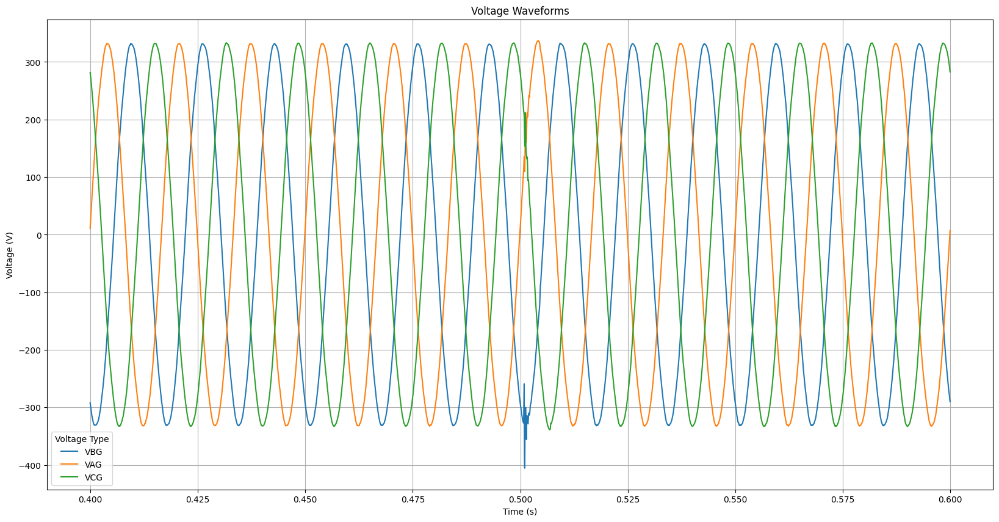

In [20]:
import seaborn as sns

import matplotlib.pyplot as plt

# Select voltage columns to plot
# voltage_columns = ['VBG', 'VAG', 'VNG', 'VCG', 'VAGAUX', 'VRG', 'VCGAUX', 'VBGAUX']
voltage_columns = ['VBG', 'VAG', 'VCG']
# Melt the dataframe to make it suitable for seaborn
df_filtered = df[(df['time'] >= 0.4) & (df['time'] <= 0.6)]
df_melted = df_filtered.melt(id_vars=['time'], value_vars=voltage_columns, var_name='Voltage Type', value_name='Voltage')

# Create the plot
plt.figure(figsize=(20, 10))
sns.lineplot(data=df_melted, x='time', y='Voltage', hue='Voltage Type')

# Add labels, title, and legend
plt.xlabel('Time (s)')
plt.ylabel('Voltage (V)')
plt.title('Voltage Waveforms')
plt.legend(title='Voltage Type')
plt.grid(True)

# Show the plot
plt.show()


In [1]:
import pandas as pd

In [2]:
ups_example_df = pd.read_csv("voltage_swell_from_UPS_example_2(Lower Table).csv")
healthy_example_df = pd.read_csv("voltage_swell_healthy(Lower Table).csv")

In [3]:
len(ups_example_df)

2019

In [4]:
len(healthy_example_df)

2146

In [5]:
ups_example_df.columns

Index(['Unnamed: 0', 'V Waveform', 'Unnamed: 2', 'Unnamed: 3', 'Unnamed: 4',
       'Unnamed: 5', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Unnamed: 9',
       'Unnamed: 10', 'Unnamed: 11', 'Unnamed: 12', 'Unnamed: 13',
       'Unnamed: 14', 'Unnamed: 15', 'Unnamed: 16', 'Unnamed: 17',
       'Unnamed: 18', 'Unnamed: 19'],
      dtype='object')

In [6]:
ups_example_df.head()

,Unnamed: 0,V Waveform,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19
0,Time,AN,BN,CN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,02/04/2025 20:58:09.473.599,165.66,-414.96,169.56,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,02/04/2025 20:58:09.473.664,170.94,-418.57,159.79,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,02/04/2025 20:58:09.473.729,175.52,-422.05,149.94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,02/04/2025 20:58:09.473.794,183.83,-421.59,143.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
healthy_example_df.head()

,time,AN,BN,CN,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18,Unnamed: 19
0,02/04/2025 20:58:09.546.520,63.59,230.57,-427.14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,02/04/2025 20:58:09.546.585,57.96,242.48,-418.84,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,02/04/2025 20:58:09.546.650,50.14,251.45,-412.71,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,02/04/2025 20:58:09.546.715,40.27,257.28,-409.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,02/04/2025 20:58:09.546.780,29.99,264.10,-404.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
# Drop all columns except the first 4 for both dataframes
healthy_example_df = healthy_example_df.iloc[:, :4]
ups_example_df = ups_example_df.iloc[:, :4]

In [9]:
healthy_example_df.columns

Index(['time', 'AN', 'BN', 'CN'], dtype='object')

In [10]:
ups_example_df.columns

Index(['Unnamed: 0', 'V Waveform', 'Unnamed: 2', 'Unnamed: 3'], dtype='object')

In [11]:
# Set the first row as the header and remove the current columns
ups_example_df.columns = ups_example_df.iloc[0]
ups_example_df = ups_example_df[1:].reset_index(drop=True)

In [12]:
ups_example_df.head()

,Time,AN,BN,CN
0,02/04/2025 20:58:09.473.599,165.66,-414.96,169.56
1,02/04/2025 20:58:09.473.664,170.94,-418.57,159.79
2,02/04/2025 20:58:09.473.729,175.52,-422.05,149.94
3,02/04/2025 20:58:09.473.794,183.83,-421.59,143.04
4,02/04/2025 20:58:09.473.859,192.26,-420.39,135.59


In [13]:
ups_example_df.Time.iloc[1]

'02/04/2025 20:58:09.473.664'

In [14]:
print("NaN values in healthy_example_df:")
print(healthy_example_df.isna().any())

print("\nNaN values in ups_example_df:")
print(ups_example_df.isna().any())

NaN values in healthy_example_df:
time    False
AN      False
BN      False
CN      False
dtype: bool

NaN values in ups_example_df:
0
Time    True
AN      True
BN      True
CN      True
dtype: bool


In [15]:
ups_example_df = ups_example_df.dropna()
ups_example_df.shape

(1949, 4)

Length For Each Dataframe

In [16]:
print("Shape of healthy_example_df:", healthy_example_df.shape)
print("Shape of ups_example_df:", ups_example_df.shape)

Shape of healthy_example_df: (2146, 4)
Shape of ups_example_df: (1949, 4)


In [20]:
from datetime import datetime

In [21]:
# Preprocess the 'Time' column in both dataframes to combine the fractional seconds and convert to datetime
def preprocess_time_column(df, column_name):
    df[column_name] = df[column_name].dropna().apply(
        lambda x: datetime.strptime(
            f"{x.rsplit('.', 2)[0]}.{x.rsplit('.', 2)[1]}{x.rsplit('.', 2)[2]}",
            "%d/%m/%Y %H:%M:%S.%f"
        ) if isinstance(x, str) else x
    )
    return df

# Apply the transformation to 'Time' column of both dataframes
healthy_example_df = preprocess_time_column(healthy_example_df, 'time')
ups_example_df = preprocess_time_column(ups_example_df, 'Time')

print("Head of 'Time' column in healthy_example_df:")
print(healthy_example_df['time'].head())

print("\nHead of 'Time' column in ups_example_df:")
print(ups_example_df['Time'].head())

Head of 'Time' column in healthy_example_df:
0   2025-04-02 20:58:09.546520
1   2025-04-02 20:58:09.546585
2   2025-04-02 20:58:09.546650
3   2025-04-02 20:58:09.546715
4   2025-04-02 20:58:09.546780
Name: time, dtype: datetime64[ns]

Head of 'Time' column in ups_example_df:
0   2025-04-02 20:58:09.473599
1   2025-04-02 20:58:09.473664
2   2025-04-02 20:58:09.473729
3   2025-04-02 20:58:09.473794
4   2025-04-02 20:58:09.473859
Name: Time, dtype: datetime64[ns]


In [ ]:
# For healthy_example_df
healthy_example_df['date'] = healthy_example_df['time'].dt.date
healthy_example_df['hour'] = healthy_example_df['time'].dt.hour
healthy_example_df['minute'] = healthy_example_df['time'].dt.minute
healthy_example_df['second'] = healthy_example_df['time'].dt.second
healthy_example_df['millisec'] = healthy_example_df['time'].dt.microsecond // 1000

# For ups_example_df
ups_example_df['date'] = ups_example_df['Time'].dt.date
ups_example_df['hour'] = ups_example_df['Time'].dt.hour
ups_example_df['minute'] = ups_example_df['Time'].dt.minute
ups_example_df['second'] = ups_example_df['Time'].dt.second
ups_example_df['millisec'] = ups_example_df['Time'].dt.microsecond // 1000

In [23]:
healthy_example_df.head()

,time,AN,BN,CN,date,hour,minute,second,millisec
0,2025-04-02 20:58:09.546520,63.59,230.57,-427.14,2025-04-02,20,58,9,546
1,2025-04-02 20:58:09.546585,57.96,242.48,-418.84,2025-04-02,20,58,9,546
2,2025-04-02 20:58:09.546650,50.14,251.45,-412.71,2025-04-02,20,58,9,546
3,2025-04-02 20:58:09.546715,40.27,257.28,-409.08,2025-04-02,20,58,9,546
4,2025-04-02 20:58:09.546780,29.99,264.10,-404.04,2025-04-02,20,58,9,546


In [24]:
healthy_example_df['millisec'] = healthy_example_df['time'].dt.microsecond
ups_example_df['millisec'] = ups_example_df['Time'].dt.microsecond

In [25]:
healthy_example_df.head()

,time,AN,BN,CN,date,hour,minute,second,millisec
0,2025-04-02 20:58:09.546520,63.59,230.57,-427.14,2025-04-02,20,58,9,546520
1,2025-04-02 20:58:09.546585,57.96,242.48,-418.84,2025-04-02,20,58,9,546585
2,2025-04-02 20:58:09.546650,50.14,251.45,-412.71,2025-04-02,20,58,9,546650
3,2025-04-02 20:58:09.546715,40.27,257.28,-409.08,2025-04-02,20,58,9,546715
4,2025-04-02 20:58:09.546780,29.99,264.10,-404.04,2025-04-02,20,58,9,546780


In [26]:
ups_example_df.head()

,Time,AN,BN,CN,date,hour,minute,second,millisec
0,2025-04-02 20:58:09.473599,165.66,-414.96,169.56,2025-04-02,20,58,9,473599
1,2025-04-02 20:58:09.473664,170.94,-418.57,159.79,2025-04-02,20,58,9,473664
2,2025-04-02 20:58:09.473729,175.52,-422.05,149.94,2025-04-02,20,58,9,473729
3,2025-04-02 20:58:09.473794,183.83,-421.59,143.04,2025-04-02,20,58,9,473794
4,2025-04-02 20:58:09.473859,192.26,-420.39,135.59,2025-04-02,20,58,9,473859


In [37]:
# Print unique values of 'date' column in healthy_example_df
print("Unique values in 'date' column of healthy_example_df:")
print(healthy_example_df['millisec'].unique())

# Print unique values of 'date' column in ups_example_df
print("\nUnique values in 'date' column of ups_example_df:")
print(ups_example_df['millisec'].unique())

Unique values in 'date' column of healthy_example_df:
[546520 546585 546650 ... 686195 686260 686326]

Unique values in 'date' column of ups_example_df:
[473599 473664 473729 ... 600338 600403 600468]


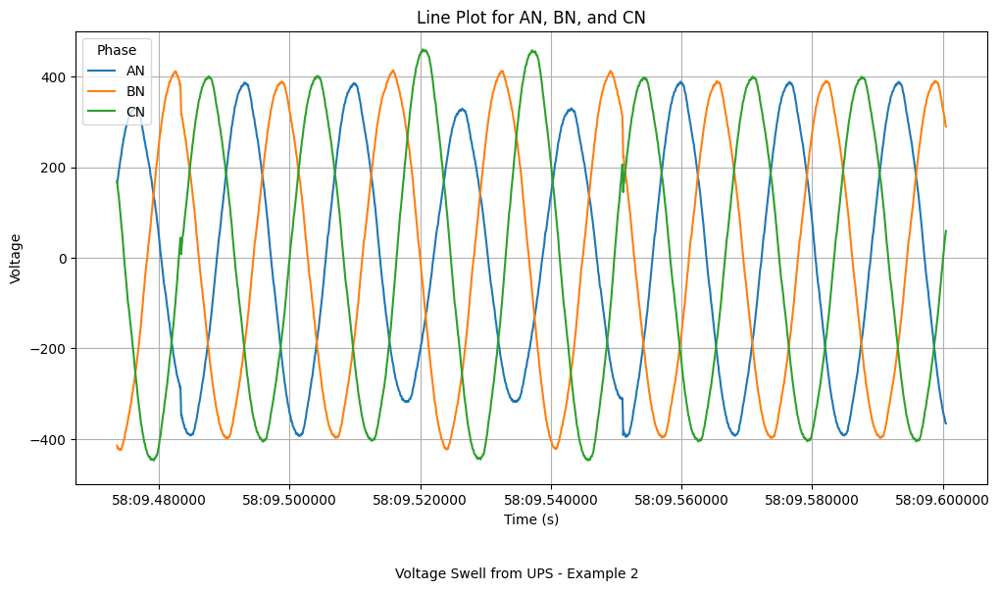

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create the plot
plt.figure(figsize=(12, 6))
for col in ['AN', 'BN', 'CN']:
    sns.lineplot(x=ups_example_df['Time'], y=pd.to_numeric(ups_example_df[col], errors='coerce'), label=col)

# Set y-axis limits
plt.ylim(-500, 500)

# Add labels, title, legend, and caption
plt.xlabel("Time (s)")
plt.ylabel("Voltage")
plt.title('Line Plot for AN, BN, and CN')
plt.legend(title='Phase')
plt.grid(True)
plt.figtext(0.5, -0.05, "Voltage Swell from UPS - Example 2", wrap=True, horizontalalignment='center', fontsize=10)

# Show the plot
plt.show()


In [41]:
# Convert AN, BN, and CN columns of healthy_example_df to numeric
healthy_example_df[['AN', 'BN', 'CN']] = healthy_example_df[['AN', 'BN', 'CN']].apply(pd.to_numeric, errors='coerce')

# Convert AN, BN, and CN columns of ups_example_df to numeric
ups_example_df[['AN', 'BN', 'CN']] = ups_example_df[['AN', 'BN', 'CN']].apply(pd.to_numeric, errors='coerce')

In [42]:
# Check for null values in healthy_example_df
print("Null values in healthy_example_df:")
print(healthy_example_df.isnull().sum())

# Check for null values in ups_example_df
print("\nNull values in ups_example_df:")
print(ups_example_df.isnull().sum())

Null values in healthy_example_df:
time        0
AN          0
BN          0
CN          0
date        0
hour        0
minute      0
second      0
millisec    0
dtype: int64

Null values in ups_example_df:
0
Time        0
AN          0
BN          0
CN          0
date        0
hour        0
minute      0
second      0
millisec    0
dtype: int64


In [43]:
# Rename columns in healthy_example_df
healthy_example_df.rename(columns={'AN': 'AG', 'BN': 'BG', 'CN': 'CG'}, inplace=True)

# Rename columns in ups_example_df
ups_example_df.rename(columns={'AN': 'AG', 'BN': 'BG', 'CN': 'CG'}, inplace=True)

In [44]:
healthy_example_df.columns

Index(['time', 'AG', 'BG', 'CG', 'date', 'hour', 'minute', 'second',
       'millisec'],
      dtype='object')